In [1]:
pip install thefuzz python-Levenshtein rapidfuzz

You should consider upgrading via the 'pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import os
import matplotlib.pyplot as plt
from rapidfuzz import fuzz, process

In [3]:
data = pd.read_csv('output.csv', index_col=0)
streets = pd.read_csv('indexer/neo4j_data/streets.csv', header=None, usecols=[0]).values.reshape(-1)
companies = pd.read_csv('indexer/neo4j_data/companies.csv', header=None, usecols=[0]).values.reshape(-1).astype(str)


In [101]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 525176 entries, 0 to 525175
Data columns (total 16 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   url               525176 non-null  object 
 1   id                525176 non-null  int64  
 2   type              524984 non-null  object 
 3   number            475998 non-null  object 
 4   resort            525175 non-null  object 
 5   customer          525173 non-null  object 
 6   customer_address  491463 non-null  object 
 7   supplier          525169 non-null  object 
 8   supplier_address  388840 non-null  object 
 9   name              525173 non-null  object 
 10  note              44309 non-null   object 
 11  final_price_eur   525070 non-null  float64
 12  publication_date  525176 non-null  object 
 13  conclusion_date   485695 non-null  object 
 14  effective_date    519520 non-null  object 
 15  expiration_date   162253 non-null  object 
dtypes: float64(1), int64

# Distribution of the price

In [8]:
data['final_price_eur']

0              0.00
1              0.00
2         134969.40
3              0.00
4            348.00
            ...    
525171      1500.00
525172       126.00
525173      6692.13
525174     14001.21
525175      1140.00
Name: final_price_eur, Length: 525176, dtype: float64

<AxesSubplot:xlabel='final_price_eur'>

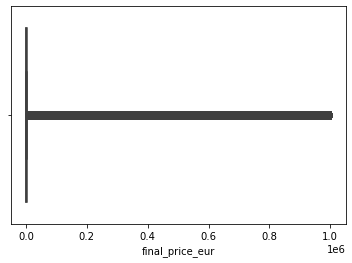

In [9]:
sns.boxplot(x=data["final_price_eur"])

# Similar company names

In [4]:
len(companies)

244084

In [5]:
unique_companies = set(companies)
len(unique_companies)

244081

In [7]:
%%timeit
results = process.extract('SCMM', unique_companies, scorer=fuzz.token_sort_ratio)
results

315 ms ± 6.75 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [8]:
companies_to_compare = unique_companies.copy()
suspicious_count = 0
for i, company in enumerate(unique_companies):
    results = process.extract(company, companies_to_compare, scorer=fuzz.token_sort_ratio)
    suspicious = [r for r in results if 90 < r[1] < 100]
    if suspicious:
        suspicious_count = suspicious_count + 1
        print("Found similar for company " + company + ": " + str(suspicious))
        print("Progress: {}/{}, Companies for comparison: {}".format(i, len(unique_companies), len(companies_to_compare)))
    #if company in companies_to_compare:
    #    companies_to_compare.remove(company)
    
print("Overall percentage of similarities: ", str(suspicious_count/len(unique_companies)*100), "%")

Found similar for company MARIÁN PAULÍK: [('MARIÁN PAVLÍK', 92.3076923076923, 123037), ('MARIAN PAULÍK', 92.3076923076923, 131441)]
Progress: 4/244081, Companies for comparison: 244081
Found similar for company BC. TATIANA ZAŤKOVÁ: [('ZAŤKOVÁ TATIANA', 90.9090909090909, 228916)]
Progress: 9/244081, Companies for comparison: 244081
Found similar for company SP-TRANS, S.R.O.: [('TRANS SK S. R. O.', 92.85714285714286, 8485)]
Progress: 10/244081, Companies for comparison: 244081
Found similar for company OBEC PROCHOT, , PROCHOT Č. 39, 966 04 PROCHOT: [('OBEC PROCHOT, PROCHOT 39, 966 04  PROCHOT', 97.43589743589743, 43722)]
Progress: 16/244081, Companies for comparison: 244081
Found similar for company STREDNÁ ZDRAVOTNÍCKA ŠKOLA - EGÉSZSÉGÜGYI KÖZÉPISKOLA: [('STREDNÁ ZDRAVOTNÍCKA ŠKOLA - EGÉSZSÉGÜGYI KÖZEPISKOLA', 98.03921568627452, 60562), ('STREDNÁ ZDRAVOTNÍCKA ŠKOLA - EGÉSZSÉGUGYI KOZEPISKOLA', 94.11764705882354, 242109)]
Progress: 23/244081, Companies for comparison: 244081
Found simila

Found similar for company PETER ONDRIAŠ: [('PETER ONDRIÁŠ', 92.3076923076923, 96385)]
Progress: 183/244081, Companies for comparison: 244081
Found similar for company ING. PETER GRAŇÁK: [('ING. PETER BAŇÁK', 90.3225806451613, 112236)]
Progress: 185/244081, Companies for comparison: 244081
Found similar for company BUGINO, S.R.O.: [('BUGI, S.R.O.', 90.9090909090909, 220589)]
Progress: 188/244081, Companies for comparison: 244081
Found similar for company HELENA KÁČERÍKOVÁ: [('ČERTÍKOVÁ HELENA', 90.9090909090909, 238704)]
Progress: 191/244081, Companies for comparison: 244081
Found similar for company MGR. JANA KLICOVÁ: [('MGR. JANA KLIČOVÁ', 93.75, 84816)]
Progress: 195/244081, Companies for comparison: 244081
Found similar for company PPCOM, SPOL. S R.O.: [('PRICOM, SPOL. S.R.O.', 90.9090909090909, 124776), ('PICO, SPOL S.R.O.', 90.3225806451613, 59400)]
Progress: 197/244081, Companies for comparison: 244081
Found similar for company PROFESIONÁLNO-AMATÉRSKE DIVADELNÉ SPOLOČENSTVO "LE M

Found similar for company DETSKÁ OZDRAVOVŇA, BIELA SKALA S.R.O.: [('DETSKÁ OZDRAVOVŇA, BIELA SKALA', 90.625, 47944)]
Progress: 355/244081, Companies for comparison: 244081
Found similar for company MARTA BALÁŽOVÁ: [('MARTINA BALÁŽOVÁ', 93.33333333333333, 100930), ('MARGITA BALÁŽOVÁ', 93.33333333333333, 115018)]
Progress: 356/244081, Companies for comparison: 244081
Found similar for company MGR. JANKA RÁKOŠOVÁ: [('MGR. RÁKOŠOVÁ JANA', 97.14285714285714, 221165)]
Progress: 357/244081, Companies for comparison: 244081
Found similar for company STAVME S.R.O.: [('STAVEA, S.R.O.', 91.66666666666667, 143279), ('STAMED S.R.O.', 91.66666666666667, 198247), ('SAVE, S.R.O.', 90.9090909090909, 149324)]
Progress: 359/244081, Companies for comparison: 244081
Found similar for company LESY SR, Š.P. ODŠTEPNÝ ZÁVOD ČADCA: [('LESY SR, ODŠTEPNÝ ZÁVOD ČADCA', 93.33333333333333, 54485)]
Progress: 361/244081, Companies for comparison: 244081
Found similar for company C.L.COMPANY, S.R.O.: [('CO-COMPANY S.R.

Found similar for company EMÍLIA GAJDOŠOVÁ: [('CECÍLIA GAJDOŠOVÁ', 90.9090909090909, 75116)]
Progress: 502/244081, Companies for comparison: 244081
Found similar for company MARIÁN KUČERA: [('KUČERA MARTIN', 92.3076923076923, 41555), ('MARTIN KUČERA', 92.3076923076923, 225443)]
Progress: 506/244081, Companies for comparison: 244081
Found similar for company POTEX, S.R.O.: [('PONTEX S.R.O.', 95.65217391304348, 44454), ('POLTREX, S.R.O.', 91.66666666666667, 117117), ('POLTREX S.R.O.', 91.66666666666667, 211581), ('POVEX S.R.O.', 90.9090909090909, 35937)]
Progress: 508/244081, Companies for comparison: 244081
Found similar for company CAFFE ESPRESSO, S.R.O.: [('CAFFE ESPRESSO SPL. S R.O.', 90.9090909090909, 59109)]
Progress: 509/244081, Companies for comparison: 244081
Found similar for company MILAN LÁTKA: [('LATKA MILAN', 90.9090909090909, 95997)]
Progress: 510/244081, Companies for comparison: 244081
Found similar for company BATTAL, SPOL. S.R.O.: [('BATAX SPOL. S R.O.', 90.90909090909

Found similar for company DEUTSCH-SLOWAKISCHE AKADEMIEN A.S.: [('DEUTCH-SLOWAKISCHE AKADEMIEN, A.S.', 98.46153846153847, 100505), ('DEUTSCH-SLOWAKISCHE AKADEMIEN A.S. BREZNO', 90.41095890410959, 74412)]
Progress: 647/244081, Companies for comparison: 244081
Found similar for company MÁRIA HANULIAKOVÁ: [('MÁRIA HANULÍKOVÁ', 90.9090909090909, 83815)]
Progress: 648/244081, Companies for comparison: 244081
Found similar for company LOGIC PARK S.R.O.: [('LOGISTIC PARK, S.R.O.', 91.42857142857143, 151543)]
Progress: 649/244081, Companies for comparison: 244081
Found similar for company ONDAVA - DOMOV SOCIÁLNYCH SLUŽIEB: [('ONDAVA - DOMOV SOCIÁLYCH SLUŽIEB', 98.36065573770492, 49625)]
Progress: 650/244081, Companies for comparison: 244081
Found similar for company CENTRUM SOCIÁLNYCH SLUŽIEB „JOHANKA“, N.O.: [('CENTRUM SOCIÁLNYCH SLUŽIEB "JOANKA", N.O.', 98.66666666666667, 34284)]
Progress: 651/244081, Companies for comparison: 244081
Found similar for company LAND, S.R.O.: [('AND, S.R.O.', 94

Found similar for company MILENA MAJEROVÁ: [('MILENA MAJERČÁKOVÁ', 90.9090909090909, 117103)]
Progress: 763/244081, Companies for comparison: 244081
Found similar for company JAROSLAV PEJCHAL: [('JAROSLAV PECHA', 93.33333333333333, 66121), ('JAROSLAV PEHAL', 93.33333333333333, 159107), ('PECHA JAROSLAV', 93.33333333333333, 235434)]
Progress: 768/244081, Companies for comparison: 244081
Found similar for company SATRO S.R.O.: [('SATURO, S.R.O.', 95.65217391304348, 11799), ('STRMO, S.R.O.', 90.9090909090909, 71356)]
Progress: 773/244081, Companies for comparison: 244081
Found similar for company ING. MARTINA MAJOROŠOVÁ: [('ING. MARTINA MAJOROŠOVÁ, PHD.', 91.66666666666667, 124026)]
Progress: 777/244081, Companies for comparison: 244081
Found similar for company ROPO SK, S. R. O.: [('ROOF SK, S.R.O.', 92.3076923076923, 75365)]
Progress: 786/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÁ OBCHODNÁ INŠPEKCIA -ÚSTREDNÝ INŠPEKTORÁT SOI: [('SLOVENSKÁ OBCHODNÁ INŠPE

Found similar for company OBEC RADVANOVCE: [('OBEC RADNOVCE', 92.85714285714286, 76289), ('OBEC  RADNOVCE', 92.85714285714286, 155144)]
Progress: 929/244081, Companies for comparison: 244081
Found similar for company OBEC TRAKOVICE: [('OBEC RAKOVICE', 96.29629629629629, 33093)]
Progress: 931/244081, Companies for comparison: 244081
Found similar for company PNEUMO MEDIK, S.R.O.: [('PNEUMO-MED, S.R.O.', 94.11764705882354, 114605), ('PULMO-MEDIK, S R.O.', 91.42857142857143, 1633)]
Progress: 938/244081, Companies for comparison: 244081
Found similar for company GRUY SPOL. S.R.O.: [('GRYFF, SPOL. S\xa0R.O.', 90.3225806451613, 120521)]
Progress: 940/244081, Companies for comparison: 244081
Found similar for company BORIS PILINSKÝ: [('BORIS ŽILINSKÝ', 92.85714285714286, 152865)]
Progress: 943/244081, Companies for comparison: 244081
Found similar for company RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ BRUTOVCE: [('RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ BOROVCE', 96.1038961038961, 146672), ('RÍMSKOKATOLÍCKA CIR

Found similar for company KOMUNAL ENERGY, A.S. KÁLOV 4, 010 01 ŽILINA: [('KOMUNAL ENERGY, A.S., KÁLOV 4,  ŽILINA', 90.41095890410959, 119334)]
Progress: 1109/244081, Companies for comparison: 244081
Found similar for company IVETA KRÁĽOVÁ: [('IVETA KRÁLOVÁ', 92.3076923076923, 197139)]
Progress: 1117/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU V POPRADE: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, POPRAD', 96.3855421686747, 120852), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU - POPRAD - VEĽKÁ', 94.38202247191012, 62253), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU POPROČ', 91.56626506024097, 67397), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU - POPROČ', 91.56626506024097, 177306)]
Progress: 1118/244081, Companies for comparison: 244081
Found similar for company OBČIANSKE ZDRUŽENIE NAŠE ZÁLESÍČKO: [('OBČIANSKE ZDRUŽENIE NAŠE ZÁLEŠÍČKO', 97.05882352941177, 160665)]
Progress: 1120/244081, Companies for comparison: 244081
Found similar for company FOR REGION N.O.:

Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: PARTIZÁNSKE, NÁDRAŽNÁ 889/12 ZASTÚPENÍ: STAVEBNÉ BYTOVÉ DRUŽSTVO: [('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: PARTIZÁNSKE, NÁDRAŽNÁ 873/20, 22, 24 ZASTÚPENÍ: STAVEBNÉ BYTOVÉ DRUŽSTVO', 95.2755905511811, 128865), ('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: PARTIZÁNSKE, VEĽKÁ OKRUŽNÁ 1080/45 ZASTÚPENÍ: STAVEBNÉ BYTOVÉ DRUŽSTVO', 91.33858267716535, 200178)]
Progress: 1243/244081, Companies for comparison: 244081
Found similar for company RADA MLÁDEŽ SLOVENSKA: [('RADA MLÁDEŽE SLOVENSKA', 97.67441860465117, 236954)]
Progress: 1245/244081, Companies for comparison: 244081
Found similar for company DANIEL ORLOVSKÝ: [('DANIEL DOBROVSKÝ', 90.3225806451613, 131644)]
Progress: 1250/244081, Companies for comparison: 244081
Found similar for company MEGA SERVICES S.R.O.: [('CMA SERVICES, S.R.O.', 91.89189189189189, 32034), ('MERA SERVICE, S.R.O.', 91.89189189189189

Found similar for company POINTPARK PROPERTIES SK, SPOL. S R. O.: [('POINTPARK PROPERTIES SK, S.R.O.', 92.06349206349206, 217942)]
Progress: 1413/244081, Companies for comparison: 244081
Found similar for company MATEJ SMOLEJ: [('MATEJ SMOLEŇ', 91.66666666666667, 217669)]
Progress: 1414/244081, Companies for comparison: 244081
Found similar for company URBÁR VRBICA, POZEMKOVÉ SPOLOČENSTVO: [('POZEMKOVÉ SPOLOČENSTVO URBÁR ŠTRBA', 92.7536231884058, 126429)]
Progress: 1415/244081, Companies for comparison: 244081
Found similar for company DIONE S.R.O.: [('DIONEA, S.R.O.', 95.65217391304348, 129960), ('DONER, S.R.O.', 90.9090909090909, 102970), ('ADINE S.R.O.', 90.9090909090909, 171525), ('ADINE,S.R.O.', 90.9090909090909, 215077)]
Progress: 1419/244081, Companies for comparison: 244081
Found similar for company SLOVAK PRODUCTIONS S R.O.: [('SLOVAK PRODUCTION, S.R.O.', 97.87234042553192, 239945)]
Progress: 1420/244081, Companies for comparison: 244081
Found similar for company MUDR. ALENA H

Found similar for company ARCHE S.R.O.: [('ARCHERS S.R.O.', 91.66666666666667, 127942), ('ARCHA, S.R.O.', 90.9090909090909, 132190)]
Progress: 1556/244081, Companies for comparison: 244081
Found similar for company REHÁK JURAJ: [('JURAJ REVÁK', 90.9090909090909, 66674)]
Progress: 1563/244081, Companies for comparison: 244081
Found similar for company ANNA ONDRUŠÍKOVÁ: [('ANNA ONDRUŠOVÁ', 93.33333333333333, 4518)]
Progress: 1567/244081, Companies for comparison: 244081
Found similar for company VLADIMÍR ŠAMKO: [('VLADIMÍR ŠIMKO', 92.85714285714286, 87481), ('ŠIMKO VLADIMÍR', 92.85714285714286, 243122)]
Progress: 1568/244081, Companies for comparison: 244081
Found similar for company INTERNAL M., S.R.O.: [('JM - INTERNA, S.R.O.', 93.75, 71279), ('INTERNA - MED S.R.O.', 90.9090909090909, 161960)]
Progress: 1570/244081, Companies for comparison: 244081
Found similar for company DV, S.R.O.: [('DVC S.R.O.', 94.11764705882354, 66267), ('DVS S.R.O.', 94.11764705882354, 84086), ('DVZ, S.R.O.', 

Found similar for company SLOVENSKÝ PLYNÁRENSKY PRIEMYSEL, A.S.: [('SLOVENSKÝ PLYNÁRENSKÝ PRIEMYSEL, A.S.,', 97.14285714285714, 10420), ('SLOVENSKÝ PLYNÁRENSKÝ PRIEMYSEL, A .S.', 97.14285714285714, 18476), ('SLOVENSKÝ PLYNÁRENSKÝ PRIEMYSEL, A.S.', 97.14285714285714, 27542)]
Progress: 1702/244081, Companies for comparison: 244081
Found similar for company ZUZANA JONIAKOVÁ: [('ZUZANA HORNIAKOVÁ', 90.9090909090909, 192610)]
Progress: 1703/244081, Companies for comparison: 244081
Found similar for company KIČAKOVÁ ZUZANA: [('ZUZANA KAKOVÁ', 92.85714285714286, 131804)]
Progress: 1704/244081, Companies for comparison: 244081
Found similar for company MICHAL BARTA: [('BARAN MICHAL', 91.66666666666667, 8924), ('MICHAL BARAN', 91.66666666666667, 52503), ('MICHAL BERTA', 91.66666666666667, 73738)]
Progress: 1705/244081, Companies for comparison: 244081
Found similar for company ACTIVIT, S.R.O.: [('ACTIV IT, S.R.O.', 96.29629629629629, 205553)]
Progress: 1706/244081, Companies for comparison: 244

Found similar for company SPRÁVA ÚČELOVÝCH ZARIADENÍ SLOVENSKEJ AKADÉMIE VIED: [('SPRÁVA ÚČELOVÝCH ZARIADENÍ SLOVENSKÁ AKADÉMIA VIED', 95.04950495049505, 233922)]
Progress: 1873/244081, Companies for comparison: 244081
Found similar for company SL SLOVAKIA A.S.: [('GTS SLOVAKIA, A.S.', 90.3225806451613, 146195)]
Progress: 1885/244081, Companies for comparison: 244081
Found similar for company KNIMED, S.R.O.: [('KENGIMED  S.R.O.', 92.3076923076923, 104556), ('KONMED, S.R.O.', 91.66666666666667, 35620), ('KIDMED, S. R. O.', 91.66666666666667, 97766), ('KIDMED, S.R.O.', 91.66666666666667, 157464)]
Progress: 1886/244081, Companies for comparison: 244081
Found similar for company BC. MÁRIA PAVLÍKOVÁ: [('PAVLÍKOVÁ MÁRIA', 90.9090909090909, 91245), ('MÁRIA PAVLÍKOVÁ', 90.9090909090909, 143289)]
Progress: 1890/244081, Companies for comparison: 244081
Found similar for company FALES S.R.O.: [('FARLES, S.R.O.', 95.65217391304348, 151488), ('MALES S.R.O.', 90.9090909090909, 14996), ('ALESA S. R. 

Found similar for company JOZEFA MIKLOVÁ: [('JOZEFÍNA MIKULOVÁ', 90.3225806451613, 29521)]
Progress: 2023/244081, Companies for comparison: 244081
Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: KOŠICE, LIDICKÉ NÁMESTIE 897/10,12,   V ZASTÚPENÍ STAVEBNÉ BYTOVÉ DRUŽSTVO III KOŠICE: [('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: KOŠICE, LIDICKÉ NÁMESTIE 7,  V ZASTÚPENÍ STAVEBNÉ BYTOVÉ DRUŽSTVO III KOŠICE', 97.12230215827338, 187688), ('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: KOŠICE, LIDICKÉ NÁMESTIE 893/2,4 ZASTÚPENÍ: STAVEBNÉ BYTOVÉ DRUŽSTVO III KOŠICE', 96.45390070921985, 41014), ('VLASTNÍCI BYTOV V BYTOVOM DOME, ADRESA: LIDICKÉ NÁMESTIE 897/10,12, KOŠICE V ZASTÚPENÍ STAVEBNÉ BYTOVÉ DRUŽSTVO III KOŠICE', 90.83969465648855, 231828), ('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: KOŠICE, KURSKÁ 10, 12 ZASTÚPENÍ: STAVEBNÉ BYTOVÉ DRUŽSTVO III KOŠICE', 90.37037037037037, 116956)]
Progres

Found similar for company SIMONA PUŠKOVÁ: [('SIMONA PUKOVÁ', 96.29629629629629, 25814), ('PEŠKOVÁ SIMONA', 92.85714285714286, 219345)]
Progress: 2168/244081, Companies for comparison: 244081
Found similar for company JURČOVIČ PETER: [('PETER JURKOVIČ', 92.85714285714286, 231246)]
Progress: 2171/244081, Companies for comparison: 244081
Found similar for company MUDR. LUKAČOVIČOVÁ ALENA A SYN, S.R.O.: [('MUDR. LUKAČOVIČOVA ALENA A SYN, S.R.O.', 97.14285714285714, 158776)]
Progress: 2173/244081, Companies for comparison: 244081
Found similar for company ZDRUŽENIE PRIATEĽOV NOÚ: [('ZDUŽENIE PRIATEĽOV NOÚ', 97.77777777777777, 64685)]
Progress: 2178/244081, Companies for comparison: 244081
Found similar for company MEZEY TIBOR: [('TIBOR MEZEI', 90.9090909090909, 11626), ('MEZEI TIBOR', 90.9090909090909, 86243)]
Progress: 2180/244081, Companies for comparison: 244081
Found similar for company ARTEA NO1, S.R.O.: [('ARTEA NO 1, S.R.O.', 90.3225806451613, 209494)]
Progress: 2181/244081, Companie

Found similar for company KLIMAVENT S.R.O.: [('KLIVENT S.R.O.', 92.85714285714286, 30500), ('KLIVENT, S.R.O.', 92.85714285714286, 102675)]
Progress: 2356/244081, Companies for comparison: 244081
Found similar for company PETMEDIC, S.R.O.: [('PETMEDI, S. R. O.', 96.29629629629629, 6288), ('PETMEDI, S.R.O.', 96.29629629629629, 82531), ('PETMEDI S.R.O.', 96.29629629629629, 146765), ('PREMEDIC S.R.O.', 92.85714285714286, 175967)]
Progress: 2358/244081, Companies for comparison: 244081
Found similar for company LÍVIA HORVÁTHOVÁ: [('SILVIA HORVÁTHOVÁ', 90.9090909090909, 235287)]
Progress: 2362/244081, Companies for comparison: 244081
Found similar for company KRAJSKÝ ÚRAD ŽIVOTNÉHO PROSTREDIA ŽILINA: [('KRAJSKÝ ÚRAD ŽIVOTNÉHO PROSTREDIA V ŽILINE', 95.1219512195122, 24412), ('KRAJSKÝ ÚRAD ŽIVOTNÉHO PROSTREDIA', 90.41095890410959, 182397)]
Progress: 2365/244081, Companies for comparison: 244081
Found similar for company MARTIN PAVLOV: [('MARTIN PAVLOVIČ', 92.85714285714286, 203868)]
Progress: 

Found similar for company DANA ONDRUŠOVÁ: [('ANNA ONDRUŠOVÁ', 92.85714285714286, 4518), ('DAŠA ONDRUŠOVÁ', 92.85714285714286, 77334), ('ONDRUŠOVÁ JANA', 92.85714285714286, 206930), ('ADRIANA ONDRUŠOVÁ', 90.3225806451613, 17831)]
Progress: 2492/244081, Companies for comparison: 244081
Found similar for company LUCIA ČERVEŇÁKOVÁ V ZÁK. ZASTÚPENÍ: EMÍLIA ČERVEŇÁKOVÁ: [('MONIKA ČERVEŇÁKOVÁ V ZÁK. ZASTÚPENÍ: EMÍLIA ČERVEŇÁKOVÁ', 93.33333333333333, 12360)]
Progress: 2493/244081, Companies for comparison: 244081
Found similar for company JUDR. MARIAN TÖRÖK: [('JUDR. MARIÁN TÖRÖK', 94.11764705882354, 108304)]
Progress: 2498/244081, Companies for comparison: 244081
Found similar for company ĽUBICA FIĽOVÁ: [('ĽUBICA FILOVÁ', 92.3076923076923, 28461)]
Progress: 2499/244081, Companies for comparison: 244081
Found similar for company RS CAR S.R.O: [('TS CAR S.R.O.', 91.66666666666667, 80297)]
Progress: 2508/244081, Companies for comparison: 244081
Found similar for company D. K. AGRO, SPOL. S R.O.:

Found similar for company FRANTIŠEK PAVÚK: [('FRANTIŠEK PAVLÍK', 90.3225806451613, 235126)]
Progress: 2680/244081, Companies for comparison: 244081
Found similar for company BENKOVÁ MÁRIA: [('BENDÍKOVÁ MÁRIA', 92.85714285714286, 160371), ('MÁRIA BECKOVÁ', 92.3076923076923, 32499), ('BEKEOVÁ MÁRIA', 92.3076923076923, 194601)]
Progress: 2686/244081, Companies for comparison: 244081
Found similar for company PATRIK PÁLFI: [('PATRIK PÁL', 90.9090909090909, 40775)]
Progress: 2697/244081, Companies for comparison: 244081
Found similar for company CHIRAMEX S.R.O.: [('CHIRAM, S.R.O.', 92.3076923076923, 93399)]
Progress: 2698/244081, Companies for comparison: 244081
Found similar for company SLOENSKÁ CESTNÁ SPOLOČNOSŤ: [('SLOVENSKÁ CESTNÁ SPOLOČNOSŤ', 98.11320754716981, 73390)]
Progress: 2699/244081, Companies for comparison: 244081
Found similar for company SLÁVKA MUCHOVÁ: [('SLÁVKA JUCHOVÁ', 92.85714285714286, 239292)]
Progress: 2705/244081, Companies for comparison: 244081
Found similar for 

Found similar for company STAV NA VÝKON TRESTU ODŇATIA SLOBODY A ÚSTAV NA VÝKON VÄZBY, LEVOČA: [('STAV NA VÝKON TRESTU ODŇATIA SLOBODY A ÚSTAV NA VÝKON VÄZBY LEOPOLDOV', 93.33333333333333, 205739), ('ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY A ÚSTAV NA VÝKON VÄZBY, LEVOČA', 91.72932330827068, 88813)]
Progress: 2816/244081, Companies for comparison: 244081
Found similar for company JANA HORNYÁKOVÁ: [('JANA HORÁKOVÁ,', 92.85714285714286, 71002), ('JANA HORÁKOVÁ', 92.85714285714286, 151935)]
Progress: 2817/244081, Companies for comparison: 244081
Found similar for company KAPADENTA, S.R.O.: [('KAPADENT S.R.O.', 96.55172413793103, 2067), ('KAPADENT, S.R.O.', 96.55172413793103, 60053)]
Progress: 2821/244081, Companies for comparison: 244081
Found similar for company ŠTÁTNA VETERINÁRNA A POTRAVINOVÁ SPRÁVA  SR: [('SR - ŠTÁTNA VETERINÁRNA A POTRAVINOVÁ SPRÁVA SR', 96.55172413793103, 232578), ('ŠTÁTNA VETERINÁRNA A POTRAVINOVÁ SPRÁVA', 96.29629629629629, 48011)]
Progress: 2826/244081, Companies fo

Found similar for company ANNA VOJTYLOVÁ: [('DANA VOJTYLOVÁ', 92.85714285714286, 74819)]
Progress: 3020/244081, Companies for comparison: 244081
Found similar for company PETER KOVAN: [('PETER KOVANIČ', 91.66666666666667, 22729), ('PETER KOVAĽ', 90.9090909090909, 60821)]
Progress: 3024/244081, Companies for comparison: 244081
Found similar for company MARTIN KRUĽ: [('MARTIN KRUG', 90.9090909090909, 6768), ('KRÁĽ MARTIN', 90.9090909090909, 25546)]
Progress: 3025/244081, Companies for comparison: 244081
Found similar for company FALISOVÁ ANNA: [('ANNA KALISOVÁ', 92.3076923076923, 43369)]
Progress: 3027/244081, Companies for comparison: 244081
Found similar for company DENTISTOMA S.R.O.: [('M - DENTIST S.R.O.', 90.3225806451613, 1604)]
Progress: 3032/244081, Companies for comparison: 244081
Found similar for company OBVODNÝ ÚRAD PRE CESTNÚ DOPRAVU A POZEMNÉ KOMUNIKÁCIE V NITRE: [('SR-OBVODNÝ ÚRAD PRE CESTNÚ DOPRAVU A POZEMNÉ KOMUNIKÁCIE V NITRE', 97.6, 113616), ('OBVODNÝ ÚRAD PRE CESTNÚ D

Found similar for company ING. ALLEXANDER BALOG: [('BALOG ALEXANDER, ING.', 97.43589743589743, 92028), ('ING. ALEXANDER BALOG', 97.43589743589743, 175560), ('ING. ALEXANDER BALOGH', 95.0, 199256)]
Progress: 3158/244081, Companies for comparison: 244081
Found similar for company MESTSKÉ KULTÚRNE STREDISKO MODRA: [('MESTSKÉ KULTÚRNE STREDISKO, S.R.O.', 90.625, 11585), ('MESTSKÉ KULTÚRNE STREDISKO RAJEC', 90.625, 169437)]
Progress: 3161/244081, Companies for comparison: 244081
Found similar for company "ZDRUŽENIE NA POMOC ĽUĎOM S MENTÁLNYM POSTIHNUTÍM V STROPKOVE: [('ZDRUŽENIE NA POMOC ĽUDOM S MENTÁLNYM POSTIHNUTÍM V SR', 92.03539823008849, 108050)]
Progress: 3162/244081, Companies for comparison: 244081
Found similar for company STRECHY - STAVEBNINY S. R. O.: [('STAVBY STRECHY, S.R.O.', 90.9090909090909, 227303)]
Progress: 3164/244081, Companies for comparison: 244081
Found similar for company ŠMATLÁKOVÁ MONIKA: [('MONIKA ŠMATLÁNEKOVÁ', 94.44444444444444, 101031)]
Progress: 3170/244081, 

Found similar for company MICHAL ŠEVČÍK: [('MICHAL ŠOVČÍK', 92.3076923076923, 66286)]
Progress: 3348/244081, Companies for comparison: 244081
Found similar for company FALERGO S.R.O.: [('ALERGO, S.R.O.', 96.0, 30907), ('ALERGON S.R.O.', 92.3076923076923, 39714)]
Progress: 3354/244081, Companies for comparison: 244081
Found similar for company SD9 S.R.O.: [('SD19 S.R.O.', 94.73684210526315, 22178)]
Progress: 3357/244081, Companies for comparison: 244081
Found similar for company ÚRAD PODPREDSEDU VLÁDY SR PRE INVESTÍCIE A INFORMATIZÁCIU,: [('ÚRAD PODPDPREDSEDU VLÁDY SR PRE INVESTÍCIE A INFORMATIZÁCIU', 98.27586206896552, 96735), ('ÚRAD PODPREDSEDU VLÁDY PRE INVESTÍCIE A INFORMATIZÁCIU', 97.29729729729729, 217979)]
Progress: 3359/244081, Companies for comparison: 244081
Found similar for company TOB-TOP, S.R.O.: [('TOP.T. S.R.O.', 91.66666666666667, 22732)]
Progress: 3364/244081, Companies for comparison: 244081
Found similar for company MIROSLAV KAROVIČ: [('MIROSLAV MARKOVIČ', 90.9090909

Found similar for company KATARÍNA VIRÁGOVÁ: [('VARGOVÁ KATARÍNA', 90.9090909090909, 96704), ('KATARÍNA VARGOVÁ', 90.9090909090909, 200401), ('KATARÍNA MIRGOVÁ', 90.9090909090909, 219002)]
Progress: 3486/244081, Companies for comparison: 244081
Found similar for company PHARMDR.ŽOFIA BENDŽALOVÁ KELLNEROVÁ: [('PHARM.DR. ŽOFIA BENDŽALOVÁ KELLNEROVÁ', 92.95774647887323, 23557)]
Progress: 3489/244081, Companies for comparison: 244081
Found similar for company ZDRUŽENIE BÝVALÝCH URBARIALISTOV OBCE VRBOVCE A CHVOJNICA, POZEMKOVÉ SPOLOČENSTVO: [('ZDRUŽENIE BÝVALÝCH URBARIALISTOV OBCE VRBOVCE - CHVOJNICA, POZEMKOVÉ SPOLOČENSTVO', 98.73417721518987, 93653)]
Progress: 3503/244081, Companies for comparison: 244081
Found similar for company PROSOFT, SPOL. S. R. O.: [('PROSORT, SPOL. S.R.O.', 94.44444444444444, 75755), ('PROST, SPOL. S R.O.', 94.11764705882354, 157550), ('PROST, SPOL. S.R.O.', 94.11764705882354, 208673)]
Progress: 3505/244081, Companies for comparison: 244081
Found similar for comp

Found similar for company SLOVENSKÝ LITERÁRNY KLUB V ČR, Z. S.: [('SLOVENSKÝ LITERÁRNY KLUB V ČR', 93.54838709677419, 19207)]
Progress: 3677/244081, Companies for comparison: 244081
Found similar for company VIERA ŠUJANOVÁ: [('VIERA ŠUĽANOVÁ', 92.85714285714286, 232873)]
Progress: 3682/244081, Companies for comparison: 244081
Found similar for company RAMKO S. R. O.: [('RAMEKO S.R.O.', 95.65217391304348, 192081), ('RAMEKO, S.R.O.', 95.65217391304348, 196007), ('RAMK, S. R. O.', 95.23809523809524, 924), ('REMKO S.R.O.', 90.9090909090909, 228466)]
Progress: 3683/244081, Companies for comparison: 244081
Found similar for company VLADIMÍR SLANINKA: [('VLADIMÍR SLANINA', 96.96969696969697, 150885)]
Progress: 3692/244081, Companies for comparison: 244081
Found similar for company FRANTIŠEK SZAXON: [('FRANTIŠEK SZABO', 90.3225806451613, 231593)]
Progress: 3693/244081, Companies for comparison: 244081
Found similar for company PETER HALUŠ: [('PETER HALUZ', 90.9090909090909, 186676)]
Progress: 

Found similar for company COOP JEDNOTA TRNAVA, SPOTREBNÉ DRUŽSTVO: [('COOP JENDOTA TRNAVA, SPOTREBNÉ DRUŽSTVO', 97.36842105263158, 93229), ('COOP JEDNOTA ŽARNOVICA, SPOTREBNÉ DRUŽSTVO', 91.13924050632912, 219614), ('COOP JEDNOTA TRENČÍN, SPOTREBNÉ DRUŽSTVO', 90.9090909090909, 187997), ('COOP JEDNOTA TRSTENÁ, SPOTREBNÉ DRUŽSTVO', 90.9090909090909, 208844)]
Progress: 3835/244081, Companies for comparison: 244081
Found similar for company EVANJELICKÉ GYMNÁZIUM JÁNA ÁMOSA KOMENSKÉHO - KOŠICE: [('EVANJELICKÉ GYMNÁZIUM JÁNA ÁMOSA KOMENSKÉHO', 92.47311827956989, 212838)]
Progress: 3837/244081, Companies for comparison: 244081
Found similar for company SENOR S. R. O.: [('SENZOR, S.R.O.', 95.65217391304348, 192311), ('SUENO S.R.O.', 90.9090909090909, 165261)]
Progress: 3851/244081, Companies for comparison: 244081
Found similar for company AGROKOMPLEX, SPOL. S R.O. HUMENNÉ: [('AGROKOMPLEX, S.R.O  HUMENNÉ.', 90.9090909090909, 1938), ('AGROKOMPLEX S.R.O. HUMENNÉ', 90.9090909090909, 16640), ('AGRO

Found similar for company QESTOR, S.R.O.: [('QSTORE S.R.O.', 91.66666666666667, 194504)]
Progress: 3983/244081, Companies for comparison: 244081
Found similar for company RENITEX, S.R.O.,: [('RITEX, S.R.O.', 91.66666666666667, 105355), ('RETEX, S.R.O.', 91.66666666666667, 209310)]
Progress: 3985/244081, Companies for comparison: 244081
Found similar for company Z RENT, S.R.O.: [('W RENT, S.R.O.', 91.66666666666667, 240184)]
Progress: 3986/244081, Companies for comparison: 244081
Found similar for company ING. ANDREJ LOVAS: [('ING. ANDREJ KVAS', 90.3225806451613, 67424)]
Progress: 3987/244081, Companies for comparison: 244081
Found similar for company KATARÍNA SÝKOROVÁ: [('KATARÍNA KORCOVÁ', 90.9090909090909, 39893)]
Progress: 3990/244081, Companies for comparison: 244081
Found similar for company MERITO BRATISLAVA, SPOL. S R.O.: [('ETS, SPOL. S R.O. BRATISLAVA', 90.56603773584905, 23870)]
Progress: 3992/244081, Companies for comparison: 244081
Found similar for company KULTÚRNO-UMELECK

Found similar for company MONOGRAM TECHNOLOGIES, SPOL. S R.O.: [('MONOGRAM TECHNOLGIES, SPOL. S R.O.', 98.41269841269842, 230320)]
Progress: 4120/244081, Companies for comparison: 244081
Found similar for company MARTINA ONDREJČÁKOVÁ: [('MARTINA ONDREJKOVÁ', 94.73684210526315, 242110), ('MARTINA ONDREIČKOVÁ', 92.3076923076923, 60309)]
Progress: 4121/244081, Companies for comparison: 244081
Found similar for company AGROCOM, S.R.O.: [('AGROTOM, S.R.O', 92.3076923076923, 8601), ('AGROKOM S.R.O.', 92.3076923076923, 18194), ('AGROECO, S.R.O.', 92.3076923076923, 84303)]
Progress: 4124/244081, Companies for comparison: 244081
Found similar for company VISCON S.R.O: [('VISION, S.R.O.', 91.66666666666667, 184451)]
Progress: 4125/244081, Companies for comparison: 244081
Found similar for company KARIN JANČICHOVÁ-MAJTÁNOVÁ: [('MGR. KARIN JANČICHOVÁ MAJTÁNOVÁ', 92.85714285714286, 83206)]
Progress: 4130/244081, Companies for comparison: 244081
Found similar for company MIESTNE KULTÚRNE STREDISKO T

Found similar for company VLADIMÍR JANČÍK: [('VLADIMÍR JANÍK', 96.55172413793103, 236512), ('JANÍK VLADIMÍR', 96.55172413793103, 237301), ('VLADIMÍR JANČOK', 93.33333333333333, 51873), ('VLADIMÍR JANČEK', 93.33333333333333, 57629)]
Progress: 4282/244081, Companies for comparison: 244081
Found similar for company ANNA MARCZIOVÁ: [('ANNA MARCIŠOVÁ', 92.85714285714286, 46815)]
Progress: 4290/244081, Companies for comparison: 244081
Found similar for company TOMÁŠ ŠIMEK: [('TOMÁŠ ŠIMKO', 90.9090909090909, 8557), ('ŠIMKO TOMÁŠ', 90.9090909090909, 208839)]
Progress: 4291/244081, Companies for comparison: 244081
Found similar for company LEKÁREŇ TERNO, S.R.O.: [('LEKAREŇ TERNO, S.R.O.', 94.73684210526315, 83805)]
Progress: 4292/244081, Companies for comparison: 244081
Found similar for company ŠPECIÁLNA ZÁKLADNÁ ŠKOLA, INŽINIERSKA/KOŠICE: [('ŠPECIÁLNA ZÁKLADNÁ ŠKOLA - KOŠICE-ZÁPAD - UL. INŽINIERSKA', 90.52631578947368, 104989)]
Progress: 4296/244081, Companies for comparison: 244081
Found sim

Found similar for company MATÚŠ KOZOVSKÝ: [('BC. MATÚŠ KOZOVSKÝ', 90.3225806451613, 59974)]
Progress: 4436/244081, Companies for comparison: 244081
Found similar for company DD - PRAKTIK, S.R.O.: [('PRAKTIK DL S.R.O.', 93.75, 73373), ('DK PRAKTIK S.R.O.', 93.75, 200049), ('MED-PRAKTIK, S. R. O.', 90.9090909090909, 60598), ('MED-PRAKTIK S.R.O.', 90.9090909090909, 90066)]
Progress: 4441/244081, Companies for comparison: 244081
Found similar for company URBÁRSKA SPOLOČNOSŤ OLCNAVA, POZEMKOVÉ SPOLOČENSTVO: [('URBÁRASKA SPOLOČNOSŤ LITAVA - POZEMKOVÉ SPOLOČENSTVO', 94.0, 239938), ('URBÁRSKA SPOLOČNOSŤ LADZANY - POZEMKOVÉ SPOLOČENSTVO', 92.0, 125784), ('POZEMKOVÉ SPOLOČENSTVO - URBÁRSKA SPOLOČNOSŤ LADZANY', 92.0, 180199), ('URBÁRSKA SPOLOČNOSŤ DETVA, POZEMKOVÉ SPOLOČENSTVO', 91.83673469387755, 67972)]
Progress: 4445/244081, Companies for comparison: 244081
Found similar for company MIROSLAV BODNÁR: [('MIROSLAV BEDNÁR', 93.33333333333333, 74929)]
Progress: 4446/244081, Companies for comparison

Found similar for company ROZVOJOVÁ AGENTÚRA ŽILINSKÉHO SAMOSPRÁVNEHO KRAJA, N.O.: [('ROZVOJOVÁ AGENTÚRA ŽILINSKÉHO SAMOSPR. KRAJA, N.O.', 94.0, 176527)]
Progress: 4561/244081, Companies for comparison: 244081
Found similar for company ANNA VRANOVÁ: [('IVANOVÁ ANNA', 91.66666666666667, 18140)]
Progress: 4573/244081, Companies for comparison: 244081
Found similar for company SPONGE S.R.O.: [('SOGE, S.R.O.', 90.9090909090909, 136431)]
Progress: 4574/244081, Companies for comparison: 244081
Found similar for company MARTINA BERTOVÁ: [('MARTINA BRATOVÁ', 93.33333333333333, 182273), ('MARTINA BARTKOVÁ', 90.3225806451613, 64152), ('MARTINA BELEROVÁ', 90.3225806451613, 135508)]
Progress: 4575/244081, Companies for comparison: 244081
Found similar for company DAMITO S.R.O.: [('DAMIT S.R.O.', 95.65217391304348, 183320), ('DAMO, S.R.O.', 90.9090909090909, 42659)]
Progress: 4576/244081, Companies for comparison: 244081
Found similar for company MESTO TORNAĽA - ZÁKLADNÁ ŠKOLA PAVLA JOZEFA ŠAFÁRIKA

Found similar for company PMR S.R.O.: [('PM. S.R.O.', 94.11764705882354, 29648), ('PM,S.R.O.', 94.11764705882354, 104179), ('PM S.R.O', 94.11764705882354, 115058)]
Progress: 4730/244081, Companies for comparison: 244081
Found similar for company ELEKTRIZÁCIA ŽELEZNÍC KYSAK, A.S.: [('ELEKTRIZÁCIA ŽELEZNÍC KYSÁK A.S.', 96.7741935483871, 202488)]
Progress: 4733/244081, Companies for comparison: 244081
Found similar for company EMPRA,S.R.O.: [('EMPIRA S.R.O.', 95.65217391304348, 95251), ('EMPIRA, S.R.O.', 95.65217391304348, 218358), ('EMPORIA, S.R.O.', 91.66666666666667, 114523)]
Progress: 4743/244081, Companies for comparison: 244081
Found similar for company GEOPOLIS, S. R. O.: [('NEOPOLIS S.R.O.', 92.85714285714286, 97854), ('GEOPOS, S.R.O.', 92.3076923076923, 161509)]
Progress: 4746/244081, Companies for comparison: 244081
Found similar for company DOC. MVDR. ALEXANDRA VALENČÁKOVÁ, PHD. A SPOLUAUTOR: [('DOC MVDR. ALEXANDRA VALENČÁKOVÁ, PHD. A SPOLUAUTORI', 98.94736842105263, 89531), ('

Found similar for company KONGREGÁCIA NAJSVÄTEJŠIEHO VYKUPITEĽA - REDEMPTORISTI: [('KONGREGÁCIA NAJSVÄTEJŠIEHO VYKUPITEĽA - REDEMTORISTI', 99.00990099009901, 40871)]
Progress: 4865/244081, Companies for comparison: 244081
Found similar for company DANIELS S.R.O.: [('DANIELSON, S.R.O.', 92.85714285714286, 112835), ('DANES S.R.O.', 91.66666666666667, 221628)]
Progress: 4871/244081, Companies for comparison: 244081
Found similar for company EVA SOPKOVÁ: [('STOPKOVÁ EVA', 95.65217391304348, 157067), ('EVA SOŠKOVÁ', 90.9090909090909, 141838)]
Progress: 4880/244081, Companies for comparison: 244081
Found similar for company TOMÁŠ BRNÁK: [('TOMÁŠ BABRNÁK', 91.66666666666667, 228331), ('TOMÁŠ SRNÁK', 90.9090909090909, 105453)]
Progress: 4881/244081, Companies for comparison: 244081
Found similar for company H - SAMI, SPOLOČNOSŤ S RUČENÍM OBMEDZENÝM: [('SAIVA SPOLOČNOSŤ S RUČENÍM OBMEDZENÝM', 93.33333333333333, 115739), ('SETA, SPOLOČNOSŤ S RUČENÍM OBMEDZENÝM', 91.89189189189189, 19707), ('SETA

Found similar for company ÚSTAV EKOLÓGIE LESA SAV: [('USTAV EKOLÓGIE LESA SAV', 95.65217391304348, 19415)]
Progress: 5072/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA  S MATERSKOU ŠKOLOU MALÁ LEHOTA: [('OBEC MALÁ LEHOTA - ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU', 94.73684210526315, 174794), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU LOMNÁ', 90.47619047619048, 31348)]
Progress: 5077/244081, Companies for comparison: 244081
Found similar for company ROĽNÍCKÉ DRUŽSTVO JAKUBOVANY: [('ROĽNÍCKE DRUŽSTVO „JAKUBOVANY“', 96.42857142857143, 145254)]
Progress: 5080/244081, Companies for comparison: 244081
Found similar for company IVANA FIGOVÁ: [('ILGOVÁ IVANA', 91.66666666666667, 151378)]
Progress: 5083/244081, Companies for comparison: 244081
Found similar for company JUDR. MIKULÁŠ BADO: [('JUDR. MIKULÁŠ BADÓ', 94.11764705882354, 225193)]
Progress: 5107/244081, Companies for comparison: 244081
Found similar for company PCL SERVIS S.R.O.: [('P SERVIS S.R.O.', 93.333333333

Found similar for company AGAVE S.R.O.: [('A & GAVE, S.R.O.', 95.65217391304348, 56299)]
Progress: 5261/244081, Companies for comparison: 244081
Found similar for company VIOLA BARTOŠOVÁ: [('NIKOLA BARTOŠOVÁ', 90.3225806451613, 80802)]
Progress: 5262/244081, Companies for comparison: 244081
Found similar for company KAS PLUS S.R.O.: [('KASE PLUS, S.R.O.', 96.55172413793103, 182720), ('EKOGAS PLUS, S.R.O.', 90.3225806451613, 141635)]
Progress: 5268/244081, Companies for comparison: 244081
Found similar for company SVETOZAR VÁLEK: [('SVETOZÁR VÁLEK', 92.85714285714286, 39718), ('SVETOZAR VALEK', 92.85714285714286, 165026)]
Progress: 5270/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA VAJANSKÉHO: [('ZÁKLADNÁ ŠKOLA,DR. JANSKÉHO', 90.19607843137254, 140355), ('ZÁKLADNÁ ŠKOLA DR. JANSKÉHO', 90.19607843137254, 226531)]
Progress: 5274/244081, Companies for comparison: 244081
Found similar for company HEAT IN S.R.O.: [('HEATING, S.R.O.', 92.3076923076923, 1517

Found similar for company ING. PETER BALLO: [('BALKO PETER, ING.', 93.33333333333333, 199199)]
Progress: 5391/244081, Companies for comparison: 244081
Found similar for company DIVADLO JÁNA PALÁRIKA V TRNAVA: [('DIVADLO JÁNA PALÁRIKA V TRNAVE', 96.66666666666667, 130164), ('DIVADLO JÁNA PALÁRIKA TRNAVA', 96.55172413793103, 197862), ('DIVADLO J. PALÁRIKA          V TRNAVE', 91.2280701754386, 127923), ('DIVADLO J. PALÁRIKA TRNAVA', 90.9090909090909, 182778)]
Progress: 5396/244081, Companies for comparison: 244081
Found similar for company RUDOLF KUBIŠ: [('KUBUŠ RUDOLF', 91.66666666666667, 12495)]
Progress: 5402/244081, Companies for comparison: 244081
Found similar for company RENATA PETRÍKOVÁ: [('RENÁTA PETRÍKOVÁ', 93.75, 129564)]
Progress: 5407/244081, Companies for comparison: 244081
Found similar for company SLOVÁK RÓBERT: [('SLOVÁK ROBERT', 92.3076923076923, 206468)]
Progress: 5408/244081, Companies for comparison: 244081
Found similar for company FORARGO S.R.O.: [('FORAGO, S.R.O.',

Found similar for company JOZEF ŽALMAN: [('JOZEF KALMAN', 91.66666666666667, 32486)]
Progress: 5547/244081, Companies for comparison: 244081
Found similar for company KLUKA DANIEL: [('KUKĽA DANIEL', 91.66666666666667, 197682)]
Progress: 5550/244081, Companies for comparison: 244081
Found similar for company ANNA ORSZÁGHOVÁ: [('JANA ORSZÁGHOVÁ', 93.33333333333333, 216587), ('ANNA ORSÁGOVÁ', 92.85714285714286, 160160)]
Progress: 5555/244081, Companies for comparison: 244081
Found similar for company SPOLOČENSTVO VLASTNÍKOV BYTOV VIHORLATSKÁ 1422/10: [('SPOLOČENSTVO VLASTNÍKOV BYTOV VIHORLATSKÁ 1724/1,3', 92.92929292929293, 220900)]
Progress: 5560/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ UMELECKÁ ŠKOLA JÁNA CIKKERA BANSKÁ BYSTRICA: [('ZÁKLADNÁ UMELECKÁ ŠKOLA J. CIKKERA, BANSKÁ BYSTRICA', 97.02970297029702, 233077)]
Progress: 5562/244081, Companies for comparison: 244081
Found similar for company GEOFYZIKÁLNY ÚSTAV SLOVENSKEJ AKADÉMIE VIED: [('FYZIKÁLNY Ú

Found similar for company OBEC GRANC - PETROVCE: [('OBEC GRANČ - PETROVCE', 94.73684210526315, 4387), ('OBEC GRANČ-PETROVCE', 94.73684210526315, 87863)]
Progress: 5714/244081, Companies for comparison: 244081
Found similar for company ŽOS BEZPEČNOSŤ S.R.O.: [('ŽOS BEZPEČNOSŤ 1, S.R.O.', 95.23809523809524, 153678), ('ŽOS BEZPEČNOSŤ 1, S. R. O.', 95.23809523809524, 236513)]
Progress: 5717/244081, Companies for comparison: 244081
Found similar for company FENSTER HAUS A. S.: [('FENSER HAUS A.S.', 96.7741935483871, 151847), ('FESNTER HAUS A.S.', 93.75, 169064)]
Progress: 5719/244081, Companies for comparison: 244081
Found similar for company MARTIN ZVOLENSKÝ: [('MARTINA ZVOLENSKÁ', 90.9090909090909, 124925)]
Progress: 5725/244081, Companies for comparison: 244081
Found similar for company URBANCOVÁ ANNA: [('ANNA URBANOVÁ', 96.29629629629629, 218690)]
Progress: 5726/244081, Companies for comparison: 244081
Found similar for company PEMAX PLUS, SPOL. S.RO: [('PEMAX PLUS, SPOL. S R. O.', 92.6

Found similar for company NÁRODNOSTNÁ RADA SLOVENSKEJ NÁRODNOSTNEJ MENŠINY: [('NÁRODNÁ RADA SLOVENSKEJ NÁRODNOSTNEJ MENŠINY', 95.65217391304348, 55238), ('NÁRODNOSTNÁ RADA SLOVENSKEJ NÁRODNOSTNEJ MENŠINY V SRBSKU', 91.42857142857143, 42288)]
Progress: 5868/244081, Companies for comparison: 244081
Found similar for company ZELEŇÁK MARTIN: [('MARIÁN ZELEŇÁK', 92.85714285714286, 146117), ('MARTIN ZELENÁK', 92.85714285714286, 228658)]
Progress: 5874/244081, Companies for comparison: 244081
Found similar for company IL TRADE, S.R.O.: [('L-TRADE, S.R.O.', 96.29629629629629, 110311), ('L - TRADE, S.R.O.', 96.29629629629629, 120400)]
Progress: 5876/244081, Companies for comparison: 244081
Found similar for company RVM S.R.O: [('RV, S.R.O.', 94.11764705882354, 153929)]
Progress: 5889/244081, Companies for comparison: 244081
Found similar for company MOZOĽA PETER: [('PETER MOZOLA', 91.66666666666667, 164105), ('MOZOLA PETER', 91.66666666666667, 192534)]
Progress: 5891/244081, Companies for compa

Found similar for company REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA TRNAVA: [('REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA V TRNAVE', 95.74468085106383, 92451), ('REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA ROŽŇAVA', 94.6236559139785, 1226), ('REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA TRENČÍN', 92.47311827956989, 82835), ('REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA  TRENČÍN', 92.47311827956989, 216226)]
Progress: 6024/244081, Companies for comparison: 244081
Found similar for company ING. ZUZANA HUDZÍKOVÁ: [('ING. ZUZANA DUDÍKOVÁ', 92.3076923076923, 54367)]
Progress: 6025/244081, Companies for comparison: 244081
Found similar for company BEESAFE S. R. O.: [('BESTAFE S. R. O.', 92.3076923076923, 170930)]
Progress: 6027/244081, Companies for comparison: 244081
Found similar for company ALENA PECHOVÁ: [('ALENA PELECHOVÁ', 92.85714285714286, 129742), ('LENKA PECHOVÁ', 92.3076923076923, 128401)]
Progress: 6029/244081, Companies for comparison: 244081
Found similar for company ZEMEDAR, S.R.O.: [('ZEMEDEA, 

Found similar for company 3O MEDIA, S.R.O.: [('3OMEDIA, S.R.O.', 96.29629629629629, 111114)]
Progress: 6212/244081, Companies for comparison: 244081
Found similar for company HOLČÍKOVÁ ANNA: [('ANNA HOLEČKOVÁ', 92.85714285714286, 149057)]
Progress: 6215/244081, Companies for comparison: 244081
Found similar for company MGR. DANIELA FIAČANOVÁ: [('MGR. DANIELA FABIANOVÁ', 90.47619047619048, 98936)]
Progress: 6223/244081, Companies for comparison: 244081
Found similar for company MGR. KATARÍNA JAVOROVÁ, PHD.: [('MGR. KATARÍNA JAŠOVÁ, PHD.', 91.66666666666667, 172672)]
Progress: 6224/244081, Companies for comparison: 244081
Found similar for company IVAN MÉSZÁROŠ: [('MESZÁROŠ IVAN', 92.3076923076923, 85349), ('IVAN MESZÁROŠ', 92.3076923076923, 139728)]
Progress: 6225/244081, Companies for comparison: 244081
Found similar for company DENUM S.R.O.: [('DENTRUM, S. R. O.', 91.66666666666667, 171684), ('IDEUM, S.R.O.', 90.9090909090909, 196326), ('DENTM S.R.O.', 90.9090909090909, 218220)]
Progr

Found similar for company MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY - OKRESNÝ ÚRAD ILAVA: [('MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY - OKRESNÝ ÚRAD IĽAVA', 98.30508474576271, 3833), ('MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY, OKRESNÝ ÚRAD BRATISLAVA', 95.9349593495935, 227073), ('MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY OKRESNÝ ÚRAD', 94.64285714285714, 162354), ('MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY, OKRESNÝ ÚRAD GELNICA', 93.33333333333333, 134672)]
Progress: 6357/244081, Companies for comparison: 244081
Found similar for company TEBRICO, SPOL. S R.O.: [('TECO, SPOL. S R.O.', 90.9090909090909, 80466), ('TECO, SPOL. S R.O.,', 90.9090909090909, 103627), ('TECO, SPOL. S.R.O.', 90.9090909090909, 172217)]
Progress: 6358/244081, Companies for comparison: 244081
Found similar for company OBČIANSKE ZDRUŽENIE "NEZÁVISLÍ: [('OBČIANSKE ZDRUŽENIE NEZÁVISLOSŤ', 93.33333333333333, 71312)]
Progress: 6361/244081, Companies for comparison: 244081
Found similar for company MUDR. KATARÍNA BOLCHOVÁ:

Found similar for company PELLETTHERM, S.R.O.: [('PELLETHERM, S. R. O.', 96.96969696969697, 107520)]
Progress: 6521/244081, Companies for comparison: 244081
Found similar for company LUKÁŠ VALLA: [('LUKÁŠ VALLO', 90.9090909090909, 136436)]
Progress: 6522/244081, Companies for comparison: 244081
Found similar for company MENTAL COMFORT S.R.O.: [('DENTAL COMFORT, S.R.O.', 95.0, 121459)]
Progress: 6528/244081, Companies for comparison: 244081
Found similar for company MIROSLAV GALAN: [('MIROSLAV GARAN', 92.85714285714286, 227559)]
Progress: 6529/244081, Companies for comparison: 244081
Found similar for company PWG,S.R.O.: [('PW, S.R.O.', 94.11764705882354, 112360)]
Progress: 6531/244081, Companies for comparison: 244081
Found similar for company MINISTERSTVO ŽIVOTNÉHO PROSTREDIA SR; SLOVENSKÁ AGENTÚRA ŽIVOTNÉHO PROSTREDIA: [('MINISTERSTVO ŽIVOTNÉHO PROSTREDIA SR ZASTÚPENÍ SLOVENSKÁ AGENTÚRA ŽIVOTNÉHO PROSTREDIA', 93.82716049382717, 171695), ('MINISTERSTVO ŽIVOTNÉHO PROSTREDIA SRV ZASTÚPE

Found similar for company OBEC HORNÁ SÚCA: [('OBEC HORNÁ SÚČA', 93.33333333333333, 14986)]
Progress: 6707/244081, Companies for comparison: 244081
Found similar for company RAMAJA  S.R.O.: [('RAMASA S.R.O.', 91.66666666666667, 41956)]
Progress: 6711/244081, Companies for comparison: 244081
Found similar for company MAGDALÉNA OROSZOVÁ: [('MAGDALÉNA OROSIOVÁ', 94.44444444444444, 199642)]
Progress: 6713/244081, Companies for comparison: 244081
Found similar for company MB MED, S.R.O.: [('MB MEDI, S.R.O.', 96.0, 227796), ('M-MED, S.R.O.', 95.65217391304348, 45828), ('M-MED S.R.O.', 95.65217391304348, 51254), ('B-MED, S.R.O.', 95.65217391304348, 213646)]
Progress: 6716/244081, Companies for comparison: 244081
Found similar for company OMV SLOVENSKO S.R.O.: [('O2 SLOVENSKO, S.R.O.', 91.89189189189189, 155486)]
Progress: 6717/244081, Companies for comparison: 244081
Found similar for company SILVIA STANKOVÁ: [('SILVIA STANÍKOVÁ', 96.7741935483871, 119361)]
Progress: 6719/244081, Companies for

Found similar for company VOJTECH ŠEBIAN: [('VOJTECH ŠEBIÁN', 92.85714285714286, 183352), ('ŠEBIÁN VOJTECH', 92.85714285714286, 210276)]
Progress: 6828/244081, Companies for comparison: 244081
Found similar for company MUDR. SIMONA DIANIŠKOVÁ, PHD.: [('MUDR. SIMONA DIANIŠKOVÁ, PHD., MPH', 92.85714285714286, 7115)]
Progress: 6830/244081, Companies for comparison: 244081
Found similar for company HEIMA S.R.O.: [('HEGMA S.R.O', 90.9090909090909, 15156), ('HEMAK, S.R.O.', 90.9090909090909, 116673), ('HEMMA S.R.O.', 90.9090909090909, 133766)]
Progress: 6834/244081, Companies for comparison: 244081
Found similar for company SEVENT, S.R.O.: [('SEVENET S.R.O.', 96.0, 86484), ('SEVENET, S.R.O.', 96.0, 128513), ('SEDENT, S.R.O.', 91.66666666666667, 53294), ('SEEN S.R.O.', 90.9090909090909, 132645)]
Progress: 6841/244081, Companies for comparison: 244081
Found similar for company COOP JEDNOTA NITRA, SPOTREBNÉ DRUŽSTVO: [('COOP JEDNOTA SENICA, SPOTREBNÉ DRUŽSTVO', 93.33333333333333, 205535), ('COO

Found similar for company VLASTIVEDNÉ MÚZEUM V HANUŠOVCIACH NAD TOPĽOU: [('VLASTIVEDNÉ MÚZEUM HANUŠOVCE NAD TOPĽOU', 91.56626506024097, 219681), ('VLASTIVEDNÉ MÚZEUM V HANUŠOVCIACH N.T.', 91.35802469135803, 67655)]
Progress: 6937/244081, Companies for comparison: 244081
Found similar for company MIRIAM FUJKOVÁ: [('MIRIAM FUJDIAKOVÁ', 90.3225806451613, 243531)]
Progress: 6941/244081, Companies for comparison: 244081
Found similar for company ĽUDMILA ONDREJOVÁ: [('ĽUDMILA ONDEROVÁ', 90.9090909090909, 75559)]
Progress: 6944/244081, Companies for comparison: 244081
Found similar for company ŠTATISTICKÝ ÚRAD SR - PRACOVISKO V KOŠICIACH: [('ŠTATISTICKÝ ÚRAD SR - PRACOVISKO ŠÚ SR V KOŠICIACH', 93.33333333333333, 63832)]
Progress: 6947/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÁ REPUBLIKA, ÚSTAV NA VÝKON VÄZBY A ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY NITRA: [('SLOVENSKÁ REPUBLIKA – ÚSTAV NA VÝKON VÄZBY A ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY', 96.3855421686747, 

Found similar for company BRANISLAV KOLLÁR: [('KOLLÁRIK BRANISLAV', 94.11764705882354, 66744), ('BRANISLAV KOLLÁRIK', 94.11764705882354, 129338)]
Progress: 7062/244081, Companies for comparison: 244081
Found similar for company MAĎARSKÝ OSVETOVÝ INŠTITÚT NA SLOVENSKU, N.O.: [('MAĎARSKÝ OSVETOVÝ INŠTIÚT NA SLOVENSKU, N.O', 98.82352941176471, 55246), ('MAĎARSKÝ OSVETOVÝ INŠTIÚT NA SLOVENSKU, N.O.', 98.82352941176471, 140450)]
Progress: 7063/244081, Companies for comparison: 244081
Found similar for company BC. KATARÍNA HUNČÁROVÁ: [('KATARÍNA HUNČÁROVÁ', 92.3076923076923, 206820)]
Progress: 7065/244081, Companies for comparison: 244081
Found similar for company C S.R.O.: [('CI S.R.O.', 93.33333333333333, 3812), ('NC S.R.O.', 93.33333333333333, 114930), ('CS, S.R.O.', 93.33333333333333, 163511), ('AC S.R.O.', 93.33333333333333, 242460)]
Progress: 7072/244081, Companies for comparison: 244081
Found similar for company VERONIKA TRNKOVÁ: [('VERONIKA HRNKOVÁ', 93.75, 69302), ('VERONIKA SRNKOVÁ

Found similar for company ZAMETNANEC: [('ZAMESTNANEC', 95.23809523809524, 133844), ('ZAMESTNANEC:', 95.23809523809524, 136325)]
Progress: 7249/244081, Companies for comparison: 244081
Found similar for company ASAP-TRANSLATION.COM, S.R.O.: [('ASAP-TRANSLATION, S.R.O.', 91.66666666666667, 41901)]
Progress: 7254/244081, Companies for comparison: 244081
Found similar for company STREDOSLOVENSKÁ GALÉRIA: [('STREDOSLOVENSKÁ GALERIA', 95.65217391304348, 54504)]
Progress: 7265/244081, Companies for comparison: 244081
Found similar for company GROTTO TRADE S. R. O.: [('GTT TRADE S.R.O.,', 90.9090909090909, 144620), ('GTT TRADE, S.R.O.', 90.9090909090909, 160172)]
Progress: 7268/244081, Companies for comparison: 244081
Found similar for company MONIKA JANKOVIČOVÁ: [('MONIKA JANČOVIČOVÁ', 94.44444444444444, 235546), ('MONIKA JANKOVOVÁ', 94.11764705882354, 212364)]
Progress: 7271/244081, Companies for comparison: 244081
Found similar for company OBEC BILKOVE HUMENCE: [('OBEC BÍLKOVE HUMENCE', 95.

Found similar for company ZDENKO ŠLÚCH TOBI: [('ZDENKO ŠTÚCH TOBI', 94.11764705882354, 27951)]
Progress: 7366/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU ČEĽADINCE: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU - ČEĽADICE', 98.82352941176471, 233987), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, ČEĽADINCE 125', 95.55555555555556, 233004)]
Progress: 7375/244081, Companies for comparison: 244081
Found similar for company REDA S.R.O.: [('RDA S.R.O.', 94.73684210526315, 5142), ('RDA, S.R.O.', 94.73684210526315, 102033), ('REDOAK S.R.O.', 90.9090909090909, 103146)]
Progress: 7377/244081, Companies for comparison: 244081
Found similar for company ZUZANA PETRUNČÍKOVÁ: [('ZUZANA PERONČÍKOVÁ', 91.89189189189189, 111414), ('ZUZANA PETRÍKOVÁ', 91.42857142857143, 47016)]
Progress: 7379/244081, Companies for comparison: 244081
Found similar for company URBÁR, POZEMKOVÉ SPOLOČENSTVO, HORNÉ KOČKOVCE: [('URBÁR HORNÉ LELOVCE, POZEMKOVÉ SPOLOČENSTVO', 91.764705882

Found similar for company CEPOS, S.R.O.: [('CHEMPOS S.R.O.', 91.66666666666667, 78068), ('CHEMPOS S. R. O.', 91.66666666666667, 156732), ('CEROS, S.R.O.', 90.9090909090909, 1198), ('MEPOS, S.R.O.', 90.9090909090909, 23165)]
Progress: 7556/244081, Companies for comparison: 244081
Found similar for company MIALO S.R.O.: [('MILEO, S.R.O.', 90.9090909090909, 1961), ('MIDAL, S.R.O.', 90.9090909090909, 22799), ('MIKLO, S.R.O.', 90.9090909090909, 100524), ('MIDAL, S. R. O.', 90.9090909090909, 137238)]
Progress: 7562/244081, Companies for comparison: 244081
Found similar for company MVDR. JÁN SÜVEG: [('MVDR. JÁN SUVEG', 92.85714285714286, 26808)]
Progress: 7564/244081, Companies for comparison: 244081
Found similar for company PD,,BREZINA“ PRAVOTICE, DRUŽSTVO: [('PD"BEZINA"PRAVOTICE,DRUŽSTVO', 98.24561403508773, 49378)]
Progress: 7565/244081, Companies for comparison: 244081
Found similar for company MELICHERČÍK MARTIN: [('MELICHERČÍK MARIÁN', 94.44444444444444, 74710), ('MARIÁN MELICHERČÍK', 

Found similar for company BATTEX SLOVAKIA, S.R.O.: [('BAX - SLOVAKIA, S.R.O.', 92.3076923076923, 21420), ('BAXTER SLOVAKIA, S.R.O.', 90.47619047619048, 103982), ('BAXTER SLOVAKIA S.R.O.', 90.47619047619048, 182901)]
Progress: 7728/244081, Companies for comparison: 244081
Found similar for company ANNA SCHLOSSEROVÁ: [('SCHISSEROVÁ ANNA', 90.9090909090909, 188014)]
Progress: 7737/244081, Companies for comparison: 244081
Found similar for company MICHALČÍK IGOR: [('IGOR MICHLÍK', 92.3076923076923, 51504)]
Progress: 7739/244081, Companies for comparison: 244081
Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: BRATISLAVA, ANENSKÁ 7790/1 ,   V ZASTÚPENÍ H-PROBYT, SPOL. S R.O.: [('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: BRATISLAVA, LACHOVA 18, 20,  V ZASTÚPENÍ H-PROBYT, SPOL. S R.O.', 91.13924050632912, 89182)]
Progress: 7741/244081, Companies for comparison: 244081
Found similar for company HELENA KRAJČOVIČOVÁ: [('HELENA KRAJČI

Found similar for company BLCHÁČ MIROSLAV: [('MIROSLAV BLAHÁČ', 93.33333333333333, 165238), ('MIROSLAV BRUCHÁČ', 90.3225806451613, 207681)]
Progress: 7926/244081, Companies for comparison: 244081
Found similar for company SOZPZSS ZO PRI RÚVZ SO SÍDLOM V TRNAVE TRNAVA: [('SOZPZSS ZO PRI RÚVZ SO SÍDLOM V TRNAVE', 91.56626506024097, 101872)]
Progress: 7930/244081, Companies for comparison: 244081
Found similar for company VIG PRODUCTION S.R.O.: [('VIA PRODUCTIONS, S. R. O.', 92.6829268292683, 180763), ('VIA PRODUCTIONS, S.R.O.', 92.6829268292683, 230617)]
Progress: 7936/244081, Companies for comparison: 244081
Found similar for company TVORIVÝ DOM NA VIDIEKU N.O.: [('TVORINÝ DOM NA VIDIEKU N.O.', 96.15384615384616, 67757)]
Progress: 7939/244081, Companies for comparison: 244081
Found similar for company REGIONÁLNA VETERINÁRNA A POTRAVINOVÁ SPRÁVA MICHALOVCE: [('REGIONÁLNA VETERINÁRNA A POTRAVINOVÁ SPRÁVA  LEVICE', 92.3076923076923, 55443), ('REGIONÁLNA VETERINÁRNA A POTRAVINOVÁ SPRÁVA, LE

Found similar for company ZUZANA MICHALÍKOVÁ: [('ZUZANA MICHALCOVÁ', 91.42857142857143, 101491), ('MICHNÍKOVÁ ZUZANA', 91.42857142857143, 113621), ('ZUZANA MALÍKOVÁ', 90.9090909090909, 148760)]
Progress: 8075/244081, Companies for comparison: 244081
Found similar for company HESTON S.R.O.: [('HESCON S. R. O.', 91.66666666666667, 43570), ('HESCON S.R.O.', 91.66666666666667, 52102), ('ESTO, S. R. O.', 90.9090909090909, 18855)]
Progress: 8079/244081, Companies for comparison: 244081
Found similar for company MESÁROŠ ŠTEFAN: [('ŠTEFAN MESZÁROŠ', 96.55172413793103, 93941), ('MESZÁROŠ ŠTEFAN', 96.55172413793103, 106720)]
Progress: 8088/244081, Companies for comparison: 244081
Found similar for company ĽUBOSLAV ŠULIK: [('ĽUBOSLAV ŠULÍK', 92.85714285714286, 19787)]
Progress: 8098/244081, Companies for comparison: 244081
Found similar for company ANNAMARIA ŽEMBERYOVÁ: [('ANNAMÁRIA ŽEMBERYOVÁ', 95.0, 169236)]
Progress: 8116/244081, Companies for comparison: 244081
Found similar for company PETER

Found similar for company MEDRIOS S.R.O.: [('MEDIOS S.R.O.', 96.0, 173178), ('MEDRIS, S.R.O.', 96.0, 223269), ('MEDIJOS, S. R. O.', 92.3076923076923, 66015)]
Progress: 8282/244081, Companies for comparison: 244081
Found similar for company PETRONIUS REFINERY, S.R.O.: [('PERTRONIUS REFINERY, S.R.O.', 97.95918367346938, 186042)]
Progress: 8288/244081, Companies for comparison: 244081
Found similar for company MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY, KRAJSKÉ RIADITEĽSTVO PZ V TRENČÍNE: [('MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY - KRAJSKÉ RIADITEĽSTVO PZ V TRNAVE', 95.94594594594595, 215598)]
Progress: 8289/244081, Companies for comparison: 244081
Found similar for company AGROPODNIK ŽELOVCE, S.R.O.: [('AGRPODNIK ŽELOVCE, S.R.O.', 97.87234042553192, 111969)]
Progress: 8303/244081, Companies for comparison: 244081
Found similar for company OBEC MODRA NAD CIROCHOU: [('OBEC MODRÁ NAD CIROCHOU', 95.65217391304348, 97771)]
Progress: 8312/244081, Companies for comparison: 244081
Found similar 

Found similar for company DETSKÉ OPATROVSTEĽSKÉ CENTRUM S.R.O.: [('DETSKÉ OPATROVATEĽSKÉ CENTRUM S.R.O.', 97.14285714285714, 116861)]
Progress: 8461/244081, Companies for comparison: 244081
Found similar for company POĽOVNÍCKY OCHRANÁRSKY SPOLOK POVAŽIE: [('POĽOVNÍCKY A OCHRANÁRSKY SPOLOK POVAŽIE', 97.36842105263158, 237546)]
Progress: 8467/244081, Companies for comparison: 244081
Found similar for company DOBIAŠ S.R.O.: [('DOBIÁŠ S.R.O.', 91.66666666666667, 131430)]
Progress: 8470/244081, Companies for comparison: 244081
Found similar for company KONZULTAČNO-INFORMAČNÉ CENTRUM EDUKOS: [('EDUKOS KONZULTAČNÉ A INFORMAČNÉ CENTRUM', 94.73684210526315, 49775), ('KONZULTAČNÉ A INFORMAČNÉ CENTRUM EDUKOS', 94.73684210526315, 127654), ('KONZULTAČNÉ A INFORMAČNÉM CENTRUM EDUKOS', 93.50649350649351, 160243), ('KONZULTAČNÉ A INFORMAČNÉ CENTRUM EDUKOS, O. Z.', 92.5, 175220)]
Progress: 8474/244081, Companies for comparison: 244081
Found similar for company BRATISLAVSKE BÁBKOVÉ DIVADLO: [('BRATISLAV

Found similar for company GAŠPAR MILOSLAV: [('MIROSLAV GAŠPAR', 93.33333333333333, 46652)]
Progress: 8635/244081, Companies for comparison: 244081
Found similar for company ANNA MAROŠIOVÁ: [('DANA MAROŠIOVÁ', 92.85714285714286, 141077)]
Progress: 8638/244081, Companies for comparison: 244081
Found similar for company OBEC BREZA: [('OBEC BREZANY', 90.9090909090909, 66764), ('OBEC BREZINA', 90.9090909090909, 160113)]
Progress: 8640/244081, Companies for comparison: 244081
Found similar for company KMEŤ VLADIMÍR: [('VLADIMÍR KMEC', 92.3076923076923, 221181)]
Progress: 8646/244081, Companies for comparison: 244081
Found similar for company SIMONA JURKOVÁ: [('SIMONA PJUROVÁ', 92.85714285714286, 187541)]
Progress: 8647/244081, Companies for comparison: 244081
Found similar for company CENRTUM VOLNÉHO CASU OLYMP: [('CENTRUM VOLNÉHO CASU OLYMP', 96.15384615384616, 162919)]
Progress: 8648/244081, Companies for comparison: 244081
Found similar for company PETER ANSKÝ: [('PETER BANSKÝ', 95.652173

Found similar for company DAKART, S.R.O.: [('ADAK ART, S.R.O.', 92.3076923076923, 51058), ('ADAK ART, S. R. O.', 92.3076923076923, 177481), ('ADAKAR, S.R.O.', 91.66666666666667, 138596), ('DAAT S.R.O.', 90.9090909090909, 126500)]
Progress: 8803/244081, Companies for comparison: 244081
Found similar for company STAVTYP, S.R.O.: [('STAVTIP, S.R.O.', 92.3076923076923, 28237), ('STAVTIP S.R.O.', 92.3076923076923, 220921)]
Progress: 8810/244081, Companies for comparison: 244081
Found similar for company ZORSKÝ ŠTEFAN: [('ŠTEFAN HORSKÝ', 92.3076923076923, 234945)]
Progress: 8811/244081, Companies for comparison: 244081
Found similar for company PETER FRANCÚZ: [('PETER FRANCUZ', 92.3076923076923, 119370)]
Progress: 8820/244081, Companies for comparison: 244081
Found similar for company EMANUEL JEŽÍK: [('EMANUEL JEŽEK', 92.3076923076923, 65146), ('JEŽEK EMANUEL', 92.3076923076923, 129022)]
Progress: 8824/244081, Companies for comparison: 244081
Found similar for company JOZEF KUREJ: [('JOZEF K

Found similar for company EVA ŠIMKOVÁ: [('EVA ŠIMÁKOVÁ', 95.65217391304348, 216242), ('EVA ŠIPKOVÁ', 90.9090909090909, 43542)]
Progress: 8921/244081, Companies for comparison: 244081
Found similar for company BARAN MICHAL: [('MICHAL BARTA', 91.66666666666667, 1705)]
Progress: 8924/244081, Companies for comparison: 244081
Found similar for company RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ NÁVŠTEVY PANNY MÁRIE TREBIŠOV: [('RÍMSKOKATOLÍCKA  FARNOSŤ NÁVŠTEVY PANNY MÁRIE, TREBIŠOV', 93.80530973451327, 134168), ('RÍMSKOKATOLÍCKA FARNOSŤ NÁVŠTEVY PANNY MÁRIE, TREBIŠOV', 93.80530973451327, 210955)]
Progress: 8928/244081, Companies for comparison: 244081
Found similar for company ADT CONSULTING, S.R.O.: [('AUDIT-CONSULTING, S.R.O.', 95.23809523809524, 18596), ('AUDIT - CONSULTING, S.R.O.', 95.23809523809524, 83558), ('ABT CONSULTING, S. R. O.', 95.0, 22402), ('A-CONSULTING, S.R.O.', 94.73684210526315, 125040)]
Progress: 8929/244081, Companies for comparison: 244081
Found similar for company TECHNICKÁ UNI

Found similar for company PETER ČECHO: [('PETER ČECH', 95.23809523809524, 185613)]
Progress: 9058/244081, Companies for comparison: 244081
Found similar for company ANNA SAKÁČOVÁ: [('ANNA TAKÁČOVÁ', 92.3076923076923, 95468)]
Progress: 9060/244081, Companies for comparison: 244081
Found similar for company KRÁL VLADIMÍR: [('KRÁLIK VLADIMÍR', 92.85714285714286, 85511)]
Progress: 9065/244081, Companies for comparison: 244081
Found similar for company MUDR. EVA SVRČKOVÁ: [('MUDR. EVA VRŠKOVÁ', 90.9090909090909, 42919), ('SVRČKOVÁ EVA, MGR.', 90.9090909090909, 118588)]
Progress: 9070/244081, Companies for comparison: 244081
Found similar for company PRPFI-P SPOL. S.R.O.: [('PROFI-P SPOL. S R.O.', 94.44444444444444, 221941)]
Progress: 9071/244081, Companies for comparison: 244081
Found similar for company STERANČÁKOVÁ KATARÍNA, MGR.: [('MGR. KATARÍNA STRAKOVÁ', 91.30434782608695, 184679), ('MGR. KATARÍNA RAČÁKOVÁ', 91.30434782608695, 230092)]
Progress: 9073/244081, Companies for comparison: 

Found similar for company SAAIC NÁRODNÁ AGENTÚRA PROGRAMU ERASMUS: [('SAAIC NÁRODNÁ AGENTURA PROGRAMU ERASMUS+', 97.43589743589743, 73167), ('SAA - NÁRODNÁ AGENTÚRA PROGRAMU ERASMUS+', 97.36842105263158, 52124), ('NÁRODNÁ AGENTÚRA PROGRAMU ERASMUS', 91.66666666666667, 101832)]
Progress: 9174/244081, Companies for comparison: 244081
Found similar for company KATARÍNA LANÁKOVÁ, MGR.: [('MGR. KATARÍNA LANŠČÁKOVÁ', 95.45454545454545, 173494), ('MGR. KATARÍNA LETÁKOVÁ', 90.47619047619048, 161918)]
Progress: 9175/244081, Companies for comparison: 244081
Found similar for company MARTEL SLOVAKIA, S.R.O: [('MAREL SLOVAKIA, S.R.O.', 97.5609756097561, 42474), ('MARLEN SLOVAKIA, S.R.O.', 90.47619047619048, 38902), ('MASTER SLOVAKIA, S.R.O.', 90.47619047619048, 179183)]
Progress: 9178/244081, Companies for comparison: 244081
Found similar for company VILLA, S.R.O.: [('VILA, S.R.O.', 95.23809523809524, 109328), ('ŠILLA S.R.O.', 90.9090909090909, 9559), ('VILEA, S.R.O.', 90.9090909090909, 76636)]
Pr

Found similar for company OBČIANSKE ZDRUŽENIE PRÁVNA KLINIKA TRNAVSKEJ UNIVERZITY: [('OBČIANSKÉ ZDRUŽENIE PRÁVNA KLINIKA TRNAVSKEJ UNIVERZITY', 98.18181818181819, 22945)]
Progress: 9326/244081, Companies for comparison: 244081
Found similar for company UNIGASS, S.R.O.: [('UNIGLASS S.R.O.', 96.29629629629629, 202991)]
Progress: 9327/244081, Companies for comparison: 244081
Found similar for company ONDREJ MARKO: [('MAREK ONDREJ', 91.66666666666667, 40791), ('ONDREJ MAREK', 91.66666666666667, 78292)]
Progress: 9328/244081, Companies for comparison: 244081
Found similar for company MGR. KATARÍNA  ŠEBEŇOVÁ: [('MGR. KATARÍNA ŠTUBŇOVÁ', 90.47619047619048, 205579)]
Progress: 9333/244081, Companies for comparison: 244081
Found similar for company MGR. MARTINA MALÍKOVÁ: [('MGR. MARTINA KARLÍKOVÁ', 92.6829268292683, 132670), ('MGR. MARTINA CHMELÍKOVÁ', 90.47619047619048, 238287)]
Progress: 9334/244081, Companies for comparison: 244081
Found similar for company EMER GROUP, S.R.O.: [('FER GROUP, S

Found similar for company OBČIANSKE ZDRUŽENIE HUGO: [('GOS OBČIANSKE ZDRUŽENIE', 93.61702127659575, 198059), ('OBČIANSKE ZDRUŽENIE GONG', 91.66666666666667, 14816), ('GONG - OBČIANSKE ZDRUŽENIE', 91.66666666666667, 123451)]
Progress: 9472/244081, Companies for comparison: 244081
Found similar for company PETER PÁSTOR: [('PETER PÁSZTOR', 96.0, 29001), ('PÁSZTOR PETER', 96.0, 150709)]
Progress: 9473/244081, Companies for comparison: 244081
Found similar for company MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY – OKRESNÝ ÚRAD SVIDNÍK: [('MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY – OKRESNÝ ÚRAD SNINA', 95.0, 55860), ('MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY OKRESNÝ ÚRAD', 92.98245614035088, 162354), ('MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY - OKRESNÝ ÚRAD TVRDOŠÍN', 92.6829268292683, 96625), ('MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY - OKRESNÝ ÚRAD TRENČÍN', 91.80327868852459, 60935)]
Progress: 9475/244081, Companies for comparison: 244081
Found similar for company ATANI S.R.O.: [('KATANIK S.R

Found similar for company MARTINA KELEŠIOVÁ: [('ELEŠOVÁ MARTINA', 93.75, 29048)]
Progress: 9643/244081, Companies for comparison: 244081
Found similar for company KONCZOVÁ KATARÍNA: [('KONCOVÁ KATARÍNA', 96.96969696969697, 203634), ('KATARÍNA KORCOVÁ', 90.9090909090909, 39893), ('KATARINA KONCOVÁ', 90.9090909090909, 91455), ('KONCOVÁ KATARINA', 90.9090909090909, 149946)]
Progress: 9649/244081, Companies for comparison: 244081
Found similar for company OBEC DRAVCE: [('OBEC DRAHOVCE', 91.66666666666667, 163225)]
Progress: 9650/244081, Companies for comparison: 244081
Found similar for company PAVEL HORŇÁK: [('PAVOL HORŇÁK', 91.66666666666667, 218993), ('HARŇÁK PAVEL', 91.66666666666667, 229140)]
Progress: 9651/244081, Companies for comparison: 244081
Found similar for company SUNPHARMA SK 29, S.R.O.: [('SUNPHARMA SK 40, S.R.O.', 90.47619047619048, 28974), ('SUNPHARMA SK 44, S.R.O.', 90.47619047619048, 45696)]
Progress: 9664/244081, Companies for comparison: 244081
Found similar for compa

Found similar for company KARDIOVASKULÁRNE CENTRUM S.R.O.: [('KVC-KARDIOVASKULÁRNE CENTRUM, S.R.O.', 93.75, 31476)]
Progress: 9803/244081, Companies for comparison: 244081
Found similar for company ŠTÁTNY VETERINÁRNY A POTRAVINOVÝ ÚSTAV DOLNÝ KUBÍN: [('ŠTÁTNY VETERINÁRNY A POTRAVINOVÝ ÚSTAV, VPÚ DOLNÝ KUBÍN', 96.15384615384616, 224243), ('ŠTÁTNY VETERINÁRNY A POTRAVINOVÝ ÚSTAV D. KUBÍN', 95.83333333333333, 103788)]
Progress: 9805/244081, Companies for comparison: 244081
Found similar for company BC.EDITA BODNÁROVÁ- EDIT: [('EDITA BODNÁROVÁ- EDIT', 93.02325581395348, 32540)]
Progress: 9806/244081, Companies for comparison: 244081
Found similar for company HELENA BEŇOVÁ: [('ELENA BEŇOVÁ', 96.0, 221817), ('HELENA BELÁŇOVÁ', 92.85714285714286, 119193)]
Progress: 9807/244081, Companies for comparison: 244081
Found similar for company TECHNICKÁ OBNOVA A OCHRANA ŽELEZNÍC, A.S.(TOOŽ): [('TECHNICKÁ OBNOVA A OCHRANA ŽELEZNÍC, A.S.', 93.97590361445783, 85244)]
Progress: 9809/244081, Companies for

Found similar for company ASM SLOVAKIA, SPOL. S R.O.: [('AGIS SLOVAKIA, SPOL. S R.O.', 93.61702127659575, 22073), ('HAMÉ SLOVAKIA SPOL. S R.O.', 93.61702127659575, 71452), ('AGIS SLOVAKIA, SPOL. S R. O.', 93.61702127659575, 150732), ('CM SLOVAKIA SPOL. S R.O.', 93.33333333333333, 21625)]
Progress: 9940/244081, Companies for comparison: 244081
Found similar for company MÁRIA ŠARLÁKOVÁ: [('MÁRIA ŠPRLÁKOVÁ', 93.33333333333333, 157291)]
Progress: 9952/244081, Companies for comparison: 244081
Found similar for company STANISLAV KRAJČOVIČ: [('STANISLAV KRAJČI', 91.42857142857143, 214952)]
Progress: 9953/244081, Companies for comparison: 244081
Found similar for company SDAM, S.R.O.: [('SIDAMA S.R.O.', 90.9090909090909, 82405)]
Progress: 9955/244081, Companies for comparison: 244081
Found similar for company Š - AUTOSERVIS, S.R.O.: [('ŠM AUTOSERVIS S.R.O.', 97.29729729729729, 205008), ('VK AUTOSERVIS, S.R.O.', 91.89189189189189, 144659), ('V3 AUTOSERVIS, S.R.O.', 91.89189189189189, 152454), (

Found similar for company JAROSLAV BEDNÁR - JB: [('JAROSLAV BEDNÁR', 90.9090909090909, 7591)]
Progress: 10102/244081, Companies for comparison: 244081
Found similar for company MIROSLAV MICHALSKÝ: [('MICHALEK MIROSLAV', 91.42857142857143, 186958)]
Progress: 10109/244081, Companies for comparison: 244081
Found similar for company SVS MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY: [('SR-MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY', 96.55172413793103, 8446), ('SR- MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY', 96.55172413793103, 53808), ('SR - MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY', 96.55172413793103, 67499), ('SR, MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY', 96.55172413793103, 153914)]
Progress: 10113/244081, Companies for comparison: 244081
Found similar for company POĽNOHOSPODÁRSKE DRUŽSTVO BEŠA: [('POĽNOHOSPODÁRSKE DRUŽSTVO BOŠÁCA', 93.54838709677419, 78326), ('POĽNOHOSPODÁRSKE DRUŽSTVO BOLEŠOV', 92.06349206349206, 89257), ('POĽNOHOSPODÁRSKE DRUŽSTVO BREZINA', 92.06349206349206, 119438), ('POĽNO

Found similar for company ŠTÁTNY PEDAGOGICKÝ ÚTVAR: [('ŠTÁTNY PEDAGOGICKÝ ÚSTAV', 91.66666666666667, 42027)]
Progress: 10228/244081, Companies for comparison: 244081
Found similar for company SPORT REAL S.R.O.: [('RAM SPORT S.R.O.', 90.3225806451613, 100283)]
Progress: 10236/244081, Companies for comparison: 244081
Found similar for company BAGPRESS, S.R.O.: [('BIGPRESS S R.O.,', 92.85714285714286, 126293), ('BIGPRESS S.R.O.', 92.85714285714286, 192894)]
Progress: 10238/244081, Companies for comparison: 244081
Found similar for company ZELENINÁRI S.R.O.: [('ZELENINARI, S. R. O.', 93.75, 16807), ('ZELENINARI S.R.O.', 93.75, 58920)]
Progress: 10247/244081, Companies for comparison: 244081
Found similar for company ŠPORTOVÉ GYMNÁZIUM - ORGANIZAČNÁ ZLOŽKA SPOJENEJ ŠKOLY: [('SPOJENÁ ŠKOLA, ORGANIZAČNÁ ZLOŽKA ŠPORTOVÉ GYMNÁZIUM', 95.14563106796116, 231438)]
Progress: 10257/244081, Companies for comparison: 244081
Found similar for company ÚSTAV NA VÝKON VÄZBY ÚSTAV NA VÝKON TRESTU ODŇATIA SL

Found similar for company ALEXANDRA FRANOVÁ: [('ALEXANDRA FRAJKOVÁ', 91.42857142857143, 12875), ('ALEXANDRA FEROVÁ', 90.9090909090909, 20366)]
Progress: 10423/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, HORNÁ VES Č.360: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU HORNÁ VES', 93.47826086956522, 64947)]
Progress: 10428/244081, Companies for comparison: 244081
Found similar for company LISZKAYOVA IVICA: [('LISZKAYOVÁ IVICA', 93.75, 13119), ('IVICA LISZKAYOVÁ', 93.75, 141535)]
Progress: 10429/244081, Companies for comparison: 244081
Found similar for company TEVI, S.R.O.: [('STEVIA S.R.O.', 90.9090909090909, 230143)]
Progress: 10433/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA A. H. ŠKULTÉTYHO, MGR. VLASTA LUNTEROVÁ: [('ZÁKLADNÁ ŠKOLA A.H.ŠKULTÉTYHO, MGR. VLASTA LUNTNEROVÁ', 99.00990099009901, 191479)]
Progress: 10434/244081, Companies for comparison: 244081
Found similar for company LADISLAV MUNK: [('L

Found similar for company GUSTRA GROUP S.R.O.: [('LUSTA GROUP S. R. O.', 91.42857142857143, 86854)]
Progress: 10590/244081, Companies for comparison: 244081
Found similar for company KOŠČOVÁ MICHAELA: [('MICHAELA KOVÁČOVÁ', 90.9090909090909, 158959), ('MICHAELA GOČOVÁ', 90.3225806451613, 186660), ('MICHAELA KUČOVÁ', 90.3225806451613, 213220)]
Progress: 10591/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÝ ZVÄZ TELESNE POSTIHNUTÝCH OKRESNÉ CENTRUM SVIDNÍK: [('SLOVENSKÝ ZVÄZ TELESNE POSTIHNUTÝCH - OKRESNÉ CENTRUM', 92.72727272727273, 34592), ('SLOVENSKÝ ZVÄZ TELESNE POSTIHNUTÝCH, OKRESNÉ CENTRUM', 92.72727272727273, 100586), ('SLOVENSKÝ ZVÄZ TELESNE POSTIHNUTÝCH OKRESNÉ CENTRUM', 92.72727272727273, 183792)]
Progress: 10593/244081, Companies for comparison: 244081
Found similar for company HONFRUCT LEVICE, A. S.: [('HRONFRUCT LEVICE, A.S.', 97.43589743589743, 13824), ('HRONFRUCT LEVICE A.S.', 97.43589743589743, 119363), ('HRONFRUCT LEVICE,A.S.', 97.43589743589

Found similar for company ING. VIERA ŠIMKOVICOVÁ: [('ING. VIERA ŠIMKOVICOVÁ, PHD.', 91.30434782608695, 30926), ('ING. VIERA ŠIMKOVICOVÁ, CSC.', 91.30434782608695, 115703)]
Progress: 10704/244081, Companies for comparison: 244081
Found similar for company NIKOLETA GAŠPAROVÁ: [('NIKOLETA GAJAROVÁ', 91.42857142857143, 25017)]
Progress: 10708/244081, Companies for comparison: 244081
Found similar for company JULIUS HORVÁT: [('JULIUS HORVÁTH', 96.29629629629629, 224124), ('JÚLIUS HORVÁT', 92.3076923076923, 208048), ('HORVÁT JÚLIUS', 92.3076923076923, 240970)]
Progress: 10716/244081, Companies for comparison: 244081
Found similar for company EVA BEBEROVÁ: [('BEMEROVÁ EVA', 91.66666666666667, 113860), ('EVA BEROVÁ', 90.9090909090909, 63762)]
Progress: 10722/244081, Companies for comparison: 244081
Found similar for company NORVIA S.R.O.: [('ENOVIA S.R.O.', 91.66666666666667, 69053)]
Progress: 10726/244081, Companies for comparison: 244081
Found similar for company PD DUBNICA NAD VÁHOM: [('SPŠ

Found similar for company PÍLA QUERCUS S.R.O.: [('PÍLA QUECUS S.R.O.', 97.14285714285714, 217424)]
Progress: 10868/244081, Companies for comparison: 244081
Found similar for company INFINITY GROUP SK, A.S.: [('INFINITY GROUP A.S.', 92.3076923076923, 161496)]
Progress: 10869/244081, Companies for comparison: 244081
Found similar for company MICHAL VRABLEC: [('MICHAL VRABEC', 96.29629629629629, 16373)]
Progress: 10871/244081, Companies for comparison: 244081
Found similar for company PODNIK MEDZITRHU PRÁCE-ŠANCA PRE VŠETKÝCH, N.O.: [('PODNIK MEDZITRHU PRÁCE - ŠANCA PRE VŠETKÝCH, N.N.', 97.77777777777777, 37644), ('PODNIK MEDZITRHU PRÁCE - ŠANCA PRE VŠETKÝCH', 95.34883720930233, 145552)]
Progress: 10876/244081, Companies for comparison: 244081
Found similar for company MEDUN, S. R. O.: [('MEDUNA S.R.O.', 95.65217391304348, 8862), ('MEDUNI S.R.O.', 95.65217391304348, 231388), ('MEDIMUN, S. R. O.', 91.66666666666667, 134675), ('N - MED, S. R. O.', 90.9090909090909, 44629)]
Progress: 10881/2

Found similar for company NEMOCNICA PRE OBVINENÝCH A ODSÚDENÝCH A ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY, TRENČÍN: [('NEMOCNICA PRE OBVINENÝCH A ODSÚDENÝCH A ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY V TRENČÍNE', 98.26589595375722, 91734), ('NEMOCNICA PRE OBVINENÝCH A ODSÚDENÝCH A ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY', 95.06172839506173, 48111), ('NEMOCNICA PRE OBVINENÝCH A ODSÚDENÝCH  A ÚSTAV NA VÝKON TRESTU ODŇATIA  SLOBODY', 95.06172839506173, 243093)]
Progress: 11036/244081, Companies for comparison: 244081
Found similar for company VÝSKUMNÝ ÚSTAV ZVÁRAČSKÝ - PRIEMYSELNÝ INŠTITÚT SR. Z.Z.P.O.: [('VÝSKUMNÝ ÚSTAV ZVÁRAČSKÝ – PRIEMYSELNÝ INŠTITÚT SR', 92.3076923076923, 34565), ('VÝSKUMNÝ ÚSTAV ZVÁRAČSKÝ - PRIEMYSELNÝ INŠTITÚT SR', 92.3076923076923, 154432), ('VÝSKUMNÝ ÚSTAV ZVÁRAČSKÝ - PRIEMYSELNÝ INŠTITÚT SR,', 92.3076923076923, 164084)]
Progress: 11044/244081, Companies for comparison: 244081
Found similar for company MÁRIA HRTÁNKOVÁ: [('MÁRIA HRNKOVÁ', 92.85714285714286, 216471), ('HUR

Found similar for company FRANTIŠEK MOLNÁR: [('FRANTIŠEK SOLÁR', 90.3225806451613, 7953)]
Progress: 11208/244081, Companies for comparison: 244081
Found similar for company AGENTÚRA EVKA S.R.O.: [('AGENTÚRA MVK S.R.O.', 91.89189189189189, 207951)]
Progress: 11211/244081, Companies for comparison: 244081
Found similar for company UNIVERZITA KOMENSKÉHO V BRATISLAVE - JESSENIOVA LEKÁRSKA FAKULTA  UKV MARTINE: [('UNIVERZITA KOMENSKÉHO V BRATISLAVE -  JESSENIOVA LEKÁRSKA FAKULTA UK V MARTINE', 97.98657718120805, 7945), ('UNIVERZITA KOMENSKÉHO V BRATISLAVE JESSENIOVA LEKÁRSKA FAKULTA UK V MARTINE', 97.98657718120805, 8235), ('UNIVERZITA KOMENSKÉHO V BRATISLAVE, JESSENIOVA LEKÁRSKA FAKULTA UK V MARTINE', 97.98657718120805, 16499), ('UNIVERZITA KOMENSKÉHO V BRATISLAVE  - JESSENIOVA LEKÁRSKA FAKULTA UK V MARTINE', 97.98657718120805, 28305)]
Progress: 11216/244081, Companies for comparison: 244081
Found similar for company IVANA ĎURČÍKOVÁ: [('IVANA TURČÍKOVÁ', 93.33333333333333, 46234), ('IVANA 

Found similar for company EQUIDENT, SPOL. S R.O.: [('EUDENT, SPOL. S.R.O.', 94.44444444444444, 63767), ('EUDENT, SPOL. S R. O.', 94.44444444444444, 109117)]
Progress: 11331/244081, Companies for comparison: 244081
Found similar for company TERMMING: A.S.: [('TERMING, A.S.', 95.65217391304348, 215826)]
Progress: 11335/244081, Companies for comparison: 244081
Found similar for company SILVIA KULICHOVÁ: [('SILVIA KULIKOVÁ', 90.3225806451613, 50331), ('SILVIA KUCHTOVÁ', 90.3225806451613, 54181), ('KULINOVÁ SILVIA', 90.3225806451613, 216109)]
Progress: 11338/244081, Companies for comparison: 244081
Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: TOPOĽČANY, KRUŠOVSKÁ 2285/54,56,58 ZASTÚPENÍ: STAVEBNÉ BYTOVÉ DRUŽSTVO TOPOĽČANY: [('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: TOPOĽČANY, KRUŠOVSKÁ 1645/4,6,8,10 ZASTÚPENÍ: STAVEBNÉ BYTOVÉ DRUŽSTVO TOPOĽČANY', 95.71428571428571, 40258), ('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVO

Found similar for company POZEMKOVÁ SPOLOČNOSŤ ZDRUŽENÝCH POZEMKOV, TRÁVNYCH PORASTOV, PASIENKOV A LESOV BÝVALÍ URBÁRNICI ZÁMUTOV: [('POZEMKOVÉ SPOLOČENSTVO ZDRUŽENÝCH POZEMKOV, TRÁVNATÝCH PORASTOV, PASIENOK A LESOV,BÝVALÍ URBÁRNICI ZÁMUTOV', 92.6829268292683, 288)]
Progress: 11459/244081, Companies for comparison: 244081
Found similar for company GLP SLOVAKIA S.R.O.: [('LMP SLOVAKIA, S.R.O.', 94.44444444444444, 1550), ('GGP SLOVAKIA, S.R.O.', 94.44444444444444, 116652), ('GIL SLOVAKIA, S.R.O.', 94.44444444444444, 191710), ('ELPO SLOVAKIA, S.R.O.', 91.89189189189189, 153688)]
Progress: 11467/244081, Companies for comparison: 244081
Found similar for company SUVEL S.R.O.: [('SUAVE, S.R.O.', 90.9090909090909, 43564)]
Progress: 11475/244081, Companies for comparison: 244081
Found similar for company ARIMPEX, S.R.O.: [('BARIMPEX, S.R.O.', 96.29629629629629, 67286), ('DRIMPEX, S.R.O.', 92.3076923076923, 71656)]
Progress: 11485/244081, Companies for comparison: 244081
Found similar for compa

Found similar for company DEVELOPMENT3, S.R.O: [('EDEVELOPMENT, S.R.O.', 94.44444444444444, 7418), ('EDEVELOPMENT S.R.O.', 94.44444444444444, 25303), ('EDEVELOPMENT,S.R.O.', 94.44444444444444, 38663), ('IDEVELOPMENT, S.R.O.', 94.44444444444444, 221162)]
Progress: 11629/244081, Companies for comparison: 244081
Found similar for company TRIO-D, S.R.O.: [('TRIO DS S.R.O.', 96.0, 95196)]
Progress: 11631/244081, Companies for comparison: 244081
Found similar for company MGR. MARTINA SZEMENYÁKOVÁ: [('MARTINA SZEMENYÁKOVÁ', 90.9090909090909, 116820)]
Progress: 11640/244081, Companies for comparison: 244081
Found similar for company MIRED S.R.O.: [('MIRAMED S.R.O.', 91.66666666666667, 176046), ('MIRER S.R.O.', 90.9090909090909, 8913), ('MIBRE, S.R.O.', 90.9090909090909, 9322), ('MIMED, S.R.O.', 90.9090909090909, 166967)]
Progress: 11644/244081, Companies for comparison: 244081
Found similar for company RODOF PLUS, S.R.O.: [('ROKO PLUS, S.R.O.', 90.3225806451613, 81770)]
Progress: 11645/244081,

Found similar for company ALEXANDER HAJDÚ: [('ALEXANDER HAJDU', 93.33333333333333, 105514)]
Progress: 11806/244081, Companies for comparison: 244081
Found similar for company ZEPPELIN SK S.R.O.: [('ZEPPELIN, S.R.O.', 90.3225806451613, 242783)]
Progress: 11808/244081, Companies for comparison: 244081
Found similar for company JAXMAD - SK S.R.O.: [('JAMA SK, S.R.O.', 92.85714285714286, 20694), ('JAMA SK S.R.O.', 92.85714285714286, 52329)]
Progress: 11809/244081, Companies for comparison: 244081
Found similar for company OĽGA KORDOŠOVÁ: [('OĽGA KARDOŠOVÁ', 92.85714285714286, 145514)]
Progress: 11812/244081, Companies for comparison: 244081
Found similar for company MJP CONSULT, S.R.O.: [('JPS CONSULT, S.R.O.', 94.11764705882354, 60696), ('CONSULT MB, S.R.O.', 90.9090909090909, 170490), ('MV CONSULT, S.R.O.', 90.9090909090909, 188047)]
Progress: 11817/244081, Companies for comparison: 244081
Found similar for company VLADIMÍR ZABÁK ŠPORT - ZL: [('VLADIMÍR ZABÁK ŠPORT', 93.02325581395348, 1

Found similar for company CSEMADOK ZÁKLADNÁ ORGANIZÁCIA BÍŇA: [('ZÁKLADNÁ ORGANIZÁCIA CSEMADOK', 92.06349206349206, 15876), ('CSEMADOK ZÁKLADNÁ ORGANIZÁCIA', 92.06349206349206, 178306)]
Progress: 11983/244081, Companies for comparison: 244081
Found similar for company ZDRUŽENIE REMZEK  VEDÚCI ZDRUŽENIA REMPO, S.R.O.: [('ZDRUŽENIE „REMZEK“, VEDÚCI ČLEN ZDRUŽENIA REMPO, S.R.O.', 94.73684210526315, 87814)]
Progress: 11984/244081, Companies for comparison: 244081
Found similar for company LEKÁREŇ FICARIA S.R.O. KRÁĽ. CHLMEC: [('LEKÁREŇ FICARIA S.R.O. KRÁĽOVSKÝ CHLMEC', 92.95774647887323, 107684)]
Progress: 11988/244081, Companies for comparison: 244081
Found similar for company ZÁMOK VIGLAŠ S.R.O.: [('ZÁMOK VIGĽAŠ S.R.O.', 94.44444444444444, 77971)]
Progress: 11992/244081, Companies for comparison: 244081
Found similar for company KAROL KORÍSTEK: [('KAROL KORISTEK', 92.85714285714286, 88009)]
Progress: 11999/244081, Companies for comparison: 244081
Found similar for company MÁRIA MATUŠKOVÁ

Found similar for company TEMPUS P, S.R.O.,: [('ŤEMPUS P, S.R.O.', 92.85714285714286, 56527), ('TEMPUS S.R.O.', 92.3076923076923, 81560)]
Progress: 12150/244081, Companies for comparison: 244081
Found similar for company ZUZANA PLANČOVÁ: [('ZUZANA TEPLANOVÁ', 90.3225806451613, 75719)]
Progress: 12157/244081, Companies for comparison: 244081
Found similar for company JANKA KLIMOVÁ: [('JANA KLIMOVÁ', 96.0, 95139)]
Progress: 12159/244081, Companies for comparison: 244081
Found similar for company JM-SLOVAKIA, S.R.O.: [('JRM SLOVAKIA, S.R.O.', 97.14285714285714, 92435), ('JRM SLOVAKIA, S. R. O.', 97.14285714285714, 133376), ('M&J SLOVAKIA, S.R.O.', 97.14285714285714, 222132), ('MG-SLOVAKIA S.R.O.', 94.11764705882354, 12461)]
Progress: 12166/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA ULICA MIERU 154 JESENSKÉ: [('ZÁKLADÁ ŠKOLA, ULICA MIERU 154, JESENSKÉ', 98.7012987012987, 202206)]
Progress: 12168/244081, Companies for comparison: 244081
Found similar f

Found similar for company ONDRÁŠ ĽUBOMÍR: [('ĽUBOMÍR ONDRUŠ', 92.85714285714286, 83969), ('ONDRÁŠ ĽUBOR', 92.3076923076923, 143463)]
Progress: 12344/244081, Companies for comparison: 244081
Found similar for company POĽNOHOSPODÁRSKE PODIELNICKE DRUŽSTVO BREZOV: [('POĽNOHOSPODÁRSKE PODIELNICKÉ DRUŽSTVO BREZOV', 97.72727272727273, 188896), ('POĽNOHOSPODÁRSKE PODIELNICKE DRUŽSTVO BARDEJOV', 95.55555555555556, 84162), ('POĽNOHOSPODÁRSKE PODIELNICKE DRUŽSTVO - BARDEJOV', 95.55555555555556, 207766), ('POĽNOHOSPODÁRSKE PODIELNICKÉ DRUŽSTVO BARDEJOV', 93.33333333333333, 102173)]
Progress: 12350/244081, Companies for comparison: 244081
Found similar for company AI VENDING S. R. O.: [('ASO VENDING S.R.O', 90.9090909090909, 21743), ('ASO VENDING S.R.O.', 90.9090909090909, 24544), ('ASO VENDING S. R. O.', 90.9090909090909, 32624), ('ASO VENDING, S.R.O.', 90.9090909090909, 103332)]
Progress: 12353/244081, Companies for comparison: 244081
Found similar for company EVA MICHÁLIKOVÁ: [('EVA MIHÁLIKOVÁ'

Found similar for company NÁVRAT, O.Z.: [('OZ NÁVRAT', 94.73684210526315, 183926)]
Progress: 12442/244081, Companies for comparison: 244081
Found similar for company SÚKROMNÉ CENTRUM ŠPECIÁLNO - PEDAGOGICKÉHO PORADENSTVA NOSKO HEALTH PREVENTION: [('SÚKROMNÉ CENTRUM ŠPECIÁLNO-PEDAGOGICKÉHO PORADENSTVA NOSKOHEALTH PREVENTION', 92.71523178807946, 122347)]
Progress: 12445/244081, Companies for comparison: 244081
Found similar for company RAPANDOVÁ EDITA: [('EDITA RAPANTOVÁ', 93.33333333333333, 80025)]
Progress: 12449/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA PLÁŠŤOVCE 634: [('ZÁKLADNÁ ŠKOLA PLÁŠŤOVCE', 92.3076923076923, 16077)]
Progress: 12455/244081, Companies for comparison: 244081
Found similar for company ANNA BENOVÁ: [('BENKOVÁ ANNA', 95.65217391304348, 162123), ('BERANOVÁ ANNA', 91.66666666666667, 12612), ('ANNA HYBENOVÁ', 91.66666666666667, 18906)]
Progress: 12456/244081, Companies for comparison: 244081
Found similar for company NAKLADATELSTV

Found similar for company BERANOVÁ ANNA: [('ANNA  BERAXOVÁ', 92.3076923076923, 177526), ('ANNA BERAXOVÁ', 92.3076923076923, 206791), ('ANNA BARANOVÁ', 92.3076923076923, 212947), ('ANNA BENOVÁ', 91.66666666666667, 12456)]
Progress: 12612/244081, Companies for comparison: 244081
Found similar for company ING. MARTIN LEŠTÁK: [('ING. MARTIN LEŠKO', 90.9090909090909, 192599)]
Progress: 12618/244081, Companies for comparison: 244081
Found similar for company LADISLAV  URBAN: [('LADISLAV URBÁN', 92.85714285714286, 222350)]
Progress: 12620/244081, Companies for comparison: 244081
Found similar for company LENKA RUŽIČKOVÁ: [('ALENA RUŽIČKOVÁ', 93.33333333333333, 129851)]
Progress: 12622/244081, Companies for comparison: 244081
Found similar for company DSS A ZAR. PRE SENIOROV TVRDOŠÍN: [('DSS A ZARIAD. PRE SENIOROV TVRDOŠÍN', 95.38461538461539, 166048)]
Progress: 12623/244081, Companies for comparison: 244081
Found similar for company JUST S.R.O.: [('JUSTI, S.R.O.', 95.23809523809524, 95760)]
P

Found similar for company EVA ŠVECOVÁ: [('EVA ŠVEDOVÁ', 90.9090909090909, 122885)]
Progress: 12777/244081, Companies for comparison: 244081
Found similar for company PROCAR SERVIS S.R.O.: [('PROFICAR SERVIS, S.R.O.', 95.0, 228694), ('SERVIS - PRO, S.R.O.', 91.42857142857143, 123554)]
Progress: 12781/244081, Companies for comparison: 244081
Found similar for company OKRESNÝ SÚD TRENČÍN: [('OKRESNÝ SÚD V TRENČÍNE', 92.6829268292683, 71330)]
Progress: 12792/244081, Companies for comparison: 244081
Found similar for company DALIBOR JANCKULÍK: [('JACKULÍK DALIBOR', 96.96969696969697, 24767)]
Progress: 12798/244081, Companies for comparison: 244081
Found similar for company STANISLAV UHROVČÍK, DANKA UHROVČÍKOVÁ: [('STANISLAV UHROVČÍK A DANKA UHROVČÍKOVÁ', 97.29729729729729, 160944)]
Progress: 12802/244081, Companies for comparison: 244081
Found similar for company FRANTIŠEK JOCHMAN: [('FRANTIŠEK HOCMAN', 90.9090909090909, 225234)]
Progress: 12803/244081, Companies for comparison: 244081
Foun

Found similar for company BENKOVSKÁ ZUZANA: [('ZUZANA BENKOVÁ', 93.33333333333333, 71457)]
Progress: 12935/244081, Companies for comparison: 244081
Found similar for company JOZEF BIHÁRI: [('BIHÁRY JOZEF', 91.66666666666667, 79211), ('JOZEF BIHÁRY', 91.66666666666667, 167051), ('BIHARI JOZEF', 91.66666666666667, 183864)]
Progress: 12936/244081, Companies for comparison: 244081
Found similar for company URBARIÁT ZÁVADKA, POZEMKOVÉ SPOLOČENSTVO: [('POZEMKOVÉ SPOLOČENSTVO - URBARIÁT VALČA', 92.10526315789474, 230613), ('URBARIÁT ZÁVADKA POZEMKOVÉ SPOLOČENSTVO ZÁVADKA', 90.69767441860465, 136279)]
Progress: 12940/244081, Companies for comparison: 244081
Found similar for company IVAKS, S.R.O.: [('IVAKE, S.R.O.', 90.9090909090909, 171382), ('IVAKE S.R.O.', 90.9090909090909, 177946)]
Progress: 12943/244081, Companies for comparison: 244081
Found similar for company ALENA ZAJACOVÁ: [('LENKA ZAJACOVÁ', 92.85714285714286, 116175), ('ZAJACOVÁ LENKA', 92.85714285714286, 188724)]
Progress: 12957/2

Found similar for company SIMEL S.R.O.: [('SITEL S.R.O.', 90.9090909090909, 44354), ('SITEL, S.R.O.', 90.9090909090909, 205874)]
Progress: 13087/244081, Companies for comparison: 244081
Found similar for company EKODREN S.R.O.: [('EKODENT S.R.O.', 92.3076923076923, 223356)]
Progress: 13088/244081, Companies for comparison: 244081
Found similar for company MATÚŠ ŠOLTYS: [('MATÚŠ ŠOLTÉS', 91.66666666666667, 185989)]
Progress: 13089/244081, Companies for comparison: 244081
Found similar for company REFOMA, S.R.O.: [('REFIMA S.R.O.', 91.66666666666667, 33204), ('REFIMA S. R. O.', 91.66666666666667, 128896), ('RECOMA S.R.O.', 91.66666666666667, 242723)]
Progress: 13093/244081, Companies for comparison: 244081
Found similar for company SOCIÁLNA POISŤOVŇA, POBOČKA RÍMAVSKA SOBOTA: [('SOCIÁLNA POISŤOVŇA, POBOČKA RIMAVSKÁ SOBOTA', 95.23809523809524, 140521), ('SOCIÁLNA POISŤOVŇA, POBOČKA RIM.SOBOTA', 91.13924050632912, 145265)]
Progress: 13095/244081, Companies for comparison: 244081
Found simi

Found similar for company MILAN ŠIMIČEK: [('MILAN ŠIMÁČEK', 92.3076923076923, 22838)]
Progress: 13260/244081, Companies for comparison: 244081
Found similar for company MIROSLAV MARKOVIČ: [('MIROSLAV KAROVIČ', 90.9090909090909, 3365), ('MIROSLAV MARKO', 90.3225806451613, 111502)]
Progress: 13264/244081, Companies for comparison: 244081
Found similar for company JARMILA POLÁKOVÁ: [('JARMILA POLEKOVÁ', 93.75, 201618), ('JARMILA POLČOVÁ', 90.3225806451613, 116555), ('KAMILA POLÁKOVÁ', 90.3225806451613, 209136)]
Progress: 13272/244081, Companies for comparison: 244081
Found similar for company KRAJSKÉ RIADITEĽSTVO POLICAJNÉHO ZBORU V TRNAVE: [('KRAJSKÉ RIADITEĽSTVO POOLICAJNÉHO ZBORU V TRNAVE', 98.94736842105263, 230034), ('KRAJSKÉ RIADITEĽSTVO POLICAJNÉHO ZUBORU V TRNAVE', 98.94736842105263, 231840), ('KRAJSKÉ RIADITEĽSTVO POLICAJNÉHO ZBORU V TRENČÍNE', 93.75, 38644), ('KRAJSKÉ RIADITEĽSTVO POLICAJNÉHO ZBORU V TRENČINE', 93.75, 151823)]
Progress: 13274/244081, Companies for comparison: 24

Found similar for company VIERA PAKRÓCZYOVÁ: [('VIERA PAKROCZYOVÁ', 94.11764705882354, 28169)]
Progress: 13427/244081, Companies for comparison: 244081
Found similar for company UNIVERZITA KONŠTANTÍNA FILOZOFA - FAKULTA SOCIÁLNYCH VIED A ZDRAVOTNÍCTVA V NITRE: [('UNIVERZITA KONŠTANTÍNA FILOZOFA - FAKULTA SOCIÁLNYCH VIED ZDRAVOTNÍCTVA V NITRE', 98.71794871794872, 240452)]
Progress: 13432/244081, Companies for comparison: 244081
Found similar for company KRISTÍNA UHRÍNOVÁ: [('KRISTÍNA UHRINOVÁ', 94.11764705882354, 143803)]
Progress: 13433/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU TRHOVIŠTE: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLU TRHOVIŠTE', 98.82352941176471, 37420), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, TRHOVIŠTE 50', 96.62921348314607, 3793), ('OBEC TRHOVIŠTE - ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU', 94.50549450549451, 152636), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU TRAKOVICE', 93.02325581395348, 32810)]
Progress: 13439/244081, Companies 

Found similar for company ING. PAVOL BUBLAVÝ: [('ING. BEBLAVÝ PAVOL', 94.11764705882354, 26520)]
Progress: 13624/244081, Companies for comparison: 244081
Found similar for company ŠOLTÉS JÁN ING.: [('ING. JÁN ŠOLTYS', 92.85714285714286, 171568)]
Progress: 13626/244081, Companies for comparison: 244081
Found similar for company MARTIN OSTRKA: [('STRAKA MARTIN', 92.3076923076923, 210175)]
Progress: 13627/244081, Companies for comparison: 244081
Found similar for company GEO-ING, S.R.O: [('GEOING, S.R.O.', 96.0, 125346), ('GEO IGK, S. R. O.', 92.3076923076923, 23533), ('GEO IGS, S.R.O.', 92.3076923076923, 53866)]
Progress: 13632/244081, Companies for comparison: 244081
Found similar for company ELENA KRUŠKOVÁ: [('ELENA KRŠKOVÁ', 96.29629629629629, 35888)]
Progress: 13635/244081, Companies for comparison: 244081
Found similar for company MAREK ONDREJKA: [('MAREK ONDREJ', 92.3076923076923, 40791), ('ONDREJ MAREK', 92.3076923076923, 78292)]
Progress: 13637/244081, Companies for comparison: 2

Found similar for company OBEC LIVINA: [('OBEC DIVINA', 90.9090909090909, 19780)]
Progress: 13765/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA L. NOVOMESKÉHO, MGR. JANA DUDÁŠOVÁ: [('ZÁKLADNÁ ŠKOLA LADISLAVA NOVOMESKÉHO, MGR.JANA DUDÁŠOVÁ', 92.0, 110560), ('ZÁKLADNÁ ŠKOLA LADISLAVA NOVOMESKÉHO, MGR. JANA DUDÁŠOVÁ', 92.0, 165500)]
Progress: 13767/244081, Companies for comparison: 244081
Found similar for company MC PRODUCTION S.R.O.: [('DM PRODUCTION, S.R.O.', 94.73684210526315, 2758), ('EM PRODUCTION, S. R. O.', 94.73684210526315, 33603), ('ML PRODUCTION,,S.R.O.', 94.73684210526315, 76542), ('DM PRODUCTION S.R.O.', 94.73684210526315, 86316)]
Progress: 13769/244081, Companies for comparison: 244081
Found similar for company KOVAČÍKOVÁ MÁRIA: [('MÁRIA KOVALÍKOVÁ', 93.75, 107051), ('MÁRIA KUBOVČÍKOVÁ', 90.9090909090909, 235207), ('MÁRIA KODČÍKOVÁ', 90.3225806451613, 6687), ('KOPČÍKOVÁ MÁRIA', 90.3225806451613, 208854)]
Progress: 13772/244081, Companies 

Found similar for company MEDIA RTVS, S.R.O.: [('MÉDIA RTVS, S.R.O.', 93.75, 228424)]
Progress: 13913/244081, Companies for comparison: 244081
Found similar for company INT - GER, S.R.O.: [('GERINT S.R.O.', 96.0, 53754), ('GERIN S.R.O.', 91.66666666666667, 188644)]
Progress: 13919/244081, Companies for comparison: 244081
Found similar for company TEAMPREVENT SANTÉ S. R.O.: [('TEAMPREVENT SANTÉ S.R.O BA', 93.87755102040816, 238149)]
Progress: 13926/244081, Companies for comparison: 244081
Found similar for company RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ ZBOROV: [('RÍMSKOKATOLÍCKA CIRKEV , FARNOSŤ ZUBROHLAVA', 92.3076923076923, 17345), ('RÍMSKOKATOLÍCKA CIRKEV FARNOSŤ ZUBROHLAVA', 92.3076923076923, 240454), ('RÍMSKOKATOLÍCKA CIRKEV FARNOSŤ UHROVEC', 90.66666666666667, 99992), ('RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ ZUBÁK', 90.41095890410959, 185364)]
Progress: 13928/244081, Companies for comparison: 244081
Found similar for company ING. EVA RÉVAYOVÁ: [('ING. EVA A.RÉVAYOVÁ', 94.11764705882354, 66940)]

Found similar for company GIFT S.R.O.: [('GIT, S.R.O.', 94.73684210526315, 227721)]
Progress: 14106/244081, Companies for comparison: 244081
Found similar for company PEPAS SPOL. S.R.O.: [('PASS SPOL. S.R.O.', 90.3225806451613, 80403), ('PASS SPOL. S R.O.', 90.3225806451613, 183768)]
Progress: 14107/244081, Companies for comparison: 244081
Found similar for company INVEAST SK, S.R.O.: [('SA - INVEST S.R.O.', 90.3225806451613, 194508), ('SE INVEST, S.R.O.', 90.3225806451613, 194907), ('SI INVEST S.R.O.', 90.3225806451613, 196659)]
Progress: 14112/244081, Companies for comparison: 244081
Found similar for company PYROTEAM S.R.O.: [('PROTEAM, S.R.O.', 96.29629629629629, 38477), ('PROTEAM, S. R. O.', 96.29629629629629, 218247), ('PROTEA S.R.O.', 92.3076923076923, 76105)]
Progress: 14114/244081, Companies for comparison: 244081
Found similar for company DMS – INVEST S.R.O.: [('DSK INVEST, S.R.O.', 93.75, 102382), ('DOMA INVEST S.R.O.', 90.9090909090909, 89561), ('DOMA INVEST, S.R.O.', 90.90

Found similar for company MARTINA GÁLLOVÁ: [('MARTINA GÁLOVÁ', 96.55172413793103, 209786), ('MARTINA GÁLIKOVÁ', 90.3225806451613, 229085)]
Progress: 14280/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S VYUČOVACÍ, JAZYKOM MAĎARSKÝM: [('ZÁKLADNÁ ŠKOLA S VYUČOVACÍM JAZYKOM MAĎARSKÝM', 98.87640449438203, 227355), ('ZÁKLADNÁ ŠKOLA S VYUČOVACÍM JAZYKOM MAĎARSKÝM, ŠÍD', 94.6236559139785, 91898), ('ZÁKLADNÁ ŠKOLA S VYUČOVACÍM JAZYKOM MAĎARSKÝM BOĽ', 94.6236559139785, 127886), ('ZÁKLADNÁ ŠKOLA S VYUČOVACÍM JAZYKOM MAĎARSKÝM BIEĽ', 93.61702127659575, 80705)]
Progress: 14281/244081, Companies for comparison: 244081
Found similar for company TOONET, S. R. O.: [('THONET S.R.O.', 91.66666666666667, 175215), ('TONE S.R.O.', 90.9090909090909, 113062)]
Progress: 14283/244081, Companies for comparison: 244081
Found similar for company A-CLINICUS S.R.O.: [('CLINICUS, S.R.O.', 93.33333333333333, 184763), ('AP CLINIC S.R.O.', 90.3225806451613, 112343), ('AT CLINIC S.R.O

Found similar for company VLADIMÍR BIEN: [('VLADIMÍR BENE', 92.3076923076923, 55168)]
Progress: 14430/244081, Companies for comparison: 244081
Found similar for company KEREKES PETER: [('PETER KEREK', 91.66666666666667, 210760)]
Progress: 14433/244081, Companies for comparison: 244081
Found similar for company MGR. MIROSLAVA ADAMCOVÁ: [('MGR. MIROSLAVA ADAMOVSKÁ', 93.33333333333333, 190543), ('MGR. MIROSLAVA HALAMOVÁ', 90.9090909090909, 67693), ('MGR. MIROSLAVA DAMEROVÁ', 90.9090909090909, 199385)]
Progress: 14436/244081, Companies for comparison: 244081
Found similar for company KOŠÍKOVÁ ŠTEFÁNIA: [('KRKOŠKOVÁ ŠTEFÁNIA', 91.42857142857143, 112192)]
Progress: 14437/244081, Companies for comparison: 244081
Found similar for company SOSIÁLNA POISŤOVŇA: [('SOCIÁLNA POISŤOVŇA,', 94.44444444444444, 54940), ('SOCIÁLNA POISŤOVŇA', 94.44444444444444, 109867), ('SOCIÁLNA POISŤOVNŇA', 91.89189189189189, 217201)]
Progress: 14438/244081, Companies for comparison: 244081
Found similar for company Ď

Found similar for company MIKULÁŠ BALOG: [('BALOGH MIKULÁŠ', 96.29629629629629, 138842), ('MIKULÁŠ BALOGH', 96.29629629629629, 218246)]
Progress: 14587/244081, Companies for comparison: 244081
Found similar for company BIGBOARD SLOVENSKO, A.S.: [('BIG BOARD SLOVENSKO, A.S.', 97.77777777777777, 223007)]
Progress: 14589/244081, Companies for comparison: 244081
Found similar for company PK SERVICE S.R.O.: [('PAM SERVICE, S.R.O.', 90.9090909090909, 132919), ('PP SERVICES S. R. O.', 90.9090909090909, 179280), ('OK SERVICES S.R.O.', 90.9090909090909, 198961), ('PH-SERVICES S.R.O.', 90.9090909090909, 225584)]
Progress: 14590/244081, Companies for comparison: 244081
Found similar for company MICHAL GALKO: [('GALLO MICHAL', 91.66666666666667, 13179), ('BALKO MICHAL', 91.66666666666667, 217554)]
Progress: 14592/244081, Companies for comparison: 244081
Found similar for company JURAJ KROKA: [('JURAJ KIRKA', 90.9090909090909, 243126)]
Progress: 14595/244081, Companies for comparison: 244081
Found 

Found similar for company G QUALITY S.R.O.: [('AGRO QUALITY, S.R.O.', 90.9090909090909, 138468)]
Progress: 14760/244081, Companies for comparison: 244081
Found similar for company ZARIADENIE PRE SENIOROV A DOMOV SOCIÁLNYCH SLUŽIEB NOVOŤ: [('ZARIADENIE PRE SENIOROV A DOMOV SOCIÁLNYCH SLUŽIEB', 94.33962264150944, 134131), ('DOMOV SOCIÁLNYCH SLUŽIEB A ZARIADENIE PRE SENIOROV', 94.33962264150944, 153274), ('ZARIADENIE PRE SENIOROV A DOMOV SOCIÁLNYCH SLUŽIEB - ML', 93.57798165137615, 7050)]
Progress: 14761/244081, Companies for comparison: 244081
Found similar for company HORNÁČEK MARIÁN: [('HORNÁČEK MARIAN', 93.33333333333333, 13692)]
Progress: 14765/244081, Companies for comparison: 244081
Found similar for company ENERGOMONT S.R.O.: [('ENERMONT S.R.O.', 93.33333333333333, 151895), ('ENERGY-MONT S.R.O.', 90.9090909090909, 27197)]
Progress: 14767/244081, Companies for comparison: 244081
Found similar for company INŠTALACENTRUM, S.R.O.: [('INŠTALCENTRUM, S.R.O.', 97.43589743589743, 242780)]

Found similar for company DR.MAX 119 S.R.O. - LEKÁREŇ DR.MAX: [('DR. MAX 118 S.R.O. - LEKÁREŇ DR. MAX', 96.7741935483871, 28381), ('DR.MAX 110 S.R.O. - LEKÁREŇ DR.MAX', 96.7741935483871, 75999), ('DR. MAX 111 S.R.O. - LEKÁREŇ DR. MAX', 96.7741935483871, 98620), ('DR.MAX 149 S.R.O. - LEKÁREŇ DR. MAX', 96.7741935483871, 103938)]
Progress: 14878/244081, Companies for comparison: 244081
Found similar for company BOTTKA PAVOL - BOTTKA FARM: [('PAVOL BOTTKA - BOTTKA FARMA', 97.95918367346938, 122615)]
Progress: 14879/244081, Companies for comparison: 244081
Found similar for company PG FOOD SERVICE, S.R.O.: [('FOOD SERVICE, S.R.O.', 92.3076923076923, 15172), ('FOOD SERVICE S.R.O.', 92.3076923076923, 192608), ('FOOD SERVICE  S.R.O.', 92.3076923076923, 200249)]
Progress: 14881/244081, Companies for comparison: 244081
Found similar for company PAVOL KUCHÁR: [('KUCHÁREK  PAVOL', 92.3076923076923, 22354), ('PAVOL KUCHÁRIK', 92.3076923076923, 97947)]
Progress: 14883/244081, Companies for compariso

Found similar for company RAIMEX S.R.O.: [('RAJMEX S.R.O.', 91.66666666666667, 119985)]
Progress: 15022/244081, Companies for comparison: 244081
Found similar for company CBA MARKET, S.R.O.: [('B-MARKET, S.R.O.', 93.33333333333333, 5739), ('BONA MARKET S.R.O.', 90.9090909090909, 172667)]
Progress: 15026/244081, Companies for comparison: 244081
Found similar for company ALMEDAN, S.R.O.: [('ALMEDA S.R.O.', 96.0, 88754), ('ALMEDA S. R. O.', 96.0, 202837)]
Progress: 15027/244081, Companies for comparison: 244081
Found similar for company BEAUTE&ART S. R. O.: [('ART - BEAUTY, S.R.O.', 93.75, 225046)]
Progress: 15031/244081, Companies for comparison: 244081
Found similar for company AGRO - FOREST, S.R.O.: [('AGRO FROST S.R.O.', 90.9090909090909, 104331), ('AGB FOREST S.R.O.', 90.9090909090909, 199608), ('AGROFORS, S.R.O.', 90.3225806451613, 74704)]
Progress: 15032/244081, Companies for comparison: 244081
Found similar for company MICOR S.R.O.: [('MICOLOR, S.R.O.', 91.66666666666667, 68588), 

Found similar for company FOOD SERVICE, S.R.O.: [('PG FOOD SERVICE, S.R.O.', 92.3076923076923, 14881)]
Progress: 15172/244081, Companies for comparison: 244081
Found similar for company DENTALEX S.R.O.: [('DENTEX, S.R.O.', 92.3076923076923, 50758), ('DENTAX S.R.O.', 92.3076923076923, 57042), ('DENTEX S.R.O.', 92.3076923076923, 200638)]
Progress: 15188/244081, Companies for comparison: 244081
Found similar for company FILIP VETRÁK: [('FILIP PETRÁK', 91.66666666666667, 148158)]
Progress: 15190/244081, Companies for comparison: 244081
Found similar for company ŠTÁTNY VETERINÁRNY A POTRAVINOVÝ ÚSTAV, VETERINÁRNY A POTRAVINOVÝ ÚSTAV V BRATISLAVE: [('ŠTÁTNY VETERINÁRNY A POTRAVINOVÝ ÚSTAV – VETERINÁRNY A POTRAVINOVÝ ÚSTAV BRATISLAVA', 97.5609756097561, 69509), ('ŠTÁTNY VETERINÁRNY A POTRAVINOVÝ ÚSTAV   VETERINÁRNY A POTRAVINOVÝ ÚSTAV', 91.50326797385621, 65444), ('ŠTÁTNY VETERINÁRNY A POTRAVINOVÝ ÚSTAV-VETERINÁRNY A POTRAVINOVÝ ÚSTAV V KOŠICIACH', 90.9090909090909, 84281)]
Progress: 15194/24

Found similar for company BILINGVÁLNE GYMNÁZIUM MILANA HODŽU: [('BILINGVÁLNE GYMNÁZIUM MILANA HODŽU, SUČANY', 90.66666666666667, 160321)]
Progress: 15323/244081, Companies for comparison: 244081
Found similar for company LEIER BAUSTOFFE SK S.R.O.: [('LEIER BAUSTOFFE SK SPOL.S R.O.', 90.56603773584905, 116482)]
Progress: 15325/244081, Companies for comparison: 244081
Found similar for company MARTIN DRDOŠ - KNIHKUPECTVO KRUH: [('MARTIN DRDOŠ-KNÍHKUPECTVO KRUH', 96.66666666666667, 84179), ('MARTIN DRDOŠ - KNÍHKUPECTVO KRUH', 96.66666666666667, 158768), ('MARTIN DRDOŠ – KNÍHKUPECTVO KRUH', 96.66666666666667, 167411)]
Progress: 15327/244081, Companies for comparison: 244081
Found similar for company MÁRIA DZUROVÁ: [('MÁRIA DUROVÁ', 96.0, 220336), ('MÁRIA DZUREKOVÁ', 92.85714285714286, 196664), ('MÁRIA DZUBOVÁ', 92.3076923076923, 21907), ('MÁRIA DZUROVA', 92.3076923076923, 132859)]
Progress: 15328/244081, Companies for comparison: 244081
Found similar for company DAEMA SPOL. S.R.O.: [('DATE

Found similar for company DOREKO, S. R. O.: [('DOREKOL S.R.O.', 96.0, 29301)]
Progress: 15472/244081, Companies for comparison: 244081
Found similar for company UNIVERZITA PALACKÉHO OLOMOUC: [('UNIVERZITA PALACKÉHO V OLOMOUCI', 94.91525423728814, 64707)]
Progress: 15473/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÁ REPUBLIKA, MINISTERSTVO VNÚTRASR: [('SLOVENSKÁ REPUBLIKA MINISTERSTVO VNÚTRA', 97.5, 1008), ('SLOVENSKÁ REPUBLIKA, MINISTERSTVO VNÚTRA', 97.5, 90176), ('SLOVENSKÁ REPUBLIKA - MINISTERSTVO VNÚTRA', 97.5, 190980), ('SLOVENSKÁ REPUBLIKA - MINISTERSTVO VNUTRA', 95.0, 85602)]
Progress: 15480/244081, Companies for comparison: 244081
Found similar for company VAVREK MIROSLAV SHR: [('MIROSLAV VAVREK ML., SHR', 92.6829268292683, 59228), ('MIROSLAV VAVREK, SHR (ST)', 92.6829268292683, 82622)]
Progress: 15493/244081, Companies for comparison: 244081
Found similar for company ŠTATISTICKÝ ÚRAD: [('ŠTATISTICKÝ ÚRAD SR', 91.42857142857143, 77690)]
Progress: 1

Found similar for company GRYN ANDRII: [('ANDRII HRYN', 90.9090909090909, 225768)]
Progress: 15635/244081, Companies for comparison: 244081
Found similar for company POĽNOHOSPODÁRSKE DRUŽSTVO TOKAJÍK: [('POĽNOHOSPODÁRSKE DRUŽSTVO ČATAJ', 90.625, 178125)]
Progress: 15641/244081, Companies for comparison: 244081
Found similar for company GYMNÁZIUM, SNP 1, 056 01  GELNICA: [('GYMNÁZIUM, SNP 1,053 01 GELNICA', 96.66666666666667, 114375)]
Progress: 15644/244081, Companies for comparison: 244081
Found similar for company TRANSSTAV  S.R.O.: [('TRANSTAV S.R.O.', 96.55172413793103, 93854)]
Progress: 15645/244081, Companies for comparison: 244081
Found similar for company MICHAELA KUČEROVÁ: [('MICHAELA KUČOVÁ', 93.75, 213220)]
Progress: 15647/244081, Companies for comparison: 244081
Found similar for company PECHO JOZEF: [('JOZEF ČECHO', 90.9090909090909, 232419), ('PECHA JOZEF', 90.9090909090909, 236226)]
Progress: 15657/244081, Companies for comparison: 244081
Found similar for company OTRHOEX

Found similar for company ZUBÁR S.R.O.: [('ZUBÁRKA, S.R.O.', 91.66666666666667, 57260), ('ZUBÁREŇ, S.R.O.', 91.66666666666667, 183266), ('ZUBOR S.R.O.', 90.9090909090909, 163264), ('ZUÁRD S.R.O.', 90.9090909090909, 236116)]
Progress: 15791/244081, Companies for comparison: 244081
Found similar for company DUŠAN POLIAČIK: [('POLIAK DUŠAN', 92.3076923076923, 194442)]
Progress: 15809/244081, Companies for comparison: 244081
Found similar for company ŠELIGA MARIÁN: [('ŠELIGA MARTIN', 92.3076923076923, 172501)]
Progress: 15811/244081, Companies for comparison: 244081
Found similar for company MEDIKOCENTRUM S.R.O.: [('MEDICENTRUM S.R.O.', 94.44444444444444, 95666), ('MEDICENTRUM, S.R.O.', 94.44444444444444, 222060)]
Progress: 15812/244081, Companies for comparison: 244081
Found similar for company ZUZANA HANUSOVÁ: [('ZUZANA HANESOVÁ', 93.33333333333333, 159850)]
Progress: 15816/244081, Companies for comparison: 244081
Found similar for company KATARÍNA KUŽELOVÁ: [('KATARÍNA KOŽELOVÁ', 94.117

Found similar for company VICTORY SPORT, SPOL. S.RO.: [('VICTORY SPORT, SPOL. S R. O.,', 93.61702127659575, 42173)]
Progress: 15971/244081, Companies for comparison: 244081
Found similar for company GLOBEX GROUP, S.R.O.: [('GLX GROUP S.R.O.', 90.9090909090909, 107412)]
Progress: 15973/244081, Companies for comparison: 244081
Found similar for company ARBOREKO, S.R.O.: [('ARBOEKO S.R.O.', 96.29629629629629, 180913)]
Progress: 15976/244081, Companies for comparison: 244081
Found similar for company HISTORICKO – ASTRONOMICKÁ SPOLOČNOSŤ: [('HISTORICKO - ASTRONOMICKÁ SPOLOČNOSŤ, ILAVA', 91.89189189189189, 137990)]
Progress: 15979/244081, Companies for comparison: 244081
Found similar for company AWT, S.R.O.: [('AWTC, S.R.O.', 94.73684210526315, 92168)]
Progress: 15984/244081, Companies for comparison: 244081
Found similar for company JOZEF BELKO: [('JOZEF BELIŠKO', 91.66666666666667, 230797), ('BALKO JOZEF', 90.9090909090909, 136842), ('JOZEF BENKO', 90.9090909090909, 211301), ('JOZEF BEBKO

Found similar for company MAREK MARKO: [('MARKO MACEK', 90.9090909090909, 72109), ('MAREK MAŇKO', 90.9090909090909, 150899)]
Progress: 16083/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA PAVLA JOZEFA ŠAFÁRIKA - TORNAĽA: [('MESTO TORNAĽA - ZÁKLADNÁ ŠKOLA PAVLA JOZEFA ŠAFÁRIKA', 93.61702127659575, 4577)]
Progress: 16085/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA ZOLTÁNA KODÁLYA: [('ZÁKLADNÁ ŠKOLA ZOLTÁNA KODÁLYA S VJM', 90.9090909090909, 47290)]
Progress: 16089/244081, Companies for comparison: 244081
Found similar for company PETER BABINEC: [('PETER BABIC', 91.66666666666667, 239489)]
Progress: 16092/244081, Companies for comparison: 244081
Found similar for company LE CHEQUE DEJENEUNER S.R.O.: [('LE CHEQUE DEJENUER S.R.O.', 96.0, 4434), ('LE CHEQUE DEJEUNER  S.R.O.', 96.0, 23074), ('LE CHEQUE DEJEUNER S.R.O', 96.0, 45194), ('LE CHEQUE DEJEUNER S.R. O', 96.0, 83075)]
Progress: 16097/244081, Companies for comparis

Found similar for company DB BIOTECH, SPOL. S.R.O.: [('BIOTECH SPOL. S R.O.', 92.3076923076923, 91277)]
Progress: 16218/244081, Companies for comparison: 244081
Found similar for company M. S. SERVICE S.R.O.: [('MK-SERVICE S.R.O.', 90.9090909090909, 56416), ('GM SERVICE, S.R.O', 90.9090909090909, 88723)]
Progress: 16230/244081, Companies for comparison: 244081
Found similar for company LUTRANS-METAL, S.R.O.: [('LUTRANS METAL, S.R.O. IČO:', 90.47619047619048, 63205)]
Progress: 16231/244081, Companies for comparison: 244081
Found similar for company SV REAL S.R.O.: [('SI REAL, S.R.O.', 92.3076923076923, 27722), ('SN REAL, S.R.O.', 92.3076923076923, 70329), ('SI REAL, S.R.O', 92.3076923076923, 132480), ('SH REAL, S.R.O.', 92.3076923076923, 144312)]
Progress: 16237/244081, Companies for comparison: 244081
Found similar for company PEFCO S.R.O.: [('PECKO, S.R.O.', 90.9090909090909, 152065)]
Progress: 16251/244081, Companies for comparison: 244081
Found similar for company VLADIMÍR HAJDÚCH -

Found similar for company REGIONÁLNY ÚRAD VEREJNÉHO ZDRTAVOTNÍCTVA SO SÍDLOM V BANSKEJ BYSTRICI: [('REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA SO SÍDLOM V BANSKEJ BYSTRICI', 99.27007299270073, 17627), ('REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA  SO SÍDLOM V BANSKEJ BYSTRICI', 99.27007299270073, 104256), ('REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA V BANSKEJ BYSTRICI', 91.33858267716535, 238121), ('REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA SO SÍDLOM V POV. BYSTRICI', 90.22556390977444, 91900)]
Progress: 16366/244081, Companies for comparison: 244081
Found similar for company CIS SLOVAKIA, SPOL. S R. O.: [('CIVEST SLOVAKIA, SPOL. S R.O.', 93.87755102040816, 62580), ('CIVEST SLOVAKIA, SPOL. S R. O.', 93.87755102040816, 79437), ('AGIS SLOVAKIA, SPOL. S R.O.', 93.61702127659575, 22073), ('EGIS SLOVAKIA SPOL. S R. O.', 93.61702127659575, 122802)]
Progress: 16367/244081, Companies for comparison: 244081
Found similar for company APOLON, S.R.O.: [('APOLO, S.R.O', 95.65217391304348, 198308), ('APOL, S.R.

Found similar for company ZUZANA BABÍKOVÁ: [('ZUZANA BOBRÍKOVÁ', 90.3225806451613, 12425), ('BOBRÍKOVÁ ZUZANA', 90.3225806451613, 21799), ('ZUZANA BABIAKOVÁ', 90.3225806451613, 101936)]
Progress: 16520/244081, Companies for comparison: 244081
Found similar for company EUROPON S.R.O.: [('EUROPIN, S.R.O.', 92.3076923076923, 114867), ('EUROPRO S.R.O.', 92.3076923076923, 232296)]
Progress: 16529/244081, Companies for comparison: 244081
Found similar for company INFIS, SPOL. S.R.O.: [('AFIS, SPOL. S R.O.', 90.3225806451613, 235705)]
Progress: 16532/244081, Companies for comparison: 244081
Found similar for company BALÁŽ RÓBERT: [('ROBERT BALÁŽ', 91.66666666666667, 84820)]
Progress: 16533/244081, Companies for comparison: 244081
Found similar for company MUDR. ĽUBOMÍR KOVÁČIK: [('MUDR. KOVÁČ ĽUBOMÍR', 94.73684210526315, 46849), ('MUDR. ĽUBOMÍR KOVÁČ', 94.73684210526315, 169252), ('KOVÁČ ĽUBOMÍR MUDR.', 94.73684210526315, 226915)]
Progress: 16540/244081, Companies for comparison: 244081
Found

Found similar for company SLOVENSKÁ POĽNOHOSPODÁRSKA UNIVERZITA NITRA: [('SPOVENSKÁ POĽNOHOSPODÁRSKA UNIVERZITA NITRA', 97.67441860465117, 202794), ('SLOVENSKÁ POĽNOHOSPODÁRSKA UNIVERZITA V NITRE', 95.45454545454545, 49016), ('SLOVENSKÁ POĽNOHOSPODÁRKA UNIVERZITA V NITRE', 94.25287356321839, 233059), ('SLOVENSKÁ POĽNOHOSPODÁRSKA UNIVERZITA', 92.5, 172138)]
Progress: 16648/244081, Companies for comparison: 244081
Found similar for company SPAČEK PETER: [('PETER PŇAČEK', 91.66666666666667, 23745), ('PETER PIAČEK', 91.66666666666667, 44846), ('PETER ŠPAČEK', 91.66666666666667, 238279)]
Progress: 16650/244081, Companies for comparison: 244081
Found similar for company D.J.M., S.R.O.: [('S.D.J.M., S.R.O,', 91.66666666666667, 36021), ('S.D.J.M., S.R.O.', 91.66666666666667, 167222), ('D.M.I. S.R.O.', 90.9090909090909, 21270), ('J.M.J., S.R.O.', 90.9090909090909, 31497)]
Progress: 16655/244081, Companies for comparison: 244081
Found similar for company ING. DANIELA MAKÝŠOVÁ: [('ING. DANIELA MA

Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: BANSKÁ BYSTRICA, TULSKÁ 5308/53, 55, 57, 59,  V ZASTÚPENÍ STAVEBNÉ BYTOVÉ DRUŽSTVO BANSKÁ BYSTRICA: [('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: BANSKÁ BYSTRICA, GOLIANOVA 557/10, V ZASTÚPENÍ STAVEBNÉ BYTOVÉ DRUŽSTVO BANSKÁ BYSTRICA', 90.36544850498339, 223632)]
Progress: 16834/244081, Companies for comparison: 244081
Found similar for company MAJERČÍKOVÁ GABRIELA: [('GABRIELA MAJEROVÁ', 91.89189189189189, 33627)]
Progress: 16835/244081, Companies for comparison: 244081
Found similar for company ANTALOVÁ VLASTA: [('VLASTA ANTALCOVÁ', 96.7741935483871, 218429)]
Progress: 16836/244081, Companies for comparison: 244081
Found similar for company DABRA DB, SPOLOČNOSŤ S RUČENÍM OBMEDZENÝM: [('DATAS, SPOLOČNOSŤ S RUČENÍM OBMEDZENÝM', 90.9090909090909, 218607)]
Progress: 16837/244081, Companies for comparison: 244081
Found similar for company STAVPOČ S. R. O.: [('STAVPOP S.R.O.', 92.

Found similar for company JÁN SLAMČÍK: [('JÁN SAMČÍK', 95.23809523809524, 24076), ('JÁN SLANČÍK', 90.9090909090909, 8042)]
Progress: 16995/244081, Companies for comparison: 244081
Found similar for company HOBBI S.R.O.: [('HOBBY, S.R.O.', 90.9090909090909, 117081)]
Progress: 16996/244081, Companies for comparison: 244081
Found similar for company PRVÁ ZVÁRAČSKÁ, A. S.: [('PRVÁ ZVÁRČSKÁ, A. S.', 97.14285714285714, 159897)]
Progress: 16999/244081, Companies for comparison: 244081
Found similar for company BIOMEDÍCÍNSKE CENTRUM SAV - USTAV KLINICKÉHO A TRANSLAČNÉHO VÝSKUMU: [('BIOMEDICÍNSKE CENTRUM SAV - USTAV KLINICKÉHO A TRANSLAČNÉHO VÝSKUMU', 98.46153846153847, 109155)]
Progress: 17000/244081, Companies for comparison: 244081
Found similar for company BEŇA FRANTIŠEK: [('FRANTIŠEK BEŇO', 92.85714285714286, 158356)]
Progress: 17001/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU KRÁĽA SVÄTOPLUKA ŠINTAVA: [('ZÁKLADNÁ ŠKOLA S MATERSKOU Š

Found similar for company ANNA HAĽKOVÁ: [('ANNA PAĽKOVÁ', 91.66666666666667, 46756), ('ANNA HANKOVÁ', 91.66666666666667, 222985)]
Progress: 17150/244081, Companies for comparison: 244081
Found similar for company LOOK SERVICE, S.R.O.: [('LOCO SERVICE, S.R.O.', 94.44444444444444, 116395)]
Progress: 17152/244081, Companies for comparison: 244081
Found similar for company FRANTIŠEK VEREŠPEJ: [('FRANTIŠEK VEREŠ', 90.9090909090909, 113299)]
Progress: 17153/244081, Companies for comparison: 244081
Found similar for company MARTA TIMKOVÁ: [('ŠIMKOVÁ MARTA', 92.3076923076923, 10635), ('MARTA ŠIMKOVÁ', 92.3076923076923, 49346)]
Progress: 17156/244081, Companies for comparison: 244081
Found similar for company ZOBER LOPTU NIE DROGY, N.O: [('OZ „ZOBER LOPTU, NIE DROGY', 93.87755102040816, 23615), ('OZ ZOBER LOPTU, NIE DROGY', 93.87755102040816, 83448), ('OZ „ZOBER LOPTU, NIE DROGY“', 93.87755102040816, 162877)]
Progress: 17159/244081, Companies for comparison: 244081
Found similar for company EMÍ

Found similar for company OBČIANSKE ZDRUŽENIE ROSSIJA: [('OBČIANSKE ZDRUŽENIE ROVIGA', 90.56603773584905, 30665), ('OBČIANSKE ZDRUŽENIE SASA', 90.19607843137254, 93532)]
Progress: 17288/244081, Companies for comparison: 244081
Found similar for company IVANA MICHALICOVÁ: [('HANA MICHALICOVÁ', 90.9090909090909, 203686)]
Progress: 17290/244081, Companies for comparison: 244081
Found similar for company MÁRIA MORAVČÍKOVÁ: [('MÁRIA MRAČKOVÁ', 90.3225806451613, 28694)]
Progress: 17292/244081, Companies for comparison: 244081
Found similar for company ROMAN FERIANC: [('ROMAN FRIAN', 91.66666666666667, 187463)]
Progress: 17299/244081, Companies for comparison: 244081
Found similar for company DENTANA, S.R.O.: [('DENTAN, S.R.O.', 96.0, 168086), ('DENTAN, S.R.O', 96.0, 181713), ('DENTNAD, S.R.O.', 92.3076923076923, 96100), ('DENTINA, S.R.O.', 92.3076923076923, 151844)]
Progress: 17302/244081, Companies for comparison: 244081
Found similar for company MÁRIA PACHINGEROVÁ: [('MÁRIA PACHEROVÁ', 90.

Found similar for company ING. BRANISLAV BAKA: [('ING. BRANISLAV BAČÍK', 91.89189189189189, 6845)]
Progress: 17407/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU PLAVEČ,: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU PLAVNICA,', 92.6829268292683, 55678), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU PRAKOVCE', 92.6829268292683, 91145), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU PLAVNICA', 92.6829268292683, 176226)]
Progress: 17408/244081, Companies for comparison: 244081
Found similar for company MILK, SPOL. S R.O.: [('MILANKO SPOL. S R.O.', 90.9090909090909, 162117), ('MILANKO, SPOL. S R.O.', 90.9090909090909, 217050), ('MILKING, SPOL.S.R.O.', 90.9090909090909, 234298), ('MIKRO, SPOL. S R.O.', 90.3225806451613, 39348)]
Progress: 17412/244081, Companies for comparison: 244081
Found similar for company MUDR. MÁRIA BARÁNIKOVÁ  S. R. O.: [('MUDR. MÁRIA BARANÍKOVÁ  S. R. O.', 92.5925925925926, 150868)]
Progress: 17415/244081, Companies for comparison: 244081
Fou

Found similar for company DAM HOTEL S.R.O.: [('HOTEL DARO S.R.O.', 90.3225806451613, 21166)]
Progress: 17562/244081, Companies for comparison: 244081
Found similar for company MEDCETERA, S.R.O.: [('MEDCENTER, S.R.O.', 93.33333333333333, 45360), ('MEDICENTER, S.R.O.', 90.3225806451613, 220399)]
Progress: 17565/244081, Companies for comparison: 244081
Found similar for company CLAUDIA HAJDINOVÁ: [('CLAUDIA HAJDÍNOVÁ', 94.11764705882354, 225272)]
Progress: 17567/244081, Companies for comparison: 244081
Found similar for company MÁRIA JUHASOVÁ: [('MÁRIA JUHÁSOVÁ', 92.85714285714286, 28753)]
Progress: 17570/244081, Companies for comparison: 244081
Found similar for company KINOSERVIS, S.R.O.: [('BIOSERVIS,  S.R.O.', 90.3225806451613, 191063)]
Progress: 17573/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA G. CZUCZORA S VJM, G. CZUCZORA 10, 940 53 NOVÉ ZÁMKY: [('ZÁKLADNÁ ŠKOLA G. CZUCZORA S VJM, CZUCZORA 10, 940 53 NOVÉ ZÁMKY', 98.38709677419355, 128324)]
Pr

Found similar for company JADROVÁ A VYRAĎOVACIA SPOLOČNOSŤ, A.S.: [('JADROVÁ A VYRAĎOVACIA SPOLOČNOSŤ (JAVYS), A. S.', 92.3076923076923, 152718)]
Progress: 17699/244081, Companies for comparison: 244081
Found similar for company KATARÍNA ĎURČIKOVÁ: [('ĎURČÍKOVÁ KATARÍNA', 94.44444444444444, 71106)]
Progress: 17702/244081, Companies for comparison: 244081
Found similar for company AW-DENT, S.R.O.: [('A-DENT,S.R.O.', 96.0, 64955), ('A-DENT, S.R.O.', 96.0, 183256), ('AG - DENT S.R.O.', 92.3076923076923, 16419), ('AK DENT, S.R.O.', 92.3076923076923, 40359)]
Progress: 17703/244081, Companies for comparison: 244081
Found similar for company ONKOLOGICKÝ ÚSTAV SV. ALŽBETY: [('ONKOLOGICKÝ ÚSTAV SV. ALŽBETY, S.R.O', 90.3225806451613, 6479), ('ONKOLOGICKÝ ÚSTAV SV. ALŽBETY, S.R.O.', 90.3225806451613, 20718), ('ONKOLOGICKÝ ÚSTAV SV. ALŽBETY, S.R.O..', 90.3225806451613, 38667), ('ONKOLOGICKÝ ÚSTAV SV. ALŽBETY, S.R.O.,', 90.3225806451613, 81912)]
Progress: 17704/244081, Companies for comparison: 244

Found similar for company JÁN KRIGOVSKÝ: [('JÁN KRIHOVSKÝ', 92.3076923076923, 48923)]
Progress: 17853/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S VYUČOVACÍM JAZYKOM MAĎARSKÝM - ALAPISKOLA, PADÁŇ: [('ZÁKLADNÁ ŠKOLA S VYUČOVACÍM JAZYKOM MAĎARSKÝM- ALAPISKOLA', 94.91525423728814, 2086), ('ZÁKLADNÁ ŠKOLA S VYUČOVACÍM JAZYKOM MAĎARSKÝM-ALAPISKOLA', 94.91525423728814, 101072), ('ZÁKLADNÁ ŠKOLA S VYUČOVACÍM JAZYKOM MAĎARSKÝM - ALAPISKOLA', 94.91525423728814, 127629), ('ZÁKLADNÁ ŠKOLA S VYUČOVACÍM JAZYKOM MAĎARSKÝM – ALAPISKOLA,', 94.91525423728814, 159618)]
Progress: 17860/244081, Companies for comparison: 244081
Found similar for company ING. ĽUBOMÍR VAČOK: [('ING. VAČOK ĹUBOMÍR', 94.11764705882354, 51262), ('ING. ĽUBOMÍR KVAK', 90.9090909090909, 153636)]
Progress: 17870/244081, Companies for comparison: 244081
Found similar for company NATÁLIA MESNER BAKOŠOVÁ: [('NATÁLIA MESSNER BAKOŠOVÁ', 97.87234042553192, 196181)]
Progress: 17874/244081, Companies 

Found similar for company REPKOVÁ MARTA: [('REPKOVA MARTA', 92.3076923076923, 150499)]
Progress: 17973/244081, Companies for comparison: 244081
Found similar for company ANNA KUĽKOVÁ - VK & SPOL.: [('ANNA KUĽKOVÁ, VK A SPOL.', 95.23809523809524, 56305), ('KUĽKOVÁ ANNA – VK A SPOL.', 95.23809523809524, 84321), ('ANNA KUĽKOVÁ VK A SPOL.', 95.23809523809524, 164029), ('ANNA KUĽKOVÁ - VK A SPOL', 95.23809523809524, 201036)]
Progress: 17978/244081, Companies for comparison: 244081
Found similar for company JANYS, S.R.O.: [('JANES S.R.O.', 90.9090909090909, 91303)]
Progress: 17980/244081, Companies for comparison: 244081
Found similar for company ROMAN POLAŠEK: [('ROMAN POLÁŠEK', 92.3076923076923, 221026)]
Progress: 17984/244081, Companies for comparison: 244081
Found similar for company DAŠKO NÁBYTOK, S.R.O.: [('NÁBYTOK DASK, S.R.O.', 91.89189189189189, 75035), ('NÁBYTOK DASK S.R.O.', 91.89189189189189, 180838), ('DK NÁBYTOK, S.R.O.', 91.42857142857143, 222244)]
Progress: 17986/244081, Comp

Found similar for company KANCELÁRIA NAJVYŠŠIEHO SPRÁVNEHO SÚDU SLOVENSKEJ REPUBLIKY: [('KANCELÁRIA NAJVYŠŠIEHO SÚDU SLOVENSKEJ REPUBLIKY', 90.56603773584905, 124881)]
Progress: 18132/244081, Companies for comparison: 244081
Found similar for company IVANOVÁ ANNA: [('ANNA IVANČOVÁ', 96.0, 169367), ('ANNA IVANIŠOVÁ', 92.3076923076923, 41759), ('ANNA IVANIČOVÁ', 92.3076923076923, 181705), ('ANNA VRANOVÁ', 91.66666666666667, 4573)]
Progress: 18140/244081, Companies for comparison: 244081
Found similar for company ECONOMIC  S.R.O.: [('EKONOMIC S.R.O.', 92.85714285714286, 147839), ('KK - ECONOMIC S.R.O.', 90.3225806451613, 122534), ('KK – ECONOMIC S.R.O.', 90.3225806451613, 229813)]
Progress: 18143/244081, Companies for comparison: 244081
Found similar for company MILOŠ JAKUBIK: [('MILOŠ JAKUBÍK', 92.3076923076923, 50182), ('JAKUBÍK  MILOŠ', 92.3076923076923, 237398)]
Progress: 18144/244081, Companies for comparison: 244081
Found similar for company TECHNICKÁ UNIVERZITA VO ZVOLENE, VYSOKOŠK

Found similar for company GAŽÍKOVÁ ANNA: [('ANNA GAŽÁKOVÁ', 92.3076923076923, 176187)]
Progress: 18308/244081, Companies for comparison: 244081
Found similar for company SZABOLCS KUZMA - EVIDENT: [('ING. SZABOLCS KUZMA - EVIDENT', 91.66666666666667, 177616)]
Progress: 18313/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ODBOROVÁ ORGANIZÁCIA SLOVENSKÉHO ODBOROVÉHO ZVÄZU ZDRAVOTNÍCTVA A SOCIÁLNYCH SLUŽIEB PRI RÚVZ SO SÍDLOM V SPIŠSKEJ NOVEJ VSI: [('ZÁKLADNÁ ODBOROVÁ ORGANIZÁCIA SLOVENSKÉHO ODBOROVÉHO ZVÄZU ZDRAVOTNÍCTVA A SOCIÁLNYCH SLUŽIEB PRI RÚVZ SO SÍDLOM V NITRE', 92.4901185770751, 45561)]
Progress: 18316/244081, Companies for comparison: 244081
Found similar for company PAVOL HRICIŠON: [('PAVOL HRICIŠIN', 92.85714285714286, 83322)]
Progress: 18317/244081, Companies for comparison: 244081
Found similar for company MÁRIA  BEKEŠOVÁ: [('BEKEOVÁ MÁRIA', 96.29629629629629, 194601), ('MÁRIA BEKEOVÁ', 96.29629629629629, 232409), ('BENEŠOVÁ MÁRIA', 92.8571428571

Found similar for company OBČIANSKE ZDRUŽENIE SPORT CLUB FOR ALL SO SÍDLOM V POPRADE: [('OBČIANSKE ZDRUŽENIE SPORT CLUB FOR ALL V POPRADE', 90.56603773584905, 20490)]
Progress: 18456/244081, Companies for comparison: 244081
Found similar for company SZABÓOVÁ SILVIA: [('SILVIA SZABOVÁ', 96.55172413793103, 120392)]
Progress: 18467/244081, Companies for comparison: 244081
Found similar for company DOSS - DOM SOCIÁLNYCH SLUŽIEB N.O. KR. CHLMEC: [('DOSS – DOM SOCIÁLNYCH SLUŽIEB N.O. KRÁĽOVSKÝ CHLMEC', 92.13483146067416, 20555)]
Progress: 18472/244081, Companies for comparison: 244081
Found similar for company PAVOL KOPÁLEK: [('PAVEL KOPÁLEK', 92.3076923076923, 14959)]
Progress: 18474/244081, Companies for comparison: 244081
Found similar for company VÝSKUMNÝ ÚSTAV DETSKEJ PSYCHOLOGIE A PATOPSYCHOLOGIE: [('VÝSKUMNÝ ÚSTAV DETSKEJ PSYCHOLOGIE A PATOPSYCHOLÓGIE', 98.07692307692308, 136338), ('VÝSKUMNÝ ÚSTAV DETSKEJ PSYCHOLÓGIE A PATOPSYCHOLÓGIE', 96.15384615384616, 22711), ('VÝSKUMNÝ ÚSTAV DETS

Found similar for company ANNA KOCOVÁ: [('ANNA KOCÚROVÁ', 91.66666666666667, 12301), ('ANNA KLOCKOVÁ', 91.66666666666667, 118042), ('ANNA KICOVÁ', 90.9090909090909, 65029), ('ANNA KOSOVÁ', 90.9090909090909, 156073)]
Progress: 18603/244081, Companies for comparison: 244081
Found similar for company RENOSTAV, SPOL. S R.O.: [('RENSTAV SPOL.S.R.O.', 97.29729729729729, 71880), ('REZOSTAV SPOL.S R.O.', 94.73684210526315, 115876), ('REZOSTAV SPOL. S.R.O.', 94.73684210526315, 158290), ('REZOSTAV SPOL. S R.O.', 94.73684210526315, 175582)]
Progress: 18604/244081, Companies for comparison: 244081
Found similar for company STEAK S.R.O.: [('SEAK, S.R.O.', 95.23809523809524, 176883), ('STEKO, S.R.O.', 90.9090909090909, 18330), ('STAMK, S. R. O.', 90.9090909090909, 109732), ('STEBA S.R.O.', 90.9090909090909, 112813)]
Progress: 18605/244081, Companies for comparison: 244081
Found similar for company ELIANTO, S.R.O.: [('HELIANT S.R.O.', 92.3076923076923, 97305)]
Progress: 18612/244081, Companies for co

Found similar for company ROMAŇÁK MIROSLAV: [('MIROSLAV ROMAŇÁK ML.', 91.42857142857143, 140639)]
Progress: 18721/244081, Companies for comparison: 244081
Found similar for company RIMESA, S.R.O.: [('RIMA, S. R. O.', 90.9090909090909, 127615), ('RIMA, S.R.O.', 90.9090909090909, 138404)]
Progress: 18725/244081, Companies for comparison: 244081
Found similar for company MURČEKOVÁ VIERA: [('VIERA MARČEKOVÁ', 93.33333333333333, 15100), ('JURČEKOVÁ VIERA', 93.33333333333333, 60705)]
Progress: 18726/244081, Companies for comparison: 244081
Found similar for company MEDIPACT S.R.O.: [('MEDIPRACT, S.R.O.', 96.55172413793103, 216740), ('MEDIPACK, S.R.O.', 92.85714285714286, 233347), ('MEDIPA, S.R.O.', 92.3076923076923, 212979)]
Progress: 18733/244081, Companies for comparison: 244081
Found similar for company INTERNATIONAL ELECTRONIC SYSTEMS, S. R. O.,: [('IES-INTERNATIONAL ELECTRONIC SYSTEMS S.R.O.', 95.0, 101086)]
Progress: 18734/244081, Companies for comparison: 244081
Found similar for comp

Found similar for company RUTEX TRADE S. R. O.: [('RU TRADE, S.R.O.', 90.3225806451613, 25888)]
Progress: 18842/244081, Companies for comparison: 244081
Found similar for company DCP TIMBER, S R.O.: [('DCPV TIMBER, S.R.O.', 96.96969696969697, 202610), ('TIMBER MP, S.R.O.', 90.3225806451613, 195453)]
Progress: 18843/244081, Companies for comparison: 244081
Found similar for company MELUŠ TOMÁŠ: [('MEŇUŠ TOMÁŠ', 90.9090909090909, 135927)]
Progress: 18848/244081, Companies for comparison: 244081
Found similar for company MARIAN MINÁRIK: [('MINÁRIK MARIÁN', 92.85714285714286, 11857), ('MINARIK MARIAN', 92.85714285714286, 103056), ('MARTIN MINÁRIK', 92.85714285714286, 172148), ('MARIÁN MINÁRIK', 92.85714285714286, 232682)]
Progress: 18849/244081, Companies for comparison: 244081
Found similar for company ELENA MACKOVÁ: [('ALENA MACKOVÁ', 92.3076923076923, 118291), ('MACKOVÁ LENKA', 92.3076923076923, 128871)]
Progress: 18853/244081, Companies for comparison: 244081
Found similar for company 

Found similar for company PAVOL DEDÍK: [('PAVOL DUDÍK', 90.9090909090909, 150852)]
Progress: 19015/244081, Companies for comparison: 244081
Found similar for company AKADÉMIA OZBROJENÝCH SÍL GEN. M.R. ŠTEFÁNIKA: [('AKADÉMIA OZBROJENÝCH SÍL M.R.ŠTEFÁNIKA', 95.0, 129532), ('AKADÉMIA OZBROJENÝCH SÍL GENERÁLA M. R. ŠTEFÁNIKA', 94.38202247191012, 105897)]
Progress: 19029/244081, Companies for comparison: 244081
Found similar for company LIEČBA PRE DLHODOBO CHORÝCH ŠTIAVNIČKA, RUŽOMBEROK: [('LIEČBŇA PRE DLHODOBO CHORÝCH ŠTIAVNIČKA, RUŽOMBEROK', 98.98989898989899, 196281), ('LIEČEBŇA PRE DLHODOBO CHORÝCH ŠTIAVNIČKA, RUŽOMBEROK', 98.0, 141540)]
Progress: 19033/244081, Companies for comparison: 244081
Found similar for company MEDICÍNSKE CENTRUM NITRA, SPOL. S.R.O.: [('MEDICÍNSKE CENTRUM NITRA, S.R.O.', 92.3076923076923, 64657)]
Progress: 19037/244081, Companies for comparison: 244081
Found similar for company VETERINARNA KLINIKA ŽILINA S.R.O.: [('VETERINÁRNA KLINIKA ŽILINA, S.R.O.', 96.875, 22

Found similar for company ZÁKLADNÁ UMELECKÁ ŠKOLA, SKALICA: [('ZÁKLADNÁ UMELECKÁ ŠKOLA, GELNICA', 90.3225806451613, 242516)]
Progress: 19155/244081, Companies for comparison: 244081
Found similar for company FRANTIŠEK KOČÍK: [('FRANTIŠEK KOZLÍK', 90.3225806451613, 17575), ('FRANTIŠEK KROČKA', 90.3225806451613, 28546)]
Progress: 19158/244081, Companies for comparison: 244081
Found similar for company TYPHON, S.R.O.: [('TYPHOON, S.R.O.', 96.0, 56713), ('TYPHONN, S.R.O.', 96.0, 105470), ('TYPHOON, S. R. O.', 96.0, 200599), ('SYPHON, S.R.O.', 91.66666666666667, 37122)]
Progress: 19161/244081, Companies for comparison: 244081
Found similar for company KPP COMPANY S.R.O.: [('JK&COMPANY S.R.O', 90.9090909090909, 9079), ('LP COMPANY S.R.O.', 90.9090909090909, 75049), ('DP COMPANY S.R.O.', 90.9090909090909, 212111), ('KK COMPANY, S.R.O.', 90.9090909090909, 214043)]
Progress: 19162/244081, Companies for comparison: 244081
Found similar for company PLINE S.R.O.: [('PEKLINE S.R.O.', 91.66666666666

Found similar for company TEMPUS P, S.R.O.: [('ŤEMPUS P, S.R.O.', 92.85714285714286, 56527), ('TEMPUS S.R.O.', 92.3076923076923, 81560)]
Progress: 19289/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÝ STRELECKY ZVÄZ: [('SLOVENSKÝ STRELECKÝ ZVÄZ', 95.83333333333333, 159114)]
Progress: 19292/244081, Companies for comparison: 244081
Found similar for company PATRIK KOVÁČ: [('PATRIK KOVÁČIK', 92.3076923076923, 145431), ('PATRIK KOPÁČ', 91.66666666666667, 47906)]
Progress: 19296/244081, Companies for comparison: 244081
Found similar for company STAVBET, S.R.O   BANSKÁ BYSTRICA: [('STAVTECH BANSKÁ BYSTRICA, S.R.O.', 91.52542372881356, 12314)]
Progress: 19298/244081, Companies for comparison: 244081
Found similar for company KATATARÍNA SZABÓOVÁ: [('KATARÍNA SZABOVÁ', 91.42857142857143, 131861)]
Progress: 19299/244081, Companies for comparison: 244081
Found similar for company EVISION, SPOL S R.O.: [('EVISOIN, SPOL. S R.O.', 94.44444444444444, 37081)]
Progress: 193

Found similar for company AST DENT, S.R.O.: [('AS DENT S.R.O.', 96.29629629629629, 170559), ('AT DENT S.R.O.', 96.29629629629629, 221913), ('A-DENT,S.R.O.', 92.3076923076923, 64955), ('A-DENT, S.R.O.', 92.3076923076923, 183256)]
Progress: 19442/244081, Companies for comparison: 244081
Found similar for company JÁN KRČULA, RE-PLAST: [('JÁN KRČULA RE - PLAS', 97.29729729729729, 53734)]
Progress: 19443/244081, Companies for comparison: 244081
Found similar for company ING. PETER ONDROUŠEK: [('ING. PETER ONDRÚŠEK', 91.89189189189189, 72751), ('ING.PETER ONDRUŠ', 91.42857142857143, 78852), ('ING. PETER ONDRUŠ', 91.42857142857143, 215449)]
Progress: 19447/244081, Companies for comparison: 244081
Found similar for company PRONACES, S.R.O.: [('PROCES, S.R.O.', 92.3076923076923, 3523), ('PROCES S.R.O.', 92.3076923076923, 73509), ('PRONES S.R.O.', 92.3076923076923, 133082)]
Progress: 19452/244081, Companies for comparison: 244081
Found similar for company KAPOS S.R.O.: [('KAPIOS S.R.O.', 95.6521

Found similar for company BALOG MAREK: [('MAREK BALKO', 90.9090909090909, 35209)]
Progress: 19563/244081, Companies for comparison: 244081
Found similar for company CMF SLOVAKIA, S.R.O.: [('CFM SLOVAKIA S.R.O.', 94.44444444444444, 238536), ('MFGK SLOVAKIA S.R.O.', 91.89189189189189, 126026), ('MFGK SLOVAKIA S. R. O.', 91.89189189189189, 158025)]
Progress: 19566/244081, Companies for comparison: 244081
Found similar for company PEDAGOGICKÁ FAKULTA UNIVERZITY MATEJA BELA V BANSKEJ BYSTRICI: [('PRÁVNICKÁ FAKULTA UNIVERZITY MATEJA BELA V BANSKEJ BYSTRICI', 91.66666666666667, 1081)]
Progress: 19575/244081, Companies for comparison: 244081
Found similar for company ŽANETA HÁDEKOVÁ - VENDIGCAFFE: [('ŽANETA HÁDEKOVÁ- VENDINGCAFFE', 98.18181818181819, 4394)]
Progress: 19582/244081, Companies for comparison: 244081
Found similar for company MIRKO PETRÍK GASTROMIR: [('MIRKO PETRÍK-GASTORMIR', 95.45454545454545, 222516)]
Progress: 19585/244081, Companies for comparison: 244081
Found similar for co

Found similar for company VLADEX, S.R.O.: [('VLADE S.R.O.', 95.65217391304348, 192075)]
Progress: 19744/244081, Companies for comparison: 244081
Found similar for company MORKY PETRÁNEK S.R.O.: [('MOKRY PETRÁNEK, S.R.O.', 95.0, 10144)]
Progress: 19746/244081, Companies for comparison: 244081
Found similar for company SK - H TRANS, S.R.O.: [('TRANS SK S. R. O.', 93.33333333333333, 8485), ('A.S:TRANS S.R.O.', 90.3225806451613, 210491)]
Progress: 19747/244081, Companies for comparison: 244081
Found similar for company B.F.R. S.R.O.: [('E.R.B. S.R.O.', 90.9090909090909, 9133), ('M.B.R., S.R.O.', 90.9090909090909, 137786)]
Progress: 19753/244081, Companies for comparison: 244081
Found similar for company BC. MOŠKOVÁ VERONIKA: [('BC. VERONIKA ROŠOVÁ', 91.89189189189189, 24993)]
Progress: 19760/244081, Companies for comparison: 244081
Found similar for company ELATEC S R.O.: [('ELVATECH, S.R.O.', 92.3076923076923, 13950), ('ELITEC S.R.O.', 91.66666666666667, 142234), ('ELTE, S.R.O.', 90.90909

Found similar for company GYNCARE, S. R. O.: [('GYNOCARE, S.R.O.', 96.29629629629629, 175577), ('GYNMARE S.R.O.', 92.3076923076923, 147855)]
Progress: 19889/244081, Companies for comparison: 244081
Found similar for company STACHEMA BRATISLAVA A.S.: [('STACHEMA BRATISLAV A.S.', 97.77777777777777, 174747)]
Progress: 19892/244081, Companies for comparison: 244081
Found similar for company ARTOM  S.R.O.: [('AGROTOM, S.R.O', 91.66666666666667, 8601), ('ARTCOMP, S.R.O.', 91.66666666666667, 65218), ('AGROTOM. S.R.O.', 91.66666666666667, 122124), ('AGROTOM, S.R.O.', 91.66666666666667, 165413)]
Progress: 19897/244081, Companies for comparison: 244081
Found similar for company REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA SO SÍDLOM V SNV: [('REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA SO SÍDLOM V SENICI', 95.57522123893806, 98669), ('REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA SO SÍDLOM V ROŽŇAVE', 92.98245614035088, 171994), ('REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVORNÍCTVA SO SÍDLOM V ROŽŇAVE', 91.2280701754386, 2

Found similar for company HASCO, S.R.O.: [('HANCO ,S. R. O.', 90.9090909090909, 12244)]
Progress: 20065/244081, Companies for comparison: 244081
Found similar for company MÁRIA BILLÍKOVÁ: [('MÁRIA BILÍKOVÁ', 96.55172413793103, 220312), ('MÁRIA BZDILÍKOVÁ', 90.3225806451613, 66569)]
Progress: 20075/244081, Companies for comparison: 244081
Found similar for company NAL - SLOVAKIA, S.R.O.: [('NAM SLOVAKIA S.R.O.', 94.44444444444444, 18251), ('BAL SLOVAKIA, S.R.O.', 94.44444444444444, 32706), ('NAM SLOVAKIA S.R.O', 94.44444444444444, 173924), ('ALFA SLOVAKIA, S.R.O.', 91.89189189189189, 38257)]
Progress: 20077/244081, Companies for comparison: 244081
Found similar for company ING. MILAN KOSMEĽ: [('ING. MILAN KYSEĽ', 90.3225806451613, 210872)]
Progress: 20079/244081, Companies for comparison: 244081
Found similar for company GMB SYSTÉM S.R.O.: [('KM-SYSTÉM, S.R.O.', 90.3225806451613, 42128), ('KM SYSTÉM S.R.O.', 90.3225806451613, 126563), ('KM - SYSTÉM S.R.O.', 90.3225806451613, 168368), ('

Found similar for company KATARÍNA PILKOVÁ: [('KATARÍNA PALKOVÁ', 93.75, 2131), ('KATARÍNA PISKOVÁ', 93.75, 71418), ('KATARÍNA ŽILKOVÁ', 93.75, 214651), ('KATARÍNA ŠPIRKOVÁ', 90.9090909090909, 204979)]
Progress: 20225/244081, Companies for comparison: 244081
Found similar for company MICHAL DZURIK: [('DZÚRIK MICHAL', 92.3076923076923, 200745)]
Progress: 20230/244081, Companies for comparison: 244081
Found similar for company NZZ IZOTOPCENTRUM S.R.O: [('IZOTOPCENTRUM, S .R.O.', 90.47619047619048, 2139), ('IZOTOPCENTRUM, S.R.O', 90.47619047619048, 73066), ('IZOTOPCENTRUM S.R.O.', 90.47619047619048, 92960), ('IZOTOPCENTRUM, S.R.O.', 90.47619047619048, 128798)]
Progress: 20239/244081, Companies for comparison: 244081
Found similar for company ĽUBOMÍR MAKO: [('MACKO ĽUBOMÍR', 96.0, 60311), ('MARKO ĽUBOMÍR', 96.0, 190541)]
Progress: 20242/244081, Companies for comparison: 244081
Found similar for company FYZICKÉ OSOBY (PODĽA JEDNOTLIVÝCH PRILOŽENÝCH ZMLÚV, KTORÝCH JEDNOTLIVÉ ČÍSLA SÚ UVEDENÉ

Found similar for company PRAKTIK KNM,S.R.O.: [('MM PRAKTIK, S. R. O.', 90.9090909090909, 9929), ('MF PRAKTIK S. R. O.', 90.9090909090909, 60656), ('MM PRAKTIK, S.R.O.', 90.9090909090909, 98751), ('DK PRAKTIK S.R.O.', 90.9090909090909, 200049)]
Progress: 20398/244081, Companies for comparison: 244081
Found similar for company MAREK HOMOLA: [('MAREK HOMOLAY', 96.0, 185979)]
Progress: 20409/244081, Companies for comparison: 244081
Found similar for company KUSÝ MARTIN: [('MARTIN KLUS', 90.9090909090909, 221664)]
Progress: 20414/244081, Companies for comparison: 244081
Found similar for company TECHNICKÉ SLUŽBY I. NIŽNÁ: [('TECHNICKÉ SLUŽBY NIŽNÁ', 95.65217391304348, 239852)]
Progress: 20416/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÝ HYDROMETEOROLOGICKÝ ÚSTAV (SHMÚ): [('SLOVENSKÝ HYDROMETEOROLOGICKÝ ÚSTAV,', 93.33333333333333, 18880), ('SLOVENSKÝ HYDROMETEOROLOGICKÝ ÚSTAV', 93.33333333333333, 192683), ('SLOVENSKÝ HYDROMETEOROLOGIICKÝ ÚSTAV', 92.1052631578

Found similar for company LASER SERVIS, S.R.O.: [('AS SERVIS, S.R.O.', 90.9090909090909, 228242)]
Progress: 20580/244081, Companies for comparison: 244081
Found similar for company BÁZSANPUSZTA, S.R.O.: [('BÁZSÁNPUSZTA S.R.O.', 94.44444444444444, 28749)]
Progress: 20590/244081, Companies for comparison: 244081
Found similar for company PRÍSLUŠNÍK ÚVV A ÚVTOS BANSKÁ BYSTRICA L.S.: [('PRÍSLUŠNÍK ÚVV A ÚVTOS BANSKÁ BYSTRICA R.K.', 95.23809523809524, 22155), ('PRÍSLUŠNÍK ÚVV A ÚVTOS BANSKÁ BYSTRICA A.L.', 95.23809523809524, 231679), ('PRÍSLUŠNÍK ÚVV A ÚVTOS BANSKÁ BYSTRICA M.D.', 92.85714285714286, 35788), ('PRÍSLUŠNÍK ÚVV A ÚVTOS BANSKÁ BYSTRICA I.M.', 92.85714285714286, 42739)]
Progress: 20591/244081, Companies for comparison: 244081
Found similar for company DYHA TYROLA ,S.R.O.: [('DYHA TIROLA S.R.O', 94.11764705882354, 115197), ('DYHA TIROLA S.R.O.', 94.11764705882354, 121935), ('DYHA TIROLA, S.R.O.', 94.11764705882354, 143638)]
Progress: 20592/244081, Companies for comparison: 244081


Found similar for company FÁBIAN S.R.O.: [('BIAN S.R.O.', 90.9090909090909, 109495)]
Progress: 20764/244081, Companies for comparison: 244081
Found similar for company SILVIA ŠVOŇAROVÁ: [('SILVIA ŠVORCOVÁ', 90.3225806451613, 129486)]
Progress: 20770/244081, Companies for comparison: 244081
Found similar for company VRAMA, S.R.O.: [('VAMA, S. R. O.', 95.23809523809524, 225504), ('VRANA, S.R.O.', 90.9090909090909, 174042)]
Progress: 20772/244081, Companies for comparison: 244081
Found similar for company KATARÍNA ĎURDÍKOVÁ: [('ĎURČÍKOVÁ KATARÍNA', 94.44444444444444, 71106), ('KATARÍNA URÍKOVÁ', 94.11764705882354, 65796), ('KATARÍNA URDOVÁ', 90.9090909090909, 208307)]
Progress: 20773/244081, Companies for comparison: 244081
Found similar for company CENTRUM PEDAGOGICKO – PSYCHOLOGICKÉHO PORADENSTVA TREBIŠOV: [('CENTRUM PEDAGOGICKO-PSYCHOLOGICKÉHO PORADENSTVA', 91.2621359223301, 6688), ('CENTRUM PEDAGOGICKO-PSYCHOLOGICKÉHO PORADENSTVA A PREVENCIE TREBIŠOV', 90.3225806451613, 15343), ('CENT

Found similar for company PETER BARAN: [('PETER BARANEC', 91.66666666666667, 158726), ('PETER BARTA', 90.9090909090909, 37164), ('PETER BERAN', 90.9090909090909, 93272), ('PETER  BARNA', 90.9090909090909, 127800)]
Progress: 20921/244081, Companies for comparison: 244081
Found similar for company LI +, S.R.O.: [('LIV S.R.O.', 94.11764705882354, 108798), ('LIN, S. R. O.', 94.11764705882354, 151957)]
Progress: 20931/244081, Companies for comparison: 244081
Found similar for company MIROSLAV KRAJČOVIČ: [('MIRPSLAV KRAJČOVIČ', 94.44444444444444, 91712)]
Progress: 20935/244081, Companies for comparison: 244081
Found similar for company ZDRUŽENIE NÁDEJ NA POMOC LUDOM S MENTÁLNYM POSTIHNUTÍM POPRAD: [('ZDRUŽENIE NÁDEJ NA POMOC ĽUDOM S MENTÁLNYM POSTIHNUTÍM POPRAD', 90.1639344262295, 166487)]
Progress: 20943/244081, Companies for comparison: 244081
Found similar for company SR - OKRESNÝ SÚD DUNAJSKÁ STREDA: [('OKRESNÝ SÚD  DUNAJSKÁ STREDA', 94.73684210526315, 163684), ('OKRESNÝ SÚD DUNAJSKÁ STR

Found similar for company MUDR. EMÍLIA MULLEROVÁ: [('MUDR. EMÍLIA  MÜLLEROVÁ', 95.23809523809524, 41480)]
Progress: 21082/244081, Companies for comparison: 244081
Found similar for company ING. BEÁTA UHRINOVÁ: [('ING. UHRÍNOVÁ BEÁTA', 94.44444444444444, 108288)]
Progress: 21097/244081, Companies for comparison: 244081
Found similar for company T AND B, S.R.O.: [('G AND T S.R.O.', 92.3076923076923, 6887)]
Progress: 21109/244081, Companies for comparison: 244081
Found similar for company VILIAM LENÁRT – D + L TREBIŠOV: [('VILIAM LENART - D+L TREBIŠOV', 96.15384615384616, 60919), ('VILIAM LENÁRT TREBIŠOV', 91.66666666666667, 163694)]
Progress: 21111/244081, Companies for comparison: 244081
Found similar for company RASTILAV TOMALA TATRY – ALAMONT: [('RASTISLAV TOMALA TATRY – ALAMONT', 98.30508474576271, 216667), ('RASTISLAV TOMALA TATRY - ALAMOT', 96.55172413793103, 127018), ('RASTISLAV TOMALA - TATRY ALAMOT', 96.55172413793103, 168159), ('RASTISLAV TOMALA – TATRY ALAMOT', 96.551724137931

Found similar for company JOZEF KATRÁK: [('JOZEF KATREŇÁK', 92.3076923076923, 37398)]
Progress: 21268/244081, Companies for comparison: 244081
Found similar for company D.M.I. S.R.O.: [('D.J.M., S.R.O.', 90.9090909090909, 16655), ('M + L.D., S.R.O.', 90.9090909090909, 32108), ('M.I.A.S.R.O.', 90.9090909090909, 35877), ('D.I.O., S.R.O.', 90.9090909090909, 47250)]
Progress: 21270/244081, Companies for comparison: 244081
Found similar for company RUPOS, S.R.O.: [('RUPOD, S.R.O.', 90.9090909090909, 108070), ('RUGOS, S.R.O.', 90.9090909090909, 128241), ('RUGOS S.R.O.', 90.9090909090909, 242320)]
Progress: 21272/244081, Companies for comparison: 244081
Found similar for company ANNA BOBKOVÁ: [('ANNA BOMBOVÁ', 91.66666666666667, 69614), ('BOCKOVÁ ANNA', 91.66666666666667, 186061), ('ANNA BOCKOVÁ', 91.66666666666667, 218301)]
Progress: 21273/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, KRIVEC 1355, HRIŇOVÁ: [('ZÁKLADNÁ ŚKOLA S MATERSKOU 

Found similar for company JRM-DENTAL S.R.O.: [('M DENTAL S.R.O.', 93.33333333333333, 140272), ('DENTAL MK S.R.O.', 90.3225806451613, 30255)]
Progress: 21411/244081, Companies for comparison: 244081
Found similar for company TRANSSTAV S.R.O.: [('TRANSTAV S.R.O.', 96.55172413793103, 93854)]
Progress: 21416/244081, Companies for comparison: 244081
Found similar for company NATÁLIA KUZMOVÁ: [('KUZMÍKOVÁ NATÁLIA', 93.75, 203326)]
Progress: 21419/244081, Companies for comparison: 244081
Found similar for company BAX - SLOVAKIA, S.R.O.: [('CBA SLOVAKIA S.R.O.', 94.44444444444444, 18365), ('BAL SLOVAKIA, S.R.O.', 94.44444444444444, 32706), ('IBA SLOVAKIA S.R.O.', 94.44444444444444, 125093), ('BATTEX SLOVAKIA, S.R.O.', 92.3076923076923, 7728)]
Progress: 21420/244081, Companies for comparison: 244081
Found similar for company KASDENT S. R. O.: [('KADENT, S. R. O.', 96.0, 10045), ('JASDENT S. R. O.', 92.3076923076923, 152527), ('AS DENT S.R.O.', 92.3076923076923, 170559)]
Progress: 21427/244081, 

Found similar for company MARIAN KRNÁČ: [('MARIÁN KRNÁČ', 91.66666666666667, 170117)]
Progress: 21553/244081, Companies for comparison: 244081
Found similar for company JÁN BUKOVAN: [('JÁN BUKOVEN', 90.9090909090909, 67768)]
Progress: 21557/244081, Companies for comparison: 244081
Found similar for company MATÚŠ JANOK: [('MATÚŠ JANČOK', 95.65217391304348, 134486), ('MATÚŠ JANOŠÍK', 91.66666666666667, 182209)]
Progress: 21560/244081, Companies for comparison: 244081
Found similar for company ING. ERNEST MOLNÁR: [('ING. ERNEST MINÁR', 90.9090909090909, 52083)]
Progress: 21564/244081, Companies for comparison: 244081
Found similar for company LADISLAV KIS: [('KISS LADISLAV', 96.0, 60479), ('LADISLAV KISS', 96.0, 121350), ('LADISLAV KISÝ', 96.0, 234194), ('LADISLAV K', 90.9090909090909, 199486)]
Progress: 21570/244081, Companies for comparison: 244081
Found similar for company CC DYNAMICS BUSINESS S.R.O.,: [('CC DYNAMIC BUSINESS, S.R.O.', 98.03921568627452, 162450)]
Progress: 21574/244081,

Found similar for company SPOJENÁ ŠKOLA S ORGANIZAČNÝMI ZLOŽKAMI SOŠ A OA: [('SPOJENÁ ŠKOLA S ORGANIZAČNÝMI ZLOŽKAMI SOŠ, SPŠ, OA', 93.75, 202376)]
Progress: 21680/244081, Companies for comparison: 244081
Found similar for company DIOS SLOVAKIA, S.R.O.: [('DOS SLOVAKIA, S.R.O.', 97.29729729729729, 148586), ('DOSA SLOVAKIA, S. R. O.', 94.73684210526315, 5544), ('IPOS SLOVAKIA, S. R. O.', 94.73684210526315, 22338), ('DOSA SLOVAKIA, S.R.O.', 94.73684210526315, 62785)]
Progress: 21687/244081, Companies for comparison: 244081
Found similar for company BI TRANS, S.R.O.: [('BIA TRANS S.R.O.', 96.55172413793103, 71182), ('BT-TRANS S.R.O.', 92.85714285714286, 27211), ('ID-TRANS S..R.O.', 92.85714285714286, 95238), ('ID - TRANS, S.R.O.', 92.85714285714286, 100051)]
Progress: 21688/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÝ PLYNÁRENSKY PRIEMYSEL A.S.: [('SLOVENSKÝ PLYNÁRENSKÝ PRIEMYSEL, A.S.,', 97.14285714285714, 10420), ('SLOVENSKÝ PLYNÁRENSKÝ PRIEMYSEL, A .S.',

Found similar for company MGR.ART.DUŠAN VEVERKA -ATELIÉR: [('MGR. ART. DUŠAN VEVERKA - ATELIER', 96.55172413793103, 51895)]
Progress: 21820/244081, Companies for comparison: 244081
Found similar for company ANNA PAĽOVÁ: [('ANNA PAĽKOVÁ', 95.65217391304348, 46756), ('ANNA PAĽAGOVÁ', 91.66666666666667, 118424), ('ANNA PAĽOVE', 90.9090909090909, 87701)]
Progress: 21826/244081, Companies for comparison: 244081
Found similar for company INTERJAN S.R.O.: [('INTERN, S. R. O.', 92.3076923076923, 238604)]
Progress: 21827/244081, Companies for comparison: 244081
Found similar for company LESY SLOVENSKEJ REPUBLIKY, ŠTÁTNY PODNIK ODŠTEPNY ZÁVOD ČADCA: [('LESY SLOVENSKEJ REPUBLIKY, ŠTÁTNY PODNIK ODŠTEPNÝ ZÁVOD ČADCA', 98.33333333333333, 75601), ('LESY SLOVENSKEJ REPUBLIKY, ŠTÁTNY PODNIK, ODŠTEPNÝ ZÁVOD ČADCA', 98.33333333333333, 146754), ('LESY SLOVENSKEJ REUBLIKY, ŠTÁTNY PODNIK ODŠTEPNÝ ZÁVOD ČADCA', 97.47899159663865, 162746), ('LESY SLOVENSKEJ REPUBLIKY, ŠTÁTNY PODNIK ODŠTEPNÝ ZÁVOD', 92.9824561

Found similar for company ASOCIÁCIA PASÍVNEJ POŽIARNEJ OCHRANY SR, O.Z.: [('ASOCIÁCIA PASÍVNEJ POŽIARNEJ OCHRANY SR', 95.1219512195122, 62986), ('ASOCIÁCIA PASÍVNEJ POŽIARNEJ OCHRANY SR,', 95.1219512195122, 184069)]
Progress: 21942/244081, Companies for comparison: 244081
Found similar for company PAVOL KUČERA: [('PAVEL KUČERA', 91.66666666666667, 176151)]
Progress: 21944/244081, Companies for comparison: 244081
Found similar for company CASH SECURITY S.R.O.: [('CS SECURITY, S.R.O.', 94.44444444444444, 13388)]
Progress: 21958/244081, Companies for comparison: 244081
Found similar for company HENKEL SLOVENSKO, SPOL. S.R.O.: [('ENI SLOVENSKO, SPOL. S.R.O.', 90.19607843137254, 10699)]
Progress: 21959/244081, Companies for comparison: 244081
Found similar for company GAŽÍK LUKÁŠ: [('LUKÁŠ GAŽIK', 90.9090909090909, 82763)]
Progress: 21968/244081, Companies for comparison: 244081
Found similar for company KIREŠOVÁ HELENA: [('HELENA KIŠOVÁ', 92.85714285714286, 17149), ('IRŠOVÁ HELENA', 92.857

Found similar for company MARTINA HANUSOVÁ: [('MARTINA HANUSZOVÁ', 96.96969696969697, 175205)]
Progress: 22138/244081, Companies for comparison: 244081
Found similar for company DUAMAN, S.R.O.: [('AMAN S.R.O.', 90.9090909090909, 136048)]
Progress: 22141/244081, Companies for comparison: 244081
Found similar for company RICHARD KOLLÁR: [('RICHARD KOLLÁRČIK', 90.3225806451613, 115588)]
Progress: 22144/244081, Companies for comparison: 244081
Found similar for company PRAKTICKÁ AMBULANCIA, S.R.O.: [('AMBULANCIA PRAKTIK, S.R.O.', 96.0, 23900), ('AMBULANCIA PRAKTIKOM S.R.O.', 92.3076923076923, 232722)]
Progress: 22148/244081, Companies for comparison: 244081
Found similar for company SKURČÁK JOZEF: [('JOZEF SKURČAK', 92.3076923076923, 90604)]
Progress: 22150/244081, Companies for comparison: 244081
Found similar for company PRÍSLUŠNÍK ÚVV A ÚVTOS BANSKÁ BYSTRICA R.K.: [('PRÍSLUŠNÍK ÚVV A ÚVTOS BANSKÁ BYSTRICA L.S.', 95.23809523809524, 20591), ('PRÍSLUŠNÍK ÚVV A ÚVTOS BANSKÁ BYSTRICA M.D.', 

Found similar for company HELENA VRAŠTIAKOVÁ: [('ELENA VRAŠTIAKOVÁ', 97.14285714285714, 46533)]
Progress: 22273/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA, PIONIEROV 1, ROŽŇAVA: [('ZÁKLADNÁ ŠKOLA, ULICA PIONIEROV 1, ROŽŇAVA', 91.89189189189189, 53365)]
Progress: 22283/244081, Companies for comparison: 244081
Found similar for company UNITEP, SPOL. S R. O.: [('UNITEAM, SPOL. S R.O.', 91.42857142857143, 49623), ('UNITEAM SPOL. S R.O.', 91.42857142857143, 86307), ('UNIPA SPOL. S.R.O.', 90.9090909090909, 54068), ('UNIAT, SPOL. S R.O.', 90.9090909090909, 226612)]
Progress: 22285/244081, Companies for comparison: 244081
Found similar for company OKRESNOM SÚDE VEĽKÝ KRTÍŠ: [('OKRESNÝ SÚD VEĽKÝ KRTÍŠ', 91.66666666666667, 200984)]
Progress: 22286/244081, Companies for comparison: 244081
Found similar for company LESY SR, Š.P.ODŠTEPNÝ ZÁVOD SOBRANCE: [('LESY SR, Š.P. ODŠTEPNÝ ZÁVOD SMOLENICE', 90.14084507042253, 191928)]
Progress: 22292/244081, Companies fo

Found similar for company ING. MÁRIA HUDEKOVÁ: [('ING. MÁRIA HUDÁKOVÁ', 94.44444444444444, 175682)]
Progress: 22423/244081, Companies for comparison: 244081
Found similar for company OBECNÁ PREVADZKÁREŇ S.R.O. JABLONOV: [('OBECNÁ PREVÁDZKÁREŇ, S.R.O. JABLONOV', 97.05882352941177, 131675)]
Progress: 22429/244081, Companies for comparison: 244081
Found similar for company MARTIN BERKY: [('BERAK MARTIN', 91.66666666666667, 144029), ('MARTIN BERKA', 91.66666666666667, 185321)]
Progress: 22432/244081, Companies for comparison: 244081
Found similar for company ZUZANA BAČIŠINOVÁ: [('ZUZANA PANČIŠINOVÁ', 91.42857142857143, 112167)]
Progress: 22446/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA V SABINOVE: [('ZÁKLADNÁ ŠKOLA SABINOV', 93.61702127659575, 9003), ('ZÁKLADNÁ ŠKOLA, SABINOV', 93.61702127659575, 195085)]
Progress: 22447/244081, Companies for comparison: 244081
Found similar for company SPOLOČNOSŤ NA POMOC OSOBÁM S AUTIZMOM BB: [('SPOLOČNOSŤ NA POMOC 

Found similar for company MEDIPORT S.R.O.: [('MEDICORT S.R.O.', 92.85714285714286, 130552)]
Progress: 22592/244081, Companies for comparison: 244081
Found similar for company POZEMKOVÉ SPOLOČENSTVO BÝVALÝCH URABARIALISTOV OBCE PRIBYLINA: [('POZEMKOVÉ SPOLOČENSTVO BÝVALÝCH URBARIALISTOV OBCE PRIBYLINA', 99.17355371900827, 19903), ('POZEMKOVÉ SPOL. BÝVALÝCH URBARIALISTOV OBCE PRIBYLINA', 92.03539823008849, 69468), ('POZEMKOVÉ SPOLOČENSTVO BÝVALÝCH URBARIALISTOV OBCE', 90.09009009009009, 222231)]
Progress: 22593/244081, Companies for comparison: 244081
Found similar for company BRADA S.R.O.: [('BREMADA, S. R. O.', 91.66666666666667, 171018), ('BADAK, S.R.O.', 90.9090909090909, 159177), ('BADAS, S.R.O.', 90.9090909090909, 204530)]
Progress: 22595/244081, Companies for comparison: 244081
Found similar for company ADVES S. R. O.: [('LADES, S.R.O.', 90.9090909090909, 35598), ('AVEST, S.R.O.', 90.9090909090909, 62647)]
Progress: 22608/244081, Companies for comparison: 244081
Found similar for 

Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, OBEC SPIŠSKÁ TEPLICA: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, SPIŠSKÁ TEPLICA', 95.14563106796116, 4761), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU SPIŠSKÁ TEPLICA', 95.14563106796116, 231601)]
Progress: 22735/244081, Companies for comparison: 244081
Found similar for company ZUZANA ŠOVČÍKOVÁ: [('ZUZANA ŠEVČÍKOVÁ', 93.75, 29453), ('ŠEVČÍKOVÁ ZUZANA', 93.75, 79401)]
Progress: 22736/244081, Companies for comparison: 244081
Found similar for company ORCHIDEA- NEZISKOVA ORGANIZÁCIA: [('NEZISKOVÁ ORGANIZÁCIA ORCHIDEA', 96.66666666666667, 11169), ('ORCHIDEA – NEZISKOVÁ ORGANIZÁCIA', 96.66666666666667, 57859), ('ORCHIDEA, NEZISKOVÁ ORGANIZÁCIA', 96.66666666666667, 139019), ('ORCHIDEA - NEZISKOVÁ ORGANIZÁCIA', 96.66666666666667, 189102)]
Progress: 22741/244081, Companies for comparison: 244081
Found similar for company BONNART S.R.O.: [('BOART, S.R.O.', 91.66666666666667, 147853)]
Progress: 22745/244081, Companies for comparison: 244081
Foun

Found similar for company ZÁKLADNÁ ORGANIZÁCIA Č.52 OZ PRAC. SAV PRI ÚSTAVE ZOOLÓGIE SAV: [('ZÁKLADNÁ ORGANIZÁCIA Č. 52 OZ  PRAC. SAV PRI ÚSTAVE ZOOLÓGIE SAV, V. V. I.', 95.3125, 239415)]
Progress: 22854/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ODBOROVÁ ORGANIZÁCIA ZAMESTNANCOV SOZ A SV PRI RÚVZ SO SÍDLOM VO VRANOVE NAD TOPĽOU: [('ZÁKLADNÁ ODBOROVÁ ORGANIZÁCIA SOZ A SS PRI RÚVZ SO SÍDLOM VO VRANOVE NAD TOPĽOU', 91.2280701754386, 22409)]
Progress: 22855/244081, Companies for comparison: 244081
Found similar for company ĽUBOR LEHOTSKÝ: [('ĽUBOMÍR LEHOTSKÝ', 93.33333333333333, 211017)]
Progress: 22863/244081, Companies for comparison: 244081
Found similar for company DOBROVOĽNÝ HASIČSKÝ ZBOR PRIEKOPA: [('DOBROVOĽNÝ HASIČSKÝ ZBOR MARTIN - PRIEKOPA', 90.41095890410959, 27992)]
Progress: 22875/244081, Companies for comparison: 244081
Found similar for company GABRIELA HRIŇOVÁ, RODENÁ LAURÍKOVÁ: [('GABRIELA HRIŇOVÁ, ROD. LAURÍKOVÁ', 95.23809523809524, 102900

Found similar for company JANIGÁČ JOZEF: [('JOZEF JANIČ', 91.66666666666667, 1158)]
Progress: 23058/244081, Companies for comparison: 244081
Found similar for company MOER, S.R.O.: [('MOGER S.R.O.', 95.23809523809524, 50990), ('MOVER S.R.O.', 95.23809523809524, 73661), ('MONER, S.R.O.', 95.23809523809524, 85184), ('MOZER S.R.O.', 95.23809523809524, 177875)]
Progress: 23064/244081, Companies for comparison: 244081
Found similar for company RENOMIA, S.R.O.: [('REMIA, S.R.O.', 91.66666666666667, 231973)]
Progress: 23067/244081, Companies for comparison: 244081
Found similar for company EVA TRANS, S.R.O.: [('FEKA TRANS S.R.O.', 90.3225806451613, 89131), ('EMSA TRANS S.R.O.', 90.3225806451613, 127452)]
Progress: 23072/244081, Companies for comparison: 244081
Found similar for company OPERATÍVA,LEKÁRSKA SPOLOČNOSŤ,SPOL. S R.O.: [('OPERATÍVA, LEKÁRSKA SPOLOČNOSŤ S.R.O.', 93.33333333333333, 53858)]
Progress: 23079/244081, Companies for comparison: 244081
Found similar for company BENEFIT SYSTE

Found similar for company FREETECH SERVICES, S.R.O.: [('FREETECH SERVICES, SPOL. S R.O.', 90.19607843137254, 151950), ('FREETECH SERVICES, SPOL. S. R. O.', 90.19607843137254, 186972)]
Progress: 23201/244081, Companies for comparison: 244081
Found similar for company KOVALANČÍK VLADIMÍR: [('VLADIMÍR KOVALČÍK', 94.44444444444444, 58706), ('KOVALANČÍK VLADIMÍR, SHR', 90.47619047619048, 220911)]
Progress: 23202/244081, Companies for comparison: 244081
Found similar for company ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY  NITRA-CHRENOVÁ: [('ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY V NITRE-CHRENOVÁ', 96.22641509433963, 41084)]
Progress: 23206/244081, Companies for comparison: 244081
Found similar for company VIERA MRÁZOVÁ: [('RÁCZOVÁ VIERA', 92.3076923076923, 31504)]
Progress: 23211/244081, Companies for comparison: 244081
Found similar for company V8HOPROJEKT, S.R.O.: [('VÁHOPROJEKT, S.R.O.', 94.11764705882354, 89416)]
Progress: 23215/244081, Companies for comparison: 244081
Found similar for compan

Found similar for company SLOVAKIA RING S. R. O.: [('RIS SLOVAKIA, S.R.O.', 91.89189189189189, 37224), ('RBG SLOVAKIA, S. R. O.', 91.89189189189189, 87861), ('REI SLOVAKIA S.R.O.', 91.89189189189189, 109737), ('RTI SLOVAKIA, S.R.O.', 91.89189189189189, 186703)]
Progress: 23368/244081, Companies for comparison: 244081
Found similar for company ROIN, S. R. O.: [('ROI, S.R.O.', 94.73684210526315, 114889), ('RODINE, S.R.O.', 90.9090909090909, 92846)]
Progress: 23381/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÉ CENTRUM OBSTARÁVANIA: [('SLOVENSKÉ CENTRUM OBSTARÁVANIE', 96.66666666666667, 218444)]
Progress: 23382/244081, Companies for comparison: 244081
Found similar for company MATADOR INDUSTRIES, A.S.: [('MATADOR INDUSTIRES, A.S.', 95.45454545454545, 223464)]
Progress: 23383/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÝ ČERVENÝ KRÍŽ - ÚZEMNÝ SPOLOK LIPTOV: [('SLOVENSKÝ ČERVENÝ KRÍŽ, ÚZEMNÝ SPOLK LIPTOV', 98.82352941176471, 15476

Found similar for company VOJENSKÝ TECHNICKÝ A SKÚŠOBNÝ ÚSTAV ZÁHORIE (VTSU): [('VOJENSKÝ TECHNICKÝ A\xa0SKÚŠOBNÝ ÚSTAV ZÁHORIE', 94.50549450549451, 125344), ('VOJENSKÝ TECHNICKÝ A SKÚŠOBNÝ ÚSTAV ZÁHORIE', 94.50549450549451, 172013), ('VOJENSKÝ TECHNICKÝ A   SKÚŠOBNÝ ÚSTAV ZÁHORIE', 94.50549450549451, 189706)]
Progress: 23532/244081, Companies for comparison: 244081
Found similar for company GEO IGK, S. R. O.: [('GEO-ING, S.R.O', 92.3076923076923, 13632), ('GEO-ING S.R.O.', 92.3076923076923, 41465), ('GEO IGS, S.R.O.', 92.3076923076923, 53866), ('GEO IGS S.R.O.', 92.3076923076923, 101379)]
Progress: 23533/244081, Companies for comparison: 244081
Found similar for company EDT, SPOL. S R. O.: [('EDA SPOL.S.R.O.', 92.85714285714286, 78617), ('END, SPOL. S R.O.', 92.85714285714286, 130275), ('GEODET SPOL. S R.O.', 90.3225806451613, 36350), ('EUDENT, SPOL. S.R.O.', 90.3225806451613, 63767)]
Progress: 23537/244081, Companies for comparison: 244081
Found similar for company AUTOSERVIS KSM, S.

Found similar for company AUPERIUS, S.R.O: [('AURIUS, S.R.O.', 92.3076923076923, 198286)]
Progress: 23731/244081, Companies for comparison: 244081
Found similar for company ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY DUNAJSKÁ STREDA: [('ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY DUN. STREDA', 94.84536082474227, 170748)]
Progress: 23739/244081, Companies for comparison: 244081
Found similar for company MILAN HRIC: [('MILAN HRICKO', 90.9090909090909, 213262)]
Progress: 23741/244081, Companies for comparison: 244081
Found similar for company PETER PŇAČEK: [('SPAČEK PETER', 91.66666666666667, 16650), ('PETER PIAČEK', 91.66666666666667, 44846), ('PETER ŠPAČEK', 91.66666666666667, 238279)]
Progress: 23745/244081, Companies for comparison: 244081
Found similar for company DASPET, S.R.O.: [('ASPEKT, S.R.O.', 91.66666666666667, 120905)]
Progress: 23752/244081, Companies for comparison: 244081
Found similar for company MARTA BAČOVÁ: [('BAČOVÁ MARTINA', 92.3076923076923, 96942)]
Progress: 23756/244081, Compan

Found similar for company AMBULANCIA PRAKTIK, S.R.O.: [('PRAKTICKÁ AMBULANCIA, S.R.O.', 96.0, 22148), ('PRAKTICKÁ AMBULANCIA , S.R.O.', 96.0, 34193), ('AMBULANCIA PRAKTIKOM S.R.O.', 96.0, 232722)]
Progress: 23900/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA, PRIBINOVA UL. 123/9, 972 71 NOVÁKY: [('ZÁKLADNÁ ŠKOLA, PRIBINOVA UL.123/9,NOVÁKY', 91.95402298850574, 222880)]
Progress: 23901/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA SPIŠSKÁ NOVÁ VES, LEVOČSKÁ UL.: [('ZÁKLADNÁ ŠKOLA LEVOČSKÁ 11, SPIŠSKÁ NOVÁ VES', 93.02325581395348, 3873), ('ZÁKLADNÁ ŠKOLA, LEVOČSKÁ 11, SPIŠSKÁ NOVÁ VES', 93.02325581395348, 95030), ('ZÁKLADNÁ ŠKOLA, LEVOČSKÁ 11  SPIŠSKÁ NOVÁ VES', 93.02325581395348, 231697)]
Progress: 23905/244081, Companies for comparison: 244081
Found similar for company PERSONICA S.R.O.: [('PERSONA S.R.O.', 92.85714285714286, 201661)]
Progress: 23908/244081, Companies for comparison: 244081
Found similar for company 

Found similar for company MEDZINÁRODNÝ VYŠEGRADSKÝ FOND: [('MEDZINÁRODNÝ VYŠEHRADSKÝ FOND', 96.55172413793103, 149050)]
Progress: 24066/244081, Companies for comparison: 244081
Found similar for company KRAJANSKÝ RUSKOJAZYČNÝ SPOLOK «OBČINA» NA SLOVENSKU: [('KRAJANSKY RUSKOJAZYCNY SPOLOK NA SLOVENSKU OBCINA', 91.83673469387755, 120119)]
Progress: 24068/244081, Companies for comparison: 244081
Found similar for company DEVAL, SPOL. S R.O.: [('ADVAL SPOL. S R.O.', 93.75, 74769), ('ADVAL SPOL. S.R.O.', 93.75, 144082), ('ADVAL SPOL. S R. O.', 93.75, 160738), ('ADVAL SPOL. S. R. O.', 93.75, 224117)]
Progress: 24073/244081, Companies for comparison: 244081
Found similar for company ŠTEFAN ČIČÁK: [('ŠTEFAN LIČÁK', 91.66666666666667, 153566)]
Progress: 24074/244081, Companies for comparison: 244081
Found similar for company JÁN SAMČÍK: [('JÁN SLAMČÍK', 95.23809523809524, 16995)]
Progress: 24076/244081, Companies for comparison: 244081
Found similar for company MARTIN SAKÁČ: [('MARTIN TAKÁČ', 9

Found similar for company ÚSTREDNÁ VOJENSKÁ NEMOCNICA SNP RUŽOMBEROK – FN: [('ÚSTREDNÁ VOJENSKÁ NEMOCNICA SNP RUŽOMBEROK', 96.55172413793103, 91785)]
Progress: 24176/244081, Companies for comparison: 244081
Found similar for company EXPOTREND SLOVAKIA, SPOL. S R. O.: [('DREVOTREND SLOVAKIA,SPOL. S R.O.', 91.52542372881356, 41452), ('DREVOTREND SLOVAKIA, SPOL. S R.O.', 91.52542372881356, 217879)]
Progress: 24181/244081, Companies for comparison: 244081
Found similar for company AEROKLUB DUBNICA NAD VÁHOM O.Z.: [('AEROKLUB DUBNICA NAD VÁHOM', 92.85714285714286, 79667)]
Progress: 24185/244081, Companies for comparison: 244081
Found similar for company CHIRSEN, S.R.O.: [('CHIRSON, S.R.O.', 92.3076923076923, 107685)]
Progress: 24188/244081, Companies for comparison: 244081
Found similar for company ROĽNICKE DRUŽSTVO ŠAĽA: [('ROĽNÍCKE DRUŽSTVO ŠAĽA', 95.45454545454545, 178970)]
Progress: 24193/244081, Companies for comparison: 244081
Found similar for company MGR. KRISTÍNA JENČÍKOVÁ: [('MGR.

Found similar for company BRS, A.S.: [('RS, A.S.', 92.3076923076923, 13573)]
Progress: 24337/244081, Companies for comparison: 244081
Found similar for company REIN, S.R.O.: [('REI, S.R.O.', 94.73684210526315, 152598), ('REGINA S.R.O.', 90.9090909090909, 55089), ('RELIND S.R.O', 90.9090909090909, 67148), ('REMING, S.R.O.', 90.9090909090909, 92248)]
Progress: 24339/244081, Companies for comparison: 244081
Found similar for company ELENA SABOVÁ: [('SABOVÁ HELENA', 96.0, 93176), ('ELENA SABOLOVÁ', 92.3076923076923, 20534), ('SABOLOVÁ ELENA', 92.3076923076923, 29293)]
Progress: 24341/244081, Companies for comparison: 244081
Found similar for company MINISTERSTVO VNÚTRA SR - KRAJSKÉ RIADITEĽSTVO POLICAJNÉHO ZBORU TRNAVA: [('MINISTERSTVO VNÚTRA SR, KRAJSKÉ RIADITEĽSTVO POLICAJNÉHO ZBORU V ŽILINE', 91.30434782608695, 133583), ('MINISTERSTVO VNÚTRA SR - KRAJSKÉ RIADITEĽSTVO POLICAJNÉHO ZBORU V PREŠOVE', 90.64748201438849, 90887)]
Progress: 24343/244081, Companies for comparison: 244081
Found s

Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: SABINOV, RUŽOVÁ 148/59,60 ZASTÚPENÍ: SABYT, S.R.O.: [('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: SABINOV, RUŽOVÁ 149/61,62 ZASTÚPENÍ: SABYT, S.R.O.', 96.29629629629629, 18590)]
Progress: 24538/244081, Companies for comparison: 244081
Found similar for company HAGEOS SPOL. S R.O.: [('AGENS SPOL. S R.O.', 90.9090909090909, 77772), ('HAS SPOL. S R.O.', 90.3225806451613, 33490), ('HAS SPOL.S.R.O.', 90.3225806451613, 53874), ('AGS SPOL. S R.O.', 90.3225806451613, 135810)]
Progress: 24539/244081, Companies for comparison: 244081
Found similar for company SOCIÁLNA POISŤOVNA: [('SOCIÁLNA POISŤOVNŇA', 97.29729729729729, 217201), ('SOCIÁLNA POISŤOVŇA,', 94.44444444444444, 54940), ('SOCIÁLNA POISŤOVŇA', 94.44444444444444, 109867)]
Progress: 24540/244081, Companies for comparison: 244081
Found similar for company JOZEF ŠTEVOVE: [('JOZEF ŠTEVO', 91.66666666666667, 58213)]
Progress: 24541/

Found similar for company POĽNOHOSPODÁRSKE PODIELNÍCKE DRUŽSTVO: [('POĽNOHOSPODÁRSKE PODIELNICKE DRUŽSTVO', 97.29729729729729, 154310), ('POĽNOHOSPODÁRSKE PODIELNIČKE DRUŽSTVO', 94.5945945945946, 68644), ('POĽNOHOSPODÁRSKE DRUŽSTVO PODIELNIK', 94.44444444444444, 70356), ('POĽNOHOSPODÁRSKE DRUŽSTVO PODIEĽNÍK', 94.44444444444444, 240753)]
Progress: 24690/244081, Companies for comparison: 244081
Found similar for company PETRÁŠ MARTIN: [('MARTIN PETRÁŠEK', 92.85714285714286, 126779)]
Progress: 24694/244081, Companies for comparison: 244081
Found similar for company MEJO S.R.O.: [('MEDJOB, S.R.O.', 90.9090909090909, 195441), ('MEDJOB S.R.O.', 90.9090909090909, 206702)]
Progress: 24698/244081, Companies for comparison: 244081
Found similar for company MEWADIA S.R.O.: [('MADIA  S.R.O.', 91.66666666666667, 105528)]
Progress: 24702/244081, Companies for comparison: 244081
Found similar for company KR HAZZ V TRENČÍNE: [('SR HAZZ V TRENČÍNE', 94.44444444444444, 89810)]
Progress: 24703/244081, Co

Found similar for company MESTSKÉ KULTÚRNE STREDISKO V SABINOVE: [('MESTSKÉ KULTÚRNE STREDISKO SABINOV', 95.77464788732394, 47239)]
Progress: 24811/244081, Companies for comparison: 244081
Found similar for company ZDRUŽENIE PRIATEĽOV BÁBKOVÉHO DIVADLA A: [('ZDRUŽENIE PRIATEĽOV BÁBKOVÉHO DIVADLA A FILMU', 92.85714285714286, 36777)]
Progress: 24819/244081, Companies for comparison: 244081
Found similar for company TOMÁŠ KUKURUC: [('TOMÁŠ KURUC', 91.66666666666667, 44781)]
Progress: 24823/244081, Companies for comparison: 244081
Found similar for company MATERSKÁ ŠKOLA, I. HATVANIHO 321, RIMAVSKÁ SOBOTA: [('MATERSKÁ ŠKOLA, I. HATVANIHO, RIMAVSKÁ SOBOTA', 95.45454545454545, 73202)]
Progress: 24827/244081, Companies for comparison: 244081
Found similar for company RAKUM, S.R.O.: [('RAUM, S.R.O.', 95.23809523809524, 209292)]
Progress: 24828/244081, Companies for comparison: 244081
Found similar for company MEDPRIM, S.R.O.: [('MEDRIM S. R. O.', 96.0, 170788), ('MEDIPRIMA, S.R.O.', 92.8571428

Found similar for company ING. JÁN ŽAČKO: [('ING. JÁN RAČKO', 92.3076923076923, 220177)]
Progress: 24963/244081, Companies for comparison: 244081
Found similar for company ZUZANA PAVÚKOVÁ: [('ZUZANA PAVLÍKOVÁ', 90.3225806451613, 108904)]
Progress: 24974/244081, Companies for comparison: 244081
Found similar for company CAR TEAM, S.R.O.: [('ART TEAM, S. R. O.', 92.85714285714286, 93335)]
Progress: 24977/244081, Companies for comparison: 244081
Found similar for company VSK MINERAL S. R. O.: [('VSK MINERL S.R.O.', 96.96969696969697, 116125)]
Progress: 24980/244081, Companies for comparison: 244081
Found similar for company ARIAN CONSULTING S.R.O.: [('ARON CONSULTING, S.R.O.', 93.02325581395348, 189302), ('ARK CONSULTING, S.R.O.', 90.47619047619048, 13699), ('A & A CONSULTING, S.R.O.', 90.47619047619048, 155227)]
Progress: 24991/244081, Companies for comparison: 244081
Found similar for company MIROSLAVA SEDLÁKOVÁ: [('SVETLÁKOVÁ MIROSLAVA', 92.3076923076923, 147722)]
Progress: 24992/24408

Found similar for company ING. IVETA JANCOVÁ: [('ING. JANÍKOVÁ IVETA', 91.42857142857143, 11405), ('ING. IVETA JANÍKOVÁ', 91.42857142857143, 238575)]
Progress: 25097/244081, Companies for comparison: 244081
Found similar for company BYP, S.R.O.: [('BYPO, S.R.O.', 94.73684210526315, 205556)]
Progress: 25098/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÁ TECHNICKÁ UNIVERZITA, FAKULTA CHEMICKEJ A POTRAVINÁRSKEJ TECHNOLÓGIE: [('SLOVENSKÁ TECHNICKÁ UNIVERZITA FAKULTA CHEMICKEJ A POTRAVINOVEJ TECHNOLÓGIE', 96.05263157894737, 10864), ('SLOVENSKÁ TECHNICKÁ UNIVERZITA V BRATISLAVE-FAKULTA CHEMICKEJ A POTRAVINÁRSKEJ TECHNOLÓGIE', 92.21556886227545, 132916)]
Progress: 25099/244081, Companies for comparison: 244081
Found similar for company HUNČÍK PETER: [('HUNČÍK PÉTER', 91.66666666666667, 48367), ('PÉTER HUNČÍK', 91.66666666666667, 104706), ('PETER HUTNÍK', 91.66666666666667, 160415), ('HUTNÍK PETER', 91.66666666666667, 195842)]
Progress: 25118/244081, Companies for

Found similar for company DECON, SPOL. S R. O.: [('HERCON SPOL. S R.O.', 90.9090909090909, 34544), ('DEXION, SPOL. S R.O.', 90.9090909090909, 138019), ('DEXION, SPOL. S R. O.', 90.9090909090909, 187726)]
Progress: 25263/244081, Companies for comparison: 244081
Found similar for company SR - OKRESNÝ SÚD PIEŠŤANY: [('OKRESNÝ SÚD PIEŠŤANY', 93.02325581395348, 176457)]
Progress: 25264/244081, Companies for comparison: 244081
Found similar for company VIAVET, S.R.O.: [('VAVE S.R.O.', 90.9090909090909, 236249)]
Progress: 25269/244081, Companies for comparison: 244081
Found similar for company POLIAKOVÁ MARGITA: [('MARGITA POLJAKOVÁ', 94.11764705882354, 151803), ('MARTA POLIAKOVÁ', 93.75, 47202)]
Progress: 25273/244081, Companies for comparison: 244081
Found similar for company G & M IN MOTION, S.R.O.: [('G AND M IN MOTION, S.R.O.', 90.47619047619048, 17584)]
Progress: 25276/244081, Companies for comparison: 244081
Found similar for company KATARÍNA BUCHOVÁ: [('KATARÍNA BUXOVÁ', 90.3225806451

Found similar for company LESY SLOVENSKEJ REPUBLIKY, Š.P., ODŠTEPNÝ ZÁVOD LEVICE: [('LESY SLOVENSKEJ REPUBLIKY, ŠTÁTNY PODNIK, ODŠTEPNÝ ZÁVOD LEVICE', 91.07142857142857, 223554)]
Progress: 25411/244081, Companies for comparison: 244081
Found similar for company UNIVERZITA KOMENSKÉHO V BRATISLAVE - FARMACEUTICKÁ FAKULTA V BRATISLAVE: [('UNIVERZITA KOMENSKÉHO V BRATISLAVE - FARMACEUTICKÁ FAKULTA UK V BRATISLAVE', 97.87234042553192, 172200)]
Progress: 25418/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÝ ČERVENÝ KRÍŽ-ÚZEMNÝ SPOLOK ROŽŇAVA: [('SLOVENSKÝ ČERVENÝ KRÍŽ, ÚZEMNÝ SPOLOK PREŠOV', 91.95402298850574, 177835)]
Progress: 25420/244081, Companies for comparison: 244081
Found similar for company ANNA PODOLÁKOVÁ: [('POLÁKOVÁ ANNA', 92.85714285714286, 9811), ('ANNA POLÁKOVÁ', 92.85714285714286, 40685)]
Progress: 25423/244081, Companies for comparison: 244081
Found similar for company GABRIELA ALKEROVÁ: [('GABRIELA ALEXOVÁ', 90.9090909090909, 75712), ('ALEXOVÁ 

Found similar for company SBL EUROPE, S.R.O.: [('ST EUROPE S.R.O.', 90.3225806451613, 207672)]
Progress: 25605/244081, Companies for comparison: 244081
Found similar for company PHARMACY, SPOL. S R.O.: [('PHARMA, SPOL. S R.O.', 94.44444444444444, 18864), ('PHARMACY-KS, SPOL. S R.O.', 92.6829268292683, 16470), ('PHARMACY - HC, SPOL. S R.O.', 92.6829268292683, 100794), ('PHARMACY – KS, SPOL. S.R.O.', 92.6829268292683, 120548)]
Progress: 25610/244081, Companies for comparison: 244081
Found similar for company TOMÁŠ ORAVEC: [('TOMÁŠ MRAVEC', 91.66666666666667, 33550)]
Progress: 25615/244081, Companies for comparison: 244081
Found similar for company DEKRA ENDÜSTRYEL DENETIM A.S.: [('DEKRA ENDÜSTRIYEL DENETIM A.S.', 98.24561403508773, 55429)]
Progress: 25617/244081, Companies for comparison: 244081
Found similar for company FINANČNÉ RIADITEĽSTVO SR, DAŇOVÝ ÚRAD ŽILINA: [('FINANČNÉ RIADITEĽSTVO SR, DAŇOVÝ ÚRAD', 91.13924050632912, 51449)]
Progress: 25619/244081, Companies for comparison: 244

Found similar for company PATRIK BOBÁL: [('PATRIK BOBÁK', 91.66666666666667, 95462)]
Progress: 25758/244081, Companies for comparison: 244081
Found similar for company STANISLAV BENČO: [('BENČAT STANISLAV', 90.3225806451613, 37899)]
Progress: 25774/244081, Companies for comparison: 244081
Found similar for company TSM SLOVAKIA S.R.O.: [('TM SLOVAKIA, S.R.O.', 97.14285714285714, 45031), ('SSM SLOVAKIA S.R.O.', 94.44444444444444, 54045), ('TNS SLOVAKIA S.R.O.', 94.44444444444444, 90621), ('TIS SLOVAKIA S.R.O.', 94.44444444444444, 95061)]
Progress: 25776/244081, Companies for comparison: 244081
Found similar for company RASTISLAV RIGO: [('RIGÓ RASTISLAV', 92.85714285714286, 118501)]
Progress: 25783/244081, Companies for comparison: 244081
Found similar for company MEDEOS, S.R.O.: [('MEDOS S.R.O.', 95.65217391304348, 84582), ('MEDES S.R.O.', 95.65217391304348, 233995), ('NEOS MED S.R.O.', 92.3076923076923, 98919), ('MEDESA S.R.O.,', 91.66666666666667, 120954)]
Progress: 25788/244081, Compa

Found similar for company HOLUBOVÁ MARGITA: [('MARGITA HOLÚBKOVÁ', 90.9090909090909, 49644)]
Progress: 25906/244081, Companies for comparison: 244081
Found similar for company ERPOS,SPOL.S.R.O.: [('EUROS SPOL. S.R.O.', 93.75, 36769), ('EUROS,SPOL.S.R.O.', 93.75, 84493)]
Progress: 25910/244081, Companies for comparison: 244081
Found similar for company SPORT SERVICE, S.R.O.: [('SUPPORT SERVICE, S.R.O.', 95.0, 147634), ('SUPPORT SERVICE,  S.R.O', 95.0, 191536)]
Progress: 25922/244081, Companies for comparison: 244081
Found similar for company ZARIADENIE PRE SENIOROV A DOMOV SOCIÁLNYCH SLUŽIEB (ZPSADSS) SVIDNÍK: [('ZARIADENIE PRE SENIOROV A DOMOV SOCIÁLNYCH SLUŽIEB VO SVIDNÍKU', 90.625, 213756)]
Progress: 25927/244081, Companies for comparison: 244081
Found similar for company STAROŇOVÁ KATARÍNA: [('KATARÍNA STAŇOVÁ', 94.11764705882354, 174873), ('KATARÍNA TUROŇOVÁ', 91.42857142857143, 159657)]
Progress: 25929/244081, Companies for comparison: 244081
Found similar for company KATARÍNA JUR

Found similar for company POBE S.R.O.: [('POBEST S.R.O.', 90.9090909090909, 181233)]
Progress: 26038/244081, Companies for comparison: 244081
Found similar for company KATARÍNA VAŠKOVÁ: [('KATARÍNA VAŠEKOVÁ', 96.96969696969697, 232350), ('KATARÍNA VIŠKYOVÁ', 90.9090909090909, 48973), ('KATARÍNA VASEKOVÁ', 90.9090909090909, 71962), ('KATARÍNA VALIKOVÁ', 90.9090909090909, 131689)]
Progress: 26043/244081, Companies for comparison: 244081
Found similar for company RNDR. DANIEL KOLLÁR – DAJAMA: [('RNDR. DANIEL KOLLÁR, CSC. – DAJAMA', 92.5925925925926, 135686)]
Progress: 26044/244081, Companies for comparison: 244081
Found similar for company NÁRODNÍ FILMOVÝ ARCHÍV: [('NÁRODNÝ FILMOVÝ ARCHÍV', 95.45454545454545, 36508), ('NÁRODNÍ FILMOVÝ ARCHIV', 95.45454545454545, 80400), ('NÁRODNÝ FILMOVÝ ARCHIV', 90.9090909090909, 31585)]
Progress: 26049/244081, Companies for comparison: 244081
Found similar for company ZAČKOVÁ KATARÍNA: [('ZAŤKOVÁ KATARÍNA', 93.75, 103351), ('KATARÍNA RAČKOVÁ', 93.75, 13

Found similar for company JOZEF PISARČÍK: [('JOZEF PILARČÍK', 92.85714285714286, 70386)]
Progress: 26256/244081, Companies for comparison: 244081
Found similar for company CENTRUM PRE DETI A RODINY REMÉTSKÉ HÁMRE: [('CENTRUM PRE DETI A RODINY REMETSKÉ HÁMRE', 97.5, 183432), ('CETNRUM PRE DETI A RODINY REMETSKÉ HÁMRE', 95.0, 172706), ('SR - CENTRUM PRE DETI A RODINY REMETSKÉ HÁMRE', 93.97590361445783, 169473)]
Progress: 26258/244081, Companies for comparison: 244081
Found similar for company MARCELA FEDORČÁKOVÁ: [('BC.MARCELA FEDORČÁKOVÁ', 92.6829268292683, 19226), ('BC. MARCELA FEDORČÁKOVÁ', 92.6829268292683, 29287)]
Progress: 26259/244081, Companies for comparison: 244081
Found similar for company RUŽENA VARGICOVÁ: [('RUŽENA VARGOVÁ', 93.33333333333333, 155018)]
Progress: 26265/244081, Companies for comparison: 244081
Found similar for company WEMDENT S.R.O.: [('WELDENT S R.O.', 92.3076923076923, 128866)]
Progress: 26266/244081, Companies for comparison: 244081
Found similar for compa

Found similar for company ELENA BAKOŠOVÁ: [('BAKOŠOVÁ LENKA', 92.85714285714286, 36710)]
Progress: 26413/244081, Companies for comparison: 244081
Found similar for company DENROL S.R.O.: [('ENROL, S.R.O.', 95.65217391304348, 129650), ('DEROL S.R.O.', 95.65217391304348, 152399), ('DERKOL, S.R.O.', 91.66666666666667, 11347)]
Progress: 26414/244081, Companies for comparison: 244081
Found similar for company CENTRUM SOCIÁLNYCH SLUŽIEB EDEN: [('CENTRUM SOCIÁLNYCH SLUŽIEB - DEMY', 93.54838709677419, 160347), ('CENTRUM SOCIÁLNYCH SLUŽIEB - NÁDEJ', 92.06349206349206, 106515), ('CENTRUM SOCIÁLNYCH SLUŽIEB', 91.2280701754386, 105078), ('CENTRUM SOCIÁLNYCH SLUŽIEB - JESIENKA', 90.9090909090909, 59226)]
Progress: 26415/244081, Companies for comparison: 244081
Found similar for company BASCHO, S.R.O.: [('BASO S.R.O.', 90.9090909090909, 40209)]
Progress: 26426/244081, Companies for comparison: 244081
Found similar for company HOTELOVÁ AKADÉMIA JÁNA ANDRAŠTIKA: [('HOTELOVÁ AKADÉMIA JÁNA ANDRAŠČÍKA', 

Found similar for company TECHNICKÁ UNIVERZITA V KOŠICIACH, FAKULTA VÝROBNÝCH TECHNOLÓGIÍ V PREŠOVE: [('TECHNICKÁ UNIVERZITA V KOŠICIACH, FAKULTA VÝROBNÝCH TECHNOLÓGIÍ PREŠOV', 97.87234042553192, 168851), ('TECHNICKÁ UNIVERZITA V KOŠICIACH, FAKULTA VÝROBNÝCH TECHNOLÓGII PREŠOV', 96.45390070921985, 202075), ('TECHNICKÁ UNIVERZITA V KOŠICIACH, FAKULTA VÝROBNÝCH TECHNOLÓGIÍ SO SÍDLOM V PREŠOVE', 93.50649350649351, 19604), ('TECHNICKÁ UNIVERZITA V KOŠICIACH, FAKULTA VÝROBNÝCH TECHNOLÓGIÍ SO SDÍLOM V PREŠOVE', 93.50649350649351, 36053)]
Progress: 26603/244081, Companies for comparison: 244081
Found similar for company W4S, S.R.O.: [('W4, S.R.O.', 94.11764705882354, 179443), ('W4, S. R. O.', 94.11764705882354, 239223)]
Progress: 26608/244081, Companies for comparison: 244081
Found similar for company BABČIANSKÝ VLADIMÍR: [('VLADIMÍR BAČINSKÝ', 94.44444444444444, 191596)]
Progress: 26617/244081, Companies for comparison: 244081
Found similar for company OKRENÝ SÚD VEĽKÝ KRTÍŠ: [('OKRESNÝ SÚD 

Found similar for company MIKLOŠ FRANTIŠEK: [('MIKLOŠKO FRANTIŠEK', 94.11764705882354, 171451), ('FRANTIŠEK MIKLA', 90.3225806451613, 113765), ('FRANTIŠEK ČMIKO', 90.3225806451613, 160320), ('FRANTIŠEK MIKUŠ', 90.3225806451613, 173557)]
Progress: 26734/244081, Companies for comparison: 244081
Found similar for company STATOS, S.R.O.: [('STAVOS S.R.O.', 91.66666666666667, 9980), ('STATON, S.R.O.', 91.66666666666667, 43131), ('STATOK, S.R.O.', 91.66666666666667, 100042), ('STOS, S.R.O.', 90.9090909090909, 92279)]
Progress: 26735/244081, Companies for comparison: 244081
Found similar for company TERMO, S.R.O.: [('TERMEKO,S.R.O', 91.66666666666667, 19740), ('TERMOVA, S.R.O.', 91.66666666666667, 179801), ('STRMO, S.R.O.', 90.9090909090909, 71356)]
Progress: 26743/244081, Companies for comparison: 244081
Found similar for company SUN DENTAL S. R. O.: [('S-DENTAL S.R.O.', 93.33333333333333, 59082), ('DENTAL SA S.R.O.', 90.3225806451613, 33588), ('ST-DENTAL, S. R. O.', 90.3225806451613, 124223

Found similar for company VYDAVATEĽSTVO OSVETA, S.R.O.: [('VYDAVATEĽSTVO OSVETA, SPOL. S R. O.', 91.2280701754386, 71148)]
Progress: 26884/244081, Companies for comparison: 244081
Found similar for company RE-PUBLIC S.R.O.: [('RE-PBLIC S. R. O.', 96.55172413793103, 22247)]
Progress: 26885/244081, Companies for comparison: 244081
Found similar for company ING.FRANTIŠEK RAPAVÝ: [('ING. FRANTIŠEK RAPAČ', 92.3076923076923, 66866)]
Progress: 26887/244081, Companies for comparison: 244081
Found similar for company LUCIA VAGOVÁ: [('LUCIA VARGOVÁ', 96.0, 50302)]
Progress: 26889/244081, Companies for comparison: 244081
Found similar for company CONTI-PLUS S.R.O.,: [('ICON PLUS S.R.O.', 90.3225806451613, 32010)]
Progress: 26895/244081, Companies for comparison: 244081
Found similar for company TERMOSTAV – MRÁZ, SPOLOČNOSŤ S RUČENÍM OBMEDZENÝM, KOŠICE: [('TERMOSTAV-MRÁZ SPOLOČNOSŤ S RUČENÍM OBMEDZENÝM', 92.92929292929293, 208144)]
Progress: 26898/244081, Companies for comparison: 244081
Found sim

Found similar for company PETER ŠIPOŠ: [('PETER ŠÍPOŠ', 90.9090909090909, 10459)]
Progress: 27060/244081, Companies for comparison: 244081
Found similar for company ÚSTAV MOLEKULÁRNEJ FYZIOLÓGIE A GENETIKY SLOVENSKÁ AKADÉMIA VIED: [('ÚSTAV MOLEKULÁRNEJ FYZIOLÓGIE A GENETIKY SLOVENSKEJ AKADÉMIE VIED', 96.12403100775194, 58465)]
Progress: 27061/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA PRIBINOVA TREBIŠOV: [('ZÁKLADNÁ ŠKOLA - TREBIŠOV - UL. PRIBINOVA', 95.65217391304348, 69539), ('ZÁKLADNÁ ŠKOLA, PRIBINOVA 34, TREBIŠOV', 95.65217391304348, 211265)]
Progress: 27062/244081, Companies for comparison: 244081
Found similar for company KORAL DENT, S. R. O.: [('KALA-DENT S.R.O.', 90.3225806451613, 173054)]
Progress: 27071/244081, Companies for comparison: 244081
Found similar for company SPOJENÁ ŠKOLA PAVLA SABADOŠA INTERNÁTNA, MGR. PETER BOROVSKÝ: [('SPOJENÁ ŠKOLA P. SABADOŠA INTERNÁTNA, MGR. PETER BOROVSKÝ', 96.42857142857143, 186906)]
Progress: 27078/24

Found similar for company ING. JOZEF ŠPILÁR: [('PILLÁR JOZEF, ING.', 93.75, 70234)]
Progress: 27237/244081, Companies for comparison: 244081
Found similar for company OBEC BZINY: [('OBEC BREZINY', 90.9090909090909, 152351)]
Progress: 27240/244081, Companies for comparison: 244081
Found similar for company ZARIADENIE PRE SENIOROV V TRNAVE: [('ZARIADENIE PRE SENIOROV TRNAVA', 93.54838709677419, 28541)]
Progress: 27241/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU JÁNA SMREKA,MELČICE-LIESKOVÉ 377: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU JÁNA SMREKA, MELČICE - LIESKOVÉ', 96.875, 14420), ('OBEC MELČICE - LIESKOVÉ - ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU JÁNA SMREKA', 93.23308270676692, 76199)]
Progress: 27244/244081, Companies for comparison: 244081
Found similar for company ALŽBETA TKÁČIKOVÁ: [('ALŽBETA BÁČIKOVÁ', 90.9090909090909, 242056)]
Progress: 27248/244081, Companies for comparison: 244081
Found similar for company HAGIVIT S.R.O.: [('DA

Found similar for company GYMNÁZIUM S. JÁNA ZLATOÚSTEHO, UL. LESNÁ 28, HUMENNÉ: [('GYMNÁZIUM SV. JÁNA ZLATOÚSTEHO, UL. LESNÁ 28, HUMENNÉ', 98.96907216494846, 226538)]
Progress: 27422/244081, Companies for comparison: 244081
Found similar for company ONDREJ TICHÝ: [('ANDREJ TICHÝ', 91.66666666666667, 54230)]
Progress: 27423/244081, Companies for comparison: 244081
Found similar for company MEDRIA, S.R.O.: [('MEDIGA S. R. O.', 91.66666666666667, 8049), ('MEDORA S.R.O.', 91.66666666666667, 19153), ('MEDIZA,S.R.O.', 91.66666666666667, 24328), ('MEDIAB S.R.O.', 91.66666666666667, 55830)]
Progress: 27428/244081, Companies for comparison: 244081
Found similar for company HELENA CHOVANOVÁ: [('HELENA CHOVANCOVÁ', 96.96969696969697, 196189), ('ELENA CHOVANCOVÁ', 93.75, 71476)]
Progress: 27431/244081, Companies for comparison: 244081
Found similar for company RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ RAJEC: [('RÍMSKOKATOLÍCKA CIRKEV , FARNOSŤ RAD', 94.28571428571429, 11726), ('RÍMSKOKATOLÍCKA CIRKEV, FARNO

Found similar for company MARIÁN SLANINA: [('MARTIN SLANINA', 92.85714285714286, 9710)]
Progress: 27562/244081, Companies for comparison: 244081
Found similar for company DANIELA HORVÁTHOVÁ: [('DANA HORVÁTHOVÁ', 90.9090909090909, 151089), ('HORVÁTHOVÁ DANA', 90.9090909090909, 156631)]
Progress: 27563/244081, Companies for comparison: 244081
Found similar for company ŠPECIÁLNA ZÁKLADNÁ ŠKOLA - SPECIÁLIS ALAPISKOLA, KOLÁROVO: [('ŠPECIÁLNA ZÁKLADNÁ ŠKOLA - SPECIÁLIS ALAPISKOLA', 90.9090909090909, 223757)]
Progress: 27567/244081, Companies for comparison: 244081
Found similar for company DANIEL ELIAŠ: [('DANIEL LAŠ', 90.9090909090909, 46597)]
Progress: 27576/244081, Companies for comparison: 244081
Found similar for company MARTA KOŠOVÁ: [('KOŠÍKOVÁ MARTA', 92.3076923076923, 202329), ('MARTA KOMOVÁ', 91.66666666666667, 96480)]
Progress: 27577/244081, Companies for comparison: 244081
Found similar for company MAADOS S.R.O.: [('MADOS, S.R.O.', 95.65217391304348, 236635), ('MARDOS S.R.O.', 91

Found similar for company MATERSKÁ ŠKOLA S VYUČOVACÍM JAZYKOM MAĎARSKÝM RADNOVCE: [('MATERSKÁ ŠKOLA S VYUČOVACÍM JAZYKOM MAĎARSKÝM', 90.9090909090909, 11457)]
Progress: 27711/244081, Companies for comparison: 244081
Found similar for company LUDOVÍT DUBOVSKÝ: [('DUBOVSKÝ ĽUDOVÍT', 93.75, 842), ('ĽUDOVÍT DUBOVSKÝ', 93.75, 4827)]
Progress: 27720/244081, Companies for comparison: 244081
Found similar for company SI REAL, S.R.O.: [('SISI REAL, S.R.O.', 92.85714285714286, 62569), ('SV REAL S.R.O.', 92.3076923076923, 16237), ('SN REAL, S.R.O.', 92.3076923076923, 70329)]
Progress: 27722/244081, Companies for comparison: 244081
Found similar for company "ORAVA" PODIELNÍCKE POĽNOHOSPODÁRSKE DRUŽSTVO, DRUŽSTVO: [('„ORAVA“ PODIELNICKE POĽNOHOSPODÁRSKE DRUŽSTVO, DRUŽSTVO', 98.07692307692308, 34969), ('ORAVSKÉ PODIELNICKE POĽNOHOSPODÁRSKE DRUŽSTVO, DRUŽSTVO', 94.33962264150944, 85569), ('"ORAVA" PODIELNÍCKE POĽNOHOSPODÁRSKE DRUŽSTVO', 90.52631578947368, 123325)]
Progress: 27724/244081, Companies fo

Found similar for company MESPAS S.R.O.: [('MEPS, S.R.O.', 90.9090909090909, 79952), ('MPAS S.R.O.', 90.9090909090909, 207362), ('MESA S. R. O.', 90.9090909090909, 236379)]
Progress: 27878/244081, Companies for comparison: 244081
Found similar for company ZO ODBOROVÉHO ZVÄZU ZAMESTNANCOV JUSTÍCIE V SR PRI KRAJSKOM SÚDE V NITRE: [('ZO ODBOROVÉHO ZVÄZU ZAM. JUSTÍCIE V SR PRI KRAJSKOM SÚDE V NITRE', 93.33333333333333, 222385)]
Progress: 27886/244081, Companies for comparison: 244081
Found similar for company ŠTIBER DUŠAN: [('ŠTIBEL DUŠAN', 91.66666666666667, 103671)]
Progress: 27887/244081, Companies for comparison: 244081
Found similar for company VEĽVYSTANECTVO TALIANSKEJ REPUBLIKY: [('VEĽVYSLANECTVO TALIANSKEJ REPUBLIKY', 97.14285714285714, 92317), ('VEĽVYSLANECTVO TALIANSKEJ REPUBLIKY - TA', 93.15068493150685, 42402)]
Progress: 27889/244081, Companies for comparison: 244081
Found similar for company AT-DESIGN S.R.O.: [('DESIGN BATH S.R.O.', 93.75, 51545), ('AW DESIGN S.R.O.', 93.33333

Found similar for company BÉREŠ PETER: [('BUREŠ PETER', 90.9090909090909, 26813)]
Progress: 28040/244081, Companies for comparison: 244081
Found similar for company KT-CAR, S.R.O.: [('MK CAR, S.R.O.', 91.66666666666667, 11966)]
Progress: 28041/244081, Companies for comparison: 244081
Found similar for company VLADIMÍR HUSÁK: [('VLADIMÍR HUDÁK', 92.85714285714286, 133049), ('VLADIMÍR HUK', 92.3076923076923, 38639)]
Progress: 28058/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA SV. ANDREJA-SVORADA A BENEDIKTA - TRENČÍN: [('ZÁKLADNÁ ŠKOLA SV. ANDREJA SVORADA A BENEDIKTA', 91.83673469387755, 16988), ('ZÁKLADNÁ ŠKOLA SV. ANDREJA SVORADA A BENEDIKTA,', 91.83673469387755, 186158)]
Progress: 28065/244081, Companies for comparison: 244081
Found similar for company CENTRUM PRE DETI A RODINY VEĽKÉ KAPUŠANY: [('CENRUM PRE DETI A RODINY VEĽKÉ KAPUŠANY', 98.73417721518987, 1712), ('CETNRUM PRE DETI A RODINY VEĽKÉ KAPUŠANY', 97.5, 1182)]
Progress: 28076/244081, Comp

Found similar for company A.D.E.L. – ASSOCIATION FOR DEVELOPMENT, EDUCATION AND LABOUR: [('A.D.E.L.-ASSOCIATION FOR DEVELOPMENT, EDUCATIONA AND LABOUR', 99.11504424778761, 83353), ('A.D.E.L - ASSOCIATION FOR DEVELOPMENT, EDUCATION AND LABOUR, O. Z.', 96.55172413793103, 157454)]
Progress: 28219/244081, Companies for comparison: 244081
Found similar for company FAKULTA MATEMATIKY, FYZIKY A INFORMATIKY: [('FAKULTA MATEMATIKY, FYZIKY A INFORMATIKY UK', 96.29629629629629, 85083)]
Progress: 28221/244081, Companies for comparison: 244081
Found similar for company VPÚ DECO BRATISLAVA: [('VPÚ DECO A. S., BRATISLAVA', 90.47619047619048, 56040), ('VPÚ DECO BRATISLAVA, A.S.', 90.47619047619048, 155414), ('VPÚ DECO BRATISLAVA A.S.', 90.47619047619048, 221719)]
Progress: 28226/244081, Companies for comparison: 244081
Found similar for company NDENTIS S.R.O.: [('DENTIS S.R.O.', 96.0, 171149), ('DENTIST S.R.O.', 92.3076923076923, 75825), ('DENTS S.R.O.', 91.66666666666667, 164638), ('DENTI S.R.O.', 91

Found similar for company ANTON ŠKULA: [('ANTON KHULA', 90.9090909090909, 41272)]
Progress: 28377/244081, Companies for comparison: 244081
Found similar for company JOZEF MURA: [('JOZEF MURKA', 95.23809523809524, 235324), ('MURGAŠ JOZEF', 90.9090909090909, 129065)]
Progress: 28380/244081, Companies for comparison: 244081
Found similar for company DR. MAX 118 S.R.O. - LEKÁREŇ DR. MAX: [('DR.MAX 119 S.R.O. - LEKÁREŇ DR.MAX', 96.7741935483871, 14878), ('DR.MAX 110 S.R.O. - LEKÁREŇ DR.MAX', 96.7741935483871, 75999), ('DR. MAX 111 S.R.O. - LEKÁREŇ DR. MAX', 96.7741935483871, 98620), ('DR. MAX 117 S.R.O. - LEKÁREŇ DR. MAX', 96.7741935483871, 125955)]
Progress: 28381/244081, Companies for comparison: 244081
Found similar for company LESOPOĽNOHOSPADÁRSKY MAJETOK ULIČ, Š.P.: [('LESOPOĽNOHOSPODÁRSKY MAJETOK ULIČ, Š.P', 97.29729729729729, 51748), ('LESOPOĽNOHOSPODÁRSKY MAJETOK ULIČ, Š.P.', 97.29729729729729, 132540), ('LESOPOĽNOHOSPODÁRSKY MAJETOK ULIČ, Š. P.', 97.29729729729729, 143688), ('LESOP

Found similar for company ATTILA BAKA A ILDIKÓ BAKAOVÁ: [('ATILLA BAKA A ILDIKÓ BAKAOVÁ', 96.42857142857143, 2291)]
Progress: 28523/244081, Companies for comparison: 244081
Found similar for company ZARIADENIE SOCIÁLNYCH SLUŽIEB AMBRA: [('BORINKA,ZARIADENIE SOCIÁLNYCH SLUŽIEB', 91.66666666666667, 30201), ('"KAMILKA", ZARIADENIE SOCIÁLNYCH SLUŽIEB', 91.66666666666667, 120388), ('"PERLA", ZARIADENIE SOCIÁLNYCH SLUŽIEB', 91.42857142857143, 93596), ('ZARIADENIE SOCIÁLNYCH SLUŽIEB', 90.625, 47411)]
Progress: 28526/244081, Companies for comparison: 244081
Found similar for company PROF. ILONA NÉMETH, DLA: [('PROF. ILONA NEMETH, DLA', 95.23809523809524, 53241)]
Progress: 28531/244081, Companies for comparison: 244081
Found similar for company KOOPERATIVA POISŤOVŇA, A.S. VIENA INSURANCE GROUP: [('KOOPERATIVA  POISŤOVŇA, A.S. VIENNA INSURANCE GROUP', 98.94736842105263, 3234), ('KOOPERATIVA, POISŤOVŇA, A.S. VIENNA INSURANCE GROUP', 98.94736842105263, 22876), ('KOOPERATIVA POISŤOVŇA, A.S.VIENNA I

Found similar for company FALKE SLOVAKIA S.R.O.: [('ALVE SLOVAKIA, S.R.O.', 92.3076923076923, 226302)]
Progress: 28700/244081, Companies for comparison: 244081
Found similar for company IVAN PLESNÍK: [('PÁLENÍK IVAN', 91.66666666666667, 235442)]
Progress: 28704/244081, Companies for comparison: 244081
Found similar for company NOVADENT, S R.O.: [('NOVADENTAL, S.R.O.', 93.33333333333333, 244071), ('NOVODENT S.R.O.', 92.85714285714286, 112669), ('NONADENT S.R.O.', 92.85714285714286, 168732), ('NONADENT, S.R.O.', 92.85714285714286, 202300)]
Progress: 28723/244081, Companies for comparison: 244081
Found similar for company BÁZSÁNPUSZTA S.R.O.: [('BÁZSANPUSZTA, S.R.O.', 94.44444444444444, 20590), ('BÁSZÁNPUSZTA S.R.O.', 94.44444444444444, 134877)]
Progress: 28749/244081, Companies for comparison: 244081
Found similar for company KOVO MZ, SPOL. S R.O.: [('KOVO SPOL. S R.O.', 90.9090909090909, 5843), ('KOVO, SPOL. S R.O.', 90.9090909090909, 61981), ('KOVO SPOL. S.R.O.', 90.9090909090909, 8778

Found similar for company JOZEF BAJAN: [('BARAN JOZEF', 90.9090909090909, 10671), ('JOZEF BARAN', 90.9090909090909, 161829)]
Progress: 28851/244081, Companies for comparison: 244081
Found similar for company GABRIELA COGANOVÁ: [('GABRIELA CHOVANOVÁ', 91.42857142857143, 171370)]
Progress: 28863/244081, Companies for comparison: 244081
Found similar for company UNIVERZITA KOMENSKÉHO V BRATISLAVA: [('UNIVERZITA KOMENSKÉHO V  BRATISLAVE', 97.05882352941177, 122375), ('UNIVERZITA KOMENSKÉHO V BRATISLAVE', 97.05882352941177, 148052), ('UNIVERZITA KOMENSKÉHO  V BRATISLAVE', 97.05882352941177, 162448), ('UNIVERZITA KOMENSKÉHO V\xa0BRATISLAVE', 97.05882352941177, 210163)]
Progress: 28867/244081, Companies for comparison: 244081
Found similar for company REGIONÁLNA VETERINÁRNA A POTRAVINOVÁ SPRÁVA VRANOV NAD TOPĽOU: [('SR - REGIONÁLNA VETERINÁRNA A POTRAVINOVÁ SPRÁVA VRANOV NAD TOPĽOU', 97.6, 184739)]
Progress: 28869/244081, Companies for comparison: 244081
Found similar for company EDM S.R.O.: 

Found similar for company PEPCO SLOVAKIA S. R. O.: [('PIPECO SLOVAKIA, S.R.O.', 92.6829268292683, 68068), ('PEGO SLOVAKIA, S. R. O.', 92.3076923076923, 17053), ('PEGO SLOVAKIA, S.R.O.,', 92.3076923076923, 64160), ('PEGO SLOVAKIA, S.R.O.', 92.3076923076923, 116791)]
Progress: 29018/244081, Companies for comparison: 244081
Found similar for company ELEKTROTECHNÍCKÝ ÚSTAV SAV: [('ELEKTROTECHNICKÝ ÚSTAV SAV', 96.15384615384616, 91499), ('ELEKTROTECHNICKY ÚSTAV SAV', 92.3076923076923, 152794)]
Progress: 29020/244081, Companies for comparison: 244081
Found similar for company KRAJSKÉ RIADITEĽSTVO POLICAJNÉHO ZBORU V TRENČÍNE SO SÍDLOM V TRENČÍNE: [('KRAJSKÉ RIADITEĽSTVO POLICAJNÉHO ZBORU V TRNAVE SO SÍDLOM V TRNAVE', 91.17647058823529, 45951)]
Progress: 29024/244081, Companies for comparison: 244081
Found similar for company PETER ERTL: [('PETER GIERTL', 90.9090909090909, 37312), ('GIERTL PETER', 90.9090909090909, 169972)]
Progress: 29035/244081, Companies for comparison: 244081
Found simila

Found similar for company VODAMONT, S.R.O.: [('VOMONT S.R.O.', 92.3076923076923, 50124), ('VODONT S. R. O.', 92.3076923076923, 165747)]
Progress: 29167/244081, Companies for comparison: 244081
Found similar for company PETER POLÁK: [('POLLÁK PETER', 95.65217391304348, 161984), ('PETER POLÁČEK', 91.66666666666667, 123265)]
Progress: 29169/244081, Companies for comparison: 244081
Found similar for company PK AUTO SPOL. S R.O.: [('AUTO J & P SPOL. S.R.O.', 91.89189189189189, 174265)]
Progress: 29174/244081, Companies for comparison: 244081
Found similar for company GEOID, S. R. O.: [('GEOIG, S.R.O.', 90.9090909090909, 85453)]
Progress: 29178/244081, Companies for comparison: 244081
Found similar for company MINISTERSTVO DOPRAVY, VÝSTAVBY A REGIONÁLNEHO ROZVOJA SLOVENSKEJ REPUBLIKY; MINISTERSTVO FINANCIÍ SLOVENSKEJ REPUBLIKY: [('MINISTERSTVO INVESTÍCIÍ, REGIONÁLNEHO ROZVOJA A INFORMATIZÁCIE SLOVENSKEJ REPUBLIKY; MINISTERSTVO DOPRAVY A VÝSTAVBY SLOVENSKEJ REPUBLIKY', 91.63346613545816, 9505

Found similar for company KATARÍNA KÓSOVÁ: [('KATARÍNA KÓŠOVÁ', 93.33333333333333, 199667)]
Progress: 29297/244081, Companies for comparison: 244081
Found similar for company R.K. TREND, S.R.O.: [('TREND-K, S.R.O.', 92.85714285714286, 110153)]
Progress: 29300/244081, Companies for comparison: 244081
Found similar for company DOREKOL S.R.O.: [('DOREKO, S. R. O.', 96.0, 15472), ('DOREKO, S.R.O.', 96.0, 101367), ('DOREKO S.R.O.', 96.0, 196839)]
Progress: 29301/244081, Companies for comparison: 244081
Found similar for company ANNA JURŠOVÁ: [('ANNA JURIŠTOVÁ', 92.3076923076923, 20188), ('JURGOVÁ ANNA', 91.66666666666667, 23364), ('ANNA JURKOVÁ', 91.66666666666667, 27415), ('JURČOVÁ ANNA', 91.66666666666667, 53914)]
Progress: 29307/244081, Companies for comparison: 244081
Found similar for company OBČIANSKE ZDRUŽENIE LAMPART: [('OBČIANSKE ZDRUŽENIE ART', 92.0, 116997), ('MUZART – OBČIANSKE ZDRUŽENIE', 90.56603773584905, 95002), ('MUZART - OBČIANSKE ZDRUŽENIE', 90.56603773584905, 95218), ('O

Found similar for company REGIONÁLNE ZDRUŽENIE VČELÁROV VÝCHODNÉHO SLOVENSKA - REGIÓNU SPIŠ: [('ZDRUŽENIE VČELÁROV VÝCHODNÉHO SLOVENSKA -  REGIÓNU SPIŠ', 90.43478260869566, 113805)]
Progress: 29472/244081, Companies for comparison: 244081
Found similar for company KOVÁČ JURAJ - LK - PRODUKT: [('KOVAČ JURAJ - LK-PRODUKT', 95.45454545454545, 100757)]
Progress: 29477/244081, Companies for comparison: 244081
Found similar for company CENTRÁLNY DEPOZITÁR CENNÝCH PAPIEROV SR, A.S: [('CENTRÁLNY DEPOZITÁR CENNÝCH PAPIEROV, A.S.', 96.3855421686747, 159258)]
Progress: 29478/244081, Companies for comparison: 244081
Found similar for company "PROJEKT FÓRUM" OBČIANSKE ZDRUŽENIE: [('"PROJEKT FÓRUM" - OBČIANSKE ZDRUŽENIA', 96.96969696969697, 222687)]
Progress: 29485/244081, Companies for comparison: 244081
Found similar for company MZDY A ÚČTOVNÍCTVO, S.R.O.: [('HAJA ÚČTOVNÍCTVO&MZDY, S.R.O.', 94.11764705882354, 75208)]
Progress: 29486/244081, Companies for comparison: 244081
Found similar for compan

Found similar for company JOZEF KOBOLKA: [('JOZEF KOZOLKA', 92.3076923076923, 16706)]
Progress: 29685/244081, Companies for comparison: 244081
Found similar for company PARDON S.R.O.: [('PARSON, S.R.O.', 91.66666666666667, 105623)]
Progress: 29687/244081, Companies for comparison: 244081
Found similar for company MGR. MÁRIA ŽÁKOVÁ - MARIKA: [('MGR. MÁRIA ŢÁKOVÁ - MARIKA', 95.65217391304348, 195339)]
Progress: 29690/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÁ REPUBLIKA - REGIONÁLNA VETERINÁRNA A POTRAVINOVÁ SPRÁVA: [('SLOVENSKÁ REPUBLIKA - REGIONÁLNA VETERINÁRNA A POTRAVINOVÁ SPRÁVA LUČENEC', 94.02985074626865, 78899)]
Progress: 29692/244081, Companies for comparison: 244081
Found similar for company CEDER MED S.R.O.: [('MED LEADER, S.R.O.', 90.3225806451613, 67261), ('MED LEADER S.R.O.', 90.3225806451613, 205551)]
Progress: 29698/244081, Companies for comparison: 244081
Found similar for company UNOTECH SPOL. S R.O.L: [('UNOTECH SPOL. S R.O', 94.7368421

Found similar for company SPOLOČNÁ ÚRADOVŇA SAMOSPRÁVY, N.O.; SÚS N.O.: [('SPOLOČNÁ ÚRADOVŇA SAMOSPRÁVY N.O. (SUS N.O.)', 97.5, 123566)]
Progress: 29847/244081, Companies for comparison: 244081
Found similar for company MESTSKÉ KULTÚRNE STREDISKO MESTA LEVOCA: [('MESTSKÉ KULTÚRNE STREDISKO MESTA LEVOČA', 97.43589743589743, 74230)]
Progress: 29848/244081, Companies for comparison: 244081
Found similar for company OBEC  CHOTČA: [('OBEC CHOČA', 95.23809523809524, 221754)]
Progress: 29851/244081, Companies for comparison: 244081
Found similar for company KOLLÁR MÁRIO: [('MÁRIO KOLÁR', 95.65217391304348, 35199)]
Progress: 29852/244081, Companies for comparison: 244081
Found similar for company MÁRIA PETROVÁ: [('MÁRIA PIETROVÁ', 96.29629629629629, 20472), ('MÁRIA PETEROVÁ', 96.29629629629629, 55213), ('MÁRIA PETREKOVÁ', 92.85714285714286, 19816), ('MÁRIA PETRUŠOVÁ', 92.85714285714286, 30152)]
Progress: 29854/244081, Companies for comparison: 244081
Found similar for company SR -REGIONÁLNY ÚR

Found similar for company KANISOVÁ ANNA: [('ANNA KALISOVÁ', 92.3076923076923, 43369), ('ANNA KISOVÁ', 91.66666666666667, 228066)]
Progress: 30011/244081, Companies for comparison: 244081
Found similar for company SMASH, S. R. O.: [('SEMAS, S.R.O.', 90.9090909090909, 108949), ('SMAPS S.R.O.', 90.9090909090909, 209440)]
Progress: 30013/244081, Companies for comparison: 244081
Found similar for company PORSCHE INTER AUTO SLOVAKIA, SPOL. S R.O.,: [('PORSCHE INTER AUTO SLOVAKIA, SPOF. S.R.O.', 97.36842105263158, 230477), ('PORSCHE INTER AUTO SLOVAKIA S.R.O.,', 92.95774647887323, 51607)]
Progress: 30016/244081, Companies for comparison: 244081
Found similar for company PETER KUBA: [('PETER KAŠUBA', 90.9090909090909, 109859), ('PETER KUBICA', 90.9090909090909, 132209)]
Progress: 30017/244081, Companies for comparison: 244081
Found similar for company MAJERČÍKOVÁ ZUZANA: [('ZUZANA MAJERÍKOVÁ', 97.14285714285714, 72763), ('ZUZANA MAJERNÍKOVÁ', 94.44444444444444, 120099)]
Progress: 30021/244081,

Found similar for company SLOVENSKÁ RADA PRE ZELENÉ BUDOVY: [('SLOVENSKÁ RADA PRE ZELENÉ BUDOVY O.Z.', 94.11764705882354, 240509)]
Progress: 30136/244081, Companies for comparison: 244081
Found similar for company Y – EDUCATION S. R. O.: [('EDUCATION, S.R.O.', 93.75, 177552), ('EDUCATION, S. R. O.', 93.75, 223209)]
Progress: 30150/244081, Companies for comparison: 244081
Found similar for company MÁRIA PETRUŠOVÁ: [('MÁRIA PETRIŠOVÁ', 93.33333333333333, 43857), ('PETRÁŠOVÁ MÁRIA', 93.33333333333333, 203710), ('MÁRIA PETROVÁ', 92.85714285714286, 29854)]
Progress: 30152/244081, Companies for comparison: 244081
Found similar for company REQAX S.R.O.: [('RETAX  S.R.O.', 90.9090909090909, 204149)]
Progress: 30156/244081, Companies for comparison: 244081
Found similar for company LES TOMÁŠOVCE , POZEMKOVÉ SPOLOČENSTVO: [('HALIER-POZEMKOVÉ SPOLOČENSTVO TOMÁŠOVCE', 93.33333333333333, 114519)]
Progress: 30169/244081, Companies for comparison: 244081
Found similar for company DENTALGIA S.R.O.: [(

Found similar for company SKY SERVICES, S.R.O.: [('SP SERVICES, S.R.O.', 91.42857142857143, 8741), ('TK SERVICES S.R.O.', 91.42857142857143, 69437)]
Progress: 30323/244081, Companies for comparison: 244081
Found similar for company MONESA S.R.O.: [('MONDEA, S R.O.', 91.66666666666667, 181954), ('MESA S. R. O.', 90.9090909090909, 236379)]
Progress: 30329/244081, Companies for comparison: 244081
Found similar for company SAD, S.R.O.: [('SAND, S.R.O.', 94.73684210526315, 61841), ('SIAD S.R.O.', 94.73684210526315, 91157), ('SAND S.R.O.', 94.73684210526315, 148505), ('SAPD, S.R.O.', 94.73684210526315, 222478)]
Progress: 30334/244081, Companies for comparison: 244081
Found similar for company PARAZÍTOLOGICKÝ ÚSTAV SAV: [('PARAZITOLOGICKÝ ÚSTAV SAV', 96.0, 189538)]
Progress: 30335/244081, Companies for comparison: 244081
Found similar for company MONIKA KONČIAROVÁ: [('MONIKA KONIAROVÁ', 96.96969696969697, 91781)]
Progress: 30339/244081, Companies for comparison: 244081
Found similar for compa

Found similar for company ŠPECIALIZOVANÉ CENTRUM SOCIÁLNYCH SLUŽIEB STROPKOV, N.O.: [('ŠPECIALIZOVANÉ CENTRUM SOCIÁLLNYCH SLUŽIEB STROPKOV, N.O.', 99.08256880733946, 13605), ('ŠPECIALIZOVANÉ CENTRUM SOCIÁLNYCH SLUŽIEB STROPKOV, NO.O', 99.08256880733946, 39729)]
Progress: 30509/244081, Companies for comparison: 244081
Found similar for company MÁRIA FERKOVÁ: [('FEDORKOVÁ MÁRIA', 92.85714285714286, 95778), ('MÁRIA FECKOVÁ', 92.3076923076923, 78139)]
Progress: 30516/244081, Companies for comparison: 244081
Found similar for company MVDR.EDUARD LACZKÓ: [('MVDR. EDUARD LACZKO', 94.44444444444444, 129041), ('LACZSKÓ EDUARD MUDR.', 91.89189189189189, 109414)]
Progress: 30522/244081, Companies for comparison: 244081
Found similar for company ARKANA S.R.O.: [('ARIANA S.R.O.', 91.66666666666667, 92916), ('ALKANA S.R.O.', 91.66666666666667, 212708)]
Progress: 30526/244081, Companies for comparison: 244081
Found similar for company TECTRA S.R.O: [('TETRA, S.R.O.', 95.65217391304348, 8201), ('TECTA

Found similar for company OBEC MALÁ KAMENEC: [('OBEC MALÝ KAMENEC', 94.11764705882354, 241445)]
Progress: 30689/244081, Companies for comparison: 244081
Found similar for company KIKTOVÁ MONIKA, ING.: [('MONIKA KIČÁKOVÁ ING.', 91.89189189189189, 225461)]
Progress: 30693/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA SOĽ: [('ZÁKLADNÁ ŠKOLA, BOĽ', 94.44444444444444, 137100), ('ZÁKLADNÁ ŠKOLA S', 94.11764705882354, 78708)]
Progress: 30694/244081, Companies for comparison: 244081
Found similar for company ÚSTAV POLYMÉROV SAV: [('USTAV POLYMÉROV SAV', 94.73684210526315, 177878)]
Progress: 30699/244081, Companies for comparison: 244081
Found similar for company DRL, S.R.O.: [('DRKL S. R. O.', 94.73684210526315, 1801), ('DR S.R.O.', 94.11764705882354, 1031), ('DR S. R. O.', 94.11764705882354, 189274)]
Progress: 30704/244081, Companies for comparison: 244081
Found similar for company SLUŽOBNÝ ÚRAD MO SR: [('SLUŽOBNÝ ÚRAD MO', 91.42857142857143, 241211)]
Progr

Found similar for company ŠESTÁK JOZEF: [('JOZEF ŠESTAK', 91.66666666666667, 129720)]
Progress: 30849/244081, Companies for comparison: 244081
Found similar for company DRUŽSTVO PODIELNÍKOV VČELINCE: [('DRUŽSTVO PODIELNIKOV VČELINCE', 96.55172413793103, 94149)]
Progress: 30857/244081, Companies for comparison: 244081
Found similar for company VIA MAGNA S.R.O.: [('VIA MGNA S.R.O.', 96.55172413793103, 229016)]
Progress: 30862/244081, Companies for comparison: 244081
Found similar for company LESY SLOVENSKEJ REPLIKY,ŠTÁTNY PODNIK,ODŠTEPNÝ ZÁVOD TOPOĽČIANKY: [('LESY SLOVENSKEJ REPUBLIKY,ŠTÁTNY PODNIK, ODŠTEPNÝ ZÁVOD TOPOĽČIANKY', 98.46153846153847, 16527), ('LESY SLOVENSKEJ REPUBLIKY,ŠTÁTNY PODNIK,ODŠTEPNÝ ZÁVOD TOPOĽČIANKY', 98.46153846153847, 93025), ('LESY SLOVENSKEJ REPUBLIKY,ŠTÁTNY PODNIK,ODŠTEPNÝ ZÁVOD  TOPOĽČIANKY', 98.46153846153847, 98279), ('LESY SLOVENSKEJ REPUNLIKY,ŠTÁTNY PODNIK, ODŠTEPNÝ ZÁVOD TOPOĽČIANKY', 98.46153846153847, 113882)]
Progress: 30864/244081, Companies for comp

Found similar for company VEĽVYSLANECTVO SLOVENSKEJ REPUBLIKY V BU: [('VEĽVYSLANECTVO SLOVENSKEJ REPUBLIKY V PRAHE', 91.56626506024097, 91354), ('VEĽVYSLANECTVO SLOVINSKEJ REPUBLIKY', 90.66666666666667, 99710), ('VEĽVYSLANECTVO SLOVENSKEJ REPUBLIKY V RIGE', 90.2439024390244, 159739)]
Progress: 31037/244081, Companies for comparison: 244081
Found similar for company MIROSLAV ŠLICHTÍK, KRÁĽOVANY 46: [('MIROSLAV ŠLICHTÍK, KRAĽOVANY 46', 96.66666666666667, 194499)]
Progress: 31038/244081, Companies for comparison: 244081
Found similar for company DIVADLO J.G. TAJOVSKÉHO VO ZVOLENE: [('DIVADLO J.G. TAJOVSKÉHO, ZVOLEN', 93.54838709677419, 33712)]
Progress: 31046/244081, Companies for comparison: 244081
Found similar for company VÁŠ KOMFORT S. R. O.: [('VÁŠ KOMFORT VK, S.R.O.', 91.89189189189189, 227728)]
Progress: 31049/244081, Companies for comparison: 244081
Found similar for company CENTRUM VZDELÁVANIA MINISTERSTVA PRÁCE, SOCILÁNYCH VECÍ A RODINY SR: [('CENTRUM VZDELÁVANIA MINISTERSTVA PR

Found similar for company JANA TARINOVÁ: [('JANKA TARINOVÁ', 96.29629629629629, 102562), ('TARINOVÁ JANKA', 96.29629629629629, 166028)]
Progress: 31204/244081, Companies for comparison: 244081
Found similar for company POĽNOHOSPODÁRSKE DRUŽSTVO AKCIONÁROV "IPEĽ" BALOG NAD IPĽOM: [('POĽNOHOSPODÁRSKE DRUŽ. AKCIONÁROV "IPEĽ" BALOG NAD IPĽOM', 96.36363636363636, 160638)]
Progress: 31206/244081, Companies for comparison: 244081
Found similar for company UNIPHARMA-1. SLOVENSKÁ LEKÁRNICKÁ A.S.: [('UNIPHARMA-1.SLOVENSKÁ LEKÁRNICÁ A.S.', 98.59154929577466, 91148), ('UNIPHARMA, 1.SLOVENSKÁ LEKÁRNICKA .A.S.', 97.22222222222223, 86742), ('UNIPHARMA, 1.SLOVENSKÁ LEKÁRNICKA A.S.', 97.22222222222223, 133525), ('UNIPHARMA L. SLOVENSKÁ LEKÁRNICKÁ A.S.', 94.44444444444444, 28657)]
Progress: 31208/244081, Companies for comparison: 244081
Found similar for company M&S ELEKTRO, S.R.O.: [('MT ELEKTRO S.R.O.', 90.9090909090909, 35002), ('SG ELEKTRO, S.R.O.', 90.9090909090909, 129962), ('MB-ELEKTRO S. R. O.',

Found similar for company ZÁKLADNÁ ŠKOLA, ROZMARÍNOVÁ 1, KOMÁRNO: [('ZÁKLADNÁ ŠKOLA ROZMARÍNOVÁ UL.1, KOMÁRNO', 96.0, 106794), ('ZÁKLADNÁ ŠKOLA ROZMARÍNOVÁ UL. 1, KOMÁRNO', 96.0, 113176), ('ZÁKLADNÁ ŠKOLA, ROZMARÍNOVÁ 1, 945 05 KOMÁRNO', 91.13924050632912, 104780)]
Progress: 31363/244081, Companies for comparison: 244081
Found similar for company LADISLAV GAJDOŠÍK: [('LADISLAV GARDOŠÍK', 94.11764705882354, 208273), ('GAJDOŠ LADISLAV', 93.75, 173411), ('LADISLAV GAJDOŠ', 93.75, 213700)]
Progress: 31366/244081, Companies for comparison: 244081
Found similar for company LESAD, S.R.O.: [('LEAD, S.R.O.', 95.23809523809524, 107428), ('ALESA S. R. O.', 90.9090909090909, 16483), ('LEADE S.R.O.', 90.9090909090909, 183584), ('LESTA S.R.O.', 90.9090909090909, 186926)]
Progress: 31370/244081, Companies for comparison: 244081
Found similar for company REGOTRANS-RITTMEYER, S.R.O.: [('REGOTRANS - RITTMAYER S.R.O.,', 96.0, 208244), ('REGOTRANS-RITTMEYER, SPOL. S.R.O.', 90.9090909090909, 1126), ('REGOT

Found similar for company J.M.J., S.R.O.: [('J J M T,S.R.O.', 91.66666666666667, 69482), ('M&J JOB S.R.O.', 91.66666666666667, 74718), ('D.J.M., S.R.O.', 90.9090909090909, 16655)]
Progress: 31497/244081, Companies for comparison: 244081
Found similar for company GOLED, S. R. O.: [('GOLDMED, S.R.O.', 91.66666666666667, 213615)]
Progress: 31498/244081, Companies for comparison: 244081
Found similar for company RÁCZOVÁ VIERA: [('VIERA MRÁZOVÁ', 92.3076923076923, 23211)]
Progress: 31504/244081, Companies for comparison: 244081
Found similar for company ING. DUŠAN ĎURIAN: [('ING.DUŠAN ĎURIANČIK', 91.42857142857143, 69544), ('ING. DUŠAN ĎURIŠ', 90.3225806451613, 39249)]
Progress: 31515/244081, Companies for comparison: 244081
Found similar for company VOJENSKÉ LESY A MAJETKY SR: [('VOJENSKÉ LESY A MAJETKY SR Š.P.', 92.85714285714286, 8860), ('VOJENSKÉ LESY A MAJETKY SR, Š. P', 92.85714285714286, 157887), ('VOJENSKÉ LESY A MAJETKY SR – Š.P.', 92.85714285714286, 165969), ('VOJENSKÉ LESY A MAJE

Found similar for company DUŠAN TRNOVSKÝ: [('DUŠAN TRNAVSKÝ', 92.85714285714286, 28397)]
Progress: 31642/244081, Companies for comparison: 244081
Found similar for company MICHAELA TIMKOVÁ: [('MICHAELA TOMKOVÁ', 93.75, 202706), ('MICHAELA TOMOVÁ', 90.3225806451613, 59875)]
Progress: 31646/244081, Companies for comparison: 244081
Found similar for company KARLOVESKÁ REALIZAČNÁ SPOLOČNOSŤ S.R.O.: [('KARLOVESKÁ REALIZAČNÁ SPOLOČNOSŤ', 91.42857142857143, 202693)]
Progress: 31649/244081, Companies for comparison: 244081
Found similar for company EVA BÁRTOVÁ: [('BARTOVÁ EVA', 90.9090909090909, 13211), ('EVA BARTOVÁ', 90.9090909090909, 221737)]
Progress: 31651/244081, Companies for comparison: 244081
Found similar for company DS PRODUCTION S.R.O.: [('DM PRODUCTION, S.R.O.', 94.73684210526315, 2758), ('BD-PRODUCTION S.R.O.', 94.73684210526315, 66467), ('DM PRODUCTION S.R.O.', 94.73684210526315, 86316)]
Progress: 31661/244081, Companies for comparison: 244081
Found similar for company BIGON S.R

Found similar for company JOZEF GOMBARČÍK: [('JOZEF GROBARČÍK', 93.33333333333333, 204538)]
Progress: 31801/244081, Companies for comparison: 244081
Found similar for company KATARÍNA BOTOŠOVÁ: [('KATARÍNA BOŠKOVÁ', 90.9090909090909, 59742)]
Progress: 31810/244081, Companies for comparison: 244081
Found similar for company ÚNIA MATERSKÝCH CENTIER: [('ÚNIA MATERSKÝCH CENTIER, O.Z.', 92.0, 81983)]
Progress: 31819/244081, Companies for comparison: 244081
Found similar for company ODVOZ A LIKVIDÁCIA ODPADU A.S.: [('ODVOZ A LIKVIDÁCIU ODPADU A.S.', 96.55172413793103, 34869)]
Progress: 31820/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU JASTRABÁ Č. 188: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, JASTRABÁ', 93.33333333333333, 180641)]
Progress: 31821/244081, Companies for comparison: 244081
Found similar for company PREZÍDIUM PZ, NÁRODNÁ KRIMINÁLNA AGENTÚRA, NPKJ: [('MV SR, PREZÍDIUM PZ, NÁRODNÁ KRIMINÁLNA AGENTÚRA', 90.1098901098901, 117926)]

Found similar for company ÚSTREDNÁ VOJENSKÁ NEMOCNICA SNP RUŽOMBEROK- FN: [('ÚSTREDNÁ VOJENSKÁ NEMOCNICA SNP RUŽOMBEROK', 96.55172413793103, 91785)]
Progress: 31991/244081, Companies for comparison: 244081
Found similar for company HRAD, SPOL. S R.O.: [('HÉRA, SPOL. S R.O.', 93.33333333333333, 191902), ('HRADBYT, SPOL. S R.O.', 90.9090909090909, 53982), ('HRIADEĽ, SPOL. S R.O.', 90.9090909090909, 105593), ('HRADBYT, SPOL. S R. O.', 90.9090909090909, 151698)]
Progress: 31994/244081, Companies for comparison: 244081
Found similar for company IGOR PILINSKÝ: [('IGOR PRILINSKÝ', 96.29629629629629, 75399)]
Progress: 31996/244081, Companies for comparison: 244081
Found similar for company VITAJ S.R.O.: [('VISTA, S.R.O.', 90.9090909090909, 5425), ('VITAL, S.R.O.', 90.9090909090909, 31905)]
Progress: 32001/244081, Companies for comparison: 244081
Found similar for company MGR. KATARÍNA PAVÚKOVÁ: [('MGR. KATARÍNA PATÚCOVÁ', 90.47619047619048, 54972)]
Progress: 32003/244081, Companies for compari

Found similar for company SLOVENSKÝ ČERVENÝ KRÍŽ, SEKRETARIÁT ÚZEMNÉHO SPOLKU DS: [('SLOVENSKÝ ČERVENÝ KRÍŽ, SEKRETARIÁT ÚZEMNÉHO SPOLKU', 97.0873786407767, 38511)]
Progress: 32104/244081, Companies for comparison: 244081
Found similar for company KRAJSKÉ RIADISTEĽSTVO PZ: [('KRAJSKÉ RIADITEĽSTVO PZ', 97.87234042553192, 114707)]
Progress: 32105/244081, Companies for comparison: 244081
Found similar for company M + L.D., S.R.O.: [('D.J.M., S.R.O.', 90.9090909090909, 16655), ('D.M.I. S.R.O.', 90.9090909090909, 21270), ('D.M.G. S.R.O.', 90.9090909090909, 55207)]
Progress: 32108/244081, Companies for comparison: 244081
Found similar for company ELBA, A.S.: [('ELBAN, A.S.', 94.11764705882354, 201140)]
Progress: 32110/244081, Companies for comparison: 244081
Found similar for company TC S.R.O.: [('TCX, S. R. O.', 94.11764705882354, 3143), ('TMC S.R.O.', 94.11764705882354, 87121)]
Progress: 32118/244081, Companies for comparison: 244081
Found similar for company ROGUĽOVÁ JAROSLAVA: [('ROGULOV

Found similar for company MESTSKÁ ČASŤ KOŠICE – STARÉ MESTO: [('MESTSKÁ ČASŤ KOŠICE I – STARÉ MESTO', 96.875, 41117)]
Progress: 32254/244081, Companies for comparison: 244081
Found similar for company ŠIMONOVÁ JANA: [('DANA ŠIMONOVÁ', 92.3076923076923, 34007)]
Progress: 32255/244081, Companies for comparison: 244081
Found similar for company RAVADON CORPORATION S.R.O.: [('RIAVA CORPORATION,  S.R.O.', 91.66666666666667, 59945), ('RIAVA CORPORATION,S.R.O', 91.66666666666667, 128157), ('RIAVA CORPORATION S.R.O.', 91.66666666666667, 189379)]
Progress: 32262/244081, Companies for comparison: 244081
Found similar for company GYNEKOLÓGIA PAUČINOVÁ, S.R.O.: [('GYNEKOLÓGIA PAUČIN, S.R.O.', 94.11764705882354, 1390), ('GYNEKOLÓGIA PAUČINOVÁ, SPOL. S R.O.', 91.52542372881356, 154410)]
Progress: 32271/244081, Companies for comparison: 244081
Found similar for company RÓBERT LÖRINCZ: [('ROBERT LÖRINCZ', 92.85714285714286, 88781)]
Progress: 32273/244081, Companies for comparison: 244081
Found similar

Found similar for company M.D.M. SLOVAKIA S.R.O.: [('MM SLOVAKIA, S.R.O.', 91.89189189189189, 83641)]
Progress: 32409/244081, Companies for comparison: 244081
Found similar for company PAVEL MACHÁLEK: [('PAVEL MICHÁLEK', 92.85714285714286, 30935)]
Progress: 32414/244081, Companies for comparison: 244081
Found similar for company HASTEX S.R.O.: [('HASPOTEX, S.R.O.', 92.3076923076923, 268), ('HALTEX S.R.O.', 91.66666666666667, 5037)]
Progress: 32418/244081, Companies for comparison: 244081
Found similar for company STANISLAV KOVAĽ: [('STANISLAV KOSTOVAĽ', 90.9090909090909, 142874), ('STANISLAV KOTVAS', 90.3225806451613, 202465)]
Progress: 32421/244081, Companies for comparison: 244081
Found similar for company KRESŤANSKÉ SPOLOČENSTVO MILOSŤ NITRA: [('KRESŤANSKÉ SPOLOČESTVO MILOSŤ NITRA', 98.59154929577466, 194853), ('KRESŤANSKÉ SPOLOČENSTVO MILOSŤ', 90.9090909090909, 61552)]
Progress: 32427/244081, Companies for comparison: 244081
Found similar for company CEDOS, S.R.O.: [('CEDO, S.R.O.'

Found similar for company OSMOS S.R.O.: [('OMOSS S.R.O.', 90.9090909090909, 142698)]
Progress: 32566/244081, Companies for comparison: 244081
Found similar for company UNP, SPOL. S R.O.: [('UNIPA SPOL. S.R.O.', 93.33333333333333, 54068), ('UNITEP, SPOL. S R. O.', 90.3225806451613, 22285), ('UNIPOL SPOL. S R. O.', 90.3225806451613, 104369), ('UNIPOL, SPOL. S R.O.', 90.3225806451613, 176354)]
Progress: 32571/244081, Companies for comparison: 244081
Found similar for company ORANGE , SLOVENSKO: [('ORRANGE SLOVENSKO', 96.96969696969697, 233744)]
Progress: 32573/244081, Companies for comparison: 244081
Found similar for company FRANTIŠEK  STRÝČEK: [('FRANTIŠEK TURČEK', 90.9090909090909, 208540)]
Progress: 32577/244081, Companies for comparison: 244081
Found similar for company MARIAN GIRA: [('GIRA MARIÁN', 90.9090909090909, 200338), ('MARIÁN GIRA', 90.9090909090909, 209079)]
Progress: 32581/244081, Companies for comparison: 244081
Found similar for company FENIX SECURITY S.R.O.: [('ASF FENI

Found similar for company MESTO LIPTOVSKÝ MIKULÁŠ: [('MESTO LITPOVSKÝ MIKULÁŠ', 95.65217391304348, 144331)]
Progress: 32725/244081, Companies for comparison: 244081
Found similar for company TANAI,S.R.O.: [('TANYA S.R.O.', 90.9090909090909, 37680), ('TAJNA S.R.O.', 90.9090909090909, 134753), ('TANEA, S.R.O.', 90.9090909090909, 203240)]
Progress: 32727/244081, Companies for comparison: 244081
Found similar for company LENKA PETRUĽOVÁ: [('LENKA PETROVÁ', 92.85714285714286, 194325), ('PETROVÁ LENKA', 92.85714285714286, 221598)]
Progress: 32729/244081, Companies for comparison: 244081
Found similar for company SLOVENSKA REPUBLIKA ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY PREŠOV: [('SLOVENSKÁ REPUBLIKA-ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY PEZINOK', 92.8, 165449)]
Progress: 32744/244081, Companies for comparison: 244081
Found similar for company ANNA VONŠÁKOVÁ: [('JANA VONŠÁKOVÁ', 92.85714285714286, 234912)]
Progress: 32745/244081, Companies for comparison: 244081
Found similar for company MINIST

Found similar for company JOLANA MATOVÁ: [('JOLANA MAKOVÁ', 92.3076923076923, 93214)]
Progress: 32903/244081, Companies for comparison: 244081
Found similar for company OMV SLOVENSKO, S.R.O.: [('O2 SLOVENSKO, S.R.O.', 91.89189189189189, 155486)]
Progress: 32907/244081, Companies for comparison: 244081
Found similar for company ORANGR SLOVENSKO,A.S.,: [('ORANGE  SLOVENSKO, A.S.', 95.0, 5097), ('ORANGE SLOVENSKO, A. S.', 95.0, 6100), ('ORANGE, SLOVENSKO, A.S.', 95.0, 11560), ('ORANGE SLOVENSKO,A.S.', 95.0, 12950)]
Progress: 32916/244081, Companies for comparison: 244081
Found similar for company MG SERVIS SK, S.R.O.: [('ML SERVIS SK, S.R.O.', 94.44444444444444, 171240), ('LFM - SERVIS SK S.R.O.', 91.89189189189189, 198722)]
Progress: 32919/244081, Companies for comparison: 244081
Found similar for company NEMOCNICA  S POLIKLINIKOU , N.O. KRÁĽOVSKÝ CHLMEC 077 01: [('NEMOCNICA S POLIKLINIKOU N. O. KRÁĽOVSKÝ CHLMEC', 92.78350515463917, 42947), ('NEMOCNICA S POLIKLINIKOU KRÁĽOVSKÝ CHLMEC N.O

Found similar for company DREMONT SPOL. S R. O.: [('ARMONT, SPOL. S R. O.', 91.42857142857143, 97120)]
Progress: 33071/244081, Companies for comparison: 244081
Found similar for company OLEAROVÁ EVA: [('EVA OLEÁROVÁ', 91.66666666666667, 107810), ('OLEÁROVÁ EVA', 91.66666666666667, 136226)]
Progress: 33072/244081, Companies for comparison: 244081
Found similar for company BORIS BEŇOVSKÝ: [('BORIS BIŇOVSKÝ', 92.85714285714286, 165301)]
Progress: 33076/244081, Companies for comparison: 244081
Found similar for company "FOR REGION, N.O.: [('FOR REGIÓN, N.O.', 92.85714285714286, 72238)]
Progress: 33078/244081, Companies for comparison: 244081
Found similar for company LARKO S.R.O.: [('LARK S.R.O.', 95.23809523809524, 204241), ('BLARO, S.R.O.', 90.9090909090909, 15054), ('CLARO, S.R.O.', 90.9090909090909, 62288), ('AREKO, S.R.O.', 90.9090909090909, 106884)]
Progress: 33081/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ  ŠKOLA JÁNA AMOSA KOMENSKÉHO: [('ZÁKLADNÁ ŠK

Found similar for company MÁRIA PLEŠOVÁ,: [('MÁRIA PALŠOVÁ', 92.3076923076923, 3894), ('MÁRIA OLEŠOVÁ', 92.3076923076923, 36694), ('MÁRIA PEŠKOVÁ', 92.3076923076923, 208000)]
Progress: 33259/244081, Companies for comparison: 244081
Found similar for company PILZOVÁ JANA: [('JANA PILKOVÁ', 91.66666666666667, 154270)]
Progress: 33260/244081, Companies for comparison: 244081
Found similar for company KRISTÍNA VRÁBOVÁ: [('KRISTÍNA VRÁBLOVÁ', 96.96969696969697, 94674), ('KRISTÍNA VRÁBELOVÁ', 94.11764705882354, 145783)]
Progress: 33261/244081, Companies for comparison: 244081
Found similar for company POĽNOHOSP. VÝROB.-OBCHOD. DRUŽSTVO: [('POĽNOHOSP.VÝR.OBCH.DRUŽSTVO', 93.10344827586206, 104627)]
Progress: 33263/244081, Companies for comparison: 244081
Found similar for company FIAM, S.R.O.: [('FIAMO, S. R. O.', 95.23809523809524, 165531)]
Progress: 33271/244081, Companies for comparison: 244081
Found similar for company LEKOFARM,S.R.O.: [('EKOFARM, S.R.O.', 96.29629629629629, 109691)]
Progr

Found similar for company JAŇÁK PAVOL: [('PAVOL MAŇÁK', 90.9090909090909, 56475)]
Progress: 33434/244081, Companies for comparison: 244081
Found similar for company LESY SLOVENKEJ REPUBLIKY, ŠTÁTNY PODNIK, OZ TOPOĽČIANKY: [('LESY SLOVENSKEJ REPUBLIKY, ŠTÁTNY PODNIK OZ TOPOĽČIANKY', 99.06542056074767, 40696), ('LESY SLOVENSKEJ REPUBLIKY,ŠTÁTNY PODNIK,OZ TOPOĽČIANKY', 99.06542056074767, 85377), ('LESY SLOVENSKEJ REPUBLIKY, ŠTÁTNY PODNIK , OZ TOPOĽČIANKY', 99.06542056074767, 130067), ('LESY SLOVENSKEJ REPUBLIKY, ŠTÁTNY PODNIK, OZ TOPOĽČIANKY', 99.06542056074767, 203547)]
Progress: 33443/244081, Companies for comparison: 244081
Found similar for company PALSERVIS, S.R.O.: [('POLSERVIS, S.R.O.', 93.33333333333333, 208324)]
Progress: 33449/244081, Companies for comparison: 244081
Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: SNINA, VIHORLATSKÁ 1419/7,  V ZASTÚPENÍ SPOLOČENSTVO VLASTNÍKOV BYTOV NA UL. VIHORLATSKEJ 1419/7: [('VLASTNÍCI BYTOV A NEBYTO

Found similar for company LEKÁREŇ DELTA S. R. O. - LEKÁREŇ DELTA: [('LEKÁREŇ IDEA S.R.O. - LEKÁREŇ IDEA', 90.625, 199105)]
Progress: 33571/244081, Companies for comparison: 244081
Found similar for company VYTAHY RENOVALIFT PODNIK ZAHRANIČNEJ OSOBY S.R.O.: [('VÝTAHY RENOVALIFT S.R.O.,  PODNIK ZAHRANIČNEJ OSOBY', 97.91666666666667, 199698)]
Progress: 33576/244081, Companies for comparison: 244081
Found similar for company BC. LUCIA PETRÍKOVÁ: [('PETRÍKOVÁ LUCIA', 90.9090909090909, 24880), ('LUCIA PETRÍKOVÁ', 90.9090909090909, 85076)]
Progress: 33587/244081, Companies for comparison: 244081
Found similar for company DENTAL SA S.R.O.: [('S-DENTAL S.R.O.', 96.55172413793103, 59082), ('ST-DENTAL, S. R. O.', 93.33333333333333, 124223), ('S - DENTA S.R.O.', 92.85714285714286, 168430), ('SA-DENT S.R.O.', 92.85714285714286, 176478)]
Progress: 33588/244081, Companies for comparison: 244081
Found similar for company MIKOVÁ VIERA: [('VIERA MIČKOVÁ', 96.0, 47296), ('VIERA MIKULOVÁ', 92.307692307692

Found similar for company VAVŘÍNEK STANISLAV: [('VANEK STANISLAV', 90.9090909090909, 23918)]
Progress: 33724/244081, Companies for comparison: 244081
Found similar for company MOUNTFIELD SK S.R.O.: [('MOUNFIELD SK S.R.O.', 97.29729729729729, 150888)]
Progress: 33731/244081, Companies for comparison: 244081
Found similar for company MEDI AGENCY S.R.O.: [('MEDIA AGENCY S. R. O.', 97.14285714285714, 58445)]
Progress: 33733/244081, Companies for comparison: 244081
Found similar for company POĽNOHOSPODÁRSKE DRUŽSTVO SO SÍDLOM V LIPT. MIKULÁŠI: [('POĽNOHOSPODÁRSKE DRUŽSTVO SO SÍDLOM V LIPTOVSKOM MIKULÁŠI', 94.44444444444444, 42486)]
Progress: 33735/244081, Companies for comparison: 244081
Found similar for company POĽNOHOSPODÁRSKE DRUŽSTVO AGRO: [('POĽNOHOSPODÁRSKE DRUŽSTVO AGROPOL', 95.23809523809524, 78093), ('AGROFIN POĽNOHOSPODÁRSKE DRUŽSTVO', 95.23809523809524, 145240), ('AGROFIN, POĽNOHOSPODÁRSKE DRUŽSTVO', 95.23809523809524, 180983)]
Progress: 33738/244081, Companies for comparison: 2

Found similar for company EVA KORBAČKOVÁ: [('EVA ORAČKOVÁ', 92.3076923076923, 117836)]
Progress: 33866/244081, Companies for comparison: 244081
Found similar for company SVS ZO SENOHRAD: [('SZV ZO SENOHRAD', 93.33333333333333, 65543)]
Progress: 33871/244081, Companies for comparison: 244081
Found similar for company VLADIMÍR KOLLÁR: [('SOLLÁR VLADIMÍR', 93.33333333333333, 217197)]
Progress: 33876/244081, Companies for comparison: 244081
Found similar for company KRAJSKÁ ASOCIÁCIA RÓMSKYCH INICIATÍV – KARI: [('KRAJSKÁ ASOCIÁCIA RÓMSKYCH INICIATÍV', 93.50649350649351, 192225)]
Progress: 33879/244081, Companies for comparison: 244081
Found similar for company JANA VALENTEOVÁ: [('VALENTOVÁ JANA', 96.55172413793103, 179728)]
Progress: 33883/244081, Companies for comparison: 244081
Found similar for company LONŠTRUKTA - DEFENCE, A.S.,: [('KONŠTRUKTA – DEFENCE, A.S.', 95.45454545454545, 2402), ('KONŠTRUKTA .- DEFENCE, A.S.', 95.45454545454545, 97816), ('KONŠTRUKTA - DEFENCE A.S.', 95.45454545

Found similar for company FILIP JACKO: [('FILIP VACKO', 90.9090909090909, 200213)]
Progress: 34089/244081, Companies for comparison: 244081
Found similar for company LEDAS, S.R.O.: [('LEDIDAS S.R.O.', 91.66666666666667, 162346)]
Progress: 34090/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÁ AGENTÚRA PRE MEDZINÁRODNÚ ROZVOJOVÚ SPOLUPRÁCU: [('SLOVESNKÁ AGENTÚRA PRE MEDZINÁRODNÚ ROZVOJOVÚ SPOLUPRÁCU', 98.21428571428571, 126073)]
Progress: 34091/244081, Companies for comparison: 244081
Found similar for company JOSEF ALBERT: [('JOZEF ALBERT', 91.66666666666667, 50447)]
Progress: 34095/244081, Companies for comparison: 244081
Found similar for company KOLMAN S.R.O.: [('KOLLMANN,S.R.O.', 92.3076923076923, 90875), ('KOAN, S.R.O.', 90.9090909090909, 223883)]
Progress: 34103/244081, Companies for comparison: 244081
Found similar for company ELVY S.R.O.: [('ELVYT S.R.O.', 95.23809523809524, 1824), ('ELVYS S.R.O', 95.23809523809524, 91234)]
Progress: 34106/244081, Co

Found similar for company MED-ARTRON, S.R.O.: [('ARTHROMED, S.R.O.', 90.3225806451613, 89332)]
Progress: 34224/244081, Companies for comparison: 244081
Found similar for company KRP, S.R.O.: [('KRUP S.R.O.', 94.73684210526315, 6070), ('KP, S.R.O.', 94.11764705882354, 142002)]
Progress: 34230/244081, Companies for comparison: 244081
Found similar for company ĽUDMILA IVANIČOVÁ: [('ĽUDMILA IVANOVÁ', 93.75, 67222), ('ĽUDMILA VANČOVÁ', 93.75, 129458)]
Progress: 34235/244081, Companies for comparison: 244081
Found similar for company NEUVÁDZA SA: [('NEVÁDZA SA', 95.23809523809524, 127295)]
Progress: 34236/244081, Companies for comparison: 244081
Found similar for company ING. PETER DOBRÝ: [('ING. PETR DOBRÝ', 96.55172413793103, 119460)]
Progress: 34240/244081, Companies for comparison: 244081
Found similar for company PETER CULÍK: [('PETER MULÍK', 90.9090909090909, 220335)]
Progress: 34242/244081, Companies for comparison: 244081
Found similar for company DIVERSITAS S.R.O.: [('DIVERSIS, S.R.

Found similar for company DANIELA ĎURÍKOVÁ: [('ĎURKOVSKÁ DANIELA', 90.9090909090909, 17404), ('ĎURIŠKOVÁ DANIELA', 90.9090909090909, 133322)]
Progress: 34384/244081, Companies for comparison: 244081
Found similar for company CENTRUM SPOLOČENSKÝCH A PSYCHOLOGICKÝCH VIED SAV: [('CENTRUM SPOLOČNESKÝCH A PSYCHOLOGICKÝCH VIED SAV', 97.91666666666667, 62765), ('CENTRUM SPOLOČENSKÝCH A PSYCHOLOGICKÝCH VIED SAV, V.V.I.', 94.11764705882354, 87011)]
Progress: 34391/244081, Companies for comparison: 244081
Found similar for company ANNA NEMCOVÁ: [('DANA NEMCOVÁ', 91.66666666666667, 75827)]
Progress: 34397/244081, Companies for comparison: 244081
Found similar for company PETER MARTYNEK: [('PETER MARTINEK', 92.85714285714286, 136497)]
Progress: 34398/244081, Companies for comparison: 244081
Found similar for company TIBOR BOGDÁNY A IRMA BOGDÁNYOVÁ: [('TIBOR BOGDÁNY, IRMA BOGDÁNYOVÁ', 96.66666666666667, 196106)]
Progress: 34400/244081, Companies for comparison: 244081
Found similar for company NOV 

Found similar for company RASTISLAV KAVECKÝ: [('RASTISLAV KOVECKÝ', 94.11764705882354, 4278)]
Progress: 34515/244081, Companies for comparison: 244081
Found similar for company MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY, LETECKÝ ÚTVAR: [('MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY, LETECKÝ ÚTVAR MV SR', 94.73684210526315, 23946)]
Progress: 34521/244081, Companies for comparison: 244081
Found similar for company PRIEVIDZSKÉ PEKÁRNE A CUKRÁRNE, A. S.: [('PRIEVIDZKÉ PEKÁRNE A CUKRÁRNE, A.S.', 98.50746268656717, 127130)]
Progress: 34526/244081, Companies for comparison: 244081
Found similar for company KRAJSKÝ LESNÝ ÚRAD V TRNAVE: [('KRAJSKÝ LESNÝ ÚRAD V NITRE', 90.56603773584905, 73027)]
Progress: 34535/244081, Companies for comparison: 244081
Found similar for company IMEDEX S.R.O.: [('MEDIEX, S.R.O.', 91.66666666666667, 206463), ('IDEX, S.R.O.', 90.9090909090909, 49322), ('IDEX S.R.O.', 90.9090909090909, 73445), ('IDEX, S.R.O', 90.9090909090909, 165219)]
Progress: 34540/244081, Companies fo

Found similar for company DR.MAX 120 S.R.O. - LEKÁREN DR. MAX: [('DR.MAX 105 S.R.O. - LEKÁREŇ DR.MAX', 93.54838709677419, 4951), ('DR. MAX 104 S.R.O. - LEKÁREŇ DR.MAX', 93.54838709677419, 40668), ('DR. MAX 125 S.R.O. - LEKÁREŇ DR.MAX', 93.54838709677419, 56799), ('DR.MAX 110 S.R.O. - LEKÁREŇ DR.MAX', 93.54838709677419, 75999)]
Progress: 34648/244081, Companies for comparison: 244081
Found similar for company MARCINŠIN MARIAN: [('MARCINČIN MARIAN', 93.75, 15109)]
Progress: 34650/244081, Companies for comparison: 244081
Found similar for company D A S SPOL. S R. O.: [('S.A.K. SPOL. S R.O.', 93.75, 38514), ('A S C SPOL. S R.O.', 93.75, 68910), ('D.D.S.,SPOL.S R.O.,', 93.75, 82211), ('A S C SPOL. S R. O.', 93.75, 111520)]
Progress: 34656/244081, Companies for comparison: 244081
Found similar for company BENU SK 52, S.R.O. - LEKÁREŇ BENU: [('BENU SK 2, S.R.O. - LEKÁREŇ BENU', 98.24561403508773, 239541), ('BENU SK 92, S.R.O. - LEKÁREŇ BENU', 96.55172413793103, 38192), ('BENU SK 25, S.R.O. - 

Found similar for company JANKOVÁ KATARÍNA: [('KATARÍNA JANEKOVÁ', 96.96969696969697, 170929), ('KATARÍNA JANEČKOVÁ', 94.11764705882354, 57902), ('KATARÍNA JANKOLOVÁ', 94.11764705882354, 115434), ('KATARÍNA JANDOVÁ', 93.75, 55694)]
Progress: 34759/244081, Companies for comparison: 244081
Found similar for company JÁN MAĎARA: [('MAĎAR JÁN', 94.73684210526315, 3967), ('JÁN MAĎAR', 94.73684210526315, 16631)]
Progress: 34762/244081, Companies for comparison: 244081
Found similar for company MGR. VERONIKA DŽATKOVÁ, PHD.: [('MGR. VERONIKA DŽATKOVÁ', 91.30434782608695, 46516)]
Progress: 34765/244081, Companies for comparison: 244081
Found similar for company ZDENKO NAGY: [('ZDENEK NAGY', 90.9090909090909, 95736)]
Progress: 34770/244081, Companies for comparison: 244081
Found similar for company KOL - EKO, SPOL. S.R.O.: [('EKOL SPOL.S.R.O.', 90.9090909090909, 167049), ('EKOL, SPOL. S R.O.', 90.9090909090909, 173436), ('EKOL SPOL. S R.O.', 90.9090909090909, 175385), ('EKOL, SPOL.S.R.O.', 90.909

Found similar for company DREVOPAL S.R.O.: [('DREVOAPAL, S.R.O.', 96.55172413793103, 232619), ('DREPAL, S.R.O.', 92.3076923076923, 24141), ('DREVOP S.R.O.,', 92.3076923076923, 68390)]
Progress: 34921/244081, Companies for comparison: 244081
Found similar for company DENTUP S.R.O.: [('DENTOP S. R. O.', 91.66666666666667, 50279), ('DENTPA, S.R.O.', 91.66666666666667, 186762), ('DENT S.R.O.', 90.9090909090909, 157493)]
Progress: 34924/244081, Companies for comparison: 244081
Found similar for company ZO OZ PŠAV PRI ŠPECIÁLNEJ ZÁKLADNEJ ŠKOLE: [('ZO OZ PRI ŠPECIÁLNEJ ZÁKLADNEJ ŠKOLE', 93.50649350649351, 66568)]
Progress: 34925/244081, Companies for comparison: 244081
Found similar for company BENU SK 33, S. R. O. - LEKÁREŇ BENU: [('BENU SK 30, S. R. O. - LEKÁREŇ BENU', 96.55172413793103, 25288), ('BENU SK 31, S.R.O. - LEKÁREŇ BENU', 96.55172413793103, 35320), ('BENU SK 83, S. R. O. - LEKÁREŇ BENU', 96.55172413793103, 38878), ('BENU SK 39, S.R.O. - LEKÁREŇ BENU', 96.55172413793103, 113385)]

Found similar for company BANSKOBYSTRICKÝ SAMOSPRÁVNY KRAJ - ÚRAD: [('BANSKOBYSTRICKÝ SAMOSPRÁVNY KRAJ', 92.7536231884058, 127631), ('BANSKOBYSTRICKÝ SAMOSPRÁVNY KRAJ,', 92.7536231884058, 187690), ('BANSKOBSTRICKÝ SAMOSPRÁVNY KRAJ', 91.17647058823529, 142569)]
Progress: 35077/244081, Companies for comparison: 244081
Found similar for company MÁRIA HUDECOVÁ: [('MÁRIA HUDEKOVÁ', 92.85714285714286, 223901)]
Progress: 35080/244081, Companies for comparison: 244081
Found similar for company NSK – V ZASTÚPENÍ: GYMNÁZIUM HANSA SELYEHO S VYUČOVACÍM JAZYKOM MAĎARSKÝM SELYE JÁNOS GIMNÁZIUM UL.BISKUPA KIRÁLYA 5, KOMÁRNO-KOMÁROM: [('GYMNÁZIUM HANSA SELYEHO S VYUČOVACÍM JAZYKOM MAĎARSKÝM-SELYE JÁNOS GIMNÁZIUM UL.BISKUPA KIRÁLYA 5,KOMÁRNO-KOMÁROM', 93.38842975206612, 78619), ('GYMNÁZIUM HANSA SELYEHO S VYUČOVACÍM JAZYKOM MAĎARSKÝM -  SELYE JÁNOS GIMNÁZIUM, UL. BISKUPA KIRÁLYA 5, KOMÁRNO - KOMÁROM', 93.38842975206612, 240389)]
Progress: 35082/244081, Companies for comparison: 244081
Found similar for

Found similar for company SOREA SPOL. S R.O.: [('SORETA SPOL. S R.O.', 96.96969696969697, 240340)]
Progress: 35240/244081, Companies for comparison: 244081
Found similar for company PRAD S.R.O.: [('PRADE S.R.O.', 95.23809523809524, 230250), ('PRAMED, S.R.O.', 90.9090909090909, 50995), ('PRADOS S.R.O.', 90.9090909090909, 67857), ('PRADEM S.R.O.', 90.9090909090909, 171617)]
Progress: 35244/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU KAPUŠANY: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU - KĽAČANY', 93.97590361445783, 50954), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU KĽAČANY', 93.97590361445783, 229020), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, KĽAČANY', 93.97590361445783, 229096)]
Progress: 35247/244081, Companies for comparison: 244081
Found similar for company MICHAL PETER: [('PETER MICHALCO', 92.3076923076923, 11756), ('MICHALIK PETER', 92.3076923076923, 123263), ('MICHALEC PETER', 92.3076923076923, 182483)]
Progress: 35248/244081, Companies for 

Found similar for company MÁRIA FRIANOVÁ: [('MÁRIA FERIANCOVÁ', 93.33333333333333, 173014), ('MÁRIA FRANKOVÁ', 92.85714285714286, 96361)]
Progress: 35358/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU CINOBAŇA: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, BANKA', 91.35802469135803, 175466), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU DIVINA', 90.2439024390244, 143218)]
Progress: 35359/244081, Companies for comparison: 244081
Found similar for company KH DŘEVO, S.R.O.: [('KH DREVO S.R.O.', 92.85714285714286, 110105)]
Progress: 35360/244081, Companies for comparison: 244081
Found similar for company GEODÉZIA BRATISLAVA A.S.: [('GEODÉZIA BRATISLAV A.S.', 97.77777777777777, 240308)]
Progress: 35361/244081, Companies for comparison: 244081
Found similar for company AGRODRUŽSTVO BYSTRÉ 606: [('AGRODRUŽSTVO BYSTRÉ', 90.47619047619048, 221238)]
Progress: 35362/244081, Companies for comparison: 244081
Found similar for company MILAN KREMNICKÝ: [('MILAN KRE

Found similar for company KOPRLOVÁ LENKA: [('KOPEROVÁ LENKA', 92.85714285714286, 124869)]
Progress: 35509/244081, Companies for comparison: 244081
Found similar for company BOGNÁR TOMÁŠ: [('TOMÁŠ BODNÁR', 91.66666666666667, 202303)]
Progress: 35517/244081, Companies for comparison: 244081
Found similar for company ALENA OLEXOVÁ: [('LENKA OLEXOVÁ', 92.3076923076923, 152550)]
Progress: 35522/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU GBELY: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU BREHY', 94.87179487179488, 73200), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU -  BREHY', 94.87179487179488, 233945), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, BREZA', 92.3076923076923, 96629), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU BREZA', 92.3076923076923, 176703)]
Progress: 35529/244081, Companies for comparison: 244081
Found similar for company DOC. JANA JUHÁSOVÁ, PHD.: [('DOC. MGR. JANA JUHÁSOVÁ, PHD.', 91.30434782608695, 19327)]
Progress: 35538/244081, Companies for c

Found similar for company ZUZANA VIRGOVÁ: [('ZUZANA VARGOVÁ', 92.85714285714286, 37945)]
Progress: 35645/244081, Companies for comparison: 244081
Found similar for company GEPARD S.R.O.: [('EPAR S.R.O.', 90.9090909090909, 206821)]
Progress: 35650/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÁ SAMOSPRÁVA 13. OBV. BUDAPEŠTI: [('SLOVENSKÁ SAMOSPRÁVA 13. OBVODU BUDAPEŠTI', 96.1038961038961, 87980)]
Progress: 35651/244081, Companies for comparison: 244081
Found similar for company ING. PETER ZIGO: [('ŽIGO PETER ING.', 92.85714285714286, 221932)]
Progress: 35653/244081, Companies for comparison: 244081
Found similar for company DIALIPID, S.R.O.: [('DIALIP, S.R.O.', 92.3076923076923, 13647)]
Progress: 35660/244081, Companies for comparison: 244081
Found similar for company MARTINOVIČ ŠTEFAN: [('ŠTEFAN MARINIČ', 90.3225806451613, 17601)]
Progress: 35661/244081, Companies for comparison: 244081
Found similar for company MILAN BALÍK: [('MILAN BACULÍK', 91.6666666666

Found similar for company MUDR. EVA BUBANSKÁ, PHD.: [('DOC. MUDR. EVA BUBANSKÁ, PHD.', 91.30434782608695, 107801)]
Progress: 35791/244081, Companies for comparison: 244081
Found similar for company DEVELOPMENT 4,A.S.: [('DEVELOMENT 4, A.S.', 96.96969696969697, 23971)]
Progress: 35792/244081, Companies for comparison: 244081
Found similar for company ŽILINSKÁ UNIVERZITA, STAVEBNÁ FAKULTA: [('STAVEBNÁ FAKULTA ŽILINSKEJ UNIVERZITY', 93.15068493150685, 151335)]
Progress: 35793/244081, Companies for comparison: 244081
Found similar for company GABRIELA ŠPALKOVÁ: [('GABRIELA PALKOVÁ', 96.96969696969697, 205712), ('GABRIELA PIALOVÁ', 90.9090909090909, 68296)]
Progress: 35797/244081, Companies for comparison: 244081
Found similar for company TINEF, S.R.O.: [('TINE, S.R.O.', 95.23809523809524, 107818)]
Progress: 35798/244081, Companies for comparison: 244081
Found similar for company PROGRES MT S.R.O.: [('ME PROGRES S. R. O.', 93.75, 111252), ('E-M PROGRES S.R.O.', 90.9090909090909, 240954)]
Pr

Found similar for company MAZÁKOVÁ MARIKA: [('MARGITA MAZÁKOVÁ', 90.3225806451613, 183927)]
Progress: 35916/244081, Companies for comparison: 244081
Found similar for company BENMEDIKA S. R. O.: [('BELMEDIKA, S.R.O.', 93.33333333333333, 31314)]
Progress: 35921/244081, Companies for comparison: 244081
Found similar for company OBEC KRÁSNOHORSKÉ PODHRADIE: [('OBEC KRÁSNOHORSKÉ PODHRADI', 98.11320754716981, 161825)]
Progress: 35926/244081, Companies for comparison: 244081
Found similar for company PARALYMPIJSKÁ MARKETINGOVÁ SPOLOČNOSŤ, A.S.: [('PARALYMPIJSKÁ MARKETINGOVÁ SPOLOČNOSŤ S.', 97.5, 240214), ('PARALYMPIJSKÁ MARKETINGOVÁ SPOLOČNOSŤ S.R.O.', 92.85714285714286, 123648), ('PARALYMPIJSKÁ MARKETINGOVÁ SPOLOČNOSŤ, S.R.O.', 92.85714285714286, 223729), ('PARALYMPIJSKÁ MARKETINGOVÁ SPOLOČNOST, S.R.O.', 90.47619047619048, 169856)]
Progress: 35929/244081, Companies for comparison: 244081
Found similar for company TELOVÝCHOVNÁ JEDNOTA DRUŽSTEVNÍK SKLABINÁ: [('TELOVÝCHOVNÁ JEDNOTA DRUŽSTEVNÍK

Found similar for company SÚKROMNÉ KONZERVATÓRIUM: [('SÚKROMNÉ KONZERVATÓRIUM PHA', 92.0, 42617)]
Progress: 36049/244081, Companies for comparison: 244081
Found similar for company AKNAMIS, S. R. O.: [('NAMIS S.R.O.', 91.66666666666667, 92484), ('NAMIS, S.R.O.', 91.66666666666667, 212805), ('KAMIS, S.R.O.', 91.66666666666667, 217663)]
Progress: 36050/244081, Companies for comparison: 244081
Found similar for company DÔVERA ZDRAVOTNÁ POISŤOVŇA: [('DÔVERA, ZDRAVOTNÁ POISŤOVŇA, A.S.', 92.85714285714286, 703), ('DÔVERA ZDRAVOTNÁ POISŤOVŇA, A. S.', 92.85714285714286, 32714), ('DÔVERA ZDRAVOTNÁ POISŤOVŇA,  A.S.', 92.85714285714286, 57968), ('DÔVERA ZDRAVOTNÁ POISŤOVŇA A.S.', 92.85714285714286, 89306)]
Progress: 36051/244081, Companies for comparison: 244081
Found similar for company PORYSTAV, S.R.O.: [('POLYSTAV S.R.O.', 92.85714285714286, 183959)]
Progress: 36052/244081, Companies for comparison: 244081
Found similar for company TECHNICKÁ UNIVERZITA V KOŠICIACH, FAKULTA VÝROBNÝCH TECHNOLÓGI

Found similar for company SLOVENSKÉ UNIVERZÁLNE PROGRAMY, S.R.O.: [('SLOVENSKÉ UNIVERZÁLNE PROGRAMY SPOL. S R.O.', 93.50649350649351, 15588), ('SLOVENSKÉ UNIVERZÁLNE PROGRAMY, SPOL. S.R.O.', 93.50649350649351, 94300), ('SLOVENSKÉ UNIVERZÁLNE PROGRAMY, SPOL S R. O.', 93.50649350649351, 186966), ('SLOVENSKÉ UNIVERZÁLNE PROGRAMY SPOL. S.R.O.', 93.50649350649351, 187746)]
Progress: 36182/244081, Companies for comparison: 244081
Found similar for company JOLANA HREHOVÁ: [('JANA HREHOVÁ', 92.3076923076923, 222841)]
Progress: 36183/244081, Companies for comparison: 244081
Found similar for company STREDNÁ ODBORNÁ ŠKOLA RAKOVICE: [('STREDNÁ ODBORNÁ ŠKOLA, PRAKOVCE 282', 90.625, 97752)]
Progress: 36196/244081, Companies for comparison: 244081
Found similar for company SIMONA BLAŠKOVÁ: [('BAKOVÁ SIMONA', 92.85714285714286, 100958), ('SIMONA LAŠTÍKOVÁ', 90.3225806451613, 25698)]
Progress: 36197/244081, Companies for comparison: 244081
Found similar for company MOBIL SERVIS SPOL. S.R.O.: [('MOBILI

Found similar for company ANDREJ PETRIGÁČ: [('ANDREJ PETERGÁČ', 93.33333333333333, 15885)]
Progress: 36355/244081, Companies for comparison: 244081
Found similar for company SURGITECH S.R.O.: [('SURIA TECH S.R.O.', 90.3225806451613, 201262)]
Progress: 36359/244081, Companies for comparison: 244081
Found similar for company DÁVID KROMKA: [('DÁVID KOMA', 90.9090909090909, 119288)]
Progress: 36361/244081, Companies for comparison: 244081
Found similar for company BREST, OBČIANSKE ZDRUŽENIE: [('OBČIANSKE ZDRUŽENIE BORIS', 92.0, 160134), ('OBČIANSKE ZDRUŽENIE ART', 91.66666666666667, 116997), ('OBČIANSKE ZDRUŽENIE LES', 91.66666666666667, 132585)]
Progress: 36364/244081, Companies for comparison: 244081
Found similar for company B-GASTRO, S.R.O.: [('AB-GASTRO, S.R.O.', 96.55172413793103, 8986), ('AB - GASTRO, S. R. O.', 96.55172413793103, 180811), ('GASTRO AB S.R.O.', 96.55172413793103, 199121), ('ABC GASTRO S.R.O.', 93.33333333333333, 65768)]
Progress: 36372/244081, Companies for compariso

Found similar for company BALLEK PETER: [('PETER BALEK', 95.65217391304348, 106462)]
Progress: 36517/244081, Companies for comparison: 244081
Found similar for company BECO, SPOL. S R.O.: [('BEMACO, SPOL. S.R.O.', 93.75, 118741), ('ECHO, SPOL. S R.O.', 93.33333333333333, 34247), ('CO.BE.R.  SPOL. S R.O.', 90.9090909090909, 73531), ('CO.BE.R. SPOL. S R.O.', 90.9090909090909, 107882)]
Progress: 36525/244081, Companies for comparison: 244081
Found similar for company MARCIN FLAVIAN: [('FLAVIÁN MARCIN', 92.85714285714286, 172861)]
Progress: 36529/244081, Companies for comparison: 244081
Found similar for company ZUZANA BELKOVÁ: [('ZUZANA BIELIKOVÁ', 93.33333333333333, 64489), ('ZUZANA BELJOVÁ', 92.85714285714286, 19234), ('ZUZANA BENKOVÁ', 92.85714285714286, 71457)]
Progress: 36532/244081, Companies for comparison: 244081
Found similar for company MAMEDICAL S.R.O.: [('HAMEDICAL S.R.O.', 93.33333333333333, 65044), ('MSMEDICAL, S.R.O.', 93.33333333333333, 65664), ('MSMEDICAL S.R.O.', 93.3333

Found similar for company SLIACKY ONDREJ: [('ONDREJOM SLIACKYM', 90.3225806451613, 195765)]
Progress: 36657/244081, Companies for comparison: 244081
Found similar for company ŠTEFLÍK VLADIMÍR: [('VLADIMÍR ŠTEFKO', 90.3225806451613, 84280), ('ŠTEFKO VLADIMÍR', 90.3225806451613, 214386)]
Progress: 36658/244081, Companies for comparison: 244081
Found similar for company TICKETPORTAL SK, S. R. O.: [('TICKETPORTAR SK, S.R.O.', 95.23809523809524, 207628)]
Progress: 36663/244081, Companies for comparison: 244081
Found similar for company OBEC HRUŠOVO: [('OBEC  HRUŠOV', 95.65217391304348, 4345), ('OBEC : HRUŠOV', 95.65217391304348, 68491), ('OBEC HRUŠOV', 95.65217391304348, 207752)]
Progress: 36664/244081, Companies for comparison: 244081
Found similar for company JOZEF GÁBOR: [('JOZEF GÁBORÍK', 91.66666666666667, 159516)]
Progress: 36671/244081, Companies for comparison: 244081
Found similar for company MÁRIA PANČÍKOVÁ: [('MÁRIA PUKANČÍKOVÁ', 93.75, 242372), ('MÁRIA VANČÍKOVÁ', 93.33333333333

Found similar for company CIKANEK MANAGEMENT S.R.O.: [('CIKÁNEK MANAGEMENT, S.R.O.', 95.83333333333333, 78770)]
Progress: 36835/244081, Companies for comparison: 244081
Found similar for company X –STYLE S.R.O.: [('SYLEX, S.R.O.', 91.66666666666667, 15591), ('SYLEX, S. R. O.', 91.66666666666667, 195680)]
Progress: 36840/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA JOVSA: [('ZÁKLADNÁ ŠKOLA, JOVSA 242', 90.9090909090909, 62946)]
Progress: 36845/244081, Companies for comparison: 244081
Found similar for company SZABÓ JOZEF: [('JOZEF SZABO', 90.9090909090909, 109880), ('SZABO JOZEF', 90.9090909090909, 170202)]
Progress: 36846/244081, Companies for comparison: 244081
Found similar for company SLOVESNKÝ VODOHOSPODÁRSKY PODNIK OZ PIEŠŤANY: [('SLOVENSKÝ VODOHOSPODÁRSKY PODNIK, Š.P. OZ PIEŠŤANY', 93.47826086956522, 15956)]
Progress: 36855/244081, Companies for comparison: 244081
Found similar for company JÁN BARBARIČ: [('JÁN BARBORIČ', 91.66666666666667, 180

Found similar for company ŽEMBÉRY JÁN: [('JÁN ŽEMBERY', 90.9090909090909, 88940), ('ŽEMBERY JÁN', 90.9090909090909, 145804)]
Progress: 37027/244081, Companies for comparison: 244081
Found similar for company RZ PRI ZŠ S MŠ KAMENNÁ PORUBA: [('RZ PRI MŠ KAMENNÁ PORUBA', 90.56603773584905, 125796)]
Progress: 37034/244081, Companies for comparison: 244081
Found similar for company NAGY MÁRIA ZOFIA: [('NAGY MARIA ZOFIA', 93.75, 125044)]
Progress: 37035/244081, Companies for comparison: 244081
Found similar for company JMJ-STAV,S.R.O.: [('MJ - STAV S.R.O.', 96.29629629629629, 132137), ('JMK STAV S.R.O.', 92.85714285714286, 80792), ('JTM-STAV S.R.O.', 92.85714285714286, 105348), ('J-STAV S.R.O.', 92.3076923076923, 32313)]
Progress: 37049/244081, Companies for comparison: 244081
Found similar for company MBS PLUS S.R.O.: [('BS PLUS, S.R.O.', 96.29629629629629, 59557)]
Progress: 37050/244081, Companies for comparison: 244081
Found similar for company LEDENT, S.R.O.: [('EDENT, S.R.O.', 95.652173

Found similar for company JAROSLAV  HANDZUŠ: [('JAROSLAV HANUŠ', 93.33333333333333, 8013)]
Progress: 37173/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU SVINNÁ: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, SVINIA', 95.0, 79524), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU SVINIA', 95.0, 110543), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU VINIČNÉ', 93.82716049382717, 234387), ('ZÁKLADNÁ ŠKOLA S\xa0MATERSKOU ŠKOLOU VITANOVÁ', 92.6829268292683, 135971)]
Progress: 37179/244081, Companies for comparison: 244081
Found similar for company EKOPOM S. R. O.: [('EKOPRO,S.R.O.', 91.66666666666667, 227153)]
Progress: 37181/244081, Companies for comparison: 244081
Found similar for company UROX, S.R.O.: [('UROREX, S. R. O.', 90.9090909090909, 28020), ('UROLUX S.R.O.', 90.9090909090909, 46589)]
Progress: 37191/244081, Companies for comparison: 244081
Found similar for company ZUZANA TOMÁŠOVÁ: [('ZUZANA TOMŠÍKOVÁ', 90.3225806451613, 134710)]
Progress: 37193/244081, Com

Found similar for company LADISLAV PANČÍK: [('LADISLAV PANÁČEK', 90.3225806451613, 3335)]
Progress: 37370/244081, Companies for comparison: 244081
Found similar for company KUBÍK MILAN: [('MILAN KOZUBÍK', 91.66666666666667, 45330), ('KUBIK MILAN', 90.9090909090909, 160002)]
Progress: 37375/244081, Companies for comparison: 244081
Found similar for company LESY SR Š.P. OZ SLOVESNKÁ ĽUPČA: [('LESY SR Š.P.  OZ SLOVENSKÁ ĽUPČA', 96.66666666666667, 44815), ('LESY SR Š.P..OZ SLOVENSKÁ ĽUPČA', 96.66666666666667, 77920), ('LESY SR Š.P OZ SLOVENSKÁ ĽUPČA', 96.66666666666667, 79577), ('LESY SR  Š.P.OZ SLOVENSKÁ ĽUPČA', 96.66666666666667, 83138)]
Progress: 37376/244081, Companies for comparison: 244081
Found similar for company PRIVÁTNA UROLOGICKÁ AMBULANCIA: [('PRIVÁTNA UROLOGICKÁ AMBULANCIA, S.R.O.', 90.9090909090909, 101572), ('PRIVÁTNA UROLOGICKÁ AMBULANCIA S.R.O.', 90.9090909090909, 179369)]
Progress: 37377/244081, Companies for comparison: 244081
Found similar for company MÁRIA MARTOŇÁKOVÁ:

Found similar for company JANA ŠUTKOVÁ: [('ŠTUTÍKOVÁ JANA', 92.3076923076923, 35725), ('JANA ŠTUTÍKOVÁ', 92.3076923076923, 68023), ('ŠTUTIKOVÁ JANA', 92.3076923076923, 176779)]
Progress: 37511/244081, Companies for comparison: 244081
Found similar for company MÁRIA MARTONOVÁ: [('MÁRIA MARTOFOVÁ', 93.33333333333333, 86059), ('MÁRIA ARONOVÁ', 92.85714285714286, 18879), ('MÁRIA MARTINKOVÁ', 90.3225806451613, 37725)]
Progress: 37512/244081, Companies for comparison: 244081
Found similar for company RHTEX, S.R.O.: [('RITEX, S.R.O.', 90.9090909090909, 105355), ('RETEX, S.R.O.', 90.9090909090909, 209310)]
Progress: 37520/244081, Companies for comparison: 244081
Found similar for company ŽELEZNIČNÁ SPOLOČNOSŤ SLOVESKO, A. S.: [('ŽELEZNIČNÁ SPOLOČNOSŤ SLOVENSKO, A.S', 98.55072463768116, 4839), ('ŽELEZNIČNÁ SPOLOČNOSŤ SLOVENSKO, A. S.', 98.55072463768116, 48315), ('ŽELEZNIČNÁ SPOLOČNOSŤ SLOVENSKO, A.S.', 98.55072463768116, 51999), ('ŽELEZNIČNÁ SPOLOČNOSŤ SLOVENSKO, A.S.,', 98.55072463768116, 731

Found similar for company MDPRAK, S.R.O.: [('MEDPAK, S.R.O.', 91.66666666666667, 3049)]
Progress: 37653/244081, Companies for comparison: 244081
Found similar for company DCP TIMBER, S.R.O.: [('DCPV TIMBER, S.R.O.', 96.96969696969697, 202610), ('TIMBER MP, S.R.O.', 90.3225806451613, 195453)]
Progress: 37654/244081, Companies for comparison: 244081
Found similar for company MEDICYT, S. R. O: [('MEDIC S.R.O,', 91.66666666666667, 137627), ('MEDIC S.R.O.', 91.66666666666667, 163467)]
Progress: 37656/244081, Companies for comparison: 244081
Found similar for company KUDMED, S.R.O.: [('HUDMED, S.R.O.', 91.66666666666667, 96002), ('KIDMED, S. R. O.', 91.66666666666667, 97766), ('KIDMED, S.R.O.', 91.66666666666667, 157464), ('AKUMED S.R.O.', 91.66666666666667, 159411)]
Progress: 37661/244081, Companies for comparison: 244081
Found similar for company PATRIA N.O.: [('PATRIAM, N.O.', 95.23809523809524, 5627), ('PATRIAM, N. O.', 95.23809523809524, 226588)]
Progress: 37663/244081, Companies for co

Found similar for company MIROSLAV HLADEK: [('MIROSLAV HALADÍK', 90.3225806451613, 16563), ('MIROSLAV LADECKÝ', 90.3225806451613, 94702), ('MIROSLAV HALADIK', 90.3225806451613, 159484)]
Progress: 37798/244081, Companies for comparison: 244081
Found similar for company MH INVEST II, S. R. O.: [('MH INVEST, S. R. O.', 90.9090909090909, 81262), ('MH INVEST. S.R.O.', 90.9090909090909, 89865)]
Progress: 37816/244081, Companies for comparison: 244081
Found similar for company MGA. TATIANA KOVAČEVIČOVÁ: [('TATIANA KOVAČEVIČOVÁ', 90.9090909090909, 235365)]
Progress: 37820/244081, Companies for comparison: 244081
Found similar for company TEAM AGRO, S.R.O.: [('AGRO TAMI, S.R.O.', 93.33333333333333, 2861), ('AERO TEAM S.R.O.', 93.33333333333333, 227997), ('AGROPEK-TEAM S.R.O.', 90.9090909090909, 68753)]
Progress: 37829/244081, Companies for comparison: 244081
Found similar for company FABIANOVÁ MARGITA: [('MARGITA FRIANOVÁ', 90.9090909090909, 124174)]
Progress: 37833/244081, Companies for compar

Found similar for company MAIND SPOL. S R.O.: [('MAINDATA SPOL. S R.O.', 91.42857142857143, 9320), ('MAINDATA, SPOL. S R.O.', 91.42857142857143, 81208), ('MIROND, SPOL.S.R.O', 90.9090909090909, 195358)]
Progress: 37966/244081, Companies for comparison: 244081
Found similar for company STAVOR S.R.O.: [('STAVOREX S.R.O.', 92.3076923076923, 178219), ('STAVOS S.R.O.', 91.66666666666667, 9980)]
Progress: 37971/244081, Companies for comparison: 244081
Found similar for company KRČ MARIÁN: [('MARIÁN KRNÁČ', 90.9090909090909, 170117), ('MARIÁN KRČÍK', 90.9090909090909, 192305)]
Progress: 37976/244081, Companies for comparison: 244081
Found similar for company CIRKEVNÁ ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU SV. GORAZDA: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU SV. GORAZDA', 90.72164948453609, 64277)]
Progress: 37978/244081, Companies for comparison: 244081
Found similar for company AMOS REALITY,S.R.O: [('AMOS REAL S.R.O.', 90.9090909090909, 221322)]
Progress: 37979/244081, Companies for comparison: 2440

Found similar for company ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY V ŽELIEZOVCIACH: [('ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY, ŽELIEZOVCE', 93.06930693069307, 76149), ('ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY ŽELIEZOVCE', 93.06930693069307, 78969)]
Progress: 38165/244081, Companies for comparison: 244081
Found similar for company RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ HOLICE: [('RÍMSKOKATOLICKÁ CIRKEV, FARNOSŤ HOLICE', 94.5945945945946, 111324), ('RÍMSKOKATOLÍCKA CIRKEV FARNOSŤ LADICE', 94.5945945945946, 222284), ('RÍMSKOKATOLÍCKA CIRKEV FARNOSŤ NADLICE', 93.33333333333333, 75885), ('RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ NADLICE', 93.33333333333333, 145859)]
Progress: 38170/244081, Companies for comparison: 244081
Found similar for company RASTISLAV MIKO: [('MIČKO RASTISLAV', 96.55172413793103, 172918), ('RASTISLAV MAKO', 92.85714285714286, 16176), ('RASTISLAV MIČO', 92.85714285714286, 61391), ('MAKO RASTISLAV', 92.85714285714286, 236572)]
Progress: 38171/244081, Companies for comparison: 244081
Found si

Found similar for company ZARIADENIE PRE SENIOROV A DOMOV SOCIÁLNYCH  SLUŽIEB V MEDZILABORCIACH, ŠEVČENKOVA 681: [('ZARIADENIE PRE SENIOROV A DOMOV SOCIÁLNYCH SLUŽIEB V MEDZILABORCIACH', 90.06622516556291, 63746), ('ZARIADENIE PRE SENIOROV A DOMOV SOCIÁLNYCH  SLUŽIEB V MEDZILABORCIACH', 90.06622516556291, 145166), ('ZARIADENIE PRE SENIOROV A DOMOV SOCIÁLNYCH SLUŽIEB  V MEDZILABORCIACH', 90.06622516556291, 152870)]
Progress: 38299/244081, Companies for comparison: 244081
Found similar for company MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY - OKRESNÝ ÚRAD SKALICA: [('MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY - OKRESNÝ ÚRAD SENICA', 95.86776859504133, 187380), ('MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY - OKRESNÝ ÚRAD SABINOV', 93.44262295081967, 143003), ('MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY – OKRESNÝ ÚRAD SABINOV', 93.44262295081967, 147954), ('MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY - OKRESNÝ ÚRAD SENEC', 93.33333333333333, 91252)]
Progress: 38302/244081, Companies for comparison: 244

Found similar for company NOVOVES, S.R.O.: [('NOVES, S.R.O.', 91.66666666666667, 209053)]
Progress: 38441/244081, Companies for comparison: 244081
Found similar for company GEOMAL S.R.O.: [('GEOMA S.R.O.', 95.65217391304348, 191030), ('GEOMAP, S.R.O.', 91.66666666666667, 23728), ('GEOMAD S.R.O.', 91.66666666666667, 56746)]
Progress: 38450/244081, Companies for comparison: 244081
Found similar for company EFORCE, S. R. O.: [('ERCE, S.R.O.', 90.9090909090909, 63622)]
Progress: 38451/244081, Companies for comparison: 244081
Found similar for company HENRIETA HATVANIOVA: [('HENRIETA HATVANIOVÁ', 94.73684210526315, 138699)]
Progress: 38464/244081, Companies for comparison: 244081
Found similar for company ECON - KV, S.R.O.: [('ECON K, S.R.O.', 96.0, 187704)]
Progress: 38471/244081, Companies for comparison: 244081
Found similar for company STREDNÁ ODBORNÁ ŠKOLA ŠKOLA VETERINÁRNA: [('STREDNÁ ODBORNÁ ŠKOLA VETERINÁRNA', 91.66666666666667, 119450)]
Progress: 38473/244081, Companies for compari

Found similar for company ASOCIÁCIA SÚKROMNÝCH LEKÁROV: [('ASOCIÁCIA SÚKROMNÝCH LEKÁROV SR', 94.91525423728814, 187885)]
Progress: 38628/244081, Companies for comparison: 244081
Found similar for company IVANA VANCOVÁ: [('IVANA MANCOVÁ', 92.3076923076923, 194273), ('IVANA VRANOVÁ', 92.3076923076923, 210917)]
Progress: 38634/244081, Companies for comparison: 244081
Found similar for company MPRV SR: [('MPARV SR', 93.33333333333333, 116257), ('MPRVSR', 92.3076923076923, 52676)]
Progress: 38637/244081, Companies for comparison: 244081
Found similar for company VLADIMÍR HUK: [('VLADIMÍR HUSÁK', 92.3076923076923, 28058), ('HUČKO VLADIMÍR', 92.3076923076923, 108868), ('VLADIMÍR HUČKO', 92.3076923076923, 128979), ('VLADIMÍR HUDÁK', 92.3076923076923, 133049)]
Progress: 38639/244081, Companies for comparison: 244081
Found similar for company KRAJSKÉ RIADITEĽSTVO POLICAJNÉHO ZBORU V TRENČÍNE: [('KRAJSKÉ RIADITEĽSTVO POLICAJNÉHO ZBORU V TRENČINE', 97.95918367346938, 151823), ('KRAJSKÉ RIADITEĽSTV

Found similar for company ANNA FILIPÁKOVÁ: [('FILIPOVÁ ANNA', 92.85714285714286, 114860)]
Progress: 38796/244081, Companies for comparison: 244081
Found similar for company MASADA S.R.O.: [('MADA, S.R.O.', 90.9090909090909, 190327)]
Progress: 38798/244081, Companies for comparison: 244081
Found similar for company JBL SPOL S R.O. V. HOREŠ: [('JBL SPOL. S R.O. VEĽKÝ HOREŠ', 91.66666666666667, 33140)]
Progress: 38799/244081, Companies for comparison: 244081
Found similar for company LUCIA FURMÁNKOVÁ: [('FURTÁKOVÁ LUCIA', 90.3225806451613, 167875)]
Progress: 38804/244081, Companies for comparison: 244081
Found similar for company SZABÓ  VIKTOR: [('SZABO VIKTOR', 91.66666666666667, 140180)]
Progress: 38817/244081, Companies for comparison: 244081
Found similar for company MÁRIA MIKLOŠOVIČOVÁ: [('MÁRIA MIKLOVIČOVÁ', 94.44444444444444, 154875)]
Progress: 38826/244081, Companies for comparison: 244081
Found similar for company JANA VARLOVÁ: [('VARGOVÁ JANA', 91.66666666666667, 47953), ('JANA 

Found similar for company PAVEL MALEC: [('MILEC PAVEL', 90.9090909090909, 131571)]
Progress: 38953/244081, Companies for comparison: 244081
Found similar for company PAS BJ S.R.O.: [('BJ+P S.R.O.', 90.9090909090909, 153475)]
Progress: 38954/244081, Companies for comparison: 244081
Found similar for company GREGUŠ ŠTEFAN  ROD. GREGUŠ: [('ING. ŠTEFAN GREGUŠ ROD. GREGUŠ', 92.3076923076923, 748)]
Progress: 38959/244081, Companies for comparison: 244081
Found similar for company MEDICA - DENT, S.R.O.: [('MEDIA DENT S.R.O.', 96.96969696969697, 43383), ('MEDIC DENT S.R.O.', 96.96969696969697, 76411), ('MEDI DENT, S.R.O.', 93.75, 91741), ('MEDICA - DENT BB, S.R.O.', 91.89189189189189, 124603)]
Progress: 38961/244081, Companies for comparison: 244081
Found similar for company ING. VILIAM KOMPAS SHR: [('ING. VILIAM KOMPAS ML. SHR', 93.33333333333333, 141837)]
Progress: 38964/244081, Companies for comparison: 244081
Found similar for company SMART SERVICES, S. R. O.: [('START SERVICES, S.R.O.', 9

Found similar for company DOPRAVA A SLUŽBY K & T, SPOL. S R.O.: [('DOPRAVA A SLUŽBY KAT, SPOL.S.R.O.', 93.54838709677419, 212674)]
Progress: 39136/244081, Companies for comparison: 244081
Found similar for company VOJENSKÉ ZDRAVOTNÍCKE ZARIADENIE,A.S.: [('VOJENSKÉ ZDRAVOTNÍCKE ZARIADENIA, A.S', 97.22222222222223, 29723), ('VOJENSKÉ ZDRAVOTNÍCKE ZARIADENIA, A.S.', 97.22222222222223, 98111), ('VOJENSKÉ ZDRAVOTNÍCKE ZARIADENIA, A. S.', 97.22222222222223, 116589)]
Progress: 39137/244081, Companies for comparison: 244081
Found similar for company BP PLUS, S.R.O.: [('3P PLUS S.R.O.', 92.3076923076923, 21879), ('KP PLUS S.R.O.', 92.3076923076923, 33661), ('HP PLUS S.R.O.', 92.3076923076923, 38934), ('BS PLUS, S.R.O.', 92.3076923076923, 59557)]
Progress: 39141/244081, Companies for comparison: 244081
Found similar for company MÁRIA JANKOVIČOVÁ: [('MÁRIA JANČOVIČOVÁ', 94.11764705882354, 177345), ('MÁRIA JANKOVICHOVÁ', 91.42857142857143, 63325), ('KAJANOVIČOVÁ MÁRIA', 91.42857142857143, 96826), 

Found similar for company POZEMKOVÉ SPOLOČENSTVO – URBÁR ZUBEREC: [('POZEMKOVÉ SPOLOČENSTVO URBÁRU ZÁBREŽ', 91.66666666666667, 191852)]
Progress: 39277/244081, Companies for comparison: 244081
Found similar for company JASTEX S.R.O.: [('HASTEX S.R.O.', 91.66666666666667, 32418), ('HASTEX, S.R.O.', 91.66666666666667, 66515), ('HASTEX, S. R. O.', 91.66666666666667, 95574), ('JASE,S.R.O.', 90.9090909090909, 44302)]
Progress: 39283/244081, Companies for comparison: 244081
Found similar for company ANNA ŠUSTEKOVÁ: [('ANNA ŠUSTEROVÁ', 92.85714285714286, 176032)]
Progress: 39284/244081, Companies for comparison: 244081
Found similar for company FITOSOVÁ EVA: [('EVA  FITUSOVÁ', 91.66666666666667, 104156)]
Progress: 39287/244081, Companies for comparison: 244081
Found similar for company KATARÍNA POVALAČOVÁ: [('POLAČKOVÁ KATARÍNA', 91.89189189189189, 200088)]
Progress: 39299/244081, Companies for comparison: 244081
Found similar for company CENTRUM MEMORY, N. O.: [('CENTRUM MENORY N.O.', 94.444

Found similar for company TEKOS, SPOL. S R.O.: [('TEDOS, SPOL. S.R.O.', 93.75, 174601), ('TECO, SPOL. S R.O.', 90.3225806451613, 80466), ('TECO, SPOL. S R.O.,', 90.3225806451613, 103627)]
Progress: 39456/244081, Companies for comparison: 244081
Found similar for company ÚRAD SPRÁVY MAJETKU ŠTÁTU - MO SR: [('ÚRADU SPRÁVY MAJETKU ŠTÁTU MO SR', 98.41269841269842, 44054)]
Progress: 39459/244081, Companies for comparison: 244081
Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV BYTOVÉHO DOMU V BREZNE, ŠTVRŤ LADISLAVA NOVOMESKÉHO 1235/24,25 ZASTÚPENÍ: ŽP BYTOS, S.R.O.: [('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV BYTOVÉHO DOMU V BREZNE, ŠTVRŤ LADISLAVA NOVOMESKÉHO 1235/22,23 ZASTÚPENÍ: ŽP BYTOS, S.R.O.', 98.41269841269842, 43554)]
Progress: 39462/244081, Companies for comparison: 244081
Found similar for company JÁN MAJO: [('JÁN MAJOR', 94.11764705882354, 123403)]
Progress: 39466/244081, Companies for comparison: 244081
Found similar for company L. A R. D., SPOL. S.R.O.: [('D.A

Found similar for company EUROINOX, S.R.O.: [('EUROINEX S.R.O.', 92.85714285714286, 871), ('EUROINEX, S.R.O', 92.85714285714286, 13290), ('EUROINEX, S.R.O.', 92.85714285714286, 92289), ('EUROINEX. S.R.O.', 92.85714285714286, 102142)]
Progress: 39616/244081, Companies for comparison: 244081
Found similar for company EVA KAŇKOVÁ: [('EVA PAŇKOVÁ', 90.9090909090909, 58500)]
Progress: 39628/244081, Companies for comparison: 244081
Found similar for company STAVECO SPOL. S R.O.: [('STAVEX, SPOL. S.R.O.', 91.42857142857143, 41325), ('STAVOR, SPOL. S.R.O.', 91.42857142857143, 79240), ('STAVOR, SPOL. S R.O.', 91.42857142857143, 92183), ('STAVEX SPOL. S R.O.', 91.42857142857143, 136142)]
Progress: 39639/244081, Companies for comparison: 244081
Found similar for company PROTEKO S.R.O.: [('PREKO, S.R.O.', 91.66666666666667, 231574)]
Progress: 39651/244081, Companies for comparison: 244081
Found similar for company DARINA KOVÁČOVÁ: [('DANA KOVÁČOVÁ', 92.85714285714286, 231967), ('ADRIANA KOVÁČOVÁ',

Found similar for company DARINA  BARTKOVÁ: [('MARTINA BARTKOVÁ', 90.3225806451613, 64152)]
Progress: 39804/244081, Companies for comparison: 244081
Found similar for company SPÁČIL MICHAL: [('SPÁL MICHAL', 91.66666666666667, 132102)]
Progress: 39805/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU VEĽKÉ RIPŇANY: [('ZÁKLADNÁ ŠKOLA S MATRESKOU ŠKOLOU VEĽKÉ RIPŇANY', 97.87234042553192, 35377)]
Progress: 39808/244081, Companies for comparison: 244081
Found similar for company TELEFONICA SLOVAKIA: [('TELEFÓNICA SLOVAKIA', 94.73684210526315, 170172)]
Progress: 39823/244081, Companies for comparison: 244081
Found similar for company BELKOVÁ ANNA: [('ANNA BIELIKOVÁ', 92.3076923076923, 104116), ('ANNA BELLOVÁ', 91.66666666666667, 103238), ('ANNA BALKOVÁ', 91.66666666666667, 141289), ('BENKOVÁ ANNA', 91.66666666666667, 162123)]
Progress: 39832/244081, Companies for comparison: 244081
Found similar for company MONIKA MITÁŠOVÁ: [('MONIKA MITAŠOV

Found similar for company AVI STUDIO, S.R.O.: [('A-STUDIO, S.R.O.', 93.33333333333333, 26549), ('A-STUDIO S.R.O.', 93.33333333333333, 118347), ('A - STUDIO S.R.O.', 93.33333333333333, 150028)]
Progress: 39952/244081, Companies for comparison: 244081
Found similar for company BENČÍK PETR: [('PETER BENÍK', 90.9090909090909, 131323)]
Progress: 39957/244081, Companies for comparison: 244081
Found similar for company LAUROVÁ ANNA: [('ANNA LAUDAROVÁ', 92.3076923076923, 166690), ('ANNA LAUNOVÁ', 91.66666666666667, 47730), ('ANNA LAUKOVÁ', 91.66666666666667, 162426), ('LAUKOVÁ ANNA', 91.66666666666667, 170411)]
Progress: 39959/244081, Companies for comparison: 244081
Found similar for company ALŽBETA SZABOVÁ: [('SZABÓOVÁ ALŽBETA', 96.7741935483871, 112375), ('ALŽBETA SABÓOVÁ', 93.33333333333333, 151735), ('ALŽBETA SABOLOVÁ', 90.3225806451613, 220059)]
Progress: 39968/244081, Companies for comparison: 244081
Found similar for company GYNAMB, S.R.O.: [('GYNAMA, S.R.O.', 91.66666666666667, 38150)

Found similar for company MONIKA GOČIKOVÁ - MONA: [('MONIKA GOČÍKOVÁ -MONA', 95.0, 26501)]
Progress: 40130/244081, Companies for comparison: 244081
Found similar for company MIROSLAV GAJDOŠÍK: [('MIROSLAV GAJDOŠ', 93.75, 173335)]
Progress: 40133/244081, Companies for comparison: 244081
Found similar for company G-C INTERIÉR, S.R.O.: [('B&G INTERIÉR, S.R.O.', 94.44444444444444, 189389)]
Progress: 40135/244081, Companies for comparison: 244081
Found similar for company AWIS, S.R.O.: [('AWI DS, S.R.O.', 90.9090909090909, 91420)]
Progress: 40152/244081, Companies for comparison: 244081
Found similar for company ARTRENT S. R. O.: [('ARTDENT S.R.O.', 92.3076923076923, 200869)]
Progress: 40158/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÁ TECHNICKÁ UNIVERZITA V BRATISLAVE - FAKULTA ARCHITEKTÚRY: [('SLOVENSKÁ TECHNICKÁ UNIVERZITA V BRATISLAVE (STU), FAKULTA ARCHITEKTÚRY', 96.96969696969697, 44019)]
Progress: 40159/244081, Companies for comparison: 244081
Found si

Found similar for company POĽSKÝ KLUB – SPOLOK POLIAKOV A ICH PRIATEĽOV NA SLOVENSKU: [('POĽSKÝ KLUB - SPOLOK POLIAKOV A ICH PRIATEĽOV NA SLOVESKU', 99.09909909909909, 133602)]
Progress: 40274/244081, Companies for comparison: 244081
Found similar for company BUROPROFI KANEX SLOVAKIA, S.R.O.: [('BÜROPROFI KANEX SLOVAKIA S.R.O.', 96.66666666666667, 68724), ('BÜROPROFI KANEX SLOVAKIA S. R. O.', 96.66666666666667, 85935), ('BÜROPROFI KANEX SLOVANIA S.R.O.', 93.33333333333333, 82671)]
Progress: 40277/244081, Companies for comparison: 244081
Found similar for company ANNA ČULÁKOVÁ: [('JANA ČULÁKOVÁ', 92.3076923076923, 242178)]
Progress: 40279/244081, Companies for comparison: 244081
Found similar for company ANNA MICHALCOVÁ: [('ANNA MICHALOVÁ', 96.55172413793103, 94054), ('ANNA MIHALOVÁ', 92.85714285714286, 60944), ('ANNA MICHALEKOVÁ', 90.3225806451613, 36688), ('HANA MICHALICOVÁ', 90.3225806451613, 203686)]
Progress: 40287/244081, Companies for comparison: 244081
Found similar for company 

Found similar for company SOCIÁLNA POISŤOVŇA, POBOČKA SPIŠSKÁ NOVÁ VES: [('SOCIÁLNA POISTOVNA, POBOCKA SPIŠSKÁ NOVÁ VES', 93.02325581395348, 86181)]
Progress: 40396/244081, Companies for comparison: 244081
Found similar for company EMINENT-S S.R.O: [('EMINENT, SPOL. S R.O.', 90.9090909090909, 159034)]
Progress: 40398/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁŠKOLA PLAVECKÝ ŠTVRTOK: [('ZÁKLADNÁ ŠKOLA PLAVECKÝ ŠTVRTOK', 98.36065573770492, 62542)]
Progress: 40400/244081, Companies for comparison: 244081
Found similar for company SLOVAKIA MEDICAL §, S.R.O.: [('SLOVAKIA MEDICLA, S.R.O.', 95.45454545454545, 223847)]
Progress: 40402/244081, Companies for comparison: 244081
Found similar for company VICTOR, S.R.O.: [('VICTORY S.R.O.', 96.0, 222135)]
Progress: 40406/244081, Companies for comparison: 244081
Found similar for company DARINA MOKRÁ: [('DANA MOKRÁ', 90.9090909090909, 168793)]
Progress: 40408/244081, Companies for comparison: 244081
Found similar for 

Found similar for company TATRY MOUNTAIN RESORTS,A.S.: [('TATRY MOUTAIN RESORTS, A.S.', 98.03921568627452, 91824), ('TATRY MOUNTAIN RESORT A.S.', 98.03921568627452, 118520)]
Progress: 40560/244081, Companies for comparison: 244081
Found similar for company SR - KANCELÁRIA NÁRODNEJ RADY SLOVENSKEJ REPUBLIKY: [('KANCELÁRIA NÁRODNEJ RADY SLOVENSKEJ REPUBLIKY', 96.7741935483871, 116631), ('KANCELÁRIA NÁRODNEJ READY SLOVENSKEJ REPUBLIKY', 95.74468085106383, 219135), ('SLOVENSKÁ REPUBLIKA-KANCELÁRIA NÁRODNEJ RADY SR', 94.73684210526315, 132416)]
Progress: 40566/244081, Companies for comparison: 244081
Found similar for company SLOVÁK PAVOL, ING.: [('ING. PAVOL SLOVIAK', 90.9090909090909, 125877)]
Progress: 40575/244081, Companies for comparison: 244081
Found similar for company GODO S.R.O.: [('GODOS S.R.O.', 95.23809523809524, 181096), ('GEODEO S.R.O.', 90.9090909090909, 89031), ('GONDOR, S.R.O.', 90.9090909090909, 118222), ('GEODEO S R O.', 90.9090909090909, 121440)]
Progress: 40581/244081,

Found similar for company HUDÁKOVÁ MÁRIA: [('MÁRIA HUDÁČEKOVÁ', 93.33333333333333, 35154), ('HURÁKOVÁ MÁRIA', 92.85714285714286, 62915), ('HUDÁKOVA MÁRIA', 92.85714285714286, 156893)]
Progress: 40702/244081, Companies for comparison: 244081
Found similar for company SZABÓOVÁ HELENA: [('HELENA SZABOVÁ', 96.55172413793103, 186690), ('SABOVÁ HELENA', 92.85714285714286, 93176)]
Progress: 40710/244081, Companies for comparison: 244081
Found similar for company EKOTEC, SPOL. S R.O.: [('EKOLTECH SPOL. S.R.O.', 94.44444444444444, 2852), ('EKOLTECH SPOL. S R.O.', 94.44444444444444, 42125), ('DREKOTEC SPOL. S R.O.', 94.44444444444444, 176303), ('KOTEX SPOL. S.R.O.', 90.9090909090909, 203100)]
Progress: 40711/244081, Companies for comparison: 244081
Found similar for company ZVP SPOL. S R.O.: [('VHP,  SPOL. S R.O.', 92.85714285714286, 12740), ('ZAP, SPOL S R.O.', 92.85714285714286, 20161), ('ZAP, SPOL. S\xa0R O.', 92.85714285714286, 54288)]
Progress: 40714/244081, Companies for comparison: 244081

Found similar for company CALIBRA, SPOL. S.R.O.: [('LIBRA SPOL. S R.O.', 94.11764705882354, 153684)]
Progress: 40811/244081, Companies for comparison: 244081
Found similar for company BREZINA MARTIN: [('MARIÁN BREZINA', 92.85714285714286, 238616)]
Progress: 40812/244081, Companies for comparison: 244081
Found similar for company N-GROUP SLOVAKIA, S.R.O.: [('INTEX SLOVAKIA GROUP S.R.O.', 91.66666666666667, 140399), ('IAC GROUP (SLOVAKIA), S.R.O.', 91.30434782608695, 84868)]
Progress: 40814/244081, Companies for comparison: 244081
Found similar for company H-P TRADE S.R.O.: [('A.P.H. TRADE S. R. O.', 93.75, 179423), ('M-P TRADE, S.R.O.', 93.33333333333333, 169178)]
Progress: 40828/244081, Companies for comparison: 244081
Found similar for company PODIELNICKE POĽNOHOSPODÁRSKE DRUŽSTVO INOVEC: [('PODIELNICKÉ POĽNOHOSPODÁRSKE DRUŽSTVO INOVEC,', 97.72727272727273, 97610), ('"ORAVA" PODIELNICKE POĽNOHOSPODÁRSKE DRUŽSTVO', 91.95402298850574, 68137), ('POĽNOHOSPODÁRSKE PODIELNICKE DRUŽSTVO', 91

Found similar for company ADEMED S.R.O.: [('EDEMED S.R.O.', 91.66666666666667, 84392), ('AVEMED S.R.O.', 91.66666666666667, 85328), ('DENMED, S. R.O', 91.66666666666667, 128045), ('LADMED S. R. O.', 91.66666666666667, 145419)]
Progress: 41004/244081, Companies for comparison: 244081
Found similar for company MARIÁN RUSNÁK: [('ADRIÁN RUSNÁK', 92.3076923076923, 147153), ('MARTIN RUSNÁK', 92.3076923076923, 233157)]
Progress: 41007/244081, Companies for comparison: 244081
Found similar for company MICHAELA MAČEJOVSKÁ: [('BC. MICHAELA MAČEJOVSKÁ', 92.6829268292683, 204348)]
Progress: 41012/244081, Companies for comparison: 244081
Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: KOŠICE, LIDICKÉ NÁMESTIE 893/2,4 ZASTÚPENÍ: STAVEBNÉ BYTOVÉ DRUŽSTVO III KOŠICE: [('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: KOŠICE, LIDICKÉ NÁMESTIE 897/10,12,   V ZASTÚPENÍ STAVEBNÉ BYTOVÉ DRUŽSTVO III KOŠICE', 96.45390070921985, 2030), ('VLASTNÍCI BYT

Found similar for company ATELIERO, S.R.O.: [('ATELIER.DOC S.R.O.', 90.3225806451613, 41993), ('ATELIER.DOC, S. R. O.', 90.3225806451613, 96129), ('ATELIER.DOC, S.R.O.', 90.3225806451613, 124229)]
Progress: 41154/244081, Companies for comparison: 244081
Found similar for company POĽOVNÍCKE ZDRUŽENIE ŠÓŠ: [('POĽOVNÍCKE ZDRUŽENIE', 90.9090909090909, 241060)]
Progress: 41155/244081, Companies for comparison: 244081
Found similar for company KLAK, S.R.O.: [('KLK, S.R.O.', 94.73684210526315, 233454), ('KLIMAK, S. R. O.', 90.9090909090909, 112178), ('KLIMAK, S.R.O.', 90.9090909090909, 148276)]
Progress: 41156/244081, Companies for comparison: 244081
Found similar for company JAROSLAV VOLČKO: [('JAROSLAV VOČKO', 96.55172413793103, 238569)]
Progress: 41157/244081, Companies for comparison: 244081
Found similar for company ANNA PAULÍKOVÁ: [('PAVLÍKOVÁ ANNA', 92.85714285714286, 213169), ('ANNA PAVLÍKOVÁ', 92.85714285714286, 234074), ('ANNA PALKOVÁ', 92.3076923076923, 119086)]
Progress: 41159/244

Found similar for company TORAMA S.R.O.: [('SORAMA S.R.O.', 91.66666666666667, 105769), ('TRAUMA S.R.O.', 91.66666666666667, 156249)]
Progress: 41346/244081, Companies for comparison: 244081
Found similar for company TTWORKS S.R.O.: [('TWORK, S.R.O.', 91.66666666666667, 41400)]
Progress: 41352/244081, Companies for comparison: 244081
Found similar for company FRANTIŠEK ZEZULÁK: [('FRANTIŠEK ZEZULA', 90.9090909090909, 24407)]
Progress: 41354/244081, Companies for comparison: 244081
Found similar for company LIEČEBŇA PRE DLHODOBO CHORÝCH ŠTIAVNIČKA: [('LIEČEBŇA PRE DLHODOBE CHORÝCH ŠTIAVNIČKA', 97.5, 156701)]
Progress: 41356/244081, Companies for comparison: 244081
Found similar for company ACTA - PREKLADY A TLMOČENIE S. R. O.: [('AGENTÚRA PREKLADY A TLMOČENIE, S.R.O.', 90.9090909090909, 2335)]
Progress: 41358/244081, Companies for comparison: 244081
Found similar for company BEO TECH, S.R.O.: [('EVO TECH, S.R.O.', 92.85714285714286, 53977)]
Progress: 41360/244081, Companies for comparis

Found similar for company MINISTERSTVO VNÚTRA SR, CENTRUM PODPORY TRNAVA: [('MINISTESTVO VNÚTRA SR, CENTRUM PODPORY TRNAVA', 98.87640449438203, 73772)]
Progress: 41463/244081, Companies for comparison: 244081
Found similar for company TRNKA JURAJ: [('JURAJ TONKA', 90.9090909090909, 191666)]
Progress: 41464/244081, Companies for comparison: 244081
Found similar for company GEO-ING S.R.O.: [('GEOING, S.R.O.', 96.0, 125346), ('GEO IGK, S. R. O.', 92.3076923076923, 23533), ('GEO IGS, S.R.O.', 92.3076923076923, 53866)]
Progress: 41465/244081, Companies for comparison: 244081
Found similar for company APIS SPOL. S R.O.: [('AFIS, SPOL. S R.O.', 93.33333333333333, 235705)]
Progress: 41469/244081, Companies for comparison: 244081
Found similar for company MUDR. MÁRIA BENÍČKOVÁ, S.R.O.: [('MUDR. MÁRIA BARANÍKOVÁ  S. R. O.', 90.56603773584905, 150868)]
Progress: 41472/244081, Companies for comparison: 244081
Found similar for company DUŠAN SVOBODA: [('DUŠAN SLOBODA', 92.3076923076923, 229081)]
Pr

Found similar for company MILAN KLEMBARA - ML.: [('MILAN KLEMBARA', 90.3225806451613, 1634)]
Progress: 41586/244081, Companies for comparison: 244081
Found similar for company ÚSTAV ŠPECIÁLNEHO ZDRAVOTNÍCTVA A VÝCVIKU MOSR LEŠŤ: [('ÚSTAV ŠPECIÁLNEHO ZDRAVOTNÍCTVA A VÝCVIKU MO SR LEŠŤ', 99.02912621359224, 183062), ('ÚSTAV ŠPECIÁLNÉHO ZDRAVOTNÍCTVA A VÝCVIKU MO SR LEŠŤ', 97.0873786407767, 213630), ('ÚSTAV ŠPECIALNÉHO ZDRAVOTNÍCTVA A VÝCVIKU MO SR LEŠŤ', 95.14563106796116, 148182), ('ÚSTAV ŠPECIALIZOVANÉHO ZDRAVOTNÍCTVA A VÝCVIKU MO SR LEŠŤ', 90.74074074074073, 127209)]
Progress: 41587/244081, Companies for comparison: 244081
Found similar for company MICHAL BLAŠKO: [('MICHAEL  BLAŠKO', 96.29629629629629, 55687), ('MICHAELA BLAŠKO', 92.85714285714286, 68826), ('BLAŠKO MICHAELA', 92.85714285714286, 223320), ('MICHAL BAŠO', 91.66666666666667, 242038)]
Progress: 41589/244081, Companies for comparison: 244081
Found similar for company 4S S.R.O.: [('K4S, S. R. O.', 94.11764705882354, 99646)]
P

Found similar for company POĽNOHOSPODÁRSKE VÝROBNO OBCHODNÉ DRUŽSTVO: [('POĽNOHOSPODÁRSKE VÝROBNO-OBCH.DRUŽSTVO', 95.0, 105783)]
Progress: 41752/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÁ REPUBLIKA-CENTRUM VEDECKO-TECHNICKÝCH INFORMÁCIÍ SR: [('SR - CENTRUM VEDECKO-TECHNICKÝCH INFORMÁCIÍ SLOVENSKEJ REPUBLIKY', 95.9349593495935, 82832), ('CENTRUM VEDECKO – TECHNICKÝCH INFORMÁCIÍ SLOVENSKEJ REPUBLIKY', 93.33333333333333, 34687)]
Progress: 41754/244081, Companies for comparison: 244081
Found similar for company KATARÍNA FEDORČÁKOVÁ: [('KATARÍNA FEDOROVÁ', 91.89189189189189, 173401), ('FEDOROVÁ KATARÍNA', 91.89189189189189, 210280)]
Progress: 41757/244081, Companies for comparison: 244081
Found similar for company ANNA IVANIŠOVÁ: [('ANNA IVANIČOVÁ', 92.85714285714286, 181705), ('IVANOVÁ ANNA', 92.3076923076923, 18140)]
Progress: 41759/244081, Companies for comparison: 244081
Found similar for company MARTINI, S.R.O.: [('MARTINIK S. R. O.', 96.29629629629629

Found similar for company ALBA FORREST, S.R.O.: [('AB – FOREST S.R.O.', 90.9090909090909, 148450)]
Progress: 41947/244081, Companies for comparison: 244081
Found similar for company MGR. MARTIN KAŇUCH: [('MGR. MARTIN KANUCH', 94.11764705882354, 71949)]
Progress: 41951/244081, Companies for comparison: 244081
Found similar for company KULAMED SPOL. S R.O.: [('EKUMED SPOL. S R. O.', 91.42857142857143, 31929), ('EKUMED, SPOL. S R.O.', 91.42857142857143, 100203)]
Progress: 41955/244081, Companies for comparison: 244081
Found similar for company RAMASA S.R.O.: [('RAMASTA, S.R.O.', 96.0, 131461), ('RAMAJA  S.R.O.', 91.66666666666667, 6711)]
Progress: 41956/244081, Companies for comparison: 244081
Found similar for company NEZISKOVÁ ORGANIZÁCIA CENTRUM KONTINUÁLNEHO VZDELÁVANIA: [('NEZISKOVÁ ORGANIZÁCIA CENTRUM KONTUNUÁLNEHO VZDELÁVANIA', 98.18181818181819, 58493)]
Progress: 41962/244081, Companies for comparison: 244081
Found similar for company MIROSLAV ŠTEFEK: [('MIROSLAV ŠTEFÁNEK', 93.75,

Found similar for company BC. KATARÍNA STAŠÍKOVÁ: [('KATARÍNA STAŠÍKOVÁ', 92.3076923076923, 215758)]
Progress: 42088/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÁ POĽNOHOSPODÁRSKA UNIVERZITA V NITRE/FAPZ: [('SLOVENSKÁ POĽNOHOSPODÁRSKA UNIVERZITA V NITRE/ FZKI', 96.0, 67179), ('SLOVENSKÁ POĽNOHOSPODÁRSKA UNIVERZITA V NITRE/FZKI', 96.0, 84414), ('SLOVENSKÁ POĽNOHOSPODÁRSKA UNIVERZITA V NITRE', 94.73684210526315, 49016), ('SLOVENSKÁ POĽNOHOSPODÁRKA UNIVERZITA V NITRE', 93.61702127659575, 233059)]
Progress: 42092/244081, Companies for comparison: 244081
Found similar for company MK, S. R. O.: [('MKU, S.R.O.', 94.11764705882354, 20009), ('MKU S.R.O.', 94.11764705882354, 31264)]
Progress: 42095/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÁ SPRÁVA CIEST BRATISLAVA: [('SR - SLOVENSKÁ SPRÁVA CIEST BRATISLAVA', 95.65217391304348, 143849), ('SR - SLOVENSKÁ SPRÁVA CIEST, BRATISLAVA', 95.65217391304348, 145976), ('SLOVENSKÁ SPRÁVA CIEST 

Found similar for company VOKO, S.R.O.: [('VOSKO, S.R.O.', 95.23809523809524, 139607), ('VOSKO S R.O.', 95.23809523809524, 177730), ('VOZAKO S.R.O.', 90.9090909090909, 16669), ('VOJTKO S.R.O.', 90.9090909090909, 119877)]
Progress: 42210/244081, Companies for comparison: 244081
Found similar for company PHDR. JAN ŠTAIGL, CSC.: [('PHDR. JAN ŠTAJGL, CSC.', 94.73684210526315, 194155)]
Progress: 42214/244081, Companies for comparison: 244081
Found similar for company BOWA S.R.O.: [('BOWAL S.R.O.', 95.23809523809524, 160)]
Progress: 42216/244081, Companies for comparison: 244081
Found similar for company OBEC ĎURDOVÉ: [('OBEC ĎURĎOVÉ', 91.66666666666667, 210681)]
Progress: 42220/244081, Companies for comparison: 244081
Found similar for company NÁRODNÝ ENDOKRINOLOGICKY A DIABETOLOGICKÝ ÚSTAV, N. O: [('NÁRODNÝ ENDOKRINOLOGICKÝ A DIABETOLOGICKÝ ÚSTAV, N. O.', 98.03921568627452, 346), ('NÁRODNÝ ENDOKRINOLOGICKÝ A DIABETOLOGICKÝ ÚSTAV, N.O.', 98.03921568627452, 57804), ('NÁRODNÝ ENDOKRINOLOGICKÝ

Found similar for company REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA SO SÍDLOM V ČADCA: [('REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA SO SÍDLOM V ČADCI', 98.24561403508773, 128604), ('REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA SO SÍDLOM V SNV', 91.07142857142857, 19900), ('REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA SO SÍDLOM V ŽILINE', 90.43478260869566, 182943)]
Progress: 42352/244081, Companies for comparison: 244081
Found similar for company MIROSLAV JANEČKA: [('MIROSLAV JANEČEK', 93.75, 196649)]
Progress: 42354/244081, Companies for comparison: 244081
Found similar for company UNIPRA S.R.O.: [('UPRA, S. R. O.', 90.9090909090909, 127724)]
Progress: 42358/244081, Companies for comparison: 244081
Found similar for company LUKAS S.R.O.: [('DUKAS S.R.O.', 90.9090909090909, 90860), ('FUKAS S.R.O.', 90.9090909090909, 101648), ('LUKAM S.R.O.', 90.9090909090909, 243822)]
Progress: 42359/244081, Companies for comparison: 244081
Found similar for company ASKIN A CO., SPOL. S R.O.: [('ASKIN AND CO, SPOL. 

Found similar for company 3S DENT, S.R.O.: [('3 DENT, S.R.O.', 96.0, 1700), ('3 DENT S.R.O.', 96.0, 65398), ('BS DENT, S.R.O.', 92.3076923076923, 157657), ('AS DENT S.R.O.', 92.3076923076923, 170559)]
Progress: 42500/244081, Companies for comparison: 244081
Found similar for company VIERA KRIŽANOVÁ: [('VIERA KRIŽIAKOVÁ', 90.3225806451613, 225881)]
Progress: 42503/244081, Companies for comparison: 244081
Found similar for company MGR. BARNABÁS VAJDA, PHD.: [('MGR BARNABÁS VAJDA, PDD.', 95.45454545454545, 97515)]
Progress: 42509/244081, Companies for comparison: 244081
Found similar for company CENTRUM PRE DETI A RODINY TOPOĽČANY: [('SR - CENTRUM PRE DETI A RODINY TOPOĽČANY', 95.89041095890411, 77188)]
Progress: 42517/244081, Companies for comparison: 244081
Found similar for company TOMAS JANA: [('JANA TOMASSI', 90.9090909090909, 145532)]
Progress: 42521/244081, Companies for comparison: 244081
Found similar for company ING. PETER ONDERUŠ: [('ING.PETER ONDRUŠ', 96.96969696969697, 78852)

Found similar for company MR SERVIS SPOL.S R.O.: [('MAR SERVIS SPOL. S.R.O.', 97.5609756097561, 315), ('MAR SERVIS, SPOL. S R.O.', 97.5609756097561, 21992)]
Progress: 42674/244081, Companies for comparison: 244081
Found similar for company JOZEF KULA: [('KUBLA JOZEF', 95.23809523809524, 101454), ('JOZEF ŠKULA', 95.23809523809524, 143670), ('JOZEF KUBLA', 95.23809523809524, 200730), ('JOZEF KURILA', 90.9090909090909, 1989)]
Progress: 42675/244081, Companies for comparison: 244081
Found similar for company KL PARTNERS S.R.O.: [('K - PARTNERS S.R.O.', 96.96969696969697, 74001), ('L.K.L. PARTNERS S.R.O.', 91.89189189189189, 181709), ('NSL PARTNERS S.R.O.', 91.42857142857143, 130166), ('JAL PARTNERS, S.R.O.', 91.42857142857143, 179071)]
Progress: 42676/244081, Companies for comparison: 244081
Found similar for company MESTO BANSKÁ BYSTRICA - ZÁKLADNÁ ŠKOLA JOZEFA GREGORA TAJOVSKÉHO: [('ZÁKLADNÁ ŠKOLA JOZEFA GREGORA TAJOVSKÉHO, BANSKÁ BYSTRICA', 94.91525423728814, 102605)]
Progress: 42677/24

Found similar for company KORYCHOVÁ DANIELA: [('KORCOVÁ DANIELA', 93.75, 203551)]
Progress: 42850/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU JÁNA LAJČIAKA PRIBYLINA: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU JÁNA LAJČIAKA', 90.38461538461539, 21677)]
Progress: 42853/244081, Companies for comparison: 244081
Found similar for company MICHAL BREJČÁK: [('MICHAL BRČÁK', 92.3076923076923, 65305)]
Progress: 42854/244081, Companies for comparison: 244081
Found similar for company EXPO PLUS S.R.O.: [('ELPO PLUS, S.R.O.', 93.33333333333333, 4935), ('ELPO PLUS S.R.O.', 93.33333333333333, 72429), ('EPOX PLUS, S.R.O.', 93.33333333333333, 166672)]
Progress: 42857/244081, Companies for comparison: 244081
Found similar for company ING. RÓBERT GUNÁR: [('ING. RÓBERT BOGNÁR', 90.9090909090909, 150452)]
Progress: 42859/244081, Companies for comparison: 244081
Found similar for company JODAN S.R.O.: [('JODAV S.R.O.', 90.9090909090909, 197130)]
Progress: 

Found similar for company D.M.V. S.R.O.: [('M V M, S.R.O.', 90.9090909090909, 2002), ('J.D.V. S.R.O.', 90.9090909090909, 154442)]
Progress: 42989/244081, Companies for comparison: 244081
Found similar for company ANNA KLČOVÁ: [('ANNA KLUČKOVÁ', 91.66666666666667, 177420), ('KLČOVÁ DANA', 90.9090909090909, 112882)]
Progress: 42991/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU  S VJM TOMÁŠIKOVO: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU S VJM TOMAŠÍKOVO', 96.0, 48886)]
Progress: 42992/244081, Companies for comparison: 244081
Found similar for company PARDON S. R. O.: [('PARSON, S.R.O.', 91.66666666666667, 105623)]
Progress: 42994/244081, Companies for comparison: 244081
Found similar for company MGR. MÁRIA VARGOVÁ: [('MGR. MÁRIA VAVROVÁ', 94.11764705882354, 185025), ('MGR. VALOVÁ MÁRIA', 90.9090909090909, 23420), ('MGR. MÁRIA VALOVÁ', 90.9090909090909, 143168)]
Progress: 43000/244081, Companies for comparison: 244081
Found similar for com

Found similar for company JÁN HRABOVČIN: [('JÁN HRABOVČÍN', 92.3076923076923, 53597)]
Progress: 43135/244081, Companies for comparison: 244081
Found similar for company MICHAELA DIANOVÁ: [('MICHAELA IVANOVÁ', 93.75, 48316), ('DANKOVÁ MICHAELA', 93.75, 242546)]
Progress: 43141/244081, Companies for comparison: 244081
Found similar for company MGR. ART. ET MGR. PETER ŠPILÁK: [('MGR. ART. ET MGR. PETER ŠPILÁK, PHD.', 93.10344827586206, 229709)]
Progress: 43144/244081, Companies for comparison: 244081
Found similar for company "ZDRUŽENIE NA POMOC ĽUĎOM S MENTÁLNYM POSTIHNUTÍM VO VRANOVE N/T": [('ZDRUŽENIE NA POMOC ĽUĎOM S MENTÁLNYM POSTIHNUTÍM VO VRANOVE NAD TOPĽOU', 94.73684210526315, 129007), ('ZDRUŽENIE NA POMOC ĽUĎOM S MENTÁLNYM POSTIHNUTÍM VRANOV NAD TOPĽOU', 93.02325581395348, 46885)]
Progress: 43147/244081, Companies for comparison: 244081
Found similar for company PREZÍDIUM POLICAJNÉHO ZBORU: [('PREZÍDIUM POLICAJNÉHO ZBORU OKH', 93.10344827586206, 4040), ('PREZÍDIUM POLICAJNÉHO ZBO

Found similar for company MARTINA POLČOVÁ: [('POLÁKOVÁ MARTINA', 90.3225806451613, 21580), ('POLÁKOVÁ  MARTINA', 90.3225806451613, 168099), ('ŠUPOLOVÁ MARTINA', 90.3225806451613, 177679)]
Progress: 43298/244081, Companies for comparison: 244081
Found similar for company OBČIANSKE ZDRUŽENIE FELIX: [('FEMIT, OBČIANSKE ZDRUŽENIE', 92.0, 78317), ('FEMIT OBČIANSKE ZDRUŽENIE', 92.0, 96368), ('OBČIANSKE ZDRUŽENIE HELKIA', 90.19607843137254, 161093), ('OBČIANSKE ZDRUŽENIE MEDLIB', 90.19607843137254, 237981)]
Progress: 43299/244081, Companies for comparison: 244081
Found similar for company GABRIELA BÓKOVÁ: [('BAKOVÁ GABRIELA', 93.33333333333333, 168465), ('GABRIELA BAKOVÁ', 93.33333333333333, 224734), ('GABRIELA BABKOVÁ', 90.3225806451613, 131559)]
Progress: 43300/244081, Companies for comparison: 244081
Found similar for company DUO - DENT S.R.O.: [('O - DENT S.R.O', 92.3076923076923, 16937)]
Progress: 43303/244081, Companies for comparison: 244081
Found similar for company POĽNOHOSPODÁRSKE V

Found similar for company J&J SMART, S.R.O.: [('J&D SMART, S.R.O.', 93.33333333333333, 136132), ('J&D SMART S.R.O.', 93.33333333333333, 172332)]
Progress: 43456/244081, Companies for comparison: 244081
Found similar for company L CORP, S.R.O.: [('K-CORP S.R.O.', 91.66666666666667, 62749), ('K_CORP, S.R.O.', 91.66666666666667, 125380)]
Progress: 43467/244081, Companies for comparison: 244081
Found similar for company MICHAELA KLINOVSKÁ: [('MICHAELA KALINOVÁ', 91.42857142857143, 76763)]
Progress: 43491/244081, Companies for comparison: 244081
Found similar for company ZARIADENIE SOCIÁLNYCH SLUŽIEB SVETLO DOMOV PRE SENIOROV: [('ZARIADENIE PRE SENIOROV A DOMOV SOCIÁLNYCH SLUŽIEB', 91.42857142857143, 134131), ('DOMOV SOCIÁLNYCH SLUŽIEB A ZARIADENIE PRE SENIOROV', 91.42857142857143, 153274)]
Progress: 43495/244081, Companies for comparison: 244081
Found similar for company PETER VRÁB: [('PETER VRÁBEĽ', 90.9090909090909, 222420)]
Progress: 43499/244081, Companies for comparison: 244081
Found 

Found similar for company ANNA STANKOVIČOVÁ: [('JANKOVIČOVÁ ANNA', 90.9090909090909, 210437), ('ANNA JANKOVIČOVÁ', 90.9090909090909, 221829)]
Progress: 43607/244081, Companies for comparison: 244081
Found similar for company MATÚŠ BERKO: [('MATÚŠ FERKO', 90.9090909090909, 231272)]
Progress: 43610/244081, Companies for comparison: 244081
Found similar for company IVETA BÍLIKOVÁ: [('IVETA BALIKOVÁ', 92.85714285714286, 122325)]
Progress: 43611/244081, Companies for comparison: 244081
Found similar for company PETER ŠUSTER: [('PETER ŠUSTEK', 91.66666666666667, 67505)]
Progress: 43614/244081, Companies for comparison: 244081
Found similar for company MATEJ KUPKA: [('MATEJ KRUPA', 90.9090909090909, 98708)]
Progress: 43615/244081, Companies for comparison: 244081
Found similar for company MS AUTO SLOVAKIA, S.R.O.: [('SLOVAKIA AUTO, S.R.O.', 92.6829268292683, 31462), ('AUTOMAX SLOVAKIA, S. R. O.', 90.9090909090909, 12898), ('AUTOMAX SLOVAKIA, S.R.O.', 90.9090909090909, 138059)]
Progress: 43626

Found similar for company GŐGH MICHAL, ING. - PROJEKT-MARKET: [('ING. MICHAL GÖGH - PROJEKT-MARKET', 96.66666666666667, 127408)]
Progress: 43772/244081, Companies for comparison: 244081
Found similar for company ALENA BILKOVÁ: [('ALENA BIELIKOVÁ', 92.85714285714286, 19849)]
Progress: 43773/244081, Companies for comparison: 244081
Found similar for company MGR. MÁRIA SLEZÁKOVÁ: [('MGR. MÁRIA SALÁKOVÁ', 91.89189189189189, 112641)]
Progress: 43776/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU HRABUŠICE: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, BUŠINCE', 95.23809523809524, 48138), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU BUŠINCE', 95.23809523809524, 203302), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, KRUŠOVCE', 91.76470588235294, 208789)]
Progress: 43777/244081, Companies for comparison: 244081
Found similar for company UNIVERZITA KOMENSKÉHO V BRATISLAVE - VYSOKOŠKOLSKÝ INTERNÁT A JEDÁLEŇ JESSENIOVEJ LEKÁRSKEJ FAKULTY UK V MARTINE: [('UNIVERZITA KOM

Found similar for company PEVAMED S.R.O.: [('PREAMED, S.R.O.', 92.3076923076923, 148759), ('PREAMED S.R.O.', 92.3076923076923, 238282), ('PAMED, S.R.O.', 91.66666666666667, 132727)]
Progress: 43903/244081, Companies for comparison: 244081
Found similar for company EVA  FILIPOVÁ: [('FILOVÁ EVA', 90.9090909090909, 185037), ('EVA FILOVÁ', 90.9090909090909, 211027)]
Progress: 43907/244081, Companies for comparison: 244081
Found similar for company MAREK KULAŠ: [('MAREK KULAŠÍK', 91.66666666666667, 139790)]
Progress: 43908/244081, Companies for comparison: 244081
Found similar for company EKOTRIM S.R.O.: [('EKOPRIM, S.R.O.,', 92.3076923076923, 38342), ('EKOPRIM, S.R.O.', 92.3076923076923, 46430), ('EKOPRIM S.R.O.', 92.3076923076923, 195457), ('ETRIM S.R.O.', 91.66666666666667, 141533)]
Progress: 43912/244081, Companies for comparison: 244081
Found similar for company AKAD. ARCH. ING. ARCH. TOMÁŠ BUJNA: [('MGR. AKAD. ARCH. ING. ARCH. TOMÁŠ BUJNA', 93.75, 141283)]
Progress: 43913/244081, Comp

Found similar for company FENESTRA SK, S.R.O. V ZASTÚPENÍ JOZEF PYTEL: [('FENESTRA SK, S.R.O., ZASTÚPENÁ JOZEF PYTEL', 95.0, 104305)]
Progress: 44098/244081, Companies for comparison: 244081
Found similar for company EUROAWK, SPOL.S.R.O.: [('EUROKO, SPOL. S R.O.', 91.42857142857143, 15204)]
Progress: 44105/244081, Companies for comparison: 244081
Found similar for company EVA ROGOVÁ: [('EVA ROPOGOVÁ', 90.9090909090909, 53764)]
Progress: 44106/244081, Companies for comparison: 244081
Found similar for company NRSYS, S. R. O.: [('ENERSYS, S.R.O.', 91.66666666666667, 83176)]
Progress: 44110/244081, Companies for comparison: 244081
Found similar for company BT DENT S.R.O.: [('B.DENT S.R.O.', 96.0, 201136), ('BO - DENT S.R.O.', 92.3076923076923, 47535), ('BN-DENT S.R.O.', 92.3076923076923, 67266), ('AB - DENT, S.R.O.', 92.3076923076923, 70331)]
Progress: 44117/244081, Companies for comparison: 244081
Found similar for company BIND PRINT, S.R.O.: [('IN PRINT S.R.O.', 93.33333333333333, 51005

Found similar for company MICHAL MICHLÍK: [('MICHAL MICHALÍK', 96.55172413793103, 13862)]
Progress: 44263/244081, Companies for comparison: 244081
Found similar for company RÍMSKSOKATOLÍCKA CIRKEV, FARNOSŤ DOMANIŽA: [('RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ DOMANIŽA', 98.73417721518987, 86021), ('RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ DOĽANY', 90.9090909090909, 65503)]
Progress: 44265/244081, Companies for comparison: 244081
Found similar for company ETD SERVICES, S.R.O.: [('BEST SERVICES S.R.O.', 91.89189189189189, 28218), ('ELIT SERVICES S. R. O.', 91.89189189189189, 176452), ('ELIT SERVICES, S. R. O.', 91.89189189189189, 239789)]
Progress: 44273/244081, Companies for comparison: 244081
Found similar for company DANKA PRÍHODOVÁ, ING.: [('ING. DANKA PRIHODOVÁ', 94.73684210526315, 125821)]
Progress: 44279/244081, Companies for comparison: 244081
Found similar for company MICHAL LACKO: [('MICHAL JACKO', 91.66666666666667, 124076), ('JACKO MICHAL', 91.66666666666667, 147382)]
Progress: 44283/244081, C

Found similar for company STREDNÁ ODBORNÁ ŠKOLA – SZAKKÖZÉPISKOLA, HLAVNÁ 54, MOLDAVA NAD BODVOU: [('STREDNÁ ODBORNÁ ŠKOLA - SZAKKÖZÉPISKOLA MOLDAVA NAD BODVOU', 91.80327868852459, 64338), ('STREDNÁ ODBORNÁ ŠKOLA – SZAKKÖZÉPISKOLA, MOLDAVA NAD BODVOU', 91.80327868852459, 134303)]
Progress: 44374/244081, Companies for comparison: 244081
Found similar for company GRAZYNA ANNA FILIPOWICZ-MRÓZ: [('GRAZYA ANNA FILIPOWICZ-MRÓZ', 98.18181818181819, 136108)]
Progress: 44379/244081, Companies for comparison: 244081
Found similar for company MIRIAMA FINTOVÁ: [('MIRIAM FINTOVÁ', 96.55172413793103, 39991)]
Progress: 44381/244081, Companies for comparison: 244081
Found similar for company ĽUBICA TUREKOVÁ: [('ĽUBICA ĎURČEKOVÁ', 90.3225806451613, 128295)]
Progress: 44389/244081, Companies for comparison: 244081
Found similar for company GINKA S.R.O.,: [('INKAT , S.R.O.', 90.9090909090909, 99946)]
Progress: 44391/244081, Companies for comparison: 244081
Found similar for company VITTEK PETER: [('PETER

Found similar for company ZUZANA JÁNOŠÍKOVÁ: [('JANOŠKOVÁ ZUZANA', 90.9090909090909, 106281), ('ZUZANA JANOŠKOVÁ', 90.9090909090909, 130604)]
Progress: 44560/244081, Companies for comparison: 244081
Found similar for company L.D. SPOL. S R. O.: [('L.P.D. SPOL. S.R.O.', 93.33333333333333, 61397)]
Progress: 44561/244081, Companies for comparison: 244081
Found similar for company ÚSTAV  NA VÝKON TRESTU ODŇATIA SLOBODY A ÚSTAV  NA VÝKON VÄZBY V LEOPOLDOVE: [('ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY A ÚSTAV NA VÝKON VÄZBY LEOPOLDOV', 97.9020979020979, 104883), ('ÚSTAV NA VÝKON VÄZBY A ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY LEOPOLDOV', 97.9020979020979, 135792), ('ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY A ÚSTAV NA VÝKON VÄZBY, LEOPOLDOV', 97.9020979020979, 157918)]
Progress: 44568/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU RABČICE 194: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU PRAŠICE', 90.69767441860465, 100001), ('ZÁKLADNÁ ŠKOLA S MATERSKOU Š

Found similar for company ANDREA FRNIAKOVÁ: [('ANDREA FRANKOVÁ', 90.3225806451613, 235763)]
Progress: 44701/244081, Companies for comparison: 244081
Found similar for company MARTIN VARGA: [('MARIÁN VARGA', 91.66666666666667, 20143), ('MARTIN VAVRA', 91.66666666666667, 97363), ('VARGA MARIÁN', 91.66666666666667, 142225)]
Progress: 44704/244081, Companies for comparison: 244081
Found similar for company ZUZANA DUBOVSKÁ: [('ZUZANA DUBOVICKÁ', 90.3225806451613, 30379)]
Progress: 44717/244081, Companies for comparison: 244081
Found similar for company INOUT STUDIO S.R.O.: [('NUTS STUDIO S.R.O.', 91.42857142857143, 237001)]
Progress: 44719/244081, Companies for comparison: 244081
Found similar for company OBEC KLÍŽSKÁ NEMÁ: [('OBEC KLÍŽSKA NEMÁ', 94.11764705882354, 44625), ('OBEC KLIŽSKÁ NEMÁ', 94.11764705882354, 85642)]
Progress: 44722/244081, Companies for comparison: 244081
Found similar for company ŠTEFAN KUBÍK: [('ŠTEFAN KULÍK', 91.66666666666667, 173809)]
Progress: 44723/244081, Compa

Found similar for company ALF MARTIN, S.R.O: [('ALEX MARTIN,S.R.O.', 90.9090909090909, 47611), ('ALEX MARTIN, S.R.O.', 90.9090909090909, 128906)]
Progress: 44853/244081, Companies for comparison: 244081
Found similar for company GYN MT S.R.O.: [('GYN - MV S.R.O.', 91.66666666666667, 1944), ('MP - GYN, S.R.O.', 91.66666666666667, 113423), ('GYN-MK, S.R.O.', 91.66666666666667, 128911)]
Progress: 44854/244081, Companies for comparison: 244081
Found similar for company NITRAM,  S. R. O.: [('MANITRAM, S.R.O.', 92.3076923076923, 147612), ('NIRA, S.R.O.', 90.9090909090909, 233667)]
Progress: 44856/244081, Companies for comparison: 244081
Found similar for company MI TOP, SPOL. S R.O.: [('TOP SPOL. S.R.O.', 90.3225806451613, 112622)]
Progress: 44859/244081, Companies for comparison: 244081
Found similar for company ŠTÁTNY PEDAGOCKÝ ÚSTAV: [('ŠTÁTNY PEDAGOGICKÝ ÚSTAV', 95.65217391304348, 42027), ('ŠTÁTNY PREDAGOGICKÝ ÚSTAV', 93.61702127659575, 27175)]
Progress: 44862/244081, Companies for compa

Found similar for company MEDIA STARS S.R.O.: [('MEDIA TRVS, S.R.O.', 90.9090909090909, 178528), ('MED STAR, S.R.O.', 90.3225806451613, 28758), ('MEDIA/ST, S.R.O.', 90.3225806451613, 55902), ('MEDIA/ST S.R.O', 90.3225806451613, 122749)]
Progress: 45047/244081, Companies for comparison: 244081
Found similar for company ARIFEX, SPOL. S R. O.: [('NARIMEX, SPOL. S R.O.', 91.42857142857143, 66266), ('AUREX SPOL. S R. O.', 90.9090909090909, 92478), ('AUREX SPOL. S R.O.', 90.9090909090909, 210789)]
Progress: 45055/244081, Companies for comparison: 244081
Found similar for company ONDREJ  ŠOLTÍS: [('ONDREJ ŠOLTÉS,', 92.3076923076923, 84810)]
Progress: 45069/244081, Companies for comparison: 244081
Found similar for company BELAMED, S. R. O.: [('BELLAMED, S.R.O.', 96.29629629629629, 139149), ('ELAMED, S.R.O.', 96.0, 180434), ('BELAMEDIK S.R.O.', 92.85714285714286, 12058)]
Progress: 45072/244081, Companies for comparison: 244081
Found similar for company REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA S

Found similar for company SVOJPOMOCNÉ DRUŽSTVO-JEDNOTLIVO HOSPODÁRSKYCH ROĽNÍKOV V HRIŇOVEJ: [('SVOJPOMOCNÉ DRUŽSTVO - JEDNOTLIVO HOSPODÁRIACICH ROĽNÍKOV V HRIŇOVEJ', 94.65648854961832, 91653), ('SVOJPOMOCNÉ DRUŽSTVO-JEDNOTLIVO HOSPODÁRIACICH ROĽNÍKOV V HRIŇOVEJ', 94.65648854961832, 140598)]
Progress: 45193/244081, Companies for comparison: 244081
Found similar for company ZDRUŽENIE PRIATEĽOV ZÁKLADNEJ ŠKOLY INTERNÁTNEJ PRE NEVIDIACICH A SLABOZRAKÝCH: [('ZDRUŽENIE PRIATEĽOV ZÁKLADNEJ ŠKOLY INTERNÁTNEJ PRE NEVIDIACICH A SLABOZRAKÝCH V LEVOČI', 94.54545454545455, 2386)]
Progress: 45195/244081, Companies for comparison: 244081
Found similar for company VERONIKA HORŇÁKOVÁ: [('HRIŇÁKOVÁ VERONIKA', 94.44444444444444, 173239), ('HORNÁČKOVÁ VERONIKA', 91.89189189189189, 40693), ('VERONIKA HORNÁČKOVÁ', 91.89189189189189, 158557), ('HERÁKOVÁ VERONIKA', 91.42857142857143, 23981)]
Progress: 45213/244081, Companies for comparison: 244081
Found similar for company URBÁRSKE-POZEMKOVÉ SPOLOČENSTVO BOD

Found similar for company MURCIN LADISLAV: [('LADISLAV MARCIN', 93.33333333333333, 105416)]
Progress: 45364/244081, Companies for comparison: 244081
Found similar for company PALKOVÁ MARIANNA: [('OPALKOVÁ MARIANA', 93.75, 193597), ('MARTINA PALKOVÁ', 90.3225806451613, 117798)]
Progress: 45369/244081, Companies for comparison: 244081
Found similar for company ING. MIROSLAV MACEJKO: [('ING. MIROSLAV MACKO', 94.73684210526315, 35502), ('ING. MIROSLAV MACEJKO ML.', 93.02325581395348, 74116)]
Progress: 45370/244081, Companies for comparison: 244081
Found similar for company RESOCIALIZACNÉ STREDISKO ADAM: [('OZ ADAM, RESOCIALIZAČNÉ STREDISKO', 91.80327868852459, 116135), ('OZ - ADAM, RESOCIALIZAČNÉ STREDISKO', 91.80327868852459, 188242)]
Progress: 45376/244081, Companies for comparison: 244081
Found similar for company AZ GROUP S.R.O.: [('AEZ GROUP, S. R. O.', 96.55172413793103, 122464), ('A-GROUP S.R.O.', 96.29629629629629, 198383), ('AZTV GROUP, S R.O.', 93.33333333333333, 90389), ('AZTV G

Found similar for company TELOVÝCHOVNÁ JEDNOTA DRUŽSTEVNÍK BOROV: [('TELEVÝCHOVNÁ JEDNOTA DRUŽSTEVNÍK BOROV', 97.36842105263158, 25190), ('TELOVÝCHOVNÁ JEDNOTA DRUŽSTEVNÍK BOROV, O.Z.', 95.0, 182773)]
Progress: 45518/244081, Companies for comparison: 244081
Found similar for company WURTH SPOL. S R.O.: [('WÜRTH SPOL. S.R.O.', 93.75, 31623), ('WÜRTH SPOL. S R.O', 93.75, 242617)]
Progress: 45522/244081, Companies for comparison: 244081
Found similar for company JUMOD, S.R.O.: [('JUKOD, S.R.O.', 90.9090909090909, 17170), ('JUMOL S.R.O.', 90.9090909090909, 58065), ('JUSMO S.R.O.', 90.9090909090909, 158562)]
Progress: 45524/244081, Companies for comparison: 244081
Found similar for company VLASTNÍCI BYTOV V BYTOVOM DOME, ADRESA: L. NOVOMESKÉHO 1, 3, 5, 7, PEZINOK V ZASTÚPENÍ STAVEBNÉ BYTOVÉ DRUŽSTVO OBČANOV SO SÍDLOM V PEZINKU: [('VLASTNÍCI BYTOV V BYTOVOM DOME, ADRESA: LACA NOVOMESKÉHO 23, 25, 27, PEZINOK V ZASTÚPENÍ STAVEBNÉ BYTOVÉ DRUŽSTVO OBČANOV SO SÍDLOM V PEZINKU', 97.01492537313433,

Found similar for company MARTIN IVAN: [('IVAN MARTINKA', 91.66666666666667, 38529), ('MARTIN IVANČO', 91.66666666666667, 203486), ('MARIÁN IVAN', 90.9090909090909, 21163), ('MARTON IVAN', 90.9090909090909, 54130)]
Progress: 45655/244081, Companies for comparison: 244081
Found similar for company KAMTEL, S.R.O.: [('KAATEL S. R. O.', 91.66666666666667, 33453), ('KAME, S.R.O.', 90.9090909090909, 87739), ('KAME S. R. O.', 90.9090909090909, 227626)]
Progress: 45659/244081, Companies for comparison: 244081
Found similar for company JAZMÍNKA, N.O.: [('JAZMÍN, N.O.', 90.9090909090909, 69740), ('JAZMÍN N.O', 90.9090909090909, 74877), ('JAZMÍN N.O.', 90.9090909090909, 91270)]
Progress: 45660/244081, Companies for comparison: 244081
Found similar for company MIRACLE, S. R. O.: [('MIRALEX, S.R.O.', 92.3076923076923, 156287)]
Progress: 45661/244081, Companies for comparison: 244081
Found similar for company UNIVEZITA KARLOVA, 3. LEKÁRSKA FAKULTA: [('UNIVERZITA KARLOVA, 3. LEKÁRSKA FAKULTA', 98.630

Found similar for company PETER MARTINČEK: [('PETER MARTINEK', 96.55172413793103, 136497)]
Progress: 45781/244081, Companies for comparison: 244081
Found similar for company ING. CTIBOR KOLÍNSKY- DISKANT ,HUDOBNÉ VYDAVATEĽSTVO: [('ING. CTIBOR KOLÍNSKY, DISKANT, HUDOBNÉ VYDAVATEĽSVO', 98.96907216494846, 16634), ('ING. CTIBOR KOLINSKY - DISKANT, HUDOBNÉ VYDAVATEĽSTVO', 97.95918367346938, 125841)]
Progress: 45782/244081, Companies for comparison: 244081
Found similar for company STAFF S.R.O.: [('USTAF,S.R.O.', 90.9090909090909, 198896)]
Progress: 45789/244081, Companies for comparison: 244081
Found similar for company A-Z AUTO SLOVAKIA S.R.O.: [('SLOVAKIA AUTO, S.R.O.', 90.47619047619048, 31462)]
Progress: 45794/244081, Companies for comparison: 244081
Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV BYTOVÉHO DOMU V KOŠICIACH, INŽINIERSKA 12,14,16 ZASTÚPENÍ:STAVEBNÉ BYTOVÉ DRUŽSTVO II. KOŠICE: [('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV BYTOVÉHO DOMU V KOŠICIACH, KURSKÁ 9,

Found similar for company ROĽNÍCKE DRUŽSTVO HRON SLOVENSKÁ ĽUPČA: [('ROĽNICKE DRUŽSTVO HRON SLOVENSKÁ ĽUPČA', 97.36842105263158, 142768)]
Progress: 45899/244081, Companies for comparison: 244081
Found similar for company MAREK HARMADY: [('MAREK HARMARY', 92.3076923076923, 108144)]
Progress: 45904/244081, Companies for comparison: 244081
Found similar for company SPIN TN, S. R. O.,: [('SPINN,S.R.O.', 91.66666666666667, 20194), ('SPINN, S.R.O.', 91.66666666666667, 108443)]
Progress: 45909/244081, Companies for comparison: 244081
Found similar for company MIVA SLOVAKIA S.R.O.: [('MIMA SLOVAKIA S.R.O', 94.73684210526315, 93218), ('MÝVAL SLOVAKIA, S.R.O.', 92.3076923076923, 145044), ('MIRAS SLOVAKIA, S.R.O.', 92.3076923076923, 189078), ('MÝVAL SLOVAKIA, S. R. O.', 92.3076923076923, 209390)]
Progress: 45910/244081, Companies for comparison: 244081
Found similar for company JURAJ ĎURIŠ: [('ĎURIŠKA JURAJ', 91.66666666666667, 2767)]
Progress: 45920/244081, Companies for comparison: 244081
Found

Found similar for company FORLES SLOVAKIA S.R.O.: [('LES SLOVAKIA S.R.O.', 92.3076923076923, 194763), ('LES SLOVAKIA, S. R. O.', 92.3076923076923, 239856), ('FORNET SLOVAKIA,S.R.O.', 90.47619047619048, 103111)]
Progress: 46049/244081, Companies for comparison: 244081
Found similar for company AGROVES S. R. O.: [('AGROCES, S.R.O.', 92.3076923076923, 50901)]
Progress: 46050/244081, Companies for comparison: 244081
Found similar for company GRÉCKOKATOLÍCKEJ CHARITY PREŠOV: [('"GRÉCKOKATOLÍCKA CHARITA PREŠOV', 91.80327868852459, 82001), ('GRÉCKOKATOLÍCKA  CHARITA PREŠOV', 91.80327868852459, 87106), ('GRÉCKOKATOLÍCKA CHARITA PREŠOV', 91.80327868852459, 120808)]
Progress: 46052/244081, Companies for comparison: 244081
Found similar for company OBEC KAŠOV: [('OBEC KVAŠOV', 95.23809523809524, 130351)]
Progress: 46056/244081, Companies for comparison: 244081
Found similar for company ČLOVEK V TÍSNI - POBOČKA SLOVENSKO: [('ČLOVĚK V TÍSNI - POBOČKA SLOVENSKO', 96.875, 62698)]
Progress: 46063/2440

Found similar for company DREVOMAN S.R.O.: [('DREVOMA, S R.O.', 96.29629629629629, 90572), ('DREVOMA, S.R.O.', 96.29629629629629, 178616), ('DREVOMA S.R.O.', 96.29629629629629, 186183), ('DREVOMAT, S.R.O.', 92.85714285714286, 94287)]
Progress: 46194/244081, Companies for comparison: 244081
Found similar for company ING. VLADIMÍR LISÝ: [('ING. VLADIMÍR KALISKÝ', 91.89189189189189, 210743)]
Progress: 46206/244081, Companies for comparison: 244081
Found similar for company FRANTIŠEK ILLO: [('FRANTIŠEK ILKO', 92.85714285714286, 198176)]
Progress: 46208/244081, Companies for comparison: 244081
Found similar for company MAHAJOVÁ ZDENKA: [('MACHAJOVÁ ZDENA', 93.33333333333333, 84727)]
Progress: 46212/244081, Companies for comparison: 244081
Found similar for company DEVELOPMENT 4, S.R.O.: [('AF DEVELOPMENT, S.R.O.', 92.3076923076923, 226), ('EDEVELOPMENT, S.R.O.', 91.89189189189189, 7418), ('DEVELOPMENT3, S.R.O', 91.89189189189189, 11629)]
Progress: 46222/244081, Companies for comparison: 244

Found similar for company PROF. RNDR. MILAN BEŽO, CSC.,ING. PAEDDR. JANA ŽIAROVSKÁ, PHD., ING. VERONIKA ŠTEFÚNOVÁ, PHD., DOC. ING. KATARÍNA RAŽNÁ, PHD.: [('PROF. RNDR. MILAN BEŽO, CSC.; DOC. ING. KATARÍNA RAŽNÁ, PHD.; DOC. ING. PAEDDR. JANA ŽIAROVSKÁ, PHD.; ING. VERONIKA ŠTEFÚNOVÁ, PHD.', 98.18181818181819, 40681), ('PROF. RNDR. MILAN BEŽO, CSC.; DOC. ING. KATARÍNA RAŽNÁ, PHD.; DOC. ING. PAEDR. JANA ŽIAROVSKÁ, PHD.; ING. VERONIKA ŠTEFÚNOVÁ, PHD.', 97.71689497716895, 51098)]
Progress: 46357/244081, Companies for comparison: 244081
Found similar for company MATTOVÁ KATARÍNA: [('KATARÍNA OMASTOVÁ', 90.9090909090909, 3890), ('KATARÍNA MAKOVÁ', 90.3225806451613, 137254)]
Progress: 46360/244081, Companies for comparison: 244081
Found similar for company VALÉRIA JANOTKOVÁ: [('VALÉRIA JANÍKOVÁ', 90.9090909090909, 153261)]
Progress: 46361/244081, Companies for comparison: 244081
Found similar for company MARTA MOKROŠOVÁ: [('MARGITA MOKOŠOVÁ', 90.3225806451613, 193893)]
Progress: 46365/244081, C

Found similar for company TIMBA S.R.O.: [('TIMEA, S. R. O.', 90.9090909090909, 6862), ('TIMEA. S.R.O.', 90.9090909090909, 57939), ('TUMBA S.R.O.', 90.9090909090909, 60090)]
Progress: 46539/244081, Companies for comparison: 244081
Found similar for company JOZEF SKALA: [('SKALKA JOZEF', 95.65217391304348, 64666), ('SKÝPALA JOZEF', 91.66666666666667, 125505), ('JOZEF SALAJ', 90.9090909090909, 213604)]
Progress: 46544/244081, Companies for comparison: 244081
Found similar for company MARIÁN IVANČÍK: [('MARTIN IVANČÍK', 92.85714285714286, 62742), ('IVANČÍK MARTIN', 92.85714285714286, 211778)]
Progress: 46545/244081, Companies for comparison: 244081
Found similar for company MVDR.ALEXANDRA CITÁROVÁ: [('MVDR. ALEXANDRA CITAROVÁ', 95.65217391304348, 231842)]
Progress: 46548/244081, Companies for comparison: 244081
Found similar for company POĽOVNÍCKA SPOLOČNOSŤ SOKOL: [('POĽOVNÍCKA SPOLOČNOSŤ SOKOLOVÁ', 94.73684210526315, 225686)]
Progress: 46549/244081, Companies for comparison: 244081
Found

Found similar for company HORVÁTHOVÁ HENRIETA: [('HENRIETA HORVÁTOVÁ', 97.29729729729729, 152499)]
Progress: 46680/244081, Companies for comparison: 244081
Found similar for company ŠTECOVÁ VERONIKA: [('VERONIKA ŠTENKOVÁ', 90.9090909090909, 89635)]
Progress: 46685/244081, Companies for comparison: 244081
Found similar for company REA ŠIMONOVÁ: [('EVA ŠIMONOVÁ', 91.66666666666667, 191740)]
Progress: 46689/244081, Companies for comparison: 244081
Found similar for company MEDICAL BUSINESS & CONSULTING SLOVAKIA, SPOL. S R.O.: [('MEDICAL BUSINESS & CONSULTING SLOVAKIA S.R.O.,', 94.38202247191012, 21009)]
Progress: 46693/244081, Companies for comparison: 244081
Found similar for company PATRIK HAVRAN: [('HAVRLA PATRIK', 92.3076923076923, 76617)]
Progress: 46696/244081, Companies for comparison: 244081
Found similar for company MILANA TAGIROVA: [('MILANA TAGIROVÁ', 93.33333333333333, 161024)]
Progress: 46706/244081, Companies for comparison: 244081
Found similar for company JMB STAVEBNE SPOL

Found similar for company DANKA PRIESOLOVÁ: [('ANNA PRIESOLOVÁ', 90.3225806451613, 12341), ('JANA PRIESOLOVÁ', 90.3225806451613, 123710)]
Progress: 46845/244081, Companies for comparison: 244081
Found similar for company ŠTEFAN ONDREJŠÍK: [('ŠTEFAN ONDREJKA', 90.3225806451613, 159283)]
Progress: 46848/244081, Companies for comparison: 244081
Found similar for company MUDR. KOVÁČ ĽUBOMÍR: [('MUDR. ĽUBOMÍR KOVÁČIK', 94.73684210526315, 16540), ('MUDR. KOVÁČIK ĽUBOMÍR', 94.73684210526315, 40018)]
Progress: 46849/244081, Companies for comparison: 244081
Found similar for company JOZEF KORBÁŠ: [('JOZEF KORBAŠ', 91.66666666666667, 102513), ('KORBAŠ JOZEF', 91.66666666666667, 159529)]
Progress: 46853/244081, Companies for comparison: 244081
Found similar for company ING. MIROSLAV MASÁR: [('MAŽÁR MIROSLAV ING.', 94.44444444444444, 179676)]
Progress: 46854/244081, Companies for comparison: 244081
Found similar for company DANA ŠELIGOVÁ: [('ŠELIGOVÁ ANNA', 92.3076923076923, 241912)]
Progress: 468

Found similar for company MARIÁN GAJDOŠÍK: [('MARTIN GAJDOŠÍK', 93.33333333333333, 116818), ('MARIÁN GAJDOŠ', 92.85714285714286, 42378), ('GAJDOŠ MARIÁN', 92.85714285714286, 68505), ('MARTIN GAJDOŠČÍK', 90.3225806451613, 185178)]
Progress: 46976/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ODBOROVÁ ORG. ODBOROVÉHO ZVÄZU PRACOVNÍKOV ZDRAV. A SOCIÁLNEJ STAROSTLIVOSTI: [('ZÁKLADNÁ ODBOROVÁ ORGANIZÁCIA ODBOROVÉHO ZVÄZU PRACOVNÍKOV ZDRAVOTNÍCTVA A SOCIÁLNEJ STAROSTLIVOSTI', 91.20879120879121, 203289)]
Progress: 46983/244081, Companies for comparison: 244081
Found similar for company MGR. BOŽENA HORNÁ ECONOMIC - SERVICES: [('MGR. BOŽENA - ECONOMIC-SERVICES', 90.3225806451613, 185860)]
Progress: 46985/244081, Companies for comparison: 244081
Found similar for company KLIMEKOVÁ SLAVOMÍRA ING.: [('KLIMEKOVÁ SLAVOMÍRA', 90.47619047619048, 162483)]
Progress: 47005/244081, Companies for comparison: 244081
Found similar for company ZASTUPITEĽSKÝ ÚRAD SLOVENSKEJ REPUBL

Found similar for company ZELKA S.R.O.: [('ZEMKA S.R.O.', 90.9090909090909, 99140), ('ZEMKA, S.R.O.', 90.9090909090909, 142993)]
Progress: 47132/244081, Companies for comparison: 244081
Found similar for company MEDILUK S.R.O.: [('MEDILUX, S.R.O.', 92.3076923076923, 77389), ('MEDILUX S.R.O.', 92.3076923076923, 92911), ('MEDIL, S.R.O.', 91.66666666666667, 50275)]
Progress: 47134/244081, Companies for comparison: 244081
Found similar for company TERMICAL S.R.O.,: [('THERMICAL S.R.O.', 96.55172413793103, 128110), ('THERMICAL, S.R.O.', 96.55172413793103, 149570)]
Progress: 47138/244081, Companies for comparison: 244081
Found similar for company EKON SERVIS LV, S.R.O.: [('EKO - SERVIS LM, S.R.O.', 92.3076923076923, 89368)]
Progress: 47139/244081, Companies for comparison: 244081
Found similar for company LADISLAV KRAUS: [('LADISLAV KARAS', 92.85714285714286, 168909), ('LADISLAV KREDATUS', 90.3225806451613, 11056)]
Progress: 47150/244081, Companies for comparison: 244081
Found similar for co

Found similar for company GABRIEL GÉCI: [('GABRIEL GÉCZI', 96.0, 42227)]
Progress: 47271/244081, Companies for comparison: 244081
Found similar for company CUIMED, S.R.O.: [('CIPMED S.R.O.', 91.66666666666667, 24374)]
Progress: 47278/244081, Companies for comparison: 244081
Found similar for company SPX4 S.R.O.: [('SPX, S.R.O.', 94.73684210526315, 141774)]
Progress: 47279/244081, Companies for comparison: 244081
Found similar for company OLŠANKA, S.R.O.: [('OLČANKA, S.R.O.', 92.3076923076923, 176717)]
Progress: 47280/244081, Companies for comparison: 244081
Found similar for company PETER ZEMANÍK: [('PETER SEMANÍK', 92.3076923076923, 12690), ('PETER ZEMAN', 91.66666666666667, 94766), ('ZEMAN PETER', 91.66666666666667, 188658)]
Progress: 47281/244081, Companies for comparison: 244081
Found similar for company PAEDDR. TIBOR DÍTE: [('PAEDDR. TIBOR DITE', 94.11764705882354, 214160)]
Progress: 47286/244081, Companies for comparison: 244081
Found similar for company NOVÁK PAVOL: [('NOVÁK PAV

Found similar for company ACTA – PREKLADY A TLMOČENIE S.R.O.: [('AGENTÚRA PREKLADY A TLMOČENIE, S.R.O.', 90.9090909090909, 2335)]
Progress: 47413/244081, Companies for comparison: 244081
Found similar for company MICHAL MIKITA: [('MICHAL MIKA', 91.66666666666667, 79897)]
Progress: 47419/244081, Companies for comparison: 244081
Found similar for company ÚSTREDIE PRÁCE, SOCIÁLNYCH VECÍ A RODINY KOŠICE: [('ÚSTREDIE PRÁCE, SOCIÁLNYCH VECÍ A RODINY LEVICE', 93.47826086956522, 102910), ('ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY KOŠICE', 93.18181818181819, 58750), ('ÚRAD  PRÁCE, SOCIÁLNYCH VECÍ A RODINY KOŠICE', 93.18181818181819, 103088), ('ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY, KOŠICE', 93.18181818181819, 118629)]
Progress: 47421/244081, Companies for comparison: 244081
Found similar for company ÚSTAV GENETIKY A BIOTECHNOLÓGIÍ RASTLÍN SAV: [('USTAV GENETIKY A BIOTECHNOLÓGIÍ RASTLÍN SAV', 97.67441860465117, 185195), ('SR ÚSTAV GENETIKY A BIOTECHNOLÓGIÍ RASTLÍN SAV', 96.62921348314607, 34950)]
Pro

Found similar for company NATIM S.R.O.: [('NATIMO S.R.O.', 95.65217391304348, 173443), ('NAIM, S.R.O.', 95.23809523809524, 103946), ('GATIM S.R.O.', 90.9090909090909, 34197), ('AKTIM, S.R.O.', 90.9090909090909, 66468)]
Progress: 47570/244081, Companies for comparison: 244081
Found similar for company MIROSLAVA JANIČÍKOVÁ: [('MIROSLAVA JANÍČKOVÁ', 92.3076923076923, 99165)]
Progress: 47571/244081, Companies for comparison: 244081
Found similar for company REO, S.R.O.: [('RECO,S.R.O.', 94.73684210526315, 45762), ('RERO S.R.O.', 94.73684210526315, 86446), ('RECO, S.R.O.', 94.73684210526315, 196166), ('RECO S.R.O.', 94.73684210526315, 235772)]
Progress: 47574/244081, Companies for comparison: 244081
Found similar for company ALL4NET, S.R.O.: [('ALLNET, S.R.O.', 96.0, 31132)]
Progress: 47575/244081, Companies for comparison: 244081
Found similar for company TEPLÁREŇ, A.S., POVAŽSKÁ BYSTRICA: [('TEPLÁREŇ POVAŽSKÁ BYSTRICA, S.R.O.', 90.3225806451613, 225434)]
Progress: 47576/244081, Companies 

Found similar for company LUMO SLOVAKIA S.R.O.: [('MO SLOVAKIA S. R. O.', 94.44444444444444, 138225), ('LM SLOVAKIA, S.R.O.', 94.44444444444444, 226674), ('LMP SLOVAKIA, S.R.O.', 91.89189189189189, 1550), ('LDM SLOVAKIA, S.R.O.', 91.89189189189189, 94508)]
Progress: 47728/244081, Companies for comparison: 244081
Found similar for company ANNA LAUNOVÁ: [('LAUROVÁ ANNA', 91.66666666666667, 39959), ('ANNA LAUKOVÁ', 91.66666666666667, 162426), ('LAUKOVÁ ANNA', 91.66666666666667, 170411)]
Progress: 47730/244081, Companies for comparison: 244081
Found similar for company FORUM CONSULTING S.R.O.: [('FMF CONSULTING, S.R.O.', 90.47619047619048, 138084)]
Progress: 47732/244081, Companies for comparison: 244081
Found similar for company JOZEF KLIMEK: [('JOZEF KLIMKO', 91.66666666666667, 181312)]
Progress: 47735/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÁ REPUBLIKA - MINISTERSTVO SPRAVODLIVSOTI SLOVENSKEJ REPUBLIKY: [('SLOVENSKÁ REPUBLIKA - MINISTERSTVO SPRAVODLIVO

Found similar for company DERMA AMB, S.R.O.: [('DERMA-AMB.PB S.R.O.', 90.9090909090909, 139885)]
Progress: 47893/244081, Companies for comparison: 244081
Found similar for company AGROSIL, S. R. O.: [('AGROSOIL S.R.O', 96.29629629629629, 184042), ('AGROSOIL S.R.O.', 96.29629629629629, 196301), ('AGROSOL, S.R.O.', 92.3076923076923, 226371), ('AGROS, S.R.O.', 91.66666666666667, 128823)]
Progress: 47895/244081, Companies for comparison: 244081
Found similar for company BRICK SLOVAKIA S.R.O.: [('BRC SLOVAKIA S.R.O.', 94.73684210526315, 98326)]
Progress: 47897/244081, Companies for comparison: 244081
Found similar for company MOLD-TRADE, S.R.O.: [('HOLD-TRADE S.R.O.', 93.75, 21922), ('HOLD-TRADE, S.R.O.', 93.75, 140286)]
Progress: 47900/244081, Companies for comparison: 244081
Found similar for company GYN - SAN S.R.O.: [('GYN SANTE S.R.O.', 92.85714285714286, 186816), ('GYN - SEN S.R.O.', 92.3076923076923, 108703), ('S-GYN S.R.O.', 91.66666666666667, 1389)]
Progress: 47905/244081, Companie

Found similar for company ING. MARIÁN ĎURICA: [('ING. MARIÁN TURIC', 90.9090909090909, 175635)]
Progress: 48016/244081, Companies for comparison: 244081
Found similar for company ŠTEFAN H: [('ŠTEFAN CH', 94.11764705882354, 195872)]
Progress: 48018/244081, Companies for comparison: 244081
Found similar for company BIANKA KRIŠTOFOVÁ: [('BLANKA KRIŠTOFOVÁ', 94.11764705882354, 160055), ('JANKA KRIŠTOFOVÁ', 90.9090909090909, 163211)]
Progress: 48021/244081, Companies for comparison: 244081
Found similar for company T.A.G. SPOL. S R.O.: [('I.T.A. SPOL S.R.O.', 93.75, 16874), ('I.T.A. SPOL. S R.O.', 93.75, 32694), ('F.A.T. SPOL. S.R.O.', 93.75, 96817), ('T A K, SPOL. S R.O.', 93.75, 167624)]
Progress: 48031/244081, Companies for comparison: 244081
Found similar for company KOVÁCS ATTILA: [('ATILLA KOVÁCS', 92.3076923076923, 231858)]
Progress: 48040/244081, Companies for comparison: 244081
Found similar for company ROBERT BULLA: [('RÓBERT BULLA', 91.66666666666667, 58799)]
Progress: 48051/2440

Found similar for company ARES SECURITY, S.R.O.: [('ANTES SECURITY S.R.O.', 92.3076923076923, 90394)]
Progress: 48162/244081, Companies for comparison: 244081
Found similar for company PRODREV SLOVAKIA, S.R.O.: [('PROEL - SLOVAKIA, S.R.O.', 90.47619047619048, 169440)]
Progress: 48165/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA BÉLU BARTÓKA S VYUČOVACÍM JAZYKOM MAĎARSKÝM VEĽKÝ MEDER: [('ZÁKLADNÁ ŠKOLA BÉLU BARTÓKA S VYUČOVACÍM JAZYKOM MAĎARSKÝM', 90.625, 236297)]
Progress: 48167/244081, Companies for comparison: 244081
Found similar for company SR-OKRESNÝ SÚD ROŽŇAVA: [('OKRESNÝ SÚD ROŽŇAVA', 92.6829268292683, 184580)]
Progress: 48177/244081, Companies for comparison: 244081
Found similar for company JOER S.R.O.: [('BJOERN S. R. O.', 90.9090909090909, 214921)]
Progress: 48178/244081, Companies for comparison: 244081
Found similar for company NAVAN S.R.O.: [('AVAIN, S.R.O.', 90.9090909090909, 16767), ('NAJAN S.R.O.', 90.9090909090909, 87615), ('AVANS

Found similar for company ZSE EENERGIA, A.S.: [('ZSE ENERGIA.A.S.', 96.7741935483871, 4236), ('ZSE ENERGIA, A. S.', 96.7741935483871, 47386), ('ZSE ENERGIA A.S.', 96.7741935483871, 87423), ('ZSE ENERGIA  A.S.', 96.7741935483871, 95629)]
Progress: 48359/244081, Companies for comparison: 244081
Found similar for company FRANTIŠEK ŠPÁNIK: [('FRANTIŠEK ŠÚNIK', 90.3225806451613, 127832)]
Progress: 48362/244081, Companies for comparison: 244081
Found similar for company HUNČÍK PÉTER: [('HUNČÍK PETER', 91.66666666666667, 25118)]
Progress: 48367/244081, Companies for comparison: 244081
Found similar for company REGIOMEDIA, S.R.O.: [('REGIONMEDIA, S.R.O.', 96.96969696969697, 50063)]
Progress: 48373/244081, Companies for comparison: 244081
Found similar for company KING SERVIS, S.R.O: [('G-SERVIS, S.R.O.', 90.3225806451613, 128847), ('G-SERVIS,S.R.O.', 90.3225806451613, 215761)]
Progress: 48380/244081, Companies for comparison: 244081
Found similar for company JUDÁK VILIAM: [('VILIAM HUDÁK', 91.

Found similar for company ĽUBOMÍR LATKA: [('ĽUBOMÍR LACKA', 92.3076923076923, 127818), ('ĽUBOMÍR BATKA', 92.3076923076923, 131606), ('LATÁK ĽUBOMÍR', 92.3076923076923, 165655), ('BATKA ĽUBOMÍR', 92.3076923076923, 216700)]
Progress: 48562/244081, Companies for comparison: 244081
Found similar for company NOEMA, S.R.O.: [('NOEMO S.R.O.', 90.9090909090909, 4472), ('NORMA, S.R.O.', 90.9090909090909, 9873), ('NEXMA, S.R.O.', 90.9090909090909, 21818)]
Progress: 48566/244081, Companies for comparison: 244081
Found similar for company MAGDECHOVÁ KATARÍNA, ING.: [('MAGDECHOVÁ KATARÍNA, ING., PH.D.', 90.19607843137254, 44609)]
Progress: 48570/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA ODBORÁRSKA 1374, NOVÉ MESTO NAD VÁHOM: [('ZÁKLADNÁ ŠKOLA, NOVÉ MESTO NAD VÁHOM, ODBORÁRSKA', 94.84536082474227, 5978), ('ZÁKLADNÁ ŠKOLA, ODBORÁRSKA ULICA Č.1374, NOVÉ MESTO NAD VÁHOM', 92.72727272727273, 234220), ('ZÁKLADNÁ ŠKOLA, ODBORÁRSKA UL., NOVÉ MESTO NAD VÁHOM', 92.0, 4

Found similar for company PETER GALÍK: [('PETER GALDÍK', 95.65217391304348, 224653), ('PETER GALADÍK', 91.66666666666667, 80660), ('GALADÍK PETER', 91.66666666666667, 93901)]
Progress: 48713/244081, Companies for comparison: 244081
Found similar for company ÚSTAV EXPERIMENTÁLNEJ FYZIKY SAV V KOŠICIACH: [('ÚSTAV EXPERIMENTÁLNEJ FYZIKY SAV KOŠICE', 91.56626506024097, 43972)]
Progress: 48716/244081, Companies for comparison: 244081
Found similar for company AAA STAV, S.R.O.: [('AVA STAV, S.R.O.', 92.85714285714286, 67180), ('AVA-STAV, S.R.O.', 92.85714285714286, 204726)]
Progress: 48719/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÝ ČERVENÝ KRÍŽ ÚZEMNÝ SPOLOK VRANOV NAD TOPĽOU: [('SLOVENSKÝ ČERVANÝ KRÍŽ, ÚZEMNÝ SPOLOK VRANOV NAD TOPĽOU', 98.14814814814815, 8575)]
Progress: 48720/244081, Companies for comparison: 244081
Found similar for company PARTNERSTVO SOCIÁLNEJ INKLÚZIE SUBREGIÓNU ŠARIŠ: [('PARTNERSTVO SOCIÁLNEJ INKLÚZIE SUBREGIÓNU ŠARIŠ, O.Z.', 95.91836

Found similar for company PETER RANDL: [('PETER RANDA', 90.9090909090909, 235571)]
Progress: 48893/244081, Companies for comparison: 244081
Found similar for company WENUS, S.R.O.: [('TENUS S.R.O.', 90.9090909090909, 29462)]
Progress: 48900/244081, Companies for comparison: 244081
Found similar for company HOLZ-IMPORT-EXPORT S.RO.: [('HOLZ - IMPORT-EXPORT S.R.O.', 93.61702127659575, 8743), ('HOLZ-IMPORT-EXPORT S.R.O.', 93.61702127659575, 17201), ('HOLZ-IMPORT-EXPORT , S.R.O.', 93.61702127659575, 21222), ('HOLZ - IMPORT - EXPORT, S.R.O.', 93.61702127659575, 40154)]
Progress: 48901/244081, Companies for comparison: 244081
Found similar for company FYZICKÉ OSOBY - PODĽA JEDNOTLIVÝCH PRILOŽENÝCH ZMLÚV - UVEDENÁ HODNOTA PREDMETU ZMLUVA JE PRE VŠETKY ZMLUVY TOTOŽNÁ: [('FYZICKÉ OSOBY (PODĽA JEDNOTLIVÝCH PRILOŽENÝCH ZMLÚV) - UVEDENÁ HODNOTA PREMETU ZMLUVY JE PRE VŠETKY ZMLUVY TOTOŽNÁ', 98.64253393665159, 204278), ('FYZICKÉ OSOBY - PODĽA JEDNOTLIVÝCH PRILOŽENÝCH ZMLÚV - UVEDENÁ HODNOTA PREDMETU

Found similar for company MÁRIA MÜLLEROVÁ: [('MIRIAM MÜLLEROVÁ', 90.3225806451613, 13416)]
Progress: 49009/244081, Companies for comparison: 244081
Found similar for company PHDR. ZLATICA STRUŇÁKOVÁ: [('PHDR MGR. ZLATICA STRUŇÁKOVÁ', 92.0, 243244)]
Progress: 49011/244081, Companies for comparison: 244081
Found similar for company T.K.CAR S.R.O.: [('T K A, S.R.O.', 91.66666666666667, 47074)]
Progress: 49012/244081, Companies for comparison: 244081
Found similar for company JOZEF BRZIAK: [('BARIAK JOZEF', 91.66666666666667, 39031)]
Progress: 49013/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÁ POĽNOHOSPODÁRSKA UNIVERZITA V NITRE: [('SLOVENSKÁ POĽNOHOSPODÁRKA UNIVERZITA V NITRE', 98.87640449438203, 233059), ('SLOVENSKÁ POĽNOHOSPODÁRSKA UNIVERZITA NITRA', 95.45454545454545, 16648), ('SLOVENSKÁ POĽNOHOSPODÁRSKA UNIVERZITA V NITRE/FAPZ', 94.73684210526315, 42092), ('SLOVENSKÁ POĽNOHOSPODÁRSKA UNIVERZITA V NITRE/ FZKI', 94.73684210526315, 67179)]
Progress: 49016/

Found similar for company ARES SPOL. S R.O.: [('JARES SPOL. S R. O.', 96.7741935483871, 131880)]
Progress: 49153/244081, Companies for comparison: 244081
Found similar for company BATES S.R.O.: [('BYTES, S.R.O.', 90.9090909090909, 180408), ('BYTES S.R.O.', 90.9090909090909, 240755)]
Progress: 49155/244081, Companies for comparison: 244081
Found similar for company KAMATRADE, S.R.O.: [('KAMTRADE S.R.O.', 96.55172413793103, 139572)]
Progress: 49156/244081, Companies for comparison: 244081
Found similar for company L. A R.D. SPOL. S R.O.: [('D.A.L., SPOL. S R.O.', 94.11764705882354, 80766), ('D.A.L. SPOL. S R. O.', 94.11764705882354, 92717), ('D.A.L. SPOL.  S R.O.', 94.11764705882354, 95302)]
Progress: 49158/244081, Companies for comparison: 244081
Found similar for company GASTRO HOLD, S.R.O.: [('GASTRO-H, S.R.O.', 90.3225806451613, 55034), ('GASTRO - H, S.R.O.', 90.3225806451613, 81247)]
Progress: 49159/244081, Companies for comparison: 244081
Found similar for company REGIONÁLNY ÚRAD V

Found similar for company ONDREJKOVÁ BIBIANA: [('ONDREJKOVÁ BIBIÁNA', 94.44444444444444, 148290)]
Progress: 49278/244081, Companies for comparison: 244081
Found similar for company EVA ROMANOVÁ: [('EVA MANOVÁ', 90.9090909090909, 190635)]
Progress: 49282/244081, Companies for comparison: 244081
Found similar for company BRATISLAVSKE REGIONALNE OCHRANARSKE ZDRUZENIE - BROZ: [('BRATISLAVSKÉ REGIONÁLNE OCHRANÁRSKE ZDRUŽENIE - BROZ', 92.0, 239430)]
Progress: 49292/244081, Companies for comparison: 244081
Found similar for company KONTO BK, S.R.O.: [('K KONTO S.R.O.', 96.29629629629629, 32849)]
Progress: 49293/244081, Companies for comparison: 244081
Found similar for company PHDR. PAVEL DVOŘÁK VYDAVATEĽSTVO RAK: [('PAVEL DVOŘÁK VYDAVATEĽSTVO RAK S. R. O.', 90.14084507042253, 240386)]
Progress: 49296/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA JOZEFA CÍGERA HRONSKÉHO, KRÁTKA 2, ŠAĽA: [('ZÁKLADNÁ ŠKOLA JOZEFA CÍGERA HRONSKÉHO -  ŠAĽA - UL. KRÁTKA', 95.238

Found similar for company ZDRUŽENIE PRE ROZVOJ SLOVENSKEJ ARCHITEKTÚRY A STAVEBNÍCTVA - ABF: [('ZDRUŽENIE PRE ROZVOJ SLOVENSKEJ ARCHITEKTÚRY A STAVEBNÍCTVA - ABF SLOVAKIA', 93.33333333333333, 149922), ('ZDRUŽENIE PRE ROZVOJ SLOVENSKEJ ARCHITEKTÚRY A STAVEBNÍCTVA-ABF SLOVAKIA', 93.33333333333333, 219061)]
Progress: 49491/244081, Companies for comparison: 244081
Found similar for company DRDÁK VLADIMÍR: [('VLADIMÍR DARÁK', 92.85714285714286, 27814)]
Progress: 49494/244081, Companies for comparison: 244081
Found similar for company MINISTERSTVO INVESTÍCIÍ, REGIONÁLNEHO ROZVOJA A INFORMATIZÁCIE: [('MINISTERSTVO INVESTÍCIÍ, REGIONÁLNEHO ROZVOJA A INFORMATIZÁCIE SR', 97.6, 236173), ('MINISTERSTVO INVESTÍCII REGIONÁLNEHO ROZVOJA A INFORMATIZÁCIE SR', 96.0, 93843), ('MINISTERSTVO INVESTÍCIÍ, REGIONÁLENHO ROZVOJA A INFORMATIZÁCIE SR', 96.0, 132508)]
Progress: 49499/244081, Companies for comparison: 244081
Found similar for company EZMONT SLOVAKIA,S.R.O: [('ELMONT SLOVAKIA, S.R.O.', 95.238095238

Found similar for company PETER HLIVÁK: [('PETER HULVÁK', 91.66666666666667, 176244)]
Progress: 49632/244081, Companies for comparison: 244081
Found similar for company ER-WOOD, S. R. O.: [('ER-WOOOD, S. R. O.', 96.29629629629629, 120393), ('EU - WOOD S. R. O..', 92.3076923076923, 220956)]
Progress: 49634/244081, Companies for comparison: 244081
Found similar for company LH CAR, S.R.O.: [('MH CAR, S.R.O.', 91.66666666666667, 1988), ('MH CAR S. R. O.', 91.66666666666667, 21624), ('MH CAR S.R.O.', 91.66666666666667, 113506)]
Progress: 49639/244081, Companies for comparison: 244081
Found similar for company ZUZANA WEISEROVÁ: [('ZUZANA WIESEROVÁ', 93.75, 191008), ('ZUZANA WEISSOVÁ', 90.3225806451613, 6691)]
Progress: 49640/244081, Companies for comparison: 244081
Found similar for company MOLDENT, S.R.O.: [('MODENT S. R. O.', 96.0, 96846), ('FOLDENT, S.R.O.', 92.3076923076923, 3080), ('HOLDENT S.R.O.', 92.3076923076923, 57669), ('MONDENT, S..R.O.', 92.3076923076923, 173696)]
Progress: 4964

Found similar for company ANNA KUBINOVÁ: [('ANNA KUBINCOVÁ', 96.29629629629629, 65443), ('ANNA KUBISOVÁ', 92.3076923076923, 36222), ('ANNA KUBIŠOVÁ', 92.3076923076923, 42368), ('ANNA KUBICOVÁ', 92.3076923076923, 72933)]
Progress: 49793/244081, Companies for comparison: 244081
Found similar for company TECHO, S.R.O.: [('TECHNOV, S.R.O.', 91.66666666666667, 58986)]
Progress: 49800/244081, Companies for comparison: 244081
Found similar for company SK - MINERALS S.R.O.: [('VSK MINERAL S. R. O.', 94.11764705882354, 24980), ('VSK MINERAL S.R.O.,', 94.11764705882354, 43511), ('VSK MINERAL, S.R.O.', 94.11764705882354, 126355), ('VSK MINERAL S.R.O.', 94.11764705882354, 143482)]
Progress: 49803/244081, Companies for comparison: 244081
Found similar for company MILAN PEKO: [('MILAN PLEŠKO', 90.9090909090909, 162600), ('MILAN PLESKO', 90.9090909090909, 203451)]
Progress: 49809/244081, Companies for comparison: 244081
Found similar for company TATRY MOUNTAIN RESORTS, A.S.: [('TATRY MOUTAIN RESORTS,

Found similar for company PETER CHOREN: [('PETER CHRIEN', 91.66666666666667, 240674)]
Progress: 49951/244081, Companies for comparison: 244081
Found similar for company M KREO MEDIA, S.R.O.: [('K&M MEDIA, S.R.O.', 90.9090909090909, 127935), ('K&M MEDIA S.R.O.', 90.9090909090909, 158201)]
Progress: 49958/244081, Companies for comparison: 244081
Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: PREŠOV EXNÁROVA 6622/10,11,12 ,   V ZASTÚPENÍ BYTOVÉ DRUŽSTVO PREŠOV: [('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: PREŠOV LOMNICKÁ 6756/14,   V ZASTÚPENÍ BYTOVÉ DRUŽSTVO PREŠOV', 90.2439024390244, 66789)]
Progress: 49961/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA KUDLOVSKÁ 11 V HUMENNOM: [('ZÁKLADNÁ ŠKOLA, KUDLOVSKÁ 11, HUMENNÉ', 93.15068493150685, 215391)]
Progress: 49968/244081, Companies for comparison: 244081
Found similar for company P.R.AGENCY S.R.O.: [('PEER AGENCY, S. R. O.', 90.90909090909

Found similar for company JÁN ZAVACKÝ: [('JÁN ZÁVACKÝ', 90.9090909090909, 139364)]
Progress: 50125/244081, Companies for comparison: 244081
Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: BRATISLAVA, DRUŽSTEVNÁ 70/4,6,8 ZASTÚPENÍ: BRATISLAVSKÁ SPRÁVCOVSKÁ SPOLOČNOSŤ, S. R. O.: [('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: BRATISLAVA, HOLÍČSKA 3049/5,7 ZASTÚPENÍ: BRATISLAVSKÁ SPRÁVCOVSKÁ SPOLOČNOSŤ, S. R. O.', 91.60839160839161, 44144)]
Progress: 50127/244081, Companies for comparison: 244081
Found similar for company SRS LIGHT DESIGN, S.R.O.: [('SRS LIGHT DESING S.R.O.', 95.45454545454545, 191932)]
Progress: 50128/244081, Companies for comparison: 244081
Found similar for company VIZUAL S.R.O.: [('VIZULA S.R.O.', 91.66666666666667, 104532)]
Progress: 50130/244081, Companies for comparison: 244081
Found similar for company ELDO S.R.O.: [('ELDOS S.R.O.', 95.23809523809524, 26489), ('ELIDO S.R.O.', 95.23809523809524, 80592), (

Found similar for company MEDIL, S.R.O.: [('MEDIOL, S.R.O.', 95.65217391304348, 26550), ('MEDSIL S. R. O.', 95.65217391304348, 121583), ('MEDIOL S.R.O.', 95.65217391304348, 243048), ('MEDIFIL, S.R.O.', 91.66666666666667, 4209)]
Progress: 50275/244081, Companies for comparison: 244081
Found similar for company DENTOP S. R. O.: [('O - DENT S.R.O', 91.66666666666667, 16937), ('DENTUP S.R.O.', 91.66666666666667, 34924), ('DENTPA, S.R.O.', 91.66666666666667, 186762), ('ENTO, S.R.O.', 90.9090909090909, 62740)]
Progress: 50279/244081, Companies for comparison: 244081
Found similar for company JP PARTNERS, S.R.O.: [('JD PARTNERS S.R.O.', 94.11764705882354, 225178), ('MP PARTNERS S.R.O.', 94.11764705882354, 230102), ('J&Z PARTNERS, S.R.O.', 91.42857142857143, 132890), ('JAL PARTNERS, S.R.O.', 91.42857142857143, 179071)]
Progress: 50280/244081, Companies for comparison: 244081
Found similar for company SAGAX S.R.O.: [('SAGGA S.R.O.', 90.9090909090909, 100498), ('STAGA, S.R.O.', 90.9090909090909,

Found similar for company MM A SPOL., S.R.O.: [('SPOL AM, S. R. O.', 92.85714285714286, 85112), ('A.DOM SPOL. S.R.O.', 90.3225806451613, 10616), ('I A M SPOL. S.R.O.', 90.3225806451613, 11310)]
Progress: 50404/244081, Companies for comparison: 244081
Found similar for company SR - ÚVV A ÚVTOS BANSKÁ BYSTRICA: [('ÚVV A ÚVTOS BANSKÁ BYSTRICA', 94.73684210526315, 166964)]
Progress: 50407/244081, Companies for comparison: 244081
Found similar for company KOKES JANOS: [('KOKES JÁNOS', 90.9090909090909, 67510)]
Progress: 50410/244081, Companies for comparison: 244081
Found similar for company ALEMAL, S.R.O.: [('ALBEMA S.R.O.', 91.66666666666667, 68911), ('LESMAL S. R.O.', 91.66666666666667, 132980), ('LESMAL S. R. O.', 91.66666666666667, 190269)]
Progress: 50411/244081, Companies for comparison: 244081
Found similar for company PETER JANKŮ: [('PETER JANOK', 90.9090909090909, 9034), ('PETER JANEK', 90.9090909090909, 142283), ('PETER JANKU', 90.9090909090909, 198328), ('JANIK PETER', 90.909090

Found similar for company ZUZANA SLANÁ: [('ZUZANA SILNÁ', 91.66666666666667, 112004)]
Progress: 50599/244081, Companies for comparison: 244081
Found similar for company CS - PROJEKT S.R.O.: [('ASB PROJEKT, S.R.O.', 90.9090909090909, 156439), ('C – H PROJEKT S.R.O.', 90.9090909090909, 160932), ('ARS - PROJEKT, S.R.O.', 90.9090909090909, 228706), ('J-PROJEKT S.R.O.', 90.3225806451613, 160185)]
Progress: 50601/244081, Companies for comparison: 244081
Found similar for company MARTIN ONDIK: [('MARTIN ONDIKA', 96.0, 110626)]
Progress: 50602/244081, Companies for comparison: 244081
Found similar for company SLOVGEN, S.R.O.: [('SLOVGEO, S.R.O.', 92.3076923076923, 105554), ('SLOVGEO.S.R.O.', 92.3076923076923, 234818)]
Progress: 50608/244081, Companies for comparison: 244081
Found similar for company DIANNA S.R.O: [('MEDIANNA S.R.O.', 92.3076923076923, 183712), ('DAIANA, S.R.O.', 91.66666666666667, 38791), ('BIANNA, S.R.O.', 91.66666666666667, 96096)]
Progress: 50611/244081, Companies for compa

Found similar for company OC SLOVAKIA S.R.O.: [('ORAC SLOVAKIA, S.R.O.', 94.44444444444444, 126758), ('ORAC SLOVAKIA, S. R. O.', 94.44444444444444, 207184), ('O2 SLOVAKIA, S.R.O.', 94.11764705882354, 13983), ('O2 SLOVAKIA,S.R.O.', 94.11764705882354, 38683)]
Progress: 50716/244081, Companies for comparison: 244081
Found similar for company ESCO CZ PRODUKTION S.R.O.: [('ESCO CZ PRODUCTION S.R.O.', 95.83333333333333, 82119), ('ESCO CZ PRODUKCION S.R.O.', 95.83333333333333, 144570)]
Progress: 50720/244081, Companies for comparison: 244081
Found similar for company OKRESNÝ SÚD KOŠICE II: [('OKRESNÝ SÚD KOŠICE I', 97.5609756097561, 109327), ('OKRESNÝ SÚD KOŠICE I.', 97.5609756097561, 141809), ('OKRESNÝ SÚD KOŠICE 1', 92.6829268292683, 154207)]
Progress: 50721/244081, Companies for comparison: 244081
Found similar for company POĽNOHOSPODÁRSKE DRUŽSTVO VEĽKÉ LUDINCE: [('POĽNOHOSPODÁRSKE DRUŽSTVO VEĽKÉ LUDANICE', 96.20253164556962, 87159)]
Progress: 50724/244081, Companies for comparison: 24408

Found similar for company LIAHARENSKÝ PODNIK NITRA, A.S.: [('LIAHÁRENSKÝ PODNIK NITRA, A.S.', 96.42857142857143, 241547)]
Progress: 50877/244081, Companies for comparison: 244081
Found similar for company COMTECH S.R.O.: [('COMTEC S. R. O.', 96.0, 99281), ('COMTEC, S.R.O.', 96.0, 116104), ('COMTEC S.R.O.', 96.0, 196214)]
Progress: 50878/244081, Companies for comparison: 244081
Found similar for company KRAMAR  S.R.O.: [('KRAMA S.R.O.', 95.65217391304348, 86147), ('KAMAR S.R.O.', 95.65217391304348, 130178), ('BRAMAR S.R.O.', 91.66666666666667, 47880)]
Progress: 50886/244081, Companies for comparison: 244081
Found similar for company KOVAL INTERIÉR S.R.O.: [('KOVAL INTERIER S.R.O.', 95.0, 203704)]
Progress: 50887/244081, Companies for comparison: 244081
Found similar for company ALENA KOMANOVÁ: [('ALENA KROGMANNOVÁ', 90.3225806451613, 188016)]
Progress: 50893/244081, Companies for comparison: 244081
Found similar for company L.S.M., S R.O.: [('ČS.L.M. S.R.O.', 95.65217391304348, 42123), 

Found similar for company MINISTETSTVO VNÚTRA SR, CENTRUM PODPORY NITRA: [('MINISTETSVO VNÚTRA SR, CENTRUM PODPORY NITRA', 98.85057471264368, 240130), ('MINISTERSTVO VNÚTRA SR - CENTRUM PODPORY NITRA', 97.72727272727273, 94932), ('MINISTERSTVO VNÚTRA SR, CENTRUM PODPORY NITRA', 97.72727272727273, 183280), ('MINISTERSTVO VNÚTRA SR,CENTRUM PODPORY NITRA', 97.72727272727273, 226632)]
Progress: 51037/244081, Companies for comparison: 244081
Found similar for company TISSUE RESEARCH INSTITUTE, S. R. O.: [('TISSUE RESEARCH INSTITUTE, SPOL. S R.O.', 92.53731343283582, 105700)]
Progress: 51040/244081, Companies for comparison: 244081
Found similar for company NÁRODNÝ ÚSTAV CELOŽIVOTNÉHO VZDELÁVANIA BRATISLAVA, RP KOŠICE: [('NÁRODNÝ ÚSTAV CELOŽIVOTNÉHO VZDELÁVANIA BRATISLAVA', 90.9090909090909, 30880), ('NÁRODNÝ ÚSTAV CELOŽIVOTNÉHO VZDELÁVANIA , BRATISLAVA', 90.9090909090909, 88548)]
Progress: 51041/244081, Companies for comparison: 244081
Found similar for company BK METAL, S.R.O.: [('BS METAL

Found similar for company GEO–KOD, S.R.O.: [('K - GEO S.R.O.', 91.66666666666667, 8998), ('GEOKO, S.R.O.', 91.66666666666667, 34491)]
Progress: 51161/244081, Companies for comparison: 244081
Found similar for company MILOŠ OROLÍM: [('MILOĽ OROLÍM', 91.66666666666667, 111455)]
Progress: 51170/244081, Companies for comparison: 244081
Found similar for company RELAXY, S.R.O.: [('RELAX7, S. R. O.', 91.66666666666667, 70280)]
Progress: 51171/244081, Companies for comparison: 244081
Found similar for company RNDR. PAVOL BOŠÁCKY, FO: [('RNDR. PAVOL BOŠÁCKY', 92.3076923076923, 28584)]
Progress: 51175/244081, Companies for comparison: 244081
Found similar for company MGR. VIERA BRUSNICKÁ: [('MGR. VIERA BRUSNICKÁ, FO', 92.6829268292683, 2084)]
Progress: 51179/244081, Companies for comparison: 244081
Found similar for company JUDR. ALEXANDRA ŠTEFÁNIKOVÁ, ADVOKÁTKA: [('JUDR. ALEXANDRA ŠTEFÁNIKOVÁ, ADVOKÁT', 97.14285714285714, 222166)]
Progress: 51189/244081, Companies for comparison: 244081
Found 

Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: LEVOČA, JOZEFA CZAUCZIKA1647/6, V ZASTÚPENÍ STAVEBNÉ BYTOVÉ DRUŽSTVO LEVOČA: [('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V DOME, ADRESA: JOZEFA CZAUCZIKA 1647/6, LEVOČA V ZASTÚPENÍ STAVEBNÉ BYTOVÉ DRUŽSTVO LEVOČA', 93.5361216730038, 124141)]
Progress: 51328/244081, Companies for comparison: 244081
Found similar for company ANNA MUNKOVÁ: [('ANNA HUNKOVÁ', 91.66666666666667, 111040), ('UKOVÁ ANNA', 90.9090909090909, 171297)]
Progress: 51333/244081, Companies for comparison: 244081
Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: GALANTA, ŠVERMOVA 1446/31 ZASTÚPENÍ: STAVEBNÉ BYTOVÉ DRUŽSTVO SLÁDKOVIČOVO A GALANTA: [('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: GALANTA, ČESKÁ 1438/22,24 ZASTÚPENÍ: STAVEBNÉ BYTOVÉ DRUŽSTVO SLÁDKOVIČOVO A GALANTA', 92.36111111111111, 12362), ('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: GALA

Found similar for company FINANČNÉ RIADITEĽSTVO SR, DAŇOVÝ ÚRAD: [('FINANČNÉ RIADITEĽSTVO SR, DAŇOVÝ ÚRAD ŽILINA', 91.13924050632912, 25619), ('FINANČNÉ RIADITEĽSTVO  SR, DAŇOVÝ ÚRAD PREŠOV', 91.13924050632912, 116592), ('FINANČNÉ RIADITEĽSTVO SR / DAŇOVÝ ÚRAD PREŠOV', 91.13924050632912, 124819), ('FINANČNÉ RIADITEĽSTVO SR/ DAŇOVÝ ÚRAD PREŠOV', 91.13924050632912, 136941)]
Progress: 51449/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÝ HYDROMETEROLOGICKÝ ÚSTAV: [('SLOVENSKÝ HYDROMETEOROLOGICKÝ ÚSTAV,', 98.55072463768116, 18880), ('SLOVENSKÝ HYDROMETEOROLOGICKÝ ÚSTAV', 98.55072463768116, 192683), ('SLOVENSKÝ HYDROMETEOROLOGIICKÝ ÚSTAV', 97.14285714285714, 206801), ('SLOVENSKÝ HYDROMETEOROLOGICKÝ ÚSTAV (SHMÚ)', 91.89189189189189, 20423)]
Progress: 51451/244081, Companies for comparison: 244081
Found similar for company STREDNÁ ODBORNÁ ŠKOLA POĽNOHOSPODÁRSTVA A SLUŽIEB NA VIDIEKU, KOŠICE: [('STREDNÁ ODBORNÁ ŠKOLA POĽNOHOSPODÁRSTVA A SLUŽIEB NA VIDIEKU', 94.4881

Found similar for company DR.MAX 3 S.R.O. - LEKÁREŇ DR. MAX: [('DR.MAX 93 S.R.O. - LEKÁREŇ DR. MAX', 98.30508474576271, 3889), ('DR.MAX 31 S.R.O. - LEKÁREŇ DR. MAX', 98.30508474576271, 14446), ('DR.MAX 39 S.R.O. - LEKÁREŇ DR. MAX', 98.30508474576271, 86160), ('DR.MAX 83 S.R.O. - LEKÁREŇ DR. MAX', 98.30508474576271, 117795)]
Progress: 51590/244081, Companies for comparison: 244081
Found similar for company FORBAK, S. R. O.: [('FORK, S.R.O.', 90.9090909090909, 114784)]
Progress: 51591/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU - VLČANY: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU SOLČANY', 96.29629629629629, 147887), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, SOLČANY', 96.29629629629629, 205698), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU SKAČANY', 93.82716049382717, 223412)]
Progress: 51592/244081, Companies for comparison: 244081
Found similar for company PORSCHE INTER AUTO SLOVAKIA S.R.O.,: [('PORSCHE INTER AUTO SLOVAKIA, SPOL. S R.O.,', 92.957746

Found similar for company PEMAX PLUS, SPOL. S R. O.: [('PEMAX PLUS, SPOL. S.RO', 92.6829268292683, 5732), ('PAMAX PLUS, SPO. S R.O.', 92.6829268292683, 206959)]
Progress: 51705/244081, Companies for comparison: 244081
Found similar for company EURIS, SPOL.S.R.O.: [('EUROS SPOL. S.R.O.', 93.75, 36769), ('EUROS,SPOL.S.R.O.', 93.75, 84493)]
Progress: 51710/244081, Companies for comparison: 244081
Found similar for company CINDY BALOGHOVÁ: [('BC. CINDY BALOGHOVÁ', 90.9090909090909, 232633)]
Progress: 51715/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA SV. CYRILA A METODA: [('ZÁKLADNÁ ŠKOLA S. CYRILA A METODA', 98.46153846153847, 168560), ('ZÁKLADNÁ ŠKOLA SV. CYRILA A METÓDA', 96.96969696969697, 44632), ('ZÁKLADNÁ ŠKOLA S MŠ SV. CYRILA A METODA', 92.95774647887323, 208246)]
Progress: 51717/244081, Companies for comparison: 244081
Found similar for company EUROTRADING S.R.O.: [('EUROTTADING S.R.O.', 94.11764705882354, 164453), ('EUROTRADING SK, S.R.O.', 91

Found similar for company CENTRUM PEDAGOGICKO-PSYCHOLOGICKÉHO PORADENSTVA A PREVENCIE, KOŠICE OKOLIE: [('CENTRUM PEDAGOGICKO-PSYCHOLOGICKÉHO PORADENSTVA A PREVENCIE, KOŠICE', 94.96402877697842, 152076), ('CENTRUM PEDAGOGICKO-PSYCHOLOGICKÉHO PORADENSTVA A PREVENCIE KOŠICE', 94.96402877697842, 164549), ('CENTRUM PEDAGOGICKO-PSYCHOLOGICKÉHO PORADENSTVA A PREVENCIE KEŽMAROK', 90.78014184397163, 121844), ('CENTRUM PEDAGOGICKO-PSYCHOLOGICKÉHO PORADENSTVA A PREVENCIE, KEŽMAROK', 90.78014184397163, 173971)]
Progress: 51867/244081, Companies for comparison: 244081
Found similar for company PUPILA S.R.O.: [('PPLA, S.R.O.', 90.9090909090909, 108659), ('PPLA, S. R. O.', 90.9090909090909, 206736)]
Progress: 51868/244081, Companies for comparison: 244081
Found similar for company MAREK LAUKO: [('MAREK LAŠKO', 90.9090909090909, 24790), ('MAREK LACKO', 90.9090909090909, 73112)]
Progress: 51871/244081, Companies for comparison: 244081
Found similar for company VLADIMÍR JANČOK: [('VLADIMÍR JANČÍK', 93.3

Found similar for company MICHAL  LEVOCKÝ: [('LEHOCKÝ MICHAL', 92.85714285714286, 148228)]
Progress: 51998/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ORGANIZÁCIA ODBOROVÉHO ZVÄZU ZAMESTNANCOV JUSTÍCIE PRI OKRESNOM SÚDE KOMÁRNO: [('ZÁKLADNÁ ORGANIZÁCIA ODBOROVÉHO ZVÄZU ZAMESTNANCOV JUSTÍCIE V SR PRI OKRESNOM SÚDE KOMÁRNO', 97.14285714285714, 115152), ('ZÁKLADNÁ ORGANIZÁCIA ODBOROVÉHO ZVÄZU ZAMESTNANCOV JUSTÍCIE V SR PRI OKRESNOM SÚDE MARTIN', 93.10344827586206, 214367), ('ZÁKLADNÁ ORGANIZÁCIA ODBOROVÉHO ZVÄZU ZAMESTNANCOV JUSTÍCIE  V SR PRI OKRESNOM SÚDE KOŠICE I', 90.9090909090909, 172223)]
Progress: 52005/244081, Companies for comparison: 244081
Found similar for company BISNIS S.R.O.: [('ISNIUS S.R.O.', 91.66666666666667, 163528), ('BIONIS S. R. O.', 91.66666666666667, 214970), ('BINS S.R.O.', 90.9090909090909, 8786)]
Progress: 52007/244081, Companies for comparison: 244081
Found similar for company PETER MIŠÁK: [('PETER MICÁK', 90.9090909090909, 1164

Found similar for company GREŠOVÁ KATARÍNA: [('KATARÍNA GREGUŠOVÁ', 94.11764705882354, 184013), ('BEREŠOVÁ KATARÍNA', 90.9090909090909, 40108)]
Progress: 52143/244081, Companies for comparison: 244081
Found similar for company FAKULTNÍ NEMOCNICE   KRÁLOVSKÉ VINOHRADY: [('FAKULTNÍ NEMONICE KRÁLOVSKÉ VINOHRADY', 98.66666666666667, 191160), ('FAKULTNĹ NEMONICE KRÁLOVSKÉ VINOHRADY', 96.0, 144670), ('FAKULTN Ĺ NEMONICE KRÁLOVSKÉ VINOHRADY', 94.73684210526315, 179302)]
Progress: 52149/244081, Companies for comparison: 244081
Found similar for company ING. DARINA ŠULIOVÁ: [('ŠIMOVÁ DARINA ING.', 91.42857142857143, 140828)]
Progress: 52150/244081, Companies for comparison: 244081
Found similar for company TREBATICKÝ RASTISLAV, ING., SHR: [('ING. RASTISLAV TREBATICKÝ', 92.3076923076923, 242037)]
Progress: 52155/244081, Companies for comparison: 244081
Found similar for company TOMÁŠ VAJAS: [('TOMÁŠ VAJDA', 90.9090909090909, 90753)]
Progress: 52156/244081, Companies for comparison: 244081
Found 

Found similar for company U N P, SPO. S R.O.: [('U N P, SPOL. S R.O.', 96.7741935483871, 88846)]
Progress: 52290/244081, Companies for comparison: 244081
Found similar for company ZUZANA HUSÁRIKOVÁ: [('ZUZANA HUSÁROVÁ', 93.75, 131667)]
Progress: 52294/244081, Companies for comparison: 244081
Found similar for company J. PALKOVIČ S.R.O.: [('PALKOVIČ S.R.O.', 93.33333333333333, 215644)]
Progress: 52295/244081, Companies for comparison: 244081
Found similar for company KATARÍNA JUREČKOVÁ: [('KATARÍNA JURŠČÁKOVÁ', 91.89189189189189, 25930), ('KATARÍNA JURÍKOVÁ', 91.42857142857143, 236004)]
Progress: 52299/244081, Companies for comparison: 244081
Found similar for company HVP-DENT, S.R.O.: [('H-DENT, S. R. O.', 92.3076923076923, 100199)]
Progress: 52300/244081, Companies for comparison: 244081
Found similar for company CIELOVÁ ALŽBETA: [('ALŽBETA CIBULOVÁ', 90.3225806451613, 60079)]
Progress: 52301/244081, Companies for comparison: 244081
Found similar for company ÚSTREDIE PRÁCE, SOCIÁLNYCH

Found similar for company AMESI PLUS S.R.O.: [('MEDI PLUS, S.R.O.', 90.3225806451613, 168357)]
Progress: 52412/244081, Companies for comparison: 244081
Found similar for company UNIVERZITNÁ KNIŽNICA V BRATISLAVE: [('UNIVERZITNÁ KNIŽNICA BRATISLAVA', 93.75, 130459)]
Progress: 52413/244081, Companies for comparison: 244081
Found similar for company STREDOEURÓPSKA VYSOKÁ ŠKOLA V SKALICI: [('STREDOEURÓPSKA VYSOKÁ ŠKOLA V SKALICI N.O.', 94.87179487179488, 82691), ('STREDOEURÓPSKA VYSOKÁ ŠKOLA V SKALICI, N.O.', 94.87179487179488, 104802)]
Progress: 52416/244081, Companies for comparison: 244081
Found similar for company FIRMA BUČKO S.R.O.: [('BUKÓ - FIRMA, S.R.O.', 90.9090909090909, 118240), ('BUKÓ-FIRMA, S.R.O.', 90.9090909090909, 239355)]
Progress: 52420/244081, Companies for comparison: 244081
Found similar for company MEDIAL SPOL.S.R.O.: [('MEDIATEL, SPOL.S.R.O', 94.44444444444444, 342), ('MEDIATEL, SPOL. S.R.O', 94.44444444444444, 42411), ('MEDIATEL SPOL. S R. O.', 94.44444444444444, 46

Found similar for company IDEY S. R. O.: [('MIDEY S.R.O.', 95.23809523809524, 155848)]
Progress: 52529/244081, Companies for comparison: 244081
Found similar for company BEAD S.R.O.: [('BENAD S.R.O.', 95.23809523809524, 90321), ('BAD, S.R.O.', 94.73684210526315, 55621), ('BEA, S.R.O.', 94.73684210526315, 102841)]
Progress: 52533/244081, Companies for comparison: 244081
Found similar for company TRAVEL SERVICE SLOVENSKO S.R.O.: [('SLOVAK TRAVEL SERVICE, S.R.O.', 91.2280701754386, 84997)]
Progress: 52538/244081, Companies for comparison: 244081
Found similar for company JAROSLAVA ŠIMONIKOVÁ: [('JAROSLAVA ŠIMKOVÁ', 91.89189189189189, 77064)]
Progress: 52544/244081, Companies for comparison: 244081
Found similar for company IVANA BAČOVÁ: [('DIANA BAČOVÁ', 91.66666666666667, 79330)]
Progress: 52548/244081, Companies for comparison: 244081
Found similar for company ANNA DROZDÍKOVÁ: [('ANNA DROZDOVÁ', 92.85714285714286, 181595)]
Progress: 52554/244081, Companies for comparison: 244081
Found s

Found similar for company ČESKÁ PROVINCIE TOVARYŠSTVA JEŽÍŠOVA: [('ČESKÁ PROVINCIE TOVARYŠSTVA JEŽIŠOVA', 97.22222222222223, 111729)]
Progress: 52782/244081, Companies for comparison: 244081
Found similar for company TISS SPOL. S.R.O.: [('TIMS SPOL. S R. O.', 93.33333333333333, 30075), ('TIMS, SPOL. S R. O.', 93.33333333333333, 71101), ('TRIS, SPOL. S R.O.', 93.33333333333333, 204172)]
Progress: 52783/244081, Companies for comparison: 244081
Found similar for company FAMILIAM O. Z.,: [('FAMILIAN O.Z.', 91.66666666666667, 37389)]
Progress: 52786/244081, Companies for comparison: 244081
Found similar for company ZUZANA GADUŠOVÁ: [('ZUZANA GAJDOŠOVÁ', 90.3225806451613, 90301), ('.ZUZANA GAJDOŠOVÁ', 90.3225806451613, 139973)]
Progress: 52798/244081, Companies for comparison: 244081
Found similar for company MORVAY FRANTIŠEK: [('FRANTIŠEK MORVAI', 93.75, 12083)]
Progress: 52801/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÝ ČERVENÝ KRÍŽ - ÚZEMNÝ SPOLOK TREBIŠOV

Found similar for company MICHAL TOMÁŠ: [('MICHAL TOMÁŠIK', 92.3076923076923, 147404), ('MICHAL TAMÁŠ', 91.66666666666667, 185595)]
Progress: 52909/244081, Companies for comparison: 244081
Found similar for company RNDR. JANETTA NESTOROVÁ-DICKÁ: [('RNDR. JANETTA NESTOROVÁ DICKÁ, PHD.', 93.33333333333333, 172103)]
Progress: 52910/244081, Companies for comparison: 244081
Found similar for company FINEMEDIA, S. R. O.: [('INMEDIA S.R.O.,', 92.85714285714286, 68027), ('INMEDIA, S. R. O.,', 92.85714285714286, 91081), ('INMEDIA, S.R.O.', 92.85714285714286, 136686), ('INMEDIA, S. R. O.', 92.85714285714286, 155481)]
Progress: 52915/244081, Companies for comparison: 244081
Found similar for company BC. PETRONELA  BUJNOVÁ: [('PETRONELA BUJNOVÁ', 91.89189189189189, 231677)]
Progress: 52918/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA PAVLA DOBŠINSKÉHO P.DOBŠINSKÉHO 1744 979 01 RIMAVSKÁ SOBOTA: [('ZÁKLADNÁ ŠKOLA PAVLA DOBŠINSKÉHO P. DOBŠINSKÉHO 1744 RIMAVSKÁ SOB

Found similar for company KARIDENT,  S.R.O.: [('JARIDENT, S.R.O.', 92.85714285714286, 241466), ('KADENT, S. R. O.', 92.3076923076923, 10045), ('ARDENT, S.R.O.', 92.3076923076923, 132058)]
Progress: 53012/244081, Companies for comparison: 244081
Found similar for company JANA BETÁKOVÁ: [('JANKA BETÁKOVÁ', 96.29629629629629, 136797)]
Progress: 53015/244081, Companies for comparison: 244081
Found similar for company PRÍSLUŠNÍK ÚSTAVU MB: [('PRÍSLUŠNÍK ÚSTAVU PM', 95.0, 17519), ('PRÍSLUŠNÍK ÚSTAVU IM', 95.0, 61822), ('PRÍSLUŠNÍK ÚSTAVU AB', 95.0, 132544)]
Progress: 53021/244081, Companies for comparison: 244081
Found similar for company KARKI SPOL. S R. O.: [('KARPI, SPOL. S R.O.', 93.75, 29726), ('KLARIA, SPOL. S R.O.', 90.9090909090909, 218958), ('KROK, SPOL. S R. O.', 90.3225806451613, 63732), ('ARKO, SPOL. S R.O.', 90.3225806451613, 190553)]
Progress: 53023/244081, Companies for comparison: 244081
Found similar for company VK-MED S.R.O.: [('VEKA-MED S.R.O.', 92.3076923076923, 165818), 

Found similar for company K-PRODUCTION, S.R.O.: [('K2 PRODUCTION S.R.O.', 97.29729729729729, 53438), ('K2 PRODUCTION S. R. O.', 97.29729729729729, 61958), ('KM PRODUCTION S.R.O.', 97.29729729729729, 170739)]
Progress: 53132/244081, Companies for comparison: 244081
Found similar for company CENTRUM PRE DETI A RODINY LEVICE: [('SR - CENTRUM PRE DETI A RODINY LEVICE', 95.5223880597015, 95752)]
Progress: 53135/244081, Companies for comparison: 244081
Found similar for company MGR. ZUZANA ŠEFČÍKOVÁ: [('MGR. ZUZANA ŠEVČÍKOVÁ', 95.0, 62034)]
Progress: 53136/244081, Companies for comparison: 244081
Found similar for company MUDR. ZUZANA LISÁ: [('ZUZANA LYSÁ, MUDR.', 93.75, 13520)]
Progress: 53137/244081, Companies for comparison: 244081
Found similar for company MGR. KATARÍNA BOLEČKOVÁ: [('MGR. KATARÍNA HOLEČKOVÁ', 95.45454545454545, 165823)]
Progress: 53138/244081, Companies for comparison: 244081
Found similar for company RICOH SLOVAKIA, S.R.O: [('RC SLOVAKIA, S. R. O.', 91.89189189189189, 1

Found similar for company GYNEKOLOGICKÁ AMBULANCIA, S. R. O.: [('G.T. GYNEKOLOGICKÁ AMBULANCIA S.R.O.', 93.75, 54461), ('V.H. GYNEKOLOGICKÁ AMBULANCIA, S.R.O.', 93.75, 160140)]
Progress: 53293/244081, Companies for comparison: 244081
Found similar for company SEDENT, S.R.O.: [('SVEDENT S.R.O.', 96.0, 158774), ('STEFDENT,   S.R.O.', 92.3076923076923, 140993), ('STEFDENT, S.R.O.', 92.3076923076923, 141192), ('SAVEDENT S.R.O.', 92.3076923076923, 225369)]
Progress: 53294/244081, Companies for comparison: 244081
Found similar for company AH PRODUCTION S.R.O: [('AR PRODUCTION, S.R.O.', 94.73684210526315, 158249), ('LH PRODUCTION S.R.O.', 94.73684210526315, 170976)]
Progress: 53296/244081, Companies for comparison: 244081
Found similar for company MV SR, CPTN - ON, OU-TN: [('MV SR, CPTN, OU-TN', 91.42857142857143, 187753)]
Progress: 53298/244081, Companies for comparison: 244081
Found similar for company TOMMEX S.R.O.: [('STOMEX, S.R.O.', 91.66666666666667, 68801), ('TOMMED, S.R.O.', 91.66666

Found similar for company FURNIERWERK SCHLAUTMANN: [('FURNIERWERK SCHLAUTMANN GMBH', 90.19607843137254, 205900)]
Progress: 53447/244081, Companies for comparison: 244081
Found similar for company MGR. FILS ANDRIAMAINTY, PHD.: [('DOC. MGR. FILS ANDRIAMAINTY, PHD.', 92.5925925925926, 122621)]
Progress: 53448/244081, Companies for comparison: 244081
Found similar for company JALLA S.R.O.: [('ALLIA, S.R.O.', 90.9090909090909, 165966), ('JALBA, S.R.O.', 90.9090909090909, 166886)]
Progress: 53452/244081, Companies for comparison: 244081
Found similar for company REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA SO SÍDLOM V MICHALOVCIACH: [('REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA SO SÍDLOM V LEVICIACH', 93.65079365079364, 128126), ('REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA SO SÍDLOM V KOŠICIACH', 92.06349206349206, 130709), ('REGIONÁLNY ÚRAD VEREJNÉHO ZDAVOTNÍCTVA SO SÍDLOM V KOŠICIACH', 91.2, 206825)]
Progress: 53454/244081, Companies for comparison: 244081
Found similar for company METON SLOVAKIA, A.

Found similar for company STAFIN PLUS, S.R.O.: [('STARFIT PLUS S.R.O.', 91.42857142857143, 18821)]
Progress: 53582/244081, Companies for comparison: 244081
Found similar for company GABRIELA LAJOŠOVÁ: [('GAJDOŠOVÁ GABRIELA', 91.42857142857143, 128569), ('GABRIELA GAJDOŠOVÁ', 91.42857142857143, 180431)]
Progress: 53583/244081, Companies for comparison: 244081
Found similar for company EURO S.R.O.: [('NEURO,S.R.O.', 95.23809523809524, 59528), ('EUROAT, S.R.O.', 90.9090909090909, 57737), ('NEUROX S.R.O.', 90.9090909090909, 64118), ('EURO-K, S. R. O.', 90.9090909090909, 96469)]
Progress: 53596/244081, Companies for comparison: 244081
Found similar for company JÁN HRABOVČÍN: [('JÁN HRABOVČIN', 92.3076923076923, 43135)]
Progress: 53597/244081, Companies for comparison: 244081
Found similar for company SILVIA KUBOVÁ: [('SILVIA KUBEKOVÁ', 92.85714285714286, 105278), ('SILVIA KUBALOVÁ', 92.85714285714286, 164202), ('SILVIA GUBOVÁ', 92.3076923076923, 66612)]
Progress: 53599/244081, Companies for

Found similar for company JÁN KRČULA RE - PLAS: [('JÁN KRČULA, RE-PLAST', 97.29729729729729, 19443), ('JÁN KRČULA RE – PLAST', 97.29729729729729, 154879)]
Progress: 53734/244081, Companies for comparison: 244081
Found similar for company ZENMED, S. R. O.: [('SENMED, S.R.O.', 91.66666666666667, 197420)]
Progress: 53737/244081, Companies for comparison: 244081
Found similar for company MAC - GASTRO SPOL.S.R.O.: [('GASTROMILA, SPOL. S R.O.', 90.47619047619048, 114600)]
Progress: 53742/244081, Companies for comparison: 244081
Found similar for company OBEC BÁNOV - ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU: [('OBEC BOBROV - ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU', 94.38202247191012, 77128), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU BÁNOV', 93.97590361445783, 63158), ('OBEC KALINOVO - ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU', 92.3076923076923, 122082), ('OBEC BRACOVCE - ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU', 92.3076923076923, 239241)]
Progress: 53745/244081, Companies for comparison: 244081
Found similar for company TA

Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, OMŠENIE: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU MÚTNE', 92.5, 63520), ('ZÁKLADNÁ ŠKOLA S\xa0MATERSKOU ŠKOLOU MÚTNE', 92.5, 156781), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU - MÚTNE', 92.5, 225761), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU MOTEŠICE', 91.56626506024097, 121294)]
Progress: 53885/244081, Companies for comparison: 244081
Found similar for company JOZEF ŠEVČÍK: [('JOZEF ŠEFČÍK', 91.66666666666667, 205069), ('JOZEF LEVČÍK', 91.66666666666667, 239365)]
Progress: 53891/244081, Companies for comparison: 244081
Found similar for company TOPPRO, S.R.O.: [('TOPARO, S.R.O.', 91.66666666666667, 123977), ('TOPO, S.R.O.', 90.9090909090909, 181959), ('TOPO S.R.O.', 90.9090909090909, 190041)]
Progress: 53892/244081, Companies for comparison: 244081
Found similar for company ELPO, S.R.O.: [('HELPO. S.R.O.', 95.23809523809524, 86934), ('ELPRO, S.R.O.', 95.23809523809524, 192339)]
Progress: 53893/244081, Companies for comparison: 244081
Found

Found similar for company DREVALL S.R.O.: [('DREAL, S.R.O.', 91.66666666666667, 217022)]
Progress: 54051/244081, Companies for comparison: 244081
Found similar for company AKADÉMIA VZDELÁVANIA, POBOČKA NOVÉ ZÁMKY: [('AKADÁMIA VZDELÁVANIA, POBOČKA NOVÉ ZÁMKY', 97.43589743589743, 1138)]
Progress: 54052/244081, Companies for comparison: 244081
Found similar for company MGR. VLADIMÍRA BŰNGEROVÁ: [('MGR. VLADIMÍRA BÜNGEROVÁ', 95.65217391304348, 216880)]
Progress: 54053/244081, Companies for comparison: 244081
Found similar for company MIROSLAVA VALLOVÁ: [('VAŇOVÁ MIROSLAVA', 90.9090909090909, 25881)]
Progress: 54055/244081, Companies for comparison: 244081
Found similar for company JÁN MOCHNACKÝ: [('JÁN MOCHANCKÝ', 92.3076923076923, 153369)]
Progress: 54059/244081, Companies for comparison: 244081
Found similar for company REGIONÁLNA POĽNOHOSPODÁRSKA A POTRAVINÁRSKA KOMORA TREBIŠOV: [('REGIONÁLNA POĽNOHOSPODÁRSKA A POTRAVINÁRSKA KOMORA TRNAVA', 93.10344827586206, 189843), ('REGIONÁLNA POĽNO

Found similar for company ALEXANDRA BADALOVÁ: [('ALEXANDRA BALLOVÁ', 91.42857142857143, 27733)]
Progress: 54216/244081, Companies for comparison: 244081
Found similar for company TELOS, S. R. O.: [('TALOS, S.R.O.', 90.9090909090909, 59084), ('TELCO S.R.O.', 90.9090909090909, 97324), ('TELCO S.R.O', 90.9090909090909, 101317), ('TALOS  S.R.O.', 90.9090909090909, 106864)]
Progress: 54218/244081, Companies for comparison: 244081
Found similar for company ANDREJ OLÁH: [('ANDREJ OLAH', 90.9090909090909, 116276)]
Progress: 54219/244081, Companies for comparison: 244081
Found similar for company JAKUB MACKO: [('JAKUB MALKO', 90.9090909090909, 53918), ('JAKUB MAČKO', 90.9090909090909, 90349)]
Progress: 54221/244081, Companies for comparison: 244081
Found similar for company VAŠA SLOVENSKO, SPOL.S.R.O.: [('VAŠA SLOVENSKIO, SPOL. S R.O.', 98.03921568627452, 226288)]
Progress: 54229/244081, Companies for comparison: 244081
Found similar for company ANDREJ TICHÝ: [('ONDREJ TICHÝ', 91.66666666666667

Found similar for company SLOVENSKÝ POZEMKOVÝ FOND RO PRIEVIDZA: [('SLOVENSKÝ POZEMKOVÝ FOND RO PREŠOV', 90.14084507042253, 846)]
Progress: 54376/244081, Companies for comparison: 244081
Found similar for company CERES S.R.O.: [('CEROS, S.R.O.', 90.9090909090909, 1198), ('ERESA, S. R. O.', 90.9090909090909, 24448)]
Progress: 54377/244081, Companies for comparison: 244081
Found similar for company DRESS, S.R.O.: [('DREMS S.R.O.', 90.9090909090909, 98260)]
Progress: 54392/244081, Companies for comparison: 244081
Found similar for company NATÁLIA DEÁKOVÁ: [('NATÁLIA HUDÁKOVÁ', 90.3225806451613, 24521), ('DEKÝŠOVÁ NATÁLIA', 90.3225806451613, 79657)]
Progress: 54394/244081, Companies for comparison: 244081
Found similar for company VERONIKA MIKUŠKOVÁ: [('VERONIKA MIŠÍKOVÁ', 91.42857142857143, 191443)]
Progress: 54399/244081, Companies for comparison: 244081
Found similar for company CENTRUM PEDAGOGICKO-PSYCHOLOGICKÉHO PORADENSTVA A PREVENCIE, POPRAD: [('CENTRUM PEDAGOGICKO - PSYCHOLOGICKÉHO

Found similar for company EKOFLEX, S.R.O.: [('KOLEX S. R. O.', 91.66666666666667, 94188)]
Progress: 54574/244081, Companies for comparison: 244081
Found similar for company MGR. PAVOL KOČIŠ: [('MGR. PAVOL KOIŠ', 96.55172413793103, 117614)]
Progress: 54585/244081, Companies for comparison: 244081
Found similar for company ANNA MIŠKOVÁ: [('ANNA MIKOVÁ', 95.65217391304348, 89699), ('ANNA MIŠUTKOVÁ', 92.3076923076923, 218468), ('ANNA MIŠČÍKOVÁ', 92.3076923076923, 232829), ('ANNA RIŠKOVÁ', 91.66666666666667, 79759)]
Progress: 54595/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÁ INFORMAČNÁ A MARKETINGOVÁ SPOLOČNOSŤ, A.S., SKRÁTENÝ NÁZOV SIMS, A.S.: [('SLOVESNKÁ INFORMAČNÁ A MARKETINGOVÁ SPOLOČNOSŤ, A.S. SKRÁTENÝ NÁZOV: SIMS,A.S.', 98.64864864864865, 224749)]
Progress: 54597/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA MICHALOVCE J.ŠVERMU 6: [('ZÁKLADNÁ ŠKOLA, JÁNA ŠVERMU 6, MICHALOVCE', 96.0, 17210)]
Progress: 54599/244081, C

Found similar for company MCE SYSTEM, S.R.O.: [('MCE SYSTEOM, S. R. O.', 96.96969696969697, 167017), ('MCAE SYSTEMS, S.R.O.', 94.11764705882354, 208812)]
Progress: 54727/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA PAVLA HOROVA, KAPITÁNA NÁLEPKU 16, MICHALOVCE: [('ZÁKLADNÁ ŠKOLA PAVLA HOROVA  MICHALOVCE KPT. NÁLEPKU 16', 95.49549549549549, 23000), ('ZÁKLADNÁ ŠKOLA PAVLA HOROVA MICHALOVCE KPT. NÁLEPKU 16', 95.49549549549549, 152886), ('ZÁKLADNÁ ŠKOLA PAVLA HOROVA, MICHALOVCE KPT. NÁLEPKU 16', 95.49549549549549, 194237)]
Progress: 54730/244081, Companies for comparison: 244081
Found similar for company IVAN MAJER: [('IVAN MAJERÍK', 90.9090909090909, 166162)]
Progress: 54732/244081, Companies for comparison: 244081
Found similar for company AFEC S.R.O.: [('AEC S.R.O.', 94.73684210526315, 4095), ('AEC S. R. O.', 94.73684210526315, 179612)]
Progress: 54734/244081, Companies for comparison: 244081
Found similar for company STREDNÁ ODBORNÁ ŠKOLA HOTELOVÝCH

Found similar for company HELENA GAJDOŠÍKOVÁ: [('HELENA GAJDOŠOVÁ', 94.11764705882354, 130536)]
Progress: 54927/244081, Companies for comparison: 244081
Found similar for company NÁRODNÁ DIAĽNIČNÁ SPOLOČNOS, A.S.: [('NÁRODNÁ DIAĽNIČNÁ SPOLOČNOSŤ, A.S.,', 98.41269841269842, 7599), ('NÁRODNÁ DIAĽNIČNÁ SPOLOČNOSŤ,A.S.', 98.41269841269842, 10038), ('NÁRODNÁ DIAĽNIČNÁ SPOLOČNOSŤ A.S', 98.41269841269842, 16219), ('NÁRODNÁ DIAĽNIČNÁ SPOLOČNOSŤ, A.S.', 98.41269841269842, 24121)]
Progress: 54932/244081, Companies for comparison: 244081
Found similar for company SECURILAS S.R.O.: [('SECURITAS, S.R.O.,', 93.33333333333333, 172345)]
Progress: 54934/244081, Companies for comparison: 244081
Found similar for company STREDNÁ ODBORNÁ ŠKOLA, POD AMFITEÁTROM 7, 934 01 LEVICE: [('STREDNÁ ODBORNÁ ŠKOLA, POD AMFITEÁTROM 7, LEVICE', 92.92929292929293, 84565)]
Progress: 54935/244081, Companies for comparison: 244081
Found similar for company TURNEROVÁ SILVIA: [('SILVIA TURCEROVÁ', 93.75, 99675)]
Progress: 54

Found similar for company MÁRIA KŘÍŽOVÁ: [('MÁRIA KRÍŽOVÁ', 92.3076923076923, 23095)]
Progress: 55092/244081, Companies for comparison: 244081
Found similar for company FICOVÁ JANA: [('JANA FIĽOVÁ', 90.9090909090909, 125370)]
Progress: 55097/244081, Companies for comparison: 244081
Found similar for company PLOMED, S.R.O.: [('PULMED, S.R.O.', 91.66666666666667, 124876), ('POLMED S.R.O.', 91.66666666666667, 126991), ('PALMED, S.R.O.', 91.66666666666667, 130933)]
Progress: 55101/244081, Companies for comparison: 244081
Found similar for company KATUŠÁKOVÁ KATARÍNA: [('KATARÍNA MATUŠKOVÁ', 91.89189189189189, 107727)]
Progress: 55112/244081, Companies for comparison: 244081
Found similar for company VLADIMÍR Z: [('VLADIMÍR ZÁN', 90.9090909090909, 141871)]
Progress: 55115/244081, Companies for comparison: 244081
Found similar for company MIMEL, S.R.O.: [('MEDIMEL, S.R.O.', 91.66666666666667, 88192)]
Progress: 55116/244081, Companies for comparison: 244081
Found similar for company FRANTIŠEK

Found similar for company KATARÍNA MIKULÍKOVÁ: [('KATARÍNA MIKULOVÁ', 94.44444444444444, 6321)]
Progress: 55294/244081, Companies for comparison: 244081
Found similar for company PLINIUS S.R.O: [('PINUS S.R.O', 91.66666666666667, 130610)]
Progress: 55302/244081, Companies for comparison: 244081
Found similar for company ŠTEFAN BUDZÁK: [('ŠTEFAN BUZÁK', 96.0, 26365)]
Progress: 55323/244081, Companies for comparison: 244081
Found similar for company ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY V B BYSTRICI - KRÁĽOVEJ: [('ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY V BANSKEJ BYSTRICI - KRÁĽOVÁ', 92.6829268292683, 192904)]
Progress: 55326/244081, Companies for comparison: 244081
Found similar for company MV SR - OKRESNÝ ÚRAD RIMAVSKÁ SOBOTA: [('SR MV SR - OKRESNÝ ÚRAD RIMAVSKÁ SOBOTA', 95.77464788732394, 43754), ('SR- MV SR- OKRESNÝ ÚRAD RIMAVSKÁ SOBOTA', 95.77464788732394, 46373)]
Progress: 55333/244081, Companies for comparison: 244081
Found similar for company JANA ŠTRBOVÁ: [('JANKA ŠTRBOVÁ', 96.0, 

Found similar for company FILMFRAME, S.R.O.: [('FILM FRAME S.R.O.', 96.7741935483871, 12223), ('FRAME FILM, S. R. O.', 96.7741935483871, 66049), ('FRAME FILM S.R.O.', 96.7741935483871, 152759)]
Progress: 55470/244081, Companies for comparison: 244081
Found similar for company ERROW S.R.O.: [('ERROR S.R.O.', 90.9090909090909, 128691)]
Progress: 55486/244081, Companies for comparison: 244081
Found similar for company MEDIPRIMA, S.R.O.: [('MEDPRIM, S.R.O.', 92.85714285714286, 24830)]
Progress: 55487/244081, Companies for comparison: 244081
Found similar for company TIBOR KOBLIČEK: [('TIBOR KOBLÍČEK', 92.85714285714286, 111097)]
Progress: 55488/244081, Companies for comparison: 244081
Found similar for company MUDR. ALENA KARASOVÁ, DETSKÝ NEFROLÓG, VLPDD: [('MUDR. ALENA KARASOVÁ, DETSKÝ NEFROLÓG', 92.10526315789474, 226967)]
Progress: 55497/244081, Companies for comparison: 244081
Found similar for company IGOMAR SK S.R.O.: [('IMAR SK S.R.O.', 92.85714285714286, 236044)]
Progress: 55503/24

Found similar for company TÜV SÜD SLOVAKIA S.R.O.: [('TUV SUD SLOVAKIA S.R.O.', 90.9090909090909, 917), ('TŰV SŰD SLOVAKIA, S.R.O.', 90.9090909090909, 118732)]
Progress: 55646/244081, Companies for comparison: 244081
Found similar for company ONKO MEDICA,  S.R.O.: [('ONKO-MED S.R.O.', 90.3225806451613, 86951)]
Progress: 55651/244081, Companies for comparison: 244081
Found similar for company PROGYN  S.R.O.: [('PROGYR S. R. O.', 91.66666666666667, 216316)]
Progress: 55652/244081, Companies for comparison: 244081
Found similar for company RENÁTA KUREKOVÁ-R.K.ŠTÚDIO: [('RENÁTA KUREKOVÁ-R.K.ŚTÚDIO', 96.15384615384616, 75526), ('RENÁTA KUREKOVÁ – R.K.ŠTUDIO', 96.15384615384616, 173768)]
Progress: 55653/244081, Companies for comparison: 244081
Found similar for company SOCIÁLNA POISŤOVŇA BRATISLAVA, POBOČKA SENICA: [('SOCIÁLNA POISŤOVŇA, POBOČKA BRATISLAVA', 91.35802469135803, 166375), ('SOCIÁLNA POISŤOVŇA POBOČKA BRATISLAVA', 91.35802469135803, 201803)]
Progress: 55655/244081, Companies for

Found similar for company AVS, S.R.O.: [('AVIS S.R.O.', 94.73684210526315, 9286), ('AVIS, S. R. O.', 94.73684210526315, 147983), ('AVIS, S.R.O.', 94.73684210526315, 217113)]
Progress: 55816/244081, Companies for comparison: 244081
Found similar for company ORTOFIT S.R.O.: [('ORTOFT, S.R.O.', 96.0, 159220)]
Progress: 55825/244081, Companies for comparison: 244081
Found similar for company ALENA KOSTAROVÁ - AMIX: [('ALENA KOSTÁROVÁ - AMIX', 95.0, 56580)]
Progress: 55829/244081, Companies for comparison: 244081
Found similar for company MEDIAB S.R.O.: [('MEDISAB S.R.O.', 96.0, 186859), ('MEDIAMB, S.R.O.', 96.0, 197030), ('MEDICAMB S.R.O.', 92.3076923076923, 29281)]
Progress: 55830/244081, Companies for comparison: 244081
Found similar for company STOPTIME S.R.O.: [('TOPTIME, S.R.O.', 96.29629629629629, 124393)]
Progress: 55831/244081, Companies for comparison: 244081
Found similar for company „MÔJ DOMOV“, ZARIADENIE SOCIÁLNYCH SLUŽIEB TOPOĽČANY: [('MOJ DOMOV ZARIADENIE SOCIÁLNYCH SLUŽIEB 

Found similar for company ING. KRISTÍNA PSOTA JAVORKOVÁ: [('ING. KRISTÍNA PSOTA JÁVORKOVÁ', 96.42857142857143, 56146)]
Progress: 55974/244081, Companies for comparison: 244081
Found similar for company MIROSLAV MICHEĽ: [('MIROSLAV MICHELA', 90.3225806451613, 96960)]
Progress: 55976/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÝ ČERVENÝ KRÍŽ, Ú.S. SENICA: [('SLOVENSKÝ ČERVENÝ KRÍŽ. ÚS SENICA', 95.38461538461539, 215162)]
Progress: 55979/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S M,ATERSKOU ŠKOLOU, RUDNÍK 205: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU RUDNÍK', 91.76470588235294, 86709)]
Progress: 55982/244081, Companies for comparison: 244081
Found similar for company EVA DOVALOVÁ: [('EVA DONOVALOVÁ', 92.3076923076923, 62584)]
Progress: 55987/244081, Companies for comparison: 244081
Found similar for company MÁRIA TOMÁŠIKOVÁ: [('MÁRIA TOMÁŠKOVÁ', 96.7741935483871, 177569), ('TOMÁŠOVÁ MÁRIA', 93.33333333333333, 61529)]
Prog

Found similar for company AGROPEST, SPOL. S.R.O.: [('AGROVEST, SPOL. S.R.O.', 94.73684210526315, 32555), ('AGROLET, SPOL. S.R.O.', 91.89189189189189, 6651), ('AGROLET SPOL. S R.O.', 91.89189189189189, 76453)]
Progress: 56115/244081, Companies for comparison: 244081
Found similar for company VIERA LICHÁ: [('VIERA TICHÁ', 90.9090909090909, 39195)]
Progress: 56117/244081, Companies for comparison: 244081
Found similar for company MARTINA KOLNÍKOVÁ: [('MARTINA KLABNÍKOVÁ', 91.42857142857143, 23257), ('MARTINA HOLÍKOVÁ', 90.9090909090909, 77993)]
Progress: 56122/244081, Companies for comparison: 244081
Found similar for company NUDE - NEZÁVISLÝ ÚTVAR DIVADELNEJ ENERGIE O.Z.: [('NEZÁVISLÝ ÚTVAR DIVADELNEJ ENERGIE - NUDE', 95.1219512195122, 57391)]
Progress: 56123/244081, Companies for comparison: 244081
Found similar for company BALIŠOVÁ MARCELA: [('BABIŠOVÁ MARCELA', 93.75, 123711)]
Progress: 56124/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÁ OBCHODNÁ A PRIEM

Found similar for company KOVÁCSOVÁ KATARÍNA: [('KATARÍNA KOVÁČOVÁ', 91.42857142857143, 18297), ('KOVÁČOVÁ KATARÍNA', 91.42857142857143, 28510)]
Progress: 56308/244081, Companies for comparison: 244081
Found similar for company ING. TUREK PETER: [('ING. PETER PURDEK', 90.3225806451613, 184296), ('PETER PETREK, ING.', 90.3225806451613, 189821)]
Progress: 56313/244081, Companies for comparison: 244081
Found similar for company MV SR CENTRUM PODPORY BANSKÁ BYSTRICA: [('SR-MV SR, CENTRUM PODPORY BANSKÁ BYSTRICA', 96.1038961038961, 32473), ('MV SR, CENTRUM PODPORY B.BYSTRICA', 92.7536231884058, 109818), ('CENTRUM PODPORY BANSKÁ BYSTRICA', 91.17647058823529, 155364)]
Progress: 56315/244081, Companies for comparison: 244081
Found similar for company JAROSLAV KLEKNER: [('KERNER JAROSLAV', 90.3225806451613, 148344), ('JAROSLAV KERNER', 90.3225806451613, 152657)]
Progress: 56319/244081, Companies for comparison: 244081
Found similar for company PROFES S.R.O.: [('PROFESIA, S.R.O.', 92.30769230769

Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU ČAVOJ: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, ČAKA', 93.50649350649351, 46569), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU ČASTÁ', 92.3076923076923, 90710), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU ZÁVOD', 92.3076923076923, 150447), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, ĎAČOV', 92.3076923076923, 230882)]
Progress: 56465/244081, Companies for comparison: 244081
Found similar for company VIATELL, S.R.O.: [('VATEL, S.R.O.', 91.66666666666667, 207166)]
Progress: 56466/244081, Companies for comparison: 244081
Found similar for company DREVX REVÚCA S.R.O.: [('DREVEX REVÚCA S.R.O.', 97.29729729729729, 29226), ('DREVEX REVÚCA S.R.O', 97.29729729729729, 31358)]
Progress: 56470/244081, Companies for comparison: 244081
Found similar for company PENZIÓN V STRÁNI, ZUZANA KRŠTENÍKOVÁ: [('PENZIÓN V STRÁNI, MGR. ZUZANA KRŠTENÍKOVÁ', 94.5945945945946, 173229)]
Progress: 56471/244081, Companies for comparison: 244081
Found similar for company PAVOL MAŇÁK: [(

Found similar for company PETER BAŤKO: [('PETER BAKOŠ', 90.9090909090909, 85224), ('BALKO PETER', 90.9090909090909, 151749), ('PETER BALKO', 90.9090909090909, 203344)]
Progress: 56628/244081, Companies for comparison: 244081
Found similar for company SONET SLOVAKIA, S.R.O.: [('SOME SLOVAKIA, S.R.O.', 92.3076923076923, 57830)]
Progress: 56630/244081, Companies for comparison: 244081
Found similar for company LETISKO M.R. ŠTEFÁNIKA - AIRPORT BRATISLAVA, A.S.: [('LETISKO M.R. ŠTEFÁNIKA - AIRPORT BRATISLAVA, A.S. (BTS)', 95.65217391304348, 6579)]
Progress: 56634/244081, Companies for comparison: 244081
Found similar for company SOLID, SPOL. S R.O.: [('SOLS SPOL. S.R.O.', 90.3225806451613, 232575)]
Progress: 56637/244081, Companies for comparison: 244081
Found similar for company MARTA MAGÁLOVÁ: [('MARTA GÁLOVÁ', 92.3076923076923, 200457)]
Progress: 56639/244081, Companies for comparison: 244081
Found similar for company LUXORIA S.R.O.: [('LUXORKA S.R.O.', 92.3076923076923, 107026)]
Progres

Found similar for company BENKO BRANISLAV: [('BRANISLAV BENČÍK', 90.3225806451613, 26503)]
Progress: 56789/244081, Companies for comparison: 244081
Found similar for company HASTEX SPOL. S R.O.: [('MASTEX, SPOL. S R.O.', 94.11764705882354, 26662), ('ATEX, SPOL. S R.O.', 93.75, 8217), ('HAS SPOL. S R.O.', 90.3225806451613, 33490), ('HAS SPOL.S.R.O.', 90.3225806451613, 53874)]
Progress: 56791/244081, Companies for comparison: 244081
Found similar for company OBČIANSKE ZDRUŽENIE VLNA: [('OBČIANSKE ZDRUŽENIE VIOLA', 93.87755102040816, 47552), ('OBČIANSKE ZDRUŽENIE VIENALA', 90.19607843137254, 31354), ('OBČIANSKE ZDRUŽENIE VALGATA', 90.19607843137254, 57781)]
Progress: 56797/244081, Companies for comparison: 244081
Found similar for company DR. MAX 125 S.R.O. - LEKÁREŇ DR.MAX: [('DR.MAX 105 S.R.O. - LEKÁREŇ DR.MAX', 96.7741935483871, 4951), ('DR.MAX 145 S.R.O. - LEKÁREŇ DR. MAX', 96.7741935483871, 23840), ('DR.MAX 175 S.R.O. - LEKÁREŇ DR. MAX', 96.7741935483871, 25718), ('DR.MAX 157 S.R.O. 

Found similar for company HORNOZEMPLÍNSKE OSVETOVÉ STREDISKO VO VRANOVE NAD TOPĽOU: [('HORNOZEMPLÍNSKE OSVETOVÉ STREDISKO VRANOV NAD TOPĽOU', 96.29629629629629, 117465)]
Progress: 56934/244081, Companies for comparison: 244081
Found similar for company PRO-DENTAL S.R.O.: [('PRO DENTA S.R.O.', 96.7741935483871, 78300), ('DENTA - PRO S.R.O.', 96.7741935483871, 215876), ('PROFI DENTAL, S.R.O.', 94.11764705882354, 49374), ('R-DENTAL S.R.O.', 93.33333333333333, 24923)]
Progress: 56936/244081, Companies for comparison: 244081
Found similar for company MÁRIA ŠTEFANČÍKOVÁ: [('MÁRIA ŠTEFANKOVÁ', 94.11764705882354, 25862)]
Progress: 56945/244081, Companies for comparison: 244081
Found similar for company N.P.S., SPOL. S.R.O.: [('S.P.I., SPOL. S.R.O.', 93.75, 129654)]
Progress: 56946/244081, Companies for comparison: 244081
Found similar for company MINISTERSTVO PÔDOHOSPODÁRSTVA A ROZVOJA VIDIEKA SLOVENSKEJ REPUBLIKY: [('MINISTERTVO PÔDOHOSPODÁRSTVA A ROZVOJA VIDIEKA SLOVENSKEJ REPUBLIKY', 99.259

Found similar for company JOBART,S.R.O.: [('JOBA S.R.O.', 90.9090909090909, 64317)]
Progress: 57122/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, DÚBRAVA: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU V DÚBRAVE', 95.23809523809524, 167913), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU KRČAVA', 93.82716049382717, 134628), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, KRČAVA', 93.82716049382717, 217468), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU - KRČAVA', 93.82716049382717, 240909)]
Progress: 57123/244081, Companies for comparison: 244081
Found similar for company MATICA SLOVAČKA RIJEKA - MATICA SLOVENSKÁ RIJEKA: [('MATICA SLOVAČKA RIJEKA - MATICA SLOVENSKA RIJEKA', 97.82608695652173, 134170)]
Progress: 57124/244081, Companies for comparison: 244081
Found similar for company EVA  PECHOVÁ: [('EVA MECHOVÁ', 90.9090909090909, 152881)]
Progress: 57127/244081, Companies for comparison: 244081
Found similar for company ALEXANDER KELLER: [('KOLLER ALEXANDER', 93.75, 3696

Found similar for company THE MINISTRY OF FOREIGN AFFAIRS AND TRADE, MANAGING AUTHORITY FOR THE HUNGARY-SLOVAKIA-ROMANIA-UKRAINE ENI CROSS-BORDER COOPERATION PROGRAMME 2014-2020: [('MINISTRY OF FOREIGN AFFAIRS AND TRADE, ACTING AS: MANAGING AUTHORITY FOR THE HUNGARY-SLOVAKIA-ROMANIA-UKRAINE ENI CROSS-BORDER COOPERATION PROGRAMME 2014-2020', 95.42483660130719, 34783)]
Progress: 57265/244081, Companies for comparison: 244081
Found similar for company LAWEX SPOL. S.R.O.: [('KLANEX SPOL. S.R.O.', 90.9090909090909, 41503), ('ATEX, SPOL. S R.O.', 90.3225806451613, 8217), ('ELEX, SPOL. S R. O.', 90.3225806451613, 12119)]
Progress: 57267/244081, Companies for comparison: 244081
Found similar for company GASTROCARE S.R.O.: [('GASTROREX, S.R.O.', 90.3225806451613, 58471)]
Progress: 57268/244081, Companies for comparison: 244081
Found similar for company PROMOST S.R.O.: [('PROMOS S.R.O.', 96.0, 71393), ('PROMONT, S.R.O.', 92.3076923076923, 108167), ('PROMT, S.R.O.', 91.66666666666667, 27753), ('P

Found similar for company VIERA SOKOLÍKOVÁ: [('VIERA SOKOLOVÁ', 93.33333333333333, 214741)]
Progress: 57380/244081, Companies for comparison: 244081
Found similar for company TOPICO S.R.O.: [('TOPO, S.R.O.', 90.9090909090909, 181959), ('TOPO S.R.O.', 90.9090909090909, 190041)]
Progress: 57386/244081, Companies for comparison: 244081
Found similar for company NEZÁVISLÝ ÚTVAR DIVADELNEJ ENERGIE - NUDE: [('NUDE - NEZÁVISLÝ ÚTVAR DIVADELNEJ ENERGIE O.Z.', 95.1219512195122, 56123)]
Progress: 57391/244081, Companies for comparison: 244081
Found similar for company HI PROMOTION S. R. O.: [('MIC PROMOTION S.R.O', 91.89189189189189, 139272), ('PROMOTION, S.R.O.', 90.9090909090909, 68216), ('PROMOTION, S R. O.', 90.9090909090909, 152964), ('PROMOTION, S. R. O.', 90.9090909090909, 186080)]
Progress: 57393/244081, Companies for comparison: 244081
Found similar for company LYCOS-TRNAVSKÉ SLADOVNE S. R. O.: [('LYCOS - TRNAVSKÉ SLADOVNE, SPOL.S.R.O.', 92.06349206349206, 58770), ('LYCOS - TRNAVSKÉ SLA

Found similar for company MARVAN MILOSLAV: [('MARVAN MIROSLAV', 93.33333333333333, 50224)]
Progress: 57525/244081, Companies for comparison: 244081
Found similar for company ŽS CARGO SLOVAKIA A.S.: [('ZSSK CARGO SLOVAKIA, A.S.', 90.9090909090909, 114754)]
Progress: 57527/244081, Companies for comparison: 244081
Found similar for company RÍMSKOKATOLÍCKA CIRKEV FARNOSŤ UĽANKA: [('RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ TUŽINA', 91.89189189189189, 39093), ('RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ ŠUŇAVA', 91.89189189189189, 53667), ('RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ ČAŇA', 91.66666666666667, 97718), ('RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ STUPAVA', 90.66666666666667, 67947)]
Progress: 57530/244081, Companies for comparison: 244081
Found similar for company JOZEF DIBDIAK SKIJUD: [('JOZEF DIBDIAK SKUUD', 92.3076923076923, 136392)]
Progress: 57532/244081, Companies for comparison: 244081
Found similar for company RENÁTA JANOČKOVÁ: [('RENÁTA JANÍKOVÁ', 90.3225806451613, 164312)]
Progress: 57537/244081, Companies fo

Found similar for company ODBOROVÝ ZVÄZ JUSTICE V SR ZO: [('ZO-ODBOROVÝ ZVÄZ JUSTÍCIE SR', 91.2280701754386, 86500)]
Progress: 57677/244081, Companies for comparison: 244081
Found similar for company MESTO NITRA - ZÁKLADNÁ ŠKOLA: [('ZÁKLADNÁ ŠKOLA, MESTO SNINA', 92.3076923076923, 155016)]
Progress: 57686/244081, Companies for comparison: 244081
Found similar for company L.J. SERVICE, S.R.O.: [('J&J SERVICES S.R.O.', 91.42857142857143, 179327), ('JS - SERVICE S.R.O.', 90.9090909090909, 203188)]
Progress: 57689/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU GEMERSKÝ JABLONEC: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU GMERSKÝ JABLONEC', 99.00990099009901, 167348)]
Progress: 57695/244081, Companies for comparison: 244081
Found similar for company ELBE, S. R. O.: [('ELBEK S.R.O.', 95.23809523809524, 48708), ('ELBEK, S.R.O.', 95.23809523809524, 103336)]
Progress: 57698/244081, Companies for comparison: 244081
Found similar for company KOVÁČOVÁ

Found similar for company DE&NI SPOL. S.R.O.: [('DENTIX, SPOL. S R. O.', 90.9090909090909, 148691), ('ENLI, SPOL. S R.O.', 90.3225806451613, 230645)]
Progress: 57832/244081, Companies for comparison: 244081
Found similar for company BENESTRA,S.R.O.: [('BENESRA, S. R. O.', 96.29629629629629, 191475)]
Progress: 57835/244081, Companies for comparison: 244081
Found similar for company PODIELNÍCKE DRUŽSTVO: [('PODIELNICKE  DRUŽSTVO', 95.0, 226782)]
Progress: 57838/244081, Companies for comparison: 244081
Found similar for company INTERNATIONAL VISEGRAD FUND: [('INTERNATIONAL VIESEGRAD FUND', 98.18181818181819, 51526), ('ITERNATIONAL VISEGRAD FUND', 98.11320754716981, 179403)]
Progress: 57844/244081, Companies for comparison: 244081
Found similar for company GUBOVÁ MARCELA: [('MARCELA GUĽOVÁ', 92.85714285714286, 114463)]
Progress: 57850/244081, Companies for comparison: 244081
Found similar for company MILAN KOMÁREK GEODÉZIA: [('MILAN KOMÁREJ GEODÉZIA', 95.45454545454545, 59790)]
Progress: 5

Found similar for company MVDR.  VLADISLAV PALENČÁR: [('MVDR. VLADISLAV PALENČÁR SVL', 92.0, 103287)]
Progress: 58010/244081, Companies for comparison: 244081
Found similar for company OBČIANSKE ZDRUŽENIE MINIBOTKA: [('OBČIANSKE ZDRUŽENIE MINIBODKA', 96.55172413793103, 141364), ('MINIBODKA OBČIANSKE ZDRUŽENIE', 96.55172413793103, 238678), ('OBČIANSKE ZDRUŽENIE MONIKA', 90.9090909090909, 33144), ('MONIKA, OBČIANSKE ZDRUŽENIE', 90.9090909090909, 191408)]
Progress: 58011/244081, Companies for comparison: 244081
Found similar for company PROXIMA S.R.O.: [('PROMA, S. R. O.', 91.66666666666667, 27114), ('PROMA, S.R.O.', 91.66666666666667, 157530)]
Progress: 58015/244081, Companies for comparison: 244081
Found similar for company STANISLAV BARTOŠ SHR: [('ING. STANISLAV BARTOŠ SHR', 90.9090909090909, 164375)]
Progress: 58017/244081, Companies for comparison: 244081
Found similar for company JOZEF KVAŠŠAY: [('JOZEF KAŠŠA', 91.66666666666667, 146876)]
Progress: 58023/244081, Companies for compar

Found similar for company AGROINVEST LEVICE, S.R.O.: [('LEVICE INVEST, S.R.O.', 90.47619047619048, 30112)]
Progress: 58148/244081, Companies for comparison: 244081
Found similar for company KATARÍNA KASANOVÁ: [('KATARÍNA KASALOVÁ', 94.11764705882354, 146651), ('KATARÍNA KASSAIOVÁ', 91.42857142857143, 157749)]
Progress: 58151/244081, Companies for comparison: 244081
Found similar for company CENTRUM KOMUNITNÉHO ORGANIZOVANIA: [('CENTRUM KOMUTNÉHO ORGANIZOVANIA', 96.875, 120056), ('CENTRUM KOMUNITNÉHO ORGANIZOVANIA, O.Z.', 94.28571428571429, 39193)]
Progress: 58156/244081, Companies for comparison: 244081
Found similar for company MONDAX S.R.O.: [('MONDEX, S.R.O.', 91.66666666666667, 869), ('MONDEA, S R.O.', 91.66666666666667, 181954)]
Progress: 58166/244081, Companies for comparison: 244081
Found similar for company BASÁR MICHAL: [('MICHAL MASÁR', 91.66666666666667, 199986)]
Progress: 58172/244081, Companies for comparison: 244081
Found similar for company UNIVERZITA KOMENSKÉHO V BRATIS

Found similar for company OBEC KLÁTOVA NOVÁ VES: [('OBEC KLÁTOVÁ NOVÁ VES', 95.23809523809524, 97908), ('OBEC KLATOVA NOVÁ VES', 95.23809523809524, 217225)]
Progress: 58316/244081, Companies for comparison: 244081
Found similar for company ALEXANDRA MAGÁTOVÁ: [('ALEXANDRA ŠAGÁTOVÁ', 94.44444444444444, 225393)]
Progress: 58318/244081, Companies for comparison: 244081
Found similar for company TES MEDIA, S.R.O.,: [('TIMES MEDIA S.R.O.', 93.75, 28555), ('MEDIA TRVS, S.R.O.', 90.3225806451613, 178528)]
Progress: 58330/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, POVINA 323: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU ROSINA', 90.47619047619048, 59762), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU POŠA', 90.2439024390244, 34598)]
Progress: 58335/244081, Companies for comparison: 244081
Found similar for company MUDR. ZUZANA MOŠČICOVÁ, S.R.O.: [('MUDR. ZUZANA ANČICOVÁ, S.R.O.', 90.56603773584905, 163237)]
Progress: 58339/244081, Companies for comparis

Found similar for company MČ BRATISLAVA - DÚBRAVKA: [('BRATISLAVA - DÚBRAVKA', 92.6829268292683, 239760)]
Progress: 58486/244081, Companies for comparison: 244081
Found similar for company ÚSTAV POLYMÉROV SLOVENSKEJ AKADÉMIE VIED: [('ÚSTAV POLYMÉROV, SLOVENSKÁ AKADÉMIA VIED', 93.67088607594937, 168573), ('ÚSTAVE POLYMÉROV, SLOVENSKÁ AKADÉMIA VIED', 92.5, 184877)]
Progress: 58487/244081, Companies for comparison: 244081
Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: VEĽKÉ KAPUŠANY, P.O. HVIEZDOSLAVA 50/80,81,82 ZASTÚPENÍ: MIBYT, S.R.O., VEĽKÉ KAPUŠANY: [('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: VEĽKÉ KAPUŠANY, P. O. HVIEZDOSLAVA 67/119 ZASTÚPENÍ: MIBYT, S.R.O., VEĽKÉ KAPUŠANY', 95.3405017921147, 222038), ('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: VEĽKÉ KAPUŠANY SÍDLISKO P. O. HVIEZDOSLAVA 54,   V ZASTÚPENÍ MIBYT, S.R.O., VEĽKÉ KAPUŠANY', 92.3076923076923, 85247)]
Progress: 58490/244081, Companies f

Found similar for company ZÁKLADNÁ ŠKOLA PRI ZDRAVOTNÍCKOM ZARIADANÍ: [('ZÁKLADNÁ ŠKOLA PRI ZDRAVOTNÍCKOM ZARIADENÍ', 97.61904761904762, 40993), ('ZÁKLADNÁ ŠKOLA PRI ZDRAVOTNÍCKOM ZARIADENÍ, ČÍŽ', 93.18181818181819, 131205), ('ZÁKLADNÁ ŠKOLA S MŠ PRI ZDRAVOTNÍCKOM ZARIADENÍ', 92.13483146067416, 183241), ('ZÁKLADNÁ ŠKOLA PRI ZDRAVOTNÍCKOM ZARIADENÍ HRAŇ', 92.13483146067416, 208584)]
Progress: 58608/244081, Companies for comparison: 244081
Found similar for company MAZL S.R.O.: [('MZL, S.R.O.', 94.73684210526315, 5678), ('MAZELI, S.R.O.', 90.9090909090909, 190725)]
Progress: 58612/244081, Companies for comparison: 244081
Found similar for company JOZEF DRÁB: [('JOZEF DRÁBIK', 90.9090909090909, 143968)]
Progress: 58620/244081, Companies for comparison: 244081
Found similar for company BOBKOVÁ ANNA: [('ANNA BOMBOVÁ', 91.66666666666667, 69614), ('BOCKOVÁ ANNA', 91.66666666666667, 186061), ('ANNA BOCKOVÁ', 91.66666666666667, 218301)]
Progress: 58627/244081, Companies for comparison: 244081
F

Found similar for company MŠVVAŠ SR,: [('MŠVVŠ SR', 94.11764705882354, 142267)]
Progress: 58773/244081, Companies for comparison: 244081
Found similar for company REMARI, S.R.O.: [('REMAR,S.R.O.', 95.65217391304348, 99405), ('REMART, S.R.O.', 91.66666666666667, 241809), ('REMI, S.R.O.', 90.9090909090909, 117489)]
Progress: 58776/244081, Companies for comparison: 244081
Found similar for company REFIT INTERNATIONAL, S.R.O.: [('REPROFIT INTERNATIONAL S.R.O.', 94.33962264150944, 219312), ('RAI-INTERNATIONAL, S.R.O.', 91.66666666666667, 108187)]
Progress: 58781/244081, Companies for comparison: 244081
Found similar for company FRIKAS S.R.O.: [('GRIKAS  S.R.O', 91.66666666666667, 5933), ('GRIKAS, S.R.O.', 91.66666666666667, 100516), ('IKAS, S.R.O.', 90.9090909090909, 38942)]
Progress: 58785/244081, Companies for comparison: 244081
Found similar for company JOZEF MAJERČÁK: [('MAJERČÍK JOZEF', 92.85714285714286, 72023), ('JOZEF MAJERČÍK', 92.85714285714286, 228837), ('JOZEF MERČÁK', 92.307692

Found similar for company ZELENINARI S.R.O.: [('ZELENINÁRI S.R.O.', 93.75, 10247), ('ZELENINÁRI, S.R.O.', 93.75, 98875)]
Progress: 58920/244081, Companies for comparison: 244081
Found similar for company BECKMAN COULTER SLOVENSKÁ REPUBLIKA S. R. O.: [('BECKMAN COULTER SLOVESNKÁ REPUBLIKA S.R.O.', 97.5609756097561, 229768)]
Progress: 58924/244081, Companies for comparison: 244081
Found similar for company M&ZK S.R.O.: [('Z&M S.R.O.', 94.73684210526315, 24425), ('M+Z S.R.O', 94.73684210526315, 57617), ('Z & M S.R.O.', 94.73684210526315, 222636)]
Progress: 58925/244081, Companies for comparison: 244081
Found similar for company ÚSTAV NA VÝKON VÄZBY A ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY PREŠOV: [('ÚSTAV NA VÝKON VÄZBY A ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY V PREŠOVE', 97.81021897810218, 192268), ('ÚSTAV NA VÝKON VÄZBY A ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY', 94.48818897637796, 70724), ('ÚSTAV  NA VÝKON VÄZBY A ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY', 94.48818897637796, 128485), ('ÚSTAV 

Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU - ZUBROHLAVA: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU ZBOROV', 92.85714285714286, 152826), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, TRNAVA', 90.47619047619048, 113263)]
Progress: 59123/244081, Companies for comparison: 244081
Found similar for company PETER PECH: [('PETER PECHA', 95.23809523809524, 87692)]
Progress: 59128/244081, Companies for comparison: 244081
Found similar for company J. M. H. SPOL. S R. O.: [('M – D - J, SPOL. S R.O.', 93.75, 9543), ('M-D-J, SPOL. S R. O.', 93.75, 64904), ('M - D - J, SPOL.S R.O.', 93.75, 150115), ('M - D - J, SPOL. S R.O.', 93.75, 161997)]
Progress: 59139/244081, Companies for comparison: 244081
Found similar for company TT-KOMTORT S.R.O.: [('TT-KOMFORT S.R.O.', 93.75, 30790), ('TT - KOMFORT S. R. O.', 93.75, 80322)]
Progress: 59141/244081, Companies for comparison: 244081
Found similar for company PEDIATROS, S.R.O.: [('PEDIATRIST, S.R.O.', 90.3225806451613, 83402)]
Progress: 59143/244081, Compa

Found similar for company TRONUS, S.R.O.: [('TONUS S.R.O.', 95.65217391304348, 209197)]
Progress: 59245/244081, Companies for comparison: 244081
Found similar for company MOHAČ, SPOL. S R. O.: [('MOHÁČ, SPOL. S R. O.', 93.75, 182969), ('MHRČ SPOL. S R.O.', 90.3225806451613, 232108)]
Progress: 59252/244081, Companies for comparison: 244081
Found similar for company AGROCHOV LIPTOV, S.R.O.: [('AGRONOVA LIPTOV, S.R.O.', 90.47619047619048, 240598)]
Progress: 59255/244081, Companies for comparison: 244081
Found similar for company EMIL BARTKO,: [('EMIL T. BARTKO', 91.66666666666667, 108675)]
Progress: 59261/244081, Companies for comparison: 244081
Found similar for company GALVAN S.R.O.: [('BALVAN, S.R.O', 91.66666666666667, 201762)]
Progress: 59264/244081, Companies for comparison: 244081
Found similar for company K&L, S.R.O.: [('L-KA S.R.O.', 94.73684210526315, 77839)]
Progress: 59265/244081, Companies for comparison: 244081
Found similar for company TOMÁŠ SZABÓ: [('TOMÁŠ SZABO', 90.90909

Found similar for company PICO, SPOL S.R.O.: [('PRICOM, SPOL. S.R.O.', 93.75, 124776), ('PICADO, SPOL. S R.O.', 93.75, 159538), ('PPCOM, SPOL. S R.O.', 90.3225806451613, 197), ('PECSO, SPOL. S R.O.', 90.3225806451613, 20003)]
Progress: 59400/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA, ŠKOLSKÁ 339/2, MICHAĽANY: [('ZÁKLADNÁ ŠKOLA ŠKOLSKÁ MICHAĽANY', 91.42857142857143, 91512)]
Progress: 59405/244081, Companies for comparison: 244081
Found similar for company BC.MIROSLAVA VARGOVÁ: [('MIROSLAVA VARGOVÁ', 91.89189189189189, 49562)]
Progress: 59407/244081, Companies for comparison: 244081
Found similar for company TIBOR BALYO: [('TIBOR BALKO', 90.9090909090909, 209252)]
Progress: 59417/244081, Companies for comparison: 244081
Found similar for company I.D:C.HOLDING, AKCIOVÁ SPOLOČNOSŤ: [('IDC HOLDING, AKCIOVÁ SPOLOČNOSŤ', 90.3225806451613, 119733)]
Progress: 59418/244081, Companies for comparison: 244081
Found similar for company ZARIADENIE PRE SENIOROV 

Found similar for company ADRIÁN MED S.R.O.: [('ADRIAN MED, S.R.O.', 93.75, 8859)]
Progress: 59552/244081, Companies for comparison: 244081
Found similar for company ANNA KRIŠTÓFOVÁ: [('ANNA KRIŠTOFOVÁ', 93.33333333333333, 212260)]
Progress: 59553/244081, Companies for comparison: 244081
Found similar for company ROWEX SPOL. S.R.O.: [('ROVEX SPOL. S R.O.', 93.75, 49541)]
Progress: 59554/244081, Companies for comparison: 244081
Found similar for company ONDRUŠKA PETER: [('PETER ONDRUŠ', 92.3076923076923, 18074)]
Progress: 59556/244081, Companies for comparison: 244081
Found similar for company BS PLUS, S.R.O.: [('MBS PLUS S.R.O.', 96.29629629629629, 37050), ('CUBS PLUS S.R.O', 92.85714285714286, 91220), ('CUBS PLUS,S.R.O.', 92.85714285714286, 136584), ('CUBS PLUS, S.R.O.', 92.85714285714286, 182907)]
Progress: 59557/244081, Companies for comparison: 244081
Found similar for company ÚSTAV ORIENTALISTIKY, SLOVENSKÁ AKADÉMIA VIED: [('ÚSTAV ORIENTALISTIKY, V.V.I., SLOVENSKÁ AKADÉMIA VIED', 

Found similar for company TAPER, SPOL. S R.O.: [('TATER, SPOL. S R.O.', 93.75, 53750), ('TATER SPOL. S.R.O.', 93.75, 62651), ('TRASER SPOL. S R.O.', 90.9090909090909, 42225), ('STAFER SPOL. S R.O.', 90.9090909090909, 148980)]
Progress: 59692/244081, Companies for comparison: 244081
Found similar for company UNIVERZITA KOMENSKÉHO BRATISLAVA, FILOZOFICKÁ FAKULTA: [('UNIVERZITA KOMENSKÉHO V BRATISLAVE, FILOZOFICKÁ FAKULTA', 96.22641509433963, 54743), ('UNIVERZITA KOMENSKÉHO V BRATISLAVE-FILOZOFICKÁ FAKULTA', 96.22641509433963, 135098), ('UNIVERZITA KOMENSKÉHO V BRATISLAVE FILOZOFICKÁ FAKULTA', 96.22641509433963, 177434), ('UNIVERZITA KOMENSKÉHO V BRATISLAVE- FILOZOFICKÁ FAKULTA', 96.22641509433963, 204105)]
Progress: 59694/244081, Companies for comparison: 244081
Found similar for company PROFI LINE, S.R.O.: [('PROFI-NET, S.R.O.', 90.3225806451613, 236016)]
Progress: 59702/244081, Companies for comparison: 244081
Found similar for company PETRENKO MARTIN: [('MARTIN PETREK', 92.85714285714

Found similar for company ESPIK GRUP, S.R.O: [('ESPIK GROUP S.R.O.', 96.96969696969697, 102965), ('ESPIK GROUP, S.R.O.', 96.96969696969697, 116516)]
Progress: 59842/244081, Companies for comparison: 244081
Found similar for company MÁRIA STRHÁKOVÁ: [('STRUHÁROVÁ MÁRIA', 90.3225806451613, 112803)]
Progress: 59843/244081, Companies for comparison: 244081
Found similar for company MIRIAM STAŠKOVÁ: [('BC. MIRIAM STAŠKOVÁ', 90.9090909090909, 59282)]
Progress: 59847/244081, Companies for comparison: 244081
Found similar for company MGR. LENKA KAČERIAKOVÁ: [('MGR. LENKA KRIAKOVÁ', 92.3076923076923, 130609)]
Progress: 59848/244081, Companies for comparison: 244081
Found similar for company BOHEMIAN CITIZENS' BENEVOLENT SOCIETY OF ASTORIA, INC.: [("BOHEMIAN CITIZENS' BENEVOLENT SOCIETY OF ASTORIA", 95.91836734693878, 120371)]
Progress: 59850/244081, Companies for comparison: 244081
Found similar for company NEUROPS S.R.O.: [('NEURO,S.R.O.', 91.66666666666667, 59528)]
Progress: 59851/244081, Com

Found similar for company BC. MATÚŠ KOZOVSKÝ: [('MATÚŠ KOZOVSKÝ', 90.3225806451613, 4436)]
Progress: 59974/244081, Companies for comparison: 244081
Found similar for company VIA SPOL. S.R.O.: [('VILA SPOL. S R.O.', 96.55172413793103, 84725), ('VIDIA SPOL.S.R.O.,', 93.33333333333333, 11549)]
Progress: 59975/244081, Companies for comparison: 244081
Found similar for company KUTLÍK FRANTIŠEK: [('FRANTIŠEK KUBÍK', 90.3225806451613, 43390)]
Progress: 59977/244081, Companies for comparison: 244081
Found similar for company PÍLA QUERCUS, S.R.O.: [('PÍLA QUECUS S.R.O.', 97.14285714285714, 217424)]
Progress: 59982/244081, Companies for comparison: 244081
Found similar for company UNICĽREDIT LEASING SLOVAKIA, A.S.: [('UNICREDIT LEASING SLOVAKIA, A.S.', 98.36065573770492, 128767)]
Progress: 59987/244081, Companies for comparison: 244081
Found similar for company GYN-PRAKTIK S. R. O.: [('G.PRAKTIK S.R.O.', 93.75, 131471)]
Progress: 59993/244081, Companies for comparison: 244081
Found similar for c

Found similar for company ZÁKLADNÁ ŠKOLA FERENCA KAZINCZYHO S VYUČOVACÍM JAZYKOM MAĎARSKÝM: [('ZÁKLADNÁ ŠKOLA FERENCZA KAZINCZYHO S VYUČOVACÍM JAZYKOM MAĎARSKÝM', 99.2248062015504, 198525)]
Progress: 60134/244081, Companies for comparison: 244081
Found similar for company RR ATELIÉR, S.R.O.: [('RG ATELIÉR, S.R.O.', 93.75, 87367)]
Progress: 60135/244081, Companies for comparison: 244081
Found similar for company ANDREJ BENČO: [('ANDREJ BENKO', 91.66666666666667, 207982)]
Progress: 60138/244081, Companies for comparison: 244081
Found similar for company KAISER EASTERN EURÓPE, S.R.O.: [('KAISER EASTERN EUROPE, S.R.O.,', 96.29629629629629, 211290), ('KAISER EASTERN EUROPE, S. R. O.', 96.29629629629629, 222529), ('KAISER EASTERN EUROPE S.R.O.', 96.29629629629629, 232101), ('KISTLER EASTERN EUROPE, S. R. O.', 90.9090909090909, 153883)]
Progress: 60144/244081, Companies for comparison: 244081
Found similar for company MYVA S.R.O.: [('MYA, S.R.O.', 94.73684210526315, 153954)]
Progress: 60160/2

Found similar for company KRAJSKÝ ŠKOLSKÝ ÚRAD NITRA: [('KRAJSKÝ ŠKOLSKÝ ÚRAD, TRNAVA', 90.56603773584905, 131692)]
Progress: 60300/244081, Companies for comparison: 244081
Found similar for company AREDO S.R.O.: [('ARDO, S.R.O.', 95.23809523809524, 96559), ('ARMED, S.R.O.', 90.9090909090909, 106832), ('AREKO, S.R.O.', 90.9090909090909, 106884), ('AREPO, S.R.O.', 90.9090909090909, 137599)]
Progress: 60301/244081, Companies for comparison: 244081
Found similar for company MÁRIA HREŠKOVÁ: [('HRUŠKOVÁ MÁRIA', 92.85714285714286, 102430), ('MÁRIA HRUŠKOVÁ', 92.85714285714286, 116038), ('MÁRIA GREŠKOVÁ', 92.85714285714286, 180523), ('MÁRIA HRAŠKOVÁ', 92.85714285714286, 224040)]
Progress: 60303/244081, Companies for comparison: 244081
Found similar for company MARTINA ONDREIČKOVÁ: [('MARTINA ONDREJČÁKOVÁ', 92.3076923076923, 4121), ('MARTINA ONDREJKOVÁ', 91.89189189189189, 242110)]
Progress: 60309/244081, Companies for comparison: 244081
Found similar for company STAVMAT IN SPOL. S R.O.: [('ST

Found similar for company MARTINSKÉ CENTRUM IMUNOLÓGIE, S.R.O.: [('MARINSKÉ CENTRUM IMUNOLÓGIE S.R.O.', 98.50746268656717, 201442)]
Progress: 60426/244081, Companies for comparison: 244081
Found similar for company PETER PEREGRIN: [('PETER PEREGRÍN', 92.85714285714286, 37872)]
Progress: 60427/244081, Companies for comparison: 244081
Found similar for company BAŤOVÁ ĽUDMILA: [('BAČOVÁ ĽUDMILA', 92.85714285714286, 185951)]
Progress: 60429/244081, Companies for comparison: 244081
Found similar for company MEDIPRIN S.R.O.: [('MEDPIN S.R.O.', 92.3076923076923, 242102)]
Progress: 60432/244081, Companies for comparison: 244081
Found similar for company MGR. DANIELA KRIŠTOFOVÁ: [('MGR. DANIELA KRIŠKOVÁ', 90.47619047619048, 3135)]
Progress: 60437/244081, Companies for comparison: 244081
Found similar for company MIBARD, S.R.O.: [('MEDIBARD S.R.O.', 92.3076923076923, 66883), ('MICARD, S.R.O.', 91.66666666666667, 70854)]
Progress: 60440/244081, Companies for comparison: 244081
Found similar for c

Found similar for company VLADIMÍR IĽANOVSKÝ: [('VLADIMÍR JANOVSKÝ', 91.42857142857143, 173955)]
Progress: 60612/244081, Companies for comparison: 244081
Found similar for company IVANIC, S.R.O.: [('IVANCO S.R.O.', 91.66666666666667, 37107), ('IVANCE, S.R.O.', 91.66666666666667, 45255), ('IVANCE, S. R. O.', 91.66666666666667, 91816)]
Progress: 60613/244081, Companies for comparison: 244081
Found similar for company OKRESNÝ ÚRAD KOŠICE - OKOLIE: [('OKRESNÝ SÚD KOŠICE - OKOLIE', 94.11764705882354, 9396), ('OKRESNÝ SÚD KOŠICE  - OKOLIE', 94.11764705882354, 103618), ('OKRESNÝ SÚD KOŠICE-OKOLIE', 94.11764705882354, 123966), ('OKRESNÝ SÚD KOŠICE OKOLIE', 94.11764705882354, 185564)]
Progress: 60617/244081, Companies for comparison: 244081
Found similar for company TOMÁŠ KAŠÁK: [('TOMÁŠ KAŠČÁK', 95.65217391304348, 60822), ('KAŠČÁK TOMÁŠ', 95.65217391304348, 224301)]
Progress: 60618/244081, Companies for comparison: 244081
Found similar for company JANEŠOVÁ ANNA: [('ANNA JANEŠÍKOVÁ', 92.8571428

Found similar for company EKOLMONT, S.R.O.: [('ELMONT, S.R.O.', 92.3076923076923, 69276), ('EKOMON, S.R.O.', 92.3076923076923, 239844)]
Progress: 60759/244081, Companies for comparison: 244081
Found similar for company MARTIN OLŠIAK: [('MARTIN POLIAK', 92.3076923076923, 51060)]
Progress: 60767/244081, Companies for comparison: 244081
Found similar for company JOZEF MICHÁLEK: [('JOZEF MICHÁLIK', 92.85714285714286, 58526)]
Progress: 60770/244081, Companies for comparison: 244081
Found similar for company LESOPARTNER, SPOL. S R.O.: [('LESOPARTNER, SPOL. S.RO.', 93.02325581395348, 242106)]
Progress: 60774/244081, Companies for comparison: 244081
Found similar for company MILAN BOJNANSKÝ: [('MILNA BOJNANSKÝ', 93.33333333333333, 155154)]
Progress: 60784/244081, Companies for comparison: 244081
Found similar for company VJ CONTROL, S.R.O.: [('VK CONTROL S.R.O.', 93.75, 176849)]
Progress: 60785/244081, Companies for comparison: 244081
Found similar for company ROMAN MARTOŠ: [('BARTOŠ ROMAN', 9

Found similar for company ÚSTAV NA VÝKON TRESTU ODŇATIA  SLOBODY PRE MLADISTVÝCH SUČANY: [('ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY PRE MLADISTÝCH SUČANY', 99.15966386554622, 104861), ('ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY PRE MLADISTVÝCH V SUČANOCH', 95.16129032258064, 142624)]
Progress: 60976/244081, Companies for comparison: 244081
Found similar for company MICHAL FIĽAK: [('MICHAL FIĽÁK', 91.66666666666667, 228469)]
Progress: 60979/244081, Companies for comparison: 244081
Found similar for company COOP JEDNOTA ČADCA, SPOTREBNÉ DRUŽSTVO: [('COOP JEDNOTA,SPOTREBNÉ DRUŽSTVO', 91.17647058823529, 38659), ('COOP JEDNOTA , SPOTREBNÉ DRUŽSTVO', 91.17647058823529, 75191), ('COOP JEDNOTA, SPOTREBNÉ DRUŽSTVO', 91.17647058823529, 229273)]
Progress: 60985/244081, Companies for comparison: 244081
Found similar for company PETER REPÁN: [('PETER REPÁŇ', 90.9090909090909, 184327)]
Progress: 60989/244081, Companies for comparison: 244081
Found similar for company MGR. RENÁTA TIMKOVÁ, PHD.: [('DOC. MGR

Found similar for company SHA – SOCIETAS HISTORIAE ARTIUM: [('SHA – SOCIETAS HISTORIAE ATRIUM', 96.55172413793103, 171641)]
Progress: 61135/244081, Companies for comparison: 244081
Found similar for company IZOAL, S.R.O.: [('IZOALL S. R. O.', 95.65217391304348, 188231), ('IDOAL, S.R.O.', 90.9090909090909, 201755)]
Progress: 61139/244081, Companies for comparison: 244081
Found similar for company MP-SOFT, A.S.: [('JUMP SOFT A.S.', 91.66666666666667, 171938)]
Progress: 61142/244081, Companies for comparison: 244081
Found similar for company MÁRIA PUŠKOVÁ: [('MÁRIA PUŠKÁROVÁ', 92.85714285714286, 209322), ('MÁRIA PULKOVÁ', 92.3076923076923, 56826), ('PAŠKOVÁ MÁRIA', 92.3076923076923, 92783), ('MÁRIA PEŠKOVÁ', 92.3076923076923, 208000)]
Progress: 61144/244081, Companies for comparison: 244081
Found similar for company FN TRNAVA 1: [('FN TRNAVA 2', 90.9090909090909, 89620)]
Progress: 61164/244081, Companies for comparison: 244081
Found similar for company ANDREJ MIKO: [('ANDREJ LIKO', 90.909

Found similar for company MIRIAM ONDRIAŠOVÁ: [('MÁRIA ONDRIAŠOVÁ', 90.9090909090909, 223792)]
Progress: 61295/244081, Companies for comparison: 244081
Found similar for company KOOPERATIVA POISŤOVŇA, A.S. VIENNA INSURANCE GROUP, CENTRÁLA SPOLOČNOSTI: [('KOOPERATÍVA POISŤOVŇA, A.S. VIENNA INSURANCE GROUP, CENTRÁLA SPOLOČNOSTI', 98.55072463768116, 235139)]
Progress: 61298/244081, Companies for comparison: 244081
Found similar for company NÁRODNÉ ZDRUŽENIE SPOLKOV KRESŤANSKEJ LÁSKY SV. VINCENTA DE PAUL NA SLOVENSKU: [('"NÁRODNÉ ZDRUŽENIE SPOLKOV KRESŤANSKEJ LÁSKY SV. VINCENTA DE PAUL  "', 90.64748201438849, 184919)]
Progress: 61299/244081, Companies for comparison: 244081
Found similar for company NEKSTEN, S.R.O.: [('NEKST, S.R.O.', 91.66666666666667, 197035)]
Progress: 61302/244081, Companies for comparison: 244081
Found similar for company MUDR. IRENA MARKOVIČOVÁ: [('MUDR. IRENA JURKOVIČOVÁ', 90.9090909090909, 86293), ('EVA MARKOVIČOVÁ, MUDR.', 90.47619047619048, 175737)]
Progress: 6130

Found similar for company MARIUS PEDERSEN,  A.S.: [('MÁRIUS PEDERSEN, A.S.', 94.73684210526315, 115423)]
Progress: 61402/244081, Companies for comparison: 244081
Found similar for company MAILTEC SLOVAKIA, SPOL. S R. O.: [('MATTES SLOVAKIA, SPOL. S.R.O.', 90.56603773584905, 86155), ('ALTO SLOVAKIA, SPOL. S.R.O.', 90.19607843137254, 7982)]
Progress: 61404/244081, Companies for comparison: 244081
Found similar for company NÁDEJ DOMOV DÔCHODCOV A DOMOV SOCIÁLNYCH SLUŽIEB, N.O.: [('DOMOV DÔCHODCOV A DOMOV SOCIÁLNYCH SLUŽIEB KLAS N.O.', 91.2621359223301, 211862)]
Progress: 61407/244081, Companies for comparison: 244081
Found similar for company MARTIN JESNÝ: [('MARTIN JEZNÝ', 91.66666666666667, 70393)]
Progress: 61413/244081, Companies for comparison: 244081
Found similar for company INTERNÁ AMBULANCIA NZZ, S. R. O.: [('INTERNÁ AMBULANCIA, S.R.O.', 92.3076923076923, 99581)]
Progress: 61418/244081, Companies for comparison: 244081
Found similar for company SOFTEC, S.R.O.: [('SOTEC S.R.O.', 9

Found similar for company BEFL S.R.O.: [('BFL S.R.O.', 94.73684210526315, 196150)]
Progress: 61587/244081, Companies for comparison: 244081
Found similar for company OBEC ŠARIŠSKÉ JASTRABIE: [('OBEC ŠARIŠKÉ JASTRABIE', 97.77777777777777, 152480)]
Progress: 61591/244081, Companies for comparison: 244081
Found similar for company MARIÁN TAKÁCS: [('MARIAN TAKÁCS', 92.3076923076923, 83644)]
Progress: 61595/244081, Companies for comparison: 244081
Found similar for company RÓBERT KUBEŠ: [('RÓBERT KUBEŇ', 91.66666666666667, 227871)]
Progress: 61601/244081, Companies for comparison: 244081
Found similar for company ALŽBETA DORYOVÁ: [('ALŽBETA DÖRYOVÁ', 93.33333333333333, 91739), ('DÖRYOVÁ ALŽBETA', 93.33333333333333, 168414)]
Progress: 61606/244081, Companies for comparison: 244081
Found similar for company ÚSTAV INFORMACIÍ A PROGNÓZ ŠKOLSTVA: [('ÚSTAV INFORMÁCIÍ A PROGNÓZ ŠKOLSTVA', 97.14285714285714, 75239), ('ÚSTAV INFORMÁCIÍÍ A PROGNÓZ ŠKOLSTVA', 95.77464788732394, 185126), ('SR- ÚSTAV IN

Found similar for company SIVČÁK FRANTIŠEK, ING., SIVČÁKOVÁ EVA: [('SIVČÁK FRANTIŠEK , SIVČÁKOVÁ EVA', 93.75, 218947)]
Progress: 61753/244081, Companies for comparison: 244081
Found similar for company MILAN BOTKA: [('MILAN BOTA', 95.23809523809524, 212772)]
Progress: 61761/244081, Companies for comparison: 244081
Found similar for company AGRO BRANISKO, S.R.O.: [('AGROVIT BRANISKO, S.R.O.', 92.6829268292683, 195458)]
Progress: 61763/244081, Companies for comparison: 244081
Found similar for company REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA SO SÍDLOM V ŽIAR NAD HRONOM: [('REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA SO SÍDLOM V ŽIARI NAD HRONOM', 99.25925925925925, 217642), ('REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA ŽIAR NAD HRONOM', 90.1639344262295, 105583)]
Progress: 61765/244081, Companies for comparison: 244081
Found similar for company VAR SPOL. S R.O.: [('VARIA SPOL. S R.O.', 93.33333333333333, 62940), ('VAVRO, SPOL. S R.O.', 93.33333333333333, 118205), ('VARIA, SPOL. S R.O.', 93.333333

Found similar for company ETN SLOVAKIA, SPOL. S.R.O.: [('ENT SLOVAKIA, SPOL. S R.O.', 95.65217391304348, 567), ('CENTRON SLOVAKIA, SPOL. S R.O.', 92.0, 107598)]
Progress: 61950/244081, Companies for comparison: 244081
Found similar for company EUROAWK, SPOL. S R.O.: [('EUROKO, SPOL. S R.O.', 91.42857142857143, 15204)]
Progress: 61951/244081, Companies for comparison: 244081
Found similar for company MEDIARS. S.R.O.: [('MEDIMAS S.R.O.', 92.3076923076923, 18061), ('MEDILAS S.R.O.', 92.3076923076923, 38426), ('MEDIVAS, S. R. O.', 92.3076923076923, 62780), ('MEDIVAS, S.R.O.', 92.3076923076923, 114338)]
Progress: 61957/244081, Companies for comparison: 244081
Found similar for company K2 PRODUCTION S. R. O.: [('K-PRODUCTION, S.R.O.', 97.29729729729729, 53132), ('K-PRODUCTION, S. R. O.', 97.29729729729729, 112087)]
Progress: 61958/244081, Companies for comparison: 244081
Found similar for company BENU SK 87, K.S. - LEKÁREŇ BENU: [('BENU SK 88, K. S. - LEKÁREŇ BENU', 96.29629629629629, 8875),

Found similar for company VYSOKÁ ŠKOLA EKONÓMIE A MANAŽMENTU VEREJNEJ SPRÁVY V BRATISLAVE: [('VYSOKÁ ŠKOLA EKONÓMIE A MANAŽMENTU VEREJNEJ SPRÁVY V BRATISLAVE,S. R. O.', 95.45454545454545, 23447), ('VYSOKÁ ŠKOLA EKONÓMIE A MANAŽMENTU VER.SPRÁVY,BRATISLAVA', 92.43697478991596, 9916)]
Progress: 62129/244081, Companies for comparison: 244081
Found similar for company EKOL, S.R.O.: [('ESKOL S.R.O.', 95.23809523809524, 227838), ('DERKOL, S.R.O.', 90.9090909090909, 11347), ('IVEKOL, S.R.O.', 90.9090909090909, 14556), ('EKOLAB, S.R.O.', 90.9090909090909, 24879)]
Progress: 62130/244081, Companies for comparison: 244081
Found similar for company AGROFARMA BRUNIŠTE, S.R.O.: [('AGROFARMA BRVNIŠTE, S.R.O.', 95.83333333333333, 13367), ('AGROFARMA BRVNIŠTE S.R.O.', 95.83333333333333, 67670)]
Progress: 62133/244081, Companies for comparison: 244081
Found similar for company JAZDECKÝ KLIB NAPOLI, S.R.O.: [('JAZDECKÝ KLUB NAPOLI, S.R.O.', 96.15384615384616, 125334)]
Progress: 62134/244081, Companies for

Found similar for company AKE S.R.O.: [('CAKE, S.R.O.', 94.73684210526315, 61093)]
Progress: 62279/244081, Companies for comparison: 244081
Found similar for company EVA JÁNOŠKOVÁ: [('EVA JÁNOŠÍKOVÁ', 96.29629629629629, 156172)]
Progress: 62283/244081, Companies for comparison: 244081
Found similar for company POVAŽSKÁ VODÁRENSKÁ SPOLOČNOSŤ A.S.: [('POVAŽSKÁ VODÁRENSKÁ SPOLOČNOSŤA.S.', 95.5223880597015, 102356)]
Progress: 62284/244081, Companies for comparison: 244081
Found similar for company CLARO, S.R.O.: [('CLAREO S.R.O.', 95.65217391304348, 202344), ('BLARO, S.R.O.', 90.9090909090909, 15054), ('LARKO S.R.O.', 90.9090909090909, 33081), ('COLAR S.R.O.', 90.9090909090909, 148824)]
Progress: 62288/244081, Companies for comparison: 244081
Found similar for company TECHNICKÁ UNIVERZITA V KOŠICIACH, FAKULTA UMENÍ: [('FAKULTA UMENÍ TECHNICKEJ UNIVERZITY V KOŠICIACH', 94.6236559139785, 134166)]
Progress: 62290/244081, Companies for comparison: 244081
Found similar for company UVTOS A UVV L

Found similar for company MUDR. JANČOVÁ MÁRIA: [('MUDR. MÁRIA JANČÍKOVÁ', 94.73684210526315, 239225)]
Progress: 62517/244081, Companies for comparison: 244081
Found similar for company MAYKO S.R.O.: [('MYKO, S.R.O.', 95.23809523809524, 129132), ('MAFKO S.R.O.', 90.9090909090909, 122623), ('MAJKO, S.R.O.', 90.9090909090909, 143288), ('EMAKO, S.R.O.', 90.9090909090909, 160636)]
Progress: 62521/244081, Companies for comparison: 244081
Found similar for company SETRATON S.R.O: [('STATON, S.R.O.', 92.3076923076923, 43131)]
Progress: 62525/244081, Companies for comparison: 244081
Found similar for company DRÄGER SLOVENSKO, S.R.O.: [('DRAGER SLOVENSKO, S.R.O.', 95.45454545454545, 156274)]
Progress: 62526/244081, Companies for comparison: 244081
Found similar for company K 13 - KOŠICKÉ KULTÚRNE CENTRAÁ: [('K 13 - KOŠICKÉ KULTÚRNE CENTRÁ', 98.24561403508773, 81998), ('K 13 – KOŠICKÉ KULTÚRNE CENTRÁ', 98.24561403508773, 207967)]
Progress: 62530/244081, Companies for comparison: 244081
Found simi

Found similar for company PATRIK ELIAŠ: [('PATRIK ELIÁŠ', 91.66666666666667, 48812)]
Progress: 62655/244081, Companies for comparison: 244081
Found similar for company FY PETER FIĽAK, ZEMNÉ PRÁCE: [('FY PETER FIĽAKY ZEMNÉ PRÚCE', 94.33962264150944, 175142)]
Progress: 62659/244081, Companies for comparison: 244081
Found similar for company IN NETWORK SLOVAKIA: [('IN NETWORK SLOVAKIA, N.O.', 90.47619047619048, 36513), ('IN NETWORK SLOVAKIA, N. O.', 90.47619047619048, 61378), ('IN NETWORK SLOVAKIA N.O.', 90.47619047619048, 152602)]
Progress: 62660/244081, Companies for comparison: 244081
Found similar for company OBEC CEROVÁ: [('OBEC CEROVO', 90.9090909090909, 43890)]
Progress: 62662/244081, Companies for comparison: 244081
Found similar for company ICTUS CONSULTING S.R.O.: [('IURIS CONSULTING S.R.O.', 90.9090909090909, 191333)]
Progress: 62665/244081, Companies for comparison: 244081
Found similar for company CSAPLAR JOZEF: [('CSAPLÁR JOZEF', 92.3076923076923, 1614)]
Progress: 62671/2440

Found similar for company POĽOVNÍCKA SPOLOČNOSŤ KOZOVEC: [('POĽOVNÍCKA SPOLOČNOSŤ LOVEC', 92.85714285714286, 195011)]
Progress: 62836/244081, Companies for comparison: 244081
Found similar for company REEDUKAČNÉ CENTRUM, SPIŠSKÝ HRHOV: [('REEDUKAČNÉ CETNTRUM, SPIŠSKÝ HRHOV', 98.46153846153847, 34579), ('REEDUKAČČNÉ CENTRUM SPIŠSKÝ HRHOV', 98.46153846153847, 114122), ('REEDUKAČNÉ CENTRUM SPIŠKÝ HRHOV', 98.41269841269842, 68613)]
Progress: 62837/244081, Companies for comparison: 244081
Found similar for company MIROSLAVA MIŠÁKOVÁ: [('MIROSLAVA MIŠKOVÁ', 97.14285714285714, 189704), ('MIROSLAVA RIŠKOVÁ', 91.42857142857143, 224684), ('MIROSLAV MIŠKOV', 90.9090909090909, 86721)]
Progress: 62842/244081, Companies for comparison: 244081
Found similar for company MGR. JANA VOJTKOVÁ: [('MGR. JANA VOJTEKOVÁ', 97.14285714285714, 162888), ('MGR. JANA SOJKOVÁ', 90.9090909090909, 86834), ('MGR. MOJTOVÁ JANA', 90.9090909090909, 141824)]
Progress: 62843/244081, Companies for comparison: 244081
Found si

Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU JÁNA VOJTAŠŠÁKA: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU JÁNA VOJTAŠÁKA', 98.96907216494846, 127561), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU JANA VOJTAŠŠÁKA', 97.95918367346938, 61285)]
Progress: 62956/244081, Companies for comparison: 244081
Found similar for company JOZEF URBLÍK: [('URÍK JOZEF', 90.9090909090909, 45834), ('JOZEF URÍK', 90.9090909090909, 149440)]
Progress: 62959/244081, Companies for comparison: 244081
Found similar for company NORMED, S.R.O.: [('NORMEDIC, S.R.O.', 92.3076923076923, 206599), ('LORMED S.R.O.', 91.66666666666667, 58642), ('HORMED S.R.O.', 91.66666666666667, 82887), ('NOVMED, S.R.O.', 91.66666666666667, 191378)]
Progress: 62963/244081, Companies for comparison: 244081
Found similar for company ANNA HREŠKOVÁ: [('ANNA HREČKOVÁ', 92.3076923076923, 132079), ('ANNA HRAŠKOVÁ', 92.3076923076923, 135182)]
Progress: 62971/244081, Companies for comparison: 244081
Found similar for company GREGOR MAREŠG: [('GREG

Found similar for company EDLIN, S.R.O.: [('MEDELIN S.R.O.', 91.66666666666667, 178444), ('EOLIN, S.R.O.', 90.9090909090909, 19085), ('EDWIN, S.R.O.', 90.9090909090909, 87851), ('EDLEN, S.R.O.', 90.9090909090909, 142762)]
Progress: 63079/244081, Companies for comparison: 244081
Found similar for company EMDA. S.R.O.: [('EMA S.R.O.', 94.73684210526315, 89649), ('EMD S. R. O.', 94.73684210526315, 121956), ('KEMADA, S.R.O.', 90.9090909090909, 60471)]
Progress: 63080/244081, Companies for comparison: 244081
Found similar for company CENT, S.R.O.: [('ACENT, S.R.O.', 95.23809523809524, 209809)]
Progress: 63082/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA LAJOSA PONGRÁCZA S VYUČOVACÍM JAZYKOM MAĎARSKÝM - PONGRÁCZ LAJOS ALAPISKOLA, ŠAHY - IPOLYSÁG: [('MESTO ŠAHY - ZÁKLADNÁ ŠKOLA LAJOSA PONGRÁCZA S VYUČOVACÍM JAZYKOM MAĎARSKÝM - PONGRÁCZ LAJOS ALAPISKOLA', 92.53731343283582, 181579)]
Progress: 63087/244081, Companies for comparison: 244081
Found similar for 

Found similar for company GABRIELA ZAUJECOVÁ: [('GABRIELA ZAJACOVÁ', 91.42857142857143, 167586)]
Progress: 63167/244081, Companies for comparison: 244081
Found similar for company VLADIMÍR PASTRNÁK: [('VLADIMÍR PASTIRČÁK', 91.42857142857143, 93981)]
Progress: 63174/244081, Companies for comparison: 244081
Found similar for company TŐZSÉR ÁRPÁD: [('TÖZSÉR ÁRPÁD', 91.66666666666667, 215142)]
Progress: 63177/244081, Companies for comparison: 244081
Found similar for company FRANTIŠEK LACKO: [('LAUKO FRANTIŠEK', 93.33333333333333, 115506)]
Progress: 63183/244081, Companies for comparison: 244081
Found similar for company UP SLOVENSKO, S. R. O.: [('UP SLOVENSKO, S.RO.', 91.42857142857143, 171270)]
Progress: 63189/244081, Companies for comparison: 244081
Found similar for company MATERSKÁ ŠKOLA A. MOLNÁRA SENEC: [('MATERSKÁ ŠKOLA A. MOLNÁRA SZENCZIHO', 90.625, 124080)]
Progress: 63196/244081, Companies for comparison: 244081
Found similar for company PETER BARNAŠ: [('PETER  BARNA', 95.652173

Found similar for company MÁRIA JANKOVICHOVÁ: [('MÁRIA JANKOVIČOVÁ', 91.42857142857143, 39142)]
Progress: 63325/244081, Companies for comparison: 244081
Found similar for company SABOLOVÁ MARTA: [('MARTINA SABOLOVÁ', 93.33333333333333, 175537), ('MARTA SABOVÁ', 92.3076923076923, 58692), ('MARTA SABOLČÍKOVÁ', 90.3225806451613, 64803)]
Progress: 63326/244081, Companies for comparison: 244081
Found similar for company VIVA - TANEČNÁ ŠKOLA: [('OZ  VIVA - TANEČNÁ ŠKOLA', 92.3076923076923, 56036)]
Progress: 63330/244081, Companies for comparison: 244081
Found similar for company LACROS SPOL. S.R.O.: [('ACS SPOL. S R.O.', 90.3225806451613, 20136)]
Progress: 63336/244081, Companies for comparison: 244081
Found similar for company VIA LUX-  DOMOV SOCIÁLNYCH SLUŽIEB A ZARIADENIE PRE SENIOROV: [('VIA LUX-DOMOV SOCIÁLNYCH SLUŽIEB A ZARIADENÍ PRE SENIOROV', 97.3913043478261, 206089), ('ZARIADENIE PRE SENIOROV A DOMOV SOCIÁLNYCH SLUŽIEB - ML', 93.69369369369369, 7050)]
Progress: 63343/244081, Compan

Found similar for company TRIA PROJEKT S. R. O.: [('PROJEKT – TRA, S.R.O.', 97.14285714285714, 198305), ('PROJEKT - TRA S.R.O.', 97.14285714285714, 205474), ('TA PROJEKT, S.R.O.', 94.11764705882354, 49747)]
Progress: 63473/244081, Companies for comparison: 244081
Found similar for company VORMED S. R. O.: [('TORMED, S.R.O.', 91.66666666666667, 120001), ('VARMED, S.R.O.', 91.66666666666667, 231651)]
Progress: 63486/244081, Companies for comparison: 244081
Found similar for company AGENTÚRA MA PODPORU VÝSKUMU A VÝVOJA: [('AGENTÚRA NA PODPORU VÝSKUMU A VÝVOJA', 97.22222222222223, 55179), ('AGENTÚRA NA PODPORU VÝVOJA A VÝSKUMU', 97.22222222222223, 194934), ('AGENTÚRA NA PODPORU  VÝSKUMU A VÝVOJA', 97.22222222222223, 239776), ('AGENTÚRA NA PDPORU VÝSKUMU A VÝVOJA', 95.77464788732394, 4422)]
Progress: 63492/244081, Companies for comparison: 244081
Found similar for company SPOLOČENSTVO VLASTNÍKOV BYTOV A NEBYTOVÝCH PRIESTOROV J. HADÓCZYHO 8,10,12: [('SPOLOČENSTVO VLASTNÍKOV BYTOV A NEBYTOVÝC

Found similar for company ERCE, S.R.O.: [('EFORCE, S. R. O.', 90.9090909090909, 38451), ('FIERCE S.R.O.', 90.9090909090909, 43160)]
Progress: 63622/244081, Companies for comparison: 244081
Found similar for company ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY PRE MLADISTVÝCH MARTIN-SUČANY: [('ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY PRE MLADISTVÝCH SUČANY', 94.48818897637796, 3154), ('ÚSTAV NA VÝKON TRESTU ODŇATIA  SLOBODY PRE MLADISTVÝCH SUČANY', 94.48818897637796, 60976), ('ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY PRE MLADISTVÝCH  SUČANY', 94.48818897637796, 63585)]
Progress: 63635/244081, Companies for comparison: 244081
Found similar for company FIERI, S.R.O.: [('FIER S.R.O.', 95.23809523809524, 59568)]
Progress: 63638/244081, Companies for comparison: 244081
Found similar for company RÍMSKOKATOLÍCKA CIRKEV F. VEĽKÝ KAMENEC: [('RÍMSKOKATOLÍCKA CIRKEV VEĽKÝ KAMENEC', 97.29729729729729, 194802), ('RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ VEĽKÝ KAMENEC', 92.6829268292683, 78143), ('RÍMSKOKATOLÍCKA CIRKEV, 

Found similar for company BC. MOJMÍR TREBUŇAK: [('MOJMÍR TREBUŇAK', 90.9090909090909, 221432)]
Progress: 63753/244081, Companies for comparison: 244081
Found similar for company DANA GAVALIEROVÁ: [('DANKA GAVALIEROVÁ', 96.96969696969697, 155069)]
Progress: 63754/244081, Companies for comparison: 244081
Found similar for company MGR. ART. LENKA LINDÁK LUKAČOVIČOVÁ, ARTD.: [('MGR. ART. LENKA LINDÁK LUKAČOVIČOVÁ', 92.95774647887323, 177914)]
Progress: 63755/244081, Companies for comparison: 244081
Found similar for company EVA BEROVÁ: [('EVA BEBEROVÁ', 90.9090909090909, 10722), ('BEMEROVÁ EVA', 90.9090909090909, 113860)]
Progress: 63762/244081, Companies for comparison: 244081
Found similar for company DIPPEX, S.R.O.: [('DISPEX, S.R.O.', 91.66666666666667, 111205)]
Progress: 63765/244081, Companies for comparison: 244081
Found similar for company EUDENT, SPOL. S.R.O.: [('EQUIDENT, SPOL. S R.O.', 94.44444444444444, 11331), ('EVADENT, SPOL. S R.O.', 91.42857142857143, 42559), ('EDT, SPOL. S

Found similar for company OBČIANSKE ZDRUŽENIE FAMILIAM, O.Z.: [('FAMILIAM, OBČIANSKE ZDRUŽENIE', 93.33333333333333, 49772)]
Progress: 63918/244081, Companies for comparison: 244081
Found similar for company REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA,05220 SPIŠSKÁ NOVÁ VES: [('REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVAM, 05220 SPIŠSKÁ NOVÁ VES', 99.2, 92372), ('REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA SPIŠSKÁ NOVÁ VES', 94.91525423728814, 39265)]
Progress: 63923/244081, Companies for comparison: 244081
Found similar for company MARCONY, S.R.O.: [('MARICON, S.R.O.', 92.3076923076923, 24679), ('MARCONI, S.R.O.', 92.3076923076923, 65935), ('MARCONI, S. R. O.', 92.3076923076923, 150949), ('MARON, S.R.O.', 91.66666666666667, 113106)]
Progress: 63934/244081, Companies for comparison: 244081
Found similar for company AGROGRAND, S.R.O.: [('AGROGARANT S.R.O.', 90.3225806451613, 23463)]
Progress: 63935/244081, Companies for comparison: 244081
Found similar for company MICHAL HOLEŠ: [('MICHAL HOLEŠA', 96

Found similar for company OBECNÉ KULTÚRNE CENTRUM SMIŽANY: [('OBECNÉ KULTÚRNE CENTRUM V SMIŽANOCH', 90.9090909090909, 129678)]
Progress: 64081/244081, Companies for comparison: 244081
Found similar for company AGRO HN, S.R.O.: [('HV AGRO, S. R.O.', 92.3076923076923, 138296), ('AGRON  S.R.O.', 91.66666666666667, 56885), ('AGRON S.R.O.', 91.66666666666667, 65076)]
Progress: 64089/244081, Companies for comparison: 244081
Found similar for company CBC SLOVAKIA, SPOL. S R. O.: [('CM SLOVAKIA SPOL. S R.O.', 93.33333333333333, 21625), ('CIS SLOVAKIA, SPOL. S R. O.', 91.30434782608695, 16367), ('ATB - SLOVAKIA, SPOL. S.R.O.', 91.30434782608695, 131793), ('ATB – SLOVAKIA, SPOL. S R.O.', 91.30434782608695, 210542)]
Progress: 64093/244081, Companies for comparison: 244081
Found similar for company MARTINA HALOUSKOVÁ: [('MARTINA HALÁSKOVÁ', 91.42857142857143, 233021)]
Progress: 64097/244081, Companies for comparison: 244081
Found similar for company GYMNÁZIUM, ŠKOLSKÁ 7, SPIŠSKÁ NOVÁ VES: [('GYMNÁ

Found similar for company AGROJAVORNIK, S.R.O.: [('AGROJAVORNÍK, S.R.O.', 94.44444444444444, 150319)]
Progress: 64230/244081, Companies for comparison: 244081
Found similar for company VAMAS - SK S.R.O.: [('ZAMAS.SK, S.R.O.', 92.85714285714286, 144749)]
Progress: 64232/244081, Companies for comparison: 244081
Found similar for company HUDECOVÁ EVA MUDR.: [('MGR. EVA HUDECOVÁ', 90.9090909090909, 163048)]
Progress: 64235/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU - PODOLIE: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, PODOLIE 804', 95.34883720930233, 192388), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU PODKONICE', 95.23809523809524, 68693), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU PODOLÍNEC', 95.23809523809524, 185751)]
Progress: 64237/244081, Companies for comparison: 244081
Found similar for company DIA-GYN, S.R.O.: [('A GYN S.R.O.', 91.66666666666667, 76220), ('DAGYN S.R.O.', 91.66666666666667, 213739)]
Progress: 64239/244081, Companies for compar

Found similar for company ANDREA KIRÁĽOVÁ: [('ANDREA KRÁĽOVÁ', 96.55172413793103, 36268), ('ANDREA  KRÁĽOVÁ', 96.55172413793103, 52680)]
Progress: 64397/244081, Companies for comparison: 244081
Found similar for company MÁRIA KABÁTOVÁ: [('MÁRIA KUBÁTOVÁ', 92.85714285714286, 110136)]
Progress: 64399/244081, Companies for comparison: 244081
Found similar for company BCH SERVIS, S.R.O: [('BHB SERVIS, S.R.O.', 93.75, 134394), ('B - SERVIS S.R.O.', 93.33333333333333, 196928), ('C-SERVIS S.R.O,', 93.33333333333333, 228480), ('MB SERVIS, S.R.O.', 90.3225806451613, 61809)]
Progress: 64401/244081, Companies for comparison: 244081
Found similar for company DELIA HORVÁTHOVÁ: [('EMÍLIA HORVÁTHOVÁ', 90.9090909090909, 95324), ('ELIŠKA HORVÁTHOVÁ', 90.9090909090909, 99857), ('DENISA HORVÁTHOVÁ', 90.9090909090909, 235917)]
Progress: 64410/244081, Companies for comparison: 244081
Found similar for company BARMOŠ JOZEF: [('BARTOŠ JOZEF', 91.66666666666667, 42961), ('JOZEF BARTOŠ', 91.66666666666667, 232

Found similar for company ING. VLADIMÍR URBAN: [('ING. VLADIMÍR KARBAN', 91.89189189189189, 201042)]
Progress: 64536/244081, Companies for comparison: 244081
Found similar for company MARTINA WEISSOVÁ: [('WEISSOVÁ MARTA', 93.33333333333333, 144333), ('MARIANNA WEISSOVÁ', 90.9090909090909, 228477)]
Progress: 64538/244081, Companies for comparison: 244081
Found similar for company HALÁS FRANTIŠEK: [('HALAS FRANTIŠEK', 93.33333333333333, 170792), ('FRANTIŠEK HALČÁK', 90.3225806451613, 61635)]
Progress: 64544/244081, Companies for comparison: 244081
Found similar for company APPLIED PRECISION, S.R.O.: [('APLPLIED PRECISION S.R.O.', 97.87234042553192, 175479)]
Progress: 64546/244081, Companies for comparison: 244081
Found similar for company D – LUMAX, S.R.O.: [('LUMAX S.R.O.', 91.66666666666667, 41368), ('LUMAX, S.R.O.', 91.66666666666667, 192226), ('LUMAX, S. R. O.', 91.66666666666667, 211952)]
Progress: 64547/244081, Companies for comparison: 244081
Found similar for company DOMINIKA MAR

Found similar for company ZDUŽENIE PRIATEĽOV NOÚ: [('ZDRUŽENIE PRIATEĽOV NOÚ', 97.77777777777777, 2178)]
Progress: 64685/244081, Companies for comparison: 244081
Found similar for company DARMED S.R.O.: [('MED DAR, S. R. O.', 96.0, 65340), ('DAROMED, S.R.O.', 96.0, 102914), ('DARIMED, S. R. O.', 96.0, 151371), ('ARMED, S.R.O.', 95.65217391304348, 106832)]
Progress: 64686/244081, Companies for comparison: 244081
Found similar for company TRITON SPOL. S.R.O.: [('TRIXO SPOL. S R. O.', 90.9090909090909, 163135)]
Progress: 64687/244081, Companies for comparison: 244081
Found similar for company ACKER S.R.O.: [('ARKER,S.R.O.', 90.9090909090909, 51054), ('DACER, S.R.O.', 90.9090909090909, 63294), ('ACERT, S.R.O.', 90.9090909090909, 80093)]
Progress: 64688/244081, Companies for comparison: 244081
Found similar for company DANIELA PATRÍKOVÁ - REKLAMA: [('PETRÍKOVÁ DANIELA - REKLAMA', 96.0, 105683), ('DANIELA PETRÍKOVÁ - REKLAMA', 96.0, 227532)]
Progress: 64689/244081, Companies for comparison: 

Found similar for company PROVIMED S.R.O.: [('PROVAMED S.R.O.', 92.85714285714286, 67555), ('PROFIMED, S.R.O.', 92.85714285714286, 148209), ('PROMED, S.R.O.', 92.3076923076923, 223586)]
Progress: 64823/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ORGANIZÁCIA ODBOROVÉHO ZVÄZU ZAMESTNANCOV RVPS DOLNÝ KUBÍN: [('ZÁKLADNÁ ORGANIZÁCIA ODBOROVÉHO ZDRUŽENIA ZAMESTNANCOV RVPS  DOLNÝ KUBÍN', 92.7536231884058, 152816)]
Progress: 64824/244081, Companies for comparison: 244081
Found similar for company ĽUBOMÍR HORNÁK: [('ĽUBOMÍR HORÁK', 96.29629629629629, 42049), ('ĽUBOMÍR HORŇÁK', 92.85714285714286, 67595), ('ĽUBOMÍR HORNÍK', 92.85714285714286, 165004)]
Progress: 64830/244081, Companies for comparison: 244081
Found similar for company REVIA - MALOKARPATSKÁ KOMUNITNÁ NADÁCIA: [('REVIA – MALOKORPATSKÁ KOMUNITNÁ NADÁCIA', 97.29729729729729, 226640)]
Progress: 64831/244081, Companies for comparison: 244081
Found similar for company MARTIN KORČOK: [('MARTIN KORČÁK', 92.30

Found similar for company BELOVIČOVÁ JANA: [('JANA DEGLOVIČOVÁ', 90.3225806451613, 70448)]
Progress: 64995/244081, Companies for comparison: 244081
Found similar for company CONCORDIA, SPOL. S R.O.: [('CONCORDE SPOL. S\xa0R.O.', 92.3076923076923, 94769), ('CONCORDE SPOL. S R.O.', 92.3076923076923, 155416)]
Progress: 64998/244081, Companies for comparison: 244081
Found similar for company DANIŠ GEJZA: [('DANIS GEJZA', 90.9090909090909, 209515)]
Progress: 65000/244081, Companies for comparison: 244081
Found similar for company PAEDDR. JÁN STANISLAV,CSC: [('PAEDDR.JÁN STANISLAV', 90.9090909090909, 192901)]
Progress: 65006/244081, Companies for comparison: 244081
Found similar for company IMS-GEO, S.R.O.: [('GEO IGS, S.R.O.', 92.3076923076923, 53866), ('GEO IGS S.R.O.', 92.3076923076923, 101379)]
Progress: 65013/244081, Companies for comparison: 244081
Found similar for company FRANTIŠEK ZUG: [('FRANTIŠEK G', 91.66666666666667, 239166)]
Progress: 65014/244081, Companies for comparison: 244

Found similar for company MARTIN ČIŽMÁRIK: [('MARTIN ČIŽMÁR', 92.85714285714286, 58392)]
Progress: 65122/244081, Companies for comparison: 244081
Found similar for company OBEC ZEMPLÍNSKA ŠIROKÁ: [('OBED ZEMPLÍNSKA ŠIROKÁ', 95.45454545454545, 53917)]
Progress: 65124/244081, Companies for comparison: 244081
Found similar for company ĽUDOVÍT SZABÓ: [('ĽUDOVÍT SYABÓ', 92.3076923076923, 177054)]
Progress: 65128/244081, Companies for comparison: 244081
Found similar for company KSK CENTRUM, S.R.O.: [('K & K CENTRUM, S. R. O.', 94.11764705882354, 145134), ('KISS CENTRUM S.R.O.', 91.42857142857143, 101085), ('MK-CENTRUM, S.R.O.', 90.9090909090909, 12724)]
Progress: 65132/244081, Companies for comparison: 244081
Found similar for company POĽNOHOSPODÁRSKE DRUŽSTVO VAJNORY: [('POĽNOHOSPODÁRSKE DRUŽSTVO VINOHRADY', 91.17647058823529, 40025), ('POĽNOHOSPODÁRSKE DRUŽSTVO ZAVAR', 90.625, 60665), ('POĽNOHOSPODÁRSKE DRUŽSTVO TATRY', 90.625, 98821)]
Progress: 65137/244081, Companies for comparison: 244

Found similar for company SCENE OBČIANSKE ZDRUŽENIE: [('OBČIANSKE ZDRUŽENIE SEPARE', 90.19607843137254, 153908)]
Progress: 65251/244081, Companies for comparison: 244081
Found similar for company SELORA, SPOL. S R.O.: [('SOREA SPOL. S R.O.', 90.9090909090909, 35240), ('SOREA SPOL. S R.O', 90.9090909090909, 55588), ('SOREA, SPOL. S R.O,', 90.9090909090909, 70721), ('SOREA, SPOL. S R.O.', 90.9090909090909, 120387)]
Progress: 65252/244081, Companies for comparison: 244081
Found similar for company TATA AGRO, S. R. O.: [('TT-AGRO, S.R.O.', 92.85714285714286, 6802), ('AGRO TATRY, S.R.O.', 90.3225806451613, 149506)]
Progress: 65255/244081, Companies for comparison: 244081
Found similar for company OĽGA ŠTEPÁNIKOVÁ: [('OĽGA ŠPÁNIKOVÁ', 93.33333333333333, 39017)]
Progress: 65259/244081, Companies for comparison: 244081
Found similar for company PODIELNÍCKE DRUŽSTVO SKARABEUS – AGRO VEĽKÉ RAŠKOVCE: [('PODIELNICKÉ DRUŽSTVO SKARABEUS-AGRO VEĽKÉ RAŠKOVCE', 96.0, 211075)]
Progress: 65261/244081, Co

Found similar for company ING. MICHAL LAŽO: [('ING. MICHAL LAURO', 90.3225806451613, 74757), ('ING. MICHAL LAVKO', 90.3225806451613, 190555)]
Progress: 65365/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU HLADOVKA: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU HABOVKA', 96.3855421686747, 22764), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU LIKAVKA', 93.97590361445783, 153122)]
Progress: 65366/244081, Companies for comparison: 244081
Found similar for company ŠPERLOVÁ MICHAELA: [('MICHAELA PETRLOVÁ', 94.11764705882354, 194941)]
Progress: 65373/244081, Companies for comparison: 244081
Found similar for company KOFOAM, S.R.O.: [('FOAM, S.R.O.', 90.9090909090909, 241346)]
Progress: 65375/244081, Companies for comparison: 244081
Found similar for company MEDACO S.R.O.: [('MEDCO, S.R.O.', 95.65217391304348, 146405), ('MEDCOM S.R.O.', 91.66666666666667, 29815), ('MEDACH,S.R.O.', 91.66666666666667, 94556), ('MEDCOM, S.R.O.', 91.66666666666667, 109663)]
Progr

Found similar for company ÁČKO - TRAVEL.SK, S.R.O.: [('ÁČKO-TRAVEL, S.R.O.', 91.89189189189189, 62417)]
Progress: 65518/244081, Companies for comparison: 244081
Found similar for company MEDIFEM, S.R.O.: [('MEDIEM S.R.O.', 96.0, 241573), ('MEDIFER, S. R. O.', 92.3076923076923, 94514), ('MEDIFER, S.R.O.', 92.3076923076923, 151560), ('MEDLIFE S.R.O.', 92.3076923076923, 182352)]
Progress: 65530/244081, Companies for comparison: 244081
Found similar for company BELIŠ STANISLAV: [('STANISLAV BELI', 96.55172413793103, 173111), ('STANISLAV BELICA', 90.3225806451613, 115078)]
Progress: 65531/244081, Companies for comparison: 244081
Found similar for company UP SLOVENSKO S.R.O.: [('UP SLOVENSKO, S.RO.', 91.42857142857143, 171270)]
Progress: 65538/244081, Companies for comparison: 244081
Found similar for company SZV ZO SENOHRAD: [('SVS ZO SENOHRAD', 93.33333333333333, 33871)]
Progress: 65543/244081, Companies for comparison: 244081
Found similar for company GÁLOVÁ JANA: [('JOLANA GÁLOVÁ', 91.66

Found similar for company SATRO, S.R.O.: [('SATURO, S.R.O.', 95.65217391304348, 11799), ('STRMO, S.R.O.', 90.9090909090909, 71356)]
Progress: 65668/244081, Companies for comparison: 244081
Found similar for company ÚRAD PSVR VEĽKÝ KRTÍŠ: [('ÚRAD PSVR  VELKÝ KRTÍŠ', 95.23809523809524, 22097)]
Progress: 65669/244081, Companies for comparison: 244081
Found similar for company MGR. MARTIN LOKŠA: [('MGR. MARTIN KOŠA', 90.3225806451613, 39263)]
Progress: 65671/244081, Companies for comparison: 244081
Found similar for company FAKULTNÍ NEMOCNICE, HRADEC KRÁLOVÉ: [('FAKULTNĹ NEMOCNICE, HRADEC KRÁLOVÉ', 96.96969696969697, 19076)]
Progress: 65675/244081, Companies for comparison: 244081
Found similar for company REFORMOVANÁ KRESŤANSKÁ CIRKEV NA SLOVENSKU - CIRKEVNÝ ZBOR TÔŇ: [('REFORMOVANÁ KRESŤANSKÁ CIRKEV NA SLOVENSKU, CIRKEVNÝ ZBOR', 96.55172413793103, 178743), ('REFORMOVANÁ KRESŤANSKÁ CIRKEV NA SLOVENSKU - CIRKEVNÝ ZBOR STRETAVA', 92.8, 50871), ('REFORMOVANÁ KRESŤANSKÁ CIRKEV NA SLOVENSKU - 

Found similar for company ULAMED S.R.O.: [('ULTRAMED, S. R. O.', 92.3076923076923, 44841), ('ULTRAMED S. R. O.', 92.3076923076923, 124292), ('ULTRAMED, S.R.O.', 92.3076923076923, 135916), ('ULTRAMED S.R.O.', 92.3076923076923, 201938)]
Progress: 65835/244081, Companies for comparison: 244081
Found similar for company KP BUILDING S.R.O.: [('BUILDING S. R. O.', 90.3225806451613, 164667), ('BUILDING, S.R.O.', 90.3225806451613, 194817), ('BUILDING S.R.O.', 90.3225806451613, 196612)]
Progress: 65837/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA GERGELYA CZUCZORA S VJM: [('ZÁKLADNÁ ŠKOLA KGERGELYA CZUCZORA S VJM', 98.7012987012987, 203728), ('ZÁKLADNÁ ŠKOLA GERGELYA CZUZORA S VJM', 98.66666666666667, 93460)]
Progress: 65842/244081, Companies for comparison: 244081
Found similar for company MUDR. DZIAK PETER: [('MUDR. DZIAN PETER', 93.75, 134238), ('MUDR. PETER DZIAN', 93.75, 210186)]
Progress: 65846/244081, Companies for comparison: 244081
Found similar for

Found similar for company ONDREJ ORAVEC: [('ANDREJ ORAVEC', 92.3076923076923, 109803)]
Progress: 65958/244081, Companies for comparison: 244081
Found similar for company SLOVAK TELEKOM, A. S, BAJKALSKÁ 28, 817 62 BRATISLAVA: [('SLOVAK TELEKOM, A.S. BAJKALSKÁ 28, BRATISLAVA', 92.3076923076923, 1257)]
Progress: 65961/244081, Companies for comparison: 244081
Found similar for company MET SLOVAKIA,A.S.: [('METON SLOVAKIA, A.S.', 94.11764705882354, 53458)]
Progress: 65970/244081, Companies for comparison: 244081
Found similar for company LAURIS, S.R.O.: [('LAKRIS S.R.O.', 91.66666666666667, 26681), ('BAURIS. S.R.O.', 91.66666666666667, 50612), ('LABRIS S.R.O.', 91.66666666666667, 103466), ('LABRIS, S. R. O.', 91.66666666666667, 133973)]
Progress: 65981/244081, Companies for comparison: 244081
Found similar for company BÍROŠOVÁ JARMILA: [('JARMILA BROJOVÁ', 90.3225806451613, 60088)]
Progress: 65983/244081, Companies for comparison: 244081
Found similar for company MEDINED S.R.O.: [('MEDINPED

Found similar for company LINEAL S.R.O.: [('LINEA S.R.O.', 95.65217391304348, 181069), ('CLINAL, S. R. O.', 91.66666666666667, 37145), ('CLINAL S.R.O.', 91.66666666666667, 38690), ('ALINEA S.R.O.', 91.66666666666667, 84687)]
Progress: 66134/244081, Companies for comparison: 244081
Found similar for company MIROSLAV GEJDOŠ: [('MIROSLAV GAJDOŠ', 93.33333333333333, 173335), ('BC.MIROSLAV GEJDOŠ', 90.9090909090909, 171753)]
Progress: 66136/244081, Companies for comparison: 244081
Found similar for company DOMINIKA KÚROVÁ: [('DOMINIKA KRČOVÁ', 93.33333333333333, 118288), ('ŠÚROVÁ DOMINIKA', 93.33333333333333, 122140), ('KERYOVÁ DOMINIKA', 90.3225806451613, 197746)]
Progress: 66140/244081, Companies for comparison: 244081
Found similar for company DOMOV SOCIÁLNYCH SLUŽIEB HRABINY, REKREAČNÁ Č. 393/1, 968 01 NOVÁ BAŇA: [('DOMOV SOCIÁLNYCH SLUŽIEB HRABINY, REKREAČNÁ Č. 393, 968 01 NOVÁ BAŇA', 98.48484848484848, 217579), ('DOMOV SOCIÁLNYCH SLUŽIEB HRABINY, REKREAČNÁ CESTA Č. 393, 968 01 NOVÁ BA

Found similar for company OBEC PLIEŠOVCE - ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU PLIEŠOVCE', 94.50549450549451, 125577), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU PLIEŠOVCE - PLIEŠOVCE', 91.08910891089108, 99279)]
Progress: 66289/244081, Companies for comparison: 244081
Found similar for company SR ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY PARTIZÁNSKE: [('ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY  PARTIZÁNSKE', 96.90721649484536, 39257), ('ÚRAD  PRÁCE, SOCIÁLNYCH  VECÍ A RODINY PARTIZÁNSKE', 96.90721649484536, 51216), ('ÚRAD PRÁCE, SOCIÁLNYCH VECÍ   A RODINY PARTIZÁNSKE', 96.90721649484536, 66751), ('ÚRAD  PRÁCE, SOCIÁLNYCH VECÍ A RODINY PARTIZÁNSKE', 96.90721649484536, 93820)]
Progress: 66290/244081, Companies for comparison: 244081
Found similar for company PEVLAR S.R.O.: [('PEVA S.R.O.', 90.9090909090909, 225888)]
Progress: 66294/244081, Companies for comparison: 244081
Found similar for company ŽELEZNICE SLOVENSKEJ REPUBLIKY, ŽELEZNIČNÁ STANICA PODOLÍNEC: [('ŽELEZ

Found similar for company TERÉZIA KOSMEĽOVÁ: [('TERÉZIA KOSOVÁ', 90.3225806451613, 128109)]
Progress: 66416/244081, Companies for comparison: 244081
Found similar for company NORBERT OROSZ RIOSUN KRÁĽ. CHLMEC: [('NORBERT OROSZ RIOSUN KR.CHLMEC', 96.7741935483871, 86167), ('NORBERT OROSZ RIOSUN KR. CHLMEC', 96.7741935483871, 199192), ('NORBERT OROSZ RIOSUN KRÁĽOVSKÝ CHLMEC', 92.7536231884058, 125169)]
Progress: 66420/244081, Companies for comparison: 244081
Found similar for company RICHARD POLKO: [('RICHARD POLÁK', 92.3076923076923, 65040)]
Progress: 66422/244081, Companies for comparison: 244081
Found similar for company VINCENT FARKAS: [('VINCENT FARKAŠ', 92.85714285714286, 126059)]
Progress: 66423/244081, Companies for comparison: 244081
Found similar for company GABRIELA KONVICKÁ: [('P. GABRIELA KONVICKÁ', 94.44444444444444, 40357)]
Progress: 66429/244081, Companies for comparison: 244081
Found similar for company GYTAP - P S.R.O.: [('GYTAP, S. R. O.', 91.66666666666667, 121632), (

Found similar for company ANNA KRALOVIČOVÁ: [('KRIŽALKOVIČOVÁ ANNA', 91.42857142857143, 80269)]
Progress: 66593/244081, Companies for comparison: 244081
Found similar for company OBEC BŽANY: [('OBEC BREŽANY', 90.9090909090909, 100548)]
Progress: 66599/244081, Companies for comparison: 244081
Found similar for company ESCO CZ PRUDCTION S.R.O.: [('ESCO CZ PRODUCTION S.R.O.', 93.61702127659575, 82119)]
Progress: 66603/244081, Companies for comparison: 244081
Found similar for company FALC, S.R.O.: [('FALCO, S.R.O.', 95.23809523809524, 94258), ('FALCON S.R.O.', 90.9090909090909, 105542)]
Progress: 66607/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ORGANIZÁCIA SLOVENSKÉHO ZVÄZU VČELÁROV PARTIZÁNSKE: [('ZÁKLADNÁ VČELÁRSKA ORGANIZÁCIA SLOVENSKÉHO ZVÄZU VČELÁROV PARTIZÁNSKE', 92.1875, 6894)]
Progress: 66608/244081, Companies for comparison: 244081
Found similar for company BS-BAJ SPOL. S R.O.: [('BAB SPOL. S R.O.', 90.3225806451613, 11006)]
Progress: 66610/244081

Found similar for company STREDNÁ PRIEMYSELNÁ ŠKOLA STAVEBNÁ NITRA: [('STREDNÁ PRIEMYSELNÁ ŠKOLA STAVEBNÁ', 91.89189189189189, 48001)]
Progress: 66765/244081, Companies for comparison: 244081
Found similar for company KATARÍNA DOMIKOVÁ: [('KATARÍNA DOMBIOVÁ', 94.11764705882354, 134172), ('KATARÍNA DOMINIAKOVÁ', 91.89189189189189, 106767), ('KATARÍNA DOMBAIOVÁ', 91.42857142857143, 2383)]
Progress: 66768/244081, Companies for comparison: 244081
Found similar for company OBEC  HANKOVCE: [('OBEC  JANKOVCE', 92.3076923076923, 31591), ('OBEC MANKOVCE', 92.3076923076923, 76338), ('OBEC HUNKOVCE', 92.3076923076923, 134264)]
Progress: 66769/244081, Companies for comparison: 244081
Found similar for company VLADIMÍR HUDY: [('HUDÝ VLADIMÍR', 92.3076923076923, 214345)]
Progress: 66772/244081, Companies for comparison: 244081
Found similar for company DARCA : ŠTÁTNA VEDECKÁ KNIŽNICA V KOŠICIACH: [('ŠTÁTNA VEDECKÁ KNIŽNICA V KOŠICIACH', 92.10526315789474, 150194)]
Progress: 66774/244081, Companies f

Found similar for company ONDREJ BAŠTÁK – ĎURÁN BASHTO SPORTS: [('ONDREJ BAŠTÁK-ĎURÁN BASTHO SPORTS', 96.96969696969697, 202040)]
Progress: 66897/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÝ POĽOVNÍCKY ZVÄZ, REGIONÁLNA ORGANIZÁCIA ŽILINA: [('SLOVENSKÝ POĽOVNÍCKY ZVÄZ, REGIONÁLNA ORGANIZÁCIA', 93.20388349514563, 35114), ('SLOVENSKÝ POĽOVNÍCKY ZVÄZ,   REGIONÁLNA ORGANIZÁCIA', 93.20388349514563, 68978)]
Progress: 66900/244081, Companies for comparison: 244081
Found similar for company MICHAL MARTON: [('MICHAL MARTONKA', 92.85714285714286, 241136)]
Progress: 66903/244081, Companies for comparison: 244081
Found similar for company ORTHOREM, S.R.O.: [('ORTOREUM S.R.O.', 92.85714285714286, 120903)]
Progress: 66909/244081, Companies for comparison: 244081
Found similar for company NÁRODNÁ TRANSPLANTAČNÁ ORGANIZÁCIA: [('NÁRODNÁ TRANSPLANTAČNÁ ORGANIZÁCIA (NTO', 94.44444444444444, 94910), ('NÁRODNÁ TRANSPLANTAČNÁ ORGANIZÁCIA (NTO)', 94.44444444444444, 175852)]
Pro

Found similar for company EKO VÝŤAHY S.R.O.: [('EURO VÝŤAHY, S.R.O.', 90.9090909090909, 77036)]
Progress: 67100/244081, Companies for comparison: 244081
Found similar for company JAAS SLOVAKIA S.R.O.: [('ALAS SLOVAKIA S.R.O.', 94.73684210526315, 67215), ('ALAS SLOVAKIA, S.R.O.', 94.73684210526315, 87974), ('ALAS SLOVAKIA. S.R.O.', 94.73684210526315, 91774), ('ALAS SLOVAKIA, S.R.O', 94.73684210526315, 173379)]
Progress: 67105/244081, Companies for comparison: 244081
Found similar for company TERA GREEN S.R.O: [('TERRA GREEN S.R.O.', 96.96969696969697, 111065)]
Progress: 67114/244081, Companies for comparison: 244081
Found similar for company STREDNÁ ODBORNÁ ŠKOLA TECHNOLÓGII A REMESIEL: [('STREDNÁ ODBORNÁ ŠKOLA TECHNIKY A REMESIEL', 91.76470588235294, 65805)]
Progress: 67119/244081, Companies for comparison: 244081
Found similar for company FRANTIŠEK GEREGA, ML.: [('FRANTIŠEK GEREGA', 91.42857142857143, 216532)]
Progress: 67125/244081, Companies for comparison: 244081
Found similar for 

Found similar for company JÁN TURČEK: [('JÁN TUREK', 94.73684210526315, 134495)]
Progress: 67228/244081, Companies for comparison: 244081
Found similar for company LENKA RYBÁROVÁ: [('ALENA RYBÁROVÁ', 92.85714285714286, 104643)]
Progress: 67235/244081, Companies for comparison: 244081
Found similar for company OBEC DOLNÉ ZÁHORANY: [('OBEC DOLNÉ ZAHORANY', 94.73684210526315, 138509)]
Progress: 67236/244081, Companies for comparison: 244081
Found similar for company ING. MIROSLAV MIŠOVIČ: [('ING. MIROSLAV MIŠKOVIČ', 97.5609756097561, 41387), ('ING. MIROSLAV MIŠOVIC', 95.0, 18336)]
Progress: 67239/244081, Companies for comparison: 244081
Found similar for company ANTALDENT S.R.O.: [('ANETADENT S.R.O.', 93.33333333333333, 144664), ('ANADENT, S.R.O.', 92.85714285714286, 68421)]
Progress: 67247/244081, Companies for comparison: 244081
Found similar for company IMI TRADE S.R.O.: [('MI TRADE, S.R.O.', 96.55172413793103, 40643), ('FIM TRADE S. R. O.', 93.33333333333333, 60388), ('IMP TRADE,S.R.O

Found similar for company RENÁTA LIŠKOVÁ: [('RENATA LIŠKOVÁ', 92.85714285714286, 51011), ('RENÁTA LÍŠKOVÁ', 92.85714285714286, 143762)]
Progress: 67381/244081, Companies for comparison: 244081
Found similar for company ADMEX, S.R.O.: [('NADEX, S.R.O.', 90.9090909090909, 28811), ('FAMEX S.R.O.', 90.9090909090909, 137209), ('ADMIX, S.R.O.', 90.9090909090909, 149658), ('JAMEX, S.R.O.', 90.9090909090909, 163585)]
Progress: 67383/244081, Companies for comparison: 244081
Found similar for company MGR. TIBOR ŠKRABSKÝ - HUMAN PRO: [('TIBOR ŠKRABSKÝ - HUMAN PRO', 92.3076923076923, 65017)]
Progress: 67385/244081, Companies for comparison: 244081
Found similar for company SBM, S.R.O.: [('SB, S.R.O.', 94.11764705882354, 123256)]
Progress: 67387/244081, Companies for comparison: 244081
Found similar for company VERONIKA GRAMEROVÁ: [('VERONIKA KRAJMEROVÁ', 91.89189189189189, 110421), ('VERONIKA GABEROVÁ', 91.42857142857143, 101359)]
Progress: 67390/244081, Companies for comparison: 244081
Found simi

Found similar for company ŽELEZNIČNÁ SPOLOČNOSŤ CARG O SLOVAKIA, A.S.: [('ŽELEZNIČNÁ SPOLOČNOSŤ CARGO SLOVAKIA, A.S.,', 98.76543209876543, 52937), ('ŽELEZNIČNÁ SPOLOČNOSŤ CARGO SLOVAKIA, A,S,', 98.76543209876543, 55194), ('ŽELEZNIČNÁ SPOLOČNOSŤ CARGO SLOVAKIA,A.S.', 98.76543209876543, 99166), ('ŽELEZNIČNÁ SPOLOČNOSŤ CARGO SLOVAKIA A.S.', 98.76543209876543, 116701)]
Progress: 67530/244081, Companies for comparison: 244081
Found similar for company KATARÍNA HANKOVÁ: [('JANKOVÁ KATARÍNA', 93.75, 34759), ('HANEČÁKOVÁ KATARÍNA', 91.42857142857143, 154305), ('KATARÍNA CHALKOVÁ', 90.9090909090909, 84096), ('KATARÍNA DANEKOVÁ', 90.9090909090909, 90898)]
Progress: 67533/244081, Companies for comparison: 244081
Found similar for company 5.PLUK ŠPECIÁLNEHO URČENIA: [('5. PLUK ŠPECÁLNEHO URČENIA', 98.03921568627452, 165177)]
Progress: 67534/244081, Companies for comparison: 244081
Found similar for company ĽUDMILA POLČOVÁ: [('ĽUDMILA   PLAČKOVÁ', 90.3225806451613, 126890), ('ĽUDMILA  PLAČKOVÁ', 90

Found similar for company ŽELMÍRA MIŠÍKOVÁ: [('ŽELMÍRA ŠÍPKOVÁ', 90.3225806451613, 235258)]
Progress: 67683/244081, Companies for comparison: 244081
Found similar for company KLIMATREND SPOL S.R.O.: [('KLIMATRADE, SPOL. S R.O.', 90.47619047619048, 52644)]
Progress: 67689/244081, Companies for comparison: 244081
Found similar for company AGENTÚRA SPRÁVY MAJETKU MINISTERSTVA OBRANY SR: [('MINISTERSTVO OBRANY SR , AGENTÚRA SPRÁVY MAJETKU', 97.82608695652173, 34850), ('MINISTERSTVO OBRANY SR AGENTÚRA SPRÁVY MAJETKU', 97.82608695652173, 45785), ('MINISTERSTVO OBRANY SR- AGENTÚRA SPRÁVY MAJETKU', 97.82608695652173, 106558), ('MINISTERSTVO OBRANY SR - AGENTÚRA SPRÁVY MAJETKU', 97.82608695652173, 135458)]
Progress: 67692/244081, Companies for comparison: 244081
Found similar for company MGR. MIROSLAVA HALAMOVÁ: [('MGR. MIROSLAVA ADAMCOVÁ', 90.9090909090909, 14436)]
Progress: 67693/244081, Companies for comparison: 244081
Found similar for company MGR.ART  MICHAELA MAZALANOVA: [('MGR. ART. MICH

Found similar for company LÍŠKOVÁ ZUZANA: [('ZUZANA LEŠKOVÁ', 92.85714285714286, 217411), ('KOBLÍŠKOVÁ ZUZANA', 90.3225806451613, 231801)]
Progress: 67866/244081, Companies for comparison: 244081
Found similar for company BARBORA NEMCOVÁ: [('RONECOVÁ BARBORA', 90.3225806451613, 146609)]
Progress: 67872/244081, Companies for comparison: 244081
Found similar for company ÚSTREDIE PRÁCE, SOCIÁLNYCH VECÍ A RODINY LIPTOVSKÝ MIKULÁŠ: [('ÚRAD PRÁCE SOCIÁLNYCH VECÍ A RODINY LIPTOVSKÝ MIKULÁŠ', 94.54545454545455, 52738), ('ÚRAD PRÁCE  SOCIÁLNYCH VECÍ A RODINY LIPTOVSKÝ MIKULÁŠ', 94.54545454545455, 91138), ('ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY, LIPTOVSKÝ MIKULÁŠ', 94.54545454545455, 124947), ('ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY LIPTOVSKÝ MIKULÁŠ', 94.54545454545455, 136960)]
Progress: 67897/244081, Companies for comparison: 244081
Found similar for company MARTINA STOLÁRIKOVÁ: [('MARTINA OLLÁRIKOVÁ', 91.89189189189189, 161881)]
Progress: 67901/244081, Companies for comparison: 244081
Found sim

Found similar for company SÚKROMNÁ ZÁKLADNÁ ŠKOLA PRE ŽIAKOV S AUTIZMOM: [('SÚKROMNÁ ZÁKLADNÁ ŠKOLA PRE ŽIAKOV S AUTIZMOM HRDLIČKA', 90.9090909090909, 146947)]
Progress: 68017/244081, Companies for comparison: 244081
Found similar for company JANA ŠTUTÍKOVÁ: [('ŠTUTIKOVÁ JANA', 92.85714285714286, 176779), ('JANA ŠTUPÍKOVÁ', 92.85714285714286, 238094), ('JANA ŠUTKOVÁ', 92.3076923076923, 37511)]
Progress: 68023/244081, Companies for comparison: 244081
Found similar for company GARIMED SPOL. S R.O.: [('ADRIAMED, SPOL. S R. O.', 91.89189189189189, 111009), ('EGAMED, SPOL. S.R.O.', 91.42857142857143, 87725), ('EGAMED, SPOL.S.R.O.', 91.42857142857143, 124456), ('EGAMED, SPOL. S R.O.', 91.42857142857143, 145645)]
Progress: 68028/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA, SNP 5, ŠURANY: [('ZÁKLADNÁ ŠKOLA SNP ŠURANY', 96.15384615384616, 86693)]
Progress: 68032/244081, Companies for comparison: 244081
Found similar for company NEUROBIOLOGICKÝ ÚSTAV SLOVENS

Found similar for company ANNA KLEINOVÁ: [('JANA KLEINOVÁ', 92.3076923076923, 185664)]
Progress: 68190/244081, Companies for comparison: 244081
Found similar for company DÁVID VAĽKO: [('DÁVID VASKO', 90.9090909090909, 199475)]
Progress: 68193/244081, Companies for comparison: 244081
Found similar for company MEDI-CARE S.R.O.: [('CARE MED, S.R.O.', 96.55172413793103, 200811), ('MEDICI - CARE S.R.O.', 93.75, 157915)]
Progress: 68197/244081, Companies for comparison: 244081
Found similar for company PHDR. ELENA KOPCOVÁ, PHD.: [('PHDR. ELENA KNOPOVÁ, PHD.', 95.45454545454545, 23797)]
Progress: 68203/244081, Companies for comparison: 244081
Found similar for company ING. ĽUBOMÍR ANDRAŠČIK, EKOLO-SERVIS: [('ING. ĽUBOMÍR ANDRAŠČÍK - EKOLO-SERVIS', 97.05882352941177, 21020), ('ING. ĽUBOMÍR ANDRAŠČÍK EKOLO-SERVIS', 97.05882352941177, 93008)]
Progress: 68204/244081, Companies for comparison: 244081
Found similar for company VLASTNÍCI BD STRÁŽOVSKÁ 12 V KOŠICIACH, ZASTÚPENÍ SPRÁVCOM BYTY – SERVIS

Found similar for company ING. SAMER ABDO SALEH AL-RABEEI PHD.: [('SAMIR ABDO SALEH AL-RABEEI, ING., PHD.', 97.05882352941177, 17033)]
Progress: 68307/244081, Companies for comparison: 244081
Found similar for company JAROSLAV HAJDA: [('JAROSLAV HADA', 96.29629629629629, 130645)]
Progress: 68313/244081, Companies for comparison: 244081
Found similar for company ZUZANA HLAVÁČOVÁ: [('ZUZANA HALAČOVÁ', 90.3225806451613, 46261)]
Progress: 68320/244081, Companies for comparison: 244081
Found similar for company MIROSLAV PALIČKA: [('MIROSLAV PALICA', 90.3225806451613, 150925)]
Progress: 68323/244081, Companies for comparison: 244081
Found similar for company EKOBAD, SPOL. S R. O.: [('KOBRA, SPOL. S R.O.', 90.9090909090909, 8894), ('KOMAD SPOL. S R.O.', 90.9090909090909, 94820), ('EKONA, SPOL. S R.O.', 90.9090909090909, 208290)]
Progress: 68324/244081, Companies for comparison: 244081
Found similar for company DENTAL GROUP, S.R.O.: [('DENTA GROUP, S.R.O.', 97.14285714285714, 183771)]
Progress

Found similar for company REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA SO SÍDLOM V POPRADE: [('REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA SO SÍDLOM V PPRADE', 99.14529914529915, 120793), ('REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA SO SÍDLOM V PREŠOVE', 93.22033898305085, 49160), ('REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA SO SÍDLOM V KOMÁRNE', 93.22033898305085, 231848), ('REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA SO SÍDLOM V NITRE', 93.10344827586206, 216496)]
Progress: 68448/244081, Companies for comparison: 244081
Found similar for company MEDISEF, S.R.O.: [('MEDISEC S.R.O.', 92.3076923076923, 43795), ('MEDISOF S.R.O.', 92.3076923076923, 196479)]
Progress: 68449/244081, Companies for comparison: 244081
Found similar for company PODIELNICKÉ ROĽNÍCKO-OBCHODNÉ DRUŽSTVO: [('PODIELNÍCKE ROĽNÍCKO-OBCHODNÉ DRUŽSTVO', 94.73684210526315, 27129)]
Progress: 68450/244081, Companies for comparison: 244081
Found similar for company VÍŤAZOSLAV STAVIARSKY: [('VÍŤAZOSLAV STAVIARSKÝ', 95.23809523809524, 8241)]
Pro

Found similar for company DANIEL KRIŽO: [('DANIEL KRÍŽO', 91.66666666666667, 46661)]
Progress: 68600/244081, Companies for comparison: 244081
Found similar for company CANGAR S.R.O.: [('ANAR, S.R.O.', 90.9090909090909, 29276)]
Progress: 68601/244081, Companies for comparison: 244081
Found similar for company ZOLTÁN IMRECE: [('ZOLTÁN IMRE', 91.66666666666667, 44244)]
Progress: 68606/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÝ ZVÄZ BIATLONU - OBČIANSKE ZDRUŽENIE: [('SLOVENSKÝ ZVÄZ FLORBALU, OBČIANSKE ZDRUŽENIE', 90.69767441860465, 159731), ('SLOVENSKÝ ZVÄZ BOBISTOV, OBČIANSKE ZDRUŽENIE', 90.69767441860465, 220066)]
Progress: 68612/244081, Companies for comparison: 244081
Found similar for company REEDUKAČNÉ CENTRUM SPIŠKÝ HRHOV: [('REEDUKAČNÉ CENTRUM, SPIŠSKÝ HRHOV', 98.41269841269842, 62837), ('REEDUKAČNÉ CETNTRUM, SPIŠSKÝ HRHOV', 96.875, 34579), ('REEDUKAČČNÉ CENTRUM SPIŠSKÝ HRHOV', 96.875, 114122)]
Progress: 68613/244081, Companies for comparison: 2440

Found similar for company BÜROPROFI KANEX SLOVAKIA S.R.O.: [('BUROPROFI KANEX SLOVAKIA, S.R.O.', 96.66666666666667, 40277), ('BUROPROFI KANEX SLOVAKIA S.R.O.', 96.66666666666667, 67447), ('BÜROPROFI KANEX SLOVANIA S.R.O.', 96.66666666666667, 82671)]
Progress: 68724/244081, Companies for comparison: 244081
Found similar for company ARCIDIEECÉZNA CHARITA V KOŠICIACH: [('ARCIDIECÉZNA CHARITA V KOŠICIACH', 98.46153846153847, 184033)]
Progress: 68726/244081, Companies for comparison: 244081
Found similar for company HIL S.R.O.: [('HIPL, S.R.O.', 94.73684210526315, 129844), ('HILO, S. R. O.', 94.73684210526315, 210283), ('HL S.R.O.', 94.11764705882354, 66636)]
Progress: 68740/244081, Companies for comparison: 244081
Found similar for company KIŠŠ ŠTEFAN: [('KRIŠŠ ŠTEFAN', 95.65217391304348, 238112)]
Progress: 68742/244081, Companies for comparison: 244081
Found similar for company VLADIMÍR HAJDÚCH VH: [('VLDIMÍR HAJDÚCH - VH', 97.29729729729729, 135203)]
Progress: 68750/244081, Companies for

Found similar for company MY HOME S.R.O.: [('HE&MY, S.R.O.', 91.66666666666667, 67942), ('HE&MY S.R.O.', 91.66666666666667, 107679), ('HE&MY,S.R.O.', 91.66666666666667, 239359)]
Progress: 68900/244081, Companies for comparison: 244081
Found similar for company BIO ENERGO,S.R.O.: [('ENERGY BIO S.R.O.', 93.75, 16877), ('BIO ENERGIE S.R.O.', 90.9090909090909, 88929), ('BIO ENERGIE S.R.O', 90.9090909090909, 140101)]
Progress: 68901/244081, Companies for comparison: 244081
Found similar for company OĽGA KICKOVÁ: [('KOCKOVÁ OĽGA', 91.66666666666667, 177498)]
Progress: 68903/244081, Companies for comparison: 244081
Found similar for company DANA TARINOVÁ – ŠPECIÁL ART: [('DANA TARINOVÁ - ŠPECIAL ART', 96.0, 156126), ('DANIELA TARINOVÁ – ŠPECIAL ART', 90.56603773584905, 216397)]
Progress: 68908/244081, Companies for comparison: 244081
Found similar for company A S C SPOL. S R.O.: [('D A S SPOL. S R. O.', 93.75, 34656), ('S.A.K. SPOL. S R.O.', 93.75, 38514)]
Progress: 68910/244081, Companies fo

Found similar for company DANIEL DUDÁŠIK: [('DANIEL DUDÁŠ', 92.3076923076923, 29862)]
Progress: 69036/244081, Companies for comparison: 244081
Found similar for company JÁN GARBIER: [('JÁN GARBIAR', 90.9090909090909, 45886)]
Progress: 69040/244081, Companies for comparison: 244081
Found similar for company IVANA KOČANOVÁ: [('KOČANOVÁ DIANA', 92.85714285714286, 78131)]
Progress: 69043/244081, Companies for comparison: 244081
Found similar for company ENOVIA S.R.O.: [('NORVIA S.R.O.', 91.66666666666667, 10726), ('ENVIRA, S. R. O.', 91.66666666666667, 52691), ('ENVIRA, S.R.O.', 91.66666666666667, 110217), ('GEOVIA, S.R.O.', 91.66666666666667, 185991)]
Progress: 69053/244081, Companies for comparison: 244081
Found similar for company TECTA S.R.O.: [('TECTRA S.R.O', 95.65217391304348, 30531), ('TECTRA, S.R.O.', 95.65217391304348, 145449), ('TECSTAV, S.R.O.', 91.66666666666667, 72327), ('TETRA, S.R.O.', 90.9090909090909, 8201)]
Progress: 69059/244081, Companies for comparison: 244081
Found s

Found similar for company VERLAG DASHÖFER, VYDAVATEĽSTVO S.R.O.: [('VERLAG DASHOFER, VYDAVATEĽSTVO S.R.O.', 97.14285714285714, 84220)]
Progress: 69194/244081, Companies for comparison: 244081
Found similar for company MZ PNEU, S.R.O.: [('AZ PNEU S.R.O.', 92.3076923076923, 113196)]
Progress: 69200/244081, Companies for comparison: 244081
Found similar for company ZO SLOVENSKÝ ODBOROVÝ ZVÄZ ZAMESTNANCOV OBRANY: [('SLOVENSKÝ ODBOROVÝ ZVÄZ ZAMESTNANCOV OBRANY', 96.62921348314607, 224978)]
Progress: 69207/244081, Companies for comparison: 244081
Found similar for company KATARÍNA CHOMOVÁ: [('KATARÍNA HOMOLOVÁ', 90.9090909090909, 63727)]
Progress: 69214/244081, Companies for comparison: 244081
Found similar for company ELA KRŠKOVÁ: [('ELENA KRŠKOVÁ', 91.66666666666667, 35888)]
Progress: 69216/244081, Companies for comparison: 244081
Found similar for company AG PONIKY, S.R.O.: [('AGRO-PONIKY, S.R.O.', 93.75, 4429), ('AGRO - PONIKY, S.R.O.', 93.75, 110542)]
Progress: 69217/244081, Companies f

Found similar for company OBEC PETROVCE: [('OBEC PETROVICE', 96.29629629629629, 179203), ('OBEC PETRIKOVCE', 92.85714285714286, 20839), ('OBEC PETKOVCE', 92.3076923076923, 227593)]
Progress: 69361/244081, Companies for comparison: 244081
Found similar for company VRANOVSKÁ NEMOCNICA,A.S.: [('VRANOVSKÁ NEMOCNICA, N.O.', 91.30434782608695, 178494), ('VRANOVSKÁ NEMOCNICA, N. O.', 91.30434782608695, 232690)]
Progress: 69373/244081, Companies for comparison: 244081
Found similar for company GREGOROVÁ MÁRIA: [('MÁRIA GREGORCOVÁ', 96.7741935483871, 164174)]
Progress: 69378/244081, Companies for comparison: 244081
Found similar for company MARTIN CESNEK: [('MARIÁN CESNEK', 92.3076923076923, 24096), ('MARTIN CESNAK', 92.3076923076923, 124090)]
Progress: 69394/244081, Companies for comparison: 244081
Found similar for company JURAJ BOROT: [('JURAJ BOROŠ', 90.9090909090909, 120379), ('JURAJ DOROT', 90.9090909090909, 172914)]
Progress: 69397/244081, Companies for comparison: 244081
Found similar f

Found similar for company PETER DANČO: [('PETER DANKO', 90.9090909090909, 10337), ('PETER JANČO', 90.9090909090909, 116076)]
Progress: 69545/244081, Companies for comparison: 244081
Found similar for company KIVADER VLADIMÍR: [('VLADIMÍR KADERA', 90.3225806451613, 120124)]
Progress: 69549/244081, Companies for comparison: 244081
Found similar for company ELENA MIKULÁŠOVÁ: [('HELENA MIKULOVÁ', 90.3225806451613, 28011)]
Progress: 69552/244081, Companies for comparison: 244081
Found similar for company RAI-INTERNACIONAL, S.R.O.: [('RAI-INTERNATIONAL, S.R.O.', 95.65217391304348, 108187)]
Progress: 69556/244081, Companies for comparison: 244081
Found similar for company ĽUBOMÍR MIŠECH: [('ĽUBOMÍR MIŠKECH', 96.55172413793103, 76628)]
Progress: 69557/244081, Companies for comparison: 244081
Found similar for company MEDSK, S.R.O.: [('MEDSY S.R.O.', 90.9090909090909, 76889), ('MEDOK S. R. O.', 90.9090909090909, 78546), ('MEDOS S.R.O.', 90.9090909090909, 84582), ('MEDAS S.R.O', 90.9090909090909

Found similar for company JANA JURKYOVÁ: [('JANA JUREKOVÁ', 92.3076923076923, 185192)]
Progress: 69715/244081, Companies for comparison: 244081
Found similar for company Z+M FINANCE SK SPOL S.R.O: [('Z+M FINANCE , SPOL. S.R.O', 93.61702127659575, 138814)]
Progress: 69717/244081, Companies for comparison: 244081
Found similar for company MESTSKÉ KULTÚRNE STREDISKO ŠTÚROVO: [('MESTSKÉ KULTÚRNE STREDISKO V ŠTÚROVE', 94.28571428571429, 153143)]
Progress: 69726/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÁ REPUBLIKA-MINISTERSTVO OBRANY SR - ÚRAD PRE INVESTÍCIE A AKVIZÍCIE: [('MINISTERSTVO OBRANY SLOVENSKEJ REPUBLIKY, ÚRAD PRE INVESTÍCIE A AKVIZÍCIE', 94.52054794520548, 85059)]
Progress: 69727/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÝ OCHRANNÝ ZVÄZ AUTORSKÝ-SOZA: [('SLOVENSKÝ OCHRANNÝ ZVÄZ AUTORSKÝ', 92.7536231884058, 81182)]
Progress: 69731/244081, Companies for comparison: 244081
Found similar for company JAZMÍN, N.O.: [('JA

Found similar for company EVENTART S.R.O.: [('EVENTT. S R.O.', 92.3076923076923, 14927)]
Progress: 69896/244081, Companies for comparison: 244081
Found similar for company JOZEF OSVALD: [('OZSVALD JOZEF', 96.0, 242384)]
Progress: 69901/244081, Companies for comparison: 244081
Found similar for company ALLIANZ - SLOVENSKÁ POISTOVNA, A. S.: [('ALLIANZ - SLOVENSKÁ POISŤOVNA, A.S.', 96.7741935483871, 49019), ('ALLIANZ - SLOVENSKÁ POISTOVŇA, A.S.', 96.7741935483871, 121447), ('ALLIANZ – SLOVENSKÁ POISŤOVŇA,   A. S.', 93.54838709677419, 9716), ('ALLIANZ-SLOVENSKÁ POISŤOVŇA,A.S', 93.54838709677419, 10174)]
Progress: 69907/244081, Companies for comparison: 244081
Found similar for company MAGDALÉNA HORVÁTHOVÁ: [('MAGDALÉNA CHORVÁTOVÁ', 95.0, 213895)]
Progress: 69915/244081, Companies for comparison: 244081
Found similar for company JANA BARTKOVÁ: [('JANA BARTOVÁ', 96.0, 202592), ('JANA BAKOVÁ', 91.66666666666667, 53122)]
Progress: 69917/244081, Companies for comparison: 244081
Found similar fo

Found similar for company RUDOLF PAVLÍK: [('RUDOLF PAULÍK', 92.3076923076923, 227133)]
Progress: 70062/244081, Companies for comparison: 244081
Found similar for company EKO-PRODUKT, S.R.O.: [('ECO PRODUKT, S.R.O.', 94.11764705882354, 78965)]
Progress: 70072/244081, Companies for comparison: 244081
Found similar for company MAREK KRAJČÍROVIČ: [('MAREK KRAJČOVIČ', 93.75, 219783)]
Progress: 70078/244081, Companies for comparison: 244081
Found similar for company CAB SERVICES, S.R.O.: [('CMA SERVICES, S.R.O.', 94.44444444444444, 32034), ('CMA SERVICES, S.R.O.,', 94.44444444444444, 164943), ('CRAP SERVICES, S.R.O.', 91.89189189189189, 13826), ('HB SERVICES, S.R.O.', 91.42857142857143, 62109)]
Progress: 70079/244081, Companies for comparison: 244081
Found similar for company ROBERT SLOBODA: [('RÓBERT SLOBODA', 92.85714285714286, 227812)]
Progress: 70083/244081, Companies for comparison: 244081
Found similar for company VERONIKA BACHNOVÁ: [('VERONIKA BRACHOVÁ', 94.11764705882354, 3573), ('VE

Found similar for company ZÁKLADNÁ ORGANIZÁCIA ODBOROVÉHO ZVÄZU ZVJS PRI ÚVV V BRATISLAVE: [('ZÁKLADNÁ ORGANIZÁCIA ODBOROVÉHO ZVÄZU ZVJS PRI ÚVVAÚVTOS V BRATISLAVE', 95.45454545454545, 25585), ('ZÁKLADNÁ ORGANIZÁCIA ODBOROVÉHO ZVÄZU ZVJS PRI ÚVV V BA', 93.22033898305085, 117799)]
Progress: 70225/244081, Companies for comparison: 244081
Found similar for company PILLÁR JOZEF, ING.: [('ING. JOZEF ŠPILÁR', 93.75, 27237)]
Progress: 70234/244081, Companies for comparison: 244081
Found similar for company DKL-TRANS. S.R.O.: [('L - TRANS, S.R.O.', 92.85714285714286, 45801), ('L-TRANS, S.R.O.', 92.85714285714286, 71189), ('TRANS-K S.R.O.', 92.85714285714286, 106317)]
Progress: 70245/244081, Companies for comparison: 244081
Found similar for company JUDR. MARKO RUS, EXEKÚTORSKÝ ÚRAD: [('JUDR. M. RUS, EXEKÚTORSKÝ ÚRAD', 93.10344827586206, 45991)]
Progress: 70250/244081, Companies for comparison: 244081
Found similar for company SLOVAKTUÁL, S.R.O.: [('SLOVAKTUAL S.R.O.', 93.75, 222185)]
Progress:

Found similar for company JOZEF PILARČÍK: [('JOZEF PISARČÍK', 92.85714285714286, 26256)]
Progress: 70386/244081, Companies for comparison: 244081
Found similar for company JARMILA ŠICKOVÁ: [('JARMILA KICKOVÁ', 93.33333333333333, 199247), ('ŠIMKOVÁ JARMILA', 93.33333333333333, 224681)]
Progress: 70388/244081, Companies for comparison: 244081
Found similar for company ING.  ANTÓNIA BOROVKOVÁ: [('BORSÍKOVÁ ANTÓNIA ING.', 90.47619047619048, 17889)]
Progress: 70389/244081, Companies for comparison: 244081
Found similar for company MARTIN JEZNÝ: [('MARTIN JESNÝ', 91.66666666666667, 61413)]
Progress: 70393/244081, Companies for comparison: 244081
Found similar for company ŠRAMČÍKOVÁ MARTINA: [('MARTINA RAČKOVÁ', 90.9090909090909, 56673)]
Progress: 70395/244081, Companies for comparison: 244081
Found similar for company DIASTYLE S. R. O.: [('ISTYLE S.R.O.', 92.3076923076923, 47883)]
Progress: 70397/244081, Companies for comparison: 244081
Found similar for company PAVEL SLOVÁK: [('SLOVÁK PAVOL

Found similar for company MILLENNIUM 000, SPOL. S R. O.: [('MILLENNIUM, SPOL. S R. O.', 91.30434782608695, 168997)]
Progress: 70564/244081, Companies for comparison: 244081
Found similar for company ZUZANA SCHONBECKOVÁ: [('ZUZANA SCHÖNBECKOVÁ', 94.73684210526315, 235407)]
Progress: 70566/244081, Companies for comparison: 244081
Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: ZVOLEN, V.P. TÓTHA 2025/19,21 ZASTÚPENÍ: STAVEBNÉ BYTOVÉ DRUŽSTVO ZVOLEN: [('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: ZVOLEN, Ľ. ŠTÚRA 2552/17,19   V ZASTÚPENÍ STAVEBNÉ BYTOVÉ DRUŽSTVO ZVOLEN', 90.83969465648855, 65855)]
Progress: 70571/244081, Companies for comparison: 244081
Found similar for company GESELLSCHAFT FUR GOLDSCHM IEDEKUNST E.V.: [('GESELLSCHAFT FÜR GOLDSCHM IEDEKUNST E.V.,', 97.43589743589743, 114408)]
Progress: 70572/244081, Companies for comparison: 244081
Found similar for company LESY SR Š.P. ODŠTEPNÝ ZÁVOD SLOVENSKÁ ĽUPČA: [('LESY 

Found similar for company SOREA, SPOL. S R.O,: [('SORETA SPOL. S R.O.', 96.96969696969697, 240340)]
Progress: 70721/244081, Companies for comparison: 244081
Found similar for company WANDAL PRODUCTION, S.R.O.: [('WANDALL PRODUCTION S.R.O.', 97.87234042553192, 73697)]
Progress: 70722/244081, Companies for comparison: 244081
Found similar for company KERAMINF, A.S.: [('KERAMING A.S.', 91.66666666666667, 51462), ('KERAMING, A.S.', 91.66666666666667, 165774)]
Progress: 70726/244081, Companies for comparison: 244081
Found similar for company AKAK S.R.O.: [('AKAKUS S.R.O', 90.9090909090909, 30876), ('AKAKUS S.R.O.', 90.9090909090909, 168719)]
Progress: 70729/244081, Companies for comparison: 244081
Found similar for company OLIVA TRADE S.R.O.: [('OLHA TRADE S.R.O.', 90.9090909090909, 152769), ('OLHA TRADE, S. R. O.', 90.9090909090909, 212901), ('OLHA TRADE, S.R.O.', 90.9090909090909, 243483)]
Progress: 70732/244081, Companies for comparison: 244081
Found similar for company KATARÍNA OLEÁROVÁ

Found similar for company DÁVID LAZÁR: [('DÁVID LÁZÁR', 90.9090909090909, 186755)]
Progress: 70892/244081, Companies for comparison: 244081
Found similar for company ONDRUŠKA TOMÁŠ: [('TOMÁŠ ONDRUŠKO', 92.85714285714286, 92891), ('TOMÁŠ ONDRUŠ', 92.3076923076923, 71185)]
Progress: 70895/244081, Companies for comparison: 244081
Found similar for company KORČEK JURAJ: [('JURAJ KOPČEK', 91.66666666666667, 94901)]
Progress: 70898/244081, Companies for comparison: 244081
Found similar for company MUDR. MAGDALÉNA KLETEČKOVÁ: [('MUDR. MAGDALÉNA KOLENČÍKOVÁ', 90.19607843137254, 103051)]
Progress: 70900/244081, Companies for comparison: 244081
Found similar for company GEOMART, S.R.O.: [('GEOMARK, S.R.O.', 92.3076923076923, 43813), ('GERMART, S.R.O.', 92.3076923076923, 80019), ('GEOMARK S.R.O.', 92.3076923076923, 125639)]
Progress: 70903/244081, Companies for comparison: 244081
Found similar for company ALIANZ - SLOVENSKÁ POISŤOVŇA: [('ALLIANZ, SLOVENSKÁ POISŤOVŇA', 98.11320754716981, 10395), (

Found similar for company EVA SZUCSOVA: [('EVA SZUCSOVÁ', 91.66666666666667, 244072)]
Progress: 71040/244081, Companies for comparison: 244081
Found similar for company MGR. JANA HOLEČKOVÁ: [('MGR. JANA HOLEKŠIOVÁ', 91.89189189189189, 61860), ('MGR. JANA HOLÁKOVÁ', 91.42857142857143, 215442)]
Progress: 71055/244081, Companies for comparison: 244081
Found similar for company URDAM S.R.O.: [('URDA, S.R.O.', 95.23809523809524, 186210)]
Progress: 71073/244081, Companies for comparison: 244081
Found similar for company ZUZANA CHLEBEKOVÁ: [('ZUZANA CHLEPKOVÁ', 90.9090909090909, 180933)]
Progress: 71079/244081, Companies for comparison: 244081
Found similar for company EMIDENT, S.R.O.: [('EMADENT S.R.O', 92.3076923076923, 70685), ('EMADENT S.R.O.', 92.3076923076923, 89064), ('ERIDENT, S.R.O.', 92.3076923076923, 116244)]
Progress: 71087/244081, Companies for comparison: 244081
Found similar for company SOCIÁLNA POISŤOVŇA BRATISLAVA, POBOČKA LUČENEC: [('SOCIÁLNA POISŤOVŇA, POBOČKA BRATISLAVA', 

Found similar for company TESTOVACI TECHNIKA S.R.O.: [('TESTOVACÍ TECHNIKA S.R.O.', 95.83333333333333, 175613)]
Progress: 71218/244081, Companies for comparison: 244081
Found similar for company MIVA KOŠICE S.R.O.: [('MICRA S.R.O., KOŠICE', 91.42857142857143, 191043), ('MILIA, S.R.O. KOŠICE', 91.42857142857143, 228796)]
Progress: 71227/244081, Companies for comparison: 244081
Found similar for company LESY SLOVENSKEJ REPUBLIKY, ŠTÁTNY PODPNIK: [('LESY SLOVENSKEJ REPUBLIKY, ŠTÁTNY PODNIK', 98.73417721518987, 10977), ('LESY SLOVENSKEJ  REPUBLIKY, ŠTÁTNY PODNIK', 98.73417721518987, 70858), ('LESY SLOVENSKEJ REPUBLIKY, ŠTÁTNY PODNIK,', 98.73417721518987, 72510), ('LESY SLOVENSKEJ REPUBLIKY, ŠTÁTNY  PODNIK', 98.73417721518987, 156650)]
Progress: 71241/244081, Companies for comparison: 244081
Found similar for company ÚSTREDNÁ VOJENSKÁ NEMOCNICA: [('ÚSTREDNÁ VOJENSKÁ NEMOCNICA SNP', 93.10344827586206, 140281), ('ÚSTREDNÍ VOJENSKÁ NEMOCNICE', 92.5925925925926, 241964)]
Progress: 71245/244081,

Found similar for company OKRESNÝ ÚRAD MARTIN: [('OKRESNÝ SÚD MARTIN', 91.89189189189189, 42496)]
Progress: 71360/244081, Companies for comparison: 244081
Found similar for company MESTSKÁ ČASŤ KOŠICE IV - JUH: [('MESTSKÁ ČASŤ KOŠICE  - JUH', 93.87755102040816, 13195), ('MESTSKÁ ČASŤ KOŠICE JUH', 93.87755102040816, 52701), ('MESTSKÁ ČASŤ KOŠICE - JUH', 93.87755102040816, 56242), ('MESTSKÁ ČASŤ KOŠICE – JUH', 93.87755102040816, 153709)]
Progress: 71389/244081, Companies for comparison: 244081
Found similar for company PROMOS S.R.O.: [('PROMOST S.R.O.', 96.0, 57271), ('PROKOS S.R.O.', 91.66666666666667, 89502), ('PROFMO S.R.O.', 91.66666666666667, 168292), ('PROMOD, S.R.O.', 91.66666666666667, 231878)]
Progress: 71393/244081, Companies for comparison: 244081
Found similar for company KAŠŠAI MARTIN: [('MARTIN KVAŠAI', 92.3076923076923, 112253), ('MARTIN KAŠŠAY', 92.3076923076923, 188226)]
Progress: 71394/244081, Companies for comparison: 244081
Found similar for company STANISLAV MALEGA: 

Found similar for company UNIVERZITA SV. CYRILA A METODA V TRNAVE: [('UNIVERZITA SV. CYRILA A METDODA V TRNAVE', 98.7012987012987, 62675), ('UNIVEREZITA SV. CYRILA A METODA V TRNAVE', 98.7012987012987, 226183), ('UNIVERZITA SV. CYRILA A METODA V TRANVE', 97.36842105263158, 2480)]
Progress: 71517/244081, Companies for comparison: 244081
Found similar for company POTOČÁROVÁ MARIETA: [('POTOČÁROVÁ MARTA', 94.11764705882354, 214575)]
Progress: 71518/244081, Companies for comparison: 244081
Found similar for company ROĽNÍCKE DRUŽSTVO BABIA HORA RABČICE, DRUŽSTVO: [('ROĽNICKÉ DRUŽSTVO "BABIA HORA" RABČICE, DRUŽSTVO', 95.55555555555556, 124957), ('ROĽNÍCKE DRUŽSTVO "BABIA HORA", DRUŽSTVO', 90.2439024390244, 125573)]
Progress: 71521/244081, Companies for comparison: 244081
Found similar for company OBVODNÝ POZEMKOVÝ ÚRAD V PRIEVIDZI: [('OBVODNÝ POZEMKOVÝ ÚRAD PRIEVIDZA', 93.93939393939394, 44314)]
Progress: 71531/244081, Companies for comparison: 244081
Found similar for company MUDR. EVA DZUR

Found similar for company OBEC  STRÁŇANY: [('OBEC STRÁŇAVY', 92.3076923076923, 9336)]
Progress: 71721/244081, Companies for comparison: 244081
Found similar for company M-M HOLDING S.R.O.: [('M HOLDING S.R.O.', 93.75, 157818), ('MG HOLDING S.R.O.', 90.9090909090909, 177867)]
Progress: 71724/244081, Companies for comparison: 244081
Found similar for company AGROREGION A.S.: [('AGROREGIÓN A.S.', 92.85714285714286, 103556), ('AGROREGIÓN, A.S.', 92.85714285714286, 220984)]
Progress: 71731/244081, Companies for comparison: 244081
Found similar for company ZAŇOVÁ ANNA: [('KAŇOVÁ ANNA', 90.9090909090909, 164137)]
Progress: 71735/244081, Companies for comparison: 244081
Found similar for company DOKUMENT LOGISTIK, SPOL. S R.O.: [('DOKUMENT LOGISTIK, S.R.O.', 90.19607843137254, 2107)]
Progress: 71738/244081, Companies for comparison: 244081
Found similar for company MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY, OKRESNÝ ÚRAD ŽILINA, ODBOR ŠKOLSTVA: [('MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY, OKRESN

Found similar for company DOMOV SOCIÁLNYCH SLUŽIEB STROPKOV: [('DOMOV SOCIÁLNYCH SLUŽIEB V STROPKOVE', 95.65217391304348, 79781)]
Progress: 71856/244081, Companies for comparison: 244081
Found similar for company SLOAS  S.R.O.: [('SLOS, S.R.O.', 95.23809523809524, 689)]
Progress: 71857/244081, Companies for comparison: 244081
Found similar for company KROKOŠOVÁ KATARÍNA: [('KATARÍNA MOKOŠOVÁ', 91.42857142857143, 96955)]
Progress: 71859/244081, Companies for comparison: 244081
Found similar for company BC. VERONIKA FUKASOVÁ: [('VERONIKA FUKASOVÁ', 91.89189189189189, 223513)]
Progress: 71869/244081, Companies for comparison: 244081
Found similar for company SAL SPOL. S.R.O.: [('SALS, SPOL. S R.O.', 96.55172413793103, 167248), ('SAP SPOL. S.R.O.', 92.85714285714286, 85129), ('SALUSÉ, SPOL. S R.O.', 90.3225806451613, 183283), ('SINEAL, SPOL. S R. O.', 90.3225806451613, 223407)]
Progress: 71870/244081, Companies for comparison: 244081
Found similar for company RENSTAV SPOL.S.R.O.: [('RENOST

Found similar for company H & W INVEST S.R.O.: [('HC INVEST, S.R.O.', 90.3225806451613, 132080)]
Progress: 71993/244081, Companies for comparison: 244081
Found similar for company MICHAL MLYNÁR: [('MICHAL MLYNÁRIK', 92.85714285714286, 206701), ('MICHAL MOLNÁR', 92.3076923076923, 227396)]
Progress: 71994/244081, Companies for comparison: 244081
Found similar for company TOMÁŠ KEBIS: [('KUBIS TOMÁŠ', 90.9090909090909, 139028)]
Progress: 71997/244081, Companies for comparison: 244081
Found similar for company REHÁKOVÁ ANNA: [('REHÁKOVÁ DANA', 92.3076923076923, 26236), ('ANNA  REPÁKOVÁ', 92.3076923076923, 169036), ('JANA REHÁKOVÁ', 92.3076923076923, 180260)]
Progress: 71998/244081, Companies for comparison: 244081
Found similar for company EVA SEKERKOVÁ: [('EVA SEKEROVÁ', 96.0, 36632)]
Progress: 72000/244081, Companies for comparison: 244081
Found similar for company MINISTERSTVO ŽIVOTNÉHO PROSTREDIA SLOVENSKEJ REPUBLIKY, SLOVENSKÁ AGENTÚRA ŽIVOTNÉHO PROSTREDIA: [('MINISTERSTVO ŽIVOTNÉHO P

Found similar for company ZÁKLADNÁ ŠKOLA NÁMESTOVO - KOMENSKÉHO UL.: [('ZÁKLADNÁ ŠKOLA NÁMETOVO - KOMENSKÉHO UL.', 98.66666666666667, 181914)]
Progress: 72131/244081, Companies for comparison: 244081
Found similar for company JURAJ SABOL: [('JURAJ SABO', 95.23809523809524, 74376)]
Progress: 72132/244081, Companies for comparison: 244081
Found similar for company FARMACEUTICKÁ FAKULTA: [('FARMACEUTICKÁ FAKULTA UK', 93.33333333333333, 171006), ('FARMACEUTCKÁ FAKULTA UK', 90.9090909090909, 212360)]
Progress: 72133/244081, Companies for comparison: 244081
Found similar for company STREDNÁ ODBORNÁ ŠKOLA OBCHODU A SLUŽIEB, NÁMESTIE SLOBODY 12, SOBRANCE: [('STREDNÁ ODBORNÁ ŠKOLA OBCHODU A SLUŽIEB, NÁM. SLOBODY 12,  073 01 SOBRANCE', 91.30434782608695, 87611), ('STREDNÁ ODBORNÁ ŠKOLA OBCHODU A SLUŽIEB, NÁM. SLOBODY 12, 073 01 SOBRANCE', 91.30434782608695, 129074)]
Progress: 72135/244081, Companies for comparison: 244081
Found similar for company FIMAD, S.R.O.: [('MIMAD, S.R.O.', 90.90909090909

Found similar for company ÚRAD  PRÁCE, SOCIÁLNYCH VECÍ A RODINY MALACKY: [('ÚRA PRÁCE, SOCIÁLNYCH VECÍ A RODINY MALACKY', 98.82352941176471, 60041)]
Progress: 72276/244081, Companies for comparison: 244081
Found similar for company NIKORAS S.R.O.: [('NIKRA S.R.O.', 91.66666666666667, 139874)]
Progress: 72284/244081, Companies for comparison: 244081
Found similar for company VERONIKA KORMANOVÁ: [('VERONIKA KORMANCOVÁ', 97.29729729729729, 14598)]
Progress: 72285/244081, Companies for comparison: 244081
Found similar for company TOSTAR S.R.O.: [('TOBSTA, S.R.O.', 91.66666666666667, 7404), ('TOMSTA, S.R.O.', 91.66666666666667, 138279), ('TOST, S. R. O.', 90.9090909090909, 222426)]
Progress: 72288/244081, Companies for comparison: 244081
Found similar for company MEDCORP SLOVAKIA S.R.O.: [('MEDICO SLOVAKIA, S.R.O.', 93.02325581395348, 82204), ('MEDICO SLOVAKIA S.R.O.', 93.02325581395348, 186891)]
Progress: 72297/244081, Companies for comparison: 244081
Found similar for company DOC. ING. FR

Found similar for company FERENCZY PETER: [('PETER FERENCZI', 92.85714285714286, 194841)]
Progress: 72420/244081, Companies for comparison: 244081
Found similar for company HOJOVÁ GABRIELA: [('GABRIELA SOJKOVÁ', 90.3225806451613, 5307), ('GABRIELA HORKOVÁ', 90.3225806451613, 130043)]
Progress: 72421/244081, Companies for comparison: 244081
Found similar for company FYZICKÉ OSOBY - PODĽA JEDNOTLIVÝCH PRILOŽENÝCH ZMLÚV - UVEDENÁ HODNOTA PREMETU ZMLUVY JE PRE VŠETKY UVEDENÉ MENÁ TOTOŽNÁ: [('FYZICKÉ OSOBY - PODĽA JEDNOTLIVÝCH PRILOŽENÝCH ZMLÚV - UVEDENÁ HODNOTA PREMETU ZMLUVY JE PRE VŠETKY UVEDENÉ ZMLUVY TOTOŽNÁ', 94.87179487179488, 144248), ('FYZICKÉ OSOBY - PODĽA JEDNOTLIVÝCH PRILOŽENÝCH ZMLÚV - UVEDENÁ HODNOTA PREDMETU ZMLUVY JE PRE VŠETKY UVEDENÉ ZMLUVY TOTOŽNÁ', 94.46808510638297, 98864), ('FYZICKÉ OSOBY - PODĽA JEDNOTLIVÝCH PRILOŽENÝCH ZMLÚV - UVEDENÁ HODNOTA PREDMETU ZMLUVA JE PRE VŠETKY UVEDENÉ ZMLUVY TOTOŽNÁ', 94.46808510638297, 159725), ('FYZICKÉ OSOBY (PODĽA JEDNOTLIVÝCH PRILOŽE

Found similar for company KLAUDIA BAUMANOVÁ: [('BUGANOVÁ KLAUDIA', 90.9090909090909, 203277)]
Progress: 72590/244081, Companies for comparison: 244081
Found similar for company STREDNÁ ODBORNÁ ŠKOLA STAVEBNÁ EMILA BELLUŠA -  TRENČÍN: [('STREDNÁ ODBORNÁ ŠKOLA STAVEBNÁ EMILA BELLUŠA', 91.66666666666667, 226900), ('STREDNÁ ODBORNÁ ŠKOLA STAVEBNÁ EMILA BELLUŠA, STANIČNÁ 4, TRENČÍN', 90.43478260869566, 196581)]
Progress: 72595/244081, Companies for comparison: 244081
Found similar for company HYDROTERM SPOL. S R.O.: [('HYDROTEAM SPOL. S.R.O', 95.0, 25475), ('HYDROTERM-SK SPOL. S R.O.', 93.02325581395348, 132337)]
Progress: 72598/244081, Companies for comparison: 244081
Found similar for company JANKA ŠARGOVÁ: [('ŠARGOVÁ  JANA', 96.0, 62501)]
Progress: 72600/244081, Companies for comparison: 244081
Found similar for company ĽUBOVNIANSKE MÚZEUM-HRAD V STAREJ ĽUBOVN: [('ĽUBOVNIANSKE MÚZEUM - HRAD V STAREJ ĽUBOVNI', 98.76543209876543, 99217), ('ĽUBOVNIANSKE MÚZEUM – HRAD V STAREJ ĽUBOVNI', 98.7

Found similar for company ING. PETER ONDRÚŠEK: [('ING. PETER ONDROUŠEK', 91.89189189189189, 19447)]
Progress: 72751/244081, Companies for comparison: 244081
Found similar for company AGROFIN, POĽNOHOSPODÁRSKE DRUŽSTVO SO SÍDLOM DOLNÝ HRIČOV,: [('AGROFIN, POĽNOHOSPODÁRSKE DRUŽSTVO SO SÍDLOM DOLNÝ HRIČOV, DRUŽSTVO', 92.56198347107438, 227467)]
Progress: 72754/244081, Companies for comparison: 244081
Found similar for company ZTS - ŠPECIÁL , A.S.: [('ZTS-ŠPECIÁ, A.S.', 96.55172413793103, 204316)]
Progress: 72756/244081, Companies for comparison: 244081
Found similar for company OKRESNJÝ SÚD GALANTA: [('OKRESNÝ SÚD GALANTA', 97.43589743589743, 4242)]
Progress: 72758/244081, Companies for comparison: 244081
Found similar for company VLADISLAV CHOVANEC: [('LADISLAV CHOVANEC', 97.14285714285714, 240408)]
Progress: 72761/244081, Companies for comparison: 244081
Found similar for company ZUZANA MAJERÍKOVÁ: [('MAJERČÍKOVÁ ZUZANA', 97.14285714285714, 30021), ('ZUZANA MAJERNÍKOVÁ', 97.142857142857

Found similar for company PODIELNICKÉ POĽNOHOSPODÁRSKE DRUŽSTVO RYBANY: [('POĽNOHOSPODÁRSKE PODIELNICKÉ DRUŽSTVO TRSTÍN', 90.9090909090909, 115374)]
Progress: 72917/244081, Companies for comparison: 244081
Found similar for company POĽNOHOSPODÁRSKE VÝROBNÉ DRUŽSTVO BÁHOŇ: [('POĽNOHOSPODÁRSKE VÝROBNÉ DRUŽSTVO', 91.66666666666667, 228815)]
Progress: 72920/244081, Companies for comparison: 244081
Found similar for company MIRIAMA FEDORKOVÁ: [('MIRIAMA FEDORČÁKOVÁ', 94.44444444444444, 159902)]
Progress: 72923/244081, Companies for comparison: 244081
Found similar for company MFP PLUS, S.R.O.: [('MPP PLUS, S. R. O.', 92.85714285714286, 200946)]
Progress: 72927/244081, Companies for comparison: 244081
Found similar for company ANNA KUBICOVÁ: [('ANNA KUBINCOVÁ', 96.29629629629629, 65443), ('ANNA KUBISOVÁ', 92.3076923076923, 36222), ('ANNA KUBIŠOVÁ', 92.3076923076923, 42368)]
Progress: 72933/244081, Companies for comparison: 244081
Found similar for company MGR. JANA BARANOVÁ: [('MGR. JANKA BR

Found similar for company AMD-SK, S. R. O.: [('ADU.SK, S.R.O.', 91.66666666666667, 47964), ('SK - MED S. R. O.', 91.66666666666667, 207894)]
Progress: 73092/244081, Companies for comparison: 244081
Found similar for company JOZEF VAŇKO: [('JOZEF VAŠKO', 90.9090909090909, 92134), ('JOZEF VAĽKO', 90.9090909090909, 170972), ('VAŠKO JOZEF', 90.9090909090909, 188399), ('JOZEF VALKO', 90.9090909090909, 233264)]
Progress: 73101/244081, Companies for comparison: 244081
Found similar for company JOZEF KUCEJ: [('JOZEF KUREJ', 90.9090909090909, 8826)]
Progress: 73107/244081, Companies for comparison: 244081
Found similar for company MAREK LACKO: [('MAREK LAŠKO', 90.9090909090909, 24790), ('MAREK LAUKO', 90.9090909090909, 51871), ('MAREK JACKO', 90.9090909090909, 180214), ('MAREK LACEK', 90.9090909090909, 224598)]
Progress: 73112/244081, Companies for comparison: 244081
Found similar for company ALŽBETA LELKOVÁ: [('ALŽBETA LEPKOVÁ', 93.33333333333333, 146994), ('BOLEKOVÁ ALŽBETA', 90.3225806451613

Found similar for company MATÚŠ MELIŠKO: [('MATÚŠ MELIŠ', 91.66666666666667, 19345)]
Progress: 73212/244081, Companies for comparison: 244081
Found similar for company GEO 3 TRENČIN, S.R.O.: [('GEO 3 TRENČÍN, S.R.O.', 94.73684210526315, 149900)]
Progress: 73219/244081, Companies for comparison: 244081
Found similar for company DUDÁŠ LADISLAV: [('LADISLAV DUDÁS', 92.85714285714286, 142817), ('DUDAŠ LADISLAV', 92.85714285714286, 171250)]
Progress: 73225/244081, Companies for comparison: 244081
Found similar for company PLYNAS S.R.O.: [('PLYNS S.R.O.', 95.65217391304348, 142748)]
Progress: 73227/244081, Companies for comparison: 244081
Found similar for company RASTISLAV SIMASEK: [('RASTISLAV SMAK', 90.3225806451613, 76357)]
Progress: 73230/244081, Companies for comparison: 244081
Found similar for company MED-DEJ, S.R.O.: [('DEM-MED S.R.O.', 92.3076923076923, 119713), ('DEM -MED S.R.O.', 92.3076923076923, 126099)]
Progress: 73248/244081, Companies for comparison: 244081
Found similar for

Found similar for company VÝCHODOSLOVENSKÝ ÚSTAV SRDCOVÝCH A CIEVNYCH CHORÔB, A.S KOŠICE: [('VÝCHODOSLOVENSKÝ ÚSTAV SRDCOVÝCH A CIEVNYCH CHORÔB, KOŠICE', 96.61016949152543, 86096)]
Progress: 73406/244081, Companies for comparison: 244081
Found similar for company ERA TECHNOLOGY S.R.O.: [('AP - TECHNOLOGY S.R.O.', 92.3076923076923, 197043)]
Progress: 73409/244081, Companies for comparison: 244081
Found similar for company LADISLAV BARANIAK: [('LADISLAV BARAN', 90.3225806451613, 147288)]
Progress: 73410/244081, Companies for comparison: 244081
Found similar for company VILIAM LENÁRT - D + L TREBIŠOV: [('VILIAM LENART - D+L TREBIŠOV', 96.15384615384616, 60919), ('VILIAM LENÁRT TREBIŠOV', 91.66666666666667, 163694)]
Progress: 73413/244081, Companies for comparison: 244081
Found similar for company GYN MEDIC S. R. O.: [('GYN-MED, S.R.O.', 92.85714285714286, 70291), ('G-MEDIC, S.R.O.', 92.85714285714286, 169826)]
Progress: 73419/244081, Companies for comparison: 244081
Found similar for comp

Found similar for company SIMS, A. S.: [('SMS A.S.', 93.33333333333333, 210323)]
Progress: 73560/244081, Companies for comparison: 244081
Found similar for company ZŠ S VYUČOVACÍM JAZYKOM MAĎARSKÝM: [('ZŠ S VYUČOVACÍM JAZYKOM MAĎARSKÝM FARNÁ', 91.66666666666667, 177968)]
Progress: 73565/244081, Companies for comparison: 244081
Found similar for company DANIELA KRAJČOVÁ: [('DANIELA KRAJČIOVÁ', 96.96969696969697, 71916), ('KRAJČIOVÁ DANIELA', 96.96969696969697, 138877)]
Progress: 73572/244081, Companies for comparison: 244081
Found similar for company SLV-TECH S.R.O.: [('SV TECH S.R.O.', 96.29629629629629, 26434), ('SILVER TECH, S.R.O.', 90.3225806451613, 180348)]
Progress: 73574/244081, Companies for comparison: 244081
Found similar for company DULJŠEN HAJRULA FLAMENGO: [('DULJŠAN HAJRULA-FLAMENGO', 95.83333333333333, 4023)]
Progress: 73577/244081, Companies for comparison: 244081
Found similar for company KLUKNAVSKÁ MLIEKÁREŇ - OBCHODNO - ODBYTOVÉ DRUŽSTVO: [('KLUKNAVSKÁ MLIEKREŇ - OBC

Found similar for company MANIMA SERVIS S.R.O.: [('MIMA SERVIS, S.R.O.,', 94.44444444444444, 116374)]
Progress: 73746/244081, Companies for comparison: 244081
Found similar for company BENU SK 67, S. R. O. - LEKÁREŇ BENU: [('BENU SK 6, S.R.O. - LEKÁREŇ BENU', 98.24561403508773, 243386), ('BENU SK 17, S.R.O. - LEKÁREŇ BENU', 96.55172413793103, 20123), ('BENU SK 74, S.R.O. - LEKÁREŇ BENU', 96.55172413793103, 37941), ('BENU SK 65, S.R.O. - LEKÁREŇ BENU', 96.55172413793103, 49621)]
Progress: 73747/244081, Companies for comparison: 244081
Found similar for company ING. MARTA ŠIMEKOVÁ: [('ING. ŠIMKOVÁ MARTA', 97.14285714285714, 214991)]
Progress: 73748/244081, Companies for comparison: 244081
Found similar for company DANIELA KOVÁČOVÁ: [('DANIELA TKÁČOVÁ', 90.3225806451613, 146816)]
Progress: 73750/244081, Companies for comparison: 244081
Found similar for company ING. MIROSLAV FEČIK: [('ING. MIROSLAV FEK', 94.11764705882354, 180278)]
Progress: 73752/244081, Companies for comparison: 244081


Found similar for company ANTEC, S. R. O.: [('NANOTEC S.R.O.', 91.66666666666667, 208986), ('AITEC, S.R.O.', 90.9090909090909, 6489), ('AITEC S.R.O.', 90.9090909090909, 36644), ('AITEC, S. R. O.', 90.9090909090909, 165584)]
Progress: 73886/244081, Companies for comparison: 244081
Found similar for company VÍMIOVÁ VERONIKA: [('VÍTOVÁ VERONIKA', 90.3225806451613, 52363)]
Progress: 73891/244081, Companies for comparison: 244081
Found similar for company JOZEF BOČKAY: [('JOZEF BOČKAJ', 91.66666666666667, 207722)]
Progress: 73897/244081, Companies for comparison: 244081
Found similar for company REMAV S.R.O.: [('REMSTAV, S.R.O.', 91.66666666666667, 206017), ('REMAS, S.R.O.', 90.9090909090909, 51691), ('REMAR,S.R.O.', 90.9090909090909, 99405), ('REMKA S.R.O.', 90.9090909090909, 112419)]
Progress: 73911/244081, Companies for comparison: 244081
Found similar for company KALIANT, S.R.O.: [('ALIAN, S.R.O.', 91.66666666666667, 129535)]
Progress: 73912/244081, Companies for comparison: 244081
Foun

Found similar for company SLOVENSKÁ INFORMAČNÁ A MARKETINGOVÁ SPOLOČNOSŤ, A.S. (SIMS): [('SLOVENSKÁ INFORMAČNÁ A MARKETINGOVÁ SPOLOČNOSŤ, A.S.', 95.23809523809524, 224323), ('SLOVENSKÁ INFORMAČNÁ A MARKETINGOVÁ SPOLOČNOSŤ, A. S.', 95.23809523809524, 230222), ('SLOVENSKÁ INFORMAČÁ A MARKETINGOVÁ SPOLOČNOSŤ, A.S.', 94.23076923076923, 193286)]
Progress: 74070/244081, Companies for comparison: 244081
Found similar for company MICHAL MALÍČEK: [('MICHAL MALÍK', 92.3076923076923, 95037)]
Progress: 74075/244081, Companies for comparison: 244081
Found similar for company X-MEDIC S. R. O.: [('MEDIC S.R.O,', 91.66666666666667, 137627), ('MEDIC S.R.O.', 91.66666666666667, 163467)]
Progress: 74077/244081, Companies for comparison: 244081
Found similar for company BENDÍK PAVOL: [('PAVOL BENÍK', 95.65217391304348, 49628)]
Progress: 74080/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA J.J.T.: [('ZÁKLADNÁ ŠKOLA J.G.T.', 95.0, 160477)]
Progress: 74082/244081, Companies

Found similar for company MIKLE ĽUBOMÍR: [('MIKEŠ ĽUBOMÍR', 92.3076923076923, 54672), ('ĽUBOMÍR MIKEŠ', 92.3076923076923, 72402)]
Progress: 74220/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA MALONECPALSKÁ UL.206/37, 971 01  PRIEVIDZA: [('ZÁKLADNÁ ŠKOLA, MALONECPALSKÁ ULICA 206/37, PRIEVIDZA', 90.56603773584905, 105385)]
Progress: 74221/244081, Companies for comparison: 244081
Found similar for company AUXILIA S.R.O.: [('AUXILIO S.R.O.', 92.3076923076923, 166522)]
Progress: 74223/244081, Companies for comparison: 244081
Found similar for company KOMISIA J.W.FULBRIGHTA PRE VZDELÁVACIE VÝMENY V SLOVENSKEJ REPUBLIKE: [('KOMISIA J. WILIAMA FULBRIGHTA PRE VZDELÁVACIE VÝMENY V SLOVENSKEJ REPUBLIKE', 95.77464788732394, 199630)]
Progress: 74225/244081, Companies for comparison: 244081
Found similar for company LESY SR,Š.P. BANSKÁ BYSTRICA, OZ ČIERNY BALOG: [('LESY SR, Š.P., BAN. BYSTRICA, OZ ČIERNY BALOG', 96.3855421686747, 2811), ('LESY SR,Š.P., BAN.BYSTRIC

Found similar for company EDAMS, S.R.O.: [('LEDAS, S. R. O.', 90.9090909090909, 14006), ('LEDAS, S.R.O.', 90.9090909090909, 34090), ('LEDAS S.R.O.', 90.9090909090909, 80283), ('ADAMS, S.R.O.', 90.9090909090909, 83346)]
Progress: 74374/244081, Companies for comparison: 244081
Found similar for company ECO SPEED, S.R.O.: [('COLL SPEED, S.R.O.', 90.3225806451613, 74651)]
Progress: 74375/244081, Companies for comparison: 244081
Found similar for company JURAJ SABO: [('SABOL JURAJ', 95.23809523809524, 63275), ('JURAJ SABOL', 95.23809523809524, 72132)]
Progress: 74376/244081, Companies for comparison: 244081
Found similar for company MVDR. MARIÁN JÁNOŠ: [('MUDR. MARIÁN JÁNOŠ', 94.11764705882354, 167515)]
Progress: 74377/244081, Companies for comparison: 244081
Found similar for company VAŇO DUŠAN: [('DUŠAN VAŇKO', 95.23809523809524, 15058), ('VAŇKO DUŠAN', 95.23809523809524, 216104)]
Progress: 74381/244081, Companies for comparison: 244081
Found similar for company ERIK TORKOŠ: [('ERIK TORKO

Found similar for company P.P.H.U. „ ANDREW“ BARTOLOMEJ DOMAŇSKI: [('P.P.H.U."ANDREW"BARTOLOMIEJ DOMAŇSKI', 98.55072463768116, 44455), ('P.P.H.U "ANDREW" BARTOLOMIEJ DOMAŇSKI', 98.55072463768116, 214134), ('P.P.H.U. "ANDREW" BARTOLOMIEJ DOMAŇSKI', 98.55072463768116, 235095), ('P.P.H.U.ANDREW BARTOLOMIEJ DOMAŃSKI', 95.65217391304348, 145970)]
Progress: 74534/244081, Companies for comparison: 244081
Found similar for company EUSTOMA S.R.O.: [('HESTOMA, S.R.O.', 92.3076923076923, 133371)]
Progress: 74535/244081, Companies for comparison: 244081
Found similar for company SPOLOČNOSŤ PRIATEĽOV Z DETSKÝCH DOMOVOV ÚSMEV AKO DAR: [('SPOLOČNOSŤ PRIATEĽOV Z DETSKÝCH DOMOVOV ÚSMEV AKO DAR, O.Z.', 96.36363636363636, 3399), ('SPOLOČNOSŤ PRIATEĽOV DETÍ Z DETSKÝCH DOMOVOV- ÚSMEV AKO DAR', 95.49549549549549, 85386), ('SPOLOČNOSŤ PRIATEĽOV DETÍ Z DETSKÝCH DOMOVOV-ÚSMEV AKO DAR', 95.49549549549549, 149004), ('SPOLOČNOSŤ PRIATEĽOV DETÍ Z DETSKÝCH DOMOVOV ÚSMEV AKO DAR', 95.49549549549549, 152736)]
Progres

Found similar for company VSK CONSULTING, S.R.O.: [('ST CONSULTING, S.R.O.', 92.3076923076923, 78517), ('VISIO CONSULTING S.R.O.', 90.47619047619048, 75736)]
Progress: 74679/244081, Companies for comparison: 244081
Found similar for company ALLIANZ SLOVENSKÁ SPORITEĽŇA: [('ALLIANZ SLOVENSKÁ SPORITEĽŇA, A.S.', 93.33333333333333, 27260), ('ALLIANZ-SLOVENSKÁ SPORITEĽŇA, A.S.', 93.33333333333333, 112852), ('ALLIANZ - SLOVENSKÁ SPORITEĽŇA, A.S.', 93.33333333333333, 174024)]
Progress: 74681/244081, Companies for comparison: 244081
Found similar for company MGR. RENÁTA DUDOVÁ: [('MGR. RENÁTA DRUGDOVÁ', 94.44444444444444, 234772)]
Progress: 74686/244081, Companies for comparison: 244081
Found similar for company REGIONÁLNA VETERINÁRNA A POTRAVINOVÁ SPRÁVA, LEVICE: [('REGIONÁLNA VETRINÁRNA A POTRAVINOVÁ SPRÁVA LEVICE', 98.98989898989899, 204416), ('REGIONÁLNA VETERINÁRNA A POTRAVINOVÁ SPRÁVA, LUČENEC', 93.06930693069307, 44776)]
Progress: 74690/244081, Companies for comparison: 244081
Found sim

Found similar for company TRIPEX, S.R.O.: [('TRIPED,  S. R. O.', 91.66666666666667, 143907)]
Progress: 74820/244081, Companies for comparison: 244081
Found similar for company GABRIELA MÚCSKOVÁ: [('GABRIELA HÚSKOVÁ', 90.9090909090909, 6117)]
Progress: 74823/244081, Companies for comparison: 244081
Found similar for company STREDNÁ ODBORNÁ ŠKOLA POLYTECHNICKÁ J.A. BAŤU: [("STREDNÁ ODBORNÁ ŠKOLA POLYTECHNICKÁ J.A.BAT'U", 94.38202247191012, 225481), ('STREDNÁ ODBORNÁ ŠKOLA POLYTECHNICKÁ J.A.BAŤU VO SVITE', 90.72164948453609, 107834)]
Progress: 74824/244081, Companies for comparison: 244081
Found similar for company PROFMAT, S.R.O.: [('PROFIMAT S.R.O.', 96.29629629629629, 56970), ('PROMAT S.R.O.', 96.0, 127624)]
Progress: 74825/244081, Companies for comparison: 244081
Found similar for company STANISLAV KOVÁČIK: [('STANISLAV KOVÁČ', 93.75, 33903)]
Progress: 74828/244081, Companies for comparison: 244081
Found similar for company T-COM SLOVAK TELECOM ,A.S.: [('T COM SLOVAK TELEKOM, A.S.', 9

Found similar for company DOMOV DÔCHODCVO A DOMOV SOCIÁLNYCH SLUŽIEB: [('DOMOV DÔCHODCOV A DOMOV SOCIÁLNYCH SLUŽIEB', 97.61904761904762, 178516), ('DOMOV DÔCHODCOV A\xa0DOMOV SOCIÁLNYCH SLUŽIEB', 97.61904761904762, 202602), ('DOMOV DÔCHODCOV A DOMOV SOCIÁLNYCH SLUŽIEB LUNA', 92.13483146067416, 41697), ('DOMOV DÔCHODCOV A\xa0DOMOV SOCIÁLNYCH SLUŽIEB V HOLÍČI', 90.3225806451613, 54608)]
Progress: 74958/244081, Companies for comparison: 244081
Found similar for company KATARÍNA KOBELOVÁ: [('KATARÍNA KOŽELOVÁ', 94.11764705882354, 64986), ('KONDELOVÁ KATARÍNA', 91.42857142857143, 150429), ('KATARÍNA KOZELKOVÁ', 91.42857142857143, 162427), ('KATARÍNA KOUBOVÁ', 90.9090909090909, 127147)]
Progress: 74966/244081, Companies for comparison: 244081
Found similar for company EVA ČIČMANCOVÁ - EVELINA: [('EVA ČIČMANCOVÁ - EVELÍNA', 95.45454545454545, 146203)]
Progress: 74972/244081, Companies for comparison: 244081
Found similar for company JANA LEPKOVÁ: [('JANA LENKOVÁ', 91.66666666666667, 194311)]


Found similar for company H A H, SPOL. S R.O.: [('M A H, SPOL. S R.O.', 93.75, 39164), ('H & A, SPOL. S R. O.', 93.33333333333333, 54371)]
Progress: 75127/244081, Companies for comparison: 244081
Found similar for company MÁRIA HEGEDÜSOVÁ: [('MÁRIA HEGEDÜŠOVÁ', 93.75, 93031)]
Progress: 75130/244081, Companies for comparison: 244081
Found similar for company OBECNÝ PODNIK ZBOROV NAD BYSTRICOU S.R.O.: [('OBECNÝ PODNIK ZBOROV NAD BYSTRICOU', 91.89189189189189, 171415)]
Progress: 75133/244081, Companies for comparison: 244081
Found similar for company STYK SERVIS,S.R.O.: [('STAKO SERVIS S.R.O.', 91.42857142857143, 58412)]
Progress: 75134/244081, Companies for comparison: 244081
Found similar for company AZTOR S.R.O.: [('AZOR, S.R.O.', 95.23809523809524, 106880), ('BATOR S.R.O', 90.9090909090909, 43559), ('AUTOR S. R. O.', 90.9090909090909, 233872), ('AUTOR S.R.O.', 90.9090909090909, 242238)]
Progress: 75142/244081, Companies for comparison: 244081
Found similar for company KRAJSKÁ PROKURAT

Found similar for company ĽUBICA RYNIKOVÁ: [('ĽUBICA FRNIAKOVÁ', 90.3225806451613, 122898)]
Progress: 75279/244081, Companies for comparison: 244081
Found similar for company P.L.S., S R.O.: [('N.S.P., S.R.O.', 90.9090909090909, 22250), ('A P S, S.R.O.', 90.9090909090909, 106164), ('N. S. P., S. R. O.,', 90.9090909090909, 201164), ('P A S S. R. O.', 90.9090909090909, 238652)]
Progress: 75284/244081, Companies for comparison: 244081
Found similar for company VERONIKA ONDROVÁ: [('BODOROVÁ VERONIKA', 90.9090909090909, 126318)]
Progress: 75287/244081, Companies for comparison: 244081
Found similar for company ADRIANA KMEŤOVÁ: [('KMEŤOVÁ DIANA', 92.85714285714286, 70654)]
Progress: 75293/244081, Companies for comparison: 244081
Found similar for company STANISLAV KALETA: [('KALEJA STANISLAV', 93.75, 45682)]
Progress: 75294/244081, Companies for comparison: 244081
Found similar for company SKI - TMG, STREDISKO TELESNE POSTIHNUTÝCH ŠPORTOVCOV, S.R.O.: [('SKI TMG REMATA, STREDISKO TELESNE POST

Found similar for company ALENA MARKOVÁ: [('ALENA MARČEKOVÁ', 92.85714285714286, 114426), ('ALENA MACKOVÁ', 92.3076923076923, 118291), ('MARKOVÁ LEA', 91.66666666666667, 199709)]
Progress: 75450/244081, Companies for comparison: 244081
Found similar for company ANDREJ MASAROVIČ: [('ANDREJ MARKOVIČ', 90.3225806451613, 62240)]
Progress: 75454/244081, Companies for comparison: 244081
Found similar for company BRANISLAV ŠNAUKO: [('BRANISLAV LAUKO', 90.3225806451613, 7669)]
Progress: 75456/244081, Companies for comparison: 244081
Found similar for company MILAN JANIS: [('MILAN KANIS', 90.9090909090909, 227588)]
Progress: 75472/244081, Companies for comparison: 244081
Found similar for company CINEMA + SPOL. S R.O.: [('IKEMA, SPOL. S R.O.', 90.9090909090909, 89323)]
Progress: 75473/244081, Companies for comparison: 244081
Found similar for company PATRÍCIA PIAKOVÁ: [('PATRÍCIA ŠPAKOVÁ', 93.75, 89186)]
Progress: 75474/244081, Companies for comparison: 244081
Found similar for company FLEA MAR

Found similar for company BOMASTAV S.R.O.: [('GOMASTAV,S.R.O.', 92.85714285714286, 127575), ('BASTAV S.R.O', 92.3076923076923, 53028), ('BASTAV, S.R.O.', 92.3076923076923, 116030)]
Progress: 75656/244081, Companies for comparison: 244081
Found similar for company LUBY S.R.O.: [('LUTOBY, S.R.O.', 90.9090909090909, 194602)]
Progress: 75660/244081, Companies for comparison: 244081
Found similar for company NEMOCNICA ALEXANDRA WINTERA N. O.: [('NEMOCNICA ALEXANDRA WINTERA', 93.10344827586206, 60751), ('NEMOCNICA ALEXANDRA WINTERA, A.S.', 90.3225806451613, 150313)]
Progress: 75665/244081, Companies for comparison: 244081
Found similar for company EVA BALOGOVÁ: [('EVA BALOGHOVÁ', 96.0, 204689), ('EVA BALOGOVA', 91.66666666666667, 203933)]
Progress: 75666/244081, Companies for comparison: 244081
Found similar for company UNIVERZITA MATEJA BELA V BANSKEJ BYSTRICI, FAKULTA PRÍRODNÝCH VIED: [('FAKULTA PRÍRODNÝCH VIED UNIVERZITY MATEJA BELA V BANSKEJ BYSTRICI', 98.46153846153847, 150640), ('UNVIE

Found similar for company MARIÁN KRÁLIK: [('MARTIN KRÁLIK', 92.3076923076923, 149144)]
Progress: 75816/244081, Companies for comparison: 244081
Found similar for company ADVOKÁTSKA KANCELÁRIA AGNER & PARTNERS, S.R.O.: [('HAVEL & PARTNERS S.R.O., ADVOKÁTSKA KANCELÁRIA', 92.85714285714286, 43749), ('BEŇO & PARTNERS ADVOKÁTSKA KANCELÁRIA, S.R.O.', 91.56626506024097, 16028), ('ADVOKÁTSKA KANCELÁRIA FARDOUS PARTNERS S.R.O.', 90.69767441860465, 199591), ('BEŇO&PARTNERS ADVOKÁÍTSKA KANCELÁRIA, S.R.O.', 90.47619047619048, 62882)]
Progress: 75817/244081, Companies for comparison: 244081
Found similar for company RVEL, S.R.O.: [('REVELS S.R.O.', 90.9090909090909, 154924)]
Progress: 75823/244081, Companies for comparison: 244081
Found similar for company DENTIST S.R.O.: [('DENTISTS S.R.O.', 96.29629629629629, 195906), ('DENTIS S.R.O.', 96.0, 171149), ('M - DENTIST S.R.O.', 92.85714285714286, 1604), ('NDENTIS S.R.O.', 92.3076923076923, 28227)]
Progress: 75825/244081, Companies for comparison: 2440

Found similar for company PETER DOLNÍK: [('PETER KOLNÍK', 91.66666666666667, 95641), ('PETER COLNÍK', 91.66666666666667, 195242)]
Progress: 75983/244081, Companies for comparison: 244081
Found similar for company MP MEDICO S. R. O.: [('MF MEDICO, S.R.O.', 93.33333333333333, 214488), ('MEDICOM, S.R.O.', 92.85714285714286, 97492)]
Progress: 75984/244081, Companies for comparison: 244081
Found similar for company MARGITA TOMANOVÁ: [('TROJANOVÁ MARGITA', 90.9090909090909, 219164), ('MARGITA TOMČALOVÁ', 90.9090909090909, 231887)]
Progress: 75985/244081, Companies for comparison: 244081
Found similar for company KOMPOSESORÁT – POZEMKOVÉ SPOLOČENSTVO LIPTOVSKÁ ANNA: [('KOMPOSESORÁT – POZEMKOVÉ SPOLOČENSTO LIPTOVSKÁ ANNA', 98.98989898989899, 172357)]
Progress: 75986/244081, Companies for comparison: 244081
Found similar for company ING. MICHAELA MIŠKOLCIOVÁ: [('MIŠKOLCIOVÁ MICHAELA', 90.9090909090909, 100592)]
Progress: 75992/244081, Companies for comparison: 244081
Found similar for company Z

Found similar for company RÍMSKOKATOLÍCKA CIRKEV FARNOSŤ SKAČANY: [('RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ SMIŽANY', 92.10526315789474, 61370), ('RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ ČERMANY', 92.10526315789474, 167664), ('RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ ŠAHY', 90.41095890410959, 78060)]
Progress: 76136/244081, Companies for comparison: 244081
Found similar for company VLADIMÍR FARKAŠOVSKÝ: [('VLADIMÍR FARKAŠOVSKÝ ML.', 93.02325581395348, 77472)]
Progress: 76142/244081, Companies for comparison: 244081
Found similar for company ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY, ŽELIEZOVCE: [('ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY V ŽELIEZOVCIACH', 93.06930693069307, 38165)]
Progress: 76149/244081, Companies for comparison: 244081
Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: HLOHOVEC, PODZÁMSKA 27 ZASTÚPENÍ: BYTOVÉ HOSPODÁRSTVO HLOHOVEC, S.R.O.: [('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: HLOHOVEC, SNP 25 ZASTÚPENÍ: BYTOVÉ HOSPODÁRSTVO HLOHOV

Found similar for company ZŠI BREZULUPY: [('ZŠI BREZOLUPY', 92.3076923076923, 122519)]
Progress: 76296/244081, Companies for comparison: 244081
Found similar for company MARMING S. R. O.: [('MARMIG, S.R.O.', 96.0, 46872), ('MARMIG S. R. O', 96.0, 205793), ('MARTING, S.R.O.', 92.3076923076923, 36309), ('MARTING S.R.O.', 92.3076923076923, 165272)]
Progress: 76302/244081, Companies for comparison: 244081
Found similar for company UNIVERZITA KONŠTANTÍNA FILOZOFA: [('UNIVERZITA KONŠTANTÍNA FILOZOFA NITRA', 91.17647058823529, 243899)]
Progress: 76314/244081, Companies for comparison: 244081
Found similar for company ÚSTAV GEOTECHNIKV SAV: [('ÚSTAV GEOTECHNIKY SAV', 95.23809523809524, 105338)]
Progress: 76316/244081, Companies for comparison: 244081
Found similar for company MEDICAL DS S.R.O.: [('MD MEDICAL S. R. O.', 93.75, 49850), ('CS MEDICAL S.R.O.', 93.75, 99528), ('MD MEDICAL S.R.O.', 93.75, 125074), ('DC MEDICAL S.R.O.', 93.75, 194599)]
Progress: 76318/244081, Companies for comparison:

Found similar for company IVAN PETREK: [('IVAN PETRENKA', 91.66666666666667, 122008), ('IVAN PETRÁK', 90.9090909090909, 142703), ('IVAN PETRIK', 90.9090909090909, 146158)]
Progress: 76445/244081, Companies for comparison: 244081
Found similar for company ZDRUŽENIE GEMERSKÝCH REMESELNÍKOV – GÖMÖRI KÉZMŰVESEK TÁRSULÁSA: [('ZDRUŽENIE GEMERSKÝCH REMESELNÍKOV - GÖMÖRI KÉZMŐVESEK TÁRSULÁSA', 98.36065573770492, 109039), ('ZDRUŽENIE GEMERSKÝCH REMESELNÍKOV - GÖMÖRI KÉZMÜVESEK TÁRSULÁSA', 98.36065573770492, 173852), ('ZRUŽENIE GEMERSKÝCH REMESELNÍKOV - GÖMÖRI KÉZMÜVESEK TÁRSULÁSA', 97.52066115702479, 76903)]
Progress: 76446/244081, Companies for comparison: 244081
Found similar for company CIRKEVNÁ ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU SV. FAUSTÍNY, BARDEJOV – DLHÁ LÚKA: [('CIRKEVNÁ ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU SV. FAUSTÍNY, PÁNSKA 2420, BARDEJOV – DLHÁ LÚKA', 92.40506329113924, 160480)]
Progress: 76447/244081, Companies for comparison: 244081
Found similar for company PETRA ŠRÁMKOVÁ: [('PETRA

Found similar for company JÁN KANČO: [('JÁN KAČO', 94.11764705882354, 115396)]
Progress: 76566/244081, Companies for comparison: 244081
Found similar for company VLADIMÍR MIKUŠ: [('VLADIMÍR MIKULÁŠ', 93.33333333333333, 224993), ('VLADIMÍR MIKUŠKA', 93.33333333333333, 236510)]
Progress: 76568/244081, Companies for comparison: 244081
Found similar for company MÁRIA LELKOVÁ: [('MÁRIA LELÁKOVÁ', 96.29629629629629, 149787), ('LEŠKOVÁ MÁRIA', 92.3076923076923, 96271), ('MÁRIA LEŠKOVÁ', 92.3076923076923, 193271)]
Progress: 76579/244081, Companies for comparison: 244081
Found similar for company KAMEŇOLOM SKOLIE S.R.O.: [('KAMEŇOLOM SOKOLEC S.R.O.', 93.33333333333333, 8857), ('KAMEŇOLOM SOKOLEC, S.R.O.', 93.33333333333333, 146749)]
Progress: 76586/244081, Companies for comparison: 244081
Found similar for company JR, S.R.O.: [('JRO, S.R.O.', 94.11764705882354, 94174), ('JTR, S.R.O.', 94.11764705882354, 122307)]
Progress: 76587/244081, Companies for comparison: 244081
Found similar for company 

Found similar for company ZDRUŽENIE EUROVIA - SMS - D1 JÁNOVCE - JABLONOV, II. ÚSEK (VEDÚCI ČLEN: EUROVIA SK, A.S.): [('ZDRUŽENIE EUROVIA - SMS - D1 JÁNOVCE - JABLONOV, II. ÚSEK (VEDÚCI ČLEN: EUROVUA SK, A.S.)', 98.6842105263158, 135600), ('"ZDRUŽENIE EUROVIA - SMS- D1 JÁNOVCE - JABLONOV, II. ÚSEK"- VEDÚCI ČLEN EUROVIA SK', 97.29729729729729, 96700)]
Progress: 76755/244081, Companies for comparison: 244081
Found similar for company MICHAELA KALINOVÁ: [('MICHAELA KALIŠOVÁ', 94.11764705882354, 51558), ('MICHAELA KLINOVSKÁ', 91.42857142857143, 43491)]
Progress: 76763/244081, Companies for comparison: 244081
Found similar for company MAJLINGOVÁ ZUZANA: [('ZUZANA MALINOVÁ', 93.75, 50633)]
Progress: 76764/244081, Companies for comparison: 244081
Found similar for company JAROSLAV VLČEK - GPV: [('JAROSLAV VLČEK-GVP', 94.44444444444444, 217035)]
Progress: 76767/244081, Companies for comparison: 244081
Found similar for company DK MEDICA, S.R.O.: [('MD MEDICAL S. R. O.', 90.3225806451613, 49850

Found similar for company NATIS SPOL. S R.O.: [('ATS SPOL. S R.O.', 93.33333333333333, 170275), ('NAUTILUS, SPOL. S R.O.', 91.42857142857143, 46139), ('NAUTILUS SPOL. S.R.O.', 91.42857142857143, 71319)]
Progress: 76911/244081, Companies for comparison: 244081
Found similar for company DARINA PÁPAIOVÁ: [('ADRIANA PÁPAIOVÁ', 90.3225806451613, 228508)]
Progress: 76914/244081, Companies for comparison: 244081
Found similar for company MICHAEL PALKO: [('MICHAL PALKO', 96.0, 122316)]
Progress: 76919/244081, Companies for comparison: 244081
Found similar for company SPOJENÁ ŠKOLA JÁNA VOJTAŠŠÁKA INTERNÁTNA: [('SPOJENÁ ŠKOLA JÁNA VOJTAŠÁKA INTERNÁTNA', 98.73417721518987, 69453), ('SPOJENÁ ŠKOLA INTERNÁTNA JANA VOJTAŠÁKA', 96.20253164556962, 226373)]
Progress: 76920/244081, Companies for comparison: 244081
Found similar for company DEMATA S.R.O: [('DEMA S.R.O.', 90.9090909090909, 142476)]
Progress: 76921/244081, Companies for comparison: 244081
Found similar for company POĽNOHOSPODÁRSKE DRUŽSTV

Found similar for company JANA KUCOVÁ: [('KUCKOVÁ JANA', 95.65217391304348, 9684), ('JANA KUPCOVÁ', 95.65217391304348, 172278), ('JANA KUCHTOVÁ', 91.66666666666667, 206683), ('MUCOVÁ JANA', 90.9090909090909, 154301)]
Progress: 77070/244081, Companies for comparison: 244081
Found similar for company THG ELEKTRO S.R.O.: [('SG ELEKTRO, S.R.O.', 90.9090909090909, 129962)]
Progress: 77072/244081, Companies for comparison: 244081
Found similar for company PETER IVAN: [('PETER IVANIČ', 90.9090909090909, 61081)]
Progress: 77074/244081, Companies for comparison: 244081
Found similar for company ORGANIZÁCIA PRE KULTÚRU A VEREJNÉ SLUŽBY: [('ORGANIZÁCIA PRE KULTÚRU A VEREJNÉ SLUŽBY RAKOVÁ', 91.95402298850574, 181341)]
Progress: 77078/244081, Companies for comparison: 244081
Found similar for company IMPREX, S.R.O.: [('IMREX, S.R.O.', 95.65217391304348, 125484), ('BIMPEX, S.R.O.', 91.66666666666667, 171009)]
Progress: 77081/244081, Companies for comparison: 244081
Found similar for company ŠTÚDIO R

Found similar for company MIKLIANOVÁ LÍVIA: [('LÍVIA MILMANOVÁ', 90.3225806451613, 80789)]
Progress: 77252/244081, Companies for comparison: 244081
Found similar for company EZ-DENT, S.R.O.: [('E-DENT, S.R.O.', 96.0, 110232), ('ER - DENT, S.R.O.', 92.3076923076923, 92005), ('EH DENT, S. R. O.', 92.3076923076923, 109212), ('IZ - DENT S.R.O.', 92.3076923076923, 126377)]
Progress: 77254/244081, Companies for comparison: 244081
Found similar for company MIROSLAV HAVRILČÁK, OBCHODNÁ ČINNOSŤ A SLUŽBY: [('MOROSLAV HAVRILČÁK,OBCHODNÁ ČINNOSŤ A SLUŽBY', 97.72727272727273, 243081)]
Progress: 77256/244081, Companies for comparison: 244081
Found similar for company ĽUBICA SLOVIAKOVÁ: [('ĽUBICA SLOVÁKOVÁ', 90.9090909090909, 11448)]
Progress: 77263/244081, Companies for comparison: 244081
Found similar for company STAVMONTA-SLOVAKIA S.R.O.: [('STAVMA SLOVAKIA, S.R.O', 93.33333333333333, 152537)]
Progress: 77264/244081, Companies for comparison: 244081
Found similar for company SCHINDLER VÝRAHY A ESK

Found similar for company JANA BULÍKOVÁ: [('JANA BULKOVÁ', 96.0, 97421), ('HANA BULÍKOVÁ', 92.3076923076923, 186318), ('JANA BUKOVÁ', 91.66666666666667, 197328)]
Progress: 77438/244081, Companies for comparison: 244081
Found similar for company MILAN JANÁK: [('MILAN JANEK', 90.9090909090909, 14801), ('JANÍK MILAN', 90.9090909090909, 84168)]
Progress: 77440/244081, Companies for comparison: 244081
Found similar for company SICRA SYSTÉM, S.R.O.: [('SIKRA SYSTÉM,S.R.O.', 94.44444444444444, 17383)]
Progress: 77451/244081, Companies for comparison: 244081
Found similar for company EVA BALKOVÁ: [('EVA BELKOVÁ', 90.9090909090909, 32500), ('EVA BALLOVÁ', 90.9090909090909, 45853)]
Progress: 77457/244081, Companies for comparison: 244081
Found similar for company K&K WOOD SLOVAKIA S. R. O.: [('WOOD.KAP SLOVAKIA S.R.O.', 91.30434782608695, 74095), ('WOOD.KAP. SLOVAKIA S.R.O.', 91.30434782608695, 164633)]
Progress: 77459/244081, Companies for comparison: 244081
Found similar for company DELIPRO S.

Found similar for company TRIA PROJEKT S.R.O.: [('PROJEKT – TRA, S.R.O.', 97.14285714285714, 198305), ('PROJEKT - TRA S.R.O.', 97.14285714285714, 205474), ('TA PROJEKT, S.R.O.', 94.11764705882354, 49747)]
Progress: 77605/244081, Companies for comparison: 244081
Found similar for company BUS KARPATY, S.R.O.: [('BUS KARPÁTY S.R.O.', 94.11764705882354, 6896)]
Progress: 77606/244081, Companies for comparison: 244081
Found similar for company KRAJSKÉ RIADITEĽSTVO POLICAJNÉHO ZBORU SR: [('KRAJSKÉ RIADITEĽSTVO POLICAJNÉHO ZBORU', 96.20253164556962, 112874), ('KRAJSKÉ RIADITEĽSTVO POLICAJNÉHO ZBORU,', 96.20253164556962, 182717), ('KRJASKÉ RIADITEĽSTVO POLICAJNÉHO ZBORU', 93.67088607594937, 239889), ('KRAJSKÉ RIADITEĽSTVO POLICAJNÉHO ZBORU TRENČÍN', 91.95402298850574, 13804)]
Progress: 77610/244081, Companies for comparison: 244081
Found similar for company PAČNÁR MARIAN: [('MARIÁN PAČNÁR', 92.3076923076923, 115907)]
Progress: 77613/244081, Companies for comparison: 244081
Found similar for com

Found similar for company TATIANA BLÁHOVÁ: [('TATIANA BLAHOVÁ', 93.33333333333333, 189897)]
Progress: 77779/244081, Companies for comparison: 244081
Found similar for company SILICEA S.R.O.: [('SILICA S.R.O.', 96.0, 158405)]
Progress: 77780/244081, Companies for comparison: 244081
Found similar for company KOLOR S.R.O.: [('KOLO S.R.O.', 95.23809523809524, 7904), ('KOLO S.R.O', 95.23809523809524, 88496), ('KOOR, S.R.O.', 95.23809523809524, 132168), ('KOOR S.R.O.', 95.23809523809524, 164458)]
Progress: 77787/244081, Companies for comparison: 244081
Found similar for company SPOJENÁ ŠKOLA INTERNÁTNA S ORG.ZLOŽKAMI: ŠPECIÁLNA ZÁKLADNÁ ŠKOLA INTERNÁTNA A ZÁKLADNÁ ŠKOLA PRI ZDRAVOTNÍCKOM ZARIADENÍ, MICHALOVCE: [('SPOJENÁ ŠKOLA INTERNÁTNA S ORGANIZAČNÝMI ZLOŽKAMI: ŠPECIÁLNA ZÁKLADNÁ ŠKOLA INTERNÁTNA A ZÁKLADNÁ ŠKOLA PRI ZDRAVOTNÍCKOM ZARIADENÍ, KREMNICA', 92.5925925925926, 150029), ('SPOJENÁ ŠKOLA INTERNÁTNA S ORG.ZLOŽKAMI: ŠPECIÁLNA ZÁKLADNÁ ŠKOLA INTERNÁTNA A ZŠ PRI ZDRAVOTNÍCKOM ZARIADENÍ'

Found similar for company HANULIAKOVÁ KRISTÍNA: [('KRISTÍNA HANULAYOVÁ', 92.3076923076923, 138437)]
Progress: 77952/244081, Companies for comparison: 244081
Found similar for company MONIKA LENGEŇOVÁ: [('MONIKA LENGYELOVÁ', 90.9090909090909, 36126)]
Progress: 77954/244081, Companies for comparison: 244081
Found similar for company ZSE ENERGIA A.S. BRATISLAVA: [('ZSE ENERGETIKA, A.S. BRATISLAVA', 94.54545454545455, 99748)]
Progress: 77955/244081, Companies for comparison: 244081
Found similar for company MAGDALÉNA BÁČOVÁ  - PILAŘSKÁ VÝROBA: [('MAGDALÉNA BÁČOVÁ - PILAŘSKA VÝROBA', 96.875, 1520), ('MAGDALÉNA BÁČOVÁ - PILÁŘSKA VÝROBA', 93.75, 159305)]
Progress: 77963/244081, Companies for comparison: 244081
Found similar for company RNDR. TIBOR KOVACS - NUSI: [('RNDR. TIBOR KOVÁCS-NUSI', 95.45454545454545, 223172)]
Progress: 77964/244081, Companies for comparison: 244081
Found similar for company MAREK ERGANG – SUPER TAXI: [('MAREK ERGANG - SUPERTAXI', 97.77777777777777, 106740)]
Progress:

Found similar for company KOČANOVÁ DIANA: [('IVANA KOČANOVÁ', 92.85714285714286, 69043)]
Progress: 78131/244081, Companies for comparison: 244081
Found similar for company PAVEL ŠINKO: [('ŠINKOV PAVEL', 95.65217391304348, 84496)]
Progress: 78132/244081, Companies for comparison: 244081
Found similar for company MÁRIA FECKOVÁ: [('MÁRIA FERKOVÁ', 92.3076923076923, 30516), ('MÁRIA BECKOVÁ', 92.3076923076923, 32499), ('FICKOVÁ MÁRIA', 92.3076923076923, 228463)]
Progress: 78139/244081, Companies for comparison: 244081
Found similar for company PROCAMP. S.R.O.: [('PROCOMP, S.R.O.', 92.3076923076923, 9783)]
Progress: 78141/244081, Companies for comparison: 244081
Found similar for company NOEMI RÁCZOVÁ: [('RÁCZOVÁ NOÉMI', 92.3076923076923, 242786)]
Progress: 78142/244081, Companies for comparison: 244081
Found similar for company RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ VEĽKÝ KAMENEC: [('RÍMSKOKATOLÍCKA CIRKEV FARNOSŤ VEĽKÝ MEDER', 93.02325581395348, 183114), ('RÍMSKOKATOLÍCKA CIRKEV F. VEĽKÝ KAMENEC'

Found similar for company PETER MIŠÍK: [('PETER MYŠÍK', 90.9090909090909, 30196), ('PETER MIŠÁK', 90.9090909090909, 52013), ('PETER MIŠKO', 90.9090909090909, 54048)]
Progress: 78276/244081, Companies for comparison: 244081
Found similar for company LESY SR, Š.O., OZ KOŠICE: [('LESY SR Š.P., OZ KOŠICE', 90.47619047619048, 76691), ('LESY SR Š.P. OZ KOŠICE', 90.47619047619048, 126153), ('LESY SR, Š.P., OZ KOŠICE', 90.47619047619048, 229558)]
Progress: 78279/244081, Companies for comparison: 244081
Found similar for company KRUTKOVÁ MARGITA: [('MARGITA KUKOVÁ', 93.33333333333333, 35629), ('KUKOVÁ MARGITA', 93.33333333333333, 130302), ('MARGITA KORYTKOVÁ', 90.9090909090909, 57983)]
Progress: 78286/244081, Companies for comparison: 244081
Found similar for company NIKOLA LUKÁČOVÁ: [('LUKÁČOVÁ NIKOLETA', 93.75, 23275)]
Progress: 78289/244081, Companies for comparison: 244081
Found similar for company BENESTRA S.R.O.: [('BENESRA, S. R. O.', 96.29629629629629, 191475)]
Progress: 78290/244081, C

Found similar for company MARIÁN ĎURIŠ: [('MARTIN ĎURIŠ', 91.66666666666667, 218525)]
Progress: 78425/244081, Companies for comparison: 244081
Found similar for company AGRO - EKO, S.R.O.: [('AGREKO S.R.O.', 92.3076923076923, 178236), ('AGRO BREKOV S.R.O.', 90.3225806451613, 237454)]
Progress: 78430/244081, Companies for comparison: 244081
Found similar for company JANA KAJDOVÁ: [('JANA VAJDOVÁ', 91.66666666666667, 34350), ('JANA MAJDOVÁ', 91.66666666666667, 55378)]
Progress: 78431/244081, Companies for comparison: 244081
Found similar for company NATÁLIA SVÍTKOVÁ: [('NATÁLIA SAVKOVÁ', 90.3225806451613, 243953)]
Progress: 78437/244081, Companies for comparison: 244081
Found similar for company SLOVENSKY PLYNARENSKY PRIEMYSEL A.S.: [('SLOVENSKÝ PLYNÁRENSKY PRIEMYSEL, A.S.', 94.28571428571429, 1702), ('SLOVENSKÝ PLYNÁRENSKY PRIEMYSEL A.S.', 94.28571428571429, 21689), ('SLOVENSKÝ PLYNARENSKÝ PRIEMYSEL, A.S.', 94.28571428571429, 112091), ('SLOVENSKÁ PLYNÁRENSKÝ PRIEMYSEL, A.S.', 91.4285714

Found similar for company PETER ŠIMKO: [('PETER ŠIMON', 90.9090909090909, 48000), ('PETER SIMKO', 90.9090909090909, 120606), ('PETER TIMKO', 90.9090909090909, 152731)]
Progress: 78553/244081, Companies for comparison: 244081
Found similar for company BELLIDENTI, S. R. O.: [('BELIDENT S.R.O.', 93.33333333333333, 119629)]
Progress: 78554/244081, Companies for comparison: 244081
Found similar for company POĽNOHOSPODÁRSKE DRUŽSTVO TOKAJÍK,N.OLŠAVA: [('POĽNOHOSPODÁRSKE DRUŽSTVO TOKAJÍK, NIŽNÁ OLŠAVA', 95.45454545454545, 98073), ('POĽNOHOSPODÁRSKE DRUŽSTVO TOKAJÍK NIŽNÁ OLŠAVA', 95.45454545454545, 161244)]
Progress: 78559/244081, Companies for comparison: 244081
Found similar for company REVOS, S.R.O.: [('REVIS, S.R.O.', 90.9090909090909, 155689), ('REGOS S.R.O.', 90.9090909090909, 170122), ('RECOS S.R.O.', 90.9090909090909, 203354)]
Progress: 78563/244081, Companies for comparison: 244081
Found similar for company BABEJOVÁ BIBIÁNA: [('BC. BIBIÁNA  BABEJOVÁ', 91.42857142857143, 127567)]
Prog

Found similar for company ANDRÁŠOVÁ KATARÍNA: [('ARPÁŠOVÁ KATARÍNA', 91.42857142857143, 7132)]
Progress: 78679/244081, Companies for comparison: 244081
Found similar for company ANIMA MED, S.R.O.: [('ANIMA MEA, S.R.O.', 93.33333333333333, 213732)]
Progress: 78680/244081, Companies for comparison: 244081
Found similar for company LF DEVELOPMENT KRÁSNA PLUS, S.R.O.: [('LF DEVELOPMENT KRÁSNA S.R.O.', 91.52542372881356, 73037)]
Progress: 78682/244081, Companies for comparison: 244081
Found similar for company GRANDEN, S.R.O.: [('GRADENT S.R.O.', 92.3076923076923, 90762), ('GRADENT, S.R.O.', 92.3076923076923, 194370)]
Progress: 78684/244081, Companies for comparison: 244081
Found similar for company RASTISLAV ROSÍK: [('RASTISLAV ROLÍK', 93.33333333333333, 47225)]
Progress: 78685/244081, Companies for comparison: 244081
Found similar for company OZ IPROVIN SLOVAKIA: [('IPROVIN SLOVAKIA', 91.42857142857143, 139861)]
Progress: 78697/244081, Companies for comparison: 244081
Found similar for co

Found similar for company GASAM SLOVAKIA, S.R.O.: [('ADAM SLOVAKIA, S.R.O', 92.3076923076923, 47830), ('ADAM SLOVAKIA, S.R.O.', 92.3076923076923, 177606)]
Progress: 78843/244081, Companies for comparison: 244081
Found similar for company CSS-STAV S.R.O.: [('CSM-STAV S.R.O.', 92.85714285714286, 26027), ('CSM - STAV S.R.O.', 92.85714285714286, 142599)]
Progress: 78848/244081, Companies for comparison: 244081
Found similar for company MALOKARPATSKÉ OSVETOVÉ STREDISKO MODRA: [('MALOKARPATSKÉ OSVETOVÉ STREDISKO V MODRE', 94.87179487179488, 83974), ('MALOKARPATSKÉ OSVETOVÉ STREDISKO V MODRE (MOS)', 90.2439024390244, 52162)]
Progress: 78851/244081, Companies for comparison: 244081
Found similar for company ING.PETER ONDRUŠ: [('ING. PETER ONDERUŠ', 96.96969696969697, 42524), ('ING. PETER ONDROUŠEK', 91.42857142857143, 19447)]
Progress: 78852/244081, Companies for comparison: 244081
Found similar for company PRICEWATERHOUSECOOPERS SLOVENSKO, S.R.O.: [('PRICEWATHERHOUSECOOPERS SLOVENSKO, S.R.O.'

Found similar for company MENERT,SPOL. S.R.O.: [('MEANDER,SPOL. S R.O.', 91.42857142857143, 12638), ('ENERTEX, SPOL. S .R.O.', 91.42857142857143, 79518)]
Progress: 78996/244081, Companies for comparison: 244081
Found similar for company ZDRUŽENIE VLASTNÍKOV LESA JANOVCE - MACHALOVCE: [('ZDRUŽENIE VLASTNÍKOV LESA JÁNOVCE - MACHALOVCE', 97.72727272727273, 12746)]
Progress: 78997/244081, Companies for comparison: 244081
Found similar for company JÁN  STANO: [('JÁN STANKO', 94.73684210526315, 29602)]
Progress: 79000/244081, Companies for comparison: 244081
Found similar for company LOAR SPOL. S.R.O.: [('LOJA, SPOL. S.R.O.', 93.33333333333333, 16628), ('LOJA SPOL. S.R.O.', 93.33333333333333, 105988)]
Progress: 79007/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA HURBANOVO, NÁM. KONKOLYHO-THEGE Č.2: [('ZÁKLADNÁ ŠKOLA, NÁM. KONKOLYHO-THEGE 2, HURBANOVO', 97.87234042553192, 43238), ('ZÁKLADNÁ ŠKOLA - HURBANOVO, NÁM. KONKOLYHO-THEGE', 95.65217391304348, 56559)

Found similar for company DUŠAN DOBROTA A MGR. ĽUBICA DOBROTA FILIPIAKOVÁ: [('MGR. ĽUBICA FILIPIAKOVÁ A DUŠAN DOBROTA', 90.47619047619048, 19867)]
Progress: 79182/244081, Companies for comparison: 244081
Found similar for company MICHAL PETROVČÍK: [('PETROVIČ MICHAL', 90.3225806451613, 40251)]
Progress: 79183/244081, Companies for comparison: 244081
Found similar for company GLASA JOZEF: [('GLASSA JOZEF', 95.65217391304348, 28663)]
Progress: 79186/244081, Companies for comparison: 244081
Found similar for company MEDIPED S.R.O.: [('MEDINPED, S.R.O.', 96.29629629629629, 58561), ('MEDIPRED, S.R.O.', 96.29629629629629, 89466), ('MEDICPED S.R.O.', 96.29629629629629, 146920), ('MEDIED, S.R.O.', 96.0, 180164)]
Progress: 79187/244081, Companies for comparison: 244081
Found similar for company M-SZ AGRO, S.R.O.: [('M-AGRO SK S.R.O.', 93.33333333333333, 103598)]
Progress: 79188/244081, Companies for comparison: 244081
Found similar for company CEEMED, S. R. O.: [('EDEMED S.R.O.', 91.66666666666

Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: BRATISLAVA, EISNEROVA 42, 44 ZASTÚPENÍ: STAVEBNÉ BYTOVÉ DRUŽSTVO BRATISLAVA IV: [('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: BRATISLAVA, JAMNICKÉHO 16 ZASTÚPENÍ: STAVEBNÉ BYTOVÉ DRUŽSTVO BRATISLAVA IV', 91.17647058823529, 228615)]
Progress: 79356/244081, Companies for comparison: 244081
Found similar for company DR. HABIL. VILMOS VASS, PHD.: [('DR. HABIL. VILMOS VASS', 90.9090909090909, 28420)]
Progress: 79359/244081, Companies for comparison: 244081
Found similar for company ÚSTREDIE PRÁCE, SOCIÁLNYCH VECÍ A RODINY MICHALOVCE: [('ÚRÁD PRÁCE, SOCIÁLNYCH VECÍ A RODINY MICHALOVCE', 93.75, 12049), ('ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY MICHALOVCE', 93.75, 13398), ('ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY MICHALOVCE-', 93.75, 22468), ('ÚRAD PRÁCE, SOCIÁLNYCH VECÍ  A RODINY MICHALOVCE', 93.75, 25720)]
Progress: 79367/244081, Companies for comparison: 244081
Found similar for company 

Found similar for company POZEMKOVÉ SPOLOČENSTVO PODTUREŇ: [('POZEMKOVÉ SPOLOČENSTVO PODTÚREŇ', 96.7741935483871, 139507)]
Progress: 79514/244081, Companies for comparison: 244081
Found similar for company BIOMEDICÍNSKE CENTRUM SAV – ÚSTAV EXPERIMENTÁLNEJ: [('BIOMEDICÍNSKE CENTRUM SAV - ÚSTAV EXPERIMENTÁLNEJ ONKOLÓGIE', 90.38461538461539, 116294), ('BIOMEDICÍNSKE CENTRUM SAV-ÚSTAV EXPERIMENTÁLNEJ ONKOLÓGIE', 90.38461538461539, 200974)]
Progress: 79517/244081, Companies for comparison: 244081
Found similar for company ENERTEX, SPOL. S .R.O.: [('MENERT,SPOL. S.R.O.', 91.42857142857143, 78996), ('MENERT SPOL. S R. O.', 91.42857142857143, 88441), ('MENERT SPOL. S R.O.', 91.42857142857143, 162714), ('MERTEX, SPOL. S R.O.', 91.42857142857143, 185049)]
Progress: 79518/244081, Companies for comparison: 244081
Found similar for company MGR. JOZEF ŠIMKO: [('MUDR. JOZEF ŠIMKO', 90.3225806451613, 126009)]
Progress: 79519/244081, Companies for comparison: 244081
Found similar for company CLENA TONE

Found similar for company OBEC ŽIHAREC: [('OBEC ŽIHÁREC', 91.66666666666667, 206885)]
Progress: 79635/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ORGANIZÁCIA ODBOROVÉHO ZVÄZU JUSTÍCIE V SR PRI OKRESNOM SÚDE PIEŠŤANY: [('ZÁKLADNÁ ORGANIZÁCIA ODBOROVÉHO ZVÄZU JUSTÍCIE V SR PRI OKRESNOM SÚDE PRIEVIDZA', 91.71974522292993, 190901)]
Progress: 79638/244081, Companies for comparison: 244081
Found similar for company PROGEONET, S.R.O.: [('PROGENET S.R.O.', 96.55172413793103, 235720)]
Progress: 79639/244081, Companies for comparison: 244081
Found similar for company SMM S.R.O.: [('SMMP, S.R.O.', 94.73684210526315, 1326)]
Progress: 79648/244081, Companies for comparison: 244081
Found similar for company DOMOV DÔCHODCOV A DOMOV SOC. SLUŽIEB: [('DOMOV DÔCHODCOV A DOMOV SOCIÁLNYCH SLUŽIEB', 90.9090909090909, 178516), ('DOMOV DÔCHODCOV A\xa0DOMOV SOCIÁLNYCH SLUŽIEB', 90.9090909090909, 202602)]
Progress: 79649/244081, Companies for comparison: 244081
Found similar for 

Found similar for company DOMOV SOCIÁLNYCH SLUŽIEB V STROPKOVE: [('DOMOV SOCIÁLNYCH SLUŽIEB STROPKOV', 95.65217391304348, 71856)]
Progress: 79781/244081, Companies for comparison: 244081
Found similar for company BALNEOLOGICKÉ MÚZEUM PIEŠŤANY: [('BALNEOLOGICKÉ MÚZEUM V PIEŠŤANOCH', 90.3225806451613, 86634)]
Progress: 79785/244081, Companies for comparison: 244081
Found similar for company JOZEF JANČIGA: [('JANIGA JOZEF', 96.0, 198451)]
Progress: 79791/244081, Companies for comparison: 244081
Found similar for company MUDR. MÁRIA KUBIŠOVÁ: [('MUDR. MÁRIA KUBICOVÁ', 94.73684210526315, 161322), ('MUDR. KUBICOVÁ MÁRIA', 94.73684210526315, 163593)]
Progress: 79804/244081, Companies for comparison: 244081
Found similar for company PETER MALINIAK: [('PETER MANIAK', 92.3076923076923, 165567)]
Progress: 79805/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU - HERMANOVCE: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU HELCMANOVCE', 96.62921348314607, 156

Found similar for company GRAFOBAL, AKCIOVÁ SPOLOCNOST: [('GRAFOBAL, AKCIOVÁ SPOLOČNOSŤ', 92.5925925925926, 136166)]
Progress: 79921/244081, Companies for comparison: 244081
Found similar for company BRATSKA JEDNOTA BAPTISTOV, CIRKEVNÝ ZBOR LUČENEC: [('BRATSKÁ JEDNOTA BAPTISTOV, CIRKEVNÝ ZBOR LUČENEC', 97.87234042553192, 172876)]
Progress: 79922/244081, Companies for comparison: 244081
Found similar for company PATRÍCIA PÁLKOVÁ: [('PATRÍCIA PEŇÁKOVÁ', 90.9090909090909, 23512)]
Progress: 79928/244081, Companies for comparison: 244081
Found similar for company VM - MED S.R.O.: [('VK-MED S.R.O.', 91.66666666666667, 53025), ('VV MED S.R.O.', 91.66666666666667, 64294), ('VV MED, S.R.O.', 91.66666666666667, 124979)]
Progress: 79929/244081, Companies for comparison: 244081
Found similar for company MARTIN BELAN: [('BELAN MARIÁN', 91.66666666666667, 120338)]
Progress: 79934/244081, Companies for comparison: 244081
Found similar for company ĽUBOMÍR KUBIŠ: [('ĽUBOMÍR KUBIS,', 92.3076923076923, 1

Found similar for company PETER HUDÁK: [('PETER CHUDJÁK', 91.66666666666667, 142828), ('PETER DUDÁK', 90.9090909090909, 202901)]
Progress: 80091/244081, Companies for comparison: 244081
Found similar for company ACERT, S.R.O.: [('DACER, S.R.O.', 90.9090909090909, 63294), ('ACKER S.R.O.', 90.9090909090909, 64688), ('ACKER, S. R. O.', 90.9090909090909, 122764)]
Progress: 80093/244081, Companies for comparison: 244081
Found similar for company MUDR. BOLCHOVÁ KATARÍNA: [('MUDR. KATARÍNA BIELICHOVÁ', 91.30434782608695, 50737)]
Progress: 80102/244081, Companies for comparison: 244081
Found similar for company PREŠOVSKÁ UNIVERZITA V PREŠOVE, FAKULTA ŠPORTU: [('PREŠOVSKÁ UNIVERZITA PREŠOV, FAKULTA ŠPORTU', 96.55172413793103, 234145)]
Progress: 80105/244081, Companies for comparison: 244081
Found similar for company S-DENTIS, S. R. O.: [('S-DENT, S.R.O.', 92.3076923076923, 72855), ('DENTIS S.R.O.', 92.3076923076923, 171149)]
Progress: 80107/244081, Companies for comparison: 244081
Found similar

Found similar for company IVAN ŠIMKOVIC: [('IVAN ŠIMKOVIČ', 92.3076923076923, 136062)]
Progress: 80234/244081, Companies for comparison: 244081
Found similar for company FYMED, S.R.O.: [('FYNAMED S.R.O.', 91.66666666666667, 14100), ('AFMED S.R.O.', 90.9090909090909, 70469), ('FAMED, S.R.O.', 90.9090909090909, 159717), ('FIMED, S. R. O.', 90.9090909090909, 227320)]
Progress: 80237/244081, Companies for comparison: 244081
Found similar for company MARTIN ŠTEFANEK: [('MARTIN ŠTEFANSKÝ', 90.3225806451613, 152136)]
Progress: 80243/244081, Companies for comparison: 244081
Found similar for company PAVOL LAPUTKA: [('PAVEL LAPUTKA', 92.3076923076923, 241234)]
Progress: 80247/244081, Companies for comparison: 244081
Found similar for company SECURO, SPOL. S.R.O.: [('SECAR, SPOL. S R.O.', 90.9090909090909, 48749), ('SECAR SPOL. S R.O.', 90.9090909090909, 87224)]
Progress: 80259/244081, Companies for comparison: 244081
Found similar for company VIA CULTURA INŠTITÚT PRE KULTÚRNU POLITIKU, O.Z.: [(

Found similar for company MGR. JURAJ PETÁK: [('MGR. JURAJ PETRÍK', 90.3225806451613, 107108)]
Progress: 80411/244081, Companies for comparison: 244081
Found similar for company ING. MICHAL SOLD: [('ING. MICHAL SOLDÁN', 93.75, 204304)]
Progress: 80414/244081, Companies for comparison: 244081
Found similar for company SENIORMED N.O. VEĽKÝ HOREŠ: [('SENIORMED N.O. V.HOREŠ', 91.30434782608695, 109459), ('SENIORMED N. O. V.HOREŠ', 91.30434782608695, 202355)]
Progress: 80428/244081, Companies for comparison: 244081
Found similar for company DOMODERN, SPOL. S R. O.: [('MODER, SPOL. S R.O.', 91.42857142857143, 177566)]
Progress: 80429/244081, Companies for comparison: 244081
Found similar for company FERENCOVÁ MÁRIA: [('MÁRIA FERIANCOVÁ', 90.3225806451613, 173014)]
Progress: 80430/244081, Companies for comparison: 244081
Found similar for company MARTIN BARTOŠ: [('MARTIN BARTO', 96.0, 10650), ('MARTIN BAJTOŠ', 92.3076923076923, 211944), ('MARIAN BARTOŠ', 92.3076923076923, 240034)]
Progress: 80

Found similar for company PPHU FAGUS MARIA KSZIAZKIEVICZ: [('PPHU FAGUS MARIA KSIAZKIEWICZ', 94.91525423728814, 34483)]
Progress: 80576/244081, Companies for comparison: 244081
Found similar for company H - TRADE CO., S.R.O.: [('COR TRADE S.R.O.', 90.3225806451613, 95443), ('COR TRADE, S.R.O.', 90.3225806451613, 122317), ('L.C. TRADE, S.R.O.', 90.3225806451613, 215319)]
Progress: 80578/244081, Companies for comparison: 244081
Found similar for company STREDNÁ ODBORNÁ ŠKOLA POĽNOHOSPODÁRSTVA A SLUŽIEB NA VIDIEKU, KUKUČINOVÁ 23, KOŠICE: [('STREDNÁ ODBORNÁ ŠKOLA POĽNOHOSPODÁRSTVA A SLUŽIEB NA VIDIEKU, KUKUČÍNOVA 23, KOŠICE', 97.53086419753086, 190127), ('STREDNÁ ODBORNÁ ŠKOLA POĽNOHOSPODÁRSTVA A SLUŽIEB NA VIDIEKU, KOŠICE', 90.54054054054055, 51452), ('STREDNÁ ODBORNÁ ŠKOLA POĽNOHOSPODÁRSTVA A SLUŽIEB NA VIDIEKU KOŠICE', 90.54054054054055, 205315)]
Progress: 80581/244081, Companies for comparison: 244081
Found similar for company ZÁHORSKÉ OSVETOVÉ STREDISKO V SENICI: [('ZÁHORSKÉ OSVETOVÉ 

Found similar for company KOOPERATIVA POOISŤOVŇA, A.S.VIENNA INSURANCE GROUP: [('KOOPERATIVA  POISŤOVŇA, A.S. VIENNA INSURANCE GROUP', 98.96907216494846, 3234), ('KOOPERATIVA, POISŤOVŇA, A.S. VIENNA INSURANCE GROUP', 98.96907216494846, 22876), ('KOOPERATIVA POISŤOVŇA, A.S.VIENNA INSURANCE GROUP', 98.96907216494846, 22990), ('KOOPERATIVA POISŤOVŇA, A.S. VIENNA INSURANCE GROUP', 98.96907216494846, 27100)]
Progress: 80734/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÝ ZVÄZ BIATLONU, OBČIANSKE ZDRUŽENIE: [('SLOVENSKÝ ZVÄZ FLORBALU, OBČIANSKE ZDRUŽENIE', 90.69767441860465, 159731), ('SLOVENSKÝ ZVÄZ BOBISTOV, OBČIANSKE ZDRUŽENIE', 90.69767441860465, 220066)]
Progress: 80742/244081, Companies for comparison: 244081
Found similar for company MEDIC LABOR, S. R. O.: [('ABOMEDIC S.R.O.', 90.3225806451613, 156099)]
Progress: 80749/244081, Companies for comparison: 244081
Found similar for company BARCA NITRA, S. R. O.: [('BC NITRA S.R.O.', 90.3225806451613, 76468)]
Pr

Found similar for company ŠIMKO MICHAL: [('MICHAL TIMKO', 91.66666666666667, 228806)]
Progress: 80888/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, KAMENICA: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU KAMENICA 645', 95.45454545454545, 194034), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, KAMIENKA', 95.23809523809524, 180124), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU KAMIENKA', 95.23809523809524, 223573)]
Progress: 80895/244081, Companies for comparison: 244081
Found similar for company ING. JOZEF HRIVA: [('HARVAN JOZEF, ING.', 90.3225806451613, 191372)]
Progress: 80899/244081, Companies for comparison: 244081
Found similar for company PETER SEDLÁČEK: [('PETER SEDLÁČIK', 92.85714285714286, 180713), ('PETER SEDLÁK', 92.3076923076923, 226461)]
Progress: 80900/244081, Companies for comparison: 244081
Found similar for company KRPA SLOVAKIA SPOL. S R.O.: [('KARPATY SLOVAKIA, SPOL. S R.O.', 94.11764705882354, 124302)]
Progress: 80903/244081, Companies for

Found similar for company S & T SLOVAKIA SPOL. S R.O.: [('SGS SLOVAKIA SPOL.S.R.O.', 91.30434782608695, 59764), ('TSR SLOVAKIA, SPOL.S.R.O.', 91.30434782608695, 105891), ('SGS SLOVAKIA SPOL. S R. O.', 91.30434782608695, 174382), ('SGS SLOVAKIA SPOL. S R.O.', 91.30434782608695, 197938)]
Progress: 81067/244081, Companies for comparison: 244081
Found similar for company BOLEX, S.R.O.: [('BOL-EX, S.R.O.', 95.65217391304348, 121475), ('BOLE, S. R. O.', 95.23809523809524, 77515), ('BIOFLEX, S. R. O.', 91.66666666666667, 24506)]
Progress: 81081/244081, Companies for comparison: 244081
Found similar for company ONKOMED, S.R.O.: [('OKOMED S.R.O.', 96.0, 122474)]
Progress: 81086/244081, Companies for comparison: 244081
Found similar for company MEDICALIS, S.R.O.: [('MEDICIS S.R.O.', 92.85714285714286, 104090), ('MEDICAS, S.R.O.', 92.85714285714286, 173280), ('MEDICIS, S.R.O.', 92.85714285714286, 194689)]
Progress: 81091/244081, Companies for comparison: 244081
Found similar for company MIKLÓSI P

Found similar for company JURAJ KOLLÁR: [('JURAJ KOLLÁRIK', 92.3076923076923, 210309), ('KOTLÁR JURAJ', 91.66666666666667, 170299)]
Progress: 81259/244081, Companies for comparison: 244081
Found similar for company JANETTE ŠTEFANKOVÁ: [('JANETTE ŠTEFÁNKOVÁ', 94.44444444444444, 156236)]
Progress: 81261/244081, Companies for comparison: 244081
Found similar for company MH INVEST, S. R. O.: [('MM INVEST, S.R.O.', 93.33333333333333, 18218)]
Progress: 81262/244081, Companies for comparison: 244081
Found similar for company TEKOS SPOL. S R.O.: [('TEDOS, SPOL. S.R.O.', 93.75, 174601), ('TECO, SPOL. S R.O.', 90.3225806451613, 80466), ('TECO, SPOL. S R.O.,', 90.3225806451613, 103627)]
Progress: 81263/244081, Companies for comparison: 244081
Found similar for company OBEC DRIENOV: [('OBEC DRIENOVO', 96.0, 74256), ('OBEC DRIENOVEC', 92.3076923076923, 57507), ('OBED DRIENOV', 91.66666666666667, 217028)]
Progress: 81266/244081, Companies for comparison: 244081
Found similar for company OĽGA DROPOVÁ

Found similar for company MINISTERSTVO VNÚTRA SR (KR HAZZ V BRATISLAVE)P: [('MINISTERSTVO VNÚTRA SR (KR HAZZ V BRATISLAVE)', 97.72727272727273, 204871), ('MINISTERSTVO VNÚTRA SR (KR PZ V BRATISLAVE)', 93.02325581395348, 50635)]
Progress: 81416/244081, Companies for comparison: 244081
Found similar for company DÔVERA ZDRAVOTNÁ POISŤOVAŇA A.S.: [('DÔVERA, ZDRAVOTNÁ POISŤOVŇA, A.S.', 98.36065573770492, 703), ('DÔVERA ZDRAVOTNÁ POISŤOVŇA, A. S.', 98.36065573770492, 32714), ('DÔVERA ZDRAVOTNÁ POISŤOVŇA,  A.S.', 98.36065573770492, 57968), ('DÔVERA ZDRAVOTNÁ POISŤOVŇA A.S.', 98.36065573770492, 89306)]
Progress: 81417/244081, Companies for comparison: 244081
Found similar for company J.P.S SERVIS S.R.O.: [('P. J. SERVIS, S.R.O.', 94.11764705882354, 195342)]
Progress: 81418/244081, Companies for comparison: 244081
Found similar for company ENERGYR, S.R.O.: [('ENNERGY S.R.O.', 92.3076923076923, 188074)]
Progress: 81431/244081, Companies for comparison: 244081
Found similar for company MED - ART 

Found similar for company ŽELEZNIČNÉ ZDRAVOTNÍCTVO KOŠICE, S.R.O. KOŠICE: [('ŽELEZNIČNÉ ZDRAVOTNÍCTVO KOŠICE,S.R.O.', 91.35802469135803, 129655), ('ŽELEZNIČNÉ ZDRAVOTNÍCTVO KOŠICE, S. R. O.', 91.35802469135803, 131984), ('ŽELEZNIČNÉ ZDRAVOTNÍCTVO KOŠICE, S.R.O.', 91.35802469135803, 138992), ('ŽELEZNIČNÉ ZDRAVOTNÍCTVO KOŠICE S.R.O.', 91.35802469135803, 175389)]
Progress: 81545/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, LIPTOVSKÝ JÁN: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU - LIPTOVSKÝ HRÁDOK', 92.78350515463917, 92100), ('ZÁKLADNÁ ŠKOLA JÁNA LIPSKÉHO S MATERSKOU ŠKOLOU', 91.48936170212767, 88588)]
Progress: 81550/244081, Companies for comparison: 244081
Found similar for company GH PLUS, S.R.O.: [('G-PLUS, S.R.O.', 96.0, 21182), ('G-PLUS,S.R.O.', 96.0, 87176), ('HP PLUS S.R.O.', 92.3076923076923, 38934), ('G5 PLUS, S.R.O.', 92.3076923076923, 67068)]
Progress: 81559/244081, Companies for comparison: 244081
Found similar for company 

Found similar for company OBČIANSKE ZDRUŽENIE - SASIM: [('OBČIANSKE ZDRUŽENIE SASA', 93.87755102040816, 93532)]
Progress: 81739/244081, Companies for comparison: 244081
Found similar for company IMAO ELECTRIC, S.R.O.: [('IMAO ELEKTRIC, S.R.O.', 94.73684210526315, 218240)]
Progress: 81740/244081, Companies for comparison: 244081
Found similar for company L – CORP S.R.O.: [('K-CORP S.R.O.', 91.66666666666667, 62749), ('K_CORP, S.R.O.', 91.66666666666667, 125380)]
Progress: 81747/244081, Companies for comparison: 244081
Found similar for company JOZEF STOLÁR: [('JOZEF STOLÁRIK', 92.3076923076923, 6502), ('JOZEF SOLLÁR', 91.66666666666667, 75058)]
Progress: 81748/244081, Companies for comparison: 244081
Found similar for company ŠINKO JOZEF, ING.: [('ING. JOZEF ŠIMKO', 93.33333333333333, 33457)]
Progress: 81759/244081, Companies for comparison: 244081
Found similar for company ROKO PLUS, S.R.O.: [('RODOF PLUS, S.R.O.', 90.3225806451613, 11645), ('RESKO PLUS, S.R.O.', 90.3225806451613, 1857

Found similar for company NOVOPE SPOL. S.R.O.: [('NOVEX, SPOL.S R.O.', 90.9090909090909, 5606)]
Progress: 81905/244081, Companies for comparison: 244081
Found similar for company EGO SLOVAKIA , S R.O. VEĽKÝ KAMENEC: [('EGO SLOVAKIA, S.R.O. V.KAMENEC', 93.33333333333333, 147771)]
Progress: 81908/244081, Companies for comparison: 244081
Found similar for company LADOS SLOVAKIA, SPOL. S.R.O.: [('ASM SLOVAKIA, SPOL. S R.O.', 91.66666666666667, 9940), ('ELDISY SLOVAKIA SPOL. S.R.O.', 90.19607843137254, 144396), ('ELANOR SLOVAKIA, SPOL. S R.O.', 90.19607843137254, 156828)]
Progress: 81911/244081, Companies for comparison: 244081
Found similar for company MAXA  REALITY  S.R.O.: [('EMA REALITY S.R.O.', 91.42857142857143, 173849)]
Progress: 81913/244081, Companies for comparison: 244081
Found similar for company ZIMENOVÁ ZUZANA: [('ZUZANA ZIMANOVÁ', 93.33333333333333, 144633)]
Progress: 81926/244081, Companies for comparison: 244081
Found similar for company AGV SERVIS, S.R.O.: [('G-SERVIS, S.R

Found similar for company FILOZOFICKÝ ÚSTAV SLOVENSKEJ AKADÉMIE VIED, V. V. I.: [('FILOZOFICKÝ ÚSTAV SLOVENSKEJ AKADÉMIE VIED', 93.33333333333333, 146526)]
Progress: 82105/244081, Companies for comparison: 244081
Found similar for company OD-TEAM, S. R. O.: [('OK -TEAM S.R.O.', 92.3076923076923, 22221)]
Progress: 82107/244081, Companies for comparison: 244081
Found similar for company OBVODNÝ ÚRAD ŽIVOTNÉHO PROSTREDIA KOŠICE: [('OBVODNÝ ÚRAD ŽIVOTNÉHO PROSTREDIA', 90.41095890410959, 16569)]
Progress: 82113/244081, Companies for comparison: 244081
Found similar for company K FINANCE, SPOL. S R.O.: [('Z+M FINANCE , SPOL. S.R.O', 90.47619047619048, 138814)]
Progress: 82116/244081, Companies for comparison: 244081
Found similar for company MUDR. MOSNÁ ĽUBOMÍRA: [('MUDR. MOSNÝ ĽUBOMÍR', 91.89189189189189, 158021), ('MUDR. ĽUBOMÍR MOSNÝ', 91.89189189189189, 240012)]
Progress: 82118/244081, Companies for comparison: 244081
Found similar for company ESCO CZ PRODUCTION S.R.O.: [('ESCO CZ PRODUK

Found similar for company EMIL SOLLÁR: [('STOLÁR EMIL', 90.9090909090909, 187464)]
Progress: 82254/244081, Companies for comparison: 244081
Found similar for company ASC APPLIED SOFTWARE CONSUTLANTS, S.R.O.: [('ASC APPLIED SOFTWARE CONSULTANTS, S. R. O.', 97.36842105263158, 29804), ('ASC APPLIED SOFTWARE CONSULTANTS S.R.O.', 97.36842105263158, 59114), ('ASC APPLIED SOFTWARE CONSULTANTS, S.R.O.', 97.36842105263158, 240226)]
Progress: 82258/244081, Companies for comparison: 244081
Found similar for company LOKÁLNE PARTNERSTVO SOCIÁLNEJ INKLÚZIE TURIEC: [('LOKÁLNE PARTNERSTVO SOCIÁLNEJ INKLÚZIE TRENČÍN', 92.3076923076923, 104966)]
Progress: 82263/244081, Companies for comparison: 244081
Found similar for company I.M.B. SERVICES S.R.O.: [('BI SERVICES S. R. O.', 91.89189189189189, 225155)]
Progress: 82269/244081, Companies for comparison: 244081
Found similar for company MAI NGUYEN THI TUYET: [('MAI NGUYEN THI THUY', 92.3076923076923, 91616)]
Progress: 82270/244081, Companies for compariso

Found similar for company AMONRA S.R.O.: [('AMORSA S.R.O.', 91.66666666666667, 48683), ('AMBORA, S.R.O.', 91.66666666666667, 147810), ('KAMONA, S.R.O.', 91.66666666666667, 186535), ('LAMONA, S.R.O.', 91.66666666666667, 235183)]
Progress: 82385/244081, Companies for comparison: 244081
Found similar for company RAVAL TRADE, S.R.O.: [('RIVAL TRADE, S. R. O.', 94.11764705882354, 63722), ('TRADE REAL, S.R.O.', 90.9090909090909, 169641), ('RV-TRADE  S.R.O.', 90.3225806451613, 90439)]
Progress: 82386/244081, Companies for comparison: 244081
Found similar for company DANIEL FOCKO: [('DANIEL HOCKO', 91.66666666666667, 104042)]
Progress: 82388/244081, Companies for comparison: 244081
Found similar for company LADISLAV ŽEMBERY: [('ŽEMBÉRY LADISLAV', 93.75, 227576)]
Progress: 82393/244081, Companies for comparison: 244081
Found similar for company M&G GROUP, S.R.O.: [('G&H GROUP, S.R.O.', 93.33333333333333, 119090)]
Progress: 82396/244081, Companies for comparison: 244081
Found similar for company

Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU – GRUNDSCHULE MIT KINDERGARTEN CHMEĽNICA Č. 58: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU - GRUNDSCHULE MIT KINDERGARTEN CHMEĽNICA', 96.64429530201342, 135628)]
Progress: 82567/244081, Companies for comparison: 244081
Found similar for company JÁN MICHALEC: [('JÁN MICHALCO', 91.66666666666667, 12437), ('JÁN MICHALIC', 91.66666666666667, 112240)]
Progress: 82569/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA, SARATOVSKÁ UL. 43, LEVICE: [('ZÁKLADNÁ ŠKOLA, SARATOVSKÁ 43, LEVICE', 95.89041095890411, 122268), ('ZÁKLADNÁ ŠKOLA, SARATOVSKÁ Č. 43, LEVICE', 93.33333333333333, 171599), ('ZÁKLADNÁ ŠKOLA - LEVICE, SARATOVSKÁ', 91.42857142857143, 187072), ('ZÁKLADNÁ ŠKOLA, SARATOVSKÁ U.L 85, LEVICE', 90.9090909090909, 103195)]
Progress: 82573/244081, Companies for comparison: 244081
Found similar for company M.O.S., S.R.O.: [('M.S.OK  S.R.O.', 95.65217391304348, 92523), ('ORL-M.S., S.R.O.', 91.66666666666667, 

Found similar for company OBEC BENIAKOVCE: [('OBEC BENKOVCE', 92.85714285714286, 105833)]
Progress: 82693/244081, Companies for comparison: 244081
Found similar for company ÚRAD PRIEMYSELNÉHO VLASTNÍCTVA SLOVENSKEJ REPUBLIKY: [('ÚRAD PRIEMYSELNÉHO VLASTNÍCTVA SLOVENKEJ REPUBLIKY', 99.00990099009901, 35861)]
Progress: 82694/244081, Companies for comparison: 244081
Found similar for company KAROLÍNA JANKIVOVÁ-JANKIV SIBLINGS: [('KAROLÍNA JANKÍVOVÁ+JANKIV SIBLINGS', 97.05882352941177, 60512)]
Progress: 82697/244081, Companies for comparison: 244081
Found similar for company JANA KRIŽKOVÁ: [('KRIŽKOVÁ HANA', 92.3076923076923, 149734), ('JANA KRIŠKOVÁ', 92.3076923076923, 173430)]
Progress: 82703/244081, Companies for comparison: 244081
Found similar for company VERONIKA REPKOVÁ: [('VERONIKA REPOVÁ', 96.7741935483871, 53346), ('VERONIKA BREČKOVÁ', 90.9090909090909, 23874), ('RAKOVÁ VERONIKA', 90.3225806451613, 57512)]
Progress: 82704/244081, Companies for comparison: 244081
Found similar for

Found similar for company DREVOREZ - SPOL S.R.O.: [('DREVOREZ P&Š, SPOL. S R.O.', 90.47619047619048, 127057)]
Progress: 82821/244081, Companies for comparison: 244081
Found similar for company MIROSLAV MRÁZ: [('MIROSLAV MRÁZIK', 92.85714285714286, 84180)]
Progress: 82822/244081, Companies for comparison: 244081
Found similar for company KSM - MONT, SPOL. S R.O.: [('MG-MONT, SPOL. S.R.O.', 91.89189189189189, 188290)]
Progress: 82823/244081, Companies for comparison: 244081
Found similar for company ZUZANA BALLOVÁ: [('ZUZANA PALLOVÁ', 92.85714285714286, 10216), ('ZUZANA GALLOVÁ', 92.85714285714286, 30688), ('KALLOVÁ ZUZANA', 92.85714285714286, 37152)]
Progress: 82824/244081, Companies for comparison: 244081
Found similar for company VOPA SPOL. S.R.O.: [('SVOP SPOL. S R.O.', 93.33333333333333, 7475), ('SVOP SPOL. S R. O.', 93.33333333333333, 68787), ('SVOP, SPOL. S R. O.', 93.33333333333333, 135877), ('SVOP, SPOL. S R.O.', 93.33333333333333, 152485)]
Progress: 82828/244081, Companies for 

Found similar for company GALMM S.R.O.: [('ALMMA, S. R. O.', 90.9090909090909, 234075)]
Progress: 82966/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÁ REPUBLIKA V SPRÁVE: REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA TRNAVA: [('SLOVENSKÁ REPUBLIKA V SPRÁVE REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA', 95.1048951048951, 47123)]
Progress: 82968/244081, Companies for comparison: 244081
Found similar for company MÁRIA MIHALEČKOVÁ: [('MÁRIA HALEČKOVÁ', 93.75, 85883), ('MICHALČÍKOVÁ MÁRIA', 91.42857142857143, 58183), ('MÁRIA MICHALKOVÁ', 90.9090909090909, 208886), ('MICHALKOVÁ MÁRIA', 90.9090909090909, 215779)]
Progress: 82970/244081, Companies for comparison: 244081
Found similar for company HELENA PINTEOVÁ: [('HELENA PITEKOVÁ', 93.33333333333333, 232306), ('HELENA PINDEŠOVÁ', 90.3225806451613, 62184)]
Progress: 82973/244081, Companies for comparison: 244081
Found similar for company SOLAGRO SPOL.S.R.O: [('SOAR, SPOL. S R.O.', 90.9090909090909, 111881)]
Progress: 82989/2

Found similar for company KOLLÁR LADISLAV ING.: [('KOLESÁR LADISLAV, ING.', 92.3076923076923, 2837)]
Progress: 83124/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÁ REPUBLIKA - V SPRÁVE DETSKÁ FAKULTNÁ NEMOCNICA S POLIKLINIKOU BRATISLAVA: [('SLOVENSKÁ REPUBLIKA: DETSKÁ FAKULTNÁ NEMOCNICA S POLIKLINIKOU BRATISLAVA', 94.03973509933775, 61023)]
Progress: 83129/244081, Companies for comparison: 244081
Found similar for company ĽUBOVNIANKE MÚZEUM - HRAD, STARÁ ĽUBOVŇA: [('ĽUBOVNIANSKE MÚZEUM-HRAD STARÁ ĽUBOVŇA', 98.66666666666667, 68357), ('ĽUBOVNIANSKE MÚZEUM - HRAD STARÁ ĽUBOVŇA', 98.66666666666667, 160545), ('ĽUBOVNIANSKE MÚZEUM, STARÁ ĽUBOVŇA', 91.42857142857143, 97534)]
Progress: 83140/244081, Companies for comparison: 244081
Found similar for company MERLIN MED, S.R.O.: [('MERLIN MEDIA S.R.O.', 94.11764705882354, 83082), ('MERLIN MEDIA, S.R.O.', 94.11764705882354, 219925)]
Progress: 83143/244081, Companies for comparison: 244081
Found similar for company S

Found similar for company STANISLAV MICHALÍK: [('STANISLAV  MICHALIK', 94.44444444444444, 169723), ('MICHAL STANISLAV', 94.11764705882354, 72517)]
Progress: 83298/244081, Companies for comparison: 244081
Found similar for company DOBEN, S.R.O.: [('DOMEN S.R.O.', 90.9090909090909, 128305)]
Progress: 83314/244081, Companies for comparison: 244081
Found similar for company AGRO-EKO, S.R.O.: [('AGREKO S.R.O.', 92.3076923076923, 178236), ('AGRO BREKOV S.R.O.', 90.3225806451613, 237454)]
Progress: 83317/244081, Companies for comparison: 244081
Found similar for company S-VENDING, S.R.O.: [('VENDING S.R.O.', 92.85714285714286, 11287), ('VENDING, S R.O.', 92.85714285714286, 48881)]
Progress: 83318/244081, Companies for comparison: 244081
Found similar for company GABRIELA GRŇOVÁ: [('GABRIELA GRÁCOVÁ', 90.3225806451613, 136928), ('GABRIELA GRYMOVÁ', 90.3225806451613, 144501)]
Progress: 83321/244081, Companies for comparison: 244081
Found similar for company PAVOL HRICIŠIN: [('PAVOL HRICIŠON', 9

Found similar for company ETOP AUTOMOTIVE, S.R.O.: [('LUTO AUTOMOTIVE S.R.O.', 90.47619047619048, 187304)]
Progress: 83480/244081, Companies for comparison: 244081
Found similar for company ANNA  SOTÁKOVÁ: [('ANNA SOJÁKOVÁ', 92.3076923076923, 56259)]
Progress: 83492/244081, Companies for comparison: 244081
Found similar for company JETTS CL S.R.O.: [('JETTA CL S. R. O.', 92.85714285714286, 115928)]
Progress: 83493/244081, Companies for comparison: 244081
Found similar for company JOZEF VOLČEK: [('JOZEF VLČEK', 95.65217391304348, 14239), ('VOLEK JOZEF', 95.65217391304348, 167046), ('VILČEK JOZEF', 91.66666666666667, 43076), ('JOZEF VILČEK', 91.66666666666667, 166787)]
Progress: 83502/244081, Companies for comparison: 244081
Found similar for company INGETH,S.R.O.: [('IGET S.R.O.', 90.9090909090909, 57929)]
Progress: 83506/244081, Companies for comparison: 244081
Found similar for company PEDOPSYCHIATRIA S.R.O.: [('SNV - PEDOPSYCHIATRIA S.R.O.', 91.30434782608695, 119035)]
Progress: 8350

Found similar for company MARIAN TAKÁCS: [('MARIÁN TAKÁCS', 92.3076923076923, 61595)]
Progress: 83644/244081, Companies for comparison: 244081
Found similar for company B & K, SPOL. S R. O.: [('J.B.K., SPOL. S.R.O.', 93.33333333333333, 145245), ('KO & BU SPOL. S R.O.', 93.33333333333333, 152112), ('C.K., SPOL. S R.O.', 92.85714285714286, 44843)]
Progress: 83647/244081, Companies for comparison: 244081
Found similar for company MARKO RÓBERT: [('RÓBERT MACKO', 91.66666666666667, 13081)]
Progress: 83648/244081, Companies for comparison: 244081
Found similar for company DOM SOCIÁLNYCH SLUŽIEB –MOST, N.O.: [('DOSS -DOM SOCIÁLNYCH SLUŽIEB N.O.', 93.54838709677419, 30993)]
Progress: 83665/244081, Companies for comparison: 244081
Found similar for company PARTNERS PRODUCTION SPOL. S R.O.: [('PARTNERS PRODUCTION, S.R.O.', 90.9090909090909, 1004), ('PARTNERS PRODUCTION S.R.O.', 90.9090909090909, 241597)]
Progress: 83667/244081, Companies for comparison: 244081
Found similar for company HELENA ŠE

Found similar for company LOGOMOTION, S.R.O.: [('EGOMOTION S.R.O.', 90.3225806451613, 32028)]
Progress: 83809/244081, Companies for comparison: 244081
Found similar for company DONA, S.R.O.: [('DONAR, S.R.O.', 95.23809523809524, 240949), ('ADEONA, S.R.O.', 90.9090909090909, 19047), ('DEKONA, S.R.O.', 90.9090909090909, 24960)]
Progress: 83811/244081, Companies for comparison: 244081
Found similar for company AJ, S.R.O.: [('FAJ S.R.O.', 94.11764705882354, 34672), ('NAJ, S.R.O.,', 94.11764705882354, 85362), ('J+A S.R.O.', 94.11764705882354, 109156), ('AJF, S.R.O.', 94.11764705882354, 183901)]
Progress: 83813/244081, Companies for comparison: 244081
Found similar for company MÁRIA HANULÍKOVÁ: [('HULÍKOVÁ MÁRIA', 93.33333333333333, 16189), ('MÁRIA HANULIAKOVÁ', 90.9090909090909, 648), ('MÁRIA HANUSKOVÁ', 90.3225806451613, 61177), ('HAVLÍKOVÁ MÁRIA', 90.3225806451613, 238578)]
Progress: 83815/244081, Companies for comparison: 244081
Found similar for company 3GON SLOVAKIA, S.R.O.: [('GTO SLO

Found similar for company POLLÁK MIROSLAV: [('MIROSLAV POLÁK', 96.55172413793103, 117935), ('MIROSLAV PODOLÁK', 90.3225806451613, 40886)]
Progress: 83968/244081, Companies for comparison: 244081
Found similar for company ĽUBOMÍR ONDRUŠ: [('ĽUBOMÍR ONDRUŠKA', 93.33333333333333, 26337), ('ONDRUŠKA ĽUBOMÍR', 93.33333333333333, 91514), ('ONDRÁŠ ĽUBOMÍR', 92.85714285714286, 12344), ('ĽUBOMÍR ONDRÁŠ', 92.85714285714286, 176863)]
Progress: 83969/244081, Companies for comparison: 244081
Found similar for company MVDR. JAROSLAV BAŤKA: [('MVDR. JAROSLAV BÁŤKA,', 94.73684210526315, 155012)]
Progress: 83970/244081, Companies for comparison: 244081
Found similar for company MALOKARPATSKÉ OSVETOVÉ STREDISKO V MODRE: [('MALOKARPATSKÉ OSVETOVÉ STREDISKO V MODRE (MOS)', 95.23809523809524, 52162), ('MALOKARPATSKÉ OSVETOVÉ STREDISKO MODRA', 94.87179487179488, 78851)]
Progress: 83974/244081, Companies for comparison: 244081
Found similar for company LADISLAV Š.: [('LADISLAV PÍŠ', 90.9090909090909, 75952)]

Found similar for company STAR-REAL S.R.O.: [('STAMART REAL, S.R.O.', 90.9090909090909, 20122), ('SOLAR REAL, S.R.O.', 90.3225806451613, 13154), ('VISTA REAL, S.R.O.', 90.3225806451613, 175874), ('SANTA REAL, S.R.O.', 90.3225806451613, 195772)]
Progress: 84127/244081, Companies for comparison: 244081
Found similar for company KOZÁKOVÁ HELENA: [('HELENA KOZÁROVÁ', 93.33333333333333, 25281)]
Progress: 84130/244081, Companies for comparison: 244081
Found similar for company JOZEF HUDÁK: [('JOZEF HUDÁČEK', 91.66666666666667, 117217), ('JOZEF HULÁK', 90.9090909090909, 90844)]
Progress: 84132/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA JÁNA HOLLÉHO S MATERSKOU ŠKOLOU: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU JÁNA HOLLÉHO POBEDIM', 92.0, 147411)]
Progress: 84135/244081, Companies for comparison: 244081
Found similar for company GGF S.R.O.: [('GGFS, S. R. O.', 94.73684210526315, 31730), ('GGFS S.R.O.', 94.73684210526315, 35068), ('GGFS S. R. O.', 94.7368421052

Found similar for company KREATIVO, S. R. O.: [('KREATIV, S. R. O.', 96.29629629629629, 39853), ('KREATIVA S.R.O.', 92.85714285714286, 108494), ('KREATIVA S R.O.', 92.85714285714286, 208997)]
Progress: 84249/244081, Companies for comparison: 244081
Found similar for company DUKRE., S.R.O: [('DUKE, S.R.O.', 95.23809523809524, 90061)]
Progress: 84250/244081, Companies for comparison: 244081
Found similar for company KRISTÍNA TUKTAMYŠEVOVÁ: [('BC. KRISTÍNA TUKTAMYŠEVOVÁ', 93.61702127659575, 204034)]
Progress: 84251/244081, Companies for comparison: 244081
Found similar for company P M R , S.R.O.: [('P A R S.R.O.', 90.9090909090909, 4960)]
Progress: 84259/244081, Companies for comparison: 244081
Found similar for company MF CATERING S.R.O.: [('F & M CATERING S. R. O.', 91.42857142857143, 6244), ('F&M CATERING S.R.O.', 91.42857142857143, 70930), ('F&M CATERING, S.R.O.', 91.42857142857143, 113614)]
Progress: 84262/244081, Companies for comparison: 244081
Found similar for company MILOSLAV JA

Found similar for company SKLENÁROVÁ EMÍLIA: [('SKLENKOVÁ EMÍLIA', 90.9090909090909, 108926)]
Progress: 84418/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA VRBOV, ING. JOZEF BERNÁT: [('ZÁKLADNÁ ŠKOLA, ING. JOZEF BERNÁT', 91.17647058823529, 164570)]
Progress: 84426/244081, Companies for comparison: 244081
Found similar for company RÓBERT OLOS: [('RÓBERT OROS', 90.9090909090909, 130035)]
Progress: 84437/244081, Companies for comparison: 244081
Found similar for company VŠ SYSTÉM, S.R.O.: [('VV SYSTÉM, S.R.O.', 93.33333333333333, 74055)]
Progress: 84438/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, LÚKA 135: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU LOKCA 71', 92.85714285714286, 207486), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU - LOKCA', 91.35802469135803, 6078), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU LOKCA', 91.35802469135803, 201801), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, LOKCA', 91.35802469135803, 220187)]
Pr

Found similar for company RASTISLAV TARANA: [('RASTISLAV TARABA', 93.75, 115462)]
Progress: 84550/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA, BEETHOVENOVA 1, NITRA: [('ZÁKLADNÁ ŠKOLA, BEETHOVENOVA 11, NITRA', 98.59154929577466, 112099), ('ZÁKLADNÁ ŠKOLA -  NITRA - BEETHOVENOVA', 97.05882352941177, 234458)]
Progress: 84551/244081, Companies for comparison: 244081
Found similar for company RICHARD SZEKEREJ: [('SZEKERES RICHARD', 93.75, 141243)]
Progress: 84556/244081, Companies for comparison: 244081
Found similar for company LINORA S.R.O.: [('LIORA S.R.O.', 95.65217391304348, 206528), ('LIGNOR, S.R.O.', 91.66666666666667, 107663), ('LORA, S.R.O.', 90.9090909090909, 31220)]
Progress: 84559/244081, Companies for comparison: 244081
Found similar for company LESNÉ A POZEMKOVÉ SPOLOČENSTVO URBARIÁT ŽILINA - BYTČICA: [('LESNÉ A POZEMKOVÉ SPOLOČ. URBARIÁT ŽILINA-BYTČICA', 94.11764705882354, 110243)]
Progress: 84562/244081, Companies for comparison: 244081

Found similar for company IN FORM SLOVAKIA, S.R.O.: [('FREMI – SLOVAKIA, S.R.O.', 90.47619047619048, 2789)]
Progress: 84708/244081, Companies for comparison: 244081
Found similar for company MIROSLAV KRÁĽ: [('MIROSLAV KRÁL', 92.3076923076923, 111959), ('KRÁĽ MILOSLAV', 92.3076923076923, 162440)]
Progress: 84709/244081, Companies for comparison: 244081
Found similar for company MÁRIA PERŽEĽOVÁ: [('BC. MÁRIA PERŽEĽOVÁ', 90.9090909090909, 176360)]
Progress: 84712/244081, Companies for comparison: 244081
Found similar for company CIKREVNÝ ZBOR EVANJELICKEJ CIRKVI AUGSBURSKÉHO VYZNANIA NA SLOVENSKU: [('CIRKEVNÝ ZBOR EVANJELICKEJ CIRKVI AUGSBURSKÉHO VYZNANIA NA SLOVENSKU', 98.52941176470588, 214750), ('CIRKEVNÝ ZBOR EVANJELICKEJ CIRKVI AUGSBURGSKÉHO VYZNANIA NA SLOVENSKU', 97.81021897810218, 176367), ('CIRKEVNÝ ZBOR EVANJELICKEJ CIRKVI AUGSBURSKÉHO VYZNANIA NA SLOVENSKU BAĎAN', 94.36619718309859, 99090), ('CIRKEVNÝ ZBOR EVANJELICKEJ CIRKVI AUGSBURSKÉHO VYZNANIA NA SLOVENSKU ZVOLEN', 93.70629

Found similar for company NOMIMED, S.R.O.: [('JOMIMED S.R.O.', 92.3076923076923, 90721), ('MIMED, S.R.O.', 91.66666666666667, 166967)]
Progress: 84845/244081, Companies for comparison: 244081
Found similar for company MORUSA S.R.O.: [('MORUS, S.R.O.', 95.65217391304348, 124824), ('AMORSA S.R.O.', 91.66666666666667, 48683)]
Progress: 84852/244081, Companies for comparison: 244081
Found similar for company ŠIMO ROMAN: [('ŠIMKO ROMAN', 95.23809523809524, 6762)]
Progress: 84854/244081, Companies for comparison: 244081
Found similar for company KOPEX TRANS S.R.O.: [('EX TRANS, S.R.O.', 90.3225806451613, 92068)]
Progress: 84855/244081, Companies for comparison: 244081
Found similar for company P&B DENT, S.R.O.: [('P-DENT, S. R. O.', 92.3076923076923, 65457)]
Progress: 84858/244081, Companies for comparison: 244081
Found similar for company IAC GROUP (SLOVAKIA), S.R.O.: [('N-GROUP SLOVAKIA, S.R.O.', 91.30434782608695, 40814)]
Progress: 84868/244081, Companies for comparison: 244081
Found simi

Found similar for company AGROSIDE, S.R.O.: [('AGROSVID, S.R.O.', 92.85714285714286, 65621), ('AGROSVID S.R.O.', 92.85714285714286, 224501)]
Progress: 85007/244081, Companies for comparison: 244081
Found similar for company STREDNÁ ODBORNÁ ŠKOLA AGROPOTRAVINÁRSKA A TECHNICKÁ, KUŠNIERSKA BRÁNA 349/2 V KEŽMARKU: [('STREDNÁ ODBORNÁ ŠKOLA AGROPOTRAVINÁRSKA A TECHNICKÁ, KUŠNIERSKA BRÁNA   349/2, KEŽMAROK', 97.61904761904762, 36136)]
Progress: 85008/244081, Companies for comparison: 244081
Found similar for company VITEK TOMÁŠ: [('TOMÁŠ VÍTEK', 90.9090909090909, 42415), ('TOMÁŠ VITKO', 90.9090909090909, 119524)]
Progress: 85016/244081, Companies for comparison: 244081
Found similar for company MEDAL S.R.O.: [('MEDVAL S.R.O.', 95.65217391304348, 84720), ('MEDALI, S.R.O.,', 95.65217391304348, 130513), ('MEDALI S.R.O.', 95.65217391304348, 153063), ('MEDITAL S. R. O.', 91.66666666666667, 28146)]
Progress: 85019/244081, Companies for comparison: 244081
Found similar for company CVOLIGOVÁ KATARINA

Found similar for company JOB SERVICE S.R.O.: [('JS - SERVICE S.R.O.', 90.9090909090909, 203188)]
Progress: 85167/244081, Companies for comparison: 244081
Found similar for company MINISTERSTVO PRÁCE, SOCIÁLNYCH VECÍ A RODINY, SR: [('MINISTERSTVO PRÁCE, SOCIÁLNÝCH VECÍ A RODINY, SR', 97.82608695652173, 161617), ('SR, MINISTERSTVO PRÁCE, SOCIÁLNYCH VECÍ A RODINY SR', 96.84210526315789, 55972)]
Progress: 85171/244081, Companies for comparison: 244081
Found similar for company AGROFATRA S.R.O.: [('AGROFARMA S.R.O.', 93.33333333333333, 78766), ('AGROFARMA, S.R.O.', 93.33333333333333, 118852), ('AGROFARMA, S.R.O', 93.33333333333333, 119834)]
Progress: 85173/244081, Companies for comparison: 244081
Found similar for company RENOVA SLOVENSKO, S.R.O.: [('ROJA - SLOVENSKO S.R.O.', 90.47619047619048, 77105), ('ROJA – SLOVENSKO S.R.O.', 90.47619047619048, 98697), ('ROJA - SLOVENSKO, S.R.O.', 90.47619047619048, 109894)]
Progress: 85174/244081, Companies for comparison: 244081
Found similar for com

Found similar for company ŠPECIÁLNA MATERSKÁ ŠKOLA: [('ŠPECIÁLNA MATESKÁ ŠKOLA', 97.87234042553192, 92613)]
Progress: 85265/244081, Companies for comparison: 244081
Found similar for company BABAE S.R.O.: [('BAOBA S.R.O.', 90.9090909090909, 63276), ('BABAJ S.R.O.', 90.9090909090909, 222702)]
Progress: 85266/244081, Companies for comparison: 244081
Found similar for company MARTIN LOVAS: [('MARTIN GLOVA', 91.66666666666667, 151099)]
Progress: 85267/244081, Companies for comparison: 244081
Found similar for company MARTEK MEDICAL SK A.S: [('MARTEK MEDICAL, A.S.', 92.3076923076923, 136713)]
Progress: 85268/244081, Companies for comparison: 244081
Found similar for company KRAJSKÉ RIADITEĽSTVO POLICAJNÉHO ZBORU BANSKÁ BYSTRICA: [('KRAJSKÉ RIADITEĽSTVO POLICAJNÉHO ZBORU V BANSKEJ BYSTRICI', 93.69369369369369, 150648), ('KRAJSKÉ RIADITEĽSTVO POLICAJNÉHO ZBORU V\xa0BANSKEJ BYSTRICI', 93.69369369369369, 177305), ('SR - KRAJSKÉ RIADITEĽSTVO POLICAJNÉHO ZBORU V BANSKEJ BYSTRICI', 91.228070175438

Found similar for company VODOHOSPODÁRSKY ROZVOJ A VÝSTAVBA A.S.: [('VODOHOSPODÁŘSKY ROZVOJ A VÝSTAVBA, A.S.', 97.29729729729729, 83510)]
Progress: 85420/244081, Companies for comparison: 244081
Found similar for company R&C SPOL. S.R.O.: [('A.R.C., SPOL. S R.O.', 93.33333333333333, 67630), ('D&R SPOL. S R.O.', 92.85714285714286, 123603), ('D&R, SPOL. S.R.O.', 92.85714285714286, 202558)]
Progress: 85421/244081, Companies for comparison: 244081
Found similar for company VYSOKÁ ŠKOLA GOETHE UNI BRATISLAVA, A. S.: [('VYSOKÁ ŠKOLA GOETHE UNI BRATISLAVA', 94.44444444444444, 132136)]
Progress: 85424/244081, Companies for comparison: 244081
Found similar for company PRINCOVÁ IVANA: [('IVANA PETRINCOVÁ', 93.33333333333333, 41940)]
Progress: 85433/244081, Companies for comparison: 244081
Found similar for company POĽNOHOSPODÁRSKE DRUŽSTVO DOLNÁ MARIKOVÁ: [('POĽNOHOSPODÁRSKE DRUŽSTVO DOLNÁ MARÍKOVÁ', 97.5, 137391)]
Progress: 85434/244081, Companies for comparison: 244081
Found similar for compan

Found similar for company JÁN MICHALČÍK: [('JÁN MICHALÍK', 96.0, 190154), ('JÁN MIHALÍK', 91.66666666666667, 10928)]
Progress: 85604/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ORGANIZÁCIA ODBOROVÉHO ZVÄZU PRACOVNÍKOV ŠKOLSTVA A VEDY: [('ZÁKLADNÁ ORGANIZÁCIA ODBOROVÉHO ZVÄZU PRACOVNÍKOV ŠKOLSTVA A VEDY NA ÚIPŠ', 94.20289855072464, 135644), ('ZÁKLADNÁ ORGANIZÁCIA ODBOROVÉHO ZVÄZU PRACOVNÍKOV ŠKOLSTVA A VEDY NA SLOVENSKU', 90.9090909090909, 5658)]
Progress: 85606/244081, Companies for comparison: 244081
Found similar for company JOOPS S.R.O.: [('JOPAS S.R.O.', 90.9090909090909, 78920)]
Progress: 85609/244081, Companies for comparison: 244081
Found similar for company KALLISTO S.R.O.: [('KALISTO, S.R.O.', 96.29629629629629, 144558)]
Progress: 85614/244081, Companies for comparison: 244081
Found similar for company MAREK KACVINSKÝ: [('MARCEL KACVINSKÝ', 90.3225806451613, 97038)]
Progress: 85618/244081, Companies for comparison: 244081
Found similar for compa

Found similar for company STREDNÁ ODBORNÁ ŠKOLA STAVEBNÁ EMILA BELLUŠA TRENČÍN: [('STREDNÁ ODBORNÁ ŠKOLA STAVEBNÁ EMILA BELLUŠA', 91.66666666666667, 226900), ('STREDNÁ ODBORNÁ ŠKOLA STAVEBNÁ EMILA BELLUŠA, STANIČNÁ 4, TRENČÍN', 90.43478260869566, 196581)]
Progress: 85775/244081, Companies for comparison: 244081
Found similar for company POZEMKOVÉ SPOLOČENSTVO STREDNICA: [('POZEMKOVÉ SPOLOČENSTVO STREDNICA - ŽDIAR', 91.42857142857143, 128676), ('POZEMKOVÉ SPOLOČENSTVO STREČNO', 90.3225806451613, 151784)]
Progress: 85777/244081, Companies for comparison: 244081
Found similar for company FORAGO, S.R.O.: [('FORARGO S.R.O.', 96.0, 5411), ('FORAGRO, S. R. O.', 96.0, 213102)]
Progress: 85780/244081, Companies for comparison: 244081
Found similar for company KRISTÍNA ĎURČOVIČOVÁ: [('KRISTÍNA ĎURKOVIČOVÁ', 95.0, 61664)]
Progress: 85784/244081, Companies for comparison: 244081
Found similar for company PETER OLEŠ: [('PETER OLEŠÁK', 90.9090909090909, 210566)]
Progress: 85790/244081, Companies for

Found similar for company NIGEL S.R.O.: [('NÁGEL, S.R.O.', 90.9090909090909, 206563)]
Progress: 85922/244081, Companies for comparison: 244081
Found similar for company JANA JAKUBÍKOVÁ: [('JANA JAKOUBKOVÁ', 93.33333333333333, 175731)]
Progress: 85929/244081, Companies for comparison: 244081
Found similar for company BÜROPROFI KANEX SLOVAKIA S. R. O.: [('BUROPROFI KANEX SLOVAKIA, S.R.O.', 96.66666666666667, 40277), ('BUROPROFI KANEX SLOVAKIA S.R.O.', 96.66666666666667, 67447), ('BÜROPROFI KANEX SLOVANIA S.R.O.', 96.66666666666667, 82671)]
Progress: 85935/244081, Companies for comparison: 244081
Found similar for company HYPOKRAT, SPOL. S.R.O.: [('HIPOKRAT, SPOL. S .R.O.', 94.73684210526315, 238392)]
Progress: 85940/244081, Companies for comparison: 244081
Found similar for company ANNA POLAKOVIČOVÁ: [('POLAKOVIČOVÁ JANA', 94.11764705882354, 149836), ('JANA POLAKOVIČOVÁ', 94.11764705882354, 223117), ('ALENA POLAKOVIČOVÁ', 91.42857142857143, 87675), ('DANKA POLAKOVIČOVÁ', 91.4285714285714

Found similar for company SLOVAK TELEKOM, A.S.KARADŽIČOVÁ 10, 825 13 BRATISLAVA: [('SLOVAK TELEKOM, A.S., KARADŽIČOVA 10, 82513 BRATISLAVA', 93.06930693069307, 203534), ('SLOVAK TELEKOM, A.S.     KARADŽIČOVA 10, BRATISLAVA', 90.52631578947368, 185121)]
Progress: 86062/244081, Companies for comparison: 244081
Found similar for company VÝSKUMNÝ ÚSTAV DETSKEJ PSYCHOLÓGIE  A PATOPSYCHOLÓGIE: [('VÝSKUMNÝ ÚSTAV DETSKEJ PSYCHOLÓGIE A PATOPSYCHOLÓGIEC', 99.04761904761905, 162252), ('VÝSKUMNÝ ÚSTAV DETSKEJ PSYCHLOLÓGIE A PATOPSYCHOLÓGIE', 99.04761904761905, 232898), ('VÝSKUMNÝ ÚSTAV DETSKEJ PSYCHOLOGIE A PATOPSYCHOLÓGIE', 98.07692307692308, 136338)]
Progress: 86065/244081, Companies for comparison: 244081
Found similar for company PETER ORAČKO: [('PETER ORČO', 90.9090909090909, 130363)]
Progress: 86068/244081, Companies for comparison: 244081
Found similar for company MÁRIA DANEKOVÁ: [('MÁRIA DANKOVÁ', 96.29629629629629, 102258), ('DANKOVÁ MÁRIA', 96.29629629629629, 180088), ('MÁRIA DANÍKOVÁ', 

Found similar for company ZÁKLADNÁ ORGANIZÁCIA ODBOROVÉHO ZVÄZU JUSTÍCIE PRI OKRESNOM SÚDE BREZNO: [('ZÁKLADNÁ ORGANIZÁCIA ODBOROVÉHO ZVÄZU JUSTÍCIE PRI OKRESNOM SÚDE BRATISLAVA I.', 90.54054054054055, 146673), ('ZÁKLADNÁ ORGANIZÁCIA ODBOROVÉHO ZVÄZU JUSTÍCIE PRI OKRESNOM SÚDE BRATISLAVA I', 90.54054054054055, 207521), ('ZÁKLADNÁ ORGANIZÁCIA ODBOROVÉHO ZVÄZU JUSTÍCIE PRI  OKRESNOM SÚDE TRNAVA,', 90.14084507042253, 113899)]
Progress: 86210/244081, Companies for comparison: 244081
Found similar for company STIM, S.R.O.: [('STI S.R.O.,', 94.73684210526315, 35693), ('STI, S.R.O.', 94.73684210526315, 37911), ('STRIME S.R.O.', 90.9090909090909, 108882), ('STIMAT S.R.O.', 90.9090909090909, 109341)]
Progress: 86211/244081, Companies for comparison: 244081
Found similar for company MARGITA VARGOVÁ: [('MARTA VARGOVÁ', 92.85714285714286, 186974)]
Progress: 86215/244081, Companies for comparison: 244081
Found similar for company ŠPECIÁLNA ZÁKLADNÁ ŠKOLA, VTÁČKOVCE: [('ŠPECIÁLNA  ZÁKLADNÁ  ŠKOLA, S

Found similar for company KAPRÁLIK JOZEF ROD. KAPRÁLIK: [('KRÁLIK JOZEF  ROD. KRÁLIK', 92.0, 147632)]
Progress: 86370/244081, Companies for comparison: 244081
Found similar for company ANNA JANTÁKOVÁ: [('JANDÁKOVÁ ANNA', 92.85714285714286, 144927), ('ANNA JANKOVÁ', 92.3076923076923, 200105)]
Progress: 86382/244081, Companies for comparison: 244081
Found similar for company PETER ŤULÁK: [('PETER ČULÁK', 90.9090909090909, 46912)]
Progress: 86391/244081, Companies for comparison: 244081
Found similar for company ISS FACILITY SERVICES, S. R. O.: [('MS FACILITY SERVICES S.R.O.', 94.33962264150944, 32099), ('ISS FACILITY SERVICES, SPOL. S R.O.', 91.52542372881356, 37303)]
Progress: 86396/244081, Companies for comparison: 244081
Found similar for company PETER CMORIK: [('CMORÍK PETER', 91.66666666666667, 117083)]
Progress: 86409/244081, Companies for comparison: 244081
Found similar for company DANA KUBAČKOVÁ: [('DANA KUBEČKOVÁ', 92.85714285714286, 49474)]
Progress: 86414/244081, Companies fo

Found similar for company ALEXANDER ARGAN: [('ALEXANDER VARGA', 93.33333333333333, 29374), ('ALEXANDER BARAN', 93.33333333333333, 95683), ('HARMAN ALEXANDER', 90.3225806451613, 27769), ('ALEXANDER  HARMAN', 90.3225806451613, 153595)]
Progress: 86532/244081, Companies for comparison: 244081
Found similar for company TRIO PRODUCTION, S.R.O.: [('TRIGON PRODUCTION S.R.O.,', 95.45454545454545, 35030), ('TRIGON PRODUCTION S.R.O.', 95.45454545454545, 113046), ('TRIGON PRODUCTION S.R.O', 95.45454545454545, 179459), ('TRIGON PRODUCTION, S.R.O.', 95.45454545454545, 211353)]
Progress: 86533/244081, Companies for comparison: 244081
Found similar for company ING. BALČÁK MAREK: [('ING. MAREK BELÁK', 90.3225806451613, 209812)]
Progress: 86537/244081, Companies for comparison: 244081
Found similar for company BALOGH LADISLAV: [('BALOG LADISLAV', 96.55172413793103, 46972)]
Progress: 86540/244081, Companies for comparison: 244081
Found similar for company HEWLET - PACKARD SLOVAKIA, SPOL. S R. O.: [('HEW

Found similar for company PAKE, SPOL. S R.O.: [('PAĽKO SPOL. S R.O.', 90.3225806451613, 66046)]
Progress: 86672/244081, Companies for comparison: 244081
Found similar for company PAJMI SPOL.S.R.O.: [('PAMIKO SPOL. S R. O.', 90.9090909090909, 150554)]
Progress: 86683/244081, Companies for comparison: 244081
Found similar for company RAKÚS STANISLAV: [('STANISLAV RAK', 92.85714285714286, 57650)]
Progress: 86691/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA SNP ŠURANY: [('ZÁKLADNÁ ŠKOLA, SNP 5, ŠURANY', 96.15384615384616, 68032), ('ZÁKLADNÁ ŠKOLA ŠURANY', 91.30434782608695, 51908), ('ZÁKLADNÁ ŠKOLA, ŠURANY', 91.30434782608695, 123804)]
Progress: 86693/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÝ ZVÄZ VČELÁROV - ZÁKLADNÁ ORGANIZÁCIA MÝTNA: [('ZÁKLADNÁ ORGANIZÁCIA SLOVENSKÝ ZVÄZ VČELÁROV MARTIN', 95.04950495049505, 104673), ('SLOVENSKÝ ZVÄZ VČELÁROV - ZÁKLADNÁ ORGANIZÁCIA DIVÍN', 92.0, 21676), ('ZÁKLADNÁ ORGANIZÁCIA SLOVENS

Found similar for company LINDDSTROM, S.R.O.: [('LINDSTROM, S. R. O.', 96.7741935483871, 150338), ('LINDSTROM,  S.R.O.', 96.7741935483871, 174427), ('LINDSTROM, S.R.O.', 96.7741935483871, 209063), ('LINSTROM, S.R.O.', 93.33333333333333, 189770)]
Progress: 86846/244081, Companies for comparison: 244081
Found similar for company VIADOM, SPOL. S.R.O: [('VIADEM SPOL.S.R.O.', 94.11764705882354, 108957), ('VIA SPOL. S.R.O.', 90.3225806451613, 59975), ('VIA SPOL. S R.O.', 90.3225806451613, 136607), ('VIA, SPOL. S R.O.', 90.3225806451613, 186382)]
Progress: 86847/244081, Companies for comparison: 244081
Found similar for company DOSTOM, S.R.O.: [('DOOM S.R.O.', 90.9090909090909, 83003)]
Progress: 86848/244081, Companies for comparison: 244081
Found similar for company LYNX - SPOLOČNOSŤ S RUČENÍM  OBMEDZENÝM KOŠICE: [('LYNX - SPOLOČNOSŤ S RUČENÍM OBMEDZNÝM KOŠICE', 98.82352941176471, 83387)]
Progress: 86850/244081, Companies for comparison: 244081
Found similar for company LUSTA GROUP S. R. O.:

Found similar for company BUČKOVÁ SOŇA: [('SOŇA BUČEKOVÁ', 96.0, 2575)]
Progress: 86980/244081, Companies for comparison: 244081
Found similar for company ODBOR PREVENCIE KRIMINALITY KMV SR: [('ODBOR PREVENCIE KRIMINALITY KMV', 95.38461538461539, 99016)]
Progress: 86982/244081, Companies for comparison: 244081
Found similar for company MGR. KATARÍNA LUKÁČOVÁ: [('MUDR. KATARÍNA LUKÁČOVÁ', 93.02325581395348, 89562)]
Progress: 86998/244081, Companies for comparison: 244081
Found similar for company KASKO, SPOL. S.R.O.: [('KO&KA SPOL. S R. O.', 93.75, 1939), ('KO & KA, SPOL. S.R.O.', 93.75, 49269), ('KO & KA SPOL. S R.O.', 93.75, 146604), ('KO&KA SPOL. S R.O.', 93.75, 183759)]
Progress: 86999/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA, ULICA JÁNA BOTTU, TRNAVA: [('ZÁKLADNÁ ŠKOLA, ULICA JÁNA BOTTU Č. 27, TRNAVA', 93.82716049382717, 23909)]
Progress: 87002/244081, Companies for comparison: 244081
Found similar for company JURAJ LIPČÁK: [('LIPTÁK JURAJ',

Found similar for company SLOVENSKÉ NÁRODNÉ MÚZEUM - MÚZEA V MARTINE: [('SLOVENSKÉ NÁRODNÉ MÚZEUM – MÚZEÁ V MARTINE', 92.5, 76009), ('SLOVENSKÉ NÁRODNÉ MÚZEUM - MÚZEÁ V MARTINE', 92.5, 87157), ('SLOVENSKÉ NÁRODNÉ MÚZEUM – MÚZEÁ V  MARTINE', 92.5, 237487), ('SLOVENSKÉ NÁRODNÉ MÚZEUM V MARTINE', 91.89189189189189, 193219)]
Progress: 87127/244081, Companies for comparison: 244081
Found similar for company EHC SERVICE, S.R.O.: [('HAC SERVICES, S.R.O.', 91.42857142857143, 809), ('CS SERVICE, S. R. O.', 90.9090909090909, 79076), ('CQ SERVICE S.R.O.', 90.9090909090909, 92026)]
Progress: 87139/244081, Companies for comparison: 244081
Found similar for company ĽUBOŠ BALOG: [('ĽUBOŠ BALCO', 90.9090909090909, 116544)]
Progress: 87141/244081, Companies for comparison: 244081
Found similar for company RAIL INVEST, A.S.: [('ROYAL INVEST A.S.', 90.3225806451613, 35706)]
Progress: 87146/244081, Companies for comparison: 244081
Found similar for company CWS-BOCO SLOVENSKO SPOL. S R.O.: [('CWS – BOCO SL

Found similar for company MIRIAM GAŠPARÍKOVÁ: [('MIRIAM GAŠPAROVÁ', 94.11764705882354, 35635)]
Progress: 87282/244081, Companies for comparison: 244081
Found similar for company TECHNICKO-HOSPODÁRSKA SPRÁVA ÚSTAVOV SAV KOŠICE: [('TECHNICKO HOSPODÁRSKA SPRÁVA ÚSTAVOV SAV V KOŠICIACH', 92.92929292929293, 227120), ('TECHNICKO-HOSODÁRSKA SPRÁVA ÚSTAVOV SAV', 90.69767441860465, 27874)]
Progress: 87284/244081, Companies for comparison: 244081
Found similar for company NEXT TEAM S.R.O.: [('NEX TEAM, S.R.O.', 96.55172413793103, 120863)]
Progress: 87288/244081, Companies for comparison: 244081
Found similar for company KOVÁCSOVÁ ROZÁLIA: [('KOVÁČOVÁ ROZÁLIA', 90.9090909090909, 57703)]
Progress: 87294/244081, Companies for comparison: 244081
Found similar for company ING. MARIAN ROGALA: [('ROGALA MARIÁN ING.', 94.11764705882354, 27181), ('ING.MARIÁN ROGALA', 94.11764705882354, 168587), ('ING. MARIÁN ROGALA', 94.11764705882354, 211727)]
Progress: 87295/244081, Companies for comparison: 244081
Fou

Found similar for company STREDNÍ ODBORNÁ ŠKOLA TECHNICKÁ: [('STREDNÁ ODBORNÁ ŠKOLA TECHNICKÁ,', 96.7741935483871, 134469), ('STREDNÉ ODBORNÁ ŠKOLA TECHNICKÁ', 96.7741935483871, 143301), ('STREDNÁ ODBORNÁ ŠKOLA TECHNICKÁ', 96.7741935483871, 185581), ('STREDNÁ ODBORNÁ ŠKOLA-TECHNICKÁ', 96.7741935483871, 225740)]
Progress: 87440/244081, Companies for comparison: 244081
Found similar for company OKAT PLUS S.R.O.: [('OK-PLUS, S.R.O.', 92.85714285714286, 66090)]
Progress: 87441/244081, Companies for comparison: 244081
Found similar for company JOZEF MULÍK: [('JOZEF MALÍK', 90.9090909090909, 205637)]
Progress: 87443/244081, Companies for comparison: 244081
Found similar for company MÁRIA BARIAKOVÁ: [('MÁRIA BARILIKOVÁ', 90.3225806451613, 32315), ('FARBIAKOVÁ MÁRIA', 90.3225806451613, 70639), ('MÁRIA BRADIAKOVÁ', 90.3225806451613, 166299)]
Progress: 87450/244081, Companies for comparison: 244081
Found similar for company DOM DETÍ BOŽIEHO MILOSRDENSTVA N. O.: [('DOM BOŽIEHO MILOSRDENSTVA, N.O.

Found similar for company NEMOCNICA S POLIKLINIKOU DUNAJSKÁ STREDA, A. S.: [('NEMOCNICA S POLIKLINIKOU DUNAJSKÁ STREDA', 95.23809523809524, 234123)]
Progress: 87593/244081, Companies for comparison: 244081
Found similar for company PRO SAN-MR S. R. O.: [('PRO SANUS-MR S.R.O.', 94.11764705882354, 189334), ('PRO SANUS-MR S. R. O.', 94.11764705882354, 238940)]
Progress: 87598/244081, Companies for comparison: 244081
Found similar for company ORFEO, ZDRUŽENIE KONCERTNÝCH UMELCOV A PEDAGÓGOV HUDBY, O.Z.: [('ORFEO, ZDRUŽENIE KONCERTNÝCH UMELCOV A PEDAGÓGOV HUDBY', 96.36363636363636, 135626)]
Progress: 87608/244081, Companies for comparison: 244081
Found similar for company STREDNÁ ODBORNÁ ŠKOLA OBCHODU A SLUŽIEB, NÁM. SLOBODY 12,  073 01 SOBRANCE: [('STREDNÁ ODBORNÁ ŠKOLA OBCHODU A SLUŽIEB, NÁMESTIE SLOBODY 12, SOBRANCE', 91.30434782608695, 72135)]
Progress: 87611/244081, Companies for comparison: 244081
Found similar for company NAJAN S.R.O.: [('MAJAN, S.R.O.', 90.9090909090909, 41732), ('N

Found similar for company KAME, S.R.O.: [('KAMTEL, S.R.O.', 90.9090909090909, 45659), ('KAMEAT,S.R.O.', 90.9090909090909, 52972), ('KAMEAT, S.R.O.', 90.9090909090909, 64856)]
Progress: 87739/244081, Companies for comparison: 244081
Found similar for company SLAY, S.R.O.: [('SAY S.R.O.', 94.73684210526315, 167553)]
Progress: 87742/244081, Companies for comparison: 244081
Found similar for company "JEDNOTA DÔCHODCOV NA SLOVENSKU: [('JEDNOTA DÔCHODCOV SLOVENSKA', 91.2280701754386, 84151)]
Progress: 87744/244081, Companies for comparison: 244081
Found similar for company DFGROUP, S.R.O.: [('DF GROUP, S.R.O.', 96.29629629629629, 241521), ('FSGROUP S.R.O.', 92.3076923076923, 41632), ('FSGROUP, S.R.O.', 92.3076923076923, 72724), ('F-GROUP, S.R.O.', 92.3076923076923, 124012)]
Progress: 87749/244081, Companies for comparison: 244081
Found similar for company VLADIMÍR PETRISKA: [('VLADIMÍR PETERKA', 90.9090909090909, 45776)]
Progress: 87751/244081, Companies for comparison: 244081
Found similar 

Found similar for company POĽNOHOSPODÁRSKE DRUŽSTVO PRIBETA: [('POĽNOHOSPODÁRSKE DRUŽSTVO V PRIBETE', 94.11764705882354, 29461), ('POĽNOHOSPODÁRSKE DRUŽSTVO PRIETRŽ', 93.93939393939394, 63386), ('POĽNOHOSPODÁRSKE DRUŽSTVO ŠTRBA', 90.625, 24681), ('POĽNOHOSPODÁRSKE DRUŽSTVO RABČA', 90.625, 206125)]
Progress: 87865/244081, Companies for comparison: 244081
Found similar for company RVS S.R.O.: [('RTVS, S.R.O.', 94.73684210526315, 170309), ('RV, S.R.O.', 94.11764705882354, 153929)]
Progress: 87869/244081, Companies for comparison: 244081
Found similar for company MGR. IVANA KVETÁNOVÁ, PHD.: [('MGR. IVANA KVETANOVÁ, PHD.', 95.65217391304348, 94199)]
Progress: 87872/244081, Companies for comparison: 244081
Found similar for company IRENA TÁRCZIOVÁ: [('IRENA TUROCZIOVÁ', 90.3225806451613, 80272)]
Progress: 87875/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÁ REPUBLIKA ZASTÚPENÁ MINISTERSTVOM VNÚTRA SR: [('SLOVENSKÁ REPUBLIKA ZASTÚPENÁ MINISTERSTVOM VNÚTRA', 97.08

Found similar for company T-COM, SLOVAK TELECOM, A.S.: [('T COM SLOVAK TELEKOM, A.S.', 95.83333333333333, 166388), ('SLOVAK TELEKOM A.S. ( T COM )', 95.83333333333333, 223038)]
Progress: 88020/244081, Companies for comparison: 244081
Found similar for company PETER DUŠA: [('PETER DUŠKA', 95.23809523809524, 140118)]
Progress: 88025/244081, Companies for comparison: 244081
Found similar for company JOLANA DUNKOVÁ: [('DUNKOVÁ JANA', 92.3076923076923, 187828)]
Progress: 88034/244081, Companies for comparison: 244081
Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV BYTOVÉHO DOMU V SKALICI, PELÍŠKOVA 2183/34,35 V ZASTÚPENÍ:OKRESNÉ STAVEBNÉ BYTOVÉ DRUŽSTVO SENICA: [('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV BYTOVÉHO DOMU V SKALICI, PELÍŠKOVA 2182/32,33 ZASTÚPENÍ:OKRESNÉ STAVEBNÉ BYTOVÉ DRUŽSTVO SENICA', 97.03703703703704, 216946), ('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV BYTOVÉHO DOMU V SKALICI, PELÍŠKOVA 675/29,30,31V ZASTÚPENÍ:OKRESNÉ STAVEBNÉ BYTOVÉ DRUŽSTVO SENICA', 95.23

Found similar for company GEODÉZIA BRATISLAVA,A.S.: [('GEODÉZIA BRATISLAV A.S.', 97.77777777777777, 240308)]
Progress: 88191/244081, Companies for comparison: 244081
Found similar for company MEDIMEL, S.R.O.: [('MEDEL, S.R.O.', 91.66666666666667, 23531), ('MEDIL, S.R.O.', 91.66666666666667, 50275), ('MIMEL, S.R.O.', 91.66666666666667, 55116)]
Progress: 88192/244081, Companies for comparison: 244081
Found similar for company ING. MIROSLAV BABIAK: [('ING. MIROSLAV BABÍK', 91.89189189189189, 73387)]
Progress: 88198/244081, Companies for comparison: 244081
Found similar for company JT-DENT S.R.O.: [('J-DENT, S.R.O.', 96.0, 1436), ('JL-DENT S. R. O.', 92.3076923076923, 6351), ('JP DENT S.R.O', 92.3076923076923, 11263)]
Progress: 88201/244081, Companies for comparison: 244081
Found similar for company MUDR. ZACHAROVÁ DANA: [('ANNA ZACHAROVÁ, MUDR.', 94.73684210526315, 93021)]
Progress: 88204/244081, Companies for comparison: 244081
Found similar for company TOMÁŠ BALKO: [('TOMÁŠ BAKOŠ', 90.9

Found similar for company EVA HUSNAJOVÁ – MINI ABC V. TRAKANY: [('EVA HUSNAJOVÁ – MINI ABC VEĽKÉ TRAKANY', 94.11764705882354, 169839), ('EVA HUSNAJOVÁ- MINI ABC VEĽKÉ TRAKANY', 94.11764705882354, 181153)]
Progress: 88368/244081, Companies for comparison: 244081
Found similar for company GOČOVÁ ADRIÁNA: [('ADRIÁNA GIČOVÁ', 92.85714285714286, 639)]
Progress: 88377/244081, Companies for comparison: 244081
Found similar for company MEDESTA S.R.O.: [('MEDSTA, S. R. O.', 96.0, 11281), ('MEDESA S.R.O.,', 96.0, 120954), ('MEDESA S.R.O.', 96.0, 129346), ('MEDESA, S.R.O.', 96.0, 220431)]
Progress: 88379/244081, Companies for comparison: 244081
Found similar for company OBRC ZBOROV NAD BYSTRICOU: [('OBEC ZBOROV NAD BYSTRICOU', 96.0, 15706)]
Progress: 88382/244081, Companies for comparison: 244081
Found similar for company BRANISLAV BERAN: [('BELAN BRANISLAV', 93.33333333333333, 238083), ('BRANISLAV BERNÁR', 90.3225806451613, 228475)]
Progress: 88383/244081, Companies for comparison: 244081
Found 

Found similar for company MGR. JANA JUHÁSOVÁ, PHD.: [('DOC. MGR. JANA JUHÁSOVÁ, PHD.', 91.30434782608695, 19327)]
Progress: 88521/244081, Companies for comparison: 244081
Found similar for company SOKOLOVSKÁ UHELNÁ, PRÁVNÍ NÁSTUPCE, A.S.: [('SOKOLOVSKÁ UHELNÁ,PRÁVNI NÁSTUPCE,A.S.', 97.29729729729729, 10771)]
Progress: 88530/244081, Companies for comparison: 244081
Found similar for company MIROSLAVA DULOVÁ: [('DUFALOVÁ MIROSLAVA', 94.11764705882354, 219696)]
Progress: 88540/244081, Companies for comparison: 244081
Found similar for company NÁRODNÝ ÚSTAV CELOŽIVOTNÉHO VZDELÁVANIA , BRATISLAVA: [('NÁRODNÝ ÚSTAV CELOŽIVOTNÉHO VZDELÁVANIA BRATISLAVA, RP KOŠICE', 90.9090909090909, 51041)]
Progress: 88548/244081, Companies for comparison: 244081
Found similar for company ĽUBOŠ BENDZÁK: [('ĽUBOŠ BEZÁK', 91.66666666666667, 23144)]
Progress: 88549/244081, Companies for comparison: 244081
Found similar for company ŠKOLSKÉ ZARIADENIA MESTA TRENČÍN M.R.O.: [('ŠKOLSKÉ ZARIADENIA MESTE TRENČÍN, M.R.

Found similar for company MINISTERSTVO VNÚTRA SR, OKRESNÝ ÚRAD KOŠICE - OKOLIE: [('MINISTERSTVO VNÚTRA SR - OKRESNÝ ÚRAD KOŠICE', 92.3076923076923, 47596)]
Progress: 88664/244081, Companies for comparison: 244081
Found similar for company RENAS S.R.O.: [('RENAK S S.R.O.', 91.66666666666667, 194989), ('RENTALS, S.R.O.', 91.66666666666667, 232615), ('REMAS, S.R.O.', 90.9090909090909, 51691)]
Progress: 88666/244081, Companies for comparison: 244081
Found similar for company STEFE ZVOLEN, S.R.O.: [('STEFFE ZVOLEN, S.R.O.', 97.29729729729729, 220759)]
Progress: 88669/244081, Companies for comparison: 244081
Found similar for company ALZA TRANS, S.R.O.: [('GALLA-TRANS S.R.O.', 90.9090909090909, 241870)]
Progress: 88672/244081, Companies for comparison: 244081
Found similar for company BC. VERONIKA MUŽIKOVÁ: [('VERONIKA MUŽIKOVÁ', 91.89189189189189, 94195)]
Progress: 88675/244081, Companies for comparison: 244081
Found similar for company CUTEX SLOVAKIA, S.R.O.: [('JUTEX SLOVAKIA, S.R.O.', 95

Found similar for company BYPO SPOL S R.O.: [('BYHOS SPOL. S R.O.', 90.3225806451613, 57898), ('BYDOS, SPOL. S R.O.', 90.3225806451613, 215567)]
Progress: 88799/244081, Companies for comparison: 244081
Found similar for company DANA GOGOVÁ: [('GOGOVÁ ANNA', 90.9090909090909, 107126), ('ANNA GOGOVÁ', 90.9090909090909, 185889)]
Progress: 88804/244081, Companies for comparison: 244081
Found similar for company ING. MARTIN DEMČÁK, PHD.: [('ING. MARTIN DUJČÁK, PHD.', 90.47619047619048, 103863)]
Progress: 88806/244081, Companies for comparison: 244081
Found similar for company ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY A ÚSTAV NA VÝKON VÄZBY, LEVOČA: [('ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY A ÚSTAV NA VÝKON VÄZBY V LEVOČI', 97.05882352941177, 168040), ('ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY A ÚSTAV NA VÝKON VÄZBY ILAVA', 96.2406015037594, 194734), ('ÚSTAV NA VÝKON VÄZBY A ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY', 94.48818897637796, 70724), ('ÚSTAV  NA VÝKON VÄZBY A ÚSTAV NA VÝKON TRESTU ODŇATIA SLO

Found similar for company ST-TRADE, S.R.O.: [('STM TRADE S.R.O.', 96.55172413793103, 226866), ('TRADE STAR, S.R.O.', 93.33333333333333, 138755), ('SIOT TRADE S.R.O.', 93.33333333333333, 171484)]
Progress: 88999/244081, Companies for comparison: 244081
Found similar for company SIMONA HRUDÁLOVÁ: [('HUDÁKOVÁ SIMONA', 90.3225806451613, 129739)]
Progress: 89000/244081, Companies for comparison: 244081
Found similar for company CABEX S.R.O.,: [('ABTEX, S.R.O.', 90.9090909090909, 41283)]
Progress: 89002/244081, Companies for comparison: 244081
Found similar for company ING. GABRIELA RADIČOVÁ: [('ING. MGR. GABRIELA RADIČOVÁ', 91.30434782608695, 217153)]
Progress: 89009/244081, Companies for comparison: 244081
Found similar for company HELENA KOHÚTOVÁ: [('ELENA KOŠHÚTOVÁ', 93.33333333333333, 110276)]
Progress: 89014/244081, Companies for comparison: 244081
Found similar for company ŠPORTOVÝ KLUB POLÍCIE TREBIŠOV: [('ŠPORTOVÝ KLUB POLÍCIE PREŠOV', 93.10344827586206, 97404)]
Progress: 89021/2440

Found similar for company POLYSTAR,S.R.O.: [('POLSTAR S.R.O.', 96.29629629629629, 177300), ('POLSTAR, S.R.O.', 96.29629629629629, 192387)]
Progress: 89143/244081, Companies for comparison: 244081
Found similar for company KLUB VOJENSKEJ HISTÓRIE GOLIAN O. Z.: [('KLUB VOJENSKEJ HISTÓRIE ,,GOLIAN"', 93.75, 145109), ('"GOLIAN" KLUB VOJENSKEJ HISTÓRIE', 93.75, 177004)]
Progress: 89147/244081, Companies for comparison: 244081
Found similar for company REAL PLUS, S.R.O.: [('REVITAL PLUS, S. R. O.', 90.9090909090909, 74767), ('REALBYT PLUS S.R.O.', 90.9090909090909, 81369)]
Progress: 89152/244081, Companies for comparison: 244081
Found similar for company L.S.I. SPOL. S R.O.: [('I.L.R., SPOL. S R. O.', 93.75, 121525), ('K L S, SPOL.S.R.O.', 93.75, 153554), ('I.L.R., SPOL. S R.O,', 93.75, 213979), ('ILD SK, SPOL. S R.O.', 90.9090909090909, 207582)]
Progress: 89155/244081, Companies for comparison: 244081
Found similar for company ORANGE,A.S., BRATISLAVA: [('ORGREZ BRATISLAVA, A. S.', 90.476190

Found similar for company SEPSTAV, S.R.O.: [('SENSTAV S. R. O.', 92.3076923076923, 136229), ('SIPSTAV S.R.O.', 92.3076923076923, 207649)]
Progress: 89282/244081, Companies for comparison: 244081
Found similar for company ANNA ŠANKOVÁ: [('ANNA DANKOVÁ', 91.66666666666667, 172155), ('ANNA JANKOVÁ', 91.66666666666667, 200105), ('ANNA HANKOVÁ', 91.66666666666667, 222985)]
Progress: 89285/244081, Companies for comparison: 244081
Found similar for company EUROFIMA, S.R.O.: [('EUROFIRMA, S.R.O.', 96.55172413793103, 121581)]
Progress: 89289/244081, Companies for comparison: 244081
Found similar for company MATERSKÁ ŠKOLA , ROŽŇAVSKÁ 29/854,979 01 RIMAVSKÁ SOBOTA: [('MATERSKÁ ŠKOLA ,ROŽŇAVSKÁ 29/854,RIMAVSKÁ SOBOTA', 93.06930693069307, 10491), ('MATERSKÁ ŠKOLA,ROŽŇAVSKÁ 29/854,RIMAVSKÁ SOBOTA', 93.06930693069307, 88346), ('MATERSKÁ ŠKOLA, ROŽŇAVSKÁ 29/854, RIMAVSKÁ SOBOTA', 93.06930693069307, 127792), ('MATERSKÁ ŠKOLA ROŽŇAVSKÁ 29/854 RIMAVSKÁ SOBOTA', 93.06930693069307, 199618)]
Progress: 8929

Found similar for company HYBKÝ JÁN: [('JÁN HYBSKÝ', 94.73684210526315, 108582)]
Progress: 89390/244081, Companies for comparison: 244081
Found similar for company BARDI S.R.O.: [('BADI S. R. O.', 95.23809523809524, 70926), ('BARIA S. R. O.', 90.9090909090909, 3933), ('BARIA S.R.O.', 90.9090909090909, 110717)]
Progress: 89393/244081, Companies for comparison: 244081
Found similar for company BOHÉMA S.R.O.: [('BOMA S.R.O.', 90.9090909090909, 168705)]
Progress: 89396/244081, Companies for comparison: 244081
Found similar for company TATIANA KARABÍNOŠOVÁ UNIS-KA: [('TATIANA KARABINOŠOVÁ UNIS-KA', 96.42857142857143, 130201)]
Progress: 89397/244081, Companies for comparison: 244081
Found similar for company ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODNY MALACKY: [('ÚRAD PRÁCE SOCIÁLNYCH VECÍ A RODINY MALACKY', 98.82352941176471, 22797), ('ÚRAD  PRÁCE, SOCIÁLNYCH VECÍ A RODINY MALACKY', 98.82352941176471, 72276), ('ÚRAD PRÁCE,SOCIÁLNYCH VECÍ A RODINY MALACKY', 98.82352941176471, 113330), ('ÚRAD PRÁCE, 

Found similar for company MJR. ING. JAROSLAV GALGÁN: [('ING. JAROSLAV GALGÁN', 90.47619047619048, 24257)]
Progress: 89525/244081, Companies for comparison: 244081
Found similar for company ĎURICA MARIÁN ING.: [('ING. MARIÁN TURIC', 90.9090909090909, 175635)]
Progress: 89526/244081, Companies for comparison: 244081
Found similar for company PHARUS S.R.O.: [('PARDUS S.R.O.', 91.66666666666667, 229793)]
Progress: 89530/244081, Companies for comparison: 244081
Found similar for company DOC MVDR. ALEXANDRA VALENČÁKOVÁ, PHD. A SPOLUAUTORI: [('DOC. MVDR. ALEXANDRA VALENČÁKOVÁ, PHD. A SPOLUAUTOR', 98.94736842105263, 4748)]
Progress: 89531/244081, Companies for comparison: 244081
Found similar for company SOCIÁLNE SLUŽBY MESTA TRENČÍN, M. R. O.: [('SOCIÁLNE SLUŽBY MESTA TRENČÍN', 90.625, 240958)]
Progress: 89539/244081, Companies for comparison: 244081
Found similar for company JÁN JAVUREK: [('JÁN JAŠUREK', 90.9090909090909, 5628)]
Progress: 89540/244081, Companies for comparison: 244081
Found 

Found similar for company CARGO SERVICE, S.R.O.: [('CARS SERVICE S.R.O.', 91.89189189189189, 21899), ('CARS SERVICE S. R.O.', 91.89189189189189, 242318)]
Progress: 89656/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÝ VODOHOSPODÁRSKY PODNIK,ŠTÁTNY PODNIK,OZ BRATISLAVA: [('SLOVENSKÝ VODOHOSPODÁRSKY PODNIK, Š. P., OZ BRATISLAVA', 90.9090909090909, 13876)]
Progress: 89664/244081, Companies for comparison: 244081
Found similar for company ADOS VITAE, S.R.O.: [('ADOS VITA S.R.O.', 96.7741935483871, 110094)]
Progress: 89665/244081, Companies for comparison: 244081
Found similar for company OKRESNÝ SÚD, LÚČENEC: [('OKRESNÝ SÚD LUČENEC', 94.73684210526315, 60893)]
Progress: 89672/244081, Companies for comparison: 244081
Found similar for company ANNA JURKOVIČOVÁ: [('ANNA JURIKOVIČOVÁ', 96.96969696969697, 131979)]
Progress: 89674/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÝ ZÁPASNÍCKY ZVÄZ: [('SLOVENSKÝ ZÁPASNÍCKY ZVÄZ OZ', 94.3396226

Found similar for company OBEC  BUNKOVCE: [('OBEC BUKOVCE', 96.0, 41968), ('OBEC BUDKOVCE', 92.3076923076923, 82123), ('OBEC BENKOVCE', 92.3076923076923, 105833)]
Progress: 89829/244081, Companies for comparison: 244081
Found similar for company CIRKEVNÁ ZÁKLADNÁ ŠKOLA SV. APOŠTOLA PAVLA: [('CIRKEVNÁ ZÁKLADNÁ ŠKOLA SV. AP.PAVLA', 92.10526315789474, 181113), ('CIRKEVNÁ ZÁKLADNÁ ŠKOLA SV. APOŠTOLA PAVLA, SIHELNÉ', 91.11111111111111, 55714)]
Progress: 89831/244081, Companies for comparison: 244081
Found similar for company OBEC LENARTOVCE: [('OBEC LENÁRTOVCE', 93.33333333333333, 66338), ('OBEC LENARTOV', 92.85714285714286, 147106)]
Progress: 89834/244081, Companies for comparison: 244081
Found similar for company PETROVÁ  PETRA: [('PETRA PETRÁŠOVÁ', 92.85714285714286, 97809)]
Progress: 89835/244081, Companies for comparison: 244081
Found similar for company VLADIMÍR GAŽO: [('VLADIMÍR GAŽI', 92.3076923076923, 137850)]
Progress: 89840/244081, Companies for comparison: 244081
Found similar f

Found similar for company MANIPUL, S. R. O.: [('MANIP, S.R.O.', 91.66666666666667, 151486)]
Progress: 89975/244081, Companies for comparison: 244081
Found similar for company BORTNÍKOVÁ MARTINA: [('MARTINA BOTÍKOVÁ', 94.11764705882354, 105943)]
Progress: 89980/244081, Companies for comparison: 244081
Found similar for company TOMÁŠ MIKA: [('TOMÁŠ MIKULA', 90.9090909090909, 77924)]
Progress: 89982/244081, Companies for comparison: 244081
Found similar for company JOZEF KUBALA: [('KUBLA JOZEF', 95.65217391304348, 101454), ('JOZEF KUBLA', 95.65217391304348, 200730), ('JOZEF KULA', 90.9090909090909, 42675)]
Progress: 89987/244081, Companies for comparison: 244081
Found similar for company ANDREA SASKOVÁ: [('ANDREA SALKOVÁ', 92.85714285714286, 151359)]
Progress: 89996/244081, Companies for comparison: 244081
Found similar for company MVDR.  MARIÁN  JÁNOŠ: [('MUDR. MARIÁN JÁNOŠ', 94.11764705882354, 167515)]
Progress: 89997/244081, Companies for comparison: 244081
Found similar for company ST

Found similar for company STAFIR PLUS SPOL. S.R.O.: [('STAFIR PLU SPOL. S.R.O.', 97.67441860465117, 147161), ('STARES PLUS, SPOL. S.R.O.', 90.9090909090909, 42963), ('STARES PLUS, SPOL. S R.O.', 90.9090909090909, 219256)]
Progress: 90193/244081, Companies for comparison: 244081
Found similar for company MIKULA DÁVID: [('DAVID MIKULA', 91.66666666666667, 86907)]
Progress: 90195/244081, Companies for comparison: 244081
Found similar for company KOLNÍK MARTIN: [('MARTIN KOLENČÍK', 92.85714285714286, 225016)]
Progress: 90196/244081, Companies for comparison: 244081
Found similar for company LAMBA,  S.R.O.: [('LAGAMBA, S. R. O.', 91.66666666666667, 153698), ('LADMA, S.R.O.', 90.9090909090909, 11024), ('LABAŠ S.R.O', 90.9090909090909, 56239)]
Progress: 90202/244081, Companies for comparison: 244081
Found similar for company ĽUBOMÍR HOLKA: [('ĽUBOMÍR HOLEČKA', 92.85714285714286, 173513)]
Progress: 90205/244081, Companies for comparison: 244081
Found similar for company GYN - RS S.R.O.: [('S-G

Found similar for company ROLAND KOLLER SAFARIS, S. R. O.: [('ROLLAND KOLLER SAFARIS, S.R.O.', 98.18181818181819, 119099)]
Progress: 90386/244081, Companies for comparison: 244081
Found similar for company POĽNOHOSPODÁRSKO-PODIELNICKE DRUŽSTVO PRAŠICE SÍDLO JACOVCE: [('POĽNOHOSPODÁRSKO – PODIELNICKÉ DRUŽSTVO PRAŠICE SÍDLO JACOVCE', 98.30508474576271, 190812), ('POĽNOHOSPODÁRSKO - PODIELNICKÉ DRUŽSTVO PRAŠICE SÍDLO JACOVCE', 98.30508474576271, 214915)]
Progress: 90387/244081, Companies for comparison: 244081
Found similar for company AZTV GROUP, S R.O.: [('AZ GROUP S.R.O.', 93.33333333333333, 45377), ('AEZ GROUP, S. R. O.', 90.3225806451613, 122464), ('ATC GROUP S.R.O.', 90.3225806451613, 208140)]
Progress: 90389/244081, Companies for comparison: 244081
Found similar for company VLADIMÍR ORSÁG: [('VLADIMÍR ORSZÁGH', 93.33333333333333, 219645)]
Progress: 90392/244081, Companies for comparison: 244081
Found similar for company ANTES SECURITY S.R.O.: [('ARES SECURITY, S.R.O.', 92.307692307

Found similar for company KATARÍNA BINEKOVÁ: [('KATARÍNA BIELIKOVÁ', 91.42857142857143, 131641), ('KATARÍNA BENKOVÁ', 90.9090909090909, 3446), ('KATARÍNA BIRKOVÁ', 90.9090909090909, 59512)]
Progress: 90562/244081, Companies for comparison: 244081
Found similar for company JOTEF ROZBORIL - JORO: [('JOZEF ROZBORIL - JORO', 94.73684210526315, 127576)]
Progress: 90566/244081, Companies for comparison: 244081
Found similar for company IVAN TADIÁN - DREVINKA: [('IVAN TADIAN DREVINKA', 95.0, 100921), ('IVAN TADIAN - DREVINKA', 95.0, 224551)]
Progress: 90569/244081, Companies for comparison: 244081
Found similar for company MÁRIA MATAJOVÁ: [('MÁRIA MATIJOVÁ', 92.85714285714286, 50311)]
Progress: 90570/244081, Companies for comparison: 244081
Found similar for company DREVOMA, S R.O.: [('DREVOMAN S.R.O.', 96.29629629629629, 46194), ('DREVOMAT, S.R.O.', 96.29629629629629, 94287)]
Progress: 90572/244081, Companies for comparison: 244081
Found similar for company INTERLUX LIGHTING SPOL. S R.O.: [(

Found similar for company K&D PLUS S.R.O.: [('K PLUS K, S.R.O.', 92.85714285714286, 172237)]
Progress: 90683/244081, Companies for comparison: 244081
Found similar for company MGR. ART. LUCIA IVANOVÁ: [('MGR. ART. LUCIA KOTVANOVÁ', 90.9090909090909, 36905)]
Progress: 90692/244081, Companies for comparison: 244081
Found similar for company OBEC LUBENÍK: [('OBEC LIUBENÍK', 96.0, 23882)]
Progress: 90697/244081, Companies for comparison: 244081
Found similar for company KLINKOVÁ ALŽBETA: [('ALŽBETA KALINOVÁ', 93.75, 45298), ('ALŽBETA HLINKOVÁ', 93.75, 216806), ('KRÁLIKOVÁ ALŽBETA', 90.9090909090909, 190307), ('ALŽBETA FINKOVÁ', 90.3225806451613, 40161)]
Progress: 90702/244081, Companies for comparison: 244081
Found similar for company CRYSTAL CALL, A. S.: [('CRYSTALL CALL, A.S.', 96.96969696969697, 220525)]
Progress: 90703/244081, Companies for comparison: 244081
Found similar for company DREVÁRSKA SPOLOČNOSŤ S. R. O: [('DREVARSKÁ SPOLOČNOSŤ S.R.O.', 92.3076923076923, 21695)]
Progress: 907

Found similar for company DUKAS S.R.O.: [('LUKAS S.R.O.', 90.9090909090909, 42359), ('FUKAS S.R.O.', 90.9090909090909, 101648)]
Progress: 90860/244081, Companies for comparison: 244081
Found similar for company A+E S.R.O.: [('E-BA, S.R.O.', 94.73684210526315, 132657), ('AG & E, S.R.O.', 94.73684210526315, 221381)]
Progress: 90862/244081, Companies for comparison: 244081
Found similar for company IVAN MAREK: [('MAREK IVANIČ', 90.9090909090909, 147989)]
Progress: 90863/244081, Companies for comparison: 244081
Found similar for company MVDR. KATARÍNA DRDÁKOVÁ: [('MVDR. KATARÍNA DIRBÁKOVÁ', 93.33333333333333, 151063), ('MVDR. ING. KATARÍNA DRDÁKOVÁ', 91.66666666666667, 128406)]
Progress: 90868/244081, Companies for comparison: 244081
Found similar for company LOGOPS S.R.O.: [('LOGOSA S. R. O.', 91.66666666666667, 124626)]
Progress: 90869/244081, Companies for comparison: 244081
Found similar for company KUBLA ŠTEFAN: [('ŠTEFAN KUBALA', 96.0, 240941)]
Progress: 90872/244081, Companies for c

Found similar for company ING. RÓBERT TÓTH: [('ING. NORBERT TÓTH', 90.3225806451613, 76376)]
Progress: 91001/244081, Companies for comparison: 244081
Found similar for company PETER ĎURIAN: [('ĎURICA PETER', 91.66666666666667, 101285), ('PETER ĎURICA', 91.66666666666667, 116984)]
Progress: 91006/244081, Companies for comparison: 244081
Found similar for company MIROSLAV KURIC: [('KURUC MIROSLAV', 92.85714285714286, 26964), ('MIROSLAV KIC', 92.3076923076923, 63505), ('MIROSLAV  KIC', 92.3076923076923, 229063)]
Progress: 91012/244081, Companies for comparison: 244081
Found similar for company EUROVEA 2, A.S.: [('EUROVEA, A. S', 91.66666666666667, 50988), ('EUROVEA, A.S.', 91.66666666666667, 187672)]
Progress: 91024/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ORGANIZÁCIA ODBOROVÉHO ZVÄZU ZAMESTNANCOV JUSTÍCIE PRI OS BA II: [('ZÁKLADNÁ ORGANIÍZÁCIA ODBOROVÉHO ZVÄZU ZAMESTNANCOV JUSTÍCIE SR', 91.85185185185185, 102470), ('ZÁKLADNÁ ORGANIZÁCIA ODBOROVÉHO ZVÄZU

Found similar for company UNIPHARMA-1.SLOVENSKÁ LEKÁRNICÁ A.S.: [('UNIPHARMA-1. SLOVENSKÁ LEKÁRNICKÁ A.S.', 98.59154929577466, 31208), ('UNIPHARMA, 1.SLOVENSKÁ LEKÁRNICKA .A.S.', 95.77464788732394, 86742), ('UNIPHARMA, 1.SLOVENSKÁ LEKÁRNICKA A.S.', 95.77464788732394, 133525), ('UNIPHARMA L. SLOVENSKÁ LEKÁRNICKÁ A.S.', 92.95774647887323, 28657)]
Progress: 91148/244081, Companies for comparison: 244081
Found similar for company CIRKEVNÁ ZÁKLADNÁ ŠKOLA SV. KOŠICKÝCH MUČENÍKOV: [('CIRKEVNÁ ZÁKLADNÁ ŠKOLA SV. KOŠICKÝCH MUČENÍKOV - ŽDAŇA', 93.87755102040816, 127079)]
Progress: 91150/244081, Companies for comparison: 244081
Found similar for company SIAD S.R.O.: [('SILAD, S.R.O.', 95.23809523809524, 13682), ('SAD, S.R.O.', 94.73684210526315, 30334)]
Progress: 91157/244081, Companies for comparison: 244081
Found similar for company GAMAMED, S.R.O.: [('GAMMED, S. R. O.', 96.0, 145001), ('GAMMED, S.R.O.', 96.0, 226995), ('MEDI-GAMA S.R.O.', 92.85714285714286, 185783), ('GANAMED, S.R.O.', 92.3076

Found similar for company PETRA NOVÁ: [('KUNOVÁ PETRA', 90.9090909090909, 73426)]
Progress: 91304/244081, Companies for comparison: 244081
Found similar for company MÁRIA FIĽOVÁ: [('MÁRIA FIGEĽOVÁ', 92.3076923076923, 172250), ('MÁRIA MIĽOVÁ', 91.66666666666667, 72045), ('MÁRIA FILOVÁ', 91.66666666666667, 130862)]
Progress: 91307/244081, Companies for comparison: 244081
Found similar for company PARÁKOVÁ MONIKA: [('MONIKA PAPÁKOVÁ', 93.33333333333333, 217675)]
Progress: 91309/244081, Companies for comparison: 244081
Found similar for company PETRIĽÁK JOZEF: [('JOZEF PETRILÁK', 92.85714285714286, 48911)]
Progress: 91315/244081, Companies for comparison: 244081
Found similar for company ING. MICHAL LANCIK: [('ING. MICHAL LANCÍK', 94.11764705882354, 224086)]
Progress: 91321/244081, Companies for comparison: 244081
Found similar for company ING. ŠTEFAN JURČÁK: [('ING. ŠTEFAN JUŠČÁK', 94.11764705882354, 164769)]
Progress: 91322/244081, Companies for comparison: 244081
Found similar for compa

Found similar for company HOPE DEVELOPMENT, S.R.O.: [('HS DEVELOPMENT, S.R.O.', 90.47619047619048, 110472), ('MH DEVELOPMENT S.R.O.', 90.47619047619048, 122239)]
Progress: 91465/244081, Companies for comparison: 244081
Found similar for company LUKO – SK S. R. O.: [('LEKO SK, S. R. O.', 92.3076923076923, 239978)]
Progress: 91467/244081, Companies for comparison: 244081
Found similar for company UNIVERZITA KOMENSKÉHO V BRATISLAVE - JESSENIOVA LEKÁRSKA FAKULTA V MARTINE, VYSOKOŠKOLSKÝ INTERNÁT A JEDÁLEŇ L. NOVOMESKÉHO 7: [('UNIVERZITA KOMENSKÉHO V BRATISLAVE - JESSENIOVA LEKÁRSKA FAKULTA UK V MARTINE,  VYSOKOŠKOLSKÝ INTERNÁT A JEDÁLEŇ JLF UK', 90.67796610169492, 94461), ('UNIVERZITA KOMENSKÉHO V BRATISLAVE - VYSOKOŠKOLSKÝ INTERNÁT A JEDÁLEŇ JESSENIOVEJ LEKÁRSKEJ FAKULTY UK V MARTINE', 90.04329004329004, 43778)]
Progress: 91468/244081, Companies for comparison: 244081
Found similar for company PEGYS S.R.O., AMBULANCIA PRE DETI A DORAST: [('AMBULANCIA PRE DETI A DORAST S.R.O.', 91.89189189

Found similar for company ZVÄZ CHOVATEĽOV PINZGAUSKÉHO DOBYTKA NA SLOVENSKU: [('ZVÄZ CHOVATEĽOV PINZGAUSKÉHO DOBYTKA NA SLO', 93.47826086956522, 47462)]
Progress: 91585/244081, Companies for comparison: 244081
Found similar for company ELVIN, SPOL. S R.O.: [('DELVINA, SPOL. S R.O.', 94.11764705882354, 159745), ('LINA SPOL.,S.R.O.', 90.3225806451613, 45468), ('AVIN SPOL. S.R.O.', 90.3225806451613, 49971), ('EFIN, SPOL. S R.O.', 90.3225806451613, 181891)]
Progress: 91587/244081, Companies for comparison: 244081
Found similar for company JANOŠÍK JOZEF: [('JOZEF JANOŠKO', 92.3076923076923, 119345)]
Progress: 91588/244081, Companies for comparison: 244081
Found similar for company JAKUB ADAMAŤ: [('JAKUB ADAM', 90.9090909090909, 191754)]
Progress: 91593/244081, Companies for comparison: 244081
Found similar for company ING. LADISLAV SABO – VINO SABO: [('ING. LADISLAV SABO - VÍNO SABO', 96.29629629629629, 186964)]
Progress: 91597/244081, Companies for comparison: 244081
Found similar for comp

Found similar for company NEMOCNICA PRE OBVINENÝCH A ODSÚDENÝCH A ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY V TRENČÍNE: [('NEMOCNICA PRE OBVINENÝCH A ODSÚDENÝCH A ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY, TRENČÍN', 98.26589595375722, 11036), ('NEMOCNICA PRE OBVINENÝCH A ODSÚDENÝCH A ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY TRENČÍN', 98.26589595375722, 155366), ('NEMOCNICA PRE OBVINENÝCH A ODSÚDENÝCH A ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY', 93.33333333333333, 48111), ('NEMOCNICA PRE OBVINENÝCH A ODSÚDENÝCH  A ÚSTAV NA VÝKON TRESTU ODŇATIA  SLOBODY', 93.33333333333333, 243093)]
Progress: 91734/244081, Companies for comparison: 244081
Found similar for company ALŽBETA DÖRYOVÁ: [('ALŽBETA DORYOVÁ', 93.33333333333333, 61606)]
Progress: 91739/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU HAVAJ 7: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU HAVAJ', 97.5, 46335), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, HAVAJ', 97.5, 115679), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOL

Found similar for company GZ STOMATOLÓGIA, S.R.O.: [('AK. STOMATOLÓGIA, S.R.O.', 90.47619047619048, 447)]
Progress: 91850/244081, Companies for comparison: 244081
Found similar for company ING. JANA LEHOTSKÁ: [('ING. JANA LEHOCKÁ', 90.9090909090909, 161347)]
Progress: 91852/244081, Companies for comparison: 244081
Found similar for company AGRIFARM BS SPOL. S R.O.: [('AFRIFARM BS SPOL., S.R.O.', 95.45454545454545, 94639)]
Progress: 91858/244081, Companies for comparison: 244081
Found similar for company MATIAŠKO PETER: [('MATIAŠ PETER', 92.3076923076923, 235710)]
Progress: 91863/244081, Companies for comparison: 244081
Found similar for company RICHARD KANÓCZ: [('RICHARD KANOCZ', 92.85714285714286, 92093)]
Progress: 91864/244081, Companies for comparison: 244081
Found similar for company MARTIN ONDRÍK: [('MARIÁN ONDRÍK', 92.3076923076923, 124790), ('ONDREK MARTIN', 92.3076923076923, 156710)]
Progress: 91872/244081, Companies for comparison: 244081
Found similar for company BB SECURITY 

Found similar for company MARTIN PAUČO: [('MARTIN PALČO', 91.66666666666667, 141050), ('PALČO MARTIN', 91.66666666666667, 178034)]
Progress: 92007/244081, Companies for comparison: 244081
Found similar for company EKOS, S.R.O.: [('LEKOS, S.R.O.', 95.23809523809524, 22800), ('LEKOSS, S.R.O.', 90.9090909090909, 89684), ('EKOMOS S.R.O', 90.9090909090909, 126776)]
Progress: 92008/244081, Companies for comparison: 244081
Found similar for company ŠPORTOVÝ KLUB INTERNATIONAL SPORT CLUB,OZ: [('ŠPORTOVÝ KLUB - INTERNATIONAL SPORTS CLUB, OZ', 98.79518072289157, 65953), ('ŠPORTOVÝ KLUB INTERNATIONAL SPORTS CLUB', 95.0, 233623)]
Progress: 92009/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU 1. ČESKOSLOVENSKÉHO ARMÁDNEHO ZBORU: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU 1. ČESKOSLOVENSKÉHO ARMÁDNEHO ZBORU -  STRÁŇAVY', 93.79310344827586, 51678)]
Progress: 92014/244081, Companies for comparison: 244081
Found similar for company METEC CONSULTING S.R.O.

Found similar for company BOMAT S.R.O.: [('BOMA S.R.O.', 95.23809523809524, 168705), ('BOART, S.R.O.', 90.9090909090909, 147853)]
Progress: 92165/244081, Companies for comparison: 244081
Found similar for company AWTC, S.R.O.: [('AWT, S.R.O.', 94.73684210526315, 15984)]
Progress: 92168/244081, Companies for comparison: 244081
Found similar for company SIGI TRADE, S.R.O.: [('STING TRADE, S.R.O.', 90.9090909090909, 53656), ('STING TRADE S.R.O.', 90.9090909090909, 115358), ('SGP TRADE S.R.O.', 90.3225806451613, 147394)]
Progress: 92169/244081, Companies for comparison: 244081
Found similar for company MIROSLAV JAMRICH: [('MIROSLAV JAMBRICH', 96.96969696969697, 62457)]
Progress: 92179/244081, Companies for comparison: 244081
Found similar for company JOZEF BLAŠKO: [('JOZEF BAŠO', 90.9090909090909, 201840)]
Progress: 92180/244081, Companies for comparison: 244081
Found similar for company ANNA MIKULÁŠOVÁ: [('JANA MIKULÁŠOVÁ', 93.33333333333333, 162197), ('ANNA MIKULOVÁ', 92.85714285714286, 

Found similar for company ZÁKLADNÁ ŠKOLA -  VÁHOVCE: [('ZÁKLADNÁ ŠKOLA - VTÁČKOVCE', 91.30434782608695, 101183), ('ZÁKLADNÁ ŠKOLA - BÁTOVCE', 90.9090909090909, 35484), ('ZÁKLADNÁ ŠKOLA, JÁNOVCE', 90.9090909090909, 49778), ('ZÁKLADNÁ ŠKOLA  BÁTOVCE', 90.9090909090909, 91187)]
Progress: 92321/244081, Companies for comparison: 244081
Found similar for company ANNA HLAVAČOVÁ: [('ANNA HLAVÁČOVÁ', 92.85714285714286, 65691), ('HLAVÁČOVÁ ANNA', 92.85714285714286, 227080)]
Progress: 92324/244081, Companies for comparison: 244081
Found similar for company OKRESNÝ ÚRAD PREŠOV: [('SR-OKRESNÝ ÚRAD PREŠOV', 92.6829268292683, 52063), ('OKRESNÝ ÚRAD V PREŠOVE', 92.6829268292683, 207257), ('OKRESNÝ SÚD PREŠOV', 91.89189189189189, 239682)]
Progress: 92326/244081, Companies for comparison: 244081
Found similar for company TURČIANSKE KULTÚRNE STREDISKO MARTIN: [('TURČIANSKE KULTÚRNE STREDISKO V MARTINE', 96.0, 222762)]
Progress: 92329/244081, Companies for comparison: 244081
Found similar for company ING.

Found similar for company SILVIA HAKOVÁ: [('HALKOVÁ SILVIA', 96.29629629629629, 43442), ('SILVIA BAKOVÁ', 92.3076923076923, 95741)]
Progress: 92454/244081, Companies for comparison: 244081
Found similar for company KALMÁR PETER: [('PETER KAČMÁR', 91.66666666666667, 67716)]
Progress: 92456/244081, Companies for comparison: 244081
Found similar for company SUMED S.R.O.: [('SMED S.R.O.', 95.23809523809524, 109402), ('SALUMED S.R.O.', 91.66666666666667, 103642), ('VISUMED, S.R.O.', 91.66666666666667, 176477), ('SALUMED, S.R.O.', 91.66666666666667, 187161)]
Progress: 92460/244081, Companies for comparison: 244081
Found similar for company OBEC CHABRANY: [('OBEC CHRABRANY', 96.29629629629629, 92586)]
Progress: 92464/244081, Companies for comparison: 244081
Found similar for company VALÉRIA ANDREJČÁKOVÁ: [('VALÉRIA ANDREJKOVÁ', 94.73684210526315, 104882)]
Progress: 92468/244081, Companies for comparison: 244081
Found similar for company BIOTEC, S.R.O.: [('BIOTECH, S.R.O', 96.0, 51712), ('BIOT

Found similar for company DANIEL DEMEK: [('DANIEL DEMKO', 91.66666666666667, 79975)]
Progress: 92612/244081, Companies for comparison: 244081
Found similar for company ŠPECIÁLNA MATESKÁ ŠKOLA: [('ŠPECIÁLNA MATERSKÁ ŠKOLA', 97.87234042553192, 85265)]
Progress: 92613/244081, Companies for comparison: 244081
Found similar for company LASER SERVIS S.R.O.: [('AS SERVIS, S.R.O.', 90.9090909090909, 228242)]
Progress: 92616/244081, Companies for comparison: 244081
Found similar for company MARTA FIĽOVÁ: [('FILOVÁ MARTA', 91.66666666666667, 168204)]
Progress: 92619/244081, Companies for comparison: 244081
Found similar for company MÁRIA ŠAŠALOVÁ: [('MÁRIA ŠATALOVÁ', 92.85714285714286, 79201)]
Progress: 92635/244081, Companies for comparison: 244081
Found similar for company MEDIK-C, S.R.O.: [('CO - MEDIKA, S.R.O.', 92.85714285714286, 178177), ('C+ MEDIA S.R.O.', 92.3076923076923, 153718), ('MEDIK-M S.R.O', 92.3076923076923, 172014), ('MEDIK - M, S.R.O', 92.3076923076923, 199095)]
Progress: 9263

Found similar for company ING. MILAN SELECKÝ - GEOPROGRESS: [('ING. MILAN SELECKÝ-GEOPROGRES', 98.24561403508773, 109882)]
Progress: 92758/244081, Companies for comparison: 244081
Found similar for company MVDR. JURAJ OZORÁK: [('MVDR. JURAJ OZORÁK ML.', 91.89189189189189, 64468)]
Progress: 92760/244081, Companies for comparison: 244081
Found similar for company GM PLUS S.R.O.: [('G-PLUS, S.R.O.', 96.0, 21182), ('G-PLUS,S.R.O.', 96.0, 87176)]
Progress: 92762/244081, Companies for comparison: 244081
Found similar for company MGR. EVA IHRINGOVÁ: [('MGR. EVA HRINKOVÁ', 90.9090909090909, 111068)]
Progress: 92771/244081, Companies for comparison: 244081
Found similar for company AXIOM KOŠICE,S.R.O.: [('AXIOMA KOŠICE, S.R.O.', 97.29729729729729, 35)]
Progress: 92776/244081, Companies for comparison: 244081
Found similar for company PROFI PRESS SK, S. R. O.: [('PROFI PRESS, S.R.O.', 91.89189189189189, 122566)]
Progress: 92779/244081, Companies for comparison: 244081
Found similar for company P

Found similar for company REHAPED, S.R.O.: [('REAPED S.R.O.', 96.0, 170090), ('REHAMED, S.R.O.', 92.3076923076923, 173213), ('REHAMED S.R.O.', 92.3076923076923, 236710)]
Progress: 92919/244081, Companies for comparison: 244081
Found similar for company VLADIMÍR ŠVEC: [('VLADIMÍR ŠVALEC', 92.85714285714286, 162651)]
Progress: 92920/244081, Companies for comparison: 244081
Found similar for company NIKOLA ZEMANOVÁ: [('NIKOLA SEMANCOVÁ', 90.3225806451613, 187821)]
Progress: 92921/244081, Companies for comparison: 244081
Found similar for company LL - DESIGN S.R.O.: [('MDL-DESIGN S.R.O.', 90.3225806451613, 39803), ('LEV DESIGN S.R.O.', 90.3225806451613, 208849)]
Progress: 92925/244081, Companies for comparison: 244081
Found similar for company MAREK GIRMAN: [('MAREK GRMAN', 95.65217391304348, 61389)]
Progress: 92930/244081, Companies for comparison: 244081
Found similar for company FLOS SLOVAKIA, S.R.O.: [('FALCO SLOVAKIA, S.R.O.', 92.3076923076923, 30785), ('GEFOS SLOVAKIA, S.R.O.', 92.30

Found similar for company MUDR. DANA POLAKOVIČOVÁ: [('MUDR. JANA POLAKOVIČOVÁ', 95.45454545454545, 48552)]
Progress: 93078/244081, Companies for comparison: 244081
Found similar for company SETH S.R.O.: [('SKETCH, S.R.O.', 90.9090909090909, 82454)]
Progress: 93081/244081, Companies for comparison: 244081
Found similar for company POĽNOHOSPODÁRSKE DRUŽSTVO PORIADIE: [('POĽNOHOPODÁRSKE DRUŽSTVO PORIADIE', 98.50746268656717, 30882), ('POĽNOHOSPODÁRSKE PODIEL.DRUŽSTVO', 93.93939393939394, 37120), ('POĽNOHOSPODÁRSKE DRUŽSTVO PODIEL.', 93.93939393939394, 133175)]
Progress: 93082/244081, Companies for comparison: 244081
Found similar for company MATERSKÁ ŠKOLA MATICE SLOVENSKEJ STROPKOV: [('MATERSKÁ ŠKOLA MATICE SLOVENSKEJ 740/7,STROPKOV', 93.18181818181819, 59295), ('MATERSKÁ ŠKOLA, MATICE SLOVENSKEJ 740/7, STROPKOV', 93.18181818181819, 143428), ('MATERSKÁ ŠKOLA, MATICE SLOVENSKEJ 740/7,STROPKOV', 93.18181818181819, 189692), ('MATERSKÁ ŠKOLA MATICE SLOVENSKEJ 740/7, STROPKOV', 93.18181818181

Found similar for company DE-MONT S.R.O.: [('DEMONT, S.R.O.', 96.0, 80357), ('EV-MONT, S.R.O.', 92.3076923076923, 12590), ('MON-DEX, S.R.O.', 92.3076923076923, 162369), ('MON-DEX S.R.O.', 92.3076923076923, 199913)]
Progress: 93217/244081, Companies for comparison: 244081
Found similar for company MIMA SLOVAKIA S.R.O: [('MIVA SLOVAKIA S.R.O.', 94.73684210526315, 45910), ('MM SLOVAKIA, S.R.O.', 94.44444444444444, 83641), ('GAMMA SLOVAKIA S.R.O.', 92.3076923076923, 10162), ('MIRAS SLOVAKIA, S.R.O.', 92.3076923076923, 189078)]
Progress: 93218/244081, Companies for comparison: 244081
Found similar for company MIROSLAVA PETRINCOVÁ: [('MIROSLAVA PETICOVÁ', 94.73684210526315, 99827)]
Progress: 93219/244081, Companies for comparison: 244081
Found similar for company BYTOVÝ PODNIK LIPTOVSKÝ MIKULÁŠ,A.S.: [('BYTOVÝ PODNIK LIPTOVSKÝ MIKULÁŠ', 93.93939393939394, 51631)]
Progress: 93223/244081, Companies for comparison: 244081
Found similar for company MT TECHNOLOGY, S.R.O.: [('MS-TECHNOLOGY, S.R.O'

Found similar for company DEAF GROUP S.R.O.: [('DF GROUP, S.R.O.', 93.33333333333333, 241521), ('DENTA GROUP, S.R.O.', 90.9090909090909, 183771)]
Progress: 93360/244081, Companies for comparison: 244081
Found similar for company INFORAMA A.S.: [('INFORMA A.S.', 95.65217391304348, 97822)]
Progress: 93361/244081, Companies for comparison: 244081
Found similar for company SAKMED S.R.O.: [('SAPMED, S.R.O.', 91.66666666666667, 39411), ('SANMED S.R.O.', 91.66666666666667, 39849), ('SALMED S.R.O.', 91.66666666666667, 167749), ('SAMEDI  S.R.O.', 91.66666666666667, 193415)]
Progress: 93364/244081, Companies for comparison: 244081
Found similar for company SG SECURITY, S.R.O.: [('SEGAL SECURITY, S.R.O.', 91.89189189189189, 202934), ('SEGAL SECURITY S.R.O.', 91.89189189189189, 214709), ('SPB SECURITY S.R.O.', 91.42857142857143, 70489)]
Progress: 93365/244081, Companies for comparison: 244081
Found similar for company MGR. DUŠAN BUTORA, PHD. - FINECO: [('MGR. DUŠAN BUTORAC, PHD. - FINECO', 98.1818

Found similar for company OBČIANSKE ZDRUŽENIE SASA: [('OBČIANSKE ZDRUŽENIE - SASIM', 93.87755102040816, 81739), ('OBČIANSKE ZDRUŽENIE SAHARA', 92.0, 41227), ('SAHARA, OBČIANSKE ZDRUŽENIE', 92.0, 178224), ('SKALKA, OBČIANSKE ZDRUŽENIE', 92.0, 218513)]
Progress: 93532/244081, Companies for comparison: 244081
Found similar for company MPVR SR: [('MPSVR SR', 93.33333333333333, 175255)]
Progress: 93535/244081, Companies for comparison: 244081
Found similar for company ANDREA BARANOVÁ: [('ANDREA BAJANOVÁ', 93.33333333333333, 221906), ('ANDREA BRNOVÁ', 92.85714285714286, 87963), ('ANDREA BRITANOVÁ', 90.3225806451613, 206340)]
Progress: 93536/244081, Companies for comparison: 244081
Found similar for company HOSPIC HARMÓNIA: [('OZ HOSPIC HARMÓNIA', 90.9090909090909, 165865)]
Progress: 93546/244081, Companies for comparison: 244081
Found similar for company PSYCHIATRIICKÁ NEMOCNICA HRONOVCE: [('PSYCHIATRICKÁ NEMOCNICA  HRONOVCE', 98.46153846153847, 65361), ('PSYCHIATRICKÁ NEMOCNICA HRONOVCE', 9

Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, ULICA JÁNA BOTTU 27, TRNAVA: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, ULICA JÁNA BOTTU 27, 917 01 TRNAVA', 94.48818897637796, 164025)]
Progress: 93706/244081, Companies for comparison: 244081
Found similar for company SAFETECH, S.R.O.: [('SAFETECH SK, S.R.O.', 90.3225806451613, 153147)]
Progress: 93714/244081, Companies for comparison: 244081
Found similar for company OBVODNÝ ÚRAD PRE CESTNÚ DOPRAVU A POZEMNÉ KOMUNIKÁCIE V TRENČÍNE: [('OBVODNÝ ÚRAD PRE CESTNÚ DOPRAVU A POZEMNÉ KOMUNIKÁCIE TRENČÍN', 97.6, 96120), ('OBVODNÝ ÚRAD PRE CESTNÚ DOPRAVU A POZEMNÉ KOMUNIKÁCIE V TRNAVE', 95.23809523809524, 117902), ('OBVODNÝ ÚRAD PRE CESTNÚ DOPRAVU A\xa0POZEMNÉ KOMUNIKÁCIE TRNAVA', 93.54838709677419, 143785), ('OBVODNÝ ÚRAD PRE CESTNÚ DOPRAVU A POZEMNÉ KOMUNIKÁCIE TRNAVA', 93.54838709677419, 209849)]
Progress: 93716/244081, Companies for comparison: 244081
Found similar for company AKADEMIE MÚZICKÝCH UMĚNÍ V PRAZE: [('AKADEMIÍ MÚZICKÝCH U

Found similar for company VALIN  S.R.O.: [('VALTIN, S.R.O.', 95.65217391304348, 103204)]
Progress: 93873/244081, Companies for comparison: 244081
Found similar for company OBEC KOČOVCE: [('OBEC KOVÁČOVCE', 92.3076923076923, 185622)]
Progress: 93877/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, HOLUMNICA: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU CHMEĽNICA', 93.02325581395348, 28006), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU LESNICA', 92.85714285714286, 77382), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU - KAMENICA', 91.76470588235294, 73089)]
Progress: 93885/244081, Companies for comparison: 244081
Found similar for company SINO S. R. O.: [('SIN,  S.R.O.', 94.73684210526315, 232392), ('SPINTO, S.R.O.', 90.9090909090909, 81627), ('SAMINO S.R.O.', 90.9090909090909, 140936), ('SINOVA S. R. O.', 90.9090909090909, 210767)]
Progress: 93889/244081, Companies for comparison: 244081
Found similar for company LIOVÁ MÁRIA: [('MÁRIA LIPOVÁ', 95.65217391304348,

Found similar for company MK TERRA S.R.O.: [('TERRA M S.R.O.', 96.29629629629629, 79775)]
Progress: 94027/244081, Companies for comparison: 244081
Found similar for company SLOVENSKE ELEKTRARNE A.S.: [('SLOVENSKÉ ELEKTRÁRNE, A.S', 91.66666666666667, 7622), ('SLOVENSKÉ ELEKTRÁRNE, A.S.', 91.66666666666667, 36441), ('SLOVENSKÉ ELEKTRÁRNE ,A.S', 91.66666666666667, 44422), ('SLOVENSKÉ ELEKTRÁRNE, A. S.', 91.66666666666667, 67986)]
Progress: 94031/244081, Companies for comparison: 244081
Found similar for company STARART, S. R. O.: [('STAVART, S.R.O.', 92.3076923076923, 46420), ('STAVART S.R.O.', 92.3076923076923, 67802), ('STAVART,S.R.O.', 92.3076923076923, 124749)]
Progress: 94034/244081, Companies for comparison: 244081
Found similar for company DÁVID MLYNÁR: [('MOLNÁR DÁVID', 91.66666666666667, 59873), ('DÁVID MOLNÁR', 91.66666666666667, 85183)]
Progress: 94036/244081, Companies for comparison: 244081
Found similar for company MED - ADULT S.R.O.: [('MEDIC ADULT, S.R.O.', 93.75, 41280)]


Found similar for company JRO, S.R.O.: [('JR, S.R.O.', 94.11764705882354, 76587)]
Progress: 94174/244081, Companies for comparison: 244081
Found similar for company KATRENIAK STANISLAV ING.: [('STANISLAV KATRENIAK', 90.47619047619048, 50423)]
Progress: 94175/244081, Companies for comparison: 244081
Found similar for company DOMOV DÔCHODCOV A DOMOV SOCIÁLNYCH SLUŽIEB KREMNICA: [('DOMOV DÔCHODCOV A DOMOV SOCIÁLNYCH SLUŽIEB KLENOVEC', 92.15686274509804, 146308), ('DOMOV DÔCHODCOV A DOMOV SOCIÁLNYCH SLUŽIEB SENIUM', 92.0, 197114), ('DOMOV DÔCHODCOV A DOMOV SOCIÁLNYCH SLUŽIEB LUNA', 91.83673469387755, 41697), ('DOMOV DÔCHODCOV A DOMOV SOCIÁLNYCH SLUŽIEB', 90.3225806451613, 178516)]
Progress: 94176/244081, Companies for comparison: 244081
Found similar for company ALEXANDRA MAIOVÁ: [('ALEXANDRA MARKOVÁ', 90.9090909090909, 34458)]
Progress: 94179/244081, Companies for comparison: 244081
Found similar for company KOLEX S. R. O.: [('KOLLEX, S.R.O.', 95.65217391304348, 91129), ('EKOFLEX, S.R.O.'

Found similar for company GABRIELA KOZÁKOVÁ: [('KOZÁROVÁ GABRIELA', 94.11764705882354, 156929), ('GABRIELA KOCÁKOVÁ', 94.11764705882354, 191293)]
Progress: 94319/244081, Companies for comparison: 244081
Found similar for company BEÁTA GREGOROVÁ: [('BEATA GREGOROVÁ', 93.33333333333333, 209530)]
Progress: 94321/244081, Companies for comparison: 244081
Found similar for company DUBA S.R.O.: [('DUB S.R.O.', 94.73684210526315, 62695), ('DUBINA S.R.O.', 90.9090909090909, 4039), ('DUBINA, S.R.O.', 90.9090909090909, 16195), ('DRUŽBA, S.R.O.', 90.9090909090909, 24105)]
Progress: 94323/244081, Companies for comparison: 244081
Found similar for company KOMUNÁLNA POSŤOVŇA, A.S.: [('KOMUNÁLNA POISŤOVŇA,A.S.', 97.77777777777777, 45102), ('KOMUNÁLNA POISŤOVŇA, A. S.', 97.77777777777777, 56070), ('KOMUNÁLNA POISŤOVŇA, A.S.', 97.77777777777777, 70119)]
Progress: 94324/244081, Companies for comparison: 244081
Found similar for company SAAIC, NÁRODNÁ AGENTÚRA PROGRAMU ERASMUS+ PRE VZDELÁVANIE A ODBORNÚ P

Found similar for company COM-KLIMA S.R.O.: [('COM – KLÍMA, S.R.O.', 93.33333333333333, 7099), ('COM – KLÍMA S.R.O', 93.33333333333333, 15231)]
Progress: 94505/244081, Companies for comparison: 244081
Found similar for company BARO, SPOL. S R.O.: [('BARCOM SPOL. S R.O.', 93.75, 107625), ('BAROZA SPOL. S R.O.', 93.75, 244044), ('AROX, SPOL. S R.O.', 93.33333333333333, 146667), ('ARKO, SPOL. S R.O.', 93.33333333333333, 190553)]
Progress: 94507/244081, Companies for comparison: 244081
Found similar for company LDM SLOVAKIA, S.R.O.: [('LM SLOVAKIA, S.R.O.', 97.14285714285714, 226674), ('LMP SLOVAKIA, S.R.O.', 94.44444444444444, 1550), ('ADM SLOVAKIA, S.R.O.', 94.44444444444444, 86369), ('DAM SLOVAKIA S.R.O.', 94.44444444444444, 89444)]
Progress: 94508/244081, Companies for comparison: 244081
Found similar for company MGR. DAGMAR SKALSKÁ: [('MGR. DAGMAR RYKALSKÁ', 91.89189189189189, 178748)]
Progress: 94512/244081, Companies for comparison: 244081
Found similar for company MEDIFER, S. R. O.

Found similar for company ANNA FILKUSOVÁ: [('ANNA FIKLUSOVÁ', 92.85714285714286, 114893)]
Progress: 94632/244081, Companies for comparison: 244081
Found similar for company DUBSKÝ STANISLAV: [('STANISLAV DUBSKÝ ML.', 91.42857142857143, 147013)]
Progress: 94637/244081, Companies for comparison: 244081
Found similar for company AFRIFARM BS SPOL., S.R.O.: [('AGRIFARM BS SPOL. S R. O.', 95.45454545454545, 42807), ('AGRIFARM BS SPOL. S R.O.', 95.45454545454545, 91858), ('AGRIFARM BS SPOL, S.R.O.', 95.45454545454545, 176681), ('AGRIFARM BS SPOL., S.R.O.', 95.45454545454545, 225350)]
Progress: 94639/244081, Companies for comparison: 244081
Found similar for company KONGRESOVÉ CENTRUM SLOVENSKEJ AKADÉMIE VIED, SMOLENICE: [('KONGRESOVÉ CENTRUM, SLOVENSKÁ AKADÉMIA VIED, SMOLENICE', 95.23809523809524, 166977)]
Progress: 94643/244081, Companies for comparison: 244081
Found similar for company VLADIMÍR JURAŠKO: [('VLADIMÍR JUROŠKO', 93.75, 193399), ('HRAŠKO VLADIMÍR', 90.3225806451613, 137716)]
Pro

Found similar for company PETER ZEMAN: [('ZELMAN PETER', 95.65217391304348, 56543), ('ZEMAN PETR', 95.23809523809524, 192977), ('PETER ZEMANÍK', 91.66666666666667, 47281)]
Progress: 94766/244081, Companies for comparison: 244081
Found similar for company CONCORDE SPOL. S R.O.: [('CONCORDIA, SPOL. S R.O.', 92.3076923076923, 64998)]
Progress: 94769/244081, Companies for comparison: 244081
Found similar for company J.A.A.S., S.R.O.: [('S A N A S.R.O.', 92.3076923076923, 226675)]
Progress: 94774/244081, Companies for comparison: 244081
Found similar for company PETER DZURIK: [('PETER DZURKO', 91.66666666666667, 15535), ('PETER DZÚRIK', 91.66666666666667, 218677)]
Progress: 94779/244081, Companies for comparison: 244081
Found similar for company MIROSLAV KRUŽLÍK: [('MIROSLAV KARLÍK', 90.3225806451613, 221666)]
Progress: 94782/244081, Companies for comparison: 244081
Found similar for company PETER PETREK: [('PETER PETRÁNEK', 92.3076923076923, 106765), ('PETRÍK PETER', 91.66666666666667, 680

Found similar for company ZARIADENIE SOCIÁLNYCH SLUŽIEV DOTYK: [('ZARIADENIE SOCIÁLNYCH SLUŽIEB DOTYK', 97.14285714285714, 2321)]
Progress: 94893/244081, Companies for comparison: 244081
Found similar for company ATANI,  S.R.O.: [('KATANIK S.R.O.', 91.66666666666667, 90177), ('BATAI S.R.O.', 90.9090909090909, 47580)]
Progress: 94894/244081, Companies for comparison: 244081
Found similar for company LENDEL MARIÁN: [('MARTIN LENDEL', 92.3076923076923, 231111)]
Progress: 94897/244081, Companies for comparison: 244081
Found similar for company MEDINEU, S.R.O.: [('NEU - MED, S.R.O.', 92.3076923076923, 28409), ('MEDINET S.R.O.', 92.3076923076923, 43571), ('MEDINED S.R.O.', 92.3076923076923, 65984)]
Progress: 94898/244081, Companies for comparison: 244081
Found similar for company JURAJ KOPČEK: [('KORČEK JURAJ', 91.66666666666667, 70898)]
Progress: 94901/244081, Companies for comparison: 244081
Found similar for company A-BUILD, SPOLOČNOSŤ S RUČENÍM OBMEDZENÝM: [('MOBILL, SPOLOČNOSŤ S RUČENÍM

Found similar for company TIS SLOVAKIA S.R.O.: [('SLOVAKIA TIP, S.R.O.', 94.44444444444444, 6353), ('TSM SLOVAKIA S.R.O.', 94.44444444444444, 25776), ('TNS SLOVAKIA S.R.O.', 94.44444444444444, 90621), ('TOS SLOVAKIA, S.R.O.', 94.44444444444444, 131854)]
Progress: 95061/244081, Companies for comparison: 244081
Found similar for company ENERGY PRO, S.R.O.: [('PM ENERGY, S.R.O.', 90.3225806451613, 54788)]
Progress: 95062/244081, Companies for comparison: 244081
Found similar for company VÝCHODOSLOVENSKÁ VODÁRRENSKÁ SPOLOČNOSŤ, A.S.: [('VÝCHODOSLOVENSKÁ VODÁRENSKÁ SPOLOČNOSŤ, A. S.', 98.82352941176471, 59024), ('VÝCHODOSLOVENSKÁ VODÁRENSKÁ SPOLOČNOSŤ, A.S', 98.82352941176471, 71899), ('VÝCHODOSLOVENSKÁ VODÁRENSKÁ SPOLOČNOSŤ, A.S.', 98.82352941176471, 119740), ('VÝCHODOSLOVENSKÁ VODÁRENSKÁ SPOLOČNOSŤ, A.S.,', 98.82352941176471, 179574)]
Progress: 95064/244081, Companies for comparison: 244081
Found similar for company JAROSLAV MIHALIČKA: [('JAROSLAV MIHALIK', 94.11764705882354, 123572)]
Pro

Found similar for company TRIO DS S.R.O.: [('TRIO-D, S.R.O.', 96.0, 11631)]
Progress: 95196/244081, Companies for comparison: 244081
Found similar for company OBEC KLČOV: [('OBEC KLČKOV', 95.23809523809524, 17629)]
Progress: 95197/244081, Companies for comparison: 244081
Found similar for company LESOPARTNER SPOL. S R.O.: [('LESOPARTNER, SPOL. S.RO.', 93.02325581395348, 242106)]
Progress: 95198/244081, Companies for comparison: 244081
Found similar for company OKRSNÝ SÚD NOVÉ ZÁMKY: [('OKRESNÝ SÚD NOVÉ ZÁMKY', 97.67441860465117, 17839), ('OKRESHÝ SÚD NOVÉ ZÁMKY', 93.02325581395348, 134344)]
Progress: 95204/244081, Companies for comparison: 244081
Found similar for company FINNUM SPOL. S R.O.: [('FIN SPOL. S.R.O.', 90.3225806451613, 66791), ('FIN SPOL. S R.O.', 90.3225806451613, 115386)]
Progress: 95209/244081, Companies for comparison: 244081
Found similar for company MIROSLAV KAMENICKÝ: [('MIROSLAV KAMENSKÝ', 91.42857142857143, 127821)]
Progress: 95213/244081, Companies for comparison

Found similar for company RNDR. MGR. MARTINA ŠEDZMÁKOVÁ: [('RNDR. MARTINA ŠEDZMÁKOVÁ', 92.0, 5892)]
Progress: 95317/244081, Companies for comparison: 244081
Found similar for company BOMBA PAVOL: [('BOMBA PAVEL', 90.9090909090909, 54973)]
Progress: 95320/244081, Companies for comparison: 244081
Found similar for company EMÍLIA HORVÁTHOVÁ: [('DELIA HORVÁTHOVÁ', 90.9090909090909, 64410)]
Progress: 95324/244081, Companies for comparison: 244081
Found similar for company ANONYMIZOVANÉ V ZMYSLE ZIPS GR Č. 3/2012: [('ANONYMIZOVANÝ V ZMYSLE ZIPS GR 3/2012', 94.73684210526315, 205337), ('ANONYMIZOVANÉ V ZMYSLE ZIPS GR ZVJS Č. 3/2012', 93.97590361445783, 47170), ('ANONYMIZOVANÉ V ZMYSLE ZIPS GR ZVJS 3/2012', 93.82716049382717, 126798), ('ANONYMIZOVANÉ V ZMYSLE ZIPS GR Č. 1/2011', 92.3076923076923, 29963)]
Progress: 95329/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÁ REPUBLIKA - MINISTERSTVO FINANCIÍ SLOVENSKEJ REPUBLIKY: [('SLOVENSKÁ REPUBLIKA, ZASTÚPENÁ MINISTERS

Found similar for company PATRIK BOBÁK: [('PATRIK BOBÁL', 91.66666666666667, 25758)]
Progress: 95462/244081, Companies for comparison: 244081
Found similar for company GAJDOŠ JOZEF: [('JOZEF GAJDOŠÍK', 92.3076923076923, 189615), ('GAJDOŠÍK JOZEF', 92.3076923076923, 216462), ('JOZEF GEJDOŠ', 91.66666666666667, 136930)]
Progress: 95467/244081, Companies for comparison: 244081
Found similar for company ANNA TAKÁČOVÁ: [('ANNA TKÁČOVÁ', 96.0, 232488), ('ANNA SAKÁČOVÁ', 92.3076923076923, 9060), ('SAKÁČOVÁ ANNA', 92.3076923076923, 29785)]
Progress: 95468/244081, Companies for comparison: 244081
Found similar for company MV SR KRAJSKÉ RIADITEĽSTVO HASIČSKÉHO A ZÁCHRANNÉHO ZBORU V TRNAVE: [('KRAJSKÉ RIADITEĽSTVO HASIČSKÉHO A\xa0ZÁCHRANNÉHO ZBORU V TRNAVE', 95.23809523809524, 601), ('KRAJSKÉ RIADITEĽSTVO HASIČSKÉHO A ZÁCHRANNÉHO ZBORU V TRNAVE', 95.23809523809524, 89342), ('MVSR,KRAJSKÉ RIADITEĽSTVO HOSIČSKÉHO A ZÁCHRANNÉHO ZBORU V TRNAVA', 93.12977099236642, 152220), ('MV SR,KRAJSKÉ RIADITEĽSTV

Found similar for company MEDICENTRUM S.R.O.: [('MEDCENTRUM, S. R. O', 96.96969696969697, 58176), ('MEDCENTRUM, S. R. O.', 96.96969696969697, 182959), ('MEDCENTRUM, S.R.O.', 96.96969696969697, 200212)]
Progress: 95666/244081, Companies for comparison: 244081
Found similar for company DR. MAX 76 S.R.O. - LEKÁREŇ DR.MAX: [('DR.MAX 6 S.R.O. - LEKÁREŇ DR. MAX', 98.30508474576271, 223866), ('DR.MAX 57 S.R.O. - LEKÁREŇ DR.MAX', 96.66666666666667, 3788), ('DR. MAX 70 S.R.O. - LEKÁREŇ DR.MAX', 96.66666666666667, 21856), ('DR.MAX 78 S.R.O.- LEKÁREŇ DR. MAX', 96.66666666666667, 58260)]
Progress: 95668/244081, Companies for comparison: 244081
Found similar for company JOZEF JANIČO: [('JOZEF JANIČ', 95.65217391304348, 1158), ('JOZEF JANČO', 95.65217391304348, 207129)]
Progress: 95670/244081, Companies for comparison: 244081
Found similar for company MARTA ČULÁKOVÁ: [('MARTA ČULKOVÁ', 96.29629629629629, 178513)]
Progress: 95679/244081, Companies for comparison: 244081
Found similar for company NSP 

Found similar for company GREMED S.R.O.: [('GEOMED S.R.O.', 91.66666666666667, 51247), ('GRIMED, S.R.O.', 91.66666666666667, 52669), ('GEOMED S. R. O.', 91.66666666666667, 64043), ('GREMEN S.R.O.', 91.66666666666667, 105913)]
Progress: 95841/244081, Companies for comparison: 244081
Found similar for company MOŠKO VLADIMÍR: [('VLADIMÍR KMOŠKO', 96.55172413793103, 61534), ('VLADIMÍR MOŠOŇ', 92.85714285714286, 61502), ('VLADIMÍR ROŠKO', 92.85714285714286, 213824), ('VLADIMÍR MOTKO', 92.85714285714286, 214983)]
Progress: 95842/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA, ZLATÉ MORAVCE: [('MESTO ZLATÉ MORAVCE - ZÁKLADNÁ ŠKOLA', 90.3225806451613, 233942)]
Progress: 95855/244081, Companies for comparison: 244081
Found similar for company ING. HENRICH FRÁJ, SVETLANA FRÁJOVÁ: [('ING. HENRICH FRÁJ A SVETLANA FRÁJOVÁ', 97.05882352941177, 102678)]
Progress: 95856/244081, Companies for comparison: 244081
Found similar for company MUDR. ŠIMKOVÁ JANA: [('MUDR. JA

Found similar for company BC. ALENA KOČAMBOVÁ: [('ALENA KOČAMBOVÁ', 90.9090909090909, 76610)]
Progress: 96004/244081, Companies for comparison: 244081
Found similar for company VIVAXMED, S. R. O.: [('VIVAMED S.R.O.', 96.29629629629629, 7044), ('VIVAMED, S.R.O.', 96.29629629629629, 127679), ('VIAMED , S. R. O.', 92.3076923076923, 48156)]
Progress: 96005/244081, Companies for comparison: 244081
Found similar for company VERONIKA MRÁZEKOVÁ: [('VERONIKA MRÁZOVÁ', 94.11764705882354, 171445)]
Progress: 96033/244081, Companies for comparison: 244081
Found similar for company AGRODAN, S.R.O.: [('AGROMAN, S.R.O.', 92.3076923076923, 38093), ('AGROBAN, S.R.O.', 92.3076923076923, 39886)]
Progress: 96038/244081, Companies for comparison: 244081
Found similar for company LAMRON S.R.O.: [('LAMON S.R.O.', 95.65217391304348, 76086), ('LAMONA, S.R.O.', 91.66666666666667, 235183), ('ARON, S.R.O.', 90.9090909090909, 157952)]
Progress: 96039/244081, Companies for comparison: 244081
Found similar for compan

Found similar for company REGIONÁLNY ÚRAD VEREJNE NEHO ZDRAVOTNÍCTVA SO SÍDLOM V KOŠICIACH: [('REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA SO SÍDLOM V KOŠICIACH', 92.8, 130709), ('REGIONÁLNY ÚRAD VEREJNÉHO ZDAVOTNÍCTVA SO SÍDLOM V KOŠICIACH', 91.93548387096774, 206825)]
Progress: 96156/244081, Companies for comparison: 244081
Found similar for company RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ LETANOVCE: [('RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ HERMANOVCE', 93.82716049382717, 49308), ('RÍMSKOKATOLÍCKA CIRKEV,  FARNOSŤ POĽANOVCE', 92.5, 5351), ('RÍMSKOKATOLÍCKA CIRKEV FARNOSŤ PETROVICE', 92.5, 224778), ('RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ LUDANICE', 91.13924050632912, 237276)]
Progress: 96159/244081, Companies for comparison: 244081
Found similar for company EMOTRANS SPOL. S R.O.: [('LESOTRANS SPOL. S.R.O.', 92.3076923076923, 83122), ('LESOTRANS, SPOL. S.R.O', 92.3076923076923, 236001)]
Progress: 96160/244081, Companies for comparison: 244081
Found similar for company ÚSTAV EXPERIMENTÁLNEJ ENDOKRINOLÓGIE,SLOVE

Found similar for company MICHAL TAKÁČ: [('MICHAL TKÁČ', 95.65217391304348, 214210), ('TANÁČ MICHAL', 91.66666666666667, 93413)]
Progress: 96313/244081, Companies for comparison: 244081
Found similar for company MIROSLAV PONECHAL: [('MIROSLAV  PECHA', 90.3225806451613, 75743)]
Progress: 96320/244081, Companies for comparison: 244081
Found similar for company SANNIN S.R.O.: [('SANVIN S.R.O.', 91.66666666666667, 180003)]
Progress: 96322/244081, Companies for comparison: 244081
Found similar for company CENTRUM BIOLÓGIE RASTLÍN A BIODIVERZITY SLOVENSKEJ AKADÉMIE VIED ( A SPOL.): [('CENTRUM BIOLÓGIE RASTLÍN A BIODIVERZITY SLOVENSKEJ AKADÉMIE VIED', 94.81481481481481, 21200)]
Progress: 96328/244081, Companies for comparison: 244081
Found similar for company ERIKA TOMKOVÁ: [('ERIKA MOMKOVÁ', 92.3076923076923, 120727)]
Progress: 96329/244081, Companies for comparison: 244081
Found similar for company MITRE SK S.R.O.: [('MIREX SK, S. R. O.', 92.85714285714286, 75004)]
Progress: 96332/244081, C

Found similar for company MANDORA, S.R.O.: [('ANDORA, S.R.O.', 96.0, 199905), ('MEANDRA, S R. O.', 92.3076923076923, 37198)]
Progress: 96527/244081, Companies for comparison: 244081
Found similar for company VAMED S.R.O.: [('VALMED S.R.O.', 95.65217391304348, 44120), ('VIAMED , S. R. O.', 95.65217391304348, 48156), ('VLAMED S. R. O.', 95.65217391304348, 94892), ('VLAMED S.R.O.', 95.65217391304348, 209822)]
Progress: 96534/244081, Companies for comparison: 244081
Found similar for company BRANIŠOVÁ MONIKA: [('MONIKA BRIŠOVÁ', 93.33333333333333, 173580), ('BABIŠOVÁ MONIKA', 90.3225806451613, 39588), ('MONIKA BRIŠKOVÁ', 90.3225806451613, 75778)]
Progress: 96536/244081, Companies for comparison: 244081
Found similar for company JOZEF PETRÁN: [('JOZEF PETRÁŠ', 91.66666666666667, 130499)]
Progress: 96541/244081, Companies for comparison: 244081
Found similar for company MARTVOŇOVÁ MONIKA: [('BARTOŇOVÁ MONIKA', 90.9090909090909, 87301)]
Progress: 96552/244081, Companies for comparison: 244081

Found similar for company JÁN POLAČEK: [('JÁN POLÁČEK', 90.9090909090909, 176446)]
Progress: 96688/244081, Companies for comparison: 244081
Found similar for company VŠZP, A.S.BRATISLAVA: [('ZPA BRATISLAVA A.S.', 91.89189189189189, 182427)]
Progress: 96689/244081, Companies for comparison: 244081
Found similar for company ADAM LADISLAV: [('LADISLAV ADAMEC', 92.85714285714286, 196805)]
Progress: 96690/244081, Companies for comparison: 244081
Found similar for company MITAR S.R.O.: [('ITAR S.R.O.', 95.23809523809524, 76460), ('MITRU, S.R.O.', 90.9090909090909, 11848), ('EMITA, S.R.O.', 90.9090909090909, 36018)]
Progress: 96697/244081, Companies for comparison: 244081
Found similar for company "ZDRUŽENIE EUROVIA - SMS- D1 JÁNOVCE - JABLONOV, II. ÚSEK"- VEDÚCI ČLEN EUROVIA SK: [('ZDRUŽENIE EUROVIA - SMS - D1 JÁNOVCE - JABLONOV, II. ÚSEK (VEDÚCI ČLEN: EUROVIA SK, A.S.)', 97.29729729729729, 76755), ('ZDRUŽENIE EUROVIA - SMS - D1 JÁNOVCE - JABLONOV, II. ÚSEK (VEDÚCI ČLEN: EUROVUA SK, A.S.)', 

Found similar for company SSE-DISTRIBÚCIA, A.S: [('ZSE DISTRIBÚCIA, A. S.', 94.73684210526315, 37949), ('ZSE  DISTRIBÚCIA, A.S.', 94.73684210526315, 74353), ('ZSE DISTRIBÚCIA, A.S.', 94.73684210526315, 113441)]
Progress: 96831/244081, Companies for comparison: 244081
Found similar for company HM REAL INVEST S.R.O.: [('B-REAL-INVEST, S.R.O.', 92.3076923076923, 230476)]
Progress: 96833/244081, Companies for comparison: 244081
Found similar for company KOVOAMB, S.R.O.: [('KOVOPAM, S.R.O.', 92.3076923076923, 46243)]
Progress: 96836/244081, Companies for comparison: 244081
Found similar for company HRONSTAV 01, SPOL. S.R.O.: [('HRONSTAV 02, SPOL. S R.O.', 95.45454545454545, 173492)]
Progress: 96839/244081, Companies for comparison: 244081
Found similar for company DUPEX S.R.O.: [('DUPLEX, S.R.O.', 95.65217391304348, 19617), ('DUPLEX S.R.O.', 95.65217391304348, 191659), ('LUPEX, S. R.O.', 90.9090909090909, 10642), ('DAPEX, S.R.O.', 90.9090909090909, 105950)]
Progress: 96844/244081, Companies

Found similar for company KATOLÍCKA SPOJENÁ ŠKOLA, NÁM. A.ŠKRÁBIKA, RAJEC: [('KATOLÍCKA SPOJENÁ ŠKOLA, NÁM. A. ŠKRÁBIKA Č. 5, RAJEC', 95.65217391304348, 126449)]
Progress: 97006/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA ANDREJA KMEŤA, UL. M.R.ŠTEFÁNIKA 34, LEVICE: [('ZÁKLADNÁ ŠKOLA A. KMEŤA, M. R. ŠTEFÁNIKA 34, LEVICE', 91.08910891089108, 171004)]
Progress: 97007/244081, Companies for comparison: 244081
Found similar for company MIOMED, S.R.O.: [('MISOMED S.R.O.', 96.0, 86079)]
Progress: 97008/244081, Companies for comparison: 244081
Found similar for company MAXMEDIA, S.R.O.: [('MAMEDIA, S.R.O.', 96.29629629629629, 228489), ('AUMAX MEDIA, S.R.O', 90.3225806451613, 173757)]
Progress: 97016/244081, Companies for comparison: 244081
Found similar for company MUDR. ČAPKOVÁ ĽUBICA: [('MUDR. ĽUBICA ČAPLOVÁ', 94.73684210526315, 184299)]
Progress: 97020/244081, Companies for comparison: 244081
Found similar for company RODINNÉ CENTRUM RÁČIK: [('RODINNÉ C

Found similar for company XAWAX, SPOL. S R. O.: [('XAWAX, SPO. S.R.O.', 96.7741935483871, 8943)]
Progress: 97132/244081, Companies for comparison: 244081
Found similar for company JAZYKOVEDNÝ ÚSTAV Ľ. ŠTÚRA SLOVENSKEJ AKADÉMIE VIED: [('JAZYKOVEDNÝ ÚSTAV Ľ. ŠTÚRA, SLOVENSKÁ AKADÉMIA VIED', 94.94949494949495, 238023), ('JAZYKOVEDNÝ ÚSTAV ĽUDOVÍTA ŠTÚRA SLOVENSKEJ AKADÉMIE VIED', 93.45794392523365, 35136)]
Progress: 97134/244081, Companies for comparison: 244081
Found similar for company MINISTERSTVO VNÚTRA SR, OKRESNÝ ÚRAD, ODBOR ŠKOLSTVA: [('MINISTERSTVO VNÚTRA SR OKRESNÝ ÚRAD BA, ODBOR ŠKOLSTVA', 97.0873786407767, 102254), ('MINISTERSTVO VNÚTRA SR, OKRESNÝ ÚRAD KOŠICE, ODBOR ŠKOLSTVA', 93.45794392523365, 10410), ('MINISTERSTVO VNÚTRA SR - OKRESNÝ ÚRAD ŽILINA, ODBOR ŠKOLSTVA', 93.45794392523365, 149936), ('MINISTERSTVO VNÚTRA SR OKRESNÝ ÚRAD ŽILINA, ODBOR ŠKOLSTVA', 93.45794392523365, 204705)]
Progress: 97138/244081, Companies for comparison: 244081
Found similar for company ÚSTAV MATER

Found similar for company MARIÁN DEMKO: [('DETKO MARIÁN', 91.66666666666667, 109563)]
Progress: 97291/244081, Companies for comparison: 244081
Found similar for company NEMOCNICA A ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY V TRENČÍNE: [('NEMOCNICA A ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY TRENČÍN', 97.43589743589743, 242968)]
Progress: 97294/244081, Companies for comparison: 244081
Found similar for company ANNA MARKOVÁ: [('ANNA MARJAKOVÁ', 92.3076923076923, 230773), ('MARKOVÁ JANA', 91.66666666666667, 22583), ('ANNA MAŤKOVÁ', 91.66666666666667, 23621)]
Progress: 97295/244081, Companies for comparison: 244081
Found similar for company JÁN CHOVAN: [('JÁN CHOVANEC', 90.9090909090909, 118329)]
Progress: 97299/244081, Companies for comparison: 244081
Found similar for company HELIANT S.R.O.: [('HELIANTHI S.R.O.', 92.85714285714286, 111731), ('ELIANTO, S.R.O.', 92.3076923076923, 18612), ('HELIT S.R.O.', 91.66666666666667, 68507)]
Progress: 97305/244081, Companies for comparison: 244081
Found simi

Found similar for company SS - GROUPE, S.R.O.: [('SRS GROUP S.R.O.', 93.33333333333333, 58707), ('SSE GROUP, S.R.O.', 93.33333333333333, 66157)]
Progress: 97458/244081, Companies for comparison: 244081
Found similar for company MEDIAPRESS BRATISLAVA SPOL. S R.O.: [('MEDILAS SPOL.S R.O., BRATISLAVA', 91.80327868852459, 52355), ('MEDILAS SPOL. S R.O., BRATISLAVA', 91.80327868852459, 116303)]
Progress: 97460/244081, Companies for comparison: 244081
Found similar for company BARANÍKOVÁ KATARÍNA: [('KATARÍNA BARANOVÁ', 94.44444444444444, 70574), ('BANÍKOVÁ KATARÍNA', 94.44444444444444, 188624), ('BARANOVÁ KATARÍNA', 94.44444444444444, 240861), ('KATARÍNA BANDÍKOVÁ', 91.89189189189189, 146201)]
Progress: 97461/244081, Companies for comparison: 244081
Found similar for company ADVOKÁTI S.R.O.: [('VL ADVOKÁTI, S. R. O.', 90.3225806451613, 74264)]
Progress: 97467/244081, Companies for comparison: 244081
Found similar for company VLADIMÍR LIŠKO: [('VLADIMÍR LEŠKO', 92.85714285714286, 152291), ('

Found similar for company OBEC FAČKOV: [('OBEC BAČKOV', 90.9090909090909, 31090), ('OBEC  BAČKOV', 90.9090909090909, 143028)]
Progress: 97620/244081, Companies for comparison: 244081
Found similar for company MIROSLAV GARDIAN: [('MIROSLAV GARAN', 93.33333333333333, 227559)]
Progress: 97622/244081, Companies for comparison: 244081
Found similar for company MOBILL, SPOLOČNOSŤ S RUČENÍM OBMEDZENÝM: [('GLOBÁL, SPOLOČNOSŤ S RUČENÍM OBMEDZENÝM', 92.10526315789474, 139626), ('DAMI. SPOLOČNOSŤ S RUČENÍM OBMEDZENÝM', 91.89189189189189, 60623), ('DAMI, SPOLOČNOSŤ S RUČENÍM OBMEDZENÝM', 91.89189189189189, 207045), ('A-BUILD, SPOLOČNOSŤ S RUČENÍM OBMEDZENÝM', 90.9090909090909, 94903)]
Progress: 97623/244081, Companies for comparison: 244081
Found similar for company JOZEF HORVÁTH: [('HORVÁT JOZEF', 96.0, 31866), ('JOZEF HORVÁT', 96.0, 155392), ('JOZEF HORVATH', 92.3076923076923, 102883)]
Progress: 97630/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÍ ŠKOLA JÁNA KUPECKÉH

Found similar for company UNIVERZITA KOMENSKÉHO V BRATISLAVE - PRIRODOVEDECKD FAKULTA: [('UNIVERZITA KOMENSKÉHO V BRATISLAVE - PRIRODOVEDECKA FAKULTA', 98.24561403508773, 94668), ('UNIVERZITA KOMENSKÉHO V BRATISLAVE - PRIRODOVEDECKÁ FAKULTA', 98.24561403508773, 194426), ('UNIVERZITA KOMENSKÉHO V BRATISLAVE -PRIRODOVEDECKÁ FAKULTA', 98.24561403508773, 235425), ('UNIVERZITA KOMENSKÉHO V BRATISLAVE  - PRÍRODOVEDECKÁ FAKULTA', 96.49122807017544, 1444)]
Progress: 97780/244081, Companies for comparison: 244081
Found similar for company DVZ, S.R.O.: [('DV, S.R.O.', 94.11764705882354, 1571)]
Progress: 97784/244081, Companies for comparison: 244081
Found similar for company DOMOV DÔCHODCOV TEREZA N.O., NOVOSAD: [('DOMOV DÔCHODCOV TEREZA NOVOSAD', 93.75, 172416), ('DOMOV DÔCHODCOV TEREZA, NOVOSAD', 93.75, 214560)]
Progress: 97785/244081, Companies for comparison: 244081
Found similar for company DETSKÉ CENTRUM SLOVENSKO: [('DETSKÉ CENTRUM SLOVENKO', 97.87234042553192, 211665)]
Progress: 97791/24

Found similar for company HARBI S.R.O.: [('HAVRI S.R.O.', 90.9090909090909, 153780)]
Progress: 97919/244081, Companies for comparison: 244081
Found similar for company KODAS CONSULTING S.R.O.: [('DS CONSULTING, S.R.O.', 92.6829268292683, 242014), ('DSR CONSULTING, S.R.O.', 90.47619047619048, 241570)]
Progress: 97921/244081, Companies for comparison: 244081
Found similar for company MATEJ SCHWARTZ: [('BC. MATEJ SCHWARTZ', 90.3225806451613, 243802)]
Progress: 97932/244081, Companies for comparison: 244081
Found similar for company BENU SK 26, S. R. O. - LEKÁREŇ BENU: [('BENU SK 2, S.R.O. - LEKÁREŇ BENU', 98.24561403508773, 239541), ('BENU SK 6, S.R.O. - LEKÁREŇ BENU', 98.24561403508773, 243386), ('BENU SK 52, S.R.O. - LEKÁREŇ BENU', 96.55172413793103, 34659), ('BENU SK 92, S.R.O. - LEKÁREŇ BENU', 96.55172413793103, 38192)]
Progress: 97935/244081, Companies for comparison: 244081
Found similar for company KRASLES, S.R.O.: [('KRASS, S.R.O.', 91.66666666666667, 142972)]
Progress: 97936/2440

Found similar for company SK-MON CONSULTIG S.R.O.: [('S & M CONSULTING S.R.O.', 90.47619047619048, 48094)]
Progress: 98042/244081, Companies for comparison: 244081
Found similar for company MAJERČÍKOVÁ ANNA: [('JANA MAJERČÍKOVÁ', 93.75, 148696), ('DANA MAJERČÍKOVÁ', 93.75, 153692), ('ALENA MAJERČÍKOVÁ', 90.9090909090909, 96995)]
Progress: 98043/244081, Companies for comparison: 244081
Found similar for company ZEKON AKCIOVÁ SPOLOČNOSŤ MICHALOVCE: [('ZINPRO, AKCIOVÁ SPOLOČNOSŤ, MICHALOVCE', 90.14084507042253, 207212)]
Progress: 98044/244081, Companies for comparison: 244081
Found similar for company GENERÁLNE RIADITEĽSTVO ZBORU VÄZENSKEJ A JUSTIČNEJS TRÁŽE: [('GENERÁLNE RIADITEĽSTVO ZBORU VÄZENSKEJ A JUSTIČNEJ STRÁŽE', 98.24561403508773, 235553), ('GENERÁLNE RIDITEĽSTVO ZBORU VÄZENSKEJ A JUSTIČNEJ STRÁŽE', 97.34513274336283, 13894), ('GENERÁLNE RIADITEĽSTVO ZBODU VÄZENSKEJ A JUSTIČNEJ STRÁŽE', 96.49122807017544, 46515)]
Progress: 98046/244081, Companies for comparison: 244081
Found simi

Found similar for company G-PLAST S.R.O.: [('R.G.- PLAST S.R.O.', 92.85714285714286, 146893), ('R.G. – PLAST S.R.O.', 92.85714285714286, 242021), ('PLAST, S.R.O.', 91.66666666666667, 63273)]
Progress: 98164/244081, Companies for comparison: 244081
Found similar for company ONDREJ JUROČÍK, FOREST SERVIS: [('ONDREJ JUROVČÍK FOREST SERVIS', 98.24561403508773, 120495), ('ONDREJ JUROVČÍK  FOREST SERVIS', 98.24561403508773, 121959), ('ONDREJ JUROVČÍK, FOREST SERVIS', 98.24561403508773, 212917)]
Progress: 98168/244081, Companies for comparison: 244081
Found similar for company BC. JAROSLAV ŠVANTNER: [('JAROSLAV ŠVANTNER', 91.89189189189189, 35460)]
Progress: 98184/244081, Companies for comparison: 244081
Found similar for company ROKOKO, S.R.O.: [('ROKO,S.R.O.', 90.9090909090909, 108152)]
Progress: 98196/244081, Companies for comparison: 244081
Found similar for company VIERA BERKOVÁ: [('VIERA BEŤKOVÁ', 92.3076923076923, 63399), ('VIERA BEKEOVÁ', 92.3076923076923, 216031)]
Progress: 98206/244

Found similar for company MAKOVICKÁ HANA: [('ANNA MAKOVICKÁ', 92.85714285714286, 232404)]
Progress: 98354/244081, Companies for comparison: 244081
Found similar for company KANCELÁRI NÁRODNEJ RADY SR: [('KANCELÁRIA NÁRODNEJ RADY SR', 98.11320754716981, 89572), ('SR KANCELÁRIA NÁRODNEJ RADY SR', 92.85714285714286, 116514)]
Progress: 98368/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, LETNÁ 14, NIŽNÁ SLANÁ: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU NIŽNÁ SLANÁ', 90.9090909090909, 86517)]
Progress: 98374/244081, Companies for comparison: 244081
Found similar for company LUCIA JURIGOVÁ: [('JURINOVÁ LUCIA', 92.85714285714286, 181442)]
Progress: 98378/244081, Companies for comparison: 244081
Found similar for company ANTON HORVÁTH KOSIČANKA: [('ANTON HOTVÁTH KOSIČANKA', 95.65217391304348, 187969)]
Progress: 98382/244081, Companies for comparison: 244081
Found similar for company TOMA DENT, S.R.O.: [('TOMKA DENT S.R.O.', 96.7741935483871, 203

Found similar for company AUDIT PARTNER, S.R.O.: [('IT PARTNER, S.R.O.', 91.42857142857143, 83803), ('IT PARTNER S.R.O.', 91.42857142857143, 192763)]
Progress: 98514/244081, Companies for comparison: 244081
Found similar for company 1.DOPLNKOVÁ DÔCHODKOVÁ SPOLOČNOSŤ TATRA BANKY, A.S.: [('DOPLNKOVÁ DÔCHODKOVÁ SPOLOČNOSŤ TATRA BANKY,A.S.', 97.91666666666667, 84036), ('DOPLNKOVÁ DÔCHODKOVÁ SPOLOČNOSŤ TATRA BANKY A.S.', 97.91666666666667, 118584), ('DOPLNKOVÁ DÔCHODKOVÁ SPOLOČNOSŤ TATRA BANKY, A. S.', 97.91666666666667, 206211), ('DOPLNKOVÁ DÔCHODKOVÁ SPOLOČNOSŤ TATRA  BANKY, A.S.', 97.91666666666667, 239912)]
Progress: 98518/244081, Companies for comparison: 244081
Found similar for company SANY DENT, S.R.O.: [('SA-DENT S.R.O.', 92.85714285714286, 176478)]
Progress: 98527/244081, Companies for comparison: 244081
Found similar for company SR-SLOVENSKÝ VODOHOSPODÁRSKY PODNIK, Š.P.: [('SLOVENSKÝ VODOHOSPODÁRSKY PODNIK Š. P.', 96.0, 14611), ('SLOVENSKÝ VODOHOSPODÁRSKY PODNIK, Š.P.,', 96.0, 14

Found similar for company REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA SO SÍDLOM V SENICI: [('REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA SO SÍDLOM V SNV', 95.57522123893806, 19900), ('REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA SO SÍDLOM V ROŽŇAVE', 90.5982905982906, 171994)]
Progress: 98669/244081, Companies for comparison: 244081
Found similar for company ORER SPOL. S R.O.: [('ORVEX SPOL. S.R.O.', 90.3225806451613, 196935), ('ORVEX, SPOL. S.R.O.', 90.3225806451613, 198889), ('ORTEX SPOL.S.R.O.', 90.3225806451613, 227516)]
Progress: 98673/244081, Companies for comparison: 244081
Found similar for company OSTROV, O.Z. V ZAST. PAEDDR. LENKA UDVARDY-LIPTÁKOVÁ, ŠTAT. ZÁSTUPCA PO/FO: [('OSTROV, O.Z. - ZAST. PAEDDR.LENKA UDVARDY-LIPTÁKOVÁ, ŠTAT. ZÁSTUPCA PO/FO', 98.50746268656717, 229356)]
Progress: 98674/244081, Companies for comparison: 244081
Found similar for company DEKADO, S.R.O.: [('DEKABO, S.R.O.', 91.66666666666667, 155385), ('DEKARD S.R.O.', 91.66666666666667, 179780)]
Progress: 98677/244081,

Found similar for company OZ HORSKÁ SLUŽBA ROHÁČE: [('HORSKÁ SLUŽBA ROHÁČE', 93.02325581395348, 188484)]
Progress: 98856/244081, Companies for comparison: 244081
Found similar for company GROLKO, S.R.O.: [('GROLEK S.R.O.', 91.66666666666667, 182639)]
Progress: 98859/244081, Companies for comparison: 244081
Found similar for company HELICO S. R. O.: [('HELICOP, S.R.O.', 96.0, 147459), ('HELCON, S.R.O.', 91.66666666666667, 39358), ('HICO, S.R.O.', 90.9090909090909, 12057)]
Progress: 98861/244081, Companies for comparison: 244081
Found similar for company JOZEF ŠČURKA: [('JOZEF ŠURKA', 95.65217391304348, 235267)]
Progress: 98863/244081, Companies for comparison: 244081
Found similar for company FYZICKÉ OSOBY - PODĽA JEDNOTLIVÝCH PRILOŽENÝCH ZMLÚV - UVEDENÁ HODNOTA PREDMETU ZMLUVY JE PRE VŠETKY UVEDENÉ ZMLUVY TOTOŽNÁ: [('FYZICKÉ OSOBY - PODĽA JEDNOTLIVÝCH PRILOŽENÝCH ZMLÚV - UVEDENÁ HODNOTA PREMETU ZMLUVY JE PRE VŠETKY UVEDENÉ ZMLUVY TOTOŽNÁ', 99.57805907172995, 144248), ('FYZICKÉ OSOBY - 

Found similar for company POĽNOHOSPODÁRSKE DRUŽSTVO STREKOV: [('POĽNOHOSPODÁRSKE DRUŽSTVO SEKČOV', 95.38461538461539, 77796), ('POĽNOHOSPODÁRSKE DRUŽSTVO ŠTÚROVÁ', 90.9090909090909, 127504), ('POĽNOHOSPODÁRSKE DRUŽSTVO STRÁŽNE', 90.9090909090909, 186373)]
Progress: 98998/244081, Companies for comparison: 244081
Found similar for company MGR. ĽUDMILA KRATOCHVÍLOVÁ: [('ĽUDMILA KRATOCHVÍLOVÁ', 91.30434782608695, 74879)]
Progress: 99003/244081, Companies for comparison: 244081
Found similar for company ADIVIT, SPOL. S R.O.: [('DICIT SPOL. S R.O.', 90.9090909090909, 86805), ('DICIT SPOL. S R. O.', 90.9090909090909, 167441), ('DICIT SPOL. S.R.O.', 90.9090909090909, 223782)]
Progress: 99006/244081, Companies for comparison: 244081
Found similar for company JÁN ANTOLÍK: [('JÁN ANTOŠÍK', 90.9090909090909, 88766)]
Progress: 99009/244081, Companies for comparison: 244081
Found similar for company ODBOR PREVENCIE KRIMINALITY KMV: [('ODBOR PREVENCIE KRIMINALITY KMV SR', 95.38461538461539, 86982)]
P

Found similar for company ZEMKA S.R.O.: [('ZELKA S.R.O.', 90.9090909090909, 47132), ('ZEMAS, S.R.O.', 90.9090909090909, 136981)]
Progress: 99140/244081, Companies for comparison: 244081
Found similar for company TETIANA SOMKAILO: [('TETIANA SOMKAYLO', 93.75, 39739)]
Progress: 99147/244081, Companies for comparison: 244081
Found similar for company DIASAN S.R.O.: [('DIASPAN,   S.R.O.', 96.0, 180767), ('DASTAN S.R.O.', 91.66666666666667, 74926), ('DIAFAN S.R.O.', 91.66666666666667, 115986)]
Progress: 99152/244081, Companies for comparison: 244081
Found similar for company BBSP SLOVAKIA, S.R.O.: [('CBS SLOVAKIA S.R.O.', 91.89189189189189, 57965), ('IBS SLOVAKIA, S.R.O.', 91.89189189189189, 88294), ('JSP SLOVAKIA, S.R.O.', 91.89189189189189, 150065), ('IBS SLOVAKIA S.R.O.', 91.89189189189189, 159085)]
Progress: 99153/244081, Companies for comparison: 244081
Found similar for company MIROSLAVA JANÍČKOVÁ: [('MIROSLAVA JANIČÍKOVÁ', 92.3076923076923, 47571), ('MIROSLAVA JANÁKOVÁ', 91.891891891

Found similar for company MEOPTIS, S.R.O.: [('MEPIS, S.R.O.', 91.66666666666667, 24267)]
Progress: 99298/244081, Companies for comparison: 244081
Found similar for company KORO S.R.O.: [('KOSRO S.R.O.', 95.23809523809524, 182017), ('EKONRO, S.R.O.', 90.9090909090909, 12197), ('KORONČ S.R.O.', 90.9090909090909, 91123)]
Progress: 99302/244081, Companies for comparison: 244081
Found similar for company PETER PREŠINSKÝ: [('BC. PETER PREŠINSKÝ', 90.9090909090909, 241700)]
Progress: 99303/244081, Companies for comparison: 244081
Found similar for company MAMMOCENTRUM SV. AGÁTY PROCARE, A.S.: [('MAMMACENTRUM SV. AGÁTY PROCARE, A.S.', 96.96969696969697, 134209)]
Progress: 99305/244081, Companies for comparison: 244081
Found similar for company PAVOL GANCARČÍK: [('GANZARČÍK PAVOL', 93.33333333333333, 173978)]
Progress: 99306/244081, Companies for comparison: 244081
Found similar for company JOZEF BODNÁR: [('BEDNÁR JOZEF', 91.66666666666667, 25230), ('JOZEF BEDNÁR', 91.66666666666667, 233874)]
P

Found similar for company SEVOTECH, S. R. O.: [('SEVITECH, S.R.O.', 92.85714285714286, 193349)]
Progress: 99465/244081, Companies for comparison: 244081
Found similar for company VLADIMÍR IVANKO: [('VLADIMÍR VANKO', 96.55172413793103, 188751), ('IVAN VLADIMÍR', 92.85714285714286, 43169), ('VLADIMÍR  IVAN', 92.85714285714286, 49079), ('VLADIMÍR IVAN', 92.85714285714286, 192181)]
Progress: 99468/244081, Companies for comparison: 244081
Found similar for company MARIÁN MATULA: [('MARTIN MATULA', 92.3076923076923, 171868)]
Progress: 99469/244081, Companies for comparison: 244081
Found similar for company JOZEF PETÁK: [('JOZEF PETKA', 90.9090909090909, 9463), ('JOZEF PITÁK', 90.9090909090909, 105995), ('JOZEF PETÍK', 90.9090909090909, 203425)]
Progress: 99471/244081, Companies for comparison: 244081
Found similar for company MED-SOLUTIONS S.R.O.: [('MED-SOLUTION S.R.O.', 97.29729729729729, 173864), ('IMD SOLUTIONS S.R.O.', 94.73684210526315, 50585), ('EU SOLUTIONS, S. R. O.', 91.89189189189

Found similar for company BC. ALICA KAČENGOVÁ: [('ALICA KAČENGOVÁ', 90.9090909090909, 30680)]
Progress: 99612/244081, Companies for comparison: 244081
Found similar for company PETER PODANÝ: [('PETER SPODNÝ', 91.66666666666667, 148189)]
Progress: 99613/244081, Companies for comparison: 244081
Found similar for company MÁRIA TKÁČIKOVÁ: [('MÁRIA TKÁČOVÁ', 92.85714285714286, 94816)]
Progress: 99614/244081, Companies for comparison: 244081
Found similar for company ELZARUS, S.R.O.: [('LARUS S.R.O.', 91.66666666666667, 121949)]
Progress: 99616/244081, Companies for comparison: 244081
Found similar for company OKRESNÉ STAVEBNÉ BYTOVÉ DRUŽSTVO MICHALOVCE: [('OKRESNÉ STAVEBNÉ BYTOVÉ DRUŽSTVO LEVICE', 90.2439024390244, 88735)]
Progress: 99621/244081, Companies for comparison: 244081
Found similar for company ZDRUŽENIE NA ZÁCHRANU LETAVSKÉO HRADU: [('ZDRUŽENIE NA ZÁCHRANU LIETAVSKÉHO HRADU', 97.36842105263158, 37863)]
Progress: 99622/244081, Companies for comparison: 244081
Found similar for com

Found similar for company GEOSPOL SLOVAKIA, S. R. O.: [('AGROSPOL SLOVAKIA, S.R.O.', 93.33333333333333, 21594), ('GEOPRO SLOVAKIA, S. R. O', 93.02325581395348, 58668), ('GEOPRO SLOVAKIA S.R.O.', 93.02325581395348, 240443)]
Progress: 99737/244081, Companies for comparison: 244081
Found similar for company KRISTÍNA ÁČOVÁ: [('KRISTÍNA LUKÁČOVÁ', 90.3225806451613, 51686), ('KRISTÍNA ROHÁČOVÁ', 90.3225806451613, 147729)]
Progress: 99742/244081, Companies for comparison: 244081
Found similar for company ZSE ENERGETIKA, A.S. BRATISLAVA: [('ZSE ENERGIA A.S. BRATISLAVA', 94.54545454545455, 77955), ('ZSE ENERGIA, A.S. BRATISLAVA', 94.54545454545455, 90248)]
Progress: 99748/244081, Companies for comparison: 244081
Found similar for company MATICA SLOVENSKÁ JAKŠIĆ: [('MATICA SLOVENSKA JAKŠIČ', 91.30434782608695, 11173)]
Progress: 99751/244081, Companies for comparison: 244081
Found similar for company LADISLAV CABAN: [('LADISLAV CSABA', 92.85714285714286, 229104)]
Progress: 99753/244081, Companies

Found similar for company EURO-REAL S.R.O.: [('EUROPE REAL S.R.O.', 93.75, 185756)]
Progress: 99911/244081, Companies for comparison: 244081
Found similar for company HUDOBNÁ A UMELECKÁ AKADÉMIA JÁNA ALBRECHTA - BANSKÁ ŠTIAVNICA, S.R.O.: [('HUDOBNÁ A UMELECKÁ AKADÉMIA JÁNA ALBRECHTA BANSKÁ ŠTIAVNICA', 95.16129032258064, 13258), ('HUDOBNOU A UMELECKOU AKADÉMIOU JÁNA ALBRECHTA – BANSKÁ ŠTIAVNICA, S. R. O.', 93.23308270676692, 125136)]
Progress: 99914/244081, Companies for comparison: 244081
Found similar for company PAVAND, S.R.O.: [('PAVJAN, S. R. O', 91.66666666666667, 65214)]
Progress: 99918/244081, Companies for comparison: 244081
Found similar for company OBEC CIGEĽ: [('OBEC CIGEĽKA', 90.9090909090909, 238659)]
Progress: 99922/244081, Companies for comparison: 244081
Found similar for company "BORINKA", ZARIADENIE SOCIÁLNYCH SLUŽIEB NITRA": [('"BORINKA" ZARIDENIE SOCIÁLNYCH SLUŽIEB NITRA', 98.82352941176471, 26467)]
Progress: 99928/244081, Companies for comparison: 244081
Found simi

Found similar for company ID - TRANS, S.R.O.: [('BI TRANS, S.R.O.', 92.85714285714286, 21688), ('I. TRAN., S.R.O.', 92.3076923076923, 58904)]
Progress: 100051/244081, Companies for comparison: 244081
Found similar for company CIRKEVNÁ ZŠ S MŠ: [('CIRKEVNÁ SŠ – ZŠ S MŠ', 91.42857142857143, 80470)]
Progress: 100054/244081, Companies for comparison: 244081
Found similar for company SPJENÁ ŠKOLA: [('SPOJENÁ  ŠKOLA', 96.0, 10532), ('SPOJENÁ ŠKOLA', 96.0, 31304), ('SPOJENÁ ŠKOLA,', 96.0, 93345)]
Progress: 100055/244081, Companies for comparison: 244081
Found similar for company WINTEX, S.R.O.: [('WINTER S.R.O.', 91.66666666666667, 198220)]
Progress: 100064/244081, Companies for comparison: 244081
Found similar for company MILAN VALKO: [('MILAN VALO', 95.23809523809524, 110122), ('MILAN VAĽKO', 90.9090909090909, 6373), ('VASKO MILAN', 90.9090909090909, 97311), ('MILAN ZVALO', 90.9090909090909, 155532)]
Progress: 100065/244081, Companies for comparison: 244081
Found similar for company MARUŠIN

Found similar for company PETER MIHALIK, MMPARTNERS PLUS: [('PETER MIHALIK, MM PARTNERS PLUS', 98.30508474576271, 10782), ('PETER MIHALIK MM PARTNERS PLUS', 98.30508474576271, 39682), ('MM PARTNERS PLUS, PETER MIHÁLIK', 94.91525423728814, 19480)]
Progress: 100229/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA -  DULOV: [('ZÁKLADNÁ ŠKOLA DUDOVA', 92.6829268292683, 162186), ('ZÁKLADNÁ ŠKOLA, RUDLOV', 92.6829268292683, 223689), ('ZÁKLADNÁ ŠKOLA KRUŽLOV', 90.47619047619048, 92518)]
Progress: 100230/244081, Companies for comparison: 244081
Found similar for company TELRECOM S.R.O.: [('TELECO, S.R.O.', 92.3076923076923, 126595)]
Progress: 100240/244081, Companies for comparison: 244081
Found similar for company HUSMANOVÁ ANDREA: [('ANDREA SEMANOVÁ', 90.3225806451613, 105377), ('ANDREA RUMANOVÁ', 90.3225806451613, 214213)]
Progress: 100247/244081, Companies for comparison: 244081
Found similar for company ING. TIBOR SOMODYI-TIMAN: [('ING. TIBOR SOMOGYI - TIM

Found similar for company CENTRUM PRE DETI A RODINY  NIŽNÁ KAMENICA: [('SR - CENTRUM PRE DETI A RODINY NIŽNÁ KAMENICA', 96.3855421686747, 208326)]
Progress: 100389/244081, Companies for comparison: 244081
Found similar for company DEREVJANÍKOVÁ SVETLANA: [('SVETLANA DEREVJANÍKOVÁ SHR', 91.66666666666667, 17182)]
Progress: 100394/244081, Companies for comparison: 244081
Found similar for company RADA PETER: [('PETER RANDA', 95.23809523809524, 235571), ('PETER RABADA', 90.9090909090909, 170281)]
Progress: 100397/244081, Companies for comparison: 244081
Found similar for company ZDRUŽENIE POUŽÍVATEL'OV SLOVENSKEJ AKADEMICKEJ DÁTOVEJ SIETE (SANET): [('ZDRUŽENIE POUŽÍVATEĽOV SLOVENSKEJ AKADEMICKEJ DÁTOVEJ SIETE SANET', 94.65648854961832, 8087), ('SANET – ZDRUŽENIE POUŽÍVATEĽOV SLOVENSKEJ AKADEMICKEJ DÁTOVEJ SIETE', 94.65648854961832, 37736), ('SANET-ZDRUŽENIE POUŽÍVATEĽOV SLOVENSKEJ AKADEMICKEJ DÁTOVEJ SIETE', 94.65648854961832, 79708), ('SANET - ZDRUŽENIE POUŽÍVATEĽOV SLOVENSKEJ AKADEMICKE

Found similar for company MAREK HRIN: [('MAREK HRINDA', 90.9090909090909, 234057)]
Progress: 100588/244081, Companies for comparison: 244081
Found similar for company JOZEF KOČIŠKO: [('JOZEF KOČIŠ', 91.66666666666667, 110404)]
Progress: 100591/244081, Companies for comparison: 244081
Found similar for company MIŠKOLCIOVÁ MICHAELA: [('ING. MICHAELA MIŠKOLCIOVÁ', 90.9090909090909, 75992)]
Progress: 100592/244081, Companies for comparison: 244081
Found similar for company ELENA POLIAKOVÁ: [('HELENA POLIAKOVÁ', 96.7741935483871, 234811)]
Progress: 100595/244081, Companies for comparison: 244081
Found similar for company KUBOVIČOVÁ EMÍLIA: [('KUBIČKOVÁ EMÍLIA', 90.9090909090909, 151128)]
Progress: 100599/244081, Companies for comparison: 244081
Found similar for company STRAPÁKOVÁ DANIELA: [('DANIELA STRAKOVÁ', 94.11764705882354, 53281)]
Progress: 100607/244081, Companies for comparison: 244081
Found similar for company TOMÁŠ HUDÁČEK: [('TOMÁŠ HUDÁK', 91.66666666666667, 42047), ('HUDÁK TOMÁ

Found similar for company MINISTERSTVO ŠKOLSTVA, VEDY, VÝSKUMU A ŠPORTU SR V ZASTÚPENÍ AGENTÚRA MINISTERSTVA ŠKOLSTVA, VEDY, VÝSKUMU A ŠPORTU PRE ŠTRUKTURÁLNE FONDY EÚ: [('MINISTERSTVO ŠKOLSTVA,VEDY,VÝSKUMU A ŠPORTU SR V ZASTÚPENÍ AGENTÚRA MINISTERSTVA ŠKOLSTVA,VEDY,VÝSKUMU A ŠPORTU SR PRE ŠTRUKTURÁLNE FONDY', 97.81021897810218, 52964)]
Progress: 100735/244081, Companies for comparison: 244081
Found similar for company ŠTEFAN GAÁL: [('ŠTEFAN GALO', 90.9090909090909, 30103), ('ŠTEFAN GÁLL', 90.9090909090909, 241303)]
Progress: 100744/244081, Companies for comparison: 244081
Found similar for company ARTSTAV, S.R.O.: [('ARTESTAV , S.R.O.', 96.29629629629629, 128232), ('ARTESTA S. R. O.', 92.3076923076923, 243297)]
Progress: 100745/244081, Companies for comparison: 244081
Found similar for company EYWA, OBČIANSKE ZDRUŽENIE: [('OBČIANSKE ZDRUŽENIE EDAH', 91.66666666666667, 198695), ('OBČIANSKE ZDRUŽENIE LEAF', 91.66666666666667, 225238)]
Progress: 100747/244081, Companies for comparison: 2

Found similar for company AXA POISŤOVŇA, A.S.: [('AXA POISŤOVNA, A.S.', 94.11764705882354, 113530)]
Progress: 100873/244081, Companies for comparison: 244081
Found similar for company MGR. KATARÍNA DUDÁSOVÁ: [('DUDOVÁ KATARÍNA, MGR.', 95.0, 164800), ('MGR. KATARÍNA DUGASOVÁ', 90.47619047619048, 108982)]
Progress: 100875/244081, Companies for comparison: 244081
Found similar for company FYZICKA OSOBA: [('FYZICKÁ  OSOBA', 92.3076923076923, 51155), ('FYZICKÁ OSOBA', 92.3076923076923, 151946)]
Progress: 100882/244081, Companies for comparison: 244081
Found similar for company MEDIREC S. R. O.: [('MEDIRESC, S.R.O.', 96.29629629629629, 79561), ('MEDIRECT S.R.O.', 96.29629629629629, 164028), ('MEDIRESC S.R.O.', 96.29629629629629, 214058)]
Progress: 100883/244081, Companies for comparison: 244081
Found similar for company JÁN FURI, PAEDDR.: [('PAEDDR. JÁN FÜRI', 93.33333333333333, 119838)]
Progress: 100887/244081, Companies for comparison: 244081
Found similar for company ZÁPADOLOVENSKÁ VODÁRE

Found similar for company NIKOLA STRAKOVÁ: [('RAKOVÁ NIKOLA', 92.85714285714286, 3969), ('NIKOLA STIERANKOVÁ', 90.9090909090909, 94547)]
Progress: 101041/244081, Companies for comparison: 244081
Found similar for company EUROKOV SK, S.R.O.: [('EUREKO SK, S.R.O.', 90.3225806451613, 81799)]
Progress: 101047/244081, Companies for comparison: 244081
Found similar for company PAVOL GROF - 3 & PG RENY: [('PAVOL GRÓF - 3&PG RENY', 95.0, 51240), ('PAVOL GRÓF - 3 & PG RENY', 95.0, 90957)]
Progress: 101056/244081, Companies for comparison: 244081
Found similar for company MEDIC LABOR, S.R.O.: [('ABOMEDIC S.R.O.', 90.3225806451613, 156099)]
Progress: 101057/244081, Companies for comparison: 244081
Found similar for company MILAN BALÁŽI: [('BALÁŽ MILAN', 95.65217391304348, 169052), ('MILAN BALÁŽ', 95.65217391304348, 169565)]
Progress: 101070/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S VYUČOVACÍM JAZYKOM MAĎARSKÝM-ALAPISKOLA: [('ZÁKLADNÁ ŠKOLA S VYUČOVACÍM JA

Found similar for company ALŽBETA CSONKOVÁ - KADERNĹCTVO: [('ALŽBETA CSONKOVÁ - KADERNÍCTVO', 96.42857142857143, 87952)]
Progress: 101215/244081, Companies for comparison: 244081
Found similar for company REGIONÁLNA VETERINÁRNA A POTRAVINOVÁ SPRÁVA, TRNAVA: [('REGIONÁLNA VETERINÁRNA A POTRAVINOVÁ SPRÁVA SR', 93.75, 76438), ('SR-REGIONÁLNA VETERINÁRNA A POTRAVINOVÁ SPRÁVA', 93.75, 85375)]
Progress: 101217/244081, Companies for comparison: 244081
Found similar for company "V KAŠTIELI" ZARIADENIE SOCIÁLYCH SLUŽIEB HORNÉ OBDOKOVCE: [('"V KAŠTIELI", ZARIADENIE SOCIÁLNYCH SLUŽIEB HORNÉ OBDOKOVCE', 99.09909909909909, 141044)]
Progress: 101226/244081, Companies for comparison: 244081
Found similar for company ČD LOGISTICS: [('ČD LOGISTIC', 95.65217391304348, 217216)]
Progress: 101227/244081, Companies for comparison: 244081
Found similar for company JUDR. MARKO RUS: [('EU JUDR. MARKO RUS', 90.3225806451613, 86503)]
Progress: 101233/244081, Companies for comparison: 244081
Found similar for com

Found similar for company KULTANOVÁ JAROSLAVA: [('ING. JAROSLAVA KULTANOVÁ', 90.47619047619048, 200646)]
Progress: 101361/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU ČERHOV: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU V ČERHOV', 97.5609756097561, 90620), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU V ČERHOVE', 96.3855421686747, 106269), ('OBEC ČERHOV - ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU', 94.11764705882354, 31131), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU - ČIMHOVÁ', 93.82716049382717, 740)]
Progress: 101363/244081, Companies for comparison: 244081
Found similar for company SPOLOČNOSŤ PRE TRESTNÉ PRÁVO A KRIMINOLÓGIU: [("SPOLOČNOST' PRE TRESTNÉ PRÁVO A KRIMINOLÓGIU", 97.67441860465117, 21728)]
Progress: 101364/244081, Companies for comparison: 244081
Found similar for company DOREKO, S.R.O.: [('DOREKOL S.R.O.', 96.0, 29301)]
Progress: 101367/244081, Companies for comparison: 244081
Found similar for company DANICA JURČOVÁ: [('DANA JURČOVÁ', 92.3076923

Found similar for company ZÁKLADNÁ ORANIZÁCIA ODBOROVÉHO ZVÄZU ZAMESTNANCOV JUSTÍCIE: [('ZÁKLADNÁ ORGANIZÁCIA ODBOROVÉHO ZVÄZU ZAMESTNANCOV JUSTÍCIE', 99.14529914529915, 22128), ('ZÁKLADNÁ ORGANIÍZÁCIA ODBOROVÉHO ZVÄZU ZAMESTNANCOV JUSTÍCIE SR', 95.86776859504133, 102470), ('ZÁKLADNÁ ORGANIZÁCIA ODBOROVÉHO ZVÄZU ZAMESTNANCOV JUSTÍCIE V SR', 95.08196721311475, 94923)]
Progress: 101495/244081, Companies for comparison: 244081
Found similar for company URBÁRSKE, LESNÉ A PASIENKOVÉ SPOLOČENSTVO PAKOSTOV: [('URBÁRSKE A PASIENKOVÉ SPOLOČENSTVO PAKOSTOV', 93.47826086956522, 231968)]
Progress: 101497/244081, Companies for comparison: 244081
Found similar for company MATERSKÁ ŠKOLA, ŠKULTÉTYHO 1031/26, TREBIŠOV: [('MATERSKÁ ŠKOLA, ŠKULTÉTYHO 1031/126, 075 01 TREBIŠOV', 91.30434782608695, 20993)]
Progress: 101499/244081, Companies for comparison: 244081
Found similar for company EDIÉTA, S.R.O.: [('MEDITA, S.R.O.', 91.66666666666667, 135304)]
Progress: 101503/244081, Companies for comparison: 244

Found similar for company FUKAS S.R.O.: [('LUKAS S.R.O.', 90.9090909090909, 42359), ('DUKAS S.R.O.', 90.9090909090909, 90860)]
Progress: 101648/244081, Companies for comparison: 244081
Found similar for company BRANISLAV GEREG: [('BRANISLAV GUREGA', 90.3225806451613, 144142)]
Progress: 101656/244081, Companies for comparison: 244081
Found similar for company ANDREJ BRANICKÝ: [('ANDREJ BRNICKÝ', 96.55172413793103, 88603)]
Progress: 101660/244081, Companies for comparison: 244081
Found similar for company XING - TAI, S.R.O.: [('TAXING, S.R.O.', 92.3076923076923, 208323)]
Progress: 101662/244081, Companies for comparison: 244081
Found similar for company AGRO-L, S.R.O.: [('DL AGRO S.R.O.', 96.0, 185419), ('MVL AGRO S.R.O.', 92.3076923076923, 34872), ('AGRO JLP, S.R.O.', 92.3076923076923, 139928)]
Progress: 101664/244081, Companies for comparison: 244081
Found similar for company REKADOM S.R.O.: [('REDOM S.R.O.', 91.66666666666667, 388), ('REKAM, S.R.O.', 91.66666666666667, 190791), ('REKA

Found similar for company JOZEF DURČÁK: [('JOZEF DUČÁK', 95.65217391304348, 139831)]
Progress: 101854/244081, Companies for comparison: 244081
Found similar for company BREKA, S.R.O.: [('BRKA S.R.O.', 95.23809523809524, 50104), ('BARETKA S.R.O.', 91.66666666666667, 1317), ('BEKAM, S.R.O.', 90.9090909090909, 7994), ('BREJA S.R.O.', 90.9090909090909, 18747)]
Progress: 101859/244081, Companies for comparison: 244081
Found similar for company ÚSTAV EXPERIMENTÁLNEJ FYZIKY: [('SAV, ÚSTAV EXPERIMENTÁLNEJ FYZIKY', 93.33333333333333, 65021), ('ÚSTAV EXPERIMENTÁLNEJ FYZIKY SAV', 93.33333333333333, 87066)]
Progress: 101861/244081, Companies for comparison: 244081
Found similar for company GALVAN, S.R.O.: [('BALVAN, S.R.O', 91.66666666666667, 201762)]
Progress: 101867/244081, Companies for comparison: 244081
Found similar for company KMECOVÁ ANNA: [('ANNA KMECÍKOVÁ', 92.3076923076923, 205917), ('ANNA KMEŤOVÁ', 91.66666666666667, 99954)]
Progress: 101870/244081, Companies for comparison: 244081
Fou

Found similar for company OBEC ŠALOGOČKA: [('OBEC  ŠALGOČKA', 96.29629629629629, 85635), ('OBEC ŠALGOČKA', 96.29629629629629, 91917)]
Progress: 102017/244081, Companies for comparison: 244081
Found similar for company KOLOMAN KERTÉSZ BAGALA: [('KOLOMAN KERTESZ BAGALA', 95.45454545454545, 63441)]
Progress: 102022/244081, Companies for comparison: 244081
Found similar for company POZEMKOVÉ SPOLOČENSTVO - URBÁRSKE, LIETAVA: [('URBÁRSKE POZEMKOVÉ SPOLOČENSTVO LIKAVKA', 94.87179487179488, 49255), ('URBÁRSKE POZEMKOVÉ SPOLOČENSTVO LYSICA', 90.9090909090909, 79609), ('POZEMKOVÉ URBÁRSKE SPOLOČENSTVO LENDAK', 90.9090909090909, 208073), ('URBÁRSKE POZEMKOVÉ SPOLOČENSTVO LUTILA', 90.9090909090909, 238890)]
Progress: 102030/244081, Companies for comparison: 244081
Found similar for company RDA, S.R.O.: [('REDA S.R.O.', 94.73684210526315, 7377), ('REDA, S R.O.', 94.73684210526315, 45341)]
Progress: 102033/244081, Companies for comparison: 244081
Found similar for company ENCYKLOPEDICKÝ ÚSTAV SLOVE

Found similar for company ASTRA-SPOLOČNOSŤ PRE RIEŠENIE STRATEGICKÝCH CIEĽOV A ROZVOJ PRIORÍT REGIÓNU, O.Z.: [('ASTRA-SPOLOČNOSŤ PRE RIEŠENIE STRATEGICKÝCH CIEĽOV A ROZVOJ PRIORÍT REGIÓNU', 97.40259740259741, 155894), ('ASTRA - SPOLOČNOSŤ PRE RIEŠENIE STRATEGICKÝCH CIEĽOV A ROZVOJ PRIORÍT REGIÓNU', 97.40259740259741, 240663)]
Progress: 102235/244081, Companies for comparison: 244081
Found similar for company JANA PAVELKOVÁ: [('JANA PAVLÍKOVÁ', 92.85714285714286, 150596), ('JANA PALKOVÁ', 92.3076923076923, 122264)]
Progress: 102236/244081, Companies for comparison: 244081
Found similar for company TOMMED, S.R.O.: [('TOMED S.R.O.', 95.65217391304348, 18702), ('STOMAMED, S.R.O.', 92.3076923076923, 138606), ('TIMMED, S.R.O.', 91.66666666666667, 20802), ('STOMED S.R.O.', 91.66666666666667, 49871)]
Progress: 102242/244081, Companies for comparison: 244081
Found similar for company DHD GROUP, S.R.O.: [('DDL GROUP, S.R.O.', 93.33333333333333, 67257), ('DHM GROUP, S.R.O.', 93.33333333333333, 11

Found similar for company HAMERLIK MARIA: [('HAMERLIK MÁRIA', 92.85714285714286, 158700)]
Progress: 102376/244081, Companies for comparison: 244081
Found similar for company PRAKLEK, S. R. O.: [('PRAKTILEK, S.R.O.', 92.85714285714286, 49179)]
Progress: 102379/244081, Companies for comparison: 244081
Found similar for company DSK INVEST, S.R.O.: [('DMS - INVEST S. R. O.', 93.75, 12484), ('DMS – INVEST S.R.O.', 93.75, 14116), ('IK INVEST,S.R.O', 90.3225806451613, 70406), ('IK INVEST, S.R.O,', 90.3225806451613, 73716)]
Progress: 102382/244081, Companies for comparison: 244081
Found similar for company SR - CENTRUM PRE DETI A RODINY MARTIN: [('CENTRUM PRE DETI A RODINY MARTIN', 95.5223880597015, 221760)]
Progress: 102395/244081, Companies for comparison: 244081
Found similar for company RASTISLAV KLIEŠČIK: [('RASTISLAV KLIEŠTIK', 94.44444444444444, 131212)]
Progress: 102397/244081, Companies for comparison: 244081
Found similar for company ANNA VLČKOVÁ: [('ANNA VLČEKOVÁ', 96.0, 108430), ('

Found similar for company JANA LIPTÁKOVÁ: [('JANKA LIPTÁKOVÁ', 96.55172413793103, 152918), ('ANNA LIPTÁKOVÁ', 92.85714285714286, 70185), ('JANA LUPTÁKOVÁ', 92.85714285714286, 187365)]
Progress: 102528/244081, Companies for comparison: 244081
Found similar for company OBEC TROČANY: [('OBEC TOLČANY', 91.66666666666667, 30829)]
Progress: 102529/244081, Companies for comparison: 244081
Found similar for company BM MEDIK, S.R.O.: [('MEDIK-M S.R.O', 96.29629629629629, 172014), ('MEDIK - M, S.R.O', 96.29629629629629, 199095), ('MEDIK BO S. R. O.', 92.85714285714286, 111008)]
Progress: 102530/244081, Companies for comparison: 244081
Found similar for company POĽNOHOSPODÁRSKE DRUŽSTVO  PAŇOVCE: [('POĽNOHOPODÁRSKE DRUŽSTVO PAŇOVCE', 98.46153846153847, 44303), ('POĽNOHOSPODÁRSKE DRUŽSTVO KVAKOVCE', 92.53731343283582, 63044), ('POĽNOHOSPODÁRSKE DRUŽSTVO PODLAVICE', 91.17647058823529, 14815)]
Progress: 102532/244081, Companies for comparison: 244081
Found similar for company ŠROBÁROV ÚSTAV DETSKEJ 

Found similar for company ÚRAD PRÁCE, SOCIÁLNYCH VECI A RODINY GALANTA: [('ÚRAD  PRÁCE, SOCIÁLNYCH VECÍ A RODINY GALANTA', 97.67441860465117, 48619), ('ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY, GALANTA', 97.67441860465117, 57280), ('ÚRAD  PRÁCE, SOCIÁLNYCH VECÍ A RODINY, GALANTA', 97.67441860465117, 105741), ('ÚRAD PRÁCE SOCIÁLNYCH VECÍ A RODINY GALANTA', 97.67441860465117, 111854)]
Progress: 102677/244081, Companies for comparison: 244081
Found similar for company ING. HENRICH FRÁJ A SVETLANA FRÁJOVÁ: [('ING. HENRICH FRÁJ, SVETLANA FRÁJOVÁ', 97.05882352941177, 95856)]
Progress: 102678/244081, Companies for comparison: 244081
Found similar for company MATERSKÁ ŠKOLA, ŠKULTÉTYHO 1031/26,  TREBIŠOV: [('MATERSKÁ ŠKOLA, ŠKULTÉTYHO 1031/126, 075 01 TREBIŠOV', 91.30434782608695, 20993)]
Progress: 102679/244081, Companies for comparison: 244081
Found similar for company ORTOMEDIC, S.R.O.: [('ORTOMEDICAL, S.R.O.', 93.75, 237277), ('OPTOMEDIC S.R.O.', 93.33333333333333, 12434), ('ORTOMED, S.R.O.', 

Found similar for company MÁRIA ŠIMOROVÁ: [('MÁRIA ŠIMONOVÁ', 92.85714285714286, 118157), ('MÁRIA ŠIMOVÁ', 92.3076923076923, 207203)]
Progress: 102808/244081, Companies for comparison: 244081
Found similar for company AGADOS SLOVAKIA, S.R.O.: [('DOS SLOVAKIA, S.R.O.', 92.3076923076923, 148586)]
Progress: 102811/244081, Companies for comparison: 244081
Found similar for company MINISTERSTVO OBRANY,ŠBSP GŠ OS SR: [('MINISTERSTVO OBRANY, GŠ OS SR', 91.80327868852459, 103008)]
Progress: 102814/244081, Companies for comparison: 244081
Found similar for company CEM - STAV S.R.O: [('STAVE-EM, S.R.O.', 92.85714285714286, 21234), ('CSM-STAV S.R.O.', 92.85714285714286, 26027), ('EMM STAV S.R.O.', 92.85714285714286, 73368), ('CSM - STAV S.R.O.', 92.85714285714286, 142599)]
Progress: 102818/244081, Companies for comparison: 244081
Found similar for company TATRASPOL J, S.R.O.: [('TATRAPOL S.R.O.', 90.3225806451613, 46946), ('TATRAPOL, S.R.O.', 90.3225806451613, 107050), ('TATRAPOL,  S.R.O.', 90.32

Found similar for company FINANCNÉ RIADITELSTVO SR / DANOVÝ ÚRAD PREŠOV: [('FINANČNÉ RIADITEĽSTVO  SR, DAŇOVÝ ÚRAD PREŠOV', 93.02325581395348, 116592), ('FINANČNÉ RIADITEĽSTVO SR / DAŇOVÝ ÚRAD PREŠOV', 93.02325581395348, 124819), ('FINANČNÉ RIADITEĽSTVO SR/ DAŇOVÝ ÚRAD PREŠOV', 93.02325581395348, 136941)]
Progress: 102958/244081, Companies for comparison: 244081
Found similar for company ASIK, S.R.O.: [('ASTIK, S.R.O.', 95.23809523809524, 81238), ('LASTIK, S.R.O.', 90.9090909090909, 49994)]
Progress: 102962/244081, Companies for comparison: 244081
Found similar for company PAVOL KOHAN: [('PAVOL KOCHMAN', 91.66666666666667, 240802)]
Progress: 102964/244081, Companies for comparison: 244081
Found similar for company ESPIK GROUP S.R.O.: [('ESPIK GRUP, S.R.O', 96.96969696969697, 59842), ('EP GROUP, S.R.O.', 90.3225806451613, 145399)]
Progress: 102965/244081, Companies for comparison: 244081
Found similar for company VLADISLAV MAREC: [('MAREK VLADISLAV', 93.33333333333333, 125491)]
Progress

Found similar for company FORNET SLOVAKIA,S.R.O.: [('FORLES SLOVAKIA S.R.O.', 90.47619047619048, 46049)]
Progress: 103111/244081, Companies for comparison: 244081
Found similar for company OBEC HANKOVCE: [('OBEC  JANKOVCE', 92.3076923076923, 31591), ('OBEC MANKOVCE', 92.3076923076923, 76338), ('OBEC HUNKOVCE', 92.3076923076923, 134264)]
Progress: 103114/244081, Companies for comparison: 244081
Found similar for company MILAN  HVOREČNÝ ROD. HVOREČNÝ: [('IVAN HVOREČNÝ ROD. HVOREČNÝ', 94.33962264150944, 119619), ('MIROSLAV  HVOREČNÝ ROD. HVOREČNÝ', 91.2280701754386, 139740)]
Progress: 103115/244081, Companies for comparison: 244081
Found similar for company ŽELEZNIČNÁ SPOLOČNOSŤ CARGO. A .S.: [('ŽELEZNIČNÁ SPOLOČNOSŤ CARGO', 93.10344827586206, 109671)]
Progress: 103118/244081, Companies for comparison: 244081
Found similar for company CIRKEVNÁ ZÁKLADNÁ ŠKOLA JÁNA PALÁRIKA, RAKOVÁ 705: [('CIRKEVNÁ ZÁKLADNÁ ŠKOLA JÁNA PALÁRIKA - RAKOVÁ', 95.65217391304348, 226171)]
Progress: 103119/244081, 

Found similar for company GASTRO - M.M. S.R.O.: [('M-GASTRO , S.R.O.', 93.33333333333333, 147271), ('GASTRO LM  S.R.O.', 90.3225806451613, 14211), ('MT GASTRO, S.R.O.', 90.3225806451613, 166622)]
Progress: 103245/244081, Companies for comparison: 244081
Found similar for company BYTOVÁ AGENTÚRA REZORTU MINISTERSTVA OBRANY: [('SR - BYTOVÁ AGENTÚRA REZORTU MINISTERSTVA OBRANY', 96.62921348314607, 2129), ('BYTOVÁ AGENTÚRA REZORTU MINISTERSTVA OBRANY SR', 96.62921348314607, 114972)]
Progress: 103252/244081, Companies for comparison: 244081
Found similar for company PAVOL TKÁČ: [('PAVOL TKÁČIK', 90.9090909090909, 24801)]
Progress: 103254/244081, Companies for comparison: 244081
Found similar for company GFK SLOVAKIA, S. R. O.: [('AGF SLOVAKIA, S.R.O.', 94.44444444444444, 119087), ('MFGK SLOVAKIA S.R.O.', 91.89189189189189, 126026)]
Progress: 103256/244081, Companies for comparison: 244081
Found similar for company KUBELOVÁ ERIKA: [('ERIKA KUBEKOVÁ', 92.85714285714286, 20152)]
Progress: 1032

Found similar for company MUDR. JANA HANISPÁKOVÁ: [('MUDR. JANA HANIČÁKOVÁ', 92.6829268292683, 42888)]
Progress: 103392/244081, Companies for comparison: 244081
Found similar for company FARGO TRADE S. R. O.: [('AG TRADE, S.R.O.', 90.3225806451613, 181004)]
Progress: 103394/244081, Companies for comparison: 244081
Found similar for company RADOSLAV MARKO: [('RADOSLAV MAREK', 92.85714285714286, 157890)]
Progress: 103395/244081, Companies for comparison: 244081
Found similar for company SPOLOK SV. VOJTECHA VOJTECH S.R.O.: [('SPOLOK SV. VOJTECHA - VOJTECH SPOL. S R.O.', 92.7536231884058, 11381), ('SPOLOK SV. VOJTECHA - VOJTECH SPOL. S R. O.', 92.7536231884058, 28116), ('SPOLOK SV. VOJTECHA – VOJTECH SPOL. S R. O.', 92.7536231884058, 119154), ('SPOLOK SV.VOJTECHA – VOJTECH SPOL. S R. O.', 92.7536231884058, 194961)]
Progress: 103396/244081, Companies for comparison: 244081
Found similar for company MIROSLAV ŠTEINIGER: [('MIROSLAV ŠTEINER', 94.11764705882354, 27179), ('ŠINGER MIROSLAV', 90.9

Found similar for company STANÍKOVÁ ALENA: [('ALENA STANKOVÁ', 96.55172413793103, 148560), ('ELENA STANÍKOVÁ', 93.33333333333333, 82103), ('ALENA STANOVÁ', 92.85714285714286, 166406)]
Progress: 103549/244081, Companies for comparison: 244081
Found similar for company ITP SPOL. S.R.O.: [('IMT, SPOL.S.R.O.', 92.85714285714286, 9139), ('ATP SPOL. S. R.O.', 92.85714285714286, 25493), ('ATP SPOL. S R. O.', 92.85714285714286, 107528), ('MIT, SPOL. S R.O.', 92.85714285714286, 138901)]
Progress: 103550/244081, Companies for comparison: 244081
Found similar for company ILDIKÓ OLLÁRIOVÁ: [('OLLÁRIOVÁ ILDIGÓ', 93.75, 82281)]
Progress: 103554/244081, Companies for comparison: 244081
Found similar for company PHDR.ANNA ŠIMOVÁ: [('PHDR.JANA ŠTIMOVÁ', 90.9090909090909, 161389)]
Progress: 103555/244081, Companies for comparison: 244081
Found similar for company AGROREGIÓN A.S.: [('AGROREGION A.S.', 92.85714285714286, 71731)]
Progress: 103556/244081, Companies for comparison: 244081
Found similar for c

Found similar for company MGR.ZUZANA KOLLÁROVÁ - ZUKO: [('ZUZANA KOLLÁROVÁ - ZUKO', 91.30434782608695, 170440)]
Progress: 103713/244081, Companies for comparison: 244081
Found similar for company ADAMSKÝ EDUARD, MGR.: [('MGR. EDUAR ADAMSKÝ', 97.14285714285714, 117015)]
Progress: 103715/244081, Companies for comparison: 244081
Found similar for company MARO JOZEF: [('MARKO JOZEF', 95.23809523809524, 43134), ('MADRO JOZEF', 95.23809523809524, 225769), ('JOZEF MARTON', 90.9090909090909, 212713)]
Progress: 103722/244081, Companies for comparison: 244081
Found similar for company LEANINA,S.R.O.: [('LANNA, S. R. O.', 91.66666666666667, 29737), ('LENIA, S.R.O.', 91.66666666666667, 125481), ('LANNA, S.R.O.', 91.66666666666667, 127332)]
Progress: 103727/244081, Companies for comparison: 244081
Found similar for company INTERMEDICA S. R. O.: [('INTERMEDICAL S.R.O.', 97.14285714285714, 19522), ('INTERMEDICAL, S.R.O.', 97.14285714285714, 232938), ('INTERMEDIS, S.R.O.', 90.9090909090909, 117840)]
P

Found similar for company SHR BOHUMIR PARDUS: [('SHR BOHUMÍR PARDUS', 94.44444444444444, 203455)]
Progress: 103929/244081, Companies for comparison: 244081
Found similar for company ST-TRADE S.R.O.: [('STM TRADE S.R.O.', 96.55172413793103, 226866), ('TRADE STAR, S.R.O.', 93.33333333333333, 138755), ('SIOT TRADE S.R.O.', 93.33333333333333, 171484)]
Progress: 103932/244081, Companies for comparison: 244081
Found similar for company RICHARD SEGEČ REŠTAURÁCIA NIMRÓD: [('RICHARD SEGÉČ-REŠTAURÁCIA NIMRÓD', 96.875, 12650), ('RICHARD SEGÉČ – REŠTAURÁCIA NIMRÓD', 96.875, 120178)]
Progress: 103933/244081, Companies for comparison: 244081
Found similar for company MARIÁN SOVŠÁK: [('MARIÁN SLOVÁK', 92.3076923076923, 22802)]
Progress: 103935/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU SENOHRAD: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, SNEŽNICA', 90.47619047619048, 148741), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU SIELNICA', 90.47619047619048, 239173)

Found similar for company MGR. ART. KATARÍNA GARAJOVÁ: [('MGR. ART. KATARÍNA GUROVÁ', 91.66666666666667, 112930), ('MGR. KATARÍNA GARAJOVÁ', 91.30434782608695, 154093), ('MGR.  KATARÍNA GARAJOVÁ', 91.30434782608695, 216409)]
Progress: 104075/244081, Companies for comparison: 244081
Found similar for company ING. JOZEF DANKO: [('ING. JOZEF DAŠKO', 93.33333333333333, 183216)]
Progress: 104083/244081, Companies for comparison: 244081
Found similar for company VEMA S.R.O.: [('VEMAN S. R. O.', 95.23809523809524, 85830)]
Progress: 104084/244081, Companies for comparison: 244081
Found similar for company MEDICIS S.R.O.: [('MEDICI, S.R.O.', 96.0, 122828), ('MEDICALIS, S.R.O.', 92.85714285714286, 81091), ('MEDISIS, S.R.O.', 92.3076923076923, 128814)]
Progress: 104090/244081, Companies for comparison: 244081
Found similar for company TH PLUS SPOL. S R.O.: [('TIS PLUS, SPOL. S R.O.', 91.89189189189189, 43823), ('TOR PLUS, SPOL. S R.O.', 91.89189189189189, 153693), ('PLUS, SPOL. S R.O.', 90.909090

Found similar for company ĽUBOMÍRA TOČEKOVÁ: [('ĽUBOMÍRA TOMKOVÁ', 90.9090909090909, 66970)]
Progress: 104244/244081, Companies for comparison: 244081
Found similar for company LUKÁŠ ŠIMKO: [('TIMKO LUKÁŠ', 90.9090909090909, 230752)]
Progress: 104245/244081, Companies for comparison: 244081
Found similar for company SONVIA S. R. O.: [('SONI, S.R.O.', 90.9090909090909, 122162)]
Progress: 104246/244081, Companies for comparison: 244081
Found similar for company PAVOL  ŠOLTIS: [('PAVOL ŠOLTYS', 91.66666666666667, 227670)]
Progress: 104252/244081, Companies for comparison: 244081
Found similar for company SAMAV BRATSILAVA: [('SAMAV BRATISLAVA', 93.75, 73800), ('SAMAV  BRATISLAVA', 93.75, 76848)]
Progress: 104253/244081, Companies for comparison: 244081
Found similar for company REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA  SO SÍDLOM V BANSKEJ BYSTRICI: [('REGIONÁLNY ÚRAD VEREJNÉHO ZDRTAVOTNÍCTVA SO SÍDLOM V BANSKEJ BYSTRICI', 99.27007299270073, 16366), ('REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA 

Found similar for company SECURITAS SK, S.R.O.: [('SECURITAS, S.R.O.,', 90.9090909090909, 172345)]
Progress: 104390/244081, Companies for comparison: 244081
Found similar for company MUDR. OĹGA GUZYOVÁ: [('MUDR. GUZYOVÁ OĽGA', 94.11764705882354, 135346), ('MUDR. OĽGA GUZYOVÁ', 94.11764705882354, 158996)]
Progress: 104391/244081, Companies for comparison: 244081
Found similar for company M 3 DEVELOPMENT S. R. O.: [('M DEVELOPMENT, S.R.O.', 95.0, 88419), ('MK DEVELOPMENT,S.R.O.', 92.6829268292683, 102616), ('MH DEVELOPMENT S.R.O.', 92.6829268292683, 122239), ('GMT DEVELOPMENT, S.R.O.', 90.47619047619048, 27318)]
Progress: 104394/244081, Companies for comparison: 244081
Found similar for company ROŠKOVÁ HELENA: [('SROKOVÁ HELENA', 92.85714285714286, 27367)]
Progress: 104396/244081, Companies for comparison: 244081
Found similar for company JFK SERVIS S. R. O.: [('JAKI SERVIS S.R.O.', 90.9090909090909, 7592), ('SERVIS IJ, S.R.O.', 90.3225806451613, 35560), ('JA SERVIS, S.R.O.', 90.32258064

Found similar for company M.A. LUCIA FALTINOVÁ: [('LUCIA FALTINOVÁ, MA', 91.89189189189189, 2916)]
Progress: 104516/244081, Companies for comparison: 244081
Found similar for company IQ BUILD S.R.O.: [('IP BUILD S.R.O.', 92.85714285714286, 121368)]
Progress: 104518/244081, Companies for comparison: 244081
Found similar for company TERÉZIA BULEJOVÁ: [('TERÉZIA BUREJOVÁ', 93.75, 229993)]
Progress: 104520/244081, Companies for comparison: 244081
Found similar for company SLAČKA VLADIMÍR: [('VLADIMÍR SLAMKA', 93.33333333333333, 162503)]
Progress: 104521/244081, Companies for comparison: 244081
Found similar for company MARTIN MARKO,: [('MARTIN MAKO', 95.65217391304348, 72453), ('MARTIN MACKO', 91.66666666666667, 25334), ('MARTIN MAREK', 91.66666666666667, 203270)]
Progress: 104526/244081, Companies for comparison: 244081
Found similar for company EU-LOGISPED S.R.O.: [('LOGISPED, S.R.O.', 90.3225806451613, 96968)]
Progress: 104527/244081, Companies for comparison: 244081
Found similar for c

Found similar for company ČISÁRIK PETER: [('ČISÁRIK PETR', 96.0, 241246)]
Progress: 104700/244081, Companies for comparison: 244081
Found similar for company SETOP, S.R.O.: [('TOP SEO, S.R.O.', 91.66666666666667, 133601), ('STOPI S.R.O.', 90.9090909090909, 68545), ('SECOP S.R.O.', 90.9090909090909, 201526)]
Progress: 104702/244081, Companies for comparison: 244081
Found similar for company TAIPEJSKÁ REPREZENTAČNÁ KANCELÁRIA, BRAT: [('TAIPEJSKÁ REPREZENTAČNÁ KANCELÁRIA, BRATISLAVA', 92.85714285714286, 224650)]
Progress: 104705/244081, Companies for comparison: 244081
Found similar for company PÉTER HUNČÍK: [('HUNČÍK PETER', 91.66666666666667, 25118)]
Progress: 104706/244081, Companies for comparison: 244081
Found similar for company FROGENERGY, S.R.O.: [('FERROENERGY S.R.O.', 90.9090909090909, 108064)]
Progress: 104716/244081, Companies for comparison: 244081
Found similar for company GYN AT, S.R.O.: [('A GYN S.R.O.', 95.65217391304348, 76220), ('AB GYN  S.R.O.', 91.66666666666667, 5152

Found similar for company ADVOKÁTSKA KANCELÁRIA JUDR. BARBORA POPELKOVÁ, S.R.O.: [('ADVOKÁTSKA KANCELÁRIA JUDR.ING.BARBORA POPELKOVÁ, S.R.O.', 96.15384615384616, 69306)]
Progress: 104801/244081, Companies for comparison: 244081
Found similar for company STREDOEURÓPSKA VYSOKÁ ŠKOLA V SKALICI, N.O.: [('STREDOEURÓPSKA VYSOKÁ ŠKOLA V SKALICI', 94.87179487179488, 52416)]
Progress: 104802/244081, Companies for comparison: 244081
Found similar for company OBEC KURIMKA: [('OBEC KURIMA', 95.65217391304348, 34972)]
Progress: 104804/244081, Companies for comparison: 244081
Found similar for company ZLATICA ŠUŠMÁKOVÁ ZŠ: [('ZLATICA ŠUŠMÁKOVÁ', 91.89189189189189, 215441)]
Progress: 104808/244081, Companies for comparison: 244081
Found similar for company TATRAMED SOFTWARE S.R.O.: [('TATREMED SOFTWARE S.R.O.', 95.65217391304348, 200425)]
Progress: 104816/244081, Companies for comparison: 244081
Found similar for company K2 ATELIÉR S.R.O.: [('G-ATELIÉR, S.R.O.', 90.3225806451613, 171242)]
Progress: 1

Found similar for company JOZEF HUDAČEK: [('JOZEF HUDÁČEK', 92.3076923076923, 117217)]
Progress: 104920/244081, Companies for comparison: 244081
Found similar for company MICHAL JANÍK: [('MICHAL JANKO', 91.66666666666667, 60422), ('MICHAL MANÍK', 91.66666666666667, 151130)]
Progress: 104923/244081, Companies for comparison: 244081
Found similar for company OBCHODNÁ AKADÉMIA DOLNÝ KUBÍN: [('OBCHODNÁ AKADÉMIA V DOLNOM KUBÍNE', 90.3225806451613, 84640)]
Progress: 104938/244081, Companies for comparison: 244081
Found similar for company MGR. VIERA HANULIAKOVÁ: [('MGR. VIERA HANULAYOVÁ', 92.6829268292683, 243661)]
Progress: 104943/244081, Companies for comparison: 244081
Found similar for company ASSISTA SLOVAKIA, SPOL.S.R.O.: [('AMSTAV SLOVAKIA, SPOL. S R.O.', 90.56603773584905, 41058), ('AGIS SLOVAKIA, SPOL. S R.O.', 90.19607843137254, 22073)]
Progress: 104945/244081, Companies for comparison: 244081
Found similar for company ING. JÁN KRAK: [('ING. JÁN KROLAK', 92.3076923076923, 49172), (

Found similar for company TRNOVSKÝ ĽUBOMÍR: [('ĽUBOMÍR TRNAVSKÝ', 93.75, 98774), ('ĽUBOMÍRA TRNOVSKÁ', 90.9090909090909, 157716)]
Progress: 105112/244081, Companies for comparison: 244081
Found similar for company POSTEA, S.R.O.: [('POTEZA S.R.O.', 91.66666666666667, 20304), ('PROTEA S.R.O.', 91.66666666666667, 76105), ('POSTAP S.R.O.', 91.66666666666667, 106264)]
Progress: 105117/244081, Companies for comparison: 244081
Found similar for company FINECON TECHNOLOGIES S.R.O.: [('ECO TECHNOLOGIES, S.R.O.', 91.66666666666667, 170960)]
Progress: 105123/244081, Companies for comparison: 244081
Found similar for company STREDNÁ ODBORNÁ ŠKOLA MASMEDIÁLNYCH A INFORMAČNÝCH ŠTÚDIÍ: [('STREDNÁ ODBORNÁ ŠKOLA MASMEDIÁÝLNYCH A INFORMAČNÝCH ŠTÚDIÍ', 99.1304347826087, 60224)]
Progress: 105130/244081, Companies for comparison: 244081
Found similar for company KRAJSKÉ OSVETOVÉ STREDISKO V NITRE: [('KRAJSKÉ OSVETOVÉ STREDISKOV NITRE', 98.50746268656717, 83888)]
Progress: 105134/244081, Companies for comp

Found similar for company MILIMED, S.R.O.: [('MILIPED S.R.O.', 92.3076923076923, 1593), ('MELIMED S. R. O.', 92.3076923076923, 165955), ('MILUMED S.R.O.', 92.3076923076923, 221491), ('MIMED, S.R.O.', 91.66666666666667, 166967)]
Progress: 105291/244081, Companies for comparison: 244081
Found similar for company EVA VALIKOVÁ: [('EVA VALKOVÁ', 95.65217391304348, 26154)]
Progress: 105293/244081, Companies for comparison: 244081
Found similar for company DENT-UM S.R.O.: [('U - DENT S. R. O.', 96.0, 55885), ('VM DENT S.R.O.', 92.3076923076923, 37150), ('TM DENT, S.R.O.', 92.3076923076923, 47116), ('SM - DENT, S.R.O.', 92.3076923076923, 143321)]
Progress: 105297/244081, Companies for comparison: 244081
Found similar for company CENTRUM VOĽNÉHO ČASU PYRAMÍDA: [('CENTRUM VOĽNÉHO ČASU - PRÍRODA', 91.2280701754386, 209154)]
Progress: 105299/244081, Companies for comparison: 244081
Found similar for company ŠPECIÁLNA ZÁKLADNÁ ŠKOLA, LEVOČA: [('ŠPECIÁLNA ZÁKLADNÁ ŠKOLA, DETVA', 91.80327868852459, 2

Found similar for company LADISLAV MARCIN: [('MURCIN LADISLAV', 93.33333333333333, 45364)]
Progress: 105416/244081, Companies for comparison: 244081
Found similar for company ĽUBOMÍR KRPELAN, ML.: [('ĽUBOMÍR KRPELÁN ML.', 94.44444444444444, 82582), ('ĽUBOMÍR KRPELAN', 90.9090909090909, 151253)]
Progress: 105417/244081, Companies for comparison: 244081
Found similar for company JÁN  SKOKAN: [('JÁN SZKOKAN', 95.23809523809524, 9193)]
Progress: 105424/244081, Companies for comparison: 244081
Found similar for company MEDINEUROL, S.R.O.: [('MED-NEURO, S.R.O.', 90.3225806451613, 12415), ('NEURO-MED S.R.O.', 90.3225806451613, 116546)]
Progress: 105429/244081, Companies for comparison: 244081
Found similar for company PAVEL BOMBALA: [('BOMBA PAVEL', 91.66666666666667, 54973)]
Progress: 105441/244081, Companies for comparison: 244081
Found similar for company BORATEX S.R.O.: [('BORTEX, S.R.O.', 96.0, 155441)]
Progress: 105443/244081, Companies for comparison: 244081
Found similar for company F

Found similar for company VESELY OČNÁ KLINIKA, S.R.O.: [('VESELÝ OČNÁ KLINIKA, S.R.O.', 96.0, 131218)]
Progress: 105561/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU ŠTEFANA MOYSESA: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU ŠTEFANA MOYZESA', 97.95918367346938, 157947)]
Progress: 105563/244081, Companies for comparison: 244081
Found similar for company H & H PARTNERS, SPOL.S R.O.: [('H+PARTNERS, SPOL.S R.O.', 95.45454545454545, 31723)]
Progress: 105564/244081, Companies for comparison: 244081
Found similar for company ŠKB CEDENT VRANOV, N.O.: [('ŠKB CEDENT  N.O. VRANOV N.T.', 91.30434782608695, 104555), ('ŠKB CEDENT N.O. VRANOV N.T.', 91.30434782608695, 238922)]
Progress: 105565/244081, Companies for comparison: 244081
Found similar for company ALCON SPOL. S. R. O.: [('M - FALCON, SPOL.S R.O.', 91.42857142857143, 74588), ('ALKONA, SPOL. S R.O.', 90.9090909090909, 93351), ('DALTON, SPOL. S R.O.', 90.9090909090909, 154237), ('ALLCOM, SPOL

Found similar for company MARIÁN MRÁZIK: [('MARIÁN MRÁZ', 91.66666666666667, 118573)]
Progress: 105693/244081, Companies for comparison: 244081
Found similar for company SUBSÍDIUM, ŠZ, ZPS A DSS: [('SUBSIDIUM - ŠZ, ZPS A DSS', 95.45454545454545, 4357), ('SUBSIDIUM, ŠZ, ZPS A DSS', 95.45454545454545, 114758)]
Progress: 105697/244081, Companies for comparison: 244081
Found similar for company RASTISLAV HUČÍK: [('RASTISLAV HUNČÍK', 96.7741935483871, 16931), ('RASTISLAV CHUDÍK', 90.3225806451613, 189036)]
Progress: 105698/244081, Companies for comparison: 244081
Found similar for company TISSUE RESEARCH INSTITUTE, SPOL. S R.O.: [('TISSUE RESEARCH INSTITUTE, S. R. O.', 92.53731343283582, 51040)]
Progress: 105700/244081, Companies for comparison: 244081
Found similar for company MARTA KRÁLIKOVÁ: [('MARTINA KRÁLIKOVÁ', 93.75, 87274)]
Progress: 105703/244081, Companies for comparison: 244081
Found similar for company TATRASAN S.R.O.: [('TATRAFAN, S.R.O.', 92.85714285714286, 14145), ('TATRASAD 

Found similar for company JAROSLAVA ŠOLTÉSOVÁ: [('JAROSLAVA ŠOLTÝSOVÁ', 94.73684210526315, 156400)]
Progress: 105861/244081, Companies for comparison: 244081
Found similar for company SLOVENSKA SPRÁVA CIEST: [('SLOVENSKÁ SPRÁVA CIEST', 95.45454545454545, 62227), ('SLOVENSKÁ SPRÁVA CIES', 93.02325581395348, 134646), ('SLOVENSKÁ SPRÁVA CISET', 90.9090909090909, 124432), ('SLOVANSKÁ SPRÁVA CIEST', 90.9090909090909, 237727)]
Progress: 105865/244081, Companies for comparison: 244081
Found similar for company VÝCHODOSLOVENSKÁ VODÁRENSKÁ SPOLOČNOSŤ,: [('VYCHODOSLOVENSKÁ VODÁRENSKÁ SPOLOČNOSŤ', 97.36842105263158, 122308), ('VÝCHODOSLOVENSKÁ VODÁRENSKÁ SPOLOČNOSŤ, AS', 96.20253164556962, 95040), ('VÝCHODOSLOVENSKÁ VODÁRENSKÁ SPOLOČNOSŤ, A. S.', 95.0, 59024)]
Progress: 105866/244081, Companies for comparison: 244081
Found similar for company STREDNÁ PRIEMYSELNÁ ŠKOLA J.MURGAŠA: [('STREDNÁ PRIEMYSELNÁ ŠKOLA JOZEFA MURGAŠA', 93.33333333333333, 127333)]
Progress: 105873/244081, Companies for compar

Found similar for company LOJA SPOL. S.R.O.: [('LOAR SPOL. S.R.O.', 93.33333333333333, 79007), ('LOAR, SPOL. S R.O.', 93.33333333333333, 172322)]
Progress: 105988/244081, Companies for comparison: 244081
Found similar for company AGENTÚRA VKM, S.R.O.: [('WM AGENTÚRA, S.R.O.', 91.42857142857143, 193860)]
Progress: 105989/244081, Companies for comparison: 244081
Found similar for company JÁN ŠTUREK: [('JÁN TUREK', 94.73684210526315, 134495)]
Progress: 105990/244081, Companies for comparison: 244081
Found similar for company ÚSTREDIE PSVR: [('ÚSTREDIE PSVAR', 96.29629629629629, 7632)]
Progress: 105992/244081, Companies for comparison: 244081
Found similar for company JOZEF PITÁK: [('PITOŇÁK JOZEF', 91.66666666666667, 96347), ('JOZEF PITOŇÁK', 91.66666666666667, 182372), ('JOZEF PETÁK', 90.9090909090909, 99471)]
Progress: 105995/244081, Companies for comparison: 244081
Found similar for company LASTMEDIA, S.R.O.: [('LAST MEDIA, S.R.O.', 96.7741935483871, 228481)]
Progress: 105998/244081, C

Found similar for company HERMES LABSYSTÉM, S.R.O.: [('HERMES LABSYSTEMS, S.R.O.', 93.33333333333333, 85034), ('HERMES LABSYSTEMS, S. R. O.', 93.33333333333333, 137135)]
Progress: 106154/244081, Companies for comparison: 244081
Found similar for company MICHAL JOZEF: [('JOZEF MICHALÍK', 92.3076923076923, 169713), ('MICHŇA JOZEF', 91.66666666666667, 3424), ('JOZEF MICHNA', 91.66666666666667, 26728), ('JOZEF MICHŇA', 91.66666666666667, 147799)]
Progress: 106155/244081, Companies for comparison: 244081
Found similar for company ZUZANA DINKOVÁ: [('ZUZANA MINKOVÁ', 92.85714285714286, 22815)]
Progress: 106157/244081, Companies for comparison: 244081
Found similar for company PAVEL SZABÓ: [('PAVOL SZABÓ', 90.9090909090909, 235829)]
Progress: 106163/244081, Companies for comparison: 244081
Found similar for company A P S, S.R.O.: [('S A P A, S.R.O.', 91.66666666666667, 58632), ('S A P A,  S.R.O.', 91.66666666666667, 87862), ('PE.GA.S. S. R. O.', 91.66666666666667, 135126)]
Progress: 106164/244

Found similar for company CMARKOVÁ ELENA: [('ELENA CHMAROVÁ', 92.85714285714286, 76103)]
Progress: 106282/244081, Companies for comparison: 244081
Found similar for company ING. PETER ČAVARA: [('ING. PETER VARGA', 90.3225806451613, 56401), ('ING. PETER  VARGA', 90.3225806451613, 138688), ('ING. PETER ČABRA', 90.3225806451613, 216492)]
Progress: 106284/244081, Companies for comparison: 244081
Found similar for company UNIVERZITNÁ NEMOCNICA V MARTINE: [('UNIVERZITNÁ NEMOCNICA  MARTIN', 94.91525423728814, 183589), ('UNIVERZITNÁ NEMOCNICA MARTIN', 94.91525423728814, 223635)]
Progress: 106285/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÝ ČERVENÝ KRÍŽ, ÚZEMNÝ SPOLOK TRNAVA: [('SLOVENSKÝ ČERVENÝ KRÍŽ, ÚZEMNÝ SPOLOK TRENČÍN', 91.95402298850574, 1131), ('SLOVENSKÝ ČERVENÝ KRÍŽ ÚZEMNÝ SPOLOK TRENČÍN', 91.95402298850574, 9028), ('SLOVENSKÝ ČERVENÝ KRÍŽ - ÚZEMNÝ SPOLOK', 91.13924050632912, 29179), ('SLOVENSKÝ ČERVENÝ KRÍŽ – ÚZEMNÝ SPOLOK', 91.13924050632912, 41844)]


Found similar for company STANISLAV MORAVČÍK: [('MORAVÍK STANISLAV', 97.14285714285714, 88278)]
Progress: 106417/244081, Companies for comparison: 244081
Found similar for company ĎURICA ADRIAN: [('ADRIÁN ĎURICA', 92.3076923076923, 235691)]
Progress: 106419/244081, Companies for comparison: 244081
Found similar for company IVETA ČAPUŠKOVÁ: [('IVETA PUŠKOVÁ', 92.85714285714286, 56150)]
Progress: 106421/244081, Companies for comparison: 244081
Found similar for company DELOR INTERNATIONAL, SPOL. S R.O., ORGANIZAČNÁ: [('DELOR INTERNATIONAL, SPOL. S R.O., ORGANIZAČNÁ ZLOŽKA', 92.3076923076923, 188704)]
Progress: 106424/244081, Companies for comparison: 244081
Found similar for company UNIVERZITA MATEJA BELA V BANSKEJ BYSTRICI - FAKULTA PRÍRODNÝCH VIED UMB: [('UNIVERZITA MATEJA BELA V BANSKEJ BYSTRICI, FAKULTA PRÍRODNÝCH VIED', 97.01492537313433, 75668), ('UNIVERZITA MATEJA BELA V BANSKEJ BYSTRICI - FAKULTA PRÍRODNÝCH VIED', 97.01492537313433, 174067), ('FAKULTA PRÍRODNÝCH VIED UNIVERZITY M

Found similar for company OBČIANSKE ZDRUŽENIE STOPY: [('OBČIANSKE ZDRUŽENIE SATYR', 92.0, 225191)]
Progress: 106528/244081, Companies for comparison: 244081
Found similar for company PRESS&BURG S.R.O.: [('BAU PRESS, S.R.O.', 90.3225806451613, 50365)]
Progress: 106531/244081, Companies for comparison: 244081
Found similar for company VŠEOBECNÁ NEMONCNICA S POLIKLINIKOU LUČENEC, N.O.: [('VŠEOBECNÁ NEMOCNICA S POLIKLINIKOU LUČENEC N. O.', 98.9247311827957, 54002), ('VŠEOBECNÁ NEMOCNICA S POLIKLINIKOU LUČENEC N.O.', 98.9247311827957, 113987), ('VŠEOBECNÁ NEMOCNICA S POLIKLINIKOU LUČENEC, N.O.', 98.9247311827957, 219489), ('VŠEOBECNÁ NEMOCNICA S POLIKLINIKOU LUČENEC, N.O', 98.9247311827957, 224928)]
Progress: 106532/244081, Companies for comparison: 244081
Found similar for company ANNA OREČNÁ: [('ANNA KORENÁ', 90.9090909090909, 136551)]
Progress: 106537/244081, Companies for comparison: 244081
Found similar for company OBVODNÝ ÚRAD ŽIVOTNÉHO PROSTREDIA TRNAVA: [('OBVODNÝ ÚRAD ŽIVOTNÉHO PRO

Found similar for company SR ŽELEZNICE SLOVENSKEJ REPUBLIKY, BRATISLAVA: [('ŽELEZNICE SLOVENSKEJ REPUBLIKY BRATISLAVA', 96.47058823529412, 54025), ('ŽELEZNICE SLOVENSKEJ REPUBLIKY,BRATISLAVA', 96.47058823529412, 120768), ('ŽELEZNICE SLOVENSKEJ REPUBLIKY , BRATISLAVA', 96.47058823529412, 163641), ('ŽELEZNICE SLOVENSKEJ REPUBLIKY, BRATISLAVA', 96.47058823529412, 179388)]
Progress: 106675/244081, Companies for comparison: 244081
Found similar for company TOMÁŠ ČERNÝ: [('TOMÁŠ ČARNÝ', 90.9090909090909, 1754)]
Progress: 106677/244081, Companies for comparison: 244081
Found similar for company JOHN MANVILLE SLOVAKIA, A.S. TRNAVA: [('JOHNS MANVILLE SLOVAKIA, A.S. TRNAVA', 98.50746268656717, 108730)]
Progress: 106678/244081, Companies for comparison: 244081
Found similar for company LUMEN - ŠPECIALIZOVANÉ ZARIADENIE, ZARIADENIE PRE SENIOROV A DOMOV SOCIÁLNYCH SLUŽIEB: [('LUMEN ŠPECIALIZOVANÉ ZARIADENIE, ZARADENIE PRE SENIOROV A DOMOV SOCIÁLNYCH SLUŽIEB TREBIŠOV', 94.18604651162791, 119081), ('

Found similar for company MARTIN NEUSCHL: [('MARIÁN NEUSCHL', 92.85714285714286, 59911)]
Progress: 106775/244081, Companies for comparison: 244081
Found similar for company MUDR. DANIELA RUSNÁKOVÁ: [('MGR. DANIELA RUSNÁKOVÁ', 93.02325581395348, 68220), ('MUDR. DANIELA ŠUSTÁKOVÁ', 90.9090909090909, 104114), ('MUDR. ŠUSTÁKOVÁ DANIELA', 90.9090909090909, 157403)]
Progress: 106782/244081, Companies for comparison: 244081
Found similar for company ANNA ŠMEHÍLOVÁ: [('ANNA ŠMEHILOVÁ', 92.85714285714286, 177544)]
Progress: 106788/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA ROZMARÍNOVÁ UL.1, KOMÁRNO: [('ZÁKLADNÁ ŠKOLA, ROZMARÍNOVÁ 1, KOMÁRNO', 96.0, 31363), ('ZÁKLADNÁ ŠKOLA, UL. ROZMARÍNOVÁ , 945 01 KOMÁRNO', 93.97590361445783, 183397)]
Progress: 106794/244081, Companies for comparison: 244081
Found similar for company ESOLUTIONS S.R.O.: [('NETSOLUTION, S. R. O.', 90.9090909090909, 179449)]
Progress: 106796/244081, Companies for comparison: 244081
Found sim

Found similar for company SÚKROMNÁ ZÁKLADNÁ ŠKOLA DSA: [('SÚKROMNÁ ZÁKLADNÁ ŠKOLA', 92.0, 181002)]
Progress: 106965/244081, Companies for comparison: 244081
Found similar for company BYTOVÉ DRUŽSTVO SPUŠSKÁ NOVÁ VES: [('BYTOVÉ DRUŽSTVO, SPIŠSKÁ NOVÁ VES', 96.875, 67758), ('BYTOVÉ DRUŽSTVO SPIŠSKÁ NOVÁ VES', 96.875, 225987)]
Progress: 106966/244081, Companies for comparison: 244081
Found similar for company MILAN MOLNÁR: [('MILAN MLYNÁR', 91.66666666666667, 16354)]
Progress: 106968/244081, Companies for comparison: 244081
Found similar for company PATRIA N. O.: [('PATRIAM, N.O.', 95.23809523809524, 5627), ('PATRIAM, N. O.', 95.23809523809524, 226588)]
Progress: 106969/244081, Companies for comparison: 244081
Found similar for company SPRÁVA MESTSKÉHO MAJETKU,  S.R.O.: [('SPRÁVA MESTSKÉHO MAJETKU S.R.O. GBELY', 90.9090909090909, 80833)]
Progress: 106975/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, ŽILINA: [('MESTO ŽILINA - ZÁKLADNÁ

Found similar for company OMES SPOL.S R.O.: [('OMS, SPOL. S R.O.', 96.55172413793103, 2404), ('OMS, SPOL. S.R.O.', 96.55172413793103, 52831), ('OMOSS SPOL. S R.O.', 90.3225806451613, 14779)]
Progress: 107107/244081, Companies for comparison: 244081
Found similar for company MGR. JURAJ PETRÍK: [('MGR. JURAJ PETÁK', 90.3225806451613, 80411)]
Progress: 107108/244081, Companies for comparison: 244081
Found similar for company MARTIN URBAN: [('MARTIN SURAN', 91.66666666666667, 112112)]
Progress: 107109/244081, Companies for comparison: 244081
Found similar for company COMELN.SK,S.R.O.: [('COMEIN.SK S.R.O.', 93.33333333333333, 148642), ('COMEIN.SK S. R. O', 93.33333333333333, 232811)]
Progress: 107110/244081, Companies for comparison: 244081
Found similar for company DANIELA SNOVÁKOVÁ: [('DANIELA NOVÁKOVÁ', 96.96969696969697, 199083), ('DANIELA SIVÁKOVÁ', 90.9090909090909, 59215)]
Progress: 107115/244081, Companies for comparison: 244081
Found similar for company GOGOVÁ ANNA: [('ANNA GOGOĽOV

Found similar for company MILAN MIKULÁŠTIK: [('MILAN MIKULÁŠTÍK', 93.75, 236451)]
Progress: 107270/244081, Companies for comparison: 244081
Found similar for company NEO GROUP S.R.O.: [('NARO GROUP S.R.O.', 90.3225806451613, 62605), ('NIKO GROUP S.R.O.', 90.3225806451613, 130396)]
Progress: 107271/244081, Companies for comparison: 244081
Found similar for company DOBOŠ BARTOLOMEJ, SHR: [('BARTOLOMEJ DOBOS - SHR', 95.0, 123791)]
Progress: 107278/244081, Companies for comparison: 244081
Found similar for company ANNA  LASABOVÁ: [('SABOVÁ ANNA', 91.66666666666667, 180634)]
Progress: 107279/244081, Companies for comparison: 244081
Found similar for company ŠTEFAN PETHO: [('ŠTEFAN PETRO', 91.66666666666667, 200018)]
Progress: 107280/244081, Companies for comparison: 244081
Found similar for company MIROSLAVA HULJAKOVÁ: [('MIROSLAVA HULÍKOVÁ', 91.89189189189189, 105362)]
Progress: 107282/244081, Companies for comparison: 244081
Found similar for company MATÚŠ GREGA: [('MATÚŠ GUREGA', 95.6521

Found similar for company MARTINA DVORČÁKOVÁ: [('MARTINA DVORŠČÁKOVÁ', 97.29729729729729, 40549), ('MARTINA DVORŽÁKOVÁ', 94.44444444444444, 207613), ('MARTINA DORIČKOVÁ', 91.42857142857143, 184439)]
Progress: 107388/244081, Companies for comparison: 244081
Found similar for company ODIS S.R.O.: [('OLDIES S.R.O.', 90.9090909090909, 182981)]
Progress: 107389/244081, Companies for comparison: 244081
Found similar for company PROSPOL, S.R.O.: [('PROSOL S.R.O.', 96.0, 226963), ('POSPO, S.R.O.', 91.66666666666667, 80072), ('POSPO S.R.O.', 91.66666666666667, 155868)]
Progress: 107396/244081, Companies for comparison: 244081
Found similar for company MELCEROVÁ ANDREA: [('ANDREA MELICHEROVÁ', 94.11764705882354, 188802)]
Progress: 107398/244081, Companies for comparison: 244081
Found similar for company ZUZANA  MELEČKOVÁ: [('ZUZANA MELEKYOVÁ', 93.75, 177936), ('ZUZANA OMELKOVÁ', 90.3225806451613, 154028), ('ZUZANA MEDEKOVÁ', 90.3225806451613, 157689)]
Progress: 107406/244081, Companies for compa

Found similar for company TILIA,NEZISKOVÁ ORGANIZÁCIA: [('PATRIA NEZISKOVÁ ORGANIZÁCIA', 90.9090909090909, 134315)]
Progress: 107515/244081, Companies for comparison: 244081
Found similar for company ING. MARTIN VARGA: [('ING. MARTIN VARADY', 90.9090909090909, 57477)]
Progress: 107516/244081, Companies for comparison: 244081
Found similar for company JOZEF BLAŽEK: [('JOZEF BLAŽEŇÁK', 92.3076923076923, 97910), ('JOZEF BLAŽEČKA', 92.3076923076923, 216778)]
Progress: 107519/244081, Companies for comparison: 244081
Found similar for company PELLETHERM, S. R. O.: [('PELLETTHERM, S.R.O.', 96.96969696969697, 6521)]
Progress: 107520/244081, Companies for comparison: 244081
Found similar for company KATARÍNA ANDREJKOVÁ - SHR: [('KATARÍNA ANDREJKOVÁ', 90.47619047619048, 128797), ('ANDREJKOVÁ KATARÍNA', 90.47619047619048, 217170)]
Progress: 107522/244081, Companies for comparison: 244081
Found similar for company ATP SPOL. S R. O.: [('MATEP SPOL. S R.O.', 93.33333333333333, 6442)]
Progress: 10752

Found similar for company ZÁKLADNÁ ŠKOLA: ZŠ SNP 13, SPIŠSKÉ VLACHY: [('ZÁKLADNÁ ŠKOLA, SNP 66/13, SPIŠSKÉ VLACHY', 92.3076923076923, 8165)]
Progress: 107686/244081, Companies for comparison: 244081
Found similar for company KRONOSPAN, S.R.O.: [('KRONOSPAN SK, S.R.O.', 90.9090909090909, 164014)]
Progress: 107692/244081, Companies for comparison: 244081
Found similar for company POĽNOHOSPODÁRSKE DRUŽSTVO MALÝ HOREŠ – PRIBENÍK: [('POĽNOHOSPODÁRSKE DRUŽSTVO  MALÝ HOREŠ - PRIBENIK', 97.77777777777777, 74448)]
Progress: 107693/244081, Companies for comparison: 244081
Found similar for company FRANTIŠEK JAKUBÍK: [('FRANTIŠEK JAKUB', 93.75, 22400), ('FRANTIŠEK KUBÍK', 93.75, 43390), ('JACKULÍK FRANTIŠEK', 91.42857142857143, 495)]
Progress: 107694/244081, Companies for comparison: 244081
Found similar for company JURAJ VAVRÍK: [('JURAJ VAVREK', 91.66666666666667, 20735)]
Progress: 107695/244081, Companies for comparison: 244081
Found similar for company MÁRIA ŽIROVÁ: [('ŽIGOVÁ MÁRIA', 91.66666

Found similar for company MIČUNEK ANDREJ: [('ANDREJ MIČEK', 92.3076923076923, 164482)]
Progress: 107832/244081, Companies for comparison: 244081
Found similar for company AFINOX S.R.O.: [('FINX S.R.O.', 90.9090909090909, 227314)]
Progress: 107833/244081, Companies for comparison: 244081
Found similar for company STREDNÁ ODBORNÁ ŠKOLA POLYTECHNICKÁ J.A.BAŤU VO SVITE: [('STREDNÁ ODBORNÁ ŠKOLA POLYTECHNICKÁ J.A. BAŤU', 90.72164948453609, 74824)]
Progress: 107834/244081, Companies for comparison: 244081
Found similar for company ING. MARTIN IVAN: [('ING.MARTIN LIHAN', 90.3225806451613, 228662)]
Progress: 107844/244081, Companies for comparison: 244081
Found similar for company CENTRUM BIOLÓGIE RASTLÍN A BIODIVERZITY SAV: [('CENTRUM BIOLÓGIE RASTLÍN A BIODIVERZITY SAV, V.V.I.', 93.47826086956522, 243852)]
Progress: 107846/244081, Companies for comparison: 244081
Found similar for company AB FILM, S. R. O.: [('BFILM, S.R.O.', 91.66666666666667, 9250)]
Progress: 107850/244081, Companies for c

Found similar for company TAPCH, S.R.O.: [('TACHO, S.R.O.', 90.9090909090909, 7806)]
Progress: 107963/244081, Companies for comparison: 244081
Found similar for company ING. MILAN PICHNARČÍK, SHR: [('ING. MILAN PICHNARČÍK', 90.9090909090909, 106992)]
Progress: 107964/244081, Companies for comparison: 244081
Found similar for company DARUTI PLUS S.R.O.: [('DAUNI PLUS, S.R.O.', 90.9090909090909, 217692)]
Progress: 107965/244081, Companies for comparison: 244081
Found similar for company MGR. MÁRIA BALÁŽOVÁ: [('MUDR. MÁRIA BALÁŽOVÁ', 91.89189189189189, 25674), ('MUDR. BALÁŽOVÁ MÁRIA', 91.89189189189189, 97088), ('MGR. MÁRIA BALKOVÁ', 91.42857142857143, 92884)]
Progress: 107967/244081, Companies for comparison: 244081
Found similar for company ZEUS CONSULTING S.R.O.: [('VIZU CONSULTING, S.R.O.', 90.47619047619048, 135526)]
Progress: 107975/244081, Companies for comparison: 244081
Found similar for company SLÁVKA SALADIOVÁ: [('SLÁVKA SALÁDIOVÁ', 93.75, 22749)]
Progress: 107980/244081, Compa

Found similar for company KANCELÁRIA MINISTRA VNÚTRA SR: [('MV SR KANCELÁRIA MINISTRA VNÚTRA', 95.08196721311475, 42459), ('KANCELÁRIA MINISTRA VNÚTRA', 94.54545454545455, 132844)]
Progress: 108076/244081, Companies for comparison: 244081
Found similar for company EMEM CONSULTING S.R.O: [('GEMER CONSULTING, S.R.O', 93.02325581395348, 185059), ('MMC CONSULTING S.R.O.', 92.6829268292683, 44734), ('MMC CONSULTING, S.R.O.', 92.6829268292683, 223552)]
Progress: 108081/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÁ REPUBLIKA ZAST. MINISTERSTVOM VNÚTRA SR: [('SLOVENSKÁ REPUBLIKA ZASTÚPENÁ MINISTERSTVOM VNÚTRA SR', 95.04950495049505, 87882), ('SLOVENSKÁ REPUBLIKA  - MINISTERSTVO VNÚTRA SR', 93.33333333333333, 1499), ('SLOVENSKÁ REPUBLIKA MINISTERSTVO VNÚTRA SR', 93.33333333333333, 8780)]
Progress: 108084/244081, Companies for comparison: 244081
Found similar for company ANDREA LACZKOVÁ: [('ANDREA LACZKÓOVÁ', 96.7741935483871, 184063), ('ANDREA LACÍKOVÁ', 93.333333

Found similar for company APROM, S.R.O.: [('APRO S.R.O.', 95.23809523809524, 6764), ('APROMOD, S. R. O.', 91.66666666666667, 134804), ('ARTOM  S.R.O.', 90.9090909090909, 19897), ('ACROM S.R.O.', 90.9090909090909, 111509)]
Progress: 108219/244081, Companies for comparison: 244081
Found similar for company ELLIT S.R.O.: [('ELLIO,S.R.O', 90.9090909090909, 19382), ('HELIT S.R.O.', 90.9090909090909, 68507), ('ELLIO S.R.O.', 90.9090909090909, 78264), ('ELIST S.R.O.', 90.9090909090909, 169903)]
Progress: 108222/244081, Companies for comparison: 244081
Found similar for company MEDIA PRO SLOVAKIA, SPOL.S.R.O.: [('MEDIAL SLOVAKIA, SPOL. S R.O.', 90.9090909090909, 59438), ('MEDIA PRO SLOVAKIA S.R.O.', 90.56603773584905, 43505), ('MEDIA PRO SLOVAKIA, S.R.O.', 90.56603773584905, 62600)]
Progress: 108223/244081, Companies for comparison: 244081
Found similar for company ARTISTICO S.R.O.: [('ARTISTI & CO S. R. O.', 96.7741935483871, 82334)]
Progress: 108225/244081, Companies for comparison: 244081
F

Found similar for company VERONIKA BERTOVÁ: [('VERONIKA OBERTOVÁ', 96.96969696969697, 235784), ('VERONIKA BERNÁTOVÁ', 94.11764705882354, 145107), ('VERONIKA GABEROVÁ', 90.9090909090909, 101359), ('VERONIKA BARTKOVÁ', 90.9090909090909, 119887)]
Progress: 108395/244081, Companies for comparison: 244081
Found similar for company MGR. TOMÁŠ BUBLÍK: [('MGR. TOMÁŠ HULÍK', 90.3225806451613, 79505)]
Progress: 108399/244081, Companies for comparison: 244081
Found similar for company MATÚŠ HUDÁK: [('MATÚŠ HODÁK', 90.9090909090909, 197322)]
Progress: 108403/244081, Companies for comparison: 244081
Found similar for company SPOLOČENSTVO VLASTNÍKOV BYTOV A NEBYTOVÝCH PRIESTOROV OROL: [('SPOLOČENSTVO VLASTNÍKOV BYTOV A NEBYTOVÝCH PRIESTOROV', 95.49549549549549, 53577), ('SPOLOČENSTVO VLASTNÍKOV BYTOV A NEBYT. PRIESTOROV OROL', 95.49549549549549, 87729), ('SPOLOČENSTVO VLASTNÍKOV BYTOV A NEBYTOVÝCH PRIESTOROV „ŠÚR“', 92.17391304347827, 19530), ('ALFA SPOLOČENSTVO VLASTNÍKOV BYTOV A NEBYTOVÝCH PRIESTO

Found similar for company OBEC KLOKOČOV: [('OBEC KLOKOČ', 91.66666666666667, 161313)]
Progress: 108595/244081, Companies for comparison: 244081
Found similar for company BARTOŠOVÁ MÁRIA: [('BAROŠOVÁ MÁRIA', 96.55172413793103, 64699), ('BARTOŠÍKOVÁ MÁRIA', 93.75, 193195), ('MÁRIA BARTUŠOVÁ', 93.33333333333333, 54368)]
Progress: 108600/244081, Companies for comparison: 244081
Found similar for company ÚRAD PRE OBRANNÚ ŠTANDARDIZÁCIU, KODIFIKÁCIU A ŠTÁTNE OVEROVANIE KVALITY: [('ÚRAD PRE OBRANNÚ ŠTANDARDIZÁCIU, KODIFIKÁCIU A ŠTÁTNE OVEROVANIE KVALITY, TRENČÍN', 94.66666666666667, 14580), ('ÚRAD PRE OBRANNÚ ŠTANDARDIZÁCIU, KODIFIKÁCIU A ŠTÁTNE OVEROVANIE KVALITY TRENČÍN', 94.66666666666667, 126493), ('\ufeffÚRAD PRE OBRANNÚ ŠTANDARDIZÁCIU, KODIFIKÁCIU A ŠTÁTNE OVEROVANIE KVALITY, TRENČÍN', 94.66666666666667, 179238)]
Progress: 108612/244081, Companies for comparison: 244081
Found similar for company JAROSLAV ĽUPTÁK: [('JAROSLAV LUPTÁK', 93.33333333333333, 9272)]
Progress: 108616/244081, Com

Found similar for company PALČÍKOVÁ BARBORA: [('BARBORA PAVLÍKOVÁ', 94.11764705882354, 224989)]
Progress: 108761/244081, Companies for comparison: 244081
Found similar for company FOLKLÓRNE SRDCE PÚCHOV, O.Z.: [('FOLKLÓRNE SRDCE PÚCHOV', 91.66666666666667, 3009)]
Progress: 108764/244081, Companies for comparison: 244081
Found similar for company LUGA S.R.O.: [('LUGEMA S.R.O.', 90.9090909090909, 155683)]
Progress: 108767/244081, Companies for comparison: 244081
Found similar for company EAST S.R.O.: [('FEAST S.R.O.', 95.23809523809524, 34876), ('FEAST, S.R.O.', 95.23809523809524, 95822), ('EASIT S.R.O.', 95.23809523809524, 214366)]
Progress: 108775/244081, Companies for comparison: 244081
Found similar for company ĽUDOVÍT KÓŇA - KNÍHKUPECTVO EZOP: [('ĽUDOVÍT KÓŇA - KNÍHKUPESTVO EZOP', 96.66666666666667, 159113)]
Progress: 108776/244081, Companies for comparison: 244081
Found similar for company ŠPORTOVÝ KLUB SANY, OBČIANSKE ZDRUŽENIE: [('ŠPORTOVÝ KLUB UMB, OBČIANSKE ZDRUŽENIE', 90.66666

Found similar for company KATARÍNA PLANČOVÁ: [('POLAČKOVÁ KATARÍNA', 91.42857142857143, 200088), ('KATARÍNA LANGOVÁ', 90.9090909090909, 146435)]
Progress: 108898/244081, Companies for comparison: 244081
Found similar for company POLES, S.R.O.: [('POLLENS, S.R.O.', 91.66666666666667, 34356), ('POLLENS,S.R.O.', 91.66666666666667, 78634), ('POLPRES, S.R.O.', 91.66666666666667, 115897), ('PROLENS, S.R.O.', 91.66666666666667, 121518)]
Progress: 108899/244081, Companies for comparison: 244081
Found similar for company EVA MOŠAŤOVÁ: [('EVA MAŤOVÁ', 90.9090909090909, 99587)]
Progress: 108901/244081, Companies for comparison: 244081
Found similar for company ZUZANA PAVLÍKOVÁ: [('ZUZANA PAVLÍKOVSKÁ', 94.11764705882354, 15759), ('ZUZANA PAVLOVÁ', 93.33333333333333, 157196), ('ZUZANA PAVLÍNYOVÁ', 90.9090909090909, 51371), ('ZUZANA PAVÚKOVÁ', 90.3225806451613, 24974)]
Progress: 108904/244081, Companies for comparison: 244081
Found similar for company OVOSAD SPOL.S.R.O.: [('OVONA, SPOL. S R.O.', 90.

Found similar for company FIBEZ S..R.O.: [('FIREZ, S.R.O.', 90.9090909090909, 237751)]
Progress: 109012/244081, Companies for comparison: 244081
Found similar for company MICHAL HORŇAK: [('MICHAL HORŇÁK', 92.3076923076923, 33911), ('HORŇÁK MICHAL', 92.3076923076923, 223332)]
Progress: 109019/244081, Companies for comparison: 244081
Found similar for company CAFFE ESPRESSO SPOL.S.R.O.: [('CAFFE ESPRESSO SPL. S R.O.', 97.95918367346938, 59109)]
Progress: 109020/244081, Companies for comparison: 244081
Found similar for company ZDRUŽENIE GEMERSKÝCH REMESELNÍKOV - GÖMÖRI KÉZMŐVESEK TÁRSULÁSA: [('ZDRUŽENIE GEMERSKÝCH REMESELNÍKOV – GÖMÖRI KÉZMŰVESEK TÁRSULÁSA', 98.36065573770492, 76446), ('ZDRUŽENIE GEMERSKÝCH REMESELNÍKOV - GÖMÖRI KÉZMÜVESEK TÁRSULÁSA', 98.36065573770492, 173852), ('ZDRUŽENIE GEMERSKÝCH REMESELNÍKOV - GÖMÖRI KÉZMŰVESEK TÁRSULÁSA', 98.36065573770492, 237620), ('ZRUŽENIE GEMERSKÝCH REMESELNÍKOV - GÖMÖRI KÉZMÜVESEK TÁRSULÁSA', 97.52066115702479, 76903)]
Progress: 109039/24408

Found similar for company ŠAÁRDENT, S.R.O.: [('ŠARDENT, S.R.O.', 96.29629629629629, 230253)]
Progress: 109219/244081, Companies for comparison: 244081
Found similar for company TJ GROUP S.R.O.: [('TM-GROUP, S.R.O.', 92.85714285714286, 113749), ('TM-GROUP, S. R. O.', 92.85714285714286, 160689)]
Progress: 109221/244081, Companies for comparison: 244081
Found similar for company TOTO! - KULTÚRNE IHRISKO, O.Z.: [('TOTO! – KULTÚRNE IHRISKO', 91.30434782608695, 86523)]
Progress: 109223/244081, Companies for comparison: 244081
Found similar for company GREMEN, S.R.O.: [('GREENMEN S.R.O.', 92.3076923076923, 47557), ('GREMED S.R.O.', 91.66666666666667, 95841), ('BREMEN S.R.O.', 91.66666666666667, 140292)]
Progress: 109226/244081, Companies for comparison: 244081
Found similar for company MENAMEL, S.R.O.: [('ENAMEL S.R.O.', 96.0, 219084), ('ENAMEL, S.R.O.', 96.0, 222309)]
Progress: 109227/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA ENDRE ADYHO S VYUČOVACÍM J

Found similar for company OBCHODNÁ POISŤOVACIA A ZAISŤOVACIA SPOLOČNOSŤ ASTRA S.A: [('OBCHODNÁ POISŤOVACIA A ZAISŤOVACIA SPOLOČNOSŤ ASTRA', 96.22641509433963, 170865)]
Progress: 109346/244081, Companies for comparison: 244081
Found similar for company LINEA - D S.R.O.: [('LINEA S.R.O.', 91.66666666666667, 181069)]
Progress: 109353/244081, Companies for comparison: 244081
Found similar for company G4S FIRE SERVICES (SK), S.R.O: [('G4S FIRE SERVICES (SK), SPOL. S R.O.', 91.2280701754386, 159493)]
Progress: 109354/244081, Companies for comparison: 244081
Found similar for company BAUKO PATRIK: [('PATRIK BAK', 90.9090909090909, 50114)]
Progress: 109357/244081, Companies for comparison: 244081
Found similar for company VERMAR, S.R.O.: [('VEMA S.R.O.', 90.9090909090909, 104084), ('VEMA, S. R. O.', 90.9090909090909, 121441), ('VEMA, S.R.O.', 90.9090909090909, 199300)]
Progress: 109361/244081, Companies for comparison: 244081
Found similar for company ITW SLOVAKIA S.R.O.,: [('SLOVAKIA LIFT S.R

Found similar for company MARIÁN PODHRADSKÝ: [('MARTIN PODHRADSKÝ', 94.11764705882354, 36059)]
Progress: 109519/244081, Companies for comparison: 244081
Found similar for company EMPER S.R.O.: [('EMPRA,S.R.O.', 90.9090909090909, 4743), ('EMPEA, S.R.O.', 90.9090909090909, 54194), ('EMPEQ, S.R.O', 90.9090909090909, 89405), ('KEMER, S.R.O.', 90.9090909090909, 135288)]
Progress: 109525/244081, Companies for comparison: 244081
Found similar for company ŠIMKOVIČ- PROTEKTOR SPOL. S R.O.: [('ŠIMKOVIČ-PROTEKTOR S.R.O', 90.56603773584905, 7907)]
Progress: 109527/244081, Companies for comparison: 244081
Found similar for company SR-SLOVESNKÁ SPRÁVA CIEST: [('SR-SLOVENSKÁ SPRÁVA CIEST', 96.0, 58296), ('SR, SLOVENSKÁ SPRÁVA CIEST', 96.0, 118606), ('SR - SLOVENSKÁ SPRÁVA CIEST', 96.0, 127546), ('SR- SLOVENSKÁ SPRÁVA CIEST', 96.0, 144703)]
Progress: 109533/244081, Companies for comparison: 244081
Found similar for company AVANT S.R.O.: [('LAVANT, S.R.O.', 95.65217391304348, 169756), ('KVANT S.R.O.', 

Found similar for company ZÁKLADNÁ ŠKOLA, TURANY: [('ZÁKLADNÁ ŠKOLA STUĽANY', 93.02325581395348, 144952)]
Progress: 109703/244081, Companies for comparison: 244081
Found similar for company BC. SAMUEL ŠUŠOLIAK: [('SAMUEL ŠUŠOLIAK', 90.9090909090909, 168021)]
Progress: 109706/244081, Companies for comparison: 244081
Found similar for company ING. JURAJ SÓKI - AGRODOR: [('AGRODOR, ING. JURAJ SÓKI - SHR', 91.66666666666667, 241184)]
Progress: 109712/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKÔLKOU HÔRKY: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU HÔRKY', 96.20253164556962, 42281), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU - HÔRKY', 96.20253164556962, 168901)]
Progress: 109721/244081, Companies for comparison: 244081
Found similar for company EVA ŠOŠOVÁ: [('EVA ŠOŠKOVÁ', 95.23809523809524, 86274)]
Progress: 109727/244081, Companies for comparison: 244081
Found similar for company PAVOL PETRÍK: [('PAVOL PETREK', 91.66666666666667, 27024), ('PETRÁK PA

Found similar for company BÝVALÍ URABARIALISTI - POZEMKOVÉ SPOLSPOLOČENSTVO: [('POZEMKOVÉ SPOLOČENSTVO BÝVALÍ URBARIALISTI', 94.38202247191012, 238498)]
Progress: 109844/244081, Companies for comparison: 244081
Found similar for company IONT, S.R.O.: [('ISMONT, S.R.O.', 90.9090909090909, 195371), ('IZMONT, S.R.O.', 90.9090909090909, 215819)]
Progress: 109845/244081, Companies for comparison: 244081
Found similar for company FTM TRADE, S.R.O.: [('FT TRADE S.R.O.', 96.55172413793103, 95934), ('FIM TRADE S. R. O.', 93.33333333333333, 60388), ('FAM TRADE  S.R.O.', 93.33333333333333, 160087)]
Progress: 109846/244081, Companies for comparison: 244081
Found similar for company TECHMONTSTAV SPOL. S.R.O.: [('TECHSTAV SPOL. S R.O.', 90.47619047619048, 162101)]
Progress: 109848/244081, Companies for comparison: 244081
Found similar for company ADAMOVÁ VERONIKA: [('VERONIKA ADAMKOVÁ', 96.96969696969697, 6385), ('VERONIKA ADAMUSOVÁ', 94.11764705882354, 96725), ('ADAMUSOVÁ VERONIKA', 94.117647058823

Found similar for company R-CARGO SLOVAKIA S.R.O., IČO:: [('.R-CARGO SLOVAKIA S.R.O.,', 91.66666666666667, 28585), ('R-CARGO SLOVAKIA S.R.O.', 91.66666666666667, 56505), ('.R-CARGO SLOVAKIA S.R.O.', 91.66666666666667, 57688)]
Progress: 109974/244081, Companies for comparison: 244081
Found similar for company MICHAL ANDERLE: [('MICHAL ANDRLE', 96.29629629629629, 10633), ('MICHAL ANDEL', 92.3076923076923, 50949)]
Progress: 109978/244081, Companies for comparison: 244081
Found similar for company RENÁTA ŠVOŇAVOVÁ: [('RENÁTA ŠVONAVCOVÁ', 90.9090909090909, 90030)]
Progress: 109980/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU DLHÁ NAD ORAVOU: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU DLHÁ NAD ORAVOU 110', 96.07843137254902, 31424)]
Progress: 109982/244081, Companies for comparison: 244081
Found similar for company MILK, S.R.O.: [('MILKO, S.R.O.', 95.23809523809524, 137583), ('MILKI, S. R. O.', 95.23809523809524, 183730), ('MIK, S. R. O.', 94

Found similar for company PAVEL HÚŠŤAVA: [('PAVOL HÚŠŤAVA', 92.3076923076923, 155100)]
Progress: 110138/244081, Companies for comparison: 244081
Found similar for company ANTEUS, S.R.O.: [('ATUS, S.R.O.', 90.9090909090909, 62853), ('ATUS,S.R.O.', 90.9090909090909, 192142)]
Progress: 110139/244081, Companies for comparison: 244081
Found similar for company MARTINA GRMANOVÁ: [('MARTINA HERMANOVÁ', 90.9090909090909, 220065)]
Progress: 110141/244081, Companies for comparison: 244081
Found similar for company NATÁLIA KYSEĽOVÁ: [('NATÁLIA KYSELOVÁ', 93.75, 73546)]
Progress: 110142/244081, Companies for comparison: 244081
Found similar for company MEDIATECH CENTRAL EURÓPE, A. S: [('MEDIATECH CENTRAL EUROPE, A.S.', 96.42857142857143, 77302), ('MEDIATECH CENTRAL EUROPE A.S.', 96.42857142857143, 91122), ('MEDIATECH CENTRAL EUROPE, A. S.', 96.42857142857143, 182204), ('MEDIATECH CENTRAL EUROPE, A. S', 96.42857142857143, 242592)]
Progress: 110146/244081, Companies for comparison: 244081
Found simi

Found similar for company INVENTI, S.R.O.: [('INVENTIVE, S.R.O.', 92.85714285714286, 137183)]
Progress: 110268/244081, Companies for comparison: 244081
Found similar for company ELENA KOŠHÚTOVÁ: [('HELENA KOHÚTOVÁ', 93.33333333333333, 89014)]
Progress: 110276/244081, Companies for comparison: 244081
Found similar for company PAVEL ELIÁŠ: [('PAVOL ELIÁŠ', 90.9090909090909, 105196)]
Progress: 110283/244081, Companies for comparison: 244081
Found similar for company ING. RÓBERT KARKUSZ: [('ING. ROBERT KARKUSZ', 94.44444444444444, 126985)]
Progress: 110297/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÝ AUTOTURIST KLUB, O.Z.: [('SLOVENSKÝ AUTOTURIST KLUB', 92.5925925925926, 154125)]
Progress: 110302/244081, Companies for comparison: 244081
Found similar for company L-TRADE, S.R.O.: [('IL TRADE, S.R.O.', 96.29629629629629, 5876), ('LS TRADE, S.R.O.', 96.29629629629629, 7124), ('LN TRADE, S.R.O.', 96.29629629629629, 69815)]
Progress: 110311/244081, Companies for 

Found similar for company DR.MAX 1 S.R.O. - LEKÁREŇ DR. MAX: [('DR.MAX 31 S.R.O. - LEKÁREŇ DR. MAX', 98.30508474576271, 14446), ('DR. MAX 51 S.R.O. - LEKÁREŇ DR. MAX', 98.30508474576271, 31555), ('DR.MAX 13 S.R.O. - LEKÁREŇ DR. MAX', 98.30508474576271, 192761), ('DR.MAX 105 S.R.O. - LEKÁREŇ DR.MAX', 96.66666666666667, 4951)]
Progress: 110431/244081, Companies for comparison: 244081
Found similar for company PRINT TRADE S.R.O.: [('PR TRADE, S.R.O.', 90.3225806451613, 10900)]
Progress: 110434/244081, Companies for comparison: 244081
Found similar for company VANAPO, S. R. O.: [('VINAPO, S.R.O.', 91.66666666666667, 234430)]
Progress: 110441/244081, Companies for comparison: 244081
Found similar for company ANETOVÁ ALŽBETA: [('ALŽBETA ŠANTOVÁ', 93.33333333333333, 184186)]
Progress: 110443/244081, Companies for comparison: 244081
Found similar for company EICHNEROVÁ ZUZANA: [('ZUZANA KIRCHNEROVÁ', 91.42857142857143, 45076)]
Progress: 110445/244081, Companies for comparison: 244081
Found sim

Found similar for company JANKA KOČNEROVÁ: [('ANEŽKA KOČNEROVÁ', 90.3225806451613, 30257)]
Progress: 110570/244081, Companies for comparison: 244081
Found similar for company GEMEX SLOVAKIA S.R.O.: [('GIMEX SLOVAKIA S.R.O.', 95.0, 54285), ('GIMEX SLOVAKIA, S.R.O.', 95.0, 143695)]
Progress: 110573/244081, Companies for comparison: 244081
Found similar for company RIĽAK MARTIN: [('MARTIN RAK', 90.9090909090909, 201023)]
Progress: 110579/244081, Companies for comparison: 244081
Found similar for company PALKO PETER  ROD. PALKO: [('PETER PALKA, ROD. PALKA', 90.47619047619048, 99500)]
Progress: 110587/244081, Companies for comparison: 244081
Found similar for company MIROSLAVA ORAČKOVÁ: [('MIROSLAVA RAČKOVÁ', 97.14285714285714, 57562), ('MIROSLAV ORAČKO', 90.9090909090909, 87988)]
Progress: 110591/244081, Companies for comparison: 244081
Found similar for company PETER KYSEĽA: [('PETER KYSEĽ', 95.65217391304348, 133280)]
Progress: 110595/244081, Companies for comparison: 244081
Found simila

Found similar for company ETLÍKOVÁ BARBORA: [('BARBORA SVETLÍKOVÁ', 94.11764705882354, 202372)]
Progress: 110719/244081, Companies for comparison: 244081
Found similar for company ING. MARIÁN BUKOVSKÝ, RENÁTA BUKOVSKÁ: [('ING. MARIÁN BUKOVSKÝ , MARTINA BUKOVSKÁ', 90.14084507042253, 46738)]
Progress: 110721/244081, Companies for comparison: 244081
Found similar for company LETISKO M. R. ŠTEFÁNIKA - AIRPORT BRATISLAVA, A.S.: [('LETISKO M.R. ŠTEFÁNIKA - AIRPORT BRATISLAVA, A.S. (BTS)', 95.65217391304348, 6579)]
Progress: 110723/244081, Companies for comparison: 244081
Found similar for company BEMIT S.R.O.: [('EMIT, S.R.O.', 95.23809523809524, 125827), ('EMITA, S.R.O.', 90.9090909090909, 36018), ('EMITA, S. R. O.,', 90.9090909090909, 63227), ('EMITA, S.R.O.,', 90.9090909090909, 142229)]
Progress: 110725/244081, Companies for comparison: 244081
Found similar for company PROF. MVDR. PETER MASSÁNYI, DRSC.: [('PROF. MVDR. PETER MASSANYI, DRSC.', 96.55172413793103, 132298)]
Progress: 110729/24

Found similar for company M&M - ELEKTRO, S.R.O.: [('MT ELEKTRO S.R.O.', 90.9090909090909, 35002), ('MB-ELEKTRO S. R. O.', 90.9090909090909, 213332)]
Progress: 110873/244081, Companies for comparison: 244081
Found similar for company BARBORA HEGEROVÁ: [('BARBORA HERDOVÁ', 90.3225806451613, 191110)]
Progress: 110874/244081, Companies for comparison: 244081
Found similar for company MÁRIA SEMANOVÁ: [('MÁRIA SEMANÍKOVÁ', 93.33333333333333, 122265), ('ZEMANOVÁ MÁRIA', 92.85714285714286, 29865), ('MÁRIA ČEMANOVÁ', 92.85714285714286, 156382)]
Progress: 110877/244081, Companies for comparison: 244081
Found similar for company PRVÁ KÚPEĽNÁ A.S.: [('PRVÁ KÚPEĽNA A.S.', 93.75, 106000)]
Progress: 110882/244081, Companies for comparison: 244081
Found similar for company ZŠ S MŠ VASIĽOV: [('ZŠ S MŠ VASIĽOV 58', 90.9090909090909, 227005)]
Progress: 110890/244081, Companies for comparison: 244081
Found similar for company MÁRIA JAKUBČIAKOVÁ: [('MÁRIA JAKUBKOVÁ', 90.9090909090909, 114837)]
Progress: 11

Found similar for company ADOM. M STUDIO, SR.O.: [('ADOM. M STUDIO, S.R.O.', 91.89189189189189, 79854)]
Progress: 111036/244081, Companies for comparison: 244081
Found similar for company ANNA HUNKOVÁ: [('ANNA HUNÁKOVÁ', 96.0, 147741), ('ANNA HUTNÍKOVÁ', 92.3076923076923, 124281), ('ANNA MUNKOVÁ', 91.66666666666667, 51333), ('ANNA HULKOVÁ', 91.66666666666667, 83756)]
Progress: 111040/244081, Companies for comparison: 244081
Found similar for company GAASPOL S. R. O.: [('GLASPOL, S.R.O.', 92.3076923076923, 83023)]
Progress: 111044/244081, Companies for comparison: 244081
Found similar for company OĽGA HOROSOVÁ SIRNÍK: [('OĽGA HOROSOVÁ SIRNIK', 95.0, 46583)]
Progress: 111052/244081, Companies for comparison: 244081
Found similar for company RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ TORNAĽA: [('RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ TUŽINA', 90.66666666666667, 39093), ('RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ ČAŇA', 90.41095890410959, 97718)]
Progress: 111054/244081, Companies for comparison: 244081
Found similar

Found similar for company DISPEX, S.R.O.: [('DIPPEX, S.R.O.', 91.66666666666667, 63765)]
Progress: 111205/244081, Companies for comparison: 244081
Found similar for company MATTOVA EVA: [('EVA MATTOVÁ', 90.9090909090909, 45780), ('MATTOVÁ EVA', 90.9090909090909, 75583)]
Progress: 111207/244081, Companies for comparison: 244081
Found similar for company VLADIMÍR KUBIS: [('VLADIMÍR BIS', 92.3076923076923, 42230)]
Progress: 111209/244081, Companies for comparison: 244081
Found similar for company T - DENT S.R.O.: [('TM DENT, S.R.O.', 96.0, 47116), ('VT - DENT, S.R.O.', 96.0, 170428), ('VT DENT S.R.O', 96.0, 232457), ('W-DENT, S. R. O.', 91.66666666666667, 19374)]
Progress: 111211/244081, Companies for comparison: 244081
Found similar for company POĽNOHOSPODÁRSKE DRUŽSTVO ŠVÁBOVCE: [('POĽNOHOSPODÁRSKE DRUŽSTVO ŠALGOVCE', 91.17647058823529, 153361), ('POĽNOHOSPODÁRSKE DRUŽSTVO VRBOVÉ', 90.9090909090909, 28936)]
Progress: 111213/244081, Companies for comparison: 244081
Found similar for comp

Found similar for company CBA MARKET S.R.O.: [('B-MARKET, S.R.O.', 93.33333333333333, 5739), ('BONA MARKET S.R.O.', 90.9090909090909, 172667)]
Progress: 111344/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÁ REPUBLIKA - MINISTERSTVO DOPRAVY, VÝSTAVBY A REGIONÁLNEHO ROZVOJA SR: [('SLOVENSKÁ REPUBLIKA ZAST MINISTERSTVOM DOPRAVY, VÝSTAVBY A REGIONÁLNEHO ROZVOJA SR', 96.15384615384616, 65651), ('MINISTERSTVO DOPRAVY, VÝSTAVBY A REGIONÁLNEHO ROZVOJA SLOVENSKEJ REPUBLIKY', 94.5945945945946, 98082)]
Progress: 111349/244081, Companies for comparison: 244081
Found similar for company CIRKEVNÁ ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU BL. PAVLA PETRA GOJDIČA: [('CIRKEVNÁ ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU BL. PAVLA PETRA GOJDIČA - PREŠOV', 94.8905109489051, 59525), ('CIRKEVNÁ ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU BL. PAVLA PETRA GOJDIČA, PREŠOV', 94.8905109489051, 98739)]
Progress: 111352/244081, Companies for comparison: 244081
Found similar for company GARIELA BARTEKOVÁ: [('GAB

Found similar for company REVYMONT, SPOL. S R.O.: [('REMONTA, SPOL. S R.O.', 91.89189189189189, 16394), ('REMONTA, SPOL.S.R.O.', 91.89189189189189, 116224), ('REMONTA, SPOL. S R. O.', 91.89189189189189, 163293)]
Progress: 111496/244081, Companies for comparison: 244081
Found similar for company ČADBUS, S.R.O. A. HLINKU 1608, 022 01 ČADCA: [('ČADBUS, S.R.O. A. HLINKU 1608, 022 01 ČADFCA', 98.73417721518987, 92500)]
Progress: 111499/244081, Companies for comparison: 244081
Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: NOVÉ ZÁMKY, NÁBREŽNÁ 71, 73 ZASTÚPENÍ: NOVOZÁMOCKÉ BYTOVÉ DRUŽSTVO, DRUŽSTVO: [('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: NOVÉ ZÁMKY, NÁBREŽNÁ 46,48 ZASTÚPENÍ: NOVOZÁMOCKÉ BYTOVÉ DRUŽSTVO, DRUŽSTVO', 97.01492537313433, 84460), ('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: NOVÉ ZÁMKY, NÁBREŽNÁ 4557/75,77,79 ZASTÚPENÍ: NOVOZÁMOCKÉ BYTOVÉ DRUŽSTVO, DRUŽSTVO', 95.65217391304348, 74595), ('VLA

Found similar for company KORMOS S.R.O: [('KOMOS S.R.O', 95.65217391304348, 185777), ('EKOMOS S.R.O', 91.66666666666667, 126776), ('EKOMOS S.R.O.', 91.66666666666667, 201973), ('EKOMOS, S.R.O.', 91.66666666666667, 238347)]
Progress: 111614/244081, Companies for comparison: 244081
Found similar for company PETER MUCHA: [('BUCHA PETER', 90.9090909090909, 20985)]
Progress: 111615/244081, Companies for comparison: 244081
Found similar for company PAVLIČKO – SK, S.R.O.: [('PAVLIČKO,S.R.O.', 90.3225806451613, 27109), ('PAVLIČKO, S.R.O.', 90.3225806451613, 90143)]
Progress: 111618/244081, Companies for comparison: 244081
Found similar for company PALOC S.R.O.: [('PALO, S.R.O.', 95.23809523809524, 121800), ('PALPO, S.R.O.', 90.9090909090909, 816), ('PALÓC, S.R.O.', 90.9090909090909, 141639), ('PALKO S.R.O.', 90.9090909090909, 238162)]
Progress: 111619/244081, Companies for comparison: 244081
Found similar for company LESAGRO, S.R.O.: [('LESAGR, S.R.O.', 96.0, 172433)]
Progress: 111622/244081, 

Found similar for company MARTIN KLIMEK: [('MARIÁN KLIMEK', 92.3076923076923, 73160)]
Progress: 111830/244081, Companies for comparison: 244081
Found similar for company OBEC MALŽČENICE: [('OBEC MALŽENICE', 96.55172413793103, 131907)]
Progress: 111831/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA AKAD. JURA HRONCA: [('ZÁKLADNÁ ŠKOLA AKADEMIKA JURA HRONCA', 92.53731343283582, 63149)]
Progress: 111838/244081, Companies for comparison: 244081
Found similar for company HRABČÁKOVÁ VIKTÓRIA: [('VIKTÓRIA HABURČÁKOVÁ', 92.3076923076923, 52944)]
Progress: 111845/244081, Companies for comparison: 244081
Found similar for company MARCO PRODUCTION, S.R.O.: [('MAO PRODUCTION S.R.O.', 95.23809523809524, 2113), ('MAO PRODUCTION S. R. O.', 95.23809523809524, 230342), ('MC PRODUCTION S.R.O.', 92.6829268292683, 13769), ('AR PRODUCTION, S.R.O.', 92.6829268292683, 158249)]
Progress: 111849/244081, Companies for comparison: 244081
Found similar for company ING. ARCH. MAR

Found similar for company ARTREAL, S.R.O.: [('ARTRA, S.R.O.', 91.66666666666667, 201224), ('ARTRA S.R.O.', 91.66666666666667, 233947)]
Progress: 111995/244081, Companies for comparison: 244081
Found similar for company CIRKEVNÁ STREDNÁ ODBORNÁ ŠKOLA SV. JOZAFÁTA,: [('CIRKEVNÁ STREDNÁ ODBORNÁ ŠKOLA SV. JOZAF', 96.29629629629629, 74408), ('CIRKEVNÁ STREDNÁ ODBORNÁ ŠKOLA SV. JOZAFÁTA  TREBIŠOV', 90.3225806451613, 153269)]
Progress: 112001/244081, Companies for comparison: 244081
Found similar for company PETREX, S. R. O.: [('PERFEX S.R.O.', 91.66666666666667, 88566)]
Progress: 112003/244081, Companies for comparison: 244081
Found similar for company ZUZANA SILNÁ: [('ZUZANA SLANÁ', 91.66666666666667, 50599)]
Progress: 112004/244081, Companies for comparison: 244081
Found similar for company OBEC ŽAKAROVCE: [('OBEC ŽAKOVCE', 92.3076923076923, 59171)]
Progress: 112020/244081, Companies for comparison: 244081
Found similar for company SENES, SPOL. S R.O.: [('SENSOR, SPOL.S.R.O.', 90.909090909

Found similar for company ĽUBOMÍR PIETRIK: [('ĽUBOMÍR PETRIĽÁK', 90.3225806451613, 130100)]
Progress: 112156/244081, Companies for comparison: 244081
Found similar for company VALMID S.R O.: [('VALMED S.R.O.', 91.66666666666667, 44120)]
Progress: 112163/244081, Companies for comparison: 244081
Found similar for company VLADIMÍR DANCÁK: [('VLADIMÍR DANCÁR', 93.33333333333333, 75737)]
Progress: 112165/244081, Companies for comparison: 244081
Found similar for company UNIVERZITA KOMENSKÉHO V BRATISLAVE - FAKULTA TELESNEJ VÝCHOVY A ŠPORTU UK: [('UNIVERZITA KOMENSKÉHO V BRATISLAVE - , FAKULTA TELESNEJ VÝCHOVY A ŠPORTU', 97.84172661870504, 146220), ('UNIVERZITA KOMENSKÉHO V BRATISLAVE - FAKULTA TELESNEJ VÝCHOVY A ŠPORTU', 97.84172661870504, 156487), ('UNIVERZITA KOMENSKÉHO V BRATISLAVE FAKULTA TELESNEJ VÝCHOVY A ŠPORTU', 97.84172661870504, 212574), ('UNIVERZITA KOMENSKÉHO V BRATISLAVE, FAKULTA TELES. VÝCHOVY A ŠPORTU', 95.58823529411765, 13324)]
Progress: 112166/244081, Companies for compari

Found similar for company KATARÍNA POLIAKOVÁ: [('KATARÍNA POLIAČIKOVÁ', 94.73684210526315, 231393), ('POLAČKOVÁ KATARÍNA', 94.44444444444444, 200088), ('KATARÍNA POLÁKOVÁ', 91.42857142857143, 229382)]
Progress: 112292/244081, Companies for comparison: 244081
Found similar for company KP 3, S.R.O.: [('K 3, S.R.O.', 94.73684210526315, 124971)]
Progress: 112293/244081, Companies for comparison: 244081
Found similar for company HEURÉKA EVOLUTION - HOSPODÁRSKE STREISKO, OZ: [('HEURÉKA EVOLUTION - HOSPODÁRSKE STREDISKO', 95.0, 207439)]
Progress: 112294/244081, Companies for comparison: 244081
Found similar for company DHM GROUP, S.R.O.: [('DHD GROUP, S.R.O.', 93.33333333333333, 102243), ('BDM GROUP S.R.O.', 93.33333333333333, 219453)]
Progress: 112303/244081, Companies for comparison: 244081
Found similar for company HELADENT S. R. O.: [('HELIDENT S.R.O.', 92.85714285714286, 155748), ('ELZADENT S.R.O.', 92.85714285714286, 161491), ('HEVADENT S.R.O.', 92.85714285714286, 196710)]
Progress: 112

Found similar for company FJORD SPOL. S R. O.: [('FOUR SPOL. S R.O.', 90.3225806451613, 169591)]
Progress: 112474/244081, Companies for comparison: 244081
Found similar for company ANDERKO MIROSLAV: [('MIROSLAV ANDER', 93.33333333333333, 41987), ('MIROSLAV HANDRK', 90.3225806451613, 96517)]
Progress: 112476/244081, Companies for comparison: 244081
Found similar for company MILAN KRENICKÝ: [('MILAN KREMNICKÝ', 96.55172413793103, 35363)]
Progress: 112483/244081, Companies for comparison: 244081
Found similar for company BANSKOBYSTRICKÝ SAMOSPRÁVNY KRAJ - GYMNÁZIUM: [('BANSKOBYSTRICKÝ SAMOSPRÁVNY KRAJ - ŠPORTOVÉ GYMNÁZIUM', 90.3225806451613, 58101)]
Progress: 112489/244081, Companies for comparison: 244081
Found similar for company MIROSLAV LEŠŇOVSKÝ - LEMI: [('MIROSLAV LEŠŇOVSKÝ - LEMII', 97.87234042553192, 94075)]
Progress: 112509/244081, Companies for comparison: 244081
Found similar for company JHL - PRODUKT, S.R.O.: [('HOLZ PRODUKT S.R.O.', 91.42857142857143, 9419), ('LH PRODUKT, S.R

Found similar for company PETER HLINICKÝ: [('PETER LIPNICKÝ', 92.85714285714286, 137848)]
Progress: 112603/244081, Companies for comparison: 244081
Found similar for company FUREX, S.R.O.: [('EUREX, S.R.O.', 90.9090909090909, 28829), ('FEREX, S.R.O.', 90.9090909090909, 108832), ('MUREX S.R.O.', 90.9090909090909, 190823), ('EUREX S.R.O.,', 90.9090909090909, 242610)]
Progress: 112605/244081, Companies for comparison: 244081
Found similar for company KATARÍNA VALIČEKOVÁ: [('KATARÍNA VLČEKOVÁ', 94.44444444444444, 80850), ('KATARÍNA VALIKOVÁ', 94.44444444444444, 131689)]
Progress: 112611/244081, Companies for comparison: 244081
Found similar for company ANNA WIEGMANOVÁ: [('ANNA WIEGMANNOVÁ', 96.7741935483871, 155357), ('ANNA VIEGMANOVÁ', 93.33333333333333, 43550), ('ANNA WEIGMANOVÁ', 93.33333333333333, 94962)]
Progress: 112612/244081, Companies for comparison: 244081
Found similar for company POĽANA - PODIELNICKE DRUŽSTVO JARABINA: [('POĽANA-PODIELNÍCKE DRUŽSTVO JARABINA', 97.22222222222223

Found similar for company ÚSTAV MERANIA SLOVENSKEJ AKADÉMIE VIED, V. V. I.: [('ÚSTAV MERANIA SLOVENSKEJ AKADÉMIE VIED', 92.6829268292683, 230294)]
Progress: 112793/244081, Companies for comparison: 244081
Found similar for company STRUHÁROVÁ MÁRIA: [('MÁRIA STRHÁKOVÁ', 90.3225806451613, 59843)]
Progress: 112803/244081, Companies for comparison: 244081
Found similar for company MAREK KOČÍK: [('MAREK KOČIK', 90.9090909090909, 72859)]
Progress: 112809/244081, Companies for comparison: 244081
Found similar for company STEBA S.R.O.: [('STEAK S.R.O.', 90.9090909090909, 18605)]
Progress: 112813/244081, Companies for comparison: 244081
Found similar for company VOJENSKÉ LESY A MAJETKY SR, Š.P., PLIEŠOVCE: [('VOJENSKÉ LESY A MAJETKY SR Č.P., PLIEŠOVCE', 97.5, 204632)]
Progress: 112816/244081, Companies for comparison: 244081
Found similar for company EVA ČIERNIKOVÁ: [('ČERNIČKOVÁ EVA', 92.85714285714286, 194470)]
Progress: 112817/244081, Companies for comparison: 244081
Found similar for compan

Found similar for company CIRKEVNÝ ZBOR EVANJELICKEJ AUGSBURSKÉHO VYZNANIA NA SLOVENSKU PRÍBOVCE: [('CIRKEVNÝ  ZBOR EVANJELICKEJ CIRKVI AUGSBURSKÉHO VYZNANIA NA SLOVENSKU PRÍBOVCE', 95.23809523809524, 113059), ('CIRKEVNÝ ZBOR EVANJELICKEJ CIRKVI AUGSBURSKÉHO VYZNANIA NA SLOVENSKU RANKOVCE', 91.156462585034, 64112)]
Progress: 112947/244081, Companies for comparison: 244081
Found similar for company BITCOMP S.R.O.: [('BTCOMP, S.R.O.', 96.0, 239848)]
Progress: 112948/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA - OSLANY: [('ZÁKLADNÁ ŠKOLA, LIPANY', 90.47619047619048, 50641)]
Progress: 112954/244081, Companies for comparison: 244081
Found similar for company MUTTON S. R. O.: [('MOUTON, S.R.O.', 91.66666666666667, 219428)]
Progress: 112957/244081, Companies for comparison: 244081
Found similar for company AXIUS SK, S.R.O.: [('AXISPLUS SK S.R.O.', 90.3225806451613, 130236)]
Progress: 112962/244081, Companies for comparison: 244081
Found similar for compan

Found similar for company POĽNOSPODÁRSKE DRUŽSTVO PODIELNIKOV KUROV: [('POĽNOHOSPODÁRSKE DRUŽSTVO PODIELNIKOV KUROV', 97.61904761904762, 144710)]
Progress: 113075/244081, Companies for comparison: 244081
Found similar for company ITIT SLOVAKIA S. R. O.: [('ISIT SLOVAKIA S.R.O.', 94.73684210526315, 125128), ('NTT SLOVAKIA S. R. O.', 91.89189189189189, 22024), ('NTT SLOVAKIA S.R.O.', 91.89189189189189, 24855), ('ITW SLOVAKIA S.R.O.,', 91.89189189189189, 109367)]
Progress: 113077/244081, Companies for comparison: 244081
Found similar for company MOVIR, S.R.O.: [('MOVER S.R.O.', 90.9090909090909, 73661), ('MOOVI, S.R.O.', 90.9090909090909, 75187)]
Progress: 113080/244081, Companies for comparison: 244081
Found similar for company REAL-MED S.R.O.: [('MEDI-RAL,S.R.O.', 92.85714285714286, 50774), ('RE-MED,S.R.O.', 92.3076923076923, 471), ('RE-MED S.R.O.', 92.3076923076923, 231188)]
Progress: 113084/244081, Companies for comparison: 244081
Found similar for company MICHAEL TURCER: [('BC. MICHA

Found similar for company ZUZANA BRIŠOVÁ: [('BORIŠOVÁ ZUZANA', 96.55172413793103, 162697)]
Progress: 113205/244081, Companies for comparison: 244081
Found similar for company ENTREZ S.R.O.: [('CENTRE S. R.O.', 91.66666666666667, 35633)]
Progress: 113206/244081, Companies for comparison: 244081
Found similar for company ONDREJ JASO: [('ONDREJ JANO,', 90.9090909090909, 49261)]
Progress: 113207/244081, Companies for comparison: 244081
Found similar for company ZUZANA SEMANOVÁ: [('ZUZANA SMETANOVÁ', 90.3225806451613, 145094)]
Progress: 113208/244081, Companies for comparison: 244081
Found similar for company MIROSLAV KARALA: [('MIROSLAV KUABALA', 90.3225806451613, 1025)]
Progress: 113217/244081, Companies for comparison: 244081
Found similar for company MONDAX, S.R.O.: [('MONDEX, S.R.O.', 91.66666666666667, 869), ('MONDEA, S R.O.', 91.66666666666667, 181954)]
Progress: 113221/244081, Companies for comparison: 244081
Found similar for company ING. JÁN VLNKA: [('ING. JÁN VLK', 91.66666666666

Found similar for company ČILLÍKOVÁ MARTINA: [('DARINA ČILLÍKOVÁ', 90.9090909090909, 119912)]
Progress: 113332/244081, Companies for comparison: 244081
Found similar for company PROGRES - HL, S.R.O.: [('LB PROGRESS S.R.O.', 90.9090909090909, 170991)]
Progress: 113334/244081, Companies for comparison: 244081
Found similar for company VARJU CONSULTING S.R.O.: [('VAJA CONSULTING S.R.O.', 93.02325581395348, 217430), ('ZVA CONSULTING, S.R.O.', 90.47619047619048, 78362)]
Progress: 113335/244081, Companies for comparison: 244081
Found similar for company DOMINIKA FESTOVÁ: [('DOMINIKA FIDESOVÁ', 90.9090909090909, 76130)]
Progress: 113338/244081, Companies for comparison: 244081
Found similar for company JAROSLAV MOŠKO: [('JAROSLAV MOKOŠ', 92.85714285714286, 117315), ('JAROSLAV ROŠKO', 92.85714285714286, 136657)]
Progress: 113346/244081, Companies for comparison: 244081
Found similar for company MUDR. ŠULEKOVÁ JARMILA: [('MUDR. JARMILA ŠULCOVÁ', 92.6829268292683, 28196)]
Progress: 113349/244081

Found similar for company MUDR. MARTIN KOVÁČ: [('KOVÁČ MARTIN MGR.', 90.9090909090909, 163348)]
Progress: 113494/244081, Companies for comparison: 244081
Found similar for company A.F.F. S.R.O.: [('F A E S.R.O.', 90.9090909090909, 95121), ('F A M, S.R.O.', 90.9090909090909, 191009)]
Progress: 113498/244081, Companies for comparison: 244081
Found similar for company HELVET, S.R.O.: [('HELKET S.R.O.', 91.66666666666667, 51772), ('ELET, S. R. O.', 90.9090909090909, 59838), ('ELET S.R.O.', 90.9090909090909, 192539), ('ELET, S.R.O.', 90.9090909090909, 229463)]
Progress: 113499/244081, Companies for comparison: 244081
Found similar for company ING. ANTÓNIA KOSORÍNOVÁ ŠKOL TOUR  CESTOVNÁ KANCELÁRIA: [('ING. ANTÓNIA KOSORÍNOVÁ ŠOL TOUR CESTOVNÁ KANCELÁRIA', 99.02912621359224, 168700)]
Progress: 113504/244081, Companies for comparison: 244081
Found similar for company MH CAR S.R.O.: [('MK CAR, S.R.O.', 91.66666666666667, 11966), ('LH CAR, S.R.O.', 91.66666666666667, 49639)]
Progress: 113506/244

Found similar for company KNACELÁRIA MINISTSRA VNÚTRA: [('KANCELÁRIA MINISTRA VNÚTRA', 94.33962264150944, 132844)]
Progress: 113657/244081, Companies for comparison: 244081
Found similar for company BARBORA ŽIDOVÁ: [('BARBORA VIDOVÁ', 92.85714285714286, 121675)]
Progress: 113659/244081, Companies for comparison: 244081
Found similar for company DREVO LÍŠKA PLUS S.R.O.: [('DREVO LIŠKA - PLUS, S.R.O.', 95.45454545454545, 194875)]
Progress: 113662/244081, Companies for comparison: 244081
Found similar for company AGROLET SPOL. S R. O.: [('AGROLED, SPOL. S.R.O.', 94.44444444444444, 238685)]
Progress: 113669/244081, Companies for comparison: 244081
Found similar for company CHRIŠTOF SK, S.R.O.: [('CHRIŠTOF, S.R.O.', 90.3225806451613, 20549)]
Progress: 113680/244081, Companies for comparison: 244081
Found similar for company OBEC BOBROV: [('OBEC BOBROVEC', 91.66666666666667, 22457), ('OBEC BOROVÁ', 90.9090909090909, 10626)]
Progress: 113685/244081, Companies for comparison: 244081
Found simi

Found similar for company MARTIN MAČÁK: [('MARTIN MAČEJÁK', 92.3076923076923, 157386), ('MARTIN RAČÁK', 91.66666666666667, 212063)]
Progress: 113813/244081, Companies for comparison: 244081
Found similar for company HILTON S.R.O.: [('HILO, S. R. O.', 90.9090909090909, 210283)]
Progress: 113819/244081, Companies for comparison: 244081
Found similar for company LOBOTKOVÁ ZUZANA: [('ZUZANA SOBOTKOVÁ', 93.75, 151435), ('ZUZANA BOTKOVÁ', 93.33333333333333, 70547), ('BOTÍKOVÁ ZUZANA', 90.3225806451613, 67377), ('BOTEKOVÁ ZUZANA', 90.3225806451613, 114442)]
Progress: 113821/244081, Companies for comparison: 244081
Found similar for company PRAKON SPOL. S R. O.: [('PRAKTOS, SPOL. S R.O.', 91.42857142857143, 79254)]
Progress: 113823/244081, Companies for comparison: 244081
Found similar for company HELENA TAKÁČOVÁ: [('HELENA TKÁČOVÁ', 96.55172413793103, 65897), ('ŠTRKÁČOVÁ HELENA', 90.3225806451613, 223127)]
Progress: 113833/244081, Companies for comparison: 244081
Found similar for company TUN

Found similar for company JOZEF MALIS: [('JOZEF MATIS', 90.9090909090909, 58796)]
Progress: 113967/244081, Companies for comparison: 244081
Found similar for company PETER KOSEC: [('PETER KOREC', 90.9090909090909, 17117)]
Progress: 113968/244081, Companies for comparison: 244081
Found similar for company ZELTOP, SPOL. S R.O.: [('TOP TEL SPOL. S.R.O.', 91.42857142857143, 145604), ('TOP SPOL. S.R.O.', 90.3225806451613, 112622)]
Progress: 113977/244081, Companies for comparison: 244081
Found similar for company URBÁRSKA OBEC, POZEMKOVÉ SPOLOČENSTVO PREČÍN: [('URBÁRSKA OBEC, POZEMKOVÉ SPOLOČENSTVO PRUŽINA', 91.95402298850574, 124471)]
Progress: 113979/244081, Companies for comparison: 244081
Found similar for company GANT SLOVAKIA, S.R.O.: [('GIGANT SLOVAKIA S.R.O.', 95.0, 220182), ('GIGANT SLOVAKIA, S.R.O.', 95.0, 230152), ('ANET SLOVAKIA S.R.O.', 94.73684210526315, 9794), ('ANTE SLOVAKIA S.R.O.', 94.73684210526315, 105513)]
Progress: 113981/244081, Companies for comparison: 244081
Found 

Found similar for company ZM TECHNICKÉ SLUŽBY S.R.O: [('TECHNICKÉ SLUŽBY, S. R. O.', 93.61702127659575, 160048), ('TECHNICKÉ SLUŽBY, S.R.O.', 93.61702127659575, 190570)]
Progress: 114091/244081, Companies for comparison: 244081
Found similar for company UNIVERZITA PAVLA JOZEFA ŠAFÁRIKA V KOŠICIACH, PRÁVNICKA FAKULTA: [('UNIVERZITA PAVLA JOZEFA ŠAFÁRIKA V KOŠICIACH - PRÁVNICKÁ FAKULTA', 98.38709677419355, 46459), ('UNIVERZITA PAVLA JOZEFA ŠAFÁRIKA V KOŠICIACH, PRÁVNICKÁ FAKULTA', 98.38709677419355, 223364)]
Progress: 114095/244081, Companies for comparison: 244081
Found similar for company ING. ANTON POLIČEK: [('ING. ANTON POLÍČEK', 94.11764705882354, 210262)]
Progress: 114103/244081, Companies for comparison: 244081
Found similar for company ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY KOŠICE-ŠACA: [('ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODZ, KOŠICE - ŠACA', 97.95918367346938, 155386)]
Progress: 114119/244081, Companies for comparison: 244081
Found similar for company REEDUKAČČNÉ CENTRUM SPIŠSKÝ

Found similar for company BAMAG, S.R.O.: [('BAMAR, S.R.O.', 90.9090909090909, 41041), ('BAMAR,  S.R.O.', 90.9090909090909, 62889), ('BAMAR S.R.O.', 90.9090909090909, 222327)]
Progress: 114289/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA ŠTÚROVA 18 MYJAVA: [('ZÁKLADNÁ ŠKOLA - MYJAVA, ŠTÚROVA', 95.08196721311475, 230362)]
Progress: 114291/244081, Companies for comparison: 244081
Found similar for company TECHNOLOGICKÝ INŠTITÚT SLOVENSKÁ AKADÉMIA VIED: [('TECHNOLOGICKÝ INŠTITÚT SLOVENSKEJ AKADÉMIE VIED', 94.6236559139785, 236619), ('TECHNOLOGICKÝ INŠTITÚT SLOVENSKEJ AKÉMIE VIED', 92.3076923076923, 54628)]
Progress: 114292/244081, Companies for comparison: 244081
Found similar for company ELBOZO S.R.O.: [('ELBO, S.R.O.', 90.9090909090909, 49086), ('ELOO! S.R.O.', 90.9090909090909, 113241)]
Progress: 114299/244081, Companies for comparison: 244081
Found similar for company SAJF, S.R.O.: [('SAF, S.R.O.', 94.73684210526315, 55571), ('SAJ, S.R.O.', 94.73684

Found similar for company TATRA-TRADE, S.R.O.: [('TRADE STAR, S.R.O.', 90.9090909090909, 138755)]
Progress: 114457/244081, Companies for comparison: 244081
Found similar for company MARCELA GUĽOVÁ: [('GUBOVÁ MARCELA', 92.85714285714286, 57850)]
Progress: 114463/244081, Companies for comparison: 244081
Found similar for company BUJÁK ANDOR, PAEDDR.: [('PAEDR.ANDOR BUJÁK', 97.14285714285714, 101314), ('BUJAK ANDOR, PAEDDR.', 94.44444444444444, 131494)]
Progress: 114467/244081, Companies for comparison: 244081
Found similar for company SIMONA VRÁBELOVÁ: [('SIMONA VRÁBLOVÁ', 96.7741935483871, 225539)]
Progress: 114471/244081, Companies for comparison: 244081
Found similar for company OBEC : KUNOVÁ TEPLICA: [('OBEC KUNOVA TEPLICA', 94.73684210526315, 214072)]
Progress: 114472/244081, Companies for comparison: 244081
Found similar for company KOVÁČIK MICHAL: [('KOVÁČ MICHAL', 92.3076923076923, 40306), ('MICHAL KOVÁČ', 92.3076923076923, 216207)]
Progress: 114475/244081, Companies for comparis

Found similar for company PNEUMO-MED, S.R.O.: [('PNEUMO MEDIK, S.R.O.', 94.11764705882354, 938)]
Progress: 114605/244081, Companies for comparison: 244081
Found similar for company OBEC PARNICA: [('OBEC PÁRNICA', 91.66666666666667, 209419)]
Progress: 114610/244081, Companies for comparison: 244081
Found similar for company MAREK DANIEL: [('MAREČEK DANIEL', 92.3076923076923, 108510)]
Progress: 114615/244081, Companies for comparison: 244081
Found similar for company MGR. RÓBERT DOBAI - CARDIO & FITNESS STUDIO: [('MGR. RÓBERT DOBAI - CARDIO &AMP; FITNESS STUDIO', 95.0, 174135)]
Progress: 114625/244081, Companies for comparison: 244081
Found similar for company 2P, S. R. O. KOŠICE: [('IPC S.R.O. KOŠICE', 90.3225806451613, 199847)]
Progress: 114628/244081, Companies for comparison: 244081
Found similar for company PRO&F S.R.O.: [('G-PRO, S.R.O.', 90.9090909090909, 90334)]
Progress: 114630/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÝ RYBÁRSKY ZVÄZ, MESTSKÁ OR

Found similar for company DUŠAN LACKO: [('DUŠAN MACKO', 90.9090909090909, 150378)]
Progress: 114772/244081, Companies for comparison: 244081
Found similar for company HEDENT S.R.O.: [('EDENT, S.R.O.', 95.65217391304348, 136861), ('HEJJDENT S. R. O.', 92.3076923076923, 68919), ('HELADENT S. R. O.', 92.3076923076923, 112314), ('HEKIDENT S.R.O.', 92.3076923076923, 145992)]
Progress: 114773/244081, Companies for comparison: 244081
Found similar for company CENTRUM SPOLOČNÝCH ČINNOSTÍ SLOVENSKEJ AKADÉMIE VIED - ORG. ZLOŽKA SPRÁVA ÚČELOVÝCH ZARIADENÍ SAV: [('CENTRUM SPOLOČNÝCH ČINNOSTÍ SLOVENSKEJ AKADÉMIE VIED, V. V. I.ORG.ZLOŽKA SPRÁVA ÚČELOVÝCH ZARIADENÍ SAV', 96.90721649484536, 15257), ('CENTRUM SPOLOČNÝCH ČINNOSTÍ SLOVENSKEJ AKADÉMIE VIED,ORGANIZAČNÁ ZLOŽKA SPRÁVA ÚČELOVÝCH ZARIADENÍ SAV', 95.91836734693878, 48998)]
Progress: 114774/244081, Companies for comparison: 244081
Found similar for company SPOLOK VČELÁROV ZÁPADNÉHO SLOVENSKA -ŠPAČINCE: [('ZVO SPOLOK VČELÁROV ZÁPADNÉHO SLOVENSKA 

Found similar for company MÁRIA LUBOVÁ: [('LUBASOVÁ MÁRIA', 92.3076923076923, 2936), ('MÁRIA DUBOVÁ', 91.66666666666667, 18997), ('DUBOVÁ MÁRIA', 91.66666666666667, 46748), ('LUHOVÁ MÁRIA', 91.66666666666667, 55893)]
Progress: 114882/244081, Companies for comparison: 244081
Found similar for company ALEXANDER RIGÓ: [('ALEXANDER RIGO', 92.85714285714286, 85258)]
Progress: 114888/244081, Companies for comparison: 244081
Found similar for company ROI, S.R.O.: [('ROIN, S. R. O.', 94.73684210526315, 23381), ('ROIN S.R.O.', 94.73684210526315, 205652)]
Progress: 114889/244081, Companies for comparison: 244081
Found similar for company JANA PILZOVÁ: [('JANA PILKOVÁ', 91.66666666666667, 154270)]
Progress: 114891/244081, Companies for comparison: 244081
Found similar for company ANNA FIKLUSOVÁ: [('ANNA FILKUSOVÁ', 92.85714285714286, 94632)]
Progress: 114893/244081, Companies for comparison: 244081
Found similar for company BÜNGEROVÁ VLADIMÍRA: [('VLADIMÍRA BUNGEROVÁ', 94.73684210526315, 229779),

Found similar for company BODOS, S.R.O.: [('GODOS S.R.O.', 90.9090909090909, 181096), ('BODOR S.R.O.', 90.9090909090909, 188685), ('BODOR, S.R.O.', 90.9090909090909, 203605)]
Progress: 115014/244081, Companies for comparison: 244081
Found similar for company EKOLAZ S.R.O.: [('EKOLAB, S.R.O.', 91.66666666666667, 24879), ('EKOLAB,S.R.O.', 91.66666666666667, 115062), ('EKOLAS S.R.O,', 91.66666666666667, 193057), ('EKOLAS, S.R.O.', 91.66666666666667, 200197)]
Progress: 115015/244081, Companies for comparison: 244081
Found similar for company MARGITA BALÁŽOVÁ: [('MARTA BALÁŽOVÁ', 93.33333333333333, 356), ('MARGITA BARLOVÁ', 90.3225806451613, 68486), ('MARGITA BALKOVÁ', 90.3225806451613, 165061), ('BALKOVÁ MARGITA', 90.3225806451613, 168616)]
Progress: 115018/244081, Companies for comparison: 244081
Found similar for company REVOS S.R.O.: [('REVIS, S.R.O.', 90.9090909090909, 155689), ('REGOS S.R.O.', 90.9090909090909, 170122), ('RECOS S.R.O.', 90.9090909090909, 203354)]
Progress: 115020/2440

Found similar for company ANDREA FOTTOVÁ: [('ANDREA BOTTOVÁ', 92.85714285714286, 17119)]
Progress: 115155/244081, Companies for comparison: 244081
Found similar for company MALM S.R.O.: [('MALMAX  S.R.O.', 90.9090909090909, 118918), ('MALMAR, S.R.O.', 90.9090909090909, 164715)]
Progress: 115159/244081, Companies for comparison: 244081
Found similar for company ESMITI S. R. O.: [('EMIT, S.R.O.', 90.9090909090909, 125827)]
Progress: 115163/244081, Companies for comparison: 244081
Found similar for company MUDR.EVA DZURILLOVÁ: [('MUDR. EVA DZURILOVÁ', 97.29729729729729, 71533)]
Progress: 115164/244081, Companies for comparison: 244081
Found similar for company ATTILA HONÉCZY: [('ATILLA HONÉCZY', 92.85714285714286, 45729)]
Progress: 115168/244081, Companies for comparison: 244081
Found similar for company VERONIKA DANIŠOVÁ,FO: [('VERONIKA DANIŠOVÁ', 91.89189189189189, 176223)]
Progress: 115171/244081, Companies for comparison: 244081
Found similar for company PETER ŠPIŠÁK: [('SPIŠÁK PETER'

Found similar for company ANNA VAJDOVÁ: [('ANNA ŠVAJDOVÁ', 96.0, 226754), ('JANA VAJDOVÁ', 91.66666666666667, 34350)]
Progress: 115326/244081, Companies for comparison: 244081
Found similar for company NIKOLA HRABALOVÁ: [('NIKOLA HARABOVÁ', 90.3225806451613, 191513)]
Progress: 115331/244081, Companies for comparison: 244081
Found similar for company MARTINA KOVÁČOVÁ: [('MARTINA KOVÁROVÁ', 93.75, 94204), ('MARTINA KOVÁŘOVÁ', 93.75, 118749), ('MARTA KOVÁČOVÁ', 93.33333333333333, 237430)]
Progress: 115332/244081, Companies for comparison: 244081
Found similar for company OBEC VINNÉ: [('OBEC VINIČNÉ', 90.9090909090909, 144932)]
Progress: 115333/244081, Companies for comparison: 244081
Found similar for company AMH SERVICE S.R.O.: [('AMP SERVICE, S.R.O.', 94.11764705882354, 108287), ('AMAS SERVICE S.R.O.', 91.42857142857143, 61055), ('MAOM SERVICE S.R.O.', 91.42857142857143, 62080), ('AS SERVICE, S. R. O.', 90.9090909090909, 8400)]
Progress: 115335/244081, Companies for comparison: 244081
F

Found similar for company POMOTTY CYRIL: [('POMOTHY CYRIL', 92.3076923076923, 75732), ('CYRIL POMOTHY', 92.3076923076923, 221147)]
Progress: 115483/244081, Companies for comparison: 244081
Found similar for company EMPEQ SERVIS, S.R.O.: [('EMPEQ SEVIS, S.R.O.', 97.14285714285714, 133860), ('SERVIS MP, S.R.O.', 90.9090909090909, 177646)]
Progress: 115489/244081, Companies for comparison: 244081
Found similar for company MONTYS SK, S.R.O: [('MONTES SK, S.R.O.', 93.33333333333333, 208387), ('MONTES SK S.R.O.', 93.33333333333333, 230971)]
Progress: 115492/244081, Companies for comparison: 244081
Found similar for company J + J MEDICAL S.R.O.: [('MEDICAL M+J, S.R.O.', 94.11764705882354, 120032), ('MEDIC J+J, S.R.O.', 93.75, 37206)]
Progress: 115495/244081, Companies for comparison: 244081
Found similar for company ZOM PREŠOV, OBČIANSKÉ ZDRUŽENIE: [('ZOM PREŠOV - OBČIANSKE ZDRUŽENIE', 96.66666666666667, 55532), ('ZOM PREŠOV, OBČIANSKE ZDRUŽENIE', 96.66666666666667, 198443)]
Progress: 115499/

Found similar for company JOZEF MICHALINA: [('MICHALICA JOZEF', 93.33333333333333, 181647)]
Progress: 115611/244081, Companies for comparison: 244081
Found similar for company MVDR. ŠTEFAN LŐRINCZ: [('MVDR.  ŠTEFAN LÖRINCZ', 94.73684210526315, 217772)]
Progress: 115618/244081, Companies for comparison: 244081
Found similar for company EVA VRBANOVÁ: [('ORBANOVÁ EVA', 91.66666666666667, 140745), ('EVA VRBOVÁ', 90.9090909090909, 85416)]
Progress: 115625/244081, Companies for comparison: 244081
Found similar for company ZOZNAM UBYTOVANÝCH (14): [('ZOZNAM UBYTOVANÝCH (1)', 97.5609756097561, 164855), ('ZOZNAM UBYTOVANÝCH (130)', 93.02325581395348, 125604), ('ZOZNAM UBYTOVANÝCH (2)', 92.6829268292683, 88121), ('ZOZNAM UBYTOVANÝCH (7)', 92.6829268292683, 238474)]
Progress: 115630/244081, Companies for comparison: 244081
Found similar for company MIKA TOMÁŠ: [('TOMÁŠ MIKULA', 90.9090909090909, 77924)]
Progress: 115632/244081, Companies for comparison: 244081
Found similar for company AGROLENS S

Found similar for company ELASTORSA SLOVAKIA, S.R.O: [('ASTOR SLOVAKIA, S.R.O.', 90.9090909090909, 134769)]
Progress: 115774/244081, Companies for comparison: 244081
Found similar for company SOCIÁLNE CENTRUM ANJEL: [('SOCIÁLNE CENTRUM ANJEL, N.O.', 91.66666666666667, 83631)]
Progress: 115775/244081, Companies for comparison: 244081
Found similar for company GRÉCKOKATOLÍCKE FORMAČNÉ CENTRUM PRE RÓMOV V ČIČAVE: [('GRÉCKOKATOLÍCKE FORMAČNÉ CENTRUM PRE RÓMOV V ČIČAVA', 98.03921568627452, 84585), ('GRÉCKOKATOLÍCKE FORMAČNÉ CENTRUM PRE RÓMOV', 90.3225806451613, 223580)]
Progress: 115778/244081, Companies for comparison: 244081
Found similar for company BABJAK TOMÁŠ: [('TOMÁŠ  BEBJAK', 91.66666666666667, 52089), ('TOMÁŠ BABJÁK', 91.66666666666667, 221115)]
Progress: 115786/244081, Companies for comparison: 244081
Found similar for company SÚKROMNÁ ZÁKLADNÁ ŠKOLA TOMÁŠA ZANOVITA UL. VÝCHODNÁ 18, 03601 MARTIN: [('SÚKROMNÁ ZÁKLADNÁ ŠKOLA TOMÁŠA ZANOVITA, UL. VÝCHODNÁ 18, 036 01 MARTIN', 96.2962

Found similar for company PHOENIX ZDRAVOTNÍCKE ZÁSOBOVANIE A.S.: [('PHONENIX ZDRAVOTNÍCKE ZÁSOBOVANIE, A.S.', 98.63013698630137, 209732)]
Progress: 115927/244081, Companies for comparison: 244081
Found similar for company JETTA CL S. R. O.: [('JETTS CL S.R.O.', 92.85714285714286, 83493)]
Progress: 115928/244081, Companies for comparison: 244081
Found similar for company POĽNOHOSPODÁRSKE DRUŽSTVO LIPTOVSKÉ HOLE: [('POĽNOHOSPODÁRSKE DRUŽSTVO LIPT.HOLE', 93.33333333333333, 116991), ('POĽNOHOSPODÁRSKE DRUŽSTVO LIPTOVSKÉ', 93.33333333333333, 130571)]
Progress: 115930/244081, Companies for comparison: 244081
Found similar for company PETER ŽIVÝ: [('ŽILAVÝ PETER', 90.9090909090909, 137161)]
Progress: 115931/244081, Companies for comparison: 244081
Found similar for company KASINOVÁ HELENA - OPAL,: [('HELENA KASÍNOVÁ - OPAL', 95.0, 128378)]
Progress: 115941/244081, Companies for comparison: 244081
Found similar for company MARTINA JANCOVÁ: [('MARTINA JANKEOVÁ', 90.3225806451613, 4807), ('MARTI

Found similar for company WIEBA-HOLZ GES.M.B.H: [('WIBEBA HOLZ GES.M.B.H:', 97.5609756097561, 7188), ('WIBEBA-HOLZ GES.M.B.H', 97.5609756097561, 72903), ('WIBEBA-HOLZ GES.M.B.H.', 97.5609756097561, 107189), ('WIBEBA HOLZ GES M.B.H', 97.5609756097561, 113940)]
Progress: 116096/244081, Companies for comparison: 244081
Found similar for company COMTEC, S.R.O.: [('COMTECH S.R.O.', 96.0, 50878), ('COMSYTEC S.R.O.', 92.3076923076923, 51699)]
Progress: 116104/244081, Companies for comparison: 244081
Found similar for company AGRANIA, S.R O.: [('AGRAVIA, S.R.O.', 92.3076923076923, 65211), ('AGAIA, S.R.O.', 91.66666666666667, 192419)]
Progress: 116107/244081, Companies for comparison: 244081
Found similar for company HELADA, S.R.O.: [('HELADE S.R.O.', 91.66666666666667, 210167), ('ELDA?, S.R.O.', 90.9090909090909, 42376)]
Progress: 116108/244081, Companies for comparison: 244081
Found similar for company FYZICKÉ OSOBY - PODĽA ZMLÚV, KTORÝCH JEDNOTLIVÉ ČÍSLA SÚ ZA LOMÍTKOM NA KONCI NÁZVU - UVEDE

Found similar for company MIROSLAV MIHALOVIC: [('MIROSLAV MIHALOV', 94.11764705882354, 207492)]
Progress: 116218/244081, Companies for comparison: 244081
Found similar for company JAKUB ŠUPKA: [('JAKUB ČUPKA', 90.9090909090909, 181162)]
Progress: 116220/244081, Companies for comparison: 244081
Found similar for company PERGAMEN S.R.O.: [('PERGAMON, S.R.O.', 92.85714285714286, 129861)]
Progress: 116221/244081, Companies for comparison: 244081
Found similar for company VIA STUDIO S.R.O.: [('SV STUDIO S.R.O.', 90.3225806451613, 102363)]
Progress: 116223/244081, Companies for comparison: 244081
Found similar for company REMONTA, SPOL.S.R.O.: [('REVYMONT, SPOL. S R.O.', 91.89189189189189, 111496)]
Progress: 116224/244081, Companies for comparison: 244081
Found similar for company EXPRESS-INTERFRACHT CZECH S.R.O.: [('EXPRESS-INTERFRRACHT CZECH S.R.O.', 98.41269841269842, 129252)]
Progress: 116225/244081, Companies for comparison: 244081
Found similar for company CENTRUM PRE DETI A RODINY MIC

Found similar for company EMM INTERNATIONAL, S.R.O.: [('BMM INTERNATIONAL, S.R.O.', 95.65217391304348, 131648), ('DEC INTERNATIONAL, S.R.O.', 91.30434782608695, 36575)]
Progress: 116334/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ORGANIZÁCIA ODBOROVÉHO ZVÄZU PRACOVNÍKOV ŠKOLSTVA A VEDY UNIVERZITY VETERINÁRSKEHO LEKÁRSTVA A FARMÁCIE V KOŠICIACH: [('ZÁKLADNÁ ORGANIZÁCIA ODBOROVÉHO ZVÄZU PRACOVNÍKOV ŠKOLSTVA A VEDY NA SLOVENSKU PRI UNIVERZITE VETERINÁRSKEHO LEKÁRSTVA A FARMÁCIE V KOŠICIACH', 92.83018867924528, 206228)]
Progress: 116335/244081, Companies for comparison: 244081
Found similar for company PT-MT S.R.O.: [('PAT & MAT S. R. O.', 91.66666666666667, 156184)]
Progress: 116337/244081, Companies for comparison: 244081
Found similar for company JOZEF BEZÁK: [('JOZEF BETÁK', 90.9090909090909, 51821), ('JOZEF BEŽÁK', 90.9090909090909, 117082)]
Progress: 116343/244081, Companies for comparison: 244081
Found similar for company JOZEF HENŽEL ML. - OVOCIE ZEL

Found similar for company PETER LEFFLER: [('PETER LÖFFLER', 92.3076923076923, 194275)]
Progress: 116463/244081, Companies for comparison: 244081
Found similar for company KAPPA CONSULTING, S.R.O.: [('KLAPKA CONSULTING S. R. O.', 93.33333333333333, 178763), ('IPP CONSULTING, S.R.O.', 90.47619047619048, 58531)]
Progress: 116465/244081, Companies for comparison: 244081
Found similar for company DREAM PRODUCTION S. R. O.: [('DM PRODUCTION, S.R.O.', 92.6829268292683, 2758), ('EM PRODUCTION, S. R. O.', 92.6829268292683, 33603), ('DM PRODUCTION S.R.O.', 92.6829268292683, 86316), ('DM PRODUCTION S. R. O.', 92.6829268292683, 137946)]
Progress: 116466/244081, Companies for comparison: 244081
Found similar for company JK-DENT S. R. O.: [('JKK DENT, S.R.O.', 96.29629629629629, 39227), ('J-DENT, S.R.O.', 96.0, 1436), ('JL-DENT S. R. O.', 92.3076923076923, 6351), ('JP DENT S.R.O', 92.3076923076923, 11263)]
Progress: 116474/244081, Companies for comparison: 244081
Found similar for company E S T E M 

Found similar for company PAVOL KRKOŠKA: [('PAVOL KRŠKA', 91.66666666666667, 45866)]
Progress: 116611/244081, Companies for comparison: 244081
Found similar for company FERIANCOVÁ VANDA: [('JANA FERIANCOVÁ', 90.3225806451613, 229565)]
Progress: 116621/244081, Companies for comparison: 244081
Found similar for company SLOVAK TEEKOM, A.S.: [('SLOVAK TELEKOM. A.S', 97.14285714285714, 13623), ('SLOVAK TELEKOM,A. S.', 97.14285714285714, 13817), ('SLOVAK TELEKOM,A.S.', 97.14285714285714, 15171), ('SLOVAK TELEKOM, A.S.,', 97.14285714285714, 35401)]
Progress: 116623/244081, Companies for comparison: 244081
Found similar for company RADA MLÁDEŽE TRNAVSKÉHO KRAJA, OBČIANSKE ZDRUŽENIE: [('RADA MLÁDEŽE TRENČIANSKEHO KRAJA, OBČIANSKE ZDRUŽENIE', 93.06930693069307, 181485)]
Progress: 116626/244081, Companies for comparison: 244081
Found similar for company KANCELÁRIA NÁRODNEJ RADY SLOVENSKEJ REPUBLIKY: [('KANCELÁRIA NÁRODNEJ READY SLOVENSKEJ REPUBLIKY', 98.9010989010989, 219135), ('KANCELÁRIA NÁRODN

Found similar for company VIERA BAČOVÁ: [('VIERA BAČÍKOVÁ', 92.3076923076923, 49114), ('DUBAČOVÁ VIERA', 92.3076923076923, 60264)]
Progress: 116777/244081, Companies for comparison: 244081
Found similar for company PEGO SLOVAKIA, S.R.O.: [('PEGA SLOVAKIA, S.R.O.', 94.73684210526315, 143588), ('PEUGEOT SLOVAKIA S.R.O.', 92.6829268292683, 52926)]
Progress: 116791/244081, Companies for comparison: 244081
Found similar for company O2 SLOVAKIA, S.R.O., O2 BUSINESS SERVICES, A. S.,: [('O2 SLOVAKIA, S.R.O., O2 BUSINESS SERVICE, A.S.', 98.79518072289157, 132677)]
Progress: 116803/244081, Companies for comparison: 244081
Found similar for company SIBAMED, S.R.O.: [('SIMAMED S.R.O.', 92.3076923076923, 55423), ('SBMED, S.R.O.', 91.66666666666667, 94793)]
Progress: 116804/244081, Companies for comparison: 244081
Found similar for company DUŠAN KRUĽAK: [('DUŠAN KRUĽÁK', 91.66666666666667, 225116)]
Progress: 116812/244081, Companies for comparison: 244081
Found similar for company MICHAELA DUBNÁ: [(

Found similar for company ZDRUŽENIE OVČIARSKO (VEDÚC I ČLEN: DOPRASTAV, A.S.): [('ZDRUŽENIE OVČIARSKO (VEDÚCI ČLEN: DOPRASTAV, A.S.)', 96.7032967032967, 139385)]
Progress: 116960/244081, Companies for comparison: 244081
Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: NOVÉ MESTO NAD VÁHOM, ZELENÁ 2022/10 ZASTÚPENÍ: MESTSKÝ BYTOVÝ PODNIK NOVÉ MESTO NAD VÁHOM S.R.O.: [('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: NOVÉ MESTO NAD VÁHOM, BENKOVA 1263/1, 2,  V ZASTÚPENÍ MESTSKÝ BYTOVÝ PODNIK NOVÉ MESTO NAD VÁHOM S.R.O.', 92.40506329113924, 19095), ('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: NOVÉ MESTO NAD VÁHOM, JASNÁ 373/4, 5, 6,  V ZASTÚPENÍ MESTSKÝ BYTOVÝ PODNIK NOVÉ MESTO NAD VÁHOM S.R.O.', 90.7936507936508, 150132), ('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: NOVÉ MESTO NAD VÁHOM HOLLÉHO 1915/8,9,10,11,   V ZASTÚPENÍ MESTSKÝ BYTOVÝ PODNIK NOVÉ MESTO NAD VÁHOM S.R.O.', 90.062111801242

Found similar for company FRANTIŠEK PETRUŠ: [('FRANTIŠEK PETRUF', 93.75, 58989), ('FRANTIŠEK PERUN', 90.3225806451613, 40328)]
Progress: 117093/244081, Companies for comparison: 244081
Found similar for company SILVIA OBROTKOVÁ: [('SILVIA BARTKOVÁ', 90.3225806451613, 13194)]
Progress: 117096/244081, Companies for comparison: 244081
Found similar for company MILAN DELINČÁK-BUKOV VEĽKOOBCHOD OVOCIE ZELENINA: [('MILAN DELINČÁK-BUKOV VEĽKOOBCHOD OVOCIE A ZELENINA', 97.95918367346938, 173908)]
Progress: 117100/244081, Companies for comparison: 244081
Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: BYTČA, HLINÍCKA 406/17 ZASTÚPENÍ: TEZAR, S.R.O.: [('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: BYTČA, JAVOROVÁ 1010 ZASTÚPENÍ: TEZAR, S.R.O.', 90.38461538461539, 30765)]
Progress: 117101/244081, Companies for comparison: 244081
Found similar for company DUG S.R.O.: [('DUGO S.R.O.', 94.73684210526315, 108061), ('DG. S.R.O.', 94.11764705

Found similar for company LUANA, SPO. S R. O.: [('LUANA, SPOL. S R.O.', 96.7741935483871, 182553), ('LUNA SPOL. S R.O.', 93.33333333333333, 142921), ('LUNAS, SPOL. S.R.O.', 90.3225806451613, 74946)]
Progress: 117245/244081, Companies for comparison: 244081
Found similar for company MABENEX SLOVAKIA SPOL. S R. O.: [('MABONEX SLOVAKIA SPOL. S R.O.', 96.29629629629629, 17842), ('MABONEX SLOVAKIA SPOL. S.R.O.', 96.29629629629629, 50106), ('MABONEX SLOVAKIA SPOL, S.R.O.', 96.29629629629629, 53428), ('MABONEX SLOVAKIA, SPOL. S R.O.', 96.29629629629629, 96145)]
Progress: 117256/244081, Companies for comparison: 244081
Found similar for company BENU SK 13, S. R. O. - LEKÁREŇ BENU: [('BENU SK 17, S.R.O. - LEKÁREŇ BENU', 96.55172413793103, 20123), ('BENU SK 30, S. R. O. - LEKÁREŇ BENU', 96.55172413793103, 25288), ('BENU SK 33, S. R. O. - LEKÁREŇ BENU', 96.55172413793103, 34931), ('BENU SK 31, S.R.O. - LEKÁREŇ BENU', 96.55172413793103, 35320)]
Progress: 117257/244081, Companies for comparison: 24

Found similar for company MUDR.  ATTILA PECENA: [('MUDR. PECENA ATILLA', 94.44444444444444, 129560)]
Progress: 117404/244081, Companies for comparison: 244081
Found similar for company RENÁTA GYÖRGYOVÁ: [('IRENA GYÖRGYOVÁ', 90.3225806451613, 237891)]
Progress: 117408/244081, Companies for comparison: 244081
Found similar for company D-TRADE&SERVICE, S.R.O.: [('SERVICE TRADE S.R.O.', 95.0, 133343)]
Progress: 117410/244081, Companies for comparison: 244081
Found similar for company MJARTANOVÁ MÁRIA: [('MARTONOVÁ MÁRIA', 90.3225806451613, 31550), ('MÁRIA MARTONOVÁ', 90.3225806451613, 37512)]
Progress: 117411/244081, Companies for comparison: 244081
Found similar for company L.B.M S.R.O.: [('L - B MED, S. R. O.', 91.66666666666667, 73049), ('M + L.D., S.R.O.', 90.9090909090909, 32108), ('D.M.B. S.R.O', 90.9090909090909, 67514), ('B.N.L., S.R.O.', 90.9090909090909, 126939)]
Progress: 117413/244081, Companies for comparison: 244081
Found similar for company PAVOL JEDNREJČÁK: [('PAVOL JENDREJ

Found similar for company SPOJENÁ ŠKOLA INTERNÁTNA , TRENČÍN: [('SPOJENÁ ŠKOLA INTERNÁTNA V TRENČÍNE', 95.5223880597015, 150705)]
Progress: 117554/244081, Companies for comparison: 244081
Found similar for company ANY, S.R.O.: [('ANGY S.R.O.', 94.73684210526315, 210160)]
Progress: 117556/244081, Companies for comparison: 244081
Found similar for company ONDREJ MIŠKO: [('ONDREJ MIŠÍK', 91.66666666666667, 148598)]
Progress: 117560/244081, Companies for comparison: 244081
Found similar for company VRABLEC LADISLAV: [('LADISLAV VRABEĽ', 90.3225806451613, 75194)]
Progress: 117570/244081, Companies for comparison: 244081
Found similar for company POĽNOHOSPODÁRSKE DRUŽSTVO DOLNÉ SALIBY: [('POĽNOHOSPODÁRSKE DRUŽSTVO DOLNÉ SRNIE', 90.66666666666667, 1491)]
Progress: 117580/244081, Companies for comparison: 244081
Found similar for company SOŇA ŠTEFANČÍKOVÁ: [('BC. SOŇA ŠTEFANČÍKOVÁ', 91.89189189189189, 174119), ('SOŇA ŠTEFANIKOVÁ', 90.9090909090909, 201929)]
Progress: 117583/244081, Companies f

Found similar for company PANEURÓPSKA VYSOKÁ ŠKOLA, N.O.: [('PANEURÓPSKA WSOKÁ ŠKOLA N.O.', 94.54545454545455, 160120)]
Progress: 117712/244081, Companies for comparison: 244081
Found similar for company PEDIATER, S.R.O.: [('PEDIATER LB S.R.O.', 90.3225806451613, 13953), ('PEDIATER KB, S.R.O.', 90.3225806451613, 32879), ('PEDIATER BE S.R.O.', 90.3225806451613, 74745), ('PEDIATER NZ S.R.O.', 90.3225806451613, 79537)]
Progress: 117720/244081, Companies for comparison: 244081
Found similar for company ING.KLACOVÁ TATIANA: [('ING. KLINCOVÁ TATIANA', 92.3076923076923, 51078)]
Progress: 117728/244081, Companies for comparison: 244081
Found similar for company DANKA LUKÁČOVÁ: [('DANA LUKÁČOVÁ', 96.29629629629629, 233097)]
Progress: 117730/244081, Companies for comparison: 244081
Found similar for company PETER JURČOVIČ: [('PETER JURKOVIČ', 92.85714285714286, 231246)]
Progress: 117732/244081, Companies for comparison: 244081
Found similar for company KOLTEN , SPOL.S.R.O.: [('KO - LENS, SPOL. S

Found similar for company RSB SPOL. S.R.O.: [('RSBP SPOL. S.R.O.', 96.55172413793103, 197090), ('RVS, SPOL. S.R.O.', 92.85714285714286, 79218), ('RVS, SPOL. S R.O.', 92.85714285714286, 182376), ('RKS, SPOL. S R.O.', 92.85714285714286, 202213)]
Progress: 117848/244081, Companies for comparison: 244081
Found similar for company DOMKA – ZDRUŽENIE SALEZIÁNSKEJ MLÁDEŽE, STREDISKO: [('DOMKA - ZDRUŽENIE SALEZIÁNSKEJ MLÁDEŽE, STREDISKO KOŠICE', 92.92929292929293, 50370), ('DOMKA - ZDRUŽENIE SALEZIÁNSKEJ MLÁDEŽE, STREDISKO TRNAVA', 92.92929292929293, 68364)]
Progress: 117853/244081, Companies for comparison: 244081
Found similar for company MÁRIA MIKUŠOVÁ: [('MÁRIA MIKULÁŠOVÁ', 93.33333333333333, 205201), ('MÁRIA MIKULOVÁ', 92.85714285714286, 187296), ('MIKOVÁ MÁRIA', 92.3076923076923, 177486), ('MÁRIA MIKULÁŠIOVÁ', 90.3225806451613, 153130)]
Progress: 117854/244081, Companies for comparison: 244081
Found similar for company MAREK MICHALKO: [('MICHALOV MAREK', 92.85714285714286, 111423), ('MARE

Found similar for company AD CONTROL, S.R.O.: [('CONTROL + C, S. R. O.', 90.3225806451613, 214262)]
Progress: 117965/244081, Companies for comparison: 244081
Found similar for company GEORED S.R.O.: [('GEOMED S.R.O.', 91.66666666666667, 51247), ('GEOMED S. R. O.', 91.66666666666667, 64043), ('GERMED, S.R.O.', 91.66666666666667, 243566)]
Progress: 117974/244081, Companies for comparison: 244081
Found similar for company FIX, S.R.O.: [('IFIX S. R. O', 94.73684210526315, 32592), ('FINX S.R.O.', 94.73684210526315, 227314), ('FX, S.R.O.', 94.11764705882354, 11189)]
Progress: 117977/244081, Companies for comparison: 244081
Found similar for company STREDNÁ ODBORNÁ ŠKOLA POĽNOHOSPODÁRSTVA A SLUŽIEB NA VIDIEKU: [('STREDNÁ ODBORNÁ ŠKOLA POĽNOHOSPODÁRSKA A SLUŽIEB NA VIDIEKU', 97.47899159663865, 109865), ('STREDNÁ ODBORNÁ ŠKOLA POĽNOHOSPODÁRSTVA A SLUŽIEB NA VIDIEKU, KOŠICE', 94.48818897637796, 51452), ('STREDNÁ ODBORNÁ ŠKOLA POĽNOHOSPODÁRSTVA A SLUŽIEB NA VIDIEKU KOŠICE', 94.48818897637796, 205

Found similar for company ZUZANA FIALOVÁ: [('FILKOVÁ ZUZANA', 92.85714285714286, 153077)]
Progress: 118100/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÁ REPUBLIKA – ŠTATISTICKÝ ÚRAD SR: [('SLOVENSKÁ REPUBLIKA ŠTATISTICKÝ ÚRAD', 96.0, 49940), ('SR - ŠTATISTICKÝ ÚRAD SLOVENSKEJ REPUBLIKY', 93.67088607594937, 187618)]
Progress: 118101/244081, Companies for comparison: 244081
Found similar for company LE CHEQUE DEJEUNER S.R.O.,BRATISLAVA: [('LE CHEQUE DEJEUNER, BRATISLAVA', 90.625, 100849)]
Progress: 118103/244081, Companies for comparison: 244081
Found similar for company MÁRIA ÁBELOVÁ: [('VRÁBELOVÁ MÁRIA', 92.85714285714286, 239543)]
Progress: 118109/244081, Companies for comparison: 244081
Found similar for company OBEC LADOMÍROVÁ: [('OBEC LADOMÍROV', 96.55172413793103, 217572), ('OBEC LADOMIROVÁ', 93.33333333333333, 234318)]
Progress: 118120/244081, Companies for comparison: 244081
Found similar for company UNICREDIT BANK CZECH REPUBLIK AND SLOVAKIA, A.S.

Found similar for company ANDREJČÍK SAMUEL: [('SAMUEL ANDREJČÁK', 93.75, 59950), ('BC. SAMUEL ANDREJČÍK', 91.42857142857143, 57135)]
Progress: 118242/244081, Companies for comparison: 244081
Found similar for company ING. ANDREA HARINGOVÁ, PHD.: [('ING. ANDREA HANKOVÁ, PHD.', 91.30434782608695, 174669)]
Progress: 118244/244081, Companies for comparison: 244081
Found similar for company SLOVAK BUSINESS AGENCY, MINISTERSTVO HOSPODÁRSTVA SR: [('SLOVAK BUSINESS AGENCY, MINISTERSTVO HOSPDÁRSTVA SR', 99.00990099009901, 74905)]
Progress: 118245/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA BÁTOVCE: [('ZÁKLADNÁ ŠKOLA, BÁTOVCE 368', 91.66666666666667, 161316)]
Progress: 118248/244081, Companies for comparison: 244081
Found similar for company HELIOS TECHNOLOGY LTD.: [('HELIOS TECHNOLOGY LIMITED', 91.30434782608695, 193272)]
Progress: 118253/244081, Companies for comparison: 244081
Found similar for company VASILÍKOVÁ HILDA: [('HILDA VASILIKOVÁ,', 93.75, 19242

Found similar for company HANÁČEK MARCEL: [('MARCEL HANEK', 92.3076923076923, 33667), ('MARCEL HANÁK', 92.3076923076923, 73150)]
Progress: 118428/244081, Companies for comparison: 244081
Found similar for company KARA SLOVAKIA - WT,SPOL.S.R.O.: [('KRPA SLOVAKIA, SPOL.S.R.O.', 90.19607843137254, 3756), ('KRPA SLOVAKIA SPOL. S.R.O.', 90.19607843137254, 49613), ('KRPA SLOVAKIA SPOL. S R .O.', 90.19607843137254, 64776), ('KRPA SLOVAKIA SPOL. S R.O.', 90.19607843137254, 80903)]
Progress: 118432/244081, Companies for comparison: 244081
Found similar for company OKRESNÝ ÚRAD REVÚCA: [('OKRESNÝ SÚD  REVÚCA', 91.89189189189189, 15423), ('OKRESNÝ SÚD REVÚCA', 91.89189189189189, 88865)]
Progress: 118436/244081, Companies for comparison: 244081
Found similar for company JURAJ KAVICKÝ: [('JURAJ KAŠICKÝ', 92.3076923076923, 180116)]
Progress: 118437/244081, Companies for comparison: 244081
Found similar for company BC. MICHAELA KONDÁŠOVÁ: [('MICHAELA KONDÁŠOVÁ', 92.3076923076923, 33129)]
Progress: 11

Found similar for company PETER POLIAK: [('PETER POLIAČEK', 92.3076923076923, 227815), ('PETER POLJAK', 91.66666666666667, 10316)]
Progress: 118587/244081, Companies for comparison: 244081
Found similar for company SVRČKOVÁ EVA, MGR.: [('MUDR. EVA SVRČKOVÁ', 90.9090909090909, 9070), ('MUDR. SVRČKOVÁ EVA', 90.9090909090909, 217182)]
Progress: 118588/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU - GRUNDSCHULE MIT KINDERGARTEN: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU - GRUNDSCHULE MIT KINDERGARTEN CHMEĽNICA', 92.53731343283582, 135628)]
Progress: 118589/244081, Companies for comparison: 244081
Found similar for company OBEC LIPOVÉ: [('OBEC LIPOVÁ', 90.9090909090909, 102564)]
Progress: 118592/244081, Companies for comparison: 244081
Found similar for company BRANÝ JURAJ: [('JURAJ BARAN', 90.9090909090909, 236145)]
Progress: 118604/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA ZA VODOU: [('ZÁKLADNÁ ŠKOLA

Found similar for company ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY A ÚSTAV NA VÝKON VÄZBY V LEOPOLDOVE: [('ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY A ÚSTAV NA VÝKON VÄZBY LEOPOLDOV', 97.9020979020979, 104883), ('ÚSTAV NA VÝKON VÄZBY A ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY LEOPOLDOV', 97.9020979020979, 135792), ('ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY A ÚSTAV NA VÝKON VÄZBY, LEOPOLDOV', 97.9020979020979, 157918)]
Progress: 118751/244081, Companies for comparison: 244081
Found similar for company FORTEAMS, S.R.O.: [('FORTEAM, S.R.O.', 96.29629629629629, 130220), ('FORTEAM, S. R. O.', 96.29629629629629, 155108)]
Progress: 118752/244081, Companies for comparison: 244081
Found similar for company MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY - OKRESNÝ ÚRAD TRNAVA: [('MINISTERSTVO VNÚTRA SOVENSKEJ REPUBLIKY - OKRESNÝ ÚRAD TRNAVA', 99.15966386554622, 156971), ('MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY - OKRESNÝ ÚRAD TRENČÍN', 94.21487603305785, 60935), ('MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY – OKRESNÝ

Found similar for company JARMILA LIČKOVÁ: [('JARMILA VLČKOVÁ', 93.33333333333333, 31353), ('JARMILA LIŠKOVÁ', 93.33333333333333, 49688), ('JARMILA LIPKOVÁ', 93.33333333333333, 210333)]
Progress: 118884/244081, Companies for comparison: 244081
Found similar for company JOZEF KOBZA: [('JOZEF KORBA', 90.9090909090909, 25144)]
Progress: 118886/244081, Companies for comparison: 244081
Found similar for company ANDREJ VAŠKO: [('ANDREJ VALKO', 91.66666666666667, 101761), ('ONDREJ VAŠKO', 91.66666666666667, 202681)]
Progress: 118888/244081, Companies for comparison: 244081
Found similar for company KAŠIAR MILAN, SHR: [('MILAN KAŠPAR - SHR', 93.75, 82282)]
Progress: 118890/244081, Companies for comparison: 244081
Found similar for company EKOMAG S.R.O.: [('EKOMAD, S.R.O.', 91.66666666666667, 189259)]
Progress: 118900/244081, Companies for comparison: 244081
Found similar for company KATARÍNA MRENOVÁ: [('KATARÍNA MURÍNOVÁ', 90.9090909090909, 18340), ('KATARÍNA MURINOVÁ', 90.9090909090909, 12278

Found similar for company MESTO KOLÁROVO - ZÁKLADNÁ ŠKOLA FRANTIŠKA RÁKÓCZIHO II. S VYUČOVACÍM JAZYKOM MAĎARSKÝM - II. RÁKÓCZI FERENC ALAPISKOLA: [('ZÁKLADNÁ ŠKOLA FRANTIŠKA RÁKÓCZIHO II. S VYUČOVACÍM JAZYKOM MAĎARSKÝM - II. RÁKÓCZI FERENC ALAPISKOLA - KOLÁROVO', 97.24770642201835, 240691)]
Progress: 119007/244081, Companies for comparison: 244081
Found similar for company ĽUDMILA VANEKOVÁ: [('ĽUDMILA IVANOVÁ', 90.3225806451613, 67222), ('ĽUDMILA JANKOVÁ', 90.3225806451613, 99097), ('ĽUDMILA VANČOVÁ', 90.3225806451613, 129458), ('ĽUDMILA HANKOVÁ', 90.3225806451613, 192728)]
Progress: 119008/244081, Companies for comparison: 244081
Found similar for company NAKLADATEĽSTVÍ C.H.BECK,S.R.O.: [('NAKLADATELSTVÍ C.H. BECK S.R.O.', 96.55172413793103, 12457), ('NAKLADATEĽSTVO C. H. BECK, S.R.O.', 96.55172413793103, 117823), ('NAKLADATELSTVÍ C.H.BECK S.R.O.', 96.55172413793103, 145042), ('NAKLADATELSTVÍ C.H.BECK, S.R.O.', 96.55172413793103, 177098)]
Progress: 119011/244081, Companies for compari

Found similar for company ŠTEFAN MÉSZÁROS: [('ŠTEFAN MESZÁROS', 93.33333333333333, 46527)]
Progress: 119138/244081, Companies for comparison: 244081
Found similar for company LUCIA HORUČKOVÁ: [('LUCIA HRČKOVÁ', 92.85714285714286, 235838), ('HRUŠČÁKOVÁ LUCIA', 90.3225806451613, 85368)]
Progress: 119140/244081, Companies for comparison: 244081
Found similar for company UNIMEDICA S.R.O.: [('UNIMEDIA, S.R.O.', 96.55172413793103, 214484)]
Progress: 119148/244081, Companies for comparison: 244081
Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: ILAVA, MEDŇANSKÁ 523/10,   V ZASTÚPENÍ NOVÝ DOM, S.R.O.: [('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V DOME, ADRESA: MEDŇANSKÁ 523/10, ILAVA V ZASTÚPENÍ NOVÝ DOM, S. R. O.', 96.26168224299066, 144321)]
Progress: 119152/244081, Companies for comparison: 244081
Found similar for company CORONADO, S.R.O.: [('CORADO, S.R.O.', 92.3076923076923, 53256), ('CORADO S.R.O.', 92.3076923076923, 95981)]
Progress: 119153/2440

Found similar for company ING. ALENA MAKOVÁ: [('MÍŠKOVÁ ALENA ING.', 90.9090909090909, 14913), ('ING. ALENA LACKOVÁ', 90.9090909090909, 186791)]
Progress: 119319/244081, Companies for comparison: 244081
Found similar for company OBČIANSKE ZDRUŽENIE FONOGRÁF: [('OBČIANSKÉ ZDRUŽENIE FONOGRÁF', 96.42857142857143, 69155)]
Progress: 119324/244081, Companies for comparison: 244081
Found similar for company MICHAL MAGUŠIN: [('MARUŠIN MICHAL', 92.85714285714286, 213904)]
Progress: 119328/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÁ OBCHODNÁ A PRIEMYSELNÁ KOMORA - KOŠICKÁ REGIONÁLNA KOMORA: [('SLOVENSKÁ OBCHODNÁ A PRIEMYSELNÁ KOMORA, NITRIANSKA REGIONÁLNA KOMORA', 90.22556390977444, 149103)]
Progress: 119333/244081, Companies for comparison: 244081
Found similar for company KOMUNAL ENERGY, A.S., KÁLOV 4,  ŽILINA: [('KOMUNAL ENERGY, A.S. KÁLOV 4, 010 01 ŽILINA', 90.41095890410959, 1109), ('KOMUNAL ENERGY, A.S., KÁLOV 4, 010 01  ŽILINA', 90.41095890410959, 3189)]
P

Found similar for company PETRA KOVÁČOVSKÁ: [('KOVÁČOVÁ PETRA', 93.33333333333333, 157993)]
Progress: 119470/244081, Companies for comparison: 244081
Found similar for company MÁRIA MARUNOVÁ: [('MÁRIA MARUŠKINOVÁ', 90.3225806451613, 141340)]
Progress: 119473/244081, Companies for comparison: 244081
Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: MYJAVA, UL. 1.MÁJA 555/8,10,12,14,16,18,20, V ZASTÚPENÍ OKRESNÉ STAVEBNÉ BYTOVÉ DRUŽSTVO SENICA: [('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V DOME, ADRESA: UL. 1.MÁJA 555/8,10,12,14,16,18,20, MYJAVA V ZASTÚPENÍ OKRESNÉ STAVEBNÉ BYTOVÉ DRUŽSTVO SENICA', 97.33333333333333, 163486)]
Progress: 119474/244081, Companies for comparison: 244081
Found similar for company ADRIANA HAJŠOVÁ: [('ADRIANA HAJDUOVÁ', 90.3225806451613, 5387), ('HAVAŠOVÁ ADRIANA', 90.3225806451613, 197738)]
Progress: 119478/244081, Companies for comparison: 244081
Found similar for company KOVAL ŠTEFAN: [('KOVALIČ ŠTEFAN', 92.307692307692

Found similar for company DORSA S.R.O.: [('KORSA, S. R. O.', 90.9090909090909, 26900), ('KORSA, S.R.O.', 90.9090909090909, 227561), ('DOSTA S.R.O.', 90.9090909090909, 232976)]
Progress: 119656/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÝ ČERVENÝ KRÍŽ – ÚZEMNÝ SPOLOK ROŽŇAVA: [('SLOVENSKÝ ČERVENÝ KRÍŽ, ÚZEMNÝ SPOLOK PREŠOV', 91.95402298850574, 177835)]
Progress: 119657/244081, Companies for comparison: 244081
Found similar for company ZUZANA MARCINOVÁ: [('ZUZANA MARCINKOVÁ', 96.96969696969697, 120424), ('ZUZANA MARCOVÁ', 93.33333333333333, 48469), ('MARIENKOVÁ ZUZANA', 90.9090909090909, 175), ('MARTINKOVÁ ZUZANA', 90.9090909090909, 142052)]
Progress: 119664/244081, Companies for comparison: 244081
Found similar for company MURAS, S.R.O.: [('MRAAS S.R.O.', 90.9090909090909, 96755), ('MURAT, S.R.O.', 90.9090909090909, 133757), ('MORAS,S.R.O.', 90.9090909090909, 134340), ('MURKA S.R.O.', 90.9090909090909, 184161)]
Progress: 119668/244081, Companies for compa

Found similar for company JOZEF ŠUŠKA: [('ŠIŠKA JOZEF', 90.9090909090909, 18593), ('JOZEF ŠIŠKA', 90.9090909090909, 178013), ('JOZEF PUŠKA', 90.9090909090909, 218894), ('JOZEF ŠURKA', 90.9090909090909, 235267)]
Progress: 119839/244081, Companies for comparison: 244081
Found similar for company VLADIMÍR HOMOĽA: [('VLADIMÍR HOMOLA', 93.33333333333333, 17375), ('HOMOLA VLADIMÍR', 93.33333333333333, 171348)]
Progress: 119841/244081, Companies for comparison: 244081
Found similar for company PETER PAULOVIČ: [('PETER PAVLOVIČ', 92.85714285714286, 16699), ('PALKOVIČ PETER', 92.85714285714286, 20296), ('PETER PALKOVIČ', 92.85714285714286, 29266)]
Progress: 119845/244081, Companies for comparison: 244081
Found similar for company COFFEA S.R.O.: [('COFFIA S.R.O.', 91.66666666666667, 173678)]
Progress: 119849/244081, Companies for comparison: 244081
Found similar for company DOMÉNA, S.R.O.: [('DOMINA, S.R.O.', 91.66666666666667, 169650), ('DONA, S.R.O.', 90.9090909090909, 83811)]
Progress: 119851

Found similar for company DOC. ING. ARCH. ELENA DOHŇANSKÁ: [('ELENA DOHŇANSKÁ, DOC. ING. ARCH. PHD.', 93.33333333333333, 218380)]
Progress: 119958/244081, Companies for comparison: 244081
Found similar for company RB - BTS, SPOL. S R.O.: [('PRO BTS SPOL. S R. O.', 91.42857142857143, 238665)]
Progress: 119959/244081, Companies for comparison: 244081
Found similar for company BUKOV VEĽKOOBCHOD OVOCIE-ZELENINA: [('BUKOV-VEĽKOOBCHOD OVOCIA A ZELENINY', 91.17647058823529, 29619)]
Progress: 119966/244081, Companies for comparison: 244081
Found similar for company MARIAN  GREGOR: [('MARIÁN GREGOR', 92.3076923076923, 183502)]
Progress: 119968/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA SV. DONA BOSCA: [('ZÁKLADNÁ ŠKOLA SV. DON BOSCA', 98.18181818181819, 8885)]
Progress: 119971/244081, Companies for comparison: 244081
Found similar for company GENET, S.R.O.: [('GEO - NET, S.R.O.', 91.66666666666667, 21010), ('GENETON S.R.O.', 91.66666666666667, 130930), ('G

Found similar for company STOSMA, S.R.O.: [('STOMA, S.R.O.', 95.65217391304348, 136095), ('STOMIA S.R.O.', 91.66666666666667, 137592), ('STOMIA   S.R.O.', 91.66666666666667, 181217), ('STOMMA, S.R.O.', 91.66666666666667, 190435)]
Progress: 120068/244081, Companies for comparison: 244081
Found similar for company KRÁLIK RADOSLAV: [('RADOSLAV KRÓLIK', 93.33333333333333, 171372)]
Progress: 120070/244081, Companies for comparison: 244081
Found similar for company ĽUBOMÍR SLAMKA: [('ĽUBOMÍR SLAČKA', 92.85714285714286, 134037)]
Progress: 120071/244081, Companies for comparison: 244081
Found similar for company SLOVENSKO IT, A.S.: [('GITY-SLOVENSKO, A.S.', 94.11764705882354, 57349), ('GITY - SLOVENSKO, A.S.', 94.11764705882354, 59434), ('GITY-SLOVENSKO,A.S.', 94.11764705882354, 78200), ('GITY – SLOVENSKO, A.S.', 94.11764705882354, 181821)]
Progress: 120072/244081, Companies for comparison: 244081
Found similar for company ZDENKA MIKULÁŠOVÁ: [('ZDENA MIKULÁŠOVÁ', 96.96969696969697, 39484)]
Pro

Found similar for company NETLQ S.R.O.: [('NETIQ S.R.O.', 90.9090909090909, 15963)]
Progress: 120199/244081, Companies for comparison: 244081
Found similar for company MARTINA JANÍKOVÁ: [('MARTINA JANČÍKOVÁ', 96.96969696969697, 7722), ('MARTINA JANKEOVÁ', 93.75, 4807), ('MARIANA JANČÍKOVÁ', 90.9090909090909, 205906), ('JANČEKOVÁ MARTINA', 90.9090909090909, 213426)]
Progress: 120204/244081, Companies for comparison: 244081
Found similar for company MARIÁN IVANIŠ: [('MARIÁN IVAN', 91.66666666666667, 21163)]
Progress: 120210/244081, Companies for comparison: 244081
Found similar for company REVAR, S.R.O.: [('REVARO S.R.O.', 95.65217391304348, 11029), ('REVART S.R.O.', 95.65217391304348, 173269), ('REVAK, S.R.O.', 90.9090909090909, 43718), ('REMAR,S.R.O.', 90.9090909090909, 99405)]
Progress: 120211/244081, Companies for comparison: 244081
Found similar for company ÚSTAV NA VÝKON VÄZBY A ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY V KOŠICIACH: [('ÚSTAV NA VÝKON VÄZBY A ÚSTAV NA VÝKON TRESTU ODŇAT

Found similar for company ÚSVIT PRI DUNAJI, POĽNOHOSP. DRUŽSTVO: [('ÚSVIT PRI DUNAJI, POĽNOHOSPODÁRSKE DRUŽSTVO', 90.9090909090909, 57097), ('ÚSVIT PRI DUNAJI POĽNOHOSPODÁRSKE DRUŽSTVO', 90.9090909090909, 81194)]
Progress: 120356/244081, Companies for comparison: 244081
Found similar for company OBVODNÝ ÚRAD SVIDNÍK: [('SR - OBVODNÝ ÚRAD SVIDNÍK', 93.02325581395348, 140924)]
Progress: 120359/244081, Companies for comparison: 244081
Found similar for company FAMCOM S.R.O.: [('FACTOM, S.R.O.', 91.66666666666667, 232407)]
Progress: 120360/244081, Companies for comparison: 244081
Found similar for company SAGGA, S.R.O.: [('SAGAX S.R.O.', 90.9090909090909, 50283), ('STAGA, S.R.O.', 90.9090909090909, 110186)]
Progress: 120363/244081, Companies for comparison: 244081
Found similar for company BOHEMIAN CITIZENS' BENEVOLENT SOCIETY OF ASTORIA: [("BOHEMIAN CITIZENS' BENEVOLENT SOCIETY OF ASTORIA, INC.", 95.91836734693878, 59850)]
Progress: 120371/244081, Companies for comparison: 244081
Found si

Found similar for company OBEC  PLÁŠŤOVCE, ING. ANIKÓ HELYSÉG, STAROSTKA: [('OBEC PLÁŠŤOVCE, ZAST. - ING.ANIKÓ HELYSÉG, STAROSTA', 93.18181818181819, 190251), ('OBEC PLÁŠŤOVCE, V ZAST. ING. ANIKÓ HELYSÉG, STAROSTA', 91.11111111111111, 59241)]
Progress: 120464/244081, Companies for comparison: 244081
Found similar for company GEO SLOVAKIA, S. R. O.: [('GEFOS SLOVAKIA, S.R.O.', 94.73684210526315, 42574), ('GEFCO SLOVAKIA S.R.O.', 94.73684210526315, 88420)]
Progress: 120465/244081, Companies for comparison: 244081
Found similar for company DEVILS, S.R.O.: [('EVIL, S.R.O.', 90.9090909090909, 217651)]
Progress: 120468/244081, Companies for comparison: 244081
Found similar for company ANDREJ ČOPIK - POTRAVINY: [('ANDREJ ČOPÍK - POTRAVINY', 95.45454545454545, 144552)]
Progress: 120473/244081, Companies for comparison: 244081
Found similar for company HORKA, S.R.O.: [('HÔRKA, S.R.O.', 90.9090909090909, 33900), ('HORAL S.R.O.', 90.9090909090909, 34892), ('HÔRKA S.R.O.,', 90.9090909090909, 60599

Found similar for company MZ TRADE  S R.O.: [('BMZ TRADE, S.R.O.', 96.55172413793103, 122698), ('MI TRADE, S.R.O.', 92.85714285714286, 40643)]
Progress: 120600/244081, Companies for comparison: 244081
Found similar for company DAJAMED, S.R.O.: [('ADJAMED S.R.O.', 92.3076923076923, 37555), ('MAJAMED,S.R.O.', 92.3076923076923, 38832), ('MAJAMED, S.R.O.', 92.3076923076923, 83751), ('DAKAMED, S. R. O.', 92.3076923076923, 113271)]
Progress: 120601/244081, Companies for comparison: 244081
Found similar for company KATARÍNA CAKOVÁ: [('KATARÍNA CHALKOVÁ', 93.75, 84096), ('KATARÍNA CAKOIOVÁ', 93.75, 145600), ('JANKOVÁ KATARÍNA', 90.3225806451613, 34759), ('KATARÍNA JACKOVÁ', 90.3225806451613, 57176)]
Progress: 120604/244081, Companies for comparison: 244081
Found similar for company PETER SIMKO: [('PETER ŠIMKO', 90.9090909090909, 78553), ('PETER TIMKO', 90.9090909090909, 152731), ('ŠIMKO PETER', 90.9090909090909, 158701), ('TIMKO PETER', 90.9090909090909, 186483)]
Progress: 120606/244081, Compa

Found similar for company ADVOKÁTSKÁ KANCELÁRIA FABIAN A NOVOSAD S.R.O.: [('ADVOKÁTSKA KANCELÁRIA FABIAN A NOVOSAD S.R.O.', 97.72727272727273, 228651)]
Progress: 120782/244081, Companies for comparison: 244081
Found similar for company MESTO REVÚCA - ZÁKLADNÁ ŠKOLA J. A. KOMENSKÉHO: [('ZÁKLADNÁ ŠKOLA J.A.KOMENSKÉHO REVÚCA', 92.3076923076923, 51246), ('ZÁKLADNÁ ŠKOLA J. A. KOMENSKÉHO, REVÚCA', 92.3076923076923, 120807), ('ZÁKLADNÁ ŠKOLA J. A. KOMENSKÉHO REVÚCA', 92.3076923076923, 156756), ('ZÁKLADNÁ ŠKOLA J.A. KOMENSKÉHO REVÚCA', 92.3076923076923, 200475)]
Progress: 120783/244081, Companies for comparison: 244081
Found similar for company REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA SO SÍDLOM V PPRADE: [('REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA SO SÍDLOM V POPRADE', 99.14529914529915, 68448), ('REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA SO SÍDLOM V PREŠOVE', 94.01709401709402, 49160), ('REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA SO SÍDLOM V NITRE', 93.91304347826087, 216496), ('REGIONÁLNY ÚRAD VER

Found similar for company ZDRUŽENIE PRIATEĽOV TRADÍCIÍ: [('ZDRUŽENIE PRIATEĽOV TRADÍCII', 96.42857142857143, 90732)]
Progress: 120934/244081, Companies for comparison: 244081
Found similar for company NERA S.R.O.: [('ANERA, S.R.O.', 95.23809523809524, 117124), ('NEREA, S.R.O.', 95.23809523809524, 133102), ('NERGIA S.R.O.', 90.9090909090909, 160412)]
Progress: 120936/244081, Companies for comparison: 244081
Found similar for company LUKÁŠ ČIŽMÁR: [('LUKÁŠ ČIŽMÁRIK', 92.3076923076923, 35576)]
Progress: 120941/244081, Companies for comparison: 244081
Found similar for company MARTINA SLIVKOVÁ: [('MARTINA SLÁVIKOVÁ', 90.9090909090909, 205243)]
Progress: 120943/244081, Companies for comparison: 244081
Found similar for company MINISTERSTVO VNÚTRA SR - OKRESNÝ ÚRAD TVRDOŠÍN: [('MINISTERSTVO VNÚTRA SR - OKRESNÝ ÚRAD TRNAVA', 90.69767441860465, 14333), ('MINISTERSTVO VNÚTRA SR, OKRESNÝ ÚRAD TRNAVA', 90.69767441860465, 209392)]
Progress: 120950/244081, Companies for comparison: 244081
Found sim

Found similar for company PER AAA SPOL. S R.O.: [('PER AAA SPO. S R.O.', 97.14285714285714, 224448)]
Progress: 121113/244081, Companies for comparison: 244081
Found similar for company OBEC DOMANÍKY: [('OBEC DOMANIKY', 92.3076923076923, 134626)]
Progress: 121114/244081, Companies for comparison: 244081
Found similar for company GYNOMED, S.R.O.: [('GYN-MED, S.R.O.', 92.3076923076923, 70291), ('GYNOPED, S.R.O.', 92.3076923076923, 211121), ('GYNOD, S.R.O.', 91.66666666666667, 197390)]
Progress: 121121/244081, Companies for comparison: 244081
Found similar for company MÁRIA VACULOVÁ: [('MÁRIA VALOVÁ', 92.3076923076923, 182956)]
Progress: 121122/244081, Companies for comparison: 244081
Found similar for company DH-DENT S.R.O.: [('H-DENT, S. R. O.', 96.0, 100199), ('DENT HS, S.R.O.', 92.3076923076923, 12923), ('HK - DENT S. R. O.', 92.3076923076923, 28395), ('DENT - HB S.R.O.', 92.3076923076923, 36625)]
Progress: 121128/244081, Companies for comparison: 244081
Found similar for company MAGA,

Found similar for company MÁRIA ONDERÍKOVÁ: [('MÁRIA ONDEJKOVÁ', 90.3225806451613, 208264)]
Progress: 121242/244081, Companies for comparison: 244081
Found similar for company MARIAN DIBIDIAK SPRACOVANIE DREVA: [('MARIAN DIBDIAK SPRACOVANIE DREVA', 98.46153846153847, 235094)]
Progress: 121243/244081, Companies for comparison: 244081
Found similar for company LESY SR, Š.P., OZLT BANSKÁ BYSTRICA: [('LESY SR, Š.P. BANSKÁ BYSTRICA', 91.52542372881356, 15052), ('LESY SR Š,P. BANSKÁ BYSTRICA', 91.52542372881356, 110378), ('LESY SR, Š. P. BANSKÁ BYSTRICA', 91.52542372881356, 115519)]
Progress: 121247/244081, Companies for comparison: 244081
Found similar for company DÁŠA  RÍŠOVÁ: [('DÁŠA RIŠOVÁ', 90.9090909090909, 165934)]
Progress: 121249/244081, Companies for comparison: 244081
Found similar for company DOMOV DÔCHODCOV MALÝ DUNAJ: [('DOMOV DÔCHODCOV MALÝ DUNAJ, O.Z.', 92.85714285714286, 172037)]
Progress: 121253/244081, Companies for comparison: 244081
Found similar for company SR ŠPECIÁLNA

Found similar for company CIRKEVNÁ ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU SV. MICHALA ARCHANJELA STANČA: [('CIRKEVNÁ ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU SV. MICHALA ARCHANJELA', 94.81481481481481, 88045), ('CIRKEVNÁ ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU SV.MICHALA ARCHANJELA', 94.81481481481481, 175136), ('CIRKEVNÁ ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU SV. MICHAELA ARCHANJELA', 94.11764705882354, 217945)]
Progress: 121405/244081, Companies for comparison: 244081
Found similar for company DOMINIKA BARTÁKOVÁ: [('DOMINIKA BARTEKOVÁ', 94.44444444444444, 153392), ('DOMINIKA BORTŇÁKOVÁ', 91.89189189189189, 218910)]
Progress: 121409/244081, Companies for comparison: 244081
Found similar for company MINISTERSTVO VNÚTRA SR, OKRESNÝ ÚRAD TRENČÍN, ODBOR ŠKOLSTVA: [('MINISTERSTVO VÚTRA SR, OKRESNÝ ÚRAD TRENČÍN, ODBOR ŠKOLSTVA', 99.1304347826087, 169106), ('MINISTERSTVO VNÚTRA SR, OKRESNÝ ÚRAD, ODBOR ŠKOLSTVA', 92.5925925925926, 97138), ('MINISTERSTVO VNÚTRA SR OKRESNÝ ÚRAD BA, ODBOR ŠKOLSTVA', 90.09009009009009,

Found similar for company ZSOLT KONYA: [('ZSOLT KÓNYA', 90.9090909090909, 165325)]
Progress: 121544/244081, Companies for comparison: 244081
Found similar for company CHEMICKÝ ÚSTAV SLOVENSKÁ AKADÉMIA VIED: [('CHEMICKÝ ÚSTAV SLOVENSKEJ AKADÉMIE VIED', 93.50649350649351, 176837), ('ARCHEOLOGICKÝ ÚSTAV SLOVENSKÁ AKADÉMIA VIED', 91.35802469135803, 123690), ('MATEMATICKÝ ÚSTAV, SLOVENSKÁ AKADÉMIA VIED', 91.13924050632912, 27492)]
Progress: 121546/244081, Companies for comparison: 244081
Found similar for company MICHAELA LIŠKOVÁ: [('MICHAELA KALIŠOVÁ', 90.9090909090909, 51558), ('MICHAELA ELIAŠOVÁ', 90.9090909090909, 86815), ('MICHAELA HLINKOVÁ', 90.9090909090909, 136851)]
Progress: 121549/244081, Companies for comparison: 244081
Found similar for company ORIN SLOVAKIA, S.R.O.: [('SLOVAKIA POINT, S.R.O.', 92.3076923076923, 156165), ('ORESI SLOVAKIA, S.R.O.', 92.3076923076923, 227269)]
Progress: 121554/244081, Companies for comparison: 244081
Found similar for company MEDAS, S.R.O.: [('MEDA

Found similar for company SLOVENSKÝ POZEMKOVÝ FOND SR: [('SLOVENSKÝ POZEMKOVÝ FOND,', 94.11764705882354, 7351), ('SLOVENSKÝ POZEMKOVÝ FOND', 94.11764705882354, 199676)]
Progress: 121725/244081, Companies for comparison: 244081
Found similar for company MADAST S.R.O.: [('MADMAT S.R.O.', 91.66666666666667, 164732), ('MADA, S.R.O.', 90.9090909090909, 190327)]
Progress: 121743/244081, Companies for comparison: 244081
Found similar for company MILAN ŠEFČÍK: [('ŠEVČÍK MILAN', 91.66666666666667, 231053)]
Progress: 121747/244081, Companies for comparison: 244081
Found similar for company M 5 - TRADE, S.R.O., ,: [('M. K. TRADE S.R.O.', 93.33333333333333, 64496), ('M-TRADE-AG, S.R.O.', 90.3225806451613, 102856)]
Progress: 121757/244081, Companies for comparison: 244081
Found similar for company MASO-TATRY S.R.O.: [('MÄSO - TATRY S.R.O.', 93.75, 81454), ('MÄSO TATRY S.R.O .', 93.75, 163461), ('MARKO TATRY S. R. O.', 90.9090909090909, 150058), ('MARKO TATRY S.R.O.', 90.9090909090909, 158390)]
Prog

Found similar for company EL - KAM S.R.O.: [('BELKAM, S.R.O.', 91.66666666666667, 138579)]
Progress: 121904/244081, Companies for comparison: 244081
Found similar for company HOLTMANOVÁ ANNA: [('ANNA HOLTANOVÁ', 96.55172413793103, 152575)]
Progress: 121906/244081, Companies for comparison: 244081
Found similar for company MOFINA SPOL. S R.O.: [('FIN SPOL. S.R.O.', 90.3225806451613, 66791), ('FIN SPOL. S R.O.', 90.3225806451613, 115386)]
Progress: 121909/244081, Companies for comparison: 244081
Found similar for company VLŽÁK JOZEF: [('JOZEF VOLÁK', 90.9090909090909, 243490)]
Progress: 121916/244081, Companies for comparison: 244081
Found similar for company STREDNÁ ODBORNÁ ŠKOLA PRE ŽIAKOV SO SLUCHOVÝM POSTIHNUTÍM INTERNÁTNA KREMNICA: [('STREDNÁ ODBORNÁ ŠKOLA PRE ŽIAKOV SO SLUCHOVÝM POSTIHNUTÍM INTERNÁTNA', 93.79310344827586, 83155), ('STREDNÁ ODBORNÁ ŠKOLA PRE ŽIAKOV  SO SLUCHOVÝM POSTIHNUTÍM INTERNÁTNA', 93.79310344827586, 149125)]
Progress: 121918/244081, Companies for comparison: 2

Found similar for company JANA JANTOŠKOVÁ: [('JANA JANČOŠEKOVÁ', 90.3225806451613, 106863)]
Progress: 122057/244081, Companies for comparison: 244081
Found similar for company MILAN MAREK: [('MILAN MAREČEK', 91.66666666666667, 49043), ('MILAN MAREČÁK', 91.66666666666667, 49210), ('MILAN MAZUREK', 91.66666666666667, 111593), ('MILAN MARÔNEK', 91.66666666666667, 160678)]
Progress: 122075/244081, Companies for comparison: 244081
Found similar for company TAGAS S. R. O.: [('STAGA, S.R.O.', 90.9090909090909, 110186), ('TIGAS, S.R.O.', 90.9090909090909, 238508)]
Progress: 122076/244081, Companies for comparison: 244081
Found similar for company MÁRIA BOSÍKOVÁ: [('MÁRIA BORSÍKOVÁ', 96.55172413793103, 224074)]
Progress: 122077/244081, Companies for comparison: 244081
Found similar for company BENU SK 55, S.R.O.: [('BENU SK 5, S.R.O.', 96.7741935483871, 92035), ('BENU SK 75, S.R.O.', 93.75, 26790), ('BENU SK 15, S.R.O.', 93.75, 28111), ('BENU SK 56, S.R.O.', 93.75, 40546)]
Progress: 122080/2440

Found similar for company MONIKA HALIČKOVÁ: [('MONIKA HIČKOVÁ', 93.33333333333333, 55143)]
Progress: 122218/244081, Companies for comparison: 244081
Found similar for company LENKA HANÁKOVÁ: [('LANÁKOVÁ LENKA', 92.85714285714286, 193928)]
Progress: 122223/244081, Companies for comparison: 244081
Found similar for company ANNA KRIŠTOFIČOVÁ: [('HANA KRIŠTOFIČOVÁ', 94.11764705882354, 50337), ('ANNA KRIŠTOFOVÁ', 93.75, 212260)]
Progress: 122233/244081, Companies for comparison: 244081
Found similar for company TE - SK, S.R.O.: [('STEL SK, S. R. O.', 91.66666666666667, 73832), ('STEL SK S.R.O.', 91.66666666666667, 102984), ('STEL SK, S.R.O.', 91.66666666666667, 152197), ('TREE SK, S.R.O.', 91.66666666666667, 228083)]
Progress: 122235/244081, Companies for comparison: 244081
Found similar for company MH DEVELOPMENT S.R.O.: [('M DEVELOPMENT, S.R.O.', 97.43589743589743, 88419), ('MK DEVELOPMENT,S.R.O.', 95.0, 102616), ('HS DEVELOPMENT, S.R.O.', 95.0, 110472), ('GMT DEVELOPMENT, S.R.O.', 92.682

Found similar for company EMSEN, S.R.O.: [('EISEN S.R.O.', 90.9090909090909, 227094)]
Progress: 122356/244081, Companies for comparison: 244081
Found similar for company JANKA HALUŠKOVÁ: [('BALUŠÍKOVÁ JANKA', 90.3225806451613, 65414)]
Progress: 122360/244081, Companies for comparison: 244081
Found similar for company DREVIA, S.R.O: [('DREVITAL, S R. O.', 92.3076923076923, 40795), ('DREVITAL, S.R.O.', 92.3076923076923, 70969)]
Progress: 122361/244081, Companies for comparison: 244081
Found similar for company DARINA HORVÁTHOVÁ: [('DANA HORVÁTHOVÁ', 93.75, 151089), ('HORVÁTHOVÁ DANA', 93.75, 156631), ('ADRIÁNA HORVÁTHOVÁ', 91.42857142857143, 201384)]
Progress: 122363/244081, Companies for comparison: 244081
Found similar for company HLADKÝ VLADIMÍR: [('VLADIMÍRA HLADKÁ', 90.3225806451613, 124491)]
Progress: 122365/244081, Companies for comparison: 244081
Found similar for company A.M.I. SLOVAKIA, S.R.O.: [('J A M I SLOVAKIA, S.R.O.', 95.23809523809524, 106771), ('C.I.M.A. SLOVAKIA, S.R.O

Found similar for company ING. MIROSLAV DOKUPI: [('ING. MIROSLAV DOKUPIL', 97.43589743589743, 32587)]
Progress: 122482/244081, Companies for comparison: 244081
Found similar for company EUROSPEDA S.R.O.: [('EUROSPEDIT  S. R.O.', 90.3225806451613, 171875)]
Progress: 122484/244081, Companies for comparison: 244081
Found similar for company DZULÍK JOZEF: [('JOZEF DZULIK', 91.66666666666667, 194943)]
Progress: 122485/244081, Companies for comparison: 244081
Found similar for company EXCLUSIVE AGENCY EU S.R.O.: [('EXCUSIVE AGENCY EU S.R.O.', 97.95918367346938, 136175)]
Progress: 122490/244081, Companies for comparison: 244081
Found similar for company MARTIN ŽDIŇÁK: [('MARTIN ŽDIŇAK', 92.3076923076923, 22837)]
Progress: 122498/244081, Companies for comparison: 244081
Found similar for company MICHAL FLORYK: [('FLOREK MICHAL', 92.3076923076923, 239344)]
Progress: 122503/244081, Companies for comparison: 244081
Found similar for company MANIRA, S.R.O.: [('MANITRAM, S.R.O.', 92.3076923076923, 

Found similar for company MIROSLAVA ZÁHUMESKÁ: [('ZÁHUMENSKÁ MIROSLAVA', 97.43589743589743, 66413), ('MIROSLAVA ZÁHUMENSKÁ', 97.43589743589743, 150891)]
Progress: 122635/244081, Companies for comparison: 244081
Found similar for company JOZEFÍNA MIČKOVÁ: [('JOZEFÍNA MILKOVÁ', 93.75, 231743), ('JOZEFÍNA MIKULOVÁ', 90.9090909090909, 29521), ('JOZEFA MIČÍKOVÁ', 90.3225806451613, 195257)]
Progress: 122643/244081, Companies for comparison: 244081
Found similar for company SAVEST,S.R.O.: [('SAVETA, S.R.O.', 91.66666666666667, 92211), ('SAVE, S.R.O.', 90.9090909090909, 149324)]
Progress: 122649/244081, Companies for comparison: 244081
Found similar for company ŠIMUNEKOVÁ ZUZANA: [('ZUZANA ŠIMEKOVÁ', 93.75, 6416)]
Progress: 122657/244081, Companies for comparison: 244081
Found similar for company KATARÍNA HALANDOVÁ: [('KATARÍNA HABERLANDOVÁ', 92.3076923076923, 43636), ('KATARÍNA HLAVNOVÁ', 91.42857142857143, 157344), ('KATARÍNA HALAČOVÁ', 91.42857142857143, 191217)]
Progress: 122662/244081, Co

Found similar for company THE SECRETARIAT OF BASEL CONVENTION ON THE CONTROL OF TRANSBOUNDARY MOVEMENTS OF HAZARDOUS WASTES AND THEIR DISPOSAL: [('THE SECRETARIAT OF THE BASEL CONVENTION ON THE CONTROL OF TRANSBOUNDARY MOVEMENTS OF HAZARDOUS WASTES AND THEIR DISPOSAL', 98.30508474576271, 196434)]
Progress: 122803/244081, Companies for comparison: 244081
Found similar for company PETER SONTÁG: [('PETER SONTAG', 91.66666666666667, 456)]
Progress: 122806/244081, Companies for comparison: 244081
Found similar for company ALBATROS, SPOL. S R.O.: [('ALBAT, SPOL. S.R.O.', 91.42857142857143, 56903), ('ALBAT, SPOL. S R.O.', 91.42857142857143, 171642), ('ALBAT, SPOL, S.R.O.', 91.42857142857143, 211292)]
Progress: 122813/244081, Companies for comparison: 244081
Found similar for company PAVOL TAMAŠI: [('PAVOL TAMÁŠI', 91.66666666666667, 134364)]
Progress: 122820/244081, Companies for comparison: 244081
Found similar for company MVDR. TOMÁŠ HADRABA: [('MUDR. TOMÁŠ HADRABA', 94.44444444444444, 1776

Found similar for company VAVRO JOZEF: [('JOZEF VÁVRO', 90.9090909090909, 137087)]
Progress: 122943/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ORGANIZÁCIA SOZ SLOVES: [('ZÁKLADNÁ ORGANIZÁCIA SLOVES SMU', 93.54838709677419, 191352), ('ZÁKLADNÁ ORGANIZÁCIA SLOVES', 93.10344827586206, 214408)]
Progress: 122944/244081, Companies for comparison: 244081
Found similar for company VYSKOŠPECIALIZOVANÝ ODBORNÝ ÚSTAV GERIATRICKÝ SV. LUKÁŠA V KOŠICIACH N.O.: [('VYSOKOŠPECIALIZOVANÝ ODBORNÝ ÚSTAV GERIATRICKÝ SV. LUKÁŠA V KOŠICIACH N. O.', 99.3006993006993, 11793), ('VYSOKOŠPECIALIZOVANÝ ODBORNÝ ÚSTAV GERIATRICKÝ SV. LUKÁŠA V KOŠICIACH, N.O.', 99.3006993006993, 104887), ('VYSOKOŠPECIALIZOVANÝ ODBORNÝ ÚSTAV GERIATRICKÝ SV. LUKÁŠA V KOŠICIACH, N. O.', 99.3006993006993, 133346), ('VYSOKOŠPECIALIZOVANÝ ODBORNÝ ÚSTAV GERIATRICKÝ SV. LUKÁŠA V KOŠICIACH N.O.', 99.3006993006993, 170324)]
Progress: 122946/244081, Companies for comparison: 244081
Found similar for company SLOV

Found similar for company KANSEL S.R.O.: [('KASE, S.R.O.', 90.9090909090909, 177766)]
Progress: 123076/244081, Companies for comparison: 244081
Found similar for company RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ BZOVÍK: [('RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ BÁNOV', 93.15068493150685, 225032), ('RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ BECKOV', 91.89189189189189, 36956), ('RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ BATIZOVCE', 90.9090909090909, 172083), ('RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ BOROVCE', 90.66666666666667, 146672)]
Progress: 123083/244081, Companies for comparison: 244081
Found similar for company KOMENSKÝ,S.R.O.: [('KOMENSKY, S.R.O..', 92.85714285714286, 48913), ('KOMENSKY S.R.O', 92.85714285714286, 62017), ('KOMENSKY, S.R.O.', 92.85714285714286, 85619)]
Progress: 123086/244081, Companies for comparison: 244081
Found similar for company PARWAN,  S.R.O.: [('PARANO, S.R.O.', 91.66666666666667, 192112)]
Progress: 123095/244081, Companies for comparison: 244081
Found similar for company ORMONT,S.R.O.: [('ORAMON, 

Found similar for company ANTUŠOVÁ ANNA: [('ANNA JANUŠOVÁ', 92.3076923076923, 154080)]
Progress: 123219/244081, Companies for comparison: 244081
Found similar for company PETER KRAJČÍ: [('KRAJČI PETER', 91.66666666666667, 163885)]
Progress: 123236/244081, Companies for comparison: 244081
Found similar for company UNIVERZITNÁ NEMOCNICA S POLIKLINIKOU MILOSRDNÍ BRATIA, S.R.O.: [('UNIVERZITNÁ NEMOCNICA S POLIKLINIKOU MILOSRDNÍ BRATIA, SPOL. S.R.O.', 95.9349593495935, 51567), ('UNIVERZITNÁ NEMOCNICA S POLIKLINIKOU MILOSRDNÍ BRATIA, SPOL.  S R. O.', 95.9349593495935, 126724), ('UNIVERZITNÁ NEMOCNICA S POLIKLINIKOU MILOSRDNÍ BRATIA, SPOL. S R.O.', 95.9349593495935, 197460), ('UNIVERZITNÁ NEMOCNICA S POLIKLINIKOU MILOSRDNÍ BRATIA, SPOL. SR.O.', 95.08196721311475, 202756)]
Progress: 123240/244081, Companies for comparison: 244081
Found similar for company ŽOS TRNAVA, A.S., KONIAREKOVA 19, 917 21 TRNAVA: [('ŽOS A.S, KONIAREKOVA 19, 917 21 TRNAVA', 91.13924050632912, 131958)]
Progress: 123251/24

Found similar for company DOMOV DÔCHODCOV A DOMOV SOC. SLUŽIEB TORNAĽA: [('DOMOV DÔCHODCOV A DOMOV SOCIÁLNYCH SLUŽIEB TORNAĽA', 92.47311827956989, 148555)]
Progress: 123346/244081, Companies for comparison: 244081
Found similar for company MÁRIA ŠTEFKOVIČ: [('ŠTEFKOVIČOVÁ MÁRIA', 90.9090909090909, 55203)]
Progress: 123364/244081, Companies for comparison: 244081
Found similar for company ŠTÁTNE LESY TATRANSKÉHO NÁRODNÉHO PARKU TATRANSKÁ LOMNICA: [('SR - ŠTÁTNE LESY TATRANSKÉHO NÁRODNÉHO PARKU V TATRANSKEJ LOMNICI', 91.66666666666667, 19676)]
Progress: 123368/244081, Companies for comparison: 244081
Found similar for company VAŠKO GABRIEL: [('GABRIEL PAŠKO', 92.3076923076923, 15504)]
Progress: 123370/244081, Companies for comparison: 244081
Found similar for company MONIKA ŠIMORKOVÁ: [('MONIKA ŠIMOŇÁKOVÁ', 90.9090909090909, 228244), ('MONIKA ŠIMONOVÁ', 90.3225806451613, 22522)]
Progress: 123376/244081, Companies for comparison: 244081
Found similar for company MARTINA ORAVCOVÁ: [('DARIN

Found similar for company SLOVENSKÁ HOKEJBALOVA ÚNIA: [('SLOVENSKÁ HOKEJBALOVÁ ÚNIA', 96.15384615384616, 137725)]
Progress: 123514/244081, Companies for comparison: 244081
Found similar for company CSABA KERTÉSZ: [('KERTÍSZ CSABA', 92.3076923076923, 179368)]
Progress: 123518/244081, Companies for comparison: 244081
Found similar for company POLIAKOVÁ ANNA: [('JANA POLIAKOVÁ', 92.85714285714286, 49311), ('POLIAKOVÁ JANA', 92.85714285714286, 237440)]
Progress: 123521/244081, Companies for comparison: 244081
Found similar for company SPOLOČNOSŤ PRIATEĽOV DETÍ Z DETSKÝCH DOMOVOV ÚSMEV AKO DAR ŠVZ: [('SPOLOČNOSŤ PRIATEĽOV DETÍ Z DETSKÝCH DOMOVOV- ÚSMEV AKO DAR', 96.66666666666667, 85386), ('SPOLOČNOSŤ PRIATEĽOV DETÍ Z DETSKÝCH DOMOVOV-ÚSMEV AKO DAR', 96.66666666666667, 149004), ('SPOLOČNOSŤ PRIATEĽOV DETÍ Z DETSKÝCH DOMOVOV ÚSMEV AKO DAR', 96.66666666666667, 152736), ('SPOLOČNOSŤ PRIATEĽOV DETÍ Z DETSKÝCH DOMOVOV, ÚSMEV AKO DAR', 96.66666666666667, 168957)]
Progress: 123523/244081, Companie

Found similar for company PHDR. ALENA VRBANOVÁ: [('PHDR. ALENA VRBANOVÁ, PHD.', 90.47619047619048, 114174)]
Progress: 123669/244081, Companies for comparison: 244081
Found similar for company PRÁČOVŇE A ČISTIARNE S.R.O.NITRA: [('PRÁČOVNE A ČISTIARNE S. R. O. NITRA', 96.875, 12765), ('PRÁČOVNE A ČISTIARNE S. R. O NITRA', 96.875, 12958), ('PRÁČOVNE A ČISTIARNE S.R.O. NITRA', 96.875, 181866)]
Progress: 123673/244081, Companies for comparison: 244081
Found similar for company ADAMA AGRICULTURE SLOVENSKO SPOL. S R. O.: [('ADAMA AGRICULTURE  SLOVENSKO S.R.O.', 92.95774647887323, 52375)]
Progress: 123674/244081, Companies for comparison: 244081
Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: BRATISLAVA, ZNIEVSKA 6,   V ZASTÚPENÍ BYTOVÉ DRUŽSTVO PETRŽALKA: [('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: BRATISLAVA, ROVNIANKOVA 6 ZASTÚPENÍ: BYTOVÉ DRUŽSTVO PETRŽALKA', 92.18106995884773, 131554), ('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOR

Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: SKALICA, PELÍŠKOVA 674/27, 28,    V ZASTÚPENÍ OKRESNÉ STAVEBNÉ BYTOVÉ DRUŽSTVO SENICA: [('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV BYTOVÉHO DOMU V SKALICI, PELÍŠKOVA 2183/34,35 V ZASTÚPENÍ:OKRESNÉ STAVEBNÉ BYTOVÉ DRUŽSTVO SENICA', 90.97472924187726, 88035)]
Progress: 123786/244081, Companies for comparison: 244081
Found similar for company BARTOLOMEJ DOBOS - SHR: [('DOBOŠ BARTOLOMEJ SHR', 95.0, 79370), ('DOBOŠ BARTOLOMEJ, SHR', 95.0, 107278)]
Progress: 123791/244081, Companies for comparison: 244081
Found similar for company EUROCONSTRUCTING S.R.O.: [('EUROCONSULTING S.R.O.', 90.47619047619048, 90675)]
Progress: 123792/244081, Companies for comparison: 244081
Found similar for company THERMAE S.R.O.: [('THERMEX S.R.O.', 92.3076923076923, 89102)]
Progress: 123793/244081, Companies for comparison: 244081
Found similar for company JOZEF SOCHA: [('JOZEF SOCHR', 90.9090909090909, 137653)]
Progress: 1237

Found similar for company LADISLAV TOMÁŇ: [('LADISLAV TOMOŇ', 92.85714285714286, 137250)]
Progress: 123939/244081, Companies for comparison: 244081
Found similar for company M.M.S., S.R.O.: [('M V M, S.R.O.', 90.9090909090909, 2002), ('L.S.M., S R.O.', 90.9090909090909, 50897), ('M.B.S.  S.R.O.', 90.9090909090909, 60417), ('K.S.M. S.R.O.', 90.9090909090909, 81368)]
Progress: 123940/244081, Companies for comparison: 244081
Found similar for company BANÁŠ JOZEF: [('JOZEF BANÁS', 90.9090909090909, 5283)]
Progress: 123942/244081, Companies for comparison: 244081
Found similar for company JOZEF PAĽO: [('JOZEF PAĽKO', 95.23809523809524, 117514)]
Progress: 123945/244081, Companies for comparison: 244081
Found similar for company NEXT TEAM,S.R.O.: [('NEX TEAM, S.R.O.', 96.55172413793103, 120863)]
Progress: 123946/244081, Companies for comparison: 244081
Found similar for company GABRIELA OLEJNÍKOVÁ: [('GABRIELA ROLENČÍKOVÁ', 92.3076923076923, 100754)]
Progress: 123947/244081, Companies for com

Found similar for company PFS GROUP S.R.O.: [('PILS GROUP, S.R.O.', 90.3225806451613, 12276), ('GROUP PLUS S.R.O.', 90.3225806451613, 159262)]
Progress: 124127/244081, Companies for comparison: 244081
Found similar for company MICHAL BEDNÁRIK: [('MICHAL BEDNÁR', 92.85714285714286, 191519)]
Progress: 124133/244081, Companies for comparison: 244081
Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V DOME, ADRESA: JOZEFA CZAUCZIKA 1647/6, LEVOČA V ZASTÚPENÍ STAVEBNÉ BYTOVÉ DRUŽSTVO LEVOČA: [('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: LEVOČA, JOZEFA CZAUCZIKA1647/6, V ZASTÚPENÍ STAVEBNÉ BYTOVÉ DRUŽSTVO LEVOČA', 93.5361216730038, 51328)]
Progress: 124141/244081, Companies for comparison: 244081
Found similar for company KP PLUS, S.R.O.: [('3P PLUS S.R.O.', 92.3076923076923, 21879), ('NK - PLUS S.R.O.', 92.3076923076923, 26666)]
Progress: 124150/244081, Companies for comparison: 244081
Found similar for company LIBEX, S.R.O: [('MIBEX S.R.O.', 90.90909090

Found similar for company SLOBYTERM SPOL. S.R.O.: [('SLOBYT, SPOL. S R. O.', 91.89189189189189, 59097), ('SLOBYT, SPOL. S R.O.', 91.89189189189189, 191144)]
Progress: 124277/244081, Companies for comparison: 244081
Found similar for company MAREK DAŠKO: [('MAREK DANKO', 90.9090909090909, 15525), ('MAREK LAŠKO', 90.9090909090909, 24790), ('MAREK BAŠKO', 90.9090909090909, 102156), ('MAREK DAŇKO', 90.9090909090909, 127777)]
Progress: 124278/244081, Companies for comparison: 244081
Found similar for company JOZEF BENCA: [('JOZEF BENKA', 90.9090909090909, 71133)]
Progress: 124280/244081, Companies for comparison: 244081
Found similar for company ANNA HUTNÍKOVÁ: [('ANNA HUNKOVÁ', 92.3076923076923, 111040)]
Progress: 124281/244081, Companies for comparison: 244081
Found similar for company KRISTÍNA GONDOVÁ: [('GONDÁŠOVÁ KRISTÍNA', 94.11764705882354, 219496), ('KRISTÍNA GOČOVÁ', 90.3225806451613, 103774)]
Progress: 124289/244081, Companies for comparison: 244081
Found similar for company ULTRA

Found similar for company ZÁKLADNÁ ŠKOLA VEĽKÝ KRTÍŠ NÁM. A. H. ŠKULTÉTYHO: [('ZÁKLADNÁ ŠKOLA VEĽKÝ KRTÍŠ - ŠKULTÉTYHO', 90.2439024390244, 129817)]
Progress: 124441/244081, Companies for comparison: 244081
Found similar for company EGAMED, SPOL.S.R.O.: [('GARIMED SPOL. S R.O.', 91.42857142857143, 68028), ('GEPAMED,SPOL.S R.O.', 91.42857142857143, 78453)]
Progress: 124456/244081, Companies for comparison: 244081
Found similar for company APOLONIADENT S. R. O.: [('APOLLONIADENTAL, S.R.O.', 92.3076923076923, 230556)]
Progress: 124464/244081, Companies for comparison: 244081
Found similar for company URBÁRSKA OBEC, POZEMKOVÉ SPOLOČENSTVO PRUŽINA: [('URBÁRSKA OBEC, POZEMKOVÉ SPOLOČENSTVO PREČÍN', 91.95402298850574, 113979)]
Progress: 124471/244081, Companies for comparison: 244081
Found similar for company IGOR JAVORSKÝ: [('JAVORSKY IGOR', 92.3076923076923, 112444)]
Progress: 124480/244081, Companies for comparison: 244081
Found similar for company PLEMENÁRSKE SLUŽBY SR Š.P.: [('PLEMNÁRSKE 

Found similar for company TOMAREAL, S.R.O.: [('ZOMAREAL, S.R.O.', 92.85714285714286, 147323), ('ZOMAREAL S.R.O.', 92.85714285714286, 225808)]
Progress: 124645/244081, Companies for comparison: 244081
Found similar for company MGR. ZUZANA KOBLIŠKOVÁ: [('MGR ZUZANA KOBLISKOVA', 90.47619047619048, 28797)]
Progress: 124648/244081, Companies for comparison: 244081
Found similar for company CORASTAV, S.R.O.: [('COPASTAV S.R.O', 92.85714285714286, 3884)]
Progress: 124658/244081, Companies for comparison: 244081
Found similar for company DOC. RNDR. GABRIELA ANDREJKOVÁ, CSC.: [('ANDREJKOVÁ GABRIELA DOC. RNDR.', 93.33333333333333, 87929)]
Progress: 124668/244081, Companies for comparison: 244081
Found similar for company KULTÚRNE CENTRUM ANDREJA SLÁDKOVIČA: [('KULTÚRNE CENTRUM A. SLÁDKOVIČA', 90.625, 12984)]
Progress: 124676/244081, Companies for comparison: 244081
Found similar for company BC. SIMONA BRIŠIAKOVÁ: [('SIMONA BRIŠIAKOVÁ', 91.89189189189189, 11232)]
Progress: 124681/244081, Companie

Found similar for company MORUS, S.R.O.: [('MORUSA S.R.O.', 95.65217391304348, 84852), ('MORAS,S.R.O.', 90.9090909090909, 134340), ('MORAS, S.R.O.', 90.9090909090909, 187383)]
Progress: 124824/244081, Companies for comparison: 244081
Found similar for company KONGREGÁCIA SESTIER SLUŽOBNÍC NEPOŠKVRNENEJ PANNY MÁRIE N.O.: [('KONGREGÁCIA SESTIER SLUŽOBNÍC NEPOŠKVRNENEJ PANNY MÁRIE', 96.49122807017544, 148714)]
Progress: 124827/244081, Companies for comparison: 244081
Found similar for company SANACOM S.R.O.: [('SANAC S.R.O.', 91.66666666666667, 55740), ('SANAC, S.R.O.', 91.66666666666667, 90056)]
Progress: 124846/244081, Companies for comparison: 244081
Found similar for company BELGA, S.R.O.: [('BEGA S.R.O.', 95.23809523809524, 106758), ('BEGA, S.R.O.', 95.23809523809524, 118702), ('BEGA,S.R.O.', 95.23809523809524, 164704), ('BELLAGA S.R.O.', 91.66666666666667, 188814)]
Progress: 124847/244081, Companies for comparison: 244081
Found similar for company ZUZANA ŠUKOVÁ: [('ZUZANA ŠUŠKOVÁ', 

Found similar for company MGR. MARTINA ŠTEVKOVÁ: [('MGR. MARTIN ŠTEVKO', 91.89189189189189, 17892)]
Progress: 124984/244081, Companies for comparison: 244081
Found similar for company KUĽANDA PETER: [('PETER KANDA', 91.66666666666667, 189734)]
Progress: 124987/244081, Companies for comparison: 244081
Found similar for company PROJECT 89 S.R.O.: [('K PROJECT S.R.O.', 90.3225806451613, 51889), ('PROJECT 1, S.R.O.', 90.3225806451613, 213543)]
Progress: 125002/244081, Companies for comparison: 244081
Found similar for company AVAL S.R.O.: [('AVL S.R.O.', 94.73684210526315, 54071), ('AIVALS S.R.O.', 90.9090909090909, 229143)]
Progress: 125005/244081, Companies for comparison: 244081
Found similar for company MILAN BUČKO: [('MILAN BUČOK', 90.9090909090909, 78338)]
Progress: 125007/244081, Companies for comparison: 244081
Found similar for company MATÚŠ PREKOP: [('MATÚŠ PREKOPA', 96.0, 39912)]
Progress: 125010/244081, Companies for comparison: 244081
Found similar for company OBEC RATKOVCE: [

Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, NÁM.SLOV.UČ.TOVARIŠSTVA 15, TRNAVA: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU - TRNAVA, NÁM. SLOV.UČ.TOVARIŠSTVA', 97.70992366412214, 218687), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, NÁM. SLOV.UČ.TOVAR. 15, TRNAVA', 95.3125, 9520), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, NÁM. SLOV. UČ. TOVAR. 15, TRNAVA', 95.3125, 13096)]
Progress: 125143/244081, Companies for comparison: 244081
Found similar for company LINE-CENTRUM, S.R.O.: [('CENTRUM IN S.R.O.', 94.11764705882354, 61492)]
Progress: 125144/244081, Companies for comparison: 244081
Found similar for company JOZEF OLŠOVSKÝ: [('JOZEF ORLOVSKÝ', 92.85714285714286, 62862)]
Progress: 125146/244081, Companies for comparison: 244081
Found similar for company FINANČNÉ RIADITEĽSTVO SLOVENSKEJ REPUBLIKY - DAŇOVÝ ÚRAD TRNAVA: [('FINANČNÉ RIADITEĽSTVO SLOVENSKEJ REPUBLIKY, DAŇOVÝ ÚRAD TRENČÍN', 94.3089430894309, 74417), ('FINANČNÉ RIADITEĽSTVO SLOVENSKEJ REPUBLIKY DAŇOVÝ ÚRAD TRENČÍN', 94.308943089

Found similar for company MARIÁN VRÁBEĽ SHR: [('SHR, MARIAN VRÁBEĽ', 94.11764705882354, 42876)]
Progress: 125282/244081, Companies for comparison: 244081
Found similar for company PETER LACKO: [('LAUKO PETER', 90.9090909090909, 12218), ('LAPKO PETER', 90.9090909090909, 72571), ('JACKO PETER', 90.9090909090909, 80434)]
Progress: 125285/244081, Companies for comparison: 244081
Found similar for company OBEC ĎURKOVA: [('OBEC ĎURKOV', 95.65217391304348, 24572), ('OBEC ĎURKOVÁ', 91.66666666666667, 169843)]
Progress: 125294/244081, Companies for comparison: 244081
Found similar for company LESPRO, S.R.O.: [('LESPOL, S.R.O.', 91.66666666666667, 177150)]
Progress: 125298/244081, Companies for comparison: 244081
Found similar for company KK MED, S.R.O.: [('K-MED, S.R.O', 95.65217391304348, 20206), ('K-MED, S.R.O.', 95.65217391304348, 73840), ('K - MED, S. R. O', 95.65217391304348, 90011), ('MED - K S.R.O.', 95.65217391304348, 113806)]
Progress: 125304/244081, Companies for comparison: 244081
Fo

Found similar for company DARINA BARTKOVÁ: [('MARTINA BARTKOVÁ', 90.3225806451613, 64152)]
Progress: 125474/244081, Companies for comparison: 244081
Found similar for company OLLÁRIOVÁ ILDIKÓ: [('OLLÁRIOVÁ ILDIGÓ', 93.75, 82281)]
Progress: 125475/244081, Companies for comparison: 244081
Found similar for company ZVÄZ SPRACOVATEĽOV DREVA SLOVENSKEJ REPUBLIKY, ZSD SR: [('ZVÄZ SPRACOVATEĽOV DREVA SLOVENSKEJ REPUBLIKY', 92.78350515463917, 53270)]
Progress: 125479/244081, Companies for comparison: 244081
Found similar for company LENIA, S.R.O.: [('LENA S.R.O.', 95.23809523809524, 85314), ('LEANINA,S.R.O.', 91.66666666666667, 103727), ('ENIQA S. R. O.', 90.9090909090909, 29215), ('LEONA S.R.O.', 90.9090909090909, 52026)]
Progress: 125481/244081, Companies for comparison: 244081
Found similar for company IMREX, S.R.O.: [('IMPREX,  S.R.O.', 95.65217391304348, 68918), ('IMPREX, S.R.O.', 95.65217391304348, 77081), ('IMPREX,S.R.O.', 95.65217391304348, 129860), ('CIMEX S.R.O.', 90.9090909090909, 8

Found similar for company KATARÍNA DURBÁKOVÁ: [('KATARÍNA DOBÁKOVÁ', 91.42857142857143, 172741)]
Progress: 125581/244081, Companies for comparison: 244081
Found similar for company GESTIO S.R.O.: [('ESTIO, S.R.O.', 95.65217391304348, 57813), ('ESTO, S. R. O.', 90.9090909090909, 18855)]
Progress: 125582/244081, Companies for comparison: 244081
Found similar for company PETER MRÁZIK: [('PETER MRÁZEK', 91.66666666666667, 209180), ('PETER MRÁZ', 90.9090909090909, 198022)]
Progress: 125583/244081, Companies for comparison: 244081
Found similar for company HELENA KUTLIKOVÁ: [('HELENA KUTIŠOVÁ', 90.3225806451613, 184640)]
Progress: 125585/244081, Companies for comparison: 244081
Found similar for company MIROSLAVA KURINCOVÁ: [('ING. MIROSLAVA KURINCOVÁ', 90.47619047619048, 127985)]
Progress: 125596/244081, Companies for comparison: 244081
Found similar for company ZOZNAM UBYTOVANÝCH (130): [('ZOZNAM UBYTOVANÝCH (1)', 95.23809523809524, 164855), ('ZOZNAM UBYTOVANÝCH (14)', 93.02325581395348, 1

Found similar for company ING. ŠTEFAN KRIŠTOFÍK, PHD.: [('ING. ŠTEFAN KRIŠTOFÍK', 90.9090909090909, 190596)]
Progress: 125734/244081, Companies for comparison: 244081
Found similar for company PAVOL JANOŠKO: [('PAVOL JANOŠÍK', 92.3076923076923, 210882), ('JAŠKO PAVOL', 91.66666666666667, 168316)]
Progress: 125739/244081, Companies for comparison: 244081
Found similar for company ALNUS, S.R.O.: [('AULUS, S.R.O.', 90.9090909090909, 159655), ('HANUS, S.R.O.', 90.9090909090909, 228114)]
Progress: 125744/244081, Companies for comparison: 244081
Found similar for company ROMAN KUŤKA: [('ROMAN KUKA', 95.23809523809524, 207372), ('ROMAN KUPKA', 90.9090909090909, 188723)]
Progress: 125746/244081, Companies for comparison: 244081
Found similar for company JELUŠ  MILAN: [('JELUS MILAN', 90.9090909090909, 9535)]
Progress: 125749/244081, Companies for comparison: 244081
Found similar for company MARNEL, S.R.O.: [('MARANELO S. R. O.', 92.3076923076923, 120014), ('MANUEL S.R.O.', 91.66666666666667, 1

Found similar for company OBEC STRÁNSKÉ: [('OBEC STRÁNSKE', 92.3076923076923, 50328), ('OBEC STRÁNSKA', 92.3076923076923, 102460)]
Progress: 125904/244081, Companies for comparison: 244081
Found similar for company PROEN S.R.O.: [('PROLENS, S.R.O.', 91.66666666666667, 121518), ('PRODENT, S. R. O.', 91.66666666666667, 136704), ('PROLENS  S.R.O.', 91.66666666666667, 226074), ('PYREN S.R.O.', 90.9090909090909, 5829)]
Progress: 125908/244081, Companies for comparison: 244081
Found similar for company UROLMED, S.R.O.: [('UROMED, S.R.O.', 96.0, 183043)]
Progress: 125910/244081, Companies for comparison: 244081
Found similar for company K2 STUDIO S.R.O.: [('STUDIO B52, S.R.O.', 90.3225806451613, 29242), ('K 2 STUDIO S.R.O.', 90.3225806451613, 54768)]
Progress: 125912/244081, Companies for comparison: 244081
Found similar for company MKO DENT S.R.O.: [('MIKO - DENT S.R.O.', 96.55172413793103, 22636), ('O - DENT S.R.O', 92.3076923076923, 16937)]
Progress: 125929/244081, Companies for comparison

Found similar for company VÚ 1101 TREBIŠOV: [('VÚ 1104 TREBIŠOV', 93.75, 151436)]
Progress: 126112/244081, Companies for comparison: 244081
Found similar for company E-MON S.R.O.,: [('EV-MONT, S.R.O.', 91.66666666666667, 12590), ('DE-MONT S.R.O.', 91.66666666666667, 93217), ('MON-DEX, S.R.O.', 91.66666666666667, 162369), ('MON-DEX S.R.O.', 91.66666666666667, 199913)]
Progress: 126122/244081, Companies for comparison: 244081
Found similar for company ELOKOVANÉ PRACOVISKO AKO SÚČASŤ ZÁKLADNEJ ŠKOLY S MATERSKOU ŠKOLOU -  TRNOVEC NAD VÁHOM: [('ELOKOVANÉ PRACOVISKO AKO SÚČASŤ ZÁKLADNEJ ŠKOLY S MATERSKOU ŠKOLOU VITANOVÁ', 90.56603773584905, 134231)]
Progress: 126127/244081, Companies for comparison: 244081
Found similar for company MIROSLAV ČARNECKÝ: [('MIROSLAVA ČARNECKÁ', 91.42857142857143, 152069)]
Progress: 126139/244081, Companies for comparison: 244081
Found similar for company HUMANITÁR, N.O. – CENTRUM PSYCHOSOCIÁLNEJ A OŠETROVATEĽSKEJ STAROSTLIVOSTI: [('HUMANITÁR, N.O – CENTRUN PSYCH

Found similar for company JANA ŠVECOVÁ: [('JANA ŠIVECOVÁ', 96.0, 25165), ('JANKA ŠVECOVÁ', 96.0, 150531), ('JANA ŠEVCOVÁ', 91.66666666666667, 183664), ('ŠVECOVÁ DANA', 91.66666666666667, 201435)]
Progress: 126279/244081, Companies for comparison: 244081
Found similar for company MGR. MAJERČÍKOVÁ JANA: [('MGR. JANA MAJERÍKOVÁ', 97.43589743589743, 191044), ('MGR. JANA MAJERČÁKOVÁ', 95.0, 160632)]
Progress: 126284/244081, Companies for comparison: 244081
Found similar for company ZUZANA SUSKOVÁ: [('ZUZANA FUSKOVÁ', 92.85714285714286, 243913)]
Progress: 126285/244081, Companies for comparison: 244081
Found similar for company ADRIANA KOŠČOVÁ: [('ADRIANA KOVÁČOVÁ', 90.3225806451613, 229067)]
Progress: 126291/244081, Companies for comparison: 244081
Found similar for company BIGPRESS S R.O.,: [('BAGPRESS, S.R.O.', 92.85714285714286, 10238), ('BAGPRESS S.R.O.', 92.85714285714286, 213286)]
Progress: 126293/244081, Companies for comparison: 244081
Found similar for company ELMAR - SK, S.R.O.: [

Found similar for company ÚRAD PRE OBRANNÚ ŠTANDARDIZÁCIU, KODIFIKÁCIU A ŠTÁTNE OVEROVANIE KVALITY TRENČÍN: [('ÚRAD PRE OBRANNÚ ŠTANDARDIZÁCIU, KODIFIKÁCIU A ŠTÁTNE OVEROVANIE KVALITY', 94.66666666666667, 108612)]
Progress: 126493/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÁ TECHNICKÁ UNIVERZITA V BRATISLAVE, VAZOVOVA 5, 812 43 BRATISLAVA - STARÉ MESTO: [('SLOVENSKÁ TECHNICKÁ UNIVERZITA V BRATISLAVE, VAZOVOVÁ 5, 812 43 BRATISLAVA', 91.02564102564102, 73834)]
Progress: 126496/244081, Companies for comparison: 244081
Found similar for company OBČIANSKE ZDRUŽENIE MEDZINÁRODNÁ KLAVÍRN: [('OBČIANSKE ZDRUŽENIE MEDZINÁRODNÁ KLAVÍRNA SÚŤAŽ', 91.95402298850574, 239845)]
Progress: 126498/244081, Companies for comparison: 244081
Found similar for company DAAT S.R.O.: [('DAMAT, S.R.O.', 95.23809523809524, 157374), ('DAKART, S.R.O.', 90.9090909090909, 8803), ('DIAMAT, S.R.O.,', 90.9090909090909, 197754), ('DAMATI S.R.O.', 90.9090909090909, 214955)]
Progress: 126500/2

Found similar for company KABELKO,S.R.O.: [('ABEKO, S.R.O.', 91.66666666666667, 136968)]
Progress: 126616/244081, Companies for comparison: 244081
Found similar for company UNIVERZITA MATEJA BELA V BANSKEJ BYSTRICI(PF): [('UNIVERZITA MATEJA BELA V BANSKEJ BYSTRICI/', 96.47058823529412, 86638), ('UNIVERZITA MATEJA BELA V BANSKEJ BYSTRICI', 96.47058823529412, 197772), ('UNIVERZITA MATEJA BELA V  BANSKEJ BYSTRICI', 96.47058823529412, 223446)]
Progress: 126623/244081, Companies for comparison: 244081
Found similar for company C. S. M. GROUP S. R. O.: [('C - S GROUP S.R.O.', 93.75, 140001), ('C&S GROUP S.R.O.', 93.75, 168670), ('S&M GROUP S.R.O.', 93.75, 179024)]
Progress: 126627/244081, Companies for comparison: 244081
Found similar for company CEVING S.R.O.: [('CETVIN S.R.O.', 91.66666666666667, 16317)]
Progress: 126634/244081, Companies for comparison: 244081
Found similar for company VERONIKA POLÁKOVÁ: [('VERONIKA PODOLÁKOVÁ', 94.44444444444444, 137581), ('POLIČKOVÁ VERONIKA', 91.428571

Found similar for company BC ĽUBOMÍRA ŽILKOVÁ: [('ŽILKOVÁ ĽUBOMÍRA', 91.42857142857143, 176875)]
Progress: 126756/244081, Companies for comparison: 244081
Found similar for company ORAC SLOVAKIA, S.R.O.: [('OC SLOVAKIA S.R.O.', 94.44444444444444, 50716)]
Progress: 126758/244081, Companies for comparison: 244081
Found similar for company SAS – RS, S.R.O.: [('SAS – R.S., S.R.O.', 96.0, 61006), ('SAS – R.S. S. R. O.', 96.0, 201316)]
Progress: 126762/244081, Companies for comparison: 244081
Found similar for company ĽALÍK JOZEF: [('JOZEF MALÍK', 90.9090909090909, 205637)]
Progress: 126763/244081, Companies for comparison: 244081
Found similar for company ÚSTAV NA VÝKON VÄZBY BRATISLAVA: [('ÚSTAV NA VÝKON VÄZBY V BRATISLAVE', 93.75, 220454)]
Progress: 126771/244081, Companies for comparison: 244081
Found similar for company STELLAR SPOL. S R.O.: [('STAR, SPOL. S R.O.', 90.9090909090909, 18622)]
Progress: 126775/244081, Companies for comparison: 244081
Found similar for company EKOMOS S.R.O:

Found similar for company MESTO KREMNICA, ŠTEFÁNIKOVO NÁMESTIE Č. 1, 967 01 KREMNICA: [('MESTO KREMNICA, ŠTEFÁNIKOVO NÁMESTIE Č. 1/1, 967 01 KREMNICA', 98.21428571428571, 165176)]
Progress: 126884/244081, Companies for comparison: 244081
Found similar for company ĽUDMILA   PLAČKOVÁ: [('PILARČÍKOVÁ ĽUDMILA', 91.42857142857143, 132504), ('ĽUDMILA POLČOVÁ', 90.3225806451613, 67535)]
Progress: 126890/244081, Companies for comparison: 244081
Found similar for company MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY, ŠTÁTNY ARCHÍV V BYTČI: [('MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY, ŠTÁTNY ARCHÍV V NITRE', 90.3225806451613, 238131)]
Progress: 126891/244081, Companies for comparison: 244081
Found similar for company SÚKROMNÁ ZÁKLADNÁ UMELECKÁ ŠKOLA QUO VADIS: [('SÚKROMNÁ ZÁKLADNÁ UMELCKÁ ŠKOLA QUO VADIS', 98.79518072289157, 172685)]
Progress: 126897/244081, Companies for comparison: 244081
Found similar for company JURAJ KRIŠTA: [('JURAJ KRIŠKA', 91.66666666666667, 59043)]
Progress: 126898/244081, C

Found similar for company PROTOS  PRODUCTIONS SPOL.S R.O.: [('PROTOS PRODUCTIONS, S.R.O.', 90.56603773584905, 208033)]
Progress: 127031/244081, Companies for comparison: 244081
Found similar for company STAVOMONTÁŽE INŠTALÁCIE, S.R.O.: [('STAVOMONTÁŽE INŠTALÁCIE SPOL. S.R.O.', 92.06349206349206, 65483), ('STAVOMONTÁŽE INŠTALÁCIE SPOL. S.R.O', 92.06349206349206, 202502)]
Progress: 127032/244081, Companies for comparison: 244081
Found similar for company PILTEX, S.R.O.: [('PILEX, S.R.O.', 95.65217391304348, 214852), ('PLEX S.R.O.', 90.9090909090909, 64019)]
Progress: 127038/244081, Companies for comparison: 244081
Found similar for company OBCHODNÁ AKADÉMIA V POPRADE: [('OBCHODNÁ AKADÉMIA POPRAD', 94.11764705882354, 36825)]
Progress: 127039/244081, Companies for comparison: 244081
Found similar for company LUMEN – ŠPECIALIZOVANÉ ZARIADENIE, ZARIADENIE PRE SENIOROV A DOMOV SOCIÁLNYCH SLUŽIEB: [('LUMEN ŠPECIALIZOVANÉ ZARIADENIE, ZARADENIE PRE SENIOROV A DOMOV SOCIÁLNYCH SLUŽIEB TREBIŠOV', 

Found similar for company JOZEF MACKAĽ: [('MACKÁĽ JOZEF', 91.66666666666667, 183129)]
Progress: 127176/244081, Companies for comparison: 244081
Found similar for company KOVÁČ MIROSLAV: [('MIROSLAV KOVÁČIK', 93.33333333333333, 37893), ('KOVÁČIK MIROSLAV', 93.33333333333333, 41116), ('MILOSLAV KOVÁČ', 92.85714285714286, 129536)]
Progress: 127177/244081, Companies for comparison: 244081
Found similar for company GK- PLUS, S.R.O.: [('G-PLUS, S.R.O.', 96.0, 21182), ('G-PLUS,S.R.O.', 96.0, 87176), ('NK - PLUS S.R.O.', 92.3076923076923, 26666)]
Progress: 127185/244081, Companies for comparison: 244081
Found similar for company AGENTÚRA SPRÁVY MAJETKU: [('AGENTGÚRA SPRÁVY MAJETKU', 97.87234042553192, 100784), ('AGENTÚRA SPTÁVY MAJETKU', 95.65217391304348, 4781), ('AGENTÚRA SPRÁVA MAJETKU', 95.65217391304348, 200441)]
Progress: 127186/244081, Companies for comparison: 244081
Found similar for company AGROZAMI, SPOL. S R.O.: [('AGROMIX SPOL. S R. O.', 91.89189189189189, 101160), ('AGROMIK SPOL.

Found similar for company LANNA, S.R.O.: [('ANNA, S.R.O.', 95.23809523809524, 165589), ('LANGONA S.R.O.', 91.66666666666667, 46162), ('LEANINA,S.R.O.', 91.66666666666667, 103727)]
Progress: 127332/244081, Companies for comparison: 244081
Found similar for company STREDNÁ PRIEMYSELNÁ ŠKOLA JOZEFA MURGAŠA: [('STREDNÁ PRIEMYSELNÁ ŠKOLA J.MURGAŠA', 93.33333333333333, 105873), ('STREDNÁ PRIEMYSELNÁ ŠKOLA J. MURGAŠA', 93.33333333333333, 172002)]
Progress: 127333/244081, Companies for comparison: 244081
Found similar for company FRANTIŠEK KRČ: [('FRANTIŠEK KRNÁČ', 92.85714285714286, 23803), ('KRNÁČ FRANTIŠEK', 92.85714285714286, 122435), ('FRANTIŠEK K', 91.66666666666667, 197987)]
Progress: 127340/244081, Companies for comparison: 244081
Found similar for company MERTECH, SPOL. S R.O.: [('MERTEX, SPOL. S R.O.', 91.42857142857143, 185049)]
Progress: 127346/244081, Companies for comparison: 244081
Found similar for company FYZICKÁ OSOBA  ŤZP: [('FYZICKÁ OSOBA S ŤZP', 94.44444444444444, 168937)]

Found similar for company ELEKTRIZÁCIA ŽELEZNÍC KYSAK A.S.: [('ELEKTRIZÁCIA ŽELEZNÍC KYSÁK A.S.', 96.7741935483871, 202488)]
Progress: 127455/244081, Companies for comparison: 244081
Found similar for company INEXIS, S.R.O.: [('FINEXS S.R.O.', 91.66666666666667, 175951), ('INEZIS S.R.O.', 91.66666666666667, 204441)]
Progress: 127458/244081, Companies for comparison: 244081
Found similar for company ZÁCHRANNÁ ZDRAVOTNÁ SLUŽBA SR, A.S.: [('ZÁCHRANNÁ ZDRAVOTNÁ SLUŽBA SR', 93.54838709677419, 125165)]
Progress: 127462/244081, Companies for comparison: 244081
Found similar for company DHL EXPRES (SLOVAKIA), SPOL. S R.O.: [('DHL EXPRESS (SLOVAKIA), SPOL. S R. O.', 98.36065573770492, 16568), ('DHL EXPRESS (SLOVAKIA), SPOL. S.R.O.', 98.36065573770492, 61217), ('DHL EXPRESS (SLOVAKIA), SPOL.  S R.O.', 98.36065573770492, 87459)]
Progress: 127469/244081, Companies for comparison: 244081
Found similar for company MUDR. JANA ĎUROVČÍKOVÁ: [('ĎUROVČÍKOVÁ,MUDR. DARINA', 90.9090909090909, 116461)]
Progr

Found similar for company KRAJSKÉ RIADITEĽSTVO HASIČSKÉHO A ZÁCHRANNÉHO ZBORU V PREŠOVE: [('MV SR, KRAJSKÉ RIADITEĽSTVO HASIČSKÉHO A ZÁCHRANNÉHO ZBORU V PREŠOVE', 95.3125, 10170), ('KRAJSKÉ RIADITEĽSTVO HASIČSKÉHO A\xa0ZÁCHRANNÉHO ZBORU V NITRE', 93.33333333333333, 80046), ('KRAJSKÉ RIADITEĽSTVO HASIČSKÉHO A ZÁCHRANNÉHO ZBORU V NITRE', 93.33333333333333, 225267)]
Progress: 127613/244081, Companies for comparison: 244081
Found similar for company RIMA, S. R. O.: [('ROSIMA, S.R.O.', 90.9090909090909, 15621), ('RIMESA, S.R.O.', 90.9090909090909, 18725), ('RIMAVA, S.R.O..', 90.9090909090909, 26058)]
Progress: 127615/244081, Companies for comparison: 244081
Found similar for company CELIMED S.R.O.: [('ELIMED S.R.O.', 96.0, 228689), ('GELIMED S. R. O.', 92.3076923076923, 62731), ('MELIMED S. R. O.', 92.3076923076923, 165955), ('ELIAMED,S.R.O.', 92.3076923076923, 196086)]
Progress: 127618/244081, Companies for comparison: 244081
Found similar for company HENRIETA HORVÁTHOVÁ: [('HENRIETA HORVÁ

Found similar for company COINBOX S. R. O.: [('INBOX, S.R.O.', 91.66666666666667, 171666), ('INBOX, S. R.O.', 91.66666666666667, 214539)]
Progress: 127731/244081, Companies for comparison: 244081
Found similar for company DIAN DANIEL: [('DANIEL  IVAN', 90.9090909090909, 120008)]
Progress: 127735/244081, Companies for comparison: 244081
Found similar for company VERTIGOS O.Z.: [('VERTIGO, O.Z.', 95.65217391304348, 106635), ('VERTIGO O.Z.', 95.65217391304348, 211821)]
Progress: 127744/244081, Companies for comparison: 244081
Found similar for company STRENT,S.R.O.: [('STARDENT, S.R.O.', 92.3076923076923, 147138), ('STARDENT, S.R.O', 92.3076923076923, 221970)]
Progress: 127748/244081, Companies for comparison: 244081
Found similar for company MUDR. SAMEERA PAIGAN: [('MUDR. SAMEERA PAIGHAM', 92.3076923076923, 186756)]
Progress: 127750/244081, Companies for comparison: 244081
Found similar for company KRAJNÍK ŠTEFAN: [('KRAJČÍK ŠTEFAN', 92.85714285714286, 232318)]
Progress: 127755/244081, C

Found similar for company DIVADLO J. PALÁRIKA          V TRNAVE: [('DIVADLO JÁNA PALÁRIKA V TRNAVE', 94.73684210526315, 130164), ('DIVADLO J. PALÁRIKA TRNAVA', 92.3076923076923, 182778), ('DIVADLO JÁNA PALÁRIKA V TRNAVA', 91.2280701754386, 5396)]
Progress: 127923/244081, Companies for comparison: 244081
Found similar for company OBČIANSKÉ ZDRUŽENIE CENTRO ARTE: [('OBČIANSKE ZDRUŽENIE CENTRO ARTE', 96.7741935483871, 25223)]
Progress: 127924/244081, Companies for comparison: 244081
Found similar for company BEECH CONSULTING, S.R.O.,: [('BE -CONSULTING, S.R.O.', 92.6829268292683, 179662)]
Progress: 127928/244081, Companies for comparison: 244081
Found similar for company K&M MEDIA, S.R.O.: [('M.K.MEDIC, S.R.O.', 93.33333333333333, 220959), ('M KREO MEDIA, S.R.O.', 90.9090909090909, 49958), ('M KREO MEDIA, S. R. O.', 90.9090909090909, 149485)]
Progress: 127935/244081, Companies for comparison: 244081
Found similar for company AGROFINAL, SPOL. S R.O.: [('AGRONA, SPOL. S R.O.,', 91.891891891

Found similar for company JURY, S.R.O.: [('JURYKO, S. R. O.', 90.9090909090909, 187471), ('JURYKO, S.R.O.', 90.9090909090909, 201454)]
Progress: 128118/244081, Companies for comparison: 244081
Found similar for company REGECO, SPOL. S R.O.: [('RENECO, SPOL. S R.O.', 94.11764705882354, 194998), ('RECOS, SPOL. S R.O.', 90.9090909090909, 110897)]
Progress: 128122/244081, Companies for comparison: 244081
Found similar for company REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA SO SÍDLOM V LEVICIACH: [('REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA SO SÍDLOM V KOŠICIACH', 95.08196721311475, 130709), ('REGIONÁLNY ÚRAD VEREJNÉHO ZDAVOTNÍCTVA SO SÍDLOM V KOŠICIACH', 94.21487603305785, 206825), ('REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA SO SÍDLOM V MICHALOVCIACH', 93.65079365079364, 53454), ('REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA SO SÍDLOM V LUČENCI', 93.33333333333333, 161064)]
Progress: 128126/244081, Companies for comparison: 244081
Found similar for company OBEC ĽUBOTÍN: [('OBEC ĽUBOTÍM', 91.66666666666

Found similar for company ALŽBETA KNAPPOVÁ: [('ALŽBETA KNAPOVÁ', 96.7741935483871, 200642), ('PAPPOVÁ ALŽBETA', 90.3225806451613, 233002)]
Progress: 128282/244081, Companies for comparison: 244081
Found similar for company JOZEF PETROVIČ: [('PETRIČ JOZEF', 92.3076923076923, 177050)]
Progress: 128286/244081, Companies for comparison: 244081
Found similar for company OBEC ZÁVADA: [('OBEC ZÁVADKA', 95.65217391304348, 209031)]
Progress: 128287/244081, Companies for comparison: 244081
Found similar for company ĽUBICA ĎURČEKOVÁ: [('ĽUBICA TUREKOVÁ', 90.3225806451613, 44389)]
Progress: 128295/244081, Companies for comparison: 244081
Found similar for company JÁN MICHÁLEK: [('JÁN MICHÁLIK', 91.66666666666667, 49164)]
Progress: 128299/244081, Companies for comparison: 244081
Found similar for company SLOVWOOD RUŽOMBEROK,AS.: [('SLOVWOOD RUŽOMBEROK A.S.', 93.33333333333333, 6907), ('SLOVWOOD RUŽOMBEROK, A.S.', 93.33333333333333, 128184), ('SLOVWOOD RUŽOMBEROK, A. S.', 93.33333333333333, 187499)]

Found similar for company PLUS DESIGN S.R.O.: [('PS DESIGN, S. R. O.', 93.75, 5236), ('PS DESIGN, S.R.O.', 93.75, 114250)]
Progress: 128459/244081, Companies for comparison: 244081
Found similar for company J-STAV SPOL. S.R.O.: [('J.P.STAV, SPOL. S R.O.', 94.44444444444444, 169957), ('J.P.-STAV SPOL. S R.O.', 94.44444444444444, 212844)]
Progress: 128462/244081, Companies for comparison: 244081
Found similar for company LESY SR OZ SEMENOLES: [('LESY SR, Š.P., OZ SEMENOLES', 90.9090909090909, 200064)]
Progress: 128467/244081, Companies for comparison: 244081
Found similar for company VOJENSKÁ ZOTAVOVŇA A HOTEL ZEMPLÍNSKA ŠÍRAVA, A. S., 072 36 KALUŽA: [('VOJENSKÁ ZOTAVOVŇA A HOTEL ZEMPLÍNSKA ŠÍRAVA, A.S. KALUŽA', 94.01709401709402, 110624)]
Progress: 128471/244081, Companies for comparison: 244081
Found similar for company GT-AGRO, S.R.O.: [('FT AGRO, S.R.O.', 92.3076923076923, 89944), ('GS AGRO S.R.O.', 92.3076923076923, 153881), ('AGRO FT, S.R.O.', 92.3076923076923, 229618)]
Progress: 1

Found similar for company I-MED, S.R.O.: [('IM-MED, S.R.O.', 95.65217391304348, 105967), ('MED-IM, S.R.O.', 95.65217391304348, 221677), ('GIN - MED S.R.O.', 91.66666666666667, 31413), ('MED-LIS S.R.O.', 91.66666666666667, 32652)]
Progress: 128601/244081, Companies for comparison: 244081
Found similar for company REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA SO SÍDLOM V ČADCI: [('REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA SO SÍDLOM V ČADCA', 98.24561403508773, 42352), ('REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA SO SÍDLOM V ŽILINE', 92.17391304347827, 182943), ('REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA SO SÍDLOM V SNV', 91.07142857142857, 19900)]
Progress: 128604/244081, Companies for comparison: 244081
Found similar for company GYMNÁZIUM IVANA KRASKA - IVAN KRASKO GIMNAZIUM: [('GYMNÁZIUM IVANA KRASKA – IVAN KRASKO GIMNÁZIUM', 97.72727272727273, 78368), ('GYMNÁZIUM IVANA KRASKA-IVAN KRASKO GIMNÁZIUM', 97.72727272727273, 126090), ('GYMNÁZIUM IVANA KRASKA - IVAN KRASKO GIMNÁZIUM', 97.72727272727273, 1

Found similar for company MONIKA HORVÁTHOVÁ: [('MONIKA HORVÁTOVÁ', 96.96969696969697, 114760), ('MONIKA HAARVÁTHOVÁ', 91.42857142857143, 25460)]
Progress: 128749/244081, Companies for comparison: 244081
Found similar for company UNIVERZITA PAVLA JOZEFA  ŠAFÁRIKA V KOŠICIACH: [('UNIVERZITA PAVIA JOZEFA ŠAFÁRIKA V KOŠICIACH', 97.72727272727273, 91091), ('UNIVERZITA PAVLA JOZEFA ŚAFÁRIKA V KOŠICIACH', 97.72727272727273, 214363)]
Progress: 128750/244081, Companies for comparison: 244081
Found similar for company FRANTIŠEK VEREŠPEJ SHR: [('FRANTIŠEK VERESPEJ - SHR', 95.45454545454545, 66501)]
Progress: 128751/244081, Companies for comparison: 244081
Found similar for company NAVI SPOL. S R.O.: [('AVIN SPOL. S.R.O.', 93.33333333333333, 49971), ('NALI, SPOL. S R.O.', 93.33333333333333, 56095)]
Progress: 128758/244081, Companies for comparison: 244081
Found similar for company KATARÍNA SURMOVÁ: [('KATARÍNA SUMEGOVÁ', 90.9090909090909, 79108), ('UHROVÁ KATARÍNA', 90.3225806451613, 119907), ('KA

Found similar for company ALEX MARTIN, S.R.O.: [('ANNEX MARTIN, S.R.O.', 91.42857142857143, 110711), ('ALF MARTIN, S.R.O.', 90.9090909090909, 2611), ('ALF MARTIN, S.R.O', 90.9090909090909, 44853)]
Progress: 128906/244081, Companies for comparison: 244081
Found similar for company INGRID BARANSKÁ: [('INGRID BANČANSKÁ', 90.3225806451613, 100748)]
Progress: 128907/244081, Companies for comparison: 244081
Found similar for company GYN-MK, S.R.O.: [('GYN - MV S.R.O.', 91.66666666666667, 1944), ('GYN MT S.R.O.', 91.66666666666667, 44854), ('MP - GYN, S.R.O.', 91.66666666666667, 113423)]
Progress: 128911/244081, Companies for comparison: 244081
Found similar for company BC. MARTINA HENTEKOVÁ: [('MARTINA HENTEKOVÁ', 91.89189189189189, 144542)]
Progress: 128913/244081, Companies for comparison: 244081
Found similar for company MATMED, S.R.O.: [('MARTMED S.R.O.', 96.0, 106121), ('MAMED, S.R.O.', 95.65217391304348, 132568), ('MATED S.R.O.', 95.65217391304348, 166079), ('MARMED, S.R.O.', 91.666666

Found similar for company ING. EVA JANČÍKOVÁ: [('ING. EVA JANÍKOVÁ', 96.96969696969697, 138367)]
Progress: 129052/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA, ULICA BUDOVATEĽSKÁ 1992/9, 069 01 SNINA: [('ZÁKLADNÁ ŠKOLA, ULICA BUDOVATEĽSKÁ 1992/9, SNINA', 92.92929292929293, 80777)]
Progress: 129057/244081, Companies for comparison: 244081
Found similar for company SPOJENÁ ŠKOLA ŠKOLA MATÚŠKOVA 1631 DOLNÝ KUBÍN: [('SPOJENÁ ŠKOLA, MATÚŠKOVA 1631, DOLNÝ KUBÍN', 93.02325581395348, 226946)]
Progress: 129061/244081, Companies for comparison: 244081
Found similar for company MURGAŠ JOZEF: [('JOZEF MURA', 90.9090909090909, 28380)]
Progress: 129065/244081, Companies for comparison: 244081
Found similar for company MIROSLAVA TOMALOVÁ: [('MIROSLAVA TOMASOVÁ', 94.44444444444444, 13709), ('MIROSLAVA TOMANOVÁ', 94.44444444444444, 190143)]
Progress: 129068/244081, Companies for comparison: 244081
Found similar for company P SERVIS S.R.O.: [('PO SERVIS, S.R.O.', 96.

Found similar for company MEDI – CENTRUM UNO, S.R.O. KRÁĽOVSKÝ CHLMEC: [('MEDI – CENTRUM UNO, S.R.O. KR.CHLMEC', 90.14084507042253, 73378), ('MEDI- CENTRUM UNO , S R.O. KR.CHLMEC', 90.14084507042253, 111101), ('MEDI – CENTRUM UNO, S.R.O. KR. CHLMEC', 90.14084507042253, 231656)]
Progress: 129188/244081, Companies for comparison: 244081
Found similar for company INVEST TRADE, SPOL. S.R.O.: [('NOVES TRADE SPOL. S R.O.', 93.33333333333333, 72904), ('NOVES TRADE SPOL. S.R.O.', 93.33333333333333, 212407)]
Progress: 129190/244081, Companies for comparison: 244081
Found similar for company MARTIN KYSEĽ: [('MARTIN KYSEL', 91.66666666666667, 148659)]
Progress: 129193/244081, Companies for comparison: 244081
Found similar for company GASFIX,S.R.O.: [('GASFIX81 S.R,O,', 92.3076923076923, 133183), ('ASIX, S.R.O.', 90.9090909090909, 40863)]
Progress: 129197/244081, Companies for comparison: 244081
Found similar for company LEGAL TENDERS, S. R. O.: [('LEGAL TENDER S.R.O.', 97.29729729729729, 210602)]

Found similar for company VYSOKÁ ŠKOLA ZDRAVOTNÍCTVA A SOCIÁLNEJ PRÁCE SVÄTEJ ALŽBETY N.O.: [('VYSOKÁ ŠKOLA ZDRAVOTNÍCTVA A SOCIÁLNEJ PRÁCE SV.ALŽBETY , N.O.', 96.72131147540983, 7450), ('VYSOKÁ ŠKOLA ZDRAVOTNÍCTVA A SOCIÁLNEJ PRÁCE SV.ALŽBETY, N.O.', 96.72131147540983, 106607), ('VYSOKÁ ŠKOLA ZDRAVOTNÍCTVA A SOCIÁLNEJ PRÁCE SV. ALŽBETY, N .O.', 96.72131147540983, 121076), ('VYSOKÁ ŠKOLA ZDRAVOTNÍCTVA A SOCIÁLNEJ PRÁCE SV. ALŽBETY, N.O.', 96.72131147540983, 128187)]
Progress: 129322/244081, Companies for comparison: 244081
Found similar for company LENKA MANČÍKOVÁ: [('LENKA MANÍKOVÁ', 96.55172413793103, 194745), ('LENKA SEMANČÍKOVÁ', 93.75, 103763)]
Progress: 129325/244081, Companies for comparison: 244081
Found similar for company ZACHAROVÁ JOZEFA: [('JOZEFÍNA ZACHAROVÁ', 94.11764705882354, 198307)]
Progress: 129328/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, GOLIANOVO 60: [('OBEC GOLIANOVO - ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU',

Found similar for company SILVIA ŠVORCOVÁ: [('SILVIA ŠVOŇAROVÁ', 90.3225806451613, 20770)]
Progress: 129486/244081, Companies for comparison: 244081
Found similar for company ORANGE SLOVENSKO,: [('ORRANGE SLOVENSKO', 96.96969696969697, 233744)]
Progress: 129488/244081, Companies for comparison: 244081
Found similar for company NEUROMED KNM, S.R.O.: [('NEUROMED MB, S.R.O.', 91.42857142857143, 211948)]
Progress: 129490/244081, Companies for comparison: 244081
Found similar for company EYEMED S.R.O.: [('CEEMED, S. R. O.', 91.66666666666667, 79191), ('EDEMED S.R.O.', 91.66666666666667, 84392), ('EVEMED S.R.O.', 91.66666666666667, 88705), ('ENEMED S.R.O.', 91.66666666666667, 144863)]
Progress: 129496/244081, Companies for comparison: 244081
Found similar for company ŠIPOŠ ANTON: [('ANTON ŠÍPOŠ', 90.9090909090909, 99252)]
Progress: 129498/244081, Companies for comparison: 244081
Found similar for company ČURKOVÁ KATARÍNA: [('KATARÍNA URÍKOVÁ', 93.75, 65796), ('KATARÍNA KAČUROVÁ', 90.90909090

Found similar for company OBECNÉ KULTÚRNE CENTRUM V SMIŽANOCH: [('OBECNÉ KULTÚRNE CENTRUM SMIŽANY', 90.9090909090909, 64081)]
Progress: 129678/244081, Companies for comparison: 244081
Found similar for company MILOSLAV HANUS: [('MIROSLAV HANUS', 92.85714285714286, 63595)]
Progress: 129680/244081, Companies for comparison: 244081
Found similar for company ĽUBOMÍR KUNA: [('ĽUBOMÍR KUNAK', 96.0, 183170), ('ĽUBOMÍR KNAP', 91.66666666666667, 38579)]
Progress: 129682/244081, Companies for comparison: 244081
Found similar for company GK – PLUS, S.R.O.: [('G-PLUS, S.R.O.', 96.0, 21182), ('G-PLUS,S.R.O.', 96.0, 87176), ('NK - PLUS S.R.O.', 92.3076923076923, 26666)]
Progress: 129687/244081, Companies for comparison: 244081
Found similar for company BART.SK S. R. O.: [('MART-SK, S.R.O.', 92.3076923076923, 79563), ('MART – SK, S.R.O.', 92.3076923076923, 108202), ('MART - SK, S.R.O.', 92.3076923076923, 193314)]
Progress: 129688/244081, Companies for comparison: 244081
Found similar for company STAN

Found similar for company CVMPSVR SR: [('CV MPSVR SR', 95.23809523809524, 162324)]
Progress: 129838/244081, Companies for comparison: 244081
Found similar for company VNUČKO PETER: [('VNUČÁK PETER', 91.66666666666667, 205513)]
Progress: 129841/244081, Companies for comparison: 244081
Found similar for company HIPL, S.R.O.: [('HIL S.R.O.', 94.73684210526315, 68740), ('HISPOL, S.R.O.', 90.9090909090909, 160384)]
Progress: 129844/244081, Companies for comparison: 244081
Found similar for company ERIK TORKOS: [('ERIK TORKOŠ', 90.9090909090909, 74390)]
Progress: 129846/244081, Companies for comparison: 244081
Found similar for company ALENA RUŽIČKOVÁ: [('LENKA RUŽIČKOVÁ', 93.33333333333333, 12622)]
Progress: 129851/244081, Companies for comparison: 244081
Found similar for company MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY, OKRESNÝ ÚRAD KOŠICE: [('MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY, OKRESNÝ ÚRAD KOŠICE-OKOLIE', 94.48818897637796, 75879), ('MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY, OKRES

Found similar for company MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY - OKRESNÝ ÚRAD SOBRANCE: [('MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY, OKRESNÝ SÚD SOBRANCE', 92.6829268292683, 63292), ('MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY – OKRESNÝ ÚRAD SNINA', 92.56198347107438, 55860), ('MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY OKRESNÝ ÚRAD', 92.17391304347827, 162354)]
Progress: 130014/244081, Companies for comparison: 244081
Found similar for company REGIONÁLNA VETERINÁRNA A POTRAVINOVÁ SPRÁVA: [('REGIONÁLNA VETERINÁRNA A POTRAVINOVÁ SPRÁVA SR', 96.62921348314607, 76438), ('SR-REGIONÁLNA VETERINÁRNA A POTRAVINOVÁ SPRÁVA', 96.62921348314607, 85375)]
Progress: 130018/244081, Companies for comparison: 244081
Found similar for company FONTEE S.R.O.: [('FONTE, S. R. O.', 95.65217391304348, 86755)]
Progress: 130030/244081, Companies for comparison: 244081
Found similar for company RÓBERT OROS: [('RÓBERT OLOS', 90.9090909090909, 84437)]
Progress: 130035/244081, Companies for comparison: 244081
Foun

Found similar for company NSL PARTNERS S.R.O.: [('KL PARTNERS S.R.O.', 91.42857142857143, 42676)]
Progress: 130166/244081, Companies for comparison: 244081
Found similar for company SECURILAS, S.R.O.: [('SECURITAS, S.R.O.,', 93.33333333333333, 172345)]
Progress: 130167/244081, Companies for comparison: 244081
Found similar for company ZLATA PETRIKOVÁ: [('ZLATA PETRÍKOVÁ', 93.33333333333333, 167733), ('ZLATA PETRINCOVÁ', 90.3225806451613, 63695)]
Progress: 130173/244081, Companies for comparison: 244081
Found similar for company PETER OROLÍN: [('OROLÍM PETER', 91.66666666666667, 47692)]
Progress: 130175/244081, Companies for comparison: 244081
Found similar for company KAMAR S.R.O.: [('KRAMAR  S.R.O.', 95.65217391304348, 50886), ('KRAMAR, S.R.O.', 95.65217391304348, 99338), ('BAMAR, S.R.O.', 90.9090909090909, 41041), ('BAMAR,  S.R.O.', 90.9090909090909, 62889)]
Progress: 130178/244081, Companies for comparison: 244081
Found similar for company LADISLAV PREKOP: [('LADISLAV PEKO', 92.8571

Found similar for company OBČIANSKE ZDRUŽENIE KONTUR POLGÁRI TÁRSULÁS: [('OBČIANSKE ZDRUŽENIE FIGUR POLGÁRI TÁRSULÁS', 91.76470588235294, 66723)]
Progress: 130322/244081, Companies for comparison: 244081
Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: KOŠICE DONSKÁ 9,  V ZASTÚPENÍ BYTY - SERVIS, SPOL. S R.O. KOŠICE: [('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: KOŠICE, UŽHORODSKÁ 6 ZASTÚPENÍ: BYTY - SERVIS, SPOL. S R. O. KOŠICE', 91.66666666666667, 82309), ('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: KOŠICE, MIKOVÍNIHO 30,32,    V ZASTÚPENÍ BYTY - SERVIS, SPOL. S R.O. KOŠICE', 90.2439024390244, 71831)]
Progress: 130335/244081, Companies for comparison: 244081
Found similar for company ZDRUŽENIE TOKAJSKÁ VÍNNA CESTA: [('PODUNAJSKÁ VÍNNA CESTA, ZDRUŽENIE', 90.3225806451613, 222345)]
Progress: 130338/244081, Companies for comparison: 244081
Found similar for company OBEC BAČKOVÍK: [('OBEC BAČKOV', 91.66666

Found similar for company AGRORIS S.R.O.: [('AGRARIS, S.R.O.', 92.3076923076923, 173292), ('AGROS, S.R.O.', 91.66666666666667, 128823)]
Progress: 130479/244081, Companies for comparison: 244081
Found similar for company FRANTIŠEK BORGOŇ: [('BOGÁŇ FRANTIŠEK', 90.3225806451613, 242732)]
Progress: 130483/244081, Companies for comparison: 244081
Found similar for company INFAMED S.R.O.: [('INAMED S. R. O.', 96.0, 30709), ('INAMED S.R.O.', 96.0, 46311), ('INAMED, S. R. O.', 96.0, 89823), ('INAMED, S.R.O.', 96.0, 187069)]
Progress: 130485/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA PRI PODLUŽIANKE 6, 934 01 LEVICE: [('ZÁKLADNÁ ŠKOLA, PRI PODLUŽIANKE 6, LEVICE', 91.76470588235294, 49224)]
Progress: 130493/244081, Companies for comparison: 244081
Found similar for company ORTOMEDIKA, S.R.O.: [('OTOMEDIK, S.R.O.', 93.33333333333333, 85874), ('ORTOMEDICAL, S.R.O.', 90.9090909090909, 237277), ('ORTOMEDIC, S.R.O.', 90.3225806451613, 102685), ('ORTOMEDIC S.R.O.

Found similar for company HELENA PETROVÁ: [('HELENA PETRÍKOVÁ', 93.33333333333333, 30506), ('HELENA PETRILLOVÁ', 90.3225806451613, 114287), ('HELENA PETRANIOVÁ', 90.3225806451613, 160077)]
Progress: 130629/244081, Companies for comparison: 244081
Found similar for company MESTSKÉ KULTÚRNE STREDISKO  V DOLNOM KUBÍNE: [('MESTSKÉ KULTÚRNE STREDISKO DOLNÝ KUBÍN', 92.5, 86228), ('MESTSKÉ KULTÚRNE STREDISKO, DOLNÝ KUBÍN', 92.5, 153194), ('ORAVSKÉ KULTÚRNE STREDISKO V DOLNOM KUBÍNE', 90.47619047619048, 29450)]
Progress: 130630/244081, Companies for comparison: 244081
Found similar for company SR- MINISTERSTVO FINANCII SR: [('MINISTERSTVO FINANCII SR', 94.11764705882354, 172963), ('MINISTERSTVO FINANCIÍ SR', 90.19607843137254, 218340)]
Progress: 130631/244081, Companies for comparison: 244081
Found similar for company START SERVICES, S.R.O.: [('SMART SERVICES, S. R. O.', 95.0, 38970), ('TARGET SERVICES, S.R.O.', 92.6829268292683, 161524)]
Progress: 130632/244081, Companies for comparison: 2440

Found similar for company JOZEF HRUNKA: [('JOZEF HRUŠKA', 91.66666666666667, 65070)]
Progress: 130741/244081, Companies for comparison: 244081
Found similar for company BC. LADISLAV VARGA: [('VARGA LADISLAV', 90.3225806451613, 100719), ('LADISLAV VARGA', 90.3225806451613, 170177)]
Progress: 130744/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, ČAJKOV 285: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, ČAJKOV 285, 935 24', 92.63157894736842, 185289), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, ČAKA', 90.2439024390244, 46569)]
Progress: 130747/244081, Companies for comparison: 244081
Found similar for company TECHNICKÉ SLUŽBY, MESTSKÝ PODNIK, BANSKÁ ŠTIAVNICA: [('TECHNICKÉ SLUŽBY, MESTSKÝ PODNIK B. ŠTIAVNICA', 94.50549450549451, 94260)]
Progress: 130748/244081, Companies for comparison: 244081
Found similar for company ATELIER MK S.R.O.,: [('MD ATELIER S.R.O.', 93.75, 218082), ('ATELIER - H, S. R. O.', 90.3225806451613, 95366), ('ATELIER-H, S.R.O.',

Found similar for company DOC. PHDR. JOLANA DARULOVÁ, CSC.: [('DOC. PHDR. JOLANA DARULOVA, CSC', 96.42857142857143, 163288)]
Progress: 130900/244081, Companies for comparison: 244081
Found similar for company PETER JAVORČEK: [('PETER JAVORČÍK', 92.85714285714286, 182524)]
Progress: 130924/244081, Companies for comparison: 244081
Found similar for company ACEN,S..R.O: [('ACENT, S.R.O.', 95.23809523809524, 209809), ('JACHEN, S.R.O.', 90.9090909090909, 202844)]
Progress: 130925/244081, Companies for comparison: 244081
Found similar for company GENETON S.R.O.: [('GENET, S.R.O.', 91.66666666666667, 119972)]
Progress: 130930/244081, Companies for comparison: 244081
Found similar for company HR DENT, S.R.O.: [('H-DENT, S. R. O.', 96.0, 100199), ('DENT HS, S.R.O.', 92.3076923076923, 12923), ('HK - DENT S. R. O.', 92.3076923076923, 28395), ('DENT - HB S.R.O.', 92.3076923076923, 36625)]
Progress: 130932/244081, Companies for comparison: 244081
Found similar for company PALMED, S.R.O.: [('PAMED, 

Found similar for company JÁN HUBAY: [('HUBA JÁN', 94.11764705882354, 5241), ('JÁN HUBA', 94.11764705882354, 225723)]
Progress: 131080/244081, Companies for comparison: 244081
Found similar for company MGR. ING. ARCH. ANDREJ BOTEK, PHD.: [('DOC. ING. ARCH. MGR. ANDREJ BOTEK, PHD.', 93.54838709677419, 4544), ('MGR. ING. ARCH. ANDREJ BOTEK', 92.5925925925926, 180377)]
Progress: 131090/244081, Companies for comparison: 244081
Found similar for company KATARÍNA PÁSZTOROVÁ: [('KATARÍNA PÁSTOROVÁ', 97.29729729729729, 185814)]
Progress: 131091/244081, Companies for comparison: 244081
Found similar for company "MESTO RIMAVSKÁ SOBOTA: [('MESTO RIMAVSKA SOBOTA', 95.23809523809524, 187845)]
Progress: 131092/244081, Companies for comparison: 244081
Found similar for company KM MANAGEMENT S.R.O: [('JK MANAGEMENT, S.R.O.', 94.73684210526315, 90892), ('G-MANAGEMENT, S.R.O.', 91.89189189189189, 192393)]
Progress: 131093/244081, Companies for comparison: 244081
Found similar for company UNIVERZITA KOME

Found similar for company BV MUSIC S.R.O.: [('KB MUSIC S.R.O.', 92.85714285714286, 73881)]
Progress: 131237/244081, Companies for comparison: 244081
Found similar for company ALEF FILM A MEDIA GROUP A.S.: [('ALEF FILM A MEDIA GROUP', 92.0, 63109)]
Progress: 131238/244081, Companies for comparison: 244081
Found similar for company ALVAO S.R.O.: [('ALEVA S.R.O.', 90.9090909090909, 10998), ('ALACO, S.R.O.', 90.9090909090909, 75345)]
Progress: 131240/244081, Companies for comparison: 244081
Found similar for company ZDRAVÉ ZUBY, S.R.O.: [('ZDRAVY ZUB, S.R.O.', 90.9090909090909, 186759)]
Progress: 131249/244081, Companies for comparison: 244081
Found similar for company ELINSS S.R.O.: [('ELIS S.R.O.', 90.9090909090909, 12869), ('ELIS,S.R.O.', 90.9090909090909, 106326)]
Progress: 131263/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA, ING. O. KOŽUCHA 11, SPIŠSKÁ NOVÁ VES: [('ZÁKLADNÁ ŠKOLA SPIŠSKÁ NOVÁ VES, UL. ING. KOŽUCHA', 91.48936170212767, 166822), ('ZÁ

Found similar for company SPAEZ, SPOL. S R.O.: [('SPAK SPOL.S R.O.', 90.3225806451613, 704), ('SPAK SPOL. S R.O.', 90.3225806451613, 48706)]
Progress: 131391/244081, Companies for comparison: 244081
Found similar for company KLINICKÁ LOGOPÉDIA S. R. O.: [('KLINICKÝ LOGOPÉD, S.R.O.', 91.30434782608695, 91383)]
Progress: 131392/244081, Companies for comparison: 244081
Found similar for company Š-LIVE S.R.O.: [('LIVE, S R. O.', 90.9090909090909, 32897), ('LIVE, S.R.O.', 90.9090909090909, 134480)]
Progress: 131393/244081, Companies for comparison: 244081
Found similar for company PEKOS SPOL. S R.O.: [('PREKO SPOL. S.R.O.', 93.75, 95396)]
Progress: 131396/244081, Companies for comparison: 244081
Found similar for company OKRESNÝ SÚD ŽIAR NAD HRONOM: [('OKRESNÝ SÚD V ŽIARI NAD HRONOM', 94.73684210526315, 106136)]
Progress: 131397/244081, Companies for comparison: 244081
Found similar for company ZIMAN JÁN: [('ZIMA JÁN', 94.11764705882354, 76435), ('JÁN ZIMA', 94.11764705882354, 162506)]
Prog

Found similar for company ZÁKLADNÁ ŠKOLA LAJOSA TARCZYHO S VYUČOVACÍM JAZYKOM MAĎARSKÝM, ŠKOLSKÁ 332, CHOTÍN: [('ZÁKLADNÁ ŠKOLA LAJOSA TARCZYHO S VYUČOVACÍM JAZYKOM MAĎARSKÝM, CHOTÍN', 91.89189189189189, 219497)]
Progress: 131504/244081, Companies for comparison: 244081
Found similar for company LENKA SROKOVÁ: [('LENKA SOPKOVÁ', 92.3076923076923, 232355)]
Progress: 131508/244081, Companies for comparison: 244081
Found similar for company ANDREA ZAJACOVÁ: [('ANDREA ZAJAČKOVÁ', 90.3225806451613, 66236)]
Progress: 131510/244081, Companies for comparison: 244081
Found similar for company JANA RUSNÁKOVÁ: [('ANNA RUSNÁKOVÁ', 92.85714285714286, 17880)]
Progress: 131517/244081, Companies for comparison: 244081
Found similar for company NIKOLETA BALÁŽOVÁ: [('NIKOLA BALÁŽOVÁ', 93.75, 79707), ('NIKOLETA BAÁNOVÁ', 90.9090909090909, 107085)]
Progress: 131521/244081, Companies for comparison: 244081
Found similar for company EUROFÉNIX, S.R.O.: [('EUROFENIX, S.R.O.', 93.33333333333333, 131002)]
Progr

Found similar for company ZUZANA HUSÁROVÁ: [('ZUZANA HUSÁRIKOVÁ', 93.75, 52294)]
Progress: 131667/244081, Companies for comparison: 244081
Found similar for company MUDR. EVA ONDRUŠEKOVÁ S.R.O.: [('MUDR. EVA ONDRIŠOVÁ, S.R.O.', 92.0, 155058)]
Progress: 131669/244081, Companies for comparison: 244081
Found similar for company VERONIKA JANEČKOVÁ: [('VERONIKA JANÍČKOVÁ', 94.44444444444444, 109315), ('JANÁČKOVÁ VERONIKA', 94.44444444444444, 144867), ('VERONIKA JANČOVÁ', 94.11764705882354, 39158)]
Progress: 131670/244081, Companies for comparison: 244081
Found similar for company OBECNÁ PREVÁDZKÁREŇ, S.R.O. JABLONOV: [('OBECNÁ PREVADZKÁREŇ S.R.O. JABLONOV', 97.05882352941177, 22429), ('OBECNÁ PREVADZKÁREŇ, S.R.O. JABLONOV', 97.05882352941177, 67490), ('OBECNÁ PREVÁDZKÁREŇ S.R.O., JABLONOV R.S.P.', 91.89189189189189, 138152)]
Progress: 131675/244081, Companies for comparison: 244081
Found similar for company PETER VIGODA: [('PETER VIDA', 90.9090909090909, 8070)]
Progress: 131676/244081, Comp

Found similar for company ZUZANA KAKOVÁ: [('ZUZANA KANKOVÁ', 96.29629629629629, 20807), ('KIČAKOVÁ ZUZANA', 92.85714285714286, 1704), ('ZUZANA KVAČKOVÁ', 92.85714285714286, 160144), ('ZUZANA KAZIKOVÁ', 92.85714285714286, 170078)]
Progress: 131804/244081, Companies for comparison: 244081
Found similar for company JANA SABOLOVÁ: [('JANKA SABOLOVÁ', 96.29629629629629, 237026), ('ANNA SABOLOVÁ', 92.3076923076923, 132007), ('JANA SABOVÁ', 91.66666666666667, 125903)]
Progress: 131806/244081, Companies for comparison: 244081
Found similar for company BENEVA , S.R.O: [('BENETA S.R.O.', 91.66666666666667, 2279), ('BEEVAM, S.R.O.', 91.66666666666667, 60410)]
Progress: 131811/244081, Companies for comparison: 244081
Found similar for company PREKAM, SPOL.S R.O.: [('PREKO SPOL. S.R.O.', 90.9090909090909, 95396), ('PREGA SPOL. S R.O.', 90.9090909090909, 205269)]
Progress: 131816/244081, Companies for comparison: 244081
Found similar for company ROĽNÍCKE DRUŽSTVO VYSOKÁ NAD UHOM: [('ROĽNÍCKE DRUŽSTV

Found similar for company OTO BAŽÁNY: [('BAŽÁNY OTTO', 95.23809523809524, 66859)]
Progress: 131973/244081, Companies for comparison: 244081
Found similar for company ANNA JURIKOVIČOVÁ: [('ANNA JURKOVIČOVÁ', 96.96969696969697, 89674)]
Progress: 131979/244081, Companies for comparison: 244081
Found similar for company ŽELEZNIČNÉ ZDRAVOTNÍCTVO KOŠICE, S. R. O.: [('ŽELEZNIČNÉ ZDRAVOTNÍCTVO KOŠICE, S.R.O. KOŠICE', 91.35802469135803, 81545)]
Progress: 131984/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA SV.CYRILA A METODA: [('ZÁKLADNÁ ŠKOLA S. CYRILA A METODA', 98.46153846153847, 168560), ('ZÁKLADNÁ ŠKOLA SV. CYRILA A METÓDA', 96.96969696969697, 44632), ('ZÁKLADNÁ ŠKOLA S MŠ SV. CYRILA A METODA', 92.95774647887323, 208246)]
Progress: 131987/244081, Companies for comparison: 244081
Found similar for company REMIZ S.R.O.: [('REMI, S.R.O.', 95.23809523809524, 117489), ('RETMI S.R.O.', 90.9090909090909, 54661), ('REMIA, S.R.O.', 90.9090909090909, 231973), ('RE

Found similar for company VYSOKÁ ŠKOLA GOETHE UNI BRATISLAVA: [('VYSOKÁ ŠKOLA GOETHE UNI BRATISLAVA, A. S.', 94.44444444444444, 85424)]
Progress: 132136/244081, Companies for comparison: 244081
Found similar for company MJ - STAV S.R.O.: [('JMJ-STAV,S.R.O.', 96.29629629629629, 37049), ('J-STAV S.R.O.', 96.0, 32313), ('M STAV, S.R.O.', 96.0, 236912), ('STAV - MAJO, S.R.O.,', 92.85714285714286, 1139)]
Progress: 132137/244081, Companies for comparison: 244081
Found similar for company CARDIOR, S.R.O.: [('CARDIO, S.R.O.', 96.0, 193938)]
Progress: 132143/244081, Companies for comparison: 244081
Found similar for company VYCHODOSLOVENSKÁ VODÁRENAKÁ SPOLOČNOSŤ A.S.: [('VÝCHODOSLOVENSKÁ VODÁRENSKÁ SPOLOČNOSŤ, A. S.', 95.23809523809524, 59024), ('VÝCHODOSLOVENSKÁ VODÁRENSKÁ SPOLOČNOSŤ, A.S', 95.23809523809524, 71899), ('VÝCHODOSLOVENSKÁ VODÁRENSKÁ SPOLOČNOSŤ, A.S.', 95.23809523809524, 119740), ('VÝCHODOSLOVENSKÁ VODÁRENSKÁ SPOLOČNOSŤ, A.S.,', 95.23809523809524, 179574)]
Progress: 132144/244081,

Found similar for company DETSKÝ LEKÁR.SK S.R.O.: [('DETSKÝ LEKÁR, S.R.O.', 92.3076923076923, 131775)]
Progress: 132301/244081, Companies for comparison: 244081
Found similar for company DCX SPOL. S R. O.: [('DPC, SPOL. S R.O.', 92.85714285714286, 179180)]
Progress: 132305/244081, Companies for comparison: 244081
Found similar for company JOZEF JAKUB: [('JOZEF JAKUBEK', 91.66666666666667, 19667), ('JOZEF JAKUBÍK', 91.66666666666667, 48557), ('JOZEF JAKUBOV', 91.66666666666667, 165987), ('JAKAB JOZEF', 90.9090909090909, 28977)]
Progress: 132313/244081, Companies for comparison: 244081
Found similar for company DAY TRADE, S.R.O.: [('DIA-TRADE, S.R.O.', 93.33333333333333, 239917), ('ADAM TRADE S.R.O.', 90.3225806451613, 215390)]
Progress: 132327/244081, Companies for comparison: 244081
Found similar for company JANA BÍLKOVÁ: [('JANA BULKOVÁ', 91.66666666666667, 97421), ('JANA BALKOVÁ', 91.66666666666667, 220277)]
Progress: 132330/244081, Companies for comparison: 244081
Found similar for 

Found similar for company BARBORA BRATHOVÁ: [('BARBARA BRATHOVÁ', 93.75, 210984)]
Progress: 132440/244081, Companies for comparison: 244081
Found similar for company STAVEBNÉ BYTOVÉ DRUŽSTVO IV KOŠICE: [('STAVEBNÉ BYTOVÉ DRUŽSTVO I. KOŠICE', 98.50746268656717, 48181), ('STAVEBNÉ BYTOVÉ DRUŽSTVO I.,KOŠICE', 98.50746268656717, 96341), ('STAVEBNÉ BYTOVÉ DRUŽSTVO I, KOŠICE', 98.50746268656717, 206705), ('STAVEBNÉ BYTOVÉ DRUŽSTVO II. KOŠICE', 97.05882352941177, 166236)]
Progress: 132443/244081, Companies for comparison: 244081
Found similar for company PAH S.R.O.: [('PAHA S.R.O.', 94.73684210526315, 175086)]
Progress: 132452/244081, Companies for comparison: 244081
Found similar for company SYSMEX SLOVAKIA S.R.O.: [('SSE SLOVAKIA, S.R.O.', 92.3076923076923, 43893), ('SSM SLOVAKIA S.R.O.', 92.3076923076923, 54045)]
Progress: 132455/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ UMELECKÁ ŠKOLA LADISLAVA ÁRVAYA: [('ZÁKLADNÁ UMELECKÁ ŠKOLA LADISLAVA ÁRVAYA, ŽILINA',

Found similar for company MEDIPRAKT S.R.O.: [('MEDIPRAKTIK S.R.O.', 93.75, 174503), ('MEDIPRACT, S.R.O.', 93.33333333333333, 216740), ('MEDPRAKTIK, S.R.O.', 90.3225806451613, 202840)]
Progress: 132588/244081, Companies for comparison: 244081
Found similar for company SEMAN JOZEF: [('SEMANKO JOZEF', 91.66666666666667, 162699), ('JOZEF SEMIVAN', 91.66666666666667, 242373), ('JOZEF SIMAN', 90.9090909090909, 115532)]
Progress: 132595/244081, Companies for comparison: 244081
Found similar for company A-MONT SPOL. S R.O.: [('ARMONT, SPOL. S R. O.', 94.11764705882354, 97120), ('MG-MONT, SPOL. S.R.O.', 91.42857142857143, 188290), ('AMT, SPOL. S.R.O.', 90.3225806451613, 79427), ('AMT, SPOL. S R.O.', 90.3225806451613, 217988)]
Progress: 132601/244081, Companies for comparison: 244081
Found similar for company MEDIANTO S. R. O.: [('MEDIATOP, S. R. O.', 92.85714285714286, 2534), ('MEDIATOP, S.R.O.', 92.85714285714286, 126451), ('MEDIAN S.R.O.', 92.3076923076923, 81347)]
Progress: 132602/244081, Co

Found similar for company MONIKA JANČOVÁ: [('MONIKA JANÍČKOVÁ', 93.33333333333333, 86267), ('MONIKA DANČOVÁ', 92.85714285714286, 139336)]
Progress: 132762/244081, Companies for comparison: 244081
Found similar for company GABRIEL LAPŠANSKY – G@BRIEL: [('GABRIEL LAPŠANSKÝ - G@BRIEL', 96.0, 33322)]
Progress: 132763/244081, Companies for comparison: 244081
Found similar for company TEHLAN, S.R.O.: [('TEHAN S.R.O.', 95.65217391304348, 144782), ('TEAN, S.R.O.', 90.9090909090909, 227571)]
Progress: 132775/244081, Companies for comparison: 244081
Found similar for company FAMAGO, S.R.O.: [('FAMCARGO S.R.O.', 92.3076923076923, 139409)]
Progress: 132779/244081, Companies for comparison: 244081
Found similar for company FRANTIŠEK SZAXON S. H.R: [('FRANTIŠEK SZAXON SHR', 90.47619047619048, 163963), ('SHR - FRANTIŠEK SZAXON', 90.47619047619048, 211774)]
Progress: 132781/244081, Companies for comparison: 244081
Found similar for company BYTOVY PODNIK MESTA KOŠICE, S.R.O: [('BYTOVÝ PODNIK MESTA KOŠI

Found similar for company PAM SERVICE, S.R.O.: [('PAS SERVICES S.R.O.', 91.42857142857143, 190770), ('PK SERVICE S.R.O.', 90.9090909090909, 14590)]
Progress: 132919/244081, Companies for comparison: 244081
Found similar for company SENIOR, N.O.: [('SENIORKA N.O.', 90.9090909090909, 2952), ('SENIORKA, N.O.', 90.9090909090909, 83547), ('SENIORKA N. O.', 90.9090909090909, 102151)]
Progress: 132920/244081, Companies for comparison: 244081
Found similar for company X-TECH,S.R.O.: [('TEX-TECH S. R. O', 92.3076923076923, 236970), ('W - TECH, S.R.O.', 91.66666666666667, 86589), ('X-TECT, S.R.O.', 91.66666666666667, 217252)]
Progress: 132927/244081, Companies for comparison: 244081
Found similar for company MICHAL LASKOVIČ: [('MICHAL LACHKOVIČ', 90.3225806451613, 114040)]
Progress: 132930/244081, Companies for comparison: 244081
Found similar for company JAROSLAV RUŠČÁK: [('JAROSLAV RUČŠÁK', 93.33333333333333, 78978)]
Progress: 132932/244081, Companies for comparison: 244081
Found similar for c

Found similar for company V + N ELEKTRO, S.R.O.: [('ELEKTRON S.R.O.', 90.3225806451613, 23452)]
Progress: 133075/244081, Companies for comparison: 244081
Found similar for company MIROSLAV FRNIAK: [('MIROSLAV HORNIAK', 90.3225806451613, 178871)]
Progress: 133077/244081, Companies for comparison: 244081
Found similar for company MGR. KATARÍNA GARDIANOVÁ: [('MGR. KATARÍNA GARAJOVÁ', 90.9090909090909, 154093), ('MGR.  KATARÍNA GARAJOVÁ', 90.9090909090909, 216409), ('MGR. KATARÍNA BARANOVÁ', 90.9090909090909, 233789)]
Progress: 133079/244081, Companies for comparison: 244081
Found similar for company PRONES S.R.O.: [('PRONACES, S.R.O.', 92.3076923076923, 19452), ('PROCES, S.R.O.', 91.66666666666667, 3523), ('PRONEF S.R.O.', 91.66666666666667, 37530), ('PROFES S.R.O.', 91.66666666666667, 56320)]
Progress: 133082/244081, Companies for comparison: 244081
Found similar for company SPOJENÁ ŠKOLA, ŠKOLSKÁ 370/19, NITRIANSKE PRAVNO: [('SPOJENÁ ŠKOLA, ŠKOLOSKÁ 370/19, NITRIANSKE PRAVNO', 98.924731

Found similar for company ENVIS, S.R.O.: [('GENVIAS S.R.O.', 91.66666666666667, 214908), ('GEVIS, S. R.O.', 90.9090909090909, 76709), ('GEVIS, S.R.O.', 90.9090909090909, 86230), ('DENIS, S.R.O.', 90.9090909090909, 230933)]
Progress: 133225/244081, Companies for comparison: 244081
Found similar for company O 2 SLOVAKIA S.R.O ,: [('O2 SLOVAKIA, S.R.O.', 91.42857142857143, 13983), ('O2 SLOVAKIA,S.R.O.', 91.42857142857143, 38683), ('O2 SLOVAKIA  S.R.O.', 91.42857142857143, 39221)]
Progress: 133226/244081, Companies for comparison: 244081
Found similar for company KATARÍNA HRUŠOVSKÁ: [('KATARÍNA HRUŠKOVÁ', 91.42857142857143, 58656)]
Progress: 133233/244081, Companies for comparison: 244081
Found similar for company PETER KIŠA: [('PETER KIŠ', 94.73684210526315, 174959)]
Progress: 133235/244081, Companies for comparison: 244081
Found similar for company SPOLOČENSTVO HAJDÓCZYHO: [('SPLOČENSTVO HAJDÓCZYHO', 97.77777777777777, 71567)]
Progress: 133237/244081, Companies for comparison: 244081
Fou

Found similar for company RNDR. MIROSLAV HORVATH, PHD.: [('RNDR. PHD. MIROSLAV HORVÁTH', 96.0, 182373), ('RNDR. MIROSLAV HORVÁTH, PHD.', 96.0, 237890)]
Progress: 133384/244081, Companies for comparison: 244081
Found similar for company VAPEX S.R.O.: [('VAPEXIM, S.R.O.', 91.66666666666667, 32994), ('VIPEX, S.R.O.', 90.9090909090909, 123824), ('SAPEX, S.R.O.', 90.9090909090909, 152745), ('VAMEX, S.R.O.', 90.9090909090909, 175617)]
Progress: 133402/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU PAVLA EMANUELA DOBŠINSKÉHO, TEPLÝ VRCH: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU PAVLA EMANUELA DOBŠINSKÉHO', 91.6030534351145, 223024)]
Progress: 133410/244081, Companies for comparison: 244081
Found similar for company "VINIČKY", ZARIADENIE SOCIÁLNYCH SLUŽIEB: [('VINIČKY, ZARIADENIE SOCIÁLNYCH SLUŽIEB NITRA', 92.5, 13833), ('"VINIČKY" ZARIADENIE SOCIÁLNYCH SLUŽIEB NITRA', 92.5, 66086)]
Progress: 133412/244081, Companies for comparison: 244081
Foun

Found similar for company SÁRA CHOVANCOVÁ: [('MÁRIA CHOVANCOVÁ', 90.3225806451613, 127623)]
Progress: 133581/244081, Companies for comparison: 244081
Found similar for company MINISTERSTVO VNÚTRA SR, KRAJSKÉ RIADITEĽSTVO POLICAJNÉHO ZBORU V ŽILINE: [('MINISTERSTVO VNÚTRA SR - KRAJSKÉ RIADITEĽSTVO POLICAJNÉHO ZBORU TRNAVA', 91.30434782608695, 24343)]
Progress: 133583/244081, Companies for comparison: 244081
Found similar for company ING. RADOVAN ŠTEFANČIN: [('ING. RADOVAN ŠTEFANČÍN', 95.23809523809524, 159707)]
Progress: 133591/244081, Companies for comparison: 244081
Found similar for company MÁRIA KADUČÁKOVÁ: [('MÁRIA KADUKOVÁ', 93.33333333333333, 30459), ('MÁRIA DUPČÁKOVÁ', 90.3225806451613, 100196)]
Progress: 133594/244081, Companies for comparison: 244081
Found similar for company LKV, SPOL. S R.O.: [('LVH, SPOL. S R. O.', 92.85714285714286, 34822), ('ALUKOV, SPOL. S R.O.', 90.3225806451613, 146652)]
Progress: 133595/244081, Companies for comparison: 244081
Found similar for compan

Found similar for company MURAT, S.R.O.: [('MURAS, S.R.O.', 90.9090909090909, 119668), ('MURKA S.R.O.', 90.9090909090909, 184161)]
Progress: 133757/244081, Companies for comparison: 244081
Found similar for company ANDOKOVÁ MARCELA: [('MARCELA ANDERKOVÁ', 90.9090909090909, 98982)]
Progress: 133761/244081, Companies for comparison: 244081
Found similar for company OBEC NEDED: [('OBEC NEDEDZA', 90.9090909090909, 93118)]
Progress: 133764/244081, Companies for comparison: 244081
Found similar for company JÁN HUDÁČEK: [('JÁN HUDAČEK', 90.9090909090909, 173006)]
Progress: 133765/244081, Companies for comparison: 244081
Found similar for company HEMMA S.R.O.: [('HEIMA, S.R.O.', 90.9090909090909, 6811), ('HEIMA S.R.O.', 90.9090909090909, 6834), ('HEGMA S.R.O', 90.9090909090909, 15156), ('HEMAK, S.R.O.', 90.9090909090909, 116673)]
Progress: 133766/244081, Companies for comparison: 244081
Found similar for company MARTINA BARIAKOVÁ: [('MARTINA BARTKOVÁ', 90.9090909090909, 64152)]
Progress: 13377

Found similar for company LUCIA GIRGOVÁ: [('LUCIA GREGOVÁ', 92.3076923076923, 186843)]
Progress: 133911/244081, Companies for comparison: 244081
Found similar for company MONIKA KRUPKOVÁ: [('MONIKA KRUPOVÁ', 96.55172413793103, 94503)]
Progress: 133915/244081, Companies for comparison: 244081
Found similar for company MARTIN HANKO: [('MARTIN DANKO', 91.66666666666667, 187240), ('MARTIN  DANKO', 91.66666666666667, 213229)]
Progress: 133916/244081, Companies for comparison: 244081
Found similar for company OBEC LOPUCHOV: [('OBEC LOPÚCHOV', 92.3076923076923, 44219)]
Progress: 133917/244081, Companies for comparison: 244081
Found similar for company FARMA BARDY, S.R.O.: [('BARDFARM, S. R. O.', 90.3225806451613, 4977)]
Progress: 133921/244081, Companies for comparison: 244081
Found similar for company MEDIC GROUP S.R.O.: [('MEDICAL GROUP, S.R.O.', 94.44444444444444, 197213)]
Progress: 133924/244081, Companies for comparison: 244081
Found similar for company ING. JOZEF ANDRAŠKO DREKOS: [('ING

Found similar for company J+J MEDICAL S.R.O.: [('MEDICAL M+J, S.R.O.', 94.11764705882354, 120032), ('MEDIC J+J, S.R.O.', 93.75, 37206)]
Progress: 134047/244081, Companies for comparison: 244081
Found similar for company MARIN SLOBODA: [('SLOBODA MARIÁN', 96.29629629629629, 3100), ('MARIAN SLOBODA', 96.29629629629629, 46839), ('MARIÁN SLOBODA', 96.29629629629629, 199237)]
Progress: 134051/244081, Companies for comparison: 244081
Found similar for company BARBORA ZAMÍŠKOVÁ: [('ZAMIŠKOVÁ BARBORA', 94.11764705882354, 172705)]
Progress: 134052/244081, Companies for comparison: 244081
Found similar for company JOZEF MEDVEĎ: [('JOZEF MEDVIĎ', 91.66666666666667, 36794), ('JOZEF MEDE', 90.9090909090909, 228347)]
Progress: 134054/244081, Companies for comparison: 244081
Found similar for company EKOTRANZ S.R.O.: [('EKOLTRANZ+, S.R.O.', 96.55172413793103, 216513)]
Progress: 134056/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÁ REPUBLIKA ZASTÚPENÁ MDVRR SR: [('SLOVEND

Found similar for company DILIA, DIVADELNÍ, LITERÁRNÍ, AUDIOVIZUÁLNÍ AGENTURA, Z. S.: [('DILIA,DIVADELNÍ,LITERÁRNÍ,AUDOVIZUÁLNÍ AGENTURA,Z.S.', 99.02912621359224, 138741), ('DILIA, DIVADELNÍ, LITERÁRNÍ, AUDIOVIZUÁLNÍ AGENTÚRA, Z.S,', 98.07692307692308, 183006), ('DILIA, DIVADELNÍ, LITERÁRNÍ, AUDIOVIZUÁLNÍ AGENTURA, O.S.', 96.15384615384616, 63705)]
Progress: 134187/244081, Companies for comparison: 244081
Found similar for company MARTIN KOŠKO: [('MARTIN KOČIŠKO', 92.3076923076923, 12411), ('MARTIN BOŠKO', 91.66666666666667, 45339)]
Progress: 134204/244081, Companies for comparison: 244081
Found similar for company ALUTEC S.R.O: [('AUTECH, S.R.O.', 91.66666666666667, 243441)]
Progress: 134206/244081, Companies for comparison: 244081
Found similar for company MAMMACENTRUM SV. AGÁTY PROCARE, A.S.: [('MAMMOCENTRUM SV. AGÁTY PROCARE, A.S.', 96.96969696969697, 99305)]
Progress: 134209/244081, Companies for comparison: 244081
Found similar for company VLASTNÍCI BYTOV V BYTOVOM DOME, ADRESA: 

Found similar for company OKRESHÝ SÚD NOVÉ ZÁMKY: [('OKRESNÝ SÚD NOVÉ ZÁMKY', 95.45454545454545, 17839), ('OKRSNÝ SÚD NOVÉ ZÁMKY', 93.02325581395348, 95204)]
Progress: 134344/244081, Companies for comparison: 244081
Found similar for company PERLA SZABÓOVÁ: [('PETRA SZABÓOVÁ', 92.85714285714286, 170123)]
Progress: 134356/244081, Companies for comparison: 244081
Found similar for company HENKEL SLOVENSKO SPOL. S R.O.: [('ENI SLOVENSKO, SPOL. S.R.O.', 90.19607843137254, 10699)]
Progress: 134360/244081, Companies for comparison: 244081
Found similar for company VERUM, SPOL. S R. O. KOŠICE: [('VERVA, SPOL. S R.O., KOŠICE', 91.30434782608695, 174836), ('VMI, SPOL. S R.O., KOŠICE', 90.9090909090909, 96748)]
Progress: 134361/244081, Companies for comparison: 244081
Found similar for company PAVOL TAMÁŠI: [('PAVOL TAMÁŠ', 95.65217391304348, 113137), ('PAVOL TAMAŠI', 91.66666666666667, 122820)]
Progress: 134364/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÁ REPUBLI

Found similar for company MATÚŠ JANČOK: [('MATÚŠ JANOK', 95.65217391304348, 21560), ('JANČEK MATÚŠ', 91.66666666666667, 17792), ('MATÚŠ JANČÍK', 91.66666666666667, 219356)]
Progress: 134486/244081, Companies for comparison: 244081
Found similar for company STAKU PLUS, S.R.O.: [('SAK PLUS, S.R.O.', 93.33333333333333, 127975), ('SAK PLUS S.R.O.', 93.33333333333333, 133838), ('STAR PLUS S.R.O', 90.3225806451613, 137396), ('SETA PLUS, S.R.O.', 90.3225806451613, 221713)]
Progress: 134489/244081, Companies for comparison: 244081
Found similar for company ZUZANA DUDÁŠOVÁ: [('DANDÁŠOVÁ ZUZANA', 90.3225806451613, 46807)]
Progress: 134492/244081, Companies for comparison: 244081
Found similar for company JÁN TUREK: [('JÁN TURČEK', 94.73684210526315, 67228), ('JÁN ŠTUREK', 94.73684210526315, 105990)]
Progress: 134495/244081, Companies for comparison: 244081
Found similar for company SPOMART SPOL. S R.O.: [('SPORTS, SPOL. S R.O.', 91.42857142857143, 13027), ('SPORTS, SPOL. S R.O', 91.4285714285714

Found similar for company ANJELSKÉ RUKY, N.O: [('ANJELSKE RUKY, N.O.', 94.11764705882354, 146970)]
Progress: 134648/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA SIRK: [('ZÁKLADNÁ ŠKOLA S', 91.42857142857143, 78708), ('ZÁKLADNÁ ŠKOLA SIBÍRSKA', 90.47619047619048, 6570)]
Progress: 134650/244081, Companies for comparison: 244081
Found similar for company MUDR. ŤAŽKÝ BORIS: [('MGR. BORIS ŤAŽKÝ', 90.3225806451613, 139683)]
Progress: 134652/244081, Companies for comparison: 244081
Found similar for company ĽUBOSLAV PAPÁČ - ELPROCOM: [('ĽUBOSLÁV PAPÁČ - ELPROCOM', 95.65217391304348, 55148)]
Progress: 134654/244081, Companies for comparison: 244081
Found similar for company SKSTATICS, S.R.O.: [('STATICS, S.R.O.', 92.85714285714286, 226873)]
Progress: 134655/244081, Companies for comparison: 244081
Found similar for company ĽUBOMÍR JURIŠ: [('ĽUBOMÍR ĎURIŠ', 92.3076923076923, 140237), ('ĎURIŠ ĽUBOMÍR', 92.3076923076923, 240168)]
Progress: 134661/244081, Compa

Found similar for company ZŠ, KOMENSKÉHO, SĽ: [('ZŠ  - KOMENSKÉHO 6, SĽ', 94.11764705882354, 186730)]
Progress: 134855/244081, Companies for comparison: 244081
Found similar for company SLIMAK S.R.O.: [('SIMA S.R.O.', 90.9090909090909, 163067)]
Progress: 134858/244081, Companies for comparison: 244081
Found similar for company REKOP HUMENNE S.R.O.: [('REKOP HUMENNÉ S.R.O.', 94.73684210526315, 85350), ('REKOP HUMENNÉ S.R.O.,', 94.73684210526315, 109445)]
Progress: 134859/244081, Companies for comparison: 244081
Found similar for company IVANA TOMAŠKOVIČOVÁ: [('JANA TOMAŠKOVIČOVÁ', 91.89189189189189, 151163)]
Progress: 134860/244081, Companies for comparison: 244081
Found similar for company HILARION S.R.O.: [('1. HILARION S. R. O.', 93.33333333333333, 148370)]
Progress: 134863/244081, Companies for comparison: 244081
Found similar for company SLOVAKTELEKOM, A.S.: [('SLOVAK TELEKOM. A.S', 97.14285714285714, 13623), ('SLOVAK TELEKOM,A. S.', 97.14285714285714, 13817), ('SLOVAK TELEKOM,A.S.

Found similar for company JARMILA MARTINKOVÁ: [('JARMILA MARTINČEKOVÁ', 94.73684210526315, 9338), ('MARTINCOVÁ JARMILA', 94.44444444444444, 118550)]
Progress: 134976/244081, Companies for comparison: 244081
Found similar for company PDP S.R.O., NITRIANSKE SUČANY: [('PDP S.R.O., NITRIANSKÉ SUČANY', 96.29629629629629, 102806)]
Progress: 134977/244081, Companies for comparison: 244081
Found similar for company FERIOVÁ JULIANA: [('JULIANA FEHEROVÁ', 90.3225806451613, 162686)]
Progress: 134978/244081, Companies for comparison: 244081
Found similar for company NÁRODNÉ POĽNOHOSPODÁRSKE A POTRAVINÁRSKE CENTRUM: [('NÁRODNÉ POĽNOHOSPODÁRKE A POTRAVINÁRSKE CENTRUM', 98.94736842105263, 62907)]
Progress: 134993/244081, Companies for comparison: 244081
Found similar for company RÓBERT SLIMÁK: [('SIMČÁK RÓBERT', 92.3076923076923, 115606)]
Progress: 135000/244081, Companies for comparison: 244081
Found similar for company MAGDALÉNA KMECOVÁ: [('MAGDALÉNA KECEROVÁ', 91.42857142857143, 30361)]
Progress: 

Found similar for company MEDVES S.R.O.: [('MEDVE, S.R.O.', 95.65217391304348, 9230), ('MEDES S.R.O.', 95.65217391304348, 233995), ('MEDEOS, S.R.O.', 91.66666666666667, 25788), ('MEDESA S.R.O.,', 91.66666666666667, 120954)]
Progress: 135142/244081, Companies for comparison: 244081
Found similar for company BARTOŠ VLADIMÍR: [('VLADIMÍR BARTKO', 93.33333333333333, 193619)]
Progress: 135150/244081, Companies for comparison: 244081
Found similar for company RÓBERT KOIŠ: [('RÓBERT KOČIŠ', 95.65217391304348, 194576)]
Progress: 135151/244081, Companies for comparison: 244081
Found similar for company ENICO S.R.O.: [('ENECO, S.R.O.', 90.9090909090909, 177341)]
Progress: 135163/244081, Companies for comparison: 244081
Found similar for company ING. JOZEF ANDRÁŠKO-DREKOS: [('ING.JOZEF ANDRAŠKO DREKOS', 96.0, 51032), ('ING. JOZEF ANDRAŠKO DREKOS', 96.0, 133928), ('DREKOS, ING. JOZEF ANDRAŠKO', 96.0, 143569)]
Progress: 135176/244081, Companies for comparison: 244081
Found similar for company ORANG

Found similar for company WOLTERS KLUWER SR S.R.O: [('WOLTTERS KLUWER SR S.R.O.', 97.87234042553192, 235648)]
Progress: 135335/244081, Companies for comparison: 244081
Found similar for company AMS, SPOLOČNOSŤ S RUČENÍM OBMEDZENÝM: [('DAMI. SPOLOČNOSŤ S RUČENÍM OBMEDZENÝM', 95.77464788732394, 60623), ('DAMI, SPOLOČNOSŤ S RUČENÍM OBMEDZENÝM', 95.77464788732394, 207045), ('ATIM, SPOLOČNOSŤ S RUČENÍM OBMEDZENÝM', 95.77464788732394, 234128), ('AJ, SPOLOČNOSŤ S RUČENÍM OBMEDZENÝM', 95.65217391304348, 159804)]
Progress: 135341/244081, Companies for comparison: 244081
Found similar for company PARTNER TECHNIC S R.O.: [('PARTNER TECHNIK S R.O.', 95.23809523809524, 74245)]
Progress: 135342/244081, Companies for comparison: 244081
Found similar for company MUDR. GUZYOVÁ OĽGA: [('MUDR. OĹGA GUZYOVÁ', 94.11764705882354, 104391)]
Progress: 135346/244081, Companies for comparison: 244081
Found similar for company OĽGA REPOVÁ: [('REPÁŇOVÁ OĽGA', 91.66666666666667, 65871)]
Progress: 135358/244081, Com

Found similar for company AUTOKLUB SLOVAKIA ASSISTANCE, S.R.O.: [('AUTOKLUB SLOVAKIA ASSISTENCE. S.R.O.', 97.05882352941177, 114801), ('AUTOKLUB SLOVAKIA ASSISTANCE', 90.3225806451613, 49514)]
Progress: 135535/244081, Companies for comparison: 244081
Found similar for company LANAP SLOVAKIA S.R.O.: [('LACNEA SLOVAKIA, S. R. O.', 92.6829268292683, 70458), ('LACNEA SLOVAKIA S.R.O.', 92.6829268292683, 221587), ('LACNEA SLOVAKIA, S.R.O.', 92.6829268292683, 232093), ('ANAJ SLOVAKIA S.R.O.', 92.3076923076923, 161503)]
Progress: 135537/244081, Companies for comparison: 244081
Found similar for company JOZEFÍK MARTIN: [('JOZEFÁK MARTIN', 92.85714285714286, 191197)]
Progress: 135543/244081, Companies for comparison: 244081
Found similar for company VOJENSKÉ ŠPORTOVÉ CENTRUM, DUKLA BANSKÁ BYSTRICA: [('VOJENSKÉ ŠPORTOVÝ CENTRUM DUKLA BANSKÁ BYSTRICA', 97.87234042553192, 36313), ('SR-VOJENSKÉ ŠPORTOVÉ CENTRUM DUKLA BANSKÁ BYSTRICA', 96.90721649484536, 193386)]
Progress: 135549/244081, Companies fo

Found similar for company MGR. JANA ADAMUSOVÁ: [('MGR. DANA ADAMUSOVÁ', 94.44444444444444, 3233)]
Progress: 135668/244081, Companies for comparison: 244081
Found similar for company OBEC TEKOVSKÉ LUŽANY, ING. MARIÁN KOTORA, STAROSTA: [('OBEC TEKOVSKÉ LUŽANY, V ZAST. ING. MARIÁN KOTORA, STAROSTA', 93.06930693069307, 210200)]
Progress: 135670/244081, Companies for comparison: 244081
Found similar for company ALLIANZ - SLOVENSKÁ POISŤOVŇA, A.S. BRATISLAVA: [('ALIANZ SLOVENSKÁ POISŤOVŇA, A.S. BRATISLAVA', 98.79518072289157, 19120), ('ALLIANZ - SLOVENSKÁ POISŤOVŇA, A. S.,  BRATISLAVA 00151700', 90.3225806451613, 197970)]
Progress: 135672/244081, Companies for comparison: 244081
Found similar for company PAVOL KLIMEX KLIMEX: [('PAVOL KLIMO- KLIMEX', 91.89189189189189, 72520), ('PAVOL KLIMO KLIMEX', 91.89189189189189, 121080), ('PAVOL KLIMO - KLIMEX', 91.89189189189189, 141063)]
Progress: 135674/244081, Companies for comparison: 244081
Found similar for company ALENA KOLLÁROVÁ - AK: [('KOLLÁR

Found similar for company ZUZANA MILOVÁ: [('MILEROVÁ ZUZANA', 92.85714285714286, 39070), ('ZUZANA MIKULOVÁ', 92.85714285714286, 123760), ('ZUZANA MIŠOVÁ', 92.3076923076923, 154946), ('ZUZANA ILLOVÁ', 92.3076923076923, 175905)]
Progress: 135831/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÝ RYBÁRSKY ZVÄZ - MESTSKÁ ORGANIZÁCIA PIEŠŤANY: [('SLOVENSKÝ RYBÁRSKY ZVÄZ, MESTSKÁ ORGANIZÁCIA', 90.52631578947368, 221387)]
Progress: 135832/244081, Companies for comparison: 244081
Found similar for company JOZEF IGAZ - TLAČIVÁ - PAPIER: [('JOZEF IGAZ - TLAČIVA-PAPIER', 96.0, 149030)]
Progress: 135835/244081, Companies for comparison: 244081
Found similar for company ING. MARTINA DUDOVÁ: [('ING. MARTINA DUTKOVÁ', 91.89189189189189, 198362)]
Progress: 135841/244081, Companies for comparison: 244081
Found similar for company ALOIS DALLMAYR AUTOMATEN-SERVICE, SPOL. S R.O.: [('ALOIS DALLMAYR AUTOMATEN – SERVICES,S.R.O.', 95.1219512195122, 235702), ('ALOIS DALLMAYR AUTOMATEN

Found similar for company ŠPORTOVÉ GYMNÁZIUM,TR.SNP 104, KOŠICE: [('ŠPORTOVÉ GYMNÁZIUM TRIEDA SNP 104, KOŠICE', 94.73684210526315, 129523)]
Progress: 135974/244081, Companies for comparison: 244081
Found similar for company PROMA INVEST, S.R.O.: [('PRIMA INVEST, S.R.O.', 94.44444444444444, 33452), ('PARA INVEST S. R. O.', 91.42857142857143, 98340)]
Progress: 135977/244081, Companies for comparison: 244081
Found similar for company ALFAMEDIS S. R. O.: [('ALFAMEDIA  S.R.O.', 93.33333333333333, 28128), ('ALFAMEDIA S.R.O.', 93.33333333333333, 81337), ('ALFAMEDIC S.R.O.', 93.33333333333333, 147286), ('ALFAMEDIA S. R. O.', 93.33333333333333, 187548)]
Progress: 135980/244081, Companies for comparison: 244081
Found similar for company PATRIA-DOMOV DÔCHODCOV V GALANTE: [('PATRIA - DOMOV DÔCHODCOV GALANTA', 93.54838709677419, 46173)]
Progress: 135987/244081, Companies for comparison: 244081
Found similar for company JANA NÉMETHOVÁ: [('ANNA NÉMETHOVÁ', 92.85714285714286, 213515), ('NÉMETHOVÁ ANNA

Found similar for company SHR SZILARD BRATINKA: [('SILARD BRATINKA SHR', 97.43589743589743, 78577)]
Progress: 136136/244081, Companies for comparison: 244081
Found similar for company FILLO MATÚŠ: [('MATÚŠ FILO', 95.23809523809524, 22315)]
Progress: 136137/244081, Companies for comparison: 244081
Found similar for company STAVEX SPOL. S R.O.: [('STAVEL SPOL.S.R.O.', 94.11764705882354, 204751), ('STAVES SPOL.S.R.O.', 94.11764705882354, 241090), ('STEX, SPOL. S R.O.', 93.75, 169684)]
Progress: 136142/244081, Companies for comparison: 244081
Found similar for company MARTIN HRUBISKO: [('HRUBIŠKO MARTIN', 93.33333333333333, 149964)]
Progress: 136143/244081, Companies for comparison: 244081
Found similar for company MATÚŠ DANKO: [('MATÚŠ DAŇKO', 90.9090909090909, 124084)]
Progress: 136147/244081, Companies for comparison: 244081
Found similar for company SCAMPO S.R.O.: [('SAMPIO, S.R.O.', 91.66666666666667, 188106)]
Progress: 136157/244081, Companies for comparison: 244081
Found similar for

Found similar for company MICHAL SABÓ: [('MICHAL SZABÓ', 95.65217391304348, 117875), ('SABO MICHAL', 90.9090909090909, 4281)]
Progress: 136295/244081, Companies for comparison: 244081
Found similar for company GOGÁL IVOR: [('GOGÁL IVO', 94.73684210526315, 174332), ('IVO GOGÁL', 94.73684210526315, 184793)]
Progress: 136302/244081, Companies for comparison: 244081
Found similar for company RÍMSKOKATOLÍCKA CIRKEV BISKUPSTVO ROŽŇAVA: [('RÍMSKOKATOLICKÁ CIRKEV, BISKUPSTVO ROŽŇAVA', 95.1219512195122, 99077)]
Progress: 136317/244081, Companies for comparison: 244081
Found similar for company ZAMESTNANEC:: [('ZAMETNANEC', 95.23809523809524, 7249), ('ZAMESTNANCI', 90.9090909090909, 60870)]
Progress: 136325/244081, Companies for comparison: 244081
Found similar for company KLUB RÝCHLOSTNEJ KANOISTIKY NOVÁKY: [('KLUB RÝCHLOSTNEJ KANOISTKY NOVÁKY', 98.50746268656717, 222121)]
Progress: 136327/244081, Companies for comparison: 244081
Found similar for company DANIELA KOŠÍKOVÁ: [('DANIELA KOČÍKOVÁ',

Found similar for company HSH GROUP S.R.O.: [('HAS GROUP S.R.O.', 93.33333333333333, 7014)]
Progress: 136444/244081, Companies for comparison: 244081
Found similar for company PROMEDICS, S.R.O.: [('PROMEDIAS, S.R.O.', 93.33333333333333, 9400), ('POMEDIC S.R.O.', 92.85714285714286, 107946), ('PROMEDICUM, S.R.O.', 90.3225806451613, 231028)]
Progress: 136447/244081, Companies for comparison: 244081
Found similar for company RODERIK GREGÁČ: [('RODERIK GREGAČ', 92.85714285714286, 11745)]
Progress: 136453/244081, Companies for comparison: 244081
Found similar for company KRISTÍNA FARKAŠOVÁ: [('FARKAŠOVSKÁ KRISTÍNA', 94.73684210526315, 96123), ('KRISTÍNA FAZEKAŠOVÁ', 91.89189189189189, 4108)]
Progress: 136454/244081, Companies for comparison: 244081
Found similar for company FRANTIŠEK BEČKO: [('FRANTIŠEK BENKO', 93.33333333333333, 58715), ('FRANTIŠEK BERKO', 93.33333333333333, 88755), ('FRANTIŠEK BUČKO', 93.33333333333333, 106751), ('BENKO FRANTIŠEK', 93.33333333333333, 202879)]
Progress: 136

Found similar for company EVA KURČÍKOVÁ: [('KUČÍRKOVÁ EVA', 92.3076923076923, 24047)]
Progress: 136619/244081, Companies for comparison: 244081
Found similar for company TATRA BANKA, A.S., HODŽOVO NÁM. 3, 811 06 BRATISLAVA: [('TATRA BANKA, A.S., HODŽOVO NÁM.3, 811 06 BRATISLAVA 1', 97.91666666666667, 38156), ('TATRA BANKA, A.S., HODŽOVO NÁM.3, 811 06 BRATISLAVA 2', 97.91666666666667, 223337)]
Progress: 136621/244081, Companies for comparison: 244081
Found similar for company MUDR. HURAJOVÁ MÁRIA: [('MDDR. MÁRIA HURAJTOVÁ', 92.3076923076923, 64450), ('MGR. MÁRIA HURAJOVÁ', 91.89189189189189, 61996)]
Progress: 136622/244081, Companies for comparison: 244081
Found similar for company ŠTEFAN SAMEK: [('ŠTEFAN SMREK', 91.66666666666667, 236867)]
Progress: 136624/244081, Companies for comparison: 244081
Found similar for company JOZEF BALOGH: [('JOZEF BALOG', 95.65217391304348, 154359), ('BALOG JOZEF', 95.65217391304348, 159786)]
Progress: 136626/244081, Companies for comparison: 244081
Found

Found similar for company VLADIMÍR HEČKO: [('VLADIMÍR MEČKO', 92.85714285714286, 77044), ('HUČKO VLADIMÍR', 92.85714285714286, 108868), ('VLADIMÍR HUČKO', 92.85714285714286, 128979)]
Progress: 136776/244081, Companies for comparison: 244081
Found similar for company HAVI S.R.O.: [('HAVRI S.R.O.', 95.23809523809524, 153780), ('HARVIS, S.R.O.', 90.9090909090909, 1684), ('HARVIS, S.R.O.,', 90.9090909090909, 76344)]
Progress: 136784/244081, Companies for comparison: 244081
Found similar for company KÚPEĽNO-LIEČEBNÝ ÚSTAV MINISTERSTVA ARCO TRENČIANSKE TEPLICE: [('KÚPEĽNO-LIEČEBNÝ ÚSTAV MV SR ARCO TRENČIANSKE TEPLICE', 90.26548672566372, 226255)]
Progress: 136791/244081, Companies for comparison: 244081
Found similar for company JANKA BETÁKOVÁ: [('JANA BETÁKOVÁ', 96.29629629629629, 53015)]
Progress: 136797/244081, Companies for comparison: 244081
Found similar for company JARMILA DIDOVÁ: [('DUDOVÁ JARMILA', 92.85714285714286, 148466)]
Progress: 136804/244081, Companies for comparison: 244081

Found similar for company LUKÁŠ KUBIŠ: [('LUKÁŠ KUTIŠ', 90.9090909090909, 88320)]
Progress: 136945/244081, Companies for comparison: 244081
Found similar for company ĎURÁK MILAN: [('MILAN ĎURÍK', 90.9090909090909, 154580)]
Progress: 136948/244081, Companies for comparison: 244081
Found similar for company MARCO GROUP, S.R.O.: [('NARO GROUP S.R.O.', 90.9090909090909, 62605), ('MO GROUP, S. R. O.', 90.3225806451613, 81396), ('MO GROUP S.R.O.', 90.3225806451613, 159539)]
Progress: 136950/244081, Companies for comparison: 244081
Found similar for company ŠTÁTNY GEOLOGICKÝ ÚSTAV DIONÝZA ŠTÚRA: [('ŠTÁTNY GEOLOGICKÝ ÚSTAV DIONÝZA ŠTÚRA ( ŠGÚDŠ )', 92.5, 191322), ('ŠTÁTNY GEOLOGICKÝ ÚSTAV D. ŠTÚRA', 91.17647058823529, 119983)]
Progress: 136957/244081, Companies for comparison: 244081
Found similar for company JF MED, S.R.O.: [('JH - MED, S.R.O.', 91.66666666666667, 6568), ('FK-MED S.R.O.', 91.66666666666667, 12520), ('MED-JK, S.R.O.', 91.66666666666667, 63530), ('JS MED S.R.O.', 91.66666666666

Found similar for company KM, MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY: [('IZKM, MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY', 97.72727272727273, 98092), ('MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY, KM MV', 96.62921348314607, 158026), ('MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY', 96.3855421686747, 39166), ('MINISTERSTVO  VNÚTRA SLOVENSKEJ REPUBLIKY', 96.3855421686747, 54939)]
Progress: 137094/244081, Companies for comparison: 244081
Found similar for company DECART, SPOL.S.R.O.: [('DENAR, SPOL. S R.O.', 90.9090909090909, 143160)]
Progress: 137095/244081, Companies for comparison: 244081
Found similar for company MARTA KVASNICOVÁ: [('MARTA KIANICOVÁ', 90.3225806451613, 144094)]
Progress: 137096/244081, Companies for comparison: 244081
Found similar for company SPOHYPO RIMAVSKÁ SOBOTA A.S.: [('SPOHYPO RIMAVSKÁ SOBOTA', 92.0, 215085)]
Progress: 137097/244081, Companies for comparison: 244081
Found similar for company VIKTÓRIA ČUHOVÁ: [('VIKTÓRIA ČUBOVÁ', 93.33333333333333, 111534)]
Progress: 1

Found similar for company ZÁKLADNÁ ŠKOLA SOLOŠNICA: [('ZÁKLADNÁ ŠKOLA SOLOŠICA', 97.87234042553192, 41701)]
Progress: 137264/244081, Companies for comparison: 244081
Found similar for company STANISLAV BAKOŠ: [('STANISLAV BAKOŇ', 93.33333333333333, 138070), ('BALKO STANISLAV', 93.33333333333333, 212940), ('STANISLAV BARTOŠ', 90.3225806451613, 175463), ('STANISLAV BLAŠKO', 90.3225806451613, 181278)]
Progress: 137270/244081, Companies for comparison: 244081
Found similar for company KALYPSO AGENCY SK, S.R.O.: [('CALYPSO AGENCY SR, S.R.O.', 91.30434782608695, 42845)]
Progress: 137271/244081, Companies for comparison: 244081
Found similar for company ĽUDIA A PERSPEKTÍVA, OZ: [('ĽUDIA A\xa0PERSPEKTÍVA', 92.6829268292683, 63134), ('"ĽUDIA A PERSPEKTÍVA"', 92.6829268292683, 208966), ('ĽUDIA A PERSPEKTÍVA', 92.6829268292683, 212748)]
Progress: 137273/244081, Companies for comparison: 244081
Found similar for company TOGAM, S.R.O.: [('TOGIM, S.R.O.', 90.9090909090909, 16768)]
Progress: 137275/2

Found similar for company GENETON, S.R.O.: [('GENET, S.R.O.', 91.66666666666667, 119972)]
Progress: 137414/244081, Companies for comparison: 244081
Found similar for company SÚKROMNÁ STREDNÁ ODBORNÁ ŠKOLA S VYUČOVACÍM JAZYKOM MAĎARSKÝM MAGYAR TANNYELVU MAGÁN SZAKKOZÉPISKOLA: [('SÚKROMNÁ STREDNÁ ODBORNÁ ŠKOLA S VYUČOVACÍM JAZYKOM MAĎARSKÝM - MAGYAR TANNYELVÜ MAGÁN SZAKKÖZÉPISKOLA', 98.0, 123322), ('SÚKROMNÁ STREDNÁ ODBORNÁ ŠKOLA S VYUČOVACÍM JAZYKOM MAĎARSKÝM MAGYAR TANNYELVŰ MAGÁN SZAKKÖZÉPISKOLA', 98.0, 226003), ('SÚKROMNÁ STREDNÁ ODBORNÁ ŠKOLA S VYUČOVACÍM JAZYKOM MAĎARSKÝM - MAGYAR TANNYELVŰ MAGÁN SZAKKÖZÉPISKOLA - KOLÁROVO', 93.77990430622009, 143520)]
Progress: 137420/244081, Companies for comparison: 244081
Found similar for company RICHARD HARAMIA - FITNES: [('RICHAR HARAMIA - FITNES', 97.67441860465117, 1802)]
Progress: 137423/244081, Companies for comparison: 244081
Found similar for company ANNA VALCEROVÁ: [('ANNA VALTEROVÁ', 92.85714285714286, 183337)]
Progress: 137424/24408

Found similar for company MARIAN LAZOR SHR: [('LAZOR MARIÁN, SHR', 93.75, 10483), ('MARIÁN LAZOR SHR', 93.75, 244079)]
Progress: 137562/244081, Companies for comparison: 244081
Found similar for company ART POINT S.R.O.: [('POINT A, S.R.O.', 92.85714285714286, 143514), ('CART PRINT, S.R.O.', 90.3225806451613, 201580)]
Progress: 137568/244081, Companies for comparison: 244081
Found similar for company MARTINA KLINOVSKÁ: [('KUNOVSKÁ MARTINA', 90.9090909090909, 196170)]
Progress: 137574/244081, Companies for comparison: 244081
Found similar for company VERONIKA PODOLÁKOVÁ: [('VERONIKA POLÁKOVÁ', 94.44444444444444, 126639)]
Progress: 137581/244081, Companies for comparison: 244081
Found similar for company MILKO, S.R.O.: [('MILK S.R.O.', 95.23809523809524, 38655), ('MILK, S.R.O.', 95.23809523809524, 109984), ('MILEO, S.R.O.', 90.9090909090909, 1961), ('MIALO S.R.O.', 90.9090909090909, 7562)]
Progress: 137583/244081, Companies for comparison: 244081
Found similar for company TAK, SPOL. S.R.

Found similar for company MARTINA REPČÁKOVÁ: [('MARTINA REZÁKOVÁ', 90.9090909090909, 231787)]
Progress: 137706/244081, Companies for comparison: 244081
Found similar for company ČESKÁ ASOCIACE SLAVISTŮ, Z. S.: [('ČESKÁ ASOCIACE SLAVISTŮ', 92.0, 194821)]
Progress: 137710/244081, Companies for comparison: 244081
Found similar for company VICTOR BUSINESS DATA, SPOL. S.R.O.: [('VICTOR BUSINESS DATA , S.R.O.', 91.2280701754386, 150783)]
Progress: 137711/244081, Companies for comparison: 244081
Found similar for company JANKA JURČOVÁ: [('JANKA JURGOVÁ', 92.3076923076923, 145369)]
Progress: 137712/244081, Companies for comparison: 244081
Found similar for company ADM SLOVAKIA,S.R.O.: [('ADAM SLOVAKIA, S.R.O', 97.29729729729729, 47830), ('ADAM SLOVAKIA, S.R.O.', 97.29729729729729, 177606)]
Progress: 137714/244081, Companies for comparison: 244081
Found similar for company HRAŠKO VLADIMÍR: [('VLADIMÍR JURAŠKO', 90.3225806451613, 94644)]
Progress: 137716/244081, Companies for comparison: 244081


Found similar for company SR_ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY: [('ÚRAD  PRÁCE, SOCIÁLNYCH VECÍ A RODINY', 95.89041095890411, 10279)]
Progress: 137856/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU BOHDANOVCE: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU DOMANOVCE', 94.25287356321839, 179244), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU - HERMANOVCE', 93.18181818181819, 79807), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU HERMANOVCE', 93.18181818181819, 213847)]
Progress: 137857/244081, Companies for comparison: 244081
Found similar for company STYK SERVIS, S.R.O.: [('STAKO SERVIS S.R.O.', 91.42857142857143, 58412)]
Progress: 137859/244081, Companies for comparison: 244081
Found similar for company ANGIOMD S.R.O.: [('ANGIOMED, S.R.O.', 96.29629629629629, 78345)]
Progress: 137860/244081, Companies for comparison: 244081
Found similar for company VLADIMÍR ŠVAJLEN: [('VLADIMÍR ŠVALEC', 90.3225806451613, 162651)]
Progress: 137861/244081, Companies for compar

Found similar for company DENISA RÁCOVÁ: [('DENISA RÁŠOVÁ', 92.3076923076923, 89178)]
Progress: 138004/244081, Companies for comparison: 244081
Found similar for company POLÁKOVÁ ALŽBETA: [('ALŽBETA POLLÁKOVÁ', 96.96969696969697, 28355), ('ALŽBETA POLÁČKOVÁ', 96.96969696969697, 105211), ('ALŽBETA  POLOMČÁKOVÁ', 91.42857142857143, 125570), ('ALŽBETA POLJAKOVÁ', 90.9090909090909, 72015)]
Progress: 138005/244081, Companies for comparison: 244081
Found similar for company NIKOLA ŠEVČÍKOVÁ: [('NIKOLETA ŠEVČÍKOVÁ', 94.11764705882354, 64775)]
Progress: 138012/244081, Companies for comparison: 244081
Found similar for company GROUP K S.R.O.: [('KM GROUP S.R.O.', 96.29629629629629, 12774), ('HK GROUP S.R.O.', 96.29629629629629, 114664), ('HK GROUP S. R. O.', 96.29629629629629, 118716), ('KK GROUP S.R.O.', 96.29629629629629, 240709)]
Progress: 138014/244081, Companies for comparison: 244081
Found similar for company MEDICATEK S.R.O.: [('MEDITEK, S.R.O.', 92.85714285714286, 157859)]
Progress: 138

Found similar for company LUMEN - ŠPECIALIZOVANÉ ZARIADENIE PRE SENIOROV A DOMOV SOCIÁLNYCH SLUŽIEB: [('LUMEN - ŠPECIALIZOVANÉ ZARIADENIE, ZARIADENIE PRE SENIOROV A DOMOV SOCIÁLNYCH SLUŽIEB', 92.81045751633987, 106680), ('LUMEN – ŠPECIALIZOVANÉ ZARIADENIE, ZARIADENIE PRE SENIOROV A DOMOV SOCIÁLNYCH SLUŽIEB', 92.81045751633987, 127040)]
Progress: 138164/244081, Companies for comparison: 244081
Found similar for company VLADIMÍR MICHALKO: [('MICHALÍK VLADIMÍR', 94.11764705882354, 134462), ('VLADIMÍR MICHALÍK', 94.11764705882354, 159108), ('VLADIMÍR MICHLIK', 90.9090909090909, 234000)]
Progress: 138167/244081, Companies for comparison: 244081
Found similar for company REGIONÁLNA VETERINÁRNA A POTRAVINOVÁ SPRÁVA  DOLNÝ KUBÍN: [('REGIONÁLNA VETERINÁRNA A POTRAVINOVÁ SPRÁVA DOLNÝ KUBÍN A SK, A. S.', 92.43697478991596, 226784)]
Progress: 138179/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÁ REPUBLIKA - MINISTERSTVO VNÚTRA SR, OKRESNÝ ÚRAD TRENČÍN, ODBOR ŠKOLSTVA:

Found similar for company MÁRIA ČOPÁKOVÁ: [('MÁRIA ČOPKOVÁ', 96.29629629629629, 37486)]
Progress: 138308/244081, Companies for comparison: 244081
Found similar for company ROJÍKOVÁ ĽUBOMÍRA: [('ĽUBOMÍRA ROJIKOVÁ', 94.11764705882354, 124050), ('ĽUBOMÍRA SOJKOVÁ', 90.9090909090909, 89408)]
Progress: 138315/244081, Companies for comparison: 244081
Found similar for company SPRÁVA KATASTRA BANSKÁ BYSTRICA: [('SR - SPRÁVA KATASTRA BANSKÁ BYSTRICA', 95.38461538461539, 125809)]
Progress: 138321/244081, Companies for comparison: 244081
Found similar for company DEIMEDI, S.R.O.: [('EMEDI, S.R.O.', 91.66666666666667, 11778)]
Progress: 138323/244081, Companies for comparison: 244081
Found similar for company MATERSKÁ  ŠKOLA: [('1.MATERSKÁ ŠKOLA', 93.33333333333333, 217596)]
Progress: 138324/244081, Companies for comparison: 244081
Found similar for company JANA MAŠEKOVÁ: [('JANA MAKOVÁ', 91.66666666666667, 184816)]
Progress: 138326/244081, Companies for comparison: 244081
Found similar for compan

Found similar for company ARBE, S.R.O.,: [('ARE, S.R.O.', 94.73684210526315, 117387), ('MARBEC, S.R.O.', 90.9090909090909, 79819)]
Progress: 138446/244081, Companies for comparison: 244081
Found similar for company PAVOL BARTÍK: [('PAVEL BARTÍK', 91.66666666666667, 273)]
Progress: 138451/244081, Companies for comparison: 244081
Found similar for company AGRO QUALITY, S.R.O.: [('AGRO QALITY, S.R.O.', 97.14285714285714, 152802), ('G QUALITY S.R.O.', 90.9090909090909, 14760)]
Progress: 138468/244081, Companies for comparison: 244081
Found similar for company JANETTE DÉKÁNYOVÁ: [('DÉKANYOVÁ JANETTE', 94.11764705882354, 44756)]
Progress: 138472/244081, Companies for comparison: 244081
Found similar for company OBEC JANOVÍK: [('OBEC JANOV', 90.9090909090909, 212267), ('OBEC JANÍK', 90.9090909090909, 241340)]
Progress: 138476/244081, Companies for comparison: 244081
Found similar for company MIŠKOVSKÁ KATARÍNA: [('MIŠÍKOVÁ KATARÍNA', 91.42857142857143, 53574), ('KATARÍNA MAKOVSKÁ', 91.4285714

Found similar for company ZÁKLADNÁ VČELÁRSKA ORGANIZÁCIA SLOVENSKÉHO ZVÄZU VČELÁROV JESENSKÉ: [('ZÁKLADNÁ VČELÁRSKA ORGANIZÁCIA SLOVENSKÉHO ZVÄZU VČELÁROV JELŠAVA', 91.6030534351145, 169350), ('ZÁKLADNÁ VČELÁRSKA ORGANIZÁCIA SLOVENSKÉHO ZVÄZU VČELÁROV KLENOVEC', 90.9090909090909, 117028), ('ZÁKLADNÁ VČELÁRSKA ORGANIZÁCIA SLOVENSKÉHO ZVÄZU VČELÁROV HNÚŠŤA', 90.76923076923077, 237957)]
Progress: 138595/244081, Companies for comparison: 244081
Found similar for company ADAKAR, S.R.O.: [('ADAK ART, S.R.O.', 92.3076923076923, 51058), ('ADAK ART, S. R. O.', 92.3076923076923, 177481), ('DAKART, S.R.O.', 91.66666666666667, 8803)]
Progress: 138596/244081, Companies for comparison: 244081
Found similar for company RELECON S.R.O.: [('RELEKON, S.R.O.', 92.3076923076923, 176693), ('RECON S.R.O.', 91.66666666666667, 57291)]
Progress: 138599/244081, Companies for comparison: 244081
Found similar for company FIRSTFARMS MAST STUPAVA A. S.: [('FIRSTFARMS MÁST STUPAVA, A.S.', 96.29629629629629, 8994)]
Pr

Found similar for company ZŤS SABINOV,A.S.: [('ZTS SABINOV,A.S.', 93.33333333333333, 57202), ('ZTS SABINOV, A.S.', 93.33333333333333, 94814)]
Progress: 138769/244081, Companies for comparison: 244081
Found similar for company DSW SERVICES S.R.O.: [('HS SERVICES, S. R. O.', 91.42857142857143, 59963)]
Progress: 138770/244081, Companies for comparison: 244081
Found similar for company MGR. MARTIN ZEMAN: [('MVDR. MARTIN ZEMAN', 90.9090909090909, 154750)]
Progress: 138773/244081, Companies for comparison: 244081
Found similar for company RÓBERT ŠARKÖZI LUKROS: [('RÓBERT ŠARKOZI LUKROS', 95.23809523809524, 129148)]
Progress: 138776/244081, Companies for comparison: 244081
Found similar for company VYDAVATEĽSVO EUROSTAV SPOL. S.R.O.: [('VYDAVATEĽSTVO EUROSTAV SPOL. S R.O.', 98.46153846153847, 75396), ('VYDAVATEĽSTVO EUROSTAV, SPOL. S R.O.', 98.46153846153847, 79908), ('VYDAVATEĽSTVO EUROSTAV SPOL S R.O.', 98.46153846153847, 152401)]
Progress: 138780/244081, Companies for comparison: 244081
Fo

Found similar for company MIOMED S. R. O.: [('MISOMED S.R.O.', 96.0, 86079)]
Progress: 138981/244081, Companies for comparison: 244081
Found similar for company FORVIN S.R.O.: [('FORVIS S.R.O.', 91.66666666666667, 153012)]
Progress: 138985/244081, Companies for comparison: 244081
Found similar for company MINISTERSTVO VNÚTRA SR, SVS: [('SR MINISTERSTVO VNÚTRA SR', 94.11764705882354, 41228), ('SR - MINISTERSTVO VNÚTRA SR', 94.11764705882354, 58573), ('SR, MINISTERSTVO VNÚTRA SR', 94.11764705882354, 83191), ('SR- MINISTERSTVO VNÚTRA SR', 94.11764705882354, 167027)]
Progress: 138989/244081, Companies for comparison: 244081
Found similar for company OBEC LIPTOVSKÝ JÁN: [('OBEC LIPOVSKÝ JÁN', 97.14285714285714, 60257)]
Progress: 138990/244081, Companies for comparison: 244081
Found similar for company ŽELEZNIČNÉ ZDRAVOTNÍCTVO KOŠICE, S.R.O.: [('ŽELEZNIČNÉ ZDRAVOTNÍCTVO KOŠICE, S.R.O. KOŠICE', 91.35802469135803, 81545)]
Progress: 138992/244081, Companies for comparison: 244081
Found similar 

Found similar for company MGR. ART. MÁRIA ŠTRANEKOVÁ, ARTD.: [('MGR.ART. MÁRIA ŠTRANEKOVÁ', 90.56603773584905, 131105)]
Progress: 139136/244081, Companies for comparison: 244081
Found similar for company CVB GROUP, S.R.O.: [('CVC GROUP, S.R.O.', 93.33333333333333, 84060)]
Progress: 139140/244081, Companies for comparison: 244081
Found similar for company REMPO UNIVERS BB, S.R.O.: [('REMPO UNIVERS EU S.R.O.', 90.9090909090909, 35324), ('REMPO UNIVERS EU, S.R.O.', 90.9090909090909, 87501), ('REMPO UNIVERS EU. S.R.O.', 90.9090909090909, 195351)]
Progress: 139142/244081, Companies for comparison: 244081
Found similar for company DFLEX, SPOL S R.O.: [('FLEXIM SPOL.S.R.O.', 90.9090909090909, 173332), ('ELEX, SPOL. S R. O.', 90.3225806451613, 12119), ('ALEX, SPOL. S R.O.', 90.3225806451613, 22650), ('ELEX, SPOL. S R.O.', 90.3225806451613, 146018)]
Progress: 139143/244081, Companies for comparison: 244081
Found similar for company MGR. VERONIKA HUDÁKOVÁ: [('ING. VERONIKA HUDÁKOVÁ', 90.47619047

Found similar for company LUKÁŠ JANÍK: [('JANÍČEK LUKÁŠ', 91.66666666666667, 19322), ('LUKÁŠ JANÍČEK', 91.66666666666667, 97853), ('LUKÁŠ JANOŠÍK', 91.66666666666667, 140736), ('LUKÁŠ JENÍK', 90.9090909090909, 4233)]
Progress: 139289/244081, Companies for comparison: 244081
Found similar for company KÚPEĽNO-LIEČEBNÝ ÚSTAV MINISTERSTVA VNÚTRA SR DRUŽBA: [('KÚPEĽNO-LIEČEBNÝ ÚSTAV MINISTERSTVA VNÚTRA SR ARCO', 92.15686274509804, 25860)]
Progress: 139298/244081, Companies for comparison: 244081
Found similar for company TOMÁŠ KURÁK: [('TOMÁŠ SKURČÁK', 91.66666666666667, 26640)]
Progress: 139302/244081, Companies for comparison: 244081
Found similar for company OZ ROBÍME S RADOSŤOU: [('O.Z. ROBÍME S RADOSŤOU', 92.6829268292683, 241962)]
Progress: 139303/244081, Companies for comparison: 244081
Found similar for company TOP SPOLOČNOSTI S.R.O.: [('TOP SPOLOČNOSŤ S.R.O.', 92.6829268292683, 12384)]
Progress: 139304/244081, Companies for comparison: 244081
Found similar for company LV-MEDICAL S.

Found similar for company LADISLAV S: [('LADISLAV ÁCS', 90.9090909090909, 150467), ('LADISLAV OSA', 90.9090909090909, 214628)]
Progress: 139500/244081, Companies for comparison: 244081
Found similar for company PAVEL GAJARSKÝ: [('PAVOL GAJARSKÝ', 92.85714285714286, 27525)]
Progress: 139503/244081, Companies for comparison: 244081
Found similar for company LÉKÁRNA-INVEST, S.R.O.: [('LEKÁRNA-INVEST, S.R.O.', 95.0, 236383)]
Progress: 139504/244081, Companies for comparison: 244081
Found similar for company MÁRIA DOLEŽALOVÁ: [('DOLEŽÁLOVÁ MÁRIA', 93.75, 238228)]
Progress: 139505/244081, Companies for comparison: 244081
Found similar for company POZEMKOVÉ SPOLOČENSTVO PODTÚREŇ: [('POZEMKOVÉ SPOLOČENSTVO PODTUREŇ', 96.7741935483871, 79514)]
Progress: 139507/244081, Companies for comparison: 244081
Found similar for company PETER FAPŠO: [('PAPŠO PETER', 90.9090909090909, 207119)]
Progress: 139509/244081, Companies for comparison: 244081
Found similar for company VEĽVYSLANECTVO POĽSKEJ REPUBLI

Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: BRATISLAVA, FEDÁKOVA 3190/14-16 ZASTÚPENÍ: AUREKA S.R.O.: [('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: BRATISLAVA, MIEROVÁ 110-116 ZASTÚPENÍ: AUREKA S.R.O.', 92.03539823008849, 59517)]
Progress: 139672/244081, Companies for comparison: 244081
Found similar for company MÁRIA MAJÁKOVÁ: [('MÁRIA MALÁKOVÁ', 92.85714285714286, 43400), ('MARÁKOVÁ MÁRIA', 92.85714285714286, 193883), ('MÁRIA MAKOVÁ', 92.3076923076923, 64462), ('MÁRIA MAJCHRÁKOVÁ', 90.3225806451613, 181570)]
Progress: 139674/244081, Companies for comparison: 244081
Found similar for company SLOVENSKA TECHNICKA UNIVERZITA V BRATISLAVE: [('SLOVENSKÁ TECHNICKA UNIVERZITA V BRATISLAVE', 97.67441860465117, 163454), ('SLOVENSKA TECHNICKA UNIVERZITA V BRATISLAVE FEI', 95.55555555555556, 93039), ('SLOVENSKA TECHNICKA UNIVERZITA V BRATISLAVE - FEI', 95.55555555555556, 238008), ('SLOVENSKÁ TECHNICKÁ UNIVERZITA V BRATISLAVE', 95

Found similar for company FPD CORPORATIONS SK, A.S.: [('FPD CORPORATION SK A.S.', 97.77777777777777, 28398), ('FPD CORPORATION SK, A.S.', 97.77777777777777, 142378)]
Progress: 139815/244081, Companies for comparison: 244081
Found similar for company PETER BADAČ: [('PETER BRADA', 90.9090909090909, 111861)]
Progress: 139821/244081, Companies for comparison: 244081
Found similar for company JANA MARTONÍKOVÁ: [('MARTINKOVÁ JANA', 90.3225806451613, 174204), ('JANA MARTINKOVÁ', 90.3225806451613, 190216)]
Progress: 139823/244081, Companies for comparison: 244081
Found similar for company POOĽNOHOSPODÁRSKE DRUŽSTVO "ŠARIŠAN" SVINIA: [('POĽNOHOSPODÁRSKE DRUŽSTVO „ŠARIŠAN“ SVINIA', 98.76543209876543, 51001), ('POĽNOHOSPODÁRSKE DRUŽSTVO "ŠARIŠAN" SVINIA', 98.76543209876543, 100050)]
Progress: 139829/244081, Companies for comparison: 244081
Found similar for company PETER SOLAN: [('SLANÝ PETER', 90.9090909090909, 97259)]
Progress: 139830/244081, Companies for comparison: 244081
Found similar for c

Found similar for company OBEC TRNKOV: [('OBEC TARNOV', 90.9090909090909, 224687), ('OBEC TRNOVO', 90.9090909090909, 237921)]
Progress: 139959/244081, Companies for comparison: 244081
Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: HLOHOVEC, HLOHOVÁ 108/22A,B ZASTÚPENÍ: BYTOVÉ HOSPODÁRSTVO HLOHOVEC, S.R.O.: [('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: HLOHOVEC, HOLLÉHO 53/2,4 ZASTÚPENÍ: BYTOVÉ HOSPODÁRSTVO HLOHOVEC, S.R.O.', 92.77566539923954, 84941), ('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: HLOHOVEC, SNP 25 ZASTÚPENÍ: BYTOVÉ HOSPODÁRSTVO HLOHOVEC, S.R.O.', 91.76470588235294, 220991), ('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: HLOHOVEC, SNP 44 ZASTÚPENÍ: BYTOVÉ HOSPODÁRSTVO HLOHOVEC, S.R.O.', 90.98039215686275, 160994), ('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV BYTOVÉHO DOMU V HLOHOVCI, HLOHOVÁ 12 ZASTÚPENÍ: BYTOVÉ HOSPODÁRSTVO HLOHOVEC, S.R.O', 90.9090909090909, 113202)]
Pro

Found similar for company SZABO ANDREJ: [('ANDREJ SABO', 95.65217391304348, 219953), ('ANDREJ SZABÓ', 91.66666666666667, 148645)]
Progress: 140099/244081, Companies for comparison: 244081
Found similar for company BIO ENERGIE S.R.O: [('ENERGY BIO S.R.O.', 90.9090909090909, 16877), ('BIO ENERGO,S.R.O.', 90.9090909090909, 68901)]
Progress: 140101/244081, Companies for comparison: 244081
Found similar for company KLIMAX .SK, S.R.O.: [('LIMA SK S.R.O', 92.85714285714286, 10763), ('LIMA SK S.R.O.', 92.85714285714286, 66845), ('LIMA SK, S. R. O.', 92.85714285714286, 73425)]
Progress: 140105/244081, Companies for comparison: 244081
Found similar for company LENKA BARÁTOVÁ: [('LENKA BARTKOVÁ', 92.85714285714286, 141068), ('BARÁTOVÁ ELENA', 92.85714285714286, 155694)]
Progress: 140106/244081, Companies for comparison: 244081
Found similar for company D. TRUST CERTIFIKAČNÁ AUTORITA, A. S., (DTCA): [('D. TRUST CERTIFIKAČNÁ AUTORITA, A.S.', 92.95774647887323, 65448), ('D.TRUST CERTIFIKAČNÁ AUTORIT

Found similar for company OBEC PERÍN-CHYM: [('OBEC PERÍN-CHÝM', 93.33333333333333, 185330)]
Progress: 140249/244081, Companies for comparison: 244081
Found similar for company VERONIKA VRÁBLOVÁ: [('VERONIKA VRÁBĽOVÁ', 94.11764705882354, 175761), ('BC. VERONIKA VRÁBLOVÁ', 91.89189189189189, 4545)]
Progress: 140254/244081, Companies for comparison: 244081
Found similar for company INTERCAD S.R.O.: [('INETRCAD, S.R.O.', 92.85714285714286, 197946)]
Progress: 140256/244081, Companies for comparison: 244081
Found similar for company SEKCIA INFORMATIKY TELEKOMUNIKÁCIÍ A BEZPEČNOSTI MV RS: [('SEKCIA  INFORMATIKY, BEZPEČNOSTI A TELEKOMUNIKÁCIÍ MV SR', 94.44444444444444, 33331), ('SEKCIA INFORMATIKY, TELEKOMUNIKÁCIÍ A BEZPEČNOSTI MV SR', 94.44444444444444, 108416), ('SEKCIA INFORMATIKY TELEKOMUNIKÁCIÍ A BEZPEČNOSTI MV SR', 94.44444444444444, 178204), ('SEKCIA INFORMATIKY,TELEKOMUNIKÁCIÍ A BEZPEČNOSTI MV SR', 94.44444444444444, 195851)]
Progress: 140259/244081, Companies for comparison: 244081
Fo

Found similar for company INTEX SLOVAKIA GROUP S.R.O.: [('N-GROUP SLOVAKIA, S.R.O.', 91.66666666666667, 40814)]
Progress: 140399/244081, Companies for comparison: 244081
Found similar for company ING. ĽUBOMÍR HRIVŇÁK - PROFIMAX: [('ING. ĽUBOMÍR HRIVŇÁK - PROFIMAX S.R.O.', 90.3225806451613, 98018)]
Progress: 140400/244081, Companies for comparison: 244081
Found similar for company OTO TRAKOVICKÝ FIRMA - OTO: [('OTO TRAKOVICKÝ FA OTO', 93.33333333333333, 38398), ('OTO TRAKOVICKÝ FA OTTO', 91.30434782608695, 103768)]
Progress: 140415/244081, Companies for comparison: 244081
Found similar for company FEDOTOV MIKHAILO: [('MIKHAIL FEDOROV', 90.3225806451613, 89499)]
Progress: 140416/244081, Companies for comparison: 244081
Found similar for company EVA LIPTÁKOVÁ: [('EVA LUPTÁKOVÁ', 92.3076923076923, 183586)]
Progress: 140422/244081, Companies for comparison: 244081
Found similar for company ING. KATARÍNA ŠTUKOVSKÁ: [('KATARÍNA ŠURKOVÁ, ING.', 90.47619047619048, 164926)]
Progress: 140423/2440

Found similar for company BRANIŠ VLADIMÍR: [('VLADIMÍR BRIŠ', 92.85714285714286, 115455)]
Progress: 140572/244081, Companies for comparison: 244081
Found similar for company OBEC DRAŽKOVCE: [('OBEC DRŽKOVCE', 96.29629629629629, 133345)]
Progress: 140582/244081, Companies for comparison: 244081
Found similar for company KATARÍNA HINCOVÁ: [('KATARÍNA HANINCOVÁ', 94.11764705882354, 128947), ('KATARÍNA HOLICOVÁ', 90.9090909090909, 82729), ('KATARÍNA HUČINOVÁ', 90.9090909090909, 128150)]
Progress: 140586/244081, Companies for comparison: 244081
Found similar for company AGRO ŹITAVA, S.R.O.: [('AGRO ŽITAVA, S. R. O.', 94.11764705882354, 69269), ('AGRO ŢITAVA S.R.O.', 94.11764705882354, 176881), ('AGRO ŽITAVA, S.R.O.', 94.11764705882354, 217255)]
Progress: 140591/244081, Companies for comparison: 244081
Found similar for company VEPEMA, S.R.O.: [('VEMA S.R.O.', 90.9090909090909, 104084), ('VEMA, S. R. O.', 90.9090909090909, 121441), ('VEMA, S.R.O.', 90.9090909090909, 199300), ('VEMA S.R.O', 9

Found similar for company RÓBERT VOJTELA: [('RÓBERT VOJTYLA', 92.85714285714286, 71308)]
Progress: 140739/244081, Companies for comparison: 244081
Found similar for company SR – SPRÁVA KATASTRA ŽILINA: [('SPRÁVA KATASTRA ŽILINA', 93.61702127659575, 22070)]
Progress: 140742/244081, Companies for comparison: 244081
Found similar for company MICHAL CHRENKO: [('MICHAL CHRENEK', 92.85714285714286, 159126)]
Progress: 140744/244081, Companies for comparison: 244081
Found similar for company ORBANOVÁ EVA: [('EVA VRBANOVÁ', 91.66666666666667, 115625)]
Progress: 140745/244081, Companies for comparison: 244081
Found similar for company ĽUBOMÍRA MIGOVÁ: [('BIGOVÁ ĽUBOMÍRA', 93.33333333333333, 13370)]
Progress: 140762/244081, Companies for comparison: 244081
Found similar for company KORAMA, S.R.O.: [('KRAMA S.R.O.', 95.65217391304348, 86147), ('KRAMAR  S.R.O.', 91.66666666666667, 50886), ('KRAMAR, S.R.O.', 91.66666666666667, 99338)]
Progress: 140766/244081, Companies for comparison: 244081
Found s

Found similar for company SR - OBVODNÝ ÚRAD SVIDNÍK: [('OBVODNÝ ÚRAD SVIDNÍK', 93.02325581395348, 120359)]
Progress: 140924/244081, Companies for comparison: 244081
Found similar for company ENERGYLINE, S.R.O.: [('IN ENERGY, S.R.O.', 90.3225806451613, 92487), ('IN ENERGY, S. R. O.', 90.3225806451613, 152266)]
Progress: 140927/244081, Companies for comparison: 244081
Found similar for company STREDNÁ PRIEMYSELNÁ ŠKOLA STAVEBNÁ DUŠANA SAMUELA JURKOVIČA: [('STREDNÁ PRIEMYSELNÁ ŠKOLA STAVEBNÁ DUŠANA SAMUELA JURKOVIČA - TRNAVA', 94.4, 69650)]
Progress: 140931/244081, Companies for comparison: 244081
Found similar for company INAAS S. R. O.: [('MINAS, S.R.O.', 90.9090909090909, 145347), ('NATAS, S.R.O.', 90.9090909090909, 170000)]
Progress: 140932/244081, Companies for comparison: 244081
Found similar for company SAMINO S.R.O.: [('SAMPIO, S.R.O.', 91.66666666666667, 188106), ('SINO S. R. O.', 90.9090909090909, 93889)]
Progress: 140936/244081, Companies for comparison: 244081
Found similar fo

Found similar for company KONRAD-ADENAUER-STIFTUNG/NADÁCIA KONRADA ADENAUERA: [('KONRAD-ADENAUER-STIFTUNG/NADÁCIA KONRÁDA ADENAUERA', 98.0, 209696)]
Progress: 141099/244081, Companies for comparison: 244081
Found similar for company MIROSLAV BUČEK: [('MIROSLAV BUNČEK', 96.55172413793103, 203834), ('BUČKO MIROSLAV', 92.85714285714286, 1930), ('MIROSLAV BUČKO', 92.85714285714286, 127356)]
Progress: 141116/244081, Companies for comparison: 244081
Found similar for company MARTIN PAVLE, S.R.O.: [('MARTI PAVLE, S.R.O.', 97.14285714285714, 55742)]
Progress: 141122/244081, Companies for comparison: 244081
Found similar for company NÁRODNÁ DIALNIČNÁ SPOLOČNOSŤ, A.S.: [('NÁRODNÁ DIAĽNIČNÁ SPOLOČNOSŤ, A.S.,', 96.875, 7599), ('NÁRODNÁ DIAĽNIČNÁ SPOLOČNOSŤ,A.S.', 96.875, 10038), ('NÁRODNÁ DIAĽNIČNÁ SPOLOČNOSŤ A.S', 96.875, 16219), ('NÁRODNÁ DIAĽNIČNÁ SPOLOČNOSŤ, A.S.', 96.875, 24121)]
Progress: 141145/244081, Companies for comparison: 244081
Found similar for company MÁRIA BUNTOVÁ: [('MÁRIA BUNOVÁ

Found similar for company GARAND S. R. O.: [('GARMAD S.R.O.', 91.66666666666667, 139737)]
Progress: 141319/244081, Companies for comparison: 244081
Found similar for company MÁRIA MICEKOVÁ: [('MIKOVÁ MÁRIA', 92.3076923076923, 177486)]
Progress: 141323/244081, Companies for comparison: 244081
Found similar for company RUPOS S.R.O: [('RUPOD, S.R.O.', 90.9090909090909, 108070), ('RUGOS, S.R.O.', 90.9090909090909, 128241), ('RUGOS S.R.O.', 90.9090909090909, 242320)]
Progress: 141331/244081, Companies for comparison: 244081
Found similar for company POĽNOHOSPODÁRSKE DRUŽSTVO SILADICE: [('POĽNOHOSPODÁRSKE DRUŽSTVO RASTISLAVICE', 91.66666666666667, 227241)]
Progress: 141333/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA, NOVÉ ZÁMKY, DEVÍNSKA UL. 12: [('ZÁKLADNÁ ŠKOLA, DEVÍNSKA 12, NOVÉ ZÁMKY', 96.1038961038961, 12046), ('ZÁKLADNÁ ŠKOLA DEVÍNSKA, NOVÉ ZÁMKY', 91.89189189189189, 114341)]
Progress: 141339/244081, Companies for comparison: 244081
Found similar f

Found similar for company MANOS CONSULTING S.R.O.: [('MS CONSULTING, S.R.O.', 92.6829268292683, 41384), ('MBA CONSULTING, S.R.O.', 90.47619047619048, 19438), ('MBS CONSULTING, S.R.O.', 90.47619047619048, 229963)]
Progress: 141451/244081, Companies for comparison: 244081
Found similar for company EKOLES, S.R.O.: [('EKOLAS S.R.O,', 91.66666666666667, 193057), ('EKOLAS, S.R.O.', 91.66666666666667, 200197), ('EKOL, S.R.O.', 90.9090909090909, 62130), ('EKOS, S.R.O.', 90.9090909090909, 92008)]
Progress: 141454/244081, Companies for comparison: 244081
Found similar for company AVIAN, S. R. O.: [('AVION S.R.O.', 90.9090909090909, 11590), ('AVAIN, S.R.O.', 90.9090909090909, 16767), ('NAVAN S.R.O.', 90.9090909090909, 48179), ('DAVIN S.R.O.', 90.9090909090909, 57194)]
Progress: 141466/244081, Companies for comparison: 244081
Found similar for company OBEC KRIŽOVANY: [('OBEC  KRÍŽOVANY', 92.85714285714286, 10778), ('OBEC KRÍŽOVANY', 92.85714285714286, 158130), ('OBEC KRIVANY', 92.3076923076923, 88

Found similar for company NEXT TEAM, S.R.O.: [('NEX TEAM, S.R.O.', 96.55172413793103, 120863)]
Progress: 141644/244081, Companies for comparison: 244081
Found similar for company SÚKROMNÁ HOTELOVÁ AKADÉMIA, N.O.: [('SÚKROMNÁ HOTELOVÁ AKADÉMIA', 92.85714285714286, 187179)]
Progress: 141648/244081, Companies for comparison: 244081
Found similar for company VAIT, S.R.O.: [('VASEIT S.R.O.', 90.9090909090909, 136361)]
Progress: 141667/244081, Companies for comparison: 244081
Found similar for company GABRIELA FEDORKOVÁ: [('GABRIEL FEDORKO', 90.9090909090909, 130074)]
Progress: 141669/244081, Companies for comparison: 244081
Found similar for company MIROSLAVA OLŠAVSKÁ: [('MIROSLAV OLŠAVSKÝ', 91.42857142857143, 226777)]
Progress: 141671/244081, Companies for comparison: 244081
Found similar for company HOLZ-INIPORT-EXPORT S.R.O.: [('HOLZ - IMPORT-EXPORT S.R.O.', 93.87755102040816, 8743), ('HOLZ-IMPORT-EXPORT S.R.O.', 93.87755102040816, 17201), ('HOLZ-IMPORT-EXPORT , S.R.O.', 93.8775510204081

Found similar for company LESKO, S. R. O.: [('LESKOM, S.R.O.', 95.65217391304348, 168584), ('LESKOM S.R.O.', 95.65217391304348, 186744)]
Progress: 141816/244081, Companies for comparison: 244081
Found similar for company MGR. MOJTOVÁ JANA: [('MGR. JANA VOJTKOVÁ', 90.9090909090909, 62843)]
Progress: 141824/244081, Companies for comparison: 244081
Found similar for company B & S LOGISTIC K. S.: [('BS LOGISTIC K.S.', 90.3225806451613, 47126)]
Progress: 141829/244081, Companies for comparison: 244081
Found similar for company KANCELÁRIA PREZIDENTA SLOVENSKEJ REPUBLIKY: [('SR - KANCELÁRIA PREZIDENTA SLOVENSKEJ REPUBLIKY', 96.55172413793103, 78906)]
Progress: 141835/244081, Companies for comparison: 244081
Found similar for company IVANA BENKOVSKÁ: [('IVANA BENKOVÁ', 92.85714285714286, 219511)]
Progress: 141836/244081, Companies for comparison: 244081
Found similar for company ING. VILIAM KOMPAS ML. SHR: [('ING. VILIAM KOMPAS SHR', 93.33333333333333, 38964), ('KOMPAS VILIAM ING. SHR', 93.333

Found similar for company MIROSLAV KMEŤ: [('MIROSLAV KMEC', 92.3076923076923, 170084)]
Progress: 142006/244081, Companies for comparison: 244081
Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: KOŠICE, GALAKTICKÁ 6, 8   V ZASTÚPENÍ BYTOVÝ PODNIK MESTA KOŠICE, S.R.O.: [('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: KOŠICE GALAKTICKÁ 1485/2, 4,  V ZASTÚPENÍ BYTOVÝ PODNIK MESTA KOŠICE, S.R.O', 96.55172413793103, 162321), ('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: KOŠICE, GORKÉHO 4 ZASTÚPENÍ: BYTOVÝ PODNIK MESTA KOŠICE, S.R.O.', 92.36947791164658, 6935), ('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: KOŠICE, KPT. JAROŠA 4  V ZASTÚPENÍ BYTOVÝ PODNIK MESTA KOŠICE, S.R.O.', 92.1259842519685, 82209), ('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: KOŠICE EXNÁROVA 4,  V ZASTÚPENÍ BYTOVÝ PODNIK MESTA KOŠICE, S.R.O.', 92.06349206349206, 181148)]
Progress: 142008/244081, Companie

Found similar for company O. UNIV. PROF. OTTO NIEDERDORFER: [('UNIV. PROF. OTTO NIEDERDORFER', 96.42857142857143, 101604)]
Progress: 142174/244081, Companies for comparison: 244081
Found similar for company LGP PROJECT MANAGMENT, S.R.O.: [('LGP PROJECT MANAGEMENT, S.R.O.', 98.18181818181819, 156961)]
Progress: 142179/244081, Companies for comparison: 244081
Found similar for company EVA KYSELOVÁ: [('EVA KYSEĽOVÁ', 91.66666666666667, 230872)]
Progress: 142184/244081, Companies for comparison: 244081
Found similar for company SLOVAK TELEKOC, A.S: [('SLOVAK TELEKOM. A.S', 94.44444444444444, 13623), ('SLOVAK TELEKOM,A. S.', 94.44444444444444, 13817), ('SLOVAK TELEKOM,A.S.', 94.44444444444444, 15171), ('SLOVAK TELEKOM, A.S.,', 94.44444444444444, 35401)]
Progress: 142188/244081, Companies for comparison: 244081
Found similar for company JAGER SLOVAKIA, S.R.O.: [('MAJGER SLOVAKIA, S.R.O.', 92.6829268292683, 182934), ('MAJGER, SLOVAKIA, S.R.O.', 92.6829268292683, 230610)]
Progress: 142189/2440

Found similar for company SPOLOK PRIATEĽOV RÁKÓCZIHO – KRÁĽOVSKÝ CHLMEC A OKOLIE: [('SPOLOK PRIATEĽOV RÁKOCZIHO – KRÁĽOVSKÝ CHLMEC A OKOLIE', 98.07692307692308, 146937)]
Progress: 142309/244081, Companies for comparison: 244081
Found similar for company POĽOVNÍCKE ZDRUŽENIE BUKOVINA I.: [('POĽOVNÍCKE ZDRUŽENIE BUKOVINA II', 98.41269841269842, 182388), ('POĽOVNÍCKE ZDRUŽENIE BUKOVINA', 96.66666666666667, 92756)]
Progress: 142310/244081, Companies for comparison: 244081
Found similar for company MATERSKÁ ŠKOLA M.R.ŠTEFÁNIKA DETVA: [('MATERSKÁ ŠKOLA M.R.ŠTEFÁNIKA 908/40, DETVA', 90.66666666666667, 1727)]
Progress: 142313/244081, Companies for comparison: 244081
Found similar for company ORANGE SLOVENSKO, BRATISLAVA: [('ORANGE SLOVENSKO, A.S., BRATISLAVA', 93.10344827586206, 7679), ('ORANGE SLOVENSKO,A.S. BRATISLAVA', 93.10344827586206, 58594), ('ORANGE SLOVENSKO A.S., BRATISLAVA', 93.10344827586206, 104386)]
Progress: 142321/244081, Companies for comparison: 244081
Found similar for compa

Found similar for company REFORMOVANÁ KRESŤANSKÁ CIRKEV NA SLOVENSKU CIRKEVNÝ ZBOR V NITRE: [('REFORMOVANÁ KRESŤANSKÁ CIRKEV NA SLOVENSKU, CIRKEVNÝ ZBOR', 93.33333333333333, 178743), ('REFORMOVANÁ KRESŤANSKÁ CIRKEV NA SLOVENSKU – CIRKEVNÝ ZBOR PRIBETA', 92.1875, 145116), ('REFORMOVANÁ KRESŤANSKÁ CIRKEV NA SLOVENSKU, CIRKEVNÝ ZBOR PEDER', 92.06349206349206, 110785)]
Progress: 142433/244081, Companies for comparison: 244081
Found similar for company STANKO PETER: [('PETER STANCO', 91.66666666666667, 127688), ('STANCO PETER', 91.66666666666667, 203266)]
Progress: 142435/244081, Companies for comparison: 244081
Found similar for company JANA KORMANOVÁ: [('JOLANA KORMANCOVÁ', 90.3225806451613, 27348)]
Progress: 142444/244081, Companies for comparison: 244081
Found similar for company SLUŽBY FRANKIE LV S.R.O.: [('SLUŽBY FRANKIE, S.R.O.', 93.02325581395348, 30923)]
Progress: 142449/244081, Companies for comparison: 244081
Found similar for company UNIVERZITA MATEJA BELA V BANSKEJ BYSTRICI FHV

Found similar for company ÚSTAV NA VÝKON VÄZBY BA: [('ÚSTAV NA VÝKON VÄZBY', 93.02325581395348, 66537)]
Progress: 142579/244081, Companies for comparison: 244081
Found similar for company KRAJSKÝ SÚD V BRATISLAVE: [('KRAJSKÝ SÚDV BRATISLAVE', 97.87234042553192, 98736), ('KRAJKSÝ SÚD V BRATISLAVE', 95.83333333333333, 105798)]
Progress: 142586/244081, Companies for comparison: 244081
Found similar for company PAVOL MILEC: [('MILEC PAVEL', 90.9090909090909, 131571)]
Progress: 142590/244081, Companies for comparison: 244081
Found similar for company NEMOCNICA SV. MICHALA A.S.: [('NEMOCNICA SVÄTÉHO MICHALA A.S.', 90.56603773584905, 49023), ('NEMOCNICA SVÄTÉHO MICHALA, A. S.', 90.56603773584905, 110458), ('NEMOCNICA SVÄTÉHO MICHALA, A.S.', 90.56603773584905, 178676)]
Progress: 142596/244081, Companies for comparison: 244081
Found similar for company SÚKROMNÉ CENTRUM ŠPECIÁLNOPEDAGOGICKÉHO PORADENSTVA KÁLNICA: [('SÚKROMNÉ CENTRUM ŠPECIÁLNOPEDAGOGICKÉHO PORADENSTVA', 92.72727272727273, 25076)]

Found similar for company MP PROFIT PB, S.R.O.: [('MP PROFIT, S.R.O.', 90.9090909090909, 6882), ('MP PROFIT S.R.O.', 90.9090909090909, 18103)]
Progress: 142713/244081, Companies for comparison: 244081
Found similar for company ALŽBETA MAKKYOVÁ: [('ALŽBETA MARKOVÁ', 90.3225806451613, 136285)]
Progress: 142714/244081, Companies for comparison: 244081
Found similar for company B-D MEDIC, S. R. O .: [('B-MEDIC, S.R.O.', 92.85714285714286, 102204), ('B&D MED, S.R.O.', 92.85714285714286, 236271)]
Progress: 142718/244081, Companies for comparison: 244081
Found similar for company REHAMEDIK S.R.O.: [('REMEDIK S.R.O.', 92.85714285714286, 135131), ('REHAMED, S.R.O.', 92.85714285714286, 173213), ('REHAMED S.R.O.', 92.85714285714286, 236710)]
Progress: 142723/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU MÓRA KÓCZÁNA S VYUČOVACÍM JAZYKOM MAĎARSKÝM - KÓCZÁN MÓR ALAPISKOLA ÉS ÓVODA, ZLATNÁ NA OSTROVE: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU MÓRA KÓ

Found similar for company KATARÍNA WEISSOVÁ: [('KATARÍNA WEISOVÁ', 96.96969696969697, 38179)]
Progress: 142856/244081, Companies for comparison: 244081
Found similar for company EURO FINANC S.R.O.: [('EUROFINANCIE,         S. R. O.', 91.42857142857143, 34476)]
Progress: 142857/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU JACOVCE: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU BIJACOVCE', 97.61904761904762, 49910), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU JATOV', 95.0, 27856), ('OBEC JACOVCE - ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU', 94.25287356321839, 1797), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU HARICHOVCE', 94.11764705882354, 234745)]
Progress: 142858/244081, Companies for comparison: 244081
Found similar for company PETER ČULÍK: [('PETER ČULÁK', 90.9090909090909, 46912), ('PETER SULÍK', 90.9090909090909, 141711)]
Progress: 142868/244081, Companies for comparison: 244081
Found similar for company BARBORA PETRÁŠOVÁ: [('BARBORA PETROVÁ', 93.75, 116202)]

Found similar for company DOMINIKA DZANOVÁ: [('BC. DOMINIKA DZANOVÁ', 91.42857142857143, 31915)]
Progress: 143008/244081, Companies for comparison: 244081
Found similar for company OBEC  BAČKOV: [('OBEC BAČKOVÍK', 91.66666666666667, 130341), ('OBEC FAČKOV', 90.9090909090909, 97620)]
Progress: 143028/244081, Companies for comparison: 244081
Found similar for company ANTEKO S. R. O.: [('ANEKO S.R.O.', 95.65217391304348, 36455), ('ANEO, S.R.O.', 90.9090909090909, 118460)]
Progress: 143038/244081, Companies for comparison: 244081
Found similar for company CIRKEVNÁ ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU S VYUČOVACÍM A VÝCHOVNÝM JAZYKOM MAĎARSKÝM - EGYHÁZI ALAPISKOLA ÉS ÓVODA, KEŤ 218 - KÉTY 218: [('CIRKEVNÁ ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU S VUČOVACÍM A VÝCHOVNÝM JAZYKOM MAĎARSKÝM EGYHÁZI ALAPISKOLA ÉS ÓVODA,  KEŤ 218-KÉTY 218', 99.61389961389962, 169831)]
Progress: 143049/244081, Companies for comparison: 244081
Found similar for company TRIPLE STAR S.R.O.: [('TRIPLE S, S. R.O.', 90.3225806451

Found similar for company MATEJ HALÁS: [('HAÁSZ MATEJ', 90.9090909090909, 30885), ('MATEJ HAÁSZ', 90.9090909090909, 96076), ('MATEJ HAJÁS', 90.9090909090909, 187959)]
Progress: 143203/244081, Companies for comparison: 244081
Found similar for company CESTA SPRÁVNYM SMEROM: [('CESTA SPRÁVNYM SMEROM, O.Z.', 91.30434782608695, 119928)]
Progress: 143206/244081, Companies for comparison: 244081
Found similar for company ADOS - MAGDA S.R.O.: [('ADOS MAJA S.R.O.', 90.3225806451613, 11295), ('ADOS IMAG S.R.O.', 90.3225806451613, 85546)]
Progress: 143211/244081, Companies for comparison: 244081
Found similar for company BENU SK 53, S.R.O.: [('BENU SK 5, S.R.O.', 96.7741935483871, 92035), ('BENU SK 3, S.R.O.', 96.7741935483871, 146951), ('BENU SK 75, S.R.O.', 93.75, 26790), ('BENU SK 15, S.R.O.', 93.75, 28111)]
Progress: 143213/244081, Companies for comparison: 244081
Found similar for company MARGITA ANTAŠOVÁ: [('MARGITA LANTOŠOVÁ', 90.9090909090909, 15287)]
Progress: 143214/244081, Companies f

Found similar for company DOZSA, SPOL. S R. O.,: [('DOSZA, SPOL. S.R.O.', 93.75, 148570), ('DAZA, SPOL. S R.O.', 90.3225806451613, 191041), ('DOSS SPOL. S R.O.', 90.3225806451613, 224265)]
Progress: 143346/244081, Companies for comparison: 244081
Found similar for company ZMLUVA O PRIPOJENÍ ŽIADATEĽA O PRIPOJENIE DO DS Č. 100765175: [('ZMLUVA O PRIPOJENÍ ŽIADATEĽA O PRIPOJENIE DO DS Č. 100765245', 96.61016949152543, 50559)]
Progress: 143352/244081, Companies for comparison: 244081
Found similar for company ZO OZ PRACOVNÍKOV ŠKOLSTVA A VEDY NA SLOVENSKU: [('ZO OZ PRACOVNÍKOV ŠKOLSTVA A VEDY NA SLOVENSKU PRI SŠ', 92.92929292929293, 378), ('ZO OZ PRACOVNÍKOV ŠKOLSTVA A VEDY NA SLOVENSKU PRI DED', 92.0, 120988)]
Progress: 143353/244081, Companies for comparison: 244081
Found similar for company R:P:M: S.R.O.: [('P A R S.R.O.', 90.9090909090909, 4960)]
Progress: 143356/244081, Companies for comparison: 244081
Found similar for company TMM TRADE, S.R.O.: [('STM TRADE S.R.O.', 93.333333333333

Found similar for company SÚKROMNÁ STREDNÁ ODBORNÁ ŠKOLA S VYUČOVACÍM JAZYKOM MAĎARSKÝM - MAGYAR TANNYELVŰ MAGÁN SZAKKÖZÉPISKOLA - KOLÁROVO: [('SÚKROMNÁ STREDNÁ ODBORNÁ ŠKOLA S VYUČOVACÍM JAZYKOM MAĎARSKÝM MAGYAR TANNYELVŰ MAGÁN SZAKKÖZÉPISKOLA', 95.69377990430623, 226003), ('SÚKROMNÁ STREDNÁ ODBORNÁ ŠKOLA S VYUČOVACÍM JAZYKOM MAĎARSKÝM - MAGYAR TANNYELVÜ MAGÁN SZAKKÖZÉPISKOLA', 94.73684210526315, 123322), ('SÚKROMNÁ STREDNÁ ODBORNÁ ŠKOLA S VYUČOVACÍM JAZYKOM MAĎARSKÝM - MAGYAR TANNYELVU MAGÁN SZAKKOZÉPISKOLA', 93.77990430622009, 57766), ('SÚKROMNÁ STREDNÁ ODBORNÁ ŠKOLA S VYUČOVACÍM JAZYKOM MAĎARSKÝM MAGYAR TANNYELVU MAGÁN SZAKKOZÉPISKOLA', 93.77990430622009, 137420)]
Progress: 143520/244081, Companies for comparison: 244081
Found similar for company MARTIN ČECH: [('MARIÁN ČECH', 90.9090909090909, 211572)]
Progress: 143521/244081, Companies for comparison: 244081
Found similar for company SPOJENÁ ŠKOLA, ŠKOLOSKÁ 370/19, NITRIANSKE PRAVNO: [('SPOJENÁ ŠKOLA, ŠKOLSKÁ 370/19, NITRIANSKE PR

Found similar for company ÚVV A ÚVTOS KOŠICE: [('ÚVV A ÚVTOS V KOŠICE', 94.73684210526315, 149656)]
Progress: 143677/244081, Companies for comparison: 244081
Found similar for company AK TRADE, S.R.O.: [('BAKO TRADE, S.R.O.', 93.33333333333333, 138482), ('KF TRADE S.R.O.', 92.85714285714286, 104347), ('AG TRADE, S.R.O.', 92.85714285714286, 181004), ('CARKO TRADE, S. R. O.', 90.3225806451613, 8024)]
Progress: 143678/244081, Companies for comparison: 244081
Found similar for company ING. MAREK UCHAĽ: [('ING.MAREK UCHÁĽ', 93.33333333333333, 139562), ('ING. MAREK UCHÁĽ', 93.33333333333333, 227138)]
Progress: 143681/244081, Companies for comparison: 244081
Found similar for company LARRA S.R.O.: [('LATERRA, S.R.O.', 91.66666666666667, 179708), ('LARAH S.R.O.', 90.9090909090909, 45175), ('ARRAI, S.R.O.', 90.9090909090909, 139594), ('ARTRA, S.R.O.', 90.9090909090909, 201224)]
Progress: 143684/244081, Companies for comparison: 244081
Found similar for company LESOPOĽNOHOSPODÁRSKY MAJETOK ULIČ,

Found similar for company BILLION S.R.O.: [('BILION S.R.O.', 96.0, 118768)]
Progress: 143795/244081, Companies for comparison: 244081
Found similar for company KRISTÍNA UHRINOVÁ: [('KRISTÍNA UHRÍNOVÁ', 94.11764705882354, 13433)]
Progress: 143803/244081, Companies for comparison: 244081
Found similar for company DR.MAX 135 S.R.O. - LEKÁREŇ DR. MAX: [('DR.MAX 13 S.R.O. - LEKÁREŇ DR. MAX', 98.36065573770492, 192761), ('DR.MAX 105 S.R.O. - LEKÁREŇ DR.MAX', 96.7741935483871, 4951), ('DR.MAX 145 S.R.O. - LEKÁREŇ DR. MAX', 96.7741935483871, 23840), ('DR.MAX 175 S.R.O. - LEKÁREŇ DR. MAX', 96.7741935483871, 25718)]
Progress: 143810/244081, Companies for comparison: 244081
Found similar for company ANNA MOTKOVÁ: [('ANNA MOTOŠKOVÁ', 92.3076923076923, 197162), ('ANNA TOTKOVÁ', 91.66666666666667, 197510)]
Progress: 143813/244081, Companies for comparison: 244081
Found similar for company ĽUDOVÍT VANÁK - AREALVANÁK: [('ĽUDOVIT VANÁK – AREALVANÁK', 95.83333333333333, 215061)]
Progress: 143814/244081,

Found similar for company R.E.K., S.R.O.: [('R.D.K., S.R.O.', 90.9090909090909, 22040), ('R.K.C. S.R.O.', 90.9090909090909, 105654)]
Progress: 143971/244081, Companies for comparison: 244081
Found similar for company RMS, A.S.: [('RS, A.S.', 92.3076923076923, 13573)]
Progress: 143972/244081, Companies for comparison: 244081
Found similar for company KAPMED, S.R.O.: [('EKAMED, S.R.O.', 91.66666666666667, 83826), ('KASPED, S.R.O.', 91.66666666666667, 206936), ('KAPM, S.R.O.', 90.9090909090909, 49149), ('KAME, S.R.O.', 90.9090909090909, 87739)]
Progress: 143977/244081, Companies for comparison: 244081
Found similar for company ÚVTOS A ÚVV V LEOPLDOVE: [('ÚVTOS A ÚVV V LEOPOLDOVE', 97.87234042553192, 25541), ('ÚVV A ÚVTOS V LEOPOLDOVE', 97.87234042553192, 202231), ('ÚVTOS A ÚVV V LEOPOLDOV', 95.65217391304348, 74953), ('ÚVTO S A ÚVV V LEOPOLDOVE', 91.66666666666667, 178503)]
Progress: 143979/244081, Companies for comparison: 244081
Found similar for company ING. FRANTIŠEK GYÁRFÁŠ, PHD.: [(

Found similar for company ŠTEFÁNIA BRTKOVÁ: [('ŠTEFÁNIA BYROVÁ', 90.3225806451613, 147647)]
Progress: 144120/244081, Companies for comparison: 244081
Found similar for company M - DENTALCARE, S.R.O.: [('DENTACARE, S.R.O.', 90.9090909090909, 213966)]
Progress: 144128/244081, Companies for comparison: 244081
Found similar for company B. S. J., S.R.O.: [('J&B SB S.R.O.', 95.65217391304348, 190948), ('M.B.S.  S.R.O.', 90.9090909090909, 60417), ('J.H.S., S.R.O.', 90.9090909090909, 94148), ('J.B.V., S.R.O.', 90.9090909090909, 187047)]
Progress: 144135/244081, Companies for comparison: 244081
Found similar for company ERTL S.R.O.: [('ETL, S.R.O.', 94.73684210526315, 97586), ('HERTEL, S.R.O.', 90.9090909090909, 191488)]
Progress: 144137/244081, Companies for comparison: 244081
Found similar for company KATARÍNA HOROŠOVÁ: [('KATARÍNA HROŠÍKOVÁ', 91.42857142857143, 13712), ('HORNOKOVÁ KATARÍNA', 91.42857142857143, 14625)]
Progress: 144140/244081, Companies for comparison: 244081
Found similar fo

Found similar for company DIAFAN, S.R.O.: [('DIAFA, S.R.O.', 95.65217391304348, 55056), ('DIASAN S.R.O.', 91.66666666666667, 99152)]
Progress: 144284/244081, Companies for comparison: 244081
Found similar for company UNIVERZITA KOMENSKÉHO V BRATISLAVE - PEDAGOGICKÁ FAKULTA UK: [('UNIVERZITA KOMENSKÉHO V BRATISLAVE - PEDAGOGICKÁ FAKULTA', 97.29729729729729, 68394), ('UNIVERZITA KOMENSKÉHO V BRATISLAVE, PEDAGOGICKÁ FAKULTA', 97.29729729729729, 166072), ('PEDAGOGICKÁ FAKULTA UNIVERZITY KOMENSKÉHO V BRATISLAVE', 95.49549549549549, 237801), ('PEDAGOGICKÁ FAKULTA UNIVERZITY KOMENSKÉHO V BRATISLAVA', 93.69369369369369, 203458)]
Progress: 144288/244081, Companies for comparison: 244081
Found similar for company VIROLOQICKV ÚSTAV SLOVENSKEJ AKADÉMIE VIED: [('VIROLOGICKV ÚSTAV SLOVENSKEJ AKADÉMIE VIED', 97.61904761904762, 187411), ('VIROLOGICKÝ ÚSTAV SLOVENSKEJ AKADÉMIE VIED', 95.23809523809524, 121396), ('VIROLOGICKY ÚSTAV SLOVENSKEJ AKADÉMIE VIED', 95.23809523809524, 124323)]
Progress: 144290/

Found similar for company KOMBIT - ALARM SPOL. S R.O.: [('IT ALARM, SPOL. S.R.O.', 90.47619047619048, 14948)]
Progress: 144413/244081, Companies for comparison: 244081
Found similar for company MAGMA ENERGIA A.S.: [('MAGNA ENERGIA, A. S.', 94.11764705882354, 22039), ('MAGNA ENERGIA  A.S.', 94.11764705882354, 22670)]
Progress: 144417/244081, Companies for comparison: 244081
Found similar for company KATARÍNA BENEJOVÁ: [('KATARÍNA BENKOVÁ', 90.9090909090909, 3446)]
Progress: 144419/244081, Companies for comparison: 244081
Found similar for company POĽNOHOSPODÁRSKE PODIELNICKÉ DRUŽSTVO PUCOV: [('POĽNOHOSPODÁRSKE PODIEĽNÍCKE DRUŽSTVO PUCOV', 93.02325581395348, 96612)]
Progress: 144429/244081, Companies for comparison: 244081
Found similar for company KARAJSOVÁ ZORA: [('ZORA KARAISOVÁ', 92.85714285714286, 236107)]
Progress: 144452/244081, Companies for comparison: 244081
Found similar for company BENKA MARTIN: [('MARTIN BENÁK', 91.66666666666667, 53704), ('MARTIN BENKŐ', 91.66666666666667, 

Found similar for company MUVITY S.R.O.: [('MUVI, S.R.O.', 90.9090909090909, 29919)]
Progress: 144599/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÝ ČERVENÝ KRÍŽ, ÚZMENÝ SPOLOK SNINA: [('SLOVENSKÝ ČERVENÝ KRÍŽ, ÚZEMNÝ SPOLOK SNINA', 97.61904761904762, 111611), ('SLOVENSKÝ ČERVENÝ KRÍŽ , ÚZEMNÝ SPOLOK SNINA', 97.61904761904762, 135231), ('SLOVENSKÝ ČERVENÝ KRÍŽ, ÚZMENÝ SPOLOK', 92.3076923076923, 201811)]
Progress: 144609/244081, Companies for comparison: 244081
Found similar for company NUTPRODUKCIA S.R.O.: [('NUTROPRODUKCIA S.R.O.', 94.73684210526315, 189702)]
Progress: 144612/244081, Companies for comparison: 244081
Found similar for company MIROSLAV BRNA AUTOKOMPLET TM: [('MIROSLAV BRNA AUTOKOMPLET', 94.33962264150944, 168769)]
Progress: 144613/244081, Companies for comparison: 244081
Found similar for company FINAMIS S.R.O.: [('NAMIS S.R.O.', 91.66666666666667, 92484), ('NAMIS, S.R.O.', 91.66666666666667, 212805)]
Progress: 144617/244081, Companies for 

Found similar for company SZABOVÁ MONIKA: [('MONIKA SZABÓOVÁ', 96.55172413793103, 15922)]
Progress: 144748/244081, Companies for comparison: 244081
Found similar for company ZAMAS.SK, S.R.O.: [('VAMAS - SK S.R.O.', 92.85714285714286, 64232)]
Progress: 144749/244081, Companies for comparison: 244081
Found similar for company FORAMED S.R.O.: [('FRAMED, S. R. O.', 96.0, 120448), ('FRAMED S.R.O.', 96.0, 120854), ('FOGAMED S. R. O.', 92.3076923076923, 84315), ('FOVAMED, S.R.O.', 92.3076923076923, 129474)]
Progress: 144753/244081, Companies for comparison: 244081
Found similar for company POHÁNKOVÁ ZUZANA: [('POHANKOVÁ ZUZANA', 93.75, 112921), ('ZUZANA POLÁKOVÁ', 90.3225806451613, 221617)]
Progress: 144763/244081, Companies for comparison: 244081
Found similar for company GP CLINIC, S.R.O.: [('CLINIQ GP, S. R. O.', 93.33333333333333, 180125)]
Progress: 144765/244081, Companies for comparison: 244081
Found similar for company ATRO SK S.R.O.: [('JASTRO - SK  S.R.O.', 92.85714285714286, 215464)

Found similar for company MICHAELA KVARTEKOVÁ: [('MICHAELA BARTEKOVÁ', 91.89189189189189, 208450)]
Progress: 144893/244081, Companies for comparison: 244081
Found similar for company POĽSKÝ KLUB - SPOLOK POLIAKOV A ICH PRIATEĽOV NA SLOVENSKU: [('POĽSKÝ KLUB - SPOLOK POLIAKOV A ICH PRIATEĽOV NA SLOVESKU', 99.09909909909909, 133602)]
Progress: 144901/244081, Companies for comparison: 244081
Found similar for company MIPO-DENTAL, S.R.O.: [('M DENTAL S.R.O.', 90.3225806451613, 140272)]
Progress: 144904/244081, Companies for comparison: 244081
Found similar for company IVETA GÁLOVÁ: [('IVETA GAÁLOVÁ', 96.0, 114059)]
Progress: 144911/244081, Companies for comparison: 244081
Found similar for company ANNA LAHOVÁ: [('ANNA BLAHOVÁ', 95.65217391304348, 154591)]
Progress: 144919/244081, Companies for comparison: 244081
Found similar for company SNIPE, SPOL. S R.O.: [('SNEX, SPOL. S.R.O.', 90.3225806451613, 137444), ('SINE, SPOL. S R.O.', 90.3225806451613, 151822)]
Progress: 144921/244081, Compani

Found similar for company ÚSTAV NA VÝKON VÄZBY A ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODYBANSKÁ BYSTRICA: [('ÚSTAV NA VÝKON VÄZBY A ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY BANSKÁ BYSTRICA', 91.3907284768212, 78730)]
Progress: 145058/244081, Companies for comparison: 244081
Found similar for company PANORAMA ŠPORT HOTEL, A.S.: [('PANORÁMA ŠPORT HOTEL, A.S.', 95.83333333333333, 21120), ('PANORÁMA ŠPORT HOTEL A.S.', 95.83333333333333, 128499), ('PANORÁMA ŠPORT HOTEL, A. S.', 95.83333333333333, 187991)]
Progress: 145059/244081, Companies for comparison: 244081
Found similar for company VETERINÁRNA NEMOCNICA DÚBRAVA, S R. O. PREŠOV: [('VETERINÁRNA NEMOCNICA DÚBRAVA, S.R.O', 90.9090909090909, 123501)]
Progress: 145063/244081, Companies for comparison: 244081
Found similar for company KATARÍNA KAČUROVÁ: [('KRAČUNOVÁ KATARÍNA', 91.42857142857143, 53345), ('KATARÍNA KRAČUNOVÁ', 91.42857142857143, 151565), ('ČURKOVÁ KATARÍNA', 90.9090909090909, 129504)]
Progress: 145065/244081, Companies for comparis

Found similar for company ITC SYSTEMS S.R.O.: [('ITC SYSTÉMS, S.R.O.', 94.11764705882354, 11194)]
Progress: 145192/244081, Companies for comparison: 244081
Found similar for company GABEKO S. R. O.: [('ABEKO, S.R.O.', 95.65217391304348, 136968), ('LABEKO S.R.O.', 91.66666666666667, 69003)]
Progress: 145211/244081, Companies for comparison: 244081
Found similar for company MEDIAGE, SPOL. S R.O.: [('MEDIATEL, SPOL.S.R.O', 91.89189189189189, 342), ('MEDIATEL, SPOL. S.R.O', 91.89189189189189, 42411), ('MEDIATEL SPOL. S R. O.', 91.89189189189189, 46155)]
Progress: 145212/244081, Companies for comparison: 244081
Found similar for company ŠTÁTNY VETERINÁRNY A POTRAVINOVÝ ÚSTAV DOLNÝ KUBÍN, VU VO ZVOLENE: [('ŠTÁTNY VETERINÁRNY A POTRAVINOVÝ ÚSTAV DOLNÝ KUBÍN, VÚ VO ZVOLENE', 98.4375, 113867), ('ŠTÁTNY VETERINÁRNY A POTRAVINOVÝ ÚSTAV DOLNÝ KUBÍN, VÚ ZVOLEN', 95.16129032258064, 77942)]
Progress: 145213/244081, Companies for comparison: 244081
Found similar for company PETER GDOVIN: [('GODOVČIN P

Found similar for company JANKA JURGOVÁ: [('JANKA JURČOVÁ', 92.3076923076923, 137712)]
Progress: 145369/244081, Companies for comparison: 244081
Found similar for company BELEŠOVÁ MÁRIA: [('MÁRIA  BEKEŠOVÁ', 92.85714285714286, 18326), ('BENEŠOVÁ MÁRIA', 92.85714285714286, 96636), ('MÁRIA BELUŠOVÁ', 92.85714285714286, 209679)]
Progress: 145371/244081, Companies for comparison: 244081
Found similar for company JANA HOLIKOVÁ: [('JANA HOLKOVÁ', 96.0, 130343)]
Progress: 145372/244081, Companies for comparison: 244081
Found similar for company MP VÝŤAHY, S.R.O: [('MT- VÝŤAHY, S.R.O.', 93.33333333333333, 25967), ('MS VÝŤAHY S.R.O.', 93.33333333333333, 131727), ('MT - VÝŤAHY, S.R.O.', 93.33333333333333, 149881)]
Progress: 145374/244081, Companies for comparison: 244081
Found similar for company MARIÁN DÍK: [('MARIÁN BUDÍK', 90.9090909090909, 98330), ('BUDÍK MARIÁN', 90.9090909090909, 119387)]
Progress: 145375/244081, Companies for comparison: 244081
Found similar for company MILO FABIÁN S.R.O.

Found similar for company PEGAS TOP, S.R.O.: [('PEGAS TOUR, S.R.O.', 90.3225806451613, 135426)]
Progress: 145506/244081, Companies for comparison: 244081
Found similar for company ZŠ S MŠ SV. JÁNA NEPOMUCKÉHO: [('ZŠ S MŠ SV.J. NEPOMUCKÉHO', 94.11764705882354, 219169)]
Progress: 145511/244081, Companies for comparison: 244081
Found similar for company OĽGA KARDOŠOVÁ: [('OĽGA KORDOŠOVÁ', 92.85714285714286, 11812)]
Progress: 145514/244081, Companies for comparison: 244081
Found similar for company DAGMAR ĎURIŠOVÁ: [('DAGMAR ĎURICOVÁ', 93.33333333333333, 47852), ('DAGMAR ĎURIANOVÁ', 90.3225806451613, 16966)]
Progress: 145515/244081, Companies for comparison: 244081
Found similar for company EKOS, SPOL. S.R.O., STARÁ ĽUBOVŇA: [('EKOS, SPOL.S.R.O. STARÁ ĽUOBOVŇA', 98.30508474576271, 29155)]
Progress: 145524/244081, Companies for comparison: 244081
Found similar for company BC. MARTINA ZRUBÁKOVÁ: [('MARTINA ZRUBÁKOVÁ', 91.89189189189189, 148656)]
Progress: 145531/244081, Companies for compari

Found similar for company MARTA BELIČKOVÁ: [('BIELIKOVÁ MARTA', 93.33333333333333, 71349), ('MARTA JEDLIČKOVÁ', 90.3225806451613, 39315)]
Progress: 145637/244081, Companies for comparison: 244081
Found similar for company SPRÁVA KATASTRA NITRA: [('SPRÁVA KATSTRA NITRA', 97.5609756097561, 235889), ('SR- SPRÁVA KATASTRA NITRA', 93.33333333333333, 211592)]
Progress: 145638/244081, Companies for comparison: 244081
Found similar for company MUDR. MÁRIA HAJDENOVÁ: [('MÁRIA HAJDUOVÁ MUDR.', 92.3076923076923, 138922)]
Progress: 145639/244081, Companies for comparison: 244081
Found similar for company BENU SK 19, S.R.O.: [('BENU SK 9, S.R.O.', 96.7741935483871, 211253), ('BENU SK 1, S.R.O.', 96.7741935483871, 215223), ('BENU SK 71, S.R.O.', 93.75, 25367), ('BENU SK 17, S.R.O.', 93.75, 25530)]
Progress: 145643/244081, Companies for comparison: 244081
Found similar for company INŠTITÚT PRE SOCIÁLNY ROZVOJ A ĎALŠIE VZDELÁVANIE: [('INŠTITÚT PRE SOCIÁLNY ROZVOJ A ĎAĽŠIE VZDELÁVANIE', 97.959183673469

Found similar for company ŽEMBERY JÁN: [('ŽEMBERY JÁN - 2', 91.66666666666667, 194313), ('ŽEMBÉRY JÁN', 90.9090909090909, 37027), ('JAN ŽEMBERY', 90.9090909090909, 61017)]
Progress: 145804/244081, Companies for comparison: 244081
Found similar for company RECORD TK SPOL. S R.O.: [('RECORD SPOL. S.R.O.', 91.89189189189189, 34177)]
Progress: 145817/244081, Companies for comparison: 244081
Found similar for company ZPMP VRANOV N.T.: [('ZPMP VO VRANOV N. T.', 90.9090909090909, 222698)]
Progress: 145822/244081, Companies for comparison: 244081
Found similar for company ŠANCA PRE DRAŽICE, O.Z.: [('ŠANCA PRE DRAŽICE OZ', 92.6829268292683, 80168)]
Progress: 145825/244081, Companies for comparison: 244081
Found similar for company JUMAT S.R.O.: [('JUMART, S.R.O.', 95.65217391304348, 63589), ('KUMAT, S. R. O.', 90.9090909090909, 128549)]
Progress: 145831/244081, Companies for comparison: 244081
Found similar for company AGRALL S. R. O.: [('AGRA, S.R.O.', 90.9090909090909, 10750), ('AGRA S.R.O.',

Found similar for company HEKIDENT S.R.O.: [('HELIDENT S.R.O.', 92.85714285714286, 155748), ('HEDENT S.R.O.', 92.3076923076923, 114773)]
Progress: 145992/244081, Companies for comparison: 244081
Found similar for company MAL GRUP S.R.O.: [('MAI GRUP S.R.O.', 92.85714285714286, 139617), ('GROUP ML, S.R.O.', 92.85714285714286, 152994)]
Progress: 145994/244081, Companies for comparison: 244081
Found similar for company ĽUDMILA BARKOVÁ: [('ĽUDMILA MARKOVÁ', 93.33333333333333, 69703), ('ĽUDMILA BORKOVÁ', 93.33333333333333, 170867), ('BARANOVÁ ĽUDMILA', 90.3225806451613, 45133), ('ĽUDMILA SABAKOVÁ', 90.3225806451613, 62239)]
Progress: 145998/244081, Companies for comparison: 244081
Found similar for company MALGYN S.R.O.: [('HALGYN  S.R.O.', 91.66666666666667, 52950), ('MAGGYN, S.R.O.', 91.66666666666667, 115347), ('HALGYN, S. R. O.', 91.66666666666667, 176697)]
Progress: 146001/244081, Companies for comparison: 244081
Found similar for company SRNÍČKOVÁ MÁRIA: [('MÁRIA SETNÍČKOVÁ', 90.32258

Found similar for company UNISOL S.R.O.: [('UNICOL S.R.O.', 91.66666666666667, 156920)]
Progress: 146147/244081, Companies for comparison: 244081
Found similar for company VAVREKOVÁ ADRIÁNA - OPATROVATEĽSKÉ CENTRUM DROBČEK: [('ADRIANA VAVREKOVÁ - OPATROVATEĽSKÉ CENTRUM DROBČEK', 97.91666666666667, 89217), ('ADRIANA VAVREKOVÁ – OPATROVATEĽSKÉ CENTRUM DROBČEK', 97.91666666666667, 229708)]
Progress: 146149/244081, Companies for comparison: 244081
Found similar for company MARLINE, S.R.O.: [('MARRYLINE, S.R.O.', 92.85714285714286, 67320), ('LINE-AR S.R.O.', 92.3076923076923, 15229), ('MARLENE S.R.O.', 92.3076923076923, 83880), ('MARIE, S.R.O.', 91.66666666666667, 98257)]
Progress: 146155/244081, Companies for comparison: 244081
Found similar for company IVAN PETRIK: [('IVAN PETREK', 90.9090909090909, 76445), ('IVAN PETRÁK', 90.9090909090909, 142703)]
Progress: 146158/244081, Companies for comparison: 244081
Found similar for company STAR PRODUCTION, S.R.O.: [('STALKER PRODUCTION S.R.O.', 9

Found similar for company LUKÁŠ KMEŤO: [('LUKÁŠ KMEŤ', 95.23809523809524, 124265)]
Progress: 146286/244081, Companies for comparison: 244081
Found similar for company SVÄTOPLUK NĚMEC: [('SVÄTOPLUK NEMEC', 93.33333333333333, 125625)]
Progress: 146299/244081, Companies for comparison: 244081
Found similar for company CENTRUM PEDAGOGICKO-PSYCHOLOGICKÉHO PORADENSTVA A PREVENCIE, KOŠICE - ZUZKIN PARK: [('CENTRUM PEDAGOGICKO-PSYCHOLOGICKÉHO PORADENSTVA A PREVENCIE, KOŠICE', 91.66666666666667, 152076), ('CENTRUM PEDAGOGICKO-PSYCHOLOGICKÉHO PORADENSTVA A PREVENCIE KOŠICE', 91.66666666666667, 164549), ('CENTRUM PEDAGOGICKO-PSYCHOLOGICKÉHO PORADENSTVA A PREVENCIE, KOŠICE OKOLIE', 90.06622516556291, 51867)]
Progress: 146301/244081, Companies for comparison: 244081
Found similar for company MATEJ JOZEF: [('JOZEF MATEJÍK', 91.66666666666667, 17449), ('JOZEF MATEJKA', 91.66666666666667, 116134)]
Progress: 146306/244081, Companies for comparison: 244081
Found similar for company VNEK MARCEL: [('VANEK

Found similar for company CENTRUM PRE DETI A RODINY HOLIČ: [('CENTRUM PRE DETI A RODINY HOLÍČ', 96.7741935483871, 189346), ('SR - CENTRUM PRE DETI A RODINY HOLÍČ', 92.3076923076923, 15945)]
Progress: 146452/244081, Companies for comparison: 244081
Found similar for company ĽUBOMÍR KÖVEROVÁ: [('ĽUBOMÍRA KÖVEROVÁ', 96.96969696969697, 154525), ('ĽUBOMÍRA KÖVÉROVÁ', 90.9090909090909, 67418)]
Progress: 146456/244081, Companies for comparison: 244081
Found similar for company RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ RIMAVSKÁ SOBOTA: [('RÍMSKOKATAOLÍCKA CIRKEV FARNOSŤ RIMAVSKÁ SOBOTA', 98.9247311827957, 146282), ('RÍMSKOKATOLICKÁ CIRKEV, FARNOSŤ RIMAVSKÁ SOBOTA', 95.65217391304348, 122875)]
Progress: 146462/244081, Companies for comparison: 244081
Found similar for company REGIONÁLNA VETERINÁRNA A POTRAVINOVÁ SPRÁVA, BARDEJOV: [('REGINÁLNA VETERINÁRNA A POTRAVINOVÁ SPRÁVA BARDEJOV', 99.02912621359224, 193002), ('REGIONÁLNA  VETERINÁRNA A POTRAVINOVÁ SPRÁVA', 90.52631578947368, 50537)]
Progress: 146463

Found similar for company BARTOŠ ĽUBOMÍR: [('ĽUBOMÍR BARTKO', 92.85714285714286, 9778)]
Progress: 146596/244081, Companies for comparison: 244081
Found similar for company GRANITI, S.R.O.: [('GRANTIS S.R.O.', 92.3076923076923, 145535)]
Progress: 146598/244081, Companies for comparison: 244081
Found similar for company MIESTNE KULTÚRNE STREDISKO V NESVADOCH: [('MIESTNE KULTÚRNE STREDISKO OBCE NESVADY', 90.9090909090909, 53629)]
Progress: 146601/244081, Companies for comparison: 244081
Found similar for company STAFER, S.R.O.: [('STEFER, S.R.O.', 91.66666666666667, 31719)]
Progress: 146602/244081, Companies for comparison: 244081
Found similar for company AGILE, S.R.O.: [('AGILL S.R.O.', 90.9090909090909, 124262), ('AGILL, S.R.O.', 90.9090909090909, 169794), ('AGILL S.R.O.,', 90.9090909090909, 204843)]
Progress: 146607/244081, Companies for comparison: 244081
Found similar for company RONECOVÁ BARBORA: [('BARBORA NEMCOVÁ', 90.3225806451613, 67872)]
Progress: 146609/244081, Companies for 

Found similar for company LESY SLOVENSKEJ REPUBLIKY, ŠTÁTNY PODNIK, ODŠTEPNÝ ZÁVOD ČADCA: [('LESY SLOVENSKEJ REUBLIKY, ŠTÁTNY PODNIK ODŠTEPNÝ ZÁVOD ČADCA', 99.15966386554622, 162746), ('LESY SLOVENSKEJ REPUBLIKY, ŠTÁTNY PODNIK ODŠTEPNY ZÁVOD ČADCA', 98.33333333333333, 21834), ('LESY SLOVENSKEJ REPUBLIKY, ŠTÁTNY PODNIK ODŠTEPNÝ ZÁVOD', 94.73684210526315, 7714)]
Progress: 146754/244081, Companies for comparison: 244081
Found similar for company ANDREA ILLÉSOVÁ: [('ANDREA ILLÉŠOVÁ', 93.33333333333333, 109339)]
Progress: 146760/244081, Companies for comparison: 244081
Found similar for company G-METAL, S.R.O.: [('G-METALL, S.R.O.', 96.29629629629629, 146221), ('FG-METAL,S.R.O.', 96.29629629629629, 228926), ('GMD METAL, S. R. O.', 92.85714285714286, 139899)]
Progress: 146761/244081, Companies for comparison: 244081
Found similar for company PETMEDI S.R.O.: [('PETMEDIC, S.R.O.', 96.29629629629629, 2358)]
Progress: 146765/244081, Companies for comparison: 244081
Found similar for company STAN

Found similar for company R.G.- PLAST S.R.O.: [('G-PLAST S.R.O.', 92.85714285714286, 98164)]
Progress: 146893/244081, Companies for comparison: 244081
Found similar for company NAJKRAJŠIE IHRISKÁ S.R.O.: [('NAJKRAJŠIE IHRISKA S.R.O.', 95.83333333333333, 131729)]
Progress: 146901/244081, Companies for comparison: 244081
Found similar for company STREDOSLOVENSKÁ DISTRIBUČNÁ, A.S., ŽILNA: [('STREDOSLOVENSKÁ DISTRIBUČNÁ, A.S ŽILINA', 98.66666666666667, 121610), ('STREDOSLOVENSKÁ DISTRIBUČNÁ, A.S.', 91.17647058823529, 11777), ('STREDOSLOVENSKÁ DISTRIBUČNÁ A.S.', 91.17647058823529, 22441), ('STREDOSLOVENSKÁ DISTRIBUČNÁ,A.S.', 91.17647058823529, 52797)]
Progress: 146902/244081, Companies for comparison: 244081
Found similar for company PETER KANDRA: [('PETER KANDA', 95.65217391304348, 189734), ('KANDERKA PETER', 92.3076923076923, 139625), ('PETER ANDRLA', 91.66666666666667, 78678), ('PETER ANDA', 90.9090909090909, 154314)]
Progress: 146903/244081, Companies for comparison: 244081
Found simila

Found similar for company GABRIEL URBÁN: [('GABRIEL URBAN', 92.3076923076923, 228122)]
Progress: 147004/244081, Companies for comparison: 244081
Found similar for company ŽELISKÁ MÁRIA: [('ŽELINSKÁ MÁRIA', 96.29629629629629, 235474)]
Progress: 147009/244081, Companies for comparison: 244081
Found similar for company STANISLAV DUBSKÝ ML.: [('DUBSKÝ STANISLAV', 91.42857142857143, 94637), ('STANISLAV DUBSKÝ', 91.42857142857143, 103262)]
Progress: 147013/244081, Companies for comparison: 244081
Found similar for company BARTOŠOVÁ SILVIA: [('SILVIA BARTKOVÁ', 90.3225806451613, 13194), ('SILVIA BAKOŠOVÁ', 90.3225806451613, 69342)]
Progress: 147018/244081, Companies for comparison: 244081
Found similar for company SPRÁVA A ÚDRŽBA CIEST PSK, PREŠOV: [('SPRÁVA A ÚDRŽBA CIEST PO SK', 91.52542372881356, 116026)]
Progress: 147020/244081, Companies for comparison: 244081
Found similar for company ZUZANA BENCOVÁ: [('ZUZANA BENKOVÁ', 92.85714285714286, 71457), ('ZUZANA BENČOVÁ', 92.85714285714286, 21

Found similar for company STAFIR PLU SPOL. S.R.O.: [('STAFIR PLUS SPOL. S.R.O.', 97.67441860465117, 90193)]
Progress: 147161/244081, Companies for comparison: 244081
Found similar for company AEROINGINEERS INTERNATIONAL S.R.O.: [('AEROENGINEERS INTERNATIONAL S.R.O.', 96.96969696969697, 224495)]
Progress: 147162/244081, Companies for comparison: 244081
Found similar for company NÁRODNÍ INSTITUT DĚTÍ A MLÁDEŽE: [('NÁRODNÍ INSTITUT DETÍ A MLÁDEŽE', 96.7741935483871, 91096)]
Progress: 147169/244081, Companies for comparison: 244081
Found similar for company SILHOM, S.R.O.: [('SIHO, S.R.O.', 90.9090909090909, 216724)]
Progress: 147172/244081, Companies for comparison: 244081
Found similar for company TRNAVSKÁ UNIVERZITA SO SÍDLOM V TRNAVE, PRÁVNICKÁ FAKULTA: [('TRNAVSKÁ UNIVERZITA SO SÍDLOM V TRNAVE, PEDAGOGICKÁ FAKULTA', 91.2280701754386, 171108), ('TRNAVSKÁ UNIVERZITA V TRNAVE , PRÁVNICKÁ FAKULTA', 90.19607843137254, 122605), ('TRNAVSKÁ UNIVERZITA V TRNAVE, PRÁVNICKÁ FAKULTA', 90.19607843

Found similar for company ALFAMEDIC S.R.O.: [('ALFAMEDICA, S.R.O.', 96.7741935483871, 228194), ('ALFAMEDIA  S.R.O.', 93.33333333333333, 28128), ('ALFAMEDIA S.R.O.', 93.33333333333333, 81337)]
Progress: 147286/244081, Companies for comparison: 244081
Found similar for company LADISLAV BARAN: [('LADISLAV BARANIAK', 90.3225806451613, 73410)]
Progress: 147288/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA MIEROVÁ: [('ZÁKLADNÁ ŠKOLA, PETROVÁ', 90.9090909090909, 118750)]
Progress: 147291/244081, Companies for comparison: 244081
Found similar for company I.G.C. STROJAL,S.R.O., PRIEMYSELNÁ 12/939, 965 01 ŽIAR NAD HRONOM: [('I.G.C. STROJAL S.R.O., PRIEMYSELNÁ 12, 965 01 ŽIAR NAD HRONOM', 96.61016949152543, 201825)]
Progress: 147293/244081, Companies for comparison: 244081
Found similar for company JANKA ADAMČIAKOVÁ: [('ANNA ADAMČIAKOVÁ', 90.9090909090909, 59441)]
Progress: 147296/244081, Companies for comparison: 244081
Found similar for company OBEC PETROVÁ: 

Found similar for company AMEDICA, S. R. O.: [('ALMEDICA S. R. O.', 96.29629629629629, 9790), ('ALMEDICA S.R.O.', 96.29629629629629, 219377), ('DIAMEDICA S.R.O.', 92.85714285714286, 15197)]
Progress: 147433/244081, Companies for comparison: 244081
Found similar for company HELICOP, S.R.O.: [('HELICO S. R. O.', 96.0, 98861), ('ELCOP, S.R.O.', 91.66666666666667, 209487)]
Progress: 147459/244081, Companies for comparison: 244081
Found similar for company BARBORA KOVALIKOVÁ: [('KOLKOVÁ BARBORA', 90.9090909090909, 211735)]
Progress: 147467/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÝ ARCHEOLOGICKÝ A HISTORICKÝ INŠTITÚT - SAHI, O.Z.: [('SLOVENSKÝ ARCHEOLOGICKÝ A HISTORICKÝ INŠTITÚT - SAHI, O..', 98.11320754716981, 134810), ('SLOVENSKÝ ARCHEOLOGICKÝ A HISTORICKÝ INŠTITÚT - SAHI', 96.15384615384616, 54646)]
Progress: 147469/244081, Companies for comparison: 244081
Found similar for company AUSTRO SERVIS S.R.O.: [('SERVIS GASTRO, S.R.O.', 94.73684210526315, 12268

Found similar for company KRÁLIK JOZEF  ROD. KRÁLIK: [('KAPRÁLIK JOZEF ROD. KAPRÁLIK', 92.0, 86370)]
Progress: 147632/244081, Companies for comparison: 244081
Found similar for company SUPPORT SERVICE, S.R.O.: [('SPORT SERVICE, S.R.O.', 95.0, 25922), ('SPORT SERVICE,S.R.O', 95.0, 154824)]
Progress: 147634/244081, Companies for comparison: 244081
Found similar for company PIERO SLOVAKIA SPOL. S.R.O.: [('PROVA SLOVAKIA SPOL. S R.O.', 92.0, 111906), ('PROVA SLOVAKIA, SPOL. S R.O.', 92.0, 178850), ('PROVA SLOVAKIA, SPOL. S.R.O.', 92.0, 210327), ('PROXIS SLOVAKIA, SPOL. S R. O.', 90.19607843137254, 125152)]
Progress: 147638/244081, Companies for comparison: 244081
Found similar for company NAUREUS, S.R.O.: [('NATURES S.R.O.', 92.3076923076923, 111084)]
Progress: 147639/244081, Companies for comparison: 244081
Found similar for company HANTOŠ ATILA: [('ATILA HANTOS', 91.66666666666667, 21591)]
Progress: 147640/244081, Companies for comparison: 244081
Found similar for company PETER RUMAN: [(

Found similar for company AMBBI, S.R.O.: [('AMBIO S.R.O.', 90.9090909090909, 91164), ('NABBI, S.R.O.', 90.9090909090909, 99020), ('BAMBI S.R.O.', 90.9090909090909, 232045)]
Progress: 147785/244081, Companies for comparison: 244081
Found similar for company ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY POVAŢSKÁ BYSTRICA: [('ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY POVAŽSKÁ BYSTRICA', 98.11320754716981, 70220), ('ÚRAD PRÁCE SOCIÁLNYCH VECÍ A RODINY POVAŽSKÁ BYSTRICA', 98.11320754716981, 229573), ('ÚRADOM PRÁCE SOCIÁLNYCH VECÍ A RODINY POVAŽSKÁ BYSTRICA', 96.29629629629629, 41144), ('ÚRADOM PRÁCE, SOCIÁLNYCH VECÍ A RODINY POVAŽSKÁ BYSTRICA', 96.29629629629629, 44075)]
Progress: 147786/244081, Companies for comparison: 244081
Found similar for company ANNA KUČÁKOVÁ: [('ANNA KUČKOVÁ', 96.0, 48549), ('ANNA KADUČÁKOVÁ', 92.85714285714286, 62016), ('ANNA KLUČKOVÁ', 92.3076923076923, 177420)]
Progress: 147788/244081, Companies for comparison: 244081
Found similar for company AKLIP S. R. O.: [('KLIP S.R.O.',

Found similar for company MATERSKÁ ŠKOLA - ÓVODA, DAXNEROVA 30/486, 979 01  RIMAVSKÁ SOBOTA: [('MATERSKÁ ŠKOLA –ÓVODA DAXNEROVA 30/486 RIMAVSKÁ SOBOTA', 93.80530973451327, 61365), ('MATERSKÁ ŠKOLA – ÓVODA DAXNEROVA 30/486 RIMAVSKÁ SOBOTA', 93.80530973451327, 78055), ('MATERSKÁ ŠKOLA - ÓVODA, DAXNEROVA 30/486, RIMAVSKÁ SOBOTA', 93.80530973451327, 108354), ('MATERSKÁ ŠKOLA - ÓVODA DAXNEROVA 486/30, RIMAVSKÁ SOBOTA', 93.80530973451327, 119794)]
Progress: 147906/244081, Companies for comparison: 244081
Found similar for company 5P INVEST S.R.O.: [('BPA INVEST, S.R.O.', 90.3225806451613, 188938), ('DPT INVEST, S.R.O.', 90.3225806451613, 239507)]
Progress: 147907/244081, Companies for comparison: 244081
Found similar for company ĽUDMILA LEŠKOVÁ: [('LEŠKOVSKÁ ĽUDMILA', 93.75, 121354), ('MEŠKOVÁ ĽUDMILA', 93.33333333333333, 19145), ('ĽUDMILA LETKOVÁ', 93.33333333333333, 154784), ('PALEŠOVÁ ĽUDMILA', 90.3225806451613, 19902)]
Progress: 147914/244081, Companies for comparison: 244081
Found simil

Found similar for company ZÁKLADNÁ ŠKOLA: [('ZÁKLDNÁ ŠKOLA', 96.29629629629629, 49274)]
Progress: 148108/244081, Companies for comparison: 244081
Found similar for company HRONSTAV 03 S.R.O.: [('HRONSTAV 01 S.R.O.,', 94.11764705882354, 179185)]
Progress: 148109/244081, Companies for comparison: 244081
Found similar for company DOC. PHDR. ŽIBRITOVÁ GABRIELA, CSC.: [('DOC. PHDR. GABRIELA ŽIBRITOVÁ', 93.10344827586206, 218584)]
Progress: 148113/244081, Companies for comparison: 244081
Found similar for company DENTARIUS S.R.O.: [('DENTARS, S.R.O.', 92.85714285714286, 162814)]
Progress: 148114/244081, Companies for comparison: 244081
Found similar for company JÁN CHLEBEK: [('JÁN CHLEBÁK', 90.9090909090909, 24847)]
Progress: 148115/244081, Companies for comparison: 244081
Found similar for company MGR. EMIL BARTKO, PHD.: [('MGR. ART. EMIL BARTKO, PHD.', 90.47619047619048, 199271)]
Progress: 148121/244081, Companies for comparison: 244081
Found similar for company SR - PAMIATKOVÝ ÚRAD SLOVEN

Found similar for company MAMUD, S. R. O.: [('MAMED, S.R.O.', 90.9090909090909, 132568)]
Progress: 148224/244081, Companies for comparison: 244081
Found similar for company IRBIS SLOVAKIA,S.R.O.,: [('IBS SLOVAKIA, S.R.O.', 94.73684210526315, 88294), ('IBS SLOVAKIA S.R.O.', 94.73684210526315, 159085)]
Progress: 148227/244081, Companies for comparison: 244081
Found similar for company LEHOCKÝ MICHAL: [('MICHAL  LEVOCKÝ', 92.85714285714286, 51998)]
Progress: 148228/244081, Companies for comparison: 244081
Found similar for company IVAN MIKO: [('MIRKO IVAN', 94.73684210526315, 80145)]
Progress: 148234/244081, Companies for comparison: 244081
Found similar for company NIKRO S.R.O.: [('IKARO S.R.O.,', 90.9090909090909, 24255), ('NIKAR S.R.O.', 90.9090909090909, 40890), ('NIKRA S.R.O.', 90.9090909090909, 139874), ('IKARO S.R.O.', 90.9090909090909, 184090)]
Progress: 148236/244081, Companies for comparison: 244081
Found similar for company ING. FRANTIŠEK ASTALOŠ- PRODAF: [('ING. FRANTIŠEK ASZT

Found similar for company KERNER JAROSLAV: [('JAROSLAV KLEKNER', 90.3225806451613, 56319)]
Progress: 148344/244081, Companies for comparison: 244081
Found similar for company KRAMÁR JAROSLAV: [('JAROSLAV KAČMÁR', 93.33333333333333, 99195)]
Progress: 148352/244081, Companies for comparison: 244081
Found similar for company MESTSKÉ KULTÚRNE CENTRUM: [('MESTSKÉ CENTRUM KULTÚRY', 93.61702127659575, 240378)]
Progress: 148353/244081, Companies for comparison: 244081
Found similar for company FRANTIŠEK NÉMET: [('FRANTIŠEK NÉMETH', 96.7741935483871, 58351), ('NÉMETH FRANTIŠEK', 96.7741935483871, 156030), ('FRANTIŠEK NÉMETHY', 93.75, 240924)]
Progress: 148357/244081, Companies for comparison: 244081
Found similar for company AMAROK S.R.O.: [('AMARKO S.R.O.', 91.66666666666667, 93052), ('ADMARO, S.R.O.', 91.66666666666667, 127729), ('MARO, S.R.O.', 90.9090909090909, 137139), ('MARO, S.R.O', 90.9090909090909, 234189)]
Progress: 148363/244081, Companies for comparison: 244081
Found similar for com

Found similar for company HAGER S.R.O.: [('AGGER, S.R.O.', 90.9090909090909, 101309), ('HAGAR S.R.O', 90.9090909090909, 122463), ('HAGAR, S.R.O.', 90.9090909090909, 156045), ('AGERE, S.R.O.', 90.9090909090909, 212167)]
Progress: 148515/244081, Companies for comparison: 244081
Found similar for company MVL AGRO, S.R.O.: [('L AGRO S.R.O.', 92.3076923076923, 80328), ('AGRO-L, S.R.O.', 92.3076923076923, 101664)]
Progress: 148519/244081, Companies for comparison: 244081
Found similar for company BARAVIN S.R.O.: [('BARVIN, S.R.O.', 96.0, 68930), ('BARVIN S.R.O.', 96.0, 215216)]
Progress: 148542/244081, Companies for comparison: 244081
Found similar for company MASPEX SLOVAKIA TRADE, S. R. O.: [('AMA – TRADE SLOVAKIA, S.R.O.', 90.19607843137254, 101482), ('AMA TRADE SLOVAKIA, S.R.O.', 90.19607843137254, 159233)]
Progress: 148551/244081, Companies for comparison: 244081
Found similar for company JÁN ĽACHKÝ: [('JÁN ĽAHKÝ', 94.73684210526315, 7294)]
Progress: 148554/244081, Companies for compari

Found similar for company MARTINA ZRUBÁKOVÁ: [('BC. MARTINA ZRUBÁKOVÁ', 91.89189189189189, 145531), ('MARTINA ZÁKOVÁ', 90.3225806451613, 52025)]
Progress: 148656/244081, Companies for comparison: 244081
Found similar for company MARTIN KYSEL: [('MARTIN KYSEĽ', 91.66666666666667, 129193)]
Progress: 148659/244081, Companies for comparison: 244081
Found similar for company ALBATROS SPOL. S.R.O.: [('ALBAT, SPOL. S.R.O.', 91.42857142857143, 56903), ('ALBAT, SPOL. S R.O.', 91.42857142857143, 171642), ('ALBAT, SPOL, S.R.O.', 91.42857142857143, 211292)]
Progress: 148662/244081, Companies for comparison: 244081
Found similar for company HANČÍKOVÁ ANNA: [('ANNA PANČÍKOVÁ', 92.85714285714286, 161102), ('ANNA HANKOVÁ', 92.3076923076923, 222985)]
Progress: 148666/244081, Companies for comparison: 244081
Found similar for company UNIVERSITY OF NOVI SAD, FACULTY OF SCIENCES: [('UNIVERSITY OF NOVI SAD, FACULTY OS SCIENCES', 97.61904761904762, 72853)]
Progress: 148669/244081, Companies for comparison: 

Found similar for company DR.MAX 604 S.R.O.- LEKÁREŇ DR. MAX: [('DR. MAX 104 S.R.O. - LEKÁREŇ DR.MAX', 96.7741935483871, 40668), ('DR. MAX 605 S.R.O.- LEKÁREŇ DR. MAX', 96.7741935483871, 224449), ('DR.MAX 6 S.R.O. - LEKÁREŇ DR. MAX', 96.66666666666667, 223866), ('DR. MAX 70 S.R.O. - LEKÁREŇ DR.MAX', 95.08196721311475, 21856)]
Progress: 148794/244081, Companies for comparison: 244081
Found similar for company K&K PHARMACY IX., S.R.O.: [('K&K PHARMACY IV. S. R. O.', 95.23809523809524, 36692)]
Progress: 148796/244081, Companies for comparison: 244081
Found similar for company LESY SR, Š.P. OZ VRANOV NAD TOPĽOU: [('LESY SR, Š.P. OZ  VRANOV N/ TOPĽOU', 96.7741935483871, 65609)]
Progress: 148799/244081, Companies for comparison: 244081
Found similar for company CIRKEVNÝ ZBOR EVANJELICKEJ CIRKVI AUGSBURSKÉHO VYZNANIA NA SLOVENSKU UHORSKÉ: [('CIRKEVNÝ ZBOR EVANJELICKEJ CIRKVI AUGSBURSKÉHO VYZNANIA NA SLOVENSKU', 94.44444444444444, 214750), ('CIRKEVNÝ ZBOR EVANJELICKEJ CIRKVI AUGSBURGSKÉHO VYZN

Found similar for company A1PROJEKT S.R.O.: [('CADPROJEKT, S.R.O.', 90.3225806451613, 84775), ('CADPROJEKT S.R.O.', 90.3225806451613, 203127)]
Progress: 148931/244081, Companies for comparison: 244081
Found similar for company SPDDD ÚSMEV AKO DAR, O.Z.: [('SPDDD ÚSMEV AKO DAR', 90.47619047619048, 62427), ('SPDDD - ÚSMEV AKO DAR', 90.47619047619048, 211848)]
Progress: 148933/244081, Companies for comparison: 244081
Found similar for company KONTRAKT JMV, S.R.O.: [('KONTRAKT JMW, S.R.O.', 94.44444444444444, 58589)]
Progress: 148937/244081, Companies for comparison: 244081
Found similar for company ADOSKA, S.R.O.: [('ADOSAN, S.R.O.', 91.66666666666667, 192649), ('DOSK S.R.O.', 90.9090909090909, 7976)]
Progress: 148938/244081, Companies for comparison: 244081
Found similar for company DANERI, S.R.O.: [('DARNER  S.R.O.', 91.66666666666667, 39430)]
Progress: 148943/244081, Companies for comparison: 244081
Found similar for company AB BASIC COMPANY, S.R.O.: [('AB BACIS COMPANY, S.R.O.', 90.90

Found similar for company LO, S.R.O.: [('ILO,S.R.O.', 94.11764705882354, 7335), ('ELO S.R.O.', 94.11764705882354, 55922), ('LOM S.R.O.', 94.11764705882354, 148899)]
Progress: 149073/244081, Companies for comparison: 244081
Found similar for company ŠTÁTNA OCHRANA PRÍRODY: [('ŠTÁTNA OCHRANA PRÍRODY SR', 93.61702127659575, 168235)]
Progress: 149074/244081, Companies for comparison: 244081
Found similar for company R. DARINA BARANČÍKOVÁ: [('DARINA BARANČÍKOVÁ', 94.73684210526315, 174291), ('PHDR.DARINA BARANČÍKOVÁ', 93.02325581395348, 25751), ('PHDR. DARINA BARANČÍKOVÁ', 93.02325581395348, 73807)]
Progress: 149083/244081, Companies for comparison: 244081
Found similar for company NEMOCNICA S POLIKLINIKOU SO SÍDLOM V BOJNICIACH: [('NEMOCNICA S POLIKLINIKOU PRIEVIDZA SO SÍDLOM V BOJNICIACH', 90.38461538461539, 199537), ('NEMOCNICA S POLIKLINIKOU PRIEVIDZA, SO SÍDLOM V BOJNICIACH', 90.38461538461539, 202804)]
Progress: 149084/244081, Companies for comparison: 244081
Found similar for company

Found similar for company KFP, S. R. O.: [('KP, S.R.O.', 94.11764705882354, 142002)]
Progress: 149245/244081, Companies for comparison: 244081
Found similar for company FLAVI S.R.O.: [('FAVIT, S.R.O.', 90.9090909090909, 229306)]
Progress: 149247/244081, Companies for comparison: 244081
Found similar for company V.L. MEDICAL, S.R.O.: [('VS MEDICAL S.R.O.', 90.9090909090909, 12475), ('LV-MEDICAL S.R.O.', 90.9090909090909, 139307)]
Progress: 149253/244081, Companies for comparison: 244081
Found similar for company SLAVDENT S.R.O.: [('SAVEDENT S.R.O.', 92.85714285714286, 225369), ('SLAVDENT II., S.R.O.', 90.3225806451613, 30759)]
Progress: 149256/244081, Companies for comparison: 244081
Found similar for company BIANKA ABRMANOVÁ: [('BIANKA BARANOVÁ', 90.3225806451613, 99439)]
Progress: 149261/244081, Companies for comparison: 244081
Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: BANSKÁ BYSTRICA, ŠVERMOVA 21 ZASTÚPENÍ: ŠVERMOVA 21: [('VLASTNÍCI BYT

Found similar for company ING. JOZEF STRAKA: [('ING. JOZEF TRŠKA', 90.3225806451613, 141874)]
Progress: 149390/244081, Companies for comparison: 244081
Found similar for company DIABINT, S.R.O.: [('DIAB - INT, S.R.O.', 96.29629629629629, 111165), ('DIAINT, S. R. O.', 96.0, 74496)]
Progress: 149395/244081, Companies for comparison: 244081
Found similar for company BENU SK 76, S.R.O.: [('BENU SK 6, S.R.O.', 96.7741935483871, 45408), ('BENU SK 7, S.R.O.', 96.7741935483871, 54875), ('BENU SK 71, S.R.O.', 93.75, 25367), ('BENU SK 17, S.R.O.', 93.75, 25530)]
Progress: 149399/244081, Companies for comparison: 244081
Found similar for company MEDIAPRESS BRATISLAVA, SPOL. S R. O.: [('MEDILAS SPOL.S R.O., BRATISLAVA', 91.80327868852459, 52355), ('MEDILAS SPOL. S R.O., BRATISLAVA', 91.80327868852459, 116303)]
Progress: 149404/244081, Companies for comparison: 244081
Found similar for company EXNET S.R.O.: [('DENET, S.R.O.', 90.9090909090909, 68044), ('E-NET, S.R.O.', 90.9090909090909, 90648), ('B

Found similar for company FREIBUS SLOVAKIA S.R.O.: [('FREMI – SLOVAKIA, S.R.O.', 90.47619047619048, 2789)]
Progress: 149554/244081, Companies for comparison: 244081
Found similar for company LENKO ĽUBOR  ROD. LENKO: [('BENKO ĽUBOR  ROD. BENKO', 90.47619047619048, 52100)]
Progress: 149557/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU ANTONA BERNOLÁKA: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLU A. BERNOLÁKA', 93.61702127659575, 45860), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU ANTONA BERNOLÁKA - MARTIN', 93.45794392523365, 99722)]
Progress: 149558/244081, Companies for comparison: 244081
Found similar for company MATISOVÁ MÁRIA: [('MÁRIA MATIJOVÁ', 92.85714285714286, 50311), ('MÁRIA MATINOVÁ', 92.85714285714286, 135518), ('MÁRIA MATYSOVÁ', 92.85714285714286, 224367)]
Progress: 149565/244081, Companies for comparison: 244081
Found similar for company JUROVMED, S. R. O.: [('JURMED S.R.O.', 92.3076923076923, 71034)]
Progress: 149567/244081, Companie

Found similar for company ŠTÁTNE LESY TANAP-U: [('ŠTÁTNE LESY TANAPU', 97.29729729729729, 70860), ('ŠTÁTNE LESY TANAP', 94.44444444444444, 162365)]
Progress: 149691/244081, Companies for comparison: 244081
Found similar for company SIMEDIK, S.R.O: [('SIMEDI S.R.O.', 96.0, 197382)]
Progress: 149692/244081, Companies for comparison: 244081
Found similar for company VIKTÓRIA KOVÁČOVÁ: [('BC. VIKTÓRIA KOVÁČOVÁ', 91.89189189189189, 232981)]
Progress: 149694/244081, Companies for comparison: 244081
Found similar for company ÚSTREDNÁ VOJENSKÁ NEMOCNICA SNP – FAKULTNÁ NEMOCNICA: [('ÚSTREDNÁ VOJENSKÁ NEMOCNICA SNP RUŽOMBEROK  -  FAKULTNÁ  NEMOCNICA', 90.09009009009009, 75044), ('ÚSTREDNÁ VOJENSKÁ NEMOCNICA SNP RUŽOMBEROK – FAKULTNÁ NEMOCNICA', 90.09009009009009, 108112), ('ÚSTREDNÁ VOJENSKÁ NEMOCNICA SNP RUŽOMBEROK-FAKULTNÁ NEMOCNICA', 90.09009009009009, 122106)]
Progress: 149699/244081, Companies for comparison: 244081
Found similar for company TERÉZIA RÁCOVÁ: [('RÁCOVÁ TERÉZIE', 92.8571428571

Found similar for company STREDNÁ ODBORNÁ ŠKOLA ARM. GEN. L. SVOBODU: [('STREDNÁ ODBORNÁ ŠKOLA ARM. GEN. L. SVOBODU - SVIDNÍK', 90.69767441860465, 94999), ('STREDNÁ ODBORNÁ ŠKOLA ARM. GEN L.SVOBODU, SVIDNÍK', 90.69767441860465, 220293)]
Progress: 149841/244081, Companies for comparison: 244081
Found similar for company IN-DIA S.R.O.: [('DIAB - INT, S.R.O.', 92.3076923076923, 111165), ('DIAINT, S. R. O.', 91.66666666666667, 74496)]
Progress: 149842/244081, Companies for comparison: 244081
Found similar for company FRANTIŠEK PERGER: [('FRANTIŠEK PERGLER', 96.96969696969697, 27256)]
Progress: 149855/244081, Companies for comparison: 244081
Found similar for company PETER KURKA: [('PETER KUČKA', 90.9090909090909, 24329), ('PETER KUPKA', 90.9090909090909, 32032), ('PETER KURTA', 90.9090909090909, 68839), ('PETER KUKĽA', 90.9090909090909, 70934)]
Progress: 149858/244081, Companies for comparison: 244081
Found similar for company PROF. ING. JOZEF VIČAN, CSC.: [('PROF. ING. JOSEF VIČAN, CSC.',

Found similar for company CENTRUM PRE DETI A RODINY PREŠOV: [('CENTRUM PRE DETI A RODINY PÚCHOV', 90.625, 193264)]
Progress: 149963/244081, Companies for comparison: 244081
Found similar for company HRUBIŠKO MARTIN: [('MARTIN HRUBISKO', 93.33333333333333, 136143)]
Progress: 149964/244081, Companies for comparison: 244081
Found similar for company ADVOKÁTSKA KANCELÁRIA MIŠÍK, S. R. O.: [('ADVOKÁTSKA KANCELÁRIA MARKO, S.R.O.', 90.9090909090909, 99446), ('ADVOKÁTSKA KANCELÁRIA MCL, S.R.O.', 90.625, 154332)]
Progress: 149968/244081, Companies for comparison: 244081
Found similar for company DUŠAN KUPEC: [('DUŠAN KAPEC', 90.9090909090909, 188978)]
Progress: 149971/244081, Companies for comparison: 244081
Found similar for company BC. VERONIKA BLAHUTOVÁ: [('BLAHUTOVÁ VERONIKA', 92.3076923076923, 243892)]
Progress: 149972/244081, Companies for comparison: 244081
Found similar for company MÁRIA CHODILOVÁ: [('MÁRIA CHILOVÁ', 92.85714285714286, 4788)]
Progress: 149980/244081, Companies for compa

Found similar for company ŠTEFAN BARTOŠ: [('BAROŠ ŠTEFAN', 96.0, 191836)]
Progress: 150118/244081, Companies for comparison: 244081
Found similar for company OBČIANSKE ZDRUŽENIE SKÁLNIK: [('SKALKA, OBČIANSKE ZDRUŽENIE', 90.56603773584905, 218513), ('SKOK! OBČIANSKE ZDRUŽENIE', 90.19607843137254, 56425)]
Progress: 150119/244081, Companies for comparison: 244081
Found similar for company LADISLAV CERULA, BC.: [('BC. LADISLAV CERUĽA', 94.44444444444444, 47050)]
Progress: 150122/244081, Companies for comparison: 244081
Found similar for company MARGITA ČORBOVÁ: [('MARGITA ČUTOROVÁ', 90.3225806451613, 119531)]
Progress: 150126/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÁ REPUBLIKA V SPRÁVE SLOVENSKÁ ZDRAVOTNÍCKA UNIVERZITA V BRATISLAVE: [('SLOVENSKÁ REPUBLIKA V SPRÁVE: SLOVENSKÁ ZDRAVOTNÍCKA UNIVERZITA', 90.51094890510949, 22211)]
Progress: 150127/244081, Companies for comparison: 244081
Found similar for company REGIONÁLNE PORADENSKÉ A INFORMAČNÉ CENTRUM PRE

Found similar for company ĽUBOMÍR BOBÁK: [('ĽUBOMÍR BODÁK', 92.3076923076923, 167609)]
Progress: 150274/244081, Companies for comparison: 244081
Found similar for company RÓBERT KOLESÁR: [('ROBERT KOLESÁR', 92.85714285714286, 220850)]
Progress: 150282/244081, Companies for comparison: 244081
Found similar for company ŠTUDENTI SPU PODĽA ZOZNAMU: [('ŠTUDENTI UKF PODĽA ZOZNAMU', 92.3076923076923, 188607)]
Progress: 150292/244081, Companies for comparison: 244081
Found similar for company LESY SLOVENSKEJ REPUBLIKY, ŠP., OZ PRIEVIDZA: [('LESY SLOVENSKEJ REPUBLIKY, Š.P., OZ PRIEVIDZA', 96.3855421686747, 9374), ('LESY SLOVENSKEJ REPUBLIKY, Š. P., OZ PRIEVIDZA', 96.3855421686747, 46666), ('LESY SLOVENSKEJ REPUBLIKY, Š.P, OZ PRIEVIDZA', 96.3855421686747, 77863), ('LESY SLOVENSKEJ REPUBLIKY, Š.P., OZ PRIEVIDZA,', 96.3855421686747, 117553)]
Progress: 150293/244081, Companies for comparison: 244081
Found similar for company JOZEF RIBOVIČ: [('JOZEF RYBOVIČ', 92.3076923076923, 32097)]
Progress: 1502

Found similar for company VLADIMÍR BLAHO: [('BLAHO VLADIMIR', 92.85714285714286, 57866), ('DR. VLADIMÍR BLAHO', 90.3225806451613, 84910)]
Progress: 150433/244081, Companies for comparison: 244081
Found similar for company EVANJELICKÁ CIRKEV AUGSBURSKÉHO VYZNANIA NA SLOVENSKU: [('EVANJELICKÁ CIRKEV AUGSBURSKÉHO VYZNANIA NA SLOVENSKU POPRAD', 93.80530973451327, 116305)]
Progress: 150435/244081, Companies for comparison: 244081
Found similar for company NSO INVEST, SPOL. S R.O.: [('MSM INVEST, SPOL. S R.O.', 90.47619047619048, 80725)]
Progress: 150436/244081, Companies for comparison: 244081
Found similar for company DANA ŽIAKOVÁ: [('ANNA ŽIAKOVÁ', 91.66666666666667, 174426)]
Progress: 150437/244081, Companies for comparison: 244081
Found similar for company KOVÁČOVÁ SILVIA: [('SILVIA KOVÁCSOVÁ', 90.3225806451613, 120042)]
Progress: 150441/244081, Companies for comparison: 244081
Found similar for company MARIÁN REPKO: [('MARTIN REPKO', 91.66666666666667, 184433)]
Progress: 150444/244081,

Found similar for company ŠTEFAN LESKOVSKÝ: [('ŠTEFAN SUKOVSKÝ', 90.3225806451613, 219550)]
Progress: 150575/244081, Companies for comparison: 244081
Found similar for company PETER NOVÁK, KAMILA NOVÁKOVÁ: [('PETER NOVÁK, MÁRIA NOVÁKOVÁ', 90.56603773584905, 112783)]
Progress: 150580/244081, Companies for comparison: 244081
Found similar for company VRANOVSKÁ NEMOCNICA, A.S.: [('VRANOVSKÁ NEMOCNICA, N.O.', 91.30434782608695, 178494), ('VRANOVSKÁ NEMOCNICA, N. O.', 91.30434782608695, 232690)]
Progress: 150582/244081, Companies for comparison: 244081
Found similar for company MEDIA RTVS, S. R. O.: [('MÉDIA RTVS, S.R.O.', 93.75, 228424)]
Progress: 150583/244081, Companies for comparison: 244081
Found similar for company VEREŠPEJOVÁ ALŽBETA: [('VEREŠOVÁ ALŽBETA', 91.42857142857143, 215228)]
Progress: 150584/244081, Companies for comparison: 244081
Found similar for company POĽNOPRODUKT SPOL. S R.O. SVIDNÍK: [('POĽNOPRODUKT  S.R.O. SVIDNÍK', 91.2280701754386, 18157)]
Progress: 150592/244081,

Found similar for company MIKUŠ PETER: [('PETER MIKULÁŠ', 91.66666666666667, 126640)]
Progress: 150715/244081, Companies for comparison: 244081
Found similar for company PORTAS, SPOL. S R.O.: [('ORTOS, SPOL. S R.O.', 90.9090909090909, 186306), ('PTA SPOL. S R.O.', 90.3225806451613, 98509)]
Progress: 150717/244081, Companies for comparison: 244081
Found similar for company LADISLAV REŠTEI: [('RETI LADISLAV', 92.85714285714286, 212459)]
Progress: 150719/244081, Companies for comparison: 244081
Found similar for company D.J.K., S. R. O.: [('D.J.M., S.R.O.', 90.9090909090909, 16655), ('J A K, S.R.O.', 90.9090909090909, 27085), ('J.A.K. S.R.O.', 90.9090909090909, 116948), ('B.K.J. S.R.O.', 90.9090909090909, 180559)]
Progress: 150723/244081, Companies for comparison: 244081
Found similar for company LIGNEUS S.R.O.: [('LIGUS, S.R.O.', 91.66666666666667, 70885), ('LINEU S.R.O.', 91.66666666666667, 201584)]
Progress: 150724/244081, Companies for comparison: 244081
Found similar for company SLOV

Found similar for company MUDR. MÁRIA BARANÍKOVÁ  S. R. O.: [('MUDR. MÁRIA BARÁNIKOVÁ  S. R. O.', 92.5925925925926, 17415), ('MUDR. MÁRIA BENÍČKOVÁ, S.R.O.', 90.56603773584905, 41472), ('MUDR. MÁRIA BENÍČKOVÁ, S. R. O.', 90.56603773584905, 187572)]
Progress: 150868/244081, Companies for comparison: 244081
Found similar for company ŠPEC.ZÁKLADNÁ ŠKOLA: [('ŠPEC. ZÁKLADNÁ ŠKOLA I.', 95.0, 172612)]
Progress: 150869/244081, Companies for comparison: 244081
Found similar for company JANA KOVÁČOVÁ: [('JANKA KOVÁČOVÁ', 96.29629629629629, 10129), ('JANA KOVÁČIKOVÁ', 92.85714285714286, 143097), ('ANNA KOVÁČOVÁ', 92.3076923076923, 55461), ('KOVÁČOVÁ ANNA', 92.3076923076923, 185282)]
Progress: 150877/244081, Companies for comparison: 244081
Found similar for company VLADIMÍR SLANINA: [('VLADIMÍR SLANINKA', 96.96969696969697, 3692)]
Progress: 150885/244081, Companies for comparison: 244081
Found similar for company MOUNFIELD SK S.R.O.: [('MOUNTFIELD SK S.R.O.', 97.29729729729729, 33731), ('MOUNTFIE

Found similar for company MÁRIA JOVANOVIČOVÁ: [('MÁRIA JANKOVIČOVÁ', 91.42857142857143, 39142), ('MÁRIA JANČOVIČOVÁ', 91.42857142857143, 177345)]
Progress: 151019/244081, Companies for comparison: 244081
Found similar for company GEOVAP, SPOL. S R.O.: [('GEOMA, SPOL. S R.O.', 90.9090909090909, 194496)]
Progress: 151024/244081, Companies for comparison: 244081
Found similar for company LINEAS, S.R.O.: [('LINEA S.R.O.', 95.65217391304348, 181069), ('LINEAL S.R.O.', 91.66666666666667, 66134), ('ALINEA S.R.O.', 91.66666666666667, 84687), ('LINGEA S.R.O.', 91.66666666666667, 162143)]
Progress: 151025/244081, Companies for comparison: 244081
Found similar for company TNT EXPRESS WORLDWIDE SPOL. S R. O.: [('TNT EXPRESS WORLDWIDE, S.R.O.', 91.52542372881356, 214299)]
Progress: 151026/244081, Companies for comparison: 244081
Found similar for company SENETUS, S.R.O.: [('SENET, S.R.O.', 91.66666666666667, 15537), ('SENET, S. R. O.', 91.66666666666667, 27663), ('SENET S. R. O.', 91.66666666666667

Found similar for company KATARÍNA BETÁKOVÁ: [('KATARÍNA BORTÁKOVÁ', 91.42857142857143, 149910), ('KATARÍNA BAŠTÁKOVÁ', 91.42857142857143, 233494), ('KATARÍNA BENKOVÁ', 90.9090909090909, 3446)]
Progress: 151204/244081, Companies for comparison: 244081
Found similar for company FRANTIŠEK LACH: [('FRANTIŠEK  LAJCHA', 93.33333333333333, 153559)]
Progress: 151209/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA -   LÚKA: [('ZÁKLADNÁ ŠKOLA - LÚČKA', 97.43589743589743, 119462), ('ZÁKLADNÁ ŠKOLA, LÚČKA', 97.43589743589743, 184144), ('ZÁKLADNÁ ŠKOLA JELKA', 92.3076923076923, 82716), ('ZÁKLADNÁ ŠKOLA LÚČNA', 92.3076923076923, 215709)]
Progress: 151210/244081, Companies for comparison: 244081
Found similar for company CENTRUM PEDAGOGICKO-PSYCHOLOGICKÉHO PORADENSTVA A PREVENCIE, NITRA: [('CENTRUM PEDAGOGICKO PSYCHOLGICKÉHO PORADENSTVA A PREVENCIE, NITRA', 99.2248062015504, 172033), ('CENTRUM PEDAGOGICKO-PSYCHOLOGICKÉHO PORADENSTVA A PREVENCIE, GALANTA', 95.4545454

Found similar for company KAVIL, S.R.O.: [('KOVIL, S.R.O.', 90.9090909090909, 67715), ('KOVIL S.R.O.', 90.9090909090909, 239679)]
Progress: 151353/244081, Companies for comparison: 244081
Found similar for company ANDREA SALKOVÁ: [('ANDREA SASKOVÁ', 92.85714285714286, 89996), ('SASKOVÁ ANDREA', 92.85714285714286, 219194)]
Progress: 151359/244081, Companies for comparison: 244081
Found similar for company ANNA MERČÁKOVÁ: [('ANNA KERČÁKOVÁ', 92.85714285714286, 26463), ('KERČÁKOVÁ ANNA', 92.85714285714286, 146268)]
Progress: 151364/244081, Companies for comparison: 244081
Found similar for company ALMIPA, S.R.O.: [('JAMIPA,S.R.O.', 91.66666666666667, 84342), ('JAMIPA, S.R.O.', 91.66666666666667, 169311), ('BAMIPA S.R.O.', 91.66666666666667, 180947), ('BAMIPA, S.R.O.', 91.66666666666667, 185385)]
Progress: 151366/244081, Companies for comparison: 244081
Found similar for company DARIMED, S. R. O.: [('DARMED S.R.O.', 96.0, 64686), ('ARIMED, S.R.O.', 96.0, 118493), ('LARIMED S.R.O.', 92.3076

Found similar for company PAEDDR. URŠULA AMBRUŠOVÁ, PHD.: [('PHDR. PAEDDR. URŠULA AMBRUŠOVÁ, PHD.', 91.52542372881356, 169717)]
Progress: 151489/244081, Companies for comparison: 244081
Found similar for company LESY SLOVENSKEJ REPUBLIKY, ŠTÁTNY PODNIK ODŠTEPNÝ ZÁVOD BEŇUŠ: [('LESY SLOVENSKEJ REPUBLIKY, ŠTÁTNY PODNIK ODŠTEPNÝ ZÁVOD', 94.73684210526315, 7714), ('LESY SLOVENSKEJ REPUBLIKY, ŠTÁTNY PODNIK, ODŠTEPNÝ ZÁVOD', 94.73684210526315, 50657), ('LESY SLOVENSKEJ REPUBLIKY, ŠTÁTNY PODNIK,ODŠTEPNÝ ZÁVOD', 94.73684210526315, 223021)]
Progress: 151491/244081, Companies for comparison: 244081
Found similar for company OKRESNÝ SÚD NITRA: [('OKRESNÝ ÚRAD NITRA', 91.42857142857143, 160599)]
Progress: 151499/244081, Companies for comparison: 244081
Found similar for company TOMAN GABRIEL: [('GABRIEL TORMA', 92.3076923076923, 43669)]
Progress: 151505/244081, Companies for comparison: 244081
Found similar for company PETER ČERMAN: [('PETER ČERŇAN', 91.66666666666667, 179492)]
Progress: 151506/24

Found similar for company FRANTIŠEK TELEK: [('FRANTIŠEK SELVEK', 90.3225806451613, 49611)]
Progress: 151694/244081, Companies for comparison: 244081
Found similar for company HRADBYT, SPOL. S R. O.: [('HRAD, SPOL. S R.O.', 90.9090909090909, 31994)]
Progress: 151698/244081, Companies for comparison: 244081
Found similar for company JURAJ ŠUHAJDA: [('JURAJ ŠUHAJ', 91.66666666666667, 213835)]
Progress: 151701/244081, Companies for comparison: 244081
Found similar for company ZÚBER JURAJ: [('JURAJ ZÚBEK', 90.9090909090909, 108543)]
Progress: 151702/244081, Companies for comparison: 244081
Found similar for company MAZMED S.R.O.: [('MAMED, S.R.O.', 95.65217391304348, 132568), ('MARMED, S.R.O.', 91.66666666666667, 17311), ('MUZMED S.R.O.', 91.66666666666667, 26632), ('JAZMED, S.R.O.', 91.66666666666667, 32875)]
Progress: 151704/244081, Companies for comparison: 244081
Found similar for company BE HEALTHY S.R.O.: [('B-HEALTH S.R.O.', 93.33333333333333, 104319), ('B-HEALTH S. R. O.', 93.333333

Found similar for company SINE, SPOL. S R.O.: [('SIGNET, SPOL. S R.O.', 93.75, 181941), ('SINEAL, SPOL. S R. O.', 93.75, 223407), ('SNEX, SPOL. S.R.O.', 93.33333333333333, 137444), ('SIGEO SPOL. S R.O.', 90.3225806451613, 1993)]
Progress: 151822/244081, Companies for comparison: 244081
Found similar for company KRAJSKÉ RIADITEĽSTVO POLICAJNÉHO ZBORU V TRENČINE: [('KRAJSKÉ RIADITEĽSTVO POLICAJNÉHO ZBORU V TRENČÍNE', 97.95918367346938, 38644), ('KRAJSKÉ RIADITEĽSTVO POLICAJNÉHO ZBORU TRENČÍN', 94.73684210526315, 13804), ('KRAJSKÉ RIADITEĽSTVO POLICAJNÉHO ZBORU V TRNAVE', 93.75, 13274), ('KRAJSKÉ RIADITEĽSTVO POOLICAJNÉHO ZBORU V TRNAVE', 92.78350515463917, 230034)]
Progress: 151823/244081, Companies for comparison: 244081
Found similar for company ILONA NÉMETH: [('LLONA NÉMETH', 91.66666666666667, 207047)]
Progress: 151836/244081, Companies for comparison: 244081
Found similar for company ZDENKA CESNEKOVÁ: [('CSONKOVÁ ZDENKA', 90.3225806451613, 191956)]
Progress: 151837/244081, Companies

Found similar for company ONDREJ LAŠŠÁK: [('ONDREJ KAŠŠÁK', 92.3076923076923, 238188)]
Progress: 151990/244081, Companies for comparison: 244081
Found similar for company RASTISLAV VOJČEK: [('RASTISLAV VOREK', 90.3225806451613, 115283), ('VOLEK RASTISLAV', 90.3225806451613, 183567)]
Progress: 151993/244081, Companies for comparison: 244081
Found similar for company VLASTNÍCI SPOLOČNÉHO POĽOVNÉHO REVÍRU „JEDLINA“: [('VLASTNÍCI SPOLOČNÉHO POĽOVNÉHO REVÍRU „DOLINKA“', 95.55555555555556, 28932)]
Progress: 151994/244081, Companies for comparison: 244081
Found similar for company GOO SLOVAKIA S.R.O.: [('GO GO SLOVAKIA S. R. O.', 94.73684210526315, 199240), ('GTO SLOVAKIA, S.R.O', 94.44444444444444, 49221), ('EGO SLOVAKIA, S.R.O.', 94.44444444444444, 88167), ('EGO  SLOVAKIA,   S.R.O.', 94.44444444444444, 110788)]
Progress: 151998/244081, Companies for comparison: 244081
Found similar for company OBVODNÝ ÚRAD ŽILINA- ODBOR ŠKOLSTVA: [('OBVODNÝ ÚRAD V ŽILINE, ODBOR ŠKOLSTVA', 94.28571428571429,

Found similar for company ZUZANA GECIKOVÁ: [('ZUZANA BERCIKOVÁ', 90.3225806451613, 48323)]
Progress: 152157/244081, Companies for comparison: 244081
Found similar for company KATARÍNA BABKOVÁ: [('KATARÍNA BABČÁKOVÁ', 94.11764705882354, 136176), ('KATARÍNA BABJAKOVÁ', 94.11764705882354, 195708), ('KATARÍNA BAKYTOVÁ', 90.9090909090909, 4543), ('BABALOVÁ KATARÍNA', 90.9090909090909, 149056)]
Progress: 152162/244081, Companies for comparison: 244081
Found similar for company OBEC MIČAKOVCE: [('OBEC MAKOVCE', 92.3076923076923, 63733)]
Progress: 152167/244081, Companies for comparison: 244081
Found similar for company MGR. TATIANA SALAJOVÁ: [('MUDR. TATIANA SALAJOVÁ', 92.6829268292683, 33898), ('MUDR. SALAJOVÁ TATIANA', 92.6829268292683, 231965)]
Progress: 152168/244081, Companies for comparison: 244081
Found similar for company OBČIANSKE ZDRUŽENIE „ZOBER LOPTU, NIE DROGY“: [('OBČIANSKÉ ZDRUŽENIE "ZOBER LOPTU, NIE DROGY"', 97.5609756097561, 138833)]
Progress: 152189/244081, Companies for com

Found similar for company SR - ŠTATISTICKÝ ÚRAD SR: [('ŠTATISTICKÝ ÚRAD SR', 92.6829268292683, 77690)]
Progress: 152282/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA SV. DOMINIKA SAVIA, ZVOLEN: [('ZÁKLADNÁ ŠKOLA SV. DOMINIKA SAVIA', 90.14084507042253, 18361)]
Progress: 152286/244081, Companies for comparison: 244081
Found similar for company URBÁRSKE POZEMKOVÉ SPOLOČENSTVO HRADNÁ: [('URBÁRSKE POZEMKOVÉ SPOLOČENSTVO DOHŇANY', 90.9090909090909, 144089), ('URBÁRSKE POZEMKOVÉ SPOLOČENSTVO KRAVANY', 90.9090909090909, 234021)]
Progress: 152287/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, HABURA: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU HRAŇ', 94.87179487179488, 145572), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU HABOVKA', 93.82716049382717, 22764), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU HAVAJ', 93.67088607594937, 46335), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU - BORŠA', 93.67088607594937, 57317)]
Progress: 152289/2440

Found similar for company BOČEV, S. R. O.: [('BOČEK, S.R.O.', 90.9090909090909, 191781)]
Progress: 152437/244081, Companies for comparison: 244081
Found similar for company MÁRIA BENEDEKOVÁ: [('BENDÍKOVÁ MÁRIA', 90.3225806451613, 160371), ('MÁRIA FENDEKOVÁ', 90.3225806451613, 205246)]
Progress: 152439/244081, Companies for comparison: 244081
Found similar for company ZUZANA URDOVÁ: [('ZUZANA JUROVÁ', 92.3076923076923, 92379)]
Progress: 152441/244081, Companies for comparison: 244081
Found similar for company BL HOLDING, S.R.O.: [('BTG HOLDING S. R. O.', 90.9090909090909, 23116), ('BAU HOLDING, S.R.O.', 90.9090909090909, 84616), ('BCP HOLDING, S.R.O.', 90.9090909090909, 159181), ('BCP  HOLDING , S.R.O.', 90.9090909090909, 184926)]
Progress: 152449/244081, Companies for comparison: 244081
Found similar for company V3 AUTOSERVIS, S.R.O.: [('VK AUTOSERVIS, S.R.O.', 94.73684210526315, 144659), ('Š - AUTOSERVIS, S.R.O.', 91.89189189189189, 9961)]
Progress: 152454/244081, Companies for compar

Found similar for company MGR. KATARÍNA JURÁŠOVÁ: [('MGR. KATARÍNA JURČIŠNOVÁ', 90.9090909090909, 146578)]
Progress: 152611/244081, Companies for comparison: 244081
Found similar for company TOMÁŠ DUDÍK: [('HUDÍK TOMÁŠ', 90.9090909090909, 14864), ('TOMÁŠ DUDKA', 90.9090909090909, 114795)]
Progress: 152613/244081, Companies for comparison: 244081
Found similar for company KRAJSKÉ RIADITEĽSTVO PZ V TRENČÍNE PRE OKRESNÉ RIADITEĽSTVO NOVÉ MESTO NAD VÁHOM: [('KRAJSKÉ RIADITEĽSTVO PZ V TRENČÍNE PRE OKRESNÉ RIADITEĽSTVO PZ V NOVOM MESTE NAD VÁHOM', 93.97590361445783, 237266)]
Progress: 152615/244081, Companies for comparison: 244081
Found similar for company MGR. ZUZANA BENKOVÁ: [('MGR. ZUZANA BELKOVÁ', 94.44444444444444, 161999), ('MGR. ZUZANA DENKOVÁ', 94.44444444444444, 233941)]
Progress: 152616/244081, Companies for comparison: 244081
Found similar for company STAVREM PLUS S.R.O.: [('STAVEM PLUS, S.R.O.', 97.14285714285714, 77115), ('STAR PLUS S.R.O', 90.9090909090909, 137396)]
Progress: 

Found similar for company KRISTÍNA VAJDOVÁ: [('KRISTÍNA ŠUVADOVÁ', 90.9090909090909, 187420)]
Progress: 152767/244081, Companies for comparison: 244081
Found similar for company OLHA TRADE S.R.O.: [('OĽHA TRADE S.R.O.', 93.75, 13823), ('OLIVA TRADE S.R.O.', 90.9090909090909, 70732)]
Progress: 152769/244081, Companies for comparison: 244081
Found similar for company PAVOL HAJDÚK: [('PAVOL HAJDUK', 91.66666666666667, 103335), ('HAJDUK PAVOL', 91.66666666666667, 155970)]
Progress: 152770/244081, Companies for comparison: 244081
Found similar for company AČJAKOVA MARCELA: [('MARCELA AČJAKOVÁ', 93.75, 71284)]
Progress: 152772/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÁ REPUBLIKA V SPRÁVE: FAKULTNÁ NEMOCNICA TRENČÍN: [('SLOVENSKÁ REPUBLIKA - FAKULTNÁ NEMOCNICA TRENČÍN', 91.08910891089108, 98800), ('SLOVENSKÁ REPUBLIKA- FAKULTNÁ NEMOCNICA TRENČÍN', 91.08910891089108, 132175), ('SLOVENSKÁ REPUBLIKA, SPRÁVCA: FAKULTNÁ NEMOCNICA TRNAVA', 90.74074074074073, 38735)

Found similar for company ZÁKLADNÁ ORGANIZÁCIA ODBOROVÉHO ZVÄZU ZVJS: [('ZÁKLADNÁ ORGANIZÁCIA ODBOROVÉHO ZVÄZU', 93.67088607594937, 179971)]
Progress: 152928/244081, Companies for comparison: 244081
Found similar for company COR - MEDICAL S.R.O.: [('MEDICAL – CARE, S.R.O.', 91.42857142857143, 73039), ('MEDICAL - CARE, S.R.O.', 91.42857142857143, 162909), ('BR MEDICAL, S.R.O.', 90.9090909090909, 16557), ('CS MEDICAL S.R.O.', 90.9090909090909, 99528)]
Progress: 152932/244081, Companies for comparison: 244081
Found similar for company SODEXO PASS SR, S.R.O.: [('SODEXHO PASS SR,S.R.O', 97.5609756097561, 184598), ('SODEXO PASS, S.R.O.', 91.89189189189189, 127349)]
Progress: 152943/244081, Companies for comparison: 244081
Found similar for company DETSKÉ KOČOVNÉ DIVADLO DRAK, OZ: [('DETSKÉ KOČOVNÉ DIVADLO DRAK O.Z.', 98.36065573770492, 73392), ('DETSKÉ KOČOVNÉ DIVADLO DRAK, O. Z.', 98.36065573770492, 131034), ('DETSKÉ KOČOVNÉ DIVADLO DRAK, O.Z.', 98.36065573770492, 168514), ('DETSKÉ KOČOVNÉ 

Found similar for company FILKOVÁ ZUZANA: [('ZUZANA FILKOROVÁ', 93.33333333333333, 53684), ('FIALOVÁ ZUZANA', 92.85714285714286, 48754), ('ZUZANA FIALOVÁ', 92.85714285714286, 118100)]
Progress: 153077/244081, Companies for comparison: 244081
Found similar for company PAULA IVANKOVÁ: [('BC. PAULA IVANKOVÁ', 90.3225806451613, 221498)]
Progress: 153079/244081, Companies for comparison: 244081
Found similar for company ZDRUŽENIE OBCÍ, REGIONÁLNE VZDELÁVACIE CENTRUM MARTIN: [('ZDRUŽENIE OBCÍ, REGIONÁLNE VZDELÁVACIE CENTRUM', 92.78350515463917, 16514)]
Progress: 153081/244081, Companies for comparison: 244081
Found similar for company BELMA, S.R.O.: [('BEMA, S.R.O.', 95.23809523809524, 2449), ('ELMEA S.R.O.', 90.9090909090909, 7445), ('BELAN S.R.O.', 90.9090909090909, 37932), ('BELGA, S.R.O.', 90.9090909090909, 124847)]
Progress: 153084/244081, Companies for comparison: 244081
Found similar for company FINTEX, S.R.O.: [('INTEXT S.R.O.', 91.66666666666667, 17484)]
Progress: 153085/244081, Com

Found similar for company MAR-DENT, S.R.O.: [('MARY DENT S.R.O.', 96.55172413793103, 47302), ('MR - DENT S.R.O.', 96.29629629629629, 150976), ('MASTR DENT S.R.O.', 93.33333333333333, 36023)]
Progress: 153219/244081, Companies for comparison: 244081
Found similar for company GASTRO STAR, S.R.O.: [('SMART GASTRO, S.R.O.', 91.42857142857143, 141347)]
Progress: 153225/244081, Companies for comparison: 244081
Found similar for company ORAVEC VLADIMÍR: [('MRAVEC VLADIMÍR', 93.33333333333333, 31868), ('VLADIMÍR MRAVEC', 93.33333333333333, 148369)]
Progress: 153226/244081, Companies for comparison: 244081
Found similar for company STREDNÁ ODBORNÁ ŠKOLA TECHNIKY A SLUŽIE: [('STREDNÁ ODBORNÁ ŠKOLA TECHNIKY A SLUŽIEB', 98.73417721518987, 46633), ('STREDNÁ ODBORNÁ ŠKOLA TECHNIKY A SLUŽIEB BREZNO', 90.69767441860465, 235530)]
Progress: 153228/244081, Companies for comparison: 244081
Found similar for company DIMAX, S.R.O.: [('DIAMAX, S. R. O.', 95.65217391304348, 73591), ('DIA-MAX S.R.O.', 91.66666

Found similar for company VINIČKY, ZARIADENIE SOCIÁLNYCH SLUŽIEB: [('VINIČKY, ZARIADENIE SOCIÁLNYCH SLUŽIEB NITRA', 92.5, 13833), ('"VINIČKY" ZARIADENIE SOCIÁLNYCH SLUŽIEB NITRA', 92.5, 66086)]
Progress: 153371/244081, Companies for comparison: 244081
Found similar for company FAKULTA ELEKTROTECHNIKYA INFORMATIKY STU: [('STU FAKULTA ELEKTROTECHNIKY A INFORMATIKY', 96.29629629629629, 24800), ('FAKULTA ELEKTROTECHNIKY A INFORMATIKY STU', 96.29629629629629, 142820), ('FAKULTA ELEKTORTECHNIKY A INFORMATIKY STU', 93.82716049382717, 226600), ('FAKULTA ELEKTROTECHNIKY A INFORMATIKY TUKE', 92.6829268292683, 147195)]
Progress: 153377/244081, Companies for comparison: 244081
Found similar for company GRREI, S.R.O.: [('GREEI, S.R.O.', 90.9090909090909, 209970)]
Progress: 153380/244081, Companies for comparison: 244081
Found similar for company VARGA PETER: [('PETER VARGAI', 95.65217391304348, 35784), ('PETER VAGAČ', 90.9090909090909, 208043)]
Progress: 153381/244081, Companies for comparison: 244

Found similar for company DANA NAGYOVÁ: [('DIANA NAGYOVÁ', 96.0, 238437), ('DARINA NAGYOVÁ', 92.3076923076923, 53672), ('NAGYOVÁ JANA', 91.66666666666667, 132286)]
Progress: 153547/244081, Companies for comparison: 244081
Found similar for company ING. ZUZANA STYKOVÁ: [('ING. ZUZANA SVÍTKOVÁ', 91.89189189189189, 181450)]
Progress: 153551/244081, Companies for comparison: 244081
Found similar for company K L S, SPOL.S.R.O.: [('L.S.I. SPOL. S R.O.', 93.75, 89155)]
Progress: 153554/244081, Companies for comparison: 244081
Found similar for company FRANTIŠEK  LAJCHA: [('FRANTIŠEK LACH', 93.33333333333333, 151209)]
Progress: 153559/244081, Companies for comparison: 244081
Found similar for company CENTRUM SOCIÁLNYCH SLUŽIEB DÚHOVÝ SEN: [('CENTRUM SOCIÁLNYCH SLUŽIEB DÚHOVÝ SEN KALINOV', 90.2439024390244, 151000)]
Progress: 153560/244081, Companies for comparison: 244081
Found similar for company ZUZANA DOLINSKÁ: [('ZUZANA DOLINSKA', 93.33333333333333, 237808)]
Progress: 153563/244081, Compan

Found similar for company POMOC OD SRDCA-SZÍVBŐL JÖVŐ SEGÍTSÉG: [('POMOC OD SRDCA - SZÍVBOL JÖVO SEGITSÉG', 91.66666666666667, 225666)]
Progress: 153723/244081, Companies for comparison: 244081
Found similar for company HTG S.R.O.: [('HG S.R.O.', 94.11764705882354, 124808), ('HT, S.R.O.', 94.11764705882354, 150637)]
Progress: 153725/244081, Companies for comparison: 244081
Found similar for company ADRIÁN VARGA: [('MARIÁN VARGA', 91.66666666666667, 20143), ('VARGA MARIÁN', 91.66666666666667, 142225)]
Progress: 153731/244081, Companies for comparison: 244081
Found similar for company MARTIN PACKO: [('MARTIN PAKOS', 91.66666666666667, 15881), ('MARTIN PALKO', 91.66666666666667, 244004)]
Progress: 153733/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU ZUBROHLAVA: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU ZBOROV', 92.85714285714286, 152826), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, TRNAVA', 90.47619047619048, 113263)]
Progress: 153734/244081, Com

Found similar for company IT-CARE S.R.O.: [('CITY CARE S.R.O.', 92.85714285714286, 96852), ('CRED- IT, S.R.O.', 92.3076923076923, 52767)]
Progress: 153891/244081, Companies for comparison: 244081
Found similar for company PRAXUJ S.R.O.: [('PRAX, S.R.O.', 90.9090909090909, 107569), ('PRAX S.R.O.', 90.9090909090909, 137461)]
Progress: 153892/244081, Companies for comparison: 244081
Found similar for company MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY,OKRESNÝ ÚRAD KOŠICE, ODBOR ŠKOLSTVA: [('MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY, OKRESNÝ ÚRAD TRNAVA, ODBOR ŠKOLSTVA', 90.66666666666667, 28324), ('MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY, OKRESNÝ ÚRAD ŽILINA, ODBOR ŠKOLSTVA', 90.66666666666667, 71742), ('MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY OKRESNÝ ÚRAD ŽILINA,ODBOR ŠKOLSTVA', 90.66666666666667, 77368)]
Progress: 153899/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÁ SPORITEĽNA, A. S.: [('SLOVENSKÁ  SPORITEĽŇA,  A.  S.', 95.83333333333333, 14688), ('SLOVENSKÁ

Found similar for company MÁRIA BENCSÍKOVÁ: [('BENDÍKOVÁ MÁRIA', 90.3225806451613, 160371)]
Progress: 154066/244081, Companies for comparison: 244081
Found similar for company MARIÁN MÁČIK: [('MARIÁN ŽÁČIK', 91.66666666666667, 88242), ('MARIÁN MÁLIK', 91.66666666666667, 123902)]
Progress: 154076/244081, Companies for comparison: 244081
Found similar for company GEODÉZIA BRATISLAVA A. S.: [('GEODÉZIA BRATISLAV A.S.', 97.77777777777777, 240308)]
Progress: 154077/244081, Companies for comparison: 244081
Found similar for company TC, S.R.O: [('TCX, S. R. O.', 94.11764705882354, 3143), ('TMC S.R.O.', 94.11764705882354, 87121)]
Progress: 154078/244081, Companies for comparison: 244081
Found similar for company ANNA JANUŠOVÁ: [('JANEŠOVÁ ANNA', 92.3076923076923, 60619), ('ANTUŠOVÁ ANNA', 92.3076923076923, 123219), ('ANNA ANTUŠOVÁ', 92.3076923076923, 218700), ('JANA JANUŠOVÁ', 92.3076923076923, 236030)]
Progress: 154080/244081, Companies for comparison: 244081
Found similar for company HEATPRO

Found similar for company ZEMEDAR, SPOL. S R.O. POPRAD-STRÁŽE: [('ZEMEDAR, S.R.O., POPRAD – STRÁŽE', 91.52542372881356, 26866)]
Progress: 154203/244081, Companies for comparison: 244081
Found similar for company OKRESNÝ SÚD KOŠICE 1: [('OKRESNÝ SÚD KOŠICE I', 95.0, 109327), ('OKRESNÝ SÚD KOŠICE I.', 95.0, 141809), ('OKRESNÝ SÚD KOŠICE II', 92.6829268292683, 50721)]
Progress: 154207/244081, Companies for comparison: 244081
Found similar for company ĽUDOVÍT FARKAŠ SHR: [('ĽUDOVÍT FARKAS SHR', 94.44444444444444, 120707)]
Progress: 154208/244081, Companies for comparison: 244081
Found similar for company IVANA JANČÍKOVÁ: [('IVANA JANČOVÁ', 92.85714285714286, 6162), ('IVANA STANČÍKOVÁ', 90.3225806451613, 155457)]
Progress: 154216/244081, Companies for comparison: 244081
Found similar for company HOLES S.R.O.: [('HOLDES, S.R.O.', 95.65217391304348, 193731)]
Progress: 154219/244081, Companies for comparison: 244081
Found similar for company PRAXMED S.R.O.: [('PRAMED, S.R.O.', 96.0, 50995), ('

Found similar for company NÁRODNÝ ŽREBČÍN TOPOLČIANKY, Š.P.: [('NÁRODNÝ ŽREBČÍN TOPOĽČIANKY Š. P.', 96.7741935483871, 16790), ('NÁRODNÝ ŽREBČÍN TOPOĽČIANKY, Š.P.', 96.7741935483871, 34414), ('NÁRODNÝ ŽREBČÍN "TOPOĽČIANKY" Š.P.', 96.7741935483871, 51465)]
Progress: 154356/244081, Companies for comparison: 244081
Found similar for company JOZEF BALOG: [('JOZEF BALOGH', 95.65217391304348, 136626), ('BALKO JOZEF', 90.9090909090909, 136842), ('JOZEF BALCO', 90.9090909090909, 162918)]
Progress: 154359/244081, Companies for comparison: 244081
Found similar for company SPRÁVA KATASTRA KOŠICE: [('SR - SPRÁVA KATASTRA KOŠICE', 93.61702127659575, 42404), ('SR- SPRÁVA KATASTRA KOŠICE', 93.61702127659575, 167903)]
Progress: 154362/244081, Companies for comparison: 244081
Found similar for company JAROSLAV JACKO: [('JAROSLAV JANKO', 92.85714285714286, 210467)]
Progress: 154372/244081, Companies for comparison: 244081
Found similar for company KREKOVIČOVÁ EVA: [('EMMA KREKOVIČOVÁ', 90.3225806451613, 

Found similar for company PIARISTICKÁ SPOJENÁ ŠKOLA SV. JOZEFA KALAZANSKÉHO, PIARISTICKÁ 6, 949 01 NITRA: [('PIARISTICKÁ SPOJENÁ ŠKOLA SV. JOZEFA KALAZANSKÉHO, PIARISTICKÁ 6, NITRA', 95.1048951048951, 22243)]
Progress: 154474/244081, Companies for comparison: 244081
Found similar for company GTS SLOVAKIA: [('GS1 SLOVAKIA', 91.66666666666667, 242867)]
Progress: 154475/244081, Companies for comparison: 244081
Found similar for company ROSINOVÁ IZABELA: [('IZABELA ROSIAROVÁ', 90.9090909090909, 86168)]
Progress: 154478/244081, Companies for comparison: 244081
Found similar for company MÁRIA JURÍKOVÁ: [('JURČÍKOVÁ MÁRIA', 96.55172413793103, 2939), ('MÁRIA JURÍČKOVÁ', 96.55172413793103, 183678)]
Progress: 154481/244081, Companies for comparison: 244081
Found similar for company PETER RÁC: [('PETER RÁCZ', 94.73684210526315, 208479)]
Progress: 154482/244081, Companies for comparison: 244081
Found similar for company ÚRAD PSVR MALACKY: [('ÚRAD PSVAR MALACKY', 97.14285714285714, 191682)]
Progres

Found similar for company ZÁKLADNA ŠKOLA S MATERSKOU ŠKOLOU A ŠJ KAMENICA NAD CIROCHOU: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU A ŠJ, KAMENICA NAD CIROCHOU', 98.33333333333333, 26), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU A ŠJ KAMENICA NAD CIROCHOU', 98.33333333333333, 105195)]
Progress: 154646/244081, Companies for comparison: 244081
Found similar for company MÁRIA ŠESTKOVÁ: [('MÁRIA ŠESTÁKOVÁ', 96.55172413793103, 115850), ('ŠESTÁKOVÁ MÁRIA', 96.55172413793103, 237395)]
Progress: 154650/244081, Companies for comparison: 244081
Found similar for company VLADIMÍR MAREK: [('VLADIMÍR MAREJKA', 93.33333333333333, 5967)]
Progress: 154653/244081, Companies for comparison: 244081
Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: KOŠICE, ŽIŽKOVA 27,29   V ZASTÚPENÍ SPRÁVCOVSKÉ BYTOVÉ DRUŽSTVO IV KOŠICE: [('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: KOŠICE, AMURSKÁ 7,   V ZASTÚPENÍ SPRÁVCOVSKÉ BYTOVÉ DRUŽSTVO IV KOŠICE', 92.3076923076923, 60

Found similar for company LESY SLOVENKEJ REPUBLIKY Š.P., OZ PRIEVIDZA: [('LESY SLOVENSKEJ REPUBLIKY, Š.P., OZ PRIEVIDZA', 98.79518072289157, 9374), ('LESY SLOVENSKEJ REPUBLIKY, Š. P., OZ PRIEVIDZA', 98.79518072289157, 46666), ('LESY SLOVENSKEJ REPUBLIKY, Š.P, OZ PRIEVIDZA', 98.79518072289157, 77863), ('LESY SLOVENSKEJ REPUBLIKY, Š.P., OZ PRIEVIDZA,', 98.79518072289157, 117553)]
Progress: 154804/244081, Companies for comparison: 244081
Found similar for company DREVONEX SLOVAKIA S.R.O.: [('DREVONA SLOVAKIA S.R.O.', 93.33333333333333, 114638), ('DREVONA SLOVAKIA S.R.O.,', 93.33333333333333, 220523), ('DREVONA SLOVAKIA, S.R.O.', 93.33333333333333, 238323)]
Progress: 154805/244081, Companies for comparison: 244081
Found similar for company PODIELNÍCKE DRUŽSTVO SKARABEUS-AGRO VEĽKÉ RAŠKOVCE: [('PODIELNICKÉ DRUŽSTVO SKARABEUS-AGRO VEĽKÉ RAŠKOVCE', 96.0, 211075)]
Progress: 154806/244081, Companies for comparison: 244081
Found similar for company OĽGA KUČEROVÁ: [('OLGA KUČEROVÁ', 92.3076923076

Found similar for company BIO G, SPOL. S.R.O.: [('BIOG, SPOL. S R.O.', 96.7741935483871, 215787)]
Progress: 154968/244081, Companies for comparison: 244081
Found similar for company IVAN KAŠIAK: [('KRŠIAK IVAN', 90.9090909090909, 90718)]
Progress: 154974/244081, Companies for comparison: 244081
Found similar for company THE CAPITAL MARKETS COMPANY SLOVAKIA, S. R. O.: [('THE CAPITAL MARKETS COMPANY SLOVAKIA, SPOL. S R. O.', 94.38202247191012, 242887)]
Progress: 154982/244081, Companies for comparison: 244081
Found similar for company ADK MEDIA SPOL, S.R.O.: [('AD MEDIA SPOL. S.R.O.', 97.43589743589743, 27840)]
Progress: 154983/244081, Companies for comparison: 244081
Found similar for company MGR. IVETA PASTORKOVÁ: [('MGR. IVETA PASTIRIKOVÁ', 92.6829268292683, 102782)]
Progress: 154986/244081, Companies for comparison: 244081
Found similar for company MIROSLAV HAVRILČÁK,OBCHODNÁ ČINNOSŤ A SLUŽBY: [('MOROSLAV HAVRILČÁK,OBCHODNÁ ČINNOSŤ A SLUŽBY', 97.72727272727273, 243081)]
Progress: 155

Found similar for company OBEC  RADNOVCE: [('OBEC RADVANOVCE', 92.85714285714286, 929), ('OBEC RADZOVCE', 92.3076923076923, 112452), ('OBEC RATNOVCE', 92.3076923076923, 117398)]
Progress: 155144/244081, Companies for comparison: 244081
Found similar for company JOZEF GOLIAN: [('JOZEF GOLIAŠ', 91.66666666666667, 170070)]
Progress: 155146/244081, Companies for comparison: 244081
Found similar for company KOMALEK S.R.O.: [('KOLEK, S.R.O.', 91.66666666666667, 38140), ('KOLEK S.R.O', 91.66666666666667, 61946), ('KOMAL, S.R.O.', 91.66666666666667, 78945)]
Progress: 155151/244081, Companies for comparison: 244081
Found similar for company KOČIŠ PETER: [('PETER KOČÍŠ', 90.9090909090909, 9126)]
Progress: 155152/244081, Companies for comparison: 244081
Found similar for company MILNA BOJNANSKÝ: [('MILAN BOJNANSKÝ', 93.33333333333333, 60784)]
Progress: 155154/244081, Companies for comparison: 244081
Found similar for company ENTO, SPOL.S R.O.: [('ENTRO, SPOL. S R.O.', 96.7741935483871, 99230), ('

Found similar for company MUDR. KATARÍNA VINCZEOVÁ, S.R.O.: [('MUDR. KATARÍNA VIČANOVÁ, S.R.O.', 91.2280701754386, 153592)]
Progress: 155255/244081, Companies for comparison: 244081
Found similar for company BRAŇOSTAV,  S. R.O.: [('BRASTAV, S.R.O.', 92.85714285714286, 146883)]
Progress: 155256/244081, Companies for comparison: 244081
Found similar for company MICHAL KICÁK: [('MICHAL KIC', 90.9090909090909, 9109)]
Progress: 155257/244081, Companies for comparison: 244081
Found similar for company NEUROLEK S.R.O.: [('NEULEK, S.R.O.', 92.3076923076923, 90833), ('NEUROL, S.R.O.', 92.3076923076923, 226918)]
Progress: 155258/244081, Companies for comparison: 244081
Found similar for company EVA SLOVÁKOVÁ: [('EVA SLOVÍKOVÁ', 92.3076923076923, 67030)]
Progress: 155264/244081, Companies for comparison: 244081
Found similar for company ŠTEFAN KUNÁŠ: [('ŠTEFAN KUBÁŠ', 91.66666666666667, 106063)]
Progress: 155266/244081, Companies for comparison: 244081
Found similar for company MINISTERSTVOM VNÚT

Found similar for company IMUNOALERGIC S.R.O.: [('IMUNOALERG, S.R.O.', 94.11764705882354, 155249), ('IMUNOALERGY S.R.O', 91.42857142857143, 157728)]
Progress: 155373/244081, Companies for comparison: 244081
Found similar for company HUMANITÁR, N. O. – CENTRUM PSYCHOSOCIÁLNEJ A OŠETROVATEĽSKEJ STAROSTLIVOSTI: [('HUMANITÁR, N.O – CENTRUN PSYCHOSOCIÁLNEJ A OŠETROVATEĽSKEJ STAROSTLIVOSTI', 98.57142857142857, 170766)]
Progress: 155378/244081, Companies for comparison: 244081
Found similar for company VISION IT SOLUTIONS A. S.: [('VISION IT SOLUTION, A.S.', 97.77777777777777, 218161)]
Progress: 155379/244081, Companies for comparison: 244081
Found similar for company MGR. JANA HUDÍKOVÁ: [('MGR. JANA HUDOKOVÁ', 94.11764705882354, 138302)]
Progress: 155380/244081, Companies for comparison: 244081
Found similar for company JANKA RAČKOVÁ: [('JANKA RAČEKOVÁ', 96.29629629629629, 194863), ('DANKA RAČKOVÁ', 92.3076923076923, 121403), ('JANA RAČÁKOVÁ', 92.3076923076923, 131401), ('JANKA RÚČKOVÁ', 92.

Found similar for company MILAN ZVALO: [('MILAN VALO', 95.23809523809524, 110122), ('MILAN VALKO', 90.9090909090909, 100065)]
Progress: 155532/244081, Companies for comparison: 244081
Found similar for company HREŽOVÁ KRISTÍNA: [('KRISTÍNA JEŽOVÁ', 90.3225806451613, 223261)]
Progress: 155536/244081, Companies for comparison: 244081
Found similar for company MGR. KATARÍNA TOMUSOVÁ: [('MGR. KATARÍNA TOMKOVÁ', 92.6829268292683, 228612)]
Progress: 155537/244081, Companies for comparison: 244081
Found similar for company GASCENTRUM, S.R.O.: [('AVCENTRUM, S.R.O.', 90.3225806451613, 220530)]
Progress: 155539/244081, Companies for comparison: 244081
Found similar for company MAJOROŠOVÁ  KATARÍNA: [('KATARÍNA MAROŠIOVÁ', 91.89189189189189, 214656)]
Progress: 155545/244081, Companies for comparison: 244081
Found similar for company PETER FEDOR: [('PETER FEDORŠ', 95.65217391304348, 173683), ('PETER FEDORKO', 91.66666666666667, 166427), ('FODOR PETER', 90.9090909090909, 172222)]
Progress: 155552/2

Found similar for company KRISTÍNA KRUŽICOVÁ: [('KRUŽLICOVÁ KRISTÍNA', 97.29729729729729, 186262)]
Progress: 155701/244081, Companies for comparison: 244081
Found similar for company GABRIELA MRNKOVÁ: [('GABRIELA MARCINKOVÁ', 91.42857142857143, 41415), ('GABRIELA MANÍKOVÁ', 90.9090909090909, 128069), ('GABRIELA MURÍNOVÁ', 90.9090909090909, 217576)]
Progress: 155703/244081, Companies for comparison: 244081
Found similar for company DIVADELNÝ ÚSTAV V BRATISLAVE: [('DIVADELNÝ ÚSTAV BRATISLAVA', 92.5925925925926, 139349)]
Progress: 155704/244081, Companies for comparison: 244081
Found similar for company KMEŤOVÁ ALEXANDRA: [('KMEŤKOVÁ ALEXANDRA', 97.14285714285714, 152050)]
Progress: 155709/244081, Companies for comparison: 244081
Found similar for company MK - MED S.R.O.: [('MK - MEDIK, S.R.O.', 92.3076923076923, 45327), ('MJ MED S.R.O.', 91.66666666666667, 66499), ('MH-MED, S.R.O.', 91.66666666666667, 75505), ('MS - MED S. R. O.', 91.66666666666667, 156580)]
Progress: 155712/244081, Comp

Found similar for company KENDERA JOZEF, ING. (ANGIO O2): [('KENDERA JOZEF, ING. (ANGIO N2O)', 94.33962264150944, 84631)]
Progress: 155906/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA, TRENČÍN: [('ZÁKLADNÁ ŠKOLA TRENČ', 95.23809523809524, 176413), ('ZÁKLADNÁ ŠKOLA PREČÍN', 93.02325581395348, 88299)]
Progress: 155910/244081, Companies for comparison: 244081
Found similar for company SR - FINANČNÉ RIADITEĽSTVO: [('FINANČNÉ RIADIŤEĽSTVO SR', 95.83333333333333, 185578), ('SR FINANČNÉ RIADITEĽSTVO SR', 94.11764705882354, 4400), ('FINANČNÉ RIADITEĽSTVO', 93.33333333333333, 179336)]
Progress: 155917/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÁ LESNÍCKA SPOLOČNOSŤ, A. S.: [('SLOVENSKÁ LESNÍCKA SPOLOČNOSŤ', 93.54838709677419, 164734)]
Progress: 155918/244081, Companies for comparison: 244081
Found similar for company JETEX S.R.O.,: [('LJTEX S.R.O.', 90.9090909090909, 212338), ('LETEX  S.R.O.', 90.9090909090909, 242910)]
Progre

Found similar for company MGR. CARMEN ŠIPKOVÁ: [('MGR. CARMEN ŠÍPKOVÁ', 94.44444444444444, 65614)]
Progress: 156062/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÁ REPUBLIKA – OKRESNÝ ÚRAD PREŠOV: [('SLOVENSKÁ REPUBLIKA OKRESNÝ SÚD PREŠOV', 96.1038961038961, 105050), ('SLOVENSKÁ REPUBLIKA - OKRESNÝ SÚD PREŠOV', 96.1038961038961, 212963)]
Progress: 156065/244081, Companies for comparison: 244081
Found similar for company ANNA KOSOVÁ: [('ANNA KOCOVÁ', 90.9090909090909, 18603), ('ANNA KISOVÁ', 90.9090909090909, 228066)]
Progress: 156073/244081, Companies for comparison: 244081
Found similar for company BRATISLAVKÁ TEPLÁRENSKÁ, A.S.: [('BRATISLAVSKÁ TEPLÁRENSKÁ A.S.', 98.18181818181819, 53594), ('BRATISLAVSKÁ TEPLÁRENSKÁ,A.S.', 98.18181818181819, 69844), ('BRATISLAVSKÁ TEPLÁRENSKÁ, A.S.', 98.18181818181819, 71455), ('BRATISLAVSKÁ TEPLÁRENSKÁ , A.S.', 98.18181818181819, 137796)]
Progress: 156078/244081, Companies for comparison: 244081
Found similar for company 

Found similar for company ING.JK: [('ING. J. K.', 92.3076923076923, 241971)]
Progress: 156198/244081, Companies for comparison: 244081
Found similar for company REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA SO SÍDLOM V RIMAVSKEJ SOBOTE: [('REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA SO SÍDLOM RIMAVSKEJ SOBOTE', 98.50746268656717, 77042)]
Progress: 156201/244081, Companies for comparison: 244081
Found similar for company ING. JAROSLAV HOREČNÝ  VÝTVARNÁ  AGENTÚRA  A1: [('VÝTVARNÁ AGENTÚRA A1, JAROSLAV HOREČNÝ', 94.87179487179488, 79769)]
Progress: 156207/244081, Companies for comparison: 244081
Found similar for company GRUY SPOL. S R.O.: [('GRYFF, SPOL. S\xa0R.O.', 90.3225806451613, 120521)]
Progress: 156208/244081, Companies for comparison: 244081
Found similar for company LITERÁRNE INFORMAČNÉ CENTRUM: [('LITERÁRNA INFORMAČNÉ CENTRUM', 96.42857142857143, 51749)]
Progress: 156210/244081, Companies for comparison: 244081
Found similar for company HERMED, SPOL. S R. O.: [('HERMES, SPOL. S.R.O.', 94

Found similar for company ĽUDMILA PAVOLOVÁ: [('ĽUDMILA POLČOVÁ', 90.3225806451613, 67535)]
Progress: 156336/244081, Companies for comparison: 244081
Found similar for company MEDZINÁRODNÉ LASEROVÉ CENTRUM (MLC): [('MEDZINÁRODNÉ LASEROVÉ CENTRUM', 93.54838709677419, 12567)]
Progress: 156349/244081, Companies for comparison: 244081
Found similar for company JOZEF BOSÁK: [('JOZEF BOBÁK', 90.9090909090909, 181099)]
Progress: 156356/244081, Companies for comparison: 244081
Found similar for company EDUARD GREČNĽR: [('GREČNER EDUARD', 92.85714285714286, 243787)]
Progress: 156359/244081, Companies for comparison: 244081
Found similar for company KRASLES S.R.O.: [('KRASS, S.R.O.', 91.66666666666667, 142972)]
Progress: 156368/244081, Companies for comparison: 244081
Found similar for company JANA LALINSKÁ: [('JANA LINSKÁ', 91.66666666666667, 164648)]
Progress: 156370/244081, Companies for comparison: 244081
Found similar for company LESOPOĽNOHOSPODÁRSKY MAJETOK ULIČ, ŠTÁTNY PODNIK: [('LESOPOĽNO

Found similar for company ZÁKLADNÁ ORGANIZÁCIA OZP PRI OS BÁNOVCE NAD BEBRAVOU: [('ZÁKLADNÁ ORGANIZÁCIA OZ ZVJ V SR PRI OS BÁNOVCE NAD BEBRAVOU', 91.07142857142857, 13752)]
Progress: 156523/244081, Companies for comparison: 244081
Found similar for company MÁRIA BENKOVÁ: [('BENDÍKOVÁ MÁRIA', 92.85714285714286, 160371), ('MÁRIA BECKOVÁ', 92.3076923076923, 32499), ('BEKEOVÁ MÁRIA', 92.3076923076923, 194601)]
Progress: 156529/244081, Companies for comparison: 244081
Found similar for company JJ DENT S.R.O.: [('J-DENT, S.R.O.', 96.0, 1436), ('JL-DENT S. R. O.', 92.3076923076923, 6351), ('JP DENT S.R.O', 92.3076923076923, 11263), ('JT - DENT, S.R.O.', 92.3076923076923, 46873)]
Progress: 156541/244081, Companies for comparison: 244081
Found similar for company DUG, S.R.O.: [('DUGO S.R.O.', 94.73684210526315, 108061), ('DG. S.R.O.', 94.11764705882354, 135425)]
Progress: 156552/244081, Companies for comparison: 244081
Found similar for company ANDREA SURINOVÁ: [('ANDREA SURIMOVÁ', 93.333333333

Found similar for company SOMAGYN S.R.O.: [('STOMGYN, S.R.O.', 92.3076923076923, 127652)]
Progress: 156678/244081, Companies for comparison: 244081
Found similar for company KATARÍNA ŠTEFKOVÁ: [('KATARÍNA ŠTECOVÁ', 90.9090909090909, 215189)]
Progress: 156679/244081, Companies for comparison: 244081
Found similar for company MARTIN KOZÁR: [('MARTIN KOMÁR', 91.66666666666667, 192775)]
Progress: 156682/244081, Companies for comparison: 244081
Found similar for company PROMT,  S.R.O.: [('PROMAT S.R.O.', 95.65217391304348, 127624), ('PROMAT, S.R.O.', 95.65217391304348, 236292), ('PROMOST S.R.O.', 91.66666666666667, 57271)]
Progress: 156689/244081, Companies for comparison: 244081
Found similar for company KOČÍK KAROL: [('KAROL KOŠÍK', 90.9090909090909, 78525)]
Progress: 156693/244081, Companies for comparison: 244081
Found similar for company ELTEC, A.S.: [('ELTECO A.S.', 94.73684210526315, 82725), ('ELTECO, A. S.', 94.73684210526315, 215939), ('ELTECO, A.S.', 94.73684210526315, 241238)]
Pr

Found similar for company BALÁK BRANISLAV: [('BALÁŽ BRANISLAV', 93.33333333333333, 69657), ('BRANISLAV BAJÁK', 93.33333333333333, 101015), ('BRANISLAV BALÁŽ', 93.33333333333333, 197617)]
Progress: 156842/244081, Companies for comparison: 244081
Found similar for company MARTIN DARGAJ: [('MARTIN DRGA', 91.66666666666667, 54007)]
Progress: 156847/244081, Companies for comparison: 244081
Found similar for company ZDRAVOÚSMEV, S.R.O.: [('ZDRAVÝ  ÚSMEV,   S.R.O.', 91.42857142857143, 243624)]
Progress: 156853/244081, Companies for comparison: 244081
Found similar for company SOCIÁLNA POISŤOVŇA,  DOLNÝ KUBÍN: [('SOCIÁLNA POISŤOVŇA, POB. DOLNÝ KUBÍN', 93.75, 229617)]
Progress: 156856/244081, Companies for comparison: 244081
Found similar for company LOCZYOVÁ ALŽBETA: [('ALŽBETA LOCZIOVÁ', 93.75, 158670), ('LÓCZYOVÁ ALŽBETA', 93.75, 176086), ('LÓCYOVÁ ALŽBETA', 90.3225806451613, 52311), ('LOCIOVÁ ALŽBETA', 90.3225806451613, 116416)]
Progress: 156876/244081, Companies for comparison: 244081
Foun

Found similar for company TIMBA SLOVAKIA S.R.O: [('TIMAN SLOVAKIA S.R.O.', 95.0, 5251), ('TIMBER SLOVAKIA, S.R.O.', 92.6829268292683, 17265)]
Progress: 157020/244081, Companies for comparison: 244081
Found similar for company ALBAT S.R.O.: [('ABAST, S.R.O.', 90.9090909090909, 48692), ('JALBA, S.R.O.', 90.9090909090909, 166886), ('ALBIT, S.R.O.', 90.9090909090909, 169802)]
Progress: 157021/244081, Companies for comparison: 244081
Found similar for company POĽNOHOSPODÁRSKE DRUŽSTVO TRENČÍN – SOBLAHOV: [('POĽNOHOSPODÁRSKE DRUŽSTVO TRENĆÍN- SOBLAHOV', 97.61904761904762, 10006)]
Progress: 157023/244081, Companies for comparison: 244081
Found similar for company MUDR. MÁRIA MIHÁLIKOVÁ: [('MUDR. MÁRIA MICHALKOVÁ', 90.47619047619048, 67292)]
Progress: 157025/244081, Companies for comparison: 244081
Found similar for company CESTNÉ STAVBY LIPTOVSKÝ MIKULÁŠ, SPOL. S R.O.: [('CESTNÉ STAVBY LIPTOVSKÝ MIKULÁŠ, S.R.O.', 93.67088607594937, 4863)]
Progress: 157026/244081, Companies for comparison: 244

Found similar for company VOREKOVÁ ZUZANA: [('VRECKOVÁ ZUZANA', 93.33333333333333, 36072), ('ZUZANA FLOREKOVÁ', 90.3225806451613, 22706), ('ZUZANA VAVREKOVÁ', 90.3225806451613, 178102)]
Progress: 157186/244081, Companies for comparison: 244081
Found similar for company ANNA KOVALČIKOVÁ: [('ANNA KOVÁČIKOVÁ', 90.3225806451613, 37250), ('KOVÁČIKOVÁ ANNA', 90.3225806451613, 219222), ('KOVALÍKOVÁ ANNA', 90.3225806451613, 234746)]
Progress: 157188/244081, Companies for comparison: 244081
Found similar for company MGR.MARCEL PODOLINSKÝ: [('MGR. MARCEL PODOLINSKY', 95.23809523809524, 151266)]
Progress: 157195/244081, Companies for comparison: 244081
Found similar for company ZUZANA PAVLOVÁ: [('ZUZANA PAVLÍKOVÁ', 93.33333333333333, 108904), ('ZUZANA PALLOVÁ', 92.85714285714286, 10216), ('ZUZANA PAVLÍNYOVÁ', 90.3225806451613, 51371), ('ZUZANA PAVELICOVÁ', 90.3225806451613, 199439)]
Progress: 157196/244081, Companies for comparison: 244081
Found similar for company KRIVJANSKÝ STANISLAV: [('KRIVJA

Found similar for company KATARÍNA HLAVNOVÁ: [('KATARÍNA HALANDOVÁ', 91.42857142857143, 122662), ('HAVRANOVÁ KATARÍNA', 91.42857142857143, 134179), ('KATARÍNA HANKOVÁ', 90.9090909090909, 67533)]
Progress: 157344/244081, Companies for comparison: 244081
Found similar for company S-DRINK, S.R.O.: [('FRINK´S, S.R.O.', 92.3076923076923, 73171)]
Progress: 157346/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU BREZOVICA Č. 60: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU BREZOVICA', 94.50549450549451, 115567), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, BREZOVICA', 94.50549450549451, 209755), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU V BREZOVICI', 90.3225806451613, 191241)]
Progress: 157363/244081, Companies for comparison: 244081
Found similar for company PETER LORKO: [('PETER FLORO', 90.9090909090909, 180005)]
Progress: 157367/244081, Companies for comparison: 244081
Found similar for company ĽUDMILA BROŽOVÁ: [('ĽUDMILA BOROŠOVÁ', 90.3225806451613, 186839)]


Found similar for company BC. MAGDALÉNA TÓTHOVÁ: [('TÓTHOVÁ MAGDALÉNA', 91.89189189189189, 99360)]
Progress: 157539/244081, Companies for comparison: 244081
Found similar for company BPC TRADE, S.R.O.: [('BTC TRADE S.R.O.', 93.33333333333333, 11121), ('ABC TRADE, S.R.O.', 93.33333333333333, 239623)]
Progress: 157540/244081, Companies for comparison: 244081
Found similar for company ZOELI SPOL. S R.O.: [('ZOFI, SPOL. S R. O.', 90.3225806451613, 19171), ('ZOFI SPOL. S R. O.', 90.3225806451613, 153008), ('ZOFI SPOL. S.R.O.', 90.3225806451613, 163173)]
Progress: 157545/244081, Companies for comparison: 244081
Found similar for company PROST, SPOL. S R.O.: [('PROSOFT, SPOL. S. R. O.', 94.11764705882354, 3505), ('PROSOFT, SPOL. S R.O.', 94.11764705882354, 33640), ('PROSORT, SPOL. S.R.O.', 94.11764705882354, 75755)]
Progress: 157550/244081, Companies for comparison: 244081
Found similar for company MASNICOVÁ MÁRIA: [('MÁRIA KVASNICOVÁ', 90.3225806451613, 102553)]
Progress: 157558/244081, Comp

Found similar for company MIROSLAV PLEŠÁK: [('MIROSLAV PALUŠÁK', 90.3225806451613, 235173)]
Progress: 157704/244081, Companies for comparison: 244081
Found similar for company TIMEO, S.R.O.: [('TIMEA, S. R. O.', 90.9090909090909, 6862), ('TIMEA. S.R.O.', 90.9090909090909, 57939), ('TIMED, S.R.O.', 90.9090909090909, 77901), ('TIMED S. R. O.,', 90.9090909090909, 82892)]
Progress: 157710/244081, Companies for comparison: 244081
Found similar for company ĽUBOMÍRA TRNOVSKÁ: [('TRNOVSKÝ ĽUBOMÍR', 90.9090909090909, 105112), ('ĽUBOMÍR TRNOVSKÝ', 90.9090909090909, 198677)]
Progress: 157716/244081, Companies for comparison: 244081
Found similar for company PAVOL TIMKO AGROTIM – ÚPOR: [('AGROTIM - ÚPOR, PAVOL TIMKO, SHR', 92.3076923076923, 224800)]
Progress: 157720/244081, Companies for comparison: 244081
Found similar for company BRANISLAV BULIAK: [('BULKO BRANISLAV', 90.3225806451613, 186866)]
Progress: 157721/244081, Companies for comparison: 244081
Found similar for company LUCIA VRÁBLOVÁ: [(

Found similar for company RADOSLAV MAREK: [('RADOSLAV MARKO', 92.85714285714286, 103395)]
Progress: 157890/244081, Companies for comparison: 244081
Found similar for company HRINÍK ŠTEFAN: [('ŠTEFAN HRIN', 91.66666666666667, 185679)]
Progress: 157892/244081, Companies for comparison: 244081
Found similar for company DENYSTAV S.R.O.: [('DRENSTAV S.R.O.', 92.85714285714286, 46557)]
Progress: 157895/244081, Companies for comparison: 244081
Found similar for company VRLÍK MOJMÍR DOC. MUDR. CSC.: [('H. DOC. MUDR. MOJMÍR VRLÍK, CSC.', 96.15384615384616, 39514)]
Progress: 157900/244081, Companies for comparison: 244081
Found similar for company ANNA RUŽIČKOVÁ: [('ANNA RUČKOVÁ', 92.3076923076923, 132182)]
Progress: 157904/244081, Companies for comparison: 244081
Found similar for company TISTA S.R.O.: [('TRISTAR, S.R.O.', 91.66666666666667, 66324), ('TRISTAR S.R.O.', 91.66666666666667, 131874), ('VISTA, S.R.O.', 90.9090909090909, 5425), ('TESTA, S.R.O.', 90.9090909090909, 196231)]
Progress: 15

Found similar for company EUNEXT S.R.O.: [('NEXT S.R.O.', 90.9090909090909, 226478)]
Progress: 158042/244081, Companies for comparison: 244081
Found similar for company KOVOSTAVBY S.R.O.: [('EKOSTAVBY, S.R.O', 90.3225806451613, 99603)]
Progress: 158049/244081, Companies for comparison: 244081
Found similar for company FITRON S.R.O.: [('FION, S.R.O.', 90.9090909090909, 186731)]
Progress: 158050/244081, Companies for comparison: 244081
Found similar for company VLADIMÍR ZABÁK ŠPORT - ZL -: [('VLADIMÍR ZABÁK ŠPORT', 93.02325581395348, 195548)]
Progress: 158057/244081, Companies for comparison: 244081
Found similar for company ANNA GOGOĽOVÁ: [('GOGOLOVÁ ANNA', 92.3076923076923, 172560), ('GOGOVÁ ANNA', 91.66666666666667, 107126), ('ANNA GOGOVÁ', 91.66666666666667, 185889)]
Progress: 158059/244081, Companies for comparison: 244081
Found similar for company VLADIMÍR NEMČEK: [('VLADIMÍR JANEČEK', 90.3225806451613, 187076)]
Progress: 158063/244081, Companies for comparison: 244081
Found simila

Found similar for company SPRÁVA LESOV SVIDNÍK , S.R.O.: [('SPRAVA LESOV SVIDNÍK S.R.O.', 96.15384615384616, 5780)]
Progress: 158253/244081, Companies for comparison: 244081
Found similar for company NOEMA,S.R.O.: [('NOEMO S.R.O.', 90.9090909090909, 4472), ('NORMA, S.R.O.', 90.9090909090909, 9873), ('NEXMA, S.R.O.', 90.9090909090909, 21818)]
Progress: 158255/244081, Companies for comparison: 244081
Found similar for company AC BRATISLAVA, SPOL. S R.O.: [('BIC BRATISLAVA, SPOL. S.R.O.', 93.87755102040816, 147607), ('BIC BRATISLAVA, SPOL. S R.O.', 93.87755102040816, 226693), ('R.A.C. BRATISLAVA, SPOL. S R.O.', 90.19607843137254, 237860)]
Progress: 158257/244081, Companies for comparison: 244081
Found similar for company 1. SPRÁVCOVSKÁ SPOLOČNOSŤ S.R.O.: [('MPM SPRÁVCOVSKÁ SPOLOČNOSŤ, S.R.O.', 93.54838709677419, 135811)]
Progress: 158261/244081, Companies for comparison: 244081
Found similar for company BIELIKOVÁ DANICA MGR.: [('MGR. DANIELA BIELIKOVÁ', 92.6829268292683, 218345)]
Progress

Found similar for company SPOJENÁ ŠKOLA, OPATOVSKÁ CESTA 101, KOŠICE: [('SPOJENÁ ŠKOLA, OPATOVSKÁ CESTA, KOŠICE', 94.73684210526315, 190611)]
Progress: 158447/244081, Companies for comparison: 244081
Found similar for company TAJANA ANTALOVÁ: [('ANTALOVÁ JANA', 92.85714285714286, 73391), ('JANA ANTALOVÁ', 92.85714285714286, 172927)]
Progress: 158452/244081, Companies for comparison: 244081
Found similar for company SÚKROMNÁ SPOJENÁ ŠKOLA EDURAM, MAUREROVA 55, KROMPACHY: [('SÚKROMNÁ SPOJENÁ ŠKOLA EDURAM,MAUREROVA 55, 053 42 KROMPACHY', 93.69369369369369, 221333)]
Progress: 158454/244081, Companies for comparison: 244081
Found similar for company FIDIT S. R. O.: [('FIDAT S.R.O.', 90.9090909090909, 70955)]
Progress: 158457/244081, Companies for comparison: 244081
Found similar for company ĽUBOMIR LISIČAN: [('ĽUBOMÍR LISIČAN', 93.33333333333333, 188747)]
Progress: 158458/244081, Companies for comparison: 244081
Found similar for company PEMIMED S. R. O.: [('PEDIMED, S.R.O.', 92.30769230769

Found similar for company JOZEF PALKOVIČ: [('JOZEF PAVLOVIČ', 92.85714285714286, 36395)]
Progress: 158653/244081, Companies for comparison: 244081
Found similar for company DINEX, SPOL. S R.O.: [('DYNEX, SPOL. S R.O.', 93.75, 100941), ('INVEX SPOL. S R.O.', 93.75, 180460), ('ADIONE, SPOL. S.R.O.', 90.9090909090909, 168226)]
Progress: 158655/244081, Companies for comparison: 244081
Found similar for company SKIA, S.R.O.: [('SKIBA S.R.O.', 95.23809523809524, 193121), ('SKILAB S.R.O', 90.9090909090909, 195836)]
Progress: 158656/244081, Companies for comparison: 244081
Found similar for company MAPA SLOVAKIA PLUS, S. R. O.: [('AA PLUS SLOVAKIA, S.R.O.', 95.65217391304348, 8256), ('AA PLUS SLOVAKIA S.R.O.', 95.65217391304348, 42441)]
Progress: 158659/244081, Companies for comparison: 244081
Found similar for company ING. ŠTEFAN RYBA, PHD.: [('ING. ŠTEFAN ČERBA, PHD.', 92.3076923076923, 149923)]
Progress: 158660/244081, Companies for comparison: 244081
Found similar for company HUIRON, S.R.O

Found similar for company HAS CENTRUM-IGOR JANÁČ: [('ING. IGOR JANÁČ - HAS CENTRUM', 91.66666666666667, 56096)]
Progress: 158805/244081, Companies for comparison: 244081
Found similar for company MICHAL VAIS: [('MICHAL VASS', 90.9090909090909, 184845)]
Progress: 158806/244081, Companies for comparison: 244081
Found similar for company OBEC RATKOVO: [('OBEC RAKOVO', 95.65217391304348, 29664), ('OBEC RATKOVÁ', 91.66666666666667, 98423)]
Progress: 158808/244081, Companies for comparison: 244081
Found similar for company JURAJ DANKO: [('JURAJ JANKO', 90.9090909090909, 33020)]
Progress: 158814/244081, Companies for comparison: 244081
Found similar for company ZUZANA KMEŤOVÁ: [('KMECOVÁ ZUZANA', 92.85714285714286, 33785), ('ZUZANA KMECOVÁ', 92.85714285714286, 122295)]
Progress: 158818/244081, Companies for comparison: 244081
Found similar for company FLORIAN SUBJAK-FLORES: [('FLORIÁN SUBJAK FLORES', 95.23809523809524, 155954), ('FLORIÁN SUBJAK - FLORES', 95.23809523809524, 159863)]
Progress:

Found similar for company TÓTHOVÁ DANA: [('TÓTHOVÁ JANA', 91.66666666666667, 70513), ('ANNA TÓTHOVÁ', 91.66666666666667, 187123)]
Progress: 158994/244081, Companies for comparison: 244081
Found similar for company MUDR. OĽGA GUZYOVÁ: [('MUDR. OĹGA GUZYOVÁ', 94.11764705882354, 104391)]
Progress: 158996/244081, Companies for comparison: 244081
Found similar for company SAMAV BANSKÁ BYSTRICA: [('SAMAV BANSKÁ BYTRICA', 97.5609756097561, 142754)]
Progress: 159001/244081, Companies for comparison: 244081
Found similar for company RÍMSKOKATOLÍCKA CIRKEV ARCIBISKUPSTVO KOŠICE: [('RÍMSKOKATOLÍCKA CIRKEV V SR, ARCIBISKUPSTVO KOŠICE', 94.6236559139785, 131268)]
Progress: 159008/244081, Companies for comparison: 244081
Found similar for company SEC SPOL. S R. O.: [('SECAR, SPOL. S R.O.', 93.33333333333333, 48749), ('SECAR SPOL. S R.O.', 93.33333333333333, 87224), ('SECAR SPOL.S.R.O.', 93.33333333333333, 210308)]
Progress: 159009/244081, Companies for comparison: 244081
Found similar for company A.

Found similar for company IVANA VALKOVÁ: [('VALKOVA IVANA', 92.3076923076923, 166762)]
Progress: 159142/244081, Companies for comparison: 244081
Found similar for company DERMA-OFTAL S. R. O.: [('OFTAL ER,S.R.O.', 90.3225806451613, 51128), ('OFTAL ER, S.R.O.', 90.3225806451613, 60809)]
Progress: 159154/244081, Companies for comparison: 244081
Found similar for company ANNA BARILLOVÁ: [('BRILLOVÁ ANNA', 96.29629629629629, 72347)]
Progress: 159156/244081, Companies for comparison: 244081
Found similar for company NARKO, S.R.O: [('LARKO S.R.O.', 90.9090909090909, 33081), ('NARCO, S.R.O.', 90.9090909090909, 91095), ('AREKO, S.R.O.', 90.9090909090909, 106884), ('NARRO S.R.O.', 90.9090909090909, 178518)]
Progress: 159161/244081, Companies for comparison: 244081
Found similar for company ING. VLADIÍR KALINA - VIKOL - N: [('ING. VLADIMÍR KALINA – VIKOL - N', 98.11320754716981, 1152)]
Progress: 159165/244081, Companies for comparison: 244081
Found similar for company AGRO DISCOMP S.R.O.: [('AGR

Found similar for company ÚSTREDIE PRÁCE, SOCIÁLNYCH VECÍ A RODINY BRATISLAVA, ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY MALACKY: [('ÚSTREDIE PRÁCE, SOCIÁLNYCH VECÍ A RODINY BRATISLAVA , ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY NITRA', 94.6236559139785, 11302), ('ÚSTREDIE PRÁCE SOCIÁLNYCH VECÍ A RODINY BRATISLAVA, ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY NITRA', 94.6236559139785, 57228), ('ÚSTREDIE PRÁCE, SOCIÁLNYCH VECÍ A RODINY  BRATISLAVA, ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY KOŠICE', 94.11764705882354, 102485), ('ÚSTREDIE PRÁCE, SOCIÁLNYCH VECÍ A RODINY, ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY MALACKY', 93.78531073446328, 117962)]
Progress: 159315/244081, Companies for comparison: 244081
Found similar for company VIKTOR FEHÉR: [('VIKTOR FEHER', 91.66666666666667, 128882)]
Progress: 159321/244081, Companies for comparison: 244081
Found similar for company MGR. ANNA TIMKOVÁ: [('MGR. ANNA ŠIMEKOVÁ', 90.9090909090909, 220158), ('MGR. ANNA TŮMOVÁ', 90.3225806451613, 5128)]
Progress: 159326/244081, Comp

Found similar for company MUDR. ANNA HUDÁKOVÁ: [('MUDR. ANNA HUCKOVÁ', 91.42857142857143, 168568)]
Progress: 159468/244081, Companies for comparison: 244081
Found similar for company STRATEGIC SERVICES, S. R. O.; URBAN RESIDENCE BD3, S. R. O.: [('STRATEGIC SERVICES, S.R.O.; URBAN RESIDENCE BD1, S.R.O.', 98.0, 229385)]
Progress: 159470/244081, Companies for comparison: 244081
Found similar for company BC.  TATIANA SEDLÁKOVÁ: [('SEDLÁKOVÁ TATIANA', 91.89189189189189, 37321), ('TATIANA SEDLÁKOVÁ', 91.89189189189189, 130603)]
Progress: 159471/244081, Companies for comparison: 244081
Found similar for company MARIÁN KUBUŠ: [('KUBUŠ MARTIN', 91.66666666666667, 240774)]
Progress: 159474/244081, Companies for comparison: 244081
Found similar for company LENKA SABOLOVÁ: [('ELENA SABOLOVÁ', 92.85714285714286, 20534), ('SABOLOVÁ ELENA', 92.85714285714286, 29293), ('ALENA SABOLOVÁ', 92.85714285714286, 95899)]
Progress: 159475/244081, Companies for comparison: 244081
Found similar for company NEMOC

Found similar for company ZÁKLADNÁ ŠKOLA S VYUČOVACÍM JAZYKOM MAĎARSKÝM – ALAPISKOLA,: [('ZÁKLADNÁ ŠKOLA S VYUČOVACÍM JAZYKOM MAĎARSKÝM – ALAPISKOLA, MOČA', 95.72649572649573, 10898)]
Progress: 159618/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA GYULU JUHÁSZA S VYUČOVACÍM JAZYKOM MAĎARSKÝM – JUHÁSZ GYULA ALAPISKOLA: [('ZÁKLADNÁ ŠKOLA GY. JUHÁSZA S VYUČ.JAZYKOM MAĎARSKÝM - JUHÁSZ GY. ALAPISKOLA', 92.20779220779221, 232631)]
Progress: 159623/244081, Companies for comparison: 244081
Found similar for company ALŽBETA MAREKOVÁ: [('MAREČKOVÁ ALŽBETA', 96.96969696969697, 8681), ('ALŽBETA MARKOVÁ', 96.7741935483871, 136285)]
Progress: 159628/244081, Companies for comparison: 244081
Found similar for company GRANTEK, S.R.O.: [('GRANE S.R.O.', 91.66666666666667, 47962)]
Progress: 159635/244081, Companies for comparison: 244081
Found similar for company MANUS-MED, S.R.O.: [('MANUS-MEDIC, S.R.O.', 93.75, 92516)]
Progress: 159640/244081, Companies for comparison

Found similar for company IVANA KAPUSTÍKOVÁ: [('IVANA KAPUSTOVÁ', 93.75, 24281)]
Progress: 159778/244081, Companies for comparison: 244081
Found similar for company PD AKCIONÁR IPEĽ BALOG NAD IPĽOM: [('PD AKCIONÁROV "IPEĽ" BALOG NAD IPĽOM', 96.96969696969697, 232069)]
Progress: 159779/244081, Companies for comparison: 244081
Found similar for company QUEEN INVESTMENT ZM S.R.O.: [('QUEEN INVESTMENT S.R.O.', 93.61702127659575, 49430)]
Progress: 159782/244081, Companies for comparison: 244081
Found similar for company JAROSLAV MATUŠÁK: [('MATOUŠEK JAROSLAV', 90.9090909090909, 171088)]
Progress: 159784/244081, Companies for comparison: 244081
Found similar for company ZWDENT, S.R.O.: [('WWDENT, S.R.O.', 91.66666666666667, 212075)]
Progress: 159785/244081, Companies for comparison: 244081
Found similar for company BALOG JOZEF: [('JOZEF BALOGH', 95.65217391304348, 136626), ('BALKO JOZEF', 90.9090909090909, 136842), ('JOZEF BALCO', 90.9090909090909, 162918)]
Progress: 159786/244081, Companies

Found similar for company T-AGRO, S.R.O.: [('TT-AGRO, S.R.O.', 96.0, 6802), ('TIN AGRO S.R.O.', 92.3076923076923, 110734)]
Progress: 159912/244081, Companies for comparison: 244081
Found similar for company NÁRODNÝ ÚSTAV DETSKÝCH CHORÔB: [('NÁRODNÝ ÚSTAV DETSKÝCH CHRÔB', 98.24561403508773, 98648)]
Progress: 159916/244081, Companies for comparison: 244081
Found similar for company MARGITA GÁBOROVÁ: [('GÁBOROVÁ MARTA', 93.33333333333333, 108478)]
Progress: 159923/244081, Companies for comparison: 244081
Found similar for company MAROŠ TOKÁR: [('MAROŠ POTOKÁR', 91.66666666666667, 52403)]
Progress: 159924/244081, Companies for comparison: 244081
Found similar for company VIERA - NÁDEJ - LÁSKA, O.Z.: [('LÁSKA VIERA NÁDEJ N.O.', 90.47619047619048, 89891)]
Progress: 159926/244081, Companies for comparison: 244081
Found similar for company ŠTEFAN BENGYÁK, BC.: [('ŠTEFAN BENGYÁK', 90.3225806451613, 69441)]
Progress: 159929/244081, Companies for comparison: 244081
Found similar for company NOVOT

Found similar for company PN INVEST, A.S.: [('NR INVEST, A.S.', 92.3076923076923, 143102)]
Progress: 160104/244081, Companies for comparison: 244081
Found similar for company GEONIK.S.R.O.: [('GEOLIK, S.R.O.', 91.66666666666667, 17963), ('GEDONI, S.R.O.', 91.66666666666667, 203772)]
Progress: 160109/244081, Companies for comparison: 244081
Found similar for company PROSPOL S.R.O.: [('PROSOL S.R.O.', 96.0, 226963), ('POSPO, S.R.O.', 91.66666666666667, 80072), ('POSPO S.R.O.', 91.66666666666667, 155868)]
Progress: 160110/244081, Companies for comparison: 244081
Found similar for company AUDIOFON,S.R.O. - AUDIOFON: [('AUDIOFON,S.R.O. - VAZP AUDIOFON', 90.19607843137254, 174802)]
Progress: 160112/244081, Companies for comparison: 244081
Found similar for company OBEC BREZINA: [('OBEC BREZINY', 91.66666666666667, 152351), ('OBEC BREZA', 90.9090909090909, 8640)]
Progress: 160113/244081, Companies for comparison: 244081
Found similar for company PANEURÓPSKA WSOKÁ ŠKOLA N.O.: [('PANEURÓPSKA VY

Found similar for company KONZULTAČNÉ A INFORMAČNÉM CENTRUM EDUKOS: [('EDUKOS KONZULTAČNÉ A INFORMAČNÉ CENTRUM', 98.73417721518987, 49775), ('KONZULTAČNÉ A INFORMAČNÉ CENTRUM EDUKOS', 98.73417721518987, 127654), ('KONZULTAČNÉ A INFORAMČNÉ CENTRUM EDUKOS', 96.20253164556962, 100828), ('KONZULTAČNÉ A INFORMAČNÉ CENTRUM EDUKOS, O. Z.', 93.97590361445783, 175220)]
Progress: 160243/244081, Companies for comparison: 244081
Found similar for company BC. RICHARD ZOMBORSKY, P.O TECH: [('BC.RICHARD ZOMBORSKÝ, P.O. - TECH', 96.55172413793103, 34366)]
Progress: 160245/244081, Companies for comparison: 244081
Found similar for company DOC. ING. ARCH MILOŠ FLORIÁN, PH.D.: [('DOC. ING. ARCH. MILOŠ FLORIÁN, PHD.', 95.08196721311475, 63991), ('DOC. ING. ARCH MILOŠ FLORIÁN, PHD.', 95.08196721311475, 73175)]
Progress: 160248/244081, Companies for comparison: 244081
Found similar for company IGOR BOŽIK IB MÄSO: [('IGOR BOŽÍK IB MÄSO', 94.44444444444444, 187759)]
Progress: 160249/244081, Companies for comp

Found similar for company BOLEKOVÁ ALŽBETA: [('ALŽBETA BRODEKOVÁ', 90.9090909090909, 221571), ('ALŽBETA LELKOVÁ', 90.3225806451613, 73113), ('ALŽBETA LEPKOVÁ', 90.3225806451613, 146994), ('ALŽBETA BALKOVÁ', 90.3225806451613, 202755)]
Progress: 160380/244081, Companies for comparison: 244081
Found similar for company HISPOL, S.R.O.: [('ISPO S.R.O.', 90.9090909090909, 111535), ('HIPL, S.R.O.', 90.9090909090909, 129844)]
Progress: 160384/244081, Companies for comparison: 244081
Found similar for company KS - STOM, S.R.O.: [('MK STOM S.R.O.', 92.3076923076923, 120168)]
Progress: 160385/244081, Companies for comparison: 244081
Found similar for company DR.MAX 125 S.R.O.: [('DR.MAX 85 S.R.O.', 90.3225806451613, 23812), ('DR. MAX 61 S.R.O.', 90.3225806451613, 28434)]
Progress: 160387/244081, Companies for comparison: 244081
Found similar for company NEUROVK, S.R.O.: [('NEURO,S.R.O.', 91.66666666666667, 59528)]
Progress: 160388/244081, Companies for comparison: 244081
Found similar for company

Found similar for company PROFI ML, S.R.O.: [('MF PROFI, S.R.O.', 92.85714285714286, 84586), ('PROFI JM, S.R.O.', 92.85714285714286, 219372)]
Progress: 160506/244081, Companies for comparison: 244081
Found similar for company ELMONT COPY, S.R.O.: [('ELMONT - COM, S.R.O.', 90.9090909090909, 61568)]
Progress: 160514/244081, Companies for comparison: 244081
Found similar for company IVANOVIC JOZEF: [('JOZEF IVANOV', 92.3076923076923, 158122)]
Progress: 160518/244081, Companies for comparison: 244081
Found similar for company ZUZANA JANÁKOVÁ: [('ZUZANA JANTÁKOVÁ', 96.7741935483871, 210893), ('ZUZANA JANÍKOVÁ', 93.33333333333333, 2188), ('ZUZANA HANÁKOVÁ', 93.33333333333333, 59188), ('ZUZANA JANÍČKOVÁ', 90.3225806451613, 32232)]
Progress: 160522/244081, Companies for comparison: 244081
Found similar for company MVDR. JAROSLAV ŽUFA: [('MVDR. JAROSLAV ŽUFFA', 97.29729729729729, 119941)]
Progress: 160523/244081, Companies for comparison: 244081
Found similar for company DOMOV DÔCHODCOV A DOMOV

Found similar for company ANAMAR S.R.O.: [('ANAR, S.R.O.', 90.9090909090909, 29276), ('ANMA S.R.O.', 90.9090909090909, 72302)]
Progress: 160646/244081, Companies for comparison: 244081
Found similar for company TECHNICKÁ OBNOVA A OCHRANA ŽELEZNÍC, A. S.: [('TECHNICKÁ OBNOVA A OCHRANA ŽELEZNÍC, A.S.(TOOŽ)', 93.97590361445783, 9809), ('TECHNICKÁ OBNOVA A OCHRANA ŽELEZNÍC, A. S. (TOOŽ)', 93.97590361445783, 101560), ('TECHNICKÁ OBNOVA A OCHRANA ŽELEZNÍC, A.S. (TOOŽ)', 93.97590361445783, 103087)]
Progress: 160648/244081, Companies for comparison: 244081
Found similar for company SALÓN KRÁSY SAVOY, S.R.O.: [('SALÓN KRASY SAVOY, S. R. O.', 95.65217391304348, 217524)]
Progress: 160651/244081, Companies for comparison: 244081
Found similar for company MARTINA KOPTÁKOVÁ: [('MARTINA KOPETKOVÁ', 94.11764705882354, 163004), ('MARTINA KOPČÁKOVÁ', 94.11764705882354, 202662), ('MARTINA KOZÁKOVÁ', 90.9090909090909, 110913)]
Progress: 160652/244081, Companies for comparison: 244081
Found similar for com

Found similar for company POĽOVNÍCKE ZDRUŽENIE BOŠÁCA: [('POĽOVNÍCKE ZDRUŽENIE NOMŠA', 90.56603773584905, 178283)]
Progress: 160796/244081, Companies for comparison: 244081
Found similar for company EUROTER, S.R.O.: [('EUROTONER, S.R.O.', 92.85714285714286, 64300), ('EUROTONER S.R.O.', 92.85714285714286, 220384), ('EUROTONER S.R.O.,', 92.85714285714286, 235273)]
Progress: 160805/244081, Companies for comparison: 244081
Found similar for company STEFFER, S.R.O.: [('STEFER, S.R.O.', 96.0, 31719), ('STEFFEL S.R.O.', 92.3076923076923, 83467), ('STEFE S.R.O.', 91.66666666666667, 214979)]
Progress: 160807/244081, Companies for comparison: 244081
Found similar for company ÁRPÁD ABRAHÁM.: [('ARPÁD ABRAHÁM', 92.3076923076923, 123624)]
Progress: 160812/244081, Companies for comparison: 244081
Found similar for company EDULIENKA – OBČIANSKE ZDRUŽENIE: [('OBČIANSKE ZDRUŽENIE JELENKA', 92.85714285714286, 54951)]
Progress: 160829/244081, Companies for comparison: 244081
Found similar for company LAZ

Found similar for company MILAN MIKUŠ: [('MILAN MIKLUŠ', 95.65217391304348, 188984), ('MILAN MIKULÁŠ', 91.66666666666667, 6854), ('MIKUŠKA MILAN', 91.66666666666667, 125835)]
Progress: 160960/244081, Companies for comparison: 244081
Found similar for company JANKA KUNOVÁ: [('JANA KUNOVÁ', 95.65217391304348, 226649), ('JANA KUNZOVÁ', 91.66666666666667, 80529)]
Progress: 160983/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÝ RYBÁRSKY ZVÄZ: [('SLOVENSKÝ RYBÁRSKY ZVÄZ - RADA', 90.19607843137254, 55911)]
Progress: 160992/244081, Companies for comparison: 244081
Found similar for company MILAN HORKÝ: [('MILAN HORSKÝ', 95.65217391304348, 73950), ('MILAN HORNÝ', 90.9090909090909, 105959)]
Progress: 160993/244081, Companies for comparison: 244081
Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: HLOHOVEC, SNP 44 ZASTÚPENÍ: BYTOVÉ HOSPODÁRSTVO HLOHOVEC, S.R.O.: [('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: 

Found similar for company DIARA S.R.O.: [('DIAMA S.R.O.', 90.9090909090909, 5325), ('DIAFA, S.R.O.', 90.9090909090909, 55056), ('DARAX S.R.O.', 90.9090909090909, 148393), ('DIADA, S.R.O.', 90.9090909090909, 173385)]
Progress: 161135/244081, Companies for comparison: 244081
Found similar for company TOMRA STAV, S R.O.: [('TOM - STAV S.R.O.', 93.33333333333333, 243750), ('TOPA STAV, S. R. O.', 90.3225806451613, 125278)]
Progress: 161136/244081, Companies for comparison: 244081
Found similar for company OBVODNÝ ÚRAD ŽILINA: [('SR - OBVODNÝ ÚRAD ŽILINA', 92.6829268292683, 173988)]
Progress: 161137/244081, Companies for comparison: 244081
Found similar for company JELA MLYNARČÍKOVÁ: [('JÚLIA MLYNARČÍKOVÁ', 91.42857142857143, 225095)]
Progress: 161145/244081, Companies for comparison: 244081
Found similar for company DANIELA ŠKULTÉTYOVÁ, DIELŇA: [('DANIELA ŠKULTÉTYOVÁ, DI', 91.66666666666667, 82668)]
Progress: 161146/244081, Companies for comparison: 244081
Found similar for company MGR. MIR

Found similar for company POĽNOHOSPODÁRSKE DRUŽSTVO JABLONOV: [('POĽNOHOSPODÁRSKE DRUŽSTVO JABLONEC', 94.11764705882354, 190839), ('POĽNOHOSPODÁRSKE DRUŽSTVO MALCOV', 90.9090909090909, 42873), ('POĽNOHOSPODÁRSKE DRUŽSTVO OBNOVA', 90.9090909090909, 42978)]
Progress: 161288/244081, Companies for comparison: 244081
Found similar for company MESTO LEVICE, V ZAST. ING. ŠTEFAN MIŠÁK, PRIMÁTOR: [('MESTO LEVICE, ING. ŠTEFAN MIŠÁK-PRIMÁTOR', 91.56626506024097, 46752), ('MESTO LEVICE - ING.ŠTEFAN MIŠÁK,PRIMÁTOR', 91.56626506024097, 114650)]
Progress: 161298/244081, Companies for comparison: 244081
Found similar for company ING. KATARÍNA NOVÁKOVÁ: [('ING. KATARÍNA MROVČÁKOVÁ', 90.9090909090909, 135609), ('ING.KATARÍNA KOZÁKOVÁ', 90.47619047619048, 219860)]
Progress: 161301/244081, Companies for comparison: 244081
Found similar for company BODOROVÁ ANDREA: [('ANDREA BODNÁROVÁ', 90.3225806451613, 13801)]
Progress: 161302/244081, Companies for comparison: 244081
Found similar for company ĽUBICA MÁLI

Found similar for company KEREX S.R.O.: [('KERNEX, S.R.O.', 95.65217391304348, 213673), ('KERIMEX, S.R.O.', 91.66666666666667, 135472), ('KEREN S.R.O.', 90.9090909090909, 9291)]
Progress: 161471/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU MODRA NAD CIROCHOU: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU MODRA NAD CIROCHOU 250', 96.29629629629629, 195877), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU MODRA NAD CIROCHOU Č.250', 94.54545454545455, 104654), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU MODRA NAD CIROCHOU Č. 250', 94.54545454545455, 135018)]
Progress: 161472/244081, Companies for comparison: 244081
Found similar for company JOZEF ČERVEŇ: [('JOZEF ČERVEŇÁK', 92.3076923076923, 195913)]
Progress: 161477/244081, Companies for comparison: 244081
Found similar for company LESY SR Š.P. OTZ SLOVENSKÁ ĽUPČA: [('LESY SR Š.P.  OZ SLOVENSKÁ ĽUPČA', 98.36065573770492, 44815), ('LESY SR Š.P..OZ SLOVENSKÁ ĽUPČA', 98.36065573770492, 77920), ('LESY SR Š.P OZ SLO

Found similar for company MINISTERSTVO PRÁCE, SOCIÁLNÝCH VECÍ A RODINY, SR: [('MINISTERSTVO PRÁCE, SOCIÁLNYCH VECÍ A RODINY SR', 97.82608695652173, 31549), ('MINISTERSTVO PRÁCE SOCIÁLNYCH VECÍ A RODINY SR', 97.82608695652173, 65740), ('MINISTERSTVO PRÁCE, SOCIÁLNYCH VECÍ A RODINY, SR', 97.82608695652173, 85171), ('MINISTERSTVO PRÁCE,SOCIÁL.VECÍ A RODINY SR', 95.45454545454545, 36630)]
Progress: 161617/244081, Companies for comparison: 244081
Found similar for company AUMAX SLOVAKIA S. R. O.: [('AUTOMAX SLOVAKIA, S. R. O.', 95.23809523809524, 12898), ('AUTOMAX SLOVAKIA, S.R.O.', 95.23809523809524, 138059), ('AMA SLOVAKIA,S.R.O.', 94.73684210526315, 14456), ('BAUMANN SLOVAKIA, S.R.O.', 90.47619047619048, 188553)]
Progress: 161618/244081, Companies for comparison: 244081
Found similar for company MARKO VIŠŇOVSKÝ: [('BC. MARKO VIŠŇOVSKÝ', 90.9090909090909, 64046)]
Progress: 161619/244081, Companies for comparison: 244081
Found similar for company PETER BRTKO: [('PETER BRTOŠ', 90.9090909090

Found similar for company PAVOL HATALA: [('PAVOL MATALA', 91.66666666666667, 213914)]
Progress: 161740/244081, Companies for comparison: 244081
Found similar for company TOMÁŠ BRIŠ: [('TOMÁŠ GÁBRIŠ', 90.9090909090909, 46763)]
Progress: 161745/244081, Companies for comparison: 244081
Found similar for company OBEC J.BOHUNICE: [('OBEC BOHUNICE', 92.85714285714286, 68855)]
Progress: 161766/244081, Companies for comparison: 244081
Found similar for company NAKLADATELSTŤVÍ C.H.BECK S.R.O.: [('NAKLADATELSTVÍ C.H. BECK S.R.O.', 98.30508474576271, 12457), ('NAKLADATELSTVÍ C.H.BECK S.R.O.', 98.30508474576271, 145042), ('NAKLADATELSTVÍ C.H.BECK, S.R.O.', 98.30508474576271, 177098), ('NAKLADATEĽSTVÍ C.H.BECK,S.R.O.', 94.91525423728814, 119011)]
Progress: 161768/244081, Companies for comparison: 244081
Found similar for company ÚRAD PRÁCE, SOCIÁLLILYCH VECÍ A RODINY NOVÉ MESTO NAD VÁHOM: [('ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY NOVÉ MESTO NAD VÁHOM', 96.49122807017544, 102497), ('ÚRADOM PRÁCE, SOCI

Found similar for company PSK ELEKTRO, S.R.O.: [('ELEKTRO PLUS, S.R.O.', 91.42857142857143, 178120)]
Progress: 161915/244081, Companies for comparison: 244081
Found similar for company ANDREA CABOŇOVÁ: [('CHABROŇOVÁ ANDREA', 93.75, 84159), ('ANDREA CHABROŇOVÁ', 93.75, 228934)]
Progress: 161917/244081, Companies for comparison: 244081
Found similar for company MGR. KATARÍNA LETÁKOVÁ: [('MGR. KATARÍNA MEŠTÁNKOVÁ', 90.9090909090909, 175410), ('KATARÍNA LANÁKOVÁ, MGR.', 90.47619047619048, 9175)]
Progress: 161918/244081, Companies for comparison: 244081
Found similar for company SPOLOČNOSŤ PRIATEĽOV DETÍ Z DETSKÝCH DOMOVOV ÚSMEV AKO DAR, OBČIANSKE ZDRUŽENIE: [('SPOLOČNOSŤ PRIATEĽOV DETÍ Z DETSKÝCH DOMOVOV ÚSMEV AKO DAR, OBČ.ZDRUŽENIE', 96.0, 112471)]
Progress: 161923/244081, Companies for comparison: 244081
Found similar for company FAKULTNÁ NEMOCNICA S POLIKLINIKOU NOVÉ ZÁMMKY: [('FAKULTNÁ NEMOCNICA S POLIKLINIKOU NOVÉ ZÁMKY', 98.87640449438203, 108385), ('FAKULTNÁ NEMOCNICA S POLIKLINIKOU

Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU MICHALA SOPIRU RADVAŇ NAD LABORCOM: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU MICHALA SOPIRU, RADVAŇ NAD LABORCOM 278', 97.14285714285714, 103104)]
Progress: 162098/244081, Companies for comparison: 244081
Found similar for company TECHSTAV SPOL. S R.O.: [('TESTAV SPOL. S R.O.', 94.44444444444444, 222663), ('TECHSAN SPOL. S R.O.', 91.89189189189189, 171089), ('TECHMONTSTAV SPOL. S.R.O.', 90.47619047619048, 109848)]
Progress: 162101/244081, Companies for comparison: 244081
Found similar for company ELIAS  S.R.O.: [('ELIS S.R.O.', 95.23809523809524, 12869), ('ELIS,S.R.O.', 95.23809523809524, 106326), ('ELSAS S.R.O.', 90.9090909090909, 566), ('ELGAS,S.R.O.', 90.9090909090909, 50699)]
Progress: 162108/244081, Companies for comparison: 244081
Found similar for company IVETA PIVKOVÁ: [('IVETA PILKOVÁ', 92.3076923076923, 78891)]
Progress: 162114/244081, Companies for comparison: 244081
Found similar for company MILANKO SPOL. S R.O.: [('MI

Found similar for company ZÁKLADNÁ ŠKOLA KOŠICKÁ POLIANKA: [('ZÁKLADNÁ ŠKOLA, POLIANSKA 1, KOŠICE', 90.625, 232014)]
Progress: 162240/244081, Companies for comparison: 244081
Found similar for company MARGITA POLIAKOVÁ: [('MARGITA POLJAKOVÁ', 94.11764705882354, 151803), ('MARTA POLIAKOVÁ', 93.75, 47202)]
Progress: 162246/244081, Companies for comparison: 244081
Found similar for company ŠTEFAN MIKULA: [('ŠTEFAN MIKULKA', 96.29629629629629, 159898), ('ŠTEFAN MIKLAS', 92.3076923076923, 84686)]
Progress: 162249/244081, Companies for comparison: 244081
Found similar for company VÝSKUMNÝ ÚSTAV DETSKEJ PSYCHOLÓGIE A PATOPSYCHOLÓGIEC: [('VÝSKUMNÝ ÚSTAV DETSKEJ PSYCHOLÓGIE A PATOPSYCHOLÓGIE', 99.04761904761905, 22711), ('VÝSKUMNÝ ÚSTAV DETSKEJ PSYCHOLÓGIE  A PATOPSYCHOLÓGIE', 99.04761904761905, 86065), ('VÝSKUMNÝ ÚSTAV DETSKEJ PSYCHLOLÓGIE A PATOPSYCHOLÓGIE', 98.11320754716981, 232898), ('VÝSKUMNÝ ÚSTAV DETSKEJ PSYCHOLOGIE A PATOPSYCHOLÓGIE', 97.14285714285714, 136338)]
Progress: 162252/244081

Found similar for company SLOVENSKÁ AUTOBUSOVÁ DOPRAVA TRENČÍN, AKCIOVÁ SPOLOČNOSŤ: [('SLOVENSKÁ AUTOBUSOVÁ DOPRAVA ZVOLEN, AKCIOVÁ SPOLOČNOSŤ', 91.74311926605505, 165303)]
Progress: 162357/244081, Companies for comparison: 244081
Found similar for company KVITEK MARIAN: [('MARIÁN KVITEK', 92.3076923076923, 121018), ('KVITEK MARIÁN', 92.3076923076923, 191201)]
Progress: 162358/244081, Companies for comparison: 244081
Found similar for company VELMAX, S.R.O.: [('VELM S.R.O.', 90.9090909090909, 46725), ('VEMA S.R.O.', 90.9090909090909, 104084), ('VEMA, S. R. O.', 90.9090909090909, 121441), ('VEMA, S.R.O.', 90.9090909090909, 199300)]
Progress: 162360/244081, Companies for comparison: 244081
Found similar for company MINISTRSTVO VNÚTRA SOVENASKEJ REPUBLIKY: [('MINISTERSTVO VNÚTRA SOVENSKEJ REPUBLIKY', 97.43589743589743, 5646), ('MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY', 96.20253164556962, 39166), ('MINISTERSTVO  VNÚTRA SLOVENSKEJ REPUBLIKY', 96.20253164556962, 54939), ('MINISTERSTVO VNÚTR

Found similar for company VLADIMÍR SLAMKA: [('SLAČKA VLADIMÍR', 93.33333333333333, 104521)]
Progress: 162503/244081, Companies for comparison: 244081
Found similar for company JAROS S.R.O.: [('JATROS, S.R.O.', 95.65217391304348, 74342), ('AGROS, S.R.O.', 90.9090909090909, 128823), ('ARIOS, S.R.O.', 90.9090909090909, 195981), ('JAMOS, S.R.O.', 90.9090909090909, 227982)]
Progress: 162505/244081, Companies for comparison: 244081
Found similar for company JÁN ZIMA: [('ZIMAN JÁN', 94.11764705882354, 131398)]
Progress: 162506/244081, Companies for comparison: 244081
Found similar for company MÁRIA VRANOVÁ: [('MÁRIA VRANKOVÁ', 96.29629629629629, 208657), ('VANYOVÁ MÁRIA', 92.3076923076923, 75210), ('MÁRIA VANČOVÁ', 92.3076923076923, 169037)]
Progress: 162512/244081, Companies for comparison: 244081
Found similar for company BAKŠA MIROSLAV: [('MIROSLAV JAKŠA', 92.85714285714286, 169595), ('MIROSLAV BAKOŠ', 92.85714285714286, 206494)]
Progress: 162520/244081, Companies for comparison: 244081
Fo

Found similar for company ONCOMEDICAL, S. R. O.: [('OCUMEDICAL S.R.O.', 90.9090909090909, 81776)]
Progress: 162669/244081, Companies for comparison: 244081
Found similar for company OBEC LIPNÍKY: [('OBEC LIPNÍK', 95.65217391304348, 191802)]
Progress: 162673/244081, Companies for comparison: 244081
Found similar for company CENTRUM PRE RODINU NITRA: [('OZ CENTRUM PRE RODINU-NITRA', 94.11764705882354, 82447), ('OZ CENTRUM PRE RODINU - NITRA', 94.11764705882354, 230705)]
Progress: 162677/244081, Companies for comparison: 244081
Found similar for company OBEC VEĽKÉ TUROVCE: [('OBEC VEĽKÉ TÚROVCE', 94.44444444444444, 122015), ('OBEC VELKÉ TUROVCE', 94.44444444444444, 180760)]
Progress: 162682/244081, Companies for comparison: 244081
Found similar for company RP-INVEST, S.R.O.: [('INVEST RK, S. R. O.', 93.33333333333333, 135412), ('OR INVEST S.R.O.', 93.33333333333333, 158838), ('REN - INVEST, S.R.O.', 90.3225806451613, 4616), ('PRB INVEST S. R. O.', 90.3225806451613, 28934)]
Progress: 16268

Found similar for company SS-GROUPE, S.R.O: [('SRS GROUP S.R.O.', 93.33333333333333, 58707), ('SSE GROUP, S.R.O.', 93.33333333333333, 66157)]
Progress: 162807/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ORGANIZÁCIA TECHNICKÝCH ŠPORTOV HRUŠTÍN: [('ZÁKLADNÁ ORGANIZÁCIA TECHNICKÝCH ŠPORTOV', 90.9090909090909, 160164)]
Progress: 162808/244081, Companies for comparison: 244081
Found similar for company CA- REALITY, S.R.O.: [('AD REALITY, S.R.O.', 93.75, 100931), ('A&T REALITY, S.R.O.', 90.9090909090909, 984), ('EMA REALITY S.R.O.', 90.9090909090909, 173849)]
Progress: 162809/244081, Companies for comparison: 244081
Found similar for company CIRKEVNÝ ZBOR EVANJELICKEJ CIRKVI AUGSBURSKÉHO VVYZNANIA NA SLOVENSKU HORNÉ ZELENICE: [('CIRKEVNÝ ZBOR EVANJELICKEJ CIRKVI AUGSBURSKÉHO VYZNANIA NA SLOVENSKU HORNÉ ZELENICE', 99.40119760479043, 135854), ('CIRKEVNÝ ZBOR EVANJELICKEJ CIRKVI AUGSBURSKÉHO VYZNANIA NA SLOVENSKU  HORNÉ ZELENICE', 99.40119760479043, 168473), ('CI

Found similar for company ING. PAVOL ŠISER: [('ING. PAVOL ŠUSTER', 90.3225806451613, 242267)]
Progress: 162957/244081, Companies for comparison: 244081
Found similar for company TETRAO S.R.O.: [('TETRA, S.R.O.', 95.65217391304348, 8201), ('TECTRA S.R.O', 91.66666666666667, 30531), ('TECTRA, S.R.O.', 91.66666666666667, 145449)]
Progress: 162966/244081, Companies for comparison: 244081
Found similar for company OBED PODLUŽANY: [('OBEC PODLUŽANY', 92.85714285714286, 208683)]
Progress: 162968/244081, Companies for comparison: 244081
Found similar for company MENDY S.R.O.: [('MEDY S.R.O.', 95.23809523809524, 98067), ('MEDSY S.R.O.', 90.9090909090909, 76889), ('MEDSY S. R. O.', 90.9090909090909, 125419)]
Progress: 162971/244081, Companies for comparison: 244081
Found similar for company RÓBERT HOLOVIČ: [('RÓBERT HOLIČ', 92.3076923076923, 164200)]
Progress: 162979/244081, Companies for comparison: 244081
Found similar for company UPSVAR GALANTA: [('ÚPSVAR GALANTA', 92.85714285714286, 170256)]

Found similar for company MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY, OKRESNÝ ÚRAD KRUPINA: [('MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY - OKRESNÝ ÚRAD IĽAVA', 93.33333333333333, 3833), ('MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY - OKRESNÝ ÚRAD ILAVA', 93.33333333333333, 6357), ('MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY OKRESNÝ ÚRAD', 92.98245614035088, 162354), ('MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY - OKRESNÝ ÚRAD BREZNO', 92.56198347107438, 12561)]
Progress: 163132/244081, Companies for comparison: 244081
Found similar for company ČÍŽIK RASTISLAV: [('ČIŽIK RASTISLAV', 93.33333333333333, 114586)]
Progress: 163134/244081, Companies for comparison: 244081
Found similar for company TRIXO SPOL. S R. O.: [('TRITON SPOL. S.R.O.', 90.9090909090909, 64687), ('TRITON SPOL. S R.O.', 90.9090909090909, 110993), ('TRIS, SPOL. S R.O.', 90.3225806451613, 204172)]
Progress: 163135/244081, Companies for comparison: 244081
Found similar for company KUHNE+NAGEL, SPOL. S R.O.: [('KUEHNE+NAGEL, SPOL. S R.

Found similar for company ZUZANA PEJKOVÁ: [('PETKOVÁ ZUZANA', 92.85714285714286, 49900), ('ZUZANA PEŤKOVÁ', 92.85714285714286, 69404), ('ZUZANA PECKOVÁ', 92.85714285714286, 154733)]
Progress: 163246/244081, Companies for comparison: 244081
Found similar for company URBÁRSKE POZEMKOVÉ SPOLOČENSTVO KAŠOV: [('URBÁRSKE POZEMKOVÉ SPOLOČENSTVO LIKAVKA', 92.10526315789474, 49255), ('URBÁRSKE POZEMKOVÉ SPOLOČENSTVO KRAVANY', 92.10526315789474, 234021), ('URBÁRSKE POZEMKOVÉ SPOLOČENSTVO', 91.17647058823529, 76874), ('URBÁRSKE POZEMKOVÉ SPOLOČENSTVO NOVÁ BAŠTA', 91.13924050632912, 113188)]
Progress: 163247/244081, Companies for comparison: 244081
Found similar for company BENT, S.R.O.: [('BENET, S.R.O.', 95.23809523809524, 104505), ('BENETA S.R.O.', 90.9090909090909, 2279), ('BADENT S.R.O.', 90.9090909090909, 53209), ('NBDENT S. R. O.', 90.9090909090909, 77815)]
Progress: 163251/244081, Companies for comparison: 244081
Found similar for company ZUBOR S.R.O.: [('ZUBOK S. R. O.', 90.9090909090909,

Found similar for company ZÁKLADNÁ ŠKOLA, WOLKEROVA V BARDEJOVE: [('ZÁKLADNÁ ŠKOLA - BARDEJOV, WOLKEROVA', 95.65217391304348, 203481)]
Progress: 163440/244081, Companies for comparison: 244081
Found similar for company AGRO SH S.R.O.: [('AGRO - S, S.R.O.', 96.0, 63404), ('AGRO-S S.R.O.', 96.0, 204344), ('SP-AGRO, S. R. O.', 92.3076923076923, 181258)]
Progress: 163442/244081, Companies for comparison: 244081
Found similar for company FARM NM, S. R. O. - LEKÁREŇ SCHNEIDER: [('FARM MI S.R.O. - LEKÁREŇ SCHNEIDER', 96.7741935483871, 113896), ('FARM PK, S. R. O. - LEKÁREŇ SCHNEIDER', 90.3225806451613, 9114)]
Progress: 163443/244081, Companies for comparison: 244081
Found similar for company ZLATA PETRÍKOVÁ - ARI: [('ZLATA PETRIKOVÁ - ARI', 94.73684210526315, 90652), ('PETRIKOVÁ ZLATA - ARI', 94.73684210526315, 149636)]
Progress: 163444/244081, Companies for comparison: 244081
Found similar for company OBEC PASTOVCE: [('OBEC OPATOVCE', 92.3076923076923, 55090)]
Progress: 163448/244081, Compan

Found similar for company CENTRUM PEDAGOGICKO-PSYCHOLOGICKÉHO PORADENSTVA A PREVENCIE KOMÁRNO: [('CENTRUM PEDAGOGICKO-PSYCHOLOGICKÉHO PORADENSTVA A PREVENCIE KEŽMAROK', 94.81481481481481, 121844), ('CENTRUM PEDAGOGICKO-PSYCHOLOGICKÉHO PORADENSTVA A PREVENCIE, KEŽMAROK', 94.81481481481481, 173971), ('CENTRUM PEDAGOGICKO - PSYCHOLOGICKÉHO PORADENSTVA A PREVENCIE, KEŽMAROK', 94.81481481481481, 225980)]
Progress: 163587/244081, Companies for comparison: 244081
Found similar for company DAJO-SERVIS S.R.O.: [('ADO-SERVIS, S.R.O.', 90.9090909090909, 60019), ('ADO - SERVIS, S.R.O.', 90.9090909090909, 60402)]
Progress: 163589/244081, Companies for comparison: 244081
Found similar for company MUDR. KUBICOVÁ MÁRIA: [('MUDR. MÁRIA KUBIŠOVÁ', 94.73684210526315, 79804), ('MUDR. KUBIŠOVÁ MÁRIA', 94.73684210526315, 186852), ('MUDR. MÁRIA GUBRICOVÁ', 92.3076923076923, 225320)]
Progress: 163593/244081, Companies for comparison: 244081
Found similar for company CIRKEVNÁ ZÁKLADNÁ ŠKOLA SV. CYRILA A METODA

Found similar for company PROFIS SPL. S.R.O: [('PROFIS SPOL.S.R.O.', 96.96969696969697, 56151), ('PROFIS SPOL. S R.O.', 96.96969696969697, 56675), ('PROFIS, SPOL. S R.O.', 96.96969696969697, 131872), ('PROXIS, SPOL. S R.O.', 90.9090909090909, 87069)]
Progress: 163775/244081, Companies for comparison: 244081
Found similar for company STREDNÁ ODBORNÁ ŠKOLA,: [('SRTREDNÁ ODBORNÁ ŠKOLA', 97.67441860465117, 228403)]
Progress: 163778/244081, Companies for comparison: 244081
Found similar for company KLAČANSKÝ STANISLAV: [('KĽAČANSKÝ STANISLAV', 94.73684210526315, 93313)]
Progress: 163780/244081, Companies for comparison: 244081
Found similar for company MILAN  KUBÍK: [('MILAN KOZUBÍK', 91.66666666666667, 45330), ('KUBIK MILAN', 90.9090909090909, 160002)]
Progress: 163785/244081, Companies for comparison: 244081
Found similar for company AB THERM, S.R.O.: [('AZ THERM, S.R.O.', 92.85714285714286, 146613), ('AZ THERM S.R.O.', 92.85714285714286, 194798)]
Progress: 163786/244081, Companies for co

Found similar for company PETER PILARČÍK: [('PETER PISARČÍK', 92.85714285714286, 68038)]
Progress: 163967/244081, Companies for comparison: 244081
Found similar for company POLLÁKOVÁ ZUZANA: [('ZUZANA POLÁKOVÁ', 96.7741935483871, 221617), ('ZUZANA PALÁKOVÁ', 90.3225806451613, 96609)]
Progress: 163979/244081, Companies for comparison: 244081
Found similar for company KOVIMEX SPOL. S R.O.: [('NOVIMPEX SPOL. S R.O.', 91.89189189189189, 72558), ('KONIMPEX, SPOL. S.R.O', 91.89189189189189, 150952), ('KOVMAX SPOL. S.R.O.', 91.42857142857143, 96954), ('KOVMAX, SPOL. S R.O.', 91.42857142857143, 226503)]
Progress: 163981/244081, Companies for comparison: 244081
Found similar for company NIKOLA KOSTILNÍKOVÁ: [('NIKOLA KOSTOLNÍKOVÁ', 94.73684210526315, 35155)]
Progress: 163985/244081, Companies for comparison: 244081
Found similar for company MONIKA JAKUBOVÁ: [('MONIKA JAKUBÍKOVÁ', 93.75, 148063), ('KUBOVÁ MONIKA', 92.85714285714286, 159806), ('MONIKA KUBOVÁ', 92.85714285714286, 222652)]
Progress

Found similar for company MGR. ALENA HRIVNÁKOVÁ: [('MGR. ALENA HRNKOVÁ', 91.89189189189189, 87509)]
Progress: 164110/244081, Companies for comparison: 244081
Found similar for company STUPRA, S. R. O.: [('SUTURA S.R.O.', 91.66666666666667, 183515), ('UPRA, S. R. O.', 90.9090909090909, 127724)]
Progress: 164116/244081, Companies for comparison: 244081
Found similar for company ÚSTAV NA VÝKON VÄZBY A ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY V PREŠOVE (ÚVTOS SABINOV): [('ÚSTAV NA VÝKON VÄZBY A ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY PREŠOV /SABINOV/', 94.33962264150944, 129265), ('ÚSTAV NA VÝKON VÄZBY A ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY V PREŠOVE', 90.9090909090909, 192268)]
Progress: 164119/244081, Companies for comparison: 244081
Found similar for company PAVOL KUBICA: [('PAVOL KLUBICA', 96.0, 234548), ('PAVOL KUBINA', 91.66666666666667, 172676), ('KUBA PAVOL', 90.9090909090909, 36681)]
Progress: 164128/244081, Companies for comparison: 244081
Found similar for company HADBÁBNA A SPOL. A

Found similar for company AUTOŠTÝL, A.S.: [('AUTOŠTÁL, A.S.', 91.66666666666667, 229374)]
Progress: 164286/244081, Companies for comparison: 244081
Found similar for company JUDR. RENÁTA ENDRÖDYOVÁ: [('RENÁTA ENDRŐDYOVÁ, JUDR.', 95.45454545454545, 70638)]
Progress: 164289/244081, Companies for comparison: 244081
Found similar for company STAVEBNÁ JMECHANIZÁCIA, S.R.O.: [('STAVEBNÁ MECHANIZÁCIA, S.R.O.', 98.18181818181819, 197345)]
Progress: 164291/244081, Companies for comparison: 244081
Found similar for company CIRKEVNÝ ZBOR EVANJELICKEJ CIRKVI AUGBSBURSKÉHO VYZNANIA  NA SLOVENSKU KEŽMAROK: [('CIRKEVNÝ ZBOR EVANJELICKEJ CIRKVI AUGSBURSKÉHO VYZNANIA NA SLOVENSKU KEŽMAROK', 99.35483870967742, 238693), ('CIRKEVNÝ ZBOR EVANJELICKEJ CIRKVI AUGSBURSKÉHO VYZNANIA NA SLOVENSKU MERNÍK', 94.11764705882354, 121681), ('CIRKEVNÝ ZBOR EVANJELICKEJ CIRKVI AUGSBURSKÉHO VYZNANIA NA SLOVENSKU', 93.15068493150685, 214750), ('CIRKEVNÝ ZBOR EVANJELICKEJ CIRKVI AUGSBURSKÉHO VYZNANIA NA SLOVENSKU MOKRÁ LÚK

Found similar for company CRAWLER S.R.O.: [('CLAWLER, S.R.O.', 92.3076923076923, 201172)]
Progress: 164448/244081, Companies for comparison: 244081
Found similar for company EUROTTADING S.R.O.: [('EUROTRADING S.R.O', 94.11764705882354, 44946), ('EUROTRADING S.R.O.', 94.11764705882354, 51719), ('EUROTRADING. S.R.O', 94.11764705882354, 54442)]
Progress: 164453/244081, Companies for comparison: 244081
Found similar for company KOOR S.R.O.: [('KONOR S.R.O.', 95.23809523809524, 52374), ('KOLOR S.R.O.', 95.23809523809524, 77787), ('KOORD, S.R.O.', 95.23809523809524, 113425)]
Progress: 164458/244081, Companies for comparison: 244081
Found similar for company VÝSKUMNÉ CENTRUM SLOVENSKEJ SPOLOČNOSTI PRE ZAHRANIČNÚ POLITIKU,N.O.: [('VÝSKUMNÉ CENTRUM SLOVENSKEJ SPOLOČNOSTI PRE ZAHRANIČNÚ POLITIKU, NO.', 99.24812030075188, 220275), ('VÝSKUMNÉ CENTRUM SLOVENSKEJ SPOLOČNOSTI PRE ZAHRANIČNÚ POLITIKU', 96.92307692307692, 191787)]
Progress: 164463/244081, Companies for comparison: 244081
Found similar 

Found similar for company OBEC BYSTRANY: [('OBEC BYSTRIČANY', 92.85714285714286, 166056)]
Progress: 164586/244081, Companies for comparison: 244081
Found similar for company MARTIN MARKO: [('MARTIN MAKO', 95.65217391304348, 72453), ('MARTIN MACKO', 91.66666666666667, 25334), ('MARTIN MAREK', 91.66666666666667, 203270)]
Progress: 164589/244081, Companies for comparison: 244081
Found similar for company SLUŽBA MESTSKÝ PODNIK, STROPKOV: [('SLUŽBA, MESTSKY PODNIK STROPKOV', 96.66666666666667, 240013)]
Progress: 164591/244081, Companies for comparison: 244081
Found similar for company MEDAK S.R.O.: [('MEDPAK, S.R.O.', 95.65217391304348, 3049), ('MEDMAK, S.R.O.', 95.65217391304348, 166799), ('MEDMARK, S.R.O.', 91.66666666666667, 108352), ('MEDSK, S.R.O.', 90.9090909090909, 69560)]
Progress: 164593/244081, Companies for comparison: 244081
Found similar for company SALVA JÁN A MANŽ.: [('SKALA JÁN A MANŽ.', 93.75, 233596)]
Progress: 164598/244081, Companies for comparison: 244081
Found similar 

Found similar for company MALMAR, S.R.O.: [('MALMAX  S.R.O.', 91.66666666666667, 118918), ('MALM,S.R.O.,', 90.9090909090909, 68572), ('MALM, S.R.O.', 90.9090909090909, 78335), ('MALM S.R.O.', 90.9090909090909, 115159)]
Progress: 164715/244081, Companies for comparison: 244081
Found similar for company JANA SLOBODNÍKOVÁ: [('ANNA SLOBODNÍKOVÁ', 94.11764705882354, 12079), ('JANA SLOBODOVÁ', 90.3225806451613, 53480)]
Progress: 164723/244081, Companies for comparison: 244081
Found similar for company PALAGRO S.R.O.: [('POLAGRO S.R.O.', 92.3076923076923, 110075), ('PAGRO S.R.O.', 91.66666666666667, 65160)]
Progress: 164730/244081, Companies for comparison: 244081
Found similar for company MADMAT S.R.O.: [('MADMA, S.R.O.', 95.65217391304348, 11240), ('MADAST S.R.O.', 91.66666666666667, 121743), ('MADA, S.R.O.', 90.9090909090909, 190327)]
Progress: 164732/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÁ LESNÍCKA SPOLOČNOSŤ: [('SLOVENSKÁ LESNÍCKA SPOLOČNOSŤ A.S.', 93

Found similar for company GABAJOVÁ EDITA: [('GABAJOVA EDITA', 92.85714285714286, 145102)]
Progress: 164897/244081, Companies for comparison: 244081
Found similar for company TOMÁŠ HUČKO: [('BUČKO TOMÁŠ', 90.9090909090909, 41423), ('TOMÁŠ HEČKO', 90.9090909090909, 216047)]
Progress: 164900/244081, Companies for comparison: 244081
Found similar for company REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA SVIDNÍK: [('REGIONÁLNY ÚRAD  VEREJNÉHO ZDRAVOTNÍCTVA', 90.69767441860465, 74932), ('REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA', 90.69767441860465, 96220)]
Progress: 164902/244081, Companies for comparison: 244081
Found similar for company HELENA SABOLOVÁ: [('ELENA SABOLOVÁ', 96.55172413793103, 20534), ('SABOLOVÁ ELENA', 96.55172413793103, 29293), ('SABOVÁ HELENA', 92.85714285714286, 93176)]
Progress: 164903/244081, Companies for comparison: 244081
Found similar for company MÁRIA MACKOVÁ: [('MÁRIA MAKOVÁ', 96.0, 64462), ('MACEJKOVÁ MÁRIA', 92.85714285714286, 95499), ('LACKOVÁ MÁRIA', 92.307692307692

Found similar for company PLATFORMA MIMOVLÁDNYCH ROZVOJOVÝCH ORGANIZÁCIÍ: [('PLATFORMA MIMOVLÁDNYCH ROZVOJOVÝCH ORGANIZÁCIÍ, PMVRO', 93.87755102040816, 64887), ('PLATFORMA MIMOVLÁDNYCH ROZVOJOVÝCH ORGANIZÁCIÍ (PMVRO)', 93.87755102040816, 179732)]
Progress: 165043/244081, Companies for comparison: 244081
Found similar for company MUDR. JANA STRAKOVÁ: [('MUDR. JANA STAŇOVÁ', 91.42857142857143, 110216)]
Progress: 165045/244081, Companies for comparison: 244081
Found similar for company SPOLOČENSTVO VLASTNÍKOV BYTOV K+L: [('SPOLOČENSTVO VLASTNÍKOV BYTOV', 93.54838709677419, 28893)]
Progress: 165047/244081, Companies for comparison: 244081
Found similar for company HANČÁK MIROSLAV: [('HANČAK MIROSLAV', 93.33333333333333, 243434), ('MIROSLAV CHOVANČÁK', 90.9090909090909, 26350)]
Progress: 165052/244081, Companies for comparison: 244081
Found similar for company MIROSLAV DUBOVEC: [('MIROSLAV DUBEC', 93.33333333333333, 4038)]
Progress: 165053/244081, Companies for comparison: 244081
Found simi

Found similar for company TO PHARM SPOL. S R.O. - LEKÁREŇ SCHNEIDER: [('PHARMACY - STL, SPOL. S R. O. - LEKÁREŇ SCHNEIDER', 92.3076923076923, 167998), ('LM PHARM SPOL. S R.O. - LEKÁREŇ SCHNEIDER', 91.89189189189189, 62378), ('PE PHARM SPOL. S R.O. - LEKÁREŇ SCHNEIDER', 91.89189189189189, 62400), ('RV PHARM SPOL. S R.O. - LEKÁREŇ SCHNEIDER', 91.89189189189189, 187527)]
Progress: 165225/244081, Companies for comparison: 244081
Found similar for company MARTIN SZABO: [('MARTIN SABOL', 91.66666666666667, 155303)]
Progress: 165226/244081, Companies for comparison: 244081
Found similar for company JAKUB KOPEC: [('JAKUB KOPECKÝ', 91.66666666666667, 30847)]
Progress: 165236/244081, Companies for comparison: 244081
Found similar for company MIROSLAV BLAHÁČ: [('BLCHÁČ MIROSLAV', 93.33333333333333, 7926)]
Progress: 165238/244081, Companies for comparison: 244081
Found similar for company ZOLTÁN BALOGH: [('ZOLTÁN BALOG', 96.0, 191343)]
Progress: 165245/244081, Companies for comparison: 244081
Foun

Found similar for company MESTSKÉ TELOVÝCHOVNÉ ZDRUŽENIE MAGNEZIT: [('MESTSKÉ TELOVÝCHOVNÉ ZDRUŽENIE MAGNEZIT JELŠAVA', 90.69767441860465, 81185)]
Progress: 165355/244081, Companies for comparison: 244081
Found similar for company SPOJENÁ ŠKOLA SLANČÍKOVEJ 2, NITRA: [('SPOJENÁ ŠKOLA, SLANČÍKOVEJ 2, 950 50 NITRA', 90.41095890410959, 212666)]
Progress: 165371/244081, Companies for comparison: 244081
Found similar for company MIHALIČOVÁ JANKA: [('MICHALOVÁ JANKA', 90.3225806451613, 45292)]
Progress: 165373/244081, Companies for comparison: 244081
Found similar for company MILAN FIGA: [('MILAN FIGURA', 90.9090909090909, 159060)]
Progress: 165375/244081, Companies for comparison: 244081
Found similar for company MIROSLAV SOPKO: [('SNOPKO MIROSLAV', 96.55172413793103, 224185), ('MIROSLAV SOKOL', 92.85714285714286, 114399)]
Progress: 165393/244081, Companies for comparison: 244081
Found similar for company ZARIADENIE PRE SENIOROV A DOMOV SOCIÁLNYCH SLUŽIEB V HUMENNOM: [('ZARIADENIE PRE SENIOR

Found similar for company FRANTIŠEK ŠOLTIS: [('FRANTIŠEK ŠOLTÉS', 93.75, 55120), ('FRANTIŠEK ŠOLTÝS', 93.75, 188120)]
Progress: 165552/244081, Companies for comparison: 244081
Found similar for company KINIK PETER: [('KMINIAK PETER', 91.66666666666667, 234357), ('PETER KMINIAK', 91.66666666666667, 238227)]
Progress: 165559/244081, Companies for comparison: 244081
Found similar for company HOR S.R.O: [('HORY S.R.O.', 94.73684210526315, 101578), ('HORY, S.R.O.', 94.73684210526315, 147370)]
Progress: 165561/244081, Companies for comparison: 244081
Found similar for company OBEC BUGLOVCE: [('OBEC BUGĽOVCE', 92.3076923076923, 43391)]
Progress: 165564/244081, Companies for comparison: 244081
Found similar for company MIROSLAV CHLUDA: [('MIROSLAV CHUDOBA', 90.3225806451613, 41379), ('MIROSLAV CHLUPKA', 90.3225806451613, 233931)]
Progress: 165565/244081, Companies for comparison: 244081
Found similar for company PETER MANIAK: [('PETER MALINIAK', 92.3076923076923, 79805)]
Progress: 165567/24408

Found similar for company SP MEDICA, S.R.O.: [('S - MEDICAL, S.R.O.', 93.33333333333333, 35617), ('S – MEDICAL, S.R.O.', 93.33333333333333, 237136), ('VS MEDICAL S.R.O.', 90.3225806451613, 12475), ('SI MEDICAL, S.R.O.', 90.3225806451613, 73987)]
Progress: 165679/244081, Companies for comparison: 244081
Found similar for company ANDREJKO PAVOL, SHR: [('ANDREJKO PAVEL SHR', 94.44444444444444, 111276), ('PAVEL ANDREJKO SHR', 94.44444444444444, 170138), ('SHR PAVEL ANDREJKO', 94.44444444444444, 235526)]
Progress: 165686/244081, Companies for comparison: 244081
Found similar for company MA-JA SLOVAKIA S.R.O.: [('AMA SLOVAKIA,S.R.O.', 94.73684210526315, 14456), ('M&J SLOVAKIA, S.R.O.', 94.73684210526315, 222132), ('AN MAR SLOVAKIA, S.R.O.', 92.6829268292683, 40367), ('JAAS SLOVAKIA S.R.O.', 92.3076923076923, 67105)]
Progress: 165687/244081, Companies for comparison: 244081
Found similar for company RAVOD PATA ROĽNÍCE A VÝROBNOOBCHODNÉ DRUŽSTVO: [('RAVOD PATA ROĽNÍCKE A VÝROBNOOBCHODNÉ DRUŽST

Found similar for company HANA KOVÁČIKOVÁ: [('ANNA KOVÁČIKOVÁ', 93.33333333333333, 37250), ('JANA KOVÁČIKOVÁ', 93.33333333333333, 143097), ('KOVÁČIKOVÁ ANNA', 93.33333333333333, 219222)]
Progress: 165858/244081, Companies for comparison: 244081
Found similar for company ĽUBOMÍR BELUŠ: [('ĽUBOMÍR BELEŠ', 92.3076923076923, 147366)]
Progress: 165859/244081, Companies for comparison: 244081
Found similar for company ANNA ROŠKOVÁ, RODENÁ MIČÍKOVÁ: [('ANNA ROŠKOVÁ ROD. MIČÍKOVÁ', 94.33962264150944, 77491)]
Progress: 165862/244081, Companies for comparison: 244081
Found similar for company GYNIVA S.R.O.: [('GYNDIA S.R.O.', 91.66666666666667, 44890), ('GYNVAX S.R.O.', 91.66666666666667, 59309), ('GYN IV., S.R.O.', 91.66666666666667, 138748), ('GIVA, S.R.O.', 90.9090909090909, 178357)]
Progress: 165863/244081, Companies for comparison: 244081
Found similar for company NOVAKO S.R.O.: [('NOVACO, S. R. O.', 91.66666666666667, 104736), ('NOVO S.R.O.', 90.9090909090909, 29202)]
Progress: 165864/2440

Found similar for company VOJENSKÉ LESY A MAJETKY SR – Š.P.: [('VOJENSKÉ LESY A MAJETKY SR', 92.85714285714286, 31520)]
Progress: 165969/244081, Companies for comparison: 244081
Found similar for company NEXION, S.R.O.: [('NEXO, S.R.O.', 90.9090909090909, 60669), ('NEXO,S.R.O.', 90.9090909090909, 172890)]
Progress: 165977/244081, Companies for comparison: 244081
Found similar for company POĽNOHOSPODÁRSKE DRUŽSTVO UHROVEC, DRUŽSTVO: [('POĽNOHOSPODÁRSKE DRUŽSTVO VRBOVÉ, DRUŽSTVO', 91.56626506024097, 10573), ('POĽNOHOSPODÁRSKE DRUŽSTVO VRBOVÉ , DRUŽSTVO', 91.56626506024097, 24286)]
Progress: 165985/244081, Companies for comparison: 244081
Found similar for company JOZEF JAKUBOV: [('JOZEF JAKUB', 91.66666666666667, 132313)]
Progress: 165987/244081, Companies for comparison: 244081
Found similar for company ING. RICHARD BENIAK: [('ING. RICHARD BUNČIAK', 91.89189189189189, 18936)]
Progress: 165988/244081, Companies for comparison: 244081
Found similar for company JURKO ANDREJ ING.: [('ING. A

Found similar for company IN-DIA, S. R. O.: [('DIAB - INT, S.R.O.', 92.3076923076923, 111165), ('DIAINT, S. R. O.', 91.66666666666667, 74496)]
Progress: 166092/244081, Companies for comparison: 244081
Found similar for company AGRO LOVINOBAŇA, S.R.O.: [('AGRO LOVINABAŇA, S.R.O.', 95.23809523809524, 170007)]
Progress: 166093/244081, Companies for comparison: 244081
Found similar for company PETRÍKOVÁ DANIELA: [('DANIELA PETRIKOVÁ', 94.11764705882354, 204296), ('DANA PETRÍKOVÁ', 90.3225806451613, 143746)]
Progress: 166110/244081, Companies for comparison: 244081
Found similar for company TATRAPOL,  S.R.O.: [('TATRASPOL J, S.R.O.', 90.3225806451613, 102826), ('TATRAPOL SK S.R.O.', 90.3225806451613, 231194)]
Progress: 166111/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA, MOSTNÁ 3, NOVÉ ZÁMKY: [('ZÁKLADNÁ ŠKOLA, NOVÉ ZÁMKY, MOSTNÁ UL. 3', 95.77464788732394, 40680), ('ZÁKLADNÁ ŠKOLA NOVÉ ZÁMKY, MOSTNÁ UL.', 92.7536231884058, 52163), ('ZÁKLADNÁ ŠKOLA, MOSTN

Found similar for company MARTIN TOMÁNEK: [('MARTIN TOMEK', 92.3076923076923, 199498)]
Progress: 166255/244081, Companies for comparison: 244081
Found similar for company TERÉZIA SLABEJOVÁ: [('SABOVÁ TERÉZIA', 90.3225806451613, 22690), ('TERÉZIA SABOVÁ', 90.3225806451613, 209971)]
Progress: 166256/244081, Companies for comparison: 244081
Found similar for company TRIPAL, S.R.O.: [('TRIPA, S.R.O.', 95.65217391304348, 9159), ('TRIPL, S.R.O.', 95.65217391304348, 187811), ('TRIA S.R.O.', 90.9090909090909, 194908)]
Progress: 166258/244081, Companies for comparison: 244081
Found similar for company BOŽENA PAPRŇÁKOVÁ: [('BOŽENA PAPRNÁKOVÁ', 94.11764705882354, 88780)]
Progress: 166273/244081, Companies for comparison: 244081
Found similar for company ELIBEA S.R.O.: [('ELISEA, S.R.O.', 91.66666666666667, 168796), ('BELIBA, S.R.O.', 91.66666666666667, 209238), ('LIBERA, S.R.O.', 91.66666666666667, 229289), ('ELBE S.R.O.', 90.9090909090909, 19222)]
Progress: 166275/244081, Companies for compariso

Found similar for company ALENA STANOVÁ: [('ALENA STANKOVÁ', 96.29629629629629, 148560), ('STANÍKOVÁ ALENA', 92.85714285714286, 103549), ('ALENA STANÍKOVÁ', 92.85714285714286, 196503)]
Progress: 166406/244081, Companies for comparison: 244081
Found similar for company JOZEF BLŠÁK: [('JOZEF BLAŠČÁK', 91.66666666666667, 155893), ('JOZEF BELUŠÁK', 91.66666666666667, 178385)]
Progress: 166412/244081, Companies for comparison: 244081
Found similar for company SEMAN TOMÁŠ: [('SEMANKO TOMÁŠ', 91.66666666666667, 70118), ('TOMÁŠ SEMANCO', 91.66666666666667, 211947)]
Progress: 166413/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ORGANIZÁCIA OZ ZJ V SR PRI KS V TRNAVE: [('ZÁKLADNÁ ORGANIZÁCIA OZJ V SR PRI KS V TRNAVE', 95.65217391304348, 136419)]
Progress: 166415/244081, Companies for comparison: 244081
Found similar for company MARTINA KNAUSOVÁ: [('MARTINA KRAUSOVÁ', 93.75, 58295)]
Progress: 166418/244081, Companies for comparison: 244081
Found similar for company M

Found similar for company BISKADSKÁ LUCIA: [('BIKSADSKÁ LUCIA', 93.33333333333333, 102863)]
Progress: 166551/244081, Companies for comparison: 244081
Found similar for company PAEDDR. JANKA BEDNÁRIKOVÁ, PHD.: [('JANKA BEDNÁRIKOVÁ, DOC. PAEDDR. PHD.', 93.33333333333333, 103445), ('DOC. PAEDDR. JANKA BEDNÁRIKOVÁ, PHD.', 93.33333333333333, 164542)]
Progress: 166553/244081, Companies for comparison: 244081
Found similar for company ISE, S.R.O.: [('ISTE, S.R.O.', 94.73684210526315, 24394)]
Progress: 166555/244081, Companies for comparison: 244081
Found similar for company ALENA SLEZÁKOVÁ: [('SLEZÁKOVÁ LENKA', 93.33333333333333, 191244)]
Progress: 166556/244081, Companies for comparison: 244081
Found similar for company REMEDICA S. R. O.: [('REPROMEDICA, S.R.O.', 90.3225806451613, 114684)]
Progress: 166568/244081, Companies for comparison: 244081
Found similar for company KOMORNÝ FOLKLÓRNY SÚBOR SZÖTTES - SZÖTTES KAMARA NÉPTÁNCEGYÜTTES: [('KOMORNÝ FOLKLÓRNY SÚBOR SZŐTTES  - SZŐTTES KAMARA NÉ

Found similar for company NÁRODNÁ DIAĽNIČNÁ SPOLOČNSOŤ, A.S.: [('NÁRODNÁ DIAĽNIČNÁ SPOLOČNOSŤ, A.S.,', 96.875, 7599), ('NÁRODNÁ DIAĽNIČNÁ SPOLOČNOSŤ,A.S.', 96.875, 10038), ('NÁRODNÁ DIAĽNIČNÁ SPOLOČNOSŤ A.S', 96.875, 16219), ('NÁRODNÁ DIAĽNIČNÁ SPOLOČNOSŤ, A.S.', 96.875, 24121)]
Progress: 166724/244081, Companies for comparison: 244081
Found similar for company BEST GASTRO, S.R.O.: [('B-GASTRO, S.R.O.', 90.3225806451613, 36372), ('E-GASTRO S.R.O.', 90.3225806451613, 243654)]
Progress: 166728/244081, Companies for comparison: 244081
Found similar for company ZUZANA RYBÁROVÁ: [('ZUZANA RYBÁRIKOVÁ', 93.75, 25145), ('ZUZANA GORBÁROVÁ', 90.3225806451613, 174239)]
Progress: 166734/244081, Companies for comparison: 244081
Found similar for company ELKAR  S. R. O: [('FELKA S. R. O.', 90.9090909090909, 46481), ('ELKAA, S.R.O.', 90.9090909090909, 65190)]
Progress: 166739/244081, Companies for comparison: 244081
Found similar for company HANA PECHOVÁ: [('PECHOVÁ JANA', 91.66666666666667, 23254), 

Found similar for company FOMI, S.R.O.: [('FORMIT S.R.O.', 90.9090909090909, 238218)]
Progress: 166860/244081, Companies for comparison: 244081
Found similar for company ZDRUŽENIE OBCÍ MIKROREGIÓN TERCHOVSKÁ DOLIA: [('ZDRUŽENIE OBCÍ MIKROREGIÓN TERCHOVSKÁ DOLINA', 98.85057471264368, 222748)]
Progress: 166866/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU - BUDIMÍR: [('OBEC BUDIMÍR - ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU', 94.25287356321839, 100076), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU BADÍN', 92.5, 185557), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, HABURA', 91.35802469135803, 152289), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU - BARDÍN', 91.35802469135803, 203948)]
Progress: 166870/244081, Companies for comparison: 244081
Found similar for company IVAN MŰLLER: [('MULLER IVAN', 90.9090909090909, 225025)]
Progress: 166871/244081, Companies for comparison: 244081
Found similar for company CWS - BOCO SLOVENSKO, SPOL. S R.O.: [('CWS – BOCO SLOVENSKO, S.

Found similar for company DEAFLYMPIJSKÝ VÝBOR SLOVENSKA: [('DEAFLIMPIJSKÝ VÝBOR SLOVENSKA', 96.55172413793103, 84412)]
Progress: 167031/244081, Companies for comparison: 244081
Found similar for company CONAN S.R.O.: [('CONA S.R.O.', 95.23809523809524, 230772)]
Progress: 167045/244081, Companies for comparison: 244081
Found similar for company VOLEK JOZEF: [('JOZEF VOLČEK', 95.65217391304348, 83502), ('JOZEF VLČEK', 90.9090909090909, 14239), ('JOZEF VOLÁK', 90.9090909090909, 243490)]
Progress: 167046/244081, Companies for comparison: 244081
Found similar for company EVANA S.R.O.: [('BEVAN, S.R.O.', 90.9090909090909, 2797)]
Progress: 167048/244081, Companies for comparison: 244081
Found similar for company EKOL SPOL.S.R.O.: [('AVEKOL, SPOL. S R.O.', 93.75, 80205)]
Progress: 167049/244081, Companies for comparison: 244081
Found similar for company JOZEF BIHÁRY: [('BIHÁRI JOZEF', 91.66666666666667, 7059), ('JOZEF BIHÁRI', 91.66666666666667, 12936)]
Progress: 167051/244081, Companies for c

Found similar for company COMPARO S.R.O: [('COMPANERO, S.R.O.', 92.85714285714286, 195491), ('COMAGRO S.R.O.', 92.3076923076923, 108046)]
Progress: 167188/244081, Companies for comparison: 244081
Found similar for company DB CONSTRUCTION S.R.O.: [('CONSTRUCTION, S.R.O.', 92.3076923076923, 53949), ('CONSTRUCTION S.R.O.', 92.3076923076923, 96897), ('D4R7 CONSTRUCTION S.R.O.', 90.9090909090909, 215824), ('M CONSTRUCTIONS S.R.O.', 90.47619047619048, 240595)]
Progress: 167191/244081, Companies for comparison: 244081
Found similar for company ING. RÓBERT BOROVSKÝ: [('ING, RÓBERT BREZOVSKÝ', 92.3076923076923, 51458)]
Progress: 167199/244081, Companies for comparison: 244081
Found similar for company ANDREA HALČÁKOVÁ: [('ANDREA VALČÁKOVÁ', 93.75, 200099), ('ANDREA HANÁKOVÁ', 90.3225806451613, 124555)]
Progress: 167201/244081, Companies for comparison: 244081
Found similar for company BELLA - ELEKTRO, S. R. O.: [('ELBA ELEKTRO, S.R.O.', 91.89189189189189, 240176)]
Progress: 167205/244081, Compa

Found similar for company RUSNÁKOVÁ HELENA: [('HELENA RUSINKOVÁ', 93.75, 108290), ('ALENA RUSNÁKOVÁ', 90.3225806451613, 144663)]
Progress: 167349/244081, Companies for comparison: 244081
Found similar for company STAMELUD S.R.O.: [('STAMED S.R.O.', 92.3076923076923, 198247)]
Progress: 167350/244081, Companies for comparison: 244081
Found similar for company DANA MASLÍKOVÁ: [('ANNA MASLÍKOVÁ', 92.85714285714286, 120155)]
Progress: 167353/244081, Companies for comparison: 244081
Found similar for company MOSTAS S.R.O.: [('MOSTAV, S.R.O.', 91.66666666666667, 224340)]
Progress: 167355/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÁ REPUBLIKA - MINISTERTSVO VNÚTRA SLOVENSKEJ REPUBLIKY: [('SLOVENSKÁ REPUBLIKA – MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY,', 98.33333333333333, 3334), ('SLOVENSKÁ REPUBLIKA – MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY', 98.33333333333333, 19320), ('SLOVENSKÁ REPUBLIKA-MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY', 98.33333333333333, 25251), 

Found similar for company MUDR. MARIÁN JÁNOŠ: [('MVDR. MARIÁN JÁNOŠ', 94.11764705882354, 74377), ('MVDR.  MARIÁN  JÁNOŠ', 94.11764705882354, 89997)]
Progress: 167515/244081, Companies for comparison: 244081
Found similar for company B&R CONSTRUCTION S.R.O.: [('BPV CONSTRUCTION, S. R. O.', 90.9090909090909, 163364)]
Progress: 167520/244081, Companies for comparison: 244081
Found similar for company DOLINA SPOL. S R.O.: [('LINA SPOL.,S.R.O.', 93.75, 45468)]
Progress: 167521/244081, Companies for comparison: 244081
Found similar for company MGR. BARBORA MISTRÍKOVÁ: [('MGR. BARBARA MITRÍKOVÁ', 93.02325581395348, 77299)]
Progress: 167526/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, LUKÁČOVCE: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU BUKOVCE', 95.23809523809524, 162621), ('OBEC LUKÁČOVCE - ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU', 94.50549450549451, 156002), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, KOZÁROVCE', 93.02325581395348, 165124)]
Progress: 1

Found similar for company PETER VERNÍČEK: [('PETER VERČEK', 92.3076923076923, 74645)]
Progress: 167680/244081, Companies for comparison: 244081
Found similar for company KLUB VOJENSKEJ HISTÓRIE GOLIAN O.Z.: [('KLUB VOJENSKEJ HISTÓRIE ,,GOLIAN"', 93.75, 145109), ('"GOLIAN" KLUB VOJENSKEJ HISTÓRIE', 93.75, 177004)]
Progress: 167683/244081, Companies for comparison: 244081
Found similar for company PETER HORNÁK: [('PETER HORÁK', 95.65217391304348, 164998), ('PETER  HORÁK', 95.65217391304348, 175327), ('PETER HORNÁČEK', 92.3076923076923, 73125), ('PETER HORŇÁK', 91.66666666666667, 82310)]
Progress: 167685/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA - KRUŽLOVÁ: [('ZÁKLADNÁ ŠKOLA KRUŽLOV', 97.77777777777777, 92518), ('ZÁKLADNÁ ŠKOLA, KUKOVÁ', 90.9090909090909, 92958)]
Progress: 167689/244081, Companies for comparison: 244081
Found similar for company ROMAN HOFFMAN: [('ROMAN HOFMAN', 96.0, 2351)]
Progress: 167694/244081, Companies for comparison: 244081
F

Found similar for company CÁHOVÁ, EVA, MGR.ART. ART.D: [('DOC. MGR. ART. EVA CÁHOVÁ, ARTD.', 94.11764705882354, 211220)]
Progress: 167857/244081, Companies for comparison: 244081
Found similar for company JOLANA HOMOLOVÁ: [('HOMOLOVÁ JANA', 92.85714285714286, 132405)]
Progress: 167861/244081, Companies for comparison: 244081
Found similar for company JURAJ KAZIK: [('JURAJ KAZÍK', 90.9090909090909, 7222)]
Progress: 167866/244081, Companies for comparison: 244081
Found similar for company MÁRIA TOMAJKOVÁ: [('TOMKOVÁ MÁRIA', 92.85714285714286, 81957), ('MÁRIA TOMKOVÁ', 92.85714285714286, 194548)]
Progress: 167867/244081, Companies for comparison: 244081
Found similar for company ING. NATÁLIA HLAVOVÁ: [('ING. NATÁLIA HLAVÁČOVÁ', 95.0, 199208)]
Progress: 167868/244081, Companies for comparison: 244081
Found similar for company ALŽBETA HALÁSOVÁ: [('ALŽBETA HALÁSZOVÁ', 96.96969696969697, 110508), ('ALŽBETA BALÁZSOVÁ', 90.9090909090909, 176638)]
Progress: 167872/244081, Companies for compariso

Found similar for company AUTO ADEX, S.R.O.: [('AD AUTO, S.R.O.', 92.85714285714286, 41627)]
Progress: 168022/244081, Companies for comparison: 244081
Found similar for company JASÍK MARIÁN: [('MARIÁN JANÍK', 91.66666666666667, 225287)]
Progress: 168023/244081, Companies for comparison: 244081
Found similar for company GASTRO SPIŠ S.R.O.: [('GASTRODOM SPIŠ S.R.O.', 91.89189189189189, 243718)]
Progress: 168025/244081, Companies for comparison: 244081
Found similar for company CAMEX, S.R.O.: [('CABEX, S.R.O.', 90.9090909090909, 52812), ('ADMEX, S.R.O.', 90.9090909090909, 67383), ('CABEX S.R.O.', 90.9090909090909, 71277), ('CIMEX S.R.O.', 90.9090909090909, 87728)]
Progress: 168030/244081, Companies for comparison: 244081
Found similar for company ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY A ÚSTAV NA VÝKON VÄZBY V LEVOČI: [('ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY A ÚSTAV NA VÝKON VÄZBY, LEVOČA', 97.05882352941177, 88813), ('ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY A ÚSTAV NA VÝKON VÄZBY V ILAVE', 9

Found similar for company ROĽNÍCKE DRUŽSTVO CEROVAN: [('ROĽNÍCKE DRUŽSTVO CEROVÁ', 93.87755102040816, 98264)]
Progress: 168140/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA - LIETAVA: [('ZÁKLADNÁ ŠKOLA DETVA', 90.47619047619048, 19282)]
Progress: 168142/244081, Companies for comparison: 244081
Found similar for company POZEMKOVÉ SPOLOČENSTVO, URBARIÁT, LÚKY: [('URBARIÁT - POZEMKOVÉ SPOLOČENSTVO LÚČKY', 98.63013698630137, 147957), ('URBARIÁT BÁTKA - POZEMKOVÉ SPOLOČENSTVO', 90.41095890410959, 204229), ('POZEMKOVÉ SPOLOČENSTVO URBARIÁT HÁJ', 90.14084507042253, 51029)]
Progress: 168143/244081, Companies for comparison: 244081
Found similar for company RF, SPOL. S R.O.: [('RV, SPOL. S R. O.', 92.3076923076923, 134127)]
Progress: 168144/244081, Companies for comparison: 244081
Found similar for company MUDR. MARTINA MIŠKOVSKÁ: [('MUDR. MARTINA MIŠKOVSKÁ, PHD.', 91.66666666666667, 139311)]
Progress: 168146/244081, Companies for comparison: 244081
Found sim

Found similar for company JÁNA KOLESÁR: [('JÁN KOLESÁR', 95.65217391304348, 81386), ('KOLESÁR JÁN', 95.65217391304348, 202639)]
Progress: 168270/244081, Companies for comparison: 244081
Found similar for company ANNA SUDOROVÁ: [('SIDOROVÁ ANNA', 92.3076923076923, 199491)]
Progress: 168271/244081, Companies for comparison: 244081
Found similar for company VETERINÁRNA AMBULANCIA MVDR. EVA HEGYIOVÁ A MVDR. SILVIA MÁTEOVÁ: [('VETERINÁRNA AMBULANCIA MVDR. EVA HEGYIOVÁ A MVDR. SILVIA MÁTÉOVÁ', 98.38709677419355, 37207)]
Progress: 168275/244081, Companies for comparison: 244081
Found similar for company KUHNE+NAGEL, SPOL.S.R.O.: [('KUEHNE+NAGEL, SPOL. S R.O.', 97.77777777777777, 228221), ('KUHNE+NAGEL, SPOL.S.R.O. IČO:', 91.66666666666667, 69185)]
Progress: 168281/244081, Companies for comparison: 244081
Found similar for company OBEC PČOLINNÉ: [('OBEC  PČOLINÉ', 96.0, 160852), ('OBEC PČOLINÉ', 96.0, 202647), ('OBEC PČOLIČNÉ', 92.3076923076923, 23980)]
Progress: 168282/244081, Companies for c

Found similar for company DÖRYOVÁ ALŽBETA: [('ALŽBETA DORYOVÁ', 93.33333333333333, 61606)]
Progress: 168414/244081, Companies for comparison: 244081
Found similar for company KRS GROUP S.R.O.: [('GROUP K S.R.O.', 92.85714285714286, 138014)]
Progress: 168418/244081, Companies for comparison: 244081
Found similar for company MARTIN HORVÁTH: [('MARTIN HORVÁT', 96.29629629629629, 170782)]
Progress: 168419/244081, Companies for comparison: 244081
Found similar for company A-COMP CONSULTING S.R.O.: [('AC CONSULTING, S.R.O.', 90.47619047619048, 37787), ('AP CONSULTING, S.R.O.', 90.47619047619048, 63260)]
Progress: 168422/244081, Companies for comparison: 244081
Found similar for company ING. KATARÍNA LAMPEROVÁ: [('ING. KATARÍNA LÁMEROVÁ', 93.02325581395348, 24111)]
Progress: 168426/244081, Companies for comparison: 244081
Found similar for company S - DENTA S.R.O.: [('S-DENTAL S.R.O.', 96.29629629629629, 59082), ('DENTA SK S.R.O.', 96.29629629629629, 237502), ('S-DENT, S.R.O.', 96.0, 72855), 

Found similar for company MUDR. ANNA HUCKOVÁ: [('MUDR. HUDÁKOVÁ ANNA', 91.42857142857143, 77108), ('MUDR. ANNA HUDÁKOVÁ', 91.42857142857143, 159468)]
Progress: 168568/244081, Companies for comparison: 244081
Found similar for company ÚSTAV POLYMÉROV, SLOVENSKÁ AKADÉMIA VIED: [('ÚSTAVE POLYMÉROV, SLOVENSKÁ AKADÉMIA VIED', 98.73417721518987, 184877), ('ÚSTAV POLYMÉROV SLOVENSKEJ AKADÉMIE VIED', 93.67088607594937, 58487)]
Progress: 168573/244081, Companies for comparison: 244081
Found similar for company ING. PAVOL PANÁČEK, PHD.: [('IN. PAVOL PANÁČEK, PHD.', 97.5609756097561, 16889)]
Progress: 168575/244081, Companies for comparison: 244081
Found similar for company A.I.E., S.R.O.: [('L.E.A. S.R.O.,', 90.9090909090909, 92716), ('F A E S.R.O.', 90.9090909090909, 95121)]
Progress: 168578/244081, Companies for comparison: 244081
Found similar for company EVANJELICKÁ ZÁKLADNÁ ŠKOLA Z. ORAVCOVEJ: [('EVANJELICKÁ ZÁKLADNÁ ŠKOLA ZLATICE ORAVCOVEJ', 92.6829268292683, 124756)]
Progress: 168579/2440

Found similar for company MAREK TKÁČ: [('MAREK TAKÁČ', 95.23809523809524, 75156)]
Progress: 168707/244081, Companies for comparison: 244081
Found similar for company POLIAKOVÁ KATARÍNA: [('KATARÍNA POLIAČIKOVÁ', 94.73684210526315, 231393), ('POLAČKOVÁ KATARÍNA', 94.44444444444444, 200088), ('KATARÍNA POLÁKOVÁ', 91.42857142857143, 229382)]
Progress: 168713/244081, Companies for comparison: 244081
Found similar for company MINISTERSTVO ZDRAVOTNÍCTVA SLOVENSKEJ REPUBLIKY: [('SLOVENSKÁ REPUBLIKA - MINISTERSTVO ZDRAVOTNÍCTVA SR', 91.66666666666667, 67617), ('SLOVENSKÁ REPUBLIKA – MINISTERSTVO ZDRAVOTNÍCTVA SR', 91.66666666666667, 98009), ('SLOVENSKÁ REPUBLIKA-MINISTERSTVO ZDRAVOTNÍCTVA SR', 91.66666666666667, 144383)]
Progress: 168714/244081, Companies for comparison: 244081
Found similar for company AKAKUS S.R.O.: [('AKAK S.R.O.', 90.9090909090909, 70729)]
Progress: 168719/244081, Companies for comparison: 244081
Found similar for company MÁRIA MIHALCOVÁ: [('MÁRIA MICHALCOVÁ', 96.774193548

Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU - HÔRKY: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKÔLKOU HÔRKY', 96.20253164556962, 109721), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU HRAŇ', 93.50649350649351, 145572), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU HERTNÍK', 92.5, 168041)]
Progress: 168901/244081, Companies for comparison: 244081
Found similar for company MGR. ART. PETER CVIK: [('MGR.ART.PETER CIBÁK', 91.89189189189189, 8771), ('MGR. ART. PETER CIBÁK', 91.89189189189189, 164919)]
Progress: 168902/244081, Companies for comparison: 244081
Found similar for company MÁRIA MINÁRIKOVÁ: [('MÁRIA MINĎÁKOVÁ', 90.3225806451613, 45164)]
Progress: 168906/244081, Companies for comparison: 244081
Found similar for company LADISLAV KARAS: [('LADISLAV KRAUS', 92.85714285714286, 47150), ('KRAUS LADISLAV', 92.85714285714286, 215577)]
Progress: 168909/244081, Companies for comparison: 244081
Found similar for company EMM INTERNATIONAL, S R. O.: [('BMM INTERNATIONAL, S.R.O.', 95.65217391304348, 131648), 

Found similar for company BALÁŽ MILAN: [('MILAN BALÁŽI', 95.65217391304348, 101070)]
Progress: 169052/244081, Companies for comparison: 244081
Found similar for company CRIF - SLOVAK CREDIT BUREAU, S.R.O.: [('CRIF - SLOVAK CREDIT BUREAU, SPOL. S R. O.', 92.53731343283582, 131498)]
Progress: 169056/244081, Companies for comparison: 244081
Found similar for company SLOVAK TELOKOM, A. S.: [('SLOVAK TELKOM, A.S.', 97.14285714285714, 16736), ('SLOVAK TELEKOM. A.S', 94.44444444444444, 13623), ('SLOVAK TELEKOM,A. S.', 94.44444444444444, 13817), ('SLOVAK TELEKOM,A.S.', 94.44444444444444, 15171)]
Progress: 169060/244081, Companies for comparison: 244081
Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: PARTIZÁNSKE, JANKA KRÁĽA 1166/26,28 ZASTÚPENÍ: STAVEBNÉ BYTOVÉ DRUŽSTVO: [('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: PARTIZÁNSKE, J. KRÁĽA 1164/16,18 ZASTÚPENÍ: STAVEBNÉ BYTOVÉ DRUŽSTVO', 96.12403100775194, 161287)]
Progress: 169061/2

Found similar for company PETER ELIÁŠ: [('PETER MELIŠ', 90.9090909090909, 237525)]
Progress: 169176/244081, Companies for comparison: 244081
Found similar for company M-P TRADE, S.R.O.: [('M.D.P. - TRADE, S. R. O.', 93.75, 95994), ('H-P TRADE S.R.O.', 93.33333333333333, 40828)]
Progress: 169178/244081, Companies for comparison: 244081
Found similar for company MÁRIA MACHOVÁ: [('MÁRIA MACHÁŇOVÁ', 92.85714285714286, 148374), ('MÁRIA MACKOVÁ', 92.3076923076923, 164904)]
Progress: 169179/244081, Companies for comparison: 244081
Found similar for company SETEZA, SPOL. S R.O.: [('SETA SPOL. S R.O.', 93.75, 179785), ('SETTE SPOL. S R.O.', 90.9090909090909, 139652)]
Progress: 169180/244081, Companies for comparison: 244081
Found similar for company KOVÁČIKOVÁ MÁRIA: [('KOVÁČOVÁ MÁRIA', 93.33333333333333, 41038), ('MÁRIA KOVÁČOVÁ', 93.33333333333333, 52310)]
Progress: 169182/244081, Companies for comparison: 244081
Found similar for company GFK SLOVAKIA, S.R.O.: [('AGF SLOVAKIA, S.R.O.', 94.444

Found similar for company BITUNOVA SPOL. S.R.O.: [('C.S:BITUNOVA SPOL. S R.O.', 90.47619047619048, 235208)]
Progress: 169346/244081, Companies for comparison: 244081
Found similar for company AMGEN SLOVAKIA S.R.O.: [('AMES - SLOVAKIA, S.R.O.', 92.3076923076923, 62926), ('MG-SLOVAKIA S.R.O.', 91.89189189189189, 12461)]
Progress: 169347/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ VČELÁRSKA ORGANIZÁCIA SLOVENSKÉHO ZVÄZU VČELÁROV JELŠAVA: [('ZÁKLADNÁ VČELÁRSKA ORGANIZÁCIA SLOVENSKÉHO ZVÄZU VČELÁROV HNÚŠŤA', 93.02325581395348, 237957), ('ZÁKLADNÁ VČELÁRSKA ORGANIZÁCIA SLOVENSKÉHO ZVÄZU VČELÁROV LENARTOVCE', 91.72932330827068, 148840), ('ZÁKLADNÁ VČELÁRSKA ORGANIZÁCIA SLOVENSKÉHO ZVÄZU VČELÁROV KLENOVEC', 91.6030534351145, 117028), ('ZÁKLADNÁ VČELÁRSKA ORGANIZÁCIA SLOVENSKÉHO ZVÄZU VČELÁROV JESENSKÉ', 91.6030534351145, 138595)]
Progress: 169350/244081, Companies for comparison: 244081
Found similar for company ALEXANDER PAP: [('ALEXANDER PAPP', 96.296296296296

Found similar for company DIA MEDICO,S.R.O.: [('MEDI-DIA S.R.O.', 93.33333333333333, 142065), ('DIAMEDIC S.R.O.', 93.33333333333333, 184605), ('DIAMEDICA S.R.O.', 90.3225806451613, 15197), ('ADA MEDIC S.R.O.', 90.3225806451613, 43655)]
Progress: 169531/244081, Companies for comparison: 244081
Found similar for company NEUROBIOLOGICKY ÚSTAV SLOVENSKEJ AKADÉMIE VIED: [('NEUROBIOLOGICKÝ ÚSTAV SLOVENSKEJ AKADÉMIE VIED', 97.82608695652173, 105986), ('NEUROBIOLOGICKV ÚSTAV SLOVENSKEJ AKADÉMIE VIED', 97.82608695652173, 229490), ('NEUROIMUNOLOGICKV ÚSTAV SLOVENSKEJ AKADÉMIE VIED', 93.61702127659575, 7341), ('NEUROIMUNOLOGICKÝ ÚSTAV SLOVENSKEJ AKADÉMIE VIED', 93.61702127659575, 100815)]
Progress: 169533/244081, Companies for comparison: 244081
Found similar for company GIGA TRADE S.R.O: [('DIA-TRADE, S.R.O.', 90.3225806451613, 239917)]
Progress: 169560/244081, Companies for comparison: 244081
Found similar for company AVI STUDIO, S.R.O: [('A-STUDIO, S.R.O.', 93.33333333333333, 26549), ('A-STUDI

Found similar for company STANISLAV  MICHALIK: [('STANISLAV MICHALÍK', 94.44444444444444, 83298), ('MICHAL STANISLAV', 94.11764705882354, 72517)]
Progress: 169723/244081, Companies for comparison: 244081
Found similar for company OBECE BÁTOVCE, V ZAST. ING. JAROSLAV KUREJ, STAROSTA: [('OBEC BÁTOVCE - ING. JAROSLAV KUREJ-STAROSTA', 90.9090909090909, 156005)]
Progress: 169736/244081, Companies for comparison: 244081
Found similar for company ANNA TOKÁROVÁ: [('JANA TOKÁROVÁ', 92.3076923076923, 112449)]
Progress: 169745/244081, Companies for comparison: 244081
Found similar for company MUDR. JANKA HOLLOVÁ: [('MUDR. HOLLÁ JANA', 90.9090909090909, 174151)]
Progress: 169746/244081, Companies for comparison: 244081
Found similar for company LAVANT, S.R.O.: [('AVANT S.R.O.', 95.65217391304348, 109535), ('LAVANO S.R.O.', 91.66666666666667, 179295)]
Progress: 169756/244081, Companies for comparison: 244081
Found similar for company K_CORP S. R. O.: [('L CORP S.R.O.', 91.66666666666667, 19379)]
Pr

Found similar for company JOZEF MESZÁROŠ: [('JOZEF MESÁROŠ', 96.29629629629629, 32962), ('MESÁROŠ JOZEF', 96.29629629629629, 100424)]
Progress: 169915/244081, Companies for comparison: 244081
Found similar for company KRASS, SPOL. S R. O.: [('GRASS, SPOL. S.R.O.', 93.75, 99269), ('KISS, SPOL. S.R.O.', 90.3225806451613, 31762)]
Progress: 169918/244081, Companies for comparison: 244081
Found similar for company LADISLAV KOČIŠ: [('LADISLAV KOČIK', 92.85714285714286, 156478)]
Progress: 169923/244081, Companies for comparison: 244081
Found similar for company KRAJSKÉ RIADITEĽSTVO PZ TRNAVA: [('KRAJSKÉ RIADITEĽSTVO PZ V TRNAVE', 93.54838709677419, 103259), ('MVSR KRAJSKÉ RIADITEĽSTVO PZ TRNAVA', 92.3076923076923, 37358)]
Progress: 169939/244081, Companies for comparison: 244081
Found similar for company ING. IVAN DOBIÁŠ: [('ING. IVAN DOBIAŠ', 93.33333333333333, 173712)]
Progress: 169940/244081, Companies for comparison: 244081
Found similar for company PROF. JEVGENIJ IRŠAI: [('PROF. JEVGENIJ

Found similar for company PAVOL BIELIK: [('PAVOL BIELČIK', 96.0, 40720), ('PAVEL BIELIK', 91.66666666666667, 215923)]
Progress: 170054/244081, Companies for comparison: 244081
Found similar for company KRÁSNOHORSKÉ PODHRADIE: [('ZŠ KRÁSNOHORSKÉ PODHRADIE', 93.61702127659575, 63413)]
Progress: 170055/244081, Companies for comparison: 244081
Found similar for company LULA S.R.O.: [('LUMOLA, S.R.O.', 90.9090909090909, 128248), ('LUMOLA S.R.O.', 90.9090909090909, 135306), ('LUNILA, S.R.O.', 90.9090909090909, 184734), ('LUSILA, S.R.O.', 90.9090909090909, 197947)]
Progress: 170067/244081, Companies for comparison: 244081
Found similar for company JOZEF GOLIAŠ: [('JOZEF GOLIÁŠ', 91.66666666666667, 5935), ('GOLIAN JOZEF', 91.66666666666667, 16031), ('JOZEF GOLIAN', 91.66666666666667, 155146)]
Progress: 170070/244081, Companies for comparison: 244081
Found similar for company STANISLAV BUDZÁK: [('STANISLAV HUDÁK', 90.3225806451613, 229718)]
Progress: 170075/244081, Companies for comparison: 244

Found similar for company RESEARCH EXECUTIVE AGENCY: [('RESEARCH EXECUTIVE AGENCY (REA)', 92.5925925925926, 175660)]
Progress: 170183/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S VYUČOVACÍM JAZYKOM MAĎARSKÝM, GEMERSKÁ HÔRKA: [('ZÁKLADNÁ ŠKOLA S VYUČOVACÍM JAZYKOM MAĎARSKÝM GEMER', 91.89189189189189, 197041)]
Progress: 170186/244081, Companies for comparison: 244081
Found similar for company ETP SLOVENSKO-CENTRUM PRE UDRŽATEĽNÝ ROZVOJ: [('ETP SLOVENSKO - CENTRUM PRE UDRŽATEĽNÝ ROZVOJ, O.Z.', 95.55555555555556, 92835), ('ETP SLOVENSKO - CENTRUM PRE UDRŽATEĽNÝ ROZVOJ KOŠICE', 92.47311827956989, 128328)]
Progress: 170193/244081, Companies for comparison: 244081
Found similar for company MIROSLAV PUSTAI - ELRO TREBIŠOV: [('MIROSLAV PUSTAI TREBIŠOV', 90.56603773584905, 222033)]
Progress: 170197/244081, Companies for comparison: 244081
Found similar for company SZABO JOZEF: [('JOZEF  SABO', 95.23809523809524, 77006), ('JOZEF SABO', 95.23809523809524, 897

Found similar for company TECHNICKÁ UNIVERZITA V KOŠICIACH - FAKULTA UMENÍ: [('FAKULTA UMENÍ TECHNICKEJ UNIVERZITY V KOŠICIACH', 94.6236559139785, 134166)]
Progress: 170352/244081, Companies for comparison: 244081
Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: DUBNICA NAD VÁHOM, POD HÁJOM 955/4 ZASTÚPENÍ: OKRESNÉ STAVEBNÉ BYTOVÉ DRUŽSTVO: [('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: DUBNICA NAD VÁHOM POD HÁJOM 954/3,  V ZASTÚPENÍ OKRESNÉ STAVEBNÉ BYTOVÉ DRUŽSTVO', 97.84172661870504, 148612), ('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V DOME, ADRESA: POD HÁJOM 1094/75, DUBNICA NAD VÁHOM V ZASTÚPENÍ OKRESNÉ STAVEBNÉ BYTOVÉ DRUŽSTVO', 94.11764705882354, 68341), ('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: DUBNICA NAD VÁHOM, CENTRUM II 96/64 ZASTÚPENÍ: OKRESNÉ STAVEBNÉ BYTOVÉ DRUŽSTVO', 91.69675090252707, 38890)]
Progress: 170353/244081, Companies for comparison: 244081
Found similar for company LEKÁREŇ UN

Found similar for company PETER MALČEK: [('MARČEK PETER', 91.66666666666667, 20830), ('PETER MARČEK', 91.66666666666667, 35029), ('PETER GALČEK', 91.66666666666667, 67208), ('PETER PALČEK', 91.66666666666667, 169392)]
Progress: 170492/244081, Companies for comparison: 244081
Found similar for company TECHNOAIR S.R.O.: [('TECHNOZVAR, S. R. O.', 90.3225806451613, 127515)]
Progress: 170494/244081, Companies for comparison: 244081
Found similar for company FRANTIŠEK ROLÍK: [('FRANTIŠEK VRLÍK', 93.33333333333333, 76527), ('FRANTIŠEK KOZLÍK', 90.3225806451613, 17575), ('FRANTIŠEK OROLÍN', 90.3225806451613, 139197)]
Progress: 170495/244081, Companies for comparison: 244081
Found similar for company HABANA, S.R.O.,: [('HABANERA S.R.O.', 92.3076923076923, 169662), ('HABANERA S R.O.', 92.3076923076923, 232224), ('HABALA S.R.O.', 91.66666666666667, 110418), ('HABALA, S.R.O.', 91.66666666666667, 139016)]
Progress: 170496/244081, Companies for comparison: 244081
Found similar for company AAA AMBULA

Found similar for company ALW, S. R. O.: [('AL S.R.O.', 94.11764705882354, 36570), ('AL, S.R.O.', 94.11764705882354, 152630)]
Progress: 170666/244081, Companies for comparison: 244081
Found similar for company GEODONE SPOL. S R.O.: [('GEODET SPOL. S R.O.', 91.42857142857143, 36350), ('GEODET SPOL. S R.O', 91.42857142857143, 102990), ('GEODET SPOL.S.R.O.', 91.42857142857143, 140019)]
Progress: 170669/244081, Companies for comparison: 244081
Found similar for company MÁRIA DORČÍKOVÁ: [('MÁRIA DVORČÁKOVÁ', 90.3225806451613, 231685)]
Progress: 170674/244081, Companies for comparison: 244081
Found similar for company KLUB VOJENSKÝCH VÝSADKÁROV: [('KLUB VOJENSKÝCH VÝSADKÁROV SR', 94.54545454545455, 122775)]
Progress: 170684/244081, Companies for comparison: 244081
Found similar for company CALISTO M+S S.R.O.: [('CALISO M+S S.R.O.', 96.96969696969697, 127083)]
Progress: 170688/244081, Companies for comparison: 244081
Found similar for company PETER KOVALČÍK: [('PETER KOVALÍK', 96.296296296296

Found similar for company HALAS FRANTIŠEK: [('HALÁS FRANTIŠEK', 93.33333333333333, 64544)]
Progress: 170792/244081, Companies for comparison: 244081
Found similar for company DERMAKOL, S.R.O.: [('DERMACOL S.R.O.', 92.85714285714286, 210954), ('DERKOL, S.R.O.', 92.3076923076923, 11347), ('DERMAL S.R.O.', 92.3076923076923, 207701)]
Progress: 170794/244081, Companies for comparison: 244081
Found similar for company CUPEK ANTON: [('CAPEK ANTON', 90.9090909090909, 168307)]
Progress: 170799/244081, Companies for comparison: 244081
Found similar for company TERALEX, S.R.O.: [('TERADEX, S. R. O.', 92.3076923076923, 128739), ('TERADEX, S.R.O.', 92.3076923076923, 131610)]
Progress: 170801/244081, Companies for comparison: 244081
Found similar for company MEDIVAN S. R. O: [('MEDIAN S.R.O.', 96.0, 81347), ('MEDIVA, S.R.O.', 96.0, 185362), ('MEDVAN, S.R.O.', 96.0, 242354), ('MEDIJAN, S.R.O.', 92.3076923076923, 23273)]
Progress: 170808/244081, Companies for comparison: 244081
Found similar for compa

Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: STROPKOV, HLAVNÁ 1650/37, 39,  V ZASTÚPENÍ BYTOVÉ DRUŽSTVO STROPKOV: [('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: STROPKOV, MLYNSKÁ 699/15, 17, 19 ZASTÚPENÍ: BYTOVÉ DRUŽSTVO STROPKOV', 92.43027888446215, 20512)]
Progress: 170940/244081, Companies for comparison: 244081
Found similar for company AMIS REAL,S.R.O.: [('AMOS REAL S.R.O.', 93.33333333333333, 221322)]
Progress: 170944/244081, Companies for comparison: 244081
Found similar for company RÍMSKOKATOLÍCKA CIRKEV FARNOSŤ MOŠOVCE: [('RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ OBIŠOVCE', 96.1038961038961, 45105), ('RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ RIŠŇOVCE', 93.50649350649351, 190124), ('RÍMSKOKATOLÍCKA CIRKEV FARNOSŤ KRUŠOVCE', 93.50649350649351, 232716), ('RÍMSKOKATOLÍCKA CIRKEV,  FARNOSŤ POĽANOVCE', 92.3076923076923, 5351)]
Progress: 170945/244081, Companies for comparison: 244081
Found similar for company VYDAVATEĽSTVO SLOVART, SPOL

Found similar for company EURÓPSKA VZDELÁVACIA AGENTÚRA, N. O.: [('EUR.VZDELÁVACIA AGENTÚRA,N.O.', 91.80327868852459, 169003)]
Progress: 171090/244081, Companies for comparison: 244081
Found similar for company TRNAVSKÁ UNIVERZITA SO SÍDLOM V TRNAVE, PEDAGOGICKÁ FAKULTA: [('TRNAVSKÁ UNIVERZITA SO SÍDLOM V TRNAVE, PRÁVNICKÁ FAKULTA', 91.2280701754386, 147179), ('TRNAVSKÁ UNIVERZITA V TRNAVE, PEDAGOGICKÁ FAKULTA', 90.56603773584905, 212020), ('TRNAVSKÁ UNIVERZITA  V TRNAVE, PEDAGOGICKÁ FAKULTA', 90.56603773584905, 219064)]
Progress: 171108/244081, Companies for comparison: 244081
Found similar for company CHRISTALL, S.R.O.: [('CRISTALLO, S.R.O', 93.33333333333333, 130729), ('CRISTALLO, S.R.O.', 93.33333333333333, 229434)]
Progress: 171124/244081, Companies for comparison: 244081
Found similar for company OBEC ROHOVCE: [('OBEC ROCHOVCE', 96.0, 88394), ('OBEC : ROCHOVCE', 96.0, 114826), ('OBEC ROHOV', 90.9090909090909, 111303)]
Progress: 171130/244081, Companies for comparison: 244081
Foun

Found similar for company DUDAŠ LADISLAV: [('DUDA LADISLAV', 96.29629629629629, 186100), ('DUDÁŠ LADISLAV', 92.85714285714286, 73225), ('LADISLAV DUDÁŠ', 92.85714285714286, 77269)]
Progress: 171250/244081, Companies for comparison: 244081
Found similar for company MEDISTA, S.R.O.: [('MEDISTAP S. R. O.', 96.29629629629629, 98689), ('MEDISTAN S.R.O.', 96.29629629629629, 143763), ('MEDISTAP S.R.O.', 96.29629629629629, 226427)]
Progress: 171265/244081, Companies for comparison: 244081
Found similar for company ASKIA, S.R.O.,: [('NASKA, S.R.O.', 90.9090909090909, 100297)]
Progress: 171266/244081, Companies for comparison: 244081
Found similar for company KREKÁČ MARTIN MGR. ROD. KREKÁČ: [('KREKÁČ MARTIN MGR.,  R. KREKÁČ', 96.29629629629629, 94502)]
Progress: 171267/244081, Companies for comparison: 244081
Found similar for company UP SLOVENSKO, S.RO.: [('UP SLOVENSKO, S. R. O.', 91.42857142857143, 63189), ('UP SLOVENSKO S.R.O.', 91.42857142857143, 65538), ('UP SLOVENSKO, S.R.O.', 91.42857142

Found similar for company ZÁKLADNÁ ŠKOLA S. TOMÁŠIKA S MATERSKOU ŠKOLOU LUBENÍK: [('ZÁKLADNÁ ŠKOLA SAMA TOMÁŠIKA S MATERSKOU ŠKOLOU, LUBENÍK', 97.19626168224299, 78810), ('ZÁKLADNÁ ŠKOLA SAMA TOMÁŠIKA S MATERSKOU ŠKOLOU LUBENÍK', 97.19626168224299, 151058)]
Progress: 171413/244081, Companies for comparison: 244081
Found similar for company OBECNÝ PODNIK ZBOROV NAD BYSTRICOU: [('OBECNÝ PODNIK ZBOROV NAD BYSTRICOU S.R.O.', 91.89189189189189, 75133)]
Progress: 171415/244081, Companies for comparison: 244081
Found similar for company JOZEF KUŽMA: [('JOZEF KUZMA', 90.9090909090909, 172879)]
Progress: 171418/244081, Companies for comparison: 244081
Found similar for company ÚSTREDIE PRÁCE, SOCIÁLNYCH VECÍ A RODINY LM: [('ÚSTREDIE  PRÁCE, SOCIÁLNYCH VECÍ A RODINY', 96.29629629629629, 22519), ('ÚSTREDIE PRÁCE, SOCIÁLNYCH VECÍ A RODINY', 96.29629629629629, 26525), ('ÚSTREDIE PRÁCE SOCIÁLNYCH VECÍ A RODINY', 96.29629629629629, 80104), ('ÚSTREDIE PRÁCE, SOCIÁLNYCH  VECÍ A RODINY', 96.296296296296

Found similar for company MIRIAMA KIČIŇOVÁ: [('MIRIAM KIČIŇOVÁ', 96.7741935483871, 235597), ('MIRIAM KIČINOVÁ', 90.3225806451613, 59880)]
Progress: 171562/244081, Companies for comparison: 244081
Found similar for company NEUROPED S.R.O.: [('NEFROPED S.R.O.', 92.85714285714286, 47069), ('NEUROPEA, S.R.O.', 92.85714285714286, 86620)]
Progress: 171564/244081, Companies for comparison: 244081
Found similar for company KOVAĽOVÁ VIERA: [('VIERA KOVALOVÁ', 92.85714285714286, 119130)]
Progress: 171565/244081, Companies for comparison: 244081
Found similar for company ING. JÁN ŠOLTYS: [('ŠOLTÉS JÁN ING.', 92.85714285714286, 13626), ('ING. JÁN ŠOLTÉS', 92.85714285714286, 238730)]
Progress: 171568/244081, Companies for comparison: 244081
Found similar for company ADVISORY LAW OFFICE - DR.GAJDOŠ, S.R.O.: [('ADVIRSORY LAW OFFICE - DR. GAJDOŠ, S.R.O.', 98.59154929577466, 202365), ('ADWISORY LAW OFFICE-DR. GAJDOŠ, S.R.O.', 97.14285714285714, 152334)]
Progress: 171572/244081, Companies for comparison

Found similar for company MINISTERSTVO ŽIVOTNÉHO PROSTREDIA SR ZASTÚPENÍ SLOVENSKÁ AGENTÚRA ŽIVOTNÉHO PROSTREDIA: [('MINISTERSTVO ŽIVOTNÉHO PROSTREDIA SRV ZASTÚPENÍ SLOVENSKÁ AGENTÚRA ŽIVOTNÉHO PROSTREDIA', 99.42196531791907, 29806), ('MINISTERSTVO ŽIVOTNÉHO PROSTREDIA SR V ZASTÚPENÍ SLOVENSKÁ AGENTÚRA ŽIVOTNÉHO PROSTREDIA', 98.85057471264368, 107498), ('MINISTERSTVO ŽIVOTNÉHO PROSTREDIA SR; SLOVENSKÁ AGENTÚRA ŽIVOTNÉHO PROSTREDIA', 93.82716049382717, 6532)]
Progress: 171695/244081, Companies for comparison: 244081
Found similar for company MKD SLOVAKIA, S.R.O.: [('KD SLOVAKIA, S.R.O.', 97.14285714285714, 189518), ('MKR SLOVAKIA S.R.O.', 94.44444444444444, 226978), ('MADA SLOVAKIA S.R.O.', 91.89189189189189, 52362)]
Progress: 171703/244081, Companies for comparison: 244081
Found similar for company DANUBIASERVIS, A.S.: [('DANUBIASERVICE, A.S.', 91.42857142857143, 10987), ('DANUBIASERVICE,A.S.', 91.42857142857143, 79756), ('DANUBIASERVICE A.S.', 91.42857142857143, 99093)]
Progress: 1717

Found similar for company VERMIL S.R.O.: [('VEMI, S.R.O.', 90.9090909090909, 160584)]
Progress: 171848/244081, Companies for comparison: 244081
Found similar for company ZARMED, S.R.O.: [('ZDARMED S.R.O.', 96.0, 31738), ('ZAMED, S.R.O.', 95.65217391304348, 184291), ('VARMED, S.R.O.', 91.66666666666667, 231651), ('ZIAMED S.R.O.', 91.66666666666667, 236183)]
Progress: 171850/244081, Companies for comparison: 244081
Found similar for company FARMIA, S.R.O.: [('ARMA S. R. O.', 90.9090909090909, 30254), ('FARM, S.R.O.', 90.9090909090909, 57182), ('ARMA, S.R.O.', 90.9090909090909, 79135), ('ARMA S.R.O.', 90.9090909090909, 236342)]
Progress: 171854/244081, Companies for comparison: 244081
Found similar for company KORČOKOVÁ JANA: [('ANNA KORČOKOVÁ', 92.85714285714286, 132271)]
Progress: 171857/244081, Companies for comparison: 244081
Found similar for company NOLIS, S.R.O.: [('NOMIS, S.R.O.', 90.9090909090909, 54296), ('GOLIS, S.R.O.', 90.9090909090909, 104863), ('DOLIS  S.R.O.', 90.909090909

Found similar for company PATRIK MALOTA: [('PATRIK MALÁTA', 92.3076923076923, 36461)]
Progress: 171989/244081, Companies for comparison: 244081
Found similar for company OBECNÉ SLUŽBY SPIŠSKÁ TEPLICA S.R.O.: [('OBECNÉ SLUŽBY SPIŠSKÁ TEPLICA S.R.O., R.S.P.', 92.10526315789474, 149193)]
Progress: 171990/244081, Companies for comparison: 244081
Found similar for company REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA SO SÍDLOM V ROŽŇAVE: [('REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVORNÍCTVA SO SÍDLOM V ROŽŇAVE', 98.30508474576271, 238577), ('REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA SO SÍDLOM V SNV', 92.98245614035088, 19900), ('REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA SO SÍDLOM V SENICI', 90.5982905982906, 98669)]
Progress: 171994/244081, Companies for comparison: 244081
Found similar for company ŠEBESTIAN PATRIK: [('PATRIK ŠEBESTA', 93.33333333333333, 178464)]
Progress: 171995/244081, Companies for comparison: 244081
Found similar for company STREDNÁ PRIEMYSELNÁ ŠKOLA J. MURGAŠA: [('STREDNÁ PRIEMYSELNÁ ŠKOLA

Found similar for company RNDR. JANETTA NESTOROVÁ DICKÁ, PHD.: [('RNDR. JANETTA NESTOROVÁ-DICKÁ', 93.33333333333333, 52910)]
Progress: 172103/244081, Companies for comparison: 244081
Found similar for company PONTOS, S.R.O.: [('PONS S.R.O.', 90.9090909090909, 207231)]
Progress: 172104/244081, Companies for comparison: 244081
Found similar for company REGIONÁLNA VETERINÁRNA A POTRAVINÁRSKA SPRÁVA POPRAD: [('REGIONÁLNA VETERINÁRNA A POTRAVINOVÁ SPRÁVA POPRAD', 94.11764705882354, 6686), ('REGIONÁLNA VETERINÁRNA A POTRAVINOVÁ SPRÁVA, POPRAD', 94.11764705882354, 95662)]
Progress: 172106/244081, Companies for comparison: 244081
Found similar for company MILAN DINGA: [('DINA MILAN', 95.23809523809524, 63864)]
Progress: 172108/244081, Companies for comparison: 244081
Found similar for company PAVEL BARTOŠ: [('PAVEL BARTKO', 91.66666666666667, 54603), ('PAVOL BARTOŠ', 91.66666666666667, 70116)]
Progress: 172111/244081, Companies for comparison: 244081
Found similar for company PETER KOHÁR: [('P

Found similar for company MINISTERSTVO VNÚTRA SR - CENTRUM PODPORY  BANSKÁ BYSTRICA: [('SR, MINISTERSTVO VNÚTRA SR, CENTRUM PODPORY BANSKÁ BYSTRICA', 97.29729729729729, 174132), ('SR MINISTERSTVO VNÚSTRA SR CENTRUM PODPORY BANSKÁ BYSTRICA', 96.42857142857143, 166534)]
Progress: 172230/244081, Companies for comparison: 244081
Found similar for company ABM SERVIS, S.R.O.: [('AMT SERVIS, S.R.O.', 93.75, 9205), ('AMT SERVIS, S. R. O.', 93.75, 37870), ('AMM SERVIS S.R.O.', 93.75, 184656), ('ALB SERVIS, S.R.O.', 93.75, 230481)]
Progress: 172236/244081, Companies for comparison: 244081
Found similar for company K PLUS K, S.R.O.: [('K&D PLUS S.R.O.', 92.85714285714286, 90683)]
Progress: 172237/244081, Companies for comparison: 244081
Found similar for company MÁRIA FIGEĽOVÁ: [('MÁRIA FIĽOVÁ', 92.3076923076923, 91307)]
Progress: 172250/244081, Companies for comparison: 244081
Found similar for company STARDOS N. O.: [('STARDO, N.O.', 95.23809523809524, 144575)]
Progress: 172251/244081, Companie

Found similar for company EWELL S.R.O.: [('BEWELL S.R.O.', 95.65217391304348, 204827), ('GEOWELL S. R. O.', 91.66666666666667, 200020), ('ERWEL, S.R.O.', 90.9090909090909, 159306), ('EMELL, S.R.O.', 90.9090909090909, 163204)]
Progress: 172400/244081, Companies for comparison: 244081
Found similar for company KRISTÍNA MIHALIKOVÁ: [('KRISTÍNA MIHÁLIKOVÁ', 94.73684210526315, 148389)]
Progress: 172406/244081, Companies for comparison: 244081
Found similar for company VIKTUS S. R. O.: [('VIRTUS S.R.O.', 91.66666666666667, 1059)]
Progress: 172409/244081, Companies for comparison: 244081
Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: PRIEVIDZA, I.KRASKU 20707/ 2, 4, 6 ,   V ZASTÚPENÍ OKRESNÉ SPRÁVCOVSKÉ BYTOVÉ DRUŽSTVO PRIEVIDZA: [('VLASTNÍCI BYTOV V BYTOVOM DOME, ADRESA: I.KRASKU 20707/ 2, 4, 6, PRIEVIDZA V ZASTÚPENÍ OKRESNÉ SPRÁVCOVSKÉ BYTOVÉ DRUŽSTVO PRIEVIDZA', 91.30434782608695, 192290)]
Progress: 172411/244081, Companies for comparison: 244081


Found similar for company MATERSKÁ ŠKOLA,          UL. 1. MÁJA. 1,           BANSKÁ ŠTIAVNICA: [('MATERSKÁ ŠKOLA, UL. 1. MÁJA, BANSKÁ ŠTIAVNICA.', 97.61904761904762, 239685), ('MATERSKÁ ŠKOLA, UL. 1. MÁJA Č. 4, BANSKÁ ŠTIAVNICA', 95.45454545454545, 19917), ('MATERSKÁ ŠKOLA, UL. 1.MÁJA Č. 4, BANSKÁ ŠTIAVNICA', 95.45454545454545, 104777), ('MATERSKÁ ŠKOLA, UL. 1.MÁJA Č.4, BANSKÁ ŠTIAVNICA', 95.45454545454545, 155391)]
Progress: 172540/244081, Companies for comparison: 244081
Found similar for company AMAZON SLOVAKIA S.R.O.: [('AMA SLOVAKIA,S.R.O.', 92.3076923076923, 14456)]
Progress: 172543/244081, Companies for comparison: 244081
Found similar for company AGROKOMPLEX - VÝSTAVNÍCTVO NITRA, Š.P.: [('AGROKOMPLEX - VÝSTAVNÍCTVO NITRA', 93.75, 12870)]
Progress: 172547/244081, Companies for comparison: 244081
Found similar for company ANNA KOKOŠKOVÁ: [('ANNA KOŠKOVÁ', 92.3076923076923, 170397)]
Progress: 172549/244081, Companies for comparison: 244081
Found similar for company GOGOLOVÁ ANNA: 

Found similar for company MESTSKÝ BYTOVÝ PODNIK, S.R.O.: [('MESTKÝ BYTOVÝ PODNIK S.R.O.', 98.11320754716981, 182446)]
Progress: 172691/244081, Companies for comparison: 244081
Found similar for company OBEC KRUŽLOVÁ: [('OBEC KRUŽLOV', 96.0, 154253), ('OBEC KRUŢLOVÁ', 92.3076923076923, 50438), ('OBEC KRUŽĽOVÁ', 92.3076923076923, 243397)]
Progress: 172693/244081, Companies for comparison: 244081
Found similar for company DANIELA PAZDERNIKOVÁ: [('PAZDERNÍKOVÁ DANIELA', 95.0, 142481)]
Progress: 172696/244081, Companies for comparison: 244081
Found similar for company ADRIANA BALÁŽOVÁ: [('ADRIANA BALLOVÁ', 90.3225806451613, 118862)]
Progress: 172700/244081, Companies for comparison: 244081
Found similar for company ZAMIŠKOVÁ BARBORA: [('BARBORA ZAMÍŠKOVÁ', 94.11764705882354, 134052)]
Progress: 172705/244081, Companies for comparison: 244081
Found similar for company CETNRUM PRE DETI A RODINY REMETSKÉ HÁMRE: [('CENTRUM PRE DETI A RODINY REMETSKÉ HÁMRE', 97.5, 183432), ('CENTRUM PRE DETI A RO

Found similar for company ALŽBETA MESAROŠOVÁ: [('ALŽBETA MESÁROŠOVÁ', 94.44444444444444, 118223), ('ALŽBETA MESZÁROŠOVÁ', 91.89189189189189, 34582), ('MESZÁROŠOVÁ ALŽBETA', 91.89189189189189, 233231)]
Progress: 172886/244081, Companies for comparison: 244081
Found similar for company KULÍKOVÁ JARMILA: [('JARMILA KUPKOVÁ', 90.3225806451613, 114012)]
Progress: 172887/244081, Companies for comparison: 244081
Found similar for company PETER ADAMEC: [('PETER ADAMEK', 91.66666666666667, 127884)]
Progress: 172888/244081, Companies for comparison: 244081
Found similar for company NEXO,S.R.O.: [('NEX, S.R.O.', 94.73684210526315, 127092), ('EXO, S.R.O.', 94.73684210526315, 194360), ('INEXPO, S.R.O.', 90.9090909090909, 44952)]
Progress: 172890/244081, Companies for comparison: 244081
Found similar for company ĽUDOVÍT JAKUBEC: [('JAKUBOVE ĽUDOVÍT', 90.3225806451613, 63777), ('ĽUDOVÍT JAKUBOVE', 90.3225806451613, 161274)]
Progress: 172895/244081, Companies for comparison: 244081
Found similar for c

Found similar for company ING. ĽUBOR BUDAJ TAKETEX: [('ING. ĽUBOMÍR BUDAJ TAKETEX', 95.83333333333333, 35860)]
Progress: 173040/244081, Companies for comparison: 244081
Found similar for company VLADIMÍR HORENSKÝ: [('HOLENSKÝ VLADIMÍR', 94.11764705882354, 161086)]
Progress: 173048/244081, Companies for comparison: 244081
Found similar for company KALA-DENT S.R.O.: [('KORAL DENT, S. R. O.', 90.3225806451613, 27071)]
Progress: 173054/244081, Companies for comparison: 244081
Found similar for company MIBARD S.R.O.: [('MEDIBARD S.R.O.', 92.3076923076923, 66883), ('MICARD, S.R.O.', 91.66666666666667, 70854)]
Progress: 173060/244081, Companies for comparison: 244081
Found similar for company ŠTEFUN MILOŠ: [('MILOŠ ŠTEFÚN', 91.66666666666667, 82770)]
Progress: 173063/244081, Companies for comparison: 244081
Found similar for company MINISTERSTVO OBRANY - AGENTÚRA SPRÁVY MAJETKU MOSR: [('MINISTERSTVO OBRANY AGENTÚRA SPRÁVY MAJETKU', 94.50549450549451, 90991), ('MINISTERSTVO OBRANY-AGENTÚRA SPR

Found similar for company ING. PETER POLÁČIK: [('ING.PETER POLÁČEK', 94.11764705882354, 59740), ('ING. PETER POLÁČEK', 94.11764705882354, 72036), ('ING. PETER POLÁK', 93.75, 133059)]
Progress: 173262/244081, Companies for comparison: 244081
Found similar for company MADERO S.R.O.: [('MAVERO S.R.O.', 91.66666666666667, 76948), ('MARO, S.R.O.', 90.9090909090909, 137139), ('MARO, S.R.O', 90.9090909090909, 234189)]
Progress: 173265/244081, Companies for comparison: 244081
Found similar for company REVART S.R.O.: [('REVAR, S.R.O.', 95.65217391304348, 120211), ('REVARO S.R.O.', 91.66666666666667, 11029), ('REVAST S.R.O.', 91.66666666666667, 89273), ('REMART, S.R.O.', 91.66666666666667, 241809)]
Progress: 173269/244081, Companies for comparison: 244081
Found similar for company MARS, S. R. O.: [('MRS, S.R.O.', 94.73684210526315, 124533), ('MARRAS S.R.O.', 90.9090909090909, 59680), ('MARTES S.R.O.', 90.9090909090909, 91235), ('MARTES, S.R.O.', 90.9090909090909, 94539)]
Progress: 173272/244081,

Found similar for company BC.  MICHAL FRERIKS: [('MICHAL FRERIKS', 90.3225806451613, 152969)]
Progress: 173388/244081, Companies for comparison: 244081
Found similar for company CENTRÁL RAILWAYS, A. S.: [('CENTRAL RAILWAYS,A.S.', 95.0, 28339), ('CENTRAL RAILWAYS A.S.', 95.0, 127075)]
Progress: 173393/244081, Companies for comparison: 244081
Found similar for company JOZEF SMOLIGA: [('SMOLA JOZEF', 91.66666666666667, 167769)]
Progress: 173394/244081, Companies for comparison: 244081
Found similar for company DENTES MB S.R.O.: [('MB DENT S.R.O.', 92.85714285714286, 208684)]
Progress: 173398/244081, Companies for comparison: 244081
Found similar for company KATARÍNA FEDOROVÁ: [('KATARÍNA FEDORŠOVÁ', 97.14285714285714, 205610), ('KATARÍNA FEDORČÁKOVÁ', 91.89189189189189, 41757)]
Progress: 173401/244081, Companies for comparison: 244081
Found similar for company DETSKÝ DOMOV PRE MALOLETÝCH BEZ SPRIEVODU A DETSKÝ DOMOV DLAŇ MEDZILABORCE: [('DETSKÝ DOMOV PRE MALOLETÝCH BEZ SPRIEVODU A DETSKÝ 

Found similar for company VLADIMÍR JANČI: [('JANIŠ VLADIMÍR', 92.85714285714286, 25992), ('VLADIMÍR JANIČ', 92.85714285714286, 157311)]
Progress: 173551/244081, Companies for comparison: 244081
Found similar for company ŠTEFÁNIKOVÁ MÁRIA: [('MÁRIA ŠTEFÁNKOVÁ', 96.96969696969697, 196275), ('MÁRIA ŠTEFANKOVÁ', 90.9090909090909, 25862), ('ŠTEFČÁKOVÁ MÁRIA', 90.9090909090909, 51238)]
Progress: 173552/244081, Companies for comparison: 244081
Found similar for company AZTV GROUP S.R.O.: [('AZ GROUP S.R.O.', 93.33333333333333, 45377), ('AEZ GROUP, S. R. O.', 90.3225806451613, 122464), ('ATC GROUP S.R.O.', 90.3225806451613, 208140)]
Progress: 173556/244081, Companies for comparison: 244081
Found similar for company FRANTIŠEK MIKUŠ: [('MIKLOŠ FRANTIŠEK', 90.3225806451613, 26734), ('MIKULA FRANTIŠEK', 90.3225806451613, 161802), ('FRANTIŠEK MIKULA', 90.3225806451613, 209599)]
Progress: 173557/244081, Companies for comparison: 244081
Found similar for company MARIÁN ONDREK: [('ONDREJKA MARIÁN', 92

Found similar for company RNDR. ĽUDMILA  SLAVKOVÁ - BIORETA,: [('RNDR.ĽUDMILA SLAVKOVÁ - BIRETA', 98.24561403508773, 58097)]
Progress: 173688/244081, Companies for comparison: 244081
Found similar for company JURAJ JAKUBÍK: [('JURAJ JAKUBKO', 92.3076923076923, 21503)]
Progress: 173693/244081, Companies for comparison: 244081
Found similar for company HUBKA  S.R.O.: [('HURKA S.R.O.', 90.9090909090909, 109256)]
Progress: 173694/244081, Companies for comparison: 244081
Found similar for company KIDMEDIK S.R.O.: [('KIDMED, S. R. O.', 92.3076923076923, 97766), ('KIDMED, S.R.O.', 92.3076923076923, 157464)]
Progress: 173695/244081, Companies for comparison: 244081
Found similar for company MONDENT, S..R.O.: [('MONADENT S.R.O.', 96.29629629629629, 71612), ('MODENT S. R. O.', 96.0, 96846), ('MOLDENT, S.R.O.', 92.3076923076923, 49642), ('BONDENT, S.R.O.', 92.3076923076923, 210578)]
Progress: 173696/244081, Companies for comparison: 244081
Found similar for company ŠTEFAN RYBÁRIK: [('ŠTEFAN RYBÁR

Found similar for company EMA REALITY S.R.O.: [('MAXA  REALITY  S.R.O.', 91.42857142857143, 81913), ('AREA REALITY S.R.O.', 91.42857142857143, 173822), ('MAXA REALITY S.R.O.', 91.42857142857143, 217475), ('ALMA REALITY, S.R.O.', 91.42857142857143, 242284)]
Progress: 173849/244081, Companies for comparison: 244081
Found similar for company MEDCARE, S.R.O.: [('MEDCARO, S R.O.', 92.3076923076923, 47044), ('MEARE S. R. O.', 91.66666666666667, 57520), ('MEDAR S.R.O.', 91.66666666666667, 232011)]
Progress: 173850/244081, Companies for comparison: 244081
Found similar for company ZDRUŽENIE GEMERSKÝCH REMESELNÍKOV - GÖMÖRI KÉZMÜVESEK TÁRSULÁSA: [('ZRUŽENIE GEMERSKÝCH REMESELNÍKOV - GÖMÖRI KÉZMÜVESEK TÁRSULÁSA', 99.17355371900827, 76903), ('ZDRUŽENIE GEMERSKÝCH REMESELNÍKOV – GÖMÖRI KÉZMŰVESEK TÁRSULÁSA', 98.36065573770492, 76446), ('ZDRUŽENIE GEMERSKÝCH REMESELNÍKOV - GÖMÖRI KÉZMŐVESEK TÁRSULÁSA', 98.36065573770492, 109039), ('ZDRUŽENIE GEMERSKÝCH REMESELNÍKOV - GÖMÖRI KÉZMŰVESEK TÁRSULÁSA', 9

Found similar for company SR - OBVODNÝ ÚRAD ŽILINA: [('MV SR - OBVODNÝ ÚRAD ŽILINA', 93.61702127659575, 106995), ('OBVODNÝ ÚRAD ŽILINA', 92.6829268292683, 161137)]
Progress: 173988/244081, Companies for comparison: 244081
Found similar for company K13 - KOŠICKÉ KULTÚRNE CENTRÁ, PRÍSPEVKOVÁ ORGANIZÁCIA: [('K 13 - KOŠICKÉ KULTÚRNE CENTRÁ, PRÍSPEVKOVÁ ORGANIZÁCIA', 95.14563106796116, 189443)]
Progress: 173989/244081, Companies for comparison: 244081
Found similar for company JANA PECHOVÁ: [('JANA PECHOTOVÁ', 92.3076923076923, 203244), ('JANA ČECHOVÁ', 91.66666666666667, 55456), ('PECHOVÁ ANNA', 91.66666666666667, 55840)]
Progress: 173997/244081, Companies for comparison: 244081
Found similar for company GULA MAREK: [('MAREK GULDAN', 90.9090909090909, 19391)]
Progress: 173998/244081, Companies for comparison: 244081
Found similar for company SULKA, S.R.O.: [('SULÍNKA, S.R.O.', 91.66666666666667, 137741)]
Progress: 173999/244081, Companies for comparison: 244081
Found similar for company H 

Found similar for company EASY FINANCE S.R.O.: [('ASL FINANCE S.R.O.', 91.42857142857143, 128147)]
Progress: 174163/244081, Companies for comparison: 244081
Found similar for company NEMOCNICE S POLIKLINIKAMI N. O.: [('NEMOCNICE S POLIKLINIKAMI N.O. NITRA', 90.625, 96149)]
Progress: 174176/244081, Companies for comparison: 244081
Found similar for company OBČIANSKE ZDRUŽENIE ACTORES: [('ARTE, OBČIANSKE ZDRUŽENIE', 90.19607843137254, 195230)]
Progress: 174179/244081, Companies for comparison: 244081
Found similar for company PETER ŠTEFKA: [('ŠTETKA PETER', 91.66666666666667, 59871), ('PETER ŠTEFEK', 91.66666666666667, 142101), ('PETER ŠTETKA', 91.66666666666667, 228551)]
Progress: 174188/244081, Companies for comparison: 244081
Found similar for company OTO TRAKOVICKÝ FIRMA-OTO: [('OTO TRAKOVICKÝ FA OTO', 93.33333333333333, 38398), ('OTO TRAKOVICKÝ FA OTTO', 91.30434782608695, 103768)]
Progress: 174189/244081, Companies for comparison: 244081
Found similar for company MÁRIA ONDRUŠOVÁ: [

Found similar for company BUDAMAR LOGISTICS A.S.,  IČO:: [('BUDAMAR LOGISTICS A.S.', 91.30434782608695, 191589), ('BUDAMAR LOGISTICS A.S', 91.30434782608695, 200171), ('BUDAMAR LOGISTICS, A,S.', 91.30434782608695, 225399)]
Progress: 174326/244081, Companies for comparison: 244081
Found similar for company EMELI S.R.O.: [('EMELIX, S.R.O.', 95.65217391304348, 224613), ('BEELI S.R.O.', 90.9090909090909, 8108), ('EMEDI, S.R.O.', 90.9090909090909, 11778), ('AMELI, S. R. O.', 90.9090909090909, 159588)]
Progress: 174328/244081, Companies for comparison: 244081
Found similar for company GOGÁL IVO: [('GOGÁL IVOR', 94.73684210526315, 136302)]
Progress: 174332/244081, Companies for comparison: 244081
Found similar for company MISTRÍK JÁN: [('JÁN MITRÍK', 95.23809523809524, 84194)]
Progress: 174335/244081, Companies for comparison: 244081
Found similar for company UNICREDIT BANK CZECH REPUBLIC AND SLOVAKIA, A. S., POBOČKA ZAHRANIČNEJ BANKY: [('UNICREDIT BANK CZECH REPUBLIS AND SLOVAKIA, A.S., POBO

Found similar for company MARGITA KOVÁČIKOVÁ: [('MARGITA KOVÁČOVÁ', 94.11764705882354, 148639), ('KOVÁČOVÁ MARGITA', 94.11764705882354, 215289)]
Progress: 174504/244081, Companies for comparison: 244081
Found similar for company ALEXANDER FABIAN: [('ALEXANDRA FABIAN', 93.75, 28666), ('ALEXANDER FABIÁN', 93.75, 87899)]
Progress: 174505/244081, Companies for comparison: 244081
Found similar for company BC. MIROSLAV VASIĽ: [('MIROSLAV VASIĽ', 90.3225806451613, 127310)]
Progress: 174509/244081, Companies for comparison: 244081
Found similar for company SHR VLADIMÍR JANKUV: [('SHR VLADIMIR JANKUV', 94.73684210526315, 28037)]
Progress: 174510/244081, Companies for comparison: 244081
Found similar for company EUROPEAN ENVIROMENT AGENCY: [('EUROPEAN ENVIRONMENT AGENCY', 98.11320754716981, 215863)]
Progress: 174511/244081, Companies for comparison: 244081
Found similar for company MIROSLAV KRÁLOVIČ: [('MIROSLAV KAROVIČ', 90.9090909090909, 3365)]
Progress: 174515/244081, Companies for comparison

Found similar for company MEDICAL SAFE S.R.O.: [('S - MEDICAL, S.R.O.', 90.9090909090909, 35617), ('S – MEDICAL, S.R.O.', 90.9090909090909, 237136)]
Progress: 174686/244081, Companies for comparison: 244081
Found similar for company JOZEF GÁLA: [('JOZEF GÁL', 94.73684210526315, 72026), ('GÁL JOZEF', 94.73684210526315, 123495)]
Progress: 174692/244081, Companies for comparison: 244081
Found similar for company SR - FAKULTNÁ NEMOCNICA TRNAVA: [('FAKULTNÁ NEMOCNICA TRNAVA', 94.33962264150944, 233892), ('FAKULTNÁ NEMOCNICVA TRNAVA', 92.5925925925926, 142074), ('FAKULNÁ NEMOCNICA TRNAVA', 92.3076923076923, 221433)]
Progress: 174694/244081, Companies for comparison: 244081
Found similar for company OBEC ĎURĎOŠÍK: [('OBEC ĎURĎOŠ', 91.66666666666667, 195509)]
Progress: 174697/244081, Companies for comparison: 244081
Found similar for company SR – OBVODNÝ ÚRAD KOŠICE - OKOLIE: [('OBVODNÝ ÚRAD KOŠICE - OKOLIE', 94.54545454545455, 75349), ('OBVODNÝ ÚRAD KOŠICE-OKOLIE', 94.54545454545455, 194527)]

Found similar for company ECOGREEN, S.R.O.: [('EKOGREEN, S. R. O.', 92.85714285714286, 59189)]
Progress: 174867/244081, Companies for comparison: 244081
Found similar for company KATARÍNA STAŇOVÁ: [('STAROŇOVÁ KATARÍNA', 94.11764705882354, 25929), ('KATARÍNA STRAKOVÁ', 90.9090909090909, 69668)]
Progress: 174873/244081, Companies for comparison: 244081
Found similar for company JAKUBEK&PARTNERS, S.R.O.: [('JANEK&PARTNERS, S.R.O.', 90.47619047619048, 226654)]
Progress: 174879/244081, Companies for comparison: 244081
Found similar for company MIROSLAV PECHOTA: [('MIROSLAV PIECHOTA', 96.96969696969697, 64894), ('MIROSLAV  PECHA', 93.33333333333333, 75743)]
Progress: 174882/244081, Companies for comparison: 244081
Found similar for company EUROMOTORS S.R.O: [('EUROMOTOR, S.R.O.', 96.7741935483871, 136115)]
Progress: 174885/244081, Companies for comparison: 244081
Found similar for company ESPATI S.R.O.: [('ESAT, S.R.O.', 90.9090909090909, 103031)]
Progress: 174887/244081, Companies for comp

Found similar for company FRANTIŠEK MAG: [('FRANTIŠEK M', 91.66666666666667, 206209), ('FRANTIŠEK G', 91.66666666666667, 239166)]
Progress: 174993/244081, Companies for comparison: 244081
Found similar for company JANA PŠENKOVÁ: [('PŠENČÍKOVÁ JANA', 92.85714285714286, 94834)]
Progress: 175002/244081, Companies for comparison: 244081
Found similar for company ĽUBOŠ JURÍK: [('ĽUBOŠ URÍK', 95.23809523809524, 224738)]
Progress: 175004/244081, Companies for comparison: 244081
Found similar for company EVA NEUPAUEROVÁ: [('EVA NEUBAUEROVÁ', 93.33333333333333, 244028)]
Progress: 175005/244081, Companies for comparison: 244081
Found similar for company LADISLAV KIRÁLY: [('LADISLAV KIRÁLI', 93.33333333333333, 15430)]
Progress: 175013/244081, Companies for comparison: 244081
Found similar for company G.K.T. SPOL. S R.O.: [('K.I.T., SPOL. S R.O.', 93.75, 165815), ('T A K, SPOL. S R.O.', 93.75, 167624), ('K.I.T. SPOL. S R.O.', 93.75, 214435), ('K.T. SPOL. S R.O.', 93.33333333333333, 177731)]
Progre

Found similar for company SÚKROMNÁ STREDNÁ ODBORNÁ ŠKOLA V POPRADE: [('SÚKROMNÁ STREDNÁ ODBORNÁ ŠKOLA - POPRAD', 96.1038961038961, 19819), ('SÚKROMNÁ STREDNÁ ODBORNÁ ŠKOLA POPRAD', 96.1038961038961, 36696), ('SÚKROMNÁ STREDNÁ ODBORNÁ ŠKOLA -  POPRAD', 96.1038961038961, 105304)]
Progress: 175138/244081, Companies for comparison: 244081
Found similar for company FY PETER FIĽAKY ZEMNÉ PRÚCE: [('FY PETER FIĽAK, ZEMNÉ PRÁCE', 94.33962264150944, 62659), ('FY. PETER FIĽAK, ZEMNÉ PRÁCE', 94.33962264150944, 189829)]
Progress: 175142/244081, Companies for comparison: 244081
Found similar for company KASTAMED S.R.O.: [('JASTAMED, S. R. O.', 92.85714285714286, 229105)]
Progress: 175144/244081, Companies for comparison: 244081
Found similar for company CTR BUSINESS CENTRE III, A. S.: [('CTR BUSINESS CENTER III A. S.', 96.29629629629629, 76215)]
Progress: 175148/244081, Companies for comparison: 244081
Found similar for company KARASOVÁ MIROSLAVA: [('MIROSLAVA HARNASOVÁ', 91.89189189189189, 99997)]


Found similar for company JAMED,S.R.O.: [('JAZMED, S.R.O.', 95.65217391304348, 32875), ('JARMED S.R.O.', 95.65217391304348, 95631), ('JANMED, S.R.O.', 95.65217391304348, 213369)]
Progress: 175262/244081, Companies for comparison: 244081
Found similar for company ČISTÝ PRAMEŇ - TISZTA FORRAS, N.F.: [('ČISTÝ PRAMEŇ - TISZTA FORRÁS, N.F.', 96.66666666666667, 104482), ('ČISTÝ PRAMEŇ-TISZTA FORRÁS, N.F.', 96.66666666666667, 119135), ('ČISTÝ PRAMEŇ - TISZTA FORRÁS N.F.', 96.66666666666667, 179146), ('ČISTÝ PRAMEŇ- TISZTA FORRÁS, N.F.', 96.66666666666667, 221174)]
Progress: 175268/244081, Companies for comparison: 244081
Found similar for company LEBERFINGER S. R. O.: [('BERINGER, S. R. O.', 90.3225806451613, 145252), ('BERINGER, S.R.O.', 90.3225806451613, 151478)]
Progress: 175270/244081, Companies for comparison: 244081
Found similar for company ÚSTAV MATERIÁLOVÉHO VÝSKUMU SLOVENSKEJ AKADÉMIE VIED: [('SLOVENSKÁ AKADÉMIA VIED - ÚSTAV MATERIÁLOVÉHO VÝSKUMU', 95.14563106796116, 123625), ('SLOV

Found similar for company SPOJENÁ CIRKEVNÁ ŠKOLA: [('CIRKEVNÁ SPOJNÁ ŠKOLA', 97.67441860465117, 126418)]
Progress: 175396/244081, Companies for comparison: 244081
Found similar for company MARTIŠKOVÁ VIERA: [('VIERA MARTÁKOVÁ', 90.3225806451613, 43549)]
Progress: 175399/244081, Companies for comparison: 244081
Found similar for company OKRESNÝ ÚRAD TRNAVA: [('OKRESNÝ ÚRADA TRNAVA', 97.43589743589743, 234241), ('SR - OKRESNÝ ÚRAD TRNAVA', 92.6829268292683, 111568)]
Progress: 175401/244081, Companies for comparison: 244081
Found similar for company SÚKROMNÁ ZÁKLADNA ŠKOLA DSA, MUKAČEVSKÁ 1, PREŠOV: [('SÚKROMNÁ ZÁKLADNÁ ŠKOLA DSA, MUKAČEVSKÁ 1, PREŠOV', 97.87234042553192, 48799), ('SÚKROMNÁ ZÁKLADNÁ ŠKOLA, DSA,MUKAČEVSKÁ 1, PREŠOV', 97.87234042553192, 227954)]
Progress: 175402/244081, Companies for comparison: 244081
Found similar for company REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA SO SÍDLOM V HUMENNOM: [('REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA SO SÍDLOM V LUČENCI', 92.43697478991596, 16

Found similar for company 50HERTZ; ADMIE; AMPRION; APG; ČEPS; ELES; ELIA; ENERGINET; FINGRID; HOPS; MAVIR; PSE; REE; REN; RTE; SEPS; STATNETT; SVENSKA KRAFTNÄT; SWISSGRID; TERNA; TRANSELECTRICA; TRANSNETBW; TTG; TTN; ESO; CREOS: [('50HERTZ; ADMIE; AMPRION; APG; ČEPS; ELES; ELIA; ENERGINET; FINGRID; HOPS; MAVIR; PSE; REE; REN; RTE; SEPS; STATNETT; SVENSKA KRAFTNÄT; SWISSGRID; TERNA; TRANSELECTRICA; TTG; TTN; ESO; CREOS', 96.7741935483871, 136908)]
Progress: 175603/244081, Companies for comparison: 244081
Found similar for company DOMOV SENIOROV N.O.: [('DOM SENIOROV N. O.', 94.11764705882354, 128664)]
Progress: 175605/244081, Companies for comparison: 244081
Found similar for company MÁRIA STAŠŠÁKOVÁ: [('MÁRIA STAŠKOVÁ', 93.33333333333333, 223621)]
Progress: 175611/244081, Companies for comparison: 244081
Found similar for company TESTOVACÍ TECHNIKA S.R.O.: [('TESTOVACI TECHNIKA S.R.O.', 95.83333333333333, 71218)]
Progress: 175613/244081, Companies for comparison: 244081
Found similar f

Found similar for company LEDAP , S.R.O: [('LEDAS, S. R. O.', 90.9090909090909, 14006), ('LEDAS, S.R.O.', 90.9090909090909, 34090), ('LEDAS S.R.O.', 90.9090909090909, 80283), ('LEDAS,S.R.O.', 90.9090909090909, 183726)]
Progress: 175760/244081, Companies for comparison: 244081
Found similar for company VERONIKA VRÁBĽOVÁ: [('VERONIKA VRÁBLOVÁ', 94.11764705882354, 140254)]
Progress: 175761/244081, Companies for comparison: 244081
Found similar for company SAMSUNG ELECTRONICS SLOVAKIA, S. R. O.: [('SAMSUNG ELEKTRONICS SLOVAKIA S. R.O.', 97.05882352941177, 93947), ('SAMSUNG ELECTRONIKS SLOVAKIA, S. R. O.', 97.05882352941177, 216132)]
Progress: 175762/244081, Companies for comparison: 244081
Found similar for company MESÁROŠ IVAN: [('MESZÁROŠ IVAN', 96.0, 85349), ('IVAN MESZÁROŠ', 96.0, 139728)]
Progress: 175774/244081, Companies for comparison: 244081
Found similar for company VLADIMÍR SOKOL: [('VLADIMÍR SOPKO', 92.85714285714286, 49061)]
Progress: 175775/244081, Companies for comparison: 2

Found similar for company ZUZANA ILLOVÁ: [('ZUZANA MILOVÁ', 92.3076923076923, 135831)]
Progress: 175905/244081, Companies for comparison: 244081
Found similar for company MK SLOVENSKO, S.R.O.: [('JRK SLOVENSKO S.R.O.', 91.89189189189189, 32453), ('IBM SLOVENSKO S. R. O.', 91.89189189189189, 134266), ('M&H SLOVENSKO, S.R.O.', 91.89189189189189, 136922), ('EMI - SLOVENSKO S.R.O.', 91.89189189189189, 205102)]
Progress: 175906/244081, Companies for comparison: 244081
Found similar for company ALŽBETA BRATHOVÁ: [('ALŽBETA BRTKOVÁ', 90.3225806451613, 87192)]
Progress: 175911/244081, Companies for comparison: 244081
Found similar for company MEDIA-CON, S.R.O.: [('CO - MEDIKA, S.R.O.', 93.33333333333333, 178177), ('C+ MEDIA S.R.O.', 92.85714285714286, 153718), ('MEDIA COMP, S. R. O.', 90.3225806451613, 1907), ('MEDIA COMP, S.R.O.', 90.3225806451613, 101099)]
Progress: 175913/244081, Companies for comparison: 244081
Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOM

Found similar for company DUŠAN MELIŠKA: [('DUŠAN MELIŠ', 91.66666666666667, 207388)]
Progress: 176030/244081, Companies for comparison: 244081
Found similar for company ANNA ŠUSTEROVÁ: [('ANNA ŠUSTEKOVÁ', 92.85714285714286, 39284)]
Progress: 176032/244081, Companies for comparison: 244081
Found similar for company SLIVKOVÁ KRISTÍNA: [('KRISTÍNA SIVOKOVÁ', 94.11764705882354, 27447), ('KRISTÍNA SLÁVIKOVÁ', 91.42857142857143, 210430)]
Progress: 176038/244081, Companies for comparison: 244081
Found similar for company MIRAMED S.R.O.: [('MRAMED S.R.O.', 96.0, 46025), ('MIAMED, S.R.O.', 96.0, 138530), ('IRAMED, S. R. O.', 96.0, 161981), ('MIDAMED, S.R.O.', 92.3076923076923, 9685)]
Progress: 176046/244081, Companies for comparison: 244081
Found similar for company ELLAMED, S.R.O.: [('BELLAMED, S.R.O.', 96.29629629629629, 139149), ('ELAMED, S.R.O.', 96.0, 180434), ('ELLMED S.R.O.', 96.0, 226448), ('BELAMED, S. R. O.', 92.3076923076923, 45072)]
Progress: 176049/244081, Companies for comparison

Found similar for company AGROFARMA - K, S. R. O.: [('EKO AGROFARMA,S.R.O.', 94.44444444444444, 198409)]
Progress: 176174/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU KRÁĽA SVÄTOPLUKA - ŠINTAVA: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU KRÁĽA SVÄTOPLUKA', 92.5925925925926, 40225)]
Progress: 176176/244081, Companies for comparison: 244081
Found similar for company GRÉCKOKATOLÍCKA CIRKEV , FARNOSŤ KYJOV: [('GRÉCKOKATOLÍCKA CIRKEV, FARNOSŤ KOJŠOV', 95.89041095890411, 86055), ('GRÉCKOKATOLÍCKA CIRKEV, FARNOSŤ LUKOV', 94.44444444444444, 218534), ('GRÉCKOKATOLÍCKA CIRKEV, FARNOSŤ KRUŽLOV', 91.89189189189189, 23221)]
Progress: 176180/244081, Companies for comparison: 244081
Found similar for company CREATV SPOL. S R.O.: [('CREATÍV SPOL. S R.O.', 97.14285714285714, 189928)]
Progress: 176181/244081, Companies for comparison: 244081
Found similar for company VERONIKA ŠVARBOVÁ: [('VERONIKA ŠTRBOVÁ', 90.9090909090909, 36373)]
Progress: 176184/2440

Found similar for company ING. MILAN GAJDOŠ: [('ING. MILAN GARDOŠ', 93.75, 62796)]
Progress: 176316/244081, Companies for comparison: 244081
Found similar for company ZŠ S MŠ SAMA TOMÁŠIKA: [('ZŠ S.TOMÁŠIKA S MŠ', 92.3076923076923, 213750)]
Progress: 176318/244081, Companies for comparison: 244081
Found similar for company ROTO SPOL. S R.O.: [('ROTEKO, SPOL. S R.O.', 93.75, 129811), ('RODOF,  SPOL. S R.O.', 90.3225806451613, 11095), ('RONDO SPOL. S R. O.', 90.3225806451613, 19467), ('RONDO SPOL. S R.O.', 90.3225806451613, 68353)]
Progress: 176322/244081, Companies for comparison: 244081
Found similar for company OBEC HOSTICE: [('OBEC HOSTIE', 95.65217391304348, 199445), ('OBEC HOSTOVICE', 92.3076923076923, 208703), ('OBEC HOSTOVICE,', 92.3076923076923, 219102), ('OBEC HOSTE', 90.9090909090909, 138360)]
Progress: 176326/244081, Companies for comparison: 244081
Found similar for company ING. PETER KOLLÁR: [('ING. PETER KOMÁR', 90.3225806451613, 64438), ('ING. PETER KOVÁR', 90.32258064516

Found similar for company LONGOVÁ KATARÍNA: [('KATARÍNA LANGOVÁ', 93.75, 146435), ('KATARÍNA NOGOVÁ', 90.3225806451613, 150567)]
Progress: 176459/244081, Companies for comparison: 244081
Found similar for company DARIM SLOVAKIA, S.R.O.: [('DAM SLOVAKIA S.R.O.', 94.73684210526315, 89444), ('DAM SLOVAKIA, S.R.O.', 94.73684210526315, 168084), ('ADAM SLOVAKIA, S.R.O', 92.3076923076923, 47830), ('ADAM SLOVAKIA, S.R.O.', 92.3076923076923, 177606)]
Progress: 176462/244081, Companies for comparison: 244081
Found similar for company MGR. TOMÁŠ KOVÁČ: [('MGR. TOMÁŠ KOVÁČIK', 93.75, 186174)]
Progress: 176464/244081, Companies for comparison: 244081
Found similar for company DUŠAN SAJKO: [('DUŠAN ZAJKO', 90.9090909090909, 96977)]
Progress: 176466/244081, Companies for comparison: 244081
Found similar for company JOHANA MLÍCHOVÁ: [('JANA MLÍCHOVÁ', 92.85714285714286, 9511)]
Progress: 176467/244081, Companies for comparison: 244081
Found similar for company SÚKROMNÁ STREDNÁ ODBORNÁ ŠKOLA S VJM: [('S

Found similar for company UNI-PRESS S.R.O.: [('PROTES - UNI S.R.O.', 90.3225806451613, 129215)]
Progress: 176620/244081, Companies for comparison: 244081
Found similar for company MAXON, S.R.O.: [('MAXEN S.R.O.', 90.9090909090909, 55521), ('MAXXO, S.R.O.,', 90.9090909090909, 83038), ('MARON, S.R.O.', 90.9090909090909, 113106), ('MABON S.R.O.', 90.9090909090909, 240490)]
Progress: 176623/244081, Companies for comparison: 244081
Found similar for company T - MED, S.R.O.: [('TD MED, S.R.O.', 95.65217391304348, 232704), ('MED – VET, S.R.O.', 91.66666666666667, 3906), ('MED - VET S.R.O.', 91.66666666666667, 230646), ('S - MED, S. R. O.', 90.9090909090909, 132861)]
Progress: 176624/244081, Companies for comparison: 244081
Found similar for company SPOL. GARANT S.R.O.: [('GASANTÉ SPOL. S R.O.', 91.42857142857143, 63009), ('ADANT SPOL. S R. O.', 90.9090909090909, 177246), ('ARMAT, SPOL. S. R. O.', 90.9090909090909, 180456), ('GAT SPOL. S.R.O.', 90.3225806451613, 213488)]
Progress: 176625/24408

Found similar for company MIROSLAV HRUBŠA: [('HRUŠKA MIROSLAV', 93.33333333333333, 139184)]
Progress: 176764/244081, Companies for comparison: 244081
Found similar for company FAKULTA PREVÁDZKY A EKONOMIKY DOPRAVY A SPOJOV, ŽILINSKÁ UNIVERZITA V ŽILINE: [('ŽILINSKÁ UNIVERZITA V ŽILINE, FAKULTA PREVÁDZKY A EKONOMIKY DOPRAVY A SPOJOV (FPEDAS)', 95.54140127388536, 43737), ('ŽILINSKÁ UNIVERZITA V ŽILINE, VYSOKÁ ŠKOLA, FAKULTA PREVÁDZKY A EKONOMIKY DOPRAVY A SPOJOV', 92.02453987730061, 120649)]
Progress: 176769/244081, Companies for comparison: 244081
Found similar for company ŠTUTIKOVÁ JANA: [('ŠTUTÍKOVÁ JANA', 92.85714285714286, 35725), ('JANA ŠTUTÍKOVÁ', 92.85714285714286, 68023), ('JANA ŠUTKOVÁ', 92.3076923076923, 37511)]
Progress: 176779/244081, Companies for comparison: 244081
Found similar for company ANDREA ŤASNOCHOVÁ: [('ANDREA SNOHOVÁ', 90.3225806451613, 236768)]
Progress: 176781/244081, Companies for comparison: 244081
Found similar for company JANA MEČIAROVÁ: [('ANNA MEČIAROVÁ',

Found similar for company BC. LUCIA KOTVANOVÁ: [('LUCIA KOTVANOVÁ', 90.9090909090909, 72538)]
Progress: 176903/244081, Companies for comparison: 244081
Found similar for company DEMJANDENT, S.R.O.: [('DEMA-DENT S.R.O.', 90.3225806451613, 237572)]
Progress: 176910/244081, Companies for comparison: 244081
Found similar for company EASTNET, S.R.O.: [('FASTNET, S.R.O.', 92.3076923076923, 145731), ('ASNET, S.R.O.', 91.66666666666667, 195128)]
Progress: 176924/244081, Companies for comparison: 244081
Found similar for company GEODDAT SPOL. S R.O.: [('GEODATA SPOL. S.R.O.', 94.44444444444444, 239259), ('GEODET SPOL. S R.O.', 91.42857142857143, 36350), ('GEODET SPOL. S R.O', 91.42857142857143, 102990), ('GEODET SPOL.S.R.O.', 91.42857142857143, 140019)]
Progress: 176925/244081, Companies for comparison: 244081
Found similar for company KRAJSKÁ PROKURATÚRA PREŠOV: [('KRAJSKÁ PROKURATÚRA V PREŠOVE', 94.54545454545455, 89387)]
Progress: 176929/244081, Companies for comparison: 244081
Found similar

Found similar for company MÁRIA BOMBOVÁ: [('MÁRIA BIMBOVÁ', 92.3076923076923, 118404)]
Progress: 177111/244081, Companies for comparison: 244081
Found similar for company ENERGIE2, A.S., ODŠTEPNÝ ZÁVOD ENERGIE 2, A.S. - PREDAJ ELEKTRINY A PLYNU, O.Z.: [('ENERGIE2, A.S., ODŠTEPNÝ ZÁVOD ENERGIE2, A.S.- PREDAJ ELEKTRINY A PLYNU, O.Z.', 97.84172661870504, 84026), ('ENERGIE2, A.S., ODŠTEPNÝ ZÁVOD ENERGIE2, A.S. - PREDAJ ELEKTRINY A PLYNU, O.Z.', 97.84172661870504, 197462)]
Progress: 177112/244081, Companies for comparison: 244081
Found similar for company PETRA+ SPOL. S R.O.: [('PERAD, SPOL. S R.O.', 93.75, 133548), ('PERAC, SPOL. S R.O.', 93.75, 181285)]
Progress: 177119/244081, Companies for comparison: 244081
Found similar for company F.N.STAV, S.R.O.: [('K.N. STAV S. R. O.', 92.85714285714286, 1924), ('B-N STAV S.R.O.', 92.85714285714286, 57177), ('N.L. STAV S. R. O.', 92.85714285714286, 190524)]
Progress: 177124/244081, Companies for comparison: 244081
Found similar for company DOC. JU

Found similar for company MARIÁN ĎURÁN AUTOĎURÁN: [('MARIAN ĎURÁN AUTOĎURÁN', 95.45454545454545, 198858)]
Progress: 177317/244081, Companies for comparison: 244081
Found similar for company ARGUS, S.R.O.: [('ARGUSS S.R.O.', 95.65217391304348, 29558), ('ARGUSS, S.R.O.,', 95.65217391304348, 122801), ('ARGUSS, S.R.O.', 95.65217391304348, 140891)]
Progress: 177318/244081, Companies for comparison: 244081
Found similar for company KAEM, S.R.O.: [('KALEM S.R.O.', 95.23809523809524, 21896), ('AEM, S.R.O.', 94.73684210526315, 137918), ('KAMIEM, S.R.O.', 90.9090909090909, 103076)]
Progress: 177319/244081, Companies for comparison: 244081
Found similar for company JUDR.VIERA KUČEROVÁ- SÚDNA EXEKÚTORKA: [('JUDR. VIERA KUČEROVÁ, SÚDNY EXEKÚTOR', 94.28571428571429, 108011)]
Progress: 177326/244081, Companies for comparison: 244081
Found similar for company KATARÍNA GABRIŠOVÁ: [('KATARÍNA BRIŠOVÁ', 94.11764705882354, 86922)]
Progress: 177330/244081, Companies for comparison: 244081
Found similar for

Found similar for company MIKOVÁ MÁRIA: [('MÁRIA MIKUŠOVÁ', 92.3076923076923, 117854), ('MÁRIA MIHÓKOVÁ', 92.3076923076923, 137680), ('MÁRIA MICEKOVÁ', 92.3076923076923, 141323), ('MÁRIA MIKULOVÁ', 92.3076923076923, 187296)]
Progress: 177486/244081, Companies for comparison: 244081
Found similar for company JURAJ ŠULIGA: [('ŠULA JURAJ', 90.9090909090909, 190641)]
Progress: 177487/244081, Companies for comparison: 244081
Found similar for company MARTIN FARKAŠ: [('MARIÁN FARKAŠ', 92.3076923076923, 157663)]
Progress: 177490/244081, Companies for comparison: 244081
Found similar for company KOCKOVÁ OĽGA: [('OĽGA KOKYOVÁ', 91.66666666666667, 45227), ('OĽGA KICKOVÁ', 91.66666666666667, 68903)]
Progress: 177498/244081, Companies for comparison: 244081
Found similar for company METTE S. R. O.: [('MATTE S.R.O.', 90.9090909090909, 45846), ('MOTTE S.R.O.', 90.9090909090909, 45876), ('METTA, S.R.O.', 90.9090909090909, 118673)]
Progress: 177504/244081, Companies for comparison: 244081
Found simila

Found similar for company ATELIÉR DV, S.R.O.: [('G-ATELIÉR, S.R.O.', 90.3225806451613, 171242)]
Progress: 177631/244081, Companies for comparison: 244081
Found similar for company HASTRA S.R.O.: [('ASTRA, S.R.O.', 95.65217391304348, 205266)]
Progress: 177636/244081, Companies for comparison: 244081
Found similar for company MUDR. TOMÁŠ HADRABA: [('MVDR. TOMÁŠ HADRABA', 94.44444444444444, 122822)]
Progress: 177638/244081, Companies for comparison: 244081
Found similar for company TATER S.R.O.: [('TAVER S. R. O.', 90.9090909090909, 3150), ('TATRY S.R.O.', 90.9090909090909, 61720), ('TAGER S.R.O.', 90.9090909090909, 233406)]
Progress: 177642/244081, Companies for comparison: 244081
Found similar for company RANČ KRÁĽOVÁ LEHOTA, S.R.O.: [('RANČ KRÁĽOVA LEHOTA S.R.O.', 96.0, 235044)]
Progress: 177643/244081, Companies for comparison: 244081
Found similar for company SERVIS MP, S.R.O.: [('MPC SERVIS, S.R.O.', 96.7741935483871, 22005), ('LP SERVIS S.R.O.', 93.33333333333333, 3951), ('MS SERVI

Found similar for company ĽUBOVNIAISKE MÚZEUM - HRAD V STAREJ ĽUBOVNI: [('ĽUBOVNINASKE MÚZEUM - HRAD V STAREJ ĽUBOVNI', 97.5609756097561, 35787), ('ĽUBOVNIANSKE MÚZEUM - HRAD V STAREJ ĽUBOVNI', 97.5609756097561, 99217), ('ĽUBOVNIANSKE MÚZEUM – HRAD V STAREJ ĽUBOVNI', 97.5609756097561, 186724), ('ĽUBOVNIANSKE MÚZEUM-HRAD V STAREJ ĽUBOVN', 96.29629629629629, 72607)]
Progress: 177760/244081, Companies for comparison: 244081
Found similar for company KASE, S.R.O.: [('KABSEN, S.R.O.', 90.9090909090909, 54828), ('KANSEL S.R.O.', 90.9090909090909, 123076), ('KASPED, S.R.O.', 90.9090909090909, 206936), ('KATSED S.R.O.', 90.9090909090909, 213368)]
Progress: 177766/244081, Companies for comparison: 244081
Found similar for company PETER MACEJKO: [('PETER MACEJKA', 92.3076923076923, 50581), ('PETER MACKO', 91.66666666666667, 224112)]
Progress: 177769/244081, Companies for comparison: 244081
Found similar for company VERONIKA VALKOVIČOVÁ: [('VERONIKA VAŠKOVIČOVÁ', 95.0, 84456)]
Progress: 177771/24

Found similar for company MONTGAS, S.R.O.: [('MONTS, S.R.O.', 91.66666666666667, 80849)]
Progress: 177885/244081, Companies for comparison: 244081
Found similar for company MUDR. ČERNÁ S.R.O.: [('MUDR. ČIERNA, S. R. O.', 90.9090909090909, 237039)]
Progress: 177889/244081, Companies for comparison: 244081
Found similar for company REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA ZVOLEN: [('REGIONÁLNY ÚRAD  VEREJNÉHO ZDRAVOTNÍCTVA', 91.76470588235294, 74932), ('REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA', 91.76470588235294, 96220), ('REGIONÁLNY ÚRAD VEREJNÉH ZDRAVOTNÍCTVA', 90.47619047619048, 177013)]
Progress: 177891/244081, Companies for comparison: 244081
Found similar for company ZEMANÍK PETER: [('PETER SEMANÍK', 92.3076923076923, 12690), ('PETER ZEMAN', 91.66666666666667, 94766), ('ZEMAN PETER', 91.66666666666667, 188658)]
Progress: 177892/244081, Companies for comparison: 244081
Found similar for company BOMET SLOVAKIA, S.R.O.: [('BELT SLOVAKIA S.R.O.', 92.3076923076923, 33641), ('DOMETIC SLOV

Found similar for company HELENA POLČÍKOVÁ: [('HELENA POLÁČKOVÁ', 93.75, 174500)]
Progress: 178053/244081, Companies for comparison: 244081
Found similar for company ING. DANIEL BUČEK: [('ING. DANIEL BENČEK', 90.9090909090909, 161014)]
Progress: 178055/244081, Companies for comparison: 244081
Found similar for company MGR. ART. ZUZANA ONDREJKOVÁ: [('MGR. ZUZANA ONDREJKOVÁ', 91.30434782608695, 213179)]
Progress: 178062/244081, Companies for comparison: 244081
Found similar for company LAREGO, S.R.O.: [('CLAREO S.R.O.', 91.66666666666667, 202344), ('ARGO, S.R.O.', 90.9090909090909, 13665), ('ARGO,S.R.O.', 90.9090909090909, 193975)]
Progress: 178075/244081, Companies for comparison: 244081
Found similar for company RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ TURZOVKA: [('RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ STUPAVA', 90.9090909090909, 67947), ('RÍMSKOKATOLÍCKA CIRKEV FARNOSŤ UHROVEC', 90.9090909090909, 99992)]
Progress: 178077/244081, Companies for comparison: 244081
Found similar for company ADRIANA KAPU

Found similar for company ANDREJ BELKO: [('ANDREJ BULKO', 91.66666666666667, 23056), ('ANDREJ BENKO', 91.66666666666667, 207982)]
Progress: 178231/244081, Companies for comparison: 244081
Found similar for company OBEC CESTICE: [('OBEC JESTICE', 91.66666666666667, 141701)]
Progress: 178233/244081, Companies for comparison: 244081
Found similar for company AGREKO S.R.O.: [('AREKO, S.R.O.', 95.65217391304348, 106884), ('AGRO - EKO, S.R.O.', 92.3076923076923, 78430), ('AGRO-EKO, S.R.O.', 92.3076923076923, 83317), ('AGRO-EKO S.R.O.', 92.3076923076923, 123755)]
Progress: 178236/244081, Companies for comparison: 244081
Found similar for company PARMAS S.R.O.: [('PARMA S.R.O.', 95.65217391304348, 94212), ('PATRAS, S.R.O.', 91.66666666666667, 11449), ('PARGAS, S.R.O.', 91.66666666666667, 125434), ('PAMASA, S.R.O.', 91.66666666666667, 170005)]
Progress: 178240/244081, Companies for comparison: 244081
Found similar for company IMA INVEST S.R.O.: [('FIMA INVEST S.R.O.', 96.96969696969697, 239632)

Found similar for company MEDELIN S.R.O.: [('MEDEL, S.R.O.', 91.66666666666667, 23531), ('EDLIN, S.R.O.', 91.66666666666667, 63079)]
Progress: 178444/244081, Companies for comparison: 244081
Found similar for company POPELY BENJAMÍN: [('BENJAMÍN POPÉLY', 93.33333333333333, 90579)]
Progress: 178450/244081, Companies for comparison: 244081
Found similar for company MPSVAR  SR: [('MPSVR SR', 94.11764705882354, 175255)]
Progress: 178451/244081, Companies for comparison: 244081
Found similar for company AVION ALLIANCES.R.O.: [('AVION ALLIANCE S.R.O.', 92.3076923076923, 132584)]
Progress: 178457/244081, Companies for comparison: 244081
Found similar for company PATRIK ŠEBESTA: [('ŠEBESTIAN PATRIK', 93.33333333333333, 171995)]
Progress: 178464/244081, Companies for comparison: 244081
Found similar for company VNUKOVÁ ANDREA: [('ANDREA VANKOVÁ', 92.85714285714286, 10598)]
Progress: 178467/244081, Companies for comparison: 244081
Found similar for company TERMOSTAV-MRÁZ, SPOLOČNOSŤ S RUČENÍM OB

Found similar for company KOLLÁROVÁ MÁRIA: [('MÁRIA KOTLÁROVÁ', 93.33333333333333, 148784), ('MÁRIA KOLLEROVÁ', 93.33333333333333, 227169), ('MÁRIA KOLESÁROVÁ', 90.3225806451613, 50230)]
Progress: 178558/244081, Companies for comparison: 244081
Found similar for company SILVIA MALATINSKA: [('SILVIA MALATINSKÁ', 94.11764705882354, 11343)]
Progress: 178559/244081, Companies for comparison: 244081
Found similar for company BC. MARTINA PAVLOVIČOVÁ: [('MARTINA PAVLOVIČOVÁ', 92.6829268292683, 183506)]
Progress: 178561/244081, Companies for comparison: 244081
Found similar for company E4 SPOL. S R.O.: [('EL SPOL. S.R.O.', 92.3076923076923, 10916), ('EL SPOL S.R.O.', 92.3076923076923, 70300), ('EL SPOL. S R.O.', 92.3076923076923, 73486), ('EQ SPOL. S R.O.', 92.3076923076923, 185103)]
Progress: 178565/244081, Companies for comparison: 244081
Found similar for company I.NÁKUP S.R.O.: [('I.NAKUP, S.R.O.', 92.3076923076923, 103207), ('I.NAKUP,  S.R.O.', 92.3076923076923, 136807), ('I.NAKUP S.R.O.'

Found similar for company VILIAM ROZMAN: [('ROMAN VILIAM', 96.0, 6241), ('VILIAM ROMAN', 96.0, 233879)]
Progress: 178734/244081, Companies for comparison: 244081
Found similar for company POĽNOHOSPODÁRSKE DRUŽSTVO JAVORINA MALCOV: [('POĽNOHOSPODÁRSKE DRUŽSTVO JAVORINA', 90.66666666666667, 189457)]
Progress: 178736/244081, Companies for comparison: 244081
Found similar for company KOAM, SPOL. S R.O.: [('KORA-SPOL. S. R. O.', 93.33333333333333, 61646), ('KOAN, SPOL. S R. O.', 93.33333333333333, 82219), ('KOAN SPOL. S R.O.', 93.33333333333333, 137286), ('KOAN SPOL. S.R.O.', 93.33333333333333, 158147)]
Progress: 178738/244081, Companies for comparison: 244081
Found similar for company ŠTUDENTSKÝ DOMOV AKADÉMIE UMENÍ V BANSKEJ BYSTRICI: [('AKADÉMIA UMENÍ V BANSKEJ BYSTRICI - ŠTUDENTSKÝ DOMOV', 98.0, 109127), ('AKADÉMIA UMENÍ V BANSKEJ BYSTRICI /ŠTUDENTSKÝ DOMOV/', 98.0, 181168)]
Progress: 178741/244081, Companies for comparison: 244081
Found similar for company REFORMOVANÁ KRESŤANSKÁ CIRKEV

Found similar for company A.EN. SLOVENSKO S.R.O.: [('J-A SLOVENSKO S.R.O.', 92.3076923076923, 23361)]
Progress: 178858/244081, Companies for comparison: 244081
Found similar for company ADK LOGISTIC, S.R.O. SEČOVCE: [('ADK LOGISTIK, S.R.O SEČOVCE', 96.15384615384616, 111824)]
Progress: 178864/244081, Companies for comparison: 244081
Found similar for company LUPEX, S.R.O.,: [('LUPE, S.R.O.', 95.23809523809524, 40376), ('LPTEX, S.R.O.', 90.9090909090909, 14838)]
Progress: 178867/244081, Companies for comparison: 244081
Found similar for company MIROSLAV HORNIAK: [('MIROSLAV FRNIAK', 90.3225806451613, 133077)]
Progress: 178871/244081, Companies for comparison: 244081
Found similar for company ZUZANA KALETOVÁ: [('ZUZANA VALENTOVÁ', 90.3225806451613, 47635)]
Progress: 178873/244081, Companies for comparison: 244081
Found similar for company NOWY STYL SP. Z.O.O.: [('NOWY STYL SP.ZO.O.', 91.42857142857143, 111369)]
Progress: 178875/244081, Companies for comparison: 244081
Found similar for c

Found similar for company SLOVENSKÁ REPUBLIKA V ZAST. MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY: [('SLOVENSKÁ REPUBLIKA ZAST. MINISTERSTVOM VNÚTRA SLOVENSKEJ REPUBLIKY', 97.74436090225564, 239526), ('SLOVENSKÁ REPUBLIKA V ZASTÚPENÍ MINISTERSTVOM VNÚTRA SLOVENSKEJ REPUBLIKY', 95.71428571428571, 15268), ('SLOVENSKÁ REPUBLIKA V ZASTÚPENÍ  MINISTERSTVOM VNÚTRA SLOVENSKEJ REPUBLIKY', 95.71428571428571, 213742), ('SLOVENSKÁ REPUBLIKA V ZASTÚPENÍ MINISTERSTVA VNÚTRA SLOVENSKEJ REPUBLIKY', 94.96402877697842, 91600)]
Progress: 179058/244081, Companies for comparison: 244081
Found similar for company ELS SLOVAKIA, S.R.O.: [('ELIPS SLOVAKIA, S.R.O.', 94.73684210526315, 58649), ('ELISS SLOVAKIA S.R.O.', 94.73684210526315, 191865), ('EMS SLOVAKIA, S.R.O.', 94.44444444444444, 14911)]
Progress: 179065/244081, Companies for comparison: 244081
Found similar for company ARGUS,S.R.O.: [('ARGUSS S.R.O.', 95.65217391304348, 29558), ('ARGUSS, S.R.O.,', 95.65217391304348, 122801), ('ARGUSS, S.R.O.', 95.652173

Found similar for company ﻿ÚRAD PRE OBRANNÚ ŠTANDARDIZÁCIU, KODIFIKÁCIU A ŠTÁTNE OVEROVANIE KVALITY, TRENČÍN: [('ÚRAD PRE OBRANNÚ ŠTANDARDIZÁCIU, KODIFIKÁCIU A ŠTÁTNE OVEROVANIE KVALITY', 94.66666666666667, 108612)]
Progress: 179238/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU DOMANOVCE: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU DOMAŇOVCE', 97.67441860465117, 53126), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU - DOMAŇOVCE', 97.67441860465117, 100513), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU DOMAŇOVCE 30', 94.38202247191012, 183115), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU -  BOHDANOVCE', 94.25287356321839, 77356)]
Progress: 179244/244081, Companies for comparison: 244081
Found similar for company KOREŇOVÁ MICHAELA: [('BC. MICHAELA KOREŇOVÁ', 91.89189189189189, 133050)]
Progress: 179246/244081, Companies for comparison: 244081
Found similar for company OBEC DULOVCE: [('OBEC DUKOVCE', 91.66666666666667, 152568), ('OBEC DUBOVCE', 91.66666666666667, 24378

Found similar for company ZÁKLADNÁ UMELECKÁ ŠKOLA FERKA ŠPÁNIHO ŽILINA: [('ZÁKLADNÁ UMELECKÁ ŠKOLA FERKA ŠPÁNIHO', 91.35802469135803, 212889)]
Progress: 179398/244081, Companies for comparison: 244081
Found similar for company VLADMÍR ČERNÁK: [('VLADIMÍR ČERVENÁK', 90.3225806451613, 132085)]
Progress: 179401/244081, Companies for comparison: 244081
Found similar for company ITERNATIONAL VISEGRAD FUND: [('INTERNATIONAL VISEGRAD FUND', 98.11320754716981, 57844), ('INTERNATIONAL VIESEGRAD FUND', 96.29629629629629, 51526)]
Progress: 179403/244081, Companies for comparison: 244081
Found similar for company BANSKÁ ŠTIAVNICA: [('MŠ BANSKÁ ŠTIAVNICA', 91.42857142857143, 105023), ('MÚ BANSKÁ ŠTIAVNICA', 91.42857142857143, 106139)]
Progress: 179407/244081, Companies for comparison: 244081
Found similar for company ARBORIA BD4, S.R.O.: [('ARBORIA BD6, S.R.O.', 94.11764705882354, 5379), ('ARBORIA BD2, S.R.O.', 94.11764705882354, 183307)]
Progress: 179412/244081, Companies for comparison: 244081
Fo

Found similar for company ELTERA S.R.O.: [('ELTRA S.R.O.', 95.65217391304348, 30145), ('ELTRA, S. R. O.', 95.65217391304348, 62670), ('ELTRA,  S.R.O.', 95.65217391304348, 71683), ('ELTRA, S.R.O.', 95.65217391304348, 168447)]
Progress: 179552/244081, Companies for comparison: 244081
Found similar for company DKI ENERGY, S.R.O.: [('D-ENERGY S. R. O.', 93.33333333333333, 11559)]
Progress: 179553/244081, Companies for comparison: 244081
Found similar for company OBČIANSKE ZDRUŽENIE ART FORT POLGÁRI TÁRSULÁS: [('OBČIANSKE ZDURŽENIE ART FORT POLGÁRI TÁRSULÁS', 97.77777777777777, 208503)]
Progress: 179564/244081, Companies for comparison: 244081
Found similar for company SLOVAK TELEKOM, A.S.., BAJKALSKÁ 28,: [('SLOVAK TELECOM, A. S., BAJKALSKÁ 28', 96.7741935483871, 180621), ('SLOVAK TELEKOM A.S. BAJKALSKÁ 28 81762', 91.17647058823529, 89352)]
Progress: 179575/244081, Companies for comparison: 244081
Found similar for company PATRÍCIA MACÍKOVÁ: [('PATRÍCIA MALÍKOVÁ', 94.11764705882354, 224058

Found similar for company ZÁKLADNÁ ŠKO LA S MATERSKOU ŠKOLUO ORAVSKÉ VESELÉ: [('ZÁKLADNÁ ŠKOLA S\xa0MATERSKOU ŠKOLOU ORAVSKÉ VESELÉ', 92.78350515463917, 15470), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU ORAVSKÉ VESELÉ', 92.78350515463917, 144263)]
Progress: 179689/244081, Companies for comparison: 244081
Found similar for company KRASS, SPOL. S.R.O.: [('GRASS, SPOL. S.R.O.', 93.75, 99269), ('KISS, SPOL. S.R.O.', 90.3225806451613, 31762)]
Progress: 179691/244081, Companies for comparison: 244081
Found similar for company JESEŇ ŽIVOTA,ZARIADENIE SOCIÁLNYCH SLUŽIEB: [('"JESEŇ ŽIVOTA", ZARIADENIE SOCIÁLNYCH SLUŽIEB LEVICE', 92.3076923076923, 130240), ('"JESEŇ ŽIVOTA" ZARIADENIE SOCIÁLNYCH SLUŽIEB LEVICE', 92.3076923076923, 213377), ('"JESEŇ ŹIVOTA" ZARIADENIE SOCIÁLNYCH SLUŽIEB LEVICE', 90.1098901098901, 65268)]
Progress: 179703/244081, Companies for comparison: 244081
Found similar for company BRANISLAV HRIC: [('BRANISLAV HERICH', 93.33333333333333, 62063)]
Progress: 179704/244081, Companies fo

Found similar for company CIRKEVNÝ ZBOR EVANJELICKEJ CIRKVI AUGSBURSKÉHO VYZNANIA NA SLOVENSKU VRBOVCE: [('CIRKEVNÝ ZBOR EVANJELICKEJ CIRKVI AUGSBURSKÉHO VYZNANIA NA SLOVENSKU', 94.44444444444444, 214750), ('CIRKEVNÝ ZBOR EVANJELICKEJ CIRKVI AUGSBURGSKÉHO VYZNANIA NA SLOVENSKU', 93.79310344827586, 176367), ('CIKREVNÝ ZBOR EVANJELICKEJ CIRKVI AUGSBURSKÉHO VYZNANIA NA SLOVENSKU', 93.05555555555556, 84719), ('CIRKEVNÝ ZBOR EVANJELICKEJ CIRKVI AUGSBURSKÉHO VYZNANIA NA SLOVENSKU SMREČANY', 92.81045751633987, 165296)]
Progress: 179842/244081, Companies for comparison: 244081
Found similar for company AQUASECO SPOL. S R.O.: [('ASECO SPOL. S R.O.', 91.42857142857143, 27107)]
Progress: 179849/244081, Companies for comparison: 244081
Found similar for company GASTREN, SPOL. S R.O.: [('ASEN, SPOL. S R.O.', 90.9090909090909, 189363)]
Progress: 179850/244081, Companies for comparison: 244081
Found similar for company FIBRIS, S.R.O.: [('FEBRIS S.R.O.', 91.66666666666667, 132979), ('FIBI, S.R.O.', 90

Found similar for company KATARÍNA ŠVECOVÁ: [('ŠELCOVÁ KATARÍNA', 93.75, 206553), ('KATARÍNA ŠTECOVÁ', 93.75, 215189)]
Progress: 179985/244081, Companies for comparison: 244081
Found similar for company SVIFT SPOL. S R.O.: [('SWIT, SPOL. S R.O.', 90.3225806451613, 102618)]
Progress: 179986/244081, Companies for comparison: 244081
Found similar for company DANA ZUZČÁKOVÁ: [('DANA ZUBČÁKOVÁ', 92.85714285714286, 96225), ('ZUBČÁKOVÁ DANA', 92.85714285714286, 132984)]
Progress: 179990/244081, Companies for comparison: 244081
Found similar for company MARINA HALAJ: [('MARTIN HALAJ', 91.66666666666667, 187309)]
Progress: 179993/244081, Companies for comparison: 244081
Found similar for company BARBORA MIŠIAKOVÁ: [('BARBORA MIŠALKOVÁ', 94.11764705882354, 196929)]
Progress: 179994/244081, Companies for comparison: 244081
Found similar for company GEMERSKÝ MLÁDEŽNÍCKY SPOLOK, O. Z.: [('GEMERSKÝ MLÁDEŽNÍCKY SPOLOK', 93.10344827586206, 209359)]
Progress: 180002/244081, Companies for comparison: 24

Found similar for company OBCHODNÁ AKADÉMIA, TEHELNÁ 4, HLOHOVEC: [('OBCHODNÁ AKADÉMIA, TEHELNÁ 4, 920 01 HLOHOVEC', 91.13924050632912, 233369)]
Progress: 180150/244081, Companies for comparison: 244081
Found similar for company ŠIMON HORVÁTH: [('ŠIMON HORVÁT', 96.0, 188480), ('SIMON HORVÁTH', 92.3076923076923, 63903), ('HORVÁTH SIMON', 92.3076923076923, 225741)]
Progress: 180157/244081, Companies for comparison: 244081
Found similar for company MEDIED, S.R.O.: [('MEDINED S.R.O.', 96.0, 65984), ('MEDIPED S.R.O.', 96.0, 79187), ('MEDID, S.R.O.', 95.65217391304348, 30961), ('MEDINPED, S.R.O.', 92.3076923076923, 58561)]
Progress: 180164/244081, Companies for comparison: 244081
Found similar for company JANA LOVÍŠKOVÁ: [('DANA LOVÍŠKOVÁ', 92.85714285714286, 300), ('JANA LÍŠKOVÁ', 92.3076923076923, 231286)]
Progress: 180166/244081, Companies for comparison: 244081
Found similar for company RESPECT SK, S.R.O.: [('RESPEKT SK, S.R.O.', 93.75, 48822)]
Progress: 180168/244081, Companies for comp

Found similar for company RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ KLČOV: [('RÍMSKOKATOLÍCKA CIRKEV FARNOSŤ RAKOVÁ', 93.15068493150685, 232454), ('RÍMSKOKATOLÍCKA CIRKEV - FARNOSŤ LUKÁČOVCE', 92.10526315789474, 20833), ('RÍMSKOKATOLÍCKA CIRKEV FARNOSŤ KOVARCE', 91.89189189189189, 43232)]
Progress: 180330/244081, Companies for comparison: 244081
Found similar for company APIDAR, S.R.O.: [('APIR S.R.O.', 90.9090909090909, 117049)]
Progress: 180331/244081, Companies for comparison: 244081
Found similar for company AGRO-REÁL, S.R.O.: [('AGRO-REAL, S.R.O.', 93.33333333333333, 23153), ('REAL-AGRO, S.R.O.', 93.33333333333333, 52191), ('REAL-AGRO S.R.O.', 93.33333333333333, 144556), ('AGRO - REAL, S.R.O.', 93.33333333333333, 158580)]
Progress: 180335/244081, Companies for comparison: 244081
Found similar for company FRANTIŠEK KADUK: [('FRANTIŠEK HAJDUK', 90.3225806451613, 173636)]
Progress: 180341/244081, Companies for comparison: 244081
Found similar for company SILVER TECH, S.R.O.: [('SLV-TECH S.R.O.

Found similar for company ING. JÁN BABIAR: [('JÁN BADIAR, ING.', 92.85714285714286, 42758)]
Progress: 180496/244081, Companies for comparison: 244081
Found similar for company MARIAN BLAŠKO: [('BLAŠKO MARTIN', 92.3076923076923, 59746), ('MARIÁN BLAŠKO', 92.3076923076923, 179042)]
Progress: 180500/244081, Companies for comparison: 244081
Found similar for company KOCKA TRADE, S.R.O.: [('KIKA TRADE, S.R.O.', 90.9090909090909, 69508)]
Progress: 180505/244081, Companies for comparison: 244081
Found similar for company DOMOV SOCIÁLNYCH SLUŽIEB PRE DETI A DOSPELÝCH KAMPINO: [('DOMOV SOCIÁLNYCH SLUŽIEB PRE DETI A DOSPELÝCH', 91.83673469387755, 73028), ('DOMOV SOCIÁLNYCH SLUŽIEB PRE DETI A DOSPELÝCH INTEGRA', 90.56603773584905, 15543)]
Progress: 180506/244081, Companies for comparison: 244081
Found similar for company HITERA, SPOL. S R.O.: [('HERBA SPOL. S.R.O.', 90.9090909090909, 17759), ('HERAN, SPOL. S R. O.', 90.9090909090909, 43264), ('HERBA SPOL S.R.O.', 90.9090909090909, 71459), ('IVTER

Found similar for company JOZEF DUDA: [('JOZEF DUDIAK', 90.9090909090909, 162594)]
Progress: 180630/244081, Companies for comparison: 244081
Found similar for company SABOVÁ ANNA: [('ANNA SZABOVÁ', 95.65217391304348, 230921), ('ANNA  LASABOVÁ', 91.66666666666667, 107279), ('ANNA SABOLOVÁ', 91.66666666666667, 132007), ('JANA SABOVÁ', 90.9090909090909, 125903)]
Progress: 180634/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, JASTRABÁ: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU JASTRABÁ Č. 188', 93.33333333333333, 31821), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, JASTRABÁ Č. 188', 93.33333333333333, 85072), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU JATOV', 91.35802469135803, 27856), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, KOMJATNÁ', 90.47619047619048, 167145)]
Progress: 180641/244081, Companies for comparison: 244081
Found similar for company COCA-COLA HBC ČESKO A SLOVENSKO: [('COCA-COLA HBC ČESKO A SLOVENSKO, S.R.O.', 91.17647058823529, 47675)]
Progress:

Found similar for company ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY V  BRATISLAVE: [('ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY BRATISLAVA', 95.74468085106383, 136208), ('ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY, BRATISLAVA', 95.74468085106383, 213627)]
Progress: 180753/244081, Companies for comparison: 244081
Found similar for company KNIŽNICA ANTONA BERNOLÁKA V NOVÝCH ZÁMKOCH, ANTON BERNOLÁK KÖNYVTÁR ÉRSEKÚJVÁR: [('KNIŽNICA ANTONA BERNOLÁKA V NOVÝCH ZÁMKOCH, ANTON BERNOLÁK KÖNYVTÁR ĚRSEKÚJVÁR', 98.7012987012987, 53539)]
Progress: 180754/244081, Companies for comparison: 244081
Found similar for company DUŠAN KRÁLIK: [('KAPRÁLIK DUŠAN', 92.3076923076923, 94254)]
Progress: 180756/244081, Companies for comparison: 244081
Found similar for company BATTAL, SPOL. S R.O.: [('BATAX SPOL. S R.O.', 90.9090909090909, 145416)]
Progress: 180758/244081, Companies for comparison: 244081
Found similar for company OBEC VELKÉ TUROVCE: [('OBEC VEĽKÉ TUROVCE', 94.44444444444444, 162682)]
Progress: 180760/244081, Comp

Found similar for company MV SR - OKRESNÝ ÚRAD HLOHOVEC: [('MV SR, OKRESNÝ URAD HLOHOVEC', 96.29629629629629, 14937)]
Progress: 180903/244081, Companies for comparison: 244081
Found similar for company WP - SOLUTIONS, S.R.O.: [('W&M SOLUTIONS S. R. O.', 91.89189189189189, 27407), ('WDS SOLUTIONS S.R.O.', 91.89189189189189, 102425), ('WDS SOLUTIONS S. R. O.', 91.89189189189189, 106365), ('SOLUTIONS S.R.O.', 90.9090909090909, 5354)]
Progress: 180904/244081, Companies for comparison: 244081
Found similar for company ARBOEKO S.R.O.: [('ARBOREKO, S.R.O.', 96.29629629629629, 15976), ('AREKO, S.R.O.', 91.66666666666667, 106884), ('ABEKO, S.R.O.', 91.66666666666667, 136968)]
Progress: 180913/244081, Companies for comparison: 244081
Found similar for company LD - PROJEKT, S.R.O.: [('ALDA-PROJEKT S.R.O.', 94.11764705882354, 48187), ('HD PROJEKT S.R.O.', 93.75, 20966)]
Progress: 180916/244081, Companies for comparison: 244081
Found similar for company PETER GÁL: [('PETER GÁLA', 94.73684210526315,

Found similar for company JN DEVELOPMENT, S.R.O.: [('JN DEVELOPEMENT, S.R.O.', 97.5609756097561, 68372), ('JUNIS DEVELOPMENT, S.R.O.', 93.02325581395348, 206935), ('JFK DEVELOPMENT, S.R.O.', 92.6829268292683, 98208)]
Progress: 181060/244081, Companies for comparison: 244081
Found similar for company DOC. PHDR. ĽUBICA LIBOVÁ, PHD.: [('ĽUBICA ILIEVOVÁ, DOC., PHDR., PHD.', 92.5925925925926, 229955)]
Progress: 181062/244081, Companies for comparison: 244081
Found similar for company KRIŠTOFOVÁ LENKA: [('LENKA KRIŠTOFÍKOVÁ', 94.11764705882354, 78062)]
Progress: 181064/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÝ VODOHOSPODÁRSKY PODNIK, OZ BANSKÁ BYSTRICA: [('SLOVENSKÝ VODOHOSPODÁRSKY PODNIK Š.P. OZ BANSKÁ BYSTRICA', 96.22641509433963, 192691), ('SLOVENSKÝ VODOHOSPODÁRSKY PODNIK, Š. P., O.Z. BANSKÁ BYSTRICA', 93.45794392523365, 60243)]
Progress: 181066/244081, Companies for comparison: 244081
Found similar for company OBEC MICHALOVÁ: [('OBEC MICHALKOVÁ', 96.55

Found similar for company TECHNICKÁ UNIVERZITA V KOŠICIACH, FAKULTA BANÍCTVA, EKOLÓGIE, RIADENIA A GEOTECHNOLÓGIÍ ( FBERG ): [('TECHNICKÁ UNIVERZITA V KOŠICIACH, FAKULTA BANÍCTVA, EKOLÓGIE, RIADENIA A GEOTECHNOLÓGIÍ', 96.55172413793103, 39436), ('TECHNICKÁ UNIVERZITA V KOŠICIACH, FAKULTA BANÍCTVA, EKOLÓGIE, RIADENIA  A GEOTECHNOLÓGIÍ', 96.55172413793103, 82524), ('TECHNICKÁ UNIVERZITA V KOŠICIACH,FAKULTA BANÍCTVA, EKOLÓGIE, RIADENIA A GEOTECHNOLÓGIÍ', 96.55172413793103, 192406)]
Progress: 181186/244081, Companies for comparison: 244081
Found similar for company JAROSLAV  STASÍK: [('JAROSLAV STANČÍK', 90.3225806451613, 167449)]
Progress: 181197/244081, Companies for comparison: 244081
Found similar for company MAREK MICHALÍK: [('MAREK MICHALKO', 92.85714285714286, 117859)]
Progress: 181198/244081, Companies for comparison: 244081
Found similar for company MEDICUS S.R.O.: [('MEDICIS S.R.O.', 92.3076923076923, 104090), ('MEDICSO, S.R.O.', 92.3076923076923, 168177), ('MEDICAS, S.R.O.', 92.

Found similar for company AMM PREŠOV,  S.R.O.: [('ACEM, S.R.O. PREŠOV', 90.9090909090909, 193396)]
Progress: 181398/244081, Companies for comparison: 244081
Found similar for company BBF ELEKTRO, S.R.O.: [('BT ELEKTRO S.R.O.', 90.9090909090909, 25284), ('CB ELEKTRO, S.R.O.', 90.9090909090909, 47963)]
Progress: 181399/244081, Companies for comparison: 244081
Found similar for company MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY – OKRESNÝ ÚRAD PEZINOK: [('MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY,OKRESNÝ ÚRAD PREŠOV', 94.21487603305785, 96182), ('MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY, OKRESNÝ ÚRAD PREŠOV', 94.21487603305785, 152536), ('MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY - OKRESNÝ ÚRAD PREŠOV', 94.21487603305785, 243453), ('MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY OKRESNÝ ÚRAD', 92.98245614035088, 162354)]
Progress: 181412/244081, Companies for comparison: 244081
Found similar for company A SET, S.R.O.: [('H-SET, S.R.O.', 90.9090909090909, 50301)]
Progress: 181413/244081, Companies fo

Found similar for company MÁRIA MAJCHRÁKOVÁ: [('MAJCHEROVÁ MÁRIA', 90.9090909090909, 73809), ('MÁRIA MAJÁKOVÁ', 90.3225806451613, 139674), ('MARÁKOVÁ MÁRIA', 90.3225806451613, 193883)]
Progress: 181570/244081, Companies for comparison: 244081
Found similar for company LAMAX PLUS S.R.O.: [('GAMA PLUS S.R.O.', 90.3225806451613, 13523), ('ADAX PLUS S.R.O.', 90.3225806451613, 69984)]
Progress: 181575/244081, Companies for comparison: 244081
Found similar for company MESTO ŠAHY - ZÁKLADNÁ ŠKOLA LAJOSA PONGRÁCZA S VYUČOVACÍM JAZYKOM MAĎARSKÝM - PONGRÁCZ LAJOS ALAPISKOLA: [('ZÁKLADNÁ ŠKOLA LAJOSA PONGRÁCZA S VYUČOVACÍM JAZYKOM MAĎARSKÝM - PONGRÁCZ LAJOS ALAPISKOLA, ŠAHY - IPOLYSÁG', 92.53731343283582, 63087)]
Progress: 181579/244081, Companies for comparison: 244081
Found similar for company ROSINOVÁ MARIANA ROD. ROSINOVÁ: [('ROSINOVÁ DANA ROD. ROSINOVÁ', 90.9090909090909, 140496)]
Progress: 181585/244081, Companies for comparison: 244081
Found similar for company MARTINA ŠEVČÍKOVÁ: [('MARTIN

Found similar for company HANSMAN, S.R.O.: [('HAUSMAN, S.R.O.', 92.3076923076923, 157535), ('HASMA S.R.O.', 91.66666666666667, 181097), ('HASMA, S.R.O.', 91.66666666666667, 240439)]
Progress: 181742/244081, Companies for comparison: 244081
Found similar for company ZUZANA JAŠOVÁ: [('ZUZANA JAŠŠOVÁ', 96.29629629629629, 199790)]
Progress: 181744/244081, Companies for comparison: 244081
Found similar for company POĽNOHOSPODÁRSKE DRUŽSTVO TÔŇ: [('POĽNOHOSPODÁRSKE DRUŽSTVO', 92.5925925925926, 191199)]
Progress: 181749/244081, Companies for comparison: 244081
Found similar for company EUROTRADING SK, S.R.O.: [('EUROTRADING S.R.O', 91.89189189189189, 44946), ('EUROTRADING S.R.O.', 91.89189189189189, 51719), ('EUROTRADING. S.R.O', 91.89189189189189, 54442)]
Progress: 181756/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA JOZEFA GREGORA TAJOVSKÉHO: [('ZÁKLADNÁ ŠKOLA JOZEFA GREGORA TAJOVSKÉHO SENEC', 93.02325581395348, 234109)]
Progress: 181759/244081, Companies

Found similar for company ANDREA LABANCOVÁ: [('BC. ANDREA LABANCOVÁ', 91.42857142857143, 148367)]
Progress: 181903/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA NÁMETOVO - KOMENSKÉHO UL.: [('ZÁKLADNÁ ŠKOLA NÁMESTOVO – KOMENSKÉHO UL.', 98.66666666666667, 17971), ('ZÁKLADNÁ ŠKOLA NÁMESTOVO - KOMENSKÉHO UL.', 98.66666666666667, 72131), ('ZÁKLADNÁ ŠKOLA NÁMESTOVO-KOMENSKÉHO UL.', 98.66666666666667, 142896)]
Progress: 181914/244081, Companies for comparison: 244081
Found similar for company SIMONA SLOVÁKOVÁ: [('SIMONA SLIVKOVÁ', 90.3225806451613, 40627)]
Progress: 181919/244081, Companies for comparison: 244081
Found similar for company F.M. SERVIS, S. R.  O.: [('SERVIS R.F.M. S.R.O.', 94.11764705882354, 211551)]
Progress: 181922/244081, Companies for comparison: 244081
Found similar for company SAMCOVÁ VERONIKA: [('VERONIKA SABOVÁ', 90.3225806451613, 236160)]
Progress: 181927/244081, Companies for comparison: 244081
Found similar for company TRADINGS SLO

Found similar for company BKP GLOBAL S.R.O.: [('AK GLOBAL, S.R.O.', 90.3225806451613, 40218)]
Progress: 182069/244081, Companies for comparison: 244081
Found similar for company ĽUPTÁKOVÁ EVA: [('EVA LUPTÁKOVÁ', 92.3076923076923, 183586)]
Progress: 182083/244081, Companies for comparison: 244081
Found similar for company ANNA KRNÁČOVÁ: [('JANA KRNÁČOVÁ', 92.3076923076923, 160261)]
Progress: 182089/244081, Companies for comparison: 244081
Found similar for company DÁVID SAMKO: [('DÁVID SAJKO', 90.9090909090909, 128490)]
Progress: 182093/244081, Companies for comparison: 244081
Found similar for company INVIA.SK, S.R.O.: [('IVICA SK S. R. O.', 92.85714285714286, 17093), ('NOVIA SK, S.R.O.', 92.85714285714286, 190207)]
Progress: 182094/244081, Companies for comparison: 244081
Found similar for company MOLNÁROVÁ MÁRIA: [('MOLNÁROVÁ MÁRIIA', 96.7741935483871, 4502)]
Progress: 182095/244081, Companies for comparison: 244081
Found similar for company LOCKER SPOL. S.R.O.: [('ACKER, SPOL. S R. 

Found similar for company POĽNOHOSPODÁRSKE OBCHODNÉ DRUŽSTVO VECHEC: [('POĽNOHOSPODÁRSKE OBCHODNÉ DRUŽSTVO', 90.66666666666667, 99495)]
Progress: 182302/244081, Companies for comparison: 244081
Found similar for company BS-BAJ SPOL. S.R.O.: [('BAB SPOL. S R.O.', 90.3225806451613, 11006)]
Progress: 182306/244081, Companies for comparison: 244081
Found similar for company COPIA SLOVAKIA, S.R.O.: [('ECOPAK SLOVAKIA, S.R.O.', 92.6829268292683, 120581)]
Progress: 182311/244081, Companies for comparison: 244081
Found similar for company ÚRAD PRÁCE, SOCIÁLNYCH  VECÍ A RODINY LUČENEC: [('ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY V LUČENCI', 95.45454545454545, 95406)]
Progress: 182315/244081, Companies for comparison: 244081
Found similar for company MOLMED, S.R.O.: [('MOLUMED S.R.O.', 96.0, 170830), ('MOMED, S.R.O.', 95.65217391304348, 63594), ('KOLMED S.R.O.', 91.66666666666667, 28495), ('AMOMED S.R.O.', 91.66666666666667, 94018)]
Progress: 182324/244081, Companies for comparison: 244081
Found sim

Found similar for company LESY SR, Š.P. ODŠTEPNÝ ZÁVOD  SLOVENSKÁ ĽUPČA: [('LESY SR, ODŠTEPNÝ ZÁVOD SLOVENSKÁ ĽUPČA', 95.0, 80992)]
Progress: 182438/244081, Companies for comparison: 244081
Found similar for company TATRADENT, S.R.O.: [('TATRAPENTA S. R. O.', 90.3225806451613, 148444)]
Progress: 182441/244081, Companies for comparison: 244081
Found similar for company AI-INVEST S.R.O.: [('IK INVEST,S.R.O', 93.33333333333333, 70406), ('IK INVEST, S.R.O,', 93.33333333333333, 73716), ('ACX INVEST, S.R.O.', 90.3225806451613, 102893), ('ACX INVEST S.R.O', 90.3225806451613, 175757)]
Progress: 182442/244081, Companies for comparison: 244081
Found similar for company MESTKÝ BYTOVÝ PODNIK S.R.O.: [('MESTSKÝ BYTOVÝ PODNIK S.R.O', 98.11320754716981, 129093), ('MESTSKÝ BYTOVÝ PODNIK, S.R.O.', 98.11320754716981, 172691)]
Progress: 182446/244081, Companies for comparison: 244081
Found similar for company CIRKEVNÝ ZBOR EVANJELICKEJ CIRKVI AUGSBURSKÉHO VYZNANIA NA SLOVENSKU BRATISLAVA LEGIONÁRSKA: [('

Found similar for company BOBOK MIROSLAV: [('MIROSLAV BOŽOK', 92.85714285714286, 111554)]
Progress: 182586/244081, Companies for comparison: 244081
Found similar for company SANUSDENT, S.R.O.: [('SANDENT S.R.O.', 92.85714285714286, 35099), ('SALVUSDENT, S. R. O.', 90.3225806451613, 215620)]
Progress: 182592/244081, Companies for comparison: 244081
Found similar for company RUDIMED, S.R.O.: [('RUDMED S.R.O.', 96.0, 204228), ('RIMED, S. R. O.', 91.66666666666667, 211780)]
Progress: 182601/244081, Companies for comparison: 244081
Found similar for company IMO, S. R. O.: [('KIMO S.R.O.', 94.73684210526315, 133450), ('IMHO, S.R.O.', 94.73684210526315, 181310)]
Progress: 182602/244081, Companies for comparison: 244081
Found similar for company AB THERM S.R.O.: [('AZ THERM, S.R.O.', 92.85714285714286, 146613), ('AZ THERM S.R.O.', 92.85714285714286, 194798)]
Progress: 182609/244081, Companies for comparison: 244081
Found similar for company TOKOLYI JOZEF: [('TOKOLY JOZEF', 96.0, 232705)]
Progr

Found similar for company EKOM SPOL. S R.O.: [('NEKO SPOL. S.R.O.', 93.33333333333333, 28616), ('EKOS SPOL. S R.O.,', 93.33333333333333, 68373), ('ESKO, SPOL. S.R.O.', 93.33333333333333, 110699)]
Progress: 182738/244081, Companies for comparison: 244081
Found similar for company VARGOŠKO JAROSLAV: [('JAROSLAV VAŠKO', 90.3225806451613, 64774), ('JAROSLAV ROŠKO', 90.3225806451613, 136657)]
Progress: 182741/244081, Companies for comparison: 244081
Found similar for company POLAMED S.R.O.: [('POLMED S.R.O.', 96.0, 126991), ('POLIMED S. R. O.', 92.3076923076923, 78016), ('PAMED, S.R.O.', 91.66666666666667, 132727)]
Progress: 182744/244081, Companies for comparison: 244081
Found similar for company REFORMOVANÁ KRESŤANSKÁ CIRKEV NA SLOVENSKU, CIRKEVNÝ ZBOR MARTOVCE: [('REFORMOVANÁ KRESŤANSKÁ CIRKEV NA SLOVENSKU, CIRKEVNÝ ZBOR', 92.56198347107438, 178743)]
Progress: 182755/244081, Companies for comparison: 244081
Found similar for company MIESTNA AKČNÁ SKUPINA VRŠATEC: [('MIESTNA AKČNÁ SKUPINA

Found similar for company MAR & MON, S. R. O.: [('MARMON, S.R.O.', 96.0, 203923), ('MARON, S.R.O.', 91.66666666666667, 113106)]
Progress: 182886/244081, Companies for comparison: 244081
Found similar for company KRAJSKÉ ŠPORTOVÉ CENTRUM V PREŠOVE: [('KRAJSKÉ ŠPORTOVÉ CENTRUM PREŠOV', 95.38461538461539, 25863)]
Progress: 182890/244081, Companies for comparison: 244081
Found similar for company RENAS S. R. O.: [('RENAK S S.R.O.', 91.66666666666667, 194989), ('RENTALS, S.R.O.', 91.66666666666667, 232615), ('REMAS, S.R.O.', 90.9090909090909, 51691)]
Progress: 182896/244081, Companies for comparison: 244081
Found similar for company ANNA ROJKOVÁ: [('ANNA ROŽKOVÁ', 91.66666666666667, 107213), ('ANNA ROŠKOVÁ', 91.66666666666667, 113443), ('ANNA BROJOVÁ', 91.66666666666667, 191277)]
Progress: 182900/244081, Companies for comparison: 244081
Found similar for company BAXTER SLOVAKIA S.R.O.: [('BAX - SLOVAKIA, S.R.O.', 92.3076923076923, 21420), ('BRANTNER SLOVAKIA S.R.O.', 90.9090909090909, 44775

Found similar for company DILIA, DIVADELNÍ, LITERÁRNÍ, AUDIOVIZUÁLNÍ AGENTÚRA, Z.S,: [('DILIA, DIVADELNÍ, LITERÁRNÍ, AUDIOVIZUÁLNÍ AGENTURA, Z. S.', 98.07692307692308, 134187), ('DILIA, DIVADELNÍ, LITERÁRNÍ, AUDIOVIZUÁLNÍ AGENTURA, Z.S.', 98.07692307692308, 216373), ('DILIA,DIVADELNÍ,LITERÁRNÍ,AUDOVIZUÁLNÍ AGENTURA,Z.S.', 97.0873786407767, 138741), ('DILIA, DIVADELNÍ, LITERÁRNÍ, AUDIOVIZUÁLNÍ AGENTURA, O.S.', 94.23076923076923, 63705)]
Progress: 183006/244081, Companies for comparison: 244081
Found similar for company MUDR. MISTRÍKOVÁ DANIELA: [('MUDR. DANKA MISTRÍKOVÁ', 90.9090909090909, 184693)]
Progress: 183013/244081, Companies for comparison: 244081
Found similar for company FAKULTNÁ NEMOCNICA S POLIKLINIKOU J. A. REIAMANA, PREŠOV: [('FAKULTNÁ NEMOCNICA S POLIKLINIKOU  J.A.REIMANA PREŠOV', 99.04761904761905, 6632), ('FAKULTNÁ NEMOCNICA S POLIKLINIKOU J.A.REIMANA PREŠOV', 99.04761904761905, 10010), ('FAKULTNÁ NEMOCNICA S POLIKLINIKOU J. A. REIMANA, PREŠOV', 99.04761904761905, 77798

Found similar for company FERIMED, S.R.O.: [('FEDIMED, S.R.O.', 92.3076923076923, 5422), ('FRIDMED, S.R.O.', 92.3076923076923, 81839), ('FEMIMED, S.R.O.', 92.3076923076923, 233758), ('FRIDMED S.R.O.,', 92.3076923076923, 240413)]
Progress: 183127/244081, Companies for comparison: 244081
Found similar for company MACKÁĽ JOZEF: [('JOZEF MACKAĽ', 91.66666666666667, 127176)]
Progress: 183129/244081, Companies for comparison: 244081
Found similar for company MEDIXRAY S.R.O.: [('MADIXRAY S.R.O.', 92.85714285714286, 158228), ('MEDIRA S.R.O.', 92.3076923076923, 156697)]
Progress: 183139/244081, Companies for comparison: 244081
Found similar for company REMATA, S.R.O.: [('REMART, S.R.O.', 91.66666666666667, 241809)]
Progress: 183140/244081, Companies for comparison: 244081
Found similar for company FANMED, S.R.O.: [('ANMED, S.R.O.', 95.65217391304348, 81106), ('FAMED, S.R.O.', 95.65217391304348, 159717), ('FRAMED, S. R. O.', 91.66666666666667, 120448), ('FRAMED S.R.O.', 91.66666666666667, 120854

Found similar for company GMT PROJEKT, SPOL. S R. O.: [('MVR PROJEKT SPOL. S.R.O.', 90.9090909090909, 224399), ('NTC - PROJEKT, SPOL. S.R.O.', 90.9090909090909, 241719)]
Progress: 183300/244081, Companies for comparison: 244081
Found similar for company ARBORIA BD2, S.R.O.: [('ARBORIA BD6, S.R.O.', 94.11764705882354, 5379), ('ARBORIA BD4, S.R.O.', 94.11764705882354, 179412)]
Progress: 183307/244081, Companies for comparison: 244081
Found similar for company CRYSTAL,S.R.O.: [('CRYSTALEX, S.R.O.', 92.85714285714286, 146186)]
Progress: 183315/244081, Companies for comparison: 244081
Found similar for company LESY SR, Š.P., BANSKÁ BYSTRICA, OZ ČIERNY BALOG: [('LESY SR, Š.P., BAN. BYSTRICA, OZ ČIERNY BALOG', 96.3855421686747, 2811), ('LESY SR,Š.P., BAN.BYSTRICA, OZ ČIERNY BALOG', 96.3855421686747, 102102)]
Progress: 183317/244081, Companies for comparison: 244081
Found similar for company DAMIT S.R.O.: [('DAMITO S.R.O.', 95.65217391304348, 4576), ('DAMIK, S.R.O.', 90.9090909090909, 6329), (

Found similar for company EVAN - MED S.R.O.: [('EVA - MED, S.R.O.', 96.29629629629629, 188213), ('EVAMED S.R.O.', 92.3076923076923, 165812), ('EVAMED, S. R. O.', 92.3076923076923, 191696)]
Progress: 183465/244081, Companies for comparison: 244081
Found similar for company TEKAT, S. R. O.: [('TEKATI, S.R.O.', 95.65217391304348, 130974), ('TEKLA, S.R.O.', 90.9090909090909, 241457)]
Progress: 183473/244081, Companies for comparison: 244081
Found similar for company ORVEX MT, SPOL. S R.O.: [('ORVEX SPOL. S.R.O.', 91.42857142857143, 196935), ('ORVEX, SPOL. S.R.O.', 91.42857142857143, 198889)]
Progress: 183485/244081, Companies for comparison: 244081
Found similar for company PÚTNICKE CENTRUM HORA ZVIR V LITMANOVEJ: [('PÚTNICKÉ CENTRUM HORA ZVIR V LITMANOVEJ', 97.43589743589743, 150542), ('PÚTNICKÉ CENTRUM HORA ZVÍR V LITMANOVEJ', 94.87179487179488, 75795)]
Progress: 183492/244081, Companies for comparison: 244081
Found similar for company SLOVAKIA CRYSTAL S.R.O.: [('CARTA SLOVAKIA, S.R.O.',

Found similar for company REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA SO SÍDLOM V POVAŽSKEJ BYSTRICI: [('REGIONÁLNY ÚRADO VEREJNÉHO ZDRAVOTNÍCTVA SO SÍDLOM V POVAŽSKEJ BYSTRICI', 99.29078014184397, 119999), ('REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA SO SÍDLOM V POV. BYSTRICI', 95.5223880597015, 91900)]
Progress: 183624/244081, Companies for comparison: 244081
Found similar for company BRANISLAV STRMEŇ: [('BRANISLAV SRŠEŇ', 90.3225806451613, 148992)]
Progress: 183632/244081, Companies for comparison: 244081
Found similar for company NIKOLA BARNOVÁ: [('NIKOLA BRNOVÁ', 96.29629629629629, 210860)]
Progress: 183636/244081, Companies for comparison: 244081
Found similar for company KRISTÍNA ANTALCOVÁ: [('ANTALOVÁ KRISTÍNA', 97.14285714285714, 105380)]
Progress: 183640/244081, Companies for comparison: 244081
Found similar for company SLOVAKIA WOOD, S.R.O.: [('SLOVAKIAWOOD, S.R.O.', 97.29729729729729, 1831), ('SLOVAKIAWOOD, S. R. O.', 97.29729729729729, 228532), ('M-WOOD SLOVAKIA S.R.O.', 95.0, 65

Found similar for company S.T.R. SPOL. S R.O.: [('T & R SPOL. S R. O.', 93.33333333333333, 79018)]
Progress: 183773/244081, Companies for comparison: 244081
Found similar for company STREDNÁ ODBORNÁ ŠKOLA, ŠPORTOVÁ 675, STARÁ TURÁ: [('STREDNÁ ODBORNÁ ŠKOLA, ŠPORTOVÁ 675, 916 01 STARÁ TURÁ', 92.78350515463917, 138927)]
Progress: 183777/244081, Companies for comparison: 244081
Found similar for company C.I.M.A. SLOVAKIA, S.R.O.,: [('A.M.I. SLOVAKIA S.R.O.', 95.23809523809524, 58120), ('A.M.I. SLOVAKIA, S.R.O.', 95.23809523809524, 122366), ('J A M I SLOVAKIA, S.R.O.', 90.9090909090909, 106771)]
Progress: 183779/244081, Companies for comparison: 244081
Found similar for company JOZEF GÁLIK: [('JOZEF GÁLIS', 90.9090909090909, 65904)]
Progress: 183781/244081, Companies for comparison: 244081
Found similar for company OBEC CHMINIANSKE JAKUBOVANY: [('OBEC CHMINIANSKÉ JAKUBOVANY', 96.29629629629629, 221789)]
Progress: 183782/244081, Companies for comparison: 244081
Found similar for company DOC

Found similar for company POLYSTAV S.R.O.: [('POLYSTAR, S.R.O.', 92.85714285714286, 26521), ('PORYSTAV, S.R.O.', 92.85714285714286, 36052), ('POLYSTAR S.R.O.', 92.85714285714286, 43724), ('POLYSTAR,S.R.O.', 92.85714285714286, 89143)]
Progress: 183959/244081, Companies for comparison: 244081
Found similar for company EVA REPKOVÁ: [('EVA REPKOVKÁ', 95.65217391304348, 123183), ('EVA KREKOVÁ', 90.9090909090909, 123764)]
Progress: 183962/244081, Companies for comparison: 244081
Found similar for company KOPEROVÁ DOMINIKA: [('DOMINIKA KOPČEKOVÁ', 91.42857142857143, 101245), ('KERYOVÁ DOMINIKA', 90.9090909090909, 197746)]
Progress: 183974/244081, Companies for comparison: 244081
Found similar for company MICHAL MEŠKO: [('MICHAL LEŠKO', 91.66666666666667, 38612)]
Progress: 183987/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÁ AGENTÚRA ŽIVOTNÉHO PROSTREDIA: [('SLOVENSKÁ AGENTÚRA ŽIVOTNÉHO PROSTREDIAT', 98.73417721518987, 25461), ('SLOVENSKÁ AGENTÚRA ŽIBVOTNÉHO PROS

Found similar for company ANTES PLUS, SPOL. S R.O.: [('ASTER PLUS SPOL. S R.O.', 90.47619047619048, 17092)]
Progress: 184139/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA, LÚČKA: [('ZÁKLADNÁ ŠKOLA -   LÚKA', 97.43589743589743, 151210), ('ZÁKLADNÁ ŠKOLA LÚČNA', 95.0, 215709)]
Progress: 184144/244081, Companies for comparison: 244081
Found similar for company LADISLAV FARKAS: [('LADISLAV FARKAŠ', 93.33333333333333, 128704)]
Progress: 184147/244081, Companies for comparison: 244081
Found similar for company OBVODNÝ ÚRAD PREŠOV: [('OVODNÝ ÚRAD PREŠOV', 97.29729729729729, 82226), ('SR - OBVODNÝ ÚRAD PREŠOV', 92.6829268292683, 43509)]
Progress: 184150/244081, Companies for comparison: 244081
Found similar for company BETFORM, S.R.O.: [('BEFOR S.R.O.', 91.66666666666667, 57744)]
Progress: 184151/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÁ PLAVEACKÁ FEDERÁCIA: [('SLOVENSKÁ PLAVECKÁ FEDERÁCIA', 98.24561403508773, 210922)]
Prog

Found similar for company ZAMED, S.R.O.: [('ZARMED, S.R.O.', 95.65217391304348, 171850), ('ZIAMED S.R.O.', 95.65217391304348, 236183), ('ZAME S.R.O.', 95.23809523809524, 224808), ('ZDARMED S.R.O.', 91.66666666666667, 31738)]
Progress: 184291/244081, Companies for comparison: 244081
Found similar for company ÚPSVAR MAALCKY: [('ÚPSVAR MALACKY', 92.85714285714286, 232936)]
Progress: 184293/244081, Companies for comparison: 244081
Found similar for company ING. PETER PURDEK: [('ING. PETER TUREK', 90.3225806451613, 32241), ('ING. TUREK PETER', 90.3225806451613, 56313)]
Progress: 184296/244081, Companies for comparison: 244081
Found similar for company MUDR. ĽUBICA ČAPLOVÁ: [('MUDR. ČAPKOVÁ ĽUBICA', 94.73684210526315, 97020), ('MUDR. ĽUBICA ČAPKOVÁ', 94.73684210526315, 116460)]
Progress: 184299/244081, Companies for comparison: 244081
Found similar for company OĽGA HANOVÁ: [('DUHANOVÁ OĽGA', 91.66666666666667, 89516), ('OĽGA DUHANOVÁ', 91.66666666666667, 216588)]
Progress: 184300/244081, Com

Found similar for company OBEC DEDINKA: [('OBEC : DEDINKY', 91.66666666666667, 207091), ('OBEC DEDINKY', 91.66666666666667, 211346)]
Progress: 184488/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU S VYUČOVACÍM JAZYKOM MAĎARSKÝM - MAGYAR TANÍTÁSI NYELVŰ ALAPISKOLA ÉS ÓVODA: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU S VYUČOVACÍM JAZYKOM MAĎARSKÝM - MAGYAR TANNYELVŰ ALAPISKOLA ÉS ÓVODA', 91.34615384615384, 205175)]
Progress: 184494/244081, Companies for comparison: 244081
Found similar for company MILER MARTIN: [('MARTIN MEIER', 91.66666666666667, 195564)]
Progress: 184495/244081, Companies for comparison: 244081
Found similar for company TOPSOFT BSB S.R.O.: [('TOPSOFT BSBM S.R.O.', 97.14285714285714, 58819), ('TOPSOFT BSP S.R.O.', 94.11764705882354, 89426)]
Progress: 184500/244081, Companies for comparison: 244081
Found similar for company ING. ĽUBOMÍR RENČÍK: [('ING. ĽUBOMÍR REPČÍK', 94.44444444444444, 189240)]
Progress: 184504/244081, Co

Found similar for company ZUZANA JEŽÍKOVÁ: [('JENČÍKOVÁ ZUZANA', 90.3225806451613, 146369)]
Progress: 184630/244081, Companies for comparison: 244081
Found similar for company BC. MAREK SLEBODNÍK: [('MAREK SLEBODNÍK', 90.9090909090909, 173606)]
Progress: 184631/244081, Companies for comparison: 244081
Found similar for company JOZEF ŠPÁNIK: [('JOZEF PÁNIK', 95.65217391304348, 41450)]
Progress: 184632/244081, Companies for comparison: 244081
Found similar for company DANIEL MAJLING: [('DANIEL MAILING', 92.85714285714286, 215922)]
Progress: 184637/244081, Companies for comparison: 244081
Found similar for company HELENA KUTIŠOVÁ: [('HELENA KIŠOVÁ', 92.85714285714286, 17149), ('HELENA KUTLIKOVÁ', 90.3225806451613, 125585)]
Progress: 184640/244081, Companies for comparison: 244081
Found similar for company DANKA FLOREKOVÁ: [('DANA FLOREKOVÁ', 96.55172413793103, 79702), ('DARINA FLOREKOVÁ', 90.3225806451613, 165260)]
Progress: 184647/244081, Companies for comparison: 244081
Found similar fo

Found similar for company STREDNÁ ODBORNÁ ŠKOLA - SZAKKŐZÉPISKOLA: [('STREDNÁ ODBORNÁ ŠKOLA - SZAKKÖZÉPISKOLA', 97.29729729729729, 41017), ('STREDNÁ ODBORNÁ ŠKOLA-SZAKKOZÉPISKOLA', 97.29729729729729, 50285), ('STREDNÁ ODBORNÁ ŠKOLA-SZAKKÖZÉPISKOLA', 97.29729729729729, 95915), ('STREDNÁ ODBORNÁ ŠKOLA - SZAKKӦZÉPISKOLA', 97.29729729729729, 108113)]
Progress: 184750/244081, Companies for comparison: 244081
Found similar for company MILAN KOLČÁR: [('MILAN KOTLÁR', 91.66666666666667, 177228), ('MILAN KOLLÁR', 91.66666666666667, 224938)]
Progress: 184753/244081, Companies for comparison: 244081
Found similar for company ADCOM, S. R. O.: [('ADM COM S.R.O.', 91.66666666666667, 89351), ('ADM COM S.R.O,', 91.66666666666667, 118068), ('ADM COM, S.R.O.', 91.66666666666667, 238543)]
Progress: 184758/244081, Companies for comparison: 244081
Found similar for company CLINICUS, S.R.O.: [('A-CLINICUS S.R.O.', 93.33333333333333, 14289), ('CLINIC S.R.O.', 92.3076923076923, 51026)]
Progress: 184763/244081

Found similar for company SR - ÚSTAV NA VÝKON VÄZBY A ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY: [('ÚSTAV NA VÝKON VÄZBY A ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY', 97.5609756097561, 70724), ('ÚSTAV  NA VÝKON VÄZBY A ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY', 97.5609756097561, 128485), ('ÚSTAV NA VÝKON VÄZBY A ÚSTAV NA VÝKON TRESTU ODŇATIA  SLOBODY', 97.5609756097561, 170450)]
Progress: 184915/244081, Companies for comparison: 244081
Found similar for company "NÁRODNÉ ZDRUŽENIE SPOLKOV KRESŤANSKEJ LÁSKY SV. VINCENTA DE PAUL  ": [('NÁRODNÉ ZDRUŽENIE SPOLKOV KRESŤANSKEJ LÁSKY SV. VINCENTA DE PAUL NA SLOVENSKU', 90.64748201438849, 61299)]
Progress: 184919/244081, Companies for comparison: 244081
Found similar for company SLOVAK ALARMS, S.R.O.: [('ALARM SLOVAKIA S.R.O.', 92.3076923076923, 90594), ('ALARM SLOVAKIA S.R.O', 92.3076923076923, 170340)]
Progress: 184920/244081, Companies for comparison: 244081
Found similar for company VANEK  MARCEL: [('VNEK MARCEL', 95.65217391304348, 146307)]
Progress:

Found similar for company ŠPECIÁLNA ZÁKLADNÁ ŠKOLA AKO ORGANIZAČNÁ ZLOŽKA REEDUKAČNÉHO CENTRA -  MLYNKY: [('ŠPECIÁLNA ZÁKLADNÁ ŠKOLA AKO ORGANIZAČNÁ ZLOŽKA REEDUKAČNÉHO CENTRA -  BAČKOV', 90.54054054054055, 189220)]
Progress: 185077/244081, Companies for comparison: 244081
Found similar for company HE GROUP S.R.O.: [('HI GROUP, S. R. O.', 92.85714285714286, 87763), ('HK GROUP S.R.O.', 92.85714285714286, 114664), ('HK GROUP S. R. O.', 92.85714285714286, 118716), ('HL GROUP S. R. O.', 92.85714285714286, 121101)]
Progress: 185083/244081, Companies for comparison: 244081
Found similar for company STANMED S.R.O.: [('SANMED S.R.O.', 96.0, 39849), ('STAMED S.R.O.', 96.0, 198247), ('SANTMED, S.R.O.', 92.3076923076923, 125760), ('STARMED S.R.O.', 92.3076923076923, 200313)]
Progress: 185086/244081, Companies for comparison: 244081
Found similar for company JOZEF ŠÁTEK: [('JOZEF SÁTEK', 90.9090909090909, 233548)]
Progress: 185092/244081, Companies for comparison: 244081
Found similar for company 

Found similar for company JONEK-DENT, S.R.O.: [('GLONEK DENT S.R.O.', 90.9090909090909, 146267)]
Progress: 185229/244081, Companies for comparison: 244081
Found similar for company MÁRIA GÉCIOVÁ: [('MÁRIA GECIOVÁ', 92.3076923076923, 218957)]
Progress: 185241/244081, Companies for comparison: 244081
Found similar for company USTAV EXPERIMENTÁLNEJ ONKOLÓGIE SAV: [('ÚSTAV EXPERIMENTÁLNEJ ONKOLÓGIE, SAV', 97.14285714285714, 39192), ('ÚSTAV EXPERIMENTÁLNEJ ONKOLÓGIE SAV', 97.14285714285714, 228012), ('USTAV EXPERIMENTALNEJ ONKOLOGIE SAV', 94.28571428571429, 54), ('ÚSTAV EXPERIMENTÁLNEJ ONKOLOGIE SAV', 94.28571428571429, 223996)]
Progress: 185243/244081, Companies for comparison: 244081
Found similar for company PB BAU, S.R.O.: [('PS BAU, S.R.O.', 91.66666666666667, 12663)]
Progress: 185244/244081, Companies for comparison: 244081
Found similar for company MERCHANT, S. R. O.: [('MERCANTE S. R. O.', 92.85714285714286, 237079)]
Progress: 185246/244081, Companies for comparison: 244081
Found si

Found similar for company MEDIVA, S.R.O.: [('MEDIVAS, S. R. O.', 96.0, 62780), ('MEDIVIA S.R.O.', 96.0, 104886), ('MEDIVAS, S.R.O.', 96.0, 114338), ('MEDIVAN S. R. O', 96.0, 170808)]
Progress: 185362/244081, Companies for comparison: 244081
Found similar for company STREDOSLOVENSKÝ FUTBALOVÝ ZVÄZ (SSFZ): [('STREDOSLOVENSKÝ FUTBALOVÝ ZVÄZ', 92.3076923076923, 60312)]
Progress: 185363/244081, Companies for comparison: 244081
Found similar for company RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ ZUBÁK: [('RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ ZBOROV', 90.41095890410959, 13928), ('RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ ĽUBICA', 90.41095890410959, 57238), ('RÍMSKOKATOLÍCKA CIRKEV FARNOSŤ UĽANKA', 90.41095890410959, 57530)]
Progress: 185364/244081, Companies for comparison: 244081
Found similar for company TROLIGA MARIÁN: [('MARIÁN TROLIGA - MT', 90.3225806451613, 155286)]
Progress: 185373/244081, Companies for comparison: 244081
Found similar for company ING. IVETA LUKÁČOVÁ: [('ING. IVETA LUKÁČIKOVÁ', 94.736842105263

Found similar for company KRAJSKÁ PROKURATÚRA V ŽILINE: [('KRAJSKÁ PROKURATÚRA  ŽILINA', 92.5925925925926, 111531), ('KRAJSKÁ PROKURATÚRA ŽILINA', 92.5925925925926, 241151)]
Progress: 185549/244081, Companies for comparison: 244081
Found similar for company WARGHA S.R.O.: [('WARGAS S.R.O.', 91.66666666666667, 78800)]
Progress: 185551/244081, Companies for comparison: 244081
Found similar for company JOZEF MRÁZ: [('MRÁZIK JOZEF', 90.9090909090909, 75121), ('JOZEF MRÁZIK', 90.9090909090909, 156469)]
Progress: 185556/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU BADÍN: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU - BARDÍN', 98.73417721518987, 203948), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU BABÍN', 97.43589743589743, 51739), ('ZÁKLADNÁ ŠKOLA S\xa0MATERSKOU ŠKOLOU BABÍN', 97.43589743589743, 165669), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, BANKA', 94.87179487179488, 175466)]
Progress: 185557/244081, Companies for comparison: 244081
Found similar for c

Found similar for company ŠTEFAN HRIN: [('UHRIN ŠTEFAN', 95.65217391304348, 135828), ('HRINÍK ŠTEFAN', 91.66666666666667, 157892), ('ŠTEFAN HRIŇ', 90.9090909090909, 138492)]
Progress: 185679/244081, Companies for comparison: 244081
Found similar for company LL-MED, S. R. O.: [('LPL MED S.R.O.', 96.0, 54834), ('LPL MED S. R. O.', 96.0, 184180), ('LV - MED, S.R.O.', 91.66666666666667, 92019)]
Progress: 185681/244081, Companies for comparison: 244081
Found similar for company KH-MED S.R.O.: [('KHH-MED, S.R.O.', 96.0, 6733), ('K-MED, S.R.O', 95.65217391304348, 20206), ('K-MED, S.R.O.', 95.65217391304348, 73840)]
Progress: 185697/244081, Companies for comparison: 244081
Found similar for company ISCON, S.R.O.: [('INCON, S. R. O.', 90.9090909090909, 40484), ('IXCON S.R.O.', 90.9090909090909, 129563), ('INCON S.R.O.', 90.9090909090909, 175187)]
Progress: 185699/244081, Companies for comparison: 244081
Found similar for company MGR. JANA CIGÁRIKOVÁ: [('MGR. JANA CIGÁNIKOVÁ', 94.73684210526315,

Found similar for company INTRECO, SPOL. S.R.O.: [('ITECO, SPOL. S R.O.', 94.11764705882354, 27695), ('INTERTEC SPOL, S.R.O.', 91.89189189189189, 64433), ('INTERTEC SPOL. S R.O.', 91.89189189189189, 94849)]
Progress: 185808/244081, Companies for comparison: 244081
Found similar for company DONO, SPOL. S R.O.: [('DECON, SPOL. S R. O.', 90.3225806451613, 25263), ('IDONA SPOL. S.R.O.', 90.3225806451613, 28502), ('DECON, SPOL. S R.O.', 90.3225806451613, 167432)]
Progress: 185811/244081, Companies for comparison: 244081
Found similar for company KATARÍNA PÁSTOROVÁ: [('KATARÍNA PÁSZTOROVÁ', 97.29729729729729, 131091)]
Progress: 185814/244081, Companies for comparison: 244081
Found similar for company LEKÁRSKA FAKULTA UNIVERZITY KOMENSKÉHO: [('UNIVERZITA KOMENSKÉHO - LEKÁRSKA FAKULTA', 97.36842105263158, 197396)]
Progress: 185817/244081, Companies for comparison: 244081
Found similar for company STOMS, S.R.O.: [('STORMS S.R.O.', 95.65217391304348, 215751), ('STOS, S.R.O.', 95.23809523809524, 

Found similar for company DRUŽSTVO PODIELNIKOV BIODRUŽSTVO: [('DRUŽSTVO PODIELNIKOV BIODRUŽSTVO SMILNO', 90.14084507042253, 200589), ('DRUŽSTVO PODIELNIKOV „BIODRUŽSTVO“ SMILNO', 90.14084507042253, 243716)]
Progress: 185940/244081, Companies for comparison: 244081
Found similar for company LTV STUDIO, S.R.O.: [('ALLT STUDIO, S.R.O.', 90.9090909090909, 18105), ('LP STUDIO, S. R. O.', 90.3225806451613, 118684), ('LP STUDIO, S.R.O.', 90.3225806451613, 176538), ('LC STUDIO, S.R.O.', 90.3225806451613, 191117)]
Progress: 185942/244081, Companies for comparison: 244081
Found similar for company BAČOVÁ ĽUDMILA: [('BAŤOVÁ ĽUDMILA', 92.85714285714286, 60429)]
Progress: 185951/244081, Companies for comparison: 244081
Found similar for company IDH, SLOVAKIA, S.R.O.: [('DHI SLOVAKIA, S.R.O.', 94.44444444444444, 84183), ('HT SLOVAKIA S.R.O.', 91.42857142857143, 177793), ('KD SLOVAKIA, S.R.O.', 91.42857142857143, 189518)]
Progress: 185952/244081, Companies for comparison: 244081
Found similar for com

Found similar for company MINISTERSTVO PRÁCE, SOCIÁLNÝCH VECÍ A  RODINY SLOVENSKEJ REPUBLIKY: [('MINISTERSTVO PRÁCE, SOCIÁLNYCH VECÍ A\xa0RODINY SLOVENSKEJ REPUBLIKY', 98.4375, 26366), ('MINISTERSTVO PRÁCE , SOCIÁLNYCH VECÍ A RODINY SLOVENSKEJ REPUBLIKY', 98.4375, 51329), ('MINISTERSTVO PRÁCE, SOCIÁLNYCH VECÍ A RODINY  SLOVENSKEJ REPUBLIKY', 98.4375, 165601), ('MINISTERSTVO PRÁCE,SOCIÁLNYCH VECÍ A RODINY SLOVENSKEJ REPUBLIKY', 98.4375, 191742)]
Progress: 186112/244081, Companies for comparison: 244081
Found similar for company BARDMED, S.R.O.: [('BARMED, S.R.O.', 96.0, 8895), ('BAMED S.R.O.', 91.66666666666667, 102217), ('ARMED, S.R.O.', 91.66666666666667, 106832)]
Progress: 186116/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÝ ČERVENÝ KRÍŽ, ÚZEMNÝ SPOLOK HUMENNÉ: [('SLOVENSKÝ ČERVENÝ KRÍŽ, ÚZEMNÝ SPOLOK HIMENNÉ', 97.72727272727273, 19195), ('SLOVENSKÝ ČERVENÝ KRÍŽ, ÚZMENÝ SPOLOK HUMENNÉ', 97.72727272727273, 218059)]
Progress: 186125/244081, Companies for 

Found similar for company JMB FILM & TV PRODUCTION BRATISLAVA, SPOLOČNOSŤ S RUČENÍM OBMEDZENÝM: [('JMB FILM & TV PRODUCTION BRATISLAVA SPOL. S RUČENÍM OBMEDZENÝM', 95.16129032258064, 58375)]
Progress: 186282/244081, Companies for comparison: 244081
Found similar for company ZŠ S MŠ J. VOJTAŠŠÁKA: [('ZŠ S MŠ JÁNA VOJTAŠŠÁKA', 93.02325581395348, 13005)]
Progress: 186289/244081, Companies for comparison: 244081
Found similar for company SCIENTICA.S.R.O.: [('SCIENTIKA, S.R.O', 93.33333333333333, 111555)]
Progress: 186292/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU - HOLUMNICA: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU CHMEĽNICA', 93.02325581395348, 28006), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU LESNICA', 92.85714285714286, 77382), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU - KAMENICA', 91.76470588235294, 73089)]
Progress: 186293/244081, Companies for comparison: 244081
Found similar for company MGR. DARINA HANKOVÁ: [('MGR. DARINA HNIDKOVÁ', 91.8918

Found similar for company CENTRUM PEDAGOGICKO-PSYCHOLOGICKÉHO PORADENSTVA A PREVENCIE, LUČENEC: [('CENTRUM PEDAGOGICKO-PSYCHOLOGICKÉHO PORADENSTVA A PREVENCIE, LEVICE', 94.73684210526315, 11900), ('CENTRUM PEDAGOGICKO-PSYCHOLOGICKÉHO PORADENSTVA A PREVENCIE, HUMENNÉ', 94.02985074626865, 201489), ('CENTRUM PEDAGOGICKO–PSYCHOLOGICKÉHO PORADENSTVA A PREVENCIE, HOLÍČ', 93.93939393939394, 112567)]
Progress: 186396/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÝ METROLOGICKÝ ÚSTAV BRATISLAVA: [('SLOVENSKÝ HYDROMETEOROLOGICKÝ ÚSTAV BRATISLAVA', 91.76470588235294, 30367)]
Progress: 186403/244081, Companies for comparison: 244081
Found similar for company ANDREJ BOŤANSKÝ: [('ANDREJ HOSŤANSKÝ', 90.3225806451613, 176445)]
Progress: 186413/244081, Companies for comparison: 244081
Found similar for company SMOLKOVÁ KATARÍNA: [('KATARÍNA SOLÁKOVÁ', 94.11764705882354, 242611), ('KATARÍNA SOPKOVÁ', 90.9090909090909, 124922), ('MOČKOVÁ KATARÍNA', 90.9090909090909, 220472)]


Found similar for company MILOSLAV MASNÝ: [('MASNÝ MIROSLAV', 92.85714285714286, 66576)]
Progress: 186560/244081, Companies for comparison: 244081
Found similar for company PARTE S.R.O.: [('PARTNER S.R.O.', 91.66666666666667, 150492)]
Progress: 186571/244081, Companies for comparison: 244081
Found similar for company OBEC KŠINNÁ: [('OBED KŠINNÁ', 90.9090909090909, 28983)]
Progress: 186572/244081, Companies for comparison: 244081
Found similar for company ČEPS, A.S.; MAVIR MAGYAR VILLAMOSENERGIA-IPARI ÁTVITELI RENDSZERIRÁNYÍTÓ ZRT.: [('MAVIR MAGYAR VILLAMOSENERGIA-IPARI ÁTVITELI RENDSZERIRÁNYÍTÓ ZRT.;', 93.43065693430657, 138086)]
Progress: 186573/244081, Companies for comparison: 244081
Found similar for company BESTAD SK, S. R. O.: [('ESTRADE SK, S.R.O.', 90.3225806451613, 31249), ('ESTRADE SK S.R.O', 90.3225806451613, 83246), ('ESTRADE SK S.R.O.', 90.3225806451613, 195544)]
Progress: 186574/244081, Companies for comparison: 244081
Found similar for company DAŠA JEVJÁKOVÁ: [('DÁŠA JEV

Found similar for company LÚČANOVÁ DARINA: [('DARINA KLAČANOVÁ', 90.3225806451613, 14118), ('DARINA MOLČANOVÁ', 90.3225806451613, 213154)]
Progress: 186717/244081, Companies for comparison: 244081
Found similar for company RODIČOVSKÉ ZDRUŽENIE PRI ZUŠ BYTČA: [('RODIČOVSKÉ ZDRUŽENIE PRI ZUŠ', 90.3225806451613, 49036)]
Progress: 186720/244081, Companies for comparison: 244081
Found similar for company ĽUBOVNIANSKE MÚZEUM – HRAD V STAREJ ĽUBOVNI: [('ĽUBOVNIANSKE MÚZEUM-HRAD V STAREJ ĽUBOVN', 98.76543209876543, 72607), ('ĽUBOVNINASKE MÚZEUM - HRAD V STAREJ ĽUBOVNI', 97.5609756097561, 35787), ('ĽUBOVNIAISKE MÚZEUM - HRAD V STAREJ ĽUBOVNI', 97.5609756097561, 177760)]
Progress: 186724/244081, Companies for comparison: 244081
Found similar for company P.R. AGENCY S.R.O.: [('PEER AGENCY, S. R. O.', 90.9090909090909, 216023)]
Progress: 186725/244081, Companies for comparison: 244081
Found similar for company UNIVERZITA MATEJA BELA V BANSKEJ BYSTRICI (FPVMV): [('UNIVERZITA MATEJA BELA V BANSKEJ B

Found similar for company PARTNERSTVO SOCIÁLNEJ INKLÚZIE OKRESOV HUMENNÉ - SNINA: [('PARTNERSTVO SOCIÁLNEJ INKLÚZIE OKRESOM HUMENNÉ-SNINA', 98.07692307692308, 194271)]
Progress: 186836/244081, Companies for comparison: 244081
Found similar for company GABRIEL ŠIMON: [('GABRIEL ŠIMKO', 92.3076923076923, 18885)]
Progress: 186838/244081, Companies for comparison: 244081
Found similar for company ĽUDMILA BOROŠOVÁ: [('ĽUDMILA BARTOŠOVÁ', 90.9090909090909, 99451), ('ĽUDMILA BROŽOVÁ', 90.3225806451613, 157368), ('ĽUDMILA BORKOVÁ', 90.3225806451613, 170867)]
Progress: 186839/244081, Companies for comparison: 244081
Found similar for company RÓBERT DUDA: [('RÓBERT DRUGDA', 91.66666666666667, 89438)]
Progress: 186841/244081, Companies for comparison: 244081
Found similar for company LUCIA GREGOVÁ: [('LUCIA GREGOROVÁ', 92.85714285714286, 94352), ('LUCIA GIRGOVÁ', 92.3076923076923, 133911)]
Progress: 186843/244081, Companies for comparison: 244081
Found similar for company MUDR. KUBIŠOVÁ MÁRIA: [(

Found similar for company BKS SERVICES, S.R.O.: [('BEST SERVICES S.R.O.', 91.89189189189189, 28218), ('HS SERVICES, S. R. O.', 91.42857142857143, 59963), ('HB SERVICES, S.R.O.', 91.42857142857143, 62109), ('BI SERVICES S. R. O.', 91.42857142857143, 225155)]
Progress: 186955/244081, Companies for comparison: 244081
Found similar for company MICHALEK MIROSLAV: [('MIROSLAV MICHALSKÝ', 91.42857142857143, 10109), ('MIROSLAV MICHALČÁK', 91.42857142857143, 126702)]
Progress: 186958/244081, Companies for comparison: 244081
Found similar for company JOZEF TÖKÖLY: [('TÖKÖLI JOZEF', 91.66666666666667, 54487)]
Progress: 186961/244081, Companies for comparison: 244081
Found similar for company ING. LADISLAV SABO - VÍNO SABO: [('ING. LADISLAV SABO – VINO SABO', 96.29629629629629, 91597)]
Progress: 186964/244081, Companies for comparison: 244081
Found similar for company MARIÁN BOJTOŠ: [('MARIAN BOJTOŠ', 92.3076923076923, 26003)]
Progress: 186970/244081, Companies for comparison: 244081
Found similar

Found similar for company ING. JOZEF GAŇA ROD. GAŇA: [('JOZEF GAŇA ROD. GAŇA', 90.47619047619048, 130283)]
Progress: 187060/244081, Companies for comparison: 244081
Found similar for company INAMED, S.R.O.: [('INFAMED S.R.O.', 96.0, 130485)]
Progress: 187069/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA - LEVICE, SARATOVSKÁ: [('ZÁKLADNÁ ŠKOLA, SARATOVSKÁ 43, LEVICE', 95.5223880597015, 122268), ('ZÁKLADNÁ ŠKOLA, SARATOVSKÁ 85, LEVICE', 95.5223880597015, 162832), ('ZÁKLADNÁ ŠKOLA, SARATOVSKÁ Č. 43, LEVICE', 92.7536231884058, 171599), ('ZÁKLADNÁ ŠKOLA, SARATOVSKÁ UL. 43, LEVICE', 91.42857142857143, 82573)]
Progress: 187072/244081, Companies for comparison: 244081
Found similar for company FRANTIŠEK TOMKO: [('FRANTIŠEK TOMÍK', 93.33333333333333, 71710), ('FRANTIŠEK TIMKO', 93.33333333333333, 127604), ('FRANTIŠEK TOMEK', 93.33333333333333, 231086)]
Progress: 187073/244081, Companies for comparison: 244081
Found similar for company VLADIMÍR JANEČEK: [('VLA

Found similar for company VIMAMED, S.R.O.: [('VIAMED , S. R. O.', 96.0, 48156), ('VIVAMED S.R.O.', 92.3076923076923, 7044), ('SIMAMED S.R.O.', 92.3076923076923, 55423), ('VIVAMED, S.R.O.', 92.3076923076923, 127679)]
Progress: 187173/244081, Companies for comparison: 244081
Found similar for company ING. MILOŠ TARHOVICKÝ: [('PLK. ING. MILOŠ TARHOVICKÝ', 90.9090909090909, 146105)]
Progress: 187174/244081, Companies for comparison: 244081
Found similar for company ADRIÁNA BÍROŠOVÁ: [('ADRIÁNA BAROŠOVÁ', 93.75, 196983), ('ADRIÁNA BOKROŠOVÁ', 90.9090909090909, 66793)]
Progress: 187176/244081, Companies for comparison: 244081
Found similar for company SÚKROMNÁ HOTELOVÁ AKADÉMIA: [('SÚKROMNÁ HOTELOVÁ AKADÉMIA, N.O.', 92.85714285714286, 141648)]
Progress: 187179/244081, Companies for comparison: 244081
Found similar for company METRA, S.R.O.: [('MENTRA S. R. O.', 95.65217391304348, 65774), ('ELTRA S.R.O.', 90.9090909090909, 30145), ('ELTRA, S. R. O.', 90.9090909090909, 62670), ('METRI, S.R.O.'

Found similar for company MARTIN HALAJ: [('MARINA HALAJ', 91.66666666666667, 179993)]
Progress: 187309/244081, Companies for comparison: 244081
Found similar for company ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY NOVÉ ZÁMKY: [('ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY SR NOVÉ ZÁMKY', 96.84210526315789, 20571)]
Progress: 187312/244081, Companies for comparison: 244081
Found similar for company ANONYMIZOVANÝ V ZMYSLE ZIPS GR ZVJS Č. 3/2012: [('ANONYMIZOVANÉ V ZMYSLE ZIPS GR ZVJS Č. 3/2012', 97.72727272727273, 47170), ('ANONYMIZOVANÉ V ZMYSLE ZIPS GR ZVJS 3/2012', 95.34883720930233, 126798), ('ANONYMIZOVANÉ V ZMYSLE ZIPS GR Č. 3/2012', 91.56626506024097, 95329), ('ANONYMIZOVANÝ V ZMYSLE ZIPS GR 3/2012', 91.35802469135803, 205337)]
Progress: 187313/244081, Companies for comparison: 244081
Found similar for company VERAMED, S.R.O.: [('VERIMED, S.R.O.', 92.3076923076923, 3619), ('VEGAMED S.R.O.', 92.3076923076923, 166824), ('VEMED S.R.O.', 91.66666666666667, 40075), ('VAMED S.R.O.', 91.66666666666667,

Found similar for company JOZEF KUBIS: [('JOZEF KUBÁS', 90.9090909090909, 96777), ('JOZEF KEBIS', 90.9090909090909, 138132)]
Progress: 187455/244081, Companies for comparison: 244081
Found similar for company OLIMED, S.R.O.: [('POLIMED S. R. O.', 96.0, 78016), ('OLMED  S. R. O.', 95.65217391304348, 231746), ('POLMED S.R.O.', 91.66666666666667, 126991)]
Progress: 187457/244081, Companies for comparison: 244081
Found similar for company ROMAN FRIAN: [('ROMAN FERIANC', 91.66666666666667, 17299)]
Progress: 187463/244081, Companies for comparison: 244081
Found similar for company STOLÁR EMIL: [('EMIL SOLLÁR', 90.9090909090909, 82254)]
Progress: 187464/244081, Companies for comparison: 244081
Found similar for company FIRMA GULIK S.R.O.: [('FUIRMA GULIK S.R.O.', 97.14285714285714, 59869)]
Progress: 187469/244081, Companies for comparison: 244081
Found similar for company BENU SK 88, S. R. O.: [('BENU SK 8, S.R.O.', 96.7741935483871, 104558), ('BENU SK 86, S.R.O.', 93.75, 46032), ('BENU SK 83

Found similar for company E.I.C.ENGINEERING INSPECTION COMPANY, S.R.O.: [('E.I.C. ENGINNERING INSPECTION COMPANY, S. R. O.', 97.61904761904762, 221534)]
Progress: 187583/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU BREZNO: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, BREZA', 96.20253164556962, 96629), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU BREZA', 96.20253164556962, 176703)]
Progress: 187590/244081, Companies for comparison: 244081
Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V DOME, ADRESA: ADYHO 10,12,14,16,18,20, KOMENSKÉHO 20, LUČENEC V ZASTÚPENÍ STAVEBNÉ BYTOVÉ DRUŽSTVO LUČENEC: [('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: LUČENEC, ADYHO 10,12,14,16,18,20, KOMENSKÉHO 20,   V ZASTÚPENÍ STAVEBNÉ BYTOVÉ DRUŽSTVO LUČENEC', 97.29729729729729, 231402)]
Progress: 187593/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU S VYUČOVACÍM JAZYKOM MAĎARSKÝM 

Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: KOŠICE, LIDICKÉ NÁMESTIE 7,  V ZASTÚPENÍ STAVEBNÉ BYTOVÉ DRUŽSTVO III KOŠICE: [('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: KOŠICE, LIDICKÉ NÁMESTIE 897/10,12,   V ZASTÚPENÍ STAVEBNÉ BYTOVÉ DRUŽSTVO III KOŠICE', 97.12230215827338, 2030), ('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: KOŠICE, LIDICKÉ NÁMESTIE 893/2,4 ZASTÚPENÍ: STAVEBNÉ BYTOVÉ DRUŽSTVO III KOŠICE', 96.35036496350365, 41014)]
Progress: 187688/244081, Companies for comparison: 244081
Found similar for company BANSKOBYSTRICKÝ SAMOSPRÁVNY KRAJ,: [('BANSKOBSTRICKÝ SAMOSPRÁVNY KRAJ', 98.41269841269842, 142569), ('BANSKOBYSTRICKÝ SAMOSPRÁVNY KRAJ - ÚRAD', 92.7536231884058, 35077)]
Progress: 187690/244081, Companies for comparison: 244081
Found similar for company KKM STAV,S.R.O.: [('M STAV, S.R.O.', 92.3076923076923, 236912)]
Progress: 187697/244081, Companies for comparison: 244081
Found similar fo

Found similar for company HAMEX, S.R.O.: [('HAMED S. R. O.', 90.9090909090909, 5459), ('HAMET, S.R.O.', 90.9090909090909, 5896), ('HALEX S.R.O.', 90.9090909090909, 48942), ('ADMEX, S.R.O.', 90.9090909090909, 67383)]
Progress: 187855/244081, Companies for comparison: 244081
Found similar for company PRO SERVICE SLOVAKIA, S.R.O.: [('REAL SERVICE SLOVAKIA, S.R.O.', 90.56603773584905, 149794), ('REAL SERVICE SLOVAKIA S.R.O.', 90.56603773584905, 215167)]
Progress: 187857/244081, Companies for comparison: 244081
Found similar for company MINISTERSTVO VNÚTRA SR (KR PZ V TRENČÍNE): [('MINISTERSTVO VNÚTRA SR, KR PZ V TRNAVE', 92.10526315789474, 75787)]
Progress: 187860/244081, Companies for comparison: 244081
Found similar for company POĽNOHOSPODÁRSKE DRUŽSTVO AKCIONÁROV “IPEĽ“ BALOG NAD IPĽOM: [('POĽNOHOSPODÁRSKE DRUŽ. AKCIONÁROV "IPEĽ" BALOG NAD IPĽOM', 96.36363636363636, 160638)]
Progress: 187865/244081, Companies for comparison: 244081
Found similar for company SANIMAT, S.R.O.: [('SANAT, S.

Found similar for company ANTON HOTVÁTH KOSIČANKA: [('ANTON HORVÁTH KOSIČANKA', 95.65217391304348, 98382), ('ANTON HORVÁTH – KOSIČANKA', 95.65217391304348, 169336)]
Progress: 187969/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA, STROPKOV: [('ZÁKLADNÁ ŠKOLA V STROPKOVE', 93.87755102040816, 12876)]
Progress: 187973/244081, Companies for comparison: 244081
Found similar for company A S C SPOL. S.R.O.: [('D A S SPOL. S R. O.', 93.75, 34656), ('S.A.K. SPOL. S R.O.', 93.75, 38514)]
Progress: 187975/244081, Companies for comparison: 244081
Found similar for company ENI SLOVENSKO, SPO. S R.O.: [('ENI SLOVENSKO, SPOL. S.R.O.', 97.87234042553192, 10699), ('ENI SLOVENSKO, SPOL. S R. O.', 97.87234042553192, 79170), ('ENI SLOVENSKO SPOL. S R. O.', 97.87234042553192, 198545), ('ENI SLOVENSKO, SPOL. S R.O.', 97.87234042553192, 211532)]
Progress: 187983/244081, Companies for comparison: 244081
Found similar for company ASOCIÁCIA ORGANIZÁCII SPISOVATEĽOV SLOVENSKA: [

Found similar for company BYTOVÝ PODNIK MESTA KOŠICE, S.R.O.,: [('BYTOVY PODNIK MESTA KOŠICE, S.R.O', 96.875, 132793)]
Progress: 188102/244081, Companies for comparison: 244081
Found similar for company JOZEF HANKO: [('JOZEF HANCKO', 95.65217391304348, 208650), ('HAĽKO JOZEF', 90.9090909090909, 16858), ('JOZEF HAUKO', 90.9090909090909, 83987), ('JOZEF HAĽKO', 90.9090909090909, 130472)]
Progress: 188104/244081, Companies for comparison: 244081
Found similar for company SAMPIO, S.R.O.: [('SCAMPO S.R.O.', 91.66666666666667, 136157), ('SAMINO S.R.O.', 91.66666666666667, 140936)]
Progress: 188106/244081, Companies for comparison: 244081
Found similar for company FRANTIŠEK ŠOLTÝS: [('FRANTIŠEK ŠOLTÉS', 93.75, 55120), ('FRANTIŠEK ŠOLTIS', 93.75, 165552)]
Progress: 188120/244081, Companies for comparison: 244081
Found similar for company MARIÁN BUGAJ: [('BUGAJ MARTIN', 91.66666666666667, 203883)]
Progress: 188122/244081, Companies for comparison: 244081
Found similar for company KATARÍNA HANUL

Found similar for company IZOALL S. R. O.: [('IZOAL, S.R.O.', 95.65217391304348, 61139)]
Progress: 188231/244081, Companies for comparison: 244081
Found similar for company GABRIELA TUČEKOVÁ: [('LAUČEKOVÁ GABRIELA', 91.42857142857143, 13146)]
Progress: 188238/244081, Companies for comparison: 244081
Found similar for company KATARÍNA KRÁLOVÁ: [('KATARÍNA KRÁLIKOVÁ', 94.11764705882354, 59489), ('KATARÍNA SAKÁLOVÁ', 90.9090909090909, 106038), ('KATARÍNA KRULLOVÁ', 90.9090909090909, 116146)]
Progress: 188241/244081, Companies for comparison: 244081
Found similar for company OZ - ADAM, RESOCIALIZAČNÉ STREDISKO: [('OZ-ADAM,RESOCIALIZAČNÉ STREDISKO ADAM', 92.7536231884058, 198164), ('OZ ADAM, RESOCIALIZAČNÉ STREDISKO ADAM', 92.7536231884058, 224673), ('RESOCIALIZACNÉ STREDISKO ADAM', 91.80327868852459, 45376)]
Progress: 188242/244081, Companies for comparison: 244081
Found similar for company TRNAVSKÁ UNIVERZITA SO SÍDLOM V TRNAVE ,TEOLOGICKÁ FAKULTA: [('TRNAVSKÁ UNIVERZITA  V TRNAVE , TEOLO

Found similar for company GU SLOVENSKO, S.R.O.: [('GU SLOVENSKO S.R.O.N.', 94.73684210526315, 224095)]
Progress: 188387/244081, Companies for comparison: 244081
Found similar for company VIKTÓRIA MARTIŠKOVÁ: [('MARKOVÁ VIKTÓRIA', 91.42857142857143, 113005)]
Progress: 188389/244081, Companies for comparison: 244081
Found similar for company SPOJENÁ ŠKOLA SVÄTEJ RODINY: [('SPOJENÁ ŠKOLA SV.RODINY', 92.0, 151119)]
Progress: 188390/244081, Companies for comparison: 244081
Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: NOVÉ ZÁMKY, KOMÁRŇANSKÁ 27-29 ZASTÚPENÍ: NOVOZÁMOCKÉ BYTOVÉ DRUŽSTVO, DRUŽSTVO: [('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: NOVÉ ZÁMKY, JÁNOŠÍKOVA 6-8 ZASTÚPENÍ: NOVOZÁMOCKÉ BYTOVÉ DRUŽSTVO, DRUŽSTVO', 92.25092250922509, 6456), ('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: NOVÉ ZÁMKY, GÚGSKA 9,11,13 ZASTÚPENÍ: NOVOZÁMOCKÉ BYTOVÉ DRUŽSTVO, DRUŽSTVO', 92.25092250922509, 22727), ('VLASTNÍCI BYT

Found similar for company GEODETICA, S.R.O.: [('GEODETICCA, S.R.O.', 96.7741935483871, 2728), ('GEODETICCA, S.R.O', 96.7741935483871, 65063), ('GEODETIC, S.R.O.', 96.55172413793103, 232001), ('GEODETIKA, S.R.O.', 93.33333333333333, 21245)]
Progress: 188517/244081, Companies for comparison: 244081
Found similar for company VLADIMÍR GOMULEC: [('VLADIMÍR GOLEC', 93.33333333333333, 180576)]
Progress: 188519/244081, Companies for comparison: 244081
Found similar for company HELENA MICHALKOVÁ: [('HELENA MICHALOVÁ', 96.96969696969697, 216776), ('ELENA MICHALČÍKOVÁ', 91.42857142857143, 56761)]
Progress: 188526/244081, Companies for comparison: 244081
Found similar for company OBEC HUBOVÁ: [('OBEC HUBOVO', 90.9090909090909, 56191), ('OBEC HRUBOV', 90.9090909090909, 176001), ('OBEC DUBOVÁ', 90.9090909090909, 214269)]
Progress: 188531/244081, Companies for comparison: 244081
Found similar for company MÁRIA SEREJOVÁ: [('MÁRIA SEREDOVÁ', 92.85714285714286, 37586)]
Progress: 188539/244081, Companies

Found similar for company MUDR. KATARÍNA HOLÁKOVÁ: [('MUDR. KATARÍNA HÁLOVÁ', 90.47619047619048, 21815)]
Progress: 188700/244081, Companies for comparison: 244081
Found similar for company MARTINA MIŠUROVÁ: [('MARTINA MIRGOVÁ', 90.3225806451613, 27142)]
Progress: 188702/244081, Companies for comparison: 244081
Found similar for company DELOR INTERNATIONAL, SPOL. S R.O., ORGANIZAČNÁ ZLOŽKA: [('DELOR INTERNATIONAL, SPOL. S R.O., ORGANIZAČNÁ', 92.3076923076923, 106424)]
Progress: 188704/244081, Companies for comparison: 244081
Found similar for company KUKĽA CYRIL: [('CYRIL KUĽHA', 90.9090909090909, 134144)]
Progress: 188708/244081, Companies for comparison: 244081
Found similar for company VARGOVÁ JOLANA  ROD. VOROSOVÁ: [('VARGOVÁ JOLANA  ROD. VÖRÖSOVÁ', 92.5925925925926, 27777)]
Progress: 188712/244081, Companies for comparison: 244081
Found similar for company GLAMOUR, S.R.O.: [('GLAMOUR S, S.R.O.', 92.85714285714286, 150819)]
Progress: 188716/244081, Companies for comparison: 244081
F

Found similar for company MEDIHOF S. R. O.: [('MEDIHOL, S.R.O.', 92.3076923076923, 39852), ('MEDIHOL S.R.O.', 92.3076923076923, 82483), ('MEDIHOM, S. R. O.', 92.3076923076923, 185750)]
Progress: 188864/244081, Companies for comparison: 244081
Found similar for company OBEC MALÝ LAPÁŠ: [('OBEC MALÝ LAMPÁŠ', 96.7741935483871, 166753)]
Progress: 188872/244081, Companies for comparison: 244081
Found similar for company JANA MICHALKOVÁ: [('JANA MICHALEKOVÁ', 96.7741935483871, 161674), ('MICHALOVÁ JANKA', 93.33333333333333, 45292), ('ANNA MICHALEKOVÁ', 90.3225806451613, 36688), ('JANA MICHALOVOVÁ', 90.3225806451613, 201792)]
Progress: 188878/244081, Companies for comparison: 244081
Found similar for company VARŠO MIROSLAV: [('MIROSLAV VAŠKO', 92.85714285714286, 149195)]
Progress: 188887/244081, Companies for comparison: 244081
Found similar for company IVIM S.R.O. TREBIŠOV: [('BIOIM TREBIŠOV, S.R.O.', 92.3076923076923, 225230)]
Progress: 188891/244081, Companies for comparison: 244081
Found 

Found similar for company MARTIN ŠVAŇA: [('MARIAN ŠVAŇA', 91.66666666666667, 43916)]
Progress: 189021/244081, Companies for comparison: 244081
Found similar for company KRAJSKÁ PROKRURATÚRA TRNAVA: [('KRAJSKÁ PROKURATÚRA TRNAVA', 98.11320754716981, 96239), ('KRAJSKÁ PROKURATÚRA V TRNAVE', 90.9090909090909, 20748)]
Progress: 189025/244081, Companies for comparison: 244081
Found similar for company RASTISLAV CHUDÍK: [('RASTISLAV HUČÍK', 90.3225806451613, 105698)]
Progress: 189036/244081, Companies for comparison: 244081
Found similar for company OTSUKA PHARMACEUTICAL FACTORY, INC.: [('OTSUKA PHARMACEUTICALS FACTORY, INC.', 98.50746268656717, 178007)]
Progress: 189040/244081, Companies for comparison: 244081
Found similar for company SPOJENÁ ŠKOLA INTERNÁTNA KAROLA SUPA, LUČENEC: [('SPOJENÁ ŠKOLA INTERNÁTNA, KAROLA SUPA 48, LUČENEC', 96.7032967032967, 137981)]
Progress: 189046/244081, Companies for comparison: 244081
Found similar for company ING. MICHAL LEHOCKÝ: [('ING. MICHAL LEHOTSKÝ',

Found similar for company ANNA PÉLIOVÁ: [('PÉLIOVÁ JANA', 91.66666666666667, 210444)]
Progress: 189206/244081, Companies for comparison: 244081
Found similar for company BC. DUŠA N GREDECKÝ: [('BC. DUŠAN GREDECKÝ', 91.42857142857143, 13043)]
Progress: 189210/244081, Companies for comparison: 244081
Found similar for company F. R. & G., SPOL. S R.O.: [('F. G. S., SPOL. S R. O.', 93.75, 104231), ('F.G.S., SPOL. S R.O.', 93.75, 131873)]
Progress: 189211/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA , ULICA MIERU 154, JESENSKÉ: [('ZÁKLADÁ ŠKOLA, ULICA MIERU 154, JESENSKÉ', 98.7012987012987, 202206)]
Progress: 189214/244081, Companies for comparison: 244081
Found similar for company UNIVERZITA VETERINÁRSKEHO LEKÁRSTVA A FARMÁCIE: [('UNIVERZITA VETERINÁRSKEHO LEKÁRSTVA A FARMÁCIE V KE', 94.84536082474227, 239723), ('UNIVERZITA VETERIÁNRHO LEKÁRSTVA A FARMÁCIE', 94.38202247191012, 33934)]
Progress: 189216/244081, Companies for comparison: 244081
Found simil

Found similar for company HUJOVÁ LUCIA: [('LUCIA HURAJOVÁ', 92.3076923076923, 1497)]
Progress: 189383/244081, Companies for comparison: 244081
Found similar for company B&G INTERIÉR, S.R.O.: [('G-C INTERIÉR, S.R.O.', 94.44444444444444, 40135), ('BB- INTERIÉR S.R.O.', 91.42857142857143, 236603)]
Progress: 189389/244081, Companies for comparison: 244081
Found similar for company SOCIÁLNA POISŤOVŇA BRATISLAVA, POBOČKA PREŠOV: [('SOCIÁLNA POISŤOVŇA, POBOČKA BRATISLAVA', 91.35802469135803, 166375), ('SOCIÁLNA POISŤOVŇA POBOČKA BRATISLAVA', 91.35802469135803, 201803)]
Progress: 189390/244081, Companies for comparison: 244081
Found similar for company URBANČOKOVÁ JANA: [('JANA URBANČÍKOVÁ', 93.75, 121781), ('URBANČOKOVÁ JULIANA', 91.42857142857143, 235348)]
Progress: 189403/244081, Companies for comparison: 244081
Found similar for company VRES, S.R.O.: [('VARTES, S.R.O.', 90.9090909090909, 203804)]
Progress: 189404/244081, Companies for comparison: 244081
Found similar for company ESM MED. S

Found similar for company KELEX S.R.O.: [('KEBEX S.R.O.', 90.9090909090909, 41512), ('KOLEX S. R. O.', 90.9090909090909, 94188), ('KEREX S.R.O.', 90.9090909090909, 161471), ('KEREX S. R. O.', 90.9090909090909, 236482)]
Progress: 189525/244081, Companies for comparison: 244081
Found similar for company POSPOLITOSŤ PRE HARMONICKÝ ŽIVOT, O. Z.: [('POSPOLITOSŤ PRE HARMONICKÝ ŽIVOT', 94.11764705882354, 111242)]
Progress: 189534/244081, Companies for comparison: 244081
Found similar for company MGR. DÁVID ALEXA EXCLUSIVE DESING: [('MGR. DÁVID  ALEXA EXCLUSIVE DISIGN', 93.75, 31013)]
Progress: 189537/244081, Companies for comparison: 244081
Found similar for company PARAZITOLOGICKÝ ÚSTAV SAV: [('PARAZÍTOLOGICKÝ ÚSTAV SAV', 96.0, 30335)]
Progress: 189538/244081, Companies for comparison: 244081
Found similar for company MEDSOL S.R.O.: [('MEDISOL, S. R. O.', 96.0, 198153), ('MEDISPOL, S.R.O.', 92.3076923076923, 70887), ('MEDISOLL S.R.O.', 92.3076923076923, 170244), ('MEDIOL, S.R.O.', 91.6666666

Found similar for company SKLENÁR PETER: [('PETER SKLÁR', 91.66666666666667, 25283), ('SKLÁR PETER', 91.66666666666667, 185729)]
Progress: 189690/244081, Companies for comparison: 244081
Found similar for company MATERSKÁ ŠKOLA, MATICE SLOVENSKEJ 740/7,STROPKOV: [('MATERSKÁ ŠKOLA MATICE SLOVENSKEJ STROPKOV', 93.18181818181819, 93085)]
Progress: 189692/244081, Companies for comparison: 244081
Found similar for company ETN SLOVAKIA SPOL. S R.O.: [('ENT SLOVAKIA, SPOL. S R.O.', 95.65217391304348, 567), ('CENTRON SLOVAKIA, SPOL. S R.O.', 92.0, 107598)]
Progress: 189697/244081, Companies for comparison: 244081
Found similar for company NUTROPRODUKCIA S.R.O.: [('NUTPRODUKCIA S.R.O.', 94.73684210526315, 144612)]
Progress: 189702/244081, Companies for comparison: 244081
Found similar for company MIROSLAVA MIŠKOVÁ: [('MIROSLAVA MIŠÁKOVÁ', 97.14285714285714, 62842), ('MIROSLAVA RIŠKOVÁ', 94.11764705882354, 224684), ('MIROSLAV MIŠKOV', 93.75, 86721), ('MIROSLAVA MIŠUROVÁ', 91.42857142857143, 7135

Found similar for company ERIKA CIBULOVÁ: [('ERIKA CEBULOVÁ', 92.85714285714286, 173295)]
Progress: 189824/244081, Companies for comparison: 244081
Found similar for company ŽELEZNIČNÁ SPOLOČNOSŤ CARGO SLOVAKIA: [('ŽELEZNIČNÁ SPOLOČNOSŤ CARGO SLOVAKIA, A.', 97.29729729729729, 184560), ('ŽELEZNIČNÁ SPOLOČNOSŤ CARGO SLOVAKIA, S.S.', 94.73684210526315, 30009), ('ŽELEZNIČNÁ SPOLOČNOSŤ CARGO SLOVAKIA, A.S.,', 94.73684210526315, 52937), ('ŽELEZNIČNÁ SPOLOČNOSŤ CARGO SLOVAKIA, A,S,', 94.73684210526315, 55194)]
Progress: 189828/244081, Companies for comparison: 244081
Found similar for company FY. PETER FIĽAK, ZEMNÉ PRÁCE: [('FY PETER FIĽAKY ZEMNÉ PRÚCE', 94.33962264150944, 175142)]
Progress: 189829/244081, Companies for comparison: 244081
Found similar for company AGROFARMA SPOL S R.O.: [('AGRIFARM, SPOL. S R.O.', 92.3076923076923, 235809)]
Progress: 189833/244081, Companies for comparison: 244081
Found similar for company ANNA ZAJÍČKOVÁ: [('JANA ZAJÍČKOVÁ', 92.85714285714286, 202047)]
Progre

Found similar for company VILA GARDEN, S.R.O.: [('VILLAGE GARDEN, S. R. O.', 91.89189189189189, 234970)]
Progress: 189985/244081, Companies for comparison: 244081
Found similar for company MUDR. BAJTEKOVÁ HELENA: [('BAJAČEKOVÁ ELENA, MUDR.', 90.47619047619048, 150010)]
Progress: 189987/244081, Companies for comparison: 244081
Found similar for company JURAJ KOVÁČ: [('JURAJ KOVÁČIK', 91.66666666666667, 155652)]
Progress: 189990/244081, Companies for comparison: 244081
Found similar for company DETSKÝ FOND SLOVENSKEJ REPUBLIKY: [('DETSKÝ FOND SLOVENSKEJ REPUBLIKY O.Z.', 94.11764705882354, 23356), ('DETSKÝ FOND SLOVENSKEJ REPUBLIKY, O.Z.', 94.11764705882354, 43330)]
Progress: 189991/244081, Companies for comparison: 244081
Found similar for company MIRAFOX, S.R.O.: [('MIRFO, S.R.O.', 91.66666666666667, 88148)]
Progress: 189999/244081, Companies for comparison: 244081
Found similar for company GONEK JOZEF: [('JOZEF GONDEK', 95.65217391304348, 83686)]
Progress: 190001/244081, Companies for 

Found similar for company STREDNÁ ODBORNÁ ŠKOLA POĽNOHOSPODÁRSTVA A SLUŽIEB NA VIDIEKU, KUKUČÍNOVA 23, KOŠICE: [('STREDNÁ ODBORNÁ ŠKOLA POĽNOHOSPODÁRSTVA A SLUŽIEB NA VIDIEKU, KUKUČINOVÁ 23, KOŠICE', 97.53086419753086, 80581), ('STREDNÁ ODBORNÁ ŠKOLA POĽNOHOSPODÁRSTVA A SLUŽIEB NA VIDIEKU, KOŠICE', 90.54054054054055, 51452), ('STREDNÁ ODBORNÁ ŠKOLA POĽNOHOSPODÁRSTVA A SLUŽIEB NA VIDIEKU KOŠICE', 90.54054054054055, 205315)]
Progress: 190127/244081, Companies for comparison: 244081
Found similar for company ZDRUŽENIE D1 TURANY - HUBOVÁ (VEDÚCI ČLEN: DOPRAVORPOJEKT, A.S.): [('ZDRUŽENIE D1 TURANY - HUBOVÁ (VEDÚCI ČLEN: DOPRAVOPROJEKT, A.S.)', 98.24561403508773, 221344)]
Progress: 190130/244081, Companies for comparison: 244081
Found similar for company ÚSVIT PRI DUNAJI, POĽNOHOSP. DRUŽSTVO,: [('ÚSVIT PRI DUNAJI, POĽNOHOSPODÁRSKE DRUŽSTVO', 90.9090909090909, 57097), ('ÚSVIT PRI DUNAJI POĽNOHOSPODÁRSKE DRUŽSTVO', 90.9090909090909, 81194)]
Progress: 190132/244081, Companies for comparison: 24

Found similar for company MADA, S.R.O.: [('MADMA, S.R.O.', 95.23809523809524, 11240), ('MADAX, S. R. O.', 95.23809523809524, 65057), ('MADAE, S. R. O.', 95.23809523809524, 67218), ('MADAE, S.R.O.', 95.23809523809524, 72163)]
Progress: 190327/244081, Companies for comparison: 244081
Found similar for company MARTIN PETRO: [('MARTIN PETHO', 91.66666666666667, 200413)]
Progress: 190330/244081, Companies for comparison: 244081
Found similar for company PB - MED S. R. O.: [('PK MED, S.R.O.', 91.66666666666667, 101112), ('PK MED, S. R. O.', 91.66666666666667, 178695)]
Progress: 190333/244081, Companies for comparison: 244081
Found similar for company AERIAL S.R.O.: [('HERIAL, S.R.O.', 91.66666666666667, 10100)]
Progress: 190338/244081, Companies for comparison: 244081
Found similar for company G - PRODUCTION, S. R. O.: [('K-PRODUCTION, S.R.O.', 94.44444444444444, 53132), ('B PRODUCTION S.R.O.', 94.44444444444444, 89053), ('K-PRODUCTION, S. R. O.', 94.44444444444444, 112087), ('MAGI PRODUCTIO

Found similar for company OBEC TURNIANSKA NOVÁ VES: [('OBEC TURNNIANSKA NOVÁ VES', 97.95918367346938, 146423)]
Progress: 190505/244081, Companies for comparison: 244081
Found similar for company ZULEMA, S.R.O.: [('ZUPEMA S.R.O.', 91.66666666666667, 94403), ('ZULA S.R.O.', 90.9090909090909, 47087)]
Progress: 190514/244081, Companies for comparison: 244081
Found similar for company CEMS, S.R.O.: [('CEMOS, S. R. O.', 95.23809523809524, 140284), ('CEMOS, S.R.O.', 95.23809523809524, 243848)]
Progress: 190521/244081, Companies for comparison: 244081
Found similar for company MICHAELA SLÁVIKOVÁ: [('MICHAELA SLÁDKOVÁ', 91.42857142857143, 87214)]
Progress: 190522/244081, Companies for comparison: 244081
Found similar for company N.L. STAV S. R. O.: [('K.N. STAV S. R. O.', 92.85714285714286, 1924), ('B-N STAV S.R.O.', 92.85714285714286, 57177), ('F.N. STAV, S.R.O.', 92.85714285714286, 147283)]
Progress: 190524/244081, Companies for comparison: 244081
Found similar for company BC. IVANA HORÁKOVÁ:

Found similar for company STAMI-A S.R.O.: [('STAMI, S.R.O.', 91.66666666666667, 209443)]
Progress: 190686/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, PODOLÍNEC: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU - PODOLIE', 95.23809523809524, 64237), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU PODOLIE', 95.23809523809524, 240528), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU PODKONICE', 93.02325581395348, 68693)]
Progress: 190693/244081, Companies for comparison: 244081
Found similar for company TERÉZIA KOLLÁROVÁ: [('TERÉZIA SKLÁROVÁ', 90.9090909090909, 151474)]
Progress: 190702/244081, Companies for comparison: 244081
Found similar for company KALEJOVÁ MARCELA: [('MARCELA KAJBOVÁ', 90.3225806451613, 193062)]
Progress: 190714/244081, Companies for comparison: 244081
Found similar for company ELIM-ELEKTRO S.R.O.: [('EMU ELEKTRO S.R.O.', 91.42857142857143, 211379)]
Progress: 190721/244081, Companies for comparison: 244081
Found similar for company OBECNÝ ÚRAD H

Found similar for company JÁN KUTLÍK: [('JÁN KURTULÍK', 90.9090909090909, 59738)]
Progress: 190885/244081, Companies for comparison: 244081
Found similar for company TOMÁŠ TITTEL: [('TOMÁŠ CITTEL', 91.66666666666667, 15451)]
Progress: 190888/244081, Companies for comparison: 244081
Found similar for company CIRKEVNÝ ZBOR EVANJELICKEJ CIRKVI AUGSBURSKÉHO VYZNANIA NA SLOVENSKU BANSKÁ ŠTIAVNICA: [('CIRKEVNÝ ZBOR EVANJELICKEJ CIRKVI AUGSBURSKÉHO VYZNANIA NA SLOVENSKU ŠTÍTNIK', 90.6832298136646, 116635), ('CIRKEVNÝ ZBOR EVANJELICKEJ CIRKVI AUGSBURSKÉHO VYZNANIA NA SLOVENSKU BAĎAN', 90.56603773584905, 99090)]
Progress: 190890/244081, Companies for comparison: 244081
Found similar for company PETRA DANČOVÁ: [('PETRA DIANOVÁ', 92.3076923076923, 61642)]
Progress: 190891/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ORGANIZÁCIA ODBOROVÉHO ZVÄZU JUSTÍCIE V SR PRI OKRESNOM SÚDE PRIEVIDZA: [('ZÁKLADNÁ ORGANIZÁCIA ODBOROVÉHO ZVÄZU JUSTÍCIE V SR PRI OKRESNOM SÚDE V REVÚC

Found similar for company DAZA, SPOL. S R.O.: [('DAAX SPOL. S.R.O.', 93.33333333333333, 33695), ('MAZA, SPOL S.R.O.', 93.33333333333333, 68682), ('MAZA, SPOL. S.R.O.', 93.33333333333333, 119624), ('MAZA, SPOL. S. R. O.', 93.33333333333333, 120252)]
Progress: 191041/244081, Companies for comparison: 244081
Found similar for company MICRA S.R.O., KOŠICE: [('MIVA KOŠICE S.R.O.', 91.42857142857143, 71227)]
Progress: 191043/244081, Companies for comparison: 244081
Found similar for company MGR. JANA MAJERÍKOVÁ: [('MGR. MAJERČÍKOVÁ JANA', 97.43589743589743, 126284), ('MGR. JANA MAJERČÁKOVÁ', 92.3076923076923, 160632)]
Progress: 191044/244081, Companies for comparison: 244081
Found similar for company KLUKNAVSKÁ MLIEKÁREŇ-OBCHODNO- ODBYTOVÉ DRUŽSTVO: [('KLUKNAVSKÁ MLIEKREŇ - OBCHODNO - ODBYTOVÉ DRUŽSTVO', 98.9247311827957, 178844), ('KLUKNAVSKÁ MLIEKAREŇ - OBCHODNO - ODBYTOVÉ DRUŽSTVO', 97.87234042553192, 9987)]
Progress: 191055/244081, Companies for comparison: 244081
Found similar for compa

Found similar for company JOZEFÁK MARTIN: [('JOZEFÍK MARTIN', 92.85714285714286, 135543)]
Progress: 191197/244081, Companies for comparison: 244081
Found similar for company POĽNOHOSPODÁRSKE DRUŽSTVO: [('POĽNOHOSPODÁRSKE DRUŽSTVO LČV', 92.5925925925926, 133879), ('POĽNOHOSPODÁRSKE DRUŽSTVO SNP', 92.5925925925926, 156715), ('POĽNOHOSPODÁRSKE DRUŽSTVO TÔŇ', 92.5925925925926, 181749), ('POĽNOHOSPODÁRSKE DRUŽSTVO BEŠA', 90.9090909090909, 10115)]
Progress: 191199/244081, Companies for comparison: 244081
Found similar for company KRAJSKÁ PROKURATÚRA: [('KRAJSKÁ PROKUARTÚRA', 94.73684210526315, 66680)]
Progress: 191200/244081, Companies for comparison: 244081
Found similar for company KVITEK MARIÁN: [('KVITEK MARIAN', 92.3076923076923, 162358)]
Progress: 191201/244081, Companies for comparison: 244081
Found similar for company OBEC MICHALKOVÁ: [('OBEC MICHALOVÁ', 96.55172413793103, 181067)]
Progress: 191204/244081, Companies for comparison: 244081
Found similar for company KANPA,S.R.O.: [('KA

Found similar for company ZÁKLADNÁ ORGANIZÁCIA SLOVES SMU: [('ZÁKLADNÁ ORGANIZÁCIA SOZ SLOVES', 93.54838709677419, 122944), ('ZÁKLADNÁ ORGANIZÁCIA SLOVES', 93.10344827586206, 214408)]
Progress: 191352/244081, Companies for comparison: 244081
Found similar for company VÝSKUMNÝ ÚSTAV VODNÉHO HOSPODÁRSTVA, BRATISLAVA: [('VÝSKUMNÝ ÚSTAV VODNÉHO HOSPODÁRSTVA V BRATISLAVE', 95.74468085106383, 211954)]
Progress: 191360/244081, Companies for comparison: 244081
Found similar for company RAUCH SLOVENSKO, S.R.O.: [('ROCHE SLOVENSKO, S .R .O.', 90.47619047619048, 52472), ('ROCHE SLOVENSKO, S.R.O.', 90.47619047619048, 127231), ('ROCHE  SLOVENSKO,S.R.O.', 90.47619047619048, 144350), ('ROCHE SLOVENSKO, S. R. O.,', 90.47619047619048, 152061)]
Progress: 191363/244081, Companies for comparison: 244081
Found similar for company SÚKROMNÁ BEZPEČNOSTNÁ SLUŽBA SHIELD S.R.O.: [('SÚKROMNÁ BEZPČNOSTNÁ SLUŽBA SHIELD, S.R.O.', 98.76543209876543, 85584), ('SÚKROMNÁ BEZPEČNOSTNÁ SLUŽBA SHIELD, SOL. S.R.O.', 95.3488

Found similar for company NIKOLA HARABOVÁ: [('NIKOLA HRABOVSKÁ', 90.3225806451613, 111175), ('NIKOLA HRABALOVÁ', 90.3225806451613, 115331)]
Progress: 191513/244081, Companies for comparison: 244081
Found similar for company MAREK MARCINKO: [('MAREK MARCINEK', 92.85714285714286, 80445), ('MAREK MARCIN', 92.3076923076923, 121162)]
Progress: 191516/244081, Companies for comparison: 244081
Found similar for company MICHAL BEDNÁR: [('MICHAL BEDNÁRIK', 92.85714285714286, 124133)]
Progress: 191519/244081, Companies for comparison: 244081
Found similar for company IUVENTA - SLOVENKÝ INŠTITÚT MLÁDEŽE: [('IUVENTA – SLOVENSKÝ INŠTITÚT MLÁDEŽE', 98.50746268656717, 37075), ('IUVENTA - SLOVENSKÝ INŠTITÚT MLÁDEŽE', 98.50746268656717, 126110), ('IUVENTA -SLOVENSKÝ INŠTITÚT MLÁDEŽE', 98.50746268656717, 161895), ('IUVENTA - SLOVEBNSKÝ INŠTITÚT MLÁDEŽE', 97.05882352941177, 8721)]
Progress: 191526/244081, Companies for comparison: 244081
Found similar for company REKAD S. R. O: [('REKADOM S.R.O.', 91.6666

Found similar for company DIANA BALOGOVÁ: [('DANA BALOGOVÁ', 96.29629629629629, 229918)]
Progress: 191649/244081, Companies for comparison: 244081
Found similar for company DUPLEX S.R.O.: [('DUPEX S.R.O.', 95.65217391304348, 96844), ('DUALEX S.R.O.', 91.66666666666667, 136751)]
Progress: 191659/244081, Companies for comparison: 244081
Found similar for company FOMI S.R.O.: [('FORMIT S.R.O.', 90.9090909090909, 238218)]
Progress: 191661/244081, Companies for comparison: 244081
Found similar for company JURAJ TONKA: [('JURAJ TOMKA', 90.9090909090909, 4372), ('TRNKA JURAJ', 90.9090909090909, 41464), ('JURAJ TOČKA', 90.9090909090909, 219013)]
Progress: 191666/244081, Companies for comparison: 244081
Found similar for company STANISLAV VOSKÁR: [('STANISLAV TOKÁR', 90.3225806451613, 38525), ('VOZÁR STANISLAV', 90.3225806451613, 116362), ('STANISLAV VOZÁR', 90.3225806451613, 121814)]
Progress: 191673/244081, Companies for comparison: 244081
Found similar for company KOVACS ZSOLT ATTILA: [('ATI

Found similar for company SVAGMED S.R.O.: [('VAMED S.R.O.', 91.66666666666667, 96534)]
Progress: 191816/244081, Companies for comparison: 244081
Found similar for company MUZEUM MESTA BRATISLAVY: [('MÚZEUM MESTA BRATISLAVY', 95.65217391304348, 30737)]
Progress: 191822/244081, Companies for comparison: 244081
Found similar for company UM SLOVAKIA, S.R.O.: [('TM SLOVAKIA, S.R.O.', 94.11764705882354, 45031), ('UP SLOVAKIA, S.R.O.', 94.11764705882354, 158650), ('TSM SLOVAKIA S.R.O.', 91.42857142857143, 25776), ('SSM SLOVAKIA S.R.O.', 91.42857142857143, 54045)]
Progress: 191826/244081, Companies for comparison: 244081
Found similar for company PHARMACY - RV, SPOL. S R.O.: [('PHARMACY, SPOL. S R.O.', 92.6829268292683, 25610)]
Progress: 191835/244081, Companies for comparison: 244081
Found similar for company BAROŠ ŠTEFAN: [('ŠTEFAN BARTOŠ', 96.0, 150118)]
Progress: 191836/244081, Companies for comparison: 244081
Found similar for company IMAG, SPOL. S R.O.: [('NIMAG SPOL. S R.O.', 96.7741935

Found similar for company VERONIKA BUJÁKOVÁ: [('VERONIKA BULKOVÁ', 90.9090909090909, 216563)]
Progress: 191961/244081, Companies for comparison: 244081
Found similar for company REGIONÁLNA VETERINÁRNA A POTRAVINOVÁ SPRÁVA, HUMENNÉ: [('REGIONÁLNA VETRINÁRNA A POTRAVINOVÁ SPRÁVA HUMENNÉ', 99.00990099009901, 35494), ('REGIONÁLNA VETERINÁRNA A POTRAVINOVÁ SPRÁVA, LUČENEC', 92.15686274509804, 44776), ('REGIONÁLNA VETERINÁRNA A POTRAVINOVÁ SPRÁVA LUČENEC', 92.15686274509804, 145496)]
Progress: 191964/244081, Companies for comparison: 244081
Found similar for company PETER BELICAJ: [('PETER BELAJ', 91.66666666666667, 15056)]
Progress: 191966/244081, Companies for comparison: 244081
Found similar for company VIPA, S.R.O.: [('VIP S.R.O.', 94.73684210526315, 36262)]
Progress: 191967/244081, Companies for comparison: 244081
Found similar for company OBEC SUŠANY: [('OBEC SUČANY', 90.9090909090909, 56147)]
Progress: 191968/244081, Companies for comparison: 244081
Found similar for company KEŤKOVÁ A

Found similar for company MATRIS, S.R.O.: [('ATRIOS S.R.O.', 91.66666666666667, 57888), ('MARIES, S.R.O.', 91.66666666666667, 198224), ('ATRIOS S.R.O', 91.66666666666667, 214583), ('MARS, S. R. O.', 90.9090909090909, 173272)]
Progress: 192132/244081, Companies for comparison: 244081
Found similar for company STANISLAV MAUER: [('STANISLAV MACURA', 90.3225806451613, 212712)]
Progress: 192133/244081, Companies for comparison: 244081
Found similar for company ÚSTAV NA VYKON TRESTU ODŇATIA SLOBODY A ÚSTAV NA VÝKON VÄZBY LEOPOLDOV: [('ÚSTAV  NA VÝKON TRESTU ODŇATIA SLOBODY A ÚSTAV  NA VÝKON VÄZBY V LEOPOLDOVE', 92.3076923076923, 44568), ('ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY A ÚSTAV NA VÝKON VÄZBY V LEOPOLDOVE', 92.3076923076923, 118751), ('ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY A ÚSTAV NA VÝKON VÄZBY LEOPOLDOV', 91.42857142857143, 104883), ('ÚSTAV NA VÝKON VÄZBY A ÚSTAV NA VÝKON TRESTU ODŇATIA SLOBODY LEOPOLDOV', 91.42857142857143, 135792)]
Progress: 192134/244081, Companies for comparison:

Found similar for company SATTY PETER: [('SATY PETER', 95.23809523809524, 201363), ('PETER SATY', 95.23809523809524, 202649)]
Progress: 192288/244081, Companies for comparison: 244081
Found similar for company EMIS, S. R. O.: [('NOEMIS, S.R.O.', 90.9090909090909, 93645), ('FEMISO S.R.O.', 90.9090909090909, 222464)]
Progress: 192289/244081, Companies for comparison: 244081
Found similar for company VLASTNÍCI BYTOV V BYTOVOM DOME, ADRESA: I.KRASKU 20707/ 2, 4, 6, PRIEVIDZA V ZASTÚPENÍ OKRESNÉ SPRÁVCOVSKÉ BYTOVÉ DRUŽSTVO PRIEVIDZA: [('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: PRIEVIDZA, I.KRASKU 20707/ 2, 4, 6 ,   V ZASTÚPENÍ OKRESNÉ SPRÁVCOVSKÉ BYTOVÉ DRUŽSTVO PRIEVIDZA', 91.30434782608695, 172411)]
Progress: 192290/244081, Companies for comparison: 244081
Found similar for company MIHÁLIKOVÁ JANKA: [('JANKA MÁLIKOVÁ', 93.33333333333333, 132937), ('ANNA MIHÁLIKOVÁ', 90.3225806451613, 76703)]
Progress: 192291/244081, Companies for comparison: 244081
Found similar for

Found similar for company HISTORICKÝ ÚSTAV SLOVENSKEJ AKADÉMIA VIED: [('HISTORICKÝ ÚSTAV SLOVENSKEJ AKADÉMIE VIED', 97.5609756097561, 24918)]
Progress: 192405/244081, Companies for comparison: 244081
Found similar for company TECHNICKÁ UNIVERZITA V KOŠICIACH,FAKULTA BANÍCTVA, EKOLÓGIE, RIADENIA A GEOTECHNOLÓGIÍ: [('TECHNICKÁ UNIVERZITA V KOŠICIACH, FAKULTA BANÍCTVA, EKOLÓGIE, RIADENIA A GEOTECHNOLÓGIÍ (FBERG)', 96.55172413793103, 141423)]
Progress: 192406/244081, Companies for comparison: 244081
Found similar for company PHDR. ĽUBA KRÁĽOVÁ, PHD.: [('PHDR. ĽUBA KRÁĽOVÁ, PH.D.', 93.02325581395348, 131234)]
Progress: 192409/244081, Companies for comparison: 244081
Found similar for company JAMDENT S.R.O.: [('JASDENT S. R. O.', 92.3076923076923, 152527), ('ADENT S.R.O.', 91.66666666666667, 129541)]
Progress: 192410/244081, Companies for comparison: 244081
Found similar for company ŠIMKO MARIÁN: [('MARTIN ŠIMKO', 91.66666666666667, 152676)]
Progress: 192412/244081, Companies for comparison:

Found similar for company MGR. JANA BUČKOVÁ: [('MGR. JANA BUTKOVÁ', 93.75, 216369), ('MGR. BUDÁČOVÁ JANA', 90.9090909090909, 149950), ('MGR. JANA BAČOVÁ', 90.3225806451613, 5853)]
Progress: 192576/244081, Companies for comparison: 244081
Found similar for company MGR. ALEXANDRA TAMÁSOVÁ,  PHD.: [('MGR. ALEXANDRAC TAMÁSOVÁ, PHD.', 98.11320754716981, 122476)]
Progress: 192577/244081, Companies for comparison: 244081
Found similar for company MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY, OKRESNÚ ÚRAD ČADCA: [('MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY - OKRESNÝ ÚRAD ČADCA', 98.30508474576271, 40715), ('MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY - OKRESNÝ ÚRAD ŠAĽA', 94.01709401709402, 171230), ('MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY OKRESNÝ ÚRAD', 92.85714285714286, 162354)]
Progress: 192578/244081, Companies for comparison: 244081
Found similar for company ŠPORTOVÉ GYMNÁZIUM J. HERDU: [('ŠPORTOVÉ GYMNÁZIU J. HERDU', 98.03921568627452, 152523), ('ŠPORTOVÉ GYMNÁZIUM JOZEFA HERDU', 91.228070175

Found similar for company MARIANA LUPTÁKOVÁ: [('MARTINA LUPTÁKOVÁ', 94.11764705882354, 69788)]
Progress: 192737/244081, Companies for comparison: 244081
Found similar for company JÁN HOMOLA: [('HOMOLIAK JÁN', 90.9090909090909, 243403)]
Progress: 192739/244081, Companies for comparison: 244081
Found similar for company JAKUB MIKULÁŠ: [('JAKUB MIKLÁŠ', 96.0, 155829), ('MIKULÁŠ JAKAB', 92.3076923076923, 170507), ('JAKUB MIKUŠ', 91.66666666666667, 145364)]
Progress: 192747/244081, Companies for comparison: 244081
Found similar for company MATEJ KUCHAR: [('MATEJ KUCHÁR', 91.66666666666667, 169260)]
Progress: 192748/244081, Companies for comparison: 244081
Found similar for company MÁRIA FIALOVÁ: [('MÁRIA FIALKOVÁ', 96.29629629629629, 41821), ('MÁRIA FILOVÁ', 96.0, 130862), ('MÁRIA BIALOVÁ', 92.3076923076923, 64325), ('FILLOVÁ MÁRIA', 92.3076923076923, 120003)]
Progress: 192756/244081, Companies for comparison: 244081
Found similar for company INVESTIR S.R.O.: [('INVESTIK, S.R.O.', 92.857142

Found similar for company TABAČÁKOVÁ ZUZANA: [('BARČÁKOVÁ ZUZANA', 90.9090909090909, 106719)]
Progress: 192871/244081, Companies for comparison: 244081
Found similar for company ĽUBICA ŠTARKOVÁ: [('ĽUBICA ŠTRPKOVÁ', 93.33333333333333, 34746)]
Progress: 192872/244081, Companies for comparison: 244081
Found similar for company SYSMEX SLOVAKIA, S.R.O.: [('SSE SLOVAKIA, S.R.O.', 92.3076923076923, 43893), ('SSM SLOVAKIA S.R.O.', 92.3076923076923, 54045)]
Progress: 192874/244081, Companies for comparison: 244081
Found similar for company PETER KALMÁR: [('PETER KAČMÁR', 91.66666666666667, 67716)]
Progress: 192877/244081, Companies for comparison: 244081
Found similar for company GEO SLOVAKIA, S.R.O.,: [('GEFOS SLOVAKIA, S.R.O.', 94.73684210526315, 42574), ('GEFCO SLOVAKIA S.R.O.', 94.73684210526315, 88420)]
Progress: 192882/244081, Companies for comparison: 244081
Found similar for company ANYMEX S.R.O.: [('NYMEX S.R.O.', 95.65217391304348, 16971), ('ANIMEX, S.R.O.', 91.66666666666667, 102694

Found similar for company TRINITY SPOL. S.R.O.: [('TRINITA SPOL. S.R.O.', 94.44444444444444, 92000)]
Progress: 193004/244081, Companies for comparison: 244081
Found similar for company MGR. EVA FILOVÁ, ARTD.: [('MGR. ART .EVA FILOVÁ, ARTD.', 90.47619047619048, 132703)]
Progress: 193011/244081, Companies for comparison: 244081
Found similar for company POLY INVESTMENT, S. R. O.: [('OLYMP INVESTMENT S.R.O.', 93.02325581395348, 48052)]
Progress: 193012/244081, Companies for comparison: 244081
Found similar for company MILAN BEHYŇA: [('MILAN BRHYŇA', 91.66666666666667, 87987)]
Progress: 193014/244081, Companies for comparison: 244081
Found similar for company KLADENT S.R.O.: [('KADENT, S. R. O.', 96.0, 10045), ('KALLADENT, S.R.O.', 92.85714285714286, 109907), ('KLARRDENT, S.R.O.', 92.85714285714286, 241057), ('KASDENT S. R. O.', 92.3076923076923, 21427)]
Progress: 193020/244081, Companies for comparison: 244081
Found similar for company SAMEDIN, S.R.O.: [('SAMEDI  S.R.O.', 96.0, 193415)]
P

Found similar for company H&H PARTNERS, ADVOKÁTSKA KANCELÁRIA S.R.O.: [('HAVEL & PARTNERS S.R.O., ADVOKÁTSKA KANCELÁRIA', 92.6829268292683, 43749), ('ADVOKÁTSKA KANCELÁRIA HUDZÍK & PARTNERS S. R. O.', 91.56626506024097, 5313), ('BEŇO & PARTNERS ADVOKÁTSKA KANCELÁRIA, S.R.O.', 91.35802469135803, 16028)]
Progress: 193197/244081, Companies for comparison: 244081
Found similar for company MÁRIA HANZELOÁ: [('HANZELOVÁ MÁRIA', 96.55172413793103, 59639)]
Progress: 193198/244081, Companies for comparison: 244081
Found similar for company BACKO MILAN: [('MILAN  LACKO', 90.9090909090909, 22079), ('MILAN MACKO', 90.9090909090909, 152885), ('MILAN BAKOŠ', 90.9090909090909, 209219), ('MILAN LACKO', 90.9090909090909, 226556)]
Progress: 193205/244081, Companies for comparison: 244081
Found similar for company OBEC LADCE: [('OBEC LADICE', 95.23809523809524, 105395)]
Progress: 193209/244081, Companies for comparison: 244081
Found similar for company JÁN MATEJ: [('MATEJ JÁNY', 94.73684210526315, 138034)

Found similar for company TOMÁŠ BERKY: [('TOMÁŠ BERKA', 90.9090909090909, 27601)]
Progress: 193279/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÁ INFORMAČÁ A MARKETINGOVÁ SPOLOČNOSŤ, A.S.: [('SLOVENSKÁ INFORMAČNÁ A MARKETINGOVÁ SPOLOČNOSŤ, A.S.', 98.98989898989899, 224323), ('SLOVENSKÁ INFORMAČNÁ A MARKETINGOVÁ SPOLOČNOSŤ, A. S.', 98.98989898989899, 230222), ('SLOVENSKÁ INFORMAČNÁ A MARKETINGOVÁ SPOLOČNOSŤ, A.S. (SIMS)', 94.23076923076923, 74070)]
Progress: 193286/244081, Companies for comparison: 244081
Found similar for company FILAGRO PLUS, S.R.O.: [('AGRO PLUS, S.R.O.', 90.9090909090909, 147262)]
Progress: 193291/244081, Companies for comparison: 244081
Found similar for company ŠENC MARTIN: [('ŠVEC MARTIN', 90.9090909090909, 226513)]
Progress: 193294/244081, Companies for comparison: 244081
Found similar for company ARCHEOLOGICKÝ ÚSTAV SLOVENSKEJ AKADÉMIE VIED: [('ARCHEOLOGICKÝ ÚSTAV SLOVENSKÁ AKADÉMIA VIED', 94.25287356321839, 123690), ('GEOLOGICKÝ Ú

Found similar for company SO-MEDIC, S.R.O.: [('TS MEDIC S.R.O.', 92.85714285714286, 164259), ('SO-MEDIK, S.R.O.', 92.85714285714286, 195034), ('SK MEDIC S.R.O.', 92.85714285714286, 225863)]
Progress: 193443/244081, Companies for comparison: 244081
Found similar for company VOJENSKÝ HISTORICKÝ ÚSTAV BRATISLAVA „VHÚ“: [('VOJENSKÝ HISTORICKÝ ÚSTAV BRATISLAVA', 94.73684210526315, 204504)]
Progress: 193465/244081, Companies for comparison: 244081
Found similar for company 3BABY S.R.O.: [('BABY, S.R.O.', 95.23809523809524, 30751)]
Progress: 193477/244081, Companies for comparison: 244081
Found similar for company SEVEROSLOVENSKÉ VODÁRNE A KANALIZÁCIE A.S.: [('SEVAK SEVEROSLOVENSKÉ VODÁRNE A KANALIZÁCIE, A.S.', 93.18181818181819, 92643)]
Progress: 193479/244081, Companies for comparison: 244081
Found similar for company MESTSKÝ PODNIK SLUŽIEB SPOL. S.R.O.: [('MESTSKÝ PODNIK SLUŽIEB S.R.O.', 91.80327868852459, 163715)]
Progress: 193481/244081, Companies for comparison: 244081
Found similar for

Found similar for company MAREK TOMŠÍK: [('MAREK TOMAŠÍK', 96.0, 79596), ('MAREK TOMČÍK', 91.66666666666667, 19921), ('TOMČÍK MAREK', 91.66666666666667, 168977)]
Progress: 193628/244081, Companies for comparison: 244081
Found similar for company SPOJENÁ ŠKOLA INTERNÁTNA – ŠZŠTPI: [('SPOJENÁ ŠKOLA INTERNÁTNA – ŠZŠI', 96.66666666666667, 190538)]
Progress: 193629/244081, Companies for comparison: 244081
Found similar for company ÚSTAV NA VÝKON VÄZBY BANSKÁ BYSTRICA: [('ÚSTAV NA VÝKON VÄZBY V BANSKEJ BYSTRICI', 90.66666666666667, 160581)]
Progress: 193636/244081, Companies for comparison: 244081
Found similar for company FRANTIŠEK JAŠŇÁK: [('FRANTIŠEK JAŠUŠÁK,', 90.9090909090909, 154275), ('FRANTIŠEK VAŠÁK', 90.3225806451613, 94450), ('FRANTIŠEK LAŠÁK', 90.3225806451613, 133870)]
Progress: 193639/244081, Companies for comparison: 244081
Found similar for company MUDR. JANA MAČEKOVÁ: [('JANA MARČEKOVÁ, MUDR.', 97.29729729729729, 23178), ('MUDR. JANA MACKOVÁ', 91.42857142857143, 138795)]
Pro

Found similar for company PEMAX PLUS S.R.O.: [('PEMO PLUS, S.R.O.', 90.3225806451613, 156306)]
Progress: 193750/244081, Companies for comparison: 244081
Found similar for company K13 – KOŠICKÉ KULTÚRNE CENTRÁ, P.O.: [('K13 – KOŠICKÉ KULTÚRNE CENTRÁ', 93.10344827586206, 8420), ('K13 - KOŠICKÉ KULTÚRNE CENTRÁ', 93.10344827586206, 159966), ('K13-KOŠICKÉ KULTÚRNE CENTRÁ', 93.10344827586206, 180027)]
Progress: 193755/244081, Companies for comparison: 244081
Found similar for company ING. STANISLAV SLANÝ: [('ING. STANISLA SLANÝ', 97.29729729729729, 228874)]
Progress: 193760/244081, Companies for comparison: 244081
Found similar for company PETER SABOL: [('PETER SABO', 95.23809523809524, 127864)]
Progress: 193764/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA MALCOV: [('ZÁKLADNÁ ŠKOLA V MALCOVE', 93.33333333333333, 148397), ('ZÁKLADNÁ ŠKOLA, MAKOV', 92.6829268292683, 110342)]
Progress: 193766/244081, Companies for comparison: 244081
Found similar for company

Found similar for company REGIONÁLNA VETRINÁRNA A POTRAVINOVÁ SPRÁVA ZVOLEN: [('REGIONÁLNA VETERINÁRNA A POTRAVINOVÁ SPRÁVA, ZVOLEN', 98.98989898989899, 30120), ('REGIONÁLNA VETERINÁRNA A POTRAVINOVÁ SPRÁVA ZVOLEN', 98.98989898989899, 194730), ('REGIONÁLNA VETERINÁRNA A POTRAVINOCÁ SPRÁVA ZVOLEN', 96.96969696969697, 217318), ('REGIONÁLNA  VETERINÁRNA A POTRAVINOVÁ SPRÁVA', 91.30434782608695, 50537)]
Progress: 193894/244081, Companies for comparison: 244081
Found similar for company PEPA S.R.O.: [('PPA, S. R. O.', 94.73684210526315, 62702), ('PPA, S.R.O.', 94.73684210526315, 147317)]
Progress: 193895/244081, Companies for comparison: 244081
Found similar for company DUFFEK PETER: [('PETER DUFEK', 95.65217391304348, 69991)]
Progress: 193902/244081, Companies for comparison: 244081
Found similar for company MIROSLAV ZUBČÁK: [('MIROSLAV ZUBÁRIK', 90.3225806451613, 221166)]
Progress: 193905/244081, Companies for comparison: 244081
Found similar for company F-TREND, S.R.O.: [('G-TREND S.R.O.

Found similar for company 3D-GROUP S.R.O.: [('DK GROUP, S.R.O.', 92.85714285714286, 177292), ('DK GROUP, S. R. O.', 92.85714285714286, 184048), ('DF GROUP, S.R.O.', 92.85714285714286, 241521)]
Progress: 194091/244081, Companies for comparison: 244081
Found similar for company VMD GROUP S.R.O.: [('SVD GROUP S.R.O.', 93.33333333333333, 10733), ('SVD GROUP, S R.O.', 93.33333333333333, 77910), ('SVD GROUP, S.R.O.', 93.33333333333333, 125347), ('VEMI GROUP, S.R.O.', 90.3225806451613, 55943)]
Progress: 194092/244081, Companies for comparison: 244081
Found similar for company SLOVART, SPOL. S R. O.: [('SLOVCERT SPOL. S R.O.', 91.89189189189189, 188447), ('SOAR, SPOL. S R.O.', 90.9090909090909, 111881)]
Progress: 194093/244081, Companies for comparison: 244081
Found similar for company EXIME S. R. O.: [('EXIMA, S.R.O.', 90.9090909090909, 159455)]
Progress: 194100/244081, Companies for comparison: 244081
Found similar for company ZOOSOZZASS PRI NEMOCNICI POPRAD, A.S., SLO PRI NEMOCNICI POPRAD, 

Found similar for company MARGITA MICHALOVÁ: [('MARTA MICHALKOVÁ', 90.9090909090909, 18346)]
Progress: 194262/244081, Companies for comparison: 244081
Found similar for company MGR. ANNA JÁNOŠÍKOVÁ: [('MGR. ALENA JÁNOŠÍKOVÁ', 92.3076923076923, 36565)]
Progress: 194264/244081, Companies for comparison: 244081
Found similar for company GASTROPED S.R.O.: [('MED-GASTRO S.R.O.', 90.3225806451613, 20223), ('GASTRO-MED, S.R.O.', 90.3225806451613, 227274)]
Progress: 194265/244081, Companies for comparison: 244081
Found similar for company ONDERÍKOVÁ MIKULÍKOVÁ OĽGA, ING.: [('ONDERÍKOVA MIKULÍKOVÁ OĽGA, ING.', 96.66666666666667, 221876)]
Progress: 194270/244081, Companies for comparison: 244081
Found similar for company PARTNERSTVO SOCIÁLNEJ INKLÚZIE OKRESOM HUMENNÉ-SNINA: [('PARTNERSTVO SOCIÁLNEJ INKLÚZIE OKRESOV HUMENNÉ - SNINA', 98.07692307692308, 186836)]
Progress: 194271/244081, Companies for comparison: 244081
Found similar for company IVANA MANCOVÁ: [('IVANA VANCOVÁ', 92.3076923076923, 3

Found similar for company JAKUB CHLEBANA: [('CHEBAN JAKUB', 92.3076923076923, 69620)]
Progress: 194413/244081, Companies for comparison: 244081
Found similar for company KOLAD S.R.O.: [('KOLKA S.R.O.', 90.9090909090909, 141867), ('KOLKA S. R. O.', 90.9090909090909, 162260)]
Progress: 194415/244081, Companies for comparison: 244081
Found similar for company MGR. KATARÍNA DORIČOVÁ: [('MGR. KATARÍNA DIČOVÁ', 95.0, 200217)]
Progress: 194422/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLOA S MATERSKOU ŠKOLOU BANSKÁ BELÁ Č.315: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU BANSKÁ BELÁ Č. 315', 99.02912621359224, 137552), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU BANSKÁ BELÁ Č.315', 99.02912621359224, 198261), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU BANSKÁ BELÁ 315', 97.02970297029702, 33253), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, BANSKÁ BELÁ', 92.78350515463917, 2729)]
Progress: 194423/244081, Companies for comparison: 244081
Found similar for company UNIVERZITA KOMENSKÉHO V BR

Found similar for company MÁRIA PEKÁROVÁ, MGR: [('MGR. MÁRIA PETROVÁ', 91.42857142857143, 125708)]
Progress: 194557/244081, Companies for comparison: 244081
Found similar for company POĽNOHOSPODÁRSKE DRUŽSTVO RUŽÍN: [('ZDRUŽENÉ POĽNOHOSPODÁRSKE DRUŽSTVO', 92.3076923076923, 112566), ('POĽNOHOSPODÁRSKE DRUŽSTVO STRÁŽNE', 90.625, 186373), ('POĽNOHOSPODÁRSKE DRUŽSTVO PRUSY', 90.3225806451613, 144873)]
Progress: 194564/244081, Companies for comparison: 244081
Found similar for company REMARKET, S.R.O.: [('REMART, S.R.O.', 92.3076923076923, 241809)]
Progress: 194572/244081, Companies for comparison: 244081
Found similar for company RÓBERT KOČIŠ: [('RÓBERT KOIŠ', 95.65217391304348, 135151)]
Progress: 194576/244081, Companies for comparison: 244081
Found similar for company L&D CONSULTING,S.R.O.: [('D.L.R. CONSULTING S.R.O.', 95.23809523809524, 170320), ('E&L CONSULTING S.R.O.', 95.0, 34937), ('E&L CONSULTING,S.R.O.', 95.0, 205500), ('FL CONSULTING S.R.O.', 92.3076923076923, 19474)]
Progress: 

Found similar for company BENU SK 36, S.R.O.: [('BENU SK 6, S.R.O.', 96.7741935483871, 45408), ('BENU SK 3, S.R.O.', 96.7741935483871, 146951), ('BENU SK 31, S.R.O.', 93.75, 29839), ('BENU SK 16, S.R.O.', 93.75, 38094)]
Progress: 194735/244081, Companies for comparison: 244081
Found similar for company LENKA MANÍKOVÁ: [('MANČÍKOVÁ LENKA', 96.55172413793103, 81540), ('LENKA MANČÍKOVÁ', 96.55172413793103, 129325), ('LENKA MANIKOVÁ', 92.85714285714286, 205692), ('LENKA SEMANČÍKOVÁ', 90.3225806451613, 103763)]
Progress: 194745/244081, Companies for comparison: 244081
Found similar for company YOUNGS, S.R.O.: [('YOUNG S.R.O.', 95.65217391304348, 82757), ('YOUNG, S. R. O.', 95.65217391304348, 112556)]
Progress: 194762/244081, Companies for comparison: 244081
Found similar for company LES SLOVAKIA S.R.O.: [('EMS SLOVAKIA, S.R.O.', 94.44444444444444, 14911), ('ELS SLOVAKIA,S.R.O.', 94.44444444444444, 143993), ('ELS SLOVAKIA, S.R.O.', 94.44444444444444, 179065)]
Progress: 194763/244081, Compani

Found similar for company MUDR. FRANTIŠEK KURÁK: [('MUDR. FRANTIŠEK KRAK', 92.3076923076923, 10388), ('MUDR. KRAK FRANTIŠEK', 92.3076923076923, 26036)]
Progress: 194866/244081, Companies for comparison: 244081
Found similar for company ACCENTURE TECHNOLOGY SOLUTIONS - SLOVAKIA, S. R. O.: [('ACCENTURE TECHNOLOGY SOLOUTIONS - SLOVAKIA, S.R.O.', 98.9010989010989, 213502)]
Progress: 194869/244081, Companies for comparison: 244081
Found similar for company ŠPECIÁLNA ZÁKLADNÁ ŠKOLA INTERNÁTNA S VYUČOVACÍM JAZYKOM MAĎARSKÝM: [('ŠPECIÁLNA ZÁKLADNÁ ŠKOLA S VYUČOVACÍM JAZYKOM MAĎARSKÝM', 90.9090909090909, 164911), ('"ŠPECIÁLNA ZÁKLADNÁ ŠKOLA S VYUČOVACÍM JAZYKOM MAĎARSKÝM', 90.9090909090909, 234964)]
Progress: 194871/244081, Companies for comparison: 244081
Found similar for company DREVO LIŠKA - PLUS, S.R.O.: [('DREVO-LÍŠKA PLUS, S.R.O.', 95.45454545454545, 52245), ('DREVO LÍŠKA PLUS S.R.O.', 95.45454545454545, 113662), ('DREVO- LÍŠKA PLUS, S.R.O.', 95.45454545454545, 142948)]
Progress: 194875/

Found similar for company RENAK S S.R.O.: [('RENAS S.R.O.', 91.66666666666667, 88666), ('RENAK, S.R.O.', 91.66666666666667, 129726), ('RENAS S. R. O.', 91.66666666666667, 182896)]
Progress: 194989/244081, Companies for comparison: 244081
Found similar for company ALLFINE S.R.O.: [('ALFIN S.R.O.', 91.66666666666667, 207638)]
Progress: 194991/244081, Companies for comparison: 244081
Found similar for company HÁASZ MATEJ: [('HAÁSZ MATEJ', 90.9090909090909, 30885), ('MATEJ HAÁSZ', 90.9090909090909, 96076)]
Progress: 194993/244081, Companies for comparison: 244081
Found similar for company BEZÁKOVÁ HELENA: [('JELENA BEZÁKOVÁ', 93.33333333333333, 44396), ('HELENA BUDZÁKOVÁ', 90.3225806451613, 64033), ('HELENA BEZUŠKOVÁ', 90.3225806451613, 117790)]
Progress: 194994/244081, Companies for comparison: 244081
Found similar for company RENECO, SPOL. S R.O.: [('REGECO, SPOL. S R.O.', 94.11764705882354, 128122), ('RENOP, SPOL. S R.O.', 90.9090909090909, 27828), ('RECOS, SPOL. S R.O.', 90.90909090909

Found similar for company GENRALI POISŤOVŇA, A.S.: [('GENERALI POISŤOVŇA  A.S.', 97.67441860465117, 41690), ('GENERALI POISŤOVŇA A.S.', 97.67441860465117, 41761), ('GENERALI  POISŤOVŇA,A.S.', 97.67441860465117, 90507), ('GENERALI POISŤOVŇA A. S', 97.67441860465117, 114866)]
Progress: 195129/244081, Companies for comparison: 244081
Found similar for company PETR NOVÁK: [('PETER NOVÁK', 95.23809523809524, 133095), ('NOVÁK PETER', 95.23809523809524, 171194)]
Progress: 195132/244081, Companies for comparison: 244081
Found similar for company MES-TRADE, S.R.O.: [('MEGAS TRADE, S.R.O.', 93.75, 119502), ('ME - TRADEX S. R. O.', 93.33333333333333, 7207), ('AMS TRADE, S.R.O.', 93.33333333333333, 148037), ('EMS TRADE, S. R. O.', 93.33333333333333, 149367)]
Progress: 195136/244081, Companies for comparison: 244081
Found similar for company MUDR. DANIELA GARAJOVÁ: [('MUDR. GARANOVÁ DANIELA', 95.23809523809524, 142914)]
Progress: 195137/244081, Companies for comparison: 244081
Found similar for com

Found similar for company ETRON S.R.O.: [('METRON S.R.O.', 95.65217391304348, 218347), ('ENTERON, S.R.O.', 91.66666666666667, 112230), ('HERON, S. R. O.', 90.9090909090909, 188568), ('ELRON S.R.O.', 90.9090909090909, 197985)]
Progress: 195271/244081, Companies for comparison: 244081
Found similar for company PETER PRIŠČÁK: [('PETER PRIŠČAK', 92.3076923076923, 214148)]
Progress: 195279/244081, Companies for comparison: 244081
Found similar for company BAUTOP S.R.O.: [('AUTOP S.R.O.', 95.65217391304348, 229674), ('BATO S.R.O.', 90.9090909090909, 149577)]
Progress: 195280/244081, Companies for comparison: 244081
Found similar for company NR TRANS S.R.O.: [('MN TRANS S.R.O.', 92.85714285714286, 81390)]
Progress: 195295/244081, Companies for comparison: 244081
Found similar for company ROVAL GROUP, S.R.O.: [('RVA GROUP S.R.O.', 93.75, 188995), ('ROJA GROUP S.R.O.', 90.9090909090909, 48584), ('ROAD GROUP, S.R.O.', 90.9090909090909, 56724)]
Progress: 195304/244081, Companies for comparison: 2

Found similar for company WUSTENROT POISŤOVŇA, A.S.: [('WÜSTENROT POISŤOVŇA, A.S.', 95.65217391304348, 39856), ('WÜSTENROT POISŤOVŇA A.S.', 95.65217391304348, 45566)]
Progress: 195468/244081, Companies for comparison: 244081
Found similar for company T&J INVEST S.R.O.: [('K&T INVEST S.R.O.', 93.75, 14374)]
Progress: 195476/244081, Companies for comparison: 244081
Found similar for company RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ OPATOVSKÁ NOVÁ VES: [('RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ PEČOVSKÁ NOVÁ VES', 94.84536082474227, 101508)]
Progress: 195478/244081, Companies for comparison: 244081
Found similar for company VIKTOR SABO: [('SZABO VIKTOR', 95.65217391304348, 140180)]
Progress: 195479/244081, Companies for comparison: 244081
Found similar for company NATANDR, S.R.O.: [('NATAND, S.R.O.', 96.0, 45646), ('NATAND , S.R.O.', 96.0, 151714)]
Progress: 195483/244081, Companies for comparison: 244081
Found similar for company AUTOPRIMA SLOVAKIA, S.R.O.: [('AUTOMAX SLOVAKIA, S. R. O.', 91.3043478260869

Found similar for company NEFRIT SLOVAKIA S.R.O.: [('ERINAT SLOVAKIA S.R.O.', 90.47619047619048, 41080)]
Progress: 195647/244081, Companies for comparison: 244081
Found similar for company JOZEF MILEC: [('JOZEF MIKULEC', 91.66666666666667, 205799), ('JOZEF MIKLE', 90.9090909090909, 184482)]
Progress: 195649/244081, Companies for comparison: 244081
Found similar for company KRAJSKÝ ÚRAD PRE CESTNÚ DOPRAVU A POZEMNÉ KOMUNIKÁCIE ŽILINA: [('KRAJSKÝ ÚRAD PRE CESTNÚ DOPRAVU A POZEMNÉ KOMUNIKÁCIE', 93.80530973451327, 78121)]
Progress: 195651/244081, Companies for comparison: 244081
Found similar for company STANISLAV S: [('STANISLAV B', 90.9090909090909, 43185)]
Progress: 195658/244081, Companies for comparison: 244081
Found similar for company RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ ČERÍN: [('RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ ČEMERNÉ', 94.5945945945946, 48711), ('RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ ČERMANY', 94.5945945945946, 167664), ('RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ TRENČÍN', 91.89189189189189, 9782), (

Found similar for company EUROPREFESSIONAL, S. R. O.: [('EUROPROFESSIONAL, S.R.O.', 95.45454545454545, 51387)]
Progress: 195791/244081, Companies for comparison: 244081
Found similar for company KOŠICKÝ SAMOSPRÁVNY  KRAJ: [('KOŠICKÝ SAMOSRPÁVNY KRAJ', 95.83333333333333, 241368)]
Progress: 195793/244081, Companies for comparison: 244081
Found similar for company MINISTERSTVO VNÚTRA, KANCELÁRIA MINISTRA: [('MINISTERSTVO VNÚTRA SR, KANCELÁRIA MINISTRA', 96.29629629629629, 147212), ('MINISTERSTVO VNÚTRA SR,  KANCELÁRIA MINISTRA', 96.29629629629629, 197530)]
Progress: 195811/244081, Companies for comparison: 244081
Found similar for company TREETHERM, S.R.O: [('TREETHERM SK_S.R.O.', 90.9090909090909, 66705), ('TREETHERM SK S.R.O.', 90.9090909090909, 171560)]
Progress: 195816/244081, Companies for comparison: 244081
Found similar for company OBČIANSKÉ ZDRUŽENIE PRI DETSKÝCH JASLIACH VČIELKA: [('OBČIANSKE ZDRUŽENIE PRI DETSKÝCH JASLIACH VČIELKA', 97.95918367346938, 236091)]
Progress: 195819/2

Found similar for company DOM SENIOROV REJDOVÁ: [('DOM SENIOROV REJDOVÁ, N.O.', 90.9090909090909, 82193)]
Progress: 195927/244081, Companies for comparison: 244081
Found similar for company HUDOBNÁ A UMELECKÁ AKADÉMIA J. ALBRECHTA: [('HUDOBNÁ A UMELECKÁ AKADÉMIA JÁNA ALBRECHTA', 96.29629629629629, 208289)]
Progress: 195933/244081, Companies for comparison: 244081
Found similar for company MEDIGOL, S.R.O.: [('MEDIOL, S.R.O.', 96.0, 26550), ('MEDIOL S.R.O.', 96.0, 243048), ('MEDIHOL, S.R.O.', 92.3076923076923, 39852), ('MEDIHOL S.R.O.', 92.3076923076923, 82483)]
Progress: 195936/244081, Companies for comparison: 244081
Found similar for company PAVKAS S.R.O.: [('PAKS, S.R.O.', 90.9090909090909, 129762)]
Progress: 195945/244081, Companies for comparison: 244081
Found similar for company ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY  SENICA: [('ÚSTREDIE PRÁCE, SOCIÁLNYCH VECÍ A RODINY SENICA', 93.18181818181819, 147256)]
Progress: 195947/244081, Companies for comparison: 244081
Found similar for co

Found similar for company RADOVAN BÁNIK: [('BRÁNIK RADOVAN', 96.29629629629629, 118417)]
Progress: 196074/244081, Companies for comparison: 244081
Found similar for company TOPICO, S.R.O.: [('TOPO, S.R.O.', 90.9090909090909, 181959), ('TOPO S.R.O.', 90.9090909090909, 190041)]
Progress: 196076/244081, Companies for comparison: 244081
Found similar for company MARTIN ŠULEK: [('MARTIN ŠULÍK', 91.66666666666667, 109430)]
Progress: 196077/244081, Companies for comparison: 244081
Found similar for company PATRIK KAŽIMÍR: [('PATRIK KAŽIMÍR - PK', 90.3225806451613, 6849)]
Progress: 196080/244081, Companies for comparison: 244081
Found similar for company ELIAMED,S.R.O.: [('ELAMED, S.R.O.', 96.0, 180434), ('ELIMED S.R.O.', 96.0, 228689), ('BELAMED, S. R. O.', 92.3076923076923, 45072), ('BELAMED, S.R.O.', 92.3076923076923, 54290)]
Progress: 196086/244081, Companies for comparison: 244081
Found similar for company OKRESNÝSÚD BRATISLAVA IV: [('OKRESNÝ SÚD BRATISLAVA IV', 97.95918367346938, 46103),

Found similar for company DMG S.R.O.: [('DG. S.R.O.', 94.11764705882354, 135425)]
Progress: 196225/244081, Companies for comparison: 244081
Found similar for company TESTA, S.R.O.: [('TECSTAV, S.R.O.', 91.66666666666667, 72327), ('TETRA, S.R.O.', 90.9090909090909, 8201), ('TECTA S.R.O.', 90.9090909090909, 69059), ('TISTA S.R.O.', 90.9090909090909, 157906)]
Progress: 196231/244081, Companies for comparison: 244081
Found similar for company DIASAN, S.R.O.: [('DIASPAN,   S.R.O.', 96.0, 180767), ('DASTAN S.R.O.', 91.66666666666667, 74926), ('DIAFAN S.R.O.', 91.66666666666667, 115986)]
Progress: 196240/244081, Companies for comparison: 244081
Found similar for company ANNA UHRINOVÁ: [('UHRÍNOVÁ ANNA', 92.3076923076923, 186941)]
Progress: 196244/244081, Companies for comparison: 244081
Found similar for company SPRÁVA KATASTRA PRE HLAVNÉ MESTO SR BRATISLAVU: [('SR- SPRÁVA KATASTRA PRE HLAVNÉ MESTO SR BRATISLAVU', 96.84210526315789, 130191)]
Progress: 196254/244081, Companies for comparison: 

Found similar for company LESY SR,Š.P.,BAN.BYSTRICA,OZ ČIERNY BALOG: [('LESY SR,Š.P. BANSKÁ BYSTRICA, OZ ČIERNY BALOG', 96.3855421686747, 74228)]
Progress: 196437/244081, Companies for comparison: 244081
Found similar for company MARIÁN BACHRATÝ: [('MARTIN  BACHRATÝ', 93.33333333333333, 94847)]
Progress: 196440/244081, Companies for comparison: 244081
Found similar for company GALBAVÝ MICHAL: [('MICHAL GALBA', 92.3076923076923, 108753)]
Progress: 196450/244081, Companies for comparison: 244081
Found similar for company CBR S.R.O.: [('CBRE S.R.O.', 94.73684210526315, 101385)]
Progress: 196453/244081, Companies for comparison: 244081
Found similar for company SEKCIA INFORMATIKY, TELEKOMUNIKÁCIÍ A BEZPEČNOSTI MV SRS: [('SEKCIA  INFORMATIKY, BEZPEČNOSTI A TELEKOMUNIKÁCIÍ MV SR', 99.08256880733946, 33331), ('SEKCIA INFORMATIKY, TELEKOMUNIKÁCIÍ A BEZPEČNOSTI MV SR', 99.08256880733946, 108416), ('SEKCIA INFORMATIKY TELEKOMUNIKÁCIÍ A BEZPEČNOSTI MV SR', 99.08256880733946, 178204), ('SEKCIA INF

Found similar for company JOZEF OHLAS: [('JOZEF OLAS', 95.23809523809524, 214585)]
Progress: 196610/244081, Companies for comparison: 244081
Found similar for company BUILDING S.R.O.: [('MBUILDING S.R.O.', 96.55172413793103, 59934), ('MBUILDING, S.R.O.', 96.55172413793103, 240393)]
Progress: 196612/244081, Companies for comparison: 244081
Found similar for company KOGAB S. R. O.: [('KOWAB S.R.O.', 90.9090909090909, 178145)]
Progress: 196616/244081, Companies for comparison: 244081
Found similar for company JENDRÁLOVÁ IVANA: [('ANNA JENDRÁLOVÁ', 90.3225806451613, 205682)]
Progress: 196619/244081, Companies for comparison: 244081
Found similar for company ALFA NÁBYTOK, S.R.O.: [('NÁBYTOK GALAN, S.R.O.', 91.89189189189189, 143427)]
Progress: 196623/244081, Companies for comparison: 244081
Found similar for company RÍMSKOKATOLÍCKA CIRKEV FARNOSŤ PRIEVIDZA: [('RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ PRIEVIDZA – MESTO', 93.02325581395348, 82398), ('RÍMSKOKATOLÍCKA CIRKEV FARNOSŤ PRIEVIDZA - MESTO', 

Found similar for company IVANA POLČÍKOVÁ: [('POLÁČKOVÁ IVANA', 93.33333333333333, 91617), ('IVANA POULÍKOVÁ', 93.33333333333333, 156016)]
Progress: 196761/244081, Companies for comparison: 244081
Found similar for company L.T.A.D., S.R.O.: [('T.A.D., S.R.O.', 91.66666666666667, 127312), ('D.A.L. S.R.O.', 91.66666666666667, 173923)]
Progress: 196762/244081, Companies for comparison: 244081
Found similar for company MICHAELA VITKOVÁ: [('MICHAELA VITOSOVÁ', 90.9090909090909, 9531), ('VALIKOVÁ MICHAELA', 90.9090909090909, 93210)]
Progress: 196765/244081, Companies for comparison: 244081
Found similar for company ROJKO GROUP, S. R. O.: [('ROKO GROUP, S.R.O.', 96.96969696969697, 170817), ('ROJA GROUP S.R.O.', 90.9090909090909, 48584)]
Progress: 196770/244081, Companies for comparison: 244081
Found similar for company MUDR. BARUSOVÁ KATARÍNA: [('MUDR. KATARÍNA AŠVERUSOVÁ', 91.30434782608695, 153407)]
Progress: 196773/244081, Companies for comparison: 244081
Found similar for company STRIPAI 

Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU ŠKOLSKÁ 16 MARKUŠOVCE: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, ŠKOLSKÁ 16, JAROK', 91.42857142857143, 156425), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, ŠKOLSKÁ 5, JACOVCE', 90.56603773584905, 19833)]
Progress: 196940/244081, Companies for comparison: 244081
Found similar for company POLÁKOVÁ RENÁTA: [('RENÁTA POLAŠKOVÁ', 90.3225806451613, 216210)]
Progress: 196941/244081, Companies for comparison: 244081
Found similar for company FYZICKÉ OSOBY - PODĽA PRILOŽENEJ VZOROVEJ ZMLUVY A MENNÉHO ZOZNAMU - UVEDENÁ HODNOTA PREDMETU ZMLUVY JE PRE VŠETKY UVEDENÉ ZMLUVY ROVNAKÁ: [('FYZICKÉ OSOBY - PODĽA PRILOŽENEJ VZOROVEJ ZMLUVY + MENNÉHO ZOZNAMU V PRÍLOHE - UVEDENÁ HODNOTA PREDMETU ZMLUVY JE PRE VŠETKY UVEDENÉ ZMLUVY ROVNAKÁ', 95.62043795620438, 206756), ('FYZICKÉ OSOBY - PODĽA PRILOŽENEJ VZOROVEJ ZMLUVY - UVEDENÁ HODNOTA PREDMETU ZMLUVY JE PRE VŠETKY UVEDENÉ ZMLUVY ROVNAKÁ', 92.74193548387098, 188169)]
Progress: 196949/244081, Companies for c

Found similar for company MATERSKÉ CENTRUM GOBÍKOVO: [('MATERSKÉ CENTRUM GOMBÍKOVO', 98.03921568627452, 27140)]
Progress: 197116/244081, Companies for comparison: 244081
Found similar for company INTERSTOMA, S.R.O.: [('INTERSTOM, S.R.O.', 96.7741935483871, 143941)]
Progress: 197117/244081, Companies for comparison: 244081
Found similar for company MGR. ZUZANA TIMČÍKOVÁ: [('MGR. ZUZANA TIMČÍKOVÁ, PHD.', 90.9090909090909, 107582)]
Progress: 197121/244081, Companies for comparison: 244081
Found similar for company COOP JEDNOTA POPRAD, SPOTREBNÉ DRUŽSTVO: [('COOP JEDNOTA POPRAD, SPOTREBNÉ DDRUŽSTEVO', 97.43589743589743, 54627), ('COOP JEDNOTA POPRAD, SPOTREBNE DRUŽSTVO', 97.36842105263158, 45154), ('COOP JEDNOTA POPRAD, SPOTR. DRUŽSTVO', 94.44444444444444, 127620), ('COOP JEDNOTA NITRA, SPOTREBNÉ DRUŽSTVO', 90.66666666666667, 6843)]
Progress: 197127/244081, Companies for comparison: 244081
Found similar for company JODAV S.R.O.: [('JODAV 1, S.R.O.', 91.66666666666667, 170458), ('JODAN S.R.

Found similar for company JÁNOŠÍKOVÁ JANA: [('JANA JÁNOŠKOVÁ', 96.55172413793103, 215257)]
Progress: 197289/244081, Companies for comparison: 244081
Found similar for company AMCOR S.R.O.: [('AMOR, S R.O.', 95.23809523809524, 223795), ('MICOR S.R.O.', 90.9090909090909, 15034), ('MICOR, S.R.O.', 90.9090909090909, 156570)]
Progress: 197290/244081, Companies for comparison: 244081
Found similar for company ĽUBOMÍA BEŇOVÁ: [('ĽUBOMÍRA BEHAŇOVÁ', 90.3225806451613, 98335)]
Progress: 197291/244081, Companies for comparison: 244081
Found similar for company LEGAS S.R.O.: [('ELEGAS S.R.O.', 95.65217391304348, 51131), ('LEDAS, S. R. O.', 90.9090909090909, 14006), ('LEDAS, S.R.O.', 90.9090909090909, 34090), ('ELGAS,S.R.O.', 90.9090909090909, 50699)]
Progress: 197293/244081, Companies for comparison: 244081
Found similar for company MIROSLAV HAJDUČKO: [('MIROSLAV HAJDUČÁK', 94.11764705882354, 97758), ('MIROSLAV HAJDUK', 93.75, 199796), ('MIROSLAV HUČKO', 90.3225806451613, 199244)]
Progress: 197304

Found similar for company MEDCONS S.R.O.: [('AMECONS, S.R.O.', 92.3076923076923, 225911), ('MEDOS S.R.O.', 91.66666666666667, 84582), ('MEDON S.R.O.', 91.66666666666667, 112862), ('MEDCO, S.R.O.', 91.66666666666667, 146405)]
Progress: 197457/244081, Companies for comparison: 244081
Found similar for company UNIVERZITNÁ NEMOCNICA S POLIKLINIKOU MILOSRDNÍ BRATIA, SPOL. S R.O.: [('UNIVERZITNÁ NEMOCNICA S POLIKLINIKOU MILOSRDNÍ BRATIA, S.R.O.', 95.9349593495935, 123240), ('UNIVERZITNÁ NEMOCNICA S POLIKL. MILOSRDNÍ BRATIA, SPOL. S R. O.', 95.08196721311475, 81270)]
Progress: 197460/244081, Companies for comparison: 244081
Found similar for company ENERGIE2, A.S., ODŠTEPNÝ ZÁVOD ENERGIE2, A.S. - PREDAJ ELEKTRINY A PLYNU, O.Z.: [('ENERGIE2, A.S., ODŠTEPNÝ ZÁVOD ENERGIE 2, A.S. - PREDAJ ELEKTRINY A PLYNU, O.Z.', 97.84172661870504, 177112)]
Progress: 197462/244081, Companies for comparison: 244081
Found similar for company REFORMOVANÁ KREŤANSKÁ CIRKEV NA SLOVENSKU - CIRKEVNÝ ZBOR SILICKÁ BREZOV

Found similar for company RAVEX, SPOL. S R.O.: [('ROVEX SPOL. S R.O.', 93.75, 49541), ('RAIMEX, SPOL.S.R.O.', 90.9090909090909, 67603), ('RAIMEX SPOL.S.R.O.', 90.9090909090909, 75863), ('RAIMEX SPOL. S.R.O.', 90.9090909090909, 77405)]
Progress: 197587/244081, Companies for comparison: 244081
Found similar for company STANISLAVA BREZNAYOVÁ: [('STANISLAVA BREZÁNIOVÁ', 90.47619047619048, 42169)]
Progress: 197590/244081, Companies for comparison: 244081
Found similar for company MILAN SOPKO: [('MILAN SOKOL', 90.9090909090909, 221416)]
Progress: 197592/244081, Companies for comparison: 244081
Found similar for company NÁRODNÉ POĽNOHOSPODÁRSKE A POTRAVINOVÉ CENTRUM: [('NÁRODNÉ POĽNOHOSPODÁRSKE  A POTRAVINÁRSKE CENTRUM', 91.48936170212767, 41201), ('NÁRODNÉ POĽNOHOSPODÁRSKE A POTRAVINÁRSKE  CENTRUM', 91.48936170212767, 69965), ('NÁRODNÉ  POĽNOHOSPODÁRSKE A POTRAVINÁRSKE CENTRUM', 91.48936170212767, 134602), ('NÁRODNÉ POĽNOHOSPODÁRSKE A POTRAVINÁRSKE CENTRUM', 91.48936170212767, 134993)]
Progr

Found similar for company DIAMAT, S.R.O.,: [('DIAMA S.R.O.', 95.65217391304348, 5325), ('DAMAT, S.R.O.', 95.65217391304348, 157374), ('DIAMANT3, S.R.O.', 92.3076923076923, 136869), ('DIAMAX, S. R. O.', 91.66666666666667, 73591)]
Progress: 197754/244081, Companies for comparison: 244081
Found similar for company ASSISTA SLOVAKIA, S.R.O.: [('CASSIS SLOVAKIA S.R.O.', 93.02325581395348, 146070), ('ISTA SLOVAKIA, S.R.O.', 92.6829268292683, 91093), ('JASTA SLOVAKIA, S.R.O.', 90.47619047619048, 38349), ('AKSIS SLOVAKIA, S.R.O.', 90.47619047619048, 130051)]
Progress: 197757/244081, Companies for comparison: 244081
Found similar for company MEDICIO S. R. O.: [('MEDICI, S.R.O.', 96.0, 122828), ('FMEDICO, S.R.O.', 92.3076923076923, 5697), ('MEDICOM, S.R.O.', 92.3076923076923, 97492), ('MEDICIS S.R.O.', 92.3076923076923, 104090)]
Progress: 197760/244081, Companies for comparison: 244081
Found similar for company POWERTEC, S.R.O.: [('PORTEC, S.R.O.', 92.3076923076923, 225957)]
Progress: 197761/2440

Found similar for company ŠITKOVÁ MARTA: [('ŠIMKOVÁ MARTA', 92.3076923076923, 10635), ('ŠIŠKOVÁ MARTA', 92.3076923076923, 19094), ('MARTA ŠIMKOVÁ', 92.3076923076923, 49346)]
Progress: 197891/244081, Companies for comparison: 244081
Found similar for company LEKÁREŇ PHARMICA S.R.O. - LEKÁREŇ PHARMICA: [('LEKÁREŇ PHARMACIA, S.R.O. - LEKÁREŇ PHARMACIA', 92.5, 48207)]
Progress: 197896/244081, Companies for comparison: 244081
Found similar for company KLAS, S.R.O.: [('KLASS, S.R.O.', 95.23809523809524, 119483), ('EKOLAS S.R.O,', 90.9090909090909, 193057), ('EKOLAS, S.R.O.', 90.9090909090909, 200197), ('KAILAS, S.R.O.', 90.9090909090909, 220276)]
Progress: 197903/244081, Companies for comparison: 244081
Found similar for company ZARIADENIE PRE SENIOROV A DSS NOVOŤ: [('ZARIADENIE PRE SENIOROV A DSS', 90.625, 30575), ('DSS A ZARIADENIE PRE SENIOROV', 90.625, 172140)]
Progress: 197905/244081, Companies for comparison: 244081
Found similar for company PETER ŠTRBA: [('PETER ŠROBA', 90.90909090909

Found similar for company RUŽENA KUCSEROVÁ: [('KUČEROVÁ RUŽENA', 90.3225806451613, 69114)]
Progress: 198050/244081, Companies for comparison: 244081
Found similar for company DMJ MARKET, S.R.O.: [('DS MARKET S.R.O.', 90.3225806451613, 13164)]
Progress: 198054/244081, Companies for comparison: 244081
Found similar for company GOS OBČIANSKE ZDRUŽENIE: [('OBČIANSKE ZDRUŽENIE DOS', 95.65217391304348, 209852), ('OBČIANSKE ZDRUŽENIE HUGO', 93.61702127659575, 9472), ('OBČIANSKE ZDRUŽENIE GONG', 93.61702127659575, 14816), ('GONG - OBČIANSKE ZDRUŽENIE', 93.61702127659575, 123451)]
Progress: 198059/244081, Companies for comparison: 244081
Found similar for company BC. ĽUBICA GÉCZYOVÁ: [('ĽUBICA GÉCZYOVÁ', 90.9090909090909, 64844)]
Progress: 198063/244081, Companies for comparison: 244081
Found similar for company ŠTÁTNA PLAVEBNÁ SPRÁVA, PRÍSTAVNÁ 10, 821 09 BRATISLAVA 2: [('SR - ŠTÁTNA PLAVEBNÁ SPRÁVA, PRÍSTAVNÁ 10, 821 09 BRATISLAVA 2', 97.34513274336283, 184616)]
Progress: 198067/244081, Compa

Found similar for company VOJENSKÝ HISTORICKÝ ÚSTAV SR: [('VOJENSKÝ HISTORICKÝ ÚSTAV', 94.33962264150944, 221114)]
Progress: 198189/244081, Companies for comparison: 244081
Found similar for company JAKUB PROKEŠ: [('PROK JAKUB', 90.9090909090909, 186870)]
Progress: 198191/244081, Companies for comparison: 244081
Found similar for company UNIVERZITA PAVLA JOZEFA ŠAFÁRIKA V KOŠICIACH: [('UNIVERZITA PAVIA JOZEFA ŠAFÁRIKA V KOŠICIACH', 97.72727272727273, 91091), ('UNIVERZITA PAVLA JOZEFA ŚAFÁRIKA V KOŠICIACH', 97.72727272727273, 214363)]
Progress: 198203/244081, Companies for comparison: 244081
Found similar for company ING. MICHAL ŠTCFANČÍK: [('ŠTEFANČÍK MICHAL ING.', 95.0, 243365)]
Progress: 198217/244081, Companies for comparison: 244081
Found similar for company A.P.H. S.R.O.: [('P.L.A., S.R.O.', 90.9090909090909, 19059), ('A. F. P., S. R. O.', 90.9090909090909, 124908), ('N.A.P., S.R.O.', 90.9090909090909, 155344)]
Progress: 198218/244081, Companies for comparison: 244081
Found simila

Found similar for company MILAN ŠOLTYS - MARM: [('MILAN ŠOLTÝS - MARM', 94.11764705882354, 9814), ('MILAN ŠOLTÝS - MARM,', 94.11764705882354, 55434), ('MILAN ŠOLTÝS-MARM', 94.11764705882354, 187887)]
Progress: 198310/244081, Companies for comparison: 244081
Found similar for company SR - CENTRUM PRE DETI A RODINY SLOVENSKÉ NOVÉ MESTO: [('CENTRUM PRE DETI A RODINY SLOVENSKÉ NOVÉ MESTO', 96.84210526315789, 10086)]
Progress: 198312/244081, Companies for comparison: 244081
Found similar for company JOZEF IVANIČ: [('JOZEF IVANIČKA', 92.3076923076923, 32995), ('JOZEF IVAN', 90.9090909090909, 18809)]
Progress: 198321/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÝ ČERVENÝ KRÍŽ, ÚZEMNÝ SPOLOK, LEVICE: [('SLOVENSKÝ ČERVENÝ KRÍŽ,ÚZEMNÝ SPOLOK SENICA', 93.02325581395348, 154955), ('SLOVENSKÝ ČERVENÝ KRÍŽ, ÚZEMNÝ SPOLOK SENICA', 93.02325581395348, 217637), ('SLOVENSKÝ ČERVENÝ KRÍŽ, ÚZEMNÝ SPOLOK LUČENEC', 91.95402298850574, 25065)]
Progress: 198327/244081, Companies fo

Found similar for company MARTA VAVREKOVÁ: [('MARTINA VAVREKOVÁ', 93.75, 78628), ('MARKÉTA VAVREKOVÁ', 93.75, 195213)]
Progress: 198487/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU HONTIANSKE NEMCE: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU HONTIANSKE NEMCE 77', 97.0873786407767, 87317), ('OBEC HONTIANSKE NEMCE - ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU', 95.23809523809524, 228940), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU HONTIANSKE MORAVCE', 94.11764705882354, 150659)]
Progress: 198492/244081, Companies for comparison: 244081
Found similar for company ACSS, SPOL. S R.O.: [('ACS SPOL. S R.O.', 96.55172413793103, 20136), ('ACCESS, SPOL. S R.O.,', 93.75, 104842), ('AS-SPOL S. R. O.', 92.85714285714286, 213777), ('ASSYX SPOL.S.R.O.', 90.3225806451613, 27514)]
Progress: 198505/244081, Companies for comparison: 244081
Found similar for company A.V.D, S.R.O.: [('I.V.A., S.R.O.', 90.9090909090909, 109930)]
Progress: 198507/244081, Companies for comparis

Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: KOŠICE, AMURSKÁ 1396/8 ZASTÚPENÍ: SPRÁVCOVSKÉ BYTOVÉ DRUŽSTVO IV KOŠICE: [('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: KOŠICE, AMURSKÁ 7,   V ZASTÚPENÍ SPRÁVCOVSKÉ BYTOVÉ DRUŽSTVO IV KOŠICE', 96.52509652509653, 60744), ('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: KOŠICE, BUKOVECKÁ 8, 9, 10 ZASTÚPENÍ: SPRÁVCOVSKÉ BYTOVÉ DRUŽSTVO IV KOŠICE', 93.93939393939394, 211823), ('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: KOŠICE, BUKOVECKÁ 1369/14, 15, 16,   V ZASTÚPENÍ SPRÁVCOVSKÉ BYTOVÉ DRUŽSTVO IV KOŠICE', 91.57509157509158, 190123), ('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: KOŠICE, JÁNOŠÍKOVA 1, 2 ZASTÚPENÍ: SPRÁVCOVSKÉ BYTOVÉ DRUŽSTVO IV KOŠICE', 90.83969465648855, 238037)]
Progress: 198619/244081, Companies for comparison: 244081
Found similar for company LT DENT S.R.O.: [('JL-DENT S. R. O.', 92.3076923076923, 6351),

Found similar for company MARPED, S.R.O.: [('MARPEDA, S.R.O.', 96.0, 115253), ('MAPED S.R.O.', 95.65217391304348, 233310), ('MARMED, S.R.O.', 91.66666666666667, 17311)]
Progress: 198737/244081, Companies for comparison: 244081
Found similar for company LUTERAN MARTIN: [('MARTIN LUTERANČÍK', 90.3225806451613, 120844)]
Progress: 198738/244081, Companies for comparison: 244081
Found similar for company JANA TROPPOVÁ: [('TROPPOVÁ ANNA', 92.3076923076923, 27143)]
Progress: 198743/244081, Companies for comparison: 244081
Found similar for company ŠTRBÁK MARTIN: [('MARTIN ŠTRBKA', 92.3076923076923, 21635)]
Progress: 198752/244081, Companies for comparison: 244081
Found similar for company REEDUKAČNÉ CENTRUM ČERENČANY: [('REEDUDAČNÉ CENTRUM ČERENČANY', 96.42857142857143, 150594), ('REEDUKAČNÉ CENTRUM ČEREŇANY', 94.54545454545455, 154326)]
Progress: 198762/244081, Companies for comparison: 244081
Found similar for company DSS A ZARIADENIE PRE SENIOROV TVRDOŠÍN: [('DSS A ZARIAD. PRE SENIOROV TVR

Found similar for company GL SERVIS, S.R.O.: [('L-SERVIS, S.R.O.', 96.55172413793103, 114405), ('G-SERVIS, S.R.O.', 96.55172413793103, 128847), ('L - SERVIS, S.R.O.', 96.55172413793103, 164942), ('G-SERVIS,S.R.O.', 96.55172413793103, 215761)]
Progress: 198916/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÉ NÁRODNÉ MÚZEUM: [('SLOVENSKÉ NÁRODNE MÚZEUM', 95.83333333333333, 36340), ('SLOVENSKÉ NÁRODNÉ MUZEUM', 95.83333333333333, 125653), ('SR - SLOVENSKÉ NÁRODNÉ MÚZEUM', 94.11764705882354, 7322)]
Progress: 198917/244081, Companies for comparison: 244081
Found similar for company KRIŽKOVÁ TERÉZIA: [('TEREZA KRIŽKOVÁ', 90.3225806451613, 137795)]
Progress: 198924/244081, Companies for comparison: 244081
Found similar for company BALMET S.R.O.: [('BALMED S.R.O.', 91.66666666666667, 40804), ('ABAMET, S.R.O.', 91.66666666666667, 141899), ('BLOMET S.R.O.', 91.66666666666667, 241062), ('BALE S.R.O.', 90.9090909090909, 60573)]
Progress: 198933/244081, Companies for comp

Found similar for company GAMHA S.R.O.: [('AGAMA, S.R.O.', 90.9090909090909, 62703), ('AGAMA S.R.O.', 90.9090909090909, 159401), ('GAHAK, S.R.O.', 90.9090909090909, 170730), ('GAMAX S.R.O.', 90.9090909090909, 232478)]
Progress: 199070/244081, Companies for comparison: 244081
Found similar for company BELEMI S.R.O.: [('BELAMI, S. R. O.', 91.66666666666667, 164798)]
Progress: 199077/244081, Companies for comparison: 244081
Found similar for company PROF. RNDR. GUSTAV PLESCH, DRSC.: [('PROF. RNDR. GUSTÁV PLESCH, DRSC.', 96.42857142857143, 130655)]
Progress: 199078/244081, Companies for comparison: 244081
Found similar for company OBČIANSKE ZDRUŽENIE INNOVUS: [('OBČIANSKE ZDRUŽENIE ANODUS', 90.56603773584905, 121233), ('OBČIANSKE ZDRUŽENIE INOVEC', 90.56603773584905, 194999), ('OBČIANSKE ZDRUŽENIE DINO', 90.19607843137254, 203213)]
Progress: 199079/244081, Companies for comparison: 244081
Found similar for company DANIELA NOVÁKOVÁ: [('DANIELA SNOVÁKOVÁ', 96.96969696969697, 107115)]
Progres

Found similar for company MV SR – OBVODNÝ ÚRAD POVAŽSKÁ BYSTRICA: [('OBVODNÝ ÚRAD POVAŽSKÁ BYSTRICA', 90.9090909090909, 205040)]
Progress: 199225/244081, Companies for comparison: 244081
Found similar for company ČESKOSLOVENSKÁ OBCHODNÍ BANKA, A.S. CZ: [('ČESKOSLOVENSKÁ OBCHODNÍ BANKA, A.S.', 95.65217391304348, 195206), ('ČESKOSLOVENSKÁ OBCHODNÁ BANKA,A.S.', 92.7536231884058, 32459), ('ČESKOSLOVENSKÁ OBCHODNÁ BANKA A.S.', 92.7536231884058, 78967), ('ČESKOSLOVENSKÁ OBCHODNÁ BANKA, A. S.', 92.7536231884058, 79177)]
Progress: 199226/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU ZLATÉ Č. 185: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, ZLATÉ', 92.85714285714286, 120006)]
Progress: 199227/244081, Companies for comparison: 244081
Found similar for company GEOBAN, S.R.O. PREŠOV: [('GEOPLAN PREŠOV, S.R.O.', 92.3076923076923, 21357), ('GEOPLAN PREŠOV. S.R.O.', 92.3076923076923, 111469), ('GEOPLAN  PREŠOV  S.R.O.', 92.3076923076923, 121159)]
Progr

Found similar for company DOMINIK, N.O.: [('DOMINIKA, N.O.', 95.65217391304348, 170297)]
Progress: 199356/244081, Companies for comparison: 244081
Found similar for company IVANA MARKO: [('IVAN MARKO', 95.23809523809524, 127382)]
Progress: 199358/244081, Companies for comparison: 244081
Found similar for company BENU SK 100, S. R. O. - LEKÁREŇ BENU: [('BENU SK 10, S.R.O. - LEKÁREŇ BENU', 98.30508474576271, 119382), ('BENU SK 110,  S.R.O. - LEKÁREŇ BENU', 96.66666666666667, 76027), ('BENU SK 17, S.R.O. - LEKÁREŇ BENU', 94.91525423728814, 20123), ('BENU SK 30, S. R. O. - LEKÁREŇ BENU', 94.91525423728814, 25288)]
Progress: 199367/244081, Companies for comparison: 244081
Found similar for company MARTIN KOČAN: [('MARTIN KOCAN', 91.66666666666667, 72400), ('MARTIN KOMAN', 91.66666666666667, 107623)]
Progress: 199375/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÝ ČERVENÝ KRÍŽ - ÚZEMNÝ SPOLOK ŽILINA: [('SLOVENSKÝ ČERVENÝ KRÍŽ - ÚZEMNÝ SPOLOK', 91.13924050632912, 

Found similar for company ZÁKLADNÁ ŠKOLA JANKA MATUŠKU: [('ZÁKLADNÁ ŠKOLA JANKA MATÚŠKU', 96.42857142857143, 225054)]
Progress: 199489/244081, Companies for comparison: 244081
Found similar for company SIDOROVÁ ANNA: [('ANNA SUDOROVÁ', 92.3076923076923, 168271)]
Progress: 199491/244081, Companies for comparison: 244081
Found similar for company MARTIN TOMEK: [('MARTIN TOMÁNEK', 92.3076923076923, 166255), ('TOMKO MARTIN', 91.66666666666667, 796)]
Progress: 199498/244081, Companies for comparison: 244081
Found similar for company TERÉZIA BAKOŠOVÁ: [('TERÉZIA BAKOVÁ', 93.33333333333333, 209774), ('TERÉZIA BIČKOŠOVÁ', 90.9090909090909, 13172), ('TERÉZIA  BAÁŠOVÁ', 90.3225806451613, 148655)]
Progress: 199500/244081, Companies for comparison: 244081
Found similar for company DANKA KOSTÚROVÁ: [('DANICA KOSTÚROVÁ', 90.3225806451613, 38132)]
Progress: 199506/244081, Companies for comparison: 244081
Found similar for company TRANS -MONT, S.R.O.: [('MN TRANS S.R.O.', 93.33333333333333, 81390), ('

Found similar for company MATERSKÁ ŠKOLA ANDREJA HLINKU, STROPKOV: [('MATERSKÁ ŠKOLA, ANDREJA HLINKU 1762/27 STROPKOV', 90.47619047619048, 104), ('MATERSKÁ ŠKOLA ANDREJA HLINKU 1762/27, STROPKOV', 90.47619047619048, 58004), ('MATERSKÁ ŠKOLA,ANDREJA HLINKU 1762/27,STROPKOV', 90.47619047619048, 60876), ('MATERSKÁ ŠKOLA,  ANDREJA HLINKU 1762/27, STROPKOV', 90.47619047619048, 165051)]
Progress: 199634/244081, Companies for comparison: 244081
Found similar for company PAVOL GAJDOŠ: [('GAJDOŠ PAVEL', 91.66666666666667, 14219)]
Progress: 199639/244081, Companies for comparison: 244081
Found similar for company MAGDALÉNA OROSIOVÁ: [('MAGDALÉNA OROSZOVÁ', 94.44444444444444, 6713)]
Progress: 199642/244081, Companies for comparison: 244081
Found similar for company OBEC KALOŠA: [('OBEC KALŠA', 95.23809523809524, 139952)]
Progress: 199646/244081, Companies for comparison: 244081
Found similar for company AF-FYTO, S.R.O.: [('AG-FYTO, S.R.O.', 92.3076923076923, 22743), ('AG – FYTO, S.R.O.', 92.30769

Found similar for company BLAHO JURAJ: [('JURAJ BLAHÝ', 90.9090909090909, 14963)]
Progress: 199767/244081, Companies for comparison: 244081
Found similar for company ÚSTREDIE PRÁCE, SOCIÁLNYCH VECÍ  RODINY BRATISLAVA: [('ÚSTREDIE PRÁCE, SOCIÁLNYCH VECÍ A RODINY BRATISLAVA', 97.95918367346938, 16165), ('ÚSTREDIE PRÁCE, SOCIÁLNYCH  VECÍ A RODINY BRATISLAVA', 97.95918367346938, 81013), ('ÚSTREDIE PRÁCE, SOCIÁLNYCH VECÍ A RODINY  BRATISLAVA', 97.95918367346938, 128904)]
Progress: 199770/244081, Companies for comparison: 244081
Found similar for company LADISLAV TOMKO: [('LADISLAV STROMKO', 93.33333333333333, 86896), ('LADISLAV TOMOŇ', 92.85714285714286, 137250)]
Progress: 199771/244081, Companies for comparison: 244081
Found similar for company ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY V NÁMESTOVE: [('ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY, NÁMESTOVO', 95.65217391304348, 3945), ('ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY  NÁMESTOVO', 95.65217391304348, 25599)]
Progress: 199784/244081, Companies for co

Found similar for company NEMOCNICA HANDLOVÁ - 2. SÚKROMNÁ NEMOCNICA, S.R.O.: [('NEMOCNICA HANDLOVÁ - 2. SÚKROMNÁ NEMONCICA, S.R.O.', 97.77777777777777, 199019)]
Progress: 199945/244081, Companies for comparison: 244081
Found similar for company DREVOKOM SLOVAKIA S.R.O: [('DREVODOMY SLOVAKIA, S.R.O.', 93.61702127659575, 50394)]
Progress: 199949/244081, Companies for comparison: 244081
Found similar for company EUREST, S.R.O.: [('NEURES, S.R.O.', 91.66666666666667, 178975)]
Progress: 199950/244081, Companies for comparison: 244081
Found similar for company URBÁRSKA SPOLOČNOSŤ- POZEMKOVÉ SPOLOČENSTVO ŠOLTÝSKA: [('URBÁRSKA SPOLOČNOSŤ POZEMKOVÉ SPOLOČENSTVO VIESKA', 92.0, 71257)]
Progress: 199953/244081, Companies for comparison: 244081
Found similar for company NOVATECH, S. R. O.: [('INNOVATECH S.R.O.', 93.33333333333333, 232896)]
Progress: 199954/244081, Companies for comparison: 244081
Found similar for company OBEC KOZÁROVCE, V ZAST. ING. JOZEF MAJER, STAROSTA: [('OBEC KOZÁROVCE, ING.J

Found similar for company PAVOL HURÁK: [('PAVOL HUDÁK', 90.9090909090909, 105341)]
Progress: 200103/244081, Companies for comparison: 244081
Found similar for company ANNA JANKOVÁ: [('JANKÁROVÁ ANNA', 92.3076923076923, 38369), ('ANNA JANKAJOVÁ', 92.3076923076923, 51154), ('JANKAJOVÁ ANNA', 92.3076923076923, 55024), ('ANNA JANTÁKOVÁ', 92.3076923076923, 86382)]
Progress: 200105/244081, Companies for comparison: 244081
Found similar for company BARČÁK JOZEF: [('JOZEF BERČÁK', 91.66666666666667, 65857), ('JOZEF BARTÁK', 91.66666666666667, 218895)]
Progress: 200116/244081, Companies for comparison: 244081
Found similar for company KRISTÍNA RIŠKOVÁ: [('KRISTÍNA KRIŠKOVÁ', 96.96969696969697, 137366)]
Progress: 200118/244081, Companies for comparison: 244081
Found similar for company MUDR. MÁRIA PAĽOVÁ: [('MUDR. MÁRIA ŠPAŇOVÁ', 91.42857142857143, 82151), ('MGR. MÁRIA PAĽOVÁ', 90.9090909090909, 70848)]
Progress: 200121/244081, Companies for comparison: 244081
Found similar for company ÚRAD PRÁC

Found similar for company FOOD SERVICE  S.R.O.: [('PG FOOD SERVICE, S.R.O.', 92.3076923076923, 14881)]
Progress: 200249/244081, Companies for comparison: 244081
Found similar for company DR.MAX 44 S.R.O. - LEKÁREŇ DR. MAX: [('DR.MAX 144 S.R.O. - LEKÁREŇ DR. MAX', 98.36065573770492, 98883), ('DR.MAX 45 S.R.O. - LEKÁREŇ DR. MAX', 96.66666666666667, 38558), ('DR.MAX 42 S.R.O. - LEKÁREŇ DR. MAX', 96.66666666666667, 48590), ('DR.MAX 49 S.R.O. - LEKÁREŇ DR.MAX', 96.66666666666667, 97356)]
Progress: 200250/244081, Companies for comparison: 244081
Found similar for company MAREK KOTIAN: [('MAREK KOTMAN', 91.66666666666667, 108888)]
Progress: 200254/244081, Companies for comparison: 244081
Found similar for company MVDR. ZOLTÁN ZOLCZER: [('MVDR.ZOLCER ZOLTÁN', 97.29729729729729, 47851)]
Progress: 200255/244081, Companies for comparison: 244081
Found similar for company SMILE-H S.R.O.: [('SMILE-M S.R.O.', 92.3076923076923, 98463), ('SMILE, S.R.O.', 91.66666666666667, 13806)]
Progress: 200263/244

Found similar for company VÝCHODOSLOVENSKÁ VODÁRENSKÁ SPOLOČNOSŤ, A.S., KOŠICE: [('VÝCHODOSLOVENSKÁ VODÁRENSKÁ SPOLOČNOSŤ, A.S.,KOŠICE, „ VVS “', 96.07843137254902, 28625), ('VÝCHODOSLOVENSKÁ VODÁRENSKÁ SPOLOČNOSŤ, A. S., ZÁVOD KOŠICE', 94.23076923076923, 156931), ('VÝCHODOSLOVENSKÁ VODÁRENSKÁ SPOLOČNOSŤ, A. S.', 92.3076923076923, 59024)]
Progress: 200404/244081, Companies for comparison: 244081
Found similar for company EROSE, S.R.O.: [('EROS, S.R.O.', 95.23809523809524, 152151), ('CEROS, S.R.O.', 90.9090909090909, 1198), ('ERPOS, S.R.O.', 90.9090909090909, 59951), ('ERPOS S.R.O.', 90.9090909090909, 207726)]
Progress: 200407/244081, Companies for comparison: 244081
Found similar for company ANANA MEĽUCHOVÁ: [('ANNA MEĽUCHOVÁ', 96.55172413793103, 36224)]
Progress: 200411/244081, Companies for comparison: 244081
Found similar for company MARTIN PETHO: [('MARTIN PETRO', 91.66666666666667, 190330)]
Progress: 200413/244081, Companies for comparison: 244081
Found similar for company DRL S.R

Found similar for company ING. OĽGA ČIČÁKOVÁ: [('ING. OĽGA ČIKOVÁ', 93.75, 68789)]
Progress: 200564/244081, Companies for comparison: 244081
Found similar for company F-PUB S.R.O.: [('FLY PUB, S. R. O.', 91.66666666666667, 163361)]
Progress: 200569/244081, Companies for comparison: 244081
Found similar for company MARIANNA CHABANOVÁ: [('MARIANA CABANOVÁ', 94.11764705882354, 190069)]
Progress: 200578/244081, Companies for comparison: 244081
Found similar for company OKRESNÝ  SÚD  BRATISLAVA  II: [('OKRESNÝ SÚD BRATISLAVA III', 98.03921568627452, 121209), ('OKRESNÝ SÚD BRATISLAVA I.', 97.95918367346938, 89703), ('OKRESNÝ SÚD  BRATISLAVA I', 97.95918367346938, 98491)]
Progress: 200579/244081, Companies for comparison: 244081
Found similar for company SOŠ HOTELOVÝCH SLUŽIEB A OBCJODU, ZDRAVOTNÍCKA 3, 940 51 NOVÉ ZÁMKY: [('SOŠ HOTELOVÝCH SLUŽIEB A OBCHODU, ZDRAVOTNÍCKA 3, 940 51 NOVÉ ZÁMKY', 98.46153846153847, 16494)]
Progress: 200583/244081, Companies for comparison: 244081
Found similar f

Found similar for company TSR SLOVAKIA, S.R.O.: [('TSM SLOVAKIA S.R.O.', 94.44444444444444, 25776), ('STR SLOVAKIA, S.R.O.', 94.44444444444444, 43948), ('TNS SLOVAKIA S.R.O.', 94.44444444444444, 90621), ('TIS SLOVAKIA S.R.O.', 94.44444444444444, 95061)]
Progress: 200703/244081, Companies for comparison: 244081
Found similar for company RÍMSKOKATOLÍCKA CIRKEV FARNOSŤ STOŽOK: [('RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ STRÁŽSKE', 92.10526315789474, 72718), ('RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ SMOLNÍK', 90.66666666666667, 42669), ('RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ TOPOREC', 90.66666666666667, 71685)]
Progress: 200704/244081, Companies for comparison: 244081
Found similar for company MV SR KRAJSKÉ RIADITEĽSTVO HZ V TRENČÍNE: [('MV SR – KRAJSKÉ RIADITEĽSTVO PZ V TRENČÍNE', 92.5, 232841)]
Progress: 200705/244081, Companies for comparison: 244081
Found similar for company P.F.MED S.R.O.: [('M+P MED, S.R.O.', 92.3076923076923, 104039)]
Progress: 200706/244081, Companies for comparison: 244081
Found similar

Found similar for company ZDRUŽENIE R2 PSTRUŠA - KRIVÁŇ (VEDÚCI ČLEN ZDRUŽENIA STRABAG S.R.O.): [('ZDRUŽENIE R2 PSTRUŠA - KRIVÁŇ (VEDÚCI ČLEN: STRABAG S.R.O.)', 91.37931034482759, 185567)]
Progress: 200840/244081, Companies for comparison: 244081
Found similar for company SBA SLOVAK BUSINESS AGENCY: [('SLOVAK BUSINESS AGENCY', 91.66666666666667, 151601), ('SLOVAK BUSINESS AGENCY,', 91.66666666666667, 228259)]
Progress: 200841/244081, Companies for comparison: 244081
Found similar for company CSČ SAV, ORGANIZAČNÁ ZLOŽKA VÝPOČTOVÉ STREDISKO SAV: [('CSČ SAV, ORGANIZAČNÁ ZLOŽKA VÝPOČTOVÉ STREDISKO', 95.83333333333333, 159059)]
Progress: 200844/244081, Companies for comparison: 244081
Found similar for company ŠTEFAN GAJDOŠ: [('GAJDOŠÍK ŠTEFAN', 92.85714285714286, 165092), ('ŠTEFAN GAJDOŠÍK', 92.85714285714286, 243495)]
Progress: 200847/244081, Companies for comparison: 244081
Found similar for company D.O.D SPOL. S.R.O.: [('D.I.O., SPOL. S R. O.', 93.75, 123074), ('D.J.D. SPOL. S R.O.', 93

Found similar for company MPP PLUS, S. R. O.: [('MFP PLUS, S.R.O.', 92.85714285714286, 72927), ('MFP  PLUS, S.R.O.', 92.85714285714286, 129352), ('MFP PLUS S.R.O.', 92.85714285714286, 134476)]
Progress: 200946/244081, Companies for comparison: 244081
Found similar for company ZO SLOVES PRI IA MPSVR SR: [('ZO SLOVES PRI IA MPSVR', 93.61702127659575, 240622)]
Progress: 200948/244081, Companies for comparison: 244081
Found similar for company NADEMA S.R.O.: [('ADEMMA S.R.O.', 91.66666666666667, 9358), ('DEMA S.R.O.', 90.9090909090909, 142476)]
Progress: 200953/244081, Companies for comparison: 244081
Found similar for company DASTAN, S.R.O.: [('ASTANA, S.R.O.', 91.66666666666667, 23548), ('LASTAN, S.R.O.', 91.66666666666667, 48061), ('DIASAN S.R.O.', 91.66666666666667, 99152)]
Progress: 200958/244081, Companies for comparison: 244081
Found similar for company GR – STAV, S.R.O.: [('GU–STAV S.R.O.', 92.3076923076923, 30836), ('KG STAV, S.R.O.', 92.3076923076923, 95534)]
Progress: 200961/244

Found similar for company OBEC ZEMIANSKA OĽČA: [('OBEC ZEMIANSKA OLČA', 94.73684210526315, 179928)]
Progress: 201106/244081, Companies for comparison: 244081
Found similar for company GROMED, S.R.O.: [('AGROMED, S.R.O.', 96.0, 115196), ('GEOMED S.R.O.', 91.66666666666667, 51247), ('GRIMED, S.R.O.', 91.66666666666667, 52669), ('GEOMED S. R. O.', 91.66666666666667, 64043)]
Progress: 201107/244081, Companies for comparison: 244081
Found similar for company MICHAL ZÁBORSKÝ: [('MICHAL ZÁTORSKÝ', 93.33333333333333, 104756)]
Progress: 201117/244081, Companies for comparison: 244081
Found similar for company ELDAM, S.R.O.: [('ELIDAM S. R. O.', 95.65217391304348, 214197), ('ELDA?, S.R.O.', 95.23809523809524, 42376), ('ELPAM, S. R. O.', 90.9090909090909, 25823), ('EDAMS, S.R.O.', 90.9090909090909, 74374)]
Progress: 201125/244081, Companies for comparison: 244081
Found similar for company GEOKON S.R.O.: [('GEOKO, S.R.O.', 95.65217391304348, 34491), ('GEKKON S.R.O.', 91.66666666666667, 62914), ('G

Found similar for company SKYTOLL,A.S.: [('SKY TOLL, A.S.', 95.65217391304348, 132646)]
Progress: 201253/244081, Companies for comparison: 244081
Found similar for company JOZEF KRAJNÍK: [('KANÍK JOZEF', 91.66666666666667, 127606)]
Progress: 201255/244081, Companies for comparison: 244081
Found similar for company ŠTEFÁNIA TKÁČOVÁ: [('ŠTEFÁNIA KOVÁČOVÁ', 90.9090909090909, 204487)]
Progress: 201256/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA, PRIEVIDZA: [('ZÁKLADNÁ ŠKOLA V PRIEVIDZI', 92.0, 93781)]
Progress: 201259/244081, Companies for comparison: 244081
Found similar for company SURIA TECH S.R.O.: [('SURGITECH S.R.O.', 90.3225806451613, 36359), ('SURGITECH S. R. O.', 90.3225806451613, 143624), ('SURGITECH, S. R. O.', 90.3225806451613, 177872)]
Progress: 201262/244081, Companies for comparison: 244081
Found similar for company LESOVIA, S.R.O.: [('LESVITA, S.R.O.', 92.3076923076923, 14368)]
Progress: 201263/244081, Companies for comparison: 244081
F

Found similar for company DOLNOORAVSKÁ NEMOCNICA S POLIKLINIKOU MUDR. L. N. JÉGÉHO: [('DOLNOORAVSKÁ NEMOCNICA S POLIKLINIKOU MUDR. L. NÁDAŠI JÉGÉHO', 91.89189189189189, 109059)]
Progress: 201432/244081, Companies for comparison: 244081
Found similar for company ŠVECOVÁ DANA: [('JANA ŠVECOVÁ', 91.66666666666667, 126279)]
Progress: 201435/244081, Companies for comparison: 244081
Found similar for company MARIANA KARASOVÁ, MUDR.: [('MGR. MARIANA KARASOVÁ', 92.6829268292683, 219762)]
Progress: 201438/244081, Companies for comparison: 244081
Found similar for company MARINSKÉ CENTRUM IMUNOLÓGIE S.R.O.: [('MARTINSKÉ CENTRUM IMUNOLÓGIE,S.R.O.', 98.50746268656717, 51379), ('MARTINSKÉ CENTRUM IMUNOLÓGIE, S.R.O.', 98.50746268656717, 60426), ('MARTINSKÉ CENTRUM IMUNOLÓGIE, S. R. O.', 98.50746268656717, 84083)]
Progress: 201442/244081, Companies for comparison: 244081
Found similar for company JURYKO, S.R.O.: [('JURKON, S.R.O.', 91.66666666666667, 157502), ('JURY. S.R.O.', 90.9090909090909, 12725)

Found similar for company ZÁPADOSLOVENSKÁ DISTRIBUČNÁ, A.S.   A SPOL.: [('ZÁPADOSLOVENSKÁ DISTRIBUČNÁ, A.S.BA', 91.66666666666667, 201311)]
Progress: 201552/244081, Companies for comparison: 244081
Found similar for company AGRIFARMA S.R.O.: [('AGRIFARM S.R.O.', 96.55172413793103, 23828), ('AGROFARMA S.R.O.', 93.33333333333333, 78766), ('AGROFARMA, S.R.O.', 93.33333333333333, 118852), ('AGROFARMA, S.R.O', 93.33333333333333, 119834)]
Progress: 201555/244081, Companies for comparison: 244081
Found similar for company SIMONA BAČOVÁ: [('BAKOVÁ SIMONA', 92.3076923076923, 100958)]
Progress: 201556/244081, Companies for comparison: 244081
Found similar for company TATIANA BOBRÍKOVÁ: [('BOBEKOVÁ TATIANA', 90.9090909090909, 165755)]
Progress: 201564/244081, Companies for comparison: 244081
Found similar for company IVICA KÚŠIKOVÁ: [('IVICA KÚŠÍKOVÁ', 92.85714285714286, 60203)]
Progress: 201569/244081, Companies for comparison: 244081
Found similar for company MEDIPAL, S.R.O.: [('MEDIPA, S.R.O.'

Found similar for company VARIDIA, SPOL.S R.O.: [('VIDIA SPOL.S.R.O.,', 94.11764705882354, 11549), ('VARIA SPOL. S R.O.', 94.11764705882354, 62940), ('VARIA, SPOL. S R.O.', 94.11764705882354, 225141)]
Progress: 201703/244081, Companies for comparison: 244081
Found similar for company MOBILTECH SK, S.R.O.: [('MOBILTECH S.R.O.', 90.9090909090909, 193227), ('MOBILTECH, S.R.O.', 90.9090909090909, 207878)]
Progress: 201710/244081, Companies for comparison: 244081
Found similar for company OBČIANSKE ZDRUŽENIE SPEVÁCKY ZBOR "BERKŐ": [('OBČIANSKE ZDRUŽENIE SPEVÁCKY ZBOR BERKİ', 97.43589743589743, 57170)]
Progress: 201711/244081, Companies for comparison: 244081
Found similar for company OBEC BYSRIČANY: [('OBEC BYSTRIČANY', 96.55172413793103, 166056), ('OBEC BYSTIČANY', 92.85714285714286, 75341)]
Progress: 201718/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA RUDINA: [('ZÁKLADNÁ ŠKOLA - RUŽINÁ', 90.47619047619048, 13822)]
Progress: 201722/244081, Companies for

Found similar for company PETER BIBKO: [('PETER BOBKO', 90.9090909090909, 201961)]
Progress: 201869/244081, Companies for comparison: 244081
Found similar for company LAKATOS JOZEF: [('LAKATOŠ JOZEF', 92.3076923076923, 51160), ('JOZEF LAKATOŠ', 92.3076923076923, 97489)]
Progress: 201870/244081, Companies for comparison: 244081
Found similar for company INŠTITÚT PRE EKONOMICKÉ A SOCIÁLNE REFORMY (INEKO): [('INŠTITÚT PRE EKONOMICKÉ A SOCIÁLNE REFORMY', 93.33333333333333, 97405)]
Progress: 201872/244081, Companies for comparison: 244081
Found similar for company TERMOSTAV - MRÁZ, SPOLOČNOSŤ S RUČENÍM OBMEDZENÝM, KOŠICE: [('TERMOSTAV-MRÁZ SPOLOČNOSŤ S RUČENÍM OBMEDZENÝM', 92.92929292929293, 208144)]
Progress: 201880/244081, Companies for comparison: 244081
Found similar for company KAROL MIŠOVIČ: [('KAROL MIŠOVIC', 92.3076923076923, 75321), ('MIŠOVIC KAROL', 92.3076923076923, 203815)]
Progress: 201883/244081, Companies for comparison: 244081
Found similar for company BUSINESS COMMERCIAL FI

Found similar for company PREŠOVSKÁ UNIVERZTA V PREŠOVE, PRAVOSLAVNÝ KŇAŽSKÝ SEMINÁR, PLZEŇSKÁ 7: [('PREŠOVSKÁ UNIVERZITA V PREŠOVE, PRAVOSLÁVNY KŇAŽSKÝ SEMINÁR, PLZEŇSKÁ 7, PREŠOV', 91.66666666666667, 81028)]
Progress: 202044/244081, Companies for comparison: 244081
Found similar for company JANA ZAJÍČKOVÁ: [('ANNA ZAJÍČKOVÁ', 92.85714285714286, 189836)]
Progress: 202047/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA HRNČIARSKA UL. 795/61, STROPKOV: [('ZÁKLADNÁ ŠKOLA, HRNČIARSKA UL. Č. 795/61, STROPKOV', 97.77777777777777, 184608), ('ZÁKLADNÁ ŠKOLA HRNČIARSKA 795/61,STROPKOV', 96.47058823529412, 118267)]
Progress: 202051/244081, Companies for comparison: 244081
Found similar for company CESTNÉ STAVBY ŽILINA SPOL. S.R.O.: [('CETSNÉ STAVBY ŽILINA SPOL. S.R.O.', 96.7741935483871, 222738)]
Progress: 202053/244081, Companies for comparison: 244081
Found similar for company MGR. DUŠAN BUTORAC, PHD. - FINECO: [('MGR. DUŠAN BUTORA, PHD. - FINECO', 98.1818181

Found similar for company POZEMKOVÉ SPOLOČENSTVO BUKOVO: [('POZEMKOVÉ SPOLOČENSTVO „BUKOVINKA“', 91.80327868852459, 24107), ('POZEMKOVÉ SPOLOČENSTVO BUČKOVSKE', 91.80327868852459, 154940)]
Progress: 202211/244081, Companies for comparison: 244081
Found similar for company RKS, SPOL. S R.O.: [('RVS, SPOL. S.R.O.', 92.85714285714286, 79218), ('RSB SPOL. S.R.O.', 92.85714285714286, 117848), ('RVS, SPOL. S R.O.', 92.85714285714286, 182376)]
Progress: 202213/244081, Companies for comparison: 244081
Found similar for company LADISLAV PAĽKO: [('LADISLAV PAĽO', 96.29629629629629, 101902)]
Progress: 202216/244081, Companies for comparison: 244081
Found similar for company LESY SLOVENSKEJ REPUBLIKY, ŠTÁTNY PODNIK, ODŠTEPNÝ ZÁVOD LESNEJ TECHNIKY: [('LESY SLOVENSKEJ REPUBLIKY Š.P. ODŠTEPNÝ ZÁVOD LESNEJ TECHNIKY', 92.3076923076923, 142784)]
Progress: 202217/244081, Companies for comparison: 244081
Found similar for company SLOV-MART, S.R.O.: [('SO-MART, S.R.O.', 92.85714285714286, 801)]
Progress: 2

Found similar for company SR – OBVODNÝ POZEMKOVÝ ÚRAD V PREŠOVE: [('OBVODNÝ POZEMKOVÝ ÚRAD V PREŠOVE', 95.5223880597015, 130078)]
Progress: 202374/244081, Companies for comparison: 244081
Found similar for company SPOJENÁ ŠKOLA S ORGANIZAČNÝMI ZLOŽKAMI SOŠ, SPŠ, OA: [('SPOJENÁ ŠKOLA S ORGANIZAČNÝMI ZLOŽKAMI SOŠ A OA', 93.75, 21680)]
Progress: 202376/244081, Companies for comparison: 244081
Found similar for company AURIOL S.R.O.: [('DARIOL S.R.O.', 91.66666666666667, 81336)]
Progress: 202377/244081, Companies for comparison: 244081
Found similar for company ALTO SLOVAKIA, SPOL. S R. O.: [('ATB - SLOVAKIA, SPOL. S.R.O.', 93.61702127659575, 131793), ('ATB – SLOVAKIA, SPOL. S R.O.', 93.61702127659575, 210542)]
Progress: 202378/244081, Companies for comparison: 244081
Found similar for company FYZICKÉ OSOBY - PODĽA JEDNOTLIVÝCH PRILOŽENÝCH ZMLÚV - UVEDENÁ HODNOTA PREDMETU ZMLUVA JE PRE VŠETKY TRI ZMLUVY TOTOŽNÁ: [('FYZICKÉ OSOBY - PODĽA JEDNOTLIVÝCH PRILOŽENÝCH ZMLÚV - UVEDENÁ HODNOTA PRED

Found similar for company STANISLAV KOTVAS: [('STANISLAV KOVAĽ', 90.3225806451613, 32421)]
Progress: 202465/244081, Companies for comparison: 244081
Found similar for company BYTKOMFORT,S.R.O.: [('BYTKOFORT,S.R.O.', 96.7741935483871, 118992)]
Progress: 202466/244081, Companies for comparison: 244081
Found similar for company LYNX, S. R. O. KOŠICE: [('LUX-KOŠICE, S.R.O.', 90.9090909090909, 44806), ('LUX - KOŠICE , S.R.O.', 90.9090909090909, 52264)]
Progress: 202480/244081, Companies for comparison: 244081
Found similar for company ELEKTRIZÁCIA ŽELEZNÍC KYSÁK A.S.: [('ELEKTRIZÁCIA ŽELEZNÍC KYSAK, A.S.', 96.7741935483871, 4733), ('ELEKTRIZÁCIA ŽELEZNÍC KYSAK A.S.', 96.7741935483871, 127455)]
Progress: 202488/244081, Companies for comparison: 244081
Found similar for company JOZEF KUŤKA: [('JOZEF KUKAN', 90.9090909090909, 33251), ('KUPKA JOZEF', 90.9090909090909, 72234), ('KUĽKA JOZEF', 90.9090909090909, 230634)]
Progress: 202492/244081, Companies for comparison: 244081
Found similar for c

Found similar for company ZÁKLADNÁ ŠKOLA VO SVIDNÍKU: [('ZÁKLADNÁ ŠKOLA V O SVIDNÍKU', 94.33962264150944, 178330), ('ZÁKLADNÁ ŠKOLA, SVIDNÍK', 91.66666666666667, 241611)]
Progress: 202637/244081, Companies for comparison: 244081
Found similar for company REGIONÁLNA VETERINÁRNA A POTRAVINOVÁ SPRÁVA  NITRA: [('REGIONÁÍNA VETERINÁRNA A POTRAVINOVÁ SPRÁVA NITRA', 97.95918367346938, 67608), ('ZO OZ REGIONÁLNA VETERINÁRNA A POTRAVINOVÁ SPRÁVA, NITRA', 94.23076923076923, 18115)]
Progress: 202638/244081, Companies for comparison: 244081
Found similar for company KOLESÁR JÁN: [('JÁNA KOLESÁR', 95.65217391304348, 168270)]
Progress: 202639/244081, Companies for comparison: 244081
Found similar for company SPOLOČENSTVO OTCOV DOM: [('SPOLOČENSTVO OTCOV DOM, N.O.', 91.66666666666667, 159948)]
Progress: 202645/244081, Companies for comparison: 244081
Found similar for company OBEC PČOLINÉ: [('OBEC PČOLIČNÉ', 96.0, 23980), ('OBEC PČOLINNÉ', 96.0, 168282)]
Progress: 202647/244081, Companies for compari

Found similar for company ZÁKLADNÁ ŠKOLA -  LUČENEC - ULICA VAJANSKÉHO: [('ZÁKLADNÁ ŠKOLA, ULICA VAJANSKÉHO 2844/47, LUČENEC', 90.69767441860465, 135705)]
Progress: 202766/244081, Companies for comparison: 244081
Found similar for company ALENA ŠTURCOVÁ: [('ALENA TURACOVÁ', 92.85714285714286, 200431)]
Progress: 202768/244081, Companies for comparison: 244081
Found similar for company JDJ GROUP S.R.O.: [('JPJ GROUP, S.R.O.', 93.33333333333333, 239088), ('J GROUP S.R.O.', 92.85714285714286, 40106)]
Progress: 202771/244081, Companies for comparison: 244081
Found similar for company TOPVET SPOL. S R.O.: [('TOP SPOL. S.R.O.', 90.3225806451613, 112622)]
Progress: 202773/244081, Companies for comparison: 244081
Found similar for company MAREK DZURKO-MARKO: [('MAREJ DZURKO-MARKO', 94.44444444444444, 214972)]
Progress: 202775/244081, Companies for comparison: 244081
Found similar for company PODDUKLIANSKA KNIŽNICA VO SVIDNÍKU: [('PODDUKLIANSKA KNIŽNICA SVIDNÍK', 93.75, 214910), ('PODDUKLIANSKÁ 

Found similar for company SNOPKOVÁ MIROSLAVA: [('SNOPKO MIROSLAV', 90.9090909090909, 224185)]
Progress: 202882/244081, Companies for comparison: 244081
Found similar for company PETER ŠKULEC: [('ŠULC PETER', 90.9090909090909, 164621)]
Progress: 202883/244081, Companies for comparison: 244081
Found similar for company MÁRIA MIŠUROVÁ: [('MÁRIA MIŠUTOVÁ', 92.85714285714286, 243105)]
Progress: 202884/244081, Companies for comparison: 244081
Found similar for company SPOLOČNOSŤ ÚSMEV AKO DAR: [('SPOLOČNOSŤ ÚSMEV AKO DAR, O.Z.', 92.3076923076923, 76229)]
Progress: 202886/244081, Companies for comparison: 244081
Found similar for company MRAVEC ĽUBOMÍR: [('ĽUBOMÍR ORAVEC', 92.85714285714286, 227475)]
Progress: 202887/244081, Companies for comparison: 244081
Found similar for company KATARÍNA MÚKOVÁ: [('KATARÍNA MAKOVÁ', 93.33333333333333, 137254), ('KATARÍNA MAŤKOVÁ', 90.3225806451613, 4386), ('KATARÍNA MARKOVÁ', 90.3225806451613, 8880), ('KATARÍNA MUNKOVÁ', 90.3225806451613, 62110)]
Progress

Found similar for company SĽUKOVÁ MARTINA: [('SĽÚKOVÁ MARTINA', 93.33333333333333, 27749), ('MARTINA SĽÚKOVÁ', 93.33333333333333, 91375)]
Progress: 203026/244081, Companies for comparison: 244081
Found similar for company ZDENA JURKOVIČOVÁ: [('ZDENKA JURKOVIČOVÁ', 97.14285714285714, 40527)]
Progress: 203029/244081, Companies for comparison: 244081
Found similar for company DH - DESING HOLZ, HOLZVERARBEITUNGS GES.M.B.H.: [('DH – DESIGN HOLZVERARBEITUNGS-GES.M.B.H.', 91.13924050632912, 16104)]
Progress: 203032/244081, Companies for comparison: 244081
Found similar for company FERI LADISLAV: [('LADISLAV FURI', 92.3076923076923, 102314), ('EGRI LADISLAV', 92.3076923076923, 115370), ('LADISLAV FRIČ', 92.3076923076923, 210129)]
Progress: 203035/244081, Companies for comparison: 244081
Found similar for company SAP SLOVENSKO SPOL. S R. O.: [('S SLOVENSKO, SPOL. S R.O.', 95.65217391304348, 212255), ('SIKA SLOVENSKO, SPOL. S R.O.', 93.87755102040816, 90963), ('SIAD SLOVENSKO SPOL. S R.O.', 93.8

Found similar for company ALLMEX, S.R.O.: [('ALAMEX, S.R.O.', 91.66666666666667, 24747), ('ALLMEA, S.R.O.', 91.66666666666667, 43703), ('ALAMEX S.R.O.', 91.66666666666667, 104295), ('ALEX  S.R.O.', 90.9090909090909, 242870)]
Progress: 203161/244081, Companies for comparison: 244081
Found similar for company SVAKO S.R.O.: [('SABKO, S.R.O.', 90.9090909090909, 5676), ('SANKO, S.R.O.', 90.9090909090909, 32980), ('SIVKO S.R.O.', 90.9090909090909, 119510), ('VALKO S.R.O.', 90.9090909090909, 162097)]
Progress: 203163/244081, Companies for comparison: 244081
Found similar for company MCS, S.R.O.: [('EMCS S.R.O.', 94.73684210526315, 199623), ('CS, S.R.O.', 94.11764705882354, 163511)]
Progress: 203173/244081, Companies for comparison: 244081
Found similar for company JA-SAN, SPOL. S R.O.: [('S.A. SPOL. S.R.O.', 90.3225806451613, 46552)]
Progress: 203174/244081, Companies for comparison: 244081
Found similar for company JS - SERVICE S.R.O.: [('AS SERVICE, S. R. O.', 93.75, 8400), ('CS SERVICE, S.

Found similar for company MARTIN MAREK: [('MAREK MARTINEC', 92.3076923076923, 190915), ('MARTIN MARKO,', 91.66666666666667, 104526), ('MARTIN MARKO', 91.66666666666667, 164589)]
Progress: 203270/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA, I.KRASKU 342/1, TREBIŠOV: [('ZÁKLADNÁ ŠKOLA - TREBIŠOV, I. KRASKU', 91.42857142857143, 45449), ('ZÁKLADNÁ ŠKOLA, I. KRASKU TREBIŠOV', 91.42857142857143, 87196), ('ZÁKLADNÁ ŠKOLA, I.KRASKU TREBIŠOV', 91.42857142857143, 93928), ('ZÁKLADNÁ ŠKOLA I. KRASKU TREBIŠOV', 91.42857142857143, 146606)]
Progress: 203271/244081, Companies for comparison: 244081
Found similar for company BUGANOVÁ KLAUDIA: [('BUGÁNOVÁ KLAUDIA', 93.75, 183082), ('KLAUDIA BAUMANOVÁ', 90.9090909090909, 72590), ('BAUMANOVÁ KLAUDIA', 90.9090909090909, 199871)]
Progress: 203277/244081, Companies for comparison: 244081
Found similar for company KOMORNÝ FOLKLÓRNY SÚBOR SZŐTTES SZŐTTES KAMARA NÉPTÁNCEGYÜTTES: [('KOMORNÝ FOLKLÓRNY SÚBOR SZÖTTES - SZÖTTES 

Found similar for company VYSOKOŠKOLSKÝ POĽNOHOSPODÁRSKY PODNIK SPU, S. R. O.: [('VYSOKOŠKOĽSKÝ POĽNOHOSPODÁRSKY PODNIK SPU , S.R.O.', 97.87234042553192, 146748), ('VYSOKOŠKOLSKÝ POĽNOHOSPODÁRSKY PODNIK SPU A.S.', 95.65217391304348, 220380)]
Progress: 203417/244081, Companies for comparison: 244081
Found similar for company JOZEF PETÍK: [('JOZEF PETRÍK', 95.65217391304348, 53947), ('JOZEF  PETRÍK', 95.65217391304348, 226138), ('JOZEF PETKA', 90.9090909090909, 9463), ('JOZEF PETÁK', 90.9090909090909, 99471)]
Progress: 203425/244081, Companies for comparison: 244081
Found similar for company EMIL SANDÁNUS: [('EMIL SANDANUS', 92.3076923076923, 155974)]
Progress: 203430/244081, Companies for comparison: 244081
Found similar for company ERIKA MIGAĽOVÁ: [('BC. ERIKA MIGAĽOVÁ', 90.3225806451613, 42602)]
Progress: 203435/244081, Companies for comparison: 244081
Found similar for company KATARÍNA BUXOVÁ: [('KATARÍNA BUČKOVÁ', 90.3225806451613, 17667), ('KATARÍNA BUCHOVÁ', 90.3225806451613, 2528

Found similar for company P.P.H.U. "PAD-DREW" PAWEL DOMAŇSKI: [('P.P.H.U. "PAD-DREW" PAWEL DOMANSKI', 96.7741935483871, 85817)]
Progress: 203568/244081, Companies for comparison: 244081
Found similar for company LADISLAV HAJDÁK: [('LADISLAV HAJDÓK', 93.33333333333333, 87302)]
Progress: 203574/244081, Companies for comparison: 244081
Found similar for company KOREC PAVOL: [('KOREC PAVEL', 90.9090909090909, 103017), ('KOREŇ PAVOL', 90.9090909090909, 148273)]
Progress: 203576/244081, Companies for comparison: 244081
Found similar for company TOMKA DENT S.R.O.: [('TOMA DENT, S.R.O.', 96.7741935483871, 98397), ('TOMA - DENTAL S.R.O.', 90.9090909090909, 239884), ('DENT - STOM S.R.O.', 90.3225806451613, 72691), ('ČOKA-DENT S.R.O.', 90.3225806451613, 217174)]
Progress: 203580/244081, Companies for comparison: 244081
Found similar for company GYNPRO, S. R. O.: [('GYNPO, S.R.O.', 95.65217391304348, 198597), ('GYNPOR S. R. O.', 91.66666666666667, 16546), ('GYNPOR S.R.O.', 91.66666666666667, 41687

Found similar for company KOPČANOVÁ ZUZANA: [('ZUZANA KOPANICOVÁ', 90.9090909090909, 36211)]
Progress: 203783/244081, Companies for comparison: 244081
Found similar for company ELPIS, S.R.O.: [('ELIS S.R.O.', 95.23809523809524, 12869), ('ELIS,S.R.O.', 95.23809523809524, 106326), ('MEPIS, S.R.O.', 90.9090909090909, 24267), ('ELIAS  S.R.O.', 90.9090909090909, 162108)]
Progress: 203785/244081, Companies for comparison: 244081
Found similar for company ŠTEFAN MAG: [('ŠTEFAN MAGA', 95.23809523809524, 203134), ('ŠTEFAN MAGER', 90.9090909090909, 59530)]
Progress: 203787/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, KLENOVÁ: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU KLENOVÁ 111', 95.34883720930233, 220376), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU - KOTEŠOVÁ', 93.97590361445783, 192333), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU KOTEŠOVÁ', 93.97590361445783, 219740), ('ZÁKLADNÁ ŠKOLA S\xa0MATERSKOU ŠKOLOU KLIN', 93.67088607594937, 33774)]
Progress: 20379

Found similar for company REPEMA S.R.O.: [('REEM S.R.O.', 90.9090909090909, 105391)]
Progress: 203930/244081, Companies for comparison: 244081
Found similar for company EVA BALOGOVA: [('EVA BALOGOVÁ', 91.66666666666667, 75666), ('BALOGOVÁ EVA', 91.66666666666667, 118508)]
Progress: 203933/244081, Companies for comparison: 244081
Found similar for company LT-CONSULT,S.R.O.: [('LK CONSULT, S. R. O.', 93.75, 242155)]
Progress: 203940/244081, Companies for comparison: 244081
Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: SLOVENSKÁ ĽUPČA, HRONSKÁ 8 ZASTÚPENÍ: STAVEBNÉ BYTOVÉ DRUŽSTVO BANSKÁ BYSTRICA: [('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV BYTOVÉHO DOMU V SLOVENSKEJ ĽUPČI, HRONSKÁ 10 ZASTÚPENÍ: STAVEBNÉ BYTOVÉ DRUŽSTVO BANSKÁ BYSTRICA', 91.91176470588235, 82143)]
Progress: 203944/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU - BARDÍN: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU BADÍN', 98.734177215

Found similar for company MAREK BARLIK: [('BARLÍK MAREK', 91.66666666666667, 174759)]
Progress: 204097/244081, Companies for comparison: 244081
Found similar for company ALEXANDER HÍVEŠ: [('HÍREŠ ALEXANDER', 93.33333333333333, 201389)]
Progress: 204099/244081, Companies for comparison: 244081
Found similar for company POĽNOHOSPODÁRSKE DRUŽSTVO PAŇOVCE: [('POĽNOHOPODÁRSKE DRUŽSTVO PAŇOVCE', 98.46153846153847, 44303), ('POĽNOHOSPODÁRSKE DRUŽSTVO KVAKOVCE', 92.53731343283582, 63044), ('POĽNOHOSPODÁRSKE DRUŽSTVO PODLAVICE', 91.17647058823529, 14815)]
Progress: 204104/244081, Companies for comparison: 244081
Found similar for company KUBÁNOVÁ PETRA: [('KUNOVÁ PETRA', 92.3076923076923, 73426)]
Progress: 204109/244081, Companies for comparison: 244081
Found similar for company KRIŽAN S.R.O.: [('KRIN S. R. O.', 90.9090909090909, 99819), ('KRIN, S.R.O.', 90.9090909090909, 215197)]
Progress: 204111/244081, Companies for comparison: 244081
Found similar for company ELMOST S. R. O.: [('ELMONT, S.R

Found similar for company MÚZEUM MODERNÉHO UMENIA  ANDYHO WARHOLA - MEDZILABORCE: [('MÚZEUM MODERNÉHO UMENIA ANDYHO WARHOLA  V MEDZILABORCIACH', 93.45794392523365, 194607), ('MÚZEUM MODERNÉHO UMENIA ANDYHO WARHOLA V MEDZILABORCIACH', 93.45794392523365, 215920)]
Progress: 204260/244081, Companies for comparison: 244081
Found similar for company ANNA ČIČKOVÁ: [('ANNA LIČKOVÁ', 91.66666666666667, 37669), ('ANNA ČEČKOVÁ', 91.66666666666667, 102052), ('LIČKOVÁ ANNA', 91.66666666666667, 223190)]
Progress: 204263/244081, Companies for comparison: 244081
Found similar for company TOMÁŠ KOVÁCS: [('TOMÁŠ KOVACS', 91.66666666666667, 178104)]
Progress: 204265/244081, Companies for comparison: 244081
Found similar for company MARHEVKA JAROSLAV: [('MAREK JAROSLAV', 90.3225806451613, 243123)]
Progress: 204271/244081, Companies for comparison: 244081
Found similar for company LADISLAV ABOŠI: [('LADISLAV ABOSI', 92.85714285714286, 222904)]
Progress: 204272/244081, Companies for comparison: 244081
Found

Found similar for company SPEKTRUM B , S.R.O.: [('SPEKTRUM S.R.O.,,', 93.33333333333333, 1724), ('SPEKTRUM, S.R.O.', 93.33333333333333, 81109)]
Progress: 204407/244081, Companies for comparison: 244081
Found similar for company MEDOKAD, S.R.O.: [('MEDOK S. R. O.', 91.66666666666667, 78546), ('MEDOK S.R.O.', 91.66666666666667, 237034)]
Progress: 204409/244081, Companies for comparison: 244081
Found similar for company MLA S.R.O.: [('MLAT S.R.O.', 94.73684210526315, 183761)]
Progress: 204412/244081, Companies for comparison: 244081
Found similar for company D.J. SPOL. S R.O.: [('M – D - J, SPOL. S R.O.', 93.33333333333333, 9543), ('M-D-J, SPOL. S R. O.', 93.33333333333333, 64904), ('M - D - J, SPOL.S R.O.', 93.33333333333333, 150115), ('D.J.D. SPOL. S R.O.', 93.33333333333333, 160704)]
Progress: 204414/244081, Companies for comparison: 244081
Found similar for company REGIONÁLNA VETRINÁRNA A POTRAVINOVÁ SPRÁVA LEVICE: [('REGIONÁLNA VETERINÁRNA A POTRAVINOVÁ SPRÁVA  LEVICE', 98.9898989898

Found similar for company SOFT-TECH, S.R.O.: [('SOFT-TECH EU, S.R.O.', 90.9090909090909, 11005)]
Progress: 204553/244081, Companies for comparison: 244081
Found similar for company CENTRUM VÝSKUMU RASTLINNEJ VÝROBY PIEŠŤANY: [('CENTRUM VÝSKUMU RASTLINNEJ VÝROBY PIEŠTANY', 97.61904761904762, 21545), ('CENTRUM VÝSKUMU RASTLINNEJ VÝROBV PIEŠŤANY', 97.61904761904762, 215360), ('CENTRUM VÝSKUMU RASTLINNEJ VÝROBY PIEŠŤANV', 97.61904761904762, 230716)]
Progress: 204559/244081, Companies for comparison: 244081
Found similar for company MIKOVÁ PAVLÍNA: [('PAVLÍNA MIŽÍKOVÁ', 93.33333333333333, 66798)]
Progress: 204563/244081, Companies for comparison: 244081
Found similar for company ANTALÍKOVÁ LENKA: [('LENKA ANTOLÍKOVÁ', 93.75, 90658)]
Progress: 204566/244081, Companies for comparison: 244081
Found similar for company ANNA GABČANOVÁ: [('GABČOVÁ ANNA', 92.3076923076923, 243157)]
Progress: 204567/244081, Companies for comparison: 244081
Found similar for company PIZZÉRIA FONTÁNA S.R.O.: [('PIZZE

Found similar for company JDENTAL S.R.O.: [('IDENTAL, S.R.O.', 92.3076923076923, 4701), ('3DENTAL S.R.O.', 92.3076923076923, 163617), ('DENTAIL S.R.O.', 92.3076923076923, 233428)]
Progress: 204737/244081, Companies for comparison: 244081
Found similar for company JURICOVÁ KRISTÍNA: [('KRISTÍNA JURINOVÁ', 94.11764705882354, 171585)]
Progress: 204742/244081, Companies for comparison: 244081
Found similar for company MNRK S.R.O.: [('NRK S.R.O.', 94.73684210526315, 35117)]
Progress: 204748/244081, Companies for comparison: 244081
Found similar for company STAVEL SPOL.S.R.O.: [('STAVOCEL, SPOL. S R.O.', 94.44444444444444, 90778), ('STAVEX, SPOL. S.R.O.', 94.11764705882354, 41325), ('STAVEX SPOL. S R.O.', 94.11764705882354, 136142), ('STAVES SPOL.S.R.O.', 94.11764705882354, 241090)]
Progress: 204751/244081, Companies for comparison: 244081
Found similar for company EURÓPSKA UNIVERZITNÁ HOKEJOVÁ ASOCIÁCIA - EUHA: [('EURÓPSKA UNIVERZITNÁ HOKEJOVÁ ASOCIÁCIA', 93.97590361445783, 163333)]
Progres

Found similar for company GYNEMMA S.R.O.: [('GYNEA S.R.O.', 91.66666666666667, 14061)]
Progress: 204936/244081, Companies for comparison: 244081
Found similar for company OBEC RANKOVCE: [('OBEC RAKOVICE', 92.3076923076923, 33093), ('OBEC RADNOVCE', 92.3076923076923, 76289), ('OBEC RATNOVCE', 92.3076923076923, 117398), ('OBEC RATKOVCE', 92.3076923076923, 125019)]
Progress: 204937/244081, Companies for comparison: 244081
Found similar for company VINIČKY  ZARIADENIE SOCIÁLNYCH SLUŽIEB: [('VINIČKY, ZARIADENIE SOCIÁLNYCH SLUŽIEB NITRA', 92.5, 13833), ('"VINIČKY" ZARIADENIE SOCIÁLNYCH SLUŽIEB NITRA', 92.5, 66086)]
Progress: 204938/244081, Companies for comparison: 244081
Found similar for company CGS SPOL. S R.O.: [('GS, SPOL. S R.O.', 96.29629629629629, 95275), ('ACS SPOL. S R.O.', 92.85714285714286, 20136), ('CBS SPOL. S R.O.', 92.85714285714286, 26776), ('GPS SPOL.S.R.O,', 92.85714285714286, 76292)]
Progress: 204941/244081, Companies for comparison: 244081
Found similar for company EDUVA

Found similar for company PRÍSLUŠNÍK ÚVV A ÚVTOS BANSKÁ BYSTRICA T.Č.: [('PRÍSLUŠNÍK ÚVV A ÚVTOS BANSKÁ BYSTRICA L.S.', 92.85714285714286, 20591), ('PRÍSLUŠNÍK ÚVV A ÚVTOS BANSKÁ BYSTRICA R.K.', 92.85714285714286, 22155), ('PRÍSLUŠNÍK ÚVV A ÚVTOS BANSKÁ BYSTRICA M.D.', 90.47619047619048, 35788), ('PRÍSLUŠNÍK ÚVV A ÚVTOS BANSKÁ BYSTRICA I.M.', 90.47619047619048, 42739)]
Progress: 205082/244081, Companies for comparison: 244081
Found similar for company MIKO FERDINAND: [('FERDINAND MIKOS', 96.55172413793103, 100733), ('MIKOS FERDINAND', 96.55172413793103, 190903)]
Progress: 205083/244081, Companies for comparison: 244081
Found similar for company OBČIANSKE ZDRUŽENIE TARKA: [('OBČIANSKE ZDRUŽENIE TAKT', 93.87755102040816, 91406), ('OBČIANSKE ZDRUŽENIE STRUNKA', 92.3076923076923, 156146), ('TUR OBČIANSKE ZDRUŽENIE', 91.66666666666667, 102522), ('OBČIANSKE ZDRUŽENIE TISART', 90.19607843137254, 24834)]
Progress: 205085/244081, Companies for comparison: 244081
Found similar for company ZÁKLAD

Found similar for company MILAN BENČA - BENSOL: [('BILAN BENČA - BENSOL', 94.44444444444444, 206338)]
Progress: 205198/244081, Companies for comparison: 244081
Found similar for company MÁRIA MIKULÁŠOVÁ: [('MÁRIA MIKULÁŠIOVÁ', 96.96969696969697, 153130), ('MÁRIA MIKUŠOVÁ', 93.33333333333333, 117854), ('MÁRIA MIKULOVÁ', 93.33333333333333, 187296), ('MÁRIA MIKULKOVÁ', 90.3225806451613, 97880)]
Progress: 205201/244081, Companies for comparison: 244081
Found similar for company ENDOHELP S.R.O.: [('ENDOHEP, S.R.O.', 96.29629629629629, 131339)]
Progress: 205204/244081, Companies for comparison: 244081
Found similar for company TKÁČIKOVÁ EVA: [('EVA TKÁČOVÁ', 91.66666666666667, 49829)]
Progress: 205211/244081, Companies for comparison: 244081
Found similar for company KAUFLAND V.O.S.: [('KAUFLAND SR V.O.S.', 90.3225806451613, 58138)]
Progress: 205225/244081, Companies for comparison: 244081
Found similar for company JOZEF ŠKUTA: [('JOZEF KUTAJ', 90.9090909090909, 52843), ('JOZEF ŠKULA', 90.90

Found similar for company MÁRIA TOMEKOVÁ: [('TOMKOVÁ MÁRIA', 96.29629629629629, 81957), ('MÁRIA TOMKOVÁ', 96.29629629629629, 194548)]
Progress: 205346/244081, Companies for comparison: 244081
Found similar for company ŠPANOVÁ KRISTÍNA: [('KRISTÍNA ŠRANKOVÁ', 90.9090909090909, 44340)]
Progress: 205349/244081, Companies for comparison: 244081
Found similar for company HOREHRONSKÉ MÚZEM BREZNO: [('HOREHRONSKÉ MÚZEUM BREZNO', 97.95918367346938, 69786), ('HOREHRONSKÉ MÚZEUM V BREZNE', 90.19607843137254, 72536)]
Progress: 205350/244081, Companies for comparison: 244081
Found similar for company JANA PETRUŠKOVÁ: [('JANA PETRÁŠKOVÁ', 93.33333333333333, 134260)]
Progress: 205358/244081, Companies for comparison: 244081
Found similar for company PAVOL BRIZŇÁK: [('PAVOL BRŇÁK', 91.66666666666667, 83295)]
Progress: 205375/244081, Companies for comparison: 244081
Found similar for company ORS SERVICE S.R.O: [('ORD SERVICE., S.R.O.', 94.11764705882354, 229235)]
Progress: 205376/244081, Companies for

Found similar for company ANNA MOLNÁROVÁ: [('JANA MOLNÁROVÁ', 92.85714285714286, 234696)]
Progress: 205530/244081, Companies for comparison: 244081
Found similar for company COOP JEDNOTA SENICA, SPOTREBNÉ DRUŽSTVO: [('COOP JEDNOTA NITRA, SPOTREBNÉ DRUŽSTVO', 93.33333333333333, 6843), ('COOP JEDNOTA REVÚCA, SPOTREBNÉ DRUŽSTVO', 92.10526315789474, 212455), ('COOP JEDNOTA REVÚCA,                             SPOTREBNÉ DRUŽSTVO', 92.10526315789474, 229345)]
Progress: 205535/244081, Companies for comparison: 244081
Found similar for company MGR.KATARÍNA TOMAŠOVIČOVÁ: [('KATARÍNA TOMAŠOVIČOVÁ', 91.30434782608695, 213735)]
Progress: 205536/244081, Companies for comparison: 244081
Found similar for company GRIGA ŠTEFAN: [('ŠTEFAN GIGAC', 91.66666666666667, 192111)]
Progress: 205541/244081, Companies for comparison: 244081
Found similar for company DIAKONICKÉ SOCIÁLNE CENTRUM ÉLIM, N. O.: [('DIAKONICKÉ SOCIÁLNE CENTRUM ĚLIM, N. O.', 97.22222222222223, 243412)]
Progress: 205543/244081, Companies 

Found similar for company ALLIANZ - SLOVENSKÁ POISŤOVŇA, AS.: [('ALLIANZ, SLOVENSKÁ POISŤOVŇA', 94.73684210526315, 10395), ('ALLIANZ SLOVENSKÁ POISŤOVŇA', 94.73684210526315, 76704), ('ALLIANZ - SLOVENSKÁ POISŤOVŇA', 94.73684210526315, 93602), ('ALLIANZ -SLOVENSKÁ POISŤOVŇA', 94.73684210526315, 201643)]
Progress: 205687/244081, Companies for comparison: 244081
Found similar for company TOMÁŠ MÉSZÁROS: [('TOMÁŠ MESZÁROS', 92.85714285714286, 227117)]
Progress: 205690/244081, Companies for comparison: 244081
Found similar for company LENKA MANIKOVÁ: [('LENKA MANÍKOVÁ', 92.85714285714286, 194745)]
Progress: 205692/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÁ OBCHODNÁ A PRIEMYSELNÁ KOMORA  TRENČIANSKA REGIONÁLNA KOMORA: [('SLOVENSKÁ OBCHODNÁ A PRIEMYSELNÁ KOMORA TRENČIANSKA REGIONÁLNA KOMORA SOPK', 96.5034965034965, 56129), ('SLOVENSKÁ OBCHODNÁ A PRIEMYSELNÁ KOMORA - TRENČIANSKA REGIONÁLNA KOMORA SOPK', 96.5034965034965, 113373)]
Progress: 205693/244081, Compa

Found similar for company OBEC ŽDIAR: [('OBEC ŽIAR', 94.73684210526315, 46622)]
Progress: 205830/244081, Companies for comparison: 244081
Found similar for company AMALA S.R.O.: [('KAMAL S.R.O.', 90.9090909090909, 74108), ('AMABA, S.R.O.', 90.9090909090909, 226910), ('KAMAL.S.R.O.', 90.9090909090909, 227454), ('AMABA S.R.O', 90.9090909090909, 238968)]
Progress: 205831/244081, Companies for comparison: 244081
Found similar for company JOZEF KOMARA: [('KOMADA JOZEF', 91.66666666666667, 198541), ('JOZEF KOMA', 90.9090909090909, 65440)]
Progress: 205832/244081, Companies for comparison: 244081
Found similar for company HRESO, S.R.O.: [('FRESO S.R.O.', 90.9090909090909, 232769)]
Progress: 205841/244081, Companies for comparison: 244081
Found similar for company ALENA MICHULKOVÁ: [('ALENA MICHALÁKOVÁ', 90.9090909090909, 52980), ('DANA MICHULKOVÁ', 90.3225806451613, 233542)]
Progress: 205842/244081, Companies for comparison: 244081
Found similar for company MARTIN BENDIK: [('MARTIN BENDÍK', 9

Found similar for company MARTIN STANÍK: [('MARTIN STANKO', 92.3076923076923, 141716)]
Progress: 205986/244081, Companies for comparison: 244081
Found similar for company FRANTIŠEK ČERVENÝ: [('FRANTIŠEK ČERVENKA', 91.42857142857143, 36247)]
Progress: 205988/244081, Companies for comparison: 244081
Found similar for company BARBORA MATUŠKOVÁ: [('BARBORA KATUŠKOVÁ', 94.11764705882354, 38839), ('BARBORA MATÚŠOVÁ', 90.9090909090909, 83193), ('BARBORA MATÁKOVÁ', 90.9090909090909, 103949)]
Progress: 205994/244081, Companies for comparison: 244081
Found similar for company SERVICES, S.R.O.: [('T- SERVICES, S.R.O.', 93.33333333333333, 237842), ('SP SERVICES, S.R.O.', 90.3225806451613, 8741), ('HS SERVICES, S. R. O.', 90.3225806451613, 59963), ('HB SERVICES, S.R.O.', 90.3225806451613, 62109)]
Progress: 206002/244081, Companies for comparison: 244081
Found similar for company EMILIA FOŠNÁROVÁ: [('FOŠNÁROVÁ EMÍLIA', 93.75, 182247)]
Progress: 206004/244081, Companies for comparison: 244081
Found s

Found similar for company ZÁPADOSLOV.VODÁRENSKÁ SPOLOČNOSŤ A.S,ODŠTEPNÝ ZÁVOD DUNAJSKÁ STREDA: [('ZÁPADOSLOV.VOD.SPOLOČNOSŤ A.S.,ODŠTEPNÝ ZÁVOD DUNAJSKÁ STREDA', 94.48818897637796, 123285)]
Progress: 206153/244081, Companies for comparison: 244081
Found similar for company MGR. KATARÍNA BOBIŠOVÁ: [('MGR. KATARÍNA BUDOŠOVÁ', 90.47619047619048, 196654), ('MGR. KATARÍNA BELIŠOVÁ', 90.47619047619048, 235197)]
Progress: 206154/244081, Companies for comparison: 244081
Found similar for company CHIRAC GROUP S.R.O.: [('CHIMERA GROUP S.R.O.', 91.89189189189189, 115407), ('CHC GROUP, S.R.O.', 90.9090909090909, 12094)]
Progress: 206159/244081, Companies for comparison: 244081
Found similar for company DANIMED, SPOL. S R.O.: [('ANIME, SPOL.S.R.O', 94.11764705882354, 25378), ('ANIME, SPOL. S R.O.', 94.11764705882354, 158543), ('DAND SPOL. S.R.O.', 90.9090909090909, 172817)]
Progress: 206167/244081, Companies for comparison: 244081
Found similar for company DRUGOVÁ ZUZANA: [('DRUGOVA ZUZANA', 92.857

Found similar for company SLOVENSKÉ BANSKÉ MÚZEUM, KAMMERHOFSKÁ 2, 969 01 BANSKÁ ŠTIAVNICA: [('SLOVENSKÉ BANSKÉ MÚZEUM, KAMMERHOFSKÁ Č. 2, 969 01 BANSKÁ ŠTIAVNICA', 98.41269841269842, 42693)]
Progress: 206300/244081, Companies for comparison: 244081
Found similar for company OBEC KOJATICE: [('OBEC KOMJATICE', 96.29629629629629, 151011), ('OBEC KYJATICE', 92.3076923076923, 192247)]
Progress: 206302/244081, Companies for comparison: 244081
Found similar for company PLENT, S. R. O.: [('PENET, S.R.O.', 90.9090909090909, 113378)]
Progress: 206304/244081, Companies for comparison: 244081
Found similar for company MARTINA KOLLÁRIKOVÁ: [('MARTINA KOLLÁROVÁ', 94.44444444444444, 132821), ('MARTA KOLLÁRIKOVÁ', 94.44444444444444, 177135)]
Progress: 206309/244081, Companies for comparison: 244081
Found similar for company MGR. ART. MICHALA LIPKOVÁ: [('MGR. ART. MICHALA LIPKOVÁ, ARTD.', 90.19607843137254, 101416)]
Progress: 206314/244081, Companies for comparison: 244081
Found similar for company ME

Found similar for company MEDIEX, S.R.O.: [('MEDILEX S. R. O.', 96.0, 168790), ('IMEDEX S.R.O.', 91.66666666666667, 34540), ('MEDIOX S.R.O.', 91.66666666666667, 57644), ('MEDIED, S.R.O.', 91.66666666666667, 180164)]
Progress: 206463/244081, Companies for comparison: 244081
Found similar for company LOGOMA, S.R.O: [('LOGOMI S.R.O.', 91.66666666666667, 33832), ('LOGOSA S. R. O.', 91.66666666666667, 124626), ('LOGUMA, S.R.O', 91.66666666666667, 141188)]
Progress: 206466/244081, Companies for comparison: 244081
Found similar for company SLOVÁK ROBERT: [('SLOVÁK RÓBERT', 92.3076923076923, 5408), ('RÓBERT SLOVÁK', 92.3076923076923, 65056)]
Progress: 206468/244081, Companies for comparison: 244081
Found similar for company HE SERVIS, SPOL. S R.O.: [('ERVO SERVIS, SPOL. S R. O.', 90.47619047619048, 164579)]
Progress: 206472/244081, Companies for comparison: 244081
Found similar for company BARBORA MIKUŠKOVÁ: [('BARBORA MIKUŠOVÁ', 96.96969696969697, 234020)]
Progress: 206474/244081, Companies f

Found similar for company P. VASIL LABÁK: [('VASIL LABÁK', 91.66666666666667, 39576)]
Progress: 206614/244081, Companies for comparison: 244081
Found similar for company VÝCHODOSLOVENSKÁ DISTRIBUČNÁ A.S. KOŠICE: [('VÝCHODOSLOVENSKÁ DISTRIBUČNÁ , A.S.', 90.14084507042253, 10655), ('VÝCHODOSLOVENSKÁ DISTRIBUČNÁ, A.S.', 90.14084507042253, 13464), ('VÝCHODOSLOVENSKÁ DISTRIBUČNÁ, A.S', 90.14084507042253, 27454)]
Progress: 206618/244081, Companies for comparison: 244081
Found similar for company DLPHARM S.R.O.: [('LSPHARM, S.R.O', 92.3076923076923, 128383)]
Progress: 206619/244081, Companies for comparison: 244081
Found similar for company BK INTER BRATISLAVA, S.R.O.: [('INTER BRATISLAVA, S.R.O.', 93.61702127659575, 91567)]
Progress: 206634/244081, Companies for comparison: 244081
Found similar for company BC. ZUZANA BULEJKOVÁ: [('BC.ZUZANA BUJKOVÁ', 94.44444444444444, 17376), ('BC. ZUZANA BUJKOVÁ', 94.44444444444444, 237312)]
Progress: 206635/244081, Companies for comparison: 244081
Found s

Found similar for company MAXIMUS, S. R. O.: [('MAXIMUM S.R.O.', 92.3076923076923, 239361)]
Progress: 206776/244081, Companies for comparison: 244081
Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: NOVÉ ZÁMKY, TATRANSKÁ 36, 38 ZASTÚPENÍ: NOVOZÁMOCKÉ BYTOVÉ DRUŽSTVO, DRUŽSTVO: [('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: NOVÉ ZÁMKY, LÉCKA 4398/3,   V ZASTÚPENÍ NOVOZÁMOCKÉ BYTOVÉ DRUŽSTVO, DRUŽSTVO', 92.93680297397769, 231016), ('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: NOVÉ ZÁMKY, JÁNOŠÍKOVA 6-8 ZASTÚPENÍ: NOVOZÁMOCKÉ BYTOVÉ DRUŽSTVO, DRUŽSTVO', 91.44981412639405, 6456), ('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: NOVÉ ZÁMKY, NÁBREŽNÁ 46,48 ZASTÚPENÍ: NOVOZÁMOCKÉ BYTOVÉ DRUŽSTVO, DRUŽSTVO', 91.44981412639405, 84460), ('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: NOVÉ ZÁMKY, T. VANSOVEJ 5105/16,18,20 ZASTÚPENÍ: NOVOZÁMOCKÉ BYTOVÉ DRUŽSTVO, DRUŽSTVO', 91.0394265

Found similar for company OBEC ŽIHÁREC: [('OBEC ŽIHAREC', 91.66666666666667, 79635)]
Progress: 206885/244081, Companies for comparison: 244081
Found similar for company EURO CERT SR, S.R.O.: [('EURO CERT SK, S. R. O.', 94.44444444444444, 25845), ('EURO CERT SK S.R.O.', 94.44444444444444, 181343), ('EURO CERT SK, S.R.O.', 94.44444444444444, 198895)]
Progress: 206894/244081, Companies for comparison: 244081
Found similar for company PED-GYN, S.R.O.: [('GYN-P S.R.O.', 91.66666666666667, 138089), ('P-GYN, S.R.O.', 91.66666666666667, 234541)]
Progress: 206895/244081, Companies for comparison: 244081
Found similar for company RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ  ŠTIAVNICKÉ BANE: [('RÍMSKOKATOLÍCKA CIRKEV FARNOSŤ BANSKÁ ŠTIAVNICA', 92.47311827956989, 72061), ('RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ BANSKÁ ŠTIAVNICA', 92.47311827956989, 97150)]
Progress: 206898/244081, Companies for comparison: 244081
Found similar for company OKRESNÝ ÚRAD MICHALOVCE, POZEMKOVÝ A LESNÝ ODBOR: [('OKRESNÝ ÚRAD MALACKY, POZ

Found similar for company LLONA NÉMETH: [('ILONA NÉMETH', 91.66666666666667, 151836)]
Progress: 207047/244081, Companies for comparison: 244081
Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V DOME, ADRESA: J.J.BOORA 1465/3, HOLÍČ V ZASTÚPENÍ OKRESNÉ STAVEBNÉ BYTOVÉ DRUŽSTVO SENICA: [('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: HOLÍČ, J.J.BOORA 1465/3,   V ZASTÚPENÍ OKRESNÉ STAVEBNÉ BYTOVÉ DRUŽSTVO SENICA', 96.96969696969697, 139165)]
Progress: 207048/244081, Companies for comparison: 244081
Found similar for company MVDR. TIBOR SZAKÁLL: [('MVDR. TIBOR SZAKAÁLL', 97.29729729729729, 179615)]
Progress: 207051/244081, Companies for comparison: 244081
Found similar for company SZKURÁKOVÁ KATARÍNA, SHR: [('SZKURÁKOVÁ KATARÍNA', 90.47619047619048, 93195)]
Progress: 207052/244081, Companies for comparison: 244081
Found similar for company AGROBENO S.R.O.: [('AGROBEN S.R.O.', 96.29629629629629, 19993), ('AGROBEN, S.R.O.', 96.29629629629629, 155964)]
Prog

Found similar for company REGLAS S.R.O.: [('REKLAS, S.R.O.', 91.66666666666667, 97104)]
Progress: 207195/244081, Companies for comparison: 244081
Found similar for company VÝCHODOSLOVENSKÝ ÚSTAV SRDCOVÝCH A CIEVNYCH CHORÔB,A.S.: [('VÝCHODOSLOVENSKÝ ÚSTAV SRDCOVÝCH A CIEVNYCH CHORÔB', 96.15384615384616, 208523)]
Progress: 207196/244081, Companies for comparison: 244081
Found similar for company DANKA MARCINKOVÁ: [('DANA MARCINČÁKOVÁ', 90.9090909090909, 7770)]
Progress: 207199/244081, Companies for comparison: 244081
Found similar for company MÁRIA ŠIMOVÁ: [('MÁRIA ŠIMNOVÁ', 96.0, 8008), ('MÁRIA ŠIMKOVÁ', 96.0, 223846), ('MÁRIA ŠIMOROVÁ', 92.3076923076923, 102808), ('MÁRIA ŠIMONOVÁ', 92.3076923076923, 118157)]
Progress: 207203/244081, Companies for comparison: 244081
Found similar for company PETER LIŠKA: [('PETER LIŠIVKA', 91.66666666666667, 79742), ('LÍŠKA PETER', 90.9090909090909, 195950)]
Progress: 207209/244081, Companies for comparison: 244081
Found similar for company ZINPRO, AKCI

Found similar for company LEXON, S.R.O.: [('LESON  S.R.O', 90.9090909090909, 15283), ('LUXON S.R.O.', 90.9090909090909, 47045), ('LEONA S.R.O.', 90.9090909090909, 52026), ('LESON, S.R.O.', 90.9090909090909, 151813)]
Progress: 207384/244081, Companies for comparison: 244081
Found similar for company FINTAS, S.R.O.: [('INTA S.R.O', 90.9090909090909, 152217), ('INTA S.R.O.', 90.9090909090909, 188338), ('INTA, S.R.O.', 90.9090909090909, 242758)]
Progress: 207386/244081, Companies for comparison: 244081
Found similar for company DUŠAN MELIŠ: [('DUŠAN MELIŠKA', 91.66666666666667, 176030), ('DUŠAN ELIÁŠ', 90.9090909090909, 78740)]
Progress: 207388/244081, Companies for comparison: 244081
Found similar for company BENUGA SLOVAKIA S.R.O.: [('ENERGA SLOVAKIA S.R.O.', 90.47619047619048, 163665), ('ENERGA SLOVAKIA, S.R.O.', 90.47619047619048, 175073), ('ENERGA SLOVAKIA S. R. O.', 90.47619047619048, 213591)]
Progress: 207392/244081, Companies for comparison: 244081
Found similar for company OBEC KR

Found similar for company ZÁKLADNÁ ORGANIZÁCIA ODBOROVÉHO ZVÄZU JUSTÍCIE PRI OKRESNOM SÚDE BRATISLAVA I: [('ZÁKLADNÁ ORGANIZÁCIA ODBOROVÉHO ZVÄZU JUSTÍCIE PRI OKRESNOM SÚDE BREZNO', 90.54054054054055, 86210)]
Progress: 207521/244081, Companies for comparison: 244081
Found similar for company MIROSLAV GAŠPERAN: [('MIROSLAV GARAN', 90.3225806451613, 227559)]
Progress: 207523/244081, Companies for comparison: 244081
Found similar for company TAX OFFICE S.R.O.: [('OFFICE STAR, S.R.O.', 90.9090909090909, 172524)]
Progress: 207536/244081, Companies for comparison: 244081
Found similar for company GEPOS S.R.O.: [('GEOPOS, S.R.O.', 95.65217391304348, 161509), ('CEPOS, S.R.O.', 90.9090909090909, 7556), ('GETOS, S.R.O.', 90.9090909090909, 15398)]
Progress: 207538/244081, Companies for comparison: 244081
Found similar for company FRANTIŠEK ZELINKA: [('ZELONKAY FRANTIŠEK', 91.42857142857143, 182246)]
Progress: 207550/244081, Companies for comparison: 244081
Found similar for company BORNA S.R.O.: 

Found similar for company M4Y, S.R.O.: [('MY S.R.O.', 94.11764705882354, 80380)]
Progress: 207662/244081, Companies for comparison: 244081
Found similar for company RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ VINNÉ: [('RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ VIŠŇOVÉ', 91.89189189189189, 35353), ('RÍMSKOKATOLÍCKA CIRKEV FARNOSŤ VIŠŇOVÉ', 91.89189189189189, 40377), ('RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ VELIČNÁ', 91.89189189189189, 212389), ('RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ SLATVINA', 90.66666666666667, 8051)]
Progress: 207664/244081, Companies for comparison: 244081
Found similar for company POSAM, SPO. S R.O.: [('POSAM , SPOL.S.R.O.', 96.7741935483871, 1298), ('POSAM SPOL. S R. O.', 96.7741935483871, 1642), ('POSAM, SPOL. S R.O.', 96.7741935483871, 96318), ('POSAM SPOL. S.R.O.', 96.7741935483871, 128620)]
Progress: 207665/244081, Companies for comparison: 244081
Found similar for company Š&K, SPOL. S.R.O.: [('K.T. SPOL. S R.O.', 92.85714285714286, 177731)]
Progress: 207671/244081, Companies for comparison: 244

Found similar for company MVS SYSTEM, S.R.O.: [('MPS - SYSTEM, S.R.O.', 93.75, 102674), ('MTS SYSTEMS S.R.O.', 90.9090909090909, 6273), ('SYSTEM-IS S.R.O.', 90.3225806451613, 34260), ('MS SYSTÉM S.R.O.', 90.3225806451613, 186815)]
Progress: 207807/244081, Companies for comparison: 244081
Found similar for company NEUROCARE, S.R.O.: [('NEOCARE, S.R.O.', 92.85714285714286, 12844)]
Progress: 207813/244081, Companies for comparison: 244081
Found similar for company MINISTERSTVO VNÚTRA SR – OKRESNÝ ÚRAD STROPKOV: [('MINISTERSTVO VNÚTRA SR - OKRESNÝ ÚRAD TRNAVA', 90.69767441860465, 14333), ('MINISTERSTVO VNÚTRA SR, OKRESNÝ ÚRAD TRNAVA', 90.69767441860465, 209392)]
Progress: 207820/244081, Companies for comparison: 244081
Found similar for company DANA ORAVCOVÁ: [('MORAVCOVÁ DANA', 96.29629629629629, 55408), ('DANA MORAVCOVÁ', 96.29629629629629, 183653), ('DARINA ORAVCOVÁ', 92.85714285714286, 109273), ('ORAVCOVÁ ANNA', 92.3076923076923, 102945)]
Progress: 207824/244081, Companies for comparis

Found similar for company LABORATÓRIA PIEŠŤANY, SPOL. S R. O.: [('LABORATÓRIÁ PIEŠŤANY, SPOL. S R. O.', 96.7741935483871, 161560), ('LABORATÓRIÁ PIEŠŤANY, SPOL. S R.O.', 96.7741935483871, 225334)]
Progress: 207939/244081, Companies for comparison: 244081
Found similar for company LÝDIA HOŠTÁKOVÁ: [('HOŠTÁKOVÁ LYDIA', 93.33333333333333, 99493)]
Progress: 207942/244081, Companies for comparison: 244081
Found similar for company PAVOL DUBAY: [('PAVEL DUBAY', 90.9090909090909, 177965)]
Progress: 207944/244081, Companies for comparison: 244081
Found similar for company JÁN MOKRÝ-ZVÁRAČSKÁ ŠKOLA Č.135, S.R.O: [('JÁN MOKRÝ - ZVÁRAČSKÁ ŠKOLA Č.135', 91.17647058823529, 51349)]
Progress: 207947/244081, Companies for comparison: 244081
Found similar for company AGENTÚRA MVK S.R.O.: [('AGENTÚRA EVKA S.R.O.', 91.89189189189189, 11211), ('AGENTÚRA EVKA, S.R.O.', 91.89189189189189, 54021), ('AGENTÚRA MP S.R.O.', 91.42857142857143, 22135), ('AGENTÚRA MP S R.O.', 91.42857142857143, 184985)]
Progress: 2

Found similar for company DIACENTRUM, S.R.O.: [('ICENTRUM S.R.O.', 93.33333333333333, 170181), ('MEDICENTRUM S.R.O.', 90.9090909090909, 95666), ('MEDACENTRUM S.R.O.', 90.9090909090909, 109925), ('MEDICENTRUM, S.R.O.', 90.9090909090909, 222060)]
Progress: 208097/244081, Companies for comparison: 244081
Found similar for company MESTO POPAD: [('MESTO POPRAD,', 95.65217391304348, 178302), ('MESTO POPRAD', 95.65217391304348, 236574)]
Progress: 208098/244081, Companies for comparison: 244081
Found similar for company CENTRUM SPOLOČNÝCH ČINNOSTÍ SAV, ORG. ZLOŽKA VÝPOČTOVÉ STREDISKO: [('CENTRUM SPOLOČNÝCH ČINNOSTÍ SAV, ORGANIZAČNÁ ZLOŽKA VÝPOČTOVÉ STREDISKO', 93.93939393939394, 197246)]
Progress: 208100/244081, Companies for comparison: 244081
Found similar for company PETER PAVOL: [('PETER PAVOLKA', 91.66666666666667, 237142), ('PAVOL PETRO', 90.9090909090909, 114916)]
Progress: 208103/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU J.M.HU

Found similar for company DUNTEX S.R.O.: [('DENTEX, S.R.O.', 91.66666666666667, 50758), ('DUOTEX, S.R.O.', 91.66666666666667, 87474), ('DENTEX S.R.O.', 91.66666666666667, 200638)]
Progress: 208248/244081, Companies for comparison: 244081
Found similar for company MILAN PETRÁŠ: [('PATRÁŠ MILAN', 91.66666666666667, 216219)]
Progress: 208250/244081, Companies for comparison: 244081
Found similar for company ÚSTREDIE PRÁCE, SOCIÁLNYCH VECÍ A RODINY BRATISLAVA - ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY STROPKOV: [('ÚSTREDIE PRÁCE, SOCIÁLNYCH VECÍ A RODINY, ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY STROPKOV', 93.85474860335195, 57354), ('ÚSTREDIE PRÁCE, SOCIÁLNYCH VECÍ A RODINY - ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY STROPKOV', 93.85474860335195, 232543), ('SR ÚSTREDIE PRÁCE, SOCIÁLNYCH VECÍ A RODINY BRATISLAVA, ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY PREŠOV', 93.19371727748691, 140921), ('ÚSTREDIE PRÁCE, SOCIÁLNYCH VECÍ A RODINY BRATISLAVA , ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY NITRA', 91.97860962566845

Found similar for company MGR. SLAVOMÍRA VARGOVÁ: [('MGR. SLAVOMÍRA VAŠKOVÁ', 90.47619047619048, 20451)]
Progress: 208394/244081, Companies for comparison: 244081
Found similar for company PORR S.R.O.: [('PORTER, S.R.O.', 90.9090909090909, 142924)]
Progress: 208395/244081, Companies for comparison: 244081
Found similar for company DETSKÝ DOMOV PRE MALOLETÝCH BEZ SPRIEVODU A DETSKÝ DOMOV DLAŇ, MEDZILABORCE: [('DETSKÝ DOMOV PRE MALOLETÝCH BEZ SPRIEVODU A DETSKÝ DOMOV DLAŇ', 90.37037037037037, 73543)]
Progress: 208396/244081, Companies for comparison: 244081
Found similar for company BEZÁKOVÁ MICHAELA: [('BEĽÁKOVÁ MICHAELA', 94.11764705882354, 84071), ('BENKOVÁ MICHAELA', 90.9090909090909, 153195)]
Progress: 208400/244081, Companies for comparison: 244081
Found similar for company PETER LIPTÁK- ZÁHRADA LIJANA: [('ING. PETER LIPTÁK- ZÁHRADA LIJANA', 93.10344827586206, 54770)]
Progress: 208405/244081, Companies for comparison: 244081
Found similar for company OKRESNÝ SÚD,: [('OKRESNÚ SÚD', 

Found similar for company RÍMSKOKATOLÍCKA CIRKEV, ARCIBISKUPSTVO KOŠICE: [('RÍMSKOKATOLÍCKA CIRKEV V SR, ARCIBISKUPSTVO KOŠICE', 94.6236559139785, 131268)]
Progress: 208558/244081, Companies for comparison: 244081
Found similar for company TINKER, S.R.O.: [('M-TINKER, S.R.O.', 92.3076923076923, 228567), ('TANKER, S.R.O.', 91.66666666666667, 49919), ('TINE, S.R.O.', 90.9090909090909, 107818)]
Progress: 208560/244081, Companies for comparison: 244081
Found similar for company ROMAN MIKA: [('ROMAN MIKULA', 90.9090909090909, 124765)]
Progress: 208568/244081, Companies for comparison: 244081
Found similar for company AGENTÚRA MINISTERSTVA ŠKOLSTVA,VEDY,VÝSKUMU A ŠPORTU PRE ŠTRUKTURÁLNE FONDY EÚ: [('AGENTÚRA MINISTERSTVA ŠKOLSTVA, VEDY, VÝSKUMU A ŠPORTU SR PRE  ŠTRUKTURÁLNE FONDY EÚ', 98.11320754716981, 58242), ('AGENTÚRA MINISTERSTVA ŠKOLSTVA VEDY, VÝSKUMU A ŠPORTU SR PRE ŠTRUKTURÁLNE FONDY EÚ', 98.11320754716981, 71345), ('AGENTÚRA MINISTERSTVA ŠKOLSTVA, VEDY,VÝSKUMU A ŠPORTU SR PRE ŠTRUKT

Found similar for company BOVINEX EUROPA S.R.O.: [('BOVINEX EURÓPA, S.R.O.', 95.0, 78259)]
Progress: 208691/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA, FR. KRÁĽA,: [('ZÁKLADNÁ ŠKOLA J. KRÁĽA', 93.33333333333333, 83564)]
Progress: 208697/244081, Companies for comparison: 244081
Found similar for company VYSKÁ ŠKOLA VÝTVARNÝCH UMENÍ: [('VYSOKÁ ŠKOLA VÝTVARNÝCH UMENÍ', 98.24561403508773, 153234), ('VYSOKA ŠKOLA VÝTVARNÝCH UMENÍ', 94.73684210526315, 48483)]
Progress: 208701/244081, Companies for comparison: 244081
Found similar for company OBEC HOSTOVICE: [('OBEC HOSTICE', 92.3076923076923, 176326)]
Progress: 208703/244081, Companies for comparison: 244081
Found similar for company MEVON, S.R.O.: [('MEDON S.R.O.', 90.9090909090909, 112862), ('MEDON, S.R.O.', 90.9090909090909, 155997)]
Progress: 208715/244081, Companies for comparison: 244081
Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: TRENČÍN, ZÁPADNÁ 2501

Found similar for company BOŽENA KRAJŇÁKOVÁ: [('BOŽENA KAJŇAKOVÁ', 90.9090909090909, 237613)]
Progress: 208873/244081, Companies for comparison: 244081
Found similar for company VILHANČEK JAROSLAV: [('JAROSLAV VILHAN', 90.9090909090909, 94788)]
Progress: 208878/244081, Companies for comparison: 244081
Found similar for company HELENA LUKÁCSOVÁ: [('HELENA LUKÁČOVÁ', 90.3225806451613, 175616)]
Progress: 208883/244081, Companies for comparison: 244081
Found similar for company MGR. TATIANA MITRÍKOVÁ: [('MGR. TATIANA MITROVÁ', 95.0, 111685)]
Progress: 208884/244081, Companies for comparison: 244081
Found similar for company MÁRIA MICHALKOVÁ: [('MICHALČÍKOVÁ MÁRIA', 94.11764705882354, 58183), ('MICHÁLKOVÁ MÁRIA', 93.75, 135603), ('MÁRIA MICHALCOVÁ', 93.75, 203839)]
Progress: 208886/244081, Companies for comparison: 244081
Found similar for company PD MALÝ HOREŠ PRIBENÍK: [('PD MALÝ HOREŠ - PRIBRNÍK', 95.45454545454545, 28114)]
Progress: 208894/244081, Companies for comparison: 244081
Found 

Found similar for company CIRKEVNÁ ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU SV.GORAZDA: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU SV. GORAZDA', 90.72164948453609, 64277)]
Progress: 209025/244081, Companies for comparison: 244081
Found similar for company SOKOLY JÁN ING.: [('ING. JÁN SOKOL', 96.29629629629629, 128167)]
Progress: 209026/244081, Companies for comparison: 244081
Found similar for company OBEC ZÁVADKA: [('OBEC ZÁVADA', 95.65217391304348, 128287)]
Progress: 209031/244081, Companies for comparison: 244081
Found similar for company MARIAN POCHYBA: [('MARIÁN POCHYBA', 92.85714285714286, 177479)]
Progress: 209033/244081, Companies for comparison: 244081
Found similar for company AMA S.R.O.: [('ASMA S.R.O.', 94.73684210526315, 26268), ('ARMA S. R. O.', 94.73684210526315, 30254), ('ANMA S.R.O.', 94.73684210526315, 72302), ('ARMA, S.R.O.', 94.73684210526315, 79135)]
Progress: 209036/244081, Companies for comparison: 244081
Found similar for company AMASS S.R.O.: [('AMAS,S.R.O.', 95.23809523809

Found similar for company ING. ŠTEFAN POLIAČIK: [('ING. ŚTEFAN POLIAČIK', 94.73684210526315, 213583), ('ING. ŠTEFAN POLIAČIK - SHR', 90.47619047619048, 162398)]
Progress: 209179/244081, Companies for comparison: 244081
Found similar for company PETER MRÁZEK: [('MRÁZIK PETER', 91.66666666666667, 41602), ('PETER MRÁZIK', 91.66666666666667, 125583), ('PETER MRÁZ', 90.9090909090909, 198022)]
Progress: 209180/244081, Companies for comparison: 244081
Found similar for company NOLAS S.R.O.: [('NOLIS, S.R.O.', 90.9090909090909, 171862), ('COLAS, S.R.O.', 90.9090909090909, 224417)]
Progress: 209189/244081, Companies for comparison: 244081
Found similar for company ERIKA SUCHÁ: [('ERIK SUCHÁN', 90.9090909090909, 45987), ('ERIK SUCHÁR', 90.9090909090909, 155125)]
Progress: 209192/244081, Companies for comparison: 244081
Found similar for company MÁRIA KOŠÍKOVÁ: [('KOŽÍKOVÁ MÁRIA', 92.85714285714286, 1268), ('MÁRIA KOŠOVÁ', 92.3076923076923, 74099), ('MÁRIA MIKLOŠÍKOVÁ', 90.3225806451613, 49550), 

Found similar for company MÁRIA PUŠKÁROVÁ: [('MÁRIA PUŠKOVÁ', 92.85714285714286, 61144)]
Progress: 209322/244081, Companies for comparison: 244081
Found similar for company RÍMSKOKATOLÍCKA CIRKEV FARNOSŤ DIVÍN: [('RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ DUPLÍN', 93.15068493150685, 235709), ('RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ DEDINKY', 91.89189189189189, 52287), ('RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ DOĽANY', 90.41095890410959, 65503)]
Progress: 209323/244081, Companies for comparison: 244081
Found similar for company OKAT PLUS, S.R.O.: [('OK-PLUS, S.R.O.', 92.85714285714286, 66090)]
Progress: 209335/244081, Companies for comparison: 244081
Found similar for company MABKA S.R.O.: [('MAKSA, S.R.O.', 90.9090909090909, 2348), ('MABRA S.R.O.', 90.9090909090909, 17533), ('MABRA S. R. O.', 90.9090909090909, 18683), ('MABAK S.R.O.', 90.9090909090909, 151690)]
Progress: 209336/244081, Companies for comparison: 244081
Found similar for company LABAŠ S.R.O.: [('LAMBA,  S.R.O.', 90.9090909090909, 90202)]
Progres

Found similar for company VLADIMÍR KUŠTEK: [('VLADIMÍR KRUTEK', 93.33333333333333, 186230)]
Progress: 209468/244081, Companies for comparison: 244081
Found similar for company CHRÁNENÉ BÝVANIE CHRÁNENÉ DIELNE: [('CHRÁNENÉ BÝVANIE A CHRÁNENÉ DIELNE', 96.96969696969697, 17600), ('OZ, CHRÁNENÉ BÝVANIE A CHRÁNENÉ DIELNE', 92.7536231884058, 196532)]
Progress: 209470/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA, SEVERNÁ 21, MOLDAVA NAD BODVOU: [('ZÁKLADNÁ ŠKOLA - MOLDAVA NAD BODVOU, SEVERNÁ', 96.47058823529412, 230919), ('ZÁKLADNÁ ŠKOLA SEVERNÁ 21, 045 01 MOLDAVA NAD BODVOU', 92.63157894736842, 177026)]
Progress: 209472/244081, Companies for comparison: 244081
Found similar for company IVETA KUBEKOVÁ: [('IVETA KUBÍKOVÁ', 92.85714285714286, 191845)]
Progress: 209477/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÁ REPUBLIKA - MINISTERSTVO SPRVODLIVOSTI SLOVENSKEJ REPUBLIKY: [('SLOVENSKÁ REPUBLIKA - MINISTERSTVO SPRAVODLIVOSTI SL

Found similar for company GYN - PRAKTIK, S. R. O.: [('G.PRAKTIK S.R.O.', 93.75, 131471)]
Progress: 209596/244081, Companies for comparison: 244081
Found similar for company FRANTIŠEK MIKULA: [('FRANTIŠEK MIKLA', 96.7741935483871, 113765), ('KULA FRANTIŠEK', 93.33333333333333, 82785), ('FRANTIŠEK MIKULEC', 90.9090909090909, 14853)]
Progress: 209599/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU R.HEČKU: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU RUDOLFA HEČKU', 93.18181818181819, 220079), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, HUL', 92.3076923076923, 51955), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU HERTNÍK', 90.2439024390244, 168041)]
Progress: 209601/244081, Companies for comparison: 244081
Found similar for company ÚVTOS A ÚVV  LEOPOLDOV: [('ÚVTOS A ÚVV V LEOPOLDOV', 95.45454545454545, 74953), ('ÚVTOS A ÚVV V LEOPOLDOVE', 93.33333333333333, 25541)]
Progress: 209602/244081, Companies for comparison: 244081
Found similar for company VIA SANO, S.R

Found similar for company FAMAGO, S. R. O.: [('FAMCARGO S.R.O.', 92.3076923076923, 139409)]
Progress: 209769/244081, Companies for comparison: 244081
Found similar for company DOBROVOĽNÁ POŽIARNA OCHRANA: [('DOBROVOĽNÁ POŽIARNA OCHRANA SR', 94.73684210526315, 75675)]
Progress: 209770/244081, Companies for comparison: 244081
Found similar for company TERÉZIA BAKOVÁ: [('TERÉZIA BIALKOVÁ', 93.33333333333333, 2512), ('TERÉZIA BANÍKOVÁ', 93.33333333333333, 142819), ('TERÉZIA BAKOŠOVÁ', 93.33333333333333, 199500), ('TERÉZIA MAKOVÁ', 92.85714285714286, 153209)]
Progress: 209774/244081, Companies for comparison: 244081
Found similar for company GEMERSKÁ KNIŽNICA PAVLA DOBŠINSKÉHO V ROŽŇAVE: [('GEMERSKÁ KNIŽNICA P. DOBŠINSKÉHO V ROŽŇAVE', 95.34883720930233, 48888)]
Progress: 209782/244081, Companies for comparison: 244081
Found similar for company DOLNOORAVSKÁ NEMOCNICA S POLIKLINIKOU MUDR. L. NÁDAŠI JÉGEHO DOLNÝ KUBÍN: [('DOLNOORAVSKÁ NEMOCNICA S POLIKLINIKOU MUDR. L. NÁDAŠI JÉGÉHO DOLNÝ KUBÍN

Found similar for company VIADENT, S. R.O.: [('VIDENT S.R.O.', 96.0, 21843), ('VIADENTAL,S.R.O.', 92.85714285714286, 214183), ('VIKDENT, S. R. O.', 92.3076923076923, 46394), ('SVIDENT, S.R.O.', 92.3076923076923, 163194)]
Progress: 209913/244081, Companies for comparison: 244081
Found similar for company VLADIMÍR DURGALA: [('VLADIMÍR RAGALA', 90.3225806451613, 155220)]
Progress: 209915/244081, Companies for comparison: 244081
Found similar for company ŠTEFAN KAČA: [('KAŇA ŠTEFAN', 90.9090909090909, 83967), ('ŠTEFAN KAŇA', 90.9090909090909, 111976)]
Progress: 209921/244081, Companies for comparison: 244081
Found similar for company GYMNÁZIUM HANSA SELYEHO S VJM: [('GYMNÁZIUM H. SELYEHO S VJM', 92.5925925925926, 112671)]
Progress: 209927/244081, Companies for comparison: 244081
Found similar for company JB MEDIA S.R.O.: [('CB MEDIA S.R.O.', 92.85714285714286, 80132)]
Progress: 209931/244081, Companies for comparison: 244081
Found similar for company ZUBENA, S. R. O.: [('ZUBA S.R.O.', 90.9

Found similar for company PALM INTERNATIONÁL S.R.O.: [('PALM INTERNATIONAL, S.R.O.', 95.83333333333333, 198087)]
Progress: 210053/244081, Companies for comparison: 244081
Found similar for company ÁKLADNÁ ŠKOLA GYÖRGYA DÉNESA S VYUČOVACÍM JAZYKOM MAĎARSKÝM - DÉNES GYÖRGY ALAPISKOLA: [('ZÁKLADNÁ ŠKOLA GYÖRGYA DÉNESA S VYUČOVACÍM JAZYKOM MAĎARSKÝM - DÉNES GYÖRGY ALAPISKOLA', 99.40119760479043, 217221)]
Progress: 210054/244081, Companies for comparison: 244081
Found similar for company EVA ŠIPKOVSKÁ: [('EVA ŠIPKOVÁ', 91.66666666666667, 43542)]
Progress: 210056/244081, Companies for comparison: 244081
Found similar for company TOMÁŠ SABO: [('TOMÁŠ SZABO', 95.23809523809524, 65950), ('TOMÁŠ SABOL', 95.23809523809524, 100926)]
Progress: 210060/244081, Companies for comparison: 244081
Found similar for company LENKA BOTKOVÁ: [('LENKA BORKOVÁ', 92.3076923076923, 21723)]
Progress: 210063/244081, Companies for comparison: 244081
Found similar for company MERTEL RG SLOVENSKÁ REPUBLIKA, S.R.O.: [(

Found similar for company MUDR. PETER DZIAN: [('MUDR. PETER DZIAK', 93.75, 11734), ('MUDR. DZIAK PETER', 93.75, 65846), ('PETER DZIAK, MUDR.', 93.75, 205501)]
Progress: 210186/244081, Companies for comparison: 244081
Found similar for company ENERGY GREEN, S.R.O.: [('FREE ENERGY S.R.O.', 91.42857142857143, 191320)]
Progress: 210187/244081, Companies for comparison: 244081
Found similar for company POĽNOHOSPODÁRSKE DRUŽSTVO PODIELNIKOV: [('POĽNOHOSPODÁRSKE DRUŽSTVO PODIELNIK', 97.22222222222223, 70356), ('POĽNOHOSPODÁRSKE PODIELNIČKE DRUŽSTVO', 94.5945945945946, 68644), ('POĽNOHOSPODÁRSKE PODIELNICKE DRUŽSTVO', 94.5945945945946, 154310), ('POĽNOHOSPODÁRSKE PODIEL.DRUŽSTVO', 92.7536231884058, 37120)]
Progress: 210193/244081, Companies for comparison: 244081
Found similar for company OBEC TEKOVSKÉ LUŽANY, V ZAST. ING. MARIÁN KOTORA, STAROSTA: [('OBEC TEKOVSKÉ LUŽANY, ING. MARIÁN KOTORA, STAROSTA', 93.06930693069307, 135670)]
Progress: 210200/244081, Companies for comparison: 244081
Found 

Found similar for company MAŤAŠEJOVÁ MÁRIA: [('MAŠLEJOVÁ MÁRIA', 90.3225806451613, 232278)]
Progress: 210352/244081, Companies for comparison: 244081
Found similar for company EGRRO - FARM, S.R.O.: [('EGGRO-FARM, S.R.O.', 93.75, 217311), ('EGGRO - FARM, S.R.O.', 93.75, 241722)]
Progress: 210353/244081, Companies for comparison: 244081
Found similar for company SPOLOČENSTVO VLASTNÍKOV BYTOV A NEBYTOVÝCH PRIESTOROV J. HAJDÓCZYHO 8,10,12: [('SPOLOČENSTVO VLASTNÍKOV BYTOV A NEBYTOVÝCH PRIESTOROV J. HADÓCZYHO 8,10,12', 99.31972789115646, 63494), ('SPOLOČENSTVO VLASTNÍKOV BYTOV A NEBYTOVÝCH PRIESTOROV J. HAJDOCZYHO 8,10,12', 98.64864864864865, 185906)]
Progress: 210369/244081, Companies for comparison: 244081
Found similar for company STRABAG PROPERTY AND FACILITY SERVICES, S.R.O.: [('STARABAG PROPERTY AND FACILITY SERVICES S.R.O.', 98.87640449438203, 211129)]
Progress: 210371/244081, Companies for comparison: 244081
Found similar for company LESY SLOVENSKEJ REPUBLIKY, Š.P., ODŠTEPNÝ ZÁVOD P

Found similar for company ÚSTREDIE PRÁCE, SOCIÁLNYCH VECÍ A RODINY NITRA: [('ÚSTREDIE PRÁCE, SOCIÁLNYCH VECÍ A RODINY BA', 94.25287356321839, 32205), ('ÚRAD  PRÁCE, SOCIÁLNYCH VECÍ A RODINY NITRA', 93.02325581395348, 43986), ('ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY NITRA', 93.02325581395348, 85245), ('ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY, NITRA', 93.02325581395348, 104110)]
Progress: 210499/244081, Companies for comparison: 244081
Found similar for company MINISTERSTVO ŠKOLSTVA, VEDY, VÝSKUMU A ŠPORTU SLOVENSKEJ REPUBLIKY - VÝSKUMNÁ AGENTÚRA: [('MINISTERSTVA ŠKOLSTVA, VEDY, VÝSKUMU A ŠPORTU SLOVENSKEJ REPUBLIKY - VÝSKUMNÁ AGENTÚRA', 98.78048780487805, 72095)]
Progress: 210504/244081, Companies for comparison: 244081
Found similar for company LUCIA ŇAŇKOVÁ: [('MAŇKOVÁ LUCIA', 92.3076923076923, 91878)]
Progress: 210509/244081, Companies for comparison: 244081
Found similar for company MGR. KATARÍNA MALOVCOVÁ: [('MGR. KATARÍNA MACKOVÁ', 90.47619047619048, 34667)]
Progress: 210512/244081, Co

Found similar for company REAL FAMILY, S.R.O.: [('FAMILY REALITY, S.R.O.', 91.89189189189189, 201240)]
Progress: 210674/244081, Companies for comparison: 244081
Found similar for company MEDIPRONT, S.R.O.: [('MEDIPOINT S.R.O.', 93.33333333333333, 39050)]
Progress: 210677/244081, Companies for comparison: 244081
Found similar for company AGRO-S SPOL. S R.O.: [('SI AGRO, SPOL. S R.O.', 97.14285714285714, 111152), ('ARO-S, SPOL. S R. O.', 96.96969696969697, 244002), ('AGROK, SPOL. S R. O.', 90.9090909090909, 12279)]
Progress: 210680/244081, Companies for comparison: 244081
Found similar for company OBEC ĎURĎOVÉ: [('OBEC ĎURDOVÉ', 91.66666666666667, 42220)]
Progress: 210681/244081, Companies for comparison: 244081
Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV BYTOVÉHO DOMU V KOŠICIACH, KRAKOVSKÁ 18 ZASTÚPENÍ: BYTY - SERVIS, SPOL. S R.O. KOŠICE: [('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV BYTOVÉHO DOMU V KOŠICIACH, ČINGOVSKÁ 1 ZASTÚPENÍ: BYTY - SERVIS SPOL. S R.O. KOŠICE'

Found similar for company MASEVA, S.R.O.: [('MAVA, S.R.O.', 90.9090909090909, 174211), ('MAVA,S.R.O', 90.9090909090909, 193696)]
Progress: 210843/244081, Companies for comparison: 244081
Found similar for company MUDR. JANA PETRÁŠOVÁ: [('MGR.PETRÁŠOVÁ JANA', 91.89189189189189, 22622)]
Progress: 210858/244081, Companies for comparison: 244081
Found similar for company NIKOLA BRNOVÁ: [('NIKOLA BARNOVÁ', 96.29629629629629, 183636), ('BÍROVÁ NIKOLA', 92.3076923076923, 171871)]
Progress: 210860/244081, Companies for comparison: 244081
Found similar for company ING. BC. ROMAN BERZÉDY: [('ING. ROMAN BERZÉDY', 91.89189189189189, 13465)]
Progress: 210863/244081, Companies for comparison: 244081
Found similar for company POĽNOHOSPODÁRSKE DRUŽSTVO ŠUŇAVA: [('POĽNOHOSPODÁRSKE DRUŽSTVO ZAVAR', 92.06349206349206, 60665), ('POĽNOHOSPODÁRSKE DRUŽSTVO ŠUMIAC', 90.625, 31137), ('POĽNOHOSPODÁRSKE DRUŽSTVO TRNAVA', 90.625, 240361), ('POĽNOHOSPODÁRSKE DRUŽSTVO ČAKA', 90.3225806451613, 129470)]
Progress: 21

Found similar for company F-STAV, S. R. O.: [('FB STAV S.R.O.', 96.0, 8770), ('HF STAV,  S.R.O.', 96.0, 32438), ('HF STAV,S.R.O.', 96.0, 69144), ('F.N. STAV, S.R.O.', 92.3076923076923, 147283)]
Progress: 211010/244081, Companies for comparison: 244081
Found similar for company CENTRUM ŠPECIÁLNO - PEDAGOGICKÉHO PORADENSTVA: [('CENTRUM ŠPECIÁLNO-PEDAGOGICKÉHO PORADENSTVA ŠAHY', 94.50549450549451, 175295), ('CENTRUM ŠPECIÁLNO-PEDAGOGICKÉHO PORADENSTVA, KOŠICE', 92.47311827956989, 63951)]
Progress: 211013/244081, Companies for comparison: 244081
Found similar for company MÁRIA FRANČIAKOVÁ: [('MÁRIA FRNIAKOVÁ', 93.75, 9544), ('MÁRIA FRANKOVÁ', 90.3225806451613, 96361)]
Progress: 211014/244081, Companies for comparison: 244081
Found similar for company GLÓBUS SPOL. S R.O.: [('GLOBUS, SPOL. S R.O.', 94.11764705882354, 45433), ('GLOBUS, SPOL. S.R.O.', 94.11764705882354, 48932), ('GLOBUS SPOL. S.R.O.', 94.11764705882354, 106160)]
Progress: 211015/244081, Companies for comparison: 244081
Found s

Found similar for company KŇAŽKOVÁ MONIKA: [('MONIKA KAŽOVÁ', 92.85714285714286, 140167)]
Progress: 211148/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÁ LEKÁRSKA KOMORA, REGIONÁLNA LEKÁRSKA KOMORA TRNAVA: [('SLOVENSKÁ LEKÁRSKA KOMORA, REGIONÁLNA LEKÁRSKA KOMORA V TRENČÍNE', 93.44262295081967, 97681), ('SLOVENSKÁ LEKÁRSKA KOMORA, REGIONÁLNA LEKÁRSKA KOMORA ŽILINA', 93.22033898305085, 196362)]
Progress: 211151/244081, Companies for comparison: 244081
Found similar for company ENORC, S.R.O.: [('MENOR S. R. O.', 90.9090909090909, 227330)]
Progress: 211155/244081, Companies for comparison: 244081
Found similar for company ALENA JANKOVIČOVÁ: [('JANKOVIČOVÁ ANNA', 90.9090909090909, 210437), ('ANNA JANKOVIČOVÁ', 90.9090909090909, 221829)]
Progress: 211162/244081, Companies for comparison: 244081
Found similar for company ÚRAD PODPREDSEDU VLÁDY SR PRE INVESTÍCIE A INFORMATIZÁCIU (ZÁKAZNÍK 2.) A MINISTERSTVO FINANCIÍ SLOVENSKEJ REPUBLIKY (ZÁKAZNÍK 1.): [('ÚRAD PODP

Found similar for company GAJOS, S.R.O. LIPTOVSKÝ MIKULÁŠ: [('GAS – LIPTOVSKÝ MIKULÁŠ, S. R. O.', 96.42857142857143, 188790)]
Progress: 211296/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S VYUČOVACÍM JAZYKOM MAĎARSKÝM - ROHOVCE: [('ZÁKLADNÁ ŠKOLA S VYUČOVACÍM JAZYKOM MAĎARSKÝM RADNOVCE', 95.32710280373831, 210003), ('ZÁKLADNÁ ŠKOLA S VYUČOVACÍM JAZYKOM MAĎARSKÝM', 91.83673469387755, 227355), ('ZÁKLADNÁ ŠKOLA S VYUČOVACÍ, JAZYKOM MAĎARSKÝM', 90.72164948453609, 14281), ('ZÁKLADNÁ ŠKOLA S VYUČOVACÍM JAZYKOM MAĎARSKÝM - POZBA', 90.38461538461539, 214049)]
Progress: 211297/244081, Companies for comparison: 244081
Found similar for company JOZEF BENKO: [('JOZEF BENO', 95.23809523809524, 126575), ('JOZEF BELKO', 90.9090909090909, 15985), ('JOZEF BENEK', 90.9090909090909, 64131), ('JOZEF BENKA', 90.9090909090909, 71133)]
Progress: 211301/244081, Companies for comparison: 244081
Found similar for company EKSO, S.R.O., RST KOŠICE S.R.O.: [('EKSO,S.R.O A RST 

Found similar for company FYZICKÉ OSOBY - PODĽA JEDNOTLIVÝCH PRILOŽENÝCH ZMLÚV, KTORÝCH ČÍSLA SÚ ZA LOMÍTKOM NA KONCI NÁZVU - UVEDENÁ HODNOTA PREDMETU ZMLUVY JE PRE VŠETKY ZMLUVY ROVNAKÁ: [('FYZICKÉ OSOBY - PODĽA JEDNOTLIVÝCH PRILOŽENÝCH ZMLÚV, KTORÝCH ČÍSLA SÚ ZA LOMÍTKOM NA KONCI NÁZVU - UVEDENÁ HODNOTA PREDMETU ZMLUVY JE PRE VŠETKY UVEDENÉ ZMLUVY ROVNAKÁ', 97.48427672955975, 69800), ('FYZICKÉ OSOBY-ŠTUDENTI - PODĽA JEDNOTLIVÝCH PRILOŽENÝCH ZMLÚV, KTORÝCH ČÍSLA SÚ ZA LOMÍTKOM NA KONCI NÁZVU - UVEDENÁ HODNOTA PREDMETU ZMLUVY JE PRE VŠETKY UVEDENÉ ZMLUVY ROVNAKÁ', 94.80122324159021, 126251), ('FYZICKÉ OSOBY - PODĽA JEDNOTLIVÝCH PRILOŽENÝCH ZMLÚV, KTORÝCH JEDNOTLIVÉ ČÍSLA SÚ ZA LOMÍTKOM NA KONCI NÁZVU - UVEDENÁ HODNOTA PREDMETU ZMLUVY JE PRE VŠETKY ZMLUVY TOTOŽNÁ', 92.21183800623052, 121965), ('FYZICKÉ OSOBY - PODĽA PRILOŽENÝCH ZMLÚV, KTORÝCH JEDNOTLIVÉ ČÍSLA SÚ ZA LOMÍTKOM NA KONCI NÁZVU - UVEDENÁ HODNOTA PREDMETU ZMLUVY JE PRE VŠETKY UVEDENÉ ZMLUVY TOTOŽNÁ', 91.77215189873418, 128520)

Found similar for company SOMO, SPOL. S R.O.: [('SOOP, SPOL. S R. O.', 93.33333333333333, 157405)]
Progress: 211603/244081, Companies for comparison: 244081
Found similar for company PETER STANKO: [('PETER STANCO', 91.66666666666667, 127688), ('STANCO PETER', 91.66666666666667, 203266)]
Progress: 211609/244081, Companies for comparison: 244081
Found similar for company VILIAM LUKÁŇ VIIERI: [('VILIAM LUKÁŇ - VIERI', 97.29729729729729, 73001), ('VILIAM LUKÁŇ VIERI', 97.29729729729729, 241433)]
Progress: 211612/244081, Companies for comparison: 244081
Found similar for company MIROSLAV PITÁK: [('MIROSLAV PIŇÁK', 92.85714285714286, 169379)]
Progress: 211614/244081, Companies for comparison: 244081
Found similar for company ALLINAZ - SLOVENSKÁ POISŤOVŇA, A.S.: [('ALLIAZ - SLOVENSKÁ POISŤOVŇA, A.S.', 98.36065573770492, 11794), ('ALLIANZ – SLOVENSKÁ POISŤOVŇA,   A. S.', 96.7741935483871, 9716), ('ALLIANZ-SLOVENSKÁ POISŤOVŇA,A.S', 96.7741935483871, 10174), ('ALLIANZ - SLOVENSKÁ  POISŤOVŇA, A.S

Found similar for company MÝVAL SLOVAKIA S.R.O.: [('MIVA SLOVAKIA S.R.O.', 92.3076923076923, 45910)]
Progress: 211738/244081, Companies for comparison: 244081
Found similar for company JANA SVETLÍKOVÁ: [('ALENA SVETLÍKOVÁ', 90.3225806451613, 135754)]
Progress: 211756/244081, Companies for comparison: 244081
Found similar for company ŠTÁTNY VETERINÁRNY A POTRAVINOVÝ ÚSTAV BRATISLAVA: [('ŠTÁTNY VETERINÁRNY A POTRAVINOVÝ ÚSTAV, VPÚ BRATISLAVA', 96.07843137254902, 55382), ('ŠTÁTNY VETERINÁRNY A POTRAVINOVÝ ÚSTAV, VPÚ V BRATISLAVE', 92.3076923076923, 148720)]
Progress: 211757/244081, Companies for comparison: 244081
Found similar for company MARTINN,S.R.O.: [('MARTING, S.R.O.', 92.3076923076923, 36309), ('MARTINI, S.R.O.', 92.3076923076923, 41763), ('MARTINA S.R.O.', 92.3076923076923, 64926), ('MARTING S.R.O.', 92.3076923076923, 165272)]
Progress: 211768/244081, Companies for comparison: 244081
Found similar for company ING. JANA TOMOVÁ: [('ING. JANA TOMŠÍKOVÁ', 90.9090909090909, 161807)]
P

Found similar for company SLOVENSKÁ ESCRIMA WING TSUN ORGANIZÁCIA: [('SLOVENSKÁ ESCRIMA WING TSUN ORGANIZÁCIA ( SEWTO )', 92.85714285714286, 91072)]
Progress: 211881/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÁ REPUBLIKA MINISTERSTVO OBRANY: [('SLOVENSKÁ REPUBLIKA, MINISTERSTVO OBRANY SR', 96.29629629629629, 3652), ('SLOVENSKÁ REPUBLIKA – MINISTERSTVO OBRANY SR', 96.29629629629629, 50746), ('SLOVENSKÁ REPUBLIKA - MINISTERSTVO OBRANY SR', 96.29629629629629, 98507), ('SLOVENSKÁ REPUBLIKA-MINISTERSTVO OBRANY SR', 96.29629629629629, 146654)]
Progress: 211887/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA, VEĽKÁ IDA: [('OBEC VEĽKÁ IDA - ZÁKLADNÁ ŠKOLA', 90.56603773584905, 92976)]
Progress: 211903/244081, Companies for comparison: 244081
Found similar for company TSA GROUP, S.R.O.: [('TAC GROUP S.R.O.', 93.33333333333333, 22801), ('TAX GROUP S.R.O.', 93.33333333333333, 138722), ('TAX GROUP, S.R.O.', 93.33333333333333, 156917)

Found similar for company SERRA S.R.O.: [('SPERA S.R.O.', 90.9090909090909, 163862)]
Progress: 212041/244081, Companies for comparison: 244081
Found similar for company PAVOL KOVKA: [('PAVOL KOVAL', 90.9090909090909, 36927), ('PAVOL KOVAĽ', 90.9090909090909, 91820)]
Progress: 212044/244081, Companies for comparison: 244081
Found similar for company JAKAB DÁVID: [('DÁVID JAKUB', 90.9090909090909, 20616)]
Progress: 212047/244081, Companies for comparison: 244081
Found similar for company MK TECH, S. R. O.: [('NM – TECH S.R.O.', 92.3076923076923, 49916), ('EM-TECH S.R.O.', 92.3076923076923, 127572), ('MM - TECH, S.R.O.', 92.3076923076923, 205735)]
Progress: 212048/244081, Companies for comparison: 244081
Found similar for company AGREF, SPOL. S R.O.: [('AGE, SPOL. S R.O.', 93.33333333333333, 223726), ('ARES SPOL. S R.O.', 90.3225806451613, 49153)]
Progress: 212049/244081, Companies for comparison: 244081
Found similar for company ARVID, S.R.O.: [('ARIDA S.R.O.', 90.9090909090909, 29091), 

Found similar for company MGR. MIROSLAV SCHERHAUFER: [('MIROSLAV SCHERHAUFER', 90.9090909090909, 138553)]
Progress: 212205/244081, Companies for comparison: 244081
Found similar for company ROBERT SZENCY: [('ROBERT SZENCZY', 96.29629629629629, 35424)]
Progress: 212207/244081, Companies for comparison: 244081
Found similar for company BC. MILAN VAĆKO - GEODETICKÉ PRÁCE: [('BC. MILAN VAČKO - GEODETICKÉ PRÁCE', 96.7741935483871, 146964)]
Progress: 212211/244081, Companies for comparison: 244081
Found similar for company DREMONT SPOL. S R.O.: [('ARMONT, SPOL. S R. O.', 91.42857142857143, 97120)]
Progress: 212219/244081, Companies for comparison: 244081
Found similar for company NEMOCNICE S POLIKLINIKAMI, N.O. NITRA: [('NEMOCNICE S POLIKLINIKAMI N.O.,', 90.625, 64130), ('NEMOCNICE S POLIKLINIKAMI, N.O.', 90.625, 87854), ('NEMOCNICE S POLIKLINIKAMI N.O.', 90.625, 133933)]
Progress: 212224/244081, Companies for comparison: 244081
Found similar for company SEKCIA NEVIDIACICH A SLABOZRAKÝCH ŠPO

Found similar for company VERONIKA GABČÍKOVÁ: [('VERONIKA GABČOVÁ', 94.11764705882354, 110614)]
Progress: 212380/244081, Companies for comparison: 244081
Found similar for company RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ VELIČNÁ: [('RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ VINNÉ', 91.89189189189189, 207664)]
Progress: 212389/244081, Companies for comparison: 244081
Found similar for company JM TN S.R.O.: [('M.T.J. S.R.O.', 90.9090909090909, 182583), ('M.T.J., S.R.O.', 90.9090909090909, 236703)]
Progress: 212395/244081, Companies for comparison: 244081
Found similar for company ŠARLINA JAROSLAV: [('JAROSLAV KALINA', 90.3225806451613, 112869)]
Progress: 212399/244081, Companies for comparison: 244081
Found similar for company INTERSYSTEM EU S.R.O.: [('INTERSYSTEM, S.R.O.', 91.89189189189189, 92413)]
Progress: 212401/244081, Companies for comparison: 244081
Found similar for company MARIÁN HARČÁR - ENVROPRINT: [('MARIÁN HARČAR - ENVIROPRINT', 93.87755102040816, 88366)]
Progress: 212404/244081, Companies fo

Found similar for company KATARÍNA RUSIŇÁKOVÁ: [('KATARÍNA RUSNÁKOVÁ', 91.89189189189189, 47301), ('ORIŇÁKOVÁ KATARÍNA', 91.89189189189189, 92338), ('RUSNÁKOVÁ KATARÍNA', 91.89189189189189, 176743)]
Progress: 212560/244081, Companies for comparison: 244081
Found similar for company OAZIS - ZARIADENIE SOCIÁLNYCH SLUŽIEB: [('ZARIADENIE SOCIÁLNYCH SLUŽIEB JASOŇ', 91.42857142857143, 1445), ('ZARIADENIE SOCIÁLNYCH SLUŽIEB AKTIG', 91.42857142857143, 39313), ('ZARIADENIE SOCIÁLNYCH SLUŽIEB', 90.625, 47411)]
Progress: 212565/244081, Companies for comparison: 244081
Found similar for company AZYL, PRODUCTION S.R.O.: [('JAY PRODUCTION, S.R.O.', 92.6829268292683, 134867), ('JAY PRODUCTION S.R.O.', 92.6829268292683, 214927), ('DUAL PRODUCTION S.R.O.', 90.47619047619048, 158832)]
Progress: 212567/244081, Companies for comparison: 244081
Found similar for company SPOLOK VČELÁROV ZÁPADNÉHO SLOVENSKA ŠPAČINCE: [('ZVO SPOLOK VČELÁROV ZÁPADNÉHO SLOVENSKA - ŠPAČINCE', 95.65217391304348, 229899)]
Progress

Found similar for company JOZEF MARTON: [('MARO JOZEF', 90.9090909090909, 103722), ('JOZEF MARO', 90.9090909090909, 136123)]
Progress: 212713/244081, Companies for comparison: 244081
Found similar for company STANICA VÝKRMNOSTI A JATOČNEJ HODNOTY OŠÍPANÝCH S.R.O.: [('STANICA VÝKRMNOSTI A JATOČNEJ HODNOTY OŠÍPANÝCH', 94.0, 50155)]
Progress: 212716/244081, Companies for comparison: 244081
Found similar for company FITNES CENTRUM VITALIS S.R.O.: [('FITNESS CENTRUM VITALIS, S. R. O.', 98.24561403508773, 58427), ('FITNESS CENTRUM VITALIS S.R.O.', 98.24561403508773, 77520)]
Progress: 212719/244081, Companies for comparison: 244081
Found similar for company PRVÁ UROLOGICKÁ AMBULANCIA, S.R.O.: [('PRIVÁTNA UROLOGICKÁ AMBULANCIA, S.R.O.', 94.11764705882354, 101572), ('PRIVÁTNA UROLOGICKÁ AMBULANCIA S.R.O.', 94.11764705882354, 179369)]
Progress: 212724/244081, Companies for comparison: 244081
Found similar for company ARS SPEKTRUM S.R.O.: [('AK SPEKTRUM, S.R.O.', 91.42857142857143, 75489)]
Progre

Found similar for company G-TREND, S.R.O.: [('TREND-K, S.R.O.', 92.3076923076923, 110153), ('B-TREND S.R.O.', 92.3076923076923, 161842), ('F-TREND, S.R.O.', 92.3076923076923, 193907)]
Progress: 212847/244081, Companies for comparison: 244081
Found similar for company MEDICART S.R.O.: [('MEDICARD, S.R.O.', 92.85714285714286, 83208), ('MEDICORT S.R.O.', 92.85714285714286, 130552), ('MEDIMART, S.R.O.', 92.85714285714286, 186800), ('MEDICMAR, S. R. O.', 92.85714285714286, 214671)]
Progress: 212860/244081, Companies for comparison: 244081
Found similar for company UNIVERZITA KOMENSKÉHO V BRATISLAVE - PRÁVNICKÁ FAKULTA: [('UNIVERZITA KOMENSKÉHO V BRATISLAVE - PRÁVNICKÁ FAKULTA UK', 97.19626168224299, 134852), ('UNIVERZITA KOMENSKÉHO V BRATISLAVE-PRÁVNICKÁ FAKULTA UK', 97.19626168224299, 233550)]
Progress: 212861/244081, Companies for comparison: 244081
Found similar for company PAP, S.R.O.: [('PAPS, S.R.O.', 94.73684210526315, 7181), ('PAPE, S.R.O.', 94.73684210526315, 240833), ('PP, S.R.O.'

Found similar for company ROMAN PETER: [('PETER ROMANIK', 91.66666666666667, 146946), ('PETER RUMAN', 90.9090909090909, 147641)]
Progress: 213024/244081, Companies for comparison: 244081
Found similar for company ING. POLACH PETER: [('ING. PETER PČOLA', 90.3225806451613, 3382)]
Progress: 213025/244081, Companies for comparison: 244081
Found similar for company PALÁN VLADIMÍR: [('VLADIMÍR PAPÁN', 92.85714285714286, 234509)]
Progress: 213026/244081, Companies for comparison: 244081
Found similar for company MARIKOVIČ JURAJ: [('JURAJ MARCINKOVIČ', 93.75, 135410)]
Progress: 213034/244081, Companies for comparison: 244081
Found similar for company ŠKOLSKÉ ZARIADENIA MESTA TRENČÍN, M.R.O.: [('ŠKOLSKÉ ZARIADENIA MESTE TRENČÍN, M.R.O.', 97.36842105263158, 27644)]
Progress: 213036/244081, Companies for comparison: 244081
Found similar for company PETRA STRAKOVÁ: [('BC. PETRA STRAKOVÁ', 90.3225806451613, 37664)]
Progress: 213038/244081, Companies for comparison: 244081
Found similar for company 

Found similar for company MGR. STANISLAVA KRČMÁRIKOVÁ: [('STANISLAVA KRČMÁRIKOVÁ', 91.66666666666667, 66019)]
Progress: 213241/244081, Companies for comparison: 244081
Found similar for company CIRKEVNÝ ZBOR EVANJELICKEJ CIRKVI AUGSBURSKÉHO VYZNANIA NA SLOVENSKU ROŠTÁR: [('CIRKEVNÝ ZBOR EVANJELICKEJ CIRKVI AUGSBURSKÉHO VYZNANIA NA SLOVENSKU  OCHTINÁ', 95.36423841059603, 209214), ('CIRKEVNÝ ZBOR EVANJELICKEJ CIRKVI AUGSBURSKÉHO VYZNANIA NA SLOVENSKU OCHTINÁ', 95.36423841059603, 223072), ('CIRKEVNÝ ZBOR EVANJELICKEJ CIRKVI AUGSBURSKÉHO VYZNANIA NA SLOVENSKU', 95.1048951048951, 214750), ('CIRKEVNÝ ZBOR EVANJELICKEJ CIRKVI AUGSBURSKÉHO VVYZNANIA NA SLOVENSKU PRIETRŽ', 94.73684210526315, 164614)]
Progress: 213245/244081, Companies for comparison: 244081
Found similar for company MARTINA KALIŠOVÁ: [('MARTINA LIŠKOVÁ', 90.3225806451613, 152), ('KLIMOVÁ MARTINA', 90.3225806451613, 52430)]
Progress: 213247/244081, Companies for comparison: 244081
Found similar for company BIOCENTRUM, S.R.O.: [(

Found similar for company INGEMAR S.R.O.: [('INGEMA S.R.O.', 96.0, 140460)]
Progress: 213370/244081, Companies for comparison: 244081
Found similar for company SIGMA, S.R.O.: [('SIMA S.R.O.', 95.23809523809524, 163067), ('SIGAL, S.R.O.', 90.9090909090909, 27315)]
Progress: 213376/244081, Companies for comparison: 244081
Found similar for company "JESEŇ ŽIVOTA" ZARIADENIE SOCIÁLNYCH SLUŽIEB LEVICE: [('"JESEŇ ŹIVOTA" ZARIADENIE SOCIÁLNYCH SLUŽIEB LEVICE', 97.95918367346938, 65268), ('JESEŇ ŽIVOTA,ZARIADENIE SOCIÁLNYCH SLUŽIEB', 92.3076923076923, 179703)]
Progress: 213377/244081, Companies for comparison: 244081
Found similar for company VIROLOGICKÝ ÚSTAV SLOVENSKÁ AKADÉMIA VIED: [('VIROLOGICKÝ ÚSTAV SLOVENSKEJ AKADÉMIE VIED', 93.97590361445783, 121396)]
Progress: 213382/244081, Companies for comparison: 244081
Found similar for company ÚSTAV DEJÍN UMENIA SLOVENSKEJ AKADÉMIE VIED: [('ÚSTAV DEJÍN UMENIA, SLOVENSKÁ AKADÉMIA VIED', 94.11764705882354, 169118), ('SLOVENSKÁ AKADÉMIA VIED – ÚSTA

Found similar for company TENEX, SPOL. S R.O.: [('TANEX, SPOL. S R.O.', 93.75, 203256), ('STEX, SPOL. S R.O.', 90.3225806451613, 169684)]
Progress: 213534/244081, Companies for comparison: 244081
Found similar for company MARCEL LAUF: [('MACEL LAUF,', 95.23809523809524, 224435)]
Progress: 213536/244081, Companies for comparison: 244081
Found similar for company PROXIS, SPOL. S.R.O.: [('PROFIS SPOL.S.R.O.', 94.11764705882354, 56151), ('PROFIS SPOL. S R.O.', 94.11764705882354, 56675), ('PROFIS, SPOL. S R.O.', 94.11764705882354, 131872)]
Progress: 213541/244081, Companies for comparison: 244081
Found similar for company PROJECT 1, S.R.O.: [('K PROJECT S.R.O.', 93.33333333333333, 51889), ('MG PROJECT S.R.O.', 90.3225806451613, 57022), ('PROJECT 89 S.R.O.', 90.3225806451613, 125002)]
Progress: 213543/244081, Companies for comparison: 244081
Found similar for company HODÁŇ MIROSLAV: [('MIROSLAV HODÁL', 92.85714285714286, 6905)]
Progress: 213545/244081, Companies for comparison: 244081
Found 

Found similar for company PETER DOLEŽAJ: [('DOLEŽAL PETER', 92.3076923076923, 84647), ('PETER DOLEŽAL', 92.3076923076923, 212439)]
Progress: 213665/244081, Companies for comparison: 244081
Found similar for company MATERSKÁ ŠKOLA, BRADÁČOVA 773/30, 907 01 MYJAVA: [('MATERSKÁ ŠKOLA, BRADÁČOVA 773/30, MYJAVA', 91.56626506024097, 200786)]
Progress: 213672/244081, Companies for comparison: 244081
Found similar for company KERNEX, S.R.O.: [('KEREX S.R.O.', 95.65217391304348, 161471), ('KEREX S. R. O.', 95.65217391304348, 236482)]
Progress: 213673/244081, Companies for comparison: 244081
Found similar for company AVALINA, S.R.O.,: [('AVAIN, S.R.O.', 91.66666666666667, 16767)]
Progress: 213676/244081, Companies for comparison: 244081
Found similar for company OBČIANSKE ZDRUŽENIE MATERSKÉ CENTRUM MEDUŠKA: [('OBČIANSKE ZDRUŽENIE - MATERSKÉ CENTRUM NEZÁBUDKA', 91.11111111111111, 157017)]
Progress: 213678/244081, Companies for comparison: 244081
Found similar for company ADOS BELUŠA S.R.O.: [('AD

Found similar for company KREATO S. R. O.: [('KREATIVO, S. R. O.', 92.3076923076923, 84249), ('KREATIVO S.R.O.', 92.3076923076923, 139412), ('KREART, S.R.O.', 91.66666666666667, 52898)]
Progress: 213783/244081, Companies for comparison: 244081
Found similar for company MUDR. ČELLÁROVÁ BEATA: [('MUDR. BEÁTA ČELLÁROVÁ', 95.0, 147196)]
Progress: 213790/244081, Companies for comparison: 244081
Found similar for company SPRÁVA A ÚDRŽBA TRNAVSKÉHO SAMOSPRÁVNEHO KRAJA: [('SPRÁVA A ÚDRŽBA CIEST TRNAVSKÉHO SAMOSPRÁVNEHO KRAJA', 93.87755102040816, 192177)]
Progress: 213792/244081, Companies for comparison: 244081
Found similar for company ĽUBICA ĎUROVIČOVÁ: [('ĽUBICA ĎUROVCOVÁ', 90.9090909090909, 52140)]
Progress: 213799/244081, Companies for comparison: 244081
Found similar for company PETER ŠIMÁK: [('PETER ŠIMČÁK', 95.65217391304348, 62534), ('PETER ŠIMULÁK', 91.66666666666667, 48631), ('PETER ŠIMIČÁK', 91.66666666666667, 171777), ('ŠIRÁK PETER', 90.9090909090909, 9512)]
Progress: 213800/24408

Found similar for company ÚRAD PRÁCE, SOCIALNYCH VECÍ A RODINY KOŠICE: [('ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY KOŠICE', 97.61904761904762, 58750), ('ÚRAD  PRÁCE, SOCIÁLNYCH VECÍ A RODINY KOŠICE', 97.61904761904762, 103088), ('ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY, KOŠICE', 97.61904761904762, 118629), ('ÚRAD PRÁCE SOCIÁLNYCH VECÍ A RODINY KOŠICE', 97.61904761904762, 215691)]
Progress: 213971/244081, Companies for comparison: 244081
Found similar for company ING. ERWIN AUER A.E TRADE: [('ING. ERVÍN AUER A.E TRADE', 91.66666666666667, 49477)]
Progress: 213972/244081, Companies for comparison: 244081
Found similar for company TERMOMONT DOLNÁ KRUPÁ, SPOL. S.R.O.: [('TERMOMONT DOPLNÁ KRUPÁ, SPOL. S.R.O.', 98.46153846153847, 167477), ('TERMOMONT DOLNÁ KRUPÁ, S.R.O.', 91.52542372881356, 17167), ('TERMOMONT DOLNÁ KRUPÁ S.R.O.', 91.52542372881356, 209686)]
Progress: 213974/244081, Companies for comparison: 244081
Found similar for company MARCEL KOŠTURÁK: [('MARCEL KOSTURÁK', 93.33333333333333, 6

Found similar for company OBEC KALNICA: [('OBEC KÁLNICA', 91.66666666666667, 185824)]
Progress: 214111/244081, Companies for comparison: 244081
Found similar for company KAMI - DENT, S.R.O.: [('MI-DENT S.R.O.', 92.85714285714286, 81526), ('KAM-DET, S.R.O.', 92.85714285714286, 87322), ('KAM - DET, S.R.O.', 92.85714285714286, 182245), ('KM - DENT, S.R.O.', 92.85714285714286, 227613)]
Progress: 214114/244081, Companies for comparison: 244081
Found similar for company MAJER IVAN: [('IVAN MAJERÍK', 90.9090909090909, 166162)]
Progress: 214122/244081, Companies for comparison: 244081
Found similar for company JANA SLEZÁKOVÁ: [('JANA SLEZÁČKOVÁ', 96.55172413793103, 8881), ('JOLANA SLEZÁKOVÁ', 93.33333333333333, 117121)]
Progress: 214123/244081, Companies for comparison: 244081
Found similar for company VERONIKA NEDEĽKOVÁ: [('VERONIKA NEDELKOVÁ', 94.44444444444444, 130282)]
Progress: 214124/244081, Companies for comparison: 244081
Found similar for company D&D CONSULTING, SPOL. S.R.O.: [('DECS 

Found similar for company JOZEF SEDLÁČEK: [('JOZEF SEDLAČEK', 92.85714285714286, 9529), ('JOZEF SEDLÁK', 92.3076923076923, 105198), ('JOZEF  SEDLÁK', 92.3076923076923, 130311), ('SEDLÁK JOZEF', 92.3076923076923, 151476)]
Progress: 214287/244081, Companies for comparison: 244081
Found similar for company KERKOSAND SPOL. S R. O.: [('KERKOSANS SPOL.S.R.O.', 95.0, 136119)]
Progress: 214288/244081, Companies for comparison: 244081
Found similar for company LENCOS SPOL. S R.O.: [('ENICOS, SPOL. S R.O.', 94.11764705882354, 88085), ('LEKOS, SPOL. S R.O.', 90.9090909090909, 14860), ('LECOL, SPOL. S R.O.', 90.9090909090909, 69175)]
Progress: 214290/244081, Companies for comparison: 244081
Found similar for company OBEC HALIGOVCE: [('OBEC HANIGOVCE', 92.85714285714286, 136418)]
Progress: 214291/244081, Companies for comparison: 244081
Found similar for company LENKA KANČIOVÁ TREBIŠOV: [('LENKA KANČIOVÁ – DAMI TREBIŠOV', 90.19607843137254, 242831)]
Progress: 214294/244081, Companies for comparison

Found similar for company ZÁKLADNÁ ORGANIZÁCIA SLOVES: [('ZÁKLADNÁ ORGANIZÁCIA SOZ SLOVES', 93.10344827586206, 122944), ('ZÁKLADNÁ ORGANIZÁCIA SLOVES SMU', 93.10344827586206, 191352), ('ZÁKLADNÁ ORGANIZÁCIA SZV', 90.19607843137254, 116403)]
Progress: 214408/244081, Companies for comparison: 244081
Found similar for company ANNA HALUSKOVÁ: [('ANNA HALUŠKOVÁ', 92.85714285714286, 151430)]
Progress: 214409/244081, Companies for comparison: 244081
Found similar for company SPAEZ SPOL. S R.O.: [('SPAK SPOL.S R.O.', 90.3225806451613, 704), ('SPAK SPOL. S R.O.', 90.3225806451613, 48706)]
Progress: 214411/244081, Companies for comparison: 244081
Found similar for company MINISTERSTVO ŽIVOTNÉHO PROSTREDIA SLOVENSKEJ REPUBLIKY V ZASTÚPENÍ SLOVENSKEJ ENERGETICKEJ A INOVAČNEJ AGENTÚRY: [('MINISTERSTVO ŽIVOTNÉHO PROSTREDIA SLOVENSKEJ REPUBLIKY V ZASTÚPENÍ SLOVENSKÁ INOVAČNÁ A ENERGETICKÁ AGENTÚRA', 94.9771689497717, 40848), ('MINISTERSTVO ŽIVOTNÉHO PROSTREDIA SLOVENSKEJ REPUBLIKY / V ZASTÚPENÍ: SLOV

Found similar for company MTM DESIGN S.R.O.: [('MONT-DESIGN S.R.O.', 90.9090909090909, 104438), ('MD DESIGN S.R.O.', 90.3225806451613, 44777), ('HT- DESIGN, S.R.O.', 90.3225806451613, 102834), ('DESIGN MP, S. R. O.', 90.3225806451613, 114124)]
Progress: 214570/244081, Companies for comparison: 244081
Found similar for company POTOČÁROVÁ MARTA: [('POTOČÁROVÁ MARIETA', 94.11764705882354, 71518)]
Progress: 214575/244081, Companies for comparison: 244081
Found similar for company ATRIOS S.R.O: [('ARIOS, S.R.O.', 95.65217391304348, 195981), ('JATROS, S.R.O.', 91.66666666666667, 74342), ('MATRIS, S.R.O.', 91.66666666666667, 192132)]
Progress: 214583/244081, Companies for comparison: 244081
Found similar for company JOZEF OLAS: [('JOZEF OHLAS', 95.23809523809524, 196610)]
Progress: 214585/244081, Companies for comparison: 244081
Found similar for company MARIDAR S.R.O.: [('ARIDA S.R.O.', 91.66666666666667, 29091)]
Progress: 214589/244081, Companies for comparison: 244081
Found similar for com

Found similar for company OBEC ŠÍPKOV: [('OBEC ŠÍPKOVÉ', 95.65217391304348, 129609)]
Progress: 214724/244081, Companies for comparison: 244081
Found similar for company VILIAM ŽOLNA: [('VILIAM ŽONDA', 91.66666666666667, 174344)]
Progress: 214729/244081, Companies for comparison: 244081
Found similar for company PRMED, S.R.O.,: [('PRAMED, S.R.O.', 95.65217391304348, 50995), ('PROMED, S.R.O.', 95.65217391304348, 223586), ('PROGMED S.R.O.', 91.66666666666667, 10684), ('PROMEDA, S.R.O.', 91.66666666666667, 42909)]
Progress: 214732/244081, Companies for comparison: 244081
Found similar for company LADISLAV ŽILA: [('LADISLAV ŽILKA', 96.29629629629629, 35718)]
Progress: 214739/244081, Companies for comparison: 244081
Found similar for company VIERA SOKOLOVÁ: [('VIERA SOKOLÍKOVÁ', 93.33333333333333, 57380)]
Progress: 214741/244081, Companies for comparison: 244081
Found similar for company CIRKEVNÝ ZBOR EVANJELICKEJ CIRKVI AUGSBURSKÉHO VYZNANIA NA SLOVENSKU: [('CIRKEVNÝ ZBOR EVANJELICKEJ CIRKV

Found similar for company ŠPECIALIZOVANÁ NEMOCNICA SV.SVORADA,N.O: [('ŠPECIALIZOVANÁ NEMOCNICA SV. SVORADA ZOBOR N.O.', 92.85714285714286, 46606), ('ŠPECIALIZOVANÁ NEMOCNICA SV.SVORADA ZOBOR , N.O.', 92.85714285714286, 108727), ('ŠPECIALIZOVANÁ NEMOCNICA SV .SVORADA ZOBOR, N.O.', 92.85714285714286, 110077), ('ŠPECIALIZOVANÁ NEMOCNICA SV. SVORADA ZOBOR, N.O.', 92.85714285714286, 127062)]
Progress: 214902/244081, Companies for comparison: 244081
Found similar for company PIARISTICKÁ SPOJENÁ ŠKOLA SV.JOZEFA KALAZANSKÉHO: [('PIARISTICKÁ SPOJENÁ ŠKOLA SV. J. KALAZANSKÉHO', 94.50549450549451, 184540), ('PIARISTICKÁ SPOJENÁ ŠKOLA SV. JOZEFA KALAZANSKÉHO V NITRE', 92.3076923076923, 155250)]
Progress: 214905/244081, Companies for comparison: 244081
Found similar for company GENVIAS S.R.O.: [('GEVIS, S. R.O.', 91.66666666666667, 76709), ('GEVIS, S.R.O.', 91.66666666666667, 86230), ('ENVIS, S.R.O.', 91.66666666666667, 133225)]
Progress: 214908/244081, Companies for comparison: 244081
Found simila

Found similar for company M+D INTERIER, S.R.O.: [('M+D INTERIÉR, S.R.O.', 94.44444444444444, 82717), ('DL INTERIER, S.R.O.', 91.42857142857143, 19659), ('MA INTERIER S.R.O.', 91.42857142857143, 68495), ('MM INTERIER, S.R.O.', 91.42857142857143, 105978)]
Progress: 215034/244081, Companies for comparison: 244081
Found similar for company ÚSTREDIE PSVAR, ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY PIEŠŤANY: [('ÚSTREDIE PRÁCE,SVAR,ÚRAD PRÁCE SOCIÁLNYCH VECÍ A RODINY PIEŠŤANY', 91.0569105691057, 144253)]
Progress: 215039/244081, Companies for comparison: 244081
Found similar for company BENU SK 62, S.R.O.: [('BENU SK 6, S.R.O.', 96.7741935483871, 45408), ('BENU SK 2, S.R.O.', 96.7741935483871, 181901), ('BENU SK 16, S.R.O.', 93.75, 38094), ('BENU SK 56, S.R.O.', 93.75, 40546)]
Progress: 215040/244081, Companies for comparison: 244081
Found similar for company MATERSKÁ ŠKOLA, FOJSTOVO 1253, RAKOVÁ: [('MATERSKÁ ŠKOLA FOJSTVO 1253 RAKOVÁ', 98.55072463768116, 242769)]
Progress: 215043/244081, Companie

Found similar for company VÉGH ATTILA: [('ATTILA VÍGH', 90.9090909090909, 96437), ('ATTILA VEGH', 90.9090909090909, 126091)]
Progress: 215190/244081, Companies for comparison: 244081
Found similar for company BEMIX, S.R.O.: [('BEMIT S.R.O.', 90.9090909090909, 110725), ('ELMIX, S.R.O.', 90.9090909090909, 168059), ('ELMIX S.R.O.', 90.9090909090909, 238900)]
Progress: 215191/244081, Companies for comparison: 244081
Found similar for company M.F.S. S.R.O KRÁĽOVSKÝ CHLMEC: [('M.F.S., SPOL. S R.O., KRÁĽOVSKÝ CHLMEC', 91.80327868852459, 114667), ('M.F.S , SPOL. S R.O., KRÁĽOVSKÝ CHLMEC', 91.80327868852459, 136967)]
Progress: 215192/244081, Companies for comparison: 244081
Found similar for company MABED, S.R.O.: [('MAMED, S.R.O.', 90.9090909090909, 132568), ('MATED S.R.O.', 90.9090909090909, 166079), ('MAPED S.R.O.', 90.9090909090909, 233310)]
Progress: 215194/244081, Companies for comparison: 244081
Found similar for company MARKOMI S.R.O.: [('MAKOM, S.R.O.', 91.66666666666667, 235498)]
Prog

Found similar for company VLADIMÍR REPAŇ: [('REPA VLADIMÍR', 96.29629629629629, 65115), ('VLADIMÍR REPÁŇ', 92.85714285714286, 139915), ('REPÁŇ VLADIMÍR', 92.85714285714286, 215097)]
Progress: 215369/244081, Companies for comparison: 244081
Found similar for company MKR TECHNOLOGY, S.R.O.: [('MCR TECHNOLOGY S.R.O.', 95.0, 215183), ('MAKE TECHNOLOGY S.R.O.', 92.6829268292683, 3420)]
Progress: 215374/244081, Companies for comparison: 244081
Found similar for company DENTECO, S.R.O.: [('DENTEC S.R.O.', 96.0, 34728), ('DENTE S.R.O.', 91.66666666666667, 87935), ('ENECO, S.R.O.', 91.66666666666667, 177341)]
Progress: 215380/244081, Companies for comparison: 244081
Found similar for company GABRIELA SOPKOVÁ: [('GABRIELA SOJKOVÁ', 93.75, 5307), ('GABRIELA SOKOLOVÁ', 90.9090909090909, 109784)]
Progress: 215383/244081, Companies for comparison: 244081
Found similar for company RASTISLAV TOMALA – TATRY ALAMOT: [('RASTISLAV TOMALA TATRY – ALAMONT', 98.30508474576271, 216667), ('RASTILAV TOMALA TATR

Found similar for company CARE+, S.R.O.: [('CAREN, S.R.O.', 95.23809523809524, 6135), ('CAREN, S. R. O.', 95.23809523809524, 19633), ('ICARE, S.R.O.', 95.23809523809524, 240634)]
Progress: 215505/244081, Companies for comparison: 244081
Found similar for company JÁNOŠ ZOLTÁN MURIDSÁRY: [('MURIDSÁNY ZOLTÁN JÁNOS', 90.9090909090909, 160910)]
Progress: 215510/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA, TRIBEČSKÁ 1653/22, TOPOĽČANY: [('ZÁKLADNÁ ŠKOLA, TRÍBEČSKÁ 1653/22, TOPOĽČANY', 97.61904761904762, 71776)]
Progress: 215514/244081, Companies for comparison: 244081
Found similar for company PAVOL MARTINKOVIČ: [('PAVOL MARTINKO', 90.3225806451613, 92914), ('MARTINKO PAVOL', 90.3225806451613, 124744)]
Progress: 215520/244081, Companies for comparison: 244081
Found similar for company KELLWITT, TOMÁŠ KELLNER: [('TOMÁŠ KELLNER KELWITT', 97.67441860465117, 205003)]
Progress: 215521/244081, Companies for comparison: 244081
Found similar for company MGR. KAT

Found similar for company ÚSTAV PRE VÝSKUM SRDCA, SLOVENSKÁ AKADÉMIA VIED: [('ÚSTAV PRE VÝSKUM SRDCA SLOVENSKEJ AKADÉMIE VIED', 94.6236559139785, 209000)]
Progress: 215686/244081, Companies for comparison: 244081
Found similar for company OBEC ČEĽADINCE: [('OBEC ČEĽADICE', 96.29629629629629, 239939)]
Progress: 215690/244081, Companies for comparison: 244081
Found similar for company OBEC NÝROVCE: [('OBEC NOROVCE', 91.66666666666667, 60241)]
Progress: 215698/244081, Companies for comparison: 244081
Found similar for company MÚZEUM MODERNÉHO UMENIA A.WARHOLA: [('MÚZEUM MODERNÉHO UMENIA ANDYHO WARHOLA', 92.95774647887323, 144250)]
Progress: 215701/244081, Companies for comparison: 244081
Found similar for company TRANS TAX S.R.O.: [('TINA TRANS, S.R.O.', 90.3225806451613, 84384), ('TEAM - TRANS S.R.O.', 90.3225806451613, 145397), ('TIMA TRANS S.R.O.', 90.3225806451613, 197143)]
Progress: 215707/244081, Companies for comparison: 244081
Found similar for company VALÁBEK MIROSLAV: [('MIROSLA

Found similar for company ELEKTRONIX S.R.O.: [('ELEKTRON S.R.O.', 93.33333333333333, 23452)]
Progress: 215840/244081, Companies for comparison: 244081
Found similar for company EVC MEDIA S.R.O.: [('C+ MEDIA S.R.O.', 92.85714285714286, 153718)]
Progress: 215843/244081, Companies for comparison: 244081
Found similar for company TALOS S.R.O.: [('TAYLORS S.R.O.', 91.66666666666667, 87119), ('TAILORS S.R.O.', 91.66666666666667, 146559)]
Progress: 215853/244081, Companies for comparison: 244081
Found similar for company ECS ENGINNERING, S. R. O.: [('ECS ENGINEERING S.R.O.', 95.23809523809524, 68285), ('ECS ENGINEERING, S.R.O.', 95.23809523809524, 107171)]
Progress: 215857/244081, Companies for comparison: 244081
Found similar for company DAVAC SPOL. S R.O.: [('DAAX SPOL. S.R.O.', 90.3225806451613, 33695), ('DAAX SPOL. S R.O.', 90.3225806451613, 156805), ('DAZA, SPOL. S R.O.', 90.3225806451613, 191041), ('AMAC SPOL. S R.O.', 90.3225806451613, 192640)]
Progress: 215859/244081, Companies for co

Found similar for company ZÚ NAIROBI (KEŇA): [('ZU NAIROBI (KEŇA)', 93.33333333333333, 25803), ('ZU NAIROBI, KEŇA', 93.33333333333333, 201748)]
Progress: 215982/244081, Companies for comparison: 244081
Found similar for company MUDR. JURNEČKOVÁ HELENA: [('MUDR. JANEČKOVÁ HELENA', 93.02325581395348, 108751)]
Progress: 215985/244081, Companies for comparison: 244081
Found similar for company AKADÉMIE MÚZICKÝCH UMENÍ V PRAZE: [('AKADEMIE MÚZICKÝCH UMĚNÍ V PRAZE', 93.75, 93728), ('AKADEMIÍ MÚZICKÝCH UMĚNÍ V PRAZE', 90.625, 85046)]
Progress: 215991/244081, Companies for comparison: 244081
Found similar for company COCA-COLA HBS SLOVENSKÁ REPUBLIKA, S.R.O.: [('COCA-COLA HBC SLOVENSKÁ REPUBLIKA, S. R. O.', 97.43589743589743, 18714), ('COCA.COLA HBC SLOVENSKÁ REPUBLIKA, S.R.O.', 97.43589743589743, 44006), ('COCA-COLA HBC SLOVENSKÁ REPUBLIKA, S.R.O.', 97.43589743589743, 62022), ('COCA-COLA HBC SLOVENSKÁ REPUBLIKA S.R.O.', 97.43589743589743, 63094)]
Progress: 215999/244081, Companies for compari

Found similar for company SAMSUNG ELECTRONIKS SLOVAKIA, S. R. O.: [('SAMSUNG ELECTRONICS SLOVAKIA, S.R.O.', 97.05882352941177, 46270), ('SAMSUNG ELECTRONICS SLOVAKIA S.R.O.', 97.05882352941177, 84232), ('SAMSUNG ELECTRONICS SLOVAKIA, S. R. O.', 97.05882352941177, 175762), ('SAMSUNG ELEKTRONICS SLOVAKIA S. R.O.', 94.11764705882354, 93947)]
Progress: 216132/244081, Companies for comparison: 244081
Found similar for company ĽUBOŠ BALAJ: [('PALAJ ĽUBOŠ', 90.9090909090909, 160666), ('ĽUBOŠ PALAJ', 90.9090909090909, 197574)]
Progress: 216141/244081, Companies for comparison: 244081
Found similar for company QUATTRO FRATELLI, S.R.O.: [('QUATTRO FRATELI, S.R.O.', 97.67441860465117, 162610)]
Progress: 216143/244081, Companies for comparison: 244081
Found similar for company JOLI S.R.O.: [('JOLIN,S.R.O', 95.23809523809524, 140310), ('JANOLI, S.R.,O.', 90.9090909090909, 59834), ('JANOLI, S. R. O.', 90.9090909090909, 77811), ('JANOLI, S.R.O', 90.9090909090909, 102262)]
Progress: 216146/244081, Com

Found similar for company REKREACNÉ SLUŽBY MESTA SENICA, SPOL. S R.O.: [('REKREAČNÉ SLUŽBY MESTA SENICA, SPOL. S R.O.', 97.5, 93383), ('REKREAČNÉ SLUŽBY MESTA SENICA, SPOL. S\xa0R.O.', 97.5, 240723)]
Progress: 216281/244081, Companies for comparison: 244081
Found similar for company PETER MRUZ, ING.: [('ING. PETER MRÁZ', 92.85714285714286, 17723)]
Progress: 216287/244081, Companies for comparison: 244081
Found similar for company PREMNONŠTRÁTSKE GYMNÁZIUM: [('PREMONŠTRÁTSKE GYMNÁZIUM', 97.95918367346938, 74875)]
Progress: 216291/244081, Companies for comparison: 244081
Found similar for company HORNOORAVSKÁ NEMOCNICA S POLIKLINIKOU TRSTENÁ: [('HORNOORAVSKÁ NEMOCNICA S POLIKLINIKOU', 90.2439024390244, 117670)]
Progress: 216303/244081, Companies for comparison: 244081
Found similar for company LÝDIA POŠTOVÁ: [('LÝDIA PIŠTOVÁ', 92.3076923076923, 78630)]
Progress: 216305/244081, Companies for comparison: 244081
Found similar for company TOLUX S.R.O.: [('TOMLUX, S.R.O.', 95.65217391304348, 

Found similar for company SLOVENSKÁ REPUBLIKA - LESY SLOVENSKEJ REPUBLIKY, Š.P.: [('SLOVENSKÁ REPUBLIKA - LESY SLOVENSKEJ REPUBLIKY, ŠTÁTNY PODNIK', 90.74074074074073, 179421)]
Progress: 216461/244081, Companies for comparison: 244081
Found similar for company GAJDOŠÍK JOZEF: [('JOZEF GAJDOŠ', 92.3076923076923, 52344), ('GAJDOŠ JOZEF', 92.3076923076923, 95467)]
Progress: 216462/244081, Companies for comparison: 244081
Found similar for company EDEN, S.R.O.: [('EDENT, S.R.O.', 95.23809523809524, 136861), ('EDLEN, S.R.O.', 95.23809523809524, 142762), ('EDENY S. R.O.', 95.23809523809524, 149176)]
Progress: 216467/244081, Companies for comparison: 244081
Found similar for company BETULAE, S.R.O.: [('BETUL S.R.O.', 91.66666666666667, 3867)]
Progress: 216468/244081, Companies for comparison: 244081
Found similar for company MÁRIA HRNKOVÁ: [('MÁRIA HRTÁNKOVÁ', 92.85714285714286, 11047), ('MÁRIA HIRKOVÁ', 92.3076923076923, 99623)]
Progress: 216471/244081, Companies for comparison: 244081
Found

Found similar for company HOLUBOVÁ NATÁLIA: [('NATÁLIA HLUBEKOVÁ', 90.9090909090909, 130532), ('HLUBEKOVÁ NATÁLIA', 90.9090909090909, 177512)]
Progress: 216605/244081, Companies for comparison: 244081
Found similar for company GYMNÁZIUM MIHÁLYA TOMPU REFORMOVANEJ KRESŤANSKEJ  CIRKVI S VYUČOVACÍM JAZYKOM MAĎARSKÝM – TOMPA MIHÁLYI REFORMÁTUS GIMNÁZIUM –: [('GYMNÁZIUM MIHÁLYA TOMPU REFORMOVANEJ KRESŤANSKEJ CIRKVI S VYUČOVACÍM JAZYKOM MAĎARSKÝM – TOMPA MIHÁLY REFORMÁTUS GIMNÁZIUM', 98.7551867219917, 238617)]
Progress: 216616/244081, Companies for comparison: 244081
Found similar for company JANA BALOGOVÁ: [('DANA BALOGOVÁ', 92.3076923076923, 229918)]
Progress: 216621/244081, Companies for comparison: 244081
Found similar for company DOMOV SOCIÁLNY SLUŽIEB A ZARIADENIE PRE SENIOROV TVRDOŠÍN: [('DOMOV SOCIÁLNYCH SLUŽIEB A ZARIADENIE PRE SENIOROV TVRDOŠÍN', 98.27586206896552, 112316)]
Progress: 216623/244081, Companies for comparison: 244081
Found similar for company SR - CENTRUM ÚČELOVÝCH ZA

Found similar for company BUDÁČOVÁ ZUZANA: [('ZUZANA HUDÁČOVÁ', 93.33333333333333, 24625), ('ZUZANA BUDZÁKOVÁ', 90.3225806451613, 237634)]
Progress: 216764/244081, Companies for comparison: 244081
Found similar for company EVA MÁNIKOVÁ: [('EVA NIKOVÁ', 90.9090909090909, 205663)]
Progress: 216770/244081, Companies for comparison: 244081
Found similar for company TOP GASTRO, S.R.O.: [('TS GASTRO S.R.O.', 90.3225806451613, 170938)]
Progress: 216774/244081, Companies for comparison: 244081
Found similar for company HELENA MICHALOVÁ: [('HELENA MICHALKOVÁ', 96.96969696969697, 188526)]
Progress: 216776/244081, Companies for comparison: 244081
Found similar for company JOZEF BLAŽEČKA: [('JOZEF BLAŽEK', 92.3076923076923, 107519), ('BLAŽEK JOZEF', 92.3076923076923, 222686)]
Progress: 216778/244081, Companies for comparison: 244081
Found similar for company DREVSERVIS S.R.O.: [('DREVOSERVIS, S.R.O.', 96.96969696969697, 13156), ('LEVSERVIS, S.R.O.', 90.3225806451613, 63431)]
Progress: 216779/24408

Found similar for company KOCÁK ŠTEFAN: [('ŠTEFAN KOCKA', 91.66666666666667, 97149)]
Progress: 216923/244081, Companies for comparison: 244081
Found similar for company OBČIANSKE ZDRUŽENIE KERIC: [('KERIC, OBČIANSKÉ ZDRUŽENIE', 96.0, 179937), ('OBČIANSKE ZDRUŽENIE KREDIV', 90.19607843137254, 66313), ('OBČIANSKE ZDRUŽENIE ERUDIO', 90.19607843137254, 98453)]
Progress: 216927/244081, Companies for comparison: 244081
Found similar for company KLIMAX.SK, S.R.O.: [('LIMA SK S.R.O', 92.85714285714286, 10763), ('LIMA SK S.R.O.', 92.85714285714286, 66845), ('LIMA SK, S. R. O.', 92.85714285714286, 73425)]
Progress: 216938/244081, Companies for comparison: 244081
Found similar for company MINISTERSTVO VNÚTRA SR (SEKCIA HNUTEĽNÉHO A NEHNUTEĽNÉHO MAJETKU): [('MINISTERSTVO VNÚTRA SR (SEKCIA HNUTEĽNÉHO MAJETKU A NEHNUTEĽNÉHO MAJETKU)', 94.02985074626865, 2587), ('MINISTERSTVO VNÚTRA SR (SEKCIA HNUTEĽNÉHO MAJETKU A NEHNUTEĽNÉHO MAJETKU', 94.02985074626865, 94586)]
Progress: 216941/244081, Companies fo

Found similar for company LADAN, S.R.O.: [('LADMA, S.R.O.', 90.9090909090909, 11024), ('LADON, S R.O', 90.9090909090909, 11089), ('LASAN, S.R.O.', 90.9090909090909, 14042), ('ADANO, S.R.O.', 90.9090909090909, 67291)]
Progress: 217072/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU S VYUČOVACÍM A VÝCHOVNÝM JAZYKOM SLOVENSKÝM A MAĎARSKÝM NENINCE: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU S VYUČOVACÍM A VÝCHOVNÝM JAZYKOM SLOVENSKÝM A MAĎARSKÝM', 95.6989247311828, 203253)]
Progress: 217073/244081, Companies for comparison: 244081
Found similar for company PETER HANES: [('PETER HANUS', 90.9090909090909, 192263), ('HANUS PETER', 90.9090909090909, 225964)]
Progress: 217075/244081, Companies for comparison: 244081
Found similar for company MICHAL OPRYSKA - MIOP TREBIŠOV: [('MICHAL OPRYSKA TREBIŠOV', 90.19607843137254, 176825)]
Progress: 217078/244081, Companies for comparison: 244081
Found similar for company RAČÁK VLADIMÍR: [('VLADIMÍR PRAŠČÁK',

Found similar for company STANISLAV KAŠIAR: [('STANISLAV KAŠAJ', 90.3225806451613, 38740)]
Progress: 217234/244081, Companies for comparison: 244081
Found similar for company PETER BODORÍK: [('BODOR PETER', 91.66666666666667, 146263)]
Progress: 217246/244081, Companies for comparison: 244081
Found similar for company X-TECT, S.R.O.: [('X-TECH,S.R.O.', 91.66666666666667, 132927)]
Progress: 217252/244081, Companies for comparison: 244081
Found similar for company AGRO ŽITAVA, S.R.O.: [('AGRO ŹITAVA, S.R.O.', 94.11764705882354, 140591), ('AGRO ŢITAVA S.R.O.', 94.11764705882354, 176881)]
Progress: 217255/244081, Companies for comparison: 244081
Found similar for company PAVOL TIMKO: [('PAVOL ŠIMKO', 90.9090909090909, 35552)]
Progress: 217256/244081, Companies for comparison: 244081
Found similar for company OP-TIM, SPOL. S R.O.: [('T.P. SPOL. S R.O.', 90.3225806451613, 224627)]
Progress: 217260/244081, Companies for comparison: 244081
Found similar for company FE MARKT S.R.O.: [('FLEA MARK

Found similar for company ZUZANA LEŠKOVÁ: [('LÍŠKOVÁ ZUZANA', 92.85714285714286, 67866), ('ZUZANA LÍŠKOVÁ', 92.85714285714286, 95904), ('ZUZANA MEŠKOVÁ', 92.85714285714286, 177709)]
Progress: 217411/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA HLINÍK NAD HRONOM, ŠKOLSKÁ 482: [('ZÁKLADNÁ ŠKOLA HLINÍK NAD HRONOM, UL.ŠKOLSKÁ 482', 96.7032967032967, 2456)]
Progress: 217414/244081, Companies for comparison: 244081
Found similar for company MICHAELA BAČÍKOVÁ: [('MICHAELA BARČÁKOVÁ', 91.42857142857143, 199976)]
Progress: 217420/244081, Companies for comparison: 244081
Found similar for company DGA - DESIGN GRAFIC ARCHITECTURE, S. R. O.: [('„DGA“ DESIGN GRAPHIC ARCHITECTURE, S.R.O.', 95.89041095890411, 151470)]
Progress: 217422/244081, Companies for comparison: 244081
Found similar for company PÍLA QUECUS S.R.O.: [('PÍLA QUERCUS S.R.O.', 97.14285714285714, 10868), ('PÍLA QUERCUS,S.R.O', 97.14285714285714, 43745), ('PÍLA QUERCUS, S.R.O.', 97.14285714285714, 

Found similar for company EDWIN S.R.O.: [('EDLIN, S.R.O.', 90.9090909090909, 63079)]
Progress: 217548/244081, Companies for comparison: 244081
Found similar for company BALKO MICHAL: [('MICHAL GALKO', 91.66666666666667, 14592), ('MICHAL BAK', 90.9090909090909, 180034)]
Progress: 217554/244081, Companies for comparison: 244081
Found similar for company VOJENSKÉ ZDRAVOTNÍCKE ZARIADENIE, A.S.: [('VOJENSKÉ ZDRAVOTNÍCKE ZARIADENIA, A.S', 97.22222222222223, 29723), ('VOJENSKÉ ZDRAVOTNÍCKE ZARIADENIA, A.S.', 97.22222222222223, 98111), ('VOJENSKÉ ZDRAVOTNÍCKE ZARIADENIA, A. S.', 97.22222222222223, 116589)]
Progress: 217556/244081, Companies for comparison: 244081
Found similar for company ZÁPADOSLOVENSKÁ ENERGIA, A.S.: [('ZÁPADOSLOVENSKÁ ENERGETIKA, A.S.', 94.73684210526315, 139326), ('ZÁPADOSLOVENSKÁ ENERGETIKA A.S.', 94.73684210526315, 198892), ('ZÁPADOSLOVENSKÁ ENERGETIKA, A. S.', 94.73684210526315, 240006), ('ZAPADOSLOVENSKÁ ENERGETIKA, A.S', 91.2280701754386, 141552)]
Progress: 217564/244

Found similar for company BLACK PIKE FAVORITES: [('BLACK PIPE FAVORITES', 95.0, 126843)]
Progress: 217665/244081, Companies for comparison: 244081
Found similar for company KOVÁCS TOMÁŠ: [('TOMÁŠ KOVACS', 91.66666666666667, 178104)]
Progress: 217668/244081, Companies for comparison: 244081
Found similar for company MATEJ SMOLEŇ: [('MATEJ SMOLEJ', 91.66666666666667, 1414)]
Progress: 217669/244081, Companies for comparison: 244081
Found similar for company CIRKEVNÁ ZÁKLADNÁ ŠKOLA SV. GORAZDA PREŠOV: [('CIRKEVNÁ ZÁKL. ŠKOLA SV. GORAZDA PREŠOV', 94.87179487179488, 228518), ('CIRKEVNÁ ZÁKLADNÁ ŠKOLA SV. GORAZDA', 90.66666666666667, 126074)]
Progress: 217670/244081, Companies for comparison: 244081
Found similar for company TIBOR KOŽÁR: [('TIBOR KOLÁR', 90.9090909090909, 121823)]
Progress: 217673/244081, Companies for comparison: 244081
Found similar for company MONIKA PAPÁKOVÁ: [('PARÁKOVÁ MONIKA', 93.33333333333333, 91309), ('MONIKA PARÁKOVÁ', 93.33333333333333, 169119)]
Progress: 217675/2

Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU LUKÁČOVCE: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU BUKOVCE', 95.23809523809524, 162621), ('OBEC LUKÁČOVCE - ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU', 94.50549450549451, 156002), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, KOZÁROVCE', 93.02325581395348, 165124)]
Progress: 217839/244081, Companies for comparison: 244081
Found similar for company KISVALDI PETER: [('PETR KISVALDI', 96.29629629629629, 230052), ('PETER KISWALDI', 92.85714285714286, 231751)]
Progress: 217840/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA, T. J. MOUSSONA 4, MICHALOVCE: [('ZÁKLADNÁ ŠKOLA, T.J. MOUSSONA 4, 071 01 MICHALOVCE', 91.95402298850574, 66177)]
Progress: 217844/244081, Companies for comparison: 244081
Found similar for company JURAS JÁN: [('JÁN JURKAS', 94.73684210526315, 228473)]
Progress: 217846/244081, Companies for comparison: 244081
Found similar for company BELOVÁ VERONIKA: [('VERONIKA KURBELOVÁ', 90.9090909090909, 17476

Found similar for company LACKOVÁ TATIANA: [('TATIANA LACENOVÁ', 90.3225806451613, 12831), ('TATIANA MACÁKOVÁ', 90.3225806451613, 213899)]
Progress: 217969/244081, Companies for comparison: 244081
Found similar for company JOŠKA STANISLAV: [('STANISLAV JANOŠKA', 93.75, 93803)]
Progress: 217972/244081, Companies for comparison: 244081
Found similar for company MESTO ZLATÉ MORAVCE: [('MESTO ZLATÉ MORAVE', 97.29729729729729, 67033)]
Progress: 217974/244081, Companies for comparison: 244081
Found similar for company DS - CAR S.R.O.: [('DS CARGO, S.R.O.', 92.3076923076923, 235615)]
Progress: 217978/244081, Companies for comparison: 244081
Found similar for company ÚRAD PODPREDSEDU VLÁDY PRE INVESTÍCIE A INFORMATIZÁCIU: [('ÚRAD PODPREDSEDU VLÁDY SR PRE INVESTÍCIE A INFORMATIZÁCIU,', 97.29729729729729, 3359), ('ÚRAD PODPREDSEDU VLÁDY SR PRE INVESTÍCIE A INFORMATIZÁCIU', 97.29729729729729, 4013), ('ÚRAD PODPDPREDSEDU VLÁDY SR PRE INVESTÍCIE A INFORMATIZÁCIU', 95.57522123893806, 96735)]
Progres

Found similar for company HOFFELDER PETER: [('PETER HOFFELDEER', 96.7741935483871, 60269)]
Progress: 218170/244081, Companies for comparison: 244081
Found similar for company GYMNÁZIUM V STROPKOVE: [('GYMNÁZIUM STROPKOV', 92.3076923076923, 202611)]
Progress: 218176/244081, Companies for comparison: 244081
Found similar for company MK PARTNERS, SPOL. S R.O.: [('H+PARTNERS, SPOL.S R.O.', 93.02325581395348, 31723)]
Progress: 218179/244081, Companies for comparison: 244081
Found similar for company PETER LORINC: [('PETER LORINCZ', 96.0, 59374), ('PETER LÖRINC', 91.66666666666667, 53358), ('PETER LŐRINC', 91.66666666666667, 75079), ('PETER LONC', 90.9090909090909, 224601)]
Progress: 218185/244081, Companies for comparison: 244081
Found similar for company MATERSKÁ ŠKOLA PREŠOV: [('MATERSKÁ ŠKOLA TREBIŠOV', 90.9090909090909, 71758), ('MATERSKÁ ŠKOLA, TREBIŠOV', 90.9090909090909, 139003)]
Progress: 218194/244081, Companies for comparison: 244081
Found similar for company LESY SLOVENSKEJ REPUB

Found similar for company ĽUBICA GÁLISOVÁ: [('ĽUBICA GÁLIKOVÁ', 93.33333333333333, 222025)]
Progress: 218325/244081, Companies for comparison: 244081
Found similar for company IPA – SLOVENSKÁ SEKCIA: [('SLOVENSKÁ SEKCIA AICA', 92.6829268292683, 188939)]
Progress: 218329/244081, Companies for comparison: 244081
Found similar for company MGDENT, S.R.O.: [('GDENT, S.R.O.', 95.65217391304348, 227746), ('MEDENT, S. R. O.', 91.66666666666667, 23948), ('MODENT S. R. O.', 91.66666666666667, 96846), ('GUDENT S. R. O.', 91.66666666666667, 142032)]
Progress: 218331/244081, Companies for comparison: 244081
Found similar for company ŽELEZNIČNÍ DODAVATELSKÁ, S.R.O.: [('ŽELEZNIČNÍ DODÁVATELSKÁ, S.R.O.', 96.55172413793103, 51967), ('ŽELEZNIČNÍ DODÁVATELSKÁ, S.R.O', 96.55172413793103, 130473)]
Progress: 218338/244081, Companies for comparison: 244081
Found similar for company MINISTERSTVO FINANCIÍ SR: [('MINISTERSTVOM FINANCIÍ SR', 97.95918367346938, 191801), ('MINISTERSTVO FINANCII SR', 95.83333333333

Found similar for company CAMPUS S.R.O.: [('AMUS, S.R.O.', 90.9090909090909, 238909)]
Progress: 218465/244081, Companies for comparison: 244081
Found similar for company ANNA MIŠUTKOVÁ: [('ANNA MIŠKOVÁ', 92.3076923076923, 54595)]
Progress: 218468/244081, Companies for comparison: 244081
Found similar for company MAREK HAMRAN: [('MAREK HARMAN', 91.66666666666667, 67819)]
Progress: 218470/244081, Companies for comparison: 244081
Found similar for company ŠTEFAN BEHÚL: [('ŠTEFAN BEHÚN', 91.66666666666667, 180193)]
Progress: 218477/244081, Companies for comparison: 244081
Found similar for company VLADIMÍR VALO: [('VLADIMÍR VAŇO', 92.3076923076923, 176897)]
Progress: 218480/244081, Companies for comparison: 244081
Found similar for company BRANISLAV KAMENICKÝ: [('ING. BRANISLAV KAMENICKÝ', 90.47619047619048, 163474)]
Progress: 218489/244081, Companies for comparison: 244081
Found similar for company MATERSKÁ ŠKOLA REFORMOVANEJ KRESŤANSKEJ CIRKVI S VYUČOVACÍM JAZYKOM MAĎARSKÝM: [('MATERSKÁ 

Found similar for company MONIKA BUBALOVÁ: [('MONIKA KUBALOVÁ', 93.33333333333333, 43743)]
Progress: 218629/244081, Companies for comparison: 244081
Found similar for company D.J.K., SPOLOČNOSŤ S RUČENÍM OBMEDZENÝM: [('5K, SPOLOČNOSŤ S RUČENÍM OBMEDZENÝM,', 92.95774647887323, 116927), ('AJ, SPOLOČNOSŤ S RUČENÍM OBMEDZENÝM', 92.95774647887323, 159804), ('5K, SPOLOČNOSŤ S RUČENÍM OBMEDZENÝM', 92.95774647887323, 160389), ('AJ SPOLOČNOSŤ S RUČENÍM OBMEDZENÝM', 92.95774647887323, 206910)]
Progress: 218630/244081, Companies for comparison: 244081
Found similar for company VU 4405 NITRA: [('VÚ 4405 NITRA', 92.3076923076923, 142985)]
Progress: 218635/244081, Companies for comparison: 244081
Found similar for company FOCUS, S.R.O.: [('IFOCUS S.R.O.', 95.65217391304348, 74439)]
Progress: 218646/244081, Companies for comparison: 244081
Found similar for company BC. ROMAN ZOMBORSKY: [('BC.ROMAN ZOMBORSKÝ', 94.44444444444444, 5753), ('BC. ROMAN ZOMBORSKÝ', 94.44444444444444, 57561)]
Progress: 21865

Found similar for company UNIVERZÁL, VÝROBNÉ DRUŽSTVO NEVIDIACICH LEVOCA: [('UNIVERZÁL, VÝROBNÉ DRUŽSTVO NEVIDIACICH LEVOČA', 97.77777777777777, 134288)]
Progress: 218784/244081, Companies for comparison: 244081
Found similar for company POĽNOHOSPODÁRSKE DRUŽSTVO PODIELNÍKOV DRIETOMA: [('POĽNOHOSPODÁRSKE DRUŽSTVO PODIELNIKOV DRIETOMA.', 97.82608695652173, 24731)]
Progress: 218789/244081, Companies for comparison: 244081
Found similar for company SILVIA HOLLÁ: [('SILVIA HOLÁ', 95.65217391304348, 218281)]
Progress: 218790/244081, Companies for comparison: 244081
Found similar for company ĽUBOMÍRA GOGOVÁ: [('ĽUBOMÍRA GONDOVÁ', 90.3225806451613, 94280)]
Progress: 218792/244081, Companies for comparison: 244081
Found similar for company ANMI, S.R.O.: [('ANM S.R.O.', 94.73684210526315, 163306), ('ANMIZE S.R.O.', 90.9090909090909, 9160), ('ANMAŠI S. R. O.', 90.9090909090909, 86175), ('ANMIMA, S.R.O.', 90.9090909090909, 154381)]
Progress: 218795/244081, Companies for comparison: 244081
Found s

Found similar for company MARGITA SALÁŠKOVÁ R. SÁDKOVÁ: [('MARGITA SALÁŠKOVÁ, R. SLÁDEKOVÁ', 96.42857142857143, 71311)]
Progress: 218961/244081, Companies for comparison: 244081
Found similar for company BC. KATARÍNA PALČOVÁ: [('BC. KATARÍNA PALEČKOVÁ', 95.0, 95358)]
Progress: 218964/244081, Companies for comparison: 244081
Found similar for company PODENT, S.R.O.: [('PRODENT, S. R. O.', 96.0, 136704), ('PORDENT, S.R.O.', 96.0, 158344), ('PARODENT  S.R.O.', 92.3076923076923, 7463), ('POVODENT S.R.O.', 92.3076923076923, 116455)]
Progress: 218968/244081, Companies for comparison: 244081
Found similar for company VERONIKA PECKOVÁ: [('VENCKOVÁ VERONIKA', 90.9090909090909, 98933), ('PEKÁROVÁ VERONIKA', 90.9090909090909, 123006)]
Progress: 218970/244081, Companies for comparison: 244081
Found similar for company DB BIOTECH, SPOL. S. R. O.: [('BIOTECH SPOL. S R.O.', 92.3076923076923, 91277)]
Progress: 218977/244081, Companies for comparison: 244081
Found similar for company GAMA INVESTMENT, S

Found similar for company JURAJ JANČO: [('JURAJ JANOČKO', 91.66666666666667, 211982), ('JURAJ JANKO', 90.9090909090909, 33020)]
Progress: 219095/244081, Companies for comparison: 244081
Found similar for company ZARIADENIE PRE SENIOROV A ZARIADENIE OPATROVATEĽSKEJ SLUŽBY: [('ZARIADENIE PRE SENIOROV ZARIADENIE OPATROVATEĽSKEJ SLUŽBY', 98.27586206896552, 195770)]
Progress: 219098/244081, Companies for comparison: 244081
Found similar for company OBEC HOSTOVICE,: [('OBEC HOSTICE', 92.3076923076923, 176326)]
Progress: 219102/244081, Companies for comparison: 244081
Found similar for company ABC DESIGN, S.R.O.: [('ARC DESIGN, S.R.O.', 93.75, 79548), ('AT-DESIGN S.R.O.', 90.3225806451613, 27890), ('BB DESIGN, S. R. O.', 90.3225806451613, 134466), ('AW DESIGN S.R.O.', 90.3225806451613, 156895)]
Progress: 219103/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÁ REPUBLIKA - MINISTERSTVO VNÚTRA SR, CENTRUM PODPORY TRENČÍN: [('MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY - 

Found similar for company KUNCOVÁ HANA: [('ANNA KUNCOVÁ', 91.66666666666667, 59626), ('HANA KUNTOVÁ', 91.66666666666667, 114823)]
Progress: 219211/244081, Companies for comparison: 244081
Found similar for company ŠKOLSKÉ HOSPODÁRSTVO - BÚŠLAK, S.R.O.: [('ŠKOLSKÉ HOSPODÁRSTVO – BÚŠLAK, SPOL. S.R.O.', 92.95774647887323, 16738), ('ŠKOLSKÉ HOSPODÁRSTVO – BÚŠLAK, SPOL. S R.O.', 92.95774647887323, 25882), ('ŠKOLSKÉ HOSPODÁRSTVO – BÚŠLAK SPOL. S R. O.', 92.95774647887323, 84729)]
Progress: 219213/244081, Companies for comparison: 244081
Found similar for company KOVÁČIKOVÁ ANNA: [('KOVÁČIKOVÁ HANA', 93.33333333333333, 123391), ('JANA KOVÁČIKOVÁ', 93.33333333333333, 143097), ('HANA KOVÁČIKOVÁ', 93.33333333333333, 165858)]
Progress: 219222/244081, Companies for comparison: 244081
Found similar for company TILIA NEZISKOVÁ ORGANIZÁCIA: [('PATRIA NEZISKOVÁ ORGANIZÁCIA', 90.9090909090909, 134315)]
Progress: 219226/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA TU

Found similar for company PROFI JM, S.R.O.: [('PROFI ML S.R.O.', 92.85714285714286, 22067), ('PROJI JM, S.R.O.', 92.85714285714286, 55447), ('MF PROFI, S.R.O.', 92.85714285714286, 84586), ('PROFI ML, S.R.O.', 92.85714285714286, 160506)]
Progress: 219372/244081, Companies for comparison: 244081
Found similar for company ALMEDICA S.R.O.: [('AMEDICA, S.R.O.', 96.29629629629629, 98032), ('AMEDICA, S. R. O.', 96.29629629629629, 147433), ('ALMEDIC S.R.O.', 96.29629629629629, 222716)]
Progress: 219377/244081, Companies for comparison: 244081
Found similar for company AKAD. MAL. ANNA GALKOVÁ: [('AKAD. MAL. ANNA GAJOVÁ', 92.6829268292683, 90080)]
Progress: 219378/244081, Companies for comparison: 244081
Found similar for company MARIAN TÓTH: [('MARIÁN TÓTH', 90.9090909090909, 40169), ('MARTIN TÓTH', 90.9090909090909, 55703)]
Progress: 219380/244081, Companies for comparison: 244081
Found similar for company FALCO SLOVAKIA S.R.O: [('ALRO-SLOVAKIA S.R.O.', 92.3076923076923, 43008), ('ALRO-SLOVAKI

Found similar for company LIČKO S.R.O.: [('LILKO S.R.O.', 90.9090909090909, 200215)]
Progress: 219488/244081, Companies for comparison: 244081
Found similar for company VŠEOBECNÁ NEMOCNICA S POLIKLINIKOU LUČENEC, N.O.: [('VŠEOBECNÁ NEMOCINICA S POLIKLINIKOU LUČENEC N.O.', 98.9247311827957, 102272)]
Progress: 219489/244081, Companies for comparison: 244081
Found similar for company CIRKEVNÝ ZBOR EVANJELICKEJ CIRKVI AUGSBURSKÉHO VYZNANIA NA SLOVENSKU, KOŠARISKÁ - PRIEPASTNÉ: [('CIRKEVNÝ ZBOR EVANJELICKEJ CIRKVI AUGSBURSKÉHO VYZNANIA NA SLOVENSKU, KOŠARISKÁ - PRIEPASNÉ', 99.43502824858757, 86728)]
Progress: 219491/244081, Companies for comparison: 244081
Found similar for company JAROSLAV IVIČIAK: [('JAROSLAV DIVIAK', 90.3225806451613, 179619)]
Progress: 219494/244081, Companies for comparison: 244081
Found similar for company GONDÁŠOVÁ KRISTÍNA: [('KRISTÍNA GONDOVÁ', 94.11764705882354, 124289)]
Progress: 219496/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ Š

Found similar for company ÚRAD PRÁCE, SOCIÁLNYCH VED A RODINY POVAŽSKÁ BYSTRICA: [('ÚRAD PRÁCE, SOCIÁLNYCH VEDÍC A RODINY POVAŽSKÁ BYSTRICA', 98.11320754716981, 7048), ('ÚRAD PRÁCE, SOCIÁLNYCH VECI A RODINY POVAŽSKÁ BYSTRICA', 97.14285714285714, 32395), ('ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY POVAŽSKÁ BYSTRICA', 97.14285714285714, 70220), ('ÚRAD PRÁCE SOCIÁLNYCH VECÍ A RODINY POVAŽSKÁ BYSTRICA', 97.14285714285714, 229573)]
Progress: 219632/244081, Companies for comparison: 244081
Found similar for company VLADIMÍR ORSZÁGH: [('VLADIMÍR ORSÁG', 93.33333333333333, 90392)]
Progress: 219645/244081, Companies for comparison: 244081
Found similar for company MARGITA ŠKUTOVÁ: [('MARGITA ŠUTKOVÁ', 93.33333333333333, 54633)]
Progress: 219647/244081, Companies for comparison: 244081
Found similar for company BIBIDESIGN, S.R.O.: [('BIBO DESIGN S.R.O.', 90.9090909090909, 135041), ('BB DESIGN, S. R. O.', 90.3225806451613, 134466)]
Progress: 219651/244081, Companies for comparison: 244081
Found simila

Found similar for company ANNA BELEJOVÁ: [('ANNA BELEŠOVÁ', 92.3076923076923, 28760), ('LEJOVÁ ANNA', 91.66666666666667, 124063)]
Progress: 219816/244081, Companies for comparison: 244081
Found similar for company BASF SLOVENSKO, S.R.O.: [('ASA SLOVENSKO S.R.O.', 92.3076923076923, 154694)]
Progress: 219820/244081, Companies for comparison: 244081
Found similar for company MINISTERSTVO VNÚTRA - OBVODNÝ ÚRAD NITRA: [('MINISTERSTVO VNÚTRA SR - OBVODNÝ ÚRAD NITRA', 96.20253164556962, 199979), ('MINISTERSVO VNÚTRA SR - OBVODNÝ ÚRAD NITRA', 94.87179487179488, 27056)]
Progress: 219822/244081, Companies for comparison: 244081
Found similar for company VYSOKÁ ŠKOLA ZDRAVOTNÍCTVA A SOCIÁL.PRÁCE SV.ALŽBETY,N.O.,BRATISLAVA: [('VYSOKÁ ŠKOLA ZDRAVOTNÍCTVA A SOCIÁLNEJ PRÁCE SV. ALŽBETY, N.O., BRATISLAVA', 97.81021897810218, 114769), ('VYSOKÁ ŠKOLA ZDRAVOTNÍCTVA A SOCIÁLNEJ PRÁCE SV. ALŽBETY, N. O. BRATISLAVA', 97.81021897810218, 198517), ('VYSOKÁ ŠKOLA ZDRAVOTNÍCTVA A SOCIÁLNEJ PRÁCE SV. ALŽBETY V BR

Found similar for company ALENA PAVLECHOVÁ: [('ALENA PELECHOVÁ', 90.3225806451613, 129742)]
Progress: 219981/244081, Companies for comparison: 244081
Found similar for company BERSI S. R. O.: [('BERYS S.R.O.', 90.9090909090909, 177614), ('ERSIS, S.R.O.', 90.9090909090909, 186466)]
Progress: 219984/244081, Companies for comparison: 244081
Found similar for company EVA ROSENBERGEROVÁ: [('ROSENBERGOVÁ EVA', 94.11764705882354, 41986)]
Progress: 219995/244081, Companies for comparison: 244081
Found similar for company METALINOX S.R.O.: [('METALLINOX S.R.O.', 96.7741935483871, 108689)]
Progress: 219999/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, ŠALGOVCE 112: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, ŠALGOVCE', 95.45454545454545, 87126), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, ŠAROVCE', 91.95402298850574, 21265)]
Progress: 220002/244081, Companies for comparison: 244081
Found similar for company CENTRUM KLINICKO-PSYCHOLOGICKEJ STAROSTLIVOSTI

Found similar for company SONAMED, S. R. O.: [('SOMAMED, S. R. O.', 92.3076923076923, 132987), ('SOMAMED, S.R.O.', 92.3076923076923, 175947), ('SOMED S.R.O.', 91.66666666666667, 131688)]
Progress: 220161/244081, Companies for comparison: 244081
Found similar for company ING. LACO ŠTEFAN: [('ING. ŠTEFAN MACKO', 90.3225806451613, 211917)]
Progress: 220166/244081, Companies for comparison: 244081
Found similar for company ING. JÁN RAČKO: [('ING. JÁN ŽAČKO', 92.3076923076923, 24963)]
Progress: 220177/244081, Companies for comparison: 244081
Found similar for company MARTINA PIATRIKOVÁ: [('MARTINA PIATKOVÁ', 94.11764705882354, 51638)]
Progress: 220179/244081, Companies for comparison: 244081
Found similar for company TECHNICKÁ UNIVERZITA V KOŠICIACH, FAKULTA BANÍCTVA, EKOLÓGIE, RIADENIA A GEOPROPAGÁCIÍ: [('TECHNICKÁ UNIVERZITA V KOŠICIACH, FAKULTA BANÍCTVA, EKOLÓGIE, RIADENIA A GEOTECHNOLÓGIÍ', 92.21556886227545, 39436), ('TECHNICKÁ UNIVERZITA V KOŠICIACH, FAKULTA BANÍCTVA, EKOLÓGIE, RIADEN

Found similar for company STREDNÁ ODBORNÁ ŠKOLA ARM. GEN L.SVOBODU, SVIDNÍK: [('STREDNÁ ODBORNÁ ŠKOLA ARM. GEN L.SVOBODU VO SVIDNÍKU', 95.91836734693878, 94314), ('STREDNÁ ODBORNÁ ŠKOLA ARM. GEN. L. SVOBODU', 90.69767441860465, 149841)]
Progress: 220293/244081, Companies for comparison: 244081
Found similar for company INTERVIA S. R. O.: [('INTERIA, S.R.O.', 96.29629629629629, 171371), ('INTEGRIA S.R.O.', 92.85714285714286, 37421), ('INTERDIA, S.R.O.', 92.85714285714286, 72569)]
Progress: 220303/244081, Companies for comparison: 244081
Found similar for company AGRO - RACIO, S.R.O.: [('RAGI AGRO, S.R.O.', 90.3225806451613, 82961)]
Progress: 220305/244081, Companies for comparison: 244081
Found similar for company TOMÁŠ ZATKO: [('TOMÁŠ ZAŤKO', 90.9090909090909, 183447), ('TOMÁŠ ZAJKO', 90.9090909090909, 231631)]
Progress: 220306/244081, Companies for comparison: 244081
Found similar for company DR.MAX 137 T, K. S. - LEKÁREŇ DR.MAX: [('DR.MAX 135 T, K.S. - LEKÁREŇ DR.MAX', 96.77419354838

Found similar for company SPOLOČNÉ POĽNOHOSPODÁRSKE DRUŽSTVO VESELÉ: [('SPOLOČNÉ POĽNOHOSPODÁRSKE DRUŽSTVO', 90.66666666666667, 242920)]
Progress: 220435/244081, Companies for comparison: 244081
Found similar for company V-VITAL, S.R.O.: [('VITAL, S.R.O.', 91.66666666666667, 31905)]
Progress: 220443/244081, Companies for comparison: 244081
Found similar for company ANNA PALŠOVÁ: [('ANNA PAŠKOVÁ', 91.66666666666667, 23868), ('ANNA PALKOVÁ', 91.66666666666667, 119086)]
Progress: 220447/244081, Companies for comparison: 244081
Found similar for company ÚSTAV NA VÝKON VÄZBY V BRATISLAVE: [('ÚSTAV NA VÝKON VÄZBY BRATISLAVA', 93.75, 126771), ('ÚSTAV NA VÝKON VÄZBY, BRATISLAVA', 93.75, 243275)]
Progress: 220454/244081, Companies for comparison: 244081
Found similar for company "SPOLOČENSTVO DETÍ A MLÁDEŽE DOMINIK": [('SPOLOČENSTVO DETÍ A MLÁDEŽE (SDM) DOMINO', 90.41095890410959, 9399)]
Progress: 220458/244081, Companies for comparison: 244081
Found similar for company ARIFEX, S.R.O.: [('ADIFE

Found similar for company ĽUDMILA FRANKOVÁ: [('ĽUDMILA FRAŇOVÁ', 90.3225806451613, 58675), ('ĽUDMILA JANKOVÁ', 90.3225806451613, 99097), ('ĽUDMILA HANKOVÁ', 90.3225806451613, 192728), ('ĽUDMILA DANKOVÁ', 90.3225806451613, 207412)]
Progress: 220606/244081, Companies for comparison: 244081
Found similar for company ATAK SYSTEMS S.R.O.: [('A-SYSTEMS S.R.O.', 90.9090909090909, 34606)]
Progress: 220608/244081, Companies for comparison: 244081
Found similar for company TIBOR BALÁŽ: [('TIBOR BALAŽ', 90.9090909090909, 177703)]
Progress: 220610/244081, Companies for comparison: 244081
Found similar for company DOMOV PRE SENIOROV STARÁ ĽUBOVŇBA: [('DOMOV PRE SENIOROV STARÁ ĽUBOVŇA', 98.46153846153847, 190158)]
Progress: 220612/244081, Companies for comparison: 244081
Found similar for company EMES, S.R.O.: [('JEMES S.R.O.', 95.23809523809524, 50538), ('JEMES S. R. O.', 95.23809523809524, 195444), ('HERMES S.R.O.', 90.9090909090909, 171625)]
Progress: 220621/244081, Companies for comparison: 2440

Found similar for company CHEMSTAR, SPOL. S R.O.: [('HESTA, SPOL. S R.O.', 91.42857142857143, 92577)]
Progress: 220744/244081, Companies for comparison: 244081
Found similar for company SIMONA CHLPÁČOVÁ: [('SIMONA CHLPAČOVÁ', 93.75, 7586)]
Progress: 220746/244081, Companies for comparison: 244081
Found similar for company ALTYS, SPOL. S R.O.: [('JALYS, SPOL. S .R.O.', 93.75, 13954), ('ATS SPOL. S R.O.', 93.33333333333333, 170275)]
Progress: 220748/244081, Companies for comparison: 244081
Found similar for company ŠPECIÁLNA ZÁKLADNÁ ŠKOLA RICHNAVA: [('ZÁKLADNÁ ŠPECIALNA ŠKOLA RICHNAVA', 96.96969696969697, 80198)]
Progress: 220749/244081, Companies for comparison: 244081
Found similar for company CONSTRUCTOR - EU S.R.O.: [('CONSTRUCCTOR-EU S.R.O', 97.5609756097561, 82864), ('CONSTURCTOR-EU S.R.O.', 95.0, 104755)]
Progress: 220753/244081, Companies for comparison: 244081
Found similar for company ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA SR: [('ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA MDVRR SR', 91.17647058823529

Found similar for company JUDR. ZUZANA ADAMOVA, PHD.: [('JUDR. ZUZANA ADAMOVÁ, PHD.', 95.65217391304348, 217638)]
Progress: 220899/244081, Companies for comparison: 244081
Found similar for company SPOLOČENSTVO VLASTNÍKOV BYTOV VIHORLATSKÁ 1724/1,3: [('SPOLOČENSTVO VLASTNÍKOV BYTOV VIHORLATSKÁ 1422/10', 92.92929292929293, 5560)]
Progress: 220900/244081, Companies for comparison: 244081
Found similar for company MARGITA PRIVAROVÁ: [('PRÍVAROVÁ MARGITA', 94.11764705882354, 30492)]
Progress: 220903/244081, Companies for comparison: 244081
Found similar for company ING. PETER HAŠAN: [('ING. PETER HAVRAN', 90.3225806451613, 160589)]
Progress: 220908/244081, Companies for comparison: 244081
Found similar for company KOVALANČÍK VLADIMÍR, SHR: [('KOVALANČÍK VLADIMÍR', 90.47619047619048, 23202)]
Progress: 220911/244081, Companies for comparison: 244081
Found similar for company STAVTIP S.R.O.: [('STAVTYP, S.R.O.', 92.3076923076923, 8810)]
Progress: 220921/244081, Companies for comparison: 24408

Found similar for company CELLMED, S.R.O.: [('ELLMED S.R.O.', 96.0, 226448), ('CELIMED S.R.O.', 92.3076923076923, 127618), ('ELLAMED, S.R.O.', 92.3076923076923, 176049), ('ELMED,S.R.O.', 91.66666666666667, 138518)]
Progress: 221064/244081, Companies for comparison: 244081
Found similar for company TECHNICKÉ SLUŽBY MASTA GELNICA: [('TECHNICKÉ SLUŽBY MESTA GELNICA', 96.66666666666667, 157122)]
Progress: 221066/244081, Companies for comparison: 244081
Found similar for company JAROSLAV KACNIK: [('KACHNIČ JAROSLAV', 90.3225806451613, 179023)]
Progress: 221070/244081, Companies for comparison: 244081
Found similar for company FRANTIŠEK ŠULEK: [('FRANTIŠEK ŠTUREK', 90.3225806451613, 1241), ('FRANTIŠEK ŠPALEK', 90.3225806451613, 143571)]
Progress: 221081/244081, Companies for comparison: 244081
Found similar for company MIROSLAVA BALKOVÁ: [('MIROSLAVA BAŠKOVÁ', 94.11764705882354, 203012), ('KOBIALKOVÁ MIROSLAVA', 91.89189189189189, 184802), ('MIROSLAVA BARTKOVÁ', 91.42857142857143, 141484), (

Found similar for company MUDR. VALÉRIA POLÁKOVÁ: [('MUDR. VALÉRIA NOVÁKOVÁ', 90.47619047619048, 32061)]
Progress: 221231/244081, Companies for comparison: 244081
Found similar for company TOMÁŠ JURÍČEK: [('TOMÁŠ JURÍK', 91.66666666666667, 217885)]
Progress: 221236/244081, Companies for comparison: 244081
Found similar for company EKOS, SPOL. S R.O., STARÁ ĽUBOVŇA: [('EKOS, SPOL.S.R.O. STARÁ ĽUOBOVŇA', 98.30508474576271, 29155)]
Progress: 221237/244081, Companies for comparison: 244081
Found similar for company AGRODRUŽSTVO BYSTRÉ: [('AGRODRUŽSTVO STARÉ', 91.89189189189189, 203079), ('AGRODRUŽSTVO  STARÉ', 91.89189189189189, 218566), ('AGRODRUŽSTVO BYSTRÉ 606', 90.47619047619048, 35362)]
Progress: 221238/244081, Companies for comparison: 244081
Found similar for company ANNA UHRÍKOVÁ: [('JURÍKOVÁ ANNA', 92.3076923076923, 126069), ('UHRÍNOVÁ ANNA', 92.3076923076923, 186941)]
Progress: 221245/244081, Companies for comparison: 244081
Found similar for company JOZEF VRÁBEĽ: [('VRÁBEL JOZEF

Found similar for company PLASTCON, SPOL. S R.O.: [('PASTON, SPOL.S.R.O.', 94.44444444444444, 60163), ('PASTON, SPOL. S R.O.', 94.44444444444444, 85685), ('PASTON SPOL S R.O.', 94.44444444444444, 210408), ('PASTON, SPOL. S.R.O.', 94.44444444444444, 227882)]
Progress: 221392/244081, Companies for comparison: 244081
Found similar for company MUDR. JANČÍKOVÁ MARCELA: [('MUDR. MARCELA DANKOVÁ', 90.47619047619048, 143099)]
Progress: 221400/244081, Companies for comparison: 244081
Found similar for company DENMED, S.R.O.: [('DENTMED S.R.O.', 96.0, 157089), ('ENMED, S.R.O.', 95.65217391304348, 91573), ('DENTIMED S. R. O.', 92.3076923076923, 12250)]
Progress: 221403/244081, Companies for comparison: 244081
Found similar for company BC. ALENA KOZÁKOVÁ: [('ALENA KOZÁKOVÁ', 90.3225806451613, 13489)]
Progress: 221408/244081, Companies for comparison: 244081
Found similar for company OCHRANNÉ ZDRUŽENIE INTERPRETOV SLOVENSKA: [('OZIS OCHRANNÉ ZDRUŽENIE INTERPRETOV SLOVENSKA', 94.11764705882354, 1283

Found similar for company PJ TRADE S.R.O.: [('PR TRADE, S.R.O.', 92.85714285714286, 10900)]
Progress: 221546/244081, Companies for comparison: 244081
Found similar for company HOLÍK PAVEL: [('HOLEK PAVEL', 90.9090909090909, 39135)]
Progress: 221547/244081, Companies for comparison: 244081
Found similar for company VERIA,S.R.O.: [('VALERIA, S.R.O.', 91.66666666666667, 107941), ('VERKIAD S.R.O.', 91.66666666666667, 131655), ('VIERA S.R.O.', 90.9090909090909, 555)]
Progress: 221548/244081, Companies for comparison: 244081
Found similar for company MARINI TRADE S.R.O: [('ARIAN TRADE, S.R.O.', 91.42857142857143, 76488), ('ARIAN TRADE S.R.O.', 91.42857142857143, 106070)]
Progress: 221549/244081, Companies for comparison: 244081
Found similar for company MARIÁN KUČÍK: [('MARIÁN KRČÍK', 91.66666666666667, 192305)]
Progress: 221551/244081, Companies for comparison: 244081
Found similar for company ANNA FÁBEROVÁ: [('ANNA FÁBRYOVÁ', 92.3076923076923, 172625), ('FÁBOVÁ ANNA', 91.66666666666667, 16

Found similar for company MED-IM, S.R.O.: [('M-MED, S.R.O.', 95.65217391304348, 45828), ('M-MED S.R.O.', 95.65217391304348, 51254), ('I-MED, S.R.O.', 95.65217391304348, 128601)]
Progress: 221677/244081, Companies for comparison: 244081
Found similar for company VERONIKA DUCKOVÁ: [('VERONIKA HUCKOVÁ', 93.75, 59154), ('VERONIKA HUCÍKOVÁ', 90.9090909090909, 189957), ('VERONIKA DUŽEKOVÁ', 90.9090909090909, 225831), ('VERONIKA BUCOVÁ', 90.3225806451613, 241131)]
Progress: 221679/244081, Companies for comparison: 244081
Found similar for company PHARMACY - PR, SPOL. S R.O. - LEKÁREŇ SCHNEIDER: [('PHARMACY - PO, SPOL. S R.O. - LEKÁREŇ SCHNEIDER', 97.5, 126862), ('PHARMACY-RK, SPOL. S R.O. - LEKÁREŇ SCHNEIDER', 97.5, 218808), ('PHARMACY - PP, SPOL. S R.O. - LEKÁREŇ SCHNEIDER', 97.5, 231566), ('RV PHARM SPOL. S R.O. - LEKÁREŇ SCHNEIDER', 93.50649350649351, 187527)]
Progress: 221685/244081, Companies for comparison: 244081
Found similar for company ING. MONIKA KANKOVÁ: [('ING. MONIKA KANDRÍKOVÁ'

Found similar for company ELENA BEŇOVÁ: [('HELENA BEŇOVÁ', 96.0, 9807), ('BEŇOVÁ HELENA', 96.0, 109499), ('BEŇUŠOVÁ ELENA', 92.3076923076923, 187005)]
Progress: 221817/244081, Companies for comparison: 244081
Found similar for company TOMÁŠ GALČIK: [('TOMÁŠ GALLIK', 91.66666666666667, 202412)]
Progress: 221818/244081, Companies for comparison: 244081
Found similar for company PIENINY RESORT, S.R.O.: [('PIENONY RESORT, S. R. O.', 95.0, 162270)]
Progress: 221828/244081, Companies for comparison: 244081
Found similar for company ANNA JANKOVIČOVÁ: [('ANNA STANKOVIČOVÁ', 90.9090909090909, 43607), ('ALENA JANKOVIČOVÁ', 90.9090909090909, 211162), ('JANA JANOVIČOVÁ', 90.3225806451613, 134889)]
Progress: 221829/244081, Companies for comparison: 244081
Found similar for company RÓBERT GYURE-ROBINO: [('RÓBERT GYÜRE - ROBINO', 94.73684210526315, 175131)]
Progress: 221836/244081, Companies for comparison: 244081
Found similar for company JANA PITOŇÁKOVÁ: [('ANNA  PITOŇÁKOVÁ', 93.33333333333333, 117

Found similar for company ALPHA MEDICAL, S. R. O.: [('AP MEDICAL, S. R. O.', 91.42857142857143, 219583)]
Progress: 221967/244081, Companies for comparison: 244081
Found similar for company STARDENT, S.R.O: [('STADENT S.R.O.', 96.29629629629629, 146138), ('STRENT,S.R.O.', 92.3076923076923, 127748)]
Progress: 221970/244081, Companies for comparison: 244081
Found similar for company MINISTERSTVO VÚTRA SR: [('MINISTERSTVO VNÚTRA SR', 97.67441860465117, 33033), ('SR MINISTERSTVO VNÚTRA', 97.67441860465117, 77569), ('MINISTERSTVO  VNÚTRA SR', 97.67441860465117, 84095), ('MINISTERSTVO VNÚTRA SR,', 97.67441860465117, 101759)]
Progress: 221973/244081, Companies for comparison: 244081
Found similar for company JOZEF BLAŽI: [('JOZEF BLAŽO', 90.9090909090909, 9053)]
Progress: 221977/244081, Companies for comparison: 244081
Found similar for company MONIKA TURANOVÁ: [('MONIKA URBANOVÁ', 93.33333333333333, 93864)]
Progress: 221980/244081, Companies for comparison: 244081
Found similar for company DO

Found similar for company KLUB RÝCHLOSTNEJ KANOISTKY NOVÁKY: [('KLUB RÝCHLOSTNEJ KANOISTIKY NOVÁKY', 98.50746268656717, 136327)]
Progress: 222121/244081, Companies for comparison: 244081
Found similar for company PEDAGOGICKÁ FAKULTA UMB: [('PEDAGOGICKÁ FAKULTA UK', 93.33333333333333, 78588)]
Progress: 222125/244081, Companies for comparison: 244081
Found similar for company MICHAL MIČO: [('MICHAL MIČKO', 95.65217391304348, 156958), ('MICHAL MIŇO', 90.9090909090909, 95266), ('MICHAL MIKO', 90.9090909090909, 143719)]
Progress: 222131/244081, Companies for comparison: 244081
Found similar for company M&J SLOVAKIA, S.R.O.: [('JM-SLOVAKIA, S.R.O.', 97.14285714285714, 12166), ('MA-JA SLOVAKIA S.R.O.', 94.73684210526315, 165687), ('M+H SLOVAKIA,S.R.O.', 94.44444444444444, 18179), ('JRM SLOVAKIA, S.R.O.', 94.44444444444444, 92435)]
Progress: 222132/244081, Companies for comparison: 244081
Found similar for company VICTORY S.R.O.: [('VICTOR, S.R.O.', 96.0, 40406), ('M-VICTORY S.R.O.', 92.857142

Found similar for company ROZVOJ CESTOVNÉHO RUCHU MYJAVSKÝCH KOPANÍC, N.O.: [('ROZVOJ CESTOVNÉHO RUCHU MYJAVSKÝCH KOPANÍC', 95.45454545454545, 135032)]
Progress: 222287/244081, Companies for comparison: 244081
Found similar for company E.C.A. SPOL. S R.O.: [('AG & E SPOL, S.R.O.', 90.3225806451613, 128681)]
Progress: 222289/244081, Companies for comparison: 244081
Found similar for company 4BUSINESS, S.R.O.: [('BUSINESS, S.R.O.', 96.55172413793103, 42327)]
Progress: 222292/244081, Companies for comparison: 244081
Found similar for company BAMAKA S.R.O.: [('BAMARA S.R.O.', 91.66666666666667, 82040)]
Progress: 222293/244081, Companies for comparison: 244081
Found similar for company XAEX S. R. O.: [('XAX, S.R.O.', 94.73684210526315, 84627)]
Progress: 222295/244081, Companies for comparison: 244081
Found similar for company ING. PETER HAÁS: [('ING. PETER HALÁS', 96.55172413793103, 153146), ('ING. PETER HALÁSZ', 93.33333333333333, 113595)]
Progress: 222306/244081, Companies for comparison:

Found similar for company CONSTRUCTION SERVICES SPOL. S R.O.: [('CONSTRUCTION SERVICES S. R. O.', 91.52542372881356, 23931)]
Progress: 222451/244081, Companies for comparison: 244081
Found similar for company ZUZANA BUTALOVÁ: [('BUZALKOVÁ ZUZANA', 90.3225806451613, 22676), ('ZUZANA BARTALOVÁ', 90.3225806451613, 179229)]
Progress: 222455/244081, Companies for comparison: 244081
Found similar for company PAVOL JURČIAK: [('PAVOL JURČA', 91.66666666666667, 160208)]
Progress: 222456/244081, Companies for comparison: 244081
Found similar for company OBEC PETROVCE - ZÁKLADNÁ ŠKOLA: [('ZÁKLADNÁ ŠKOLA PETROVCE', 90.19607843137254, 165665)]
Progress: 222459/244081, Companies for comparison: 244081
Found similar for company FEMISO S.R.O.: [('EMIS S.R.O', 90.9090909090909, 40635), ('EMIS, S. R. O.', 90.9090909090909, 192289)]
Progress: 222464/244081, Companies for comparison: 244081
Found similar for company AGRICORN, S.R.O.: [('AGRICON S.R.O.', 96.29629629629629, 192699), ('AGRICO S.R.O.', 92.307

Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: PEZINOK, UL. L. NOVOMESKÉHO 8, 10, 12, 14    V ZASTÚPENÍ STAVEBNÉ BYTOVÉ DRUŽSTVO OBČANOV SO SÍDLOM V PEZINKU: [('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: PEZINOK, NOVOMESKÉHO 28, 30, 32, 34 ZASTÚPENÍ: STAVEBNÉ BYTOVÉ DRUŽSTVO OBČANOV SO SÍDLOM V PEZINKU', 94.33962264150944, 197651)]
Progress: 222647/244081, Companies for comparison: 244081
Found similar for company MONIKA KUBOVÁ: [('MONIKA KUBALOVÁ', 92.85714285714286, 43743), ('MONIKA KUBIŠOVÁ', 92.85714285714286, 162688), ('MONIKA JAKUBOVÁ', 92.85714285714286, 163987)]
Progress: 222652/244081, Companies for comparison: 244081
Found similar for company AZARIOVÁ & RUŽBAŠÁN LAW FIRM, S.R.O.: [('AZARIOVÁ & RUŽBAŠAN LAW FIRM S.R.O.', 96.875, 78575)]
Progress: 222653/244081, Companies for comparison: 244081
Found similar for company INSEMAS, SPOLOČNOSŤ S RUČNÍM OBMEDZENÝM: [('INSEMAS, SPOLOČNOSŤ S RUČENÍM OBMEDZENÝM', 98.701298

Found similar for company SLOVENSKÁ REPUBLIKA - ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY MALACKY: [('SLOVENSKÁ REPUBLIKA ÚRAD PRÁCE SOCIÁLNYCH VECÍ A RODINY V LUČENCI', 90.625, 237922), ('SLOVENSKÁ REPUBLIKA-ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY PEZINOK', 90.47619047619048, 165449)]
Progress: 222787/244081, Companies for comparison: 244081
Found similar for company NÁRODNÉ M LESNÍCKE CENTRUM: [('NÁRODNÉ  LESNÍCKE CENTRUM', 96.0, 75582), ('NÁRODNÉ LESNÍCKE CENTRUM', 96.0, 116638), ('NÁRODNÉ LESNÍCKE CENTRUM,', 96.0, 154874), ('NÁRODNÉ LESNÍCKEHO CENTRUM', 92.3076923076923, 234686)]
Progress: 222789/244081, Companies for comparison: 244081
Found similar for company MARITEX S.R.O.: [('LARITEX S.R.O.', 92.3076923076923, 44685), ('MARIE, S.R.O.', 91.66666666666667, 98257), ('MATEX, S.R.O.', 91.66666666666667, 138878), ('MAREX, S.R.O.', 91.66666666666667, 170576)]
Progress: 222807/244081, Companies for comparison: 244081
Found similar for company NOROVSKÝ LUKÁŠ: [('LUKÁŠ ORLOVSKÝ', 92.85714285714

Found similar for company MIESTNY ÚRAD, MESTSKÁ ČASŤ BRATISLAVA-VRAKUŇA: [('MIESTNY ÚRAD, MESTSKÁ ČASŤ BRATISLAVA-RAČA', 94.11764705882354, 208548), ('MIESTNY ÚRAD, MESTSKÁ ČASŤ BRATISLAVA-PETRŽALKA', 91.11111111111111, 10804)]
Progress: 222940/244081, Companies for comparison: 244081
Found similar for company JAROSLAV MRÁZIK: [('JAROSLAV MURÁRIK', 90.3225806451613, 53720)]
Progress: 222944/244081, Companies for comparison: 244081
Found similar for company REGIONÁLNA VETERINÁRNA A POTRAVINOVÁ SPRÁVA DOLNÝ KUBÍN: [('REGIONÁLNA VETERINÁRNA A POTRAVINOVÁ SPRÁVA DOLNÝ KUBÍN A SK, A. S.', 92.43697478991596, 226784)]
Progress: 222946/244081, Companies for comparison: 244081
Found similar for company AI S.R.O.: [('AIO S.R.O.', 94.11764705882354, 39433), ('API,S.R.O.', 94.11764705882354, 82480), ('ABI S.R.O.', 94.11764705882354, 104203), ('AGI, S.R.O.', 94.11764705882354, 149596)]
Progress: 222949/244081, Companies for comparison: 244081
Found similar for company EMKATEX, S.R.O.: [('BEMATEX, S

Found similar for company ZÁKLADNÁ ŠKOLA SLOVINKY: [('ZÁKLADNÁ ŠKOLA: SLOVINKY 71', 93.87755102040816, 109922), ('ZÁKLADNÁ ŠKOLA, SLOVINKY 71', 93.87755102040816, 184841), ('ZÁKLADNÁ ŠKOLA SLOVINKY 71', 93.87755102040816, 211280)]
Progress: 223080/244081, Companies for comparison: 244081
Found similar for company BRATISLAVSKÉ BÁBKOVÉ DIVADLO: [('BRATISLAVSKE BÁBKOVÉ DIVADLO', 96.42857142857143, 8475)]
Progress: 223086/244081, Companies for comparison: 244081
Found similar for company OBEC SOĽNIČKA: [('OBEC SOLNIČKA', 92.3076923076923, 119747)]
Progress: 223091/244081, Companies for comparison: 244081
Found similar for company MINISTERSTVO VNÚTRA SR – OKRESNÝ ÚRAD PREŠOV: [('MINISTERSTVO VNÚTRA SR OKRESNÝ ÚRAD PRIEVIDZA', 91.95402298850574, 238159), ('MINISTERSTSVO VNÚTRA SR, OKRESNÝ ÚRAD PRIEVIDZA', 90.9090909090909, 18807)]
Progress: 223097/244081, Companies for comparison: 244081
Found similar for company BIOMEDICÍNSKE CENTRUM SAV: [('BIOMEDICÉNSKE CENTRUM SAV', 96.0, 29538), ('BIOME

Found similar for company JÁN JABLONSKÝ: [('JÁN JABLONOVSKÝ', 92.85714285714286, 136498)]
Progress: 223224/244081, Companies for comparison: 244081
Found similar for company PGL SLOVAKIA, SPOL. S.R.O.: [('PCA SLOVAKIA, SPOL. S R.O.', 91.30434782608695, 19842), ('OIL SLOVAKIA, SPOL. S.R.O.', 91.30434782608695, 90743), ('PKZ SLOVAKIA, SPOL. S R. O.', 91.30434782608695, 130710), ('P & L SLOVAKIA, SPOL. S.R.O.', 91.30434782608695, 172202)]
Progress: 223230/244081, Companies for comparison: 244081
Found similar for company JIŘÍ HORÁK: [('JIŘÍ HORÁČEK', 90.9090909090909, 107417)]
Progress: 223233/244081, Companies for comparison: 244081
Found similar for company ROĽNICKA A OBCHODNÁ SPOLOČNOSŤ, A.S.: [('ROĽNÍCKA A OBCHODNÁ SPOLOČNOSŤ,A.S.', 97.05882352941177, 18950), ('ROĽNÍCKA A OBCHODNÁ SPOLOČNOSŤ, A.S.', 97.05882352941177, 113326)]
Progress: 223235/244081, Companies for comparison: 244081
Found similar for company MARIANA BEŇUŠOVÁ AUTOŠKOLA BEŇUŠ, S.R.O.: [('MARIANA BEŇUŠOVÁ AUTOŠKOLA BEŇU

Found similar for company UNIVERZITA PAVLA JOZEFA ŠAFÁRIKA V KOŠICIACH, PRÁVNICKÁ FAKULTA: [('UNIVERZITA PAVLA JOZEFA ŠAFÁRIKA V KOŠICIACH, PRÁVNICKA FAKULTA', 98.38709677419355, 114095), ('UNIVERZITA PAVLA JOZEFA ŠAFÁRIKA V KOŠICIACH, PRÍRODOVEDECKÁ FAKULTA', 91.47286821705427, 12259), ('UNIVERZITA PAVLA JOZEFA ŠAFÁRIKA V KOŠICIACH - PRÍRODOVEDECKÁ FAKULTA', 91.47286821705427, 48243)]
Progress: 223364/244081, Companies for comparison: 244081
Found similar for company MIROSLAV D: [('MIROSLAV BŐD', 90.9090909090909, 30832)]
Progress: 223370/244081, Companies for comparison: 244081
Found similar for company HAVESTA S.R.O.: [('AVESTAV, S. R. O.', 92.3076923076923, 86317)]
Progress: 223371/244081, Companies for comparison: 244081
Found similar for company SÝKORA PAVOL: [('PAVOL SYKORA', 91.66666666666667, 190420)]
Progress: 223372/244081, Companies for comparison: 244081
Found similar for company OBEC SLOVESNKÝ GROB: [('OBEC SLOVENSKÝ GROB', 94.73684210526315, 242581)]
Progress: 223386/244

Found similar for company MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY, OKRESNÝ ÚRAD SOBRANCE: [('MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY, OKRESNÝ SÚD SOBRANCE', 92.6829268292683, 63292), ('MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY – OKRESNÝ ÚRAD SNINA', 92.56198347107438, 55860), ('MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY OKRESNÝ ÚRAD', 92.17391304347827, 162354)]
Progress: 223524/244081, Companies for comparison: 244081
Found similar for company ROMAN MIKO: [('ROMAN MIŠKO', 95.23809523809524, 152557)]
Progress: 223529/244081, Companies for comparison: 244081
Found similar for company VADAS MAREK: [('VAJDA MAREK', 90.9090909090909, 111923)]
Progress: 223530/244081, Companies for comparison: 244081
Found similar for company LIŠKOVÁ, MUDR., S.R.O.: [('MUDR. ELIÁŠOVÁ, S.R.O.', 91.89189189189189, 208211)]
Progress: 223534/244081, Companies for comparison: 244081
Found similar for company M.R.Š. S.R.O.: [('V.R.M. S.R.O.', 90.9090909090909, 26480), ('V.R.M., S. R. O.', 90.9090909090909, 88459)]

Found similar for company UNIVERZITNÁ NEMOCNICA MARTIN: [('UNIVERZITNÁ NEMOCNICA V MARTINE', 94.91525423728814, 106285)]
Progress: 223635/244081, Companies for comparison: 244081
Found similar for company ALŽBETA KOTYROVÁ: [('KONTÁROVÁ ALŽBETA', 90.9090909090909, 105707), ('KONYOVÁ ALŽBETA', 90.3225806451613, 145258)]
Progress: 223640/244081, Companies for comparison: 244081
Found similar for company MATÚŠ BENIAN: [('MATÚŠ BENIAK', 91.66666666666667, 48521), ('MATÚŠ  BENIAK', 91.66666666666667, 101388)]
Progress: 223641/244081, Companies for comparison: 244081
Found similar for company ANDREJ FALAT: [('ANDREJ FIALA', 91.66666666666667, 4803)]
Progress: 223642/244081, Companies for comparison: 244081
Found similar for company VLASTIMIL MICHAJLOV - DREVOVÝROBA: [('VLASTIMIL MICHAJLOV DREVOVYROBA', 96.7741935483871, 217793)]
Progress: 223644/244081, Companies for comparison: 244081
Found similar for company IKB, NEZISKOVÁ ORGANIZÁCIA: [('NEZISKOVÁ ORGANIZÁCIA FIFFBA', 90.56603773584905, 1

Found similar for company AMOR, S R.O.: [('AMCOR S.R.O.', 95.23809523809524, 197290), ('KAMIOR, S.R.O.', 90.9090909090909, 34300), ('AMORSA S.R.O.', 90.9090909090909, 48683), ('AMONRA S.R.O.', 90.9090909090909, 82385)]
Progress: 223795/244081, Companies for comparison: 244081
Found similar for company VERONIKA BENKOVÁ: [('VERONIKA BREČKOVÁ', 90.9090909090909, 23874), ('VENCKOVÁ VERONIKA', 90.9090909090909, 98933), ('BEGÁNOVÁ VERONIKA', 90.9090909090909, 171072), ('BELOVÁ VERONIKA', 90.3225806451613, 217854)]
Progress: 223799/244081, Companies for comparison: 244081
Found similar for company ALVIKA, S.R.O.: [('ALVIMA, S.R.O.', 91.66666666666667, 62898), ('ALUVIA S.R.O.', 91.66666666666667, 72775), ('ALVITA S. R. O', 91.66666666666667, 130419)]
Progress: 223800/244081, Companies for comparison: 244081
Found similar for company OBEC VIŠŇOVÉ: [('OBEC VIŠŇOV', 95.65217391304348, 34891)]
Progress: 223802/244081, Companies for comparison: 244081
Found similar for company MEBS SLOVAKIA S.R.O.:

Found similar for company MUDR. MÁRIA KURUCOVÁ,: [('MUDR. KORCOVÁ MÁRIA', 91.89189189189189, 57451)]
Progress: 223936/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU LOMNIČKA 29: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU LOMNIČKA', 96.55172413793103, 164394), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU - LOKCA', 90.47619047619048, 6078), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU LOMNÁ', 90.47619047619048, 31348), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU LOKCA', 90.47619047619048, 201801)]
Progress: 223937/244081, Companies for comparison: 244081
Found similar for company KOLLÁROVÁ JANA: [('JANA KOLLÁRIKOVÁ', 93.33333333333333, 102510), ('ANNA KOLLÁROVÁ', 92.85714285714286, 158330)]
Progress: 223938/244081, Companies for comparison: 244081
Found similar for company KULLOVÁ ŠTEFÁNIA: [('ŠTEFÁNIA KUBALOVÁ', 90.9090909090909, 34315), ('ŠTEFÁNIA KRELLOVÁ', 90.9090909090909, 91630)]
Progress: 223943/244081, Companies for comparison: 244081
Found similar for compa

Found similar for company ANDREJ VÁLEK: [('ANDREJ MÁLEK', 91.66666666666667, 42638)]
Progress: 224115/244081, Companies for comparison: 244081
Found similar for company ADVAL SPOL. S. R. O.: [('DEVAL, SPOL. S R.O.', 93.75, 24073)]
Progress: 224117/244081, Companies for comparison: 244081
Found similar for company JULIUS HORVÁTH: [('JULIUS HORVÁT', 96.29629629629629, 10716), ('JÚLIUS HORVÁTH', 92.85714285714286, 124811), ('HORVÁTH JÚLIUS', 92.85714285714286, 136992)]
Progress: 224124/244081, Companies for comparison: 244081
Found similar for company DEKANKOVÁ MÁRIA: [('DEKANOVÁ MÁRIA', 96.55172413793103, 187794), ('MÁRIA DANKOVÁ', 92.85714285714286, 102258), ('DANKOVÁ MÁRIA', 92.85714285714286, 180088)]
Progress: 224127/244081, Companies for comparison: 244081
Found similar for company SPOJENÁ ŠKOLA SPIŠSKÁ NOVÁ VES, J. FABINIHO 3: [('SPOJENÁ ŠKOLA, FABINIHO 3, SPIŠSKÁ NOVÁ VES', 97.61904761904762, 226267), ('SPOJENÁ ŠKOLA, J. FABINIHO 3, SPIŠSKÁ N. VES', 96.3855421686747, 5532)]
Progre

Found similar for company PAMA NITRA, S.R.O.: [('PAČ S.R.O., NITRA', 90.3225806451613, 18164)]
Progress: 224297/244081, Companies for comparison: 244081
Found similar for company KONÍČEK MAREK: [('MAREK KONČEK', 96.0, 25457)]
Progress: 224299/244081, Companies for comparison: 244081
Found similar for company NEI, S.R.O.: [('NEIZ S.R.O.', 94.73684210526315, 213167)]
Progress: 224300/244081, Companies for comparison: 244081
Found similar for company KAŠČÁK TOMÁŠ: [('TOMÁŠ KAŠÁK', 95.65217391304348, 60618)]
Progress: 224301/244081, Companies for comparison: 244081
Found similar for company KERKOSAND SPOL.S.R.O.: [('KERKOSANS SPOL.S.R.O.', 95.0, 136119)]
Progress: 224303/244081, Companies for comparison: 244081
Found similar for company ANDRES, S.R.O.: [('ANDREUS S. R. O.', 96.0, 55846), ('ANDREUS S.R.O.', 96.0, 123891), ('ANDREUS, S.R.O.', 96.0, 144827), ('ADRESA S. R. O.', 91.66666666666667, 17286)]
Progress: 224305/244081, Companies for comparison: 244081
Found similar for company VEĽKÝ

Found similar for company JURAJ VAŠKO: [('JURAJ VAŠENKO', 91.66666666666667, 219932), ('JURAJ VAĽKO', 90.9090909090909, 7232)]
Progress: 224426/244081, Companies for comparison: 244081
Found similar for company MACEL LAUF,: [('MARCEL LAUF', 95.23809523809524, 213536)]
Progress: 224435/244081, Companies for comparison: 244081
Found similar for company D & D STUDIO S.R.O.: [('DD & D STUDIO S.R.O.', 96.96969696969697, 231156)]
Progress: 224441/244081, Companies for comparison: 244081
Found similar for company G-STYL S.R.O.: [('B-STYL, S.R.O.', 91.66666666666667, 121367)]
Progress: 224443/244081, Companies for comparison: 244081
Found similar for company SR – IUVENTA – SLOVENSKÝ INŠTITÚT MLÁDEŽE: [('IUVENTA – SLOVENSKÝ INŠTITÚT MLÁDEŽE', 95.77464788732394, 37075), ('IUVENTA - SLOVENSKÝ INŠTITÚT MLÁDEŽE', 95.77464788732394, 126110), ('IUVENTA -SLOVENSKÝ INŠTITÚT MLÁDEŽE', 95.77464788732394, 161895), ('IUVENTA - SLOVEBNSKÝ INŠTITÚT MLÁDEŽE', 94.44444444444444, 8721)]
Progress: 224444/244081,

Found similar for company PETER JURKY: [('PETER JURÍK', 90.9090909090909, 39975)]
Progress: 224569/244081, Companies for comparison: 244081
Found similar for company OBČIANSKE ZDRUŽENIE VÁMBÉRYHO, VÁMBÉRY POLGÁRI TÁRSULÁS, VÁMBÉRY CIVIC ASSOCIATION: [('OBČIANSKE ZDRUŽENIE VÁMBÉRYHO VÁMBÉRY POLGÁRI TÁRSULÁS VÁMBÉRY CIVIL ASSOCIATION', 98.75, 107166)]
Progress: 224571/244081, Companies for comparison: 244081
Found similar for company PPA SERVIS, S.R.O.: [('P SERVIS S.R.O.', 93.33333333333333, 129070), ('SERVIS OPPO S.R.O.', 90.9090909090909, 42534), ('PP SERVICES S. R. O.', 90.9090909090909, 179280), ('PP SERVICES S.R.O', 90.9090909090909, 235192)]
Progress: 224574/244081, Companies for comparison: 244081
Found similar for company KOCÚROVÁ KATARÍNA: [('KATARÍNA KORCOVÁ', 90.9090909090909, 39893), ('KONCOVÁ KATARÍNA', 90.9090909090909, 203634)]
Progress: 224578/244081, Companies for comparison: 244081
Found similar for company ZUZANA GRIGĽÁKOVÁ: [('ZUZANA GRIŽÁKOVÁ', 90.9090909090909, 316

Found similar for company ZÁKLADNÁ ŠKOLA S METRSKOU ŠKOLOU VAŽEC: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU VAŽEC', 96.1038961038961, 94122), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, VAŽEC', 96.1038961038961, 119190), ('ZÁKLADNÁ ŠKOLA S METERSKOU ŠKOLOU', 90.14084507042253, 117116)]
Progress: 224713/244081, Companies for comparison: 244081
Found similar for company MÁRIA KUKUROVÁ: [('KUKUĽOVÁ MÁRIA', 92.85714285714286, 108709), ('MÁRIA KUKUCOVÁ', 92.85714285714286, 152668)]
Progress: 224716/244081, Companies for comparison: 244081
Found similar for company ĽUBOMÍR BELÁK: [('ĽUBOMÍR BEZÁK', 92.3076923076923, 166070)]
Progress: 224718/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÝ ČERVENÝ KRÍŽ, ÚZEMNÝ SPOLOK MICHALOVCE: [('SLOVENSKÝ ČERVENÝ KRÍŽ, ÚZEMNÝ SPOLOK LEVICE', 91.11111111111111, 160684), ('SLOVENSKÝ ČERVENÝ KRÍŽ, ÚZEMNÝ SPOLOK, LEVICE', 91.11111111111111, 198327)]
Progress: 224721/244081, Companies for comparison: 244081
Found similar for company SLÁVIK VLAD

Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: KOŠICE, DÉNEŠOVA 1115/29,31 ZASTÚPENÍ: STAVEBNÉ BYTOVÉ DRUŽSTVO II. KOŠICE: [('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: KOŠICE, DÉNEŠOVA 1156/45,47 ZASTÚPENÍ: STAVEBNÉ BYTOVÉ DRUŽSTVO II. KOŠICE', 96.2406015037594, 211514), ('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: KOŠICE, DÉNEŠOVA 1140/65, 67,   V ZASTÚPENÍ STAVEBNÉ BYTOVÉ DRUŽSTVO II. KOŠICE', 94.77611940298507, 2155), ('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: KOŠICE, EXNÁROVA 6 ZASTÚPENÍ: STAVEBNÉ BYTOVÉ DRUŽSTVO III KOŠICE', 92.24806201550388, 216807), ('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: KOŠICE, HEMERKOVA 1308/13, 15, 17  V ZASTÚPENÍ STAVEBNÉ BYTOVÉ DRUŽSTVO II. KOŠICE', 91.91176470588235, 6016)]
Progress: 224849/244081, Companies for comparison: 244081
Found similar for company ORTAC S.R.O: [('PORTA, S.R.O.', 90.9090909090909, 47468), ('ORTAS 

Found similar for company VLADIMÍR MIKULÁŠ: [('VLADIMÍR MIKUŠ', 93.33333333333333, 76568), ('VLADIMÍR MIKULA', 90.3225806451613, 114561)]
Progress: 224993/244081, Companies for comparison: 244081
Found similar for company HEKIDENT, S.R.O.: [('HELIDENT S.R.O.', 92.85714285714286, 155748), ('HEDENT S.R.O.', 92.3076923076923, 114773)]
Progress: 225001/244081, Companies for comparison: 244081
Found similar for company IGOR JANÁČ - HAS CENTRUM: [('ING. IGOR JANÁČ - HAS CENTRUM', 91.66666666666667, 56096)]
Progress: 225002/244081, Companies for comparison: 244081
Found similar for company AMV SLOVAKIA S.R.O.: [('AMA SLOVAKIA,S.R.O.', 94.44444444444444, 14456), ('NAM SLOVAKIA S.R.O.', 94.44444444444444, 18251), ('ADM SLOVAKIA, S.R.O.', 94.44444444444444, 86369), ('DAM SLOVAKIA S.R.O.', 94.44444444444444, 89444)]
Progress: 225004/244081, Companies for comparison: 244081
Found similar for company DECODOM, SPOL. S R.O.: [('DECOHOME SPOL. S.R.O.', 91.89189189189189, 57404)]
Progress: 225005/24408

Found similar for company NÁRODNÝ ONKOOGICKÝ ÚSTAV: [('NÁRODNÝ ONKOLOGICKÝ ÚSTAV', 97.95918367346938, 12269)]
Progress: 225136/244081, Companies for comparison: 244081
Found similar for company VARIA, SPOL. S R.O.: [('VARIDIA, SPOL.S R.O.', 94.11764705882354, 201703), ('VIA SPOL. S.R.O.', 93.33333333333333, 59975), ('VAR SPOL. S R.O.', 93.33333333333333, 61777)]
Progress: 225141/244081, Companies for comparison: 244081
Found similar for company MEDIKUS HUMENNÉ, S.R.O.: [('MEDIKUS HUMENNÉ II, S.R.O', 93.33333333333333, 50319)]
Progress: 225142/244081, Companies for comparison: 244081
Found similar for company JÁN KRŠKO: [('JÁN KRIŠKO', 94.73684210526315, 130625)]
Progress: 225143/244081, Companies for comparison: 244081
Found similar for company ANNA PAJEROVÁ: [('ANNA MAJEROVÁ', 92.3076923076923, 96310), ('JANA PAJEROVÁ', 92.3076923076923, 133415)]
Progress: 225145/244081, Companies for comparison: 244081
Found similar for company AMIRA S.R.O.: [('AMIWA S.R.O.', 90.9090909090909, 40311)

Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: SPIŠSKÁ NOVÁ VES, MORAVSKÁ 2566/3, 4  V ZASTÚPENÍ BYTOVÉ DRUŽSTVO SPIŠSKÁ NOVÁ VES: [('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: SPIŠSKÁ NOVÁ VES, MORAVSKÁ 5, 6 ZASTÚPENÍ: BYTOVÉ DRUŽSTVO SPIŠSKÁ NOVÁ VES', 96.72727272727273, 25872), ('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: SPIŠSKÁ NOVÁ VES, KOLLÁROVA 1713/1,3 ZASTÚPENÍ: BYTOVÉ DRUŽSTVO SPIŠSKÁ NOVÁ VES', 91.81494661921708, 205828), ('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: SPIŠSKÁ NOVÁ VES, HUTNÍCKA 9,   V ZASTÚPENÍ BYTOVÉ DRUŽSTVO SPIŠSKÁ NOVÁ VES', 91.63636363636364, 225257), ('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: SPIŠSKÁ NOVÁ VES TKÁČSKA 2697/2,  V ZASTÚPENÍ BYTOVÉ DRUŽSTVO SPIŠSKÁ NOVÁ VES', 90.3225806451613, 137551)]
Progress: 225258/244081, Companies for comparison: 244081
Found similar for company ING. ŠTEFAN MUDRÍK: [('ING. ŠTEFAN MURÍN', 90.

Found similar for company ALEXANDRA ŠAGÁTOVÁ: [('ALEXANDRA MAGÁTOVÁ', 94.44444444444444, 58318)]
Progress: 225393/244081, Companies for comparison: 244081
Found similar for company MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY, CENTRUM PODPORY TRENČÍN: [('MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY, CENTRUM PODPORY TRNAVA', 94.48818897637796, 7430), ('SLOVENSKÁ REPUBLIKA  - MINISTERSTVO VNÚTRA SR CENTRUM PODPORY TRENČÍN', 93.84615384615384, 107503)]
Progress: 225394/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA KECEROVCE 79: [('ZÁKLADNÁ ŠKOLA KECEROVCE', 94.11764705882354, 77774), ('ZÁKLADNÁ ŠKOLA - KECEROVCE', 94.11764705882354, 134043)]
Progress: 225395/244081, Companies for comparison: 244081
Found similar for company BANDOG SECURITY, S.R.O.: [('BANDOG SEKURITY, S.R.O.', 95.23809523809524, 145978)]
Progress: 225405/244081, Companies for comparison: 244081
Found similar for company ZUZANA SVORDOVÁ: [('ZUZANA SVORADOVÁ', 96.7741935483871, 171485)]
Progress:

Found similar for company MARIÁN GAŠKO: [('MARIÁN JAŠKO', 91.66666666666667, 195584)]
Progress: 225559/244081, Companies for comparison: 244081
Found similar for company SR-KANCELÁRIA NÁRODNEJ RADY SLOVENSKEJ REPUBLIKY: [('KANCELÁRIA NÁRODNEJ RADY SLOVENSKEJ REPUBLIKY', 96.7741935483871, 116631), ('KANCELÁRIA NÁRODNEJ READY SLOVENSKEJ REPUBLIKY', 95.74468085106383, 219135), ('SLOVENSKÁ REPUBLIKA-KANCELÁRIA NÁRODNEJ RADY SR', 94.73684210526315, 132416)]
Progress: 225562/244081, Companies for comparison: 244081
Found similar for company B-FARM, S.R.O.: [('FARMA BT - S. R. O', 92.3076923076923, 30363), ('FARMA BT- S. R. O', 92.3076923076923, 160419), ('FARM, S.R.O.', 90.9090909090909, 57182)]
Progress: 225568/244081, Companies for comparison: 244081
Found similar for company SPOJENÁ ŠKOLA TARASA ŠEVČENKA S VYUČOVACÍM JAZYKOM UKRAJINSKÝM: [('SPOJENÁ ŠKOLA T. ŠEVČENKA S VYUČOVACÍM JAZYKOM UKRAJINSKÝM', 95.7983193277311, 146339), ('SPOJENÁ ŠKOLA T.ŠEVČENKA S VYUČOVACÍM JAZYKOM UKRAJINSKÝM PR

Found similar for company SOŇA TOTHOVÁ: [('SOŇA TÓTHOVÁ', 91.66666666666667, 102757)]
Progress: 225712/244081, Companies for comparison: 244081
Found similar for company HARŇAK TOMÁŠ: [('HARŇÁK TOMÁŠ', 91.66666666666667, 28782)]
Progress: 225713/244081, Companies for comparison: 244081
Found similar for company BUREAU VERITAS SLOVAKIA SPOL. S R.O.: [('BUREAU VERITAS SLOVAKIA, S.R.O.', 92.06349206349206, 171756)]
Progress: 225717/244081, Companies for comparison: 244081
Found similar for company JÁN HUBA: [('JÁN HUBAY', 94.11764705882354, 131080)]
Progress: 225723/244081, Companies for comparison: 244081
Found similar for company MAR.K. S.R.O.: [('KO-MA S.R.O.', 90.9090909090909, 88919), ('KEMAR S.R.O.', 90.9090909090909, 90171), ('KAMAR S.R.O.', 90.9090909090909, 130178)]
Progress: 225725/244081, Companies for comparison: 244081
Found similar for company MARTINSKA POLIKLINIKA S.R.O.: [('MARTINSKÁ POLIKLINIKA, S.R.O.', 96.29629629629629, 97964), ('MARTINSKÁ POLIKLINIKA S.R.O.', 96.29629

Found similar for company DOC. PHDR. EUGEN ANDREÁNSKY, PHD.: [('DOC. PHDR. EUGEN ANDREANSKÝ, PHD.', 93.10344827586206, 87766)]
Progress: 225865/244081, Companies for comparison: 244081
Found similar for company UNIVERZITA KOMENSKÉHO BRATISLAVA FAKULTA TELESNEJ VÝCHOVY A ŠPORTU: [('UNIVERZITA KOMENSKÉHO V BRATISLAVE - , FAKULTA TELESNEJ VÝCHOVY A ŠPORTU', 97.01492537313433, 146220), ('UNIVERZITA KOMENSKÉHO V BRATISLAVE - FAKULTA TELESNEJ VÝCHOVY A ŠPORTU', 97.01492537313433, 156487), ('UNIVERZITA KOMENSKÉHO V BRATISLAVE FAKULTA TELESNEJ VÝCHOVY A ŠPORTU', 97.01492537313433, 212574), ('UNIVERZITA KOMENSKÉHO V BRATISLAVE - FAKULTA TELESNEJ VÝCHOVY A ŠPORTU UK', 94.8905109489051, 112166)]
Progress: 225874/244081, Companies for comparison: 244081
Found similar for company IN SERVICES S.R.O.: [('BI SERVICES S. R. O.', 94.11764705882354, 225155), ('INCAR SERVICES,S.R.O', 91.89189189189189, 38598), ('INCAR SERVICES S.R.O.', 91.89189189189189, 73071)]
Progress: 225879/244081, Companies for comp

Found similar for company PATRÍCIA KRAUSOVÁ: [('PATRÍCIA KRAUSKOVÁ', 97.14285714285714, 130279), ('PATRÍCIA KRUPOVÁ', 90.9090909090909, 135196)]
Progress: 225982/244081, Companies for comparison: 244081
Found similar for company MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY, OKRESNÝ ÚRAD PARTIZÁNSKE: [('MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY – OKRESNÝ ÚRAD PEZINOK', 92.06349206349206, 181412), ('MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY - OKRESNÝ ÚRAD POLTÁR', 91.2, 43526), ('MINISTERSTVO VNÚTRA  SLOVENSKEJ REPUBLIKY - OKRESNÝ ÚRAD POLTÁR', 91.2, 67167), ('MINISTERSTVO VNÚTRA SLOVENSKEJ REPUBLIKY,OKRESNÝ ÚRAD PREŠOV', 91.2, 96182)]
Progress: 225985/244081, Companies for comparison: 244081
Found similar for company BYTOVÉ DRUŽSTVO SPIŠSKÁ NOVÁ VES: [('BYTOVÉ DRUŽSTVO SPUŠSKÁ NOVÁ VES', 96.875, 106966)]
Progress: 225987/244081, Companies for comparison: 244081
Found similar for company RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ  RAKÚSY: [('RÍMSKOKATOLÍCKA CIRKEV , FARNOSŤ RAD', 92.95774647887323, 11726

Found similar for company BARP S.R.O.: [('BAREPO S.R.O.', 90.9090909090909, 133267)]
Progress: 226112/244081, Companies for comparison: 244081
Found similar for company ŠPECIÁLNA ZÁKLADNÁ ŠKOLA, KRUPINA: [('ŠPECIÁLNA ZÁKLADNÁ ŠKOLA, SNINA', 90.3225806451613, 97323)]
Progress: 226113/244081, Companies for comparison: 244081
Found similar for company JANA ČOKYNOVÁ: [('ANNA ČOKYNOVÁ', 92.3076923076923, 234620)]
Progress: 226124/244081, Companies for comparison: 244081
Found similar for company MÁRIA VICENOVÁ: [('MÁRIA VÍCENOVÁ', 92.85714285714286, 72626)]
Progress: 226127/244081, Companies for comparison: 244081
Found similar for company MUDR. HELENA LEŠKOVÁ: [('LENKA LEŠKOVÁ, MUDR.', 91.89189189189189, 31222)]
Progress: 226135/244081, Companies for comparison: 244081
Found similar for company MONIKA ŠPANKOVÁ: [('MONIKA ŠPAKOVÁ', 96.55172413793103, 64586), ('MONIKA ŠPAČKOVÁ', 93.33333333333333, 216662)]
Progress: 226137/244081, Companies for comparison: 244081
Found similar for company JO

Found similar for company SPOJENÁ ŠKOLA, FABINIHO 3, SPIŠSKÁ NOVÁ VES: [('SPOJENÁ ŠKOLA, J. FABINIHO 3, SPIŠSKÁ NOVÁ VES', 97.61904761904762, 116365), ('SPOJENÁ ŠKOLA SPIŠSKÁ NOVÁ VES, J. FABINIHO 3', 97.61904761904762, 224134), ('SPOJENÁ ŠKOLA, J.FABINIHO 3, SPIŠSKÁ NOVÁ VES', 97.61904761904762, 224162), ('SPOJENÁ ŠKOLA, J. FABINIHO 3, SPIŠSKÁ N. VES', 93.82716049382717, 5532)]
Progress: 226267/244081, Companies for comparison: 244081
Found similar for company REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA SO SÍDLOM V DOLNOM KUBÍNE: [('REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA SO SÍDLOM V KOMÁRNE', 90.3225806451613, 231848)]
Progress: 226269/244081, Companies for comparison: 244081
Found similar for company ŠIMEKOVÁ MARTA: [('MARTA ŠIMEČKOVÁ', 96.55172413793103, 70992), ('ŠIMKOVÁ MARTA', 96.29629629629629, 10635), ('MARTA ŠIMKOVÁ', 96.29629629629629, 49346)]
Progress: 226271/244081, Companies for comparison: 244081
Found similar for company PAMALA, S.R.O.: [('PAMASA, S.R.O.', 91.66666666666667

Found similar for company REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA ČADCA: [('REGIONÁLNY ÚRAD  VEREJNÉHO ZDRAVOTNÍCTVA', 92.85714285714286, 74932), ('REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA', 92.85714285714286, 96220), ('REGIONÁLNY ÚRAD VEREJNÉH ZDRAVOTNÍCTVA', 91.56626506024097, 177013), ('REGIONÁLNY ÚRAD VEREJNÉHO ZDRAVOTNÍCTVA ŽILINA', 90.1098901098901, 119639)]
Progress: 226457/244081, Companies for comparison: 244081
Found similar for company PETER SEDLÁK: [('PETR SEDLÁK', 95.65217391304348, 13733), ('PETER SEDLÁČEK', 92.3076923076923, 80900), ('PETER SEDLÁČIK', 92.3076923076923, 180713)]
Progress: 226461/244081, Companies for comparison: 244081
Found similar for company MONIKA KOZÁČKOVÁ: [('MONIKA KOVÁČIKOVÁ', 90.9090909090909, 139999), ('KOVÁČOVÁ MONIKA', 90.3225806451613, 109991), ('MONIKA KOVÁČOVÁ', 90.3225806451613, 167540)]
Progress: 226462/244081, Companies for comparison: 244081
Found similar for company NEXT S.R.O.: [('NEX, S.R.O.', 94.73684210526315, 127092), ('INTEXT S.R.

Found similar for company BLUEMED S.R.O.: [('BALUMED, S.R.O.', 92.3076923076923, 99062), ('BEMED, S.R.O.', 91.66666666666667, 135612), ('LUMED, S.R.O.', 91.66666666666667, 164305)]
Progress: 226614/244081, Companies for comparison: 244081
Found similar for company RVR S.R.O.: [('RV, S.R.O.', 94.11764705882354, 153929)]
Progress: 226616/244081, Companies for comparison: 244081
Found similar for company KOVÁČ JOZEF: [('JOZEF KOVÁČIK', 91.66666666666667, 38755), ('KOVÁČIK JOZEF', 91.66666666666667, 126097)]
Progress: 226617/244081, Companies for comparison: 244081
Found similar for company VANEKOVÁ ANNA: [('ANNA HANEKOVÁ', 92.3076923076923, 14032), ('ANNA VANÍKOVÁ', 92.3076923076923, 231756), ('ANNA VANIKOVÁ', 92.3076923076923, 237755)]
Progress: 226622/244081, Companies for comparison: 244081
Found similar for company ŠTATISTICKÉ A EVIDENČNÉ VYDAVATEĽSTVO TLAČÍV, ŠEVT A.S.: [('ŠTATISTICKÉ A EVIDENČNÉ VYDAVATEĽSTVO TLAČÍV, A.S. ŠEVT, A.S.', 96.36363636363636, 14946), ('ŠTATISTICKÉ A EVIDE

Found similar for company RAUSA ŠTEFAN: [('ŠTEFAN RAPSA', 91.66666666666667, 17613)]
Progress: 226770/244081, Companies for comparison: 244081
Found similar for company ZVARA JOZEF: [('JOZEF VARŠA', 90.9090909090909, 103525), ('JOZEF VARGA', 90.9090909090909, 159706), ('VARGA JOZEF', 90.9090909090909, 207693)]
Progress: 226774/244081, Companies for comparison: 244081
Found similar for company CEEMED, S.R.O.: [('EDEMED S.R.O.', 91.66666666666667, 84392), ('EVEMED S.R.O.', 91.66666666666667, 88705), ('EYEMED S.R.O.', 91.66666666666667, 129496)]
Progress: 226775/244081, Companies for comparison: 244081
Found similar for company MIROSLAV OLŠAVSKÝ: [('MIROSLAVA OLŠAVSKÁ', 91.42857142857143, 141671)]
Progress: 226777/244081, Companies for comparison: 244081
Found similar for company PODIELNICKE  DRUŽSTVO: [('PODIELNÍCKE DRUŽSTVO', 95.0, 57838)]
Progress: 226782/244081, Companies for comparison: 244081
Found similar for company VALLO  MARIÁN: [('MARIÁN VALKO', 91.66666666666667, 211967)]
Prog

Found similar for company WELTERS KLUWER S.R.O.: [('WOLTERS KLUWER, S.R.O.', 95.0, 16184), ('WOLTERS KLUWER, S.R.O.,', 95.0, 88935), ('WOLTERS KLUWER S.R.O.', 95.0, 101753), ('WOLTERS KLUWER S. R. O.', 95.0, 159334)]
Progress: 226903/244081, Companies for comparison: 244081
Found similar for company AMABA, S.R.O.: [('MABRA S.R.O.', 90.9090909090909, 17533), ('MABRA S. R. O.', 90.9090909090909, 18683), ('LAMBA,  S.R.O.', 90.9090909090909, 90202)]
Progress: 226910/244081, Companies for comparison: 244081
Found similar for company LADISLAV ČARNÝ: [('LADISLAV ČARNECKÝ', 90.3225806451613, 136094)]
Progress: 226912/244081, Companies for comparison: 244081
Found similar for company KOVÁČ ĽUBOMÍR MUDR.: [('MUDR. ĽUBOMÍR KOVÁČIK', 94.73684210526315, 16540), ('MUDR. KOVÁČIK ĽUBOMÍR', 94.73684210526315, 40018)]
Progress: 226915/244081, Companies for comparison: 244081
Found similar for company APRINT S.R.O.: [('ALUPRINT, S.R.O.,', 92.3076923076923, 65852), ('ALUPRINT, S.R.O.', 92.3076923076923, 1

Found similar for company VAMEX SLOVAKIA S.R.O.: [('VENIMEX SLOVAKIA S.R.O.', 90.47619047619048, 181555), ('VENIMEX SLOVAKIA S. R. O.', 90.47619047619048, 209736)]
Progress: 227054/244081, Companies for comparison: 244081
Found similar for company MAREK LUKÁČ: [('MARKO LUKÁČ', 90.9090909090909, 239212)]
Progress: 227057/244081, Companies for comparison: 244081
Found similar for company JSM INVEST, S.R.O.: [('JESS INVEST, S.R.O.', 90.9090909090909, 158794), ('MM INVEST, S.R.O.', 90.3225806451613, 18218), ('MY - INVEST S.R.O', 90.3225806451613, 66442), ('MH INVEST, S. R. O.', 90.3225806451613, 81262)]
Progress: 227060/244081, Companies for comparison: 244081
Found similar for company MARTIN FILEK: [('MARTIN FILKA', 91.66666666666667, 3651), ('FILKO MARTIN', 91.66666666666667, 4813)]
Progress: 227064/244081, Companies for comparison: 244081
Found similar for company HOREČNÁ ANDREA: [('ANDREA HÔREČNÁ', 92.85714285714286, 67184)]
Progress: 227066/244081, Companies for comparison: 244081
Fou

Found similar for company BIADEN SPOL. S R. O.: [('BALEN, SPOL. S R.O.', 90.9090909090909, 221390)]
Progress: 227198/244081, Companies for comparison: 244081
Found similar for company MEDI-PARMA S.R.O.: [('MEDI-PRA, S.R.O.', 93.33333333333333, 43157), ('MEDI-PRA S.R.O.', 93.33333333333333, 126781), ('PRIMA MEDIC S.R.O.', 90.9090909090909, 110330), ('PHARM MEDIC S.R.O.', 90.9090909090909, 129016)]
Progress: 227205/244081, Companies for comparison: 244081
Found similar for company FRANTIŠEK HORVÁT: [('HORVÁTH FRANTIŠEK', 96.96969696969697, 76875), ('FRANTIŠEK HORVÁTH', 96.96969696969697, 171023)]
Progress: 227211/244081, Companies for comparison: 244081
Found similar for company LUNIMAX, S.R.O.: [('LUMAX S.R.O.', 91.66666666666667, 41368), ('LUMAX, S.R.O.', 91.66666666666667, 192226), ('LUMAX, S. R. O.', 91.66666666666667, 211952)]
Progress: 227212/244081, Companies for comparison: 244081
Found similar for company PEDMAR, S. R. O.: [('PEMAR, S.R.O.', 95.65217391304348, 5327), ('PEDMAN S.

Found similar for company POĽNOHOSPOD. DRUŽSTVO BELÁ-DULICE: [('POĽNOHOSPODÁRSKE DRUŽSTVO BELÁ - DULICE', 92.7536231884058, 39005), ('POĽNOHOSPODÁRSKE DRUŽSTVO BELÁ – DULICE', 92.7536231884058, 241767)]
Progress: 227325/244081, Companies for comparison: 244081
Found similar for company GP MEDICAL S.R.O.: [('GPII  MEDICAL S.R.O.', 94.11764705882354, 212976), ('MEDICAL KG, S.R.O.', 93.75, 188465), ('GH MEDICAL S.R.O.', 93.75, 206049), ('AP MEDICAL, S. R. O.', 93.75, 219583)]
Progress: 227326/244081, Companies for comparison: 244081
Found similar for company POĽNOHOSPODÁRSKE DRUŽSTVO „MAGURA“ ZBOROV: [('POĽNOHOSPODÁRSKE DRUŽSTVO  MAGURA', 90.14084507042253, 146700)]
Progress: 227327/244081, Companies for comparison: 244081
Found similar for company DISTROS LOGISTICS, SPOL. S.R.O.: [('DISTROS LOGISTICS  S.R.O.', 90.19607843137254, 84161), ('DISTROS LOGISTICS S.R.O.', 90.19607843137254, 106585)]
Progress: 227329/244081, Companies for comparison: 244081
Found similar for company MENOR S. R. 

Found similar for company ARTEPA, S.R.O.: [('AREA, S.R.O.', 90.9090909090909, 110836), ('ARPA S.R.O.', 90.9090909090909, 158493)]
Progress: 227488/244081, Companies for comparison: 244081
Found similar for company TELECOMPROJECT SPOL. S R.O.: [('TELECOMPROJECT SPO. S R.O.', 97.95918367346938, 137736)]
Progress: 227492/244081, Companies for comparison: 244081
Found similar for company MIROSLAV ŠTEFÁNEK: [('MIROSLAV ŠTEFÁNIK', 94.11764705882354, 68046), ('MIROSLAV ŠTEFEK', 93.75, 41966)]
Progress: 227495/244081, Companies for comparison: 244081
Found similar for company MIKON SPOL. S R.O.: [('MIKRO, SPOL. S R.O.', 93.75, 39348), ('MIKRO, SPOL. S.R.O', 93.75, 84012), ('MIKRO, SPOL. S R.O', 93.75, 88691)]
Progress: 227497/244081, Companies for comparison: 244081
Found similar for company MICHAELA FURIŠOVÁ: [('FRIČOVÁ MICHAELA', 90.9090909090909, 82908)]
Progress: 227506/244081, Companies for comparison: 244081
Found similar for company SPOLOČNOSŤ PRIATEĽOV DETÍ Z DETSKÝCH DOMOVOV ÚSMEV AKO

Found similar for company POĽNOHOSPODÁRSKE DRUŽSTVO PODIELNIKOV TEMATÍN V MODROVKE, DRUŽSTVO: [('POĽNOHOSPODÁRSKE DRUŽSTVO PODIELNIKOV  TEMATÍN V MODROVKE', 92.56198347107438, 143764)]
Progress: 227624/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÁ REPUBLIKA ZAST. CENTROM ÚČELOVÝCH ZARIADENÍ: [('SLOVENSKÁ REPUBLIKA - CENTRUM ÚČELOVÝCH ZARIADENÍ', 92.92929292929293, 40732)]
Progress: 227625/244081, Companies for comparison: 244081
Found similar for company KAME S. R. O.: [('KAMTEL, S.R.O.', 90.9090909090909, 45659), ('KAMEAT,S.R.O.', 90.9090909090909, 52972), ('KAMEAT, S.R.O.', 90.9090909090909, 64856)]
Progress: 227626/244081, Companies for comparison: 244081
Found similar for company OBČIANSKE ZDRUŽENIE PRIMA: [('OBČIANSKE ZDRUŽENIE PRIMULA', 96.15384615384616, 100023), ('OBČIANSKE ZDRUŽENIE PRIMA, O.Z.', 92.5925925925926, 100464)]
Progress: 227632/244081, Companies for comparison: 244081
Found similar for company ZUZANA KUČEROVÁ: [('ZUZANA KUČERÁKOVÁ', 9

Found similar for company RÓBERT SLOBODA: [('ROBERT SLOBODA', 92.85714285714286, 70083)]
Progress: 227812/244081, Companies for comparison: 244081
Found similar for company PETER POLIAČEK: [('PETER PIAČEK', 92.3076923076923, 44846), ('PETER POLIAK', 92.3076923076923, 118587), ('POLIAK PETER', 92.3076923076923, 130644)]
Progress: 227815/244081, Companies for comparison: 244081
Found similar for company ZUZANA MATIOVÁ: [('ZUZANA MATIASOVÁ', 93.33333333333333, 23129), ('MARTINKOVÁ ZUZANA', 90.3225806451613, 142052)]
Progress: 227820/244081, Companies for comparison: 244081
Found similar for company PAEDDR. ANNA BABKOVÁ: [('PAEDR. ANNA BABKOVÁ', 97.29729729729729, 170716)]
Progress: 227827/244081, Companies for comparison: 244081
Found similar for company SEKOB S.R.O.: [('STEKO, S.R.O.', 90.9090909090909, 18330), ('SNEKO S.R.O.', 90.9090909090909, 143958)]
Progress: 227830/244081, Companies for comparison: 244081
Found similar for company PODNIKOVÝ VÝBOR  SLOVENSKÉHO ODBOROVÉHO ZVÄZU VEREJ

Found similar for company ANDREA BOBRÍKOVÁ: [('ANDREA BORIKOVÁ', 90.3225806451613, 161793)]
Progress: 227981/244081, Companies for comparison: 244081
Found similar for company JAMOS, S.R.O.: [('JAYMO S.R.O.', 90.9090909090909, 80831), ('JAMOX, S.R.O.', 90.9090909090909, 94872), ('JAROS S.R.O.', 90.9090909090909, 162505), ('AMPOS, S.R.O.', 90.9090909090909, 168128)]
Progress: 227982/244081, Companies for comparison: 244081
Found similar for company ALIGATORR AUTOMOTIVE, S.R.O.: [('ALIGATORR AUTOMOTIVE SPOL., S R.O.', 91.2280701754386, 86953)]
Progress: 227987/244081, Companies for comparison: 244081
Found similar for company JESIENKA - ZARIADENIE PRE SENIOROV A DENNÝ STACIONÁR: [('JESIENKA - ZARIADENIE PRE SENIOROV A DENNÝ STACIONÁR BYTČA', 94.33962264150944, 240701), ('ZARIADENIE PRE SENIOROV A DENNÝ STACIONÁR', 90.1098901098901, 219300)]
Progress: 227990/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MŠ - ALAPISKOLA ÉS ÓVODA: [('ZÁKLADNÁ ŠKOLA S MŠ

Found similar for company GABRIEL URBAN: [('GABRIEL URBÁN', 92.3076923076923, 147004)]
Progress: 228122/244081, Companies for comparison: 244081
Found similar for company JOZEF BORČÍK BORČÍK: [('JOZEF BORČÍK - BORČIK', 94.73684210526315, 3607)]
Progress: 228124/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÁ REPUBLIKA – ZASTÚPENÁ IVES, ORGANIZÁCIA PRE INFORMATIKU VEREJNEJ SPRÁVY, KOŠICE: [('SLOVENSKÁ REPUBLIKA V ZASTÚPENÍ IVES, ORGANIZÁCIA PRE INFORMATIKU VEREJNEJ SPRÁVY, KOŠICE', 97.67441860465117, 16359), ('SLOVENSKÁ REPUBLIKA ZASTÚPENÁ IVES, ORGANIZÁCIOU PRE INFORMATIKU VEREJNEJ SPRÁVY', 93.90243902439025, 21318), ('SLOVENSKÁ REPUBLIKA, IVES, ORGANIZÁCIA PRE INFORMATIKU VEREJNEJ SPRÁVY, KOŠICE', 93.75, 108741)]
Progress: 228125/244081, Companies for comparison: 244081
Found similar for company MEDSTA, S.R.O.: [('MEDESTA S.R.O.', 96.0, 88379), ('MEDISTA, S.R.O.', 96.0, 171265), ('MEDISTA S.R.O.', 96.0, 221707)]
Progress: 228130/244081, Companies for compa

Found similar for company SLOVAK BUSINESS AGENCY,: [('SBA SLOVAK BUSINESS AGENCY', 91.66666666666667, 200841)]
Progress: 228259/244081, Companies for comparison: 244081
Found similar for company ARTHREX, S.R.O.: [('ATREX S.R.O.', 91.66666666666667, 123536), ('ATREX, S.R.O.', 91.66666666666667, 161909)]
Progress: 228266/244081, Companies for comparison: 244081
Found similar for company TIBOR MELIŠ: [('TIBOR MELIŠEK', 91.66666666666667, 157576)]
Progress: 228271/244081, Companies for comparison: 244081
Found similar for company KATARÍNA SLAMENÍKOVÁ: [('KATARÍNA SLAMKOVÁ', 91.89189189189189, 103173)]
Progress: 228274/244081, Companies for comparison: 244081
Found similar for company MIND S.R.O.: [('MILEND S.R.O.', 90.9090909090909, 108047), ('MILOND S. R. O.', 90.9090909090909, 151858), ('MILOND, S.R.O.', 90.9090909090909, 167185), ('MILOND  S.R. O.', 90.9090909090909, 197466)]
Progress: 228276/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA, TREBIŠOV: [(

Found similar for company DAGIVIT S.R.O.: [('HAGIVIT S.R.O.', 92.3076923076923, 27249)]
Progress: 228420/244081, Companies for comparison: 244081
Found similar for company TATRA TRADING INTERNATIONAL S.R.O.: [('TATRA TRADING  INTERNACIONAL,S.R.O', 96.96969696969697, 188805)]
Progress: 228421/244081, Companies for comparison: 244081
Found similar for company MÉDIA RTVS, S.R.O.: [('MEDIA RTVS, S.R.O.', 93.75, 13913), ('MEDIA RTVS  S.R.O.', 93.75, 119257), ('MEDIA RTVS, S. R. O.', 93.75, 150583), ('MEDIA RTVS S.R.O.', 93.75, 220020)]
Progress: 228424/244081, Companies for comparison: 244081
Found similar for company LUVELI, S.R.O.: [('LUVE S.R.O.', 90.9090909090909, 194230)]
Progress: 228426/244081, Companies for comparison: 244081
Found similar for company ÚSTAV FYZIOLÓGIE HOSPODÁRSKYCH ZVIERAT SLOVENSKÁ AKADÉMIA VIED, KOŠICE: [('ÚSTAV FYZIOLÓGIE HOSPODÁRSKYCH ZVIERAT SLOVENSKEJ AKADÉMIE VIED', 90.9090909090909, 429)]
Progress: 228428/244081, Companies for comparison: 244081
Found simila

Found similar for company PETER ŠTETKA: [('PETER ŠETKA', 95.65217391304348, 62173), ('PETER ŠTEFKA', 91.66666666666667, 174188)]
Progress: 228551/244081, Companies for comparison: 244081
Found similar for company KRAJSKÉ RIADITEĽSTVO PZ V TRENČÍNE: [('MVSR, KRAJSKÉ RIADITEĽSTVO PZ V TRENČÍNE', 93.15068493150685, 44161), ('MVSR- KRAJSKÉ RIADITEĽSTVO PZ V TRENČÍNE', 93.15068493150685, 185667), ('MV SR – KRAJSKÉ RIADITEĽSTVO PZ V TRENČÍNE', 91.89189189189189, 232841), ('KRAJSKÉ RIADITEĽSTVO PZ V TRNAVE', 90.9090909090909, 103259)]
Progress: 228556/244081, Companies for comparison: 244081
Found similar for company CLIMAT, S. R. O.: [('CIMAT, S.R.O.', 95.65217391304348, 9812)]
Progress: 228560/244081, Companies for comparison: 244081
Found similar for company MATÚŠ JANCEK: [('JANČEK MATÚŠ', 91.66666666666667, 17792)]
Progress: 228561/244081, Companies for comparison: 244081
Found similar for company M-TINKER, S.R.O.: [('TINKER, S.R.O.', 92.3076923076923, 208560)]
Progress: 228567/244081, Co

Found similar for company OBEC KOŠICKÉ OLŠANY: [('OBEC KOŠICKÉ OĽŠANY', 94.73684210526315, 99862)]
Progress: 228700/244081, Companies for comparison: 244081
Found similar for company SPIKE S.R.O.: [('SLIKE S. R. O.', 90.9090909090909, 125556), ('SIKER S.R.O.', 90.9090909090909, 193592)]
Progress: 228702/244081, Companies for comparison: 244081
Found similar for company ARS - PROJEKT, S.R.O.: [('ASB PROJEKT, S.R.O.', 94.11764705882354, 156439), ('ARCH PROJEKT S.R.O.', 91.42857142857143, 222196), ('CS - PROJEKT S.R.O.', 90.9090909090909, 50601), ('AD-PROJEKT, S.R.O.', 90.9090909090909, 134700)]
Progress: 228706/244081, Companies for comparison: 244081
Found similar for company TECHNICKÝ SKÚŠOBNÝ ÚSTAV PIEŠŤANY, Š.P.: [('TECHNICKÝ A SKÚŠOBNÝ ÚSTAV PIEŠŤANY, Š.P.', 97.36842105263158, 147658), ('TECHNICKÝ SKÚŠOBNÝ ÚSTAV PIEŠTANY, Š.P.', 97.29729729729729, 238807)]
Progress: 228709/244081, Companies for comparison: 244081
Found similar for company MONIKA VRBIČANOVÁ: [('MONIKA SVRČANOVÁ', 90.

Found similar for company ING. STANISLA SLANÝ: [('ING.STANISLAV SLANÝ', 97.29729729729729, 92816), ('ING. STANISLAV SLANÝ', 97.29729729729729, 193760)]
Progress: 228874/244081, Companies for comparison: 244081
Found similar for company NEMOCNICA S POLIKLINIKOU NOVÉ MESTO NAD VÁHOM, N.O.: [('NEMOCNICA S POLIKLINIKOU NOVÉ MESTO NAD VÁHOM', 95.74468085106383, 227474)]
Progress: 228879/244081, Companies for comparison: 244081
Found similar for company VYSOKÁ ŠKOLA MÚZICKÝCH UMENÍ - FILMOVÁ A TELEVÍZNA FAKULTA: [('VYSOKÁŠKOLA MÚZICKÝCH UMENÍ, FILMOVÁ A TELEVÍZNA FAKULTA', 99.09909909909909, 62893)]
Progress: 228880/244081, Companies for comparison: 244081
Found similar for company "OBEC DLHÉ KĹČOVO: [('OBEC DLHÉ KLČOVO', 93.75, 160887)]
Progress: 228881/244081, Companies for comparison: 244081
Found similar for company RENÁTA VLACHOVÁ: [('RENÁTA VELICHOVÁ', 90.3225806451613, 2654)]
Progress: 228882/244081, Companies for comparison: 244081
Found similar for company LADISLAV HORNÁČEK: [('HRNE

Found similar for company MV, S.R.O.: [('MVM, S.R.O.', 94.11764705882354, 53813), ('MVR S.R.O.', 94.11764705882354, 155089), ('MHV, S.R.O.', 94.11764705882354, 235040)]
Progress: 229024/244081, Companies for comparison: 244081
Found similar for company MV SR OKRESNÝ ÚRAD ŽILINA: [('SR - OKRESNÝ ÚRAD ŽILINA', 93.61702127659575, 62597)]
Progress: 229025/244081, Companies for comparison: 244081
Found similar for company ÚSTREDIE PRÁCE, SOCIÁLNYCH VECÍ A RODINY ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY ROŽŇAVA: [('ÚSTREDIE PRÁCE, SOCIÁLNYCH VECÍ A RODINY, ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY', 94.9367088607595, 113996), ('ÚSTREDIE PRÁCE, SOCIÁLNYCH VECÍ A RODINY, ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY ČADCA', 91.46341463414635, 17888), ('ÚSTREDIE PRÁCE, SOCIÁLNYCH VECÍ A RODINY, ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY NITRA', 91.46341463414635, 229405), ('ÚSTREDIE PRÁCE, SOCIÁLNYCH VECÍ A RODINY ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY POPRAD', 90.9090909090909, 39577)]
Progress: 229031/244081, Companie

Found similar for company AIVALS S.R.O.: [('AVAL S.R.O.', 90.9090909090909, 125005)]
Progress: 229143/244081, Companies for comparison: 244081
Found similar for company H & P SLOVAKIA S.R.O.: [('PC SLOVAKIA, S.R.O.', 91.42857142857143, 139797), ('HT SLOVAKIA S.R.O.', 91.42857142857143, 177793)]
Progress: 229149/244081, Companies for comparison: 244081
Found similar for company MUDR. ANNA ORŠULOVÁ, S.R.O.: [('MUDR. JANA ORŠULOVÁ, S.R.O.', 95.83333333333333, 188218)]
Progress: 229151/244081, Companies for comparison: 244081
Found similar for company KATARÍNA KAČALOVÁ: [('KOČALKOVÁ KATARÍNA', 91.42857142857143, 112412)]
Progress: 229153/244081, Companies for comparison: 244081
Found similar for company DIGIMA S. R. O.: [('DIGIMAP, S.R.O.', 96.0, 7139), ('DIGIMAT, S.R.O.', 96.0, 143823), ('DIGMIA S.R.O.', 91.66666666666667, 110159)]
Progress: 229162/244081, Companies for comparison: 244081
Found similar for company OBEC ĽUBICA: [('OBEC ĽUBIŠA', 90.9090909090909, 18893)]
Progress: 229163/24

Found similar for company MATHIA VINCENT: [('VINCENT MATIJA', 92.85714285714286, 26847), ('MATIJA VINCENT', 92.85714285714286, 164334)]
Progress: 229316/244081, Companies for comparison: 244081
Found similar for company MICHAELA HIKLOVÁ: [('MICHAELA HLINKOVÁ', 90.9090909090909, 136851)]
Progress: 229317/244081, Companies for comparison: 244081
Found similar for company ŠTEFAN PAVLÁK: [('ŠTEFAN PAVLÍK', 92.3076923076923, 71135), ('ŠTEFAN  PAVLÍK', 92.3076923076923, 133466), ('PAVLÍK ŠTEFAN', 92.3076923076923, 241811)]
Progress: 229322/244081, Companies for comparison: 244081
Found similar for company JOZEF SMETANA: [('JOZEF SMETANKA', 96.29629629629629, 39502)]
Progress: 229326/244081, Companies for comparison: 244081
Found similar for company HORNÁČEK LADISLAV: [('HRNEK LADISLAV', 90.3225806451613, 27739), ('LADISLAV HORÁK', 90.3225806451613, 197884)]
Progress: 229341/244081, Companies for comparison: 244081
Found similar for company COOP JEDNOTA REVÚCA,                             SPO

Found similar for company OĽGA BAKOŠOVÁ: [('BAKOVÁ OĽGA', 91.66666666666667, 90987)]
Progress: 229477/244081, Companies for comparison: 244081
Found similar for company JAKUB DEÁK: [('JAKUB DEMČÁK', 90.9090909090909, 489)]
Progress: 229483/244081, Companies for comparison: 244081
Found similar for company TATRAĽAN, S.R.O.: [('TATRAFAN, S.R.O.', 92.85714285714286, 14145), ('TATRASAN S.R.O.', 92.85714285714286, 105705)]
Progress: 229484/244081, Companies for comparison: 244081
Found similar for company UNISA, S.R.O.: [('UNISTAV, S.R.O.', 91.66666666666667, 238231), ('UNIOS S.R.O.', 90.9090909090909, 9855)]
Progress: 229487/244081, Companies for comparison: 244081
Found similar for company 5. PLUK ŠPECIÁLNEHO URČENIA: [('5. PLUK ŠPECÁLNEHO URČENIA', 98.03921568627452, 165177)]
Progress: 229488/244081, Companies for comparison: 244081
Found similar for company NEUROBIOLOGICKV ÚSTAV SLOVENSKEJ AKADÉMIE VIED: [('NEUROBIOLOGICKÝ ÚSTAV SLOVENSKEJ AKADÉMIE VIED', 97.82608695652173, 105986), ('N

Found similar for company ELEMA S.R.O.: [('LEMAJ S.R.O.', 90.9090909090909, 409), ('ELMEA S.R.O.', 90.9090909090909, 7445), ('ELEVA, S.R.O.', 90.9090909090909, 96167), ('BELMA, S.R.O.', 90.9090909090909, 153084)]
Progress: 229670/244081, Companies for comparison: 244081
Found similar for company AUTOP S.R.O.: [('BAUTOP,S.R.O.', 95.65217391304348, 39161), ('BAUTOP, S.R.O.', 95.65217391304348, 144238), ('BAUTOP S.R.O.', 95.65217391304348, 195280), ('AUTO MP, S.R.O.', 91.66666666666667, 73169)]
Progress: 229674/244081, Companies for comparison: 244081
Found similar for company MICHAL ONDERKO: [('MICHAL ONDERČO', 92.85714285714286, 195526), ('MICHAL ONDER', 92.3076923076923, 148494)]
Progress: 229677/244081, Companies for comparison: 244081
Found similar for company AGRO DRUŽSTVO LIPANY: [('AGRODRUŽSTVO LIPANY', 97.43589743589743, 85489)]
Progress: 229683/244081, Companies for comparison: 244081
Found similar for company HANZELY, S.R.O.: [('HANZEL,S.R.O.', 96.0, 236189), ('HANEL  S.R.O.', 

Found similar for company ZBYNĚK REITMAYER: [('ZBYNEK REITMAYER', 93.75, 193890)]
Progress: 229828/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU ADAMA FRANTIŠKA KOLLÁRA, TERCHOVÁ: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU ADAMA FRANTIŠKA KOLLÁRA', 92.6829268292683, 188848), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU ADAMA FRANTIŠKA KOLLÁRA, ŠKOLSKÁ 86, TERCHOVÁ', 92.3076923076923, 240138)]
Progress: 229830/244081, Companies for comparison: 244081
Found similar for company VLADIMÍR BOLÍK: [('VLADIMÍR BOLEK', 92.85714285714286, 209689)]
Progress: 229833/244081, Companies for comparison: 244081
Found similar for company MONIKA HUCÁKOVÁ: [('MONIKA HUDÁKOVÁ', 93.33333333333333, 231489)]
Progress: 229835/244081, Companies for comparison: 244081
Found similar for company LESPROJEKTA, S.R.O.,: [('LESOPROJEKTA, S.R.O.', 97.14285714285714, 30125), ('LESOPROJEKT, S.R.O.', 94.11764705882354, 23008)]
Progress: 229838/244081, Companies for comparison: 24408

Found similar for company VODOVÁ MÁRIA: [('VIDOVÁ MÁRIA', 91.66666666666667, 24139), ('MÁRIA VIDOVÁ', 91.66666666666667, 101733)]
Progress: 229964/244081, Companies for comparison: 244081
Found similar for company GEMERSKÁ POĽNOHOSPODÁRSKA A POTRAVINÁRSKA KOMORA R. SOBOTA: [('GEMERSKÁ POĽNOHOSPODÁRSKA A POTRAVINÁRSKA KOMORA', 91.42857142857143, 82367)]
Progress: 229965/244081, Companies for comparison: 244081
Found similar for company BT PROJEKT S.R.O.: [('ABE PROJEKT, S.R.O.', 90.9090909090909, 46657), ('GMT PROJEKT, S.R.O.,', 90.9090909090909, 47179), ('ASB PROJEKT, S.R.O.', 90.9090909090909, 156439), ('J-PROJEKT S.R.O.', 90.3225806451613, 160185)]
Progress: 229968/244081, Companies for comparison: 244081
Found similar for company GREXA, SPOL. S R.O.: [('GRAXA, SPOL. S R.O.', 93.75, 115560), ('GREXA SPOL. S R.O. BA', 91.42857142857143, 64464), ('KREA, SPOL. S R. O.', 90.3225806451613, 156225), ('GERA, SPOL. S R.O.', 90.3225806451613, 226926)]
Progress: 229976/244081, Companies for co

Found similar for company TELEFÓNICA SLOVAKIA, S.R.O: [('TELEFONICA SLOVAKIA, S.R.O.', 96.0, 123207)]
Progress: 230091/244081, Companies for comparison: 244081
Found similar for company MGR. KATARÍNA RAČÁKOVÁ: [('MGR. KATARÍNA VORČÁKOVÁ', 93.02325581395348, 227530), ('STERANČÁKOVÁ KATARÍNA, MGR.', 91.30434782608695, 9073), ('MGR. KATARÍNA ŠRANKOVÁ', 90.47619047619048, 128621), ('MGR. KATARÍNA STRAKOVÁ', 90.47619047619048, 184679)]
Progress: 230092/244081, Companies for comparison: 244081
Found similar for company KAŠA MILAN: [('MILAN KAŠIAR', 90.9090909090909, 25551), ('KAŠIAR MILAN', 90.9090909090909, 168180)]
Progress: 230096/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÝ METROLOGICKÝ ÚSTAV: [('SLOVENSKÝ METROLOGICKÝ ÚSTAV (SMÚ)', 93.33333333333333, 43958), ('SLOVENSKÝ HYDROMETEROLOGICKÝ ÚSTAV', 90.3225806451613, 51451)]
Progress: 230097/244081, Companies for comparison: 244081
Found similar for company MARTIN MOCKO: [('MARTIN MOKOŠ', 91.66666666666667, 

Found similar for company ROGI TRADE, S,R,O,: [('ROMI TRADE S.R.O.', 93.75, 186068), ('ROGI TRAVEL, S.R.O.', 90.9090909090909, 19437), ('RIA TRADE S.R.O.', 90.3225806451613, 22804)]
Progress: 230228/244081, Companies for comparison: 244081
Found similar for company MATERSKÁ ŠKOLA GEN. PEKNÍKA: [('MATERSKÁ ŠKOLA GEN. PEKNIKA', 96.15384615384616, 158098)]
Progress: 230229/244081, Companies for comparison: 244081
Found similar for company STEDUKO S.R.O.: [('STEKO, S.R.O.', 91.66666666666667, 18330)]
Progress: 230232/244081, Companies for comparison: 244081
Found similar for company VAGMAR S.R.O.: [('VAMA, S. R. O.', 90.9090909090909, 225504)]
Progress: 230235/244081, Companies for comparison: 244081
Found similar for company BORIS MINÁRECH: [('BC. BORIS MINÁRECH', 90.3225806451613, 193081)]
Progress: 230236/244081, Companies for comparison: 244081
Found similar for company ANNA ZUBAJOVÁ: [('JANA ZUBAJOVÁ', 92.3076923076923, 28659), ('DANA ZUBAJOVÁ', 92.3076923076923, 45645)]
Progress: 230

Found similar for company KUŽMA S.R.O.: [('KUMAT, S. R. O.', 90.9090909090909, 128549), ('KUMAX, S.R.O.', 90.9090909090909, 187267)]
Progress: 230418/244081, Companies for comparison: 244081
Found similar for company FOCUS, CENTRUM PRE SOCIÁLNU A MARKETINGOVÚ ANALÝZU, S.R.O.: [('FOCUS, CENTRUM PRE SOCIÁLNU A MARKETINGOVÚ ANALÝZU, SRO', 90.74074074074073, 56609)]
Progress: 230424/244081, Companies for comparison: 244081
Found similar for company BOLETUS, S.R.O.: [('BOLUS  S R.O.', 91.66666666666667, 229799)]
Progress: 230425/244081, Companies for comparison: 244081
Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV BYTOVÉHO DOMU V KOŠICIACH, K.Ú. TERASA, TORYSKÁ 4: [('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV BYTOVÉHO DOMU V KOŠICIACH, K.Ú. TERASA,UHEROVA 5', 91.86046511627907, 180823), ('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV BYTOVÉHO DOMU V KOŠICIACH, K.Ú. TERASA, TRIEDA SNP 21', 90.9090909090909, 76222)]
Progress: 230427/244081, Companies for comparison: 244081
Found si

Found similar for company APOLLONIADENTAL, S.R.O.: [('APOLONIADENT S. R. O.', 92.3076923076923, 124464)]
Progress: 230556/244081, Companies for comparison: 244081
Found similar for company DOMOV SOCIÁLNYCH SLUŽIEB PRE DETI A DOSPELÝCH SIBÍRSKA: [('DOMOV SOCIÁLNYCH SLUŽIEB PRE DETI A DOSPELÝCH SIBÍRKA', 99.06542056074767, 235152), ('DOMOV SOCIÁLNYCH SLUŽIEB PRE DETI A DOSPELÝCH SKALICA', 91.58878504672897, 63142), ('DOMOV SOCIÁLNYCH SLUŽIEB PRE DETI A DOSPELÝCH', 90.9090909090909, 73028)]
Progress: 230558/244081, Companies for comparison: 244081
Found similar for company GEOCONSULT, SPOL. S R. O. BA: [('GEOCONSULT, SPOL. S.R.O.', 93.33333333333333, 72745), ('GEOCONSULT, SPOL. S R.O.', 93.33333333333333, 157145)]
Progress: 230563/244081, Companies for comparison: 244081
Found similar for company MEFIX S.R.O.: [('GEFIX, S.R.O.', 90.9090909090909, 184798)]
Progress: 230573/244081, Companies for comparison: 244081
Found similar for company DEPOL, S.R.O.: [('DEXPOL S.R.O.', 95.65217391304348

Found similar for company TIMKO LUKÁŠ: [('LUKÁŠ ŠIMKO', 90.9090909090909, 104245)]
Progress: 230752/244081, Companies for comparison: 244081
Found similar for company ZDURŽENIE D3 SVRČINOVEC - SKALITÉ (VEDÚCI ČLEN: VÁHOSTAV - SK,A .S.): [('ZDRUŽENIE D3 SVRČINOVEC - SKALITÉ (VEDÚCI ČLEN: VÁHOSTAV SK, A.S.)', 98.30508474576271, 177691), ('ZDRUŽENIE D3 SVRČINOVEC - SKALITÉ (VEDÚCI ČLEN: VÁHOSTAV - SK, A.S.)', 98.30508474576271, 191176), ('ZDRUŽENIE D3 SVRČINOVEC- SKALITÉ (VEDÚCI ČLEN: VÁHOSTAV-SK, A.S.)', 98.30508474576271, 233925), ('ZDRUŽENIE D3 SVRČINOVEC - SKALITÉ (VEDÚCI ČLEN: VÁHOSTA - SK, A.S.)', 97.43589743589743, 74176)]
Progress: 230759/244081, Companies for comparison: 244081
Found similar for company KATARÍNA BEŽILLOVÁ: [('BELLOVÁ KATARÍNA', 94.11764705882354, 106736)]
Progress: 230760/244081, Companies for comparison: 244081
Found similar for company METON SLOVAKIA A.S.: [('MET SLOVAKIA,A.S.', 94.11764705882354, 65970), ('MET SLOVAKIA, A.S.', 94.11764705882354, 70189), ('MET 

Found similar for company BEDNÁROVÁ ZUZANA: [('ZUZANA BEDNÁRČIKOVÁ', 91.42857142857143, 153805)]
Progress: 230904/244081, Companies for comparison: 244081
Found similar for company ANONIMIZOVANE: [('ANONYMIZOVANE', 92.3076923076923, 43713)]
Progress: 230907/244081, Companies for comparison: 244081
Found similar for company ANNA GRECOVÁ: [('ANNA GREXOVÁ', 91.66666666666667, 100121)]
Progress: 230909/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU - ŽILINA - BRODNO: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, ŽILINA', 91.95402298850574, 106976)]
Progress: 230911/244081, Companies for comparison: 244081
Found similar for company A-IMZ S.R.O.: [('M.I.A.S.R.O.', 90.9090909090909, 35877)]
Progress: 230912/244081, Companies for comparison: 244081
Found similar for company TRNAVSKÝ SAMOSPRÁVNY KRAJ,: [('"TRENČIANSKÝ SAMOSPRÁVNY KRAJ', 90.56603773584905, 134881)]
Progress: 230914/244081, Companies for comparison: 244081
Found similar for company HA

Found similar for company ALŽBETA DADOVÁ: [('ALŽBETA DAVIDOVÁ', 93.33333333333333, 101950)]
Progress: 231034/244081, Companies for comparison: 244081
Found similar for company PETER KOČIŠ: [('PETER KOČÍŠ', 90.9090909090909, 9126)]
Progress: 231044/244081, Companies for comparison: 244081
Found similar for company PRÍRODOVEDECKÁ FAKULTA UNIVERZITY KOMENSKÉHO: [('UNIVERZITA KOMENSKÉHO PRÍRODOVEDECKÁ FAKULTA', 97.72727272727273, 141592), ('UNIVERZITA KOMENSKÉHO – PRÍRODOVEDECKÁ FAKULTA', 97.72727272727273, 218261), ('UNIVERZITA KOMENSKÉHO V BA - PRÍRODOVEDECKÁ FAKULTA', 92.47311827956989, 140722)]
Progress: 231045/244081, Companies for comparison: 244081
Found similar for company MARTIN MACEJ: [('MACEJ MARIÁN', 91.66666666666667, 88965), ('MARIÁN MACEJ', 91.66666666666667, 138807), ('MARTIN MADEJ', 91.66666666666667, 224136)]
Progress: 231050/244081, Companies for comparison: 244081
Found similar for company ŠEVČÍK MILAN: [('MILAN ŠEFČÍK', 91.66666666666667, 121747)]
Progress: 231053/2440

Found similar for company JANA KUZMOVÁ: [('JANA KUNZOVÁ', 91.66666666666667, 80529)]
Progress: 231206/244081, Companies for comparison: 244081
Found similar for company KATARÍNA CVOLINGOVÁ: [('KATARÍNA CVOLIGOVÁ', 97.29729729729729, 63422), ('CVOLIGOVÁ KATARÍNA', 97.29729729729729, 126968), ('CVOLIGOVÁ KATARINA', 91.89189189189189, 85021), ('KATARINA CVOLIGOVÁ', 91.89189189189189, 152647)]
Progress: 231211/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ORGANIZÁCIA INTEGROVANÉHO ODBOROVÉHO ZVÄZU LETECKÉHO ÚRADU SLOVENSKEJ REPUBLIKY, ZÁKLADNÁ ODBOROVÁ ORGANIZÁCIA PRI ÚRADE PRE REGULÁCIU ŽELEZNIČNEJ DOPRAVY, ZÁKLADNÁ ORGANIZÁCIA SLOVENSKÝ ODBOROVÝ ZV(Z VEREJNEJ SPRÁVY SLOVES: [('ZÁKLADNÁ ORGANIZÁCIA INTEGROVANÉHO ODBOROVÉHO ZVÄZU LETECKÉHO ÚRADU, ZÁKLADNÁ ODBOROVÁ ORGANIZÁCIA PRI ÚRADE PRE REGULÁCIU ŽELEZNIČNEJ DOPRAVY, ZÁKLADNÁ ORGANIZÁCIA SLOVENSKÝ ODBOROVÝ ZVÄZ VEREJNEJ SPRÁVY SLOVES', 94.30523917995444, 185257)]
Progress: 231215/244081, Companies for compa

Found similar for company ÚSTREDIA PRÁCE, SOCIÁLNYCH VECÍ A RODINY, BRATISLAVA: [('ÚSTREDIE PRÁCE, SOCIÁLNYCH VECÍ A RODINY BRATISLAVA', 98.0, 16165), ('ÚSTREDIE PRÁCE, SOCIÁLNYCH  VECÍ A RODINY BRATISLAVA', 98.0, 81013), ('ÚSTREDIE PRÁCE, SOCIÁLNYCH VECÍ A RODINY  BRATISLAVA', 98.0, 128904), ('ÚSTREDIE PRÁCE, SOCIÁLNYCH VECÍ A RODINY, BRATISLAVA', 98.0, 197002)]
Progress: 231371/244081, Companies for comparison: 244081
Found similar for company ANDREA KARVAYOVÁ: [('ARVAYOVÁ ANDREA', 96.7741935483871, 238031)]
Progress: 231372/244081, Companies for comparison: 244081
Found similar for company JAKUB PAVLÁK: [('JAKUB PAVLÍK', 91.66666666666667, 68542)]
Progress: 231376/244081, Companies for comparison: 244081
Found similar for company TICKETPORTAL SK S.R.O.: [('TICKETPORTAR SK, S.R.O.', 95.23809523809524, 207628)]
Progress: 231379/244081, Companies for comparison: 244081
Found similar for company MIROSLAV GROM: [('GROMAN MIROSLAV', 92.85714285714286, 39859), ('MIROSLAV GROŠ', 92.30769230

Found similar for company POHRONSKÉ OSVETOVÉ STREDISKO V ŽIARI NAD HRONOM: [('POHRONSKÉ OSVETOVÉ STREDISKO, ŽIAR NAD HRONOM', 96.7032967032967, 173233)]
Progress: 231493/244081, Companies for comparison: 244081
Found similar for company SLAVOMÍRA HORVÁTHOVÁ: [('ING. SLAVOMÍRA HORVÁTHOVÁ', 90.9090909090909, 97846)]
Progress: 231494/244081, Companies for comparison: 244081
Found similar for company JAKUB GURA: [('JAKUB FIGURA', 90.9090909090909, 11625)]
Progress: 231495/244081, Companies for comparison: 244081
Found similar for company ROŽNOVSKÁ TRÁVNÍ SEMENA, S. R. O.: [('ROŽNOVSKÁ TRAVNÍ SEMENA, S.R.O.', 96.55172413793103, 62221)]
Progress: 231504/244081, Companies for comparison: 244081
Found similar for company MINISTERSTVO ŽIVOTNÉHO PROSTREDIA SR A ŠTÁTNA OCHRANA PRÍRODY SLOVENSKEJ REPUBLIKY, TAJOVSKÉHO 28B, 974 01 BANSKÁ BYSTRICA: [('MINISTERSTVO ŽIVOTNÉHO PROSTREDIA SR A ŠTÁTNA OCHRANA PRÍRODY SLOVENSKEJ REPUBLIKY, TAJOVSKÉHO 28B, 974 01 BANSKÁ BYSTRICA, IČO: 17058520', 94.8616600

Found similar for company MEDIXRAY, S. R. O.: [('MADIXRAY S.R.O.', 92.85714285714286, 158228), ('MEDIRA S.R.O.', 92.3076923076923, 156697)]
Progress: 231623/244081, Companies for comparison: 244081
Found similar for company ACAPO,S.R.O.: [('ACAPU, S.R.O.', 90.9090909090909, 228255)]
Progress: 231626/244081, Companies for comparison: 244081
Found similar for company TOMÁŠ ZAJKO: [('TOMÁŠ ZAŤKO', 90.9090909090909, 183447), ('TOMÁŠ ZATKO', 90.9090909090909, 220306)]
Progress: 231631/244081, Companies for comparison: 244081
Found similar for company OKRESNÝ ÚRAD PRIEVIDZA: [('OKRESNÝ SÚD PRIEVIDZA', 93.02325581395348, 13504)]
Progress: 231633/244081, Companies for comparison: 244081
Found similar for company ALEXANDRA BEZEKOVÁ: [('ALEXANDRA BELKOVÁ', 91.42857142857143, 2328)]
Progress: 231643/244081, Companies for comparison: 244081
Found similar for company AGROSLUŽBY, S.R.O.: [('AGROSLUŽBY VK, S.R.O.', 91.42857142857143, 115260)]
Progress: 231647/244081, Companies for comparison: 244081


Found similar for company XTECH S.R.O.: [('TECHO,S.R.O', 90.9090909090909, 39894), ('TECHO, S.R.O.', 90.9090909090909, 49800), ('TECHO, S. R. O.', 90.9090909090909, 104403), ('TECHO S.R.O.', 90.9090909090909, 225596)]
Progress: 231819/244081, Companies for comparison: 244081
Found similar for company GREGOREK RÓBERT: [('GREGOREK ROBERT', 93.33333333333333, 73153)]
Progress: 231827/244081, Companies for comparison: 244081
Found similar for company VLASTNÍCI BYTOV V BYTOVOM DOME, ADRESA: LIDICKÉ NÁMESTIE 897/10,12, KOŠICE V ZASTÚPENÍ STAVEBNÉ BYTOVÉ DRUŽSTVO III KOŠICE: [('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: KOŠICE, LIDICKÉ NÁMESTIE 897/10,12,   V ZASTÚPENÍ STAVEBNÉ BYTOVÉ DRUŽSTVO III KOŠICE', 90.83969465648855, 2030)]
Progress: 231828/244081, Companies for comparison: 244081
Found similar for company MUDR. MEDVEĎOVÁ ALŽBETA: [('MUDR. ALŽBETA MEDEROVÁ', 93.02325581395348, 186096)]
Progress: 231829/244081, Companies for comparison: 244081
Found similar for com

Found similar for company PAEDDR. JÁN FURI: [('PAEDDR. JÁN FÜRI', 93.33333333333333, 119838)]
Progress: 231924/244081, Companies for comparison: 244081
Found similar for company F2 SLOVAKIA S.R.O.: [('02 SLOVAKIA, S.R.O.', 94.11764705882354, 234972), ('CMF SLOVAKIA S.R.O.', 91.42857142857143, 15411), ('CMF SLOVAKIA, S.R.O.', 91.42857142857143, 19566)]
Progress: 231927/244081, Companies for comparison: 244081
Found similar for company MIROSLAVA KOZÁKOVÁ: [('MIROSLAVA KOZÁKOVA', 94.44444444444444, 175238), ('KOBZOVÁ MIROSLAVA', 91.42857142857143, 104099)]
Progress: 231928/244081, Companies for comparison: 244081
Found similar for company DREVOKAPITAL,S.R.O.: [('DREVOKAPITÁL , S.R.O.', 94.44444444444444, 141854)]
Progress: 231930/244081, Companies for comparison: 244081
Found similar for company LESOVIA S.R.O.: [('LESVITA, S.R.O.', 92.3076923076923, 14368)]
Progress: 231931/244081, Companies for comparison: 244081
Found similar for company OFTAL S. R. O.: [('OFTALMO, S.R.O.', 91.666666666

Found similar for company SLOVENSKÁ REPUBLIKA ZAST. MINISTERSTVOM DOPRAVY, VÝSTAVBY A REGIONÁLNEHO ROZVOJA SLOVENSKEJ REPUBLIKY: [('SLOVENSKÁ REPUBLIKA ZASTÚPENÁ MINISTERSTVOM DOPRAVY, VÝSTAVBY A REGIONÁLNEHO ROZVOJA SLOVENSKEJ REPUBLIKY', 97.53694581280789, 207715)]
Progress: 232083/244081, Companies for comparison: 244081
Found similar for company ACCSA S.R.O.: [('MACCA, S.R.O.', 90.9090909090909, 51129)]
Progress: 232084/244081, Companies for comparison: 244081
Found similar for company TREXIMA BRATISLAVA S.R.O.: [('TREXIMA BRATISLAVA, SPOL. S R. O.', 90.56603773584905, 3172), ('TREXIMA BRATISLAVA, SPOL. S.R.O.', 90.56603773584905, 28489), ('TREXIMA BRATISLAVA, SPOL. S\xa0R. O.', 90.56603773584905, 47313), ('TREXIMA BRATISLAVA, SPOL.S.R.O.', 90.56603773584905, 138051)]
Progress: 232085/244081, Companies for comparison: 244081
Found similar for company LACNEA SLOVAKIA, S.R.O.: [('LANAP SLOVAKIA S.R.O.', 92.6829268292683, 135537), ('CANEA SLOVAKIA S. R. O.', 92.6829268292683, 174527)]

Found similar for company ZÁKLADNÁ ŠKOLA CERNINA: [('ZÁKLADNÁ ŠKOLA, SNINA', 90.47619047619048, 77771), ('ZÁKLADNÁ ŠKOLA SNINA', 90.47619047619048, 153069)]
Progress: 232262/244081, Companies for comparison: 244081
Found similar for company MESTSKÁ ČASŤ KOŠICE - STARÉ MESTO: [('MESTSKÁ ČASŤ KOŠICE I – STARÉ MESTO', 96.875, 41117)]
Progress: 232265/244081, Companies for comparison: 244081
Found similar for company ANONYMNÝ DARCA: [('ANONYMNÝ DARACA', 96.55172413793103, 93179)]
Progress: 232268/244081, Companies for comparison: 244081
Found similar for company SILOEPHARM IV, S.R.O.: [('SILOEPHARM II, S.R.O.', 94.73684210526315, 20487)]
Progress: 232271/244081, Companies for comparison: 244081
Found similar for company MICHAL FODOR: [('MICHAL FEDOR', 91.66666666666667, 86486), ('MICHAL BODOR', 91.66666666666667, 172610)]
Progress: 232273/244081, Companies for comparison: 244081
Found similar for company MARTIN VAVREK: [('MARTIN VAVRÍK', 92.3076923076923, 150986)]
Progress: 232274/244081, 

Found similar for company ANNA MAKOVICKÁ: [('MAKOVICKÁ HANA', 92.85714285714286, 98354)]
Progress: 232404/244081, Companies for comparison: 244081
Found similar for company FACTOM, S.R.O.: [('FAMCOM S.R.O.', 91.66666666666667, 120360)]
Progress: 232407/244081, Companies for comparison: 244081
Found similar for company MÁRIA BEKEOVÁ: [('MÁRIA  BEKEŠOVÁ', 96.29629629629629, 18326), ('BENKOVÁ MÁRIA', 92.3076923076923, 2686), ('MÁRIA BECKOVÁ', 92.3076923076923, 32499)]
Progress: 232409/244081, Companies for comparison: 244081
Found similar for company LEKNOMED, S.R.O.: [('LENMED S.R.O.', 92.3076923076923, 46339), ('LEKMED, S.R.O.', 92.3076923076923, 190422)]
Progress: 232412/244081, Companies for comparison: 244081
Found similar for company JOZEF ČECHO: [('JOZEF ČECH', 95.23809523809524, 10058), ('PECHO JOZEF', 90.9090909090909, 15657)]
Progress: 232419/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA JÁNA AMOSA KOMENSKÉHO, ČADCA: [('ZÁKLADNÁ  ŠKOLA JÁNA AM

Found similar for company BELKOVÁ ZUZANA: [('ZUZANA BIELIKOVÁ', 93.33333333333333, 64489), ('ZUZANA BELJOVÁ', 92.85714285714286, 19234), ('ZUZANA BENKOVÁ', 92.85714285714286, 71457)]
Progress: 232562/244081, Companies for comparison: 244081
Found similar for company IVANA PIAČKOVÁ: [('PISARČÍKOVÁ IVANA', 90.3225806451613, 83335)]
Progress: 232567/244081, Companies for comparison: 244081
Found similar for company IGOMAR S.R.O.: [('IMAR S.R.O', 90.9090909090909, 50715)]
Progress: 232568/244081, Companies for comparison: 244081
Found similar for company SOLS SPOL. S.R.O.: [('SALS, SPOL. S R.O.', 93.33333333333333, 167248), ('SOLEO, SPOL. S R.O.', 90.3225806451613, 21024), ('SOVIS SPOL. S R. O.', 90.3225806451613, 48422), ('SOLID, SPOL. S R.O.', 90.3225806451613, 56637)]
Progress: 232575/244081, Companies for comparison: 244081
Found similar for company MINISTERSTVO OBRANY SLOVENSKEJ REPUBLIKY, SPRÁVA NEHNUTEĽNÉHO MAJETKU A VÝSTAVBY: [('SLOVENSKÁ REPUBLIKA MINISTERSTVO OBRANY SR, SPRÁVA NE

Found similar for company PRÍSLUŠNÍK ÚVV A ÚVTOS BANSKÁ BYSTRICA M.P.: [('PRÍSLUŠNÍK ÚVV A ÚVTOS BANSKÁ BYSTRICA M.D.', 95.23809523809524, 35788), ('PRÍSLUŠNÍK ÚVV A ÚVTOS BANSKÁ BYSTRICA I.M.', 95.23809523809524, 42739), ('PRÍSLUŠNÍK ÚVV A ÚVTOS BANSKÁ BYSTRICA L.S.', 92.85714285714286, 20591), ('PRÍSLUŠNÍK ÚVV A ÚVTOS BANSKÁ BYSTRICA R.K.', 92.85714285714286, 22155)]
Progress: 232686/244081, Companies for comparison: 244081
Found similar for company LIFE STAR EMERGENCY, SPOL. S R. O.: [('LSE - LIFE STAR EMERGENCY, SPOL. S R.O.', 93.75, 210174), ('LIFE STAR EMERGENCY S.R.O.', 90.9090909090909, 241715)]
Progress: 232689/244081, Companies for comparison: 244081
Found similar for company VRANOVSKÁ NEMOCNICA, N. O.: [('VRANOVSKÁ NEMOCNICA,A.S.', 91.30434782608695, 69373), ('VRANOVSKÁ NEMOCNICA, A.S.', 91.30434782608695, 150582), ('VRANOVSKÁ NEMOCNICA, A. S.', 91.30434782608695, 209241)]
Progress: 232690/244081, Companies for comparison: 244081
Found similar for company ÚSTAV EXPERIMENTÁLN

Found similar for company KASTAMED S.R.O: [('JASTAMED, S. R. O.', 92.85714285714286, 229105)]
Progress: 232763/244081, Companies for comparison: 244081
Found similar for company OZ ZVONČEK: [('ZVONČEK, O.Z.', 95.23809523809524, 91664), ('ZVONČEK,O.Z.', 95.23809523809524, 192318)]
Progress: 232764/244081, Companies for comparison: 244081
Found similar for company FRESO S.R.O.: [('FRESCO S.R.O.', 95.65217391304348, 74606), ('FIRES, S.R.O.', 90.9090909090909, 31274), ('FREUS S.R.O.', 90.9090909090909, 118951), ('FESKO, S.R.O.', 90.9090909090909, 130222)]
Progress: 232769/244081, Companies for comparison: 244081
Found similar for company PAVEL VRABEĽ: [('PAVEL VRABEL', 91.66666666666667, 9515)]
Progress: 232773/244081, Companies for comparison: 244081
Found similar for company MICHAL JASOVSKÝ GEOJAS: [('JASOVSKÝ MICHAL - GEOJAS, SHR', 91.66666666666667, 14561)]
Progress: 232775/244081, Companies for comparison: 244081
Found similar for company FRANTIŠEK MOKOŠ: [('FANTIŠEK MOKOŠ', 96.551724

Found similar for company ÚPSVAR MALACKY: [('UPSVAR MALACKY', 92.85714285714286, 988), ('ÚPSVAR MAALCKY', 92.85714285714286, 184293)]
Progress: 232936/244081, Companies for comparison: 244081
Found similar for company GLOBAL WATER PARTNERSHIP CENTRAL AND EASTEN EUROPE: [('GLOBAL WATER PARTNERSHIP CENTRAL AND EASTERN EUROPE', 99.00990099009901, 160476), ('GLOBAL WATER PARTNERSHIP CENTRÁL AND EASTERN EUROPE', 97.02970297029702, 199151)]
Progress: 232937/244081, Companies for comparison: 244081
Found similar for company INTERMEDICAL, S.R.O.: [('INTERMEDICA S. R. O.', 97.14285714285714, 103731), ('INTERMEDICA S.R.O.', 97.14285714285714, 154585), ('INT - MEDICAL S.R.O.', 91.42857142857143, 61222)]
Progress: 232938/244081, Companies for comparison: 244081
Found similar for company LOKOMONT, S.R.O.: [('LOMONT, S.R.O.', 92.3076923076923, 197409)]
Progress: 232944/244081, Companies for comparison: 244081
Found similar for company BEÁTA BELKOVÁ: [('BEÁTA BALKOVÁ', 92.3076923076923, 229106)]
Prog

Found similar for company MÁRIA JACKOVÁ: [('LACKOVÁ MÁRIA', 92.3076923076923, 53794), ('MÁRIA LACKOVÁ', 92.3076923076923, 111994), ('MÁRIA MACKOVÁ', 92.3076923076923, 164904)]
Progress: 233070/244081, Companies for comparison: 244081
Found similar for company ING. JOZEF KOŠČO: [('ING. JOZEF KOPČO', 93.33333333333333, 77116)]
Progress: 233074/244081, Companies for comparison: 244081
Found similar for company LLARIK, S.R.O.: [('LARK S.R.O.', 90.9090909090909, 204241)]
Progress: 233076/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ UMELECKÁ ŠKOLA J. CIKKERA, BANSKÁ BYSTRICA: [('ZÁKLADNÁ UMELECKÁ ŠKOLA JÁNA CIKKERA BANSKÁ BYSTRICA', 97.02970297029702, 5562)]
Progress: 233077/244081, Companies for comparison: 244081
Found similar for company VIKI, SPOL. S R.O.: [('VII SPOL. S R. O.', 96.55172413793103, 115707), ('VIDIA SPOL.S.R.O.,', 90.3225806451613, 11549)]
Progress: 233078/244081, Companies for comparison: 244081
Found similar for company MINISTERSTVO DOPRAVY

Found similar for company ANNA GUZMANOVÁ: [('ANNA GUMANOVÁ', 96.29629629629629, 104719)]
Progress: 233223/244081, Companies for comparison: 244081
Found similar for company ZSSK THU, S.R.O.: [('ZSSK THÚ, S.R.O.', 92.85714285714286, 138122)]
Progress: 233229/244081, Companies for comparison: 244081
Found similar for company MESZÁROŠOVÁ ALŽBETA: [('ALŽBETA MESÁROŠOVÁ', 97.29729729729729, 118223), ('ALŽBETA MESAROŠOVÁ', 91.89189189189189, 172886)]
Progress: 233231/244081, Companies for comparison: 244081
Found similar for company AUTOSKLO KOŠICE, S. R. O.: [('AUTOKOV S.R.O. KOŠICE', 92.6829268292683, 93162)]
Progress: 233240/244081, Companies for comparison: 244081
Found similar for company MGR. MARTINA ĎURIŠOVÁ, PHD.: [('MGR. MARTINU ĎURIŠOVÚ, PHD', 91.66666666666667, 113092)]
Progress: 233251/244081, Companies for comparison: 244081
Found similar for company POĽNOHOSPODÁRSKE DRUŽSTVO KÚTNIKY: [('POĽNOHOSPODÁRSKE DRUŽSTVO KÚTY', 95.23809523809524, 202903)]
Progress: 233253/244081, Compan

Found similar for company KLUB VOĽNÉHO ČASU DOLNÉ SALIBY (ALSÓSZELI SZABADIDI KLUB – ALSZIK): [('KLUB VOĽNÉHO ČASU DOLNÉ SALIBY (ALSÓSZELI SZABADIDŐ KLUB – ALSZIK)', 98.38709677419355, 123597)]
Progress: 233396/244081, Companies for comparison: 244081
Found similar for company TAGER S.R.O.: [('TAVER S. R. O.', 90.9090909090909, 3150), ('TATER S.R.O.', 90.9090909090909, 177642)]
Progress: 233406/244081, Companies for comparison: 244081
Found similar for company SLCP CONSULTING, S.R.O.: [('SLOV-CONSULTING, S.R.O.', 90.47619047619048, 15205), ('SECO CONSULTING, S.R.O.', 90.47619047619048, 97188)]
Progress: 233409/244081, Companies for comparison: 244081
Found similar for company DOMOV SOCIÁLNYCH SLUŽIEB SLATINKA: [('DOMOV  SOCIÁLNYCH SLUŽIEB  HESTIA', 90.625, 64015), ('DOMOV SOCIÁLNYCH SLUŽIEB HESTIA', 90.625, 106169)]
Progress: 233410/244081, Companies for comparison: 244081
Found similar for company DAVA-MONT S.R.O.: [('DAV MONT S.R.O.', 96.55172413793103, 77463)]
Progress: 233418/24408

Found similar for company UNIVERZITA KOMENSKÉHO V BRATISLAVE-PRÁVNICKÁ FAKULTA UK: [('UNIVERZITA KOMENSKÉHO V BRATISLAVE, PRÁVNICKÁ FAKULTA', 97.19626168224299, 79495), ('UNIVERZITA KOMENSKÉHO V BRATISLAVE – PRÁVNICKÁ FAKULTA', 97.19626168224299, 81641), ('UNIVERZITA KOMENSKÉHO V BRATISLAVE - PRÁVNICKÁ FAKULTA', 97.19626168224299, 212861)]
Progress: 233550/244081, Companies for comparison: 244081
Found similar for company OBEC MARTIN NAD ŽITAVOU 130: [('OBEC MARTIN NAD ŽITAVOU', 92.0, 235687)]
Progress: 233555/244081, Companies for comparison: 244081
Found similar for company KLUB VÝTVARNÝCH UMELCOV A TEORETIKOV, O.Z.: [('KLUB VÝTVARNÝCH UMELCOV A TEORETIKOV', 94.73684210526315, 177461)]
Progress: 233561/244081, Companies for comparison: 244081
Found similar for company AGROTURISTICKÉ STREDISKO ELENA LÁCOVÁ: [('AGROTURISTICKÉ STREDISKO KROKAVA ELENA LÁCOVÁ', 90.2439024390244, 226587)]
Progress: 233564/244081, Companies for comparison: 244081
Found similar for company BALÁŽOVÁ ANNA: [('

Found similar for company JÁN DRAHULA: [('JÁN DRAGULA', 90.9090909090909, 215621)]
Progress: 233691/244081, Companies for comparison: 244081
Found similar for company POZEMKOVÉ SPOLOČENSTVO - URBÁR HUBOVÁ: [('URBÁR, POZEMKOVÉ SPOLOČENSTVO BODINÁ', 91.42857142857143, 152379), ('URBÁRSKE POZEMKOVÉ SPOLOČENSTVO BÁNOVÁ', 90.41095890410959, 206337)]
Progress: 233692/244081, Companies for comparison: 244081
Found similar for company FATIMEX, S.R.O.: [('FAMEX S.R.O.', 91.66666666666667, 137209)]
Progress: 233696/244081, Companies for comparison: 244081
Found similar for company 3BDENT, S.R.O.: [('3 DENT, S.R.O.', 91.66666666666667, 1700), ('BADENT S.R.O.', 91.66666666666667, 53209), ('3 DENT S.R.O.', 91.66666666666667, 65398), ('NBDENT S. R. O.', 91.66666666666667, 77815)]
Progress: 233700/244081, Companies for comparison: 244081
Found similar for company JÁN PETREK: [('JÁN PETRAŠEK', 90.9090909090909, 66572)]
Progress: 233704/244081, Companies for comparison: 244081
Found similar for company

Found similar for company STANISLAV KUBINEC: [('STANISLAV KUBICA', 90.9090909090909, 142664), ('STANISLAV KLINEC', 90.9090909090909, 172992)]
Progress: 233849/244081, Companies for comparison: 244081
Found similar for company DERMATICA S.R.O.: [('DERMATOPIA S.R.O.', 90.3225806451613, 120849)]
Progress: 233857/244081, Companies for comparison: 244081
Found similar for company PRVNÍ CERTIFIKANČNÍ AUTORITA: [('PRVNÍ CERTIFIKAČNÍ AUTORITA,A.S.', 91.52542372881356, 29140), ('PRVNÍ  CERTIFIKAČNÍ AUTORITA, A.S.', 91.52542372881356, 58167), ('PRVNÍ CERTIFIKAČNÍ AUTORITA, A.S.,', 91.52542372881356, 73960), ('PRVNÍ CERTIFIKAČNÍ AUTORITA, A.S.', 91.52542372881356, 86674)]
Progress: 233858/244081, Companies for comparison: 244081
Found similar for company MÁRIA ŠAMAJOVÁ: [('MÁRIA ŠAMOVÁ', 92.3076923076923, 86468)]
Progress: 233864/244081, Companies for comparison: 244081
Found similar for company KRAJSKKÉ RIADITEĽSTVO POLICAJNÉHO ZBORU V PREŠOVE: [('KRAJSKÉ RIADITEĽSTVO POLICAJNÉHO ZBORU V PREŠOVE

Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU - ČEĽADICE: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU ČEĽADINCE', 98.82352941176471, 7375), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, ČEĽADINCE 125', 94.38202247191012, 233004)]
Progress: 233987/244081, Companies for comparison: 244081
Found similar for company SABIMED, S.R.O.: [('SARIMED S.R.O.', 92.3076923076923, 65593), ('SALIMED S.R.O.', 92.3076923076923, 82765), ('SARIMED S. R. O.', 92.3076923076923, 133907), ('SBMED, S.R.O.', 91.66666666666667, 94793)]
Progress: 233988/244081, Companies for comparison: 244081
Found similar for company SR ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY KOŠICE: [('ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY KOŠICE', 96.55172413793103, 58750), ('ÚRAD  PRÁCE, SOCIÁLNYCH VECÍ A RODINY KOŠICE', 96.55172413793103, 103088), ('ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY, KOŠICE', 96.55172413793103, 118629), ('ÚRAD PRÁCE SOCIÁLNYCH VECÍ A RODINY KOŠICE', 96.55172413793103, 215691)]
Progress: 233994/244081, Companies for comparison:

Found similar for company TBF INTERNATIONAL, S.R.O.: [('J.T.INTERNATIONAL, S.R.O.', 91.30434782608695, 158704)]
Progress: 234106/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA JOZEFA GREGORA TAJOVSKÉHO SENEC: [('ZÁKLADNÁ ŠKOLA JOZEFA GREGORA TAJOVSKÉHO', 93.02325581395348, 181759)]
Progress: 234109/244081, Companies for comparison: 244081
Found similar for company ZUZANA VALÁŠKOVÁ: [('VALUŠKOVÁ ZUZANA', 93.75, 145724), ('ZUZANA VAŠKOVÁ', 93.33333333333333, 37584), ('ZUZANA PALÁKOVÁ', 90.3225806451613, 96609)]
Progress: 234117/244081, Companies for comparison: 244081
Found similar for company NEMOCNICA S POLIKLINIKOU DUNAJSKÁ STREDA: [('NEMOCNICA S POLIKLINIKOU DUNAJSKÁ STREDA, A. S.', 95.23809523809524, 87593), ('NEMOCNICA S POLIKLINIKOU DUNAJSKÁ STREDA, A.S.', 95.23809523809524, 123546)]
Progress: 234123/244081, Companies for comparison: 244081
Found similar for company LIŠKO A SPOL. S.R.O.: [('LIŠKA A SPOL. S R.O.', 94.44444444444444, 230518)]
Progr

Found similar for company HANA HORVÁTHOVÁ: [('HORVÁTHOVÁ ANNA', 93.33333333333333, 25203), ('DANA HORVÁTHOVÁ', 93.33333333333333, 151089), ('HORVÁTHOVÁ DANA', 93.33333333333333, 156631), ('ANNA HORVÁTHOVÁ', 93.33333333333333, 242888)]
Progress: 234285/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ORGANIZÁCIA ODBOROVÉHO ZVÄZU PRACOVNÍKOV SAV PRI ÚFHZ SAV: [('ZÁKLADNÁ ORGANIZÁCIA ODBOROVÉHO ZVÄZU PRACOVNÍKOV SAV PRI ÚSTARCH-U SAV', 93.43065693430657, 68807)]
Progress: 234289/244081, Companies for comparison: 244081
Found similar for company MEDEORE, S.R.O.: [('MEDOR S.R.O.', 91.66666666666667, 178711)]
Progress: 234293/244081, Companies for comparison: 244081
Found similar for company MILKING, SPOL.S.R.O.: [('MILK, SPOL. S R.O.', 90.9090909090909, 17412)]
Progress: 234298/244081, Companies for comparison: 244081
Found similar for company PRACTICUS, S.R.O.: [('PRAKTICUS S.R.O.', 93.33333333333333, 52112), ('PRACTICUM, S.R.O.', 93.33333333333333, 75063), ('PRA

Found similar for company MICHAL DOBROCKÝ: [('BC. MICHAL  DOBROCKÝ', 90.9090909090909, 199261)]
Progress: 234429/244081, Companies for comparison: 244081
Found similar for company VINAPO, S.R.O.: [('VINPOR, S.R.O.', 91.66666666666667, 9225), ('VANAPO, S.R.O.', 91.66666666666667, 101263), ('VANAPO, S. R. O.', 91.66666666666667, 110441)]
Progress: 234430/244081, Companies for comparison: 244081
Found similar for company MARTA VICENOVÁ: [('MARTA VICÉNOVÁ', 92.85714285714286, 42274)]
Progress: 234437/244081, Companies for comparison: 244081
Found similar for company L - INT S.R.O.: [('LG IT, S.R.O.', 90.9090909090909, 140449)]
Progress: 234441/244081, Companies for comparison: 244081
Found similar for company MIHALOV JURAJ: [('MIHALO JURAJ', 96.0, 164357), ('JURAJ MIHALKO', 92.3076923076923, 205639), ('MIHAĽOV  JURAJ', 92.3076923076923, 225313)]
Progress: 234442/244081, Companies for comparison: 244081
Found similar for company NEUROLÓGIA I, S.R.O.: [('NEUROLÓGIA III, S.R.O.', 94.736842105

Found similar for company HUBER, SPOL S.R.O.: [('HOUR, SPOL. S.R.O.', 90.3225806451613, 9505), ('HOUR, SPOL. S R. O.', 90.3225806451613, 60515), ('BERK, SPOL. S R.O.', 90.3225806451613, 63026)]
Progress: 234596/244081, Companies for comparison: 244081
Found similar for company KRUPA, SPOL. S.R.O.: [('KORA-SPOL. S. R. O.', 90.3225806451613, 61646), ('KREA, SPOL. S R. O.', 90.3225806451613, 156225), ('KIPA,  SPOL S R.O.', 90.3225806451613, 193502)]
Progress: 234600/244081, Companies for comparison: 244081
Found similar for company GABEN SPOL. S R.O.: [('ASEN, SPOL. S R.O.', 90.3225806451613, 189363), ('ARBE SPOL. S R.O.', 90.3225806451613, 233603)]
Progress: 234605/244081, Companies for comparison: 244081
Found similar for company LE-JA S. R. O.: [('JALES, S.R.O.', 90.9090909090909, 95100), ('JALES S. R. O.', 90.9090909090909, 145287), ('JALES S.R.O.', 90.9090909090909, 176269)]
Progress: 234606/244081, Companies for comparison: 244081
Found similar for company PB AUTO, S.R.O.: [('AUTO P

Found similar for company URBÁR PRIEKOPA, POZEMKOVÉ SPOLOČENSTVO: [('URBÁR POZEMKOVÉ SPOLOČENSTVO PROČ', 91.42857142857143, 143141)]
Progress: 234741/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU HARICHOVCE: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU JACOVCE', 94.11764705882354, 142858), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU DRAHOVCE', 93.02325581395348, 242270), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU KOŠAROVCE', 91.95402298850574, 48985), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU BIJACOVCE', 91.95402298850574, 49910)]
Progress: 234745/244081, Companies for comparison: 244081
Found similar for company KOVALÍKOVÁ ANNA: [('ANNA KOVALČIKOVÁ', 90.3225806451613, 157188)]
Progress: 234746/244081, Companies for comparison: 244081
Found similar for company V.I.A.C. - INŠTITÚT PRE PODPORU ROZVOJA MLÁDEŽE: [('V.I.A.C.-INŠTITÚT PRE PODPORU A ROZVOJ MLÁDEŽE', 96.62921348314607, 43828), ('V.I.A.C. – INŠTITÚT PRE PODPORU A\xa0ROZVOJ MLÁDEŽE', 96.62921348314607, 

Found similar for company SLAVISTICKY ÚSTAV JÁNA STANISLAVA SAV: [('SLAVISTICKÝ ÚSTAV JÁNA STANISLAVA SAV', 97.29729729729729, 61097)]
Progress: 234897/244081, Companies for comparison: 244081
Found similar for company A-STAT, S.R.O.: [('A.STRA, S.R.O.', 91.66666666666667, 88119)]
Progress: 234903/244081, Companies for comparison: 244081
Found similar for company MATEJÍČKA MARTIN: [('MARTIN MATEJKA', 93.33333333333333, 24857)]
Progress: 234904/244081, Companies for comparison: 244081
Found similar for company JANA VONŠÁKOVÁ: [('ANNA VONŠÁKOVÁ', 92.85714285714286, 32745)]
Progress: 234912/244081, Companies for comparison: 244081
Found similar for company MR SERVIS SPOL. S.R.O.: [('MAR SERVIS SPOL. S.R.O.', 97.5609756097561, 315), ('MAR SERVIS, SPOL. S R.O.', 97.5609756097561, 21992)]
Progress: 234922/244081, Companies for comparison: 244081
Found similar for company ING. PETER SPÁČIL: [('ING. PETER SPÁL', 93.33333333333333, 213174)]
Progress: 234923/244081, Companies for comparison: 244

Found similar for company ŠIŠKA FRANTIŠEK,: [('FRANTIŠEK ŠUŠKA', 93.33333333333333, 8802), ('ŠUŠKA FRANTIŠEK', 93.33333333333333, 142682)]
Progress: 235055/244081, Companies for comparison: 244081
Found similar for company FARKAŠOVSKÁ SLÁVKA: [('FARKAŠOVSKÁ SLÁVKAV', 97.29729729729729, 116946)]
Progress: 235060/244081, Companies for comparison: 244081
Found similar for company STABIL, SPOL. S R. O.: [('STI, SPOL. S R.O.', 90.3225806451613, 224312)]
Progress: 235064/244081, Companies for comparison: 244081
Found similar for company MONIKA MACHALOVÁ: [('MONIKA MICHALCOVÁ', 90.9090909090909, 171457), ('MAKHALIOVÁ MONIKA', 90.9090909090909, 178173)]
Progress: 235067/244081, Companies for comparison: 244081
Found similar for company JÁN CELUŠŇAK: [('JÁN CELUŠŇÁK', 91.66666666666667, 241431)]
Progress: 235072/244081, Companies for comparison: 244081
Found similar for company CENTRUM SPOLOČNÝCH ČINNOSTÍ SLOVENSKEJ AKADÉMIE VIED: [('CENTRUM SPOLOČNÝCH ČINNOSTÍ SLOVENSKEJ AKADÉMIE VIED, V. V. I

Found similar for company KORD SLOVAKIA, A.S.: [('PKR SLOVAKIA A.S.', 90.9090909090909, 189503)]
Progress: 235210/244081, Companies for comparison: 244081
Found similar for company TOMBA S.R.O.: [('TOMA, S.R.O.', 95.23809523809524, 77214), ('TOMAK, S.R.O.', 90.9090909090909, 45928), ('TIMBA S.R.O.', 90.9090909090909, 46539), ('TUMBA S.R.O.', 90.9090909090909, 60090)]
Progress: 235214/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA VEĽKÁ IDA: [('OBEC VEĽKÁ IDA - ZÁKLADNÁ ŠKOLA', 90.56603773584905, 92976)]
Progress: 235221/244081, Companies for comparison: 244081
Found similar for company FRANTIŠEK NEMEC: [('FRANTIŠEK KEMPEC', 90.3225806451613, 48147)]
Progress: 235224/244081, Companies for comparison: 244081
Found similar for company DETSKÝ DOMOV POPRAD: [('DETSKÝ DOMOV POPRRAD', 97.43589743589743, 38915)]
Progress: 235230/244081, Companies for comparison: 244081
Found similar for company PC-COM, SPOL. S R.O.: [('M & P, SPOL. S R.O.', 90.3225806451613, 

Found similar for company JAKUB ROMAN: [('ROMAN JAKUBÍK', 91.66666666666667, 165297)]
Progress: 235372/244081, Companies for comparison: 244081
Found similar for company MARTIN BALOGH: [('BALOG MARTIN', 96.0, 44875), ('MARTIN BALOG', 96.0, 61383), ('MARIÁN BALOGH', 92.3076923076923, 173429)]
Progress: 235373/244081, Companies for comparison: 244081
Found similar for company PETER ĎURČO: [('PETER ĎURÁČ', 90.9090909090909, 43556)]
Progress: 235391/244081, Companies for comparison: 244081
Found similar for company MILAN GABRIŠ: [('MILAN GABRIŠKA', 92.3076923076923, 218592), ('MILAN GÁBRIŠ', 91.66666666666667, 171513), ('MILAN BRIŠ', 90.9090909090909, 75724)]
Progress: 235392/244081, Companies for comparison: 244081
Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: PREŠOV, LOMNICKÁ 6758/18, 20,22 ZASTÚPENÍ: BYTOVÉ DRUŽSTVO PREŠOV: [('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: PREŠOV LOMNICKÁ 6756/14,   V ZASTÚPENÍ BYTOVÉ DRUŽSTVO

Found similar for company MAKOM, S.R.O.: [('MARKOMI S.R.O.', 91.66666666666667, 215196), ('HAKOM, S.R.O', 90.9090909090909, 1381), ('MAYKO S.R.O.', 90.9090909090909, 62521), ('HAKOM, S.R.O.,', 90.9090909090909, 103854)]
Progress: 235498/244081, Companies for comparison: 244081
Found similar for company HRČKA, S. R. O.: [('HÔRKA, S.R.O.', 90.9090909090909, 33900), ('HÔRKA S.R.O.,', 90.9090909090909, 60599), ('HURKA S.R.O.', 90.9090909090909, 109256), ('HORKA, S.R.O.', 90.9090909090909, 120478)]
Progress: 235502/244081, Companies for comparison: 244081
Found similar for company SOCIÁLNA POISŤOVŇA, POBOČKA GALANTA: [('SOCIÁLNA POOISŤOVŇA, POBOČKA GALANTA', 98.55072463768116, 231405), ('SOCIÁLNA POISŤAVŇA, POBOČKA GALANTA', 97.05882352941177, 148485), ('SOCIÁLNA POISŤOVŇA, POBOČKA NITRA', 90.9090909090909, 17036)]
Progress: 235503/244081, Companies for comparison: 244081
Found similar for company ABTEX S.R.O.: [('CABEX, S.R.O.', 90.9090909090909, 52812), ('ABEEX S.R.O.', 90.9090909090909, 

Found similar for company OBECNÝ ÚRAD INOVCE: [('OBECNÝ ÚRAD IŽKOVCE', 91.89189189189189, 226139)]
Progress: 235633/244081, Companies for comparison: 244081
Found similar for company MARTIN KANOVSKÝ: [('KRAKOVSKÝ MARTIN', 90.3225806451613, 18556), ('MARTIN HANKOVSKÝ', 90.3225806451613, 172447)]
Progress: 235634/244081, Companies for comparison: 244081
Found similar for company CMB CREATIVE, S.R.O.: [('CC CREATIVE, S.R.O', 91.42857142857143, 62873)]
Progress: 235638/244081, Companies for comparison: 244081
Found similar for company JOZEF JENČÍK: [('JOZEF BENČÍK', 91.66666666666667, 50765), ('JOZEF JANČÍK', 91.66666666666667, 157527)]
Progress: 235639/244081, Companies for comparison: 244081
Found similar for company DOC. MVDR. NAĎA SASÁKOVÁ, PHD. A SPOLUAUTORI: [('DOC. MVDR. NAĎA SASÁKOVÁ, PHD. A SPOLUAUTOR', 98.73417721518987, 84837)]
Progress: 235640/244081, Companies for comparison: 244081
Found similar for company LADISLAV POLLÁK: [('POLÁK LADISLAV', 96.55172413793103, 77596), ('LAD

Found similar for company BONA FIDE, OZ: [('BONA FIDE, O.Z.', 96.0, 50691), ('BONA FIDE O.Z.', 96.0, 80906)]
Progress: 235776/244081, Companies for comparison: 244081
Found similar for company VERONIKA OBERTOVÁ: [('VERONIKA BERTOVÁ', 96.96969696969697, 108395), ('VERONIKA BERNÁTOVÁ', 91.42857142857143, 145107)]
Progress: 235784/244081, Companies for comparison: 244081
Found similar for company MIJAS SPOL. S.R.O.: [('JASE, SPOL. S.R.O.', 90.3225806451613, 7758)]
Progress: 235793/244081, Companies for comparison: 244081
Found similar for company DREAL, SPOL. S R.O.: [('DEVAL, SPOL. S R.O.', 93.75, 24073), ('DREAM, SPOL. S R.O.', 93.75, 28078), ('DRESEL SPOL. S.R.O.', 90.9090909090909, 134580), ('KREA, SPOL. S R. O.', 90.3225806451613, 156225)]
Progress: 235796/244081, Companies for comparison: 244081
Found similar for company BRATISLAVSKÝ INŠTITÚT PRE POLITICKÚ ANALÝZU (BPI): [('BRATISLAVSKÝ INŠTITÚT PRE POLITICKÚ ANALÝZU', 95.55555555555556, 197023), ('BRATISLAVSKÝ INŠTITÚT PRE POLITICK

Found similar for company TERMÁL S.R.O.: [('TERMEL, S.R.O.', 91.66666666666667, 162844)]
Progress: 235947/244081, Companies for comparison: 244081
Found similar for company SPOLOČNOSŤ ZLATÝ VEK, O.Z.: [('SPOLOČNOSŤ ZLATÝ VEK', 90.9090909090909, 115587)]
Progress: 235949/244081, Companies for comparison: 244081
Found similar for company VICOLO, S.R.O.: [('VIOL.S.R.O.', 90.9090909090909, 55923)]
Progress: 235951/244081, Companies for comparison: 244081
Found similar for company ZUZANA KIRÁLYOVÁ: [('ZUZANA KRÁLOVÁ', 93.33333333333333, 2089)]
Progress: 235970/244081, Companies for comparison: 244081
Found similar for company OBČIANSKE ZDRUŽENIE KOŠICKÉ DIVADLO: [('OBČIANSKÉ ZDRUŽENIE KOŠICKÉ DIVADLO', 97.14285714285714, 160170)]
Progress: 235971/244081, Companies for comparison: 244081
Found similar for company MARTA JANOČKOVÁ: [('MARGITA JANOČKOVÁ', 93.75, 69177), ('MARTA JANOŠKOVÁ', 93.33333333333333, 18531), ('MARTA JANČÍKOVÁ', 93.33333333333333, 194882), ('JANČKÁROVÁ MARTA', 90.3225806

Found similar for company FRANČÁK MARTIN: [('MARTIN DRANČÁK', 92.85714285714286, 17995)]
Progress: 236109/244081, Companies for comparison: 244081
Found similar for company POĽNOHOSPODÁRSKE DRUŽSTVO VAŽEC: [('POŠNOHOSPODÁRSKE DRUŽSTVO VAŽEC', 96.7741935483871, 176595), ('POĽNOHOSPODÁRSKE DRUŽSTVO „VRŠATEC“', 93.75, 44077), ('POĽNOHOSPODÁRSKE DRUŽSTVO “VRŠATEC“', 93.75, 95257), ('POĽNOHOSPODÁRSKE DRUŽSTVO VRŠATEC', 93.75, 236553)]
Progress: 236115/244081, Companies for comparison: 244081
Found similar for company ZUÁRD S.R.O.: [('ZUBÁR S.R.O.', 90.9090909090909, 15791)]
Progress: 236116/244081, Companies for comparison: 244081
Found similar for company MESTO LEVOČA: [('MESTO LEVOCA', 91.66666666666667, 177268), ('MESTO LECOČA', 91.66666666666667, 187246)]
Progress: 236117/244081, Companies for comparison: 244081
Found similar for company MUDR. MÁRIA TÓTHOVÁ: [('MGR. MÁRIA TÓTHOVÁ', 91.42857142857143, 183027)]
Progress: 236125/244081, Companies for comparison: 244081
Found similar for co

Found similar for company AMB-EK S.R.O.: [('GE-AMB S.R.O.', 91.66666666666667, 197237)]
Progress: 236290/244081, Companies for comparison: 244081
Found similar for company PROMAT, S.R.O.: [('PROFMAT, S.R.O.', 96.0, 74825), ('PROFMAT, S. R. O.', 96.0, 161721), ('PROFMAT S.R.O.', 96.0, 198330)]
Progress: 236292/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA BÉLU BARTÓKA S VYUČOVACÍM JAZYKOM MAĎARSKÝM: [('ZÁKLADNÁ ŠKOLA S VYUČOVACÍM JAZYKOM MAĎARSKÝM, BAČKA', 91.74311926605505, 49869), ('ZÁKLADNÁ ŠKOLA BÉLU BARTÓKA S VYUČOVACÍM JAZYKOM MAĎARSKÝM - VEĽKÝ MEDER', 90.625, 11320), ('ZÁKLADNÁ ŠKOLA BÉLU BARTÓKA S VYUČOVACÍM JAZYKOM MAĎARSKÝM VEĽKÝ MEDER', 90.625, 48167)]
Progress: 236297/244081, Companies for comparison: 244081
Found similar for company JÁN VINCENT: [('JÁN VINCENC', 90.9090909090909, 108065)]
Progress: 236299/244081, Companies for comparison: 244081
Found similar for company MÁRIA KUBENÍKOVÁ: [('MÁRIA KUBÍKOVÁ', 93.33333333333333, 55015), ('K

Found similar for company MILAN MIKULÁŠTÍK: [('MILAN MIKULÁŠTIK', 93.75, 107270)]
Progress: 236451/244081, Companies for comparison: 244081
Found similar for company METEC CONSULTING S.R.O: [('JTC CONSULTING S.R.O.', 90.47619047619048, 1929), ('MMC CONSULTING S.R.O.', 90.47619047619048, 44734), ('MMC CONSULTING, S.R.O.', 90.47619047619048, 223552)]
Progress: 236453/244081, Companies for comparison: 244081
Found similar for company PETER KUBOŠKO: [('PETER BOŠKO', 91.66666666666667, 106218)]
Progress: 236462/244081, Companies for comparison: 244081
Found similar for company JOZEF ŠOLTYS: [('ŠOLTÉS JOZEF', 91.66666666666667, 58115), ('JOZEF ŠOLTÝS', 91.66666666666667, 76451)]
Progress: 236467/244081, Companies for comparison: 244081
Found similar for company MGR. SILVIA LÁSZLÓOVÁ - AUTOŠKOLA PERFEKT MAD: [('MGR. SILVIA LÁSZLÓOVÁ - AUTOŠKOLA PERFEKT', 95.0, 128074), ('MGR. SILVIA LÁSZLÓOVÁ – AUTOŠKOLA PERFEKT', 95.0, 240964)]
Progress: 236474/244081, Companies for comparison: 244081
Found 

Found similar for company PKP AUTO S.R.O.: [('PP AUTO S.R.O.', 96.29629629629629, 97194)]
Progress: 236586/244081, Companies for comparison: 244081
Found similar for company GRANDSTONE, S.R.O.: [('GRINDSTONE S.R.O.', 93.75, 206280)]
Progress: 236589/244081, Companies for comparison: 244081
Found similar for company SIRO, S.R.O.: [('SIRCO, S.R.O.', 95.23809523809524, 118910), ('SPIROX, S.R.O.', 90.9090909090909, 2270), ('SPIROX S.R.O.', 90.9090909090909, 2831)]
Progress: 236599/244081, Companies for comparison: 244081
Found similar for company BB- INTERIÉR S.R.O.: [('B&G INTERIÉR, S.R.O.', 91.42857142857143, 189389)]
Progress: 236603/244081, Companies for comparison: 244081
Found similar for company ZOZNAM V PRÍLOHE (1): [('ZOZNAM V PRÍLOHE (2)', 94.44444444444444, 95080)]
Progress: 236607/244081, Companies for comparison: 244081
Found similar for company MATÚŠ OPARTV: [('OPARTY MATÚŠ', 91.66666666666667, 143435)]
Progress: 236608/244081, Companies for comparison: 244081
Found similar f

Found similar for company JAKUB FIEDOR: [('JAKUB FEDOR', 95.65217391304348, 29228)]
Progress: 236724/244081, Companies for comparison: 244081
Found similar for company ING. PAVOL LUKÁČIK: [('ING. PAVOL LUKÁŠIK', 94.11764705882354, 63792)]
Progress: 236727/244081, Companies for comparison: 244081
Found similar for company ALEXANDRA CONSULTING, S.R.O.: [('ALEXANDER CONSULTING S.R.O.', 96.15384615384616, 18670)]
Progress: 236732/244081, Companies for comparison: 244081
Found similar for company PEDIATRIA SH S.R.O.: [('PEDIATRIA S.R.O.', 90.9090909090909, 40185)]
Progress: 236742/244081, Companies for comparison: 244081
Found similar for company ZUZANA MORAVCOVÁ: [('ZUZANA VRAVCOVÁ', 90.3225806451613, 222923)]
Progress: 236743/244081, Companies for comparison: 244081
Found similar for company ZDRAVIE ORL, S.R.O.: [('OK - ZDRAVIE S. R. O.', 90.9090909090909, 52706), ('OK - ZDRAVIE S.R.O.', 90.9090909090909, 87389)]
Progress: 236746/244081, Companies for comparison: 244081
Found similar for 

Found similar for company SLOVENSKÁ AUTOBUSOVÁ DOPRAVA LUČENEC A.S.: [('SLOVENSKÁ AUTOBUSOVA DOPRAVA LUČENEC A.S.', 97.5, 13718), ('SLOVENSKÁ AUTOBUSOVÁ DOPRAVA LUČENEC', 94.73684210526315, 107857)]
Progress: 236927/244081, Companies for comparison: 244081
Found similar for company VERONIKA HALÁSOVÁ: [('BC. VERONIKA HALÁSOVÁ', 91.89189189189189, 17795)]
Progress: 236928/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, KRIVANY: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU KRASŇANY', 93.97590361445783, 173640), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU KRIVEC', 93.82716049382717, 51915), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU, KRAJNÉ', 93.82716049382717, 59199)]
Progress: 236933/244081, Companies for comparison: 244081
Found similar for company POĽNOHOSPODÁRSKE DRUŽSTVO MALÝ HOREŠ - PRIBENÍK: [('POĽNOHOSPODÁRSKE DRUŽSTVO  MALÝ HOREŠ - PRIBENIK', 97.77777777777777, 74448)]
Progress: 236938/244081, Companies for comparison: 244081
Found similar for compa

Found similar for company MONIKA RAČKOVÁ: [('VRANČÍKOVÁ MONIKA', 90.3225806451613, 205146)]
Progress: 237030/244081, Companies for comparison: 244081
Found similar for company JÁN PAĽO: [('JÁN PAĽKO', 94.11764705882354, 213622)]
Progress: 237032/244081, Companies for comparison: 244081
Found similar for company MEDOK S.R.O.: [('MDOK, S.R.O.', 95.23809523809524, 211144), ('MEDOKAD, S.R.O.', 91.66666666666667, 204409), ('MEDSK, S.R.O.', 90.9090909090909, 69560)]
Progress: 237034/244081, Companies for comparison: 244081
Found similar for company MUDR. ČIERNA, S. R. O.: [('MUDR. ČERNÁ S.R.O.', 90.9090909090909, 177889)]
Progress: 237039/244081, Companies for comparison: 244081
Found similar for company BORNA S.R.O: [('BORNAY, S.R.O.', 95.65217391304348, 192093), ('BONAM S.R.O.', 90.9090909090909, 82863), ('BORAN S.R.O.', 90.9090909090909, 164303)]
Progress: 237046/244081, Companies for comparison: 244081
Found similar for company DELNET S.R.O.: [('DENET, S.R.O.', 95.65217391304348, 68044),

Found similar for company NÁRODNÁ DIAĽNICNÁ SPOLOČNOSŤ, A.S. BRATISLAVA: [('NÁRODNÁ DIAĽNIČNÁ SPOLOČNOSŤ, A.S. BRATISLAVA', 97.67441860465117, 4583), ('NÁRODNÁ DIAĽNIČNÁ SPOLOČNOSŤ A.S. BRATISLAVA', 97.67441860465117, 126751), ('NÁRODNÁ DIAĽNIČNÁ SPOLOČNOSŤ, AS.S. BRATISLAVA', 96.55172413793103, 185269)]
Progress: 237158/244081, Companies for comparison: 244081
Found similar for company DELITA, S.R.O.: [('ELMITA, S.R.O.', 91.66666666666667, 337), ('DELIZA, S.R.O.', 91.66666666666667, 36432), ('DELIKA , S.R.O.', 91.66666666666667, 144836), ('DELIMA S.R.O.', 91.66666666666667, 149025)]
Progress: 237161/244081, Companies for comparison: 244081
Found similar for company ING.SEDLÁKOVÁ ĽUBOSLAVA: [('ĽUBOSLAVA SEDLÁKOVÁ', 90.47619047619048, 211544)]
Progress: 237162/244081, Companies for comparison: 244081
Found similar for company MIROSLAV HLINKA: [('MIROSLAV HALIENA', 90.3225806451613, 174409)]
Progress: 237172/244081, Companies for comparison: 244081
Found similar for company MARIÁN HORNÁČ

Found similar for company JANÍK VLADIMÍR: [('VLADIMÍR JANČÍK', 96.55172413793103, 4282), ('BC. VLADIMÍR JANÍK', 90.3225806451613, 188583)]
Progress: 237301/244081, Companies for comparison: 244081
Found similar for company MESTO ŽILINA - MOJŠOVÁ LÚČKA: [('MESTO ŽILINA - MOJŠOVA LÚČKA', 96.15384615384616, 201628)]
Progress: 237309/244081, Companies for comparison: 244081
Found similar for company ÚRAD PRÁCE, SOCIÁLNYH VECÍ A RODINY MICHALOVCE: [('ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY MICHALOVCE', 98.9010989010989, 13398), ('ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY MICHALOVCE-', 98.9010989010989, 22468), ('ÚRAD PRÁCE, SOCIÁLNYCH VECÍ  A RODINY MICHALOVCE', 98.9010989010989, 25720), ('ÚRAD PRÁCE, SOCIÁLNYCH VECÍ A RODINY, MICHALOVCE', 98.9010989010989, 29398)]
Progress: 237311/244081, Companies for comparison: 244081
Found similar for company BC. ZUZANA BUJKOVÁ: [('BULEJKOVÁ ZUZANA, BC.', 94.44444444444444, 145895), ('BC. ZUZANA BULEJKOVÁ', 94.44444444444444, 206635)]
Progress: 237312/244081, 

Found similar for company POLIAKOVÁ JANA: [('POLIAKOVÁ JANKA', 96.55172413793103, 111405), ('ANNA POLIAKOVÁ', 92.85714285714286, 65502), ('POLIAKOVÁ ANNA', 92.85714285714286, 123521)]
Progress: 237440/244081, Companies for comparison: 244081
Found similar for company ZDRAVSTAR, S.R.O.: [('ZDRAVSTAR,S.S.O.', 93.33333333333333, 97113)]
Progress: 237444/244081, Companies for comparison: 244081
Found similar for company MINISTERSTVO VNÚTRA SR, OKRESNÝ ÚRAD BREZNO: [('MINISTERSTVO VNÚTRA SR, OKRESNÝ ÚRAD BARDEJOV', 93.02325581395348, 171355), ('MINISTERSTVO VNÚTRA SR – OKRESNÝ ÚRAD LEVOCA', 90.47619047619048, 56060), ('MINISTERSTVO VNÚTRA SR - OKRESNÝ ÚRAD LEVOČA', 90.47619047619048, 220707)]
Progress: 237447/244081, Companies for comparison: 244081
Found similar for company VEBI, S.R.O.: [('VERBIS, S.R.O.', 90.9090909090909, 90998)]
Progress: 237449/244081, Companies for comparison: 244081
Found similar for company AGRO BREKOV S.R.O.: [('AGRO BORKOV, S.R.O.', 94.11764705882354, 51697), ('A

Found similar for company T-FONTÁNA, S.R.O: [('FONTÁNA SP, S.R.O.', 90.3225806451613, 122000)]
Progress: 237578/244081, Companies for comparison: 244081
Found similar for company PATRIK BARTOŠ: [('PATRIK BARTKO', 92.3076923076923, 153294)]
Progress: 237581/244081, Companies for comparison: 244081
Found similar for company ANDREJ HALČÍN: [('ANDREJ HALČIN', 92.3076923076923, 39759)]
Progress: 237588/244081, Companies for comparison: 244081
Found similar for company ZŠ P.O. HVIEZDOSLAVOVA: [('ZŠ P.O.HVIEZDOSLAVA', 95.0, 106177)]
Progress: 237595/244081, Companies for comparison: 244081
Found similar for company HV TRADING, S.R.O.: [('BV TRADING, S. R. O.', 93.75, 44168), ('LH TRADING S.R.O.', 93.75, 237177), ('LRV TRADING, S.R.O.', 90.9090909090909, 63264), ('K & H TRADING, S.R.O.', 90.9090909090909, 156327)]
Progress: 237597/244081, Companies for comparison: 244081
Found similar for company MIKO MIROSLAV: [('MIROSLAV MIKA', 92.3076923076923, 85445)]
Progress: 237600/244081, Companies for

Found similar for company SLOVANSKÁ SPRÁVA CIEST: [('SLOVENSKÁ SPRÁVA CIEST', 95.45454545454545, 62227), ('SLOVENSKÁ SPRÁVA CIES', 93.02325581395348, 134646), ('SLOVENSKA SPRÁVA CIEST', 90.9090909090909, 105865), ('SLOVENSKÁ SPRÁVA CISET', 90.9090909090909, 124432)]
Progress: 237727/244081, Companies for comparison: 244081
Found similar for company MESTSKÉ KULTÚRNE STREDISKO V HÚŠTI: [('MESTSKÉ KULTÚRNE STREDISKO V HNÚŠTI', 98.55072463768116, 226810)]
Progress: 237738/244081, Companies for comparison: 244081
Found similar for company OBEC ZEMPLÍNSKA NOVÁ VES - ÚPOR: [('OBEC ZEMPLÍNSKA NOVÁ VES', 90.56603773584905, 34688)]
Progress: 237749/244081, Companies for comparison: 244081
Found similar for company REGIONÁLNA VETERINÁRNA A POTRAVINOVÁ SPRÁVA  SENEC: [('REGIONÁLNA VETERINÁRNA A POTRAVINOVÁ SPRÁVA, SENICA', 96.96969696969697, 102182), ('REGIONÁLNA VETERINÁRNA A POTRAVINOVÁ SPRÁVA SENICA', 96.96969696969697, 241306)]
Progress: 237750/244081, Companies for comparison: 244081
Found si

Found similar for company KATARÍNA KOLLÁROVÁ: [('KATARÍNA KOLLÁRIKOVÁ', 94.73684210526315, 135758), ('KATARÍNA KOLÉSÁROVÁ', 91.89189189189189, 173759), ('KATARÍNA OLEÁROVÁ', 91.42857142857143, 70737)]
Progress: 237869/244081, Companies for comparison: 244081
Found similar for company VESELOVSKÝ MICHAL: [('MICHAL VESELSKÝ', 93.75, 54649)]
Progress: 237880/244081, Companies for comparison: 244081
Found similar for company VLADIMÍR DANČO: [('VLADIMÍR VANČO', 92.85714285714286, 155028)]
Progress: 237881/244081, Companies for comparison: 244081
Found similar for company LESY SLOVVENSKEJ REPUBLIKY, ŠTÁTNY PODNIK: [('LESY SLOVENSKEJ REPUBLIKY, ŠTÁTNY PODNIK', 98.73417721518987, 10977), ('LESY SLOVENSKEJ  REPUBLIKY, ŠTÁTNY PODNIK', 98.73417721518987, 70858), ('LESY SLOVENSKEJ REPUBLIKY, ŠTÁTNY PODNIK,', 98.73417721518987, 72510), ('LESY SLOVENSKEJ REPUBLIKY, ŠTÁTNY  PODNIK', 98.73417721518987, 156650)]
Progress: 237884/244081, Companies for comparison: 244081
Found similar for company RNDR. MI

Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: KOŠICE, JÁNOŠÍKOVA 1, 2 ZASTÚPENÍ: SPRÁVCOVSKÉ BYTOVÉ DRUŽSTVO IV KOŠICE: [('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV BYTOVÉHO DOMU V KOŠICIACH, JÁNOŠÍKOVA 1, 2 ZASTÚPENÍ: SPRÁVCOVSKÉ BYTOVÉ DRUŽSTVO IV KOŠICE', 92.66409266409266, 140333), ('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: KOŠICE, JUŽNÁ TRIEDA 1562/26 ZASTÚPENÍ: SPRÁVCOVSKÉ BYTOVÉ DRUŽSTVO IV KOŠICE', 91.7910447761194, 137669), ('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: KOŠICE, JUŽNÁ TRIEDA 37 ZASTÚPENÍ: SPRÁVCOVSKÉ BYTOVÉ DRUŽSTVO IV KOŠICE', 91.25475285171103, 8558), ('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: KOŠICE, AMURSKÁ 1396/8 ZASTÚPENÍ: SPRÁVCOVSKÉ BYTOVÉ DRUŽSTVO IV KOŠICE', 90.83969465648855, 198619)]
Progress: 238037/244081, Companies for comparison: 244081
Found similar for company JÁN MIHÁLIK: [('JÁN MICHÁLIK', 95.65217391304348, 49164)]
Progress: 238040/2440

Found similar for company AMES MARIÁN BOJTOŠ: [('MARIAN BOJTOŠ AMES', 94.44444444444444, 94395)]
Progress: 238196/244081, Companies for comparison: 244081
Found similar for company BC. JOZEF ŠKRINIAR: [('JOZEF ŠKRINIAR', 90.3225806451613, 5426)]
Progress: 238201/244081, Companies for comparison: 244081
Found similar for company MUDR. HATIAROVÁ DANIELA: [('MUDR. DANIELA HATALOVÁ', 93.02325581395348, 73084)]
Progress: 238212/244081, Companies for comparison: 244081
Found similar for company KELIMED, S.R.O.: [('ELIMED S.R.O.', 96.0, 228689), ('GELIMED S. R. O.', 92.3076923076923, 62731), ('CELIMED S.R.O.', 92.3076923076923, 127618), ('MELIMED S. R. O.', 92.3076923076923, 165955)]
Progress: 238215/244081, Companies for comparison: 244081
Found similar for company BC. BRANISLAV STOJKOV: [('BRANISLAV STOJKOV', 91.89189189189189, 183271)]
Progress: 238217/244081, Companies for comparison: 244081
Found similar for company FORMIT S.R.O.: [('FORT S.R.O.', 90.9090909090909, 154554), ('FOMI, S.R.O

Found similar for company ID GROUP, S.R.O.: [('IDB GROUP S.R.O.', 96.55172413793103, 29223), ('HI GROUP, S. R. O.', 92.85714285714286, 87763), ('LI GROUP S.R.O.', 92.85714285714286, 105190)]
Progress: 238311/244081, Companies for comparison: 244081
Found similar for company SLOVAK TELEKOM, A.S. BRATISLAVA: [('SLOVAK TELECOM A.S. BRATISLAVA', 96.55172413793103, 168445)]
Progress: 238315/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU NOVOŤ: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU NOVOŤ315', 96.29629629629629, 154642), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU NOVOŤ 315', 95.1219512195122, 219517), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU  NOVOSAD', 95.0, 118975), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU - NOVOSAD', 95.0, 149225)]
Progress: 238321/244081, Companies for comparison: 244081
Found similar for company LENKA ROHÁČOVÁ: [('ALENA ROHÁČOVÁ', 92.85714285714286, 41402)]
Progress: 238322/244081, Companies for comparison: 244081
Found similar for comp

Found similar for company CSK, SPOL. S R.O.: [('CSOKO, SPOL. S R.O.', 93.33333333333333, 112879), ('ACS SPOL. S R.O.', 92.85714285714286, 20136), ('CBS SPOL. S R.O.', 92.85714285714286, 26776), ('C.K., SPOL. S R.O.', 92.85714285714286, 44843)]
Progress: 238462/244081, Companies for comparison: 244081
Found similar for company LADISLAV LÖRINCZ: [('LADISLAV LŐRINCZ', 93.75, 73065)]
Progress: 238466/244081, Companies for comparison: 244081
Found similar for company DERMA MED, S.R.O.: [('MED DERM, S.R.O.', 96.55172413793103, 24112), ('MED - DERM, S.R.O.', 96.55172413793103, 205848), ('DEM-MED S.R.O.', 92.85714285714286, 119713), ('DEM -MED S.R.O.', 92.85714285714286, 126099)]
Progress: 238471/244081, Companies for comparison: 244081
Found similar for company ZOZNAM UBYTOVANÝCH (7): [('ZOZNAM UBYTOVANÝCH (37)', 97.5609756097561, 147089), ('ZOZNAM UBYTOVANÝCH (2)', 95.0, 88121), ('ZOZNAM UBYTOVANÝCH (1)', 95.0, 164855), ('ZOZNAM UBYTOVANÝCH (14)', 92.6829268292683, 115630)]
Progress: 238474/

Found similar for company VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: KOŠICE, FÁBRYHO 3 ZASTÚPENÍ: STAVEBNÉ BYTOVÉ DRUŽSTVO III KOŠICE: [('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: KOŠICE, FÁBRYHO 824/16,18 ZASTÚPENÍ: STAVEBNÉ BYTOVÉ DRUŽSTVO III KOŠICE', 96.09375, 26392), ('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: KOŠICE, EXNÁROVA 6 ZASTÚPENÍ: STAVEBNÉ BYTOVÉ DRUŽSTVO III KOŠICE', 95.58232931726907, 216807), ('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: KOŠICE, EXNÁROVA 804/5,7,   V ZASTÚPENÍ STAVEBNÉ BYTOVÉ DRUŽSTVO III KOŠICE', 92.60700389105058, 109695), ('VLASTNÍCI BYTOV A NEBYTOVÝCH PRIESTOROV V BYTOVOM DOME, ADRESA: KOŠICE, JALTSKÁ 21, 23 ZASTÚPENÍ: STAVEBNÉ BYTOVÉ DRUŽSTVO III KOŠICE', 92.06349206349206, 114989)]
Progress: 238628/244081, Companies for comparison: 244081
Found similar for company JASMED S.R.O.: [('JAMED,S.R.O.', 95.65217391304348, 175262), ('JAMED, S.R.O.', 95.65217391304348, 19

Found similar for company MESTSKÉ KULTÚRNE STREDISKO V RIMAVSKEJ SOBOTE - MSKS: [('MESTSKÉ KULTÚRNE STREDISKO V RIMAVSKEJ SOBOTE', 94.73684210526315, 217506)]
Progress: 238784/244081, Companies for comparison: 244081
Found similar for company MZ ART,S.R.O.: [('MB ART S. R. O.', 91.66666666666667, 23104), ('MK ART, S.R.O.', 91.66666666666667, 25736), ('M-ARTS S. R. O.', 91.66666666666667, 230433)]
Progress: 238785/244081, Companies for comparison: 244081
Found similar for company MÁRIA KOPČEKOVÁ: [('KOPČÍKOVÁ MÁRIA', 93.33333333333333, 208854)]
Progress: 238787/244081, Companies for comparison: 244081
Found similar for company VÚ 5574 NEMECKÁ: [('VU 5574 NEMECKÁ', 93.33333333333333, 202409)]
Progress: 238789/244081, Companies for comparison: 244081
Found similar for company KABLEX, S.R.O.: [('KABEX, S.R.O.', 95.65217391304348, 156652), ('ALEX  S.R.O.', 90.9090909090909, 242870)]
Progress: 238791/244081, Companies for comparison: 244081
Found similar for company MEDIZ, S.R.O.: [('MEDIZA,

Found similar for company GRADUAL S.R.O.: [('GADUAL S.R.O.', 96.0, 82548), ('GADUAL, S.R.O.', 96.0, 197748)]
Progress: 238897/244081, Companies for comparison: 244081
Found similar for company ELMIX S.R.O.: [('ELMIT, S.R.O.', 90.9090909090909, 179291), ('BEMIX, S.R.O.', 90.9090909090909, 215191)]
Progress: 238900/244081, Companies for comparison: 244081
Found similar for company ECO WOOD SLOVAKIA, SPOL. S R.O.: [('ECO WOOD SLOVAKIA S.R.O.', 90.19607843137254, 226850)]
Progress: 238905/244081, Companies for comparison: 244081
Found similar for company AMUS, S.R.O.: [('AMIBUS, S.R.O.', 90.9090909090909, 39247), ('CAMPUS S.R.O.', 90.9090909090909, 218465)]
Progress: 238909/244081, Companies for comparison: 244081
Found similar for company REGIONÁLNA VETERINÁRNA A POTRAVINOVÁ SPRÁVA KOŠICE-OKOLIE: [('REGIONÁLNA VETERINÁRNA A POTRAVINOVÁ SPRÁVA KOŠICE-MESTO', 92.03539823008849, 53103)]
Progress: 238911/244081, Companies for comparison: 244081
Found similar for company JAROSLAVA TOMKOVÁ: [('

Found similar for company PRVÉ SLOVENSKÉ LITERÁTNE GYMNÁZIUM: [('PRVÉ SLOVENSKÉ LITERÁRNE GYMNÁZIUM', 97.05882352941177, 172840)]
Progress: 239040/244081, Companies for comparison: 244081
Found similar for company LESY SLOVENSKEJ REPUBLIKY, ŠTÁTNY PODNIK, BANSKÁ BYSTRICA ODŠTEPNÝ ZÁVOD KRIVÁŇ: [('LESY SLOVENSKEJ REPUBLIKY, Š.P., BANSKÁ BYSTRICA, ODŠTEPNÝ ZÁVOD KRIVÁŇ', 93.05555555555556, 10154)]
Progress: 239041/244081, Companies for comparison: 244081
Found similar for company ALEXANDRA HASPROVÁ: [('KASPEROVÁ ALEXANDRA', 91.89189189189189, 34059)]
Progress: 239046/244081, Companies for comparison: 244081
Found similar for company ORANGE SLOVENSKO, A. S., METODOVA 8, BRATISLAVA: [('ORANGE SLOVENSKO, A.S. METODOVA 8, 821 08 BRATISLAVA', 92.3076923076923, 135181)]
Progress: 239047/244081, Companies for comparison: 244081
Found similar for company KAMENICKÁ HELENA: [('ELENA KAMENICKÁ', 96.7741935483871, 182671)]
Progress: 239049/244081, Companies for comparison: 244081
Found similar for c

Found similar for company MARKO LUKÁČ: [('MAREK LUKÁČ', 90.9090909090909, 227057)]
Progress: 239212/244081, Companies for comparison: 244081
Found similar for company FOLKLÓRNY SÚBOR PODPOĹANEC: [('FOLKLÓRNY SÚBOR PODPOĽANEC', 96.15384615384616, 221852)]
Progress: 239217/244081, Companies for comparison: 244081
Found similar for company POTOCKÁ S.R.O.: [('POTOKÁR S.R.O.', 92.3076923076923, 123722)]
Progress: 239218/244081, Companies for comparison: 244081
Found similar for company W4, S. R. O.: [('W4S, S.R.O.', 94.11764705882354, 26608)]
Progress: 239223/244081, Companies for comparison: 244081
Found similar for company MUDR. MÁRIA JANČÍKOVÁ: [('MUDR. JANČOVÁ MÁRIA', 94.73684210526315, 62517)]
Progress: 239225/244081, Companies for comparison: 244081
Found similar for company MUZEUM SIOVENSKEHO NARODNEHO POVSTANIA, DIGITALIZACNE CENTRUM: [('MÚZEUM SIOVENSKEHO NARODNEHO POVSTANIA, DIGITALIZACNE CENTRUM', 98.33333333333333, 140149)]
Progress: 239227/244081, Companies for comparison: 2440

Found similar for company PSYCHIATRICKÁ NEMOCNICA VELKÉ ZÁLUŽIE: [('PSYCHIATRICKÁ NEMOCNICA VEĽKÉ ZÁLUŽIE', 97.29729729729729, 133974)]
Progress: 239367/244081, Companies for comparison: 244081
Found similar for company ANNA SEMJANOVÁ: [('ANNA SEMANOVÁ', 96.29629629629629, 216952), ('ANNA SEMJONOVÁ', 92.85714285714286, 65868)]
Progress: 239369/244081, Companies for comparison: 244081
Found similar for company ZUZANA POMPOVÁ: [('ZUZANA POPOVÁ', 96.29629629629629, 144177)]
Progress: 239372/244081, Companies for comparison: 244081
Found similar for company MIROSLAV JANOČKO: [('JANČO MIROSLAV', 93.33333333333333, 242844)]
Progress: 239376/244081, Companies for comparison: 244081
Found similar for company CENTRUM VOĽNÉHO ČASU SKALITÉ: [('CENTRUM VOĽNÉHO ČASU SKALITÉ 6030', 91.80327868852459, 224723)]
Progress: 239378/244081, Companies for comparison: 244081
Found similar for company FORTERA, S. R. O.: [('FORTEAM, S.R.O.', 92.3076923076923, 130220), ('FORTEAM, S. R. O.', 92.3076923076923, 15

Found similar for company OMOSS SPOL.S.R.O.: [('OMS, SPOL. S R.O.', 93.33333333333333, 2404), ('OMS, SPOL. S.R.O.', 93.33333333333333, 52831)]
Progress: 239557/244081, Companies for comparison: 244081
Found similar for company ANNA JAKUBÍKOVÁ: [('ANNA KUBÍKOVÁ', 92.85714285714286, 115727), ('ANNA JAKUBČEKOVÁ', 90.3225806451613, 90766)]
Progress: 239558/244081, Companies for comparison: 244081
Found similar for company ING. JAROSLAV MIKLOŠKO-ODBORNÝ PRACOVNÍK VTZ A BOZP: [('JAROSLAV MIKLOŠKO – ODBORNÝ PRACOVNÍK VTZ A BOZP', 95.83333333333333, 203819)]
Progress: 239559/244081, Companies for comparison: 244081
Found similar for company SKUPINA DODÁVATEĽOV EXE S.R.O., ASBIS SK SPOL. S R.O.,: [('SKUPINA DODÁVATEĽOV EXE, S.R.O., ASBIS, S.R.O.', 91.11111111111111, 91283), ('SKUPINA DODÁVATEĽOV EXE, S. R. O., ASBIS, S. R. O.', 91.11111111111111, 189628)]
Progress: 239562/244081, Companies for comparison: 244081
Found similar for company ŠPAS SPOL. S.R.O.: [('ŠIAS, SPOL. S.R.O.', 93.33333333333

Found similar for company PETER JURČ: [('PETER JURČI', 95.23809523809524, 20723), ('PETER JURČÁK', 90.9090909090909, 235272)]
Progress: 239687/244081, Companies for comparison: 244081
Found similar for company PETRA MIKULOVÁ: [('PETRA MIKULOVSKÁ', 93.33333333333333, 79852)]
Progress: 239689/244081, Companies for comparison: 244081
Found similar for company G4S SECURE SOLUTIONS (SK), A. S.: [('G4S SECURE SOLUTION (SK), A.S.', 98.11320754716981, 71914)]
Progress: 239693/244081, Companies for comparison: 244081
Found similar for company TECHNICAL UNIVERSITY OF KOSICE (P1): [('TECHNICAL UNIVERSITY OF KOSICE (P14)', 98.50746268656717, 22167), ('TECHNICAL UNIVERSITY OF KOSICE (P7)', 96.96969696969697, 35904), ('TECHNICAL UNIVERSITY OF KOSICE (P3)', 96.96969696969697, 136068), ('TECHNICAL UNIVERSITY OF KOSICE (P6)', 96.96969696969697, 183077)]
Progress: 239697/244081, Companies for comparison: 244081
Found similar for company MESTO VŔBOVÉ: [('MESTO VRBOVÉ', 91.66666666666667, 225128)]
Progres

Found similar for company APEL, SPOL. S R.O.: [('APEC, SPOL. S R.O.', 93.33333333333333, 177698), ('EL SPOL. S.R.O.', 92.85714285714286, 10916), ('EL SPOL S.R.O.', 92.85714285714286, 70300), ('EL SPOL. S R.O.', 92.85714285714286, 73486)]
Progress: 239829/244081, Companies for comparison: 244081
Found similar for company ING. KATARÍNA VARGOVÁ: [('ING. KATARÍNA VARGICOVÁ', 95.23809523809524, 6996)]
Progress: 239839/244081, Companies for comparison: 244081
Found similar for company EKOMON, S.R.O.: [('EKOLMONT, S.R.O.', 92.3076923076923, 60759), ('EKOLMONT S.R.O.', 92.3076923076923, 209813), ('EKOFON, S.R.O.', 91.66666666666667, 68280), ('EKOMOS S.R.O', 91.66666666666667, 126776)]
Progress: 239844/244081, Companies for comparison: 244081
Found similar for company OBČIANSKE ZDRUŽENIE MEDZINÁRODNÁ KLAVÍRNA SÚŤAŽ: [('OBČIANSKE ZDRUŽENIE MEDZINÁRODNÁ KLAVÍRN', 91.95402298850574, 126498)]
Progress: 239845/244081, Companies for comparison: 244081
Found similar for company BTCOMP, S.R.O.: [('BITC

Found similar for company MDDR. GABRIELA KITTELOVÁ: [('MUDR. GABRIELA KITTELOVÁ', 95.65217391304348, 79842), ('MUDR. KITTELOVÁ GABRIELA', 95.65217391304348, 140515)]
Progress: 239949/244081, Companies for comparison: 244081
Found similar for company JÁN ĎURÍK: [('JÁN ĎURČÍK', 94.73684210526315, 9113)]
Progress: 239953/244081, Companies for comparison: 244081
Found similar for company VLADIMÍR  KIC: [('VLADIMÍR KURIC', 92.3076923076923, 14300), ('VLADIMÍR KIŠAC', 92.3076923076923, 112872), ('VLADIMÍR DIC', 91.66666666666667, 185179)]
Progress: 239959/244081, Companies for comparison: 244081
Found similar for company LEKO SK, S. R. O.: [('EKO-SK, S.R.O.', 96.0, 27555), ('EKO – SK, S.R.O.', 96.0, 235580), ('LUKO – SK S. R. O.', 92.3076923076923, 91467), ('LUKO – SK S.R.O.', 92.3076923076923, 167758)]
Progress: 239978/244081, Companies for comparison: 244081
Found similar for company AGROWEST, S.R.O.: [('AGROPEST S.R.O.', 92.85714285714286, 36913)]
Progress: 239984/244081, Companies for co

Found similar for company TH KOŠICE, S.R.O.: [('TEHO S.R.O. KOŠICE', 93.75, 145584), ('TEHO S.R.O., KOŠICE', 93.75, 205905), ('E.T.KOŠICE S.R.O.', 90.3225806451613, 17242), ('TPS KOŠICE S.R.O.', 90.3225806451613, 35218)]
Progress: 240084/244081, Companies for comparison: 244081
Found similar for company DR. MAX 131 S.R.O. - LEKÁREŇ DR. MAX: [('DR.MAX 31 S.R.O. - LEKÁREŇ DR. MAX', 98.36065573770492, 14446), ('DR.MAX 13 S.R.O. - LEKÁREŇ DR. MAX', 98.36065573770492, 192761), ('DR.MAX 119 S.R.O. - LEKÁREŇ DR.MAX', 96.7741935483871, 14878), ('DR. MAX 118 S.R.O. - LEKÁREŇ DR. MAX', 96.7741935483871, 28381)]
Progress: 240088/244081, Companies for comparison: 244081
Found similar for company N - N ÚČTOVNÍCTVO, S.R.O.: [('INV-ÚČTOVNÍCTVO S.R.O.', 90.47619047619048, 122559)]
Progress: 240089/244081, Companies for comparison: 244081
Found similar for company GALÉRIA  JÁNA KONIAREKA V TRNAVE: [('GALÉRIA JÁNA KONIARKA V TRNAVE', 98.36065573770492, 98008)]
Progress: 240099/244081, Companies for comp

Found similar for company ÁKLADNÁ ŠKOLA REFORMOVANEJ KRESŤANSKEJ CIRKVI V ROŽŇAVE S VYUČOVACÍM JAZYKOM MAĎARSKÝM: [('ZÁKLADNÁ ŠKOLA REFORMOVANEJ KRESŤANSKEJ CIRKVI V ROŽŇAVE S VYUČOVACÍM JAZYKOM MAĎARSKÝM', 99.42196531791907, 220429), ('ZŠ REFORMOVANEJ KRESŤANSKEJ CIRKVI V ROŽŇAVE S VYUČOVACÍM JAZYKOM MAĎARSKÝM', 91.92546583850931, 150601)]
Progress: 240248/244081, Companies for comparison: 244081
Found similar for company ESMADENT S.R.O.: [('EMADENT S.R.O', 96.29629629629629, 70685), ('EMADENT S.R.O.', 96.29629629629629, 89064)]
Progress: 240256/244081, Companies for comparison: 244081
Found similar for company MARIÁN KOVALČÍK: [('MARTIN KOVALČÍK', 93.33333333333333, 57657)]
Progress: 240257/244081, Companies for comparison: 244081
Found similar for company ŠKÔLKÁRIK A ŠKOLÁČIK, N.O.: [('ŠKÔLKÁRIK A ŠKOLÁČIK', 90.9090909090909, 189546)]
Progress: 240264/244081, Companies for comparison: 244081
Found similar for company MGM MEDICAL S.R.O.: [('MM MEDICAL, S.R.O.', 96.96969696969697, 152

Found similar for company MED-AID S.R.O.: [('ADO-MED S.R.O.', 92.3076923076923, 182930), ('I-MED, S.R.O.', 91.66666666666667, 128601)]
Progress: 240375/244081, Companies for comparison: 244081
Found similar for company MESTSKÉ CENTRUM KULTÚRY: [('MESTSKÉ KULTÚRNE CENTRUM', 93.61702127659575, 148353)]
Progress: 240378/244081, Companies for comparison: 244081
Found similar for company MARAJ S.R.O.: [('MABRA S.R.O.', 90.9090909090909, 17533), ('MABRA S. R. O.', 90.9090909090909, 18683), ('MARAX S.R.O.', 90.9090909090909, 135129), ('MARAX, S.R.O.', 90.9090909090909, 137105)]
Progress: 240379/244081, Companies for comparison: 244081
Found similar for company SLUŽBYT NITRA, S.R.O.: [('SLUŽBA NITRA, S.R.O.', 91.89189189189189, 105682), ('SLUŽBA  NITRA S.R.O.', 91.89189189189189, 169368), ('SLUŽBA NITRA S.R.O.', 91.89189189189189, 218545)]
Progress: 240383/244081, Companies for comparison: 244081
Found similar for company PAVEL DVOŘÁK VYDAVATEĽSTVO RAK S. R. O.: [('PHDR. PAVEL DVOŘÁK VYDAVATEĽ

Found similar for company ZVAR, S.R.O.: [('ZVARA, S.R.O.', 95.23809523809524, 107418)]
Progress: 240499/244081, Companies for comparison: 244081
Found similar for company ENDRES S.R.O.: [('ANDRES, S.R.O.', 91.66666666666667, 224305)]
Progress: 240500/244081, Companies for comparison: 244081
Found similar for company INTERIERY RILJAK, S.R.O.: [('INTERIÉRY RILJAK, S.R.O.', 95.45454545454545, 61650), ('INTERIÉRY RILJAK S. R. O.', 95.45454545454545, 164747), ('INTERIÉRY RILJAK, S. R. O.', 95.45454545454545, 212985)]
Progress: 240505/244081, Companies for comparison: 244081
Found similar for company SLOVENSKÁ RADA PRE ZELENÉ BUDOVY O.Z.: [('SLOVENSKÁ RADA PRE ZELENÉ BUDOVY', 94.11764705882354, 30136)]
Progress: 240509/244081, Companies for comparison: 244081
Found similar for company MIKATOP S.R.O.: [('MIKAP S.R.O.', 91.66666666666667, 159199), ('MIKOP, S.R.O.', 91.66666666666667, 203224)]
Progress: 240518/244081, Companies for comparison: 244081
Found similar for company AUTEX, S. R. O.: [

Found similar for company ASTRA - SPOLOČNOSŤ PRE RIEŠENIE STRATEGICKÝCH CIEĽOV A ROZVOJ PRIORÍT REGIÓNU: [('ASTRA-SPOLOČNOSŤ PRE RIEŠENIE STRATEGICKÝCH CIEĽOV A ROZVOJ PRIORÍT REGIÓNU, O.Z.', 97.40259740259741, 102235)]
Progress: 240663/244081, Companies for comparison: 244081
Found similar for company HELENA KNAPOVÁ: [('ELENA KNAPPOVÁ', 92.85714285714286, 113448)]
Progress: 240668/244081, Companies for comparison: 244081
Found similar for company KATARÍNA BODNÁROVÁ: [('KATARÍNA BEDNÁROVÁ', 94.44444444444444, 72149)]
Progress: 240670/244081, Companies for comparison: 244081
Found similar for company KONZERVATÓRIUM, EXNÁROVA 8, 040 22 KOŠICE: [('KONZERVATÓRIUM EXNÁROVA 8, KOŠICE', 90.14084507042253, 105527), ('KONZERVATÓRIUM, EXNÁROVA 8, KOŠICE', 90.14084507042253, 119599)]
Progress: 240673/244081, Companies for comparison: 244081
Found similar for company PETER CHRIEN: [('PETER CHOREN', 91.66666666666667, 49951)]
Progress: 240674/244081, Companies for comparison: 244081
Found similar f

Found similar for company RAPES, S.R.O.: [('RAPET, S.R.O.', 90.9090909090909, 131013)]
Progress: 240807/244081, Companies for comparison: 244081
Found similar for company MONDO - REKLAMNÁ AGENTÚRA S.R.O.: [('LORD REKLAMNÁ AGENTÚRA, S.R.O', 91.2280701754386, 82994)]
Progress: 240809/244081, Companies for comparison: 244081
Found similar for company HARIKOE, S.R.O.: [('HRIKO, S. R. O.', 91.66666666666667, 81929), ('HRIKO, S.R.O.', 91.66666666666667, 117821)]
Progress: 240816/244081, Companies for comparison: 244081
Found similar for company JAROSLAVA SISÁKOVÁ: [('SISAKOVÁ JAROSLAVA', 94.44444444444444, 237406)]
Progress: 240817/244081, Companies for comparison: 244081
Found similar for company KATARÍNA BALCAROVÁ KUCBELOVÁ: [('KATARÍNA BAJCAROVÁ KUCBELOVÁ', 96.42857142857143, 96905)]
Progress: 240818/244081, Companies for comparison: 244081
Found similar for company ING PAVOL GONDA: [('ING. PAVOL GNIDA', 93.33333333333333, 234395)]
Progress: 240821/244081, Companies for comparison: 244081

Found similar for company DANA ŠIKYŇOVÁ: [('ANNA ŠIKYŇOVÁ', 92.3076923076923, 211668)]
Progress: 240968/244081, Companies for comparison: 244081
Found similar for company HORVÁT JÚLIUS: [('JÚLIUS HORVÁTH', 96.29629629629629, 124811), ('HORVÁTH JÚLIUS', 96.29629629629629, 136992), ('JULIUS HORVÁT', 92.3076923076923, 10716)]
Progress: 240970/244081, Companies for comparison: 244081
Found similar for company BARDBYT, S.R.O.: [('BARYT S.R.O.', 91.66666666666667, 201609)]
Progress: 240972/244081, Companies for comparison: 244081
Found similar for company ALMIEL S.R.O.: [('ALMI S.R.O.', 90.9090909090909, 3520)]
Progress: 240974/244081, Companies for comparison: 244081
Found similar for company BASCO SK, S.R.O.: [('BASKO.SK S.R.O.', 92.85714285714286, 225203)]
Progress: 240983/244081, Companies for comparison: 244081
Found similar for company ZDRŽENIE PRIATEĽOV DOMU SVÄTÉHO JURAJA: [('ZDRUŽENIE PRIATEĽOV DOMU SVÄTÉHO JURAJA', 98.7012987012987, 182536)]
Progress: 240989/244081, Companies for c

Found similar for company OUTDOOR MEDIA, S.R.O.: [('FAMEDIA OUTDOOR S.R.O', 95.0, 12402)]
Progress: 241138/244081, Companies for comparison: 244081
Found similar for company OBEC VLKANOVÁ: [('OBEC VLKOVÁ', 91.66666666666667, 70914)]
Progress: 241141/244081, Companies for comparison: 244081
Found similar for company ALBÉA SLOVAKIA, S.R.O.: [('ALFA SLOVAKIA, S.R.O.', 92.3076923076923, 38257), ('ALAS SLOVAKIA S.R.O.', 92.3076923076923, 67215), ('ALAS SLOVAKIA, S.R.O.', 92.3076923076923, 87974), ('ALAS SLOVAKIA. S.R.O.', 92.3076923076923, 91774)]
Progress: 241146/244081, Companies for comparison: 244081
Found similar for company KRAJSKÁ PROKURATÚRA ŽILINA: [('KRAJSKÁ PROKURATÚRA ZILINA', 96.15384615384616, 172364), ('KRAJSKÁ PROKURATÚRA V ŽILINE', 92.5925925925926, 185549)]
Progress: 241151/244081, Companies for comparison: 244081
Found similar for company DETSKÝ DOMOV BYTČA: [('DETSKÝ DOMV BYTČA', 97.14285714285714, 236240)]
Progress: 241156/244081, Companies for comparison: 244081
Found 

Found similar for company ŠTEFAN GÁLL: [('ŠTEFAN GAÁL', 90.9090909090909, 100744), ('ÁLLÓ ŠTEFAN', 90.9090909090909, 145313)]
Progress: 241303/244081, Companies for comparison: 244081
Found similar for company REGIONÁLNA VETERINÁRNA A POTRAVINOVÁ SPRÁVA SENICA: [('REGIONÁLNA VETERINÁRNA A POTRAVINOVÁ SPRÁVA, SENEC', 96.96969696969697, 141368), ('REGIONÁLNA VETERINÁRNA A POTRAVINOVÁ SPRÁVA SENEC', 96.96969696969697, 220338), ('REGIONÁLNA VETERINÁRNA A POTRAVINOVÁ SPRÁVA  SENEC', 96.96969696969697, 237750)]
Progress: 241306/244081, Companies for comparison: 244081
Found similar for company OBČIANSKA CYKLOINICIATÍVA BANSKÁ BYSTRICA (OCI BB): [('OBČIANSKA CYKLOINICIATÍVA BANSKÁ BYSTRICA', 92.13483146067416, 14328)]
Progress: 241312/244081, Companies for comparison: 244081
Found similar for company MONIKA KANDOVÁ: [('MONIKA KANDRÍKOVÁ', 90.3225806451613, 72433)]
Progress: 241316/244081, Companies for comparison: 244081
Found similar for company OBVODNÝ ÚRAD ŽIVOTNÉHO PROSTREDIA ŽILINA: [('O

Found similar for company JARIDENT, S.R.O.: [('KARIDENT,  S.R.O.', 92.85714285714286, 53012), ('ARDENT, S.R.O.', 92.3076923076923, 132058)]
Progress: 241466/244081, Companies for comparison: 244081
Found similar for company KT MED, S.R.O.: [('K-MED, S.R.O', 95.65217391304348, 20206), ('K-MED, S.R.O.', 95.65217391304348, 73840), ('K - MED, S. R. O', 95.65217391304348, 90011)]
Progress: 241472/244081, Companies for comparison: 244081
Found similar for company CSALA ŠTEFAN: [('ŠTEFAN SKALA', 91.66666666666667, 31442)]
Progress: 241474/244081, Companies for comparison: 244081
Found similar for company BENU SK 22, S.R.O. - LEKÁREŇ BENU: [('BENU SK 2, S.R.O. - LEKÁREŇ BENU', 98.24561403508773, 239541), ('BENU SK 52, S.R.O. - LEKÁREŇ BENU', 96.55172413793103, 34659), ('BENU SK 92, S.R.O. - LEKÁREŇ BENU', 96.55172413793103, 38192), ('BENU SK 25, S.R.O. - LEKÁREŇ BENU', 96.55172413793103, 42743)]
Progress: 241475/244081, Companies for comparison: 244081
Found similar for company VLASTNÍCI BYTOV

Found similar for company JAROSLAV JANČEK: [('JAROSLAV JANEK', 96.55172413793103, 10603), ('JAROSLAV JANEŠÍK', 90.3225806451613, 45150), ('JAROSLAV JANIČÍK', 90.3225806451613, 215719)]
Progress: 241627/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU SLOVENSKÉHO UČENÉHO TOVARIŠSTVA, VEĽKÉ ROVNÉ: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU SLOVENSKÉHO UČENÉHO TOVARIŠSTVA', 91.54929577464789, 217335)]
Progress: 241629/244081, Companies for comparison: 244081
Found similar for company MB PRODUCTION, S.R.O.: [('B PRODUCTION S.R.O.', 97.29729729729729, 89053), ('MEBA PRODUCTION S.R.O.', 95.0, 81702), ('DM PRODUCTION, S.R.O.', 94.73684210526315, 2758), ('MC PRODUCTION S.R.O.', 94.73684210526315, 13769)]
Progress: 241630/244081, Companies for comparison: 244081
Found similar for company MARTINA ROKYTOVÁ: [('RAKYTOVÁ MARTINA', 93.75, 179659)]
Progress: 241633/244081, Companies for comparison: 244081
Found similar for company ENERG, SPOL.S R.O.: [('E

Found similar for company DR.MAX 87 S.R.O. - LEKÁREŇ DR. MAX: [('DR.MAX 57 S.R.O. - LEKÁREŇ DR.MAX', 96.66666666666667, 3788), ('DR. MAX 70 S.R.O. - LEKÁREŇ DR.MAX', 96.66666666666667, 21856), ('DR.MAX 78 S.R.O.- LEKÁREŇ DR. MAX', 96.66666666666667, 58260), ('DR.MAX 68 S.R.O. -  LEKÁREŇ  DR. MAX', 96.66666666666667, 73996)]
Progress: 241815/244081, Companies for comparison: 244081
Found similar for company BROŽEK MARTIN: [('MARTIN BRONEK', 92.3076923076923, 178295)]
Progress: 241818/244081, Companies for comparison: 244081
Found similar for company JANA JASEČKOVÁ: [('JANA JASENKOVÁ', 92.85714285714286, 2339)]
Progress: 241820/244081, Companies for comparison: 244081
Found similar for company BENU SK 64, S.R.O. - LEKÁREŇ BENU: [('BENU SK 4, S. R. O.. - LEKÁREŇ BENU', 98.24561403508773, 152326), ('BENU SK 6, S.R.O. - LEKÁREŇ BENU', 98.24561403508773, 243386), ('BENU SK 74, S.R.O. - LEKÁREŇ BENU', 96.55172413793103, 37941), ('BENU SK 65, S.R.O. - LEKÁREŇ BENU', 96.55172413793103, 49621)]


Found similar for company CENTRUM PEDAGOG.-PSYCHOLOG.PORADENSTVA A PREVENCIE: [('CENTRUM PED.-PSYCHOL. PORADENSTVA A PREVENCIE', 93.47826086956522, 179193), ('CENTRUM PEDAG.-PSYCH. PORADENSTVA A PREVENCIE', 93.47826086956522, 193621), ('CENTRUM PEDAGOGICKO - PSYCHOLOGICKÉHO PORADENSTVA A PREVENCIE', 90.74074074074073, 70584), ('CENTRUM PEDAGOGICKO-PSYCHOLOGICKÉHO PORADENSTVA A PREVENCIE', 90.74074074074073, 125823)]
Progress: 241974/244081, Companies for comparison: 244081
Found similar for company LINAR S.R.O.: [('HLINA, S.R.O.,', 90.9090909090909, 4536), ('HLINA. S.R.O.', 90.9090909090909, 107798), ('LIGNA, S.R.O.', 90.9090909090909, 139187), ('LIGNA,S.R.O.', 90.9090909090909, 139632)]
Progress: 241978/244081, Companies for comparison: 244081
Found similar for company IMS, SPOL. S.R.O: [('IMT, SPOL.S.R.O.', 92.85714285714286, 9139), ('IBM, SPOL. S R.O.', 92.85714285714286, 160301), ('ISO & SPOL, S.R.O.', 92.85714285714286, 166144)]
Progress: 241979/244081, Companies for comparison: 2

Found similar for company MEDPIN S.R.O.: [('MEDIPRIN S.R.O.', 92.3076923076923, 60432), ('MEDVIN S.R.O.', 91.66666666666667, 31769), ('MEDIAN S.R.O.', 91.66666666666667, 81347), ('MEDINA, S.R.O.', 91.66666666666667, 169833)]
Progress: 242102/244081, Companies for comparison: 244081
Found similar for company LESOPARTNER, SPOL. S.RO.: [('LESOPARTNER, SPOL. S.R.O.', 93.02325581395348, 53403), ('LESOPARTNER, SPOL. S R.O.', 93.02325581395348, 60774), ('LESOPARTNER SPOL. S R.O.', 93.02325581395348, 95198)]
Progress: 242106/244081, Companies for comparison: 244081
Found similar for company STREDNÁ ZDRAVOTNÍCKA ŠKOLA - EGÉSZSÉGUGYI KOZEPISKOLA: [('STREDNÁ ZDRAVOTNÍCKA ŠKOLA - EGÉSZSÉGÜGYI KÖZEPISKOLA', 96.07843137254902, 60562), ('STREDNÁ ZDRAVOTNÍCKA ŠKOLA - EGÉSZSÉGÜGYI KÖZÉPISKOLA', 94.11764705882354, 23), ('STREDNÁ ZDRAVOTNÍCKA ŠKOLA -EGÉSZSÉGÜGYI KÖZÉPISKOLA', 94.11764705882354, 111626), ('STREDNÁ ZDRAVOTNÍCKA ŠKOLA – EGÉSZSÉGÜGYI KÖZÉPISKOLA', 94.11764705882354, 175824)]
Progress: 242109

Found similar for company GRIMEN S.R.O.: [('GRIMED, S.R.O.', 91.66666666666667, 52669), ('GREMEN S.R.O.', 91.66666666666667, 105913), ('GREMEN, S.R.O.', 91.66666666666667, 109226)]
Progress: 242262/244081, Companies for comparison: 244081
Found similar for company FRANTIŠEK BÖR-BÖRFARM: [('BÖR FARM - FRANTIŠEK BOR', 93.02325581395348, 103190)]
Progress: 242265/244081, Companies for comparison: 244081
Found similar for company ING. PAVOL ŠUSTER: [('ING. PAVOL ŠISER', 90.3225806451613, 162957)]
Progress: 242267/244081, Companies for comparison: 244081
Found similar for company ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU DRAHOVCE: [('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU DOMAŇOVCE', 94.11764705882354, 53126), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU - DOMAŇOVCE', 94.11764705882354, 100513), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU DOMANOVCE', 94.11764705882354, 179244), ('ZÁKLADNÁ ŠKOLA S MATERSKOU ŠKOLOU JACOVCE', 93.97590361445783, 142858)]
Progress: 242270/244081, Companies for comparison: 244081
Found simila

Found similar for company VŠEOBECNÁ FAKULTNÍ NEMOCNICE, PRAHA: [('VSEOBECNÁ FAKULTNÍ NEMOCNICE, PRAHA', 97.05882352941177, 63909), ('VŠEOBECNÁ FAKULTNÍ NEMOCNICE', 90.3225806451613, 10362)]
Progress: 242426/244081, Companies for comparison: 244081
Found similar for company INES PINČIR: [('INES PINĆIR', 90.9090909090909, 225085)]
Progress: 242427/244081, Companies for comparison: 244081
Found similar for company SL SLOVAKIA, A.S.: [('GTS SLOVAKIA, A.S.', 90.3225806451613, 146195)]
Progress: 242429/244081, Companies for comparison: 244081
Found similar for company MITECO, SPOL.  S R.O.: [('ITECO, SPOL. S R.O.', 96.96969696969697, 27695)]
Progress: 242430/244081, Companies for comparison: 244081
Found similar for company LORÁNT GŐRGEI: [('LORÁNT GÖRGEI', 92.3076923076923, 11508)]
Progress: 242440/244081, Companies for comparison: 244081
Found similar for company LUXCARE S.R.O.: [('LUCARE S.R.O.', 96.0, 209874)]
Progress: 242446/244081, Companies for comparison: 244081
Found similar for co

Found similar for company DREVREZ, S.R.O.: [('DREVOREZ S.R.O.', 96.29629629629629, 228243)]
Progress: 242630/244081, Companies for comparison: 244081
Found similar for company JOZEF LIPTÁK: [('LUPTÁK JOZEF', 91.66666666666667, 3671), ('JOZEF LUPTÁK', 91.66666666666667, 238941)]
Progress: 242638/244081, Companies for comparison: 244081
Found similar for company MARBOR REAL S.R.O.: [('REAL MARKO S.R.O.', 90.9090909090909, 166464)]
Progress: 242639/244081, Companies for comparison: 244081
Found similar for company RAIS SLOVAKIA, S.R.O.: [('RIS SLOVAKIA, S.R.O.', 97.29729729729729, 37224), ('REI SLOVAKIA S.R.O.', 91.89189189189189, 109737), ('RTI SLOVAKIA, S.R.O.', 91.89189189189189, 186703), ('RWA SLOVAKIA S.R.O.', 91.89189189189189, 192652)]
Progress: 242640/244081, Companies for comparison: 244081
Found similar for company MÁRIA BAUKOVÁ: [('MÁRIA BALKOVÁ', 92.3076923076923, 40234), ('MÁRIA LAUKOVÁ', 92.3076923076923, 210826)]
Progress: 242653/244081, Companies for comparison: 244081
Fou

Found similar for company INŠTALCENTRUM, S.R.O.: [('INŠTALACENTRUM S.R.O.', 97.43589743589743, 8033), ('INŠTALACENTRUM, S.R.O.', 97.43589743589743, 14776)]
Progress: 242780/244081, Companies for comparison: 244081
Found similar for company ZEPPELIN, S.R.O.: [('ZEPELIN, S.R.O.', 96.29629629629629, 15874), ('ZEPPELIN SK S.R.O.', 90.3225806451613, 11808)]
Progress: 242783/244081, Companies for comparison: 244081
Found similar for company RÍMSKOKATOLÍCKA CIRKEV FARNOSŤ SENOHRAD: [('RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ ŽEHRA', 93.33333333333333, 201392)]
Progress: 242784/244081, Companies for comparison: 244081
Found similar for company RÁCZOVÁ NOÉMI: [('NOEMI RÁCZOVÁ', 92.3076923076923, 78142)]
Progress: 242786/244081, Companies for comparison: 244081
Found similar for company ŠKVARKO ŠIMON: [('ŠIMON ŠKVARKA', 92.3076923076923, 110766)]
Progress: 242790/244081, Companies for comparison: 244081
Found similar for company KOVÁCS ZSOLT: [('KOVACS ZSOLT', 91.66666666666667, 184060)]
Progress: 242807

Found similar for company ZŠ S MŠ SV.M. KRIŽINA: [('ZŠ S MŠ SV. MARKA KRIŽINA', 90.9090909090909, 218915)]
Progress: 242974/244081, Companies for comparison: 244081
Found similar for company ESKULAPIUS, S.R.O.: [('AESCULAPIUS S.R.O.', 90.9090909090909, 17599)]
Progress: 242978/244081, Companies for comparison: 244081
Found similar for company DÁVID UHRIK: [('DÁVID UHRÍK', 90.9090909090909, 31714)]
Progress: 242979/244081, Companies for comparison: 244081
Found similar for company GYMNÁZIUM LEONARDA STÖCKELA: [('GYMNÁZIUM LEONARDA STOCKELA', 96.29629629629629, 147132)]
Progress: 242985/244081, Companies for comparison: 244081
Found similar for company HELENA BARÁTHOVÁ: [('BARÁTOVÁ ELENA', 93.33333333333333, 155694), ('HELENA BARTOVÁ', 93.33333333333333, 224777), ('HELENA BRATHOVÁ', 90.3225806451613, 126938)]
Progress: 242990/244081, Companies for comparison: 244081
Found similar for company DETSKÝ DOMOV KOŠICE, HURBANOVA 42: [('DETSKÝ DOMOV KOŠICE, HURBANOVA', 95.08196721311475, 148476)

Found similar for company CENTRUM PREDAGOGICKO - PSYCHOLOGICKÉHO PORADENSTVA A PREVENCIE: [('CENTRUM PREDAGOGICKO-ÚSYCHOLOGICKÉHO PORADENSTVA A PREVENCIE', 98.33333333333333, 215092)]
Progress: 243152/244081, Companies for comparison: 244081
Found similar for company UNICAT, SPOL. S R.O.: [('UNIAT, SPOL. S R.O.', 96.96969696969697, 226612), ('UNIMAT SPOL. S R. O.', 94.11764705882354, 38973), ('UNIMAT SPOL. S R.O.', 94.11764705882354, 122551), ('UNIMAT SPOL.S.R.O.', 94.11764705882354, 224776)]
Progress: 243155/244081, Companies for comparison: 244081
Found similar for company GABČOVÁ ANNA: [('ANNA GABČANOVÁ', 92.3076923076923, 204567), ('ANNA GALBOVÁ', 91.66666666666667, 132270)]
Progress: 243157/244081, Companies for comparison: 244081
Found similar for company ANDREJ VAŠČÁK: [('ANDREJ HAŠČÁK', 92.3076923076923, 19598)]
Progress: 243160/244081, Companies for comparison: 244081
Found similar for company PILA MSK, A.S., VELKÉ KARLOVICE, ČR: [('PILA MSK, A.S., VELKÉ KARLOVICE', 94.9152542

Found similar for company KRAMÁR JOZEF: [('JOZEF KALMÁR', 91.66666666666667, 103226), ('JOZEF KAČMÁR', 91.66666666666667, 113699)]
Progress: 243330/244081, Companies for comparison: 244081
Found similar for company VLADIMÍR SOPÚCH, C&V,: [('VLADIMÍR SOPÚCH C A V', 95.0, 34814)]
Progress: 243333/244081, Companies for comparison: 244081
Found similar for company HRABČÁK – VAS SLOVAKIA 1 S.R.O.: [('HRABČÁK - VAS SLOVAKIA S.R.O.', 96.29629629629629, 206843)]
Progress: 243334/244081, Companies for comparison: 244081
Found similar for company VEREJNOPROSPEŠNÁ NADÁCIA ZVÄZU SLOVÁKOV V MAĎARSKU: [('ZVÄZ SLOVÁKOV V MAĎARSKU - VEREJNOPROSPEŠNÁ ORGANIZÁCIA', 91.2621359223301, 78194), ('ZVÄZ SLOVÁKOV V MAĎARSKU – VEREJNOPROSPEŠNÁ ORGANIZÁCIA', 91.2621359223301, 105964)]
Progress: 243340/244081, Companies for comparison: 244081
Found similar for company LENKA SPIŠÁKOVÁ: [('ALENA SPIŠÁKOVÁ', 93.33333333333333, 143184), ('LENKA PIŠKOVÁ', 92.85714285714286, 134095)]
Progress: 243346/244081, Companies 

Found similar for company BEHMAR, S. R. O.: [('BENMAR, S. R. O.', 91.66666666666667, 21605), ('BEMARO, S.R.O.', 91.66666666666667, 138345), ('BEMA, S.R.O.', 90.9090909090909, 2449)]
Progress: 243488/244081, Companies for comparison: 244081
Found similar for company JOZEF VOLÁK: [('JOZEF POLÁK', 90.9090909090909, 107232), ('VLŽÁK JOZEF', 90.9090909090909, 121916), ('VOLEK JOZEF', 90.9090909090909, 167046)]
Progress: 243490/244081, Companies for comparison: 244081
Found similar for company ŠTEFAN GAJDOŠÍK: [('ŠTEFAN GAJDOŠ', 92.85714285714286, 200847), ('ŠTEFAN GAJDOŠTÍN', 90.3225806451613, 158473)]
Progress: 243495/244081, Companies for comparison: 244081
Found similar for company KUBICOVÁ ANNA: [('ANNA KUBINCOVÁ', 96.29629629629629, 65443), ('ANNA KUBISOVÁ', 92.3076923076923, 36222), ('ANNA KUBIŠOVÁ', 92.3076923076923, 42368)]
Progress: 243498/244081, Companies for comparison: 244081
Found similar for company CEROVAN S.R.O.: [('EUROVAN, S.R.O.', 92.3076923076923, 67944)]
Progress: 2435

Found similar for company RÍMSKOKATOLÍCKA CIRKEV FARNOSŤ BELUŠA: [('RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ BUDČA', 93.15068493150685, 90616), ('RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ BYTČA', 90.41095890410959, 214505), ('RÍMSKOKATOLÍCKA CIRKEV, FARNOSŤ BÁČ', 90.14084507042253, 25488)]
Progress: 243659/244081, Companies for comparison: 244081
Found similar for company MGR. VIERA HANULAYOVÁ: [('MGR. VIERA HANULIAKOVÁ', 92.6829268292683, 104943)]
Progress: 243661/244081, Companies for comparison: 244081
Found similar for company ŠTEFAN VIGODA: [('VIDA ŠTEFAN', 91.66666666666667, 202583)]
Progress: 243663/244081, Companies for comparison: 244081
Found similar for company STARGAZE PRODUCTION S.R.O.: [('STAR PRODUCTION S. R. O.', 91.30434782608695, 57482), ('STAR PRODUCTION ,S.R.O.', 91.30434782608695, 142054), ('STAR PRODUCTION, S.R.O.', 91.30434782608695, 146163)]
Progress: 243669/244081, Companies for comparison: 244081
Found similar for company ZUNIM S.R.O.: [('ZUNI, S.R.O.', 95.23809523809524, 134010

Found similar for company BC. MATEJ SCHWARTZ: [('MATEJ SCHWARTZ', 90.3225806451613, 97932)]
Progress: 243802/244081, Companies for comparison: 244081
Found similar for company STREDNÁ ZDRAVOTNÍCKA ŠKOLA BANSKÁ BYSTRICA: [('STREDNÁ ZDRAVOTNÍCKA ŠKOLA V BANSKEJ BYSTRICI', 91.95402298850574, 113702)]
Progress: 243803/244081, Companies for comparison: 244081
Found similar for company KOVÁČIK JÁN: [('NOVÁČIK JÁN', 90.9090909090909, 161858), ('JÁN KOVÁLIK', 90.9090909090909, 162163)]
Progress: 243806/244081, Companies for comparison: 244081
Found similar for company EKOMEDICA S.R.O.: [('NEOMEDICA S. R. O.', 93.33333333333333, 2453), ('KOMEDIC S.R.O.', 92.85714285714286, 122976)]
Progress: 243808/244081, Companies for comparison: 244081
Found similar for company MGR. MARCELA ŽIAKOVÁ: [('MGR. MARCELA ŽILKOVÁ', 94.73684210526315, 122844), ('MGR. MARCELA ŽIGOVÁ', 91.89189189189189, 170569)]
Progress: 243813/244081, Companies for comparison: 244081
Found similar for company T.P.K. S.R.O.: [('H.P.

Found similar for company DOC. MGR. BOHUNKA KOKLESOVÁ, PHD.: [('MGR. BOHUNKA KOKLESOVÁ, PHD.', 92.5925925925926, 79905)]
Progress: 243939/244081, Companies for comparison: 244081
Found similar for company VAS S.R.O.: [('VALS, S.R.O.', 94.73684210526315, 121625)]
Progress: 243940/244081, Companies for comparison: 244081
Found similar for company HIPOCENTRUM S. R. O: [('HIPCENTRUM S. R. O.', 96.96969696969697, 78722), ('BIOCENTRUM S.R.O.', 90.9090909090909, 110070)]
Progress: 243948/244081, Companies for comparison: 244081
Found similar for company NATÁLIA SAVKOVÁ: [('NATÁLIA SVÍTKOVÁ', 90.3225806451613, 78437)]
Progress: 243953/244081, Companies for comparison: 244081
Found similar for company STANISLAV GAJDOŠ: [('STANISLAV GEJDOŠ', 93.75, 118626)]
Progress: 243955/244081, Companies for comparison: 244081
Found similar for company EVANJELICKÁ ZÁKLADNÁ ŠKOLA ZLATICE ORAVCOVEJ - RIMAVSKÁ SOBOTA: [('EVANJELICKÁ ZÁKLADNÁ ŠKOLA ZLATICE ORAVCOVEJ V RIMAVSKEJ SOBOTE', 94.3089430894309, 235824)

# Similar addresses

In [67]:
len(streets)

75427

Extract only street names (without number)

In [71]:
import re
street_names = [re.sub(r'[^a-žA-Ž]', '', s) for s in streets]
street_names = [re.sub(r'č','', s) for s in street_names]
street_names

['námestie',
 'Študentská',
 'cesta',
 'Drieňová',
 'Pribinova',
 'Karadžiova',
 'Stavbárska',
 'Limbová',
 'Kollárova',
 'Vilova',
 'Štúra',
 'mája',
 'ulica',
 'Teplická',
 'Univerzitná',
 'Oriešková',
 'Horelica',
 'cesta',
 'Hlavná',
 'Miletiova',
 'Hlinku',
 'Martinekova',
 'Curie',
 'Fullu',
 'Plynárenská',
 'Horná',
 'Einsteinova',
 'Prešovská',
 'slobody',
 'Bajkalská',
 'Pluhová',
 'Letná',
 'cesta',
 'Kollárova',
 'Bosniacka',
 'cesta',
 'Gaštanová',
 'Zámocká',
 'námestie',
 'mieru',
 'Bottova',
 'Remeselnícka',
 'Južná',
 'Nivy',
 'Švéniho',
 'Mamateyova',
 'Koháryho',
 'Chlumeckého',
 'podjavorinskej',
 'Predmier',
 'Svobodu',
 'Prievozska',
 'Kriváň',
 'Dobroviova',
 'Štefánikova',
 'slobody',
 'Školská',
 'Železniná',
 'Lomnická',
 'Prievozská',
 'Národná',
 'Drobného',
 'Rastislavova',
 'Tomášikova',
 'Staromestská',
 'Továrenská',
 'Hôrkou',
 'Parková',
 'Jilemnického',
 'cesta',
 'Solivarská',
 'Jasikova',
 'Hornov',
 'Kalváriou',
 'Pribinova',
 'Ružová',
 'plaváreň',

In [72]:
unique_streets = pd.unique(street_names)
len(unique_streets)

14452

In [74]:
suspicious_count = 0
for street in unique_streets:
    results = process.extract(street, unique_streets, scorer=fuzz.token_sort_ratio)
    suspicious = [r for r in results if 90 < r[1] < 100]
    if suspicious:
        suspicious_count = suspicious_count + 1
        print("Found similar for street " + street + ": " + str(suspicious))

print("Overall percentage of similarities: ", str(suspicious_count/len(unique_streets)*100), "%")

Found similar for street námestie: [('namestie', 93), ('námenstie', 93)]
Found similar for street Študentská: [('Študenstská', 95), ('Študenská', 94)]
Found similar for street cesta: [('ceseta', 91)]
Found similar for street Drieňová: [('Drieňova', 93), ('Drieňovo', 93)]
Found similar for street Pribinova: [('Prfibinova', 95)]
Found similar for street Karadžiova: [('Karadiova', 95), ('Karadžiová', 95), ('KARADŽIČOVA', 95), ('Karaddžiova', 95)]
Found similar for street Limbová: [('Limbova', 92)]
Found similar for street Kollárova: [('Kollárová', 93), ('Kolárova', 93)]
Found similar for street Vilova: [('Vilová', 91), ('VILOVÁ', 91)]
Found similar for street ulica: [('ullica', 91)]
Found similar for street Univerzitná: [('Univerzitna', 95), ('Unierzitná', 95)]
Found similar for street Miletiova: [('MILETIČOVA', 95), ('Mileticova', 95), ('MiletiĂ¨ova', 95)]
Found similar for street Martinekova: [('MARTINČEKOVA', 96), ('Martineková', 95), ('Matinekova', 95)]
Found similar for street Plynár

Found similar for street Námestie: [('namestie', 93), ('námenstie', 93)]
Found similar for street Mierova: [('Mierová', 92), ('MIEROVÁ', 92)]
Found similar for street Odbojárov: [('Odborov', 93), ('Odojárov', 93), ('odborov', 93)]
Found similar for street Vazovova: [('Vvazovova', 94), ('Vazovová', 93)]
Found similar for street Hlinická: [('Hlinik', 92)]
Found similar for street Medená: [('Medena', 91)]
Found similar for street Slobody: [('Slobobdy', 93), ('Slobod', 92)]
Found similar for street Novomestská: [('Novomestského', 91)]
Found similar for street Továrnicka: [('Továrnická', 94), ('Továrnícka', 94)]
Found similar for street Budovateľov: [('budovatelov', 91)]
Found similar for street Táborská: [('Borská', 91)]
Found similar for street Sadová: [('Sadova', 91), ('Spadová', 91)]
Found similar for street Panenská: [('Panenska', 93), ('Anenská', 92)]
Found similar for street Hroncova: [('Hrncova', 93), ('Hroncová', 93)]
Found similar for street Kapitulská: [('Kapitulska', 95), ('KAPI

Found similar for street Kutuzovova: [('Kutuzovvova', 95), ('Kutuzovová', 95), ('Kutuzovovva', 95)]
Found similar for street Magurská: [('Magurska', 93)]
Found similar for street Víťazná: [('Viťazná', 91)]
Found similar for street Tulipánova: [('Tulipanova', 95), ('TULIPÁNOVÁ', 94), ('Tulipánová', 94)]
Found similar for street Tehelná: [('tehelni', 92), ('Tehelni', 92)]
Found similar for street Chalupkova: [('Chalúpkova', 95), ('Chalupková', 95)]
Found similar for street Skalkou: [('skalou', 92)]
Found similar for street Hurbanova: [('Hurbanová', 94)]
Found similar for street Jedlíka: [('Jedlika', 92)]
Found similar for street Neianska: [('Nemianska', 94)]
Found similar for street Hlavna: [('Hlavná', 91), ('Hlavné', 91), ('hlavná', 91), ('HLAVNÁ', 91)]
Found similar for street osloboditeľov: [('oslobokditeľov', 96)]
Found similar for street Kotlárska: [('Kolárska', 93)]
Found similar for street Hlboká: [('Hlboka', 91)]
Found similar for street Bystrô: [('Byster', 91)]
Found similar for

Found similar for street Riznerova: [('Ríznerova', 94)]
Found similar for street Kvetná: [('Kvetna', 91)]
Found similar for street Bratislava: [('Bratislavska', 91)]
Found similar for street Ohradní: [('Hradná', 91), ('HRADNÁ', 91)]
Found similar for street Bellova: [('Bellová', 92)]
Found similar for street Starohájska: [('Starohájská', 95)]
Found similar for street Rohozná: [('Rohozna', 92)]
Found similar for street Sládkovia: [('SLÁDKOVIČA', 94), ('Sladkovia', 94)]
Found similar for street Vesela: [('Veselá', 91), ('veselé', 91), ('Veselí', 91)]
Found similar for street Šefranici: [('Šefranci', 94)]
Found similar for street Nezábudkova: [('Nezábudková', 95), ('Nezábudova', 95)]
Found similar for street Zeleneská: [('ZELENEČSKÁ', 94), ('Zeleneká', 93)]
Found similar for street Jurkoviova: [('Jurkoviová', 95), ('JURKOVIČOVA', 95)]
Found similar for street údolie: [('Doline', 91), ('doline', 91)]
Found similar for street Matúškova: [('Matuškova', 94), ('MATUŠKOVA', 94), ('Matúšková', 9

Found similar for street Teslova: [('Teslová', 92)]
Found similar for street Púchovská: [('Puchovská', 93)]
Found similar for street Žellova: [('Žellov', 92)]
Found similar for street Černyšenského: [('Černyševského', 92), ('ČERNYŠEVSKÉHO', 92)]
Found similar for street Borská: [('Táborská', 91), ('TÁBORSKÁ', 91), ('Záborské', 91), ('Gáborská', 91)]
Found similar for street Stavebná: [('Stavebna', 93)]
Found similar for street Chalúpku: [('Chalupku', 93), ('CHALUPKU', 93)]
Found similar for street Jasovská: [('Jasovska', 93)]
Found similar for street Repašského: [('Repaškého', 94)]
Found similar for street Puškinova: [('Puškinová', 94)]
Found similar for street Mesaná: [('MESAČNÁ', 91)]
Found similar for street Tuhovská: [('Tuhovska', 93), ('Túhovská', 92)]
Found similar for street Penianska: [('PEČNIANSKA', 95), ('Peianska', 94)]
Found similar for street Bardejovská: [('Bardejovska', 95)]
Found similar for street Rádayho: [('Várdayho', 92)]
Found similar for street Vígľašská: [('Vigľa

Found similar for street Hurbana: [('URBANA', 92), ('Urbana', 92)]
Found similar for street Vlkova: [('VRLÍKOVA', 92), ('Vrlíkova', 92)]
Found similar for street Floriána: [('Florána', 92)]
Found similar for street Mostová: [('Mostova', 92)]
Found similar for street Tolstého: [('Tolstdho', 93)]
Found similar for street Jilemníckeho: [('Jilemnickeho', 96), ('Jilemnického', 91), ('JILEMNICKÉHO', 91), ('Jílemnickeho', 91)]
Found similar for street Rumaneková: [('Rumanekova', 95)]
Found similar for street Pavlovova: [('Pavloviova', 95)]
Found similar for street Hornoermánska: [('HORNOČERMÁNSKA', 96), ('Hrnoermánska', 96), ('Hornoermárska', 92), ('Hornoermanská', 92)]
Found similar for street Vencová: [('Vápencová', 92), ('Vencova', 92)]
Found similar for street Novomeskeho: [('Novomeského', 95), ('NOVOMESKÉHO', 95), ('NOvomeského', 95), ('novomeského', 95)]
Found similar for street Jasuschova: [('Jasuschová', 95), ('Jasuchova', 95)]
Found similar for street Osloboditelov: [('Osloboditeov',

Found similar for street Winterova: [('Wintrova', 94), ('Winterová', 94)]
Found similar for street Bagarova: [('Bagarová', 93)]
Found similar for street Ružova: [('Ružová', 91), ('RUŽOVÁ', 91), ('ružová', 91)]
Found similar for street Kalnická: [('Kálnická', 92)]
Found similar for street Jurkovia: [('JURKOVIČA', 94)]
Found similar for street Poludníková: [('Poludníkova', 95)]
Found similar for street Radvanská: [('Radvanska', 94)]
Found similar for street Šulekova: [('Šuleková', 93)]
Found similar for street Metodova: [('Metodová', 93)]
Found similar for street Wolkrova: [('Wolkerova', 94), ('WOLKEROVA', 94)]
Found similar for street okružná: [('Okružna', 92)]
Found similar for street Palkoviova: [('Palkoviová', 95), ('PALKOVIČOVA', 95), ('Palkovicova', 95)]
Found similar for street Čapajevová: [('Čapajevova', 95), ('ČAPAJEVOVA', 95)]
Found similar for street Križkova: [('Križikova', 94), ('Krížkova', 93), ('Križková', 93)]
Found similar for street ZÁPADNÁ: [('Západna', 91)]
Found simi

Found similar for street ŠTEFÁNIKOVA: [('Štefániková', 95)]
Found similar for street BUDAPEŠTIANSKA: [('Budapeštianská', 96)]
Found similar for street NARCISOVÁ: [('Narcisova', 94), ('Nárcisová', 93)]
Found similar for street LIPOVÁ: [('Lipovým', 91), ('Lipova', 91), ('lipovím', 91)]
Found similar for street MÄSIARSKA: [('Masiarska', 94), ('Mäsiarka', 93), ('Mäsiarská', 93)]
Found similar for street RASTISLAVOVA: [('Rastislavov', 96), ('Rastislvova', 96)]
Found similar for street GORKÉHO: [('Gorkeho', 92)]
Found similar for street KÚPEĽNÁ: [('Krpeľná', 91), ('Kúpeľna', 91)]
Found similar for street PRIEVOZSKÁ: [('Prievozska', 95), ('Pprievozská', 95)]
Found similar for street Veternicová: [('Veternicova', 95)]
Found similar for street Riazanska: [('Riazanská', 94), ('RIAZANSKÁ', 94)]
Found similar for street Bacsákova: [('Bacíkova', 93), ('Bacsáková', 93)]
Found similar for street Bukovecká: [('Bukovec', 93)]
Found similar for street Čajkovského: [('ajkovského', 95)]
Found similar for 

Found similar for street Morovnianska: [('Borovnianska', 92)]
Found similar for street Lachova: [('Lachová', 92)]
Found similar for street Pavla: [('Pavlíka', 91), ('PAVLÍKA', 91)]
Found similar for street Jeséniova: [('Jeseniova', 94), ('Jeséniová', 93), ('Jesénioa', 93)]
Found similar for street Rozkvet: [('Rokvet', 92)]
Found similar for street Mliekárenská: [('Mliekarenská', 95)]
Found similar for street Martin: [('Martina', 92), ('MARTINA', 92), ('Matiná', 91)]
Found similar for street Zakamenné: [('Zákamenné', 93)]
Found similar for street MORAVSKÁ: [('Oravská', 92), ('ORAVSKÁ', 92), ('Oravský', 92)]
Found similar for street PODHRADSKÁ: [('Podzáhradská', 95), ('Podhradká', 94), ('Podhradík', 94)]
Found similar for street POVSTANIA: [('Povstavnia', 95)]
Found similar for street NÁMESTIE: [('namestie', 93), ('námenstie', 93)]
Found similar for street ŠANCOVÁ: [('Šancova', 92)]
Found similar for street KOMENSKÉHO: [('Komenskeho', 95)]
Found similar for street LÁTEČKOVEJ: [('Látekove

Found similar for street MARTINA: [('Martinka', 93), ('Martin', 92), ('MARTIN', 92)]
Found similar for street KOZÁČEKA: [('Kozáeka', 92)]
Found similar for street Riazanská: [('Riazanska', 94)]
Found similar for street KRÁČINY: [('Kráiny', 91)]
Found similar for street TOPLIANSKA: [('TOPOLIANSKA', 95), ('Topolianska', 95)]
Found similar for street Viesta: [('vesta', 91)]
Found similar for street KOCEĽOVA: [('Koceľová', 93)]
Found similar for street TULIPÁNOVÁ: [('Tulipánova', 94), ('Tulipínova', 94)]
Found similar for street Štefanikova: [('Štefánikova', 95), ('Štefaniova', 95), ('ŠTEFÁNIKOVA', 95), ('ŠTefánikova', 95)]
Found similar for street PETŐFIHO: [('Petöfiho', 93), ('PETÖFIHO', 93), ('Petófiho', 93)]
Found similar for street Rekreaná: [('REKREAČNÁ', 93), ('Rrekreaná', 93)]
Found similar for street Konštantínova: [('Konštantínová', 96), ('Konštantinova', 96), ('Konštamtínova', 92)]
Found similar for street Medvedzie: [('Medvezie', 94)]
Found similar for street Ukrajinská: [('Kra

Found similar for street Pekárenská: [('Pekarenská', 94)]
Found similar for street Kármána: [('Kármana', 91), ('Karmána', 91)]
Found similar for street Nováka: [('Jánovíka', 91)]
Found similar for street Eisteinova: [('Einsteinova', 95), ('EINSTEINOVA', 95), ('Eistenova', 95), ('Eisteinová', 95)]
Found similar for street Neväzová: [('Nevädzová', 92), ('NEVÄDZOVÁ', 92)]
Found similar for street Holíska: [('Holiska', 92)]
Found similar for street HURBANOVA: [('Hurbanová', 94)]
Found similar for street TAMAŠKOVIČOVA: [('Tamaškoviova', 96), ('Tamaškovicova', 92), ('Tamaškovikova', 92)]
Found similar for street NÁLEPKOVA: [('Nalepkova', 94), ('Nálepková', 93)]
Found similar for street Pšeniná: [('PŠENIČNÁ', 92)]
Found similar for street llkoviova: [('llkoviová', 94)]
Found similar for street Pohraniníkov: [('POHRANIČNÍKOV', 96)]
Found similar for street KMEŤOVA: [('KMEŤKOVA', 93), ('Kmeťkova', 93), ('Kmeťová', 92)]
Found similar for street MADÁCHOVÁ: [('Madáchova', 93)]
Found similar for st

Found similar for street Baniova: [('BANIČOVA', 93), ('Baníova', 92), ('Baniová', 92)]
Found similar for street Sokolecká: [('Sokolec', 93)]
Found similar for street Kružlova: [('Krulova', 93), ('Kružlová', 93)]
Found similar for street Tulipánová: [('Tulipánova', 94), ('Tulipínova', 94)]
Found similar for street Slnenicová: [('SLNEČNICOVÁ', 95), ('Slenicová', 94)]
Found similar for street Príkopova: [('Prokopova', 94), ('Príkopová', 93)]
Found similar for street Nevädzová: [('Nevädzova', 93), ('Nevadzová', 93), ('Nevôdzova', 93)]
Found similar for street Klincova: [('Klincová', 93), ('KLINCOVÁ', 93)]
Found similar for street Dolinky: [('Doliny', 92)]
Found similar for street Vysokoškolská: [('Vysokošklská', 96), ('Vysokoškolksá', 92)]
Found similar for street Plátenícka: [('Plátennícka', 94), ('Pálenícka', 93), ('Pltnícka', 93), ('PLTNÍCKA', 93)]
Found similar for street Františkánska: [('Franitškánska', 92)]
Found similar for street Židovská: [('Židovká', 92)]
Found similar for stree

Found similar for street Zelené: [('Zelena', 91)]
Found similar for street Plavisko: [('Plaviskov', 94)]
Found similar for street Rheinstrasse: [('Reinstrasse', 96)]
Found similar for street Smreka: [('Smereka', 92)]
Found similar for street Majernikova: [('Majerníkova', 95), ('MAJERNÍKOVA', 95)]
Found similar for street Hapákova: [('Hapáková', 92)]
Found similar for street Nerudaova: [('Nerudova', 94), ('NERUDOVA', 94)]
Found similar for street Družstená: [('Družstevná', 94), ('DRUŽSTEVNÁ', 94), ('Družstevní', 94), ('Družstvená', 94)]
Found similar for street CENTRUM: [('Centrumn', 93)]
Found similar for street OKTÓBROVÁ: [('Októbrova', 93)]
Found similar for street MOSTOVÁ: [('Mostova', 92)]
Found similar for street PALÚČANSKÁ: [('Palúanská', 93)]
Found similar for street MUDROCHOVA: [('Mudrochová', 95)]
Found similar for street Majerka: [('Majerníka', 93), ('MAJERNÍKA', 93), ('Majera', 92)]
Found similar for street HLINÁCH: [('Hlinach', 92)]
Found similar for street ROOSEVELTOVA: [(

Found similar for street ZÁPOTOČNÁ: [('POTOČNÁ', 92), ('Zápotoná', 92)]
Found similar for street NOVOSVETSKÁ: [('Novosvetska', 95)]
Found similar for street HUBENÉHO: [('Hubenného', 93)]
Found similar for street MUDROŇOVA: [('Mudroňová', 94)]
Found similar for street Bilíková: [('Bilíkova', 92), ('Bielková', 92), ('BILÍKOVA', 92)]
Found similar for street SMREKOVÁ: [('Smrekova', 93)]
Found similar for street NEJEDLÉHO: [('Nejedleho', 94)]
Found similar for street Bilíkova: [('Bielkova', 93), ('Bilikova', 93), ('Bilíková', 92)]
Found similar for street Janotova: [('Janotová', 93)]
Found similar for street Heydukova: [('Heyduková', 94)]
Found similar for street majeru: [('Majer', 91), ('majer', 91)]
Found similar for street Tríbeská: [('Tribeská', 92), ('TRÍBEČSKÁ', 92)]
Found similar for street Hríbiky: [('Hríbky', 91), ('Hrbky', 91)]
Found similar for street Záhorská: [('Zohorská', 92), ('Horská', 91), ('HORSKÁ', 91)]
Found similar for street VIESTA: [('vesta', 91)]
Found similar for s

Found similar for street Franciscího: [('Francisciho', 95), ('FRANCISCIHO', 95)]
Found similar for street Pakanská: [('Paanská', 92)]
Found similar for street Zámocka: [('Zámonícka', 92), ('Zámocká', 91), ('ZÁMOCKÁ', 91)]
Found similar for street Snežienková: [('Snežienkova', 95)]
Found similar for street POLIANKA: [('Polianska', 94)]
Found similar for street KUKOVÁ: [('Kukova', 91), ('Kuklov', 91), ('KUBÍKOVÁ', 91)]
Found similar for street Grešáka: [('Grešaka', 92), ('Greša', 91)]
Found similar for street Novákova: [('Jánovíkova', 93), ('Nováková', 92), ('Noákova', 92)]
Found similar for street prieamyslu: [('priemyslu', 95)]
Found similar for street Moiar: [('MOČIAR', 91)]
Found similar for street Švanterova: [('ŠVANTNEROVA', 95), ('Švantnerova', 95)]
Found similar for street Jiskrova: [('Jiskrová', 93)]
Found similar for street Dénešova: [('Dénešová', 92)]
Found similar for street Muškátova: [('Muškatova', 94), ('Muškátová', 93), ('MUŠKÁTOVÁ', 93), ('Muškáova', 93)]
Found similar f

Found similar for street BUDOVATEĽSKA: [('Budovateľská', 96), ('BUDOVATEĽSKÁ', 96), ('Budovatelska', 92)]
Found similar for street VOLGOGRADSKÁ: [('Volgogradska', 96), ('Vologogradská', 96), ('Voľgogradská', 91)]
Found similar for street PAVLOVOVA: [('Pavloviova', 95)]
Found similar for street HANULOVA: [('Hanulová', 93)]
Found similar for street Štútova: [('Štítová', 91)]
Found similar for street GOGOĽOVA: [('Gogoľová', 93)]
Found similar for street BRANISKOVÁ: [('Braniskova', 95)]
Found similar for street DETVIANSKA: [('Detvianská', 95)]
Found similar for street Juhoslovanská: [('Juhoslovanska', 96)]
Found similar for street HORNOČERMÁNSKA: [('Hornoermánska', 96), ('Hrnoermánska', 92)]
Found similar for street Cintrorínska: [('Cintorínska', 95), ('Cintoránska', 95), ('CINTORÍNSKA', 95), ('Cintoríínska', 95)]
Found similar for street MLÁDEŽE: [('mládže', 91)]
Found similar for street ENGELSA: [('Enelsa', 92)]
Found similar for street ŠÍPKOVÁ: [('Šípkova', 91)]
Found similar for street

Found similar for street Ihrisková: [('IHRISKO', 93), ('Ihrisko', 93)]
Found similar for street ŠTefánikova: [('Štefániková', 95)]
Found similar for street Gercenová: [('Gercenova', 94), ('GERCENOVA', 94)]
Found similar for street Hviezdoslavovo: [('Hviezdoslavová', 96), ('Hviezdoslavova', 93), ('HVIEZDOSLAVOVA', 93), ('HViezdoslavova', 93)]
Found similar for street Floriánova: [('Florianova', 95), ('Floriánová', 94)]
Found similar for street Poddubenec: [('Podubenec', 95)]
Found similar for street Záhradnícká: [('Záhradnícka', 94), ('ZÁHRADNÍCKA', 94), ('záhradnícka', 94), ('Záhradnická', 94)]
Found similar for street Pohraniná: [('POHRANIČNÁ', 94)]
Found similar for street Prokopova: [('Príkopova', 94)]
Found similar for street VRBNICA: [('Vrbica', 92), ('VRBICA', 92)]
Found similar for street Schaefflera: [('Shaefflera', 95)]
Found similar for street Mudrochova: [('Mudrochová', 95)]
Found similar for street Hríbová: [('HRABOVÁ', 91), ('Hríbova', 91), ('Hrabová', 91)]
Found similar f

Found similar for street Duklianská: [('Duklianska', 95), ('DUKLIANSKA', 95), ('Duklanská', 94)]
Found similar for street Viktórínova: [('Viktorínova', 95)]
Found similar for street Pradiareň: [('Pradireň', 94)]
Found similar for street Nitrica: [('Nitzrica', 93)]
Found similar for street Oborárov: [('odborárov', 93), ('Odborárov', 93), ('ODBORÁROV', 93)]
Found similar for street Kľano: [('Koľano', 91)]
Found similar for street Rybníky: [('Rybniky', 92), ('Rybky', 91)]
Found similar for street Králik: [('Králika', 91), ('KRÁLIKA', 91), ('Králická', 91)]
Found similar for street Baíková: [('Baíkova', 91), ('baníkov', 91), ('Baníkov', 91), ('bankov', 91)]
Found similar for street Ovruská: [('OVRUČSKÁ', 92), ('Ovruska', 92)]
Found similar for street Tupeho: [('Tupého', 91)]
Found similar for street Zánemecká: [('Nemecká', 92), ('Nemecké', 92)]
Found similar for street LOZORNO: [('Lozorono', 93)]
Found similar for street Kľaany: [('Kľaan', 91)]
Found similar for street Strážna: [('Strána',

Found similar for street Slobodu: [('Slobod', 92)]
Found similar for street Jaroslawska: [('Jaroslawská', 95)]
Found similar for street Sumraná: [('Súmraná', 91), ('Súmraní', 91)]
Found similar for street Kudlov: [('Kulov', 91)]
Found similar for street Dubekova: [('Dubíkova', 93), ('Dubeková', 93)]
Found similar for street Myslenická: [('Myslenicka', 95)]
Found similar for street Zábrež: [('Zábrežná', 91), ('Zábreži', 91)]
Found similar for street Žiaka: [('Žiacka', 91)]
Found similar for street Palisady: [('Palisády', 93), ('PALISÁDY', 93)]
Found similar for street ČULENOVA: [('Čulenová', 93), ('ulenova', 93)]
Found similar for street Hlavaikova: [('Hlaváikova', 95)]
Found similar for street Grešova: [('Grešákova', 93)]
Found similar for street Rényska: [('Rýnska', 91)]
Found similar for street Majerníka: [('Majerka', 93)]
Found similar for street Zádubnie: [('dubnie', 92)]
Found similar for street Zuemědelská: [('Zemědelská', 95)]
Found similar for street Nagoya: [('Nagya', 91), ('N

Found similar for street Hanácka: [('Hajnícka', 92), ('Hanáka', 91), ('HANÁKA', 91)]
Found similar for street Nižovec: [('Nižovecká', 93)]
Found similar for street Prievizká: [('Prievidzká', 94)]
Found similar for street Masaryková: [('Masarykova', 95), ('MASARYKOVA', 95)]
Found similar for street Skaany: [('SKAČANY', 92)]
Found similar for street Rubínová: [('Rubínova', 92), ('Rubinová', 92)]
Found similar for street Repíkova: [('Repíková', 92), ('Repková', 92)]
Found similar for street Ťatliakova: [('Ťatliaková', 95)]
Found similar for street Dózsová: [('Dózsova', 91)]
Found similar for street Štefáníkova: [('Štefánikova', 95), ('ŠTEFÁNIKOVA', 95), ('ŠTefánikova', 95)]
Found similar for street Sekovská: [('SEKČOVSKÁ', 93), ('Seovská', 92)]
Found similar for street Kossútha: [('Kossutha', 93), ('KOSSUTHA', 93)]
Found similar for street Gojdia: [('GOJDIČA', 92)]
Found similar for street Športova: [('Športová', 93), ('ŠPORTOVÁ', 93), ('športová', 93)]
Found similar for street Čerešňova:

Found similar for street Angylova: [('Angyalova', 94)]
Found similar for street Oslaoboditeľov: [('Osloboditeľov', 96), ('osloboditeľov', 96), ('OSLOBODITEĽOV', 96), ('OsloboditeĽov', 96)]
Found similar for street Klano: [('KLAČNO', 91)]
Found similar for street Benková: [('BENKOVA', 92), ('Benkova', 92), ('Beníškové', 92)]
Found similar for street Oštepová: [('Oštepova', 93)]
Found similar for street Hrobáková: [('Hrobákova', 93), ('HROBÁKOVA', 93), ('Chrobáková', 93)]
Found similar for street Hrancová: [('Hrancova', 93)]
Found similar for street Hornáde: [('Horrnáde', 92)]
Found similar for street Kališná: [('Kalištná', 92), ('KALIŠTNÁ', 92)]
Found similar for street Szechényiho: [('Széchényiho', 95), ('Széchnyiho', 95)]
Found similar for street diele: [('dielec', 91)]
Found similar for street Ľadovo: [('Ľadová', 91), ('ĽADOVÁ', 91)]
Found similar for street Texrtilná: [('Textilná', 93), ('TEXTILNÁ', 93)]
Found similar for street Mestom: [('mesto', 91), ('MESTO', 91)]
Found similar f

Found similar for street Vajnorska: [('Vajnorská', 94), ('VAJNORSKÁ', 94)]
Found similar for street MAJERČÍKOVA: [('Majeríkova', 95)]
Found similar for street PEREČÍNSKA: [('Pereínska', 94)]
Found similar for street BANKOVSKÁ: [('Bakovská', 93)]
Found similar for street ZÁBREHOM: [('brehom', 92), ('Brehom', 92)]
Found similar for street DIELOM: [('Dielcom', 92)]
Found similar for street NOVÁKOVA: [('Jánovíkova', 93), ('Nováková', 92), ('Noákova', 92)]
Found similar for street GABAJOVA: [('Gabajová', 93)]
Found similar for street Grôsslingová: [('Grösslingova', 95)]
Found similar for street BOŠÁCKA: [('Bošáca', 91)]
Found similar for street Rozmarínova: [('Rozmarínová', 95)]
Found similar for street LESOM: [('lesíkom', 91), ('Lesíkom', 91)]
Found similar for street KAPLINSKÁ: [('Kaplinska', 94)]
Found similar for street Spitalska: [('Spitálska', 94)]
Found similar for street TRAJANA: [('Trajan', 92)]
Found similar for street PAŽITI: [('Pažitie', 92), ('Pažití', 91)]
Found similar for st

Found similar for street ŽELEZNIČIAROV: [('Železniiarov', 96)]
Found similar for street BJÖRNSONA: [('Bjornsona', 94)]
Found similar for street KARASINY: [('Krasiny', 93)]
Found similar for street Stodolova: [('Stodolová', 94)]
Found similar for street ODESKÁ: [('Oderská', 91)]
Found similar for street PISAROVSKÁ: [('Pisárovská', 94)]
Found similar for street nemocniná: [('NEMOCNIČNÁ', 94), ('Nemocnicná', 94)]
Found similar for street BARDEJOVSKÁ: [('Bardejovska', 95)]
Found similar for street RADOVÁ: [('Bradáová', 91), ('Radova', 91)]
Found similar for street DOLNOČERMÁNSKA: [('Dolnoermánska', 96), ('DOLNOČERMANSKÁ', 92)]
Found similar for street Pekařská: [('PEKAŘSKA', 93)]
Found similar for street PRIEČNA: [('RIEČNA', 92), ('Priena', 92)]
Found similar for street LERMONTOVA: [('LERMONTOVOVA', 91), ('Lermontovova', 91)]
Found similar for street SMARAGDOVÁ: [('Smaragdova', 95)]
Found similar for street Cintorínom: [('cintorinom', 95)]
Found similar for street GALVANIHO: [('Galavaniho'

Found similar for street Průhonu: [('Prúhonu', 92)]
Found similar for street Vvazovova: [('Vazovova', 94), ('VAZOVOVA', 94), ('vazovova', 94)]
Found similar for street Barónka: [('Baníka', 91), ('Bránka', 91), ('Baróka', 91)]
Found similar for street SUVOROVOVA: [('Suvorovová', 95)]
Found similar for street Tušková: [('Tuškova', 92)]
Found similar for street Priena: [('PRIEČNA', 92), ('Riena', 91)]
Found similar for street Jablonkova: [('Jablonková', 95)]
Found similar for street Zvlenská: [('Zvolenská', 93), ('ZVOLENSKÁ', 93)]
Found similar for street Lasomírska: [('Lastomírska', 95)]
Found similar for street jazerá: [('JAZERNÁ', 91), ('Jazerná', 91), ('Jazero', 91), ('jazero', 91)]
Found similar for street KARLOVESKÁ: [('Karloveska', 95)]
Found similar for street Thuróczyho: [('Thúróczyho', 94)]
Found similar for street Bulíková: [('Bulíkova', 92), ('BUKOVÁ', 91)]
Found similar for street podkove: [('Podkovce', 93)]
Found similar for street Baldigariovcov: [('Baldigarovcov', 96)]
Fou

Found similar for street Raianke: [('Rajianke', 93), ('rajianke', 93)]
Found similar for street Turíkou: [('TURÍČKOU', 92), ('Turikou', 92)]
Found similar for street Anténska: [('Aténska', 92), ('ATÉNSKA', 92)]
Found similar for street Pantoku: [('PANTOČKU', 93), ('Patoku', 92)]
Found similar for street pribinova: [('Prfibinova', 95)]
Found similar for street Jungmanova: [('Jungmannova', 95), ('JUNGMANNOVA', 95), ('Jungamannova', 91)]
Found similar for street doline: [('Dolinke', 92), ('dolinke', 92), ('údolie', 91)]
Found similar for street Strekov: [('Stárková', 92)]
Found similar for street Poľana: [('Poľna', 91)]
Found similar for street Masarykov: [('Masarykova', 95), ('MASARYKOVA', 95)]
Found similar for street Dobrianského: [('Dobrianskeho', 96), ('Dobranského', 95)]
Found similar for street Radlinskéh: [('Radlinského', 95), ('RADLINSKÉHO', 95), ('radlinského', 95)]
Found similar for street Svetická: [('Svétická', 92)]
Found similar for street Bystré: [('Byster', 91)]
Found simi

Found similar for street Lúanská: [('Vlanská', 91), ('SLANSKÁ', 91), ('Slanská', 91)]
Found similar for street Orechová: [('Orechova', 93)]
Found similar for street ostrov: [('Ostrove', 92), ('Ostrovní', 92), ('Ostrovná', 92)]
Found similar for street Meíková: [('Meíkova', 91), ('MEČÍKOVÁ', 91)]
Found similar for street Čapajevva: [('Čapajevova', 95), ('ČAPAJEVOVA', 95), ('Čapajeva', 94), ('ČAPAJEVA', 94)]
Found similar for street Kolaín: [('Kolíňan', 91)]
Found similar for street Člnková: [('Člnkova', 92)]
Found similar for street Mamateova: [('Mamateyova', 95), ('MAMATEYOVA', 95), ('mamateyova', 95), ('Mamatyeova', 95)]
Found similar for street ilkoviova: [('Ilkovicova', 95), ('ILKOVIČOVA', 95), ('Ilkoviová', 94)]
Found similar for street Abovce: [('Báovce', 91)]
Found similar for street Dohňany: [('Dohany', 92)]
Found similar for street Ternavská: [('Trnavská', 93), ('TRNAVSKÁ', 93), ('trnavská', 93)]
Found similar for street sklalami: [('skalami', 93), ('SKALAMI', 93)]
Found simila

Found similar for street Koniareková: [('Koniarekova', 95), ('KONIAREKOVA', 95)]
Found similar for street Budovateťská: [('Budovateľská', 91), ('BUDOVATEĽSKÁ', 91)]
Found similar for street Sputnikova: [('Sputniková', 95), ('SPUTNIKOVÁ', 95), ('Sputníkova', 95)]
Found similar for street Geneve: [('Genève', 91)]
Found similar for street Ďurgalová: [('Ďurgalova', 94)]
Found similar for street a Metoda: [('a\xa0Metoda', 93), ('aMetoda', 93)]
Found similar for street Uhrovecká: [('Uhrovec', 93)]
Found similar for street Čmelíková: [('Čmelíkova', 93)]
Found similar for street StraBe: [('Straße', 91)]
Found similar for street Zakvašov: [('Zakvášov', 93), ('ZAKVÁŠOV', 93)]
Found similar for street Papraďova: [('Papraďová', 94), ('PAPRAĎOVÁ', 94)]
Found similar for street Podjavorinská: [('podjavorinskej', 92), ('Podjavorinskej', 92), ('POdjavorinskej', 92), ('PODJAVORINSKEJ', 92)]
Found similar for street Velince: [('VČELINCE', 93), ('Velice', 92)]
Found similar for street Lipova: [('Lipová',

Found similar for street Pálenícká: [('Pálenícka', 92), ('Pálenická', 92), ('PÁLENICKÁ', 92)]
Found similar for street Sikorskiego: [('Sikoskiego', 95)]
Found similar for street Zápotok: [('Zapotok', 92), ('ZAPOTOK', 92), ('potok', 91), ('Potok', 91)]
Found similar for street Lenárdova: [('Lenardova', 94)]
Found similar for street Stanicu: [('stanicou', 93), ('Stanicou', 93)]
Found similar for street Študenstská: [('Študentská', 95), ('Študenstká', 95), ('ŠTUDENTSKÁ', 95), ('študentská', 95)]
Found similar for street Petrov: [('PETROVA', 92), ('Petrova', 92)]
Found similar for street Podjavorineskej: [('podjavorinskej', 97), ('Podjavorinskej', 97), ('POdjavorinskej', 97), ('PODJAVORINSKEJ', 97)]
Found similar for street Gewerbestrasse: [('Gerbestrasse', 92)]
Found similar for street Tomašikovo: [('Tomášikovo', 95), ('TOMÁŠIKOVO', 95)]
Found similar for street Českobratská: [('Českobratrská', 96)]
Found similar for street Kláštorska: [('Kláštorská', 94), ('KLÁŠTORSKÁ', 94)]
Found simila

Found similar for street Zemědelská: [('Zuemědelská', 95)]
Found similar for street Bojnícká: [('Bojnická', 92), ('Bojnícka', 92), ('BOJNICKÁ', 92)]
Found similar for street Koľano: [('Kľano', 91)]
Found similar for street Galavniho: [('Galavaniho', 95), ('Galvániho', 94)]
Found similar for street Kernova: [('Kernová', 92)]
Found similar for street Mochovska: [('Mochovská', 94)]
Found similar for street Gagarinoa: [('Gagarinova', 95), ('GAGARINOVA', 95), ('Gagarina', 94), ('GAGARINA', 94)]
Found similar for street Stálicova: [('Stálicová', 93), ('STÁLICOVÁ', 93)]
Found similar for street Sokolíky: [('Sokolníky', 93)]
Found similar for street škola: [('Šikola', 91)]
Found similar for street Ostrovná: [('Ostrov', 92), ('ostrov', 92)]
Found similar for street Brezníka: [('Breznika', 93)]
Found similar for street Potok: [('potoku', 91), ('POTOKY', 91)]
Found similar for street Belecká: [('Belek', 91)]
Found similar for street Koárska: [('Košárska', 92), ('Kolárska', 92), ('Oráska', 91)]
Fo

Found similar for street Mokra: [('Mokraď', 91)]
Found similar for street HLINKY: [('Hliny', 91)]
Found similar for street JIHLAVSKÁ: [('JIHLAVSKA', 94)]
Found similar for street BUDÍNOVA: [('Budanova', 93), ('Budova', 92)]
Found similar for street PEKAŘSKÁ: [('PEKAŘSKA', 93)]
Found similar for street Kukuíno: [('Kukuínová', 92), ('Kukuín', 91)]
Found similar for street Srobárová: [('SROBÁROVA', 93)]
Found similar for street Goárová: [('Goárova', 91)]
Found similar for street Laténska: [('Aténska', 92), ('ATÉNSKA', 92)]
Found similar for street Slnećná: [('Slnená', 91), ('sLNENá', 91), ('slnená', 91), ('Slnen', 91)]
Found similar for street Kolínska: [('Kolíska', 92)]
Found similar for street Tižina: [('Tížina', 91)]
Found similar for street Tomášovská: [('Tomašovská', 94), ('TOMAŠOVSKÁ', 94)]
Found similar for street Bukovina: [('Bukovinka', 94)]
Found similar for street Skleník: [('Skleníky', 92), ('SKLENÉ', 91), ('Sklená', 91)]
Found similar for street Oderská: [('Odeská', 91), ('OD

Found similar for street HRADBY: [('Hrady', 91)]
Found similar for street ĽADOVO: [('Ľadová', 91), ('ĽADOVÁ', 91)]
Found similar for street ŽIAKA: [('Žiacka', 91)]
Found similar for street ĽADOVÁ: [('Ľadovo', 91), ('ĽADOVO', 91)]
Found similar for street Dedina: [('Dediná', 91)]
Found similar for street ŠAFÁRIKA: [('Šafarika', 93), ('Šífrika', 92)]
Found similar for street MLIEČNA: [('Mliena', 92)]
Found similar for street MATÚŠOVA: [('Matúškova', 93), ('MATÚŠKOVA', 93), ('Matúšová', 92)]
Found similar for street ajkovského: [('Čajkovského', 95), ('ČAJKOVSKÉHO', 95)]
Found similar for street MICHALOVSKÁ: [('Michalovska', 95)]
Found similar for street REINEROVA: [('Einerova', 94)]
Found similar for street Májova: [('Májkova', 91)]
Found similar for street TERCHOVSKÁ: [('Útechovská', 94)]
Found similar for street JASOVSKÁ: [('Jasovska', 93)]
Found similar for street MEDENÁ: [('Medena', 91)]
Found similar for street Pobrežná: [('Podbrežná', 93)]
Found similar for street Hlinkku: [('Hlinku

Found similar for street Einsternova: [('Einstenova', 95), ('Einsteinova', 91), ('EINSTEINOVA', 91)]
Found similar for street Podnikateľká: [('Podnikateľská', 96)]
Found similar for street Jesenskeho: [('Jesenského', 95), ('jesenského', 95), ('JESENSKÉHO', 95), ('Jesenskeo', 95)]
Found similar for street Manckoviova: [('Manckovioova', 96)]
Found similar for street Buianska: [('BUČIANSKA', 94)]
Found similar for street Majjlátha: [('Majlátha', 93), ('MAJLÁTHA', 93)]
Found similar for street Dénešová: [('Dénešova', 92), ('DÉNEŠOVA', 92)]
Found similar for street Východná: [('Východ', 91)]
Found similar for street Holúska: [('Holiska', 92)]
Found similar for street Reinstrasse: [('Rheinstrasse', 96)]
Found similar for street Dobšinkého: [('Dobšinského', 95), ('DOBŠINSKÉHO', 95)]
Found similar for street prešovská: [('Prešovska', 94)]
Found similar for street Štítnicka: [('Štítnická', 93), ('ŠTÍTNICKÁ', 93)]
Found similar for street Pribinovs: [('Pribinová', 94), ('Pribinov', 94)]
Found si

Found similar for street Rovníkova: [('Rovníková', 93), ('ROVNÍKOVÁ', 93)]
Found similar for street Vyšnokubínsk: [('Vyšnokubínska', 96), ('Vyšnokubinska', 92)]
Found similar for street Molnára: [('Molnárka', 92)]
Found similar for street Radniné: [('raniná', 91)]
Found similar for street Murinka: [('Murínka', 92)]
Found similar for street Vrlíková: [('VRLÍKOVA', 92), ('Vrlíkova', 92)]
Found similar for street osloboditelov: [('Osloboditeov', 96), ('Osloboditeľov', 92), ('osloboditeľov', 92)]
Found similar for street Kaliniaková: [('Kaliniakova', 95), ('Kaliniakovo', 95), ('KALINČIAKOVA', 91)]
Found similar for street Jarcová: [('Jarcováp', 92)]
Found similar for street Preibinova: [('Pribinova', 95), ('PRIBINOVA', 95), ('pribinova', 95), ('PRibinova', 95)]
Found similar for street Osôoboditeľov: [('Osloboditeľov', 96), ('osloboditeľov', 96), ('OSLOBODITEĽOV', 96)]
Found similar for street Opatovace: [('Opatovce', 94)]
Found similar for street Záježová: [('Zaježová', 92)]
Found similar

Found similar for street Borovnianska: [('Borovianska', 96), ('BOROVIANSKA', 96), ('Morovnianska', 92), ('Borovianská', 91)]
Found similar for street Stebniku: [('Stebníku', 93)]
Found similar for street Dunajska: [('Dunajská', 93), ('DUNAJSKÁ', 93)]
Found similar for street Coburgová: [('Coburgova', 94), ('COBURGOVA', 94)]
Found similar for street Tomášikoa: [('Tomášikova', 94), ('TOMÁŠIKOVA', 94), ('Tomáš\x9aikova', 94), ('Tomášika', 93)]
Found similar for street križkova: [('Križikova', 94), ('Krížkova', 93), ('Križková', 93)]
Found similar for street Martinekovej: [('MARTINČEKOVEJ', 96), ('Martineková', 91)]
Found similar for street Petıfiho: [('Petöfiho', 93), ('PETÖFIHO', 93), ('Petófiho', 93)]
Found similar for street Marikova: [('MARKOVA', 93), ('Mariková', 93), ('Markova', 93)]
Found similar for street Záhrade: [('zahrade', 92), ('Záhradá', 91)]
Found similar for street Adámyho: [('Adyho', 91), ('ADYHO', 91)]
Found similar for street Nezábudova: [('Nezábudkova', 95), ('Nezabud

Found similar for street Drábsko: [('Drabsko', 92)]
Found similar for street Chiorvátska: [('Chorvátska', 95), ('CHORVÁTSKA', 95)]
Found similar for street odoborárov: [('odborárov', 94), ('Odborárov', 94), ('ODBORÁROV', 94)]
Found similar for street Széchnyiho: [('Széchenyiho', 95), ('Szechényiho', 95)]
Found similar for street Mihaľov: [('Miháľov', 92)]
Found similar for street Rýnska: [('RÉNYSKA', 91), ('Rényska', 91)]
Found similar for street anska: [('Aténska', 91), ('ATÉNSKA', 91), ('Panska', 91), ('ianska', 91)]
Found similar for street Svätourbánska: [('Svätourbanská', 91)]
Found similar for street Mladosboleslavská: [('Mladoboleslavská', 97), ('MLADOBOLESLAVSKÁ', 97), ('Mladoboleslavska', 94)]
Found similar for street Ondrášová: [('ONDRAŠOVÁ', 93)]
Found similar for street Hvieezdoslavova: [('Hviezdoslavova', 97), ('HVIEZDOSLAVOVA', 97), ('HViezdoslavova', 97), ('´Hviezdoslavova', 97)]
Found similar for street Mozyesova: [('Mozesova', 94)]
Found similar for street Daxnerová: [

Found similar for street Rokycanová: [('Rokycanova', 95)]
Found similar for street Prieradka: [('PRIEHRADKA', 95), ('Priehradka', 95)]
Found similar for street sokolská: [('Skolská', 92)]
Found similar for street Devínskam: [('Devínska', 93), ('DEVÍNSKA', 93)]
Found similar for street Příkope: [('Příkop', 91)]
Found similar for street Orliie: [('ORLIČIE', 92)]
Found similar for street Zárevúca: [('Zarevúca', 92), ('Revúca', 91)]
Found similar for street Dvořákva: [('Dvořákova', 93)]
Found similar for street Mrzáka: [('Mrzaka', 91), ('Mrázika', 91)]
Found similar for street Kulíšková: [('KULÍŠKOVA', 93), ('Kulíškova', 93)]
Found similar for street Sagátová: [('Sagátova', 92), ('Agátová', 91), ('AGÁTOVÁ', 91)]
Found similar for street Massarykova: [('Masarykova', 95), ('MASARYKOVA', 95)]
Found similar for street Jabloňové: [('Jabloňova', 94)]
Found similar for street Lipňová: [('Lipová', 91), ('LIPOVÁ', 91)]
Found similar for street mierova: [('Mierová', 92), ('MIEROVÁ', 92)]
Found simil

Found similar for street LAZOVNÁ: [('Lazová', 91)]
Found similar for street VRLÍKOVA: [('Vlkova', 92), ('Vrlíková', 92)]
Found similar for street KAMENEC: [('Kamenecká', 93)]
Found similar for street Helemanovce: [('HELCMANOVCE', 91)]
Found similar for street Školska: [('Školská', 92), ('ŠKOLSKÁ', 92), ('Kolíska', 92), ('školská', 92)]
Found similar for street trávniky: [('trávnik', 92)]
Found similar for street Repková: [('Repíkova', 92)]
Found similar for street Bernolakova: [('Bernolákova', 95), ('BERNOLÁKOVA', 95), ('bernolákova', 95)]
Found similar for street MAJUNKEHO: [('Majunkého', 94)]
Found similar for street Jiemnického: [('Jilemnického', 95), ('JILEMNICKÉHO', 95), ('Jemnického', 95), ('Jilemnickeho', 91)]
Found similar for street Partiziánska: [('Partizánska', 95), ('PARTIZÁNSKA', 95), ('partizánska', 95), ('Partizáznska', 91)]
Found similar for street lomnica: [('Lomnicka', 93)]
Found similar for street Bosniakovej: [('Bošniakovej', 91)]
Found similar for street Vrbovek: [

Found similar for street Prestějovská: [('Prostějovská', 91), ('PROSTĚJOVSKÁ', 91)]
Found similar for street MARTINČEKA: [('Martineka', 95), ('MARTINČEKOVA', 91)]
Found similar for street GOJDIČA: [('Gojdia', 92)]
Found similar for street SEREĎSKÁ: [('Seréďská', 92)]
Found similar for street Záhradnívka: [('Záhradníka', 94)]
Found similar for street Ustianska: [('Ústianska', 94)]
Found similar for street Vajanskeho: [('Vajanského', 95), ('VAJANSKÉHO', 95), ('vajanského', 95)]
Found similar for street Ďurkov: [('Ďurkova', 92)]
Found similar for street Ladomirov: [('Ladomírová', 94), ('Ladomírov', 94), ('LADOMÍROVÁ', 94)]
Found similar for street Ružinska: [('RUŽÍNSKA', 93), ('Ružínska', 93), ('Ružinská', 93)]
Found similar for street Hrubov: [('Hríbová', 91), ('HRBOV', 91), ('Hubová', 91)]
Found similar for street Komensklého: [('Komenského', 95), ('KOMENSKÉHO', 95), ('komenského', 95), ('KOmenského', 95)]
Found similar for street Beethowenova: [('Beethovenova', 92), ('BEETHOVENOVA', 92

Found similar for street Kaštieľná: [('Kaštieľna', 94), ('Kaštieľ', 93)]
Found similar for street Rožnavská: [('Rožnavska', 94)]
Found similar for street Sámova: [('Samova', 91), ('SAMOVA', 91)]
Found similar for street OStrove: [('ostrovke', 93)]
Found similar for street Mnohelová: [('Mnohelova', 94)]
Found similar for street Levocska: [('Levocská', 93), ('Levoska', 93)]
Found similar for street Vínbargom: [('Vinbargom', 94), ('VINBARGOM', 94)]
Found similar for street RÁBSKA: [('Drábska', 91)]
Found similar for street Straze: [('Straße', 91)]
Found similar for street Súmraní: [('Sumraná', 91), ('SÚMRAČNÁ', 91), ('Súmracná', 91)]
Found similar for street Fláviovska: [('Fláviovská', 94)]
Found similar for street Záhorany: [('Zahorany', 93)]
Found similar for street Železnicná: [('Železniná', 94), ('železniná', 94), ('Železniní', 94)]
Found similar for street Vrlíkova: [('Vlkova', 92), ('Vrlíková', 92)]
Found similar for street Beňadik: [('Beňadická', 93), ('BEŇADIKA', 93), ('Beňadika',

Found similar for street Budovaeľská: [('Budovateľská', 95), ('BUDOVATEĽSKÁ', 95), ('BUDOVATEĽSKA', 91), ('Budovateľska', 91)]
Found similar for street Bobrov: [('Borov', 91), ('BOROVÁ', 91), ('Borová', 91)]
Found similar for street Sihelne: [('Sihelná', 92)]
Found similar for street Vesele: [('Veselá', 91), ('veselé', 91), ('Veselí', 91), ('VESELÁ', 91)]
Found similar for street rybníky: [('Rybniky', 92), ('Rybky', 91)]
Found similar for street Urxová: [('Urxova', 91)]
Found similar for street Nandraž: [('Nandráž', 92)]
Found similar for street Ludanska: [('Ludmanska', 94), ('Ludanská', 93)]
Found similar for street Pilhovík: [('Pilhov', 92)]
Found similar for street Csermelyova: [('Csermelyová', 95)]
Found similar for street dolinke: [('Doline', 92), ('doline', 92)]
Found similar for street Podleská: [('Podlesok', 93), ('Podlesí', 92)]
Found similar for street DHlohovecká: [('Hlohovecká', 95), ('HLOHOVECKÁ', 95)]
Found similar for street Štínická: [('Štítnická', 92), ('ŠTÍTNICKÁ', 92

Found similar for street Husitska: [('Husitská', 93)]
Found similar for street Ottlykovská: [('Ottlýkovská', 95)]
Found similar for street Hněvotínska: [('Hněvotínská', 95)]
Found similar for street Strážnicka: [('Strážnická', 94), ('STRÁŽNICKÁ', 94)]
Found similar for street Hrbky: [('Hríbiky', 91), ('HRÍBIKY', 91)]
Found similar for street Jankolova: [('Jankolová', 94)]
Found similar for street Pittsburská: [('Pittsburgská', 95), ('PITTSBURGSKÁ', 95)]
Found similar for street Kameniná: [('Kamenicná', 93), ('KAMENIČNÁ', 93), ('Kamenná', 92), ('Kamenín', 92)]
Found similar for street Bunkovce: [('BUKOVCE', 93), ('Bukovce', 93)]
Found similar for street Hněvotinská: [('Hněvotínská', 95)]
Found similar for street Štefanoviová: [('Štefanoviova', 96), ('Štefanovièova', 96), ('ŠTEFANOVIČOVA', 92), ('Štefanovioa', 91)]
Found similar for street Noákova: [('Novákova', 92), ('NOVÁKOVA', 92)]
Found similar for street Suchákovská: [('Sucháovská', 94), ('Suchovská', 94)]
Found similar for street U

Found similar for street cintorinom: [('Cintorínom', 95), ('cintorínom', 95), ('CINTORÍNOM', 95)]
Found similar for street Novosvetska: [('NOVOSVETSKÁ', 95), ('Novosvetská', 95)]
Found similar for street Vlkolinec: [('Vlkolínec', 94)]
Found similar for street Hyrošova: [('Hýrošova', 93)]
Found similar for street Koprivická: [('Koprivnická', 95), ('KOPRIVNICKÁ', 95)]
Found similar for street poštová: [('Poštova', 92)]
Found similar for street Rybniky: [('Rybníky', 92), ('rybníky', 92), ('RYBNÍKY', 92)]
Found similar for street Šenkárovská: [('Šenkárovska', 95), ('Šenkovská', 94)]
Found similar for street GOLIANA: [('Goliána', 92), ('GOLIÁNA', 92)]
Found similar for street KAMENIČNÁ: [('Kameniná', 93)]
Found similar for street Ruskovská: [('Rusovská', 93)]
Found similar for street Petržálská: [('Petržalská', 94), ('PETRŽALSKÁ', 94)]
Found similar for street HVIEZDNA: [('Hviezda', 93), ('Hviezdná', 93)]
Found similar for street BEZRUČOVÁ: [('BEZRUČOVA', 94), ('Bezruová', 93)]
Found simila

Found similar for street Jirasková: [('Jirásková', 93)]
Found similar for street Pesecká: [('Písecká', 91), ('Pesek', 91), ('PÍSECKÁ', 91)]
Found similar for street Dielcom: [('DIELOM', 92), ('Dielom', 92)]
Found similar for street Trnové: [('Trnková', 91), ('Tarnov', 91)]
Found similar for street Edelenýska: [('Edelenyska', 95)]
Found similar for street Medereská: [('Mederská', 93), ('MEDERSKÁ', 93)]
Found similar for street Třebízskeho: [('Třebízského', 95)]
Found similar for street Ottova: [('Bottova', 92), ('BOTTOVA', 92)]
Found similar for street Marktstrasse: [('Marktstraße', 91)]
Found similar for street Studiná: [('Studniná', 92)]
Found similar for street Kyerka: [('Kýerka', 91)]
Found similar for street Starocinrorínska: [('Starocintorínska', 93)]
Found similar for street Červeň: [('Červeňa', 92)]
Found similar for street Závoda: [('Zavoda', 91)]
Found similar for street Trenianského: [('Trenianskeho', 96), ('TRENČIANSKEHO', 92)]
Found similar for street Doudova: [('Dudova', 9

Found similar for street Stárková: [('Strekov', 92), ('Stárkova', 92), ('STREKOV', 92)]
Found similar for street prievozská: [('Prievozska', 95), ('Pprievozská', 95)]
Found similar for street Žehliarska: [('Želiarska', 95)]
Found similar for street Einstainova: [('Einsteinova', 91), ('EINSTEINOVA', 91)]
Found similar for street Stöklova: [('Stöcklova', 93), ('STÖCKLOVA', 93)]
Found similar for street Damborkého: [('Damborského', 95), ('DAmborského', 95)]
Found similar for street Roentgenova: [('Rontgenova', 95)]
Found similar for street Štefánkjova: [('Štefáníkova', 95), ('Štefánkova', 95)]
Found similar for street Ferjenikova: [('Ferjeníkova', 95)]
Found similar for street Štefánokova: [('Štefáníkova', 95), ('Štefánkova', 95)]
Found similar for street Nedbalová: [('NEDBALOVA', 94), ('Nedbalova', 94)]
Found similar for street Budínova: [('Budanova', 93), ('Budova', 92)]
Found similar for street Kokavka: [('Kokava', 92)]
Found similar for street Medveďov: [('Medveďovo', 94)]
Found simil

Found similar for street záíhrady: [('ZÁHRADKY', 92)]
Found similar for street ŠIROKÉ: [('Široka', 91)]
Found similar for street Drábska: [('Rábska', 91), ('RÁBSKA', 91)]
Found similar for street Dubin: [('Dubina', 91), ('Dublin', 91), ('Dubinné', 91)]
Found similar for street tkáska: [('Tkaska', 91), ('TKÁČSKA', 91)]
Found similar for street Klemnsova: [('Klemensova', 95), ('KLEMENSOVA', 95), ('KLemensova', 95)]
Found similar for street Križikova: [('Križkova', 94), ('Krížikova', 94), ('križkova', 94)]
Found similar for street BOSÁKOVA: [('Bosáková', 92)]
Found similar for street Bereša: [('BÉREŠA', 91), ('Béreša', 91)]
Found similar for street DÚBRAVA: [('Dúbravca', 92), ('DÚBRAVCA', 92), ('DÚBRAVKA', 92)]
Found similar for street Belek: [('Belecká', 91), ('BELECKÁ', 91)]
Found similar for street Kukorellího: [('Kukorelliho', 95), ('KUKORELLIHO', 95)]
Found similar for street Uhlárova: [('Uhrova', 92)]
Found similar for street Maybaumova: [('Mybaumova', 95)]
Found similar for street 

Found similar for street výhliadke: [('VYHLIADKE', 94), ('vyhliadke', 94)]
Found similar for street ROHOVCE: [('Rochovce', 93)]
Found similar for street Dúbravka: [('Dúbrava', 92), ('DÚBRAVA', 92)]
Found similar for street TOMÁŠIKOVO: [('Tomašikovo', 95), ('Tomášiková', 94)]
Found similar for street PREDMESTIE: [('Premestie', 95)]
Found similar for street Topolianská: [('TOPOLIANSKA', 95), ('Topolianska', 95)]
Found similar for street Seréďská: [('Sereďská', 92), ('SEREĎSKÁ', 92)]
Found similar for street Starossaská: [('Starosaská', 95), ('STAROSASKÁ', 95)]
Found similar for street SLANČÍK: [('Slaník', 91)]
Found similar for street PODZÁMČOK: [('Podzámok', 93)]
Found similar for street Tovarné: [('Tovární', 91)]
Found similar for street Družstvená: [('Družstená', 94)]
Found similar for street Kulov: [('Kudlov', 91), ('Kuklov', 91)]
Found similar for street MADOČANY: [('Madoany', 93)]
Found similar for street KMEŤKU: [('Kmeťu', 91)]
Found similar for street STREKOV: [('Stárková', 92)]


Found similar for street Pstfach: [('Postfach', 93)]
Found similar for street štadiónu: [('štadión', 92), ('Štadión', 92)]
Found similar for street Tuliánova: [('Tulipánova', 94), ('Tulipínova', 94)]
Found similar for street Burešová: [('Burešova', 93)]
Found similar for street Chúťkových: [('Chuťkových', 94)]
Found similar for street VČELINCE: [('Velince', 93)]
Found similar for street Latoprická: [('Latorická', 94)]
Found similar for street Kunerád: [('Kunerad', 92), ('Knerád', 91)]
Found similar for street Žehranska: [('Žehrianska', 95)]
Found similar for street Lenin: [('Páleniné', 91), ('Páleniná', 91)]
Found similar for street jašíkova: [('Janšákova', 93), ('Jašíková', 92)]
Found similar for street Pionierka: [('Pionierska', 95), ('PIONIERSKA', 95)]
Found similar for street Chlumeckéo: [('Chlumeckého', 95)]
Found similar for street Stefanikova: [('Štefanikova', 91)]
Found similar for street Králicka: [('Králika', 92), ('KRÁLIKA', 92), ('Králická', 92)]
Found similar for street Ro

Found similar for street Blížňovice: [('Bližňovice', 95)]
Found similar for street Slenicová: [('Slnenicová', 94)]
Found similar for street Zábreži: [('Zábrež', 91)]
Found similar for street Pilska: [('Pilská', 91), ('Pílska', 91)]
Found similar for street TOMAŠOVSKÁ: [('Tomaškovská', 95), ('TOMÁŠOVSKÁ', 94), ('Tomášovská', 94)]
Found similar for street BILÍKOVA: [('Bielkova', 93), ('Bilikova', 93), ('Bilíková', 92)]
Found similar for street Krásnovská: [('Krnovská', 93)]
Found similar for street Ľubochniaska: [('Ľubochnianska', 96), ('ĽUBOCHNIANSKA', 96), ('Ľubochnianská', 92)]
Found similar for street Polna: [('POLÁRNA', 91), ('Polárna', 91)]
Found similar for street Rožnavska: [('Rožnavská', 94)]
Found similar for street sobody: [('slobody', 92), ('Slobody', 92), ('Svobody', 92), ('SLOBODY', 92)]
Found similar for street jeséniová: [('Jeséniova', 93), ('Jesniova', 93), ('Jeseniová', 93)]
Found similar for street Vajsková: [('Vajsov', 92)]
Found similar for street ĽUPČIANSKÁ: [('Ľupi

Found similar for street Kolárová: [('Kollárová', 92), ('Kolárova', 92)]
Found similar for street Pokorádz: [('Pokoradz', 93), ('POKORADZ', 93)]
Found similar for street Hledíková: [('Hledíkova', 93), ('HLEDÍKOVA', 93)]
Found similar for street Quadenstraße: [('Quadenstrasse', 92)]
Found similar for street Černiševskeho: [('Černiševského', 96), ('Černyševskeho', 92)]
Found similar for street Pribylinska: [('Pribylinská', 95), ('PRIBYLINSKÁ', 95)]
Found similar for street Trentianska: [('Trenianska', 95), ('trenianska', 95), ('Strenianska', 91), ('TRENČIANSKA', 91)]
Found similar for street Podzamok: [('Podzámok', 93)]
Found similar for street Kozákeka: [('Kozáeka', 92)]
Found similar for street Radlinkského: [('Radlinského', 95), ('RADLINSKÉHO', 95), ('radlinského', 95), ('Radlinskeho', 91)]
Found similar for street Orlov: [('Orlova', 91)]
Found similar for street Hendcovská: [('Hencovská', 94)]
Found similar for street Poznanová: [('Poznanova', 94)]
Found similar for street Kružlová: 